In [1]:

import torch
#collections是python一个内置模块，提供了一些有用的数据结构
from collections import OrderedDict  #这个类是字典dict的一个子类，用于创建有序的字典。普通字典中元素顺序是无序的，在OrderedDict中元素的顺序是有序的，元素的顺序是按照它们被添加到字典中的顺序决定的。

from pyDOE import lhs #`pyDOE`是一个Python库，用于设计实验。它提供了一些函数来生成各种设计，如因子设计、拉丁超立方设计等。`lhs`是库中的一个函数，全名为"Latin Hypercube Sampling"，拉丁超立方采样。这是一种统计方法，用于生成一个近似均匀分布的多维样本点集。它在参数空间中生成一个非常均匀的样本，这对于高维数值优化问题非常有用，因为它可以更好地覆盖参数空间。
import numpy as np
import matplotlib.pyplot as plt
import scipy.io #导入了scipy库中的io模块。scipy.io模块包含了一些用于文件输入/输出的函数，例如读取和写入.mat文件（MATLAB格式）
from scipy.interpolate import griddata #`scipy.interpolate`是`scipy`库中的一个模块，提供了许多插值工具，用于在给定的离散数据点之间进行插值和拟合。`griddata`是这个模块中的一个函数，用于在无规则的数据点上进行插值。

import random

import skopt #用于优化问题的库，特别是机器学习中的超参数优化
from distutils.version import LooseVersion #distutils是Python的一个标准库，用于构建和安装Python包。LooseVersion是一个类，用于比较版本号


# from plotting_torch import newfig, savefig #从自定义的plotting_torch.py文件中导入了newfig和savefig函数。这两个函数用于创建和保存图形。这两个函数的定义在plotting_torch.py文件中

from mpl_toolkits.axes_grid1 import make_axes_locatable #`mpl_toolkits.axes_grid1`是`matplotlib`库的一个模块，提供了一些高级的工具来控制matplotlib图形中的坐标轴和颜色条。`make_axes_locatable`是模块中的一个函数，用于创建一个可分割的坐标轴。可以在这个坐标轴的四个方向（上、下、左、右）添加新的坐标轴或颜色条。
import matplotlib.gridspec as gridspec #是`matplotlib`库的一个模块，用于创建一个网格布局来放置子图。在`matplotlib`中可以创建一个或多个子图（subplot），每个子图都有自己的坐标轴，并可以在其中绘制图形。`gridspec`模块提供了一个灵活的方式来创建和放置子图。
import time #一个内置模块，用于处理时间相关的操作。


from tqdm import tqdm #一个快速，可扩展的python进度条库，可以在python长循环中添加一个进度提示信息，用户只需要封装任意的迭代器tqdm(iterator)。

import os
import pickle

import timeit #用于计时和测量小段代码的执行时间
import seaborn as sns  # 导入seaborn库用于绘制密度图
import pandas as pd #一个用于数据操作和分析的库，提供了数据结构和数据分析工具，特别是用于处理表格数据（类似于Excel中的数据表）

import sys #导入sys模块。sys模块提供了一些变量和函数，用于与 Python解释器进行交互和访问。例如，sys.path 是一个 Python 在导入模块时会查找的路径列表，sys.argv 是一个包含命令行参数的列表，sys.exit() 函数可以用于退出 Python 程序。导入 sys 模块后，你就可以在你的程序中使用这些变量和函数了。
sys.path.insert(0, '../../..') #在 Python的sys.path列表中插入一个新的路径。sys.path是一个 Python 在导入模块时会查找的路径列表。新的路径'../../Utilities/'相对于当前脚本的路径。当你尝试导入一个模块时，Python 会在 sys.path 列表中的路径下查找这个模块。通过在列表开始位置插入一个路径，你可以让 Python 优先在这个路径下查找模块。这在你需要导入自定义模块或者不在 Python 标准库中的模块时非常有用。
from util import *

In [2]:
torch.cuda.set_device(1) #设置当前使用的GPU设备。这里设置为1号GPU设备（第二块显卡）。

# CUDA support 

#设置pytorch的设备，代表了在哪里执行张量积算，设备可以是cpu或者cuda（gpu），并将这个做运算的设备对象存储在变量device中，后续张量计算回在这个设备上执行
if torch.cuda.is_available():
    device = torch.device('cuda')
else:
    device = torch.device('cpu')

In [3]:
# implementation of PINNsformer
# paper: PINNsFormer: A Transformer-Based Framework For Physics-Informed Neural Networks
# link: https://arxiv.org/abs/2307.11833

import torch
import torch.nn as nn
import pdb

from util import get_clones


#自定义激活函数Wavelet：w1 * sin(x) + w2 * cos(x)
class WaveAct(nn.Module):
    def __init__(self):
        super(WaveAct, self).__init__() 
        #自定义两个可学习参数w1和w2，初始化为1，训练过程中会更新这两个参数
        self.w1 = nn.Parameter(torch.ones(1), requires_grad=True)
        self.w2 = nn.Parameter(torch.ones(1), requires_grad=True)

    def forward(self, x):
        return self.w1 * torch.sin(x)+ self.w2 * torch.cos(x)

#MLP组件，第一层形状为(d_model, d_ff)，第二层形状为(d_ff, d_ff)，第三层形状为(d_ff, d_model)，前两个使用自定义激活函数WaveAct
class FeedForward(nn.Module):
    def __init__(self, d_model, d_ff=256):
        super(FeedForward, self).__init__() 
        self.linear = nn.Sequential(*[
            nn.Linear(d_model, d_ff),
            WaveAct(),
            nn.Linear(d_ff, d_ff),
            WaveAct(),
            nn.Linear(d_ff, d_model)
        ])

    def forward(self, x):
        return self.linear(x)

#编码器层
class EncoderLayer(nn.Module):
    def __init__(self, d_model, heads):
        super(EncoderLayer, self).__init__()
        self.attn = nn.MultiheadAttention(embed_dim=d_model, num_heads=heads, batch_first=True) #多头注意力，设置嵌入维度为d_model，头数为heads，batch_first=True表示输入和输出tensor以(批量大小,序列长度,嵌入维度) 形式提供
        self.ff = FeedForward(d_model) #MLP组件，输入和输出的形状均为d_model，隐藏层的形状为d_ff默认
        self.act1 = WaveAct() #激活函数
        self.act2 = WaveAct() #激活函数
        
    def forward(self, x): #形状为(点的数量，序列长度，d_model)
        x2 = self.act1(x) #对输入x应用激活函数
        # pdb.set_trace()
        x = x + self.attn(x2,x2,x2)[0] #多头注意力机制，查询、键和值均为原始输入经过激活函数后的x2，然后使用残差连接原始输入得到自注意力的输出
        x2 = self.act2(x) #对自注意力的输出应用激活函数
        x = x + self.ff(x2) #将通过激活函数后的自注意力输出通过MLP组件后残差连接原始自注意力输出，得到编码器的输出
        return x 


class DecoderLayer(nn.Module):
    def __init__(self, d_model, heads):
        super(DecoderLayer, self).__init__()
        self.attn = nn.MultiheadAttention(embed_dim=d_model, num_heads=heads, batch_first=True) # 多头注意力，设置嵌入维度为d_model，头数为heads，batch_first=True表示输入和输出tensor以(批量大小,序列长度,嵌入维度) 形式提供
        self.ff = FeedForward(d_model) #MLP组件，输入和输出的形状均为d_model，隐藏层的形状为d_ff默认
        self.act1 = WaveAct() #激活函数
        self.act2 = WaveAct() #激活函数

    def forward(self, x, e_outputs): #输入形状为(点的数量，序列长度，d_model)，e_outputs为编码器的输出，形状也是为(点的数量，序列长度，d_model)
        x2 = self.act1(x) #将解码器输入x通过激活函数
        x = x + self.attn(x2, e_outputs, e_outputs)[0] #多头注意力机制，查询为解码器输入经过激活函数后的x2，键和值为编码器的输出e_outputs，然后使用残差连接原始输入得到自注意力的输出
        x2 = self.act2(x) #将自注意力的输出通过激活函数
        x = x + self.ff(x2) #将通过激活函数后的自注意力输出通过MLP组件后残差连接原始自注意力输出，得到解码器的输出
        return x

#编码器层，包含多个堆叠的编码器架构
class Encoder(nn.Module):
    def __init__(self, d_model, N, heads): #参数N代表编码器的头数，N代表包含几个编码器，d_model是数据的嵌入维度（用于每个编码器），heads是头的数量
        super(Encoder, self).__init__()
        self.N = N 
        self.layers = get_clones(EncoderLayer(d_model, heads), N) #N个编码器
        self.act = WaveAct()

    def forward(self, x): #输入一次通过N个编码器，x的形状为(点的数量，序列长度，d_model)
        for i in range(self.N):
            x = self.layers[i](x)
        return self.act(x) #编码器的输出要经过激活函数

#解码器层，包含多个堆叠的解码器架构
class Decoder(nn.Module):
    def __init__(self, d_model, N, heads): #参数N代表解码器的头数，N代表包含几个解码器，d_model是数据的嵌入维度（用于每个解码器），heads是头的数量
        super(Decoder, self).__init__()
        self.N = N
        self.layers = get_clones(DecoderLayer(d_model, heads), N) #N个解码器
        self.act = WaveAct()
        
    def forward(self, x, e_outputs): #输入一次通过N个解码器层，x的形状为(点的数量，序列长度，d_model)，e_outputs为编码器的输出，形状也是为(点的数量，序列长度，d_model)
        for i in range(self.N): #输入和编码器输出依次通过N个解码器
            x = self.layers[i](x, e_outputs) 
        return self.act(x) #解码器的输出要经过激活函数



class DNN(nn.Module):
    def __init__(self, d_out, d_model, d_hidden, N, heads): #接受参数为：d_out代表整个模型的输出的维度（就是最后的mlp层的输出维度），d_model代表每个点的特征嵌入维度，d_hidden代表最后的output layer模块中的隐藏层的维度，N代表编码器和解码器的层数，heads代表多头注意力机制的头数
        super(DNN, self).__init__()

        self.linear_emb = nn.Linear(2, d_model) #线性层，将输入的2维数据映射到d_model维度

        self.encoder = Encoder(d_model, N, heads) #编码器层
        self.decoder = Decoder(d_model, N, heads) #解码器层

        #输出的mlp模块，包含三个线性层，前两个使用自定义激活函数WaveAct，最终将feature从d_model维度映射到d_hidden维度，最后将d_hidden维度映射到d_out维度
        self.linear_hidden = nn.Sequential(*[
            nn.Linear(d_model, d_hidden),
            WaveAct(),
            nn.Linear(d_hidden, d_hidden),
            WaveAct(),
            nn.Linear(d_hidden, 2),
        ])
        self.linear_out = nn.Sequential(*[
            WaveAct(),
            nn.Linear(2, d_out)
        ])

    def forward(self, x): #输入的x形状一般为(点的数量, 序列长度, 2)
        src = x #形状为(点的数量，序列长度，2)
        src = self.linear_emb(src) #特征向量通过第一个线性层，映射到高维，此时src的形状为(点的数量，序列长度，d_model)，d_model代表每个点的特征

        e_outputs = self.encoder(src) #编码器处理输入特征向量，得到编码后的输出，形状为(点的数量，序列长度，d_model)
        d_output = self.decoder(src, e_outputs) #解码器处理输入特征向量和编码后的输出，得到解码后的输出，形状为(点的数量，序列长度，d_model)
        output_hidden = self.linear_hidden(d_output) #解码后的输出通过输出的mlp模块，得到最终的预测结果。形状为(点的数量，序列长度，2)，d_out代表输出的维度
        output = self.linear_out(output_hidden) #形状为(点的数量，序列长度，d_out)，d_out代表输出的维度
        # pdb.set_trace()
        # raise Exception('stop')
        return output #(点的数量，序列长度，d_out)
    
    # 新增方法，获取最后一个隐藏层的输出
    def hidden_output(self, x):
        src = x #形状为(点的数量，序列长度，2)
        src = self.linear_emb(src) #特征向量通过第一个线性层，映射到高维，此时src的形状为(点的数量，序列长度，d_model)，d_model代表每个点的特征

        e_outputs = self.encoder(src) #编码器处理输入特征向量，得到编码后的输出，形状为(点的数量，序列长度，d_model)
        d_output = self.decoder(src, e_outputs) #解码器处理输入特征向量和编码后的输出，得到解码后的输出，形状为(点的数量，序列长度，d_model)
        output_hidden = self.linear_hidden(d_output) #解码后的输出通过输出的mlp模块，得到最终的预测结果。形状为(点的数量，序列长度，2)，d_out代表输出的维度
        # output = self.linear_out(output_hidden) #形状为(点的数量，序列长度，d_out)，d_out代表输出的维度
        # pdb.set_trace()
        # raise Exception('stop')
        return output_hidden #(点的数量，序列长度，2)

    
   

In [4]:
#set the class of PINN

#定义了一个名为`PhysicsInformedNN'的类，用于实现基于物理的神经网络。
class PhysicsInformedNN:
    # Initialize the class
    def __init__(self, x0, u0, tb, X_f, lb, ub): #这个类包含的第一个方法__init__，这是一个特殊的方法，也就是这个类的构造函数，用于初始化新创建的对象，接受了几个参数
        
        
        X0 = np.concatenate((x0,0*x0), 1) # [x0, 0],将x0和0*x0两个数组在第二个维度（即列）上进行了合并。0*x0会生成一个与x0形状相同，但所有元素都为0的数组。因此，X0的结果是一个新的二维数组，其中第一列是x0的值，第二列全为0
        X_lb = np.concatenate((0*tb+lb[0],tb), 1) # [lb[0], tb],将0*tb+lb[0]和tb两个数组在第二个维度（即列）上进行了合并。0*tb+lb[0]会生成一个与tb形状相同，但所有元素都为lb[0]的数组。因此，X_lb的结果是一个新的二维数组，其中第一列全为lb[0]的值，第二列是tb的值。
        X_ub = np.concatenate((0*tb+ub[0],tb), 1) # [ub[0], tb],同上生成一个与tb形状相同，但所有元素都为ub[0]的数组。因此，X_ub的结果是一个新的二维数组，其中第一列全为ub[0]的值，第二列是tb的值

        X0 = make_time_sequence(X0, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2) 
        X_lb = make_time_sequence(X_lb, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2) 
        X_ub = make_time_sequence(X_ub, num_step=5, step=1e-4)
        X_f = make_time_sequence(X_f, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2)


        self.lb = torch.tensor(lb).float().to(device) #将传入的lb和ub参数的值存储在实例中，以便后续使用。这样可以在类的其他方法中通过self.lb和self.ub来访问这些值。
        self.ub = torch.tensor(ub).float().to(device)


        self.x0 = torch.tensor(X0[:,:, 0:1], requires_grad=True).float().to(device) #将X0的第一列赋值给self.x0（:表示取所有行,0：1实际上表示取第一列，因为python是左闭右开的）,将X0的第二列赋值给self.t0。这样可以在类的其他方法中通过self.x0和self.t0来访问这些值。
        self.t0 = torch.tensor(X0[:,:, 1:2], requires_grad=True).float().to(device) #将x0的第二列赋值给self.t0

        self.x_lb = torch.tensor(X_lb[:,:, 0:1], requires_grad=True).float().to(device) #将X_lb的第一列赋值给self.x_lb
        self.t_lb = torch.tensor(X_lb[:,:, 1:2], requires_grad=True).float().to(device) #将X_lb的第二列赋值给self.t_lb

        self.x_ub = torch.tensor(X_ub[:,:, 0:1], requires_grad=True).float().to(device) #将X_ub的第一列赋值给self.x_ub
        self.t_ub = torch.tensor(X_ub[:,:, 1:2], requires_grad=True).float().to(device) #将X_ub的第二列赋值给self.t_ub
        
        self.x_f = torch.tensor(X_f[:,:, 0:1], requires_grad=True).float().to(device) #将X_f的第一列赋值给self.x_f
        self.t_f = torch.tensor(X_f[:,:, 1:2], requires_grad=True).float().to(device) #将X_f的第二列赋值给self.t_f
        
        self.u0 = torch.tensor(u0).float().to(device) #将传入的u0和v0参数的值存储在实例中，以便后续使用。这样可以在类的其他方法中通过self.u0和self.v0来访问这些值。
        
        
        
        
        # deep neural networks
        self.dnn = DNN(d_out=1, d_hidden=512, d_model=32, N=1, heads=2).to(device) 
        self.dnn.apply(self.init_weights) #初始化模型中线性层的权重和偏置


        self.optimizer_LBFGS = torch.optim.LBFGS(self.dnn.parameters(), line_search_fn='strong_wolfe')
        #创建第二个优化器，括号内为要优化的参数，使用Adam优化方法
        self.optimizer_Adam = torch.optim.Adam(self.dnn.parameters())
                

        self.iter = 0 #记录迭代次数 

        self.loss_value = [] #创建一个空列表，用于存储损失值

    def init_weights(self, m):
        if isinstance(m, nn.Linear): #判断是否是线性层
            torch.nn.init.xavier_uniform(m.weight)
            m.bias.data.fill_(0.01)
    
    #这个函数与下面的net_u函数功能相同，只是不计算梯度，因为在记录每个epoch的error时，使用with torch.no_grad()情况下调用net_u函数会报错，不知道为啥？
    def net_u_error(self, x, t):  
        u = self.dnn(torch.cat([x, t], dim=-1))  #（第一个参数将输入的两个参数x和t在第二个维度（列）上进行拼接，形成一个新的张量）调用DNN，根据两个参数权重和偏置，以及新得到的张量，计算神经网络的输出u
        
        return u #返回神经网络的输出u和v，以及u关于x的梯度u_x和v关于x的梯度v_x


    #pytorch中
    #定义了一个名为net_u的函数/方法，用于计算神经网络的输出。这个方法接受两个参数，分别是x和t，其中x是输入数据，t是时间数据。最后返回神经网络的输出。     
    def net_u(self, x, t):  
        u = self.dnn(torch.cat([x, t], dim=-1))  #（第一个参数将输入的两个参数x和t在第二个维度（列）上进行拼接，形成一个新的张量）调用DNN，根据两个参数权重和偏置，以及新得到的张量，计算神经网络的输出u

        u_x = torch.autograd.grad(
            u, x, 
            grad_outputs=torch.ones_like(u),
            retain_graph=True,
            create_graph=True
        )[0]

        return u,u_x #两个输出(点的数量，序列长度，1)


    #定义了一个名为net_f的函数/方法，用于计算论文中的f。这个方法接受两个参数，分别是x和t，其中x是输入数据，t是时间数据。最后返回计算得到的f。
    def net_f(self, x, t):
        """ The pytorch autograd version of calculating residual """

        u,u_x=self.net_u(x,t) #调用上面的函数/方法，计算神经网络的输出（两个）以及输出关于输入x的梯度（两个）
        
        #计算u关于t的梯度，也就是u关于t的导数，这里使用了pytorch的自动求导功能
        u_t = torch.autograd.grad(
            u, t,  #输入的张量，要计算u关于t的导数
            grad_outputs=torch.ones_like(u), #生成一个与u形状相同，所有元素均为1的张量，这个参数用于指定向量-雅可比积的像两部分
            retain_graph=True, #表示计算完梯度之后保留计算图若需要多次计算梯度，则需要设置改参数为True
            create_graph=True #创建梯度的计算图，使我们能够计算高阶导数
        )[0] #这个函数的返回值是一个元组，其中包含了每个输入张量的梯度。这里只关心第一个输入张量u的梯度，所以我们使用[0]来获取这个梯度。？？？？又说只有一个梯度

        u_xx = torch.autograd.grad(
            u_x, x, 
            grad_outputs=torch.ones_like(u_x),
            retain_graph=True,
            create_graph=True
        )[0]
        
        f=u_t-0.0001*u_xx+5*u**3-5*u    #计算f,定义见论文

        return f  #(点的数量，序列长度，1)


    def loss_func(self):
        self.optimizer_LBFGS.zero_grad() #清除之前计算的梯度（在PyTorch中，梯度会累积，所以在每次新的优化迭代之前，我们需要清除之前的梯度）

        u0_pred, _  = self.net_u(self.x0, self.t0) #输出(点的数量，序列长度，1)
        u0_pred = u0_pred[:,0:1].reshape(-1,1) #(点的数量，序列长度，1)变为(点的数量，1)
        u_lb_pred, u_x_lb_pred = self.net_u(self.x_lb, self.t_lb) #两个输出(点的数量，序列长度，1)
        u_ub_pred, u_x_ub_pred = self.net_u(self.x_ub, self.t_ub) #两个输出(点的数量，序列长度，1)
        f_pred = self.net_f(self.x_f, self.t_f) #输出(点的数量，序列长度，1)

        loss = 100*torch.mean((self.u0 - u0_pred) ** 2)  + \
                torch.mean((u_lb_pred - u_ub_pred) ** 2) + \
                torch.mean((u_x_lb_pred - u_x_ub_pred) ** 2) + \
                torch.mean(f_pred ** 2)
        loss.backward() #被调用以计算损失函数关于神经网络参数的梯度。这个梯度将被用于优化器来更新神经网络参数
        
        self.iter += 1 #每调用一次损失函数，迭代次数加1


        #record the loss value
        self.loss_value.append(loss) #将计算得到的loss值添加到self.loss_value列表中


        return loss #返回loss



    
    #定义了一个名为train的函数/方法，用于训练神经网络。这个方法接受一个参数nIter，表示训练的迭代次数。
    def train(self, nIter, nIterLBFGS):
        self.dnn.train()#将神经网络设置为训练模式而不是评估模式

        #先使用Adam优化器优化nIter次
        for epoch in tqdm(range(nIter), desc='Adam'):
            u0_pred, _  = self.net_u(self.x0, self.t0) #输出(点的数量，序列长度，1)
            u0_pred = u0_pred[:,0:1].reshape(-1,1) #(点的数量，序列长度，1)变为(点的数量，1)
            u_lb_pred, u_x_lb_pred = self.net_u(self.x_lb, self.t_lb) #两个输出(点的数量，序列长度，1)
            u_ub_pred, u_x_ub_pred = self.net_u(self.x_ub, self.t_ub) #两个输出(点的数量，序列长度，1)
            f_pred = self.net_f(self.x_f, self.t_f) #输出(点的数量，序列长度，1)

            loss = 100*torch.mean((self.u0 - u0_pred) ** 2)  + \
                    torch.mean((u_lb_pred - u_ub_pred) ** 2) + \
                    torch.mean((u_x_lb_pred - u_x_ub_pred) ** 2) + \
                    torch.mean(f_pred ** 2)
            
            # Backward and optimize
            self.optimizer_Adam.zero_grad() #清除该优化器之前计算的梯度（在PyTorch中，梯度会累积，所以在每次新的优化迭代之前，我们需要清除之前的梯度）
            loss.backward() #被调用以计算损失函数关于神经网络参数的梯度。这个梯度将被用于优化器来更新神经网络参数
            self.optimizer_Adam.step()  #使用之前的优化器self.optimizer_Adam，调用step方法(执行一步优化算法)，传入损失函数self.loss_func，进行优化
            

            #record the loss value
            self.loss_value.append(loss) #将计算得到的loss值添加到self.loss_value列表中


        #Backward the optimize，使用LBFGS优化器进一步，注意这里虽然迭代了500次，但其实使用LBFGS优化器优化的次数不止500次
        for i in tqdm(range(nIterLBFGS), desc='LBFGS'):
            self.dnn.train() #将神经网络设置为训练模式而不是评估模式
            self.optimizer_LBFGS.step(self.loss_func)  #使用之前的优化器self.optimizer，调用step方法(执行一步优化算法)，传入计算损失函数的方法self.loss_func，进行优化   

                                    
    def predict(self, X): #形状(点的数量，2)
        X = make_time_sequence(X, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2) 
        x = torch.tensor(X[:,:, 0:1], dtype=torch.float32, requires_grad=True).to(device) #(点的数量，序列长度，1) 
        t = torch.tensor(X[:,:, 1:2], dtype=torch.float32, requires_grad=True).to(device)

        self.dnn.eval() #将神经网络切换为评估模式
        with torch.no_grad():
            u = self.net_u_error(x, t) #形状从两个(点的数量，序列长度，1)变为(点的数量，序列长度，1)
            u = u[:,0:1].reshape(-1,1) #将u的形状从(点的数量，序列长度，1)变为(点的数量，1)
            u = u.detach().cpu().numpy() #将张量u和f先从计算图中分离出来，然后转换为numpy数组，最后将这个数组移动到cpu上

        return u #u形状是(点的数量，1)
    
    def residual(self, X): #形状(点的数量，2)
        X = make_time_sequence(X, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2) 
        x = torch.tensor(X[:,:, 0:1], dtype=torch.float32, requires_grad=True).to(device) #(点的数量，序列长度，1) 
        t = torch.tensor(X[:,:, 1:2], dtype=torch.float32, requires_grad=True).to(device)

        self.dnn.eval() #将神经网络切换为评估模式
        
        f = self.net_f(x, t) #形状从两个(点的数量，序列长度，1)变为(点的数量，序列长度，1)
        f = torch.mean(f, dim=1).reshape(-1,1) #对f在序列长度维度上求平均，得到(点的数量，1)，即每个点的平均残差
        f = f.detach().cpu().numpy()
        return f #u形状是(点的数量，1)，f形状是(点的数量，1)
    

    def hidden_predict(self, X):#形状(点的数量，序列长度，2)
        x = torch.tensor(X[:,:, 0:1], requires_grad=True).float().to(device) #(点的数量，序列长度，1) 
        t = torch.tensor(X[:,:, 1:2], requires_grad=True).float().to(device)
        self.dnn.eval()
        with torch.no_grad():
            hidden_output = self.dnn.hidden_output(torch.cat([x, t], dim=-1)) #(点的数量，序列长度，2)
            hidden_output = hidden_output.detach().cpu().numpy()
        # hidden_output_x = hidden_output[:, 0]
        # hidden_output_t = hidden_output[:, 1]
        # hidden_output_x = hidden_output_x.detach().cpu().numpy()
        # hidden_output_t = hidden_output_t.detach().cpu().numpy()
        return hidden_output #(点的数量，序列长度，2)


In [5]:
#定义根据模型计算给定输入（点集中的点）的混沌度的函数，这个函数接受三个参数，分别是模型、输入数据和迭代次数
def calculate_chaos(model, X, num_iter): #输入是(点的数量，2)
    """
    计算模型混沌情况的函数。
    参数:
    - model: 用于预测的模型对象，必须有一个名为hidden_predict的方法。模型的hidden_predict为倒数第二层的输出，倒数第二层的维度必须和输入维度相同。
    - X: 输入数据，形状为(N_f_new, 2)，其中第一列为x0，第二列为t0。
    - num_iter: 计算混沌情况的迭代次数。
    返回:
    - distances: 每个采样点（与该采样点加上微扰比较）在最后一次迭代后的欧氏距离数组，形状为(N_f_new,)。
    """
    #对于所有的采样点
    X0 = X
    x0 = X[:, 0:1] #取X_f_train_new的第一列，赋值给x0，(N_f_new,1)形状
    t0 = X[:, 1:2] #取X_f_train_new的第二列，赋值给t0
    xs = []
    X0 = make_time_sequence(X0, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2)
    X = model.hidden_predict(X0) #(点的数量，序列长度，2)
    
    for i in range(num_iter): #循环num_iter次
        X = model.hidden_predict(X) #(点的数量，序列长度，2)
        xs.append(X) #新添加(点的数量，序列长度，2)

    # 给所有采样点加上一个很小的扰动
    x1 = x0 + np.random.normal(0, 0.0001) #加上一个很小的扰动，(N_f_new,1)形状
    t1 = t0 + np.random.normal(0, 0.0001)
    # 利用x0{1}和t0{1}计算x{t1}和t{t1}，存储在xs1中
    xs1 = [] #初始化xs1
    X1 = np.concatenate((x1, t1), axis=1) #(N_f_new,2)形状
    X1 = make_time_sequence(X1, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2)
    X1 = model.hidden_predict(X1) #(N_f_new,序列长度,2)

    for i in range(num_iter): #循环num_iter次
        X1 = model.hidden_predict(X1) #(N_f_new,序列长度,
        xs1.append(X1) #新添加(N_f_new,序列长度,2)

    

    # 计算最后一次迭代的隐藏层输出，即最后一次迭代的x和t,使用chunchaos要注释掉
    last_iter_xs = np.array(xs[-1]) #转换为数组，便于之后计算距离
    last_iter_xs1 = np.array(xs1[-1])
    distances = np.linalg.norm(last_iter_xs - last_iter_xs1, axis=(1,2))
    distances = distances.flatten()







    # #chunchaos方法
    # num_elements_to_average = 20
    # # 提取最后 20 个元素
    # last_20_xs = xs[-num_elements_to_average:] # 这是一个包含 20 个元素的列表
    # last_20_xs1 = xs1[-num_elements_to_average:] # 这是一个包含 20 个元素的列表
    # # 存储每个时间步（列表中的每个元素）的混沌度分数
    # step_chaos_scores = []
    # # 遍历最后 20 个元素,zip 将两个列表的对应元素配对
    # for step_xs, step_xs1 in zip(last_20_xs, last_20_xs1):
    #     # step_xs 和 step_xs1 都是形状为 (N_f_new, sequence_length, 2) 的数组/张量
    #     difference_step = step_xs - step_xs1 # 计算差异
    #     # 计算每个数据点在当前步的混沌度分数 (形状 (N_f_new,))
    #     # 假设使用 NumPy 进行计算
    #     step_scores = np.linalg.norm(difference_step, axis=(1, 2))
    #     # 将这 N_f_new 个分数添加到列表中
    #     step_chaos_scores.append(step_scores)

    # # step_chaos_scores 是一个包含 20 个元素的列表，每个元素都是形状为 (N_f_new,) 的 NumPy 数组
    # # 将列表转换成一个单一的 NumPy 数组，形状为 (20, N_f_new)
    # all_step_scores = np.stack(step_chaos_scores)
    # # 现在 all_step_scores 的形状是 (num_elements_to_average, N_f_new)
    # # axis 0 是时间步 (20)，axis 1 是原始数据点 (N_f_new)
    # # 计算最后 20 个时间步在每个数据点上的平均混沌度分数
    # # 沿着时间步轴 (axis=0) 求平均
    # distances = np.mean(all_step_scores, axis=0)
    # # 结果形状是 (N_f_new,)







    return distances

In [6]:
#定义设置随机数种子的函数，第一个参数seed表示种子；第二个参数用来设置CUDA的卷积操作是否确定性，默认为False，表示没有确定性
def set_seed(seed):
    # torch.manual_seed(seed) #设置pytorch的CPU随机数生成器的种子
    # torch.cuda.manual_seed_all(seed) #设置putorch的所有GPU随机数生成器的种子
    # np.random.seed(seed) #设置numpy的随机数生成器的种子
    # random.seed(seed) #设置python的内置随机数生成器的种子
    # torch.backends.cudnn.deterministic = deterministic #True会让CUDA的卷积操作变得确定性，即对于相同的输入，每次运行会得到相同的结果，False则相反
    """
    设置PyTorch的随机种子, 用于生成随机数. 通过设置相同的种子, 可以确保每次运行时生成的随机数序列相同
    """
    torch.manual_seed(seed)
 
    """
    设置PyTorch在所有可用的CUDA设备上的随机种子. 如果在使用GPU进行计算, 这个设置可以确保在不同的GPU上生成的随机数序列相同
    """
    torch.cuda.manual_seed_all(seed)
 
    """
    设置PyTorch在当前CUDA设备上的随机种子. 它与上一行代码的作用类似, 但只影响当前设备
    """
    torch.cuda.manual_seed(seed)
 
    """
    设置NumPy的随机种子, 用于生成随机数. 通过设置相同的种子，可以确保在使用NumPy的随机函数时生成的随机数序列相同
    """
    np.random.seed(seed)
    
    """
    设置Python内置的随机函数的种子. Python的random模块提供了许多随机函数, 包括生成随机数、打乱列表等. 通过设置相同的种子, 可以确保使用这些随机函数时生成的随机数序列相同
    """
    random.seed(seed)
    
    """
    设置Python的哈希种子 (哈希函数被广泛用于数据结构 (如字典和集合) 的实现，以及一些内部操作 (如查找和比较)). 通过设置相同的种子, 可以确保在不同的运行中生成的哈希结果相同
    """
    # os.environ["PYTHONHASHSEED"] = str(seed)
    
    """
    该设置确保每次运行代码时, cuDNN的计算结果是确定性的, 即相同的输入会产生相同的输出, 这是通过禁用一些非确定性的算法来实现的, 例如在卷积操作中使用的算法. 这样做可以保证模型的训练和推理在相同的硬件和软件环境下是可复现的, 即每次运行代码时的结果都相同. 但是, 这可能会导致一些性能上的损失, 因为禁用了一些优化的非确定性算法
    """
    torch.backends.cudnn.deterministic = True
    
    """
    该设置禁用了cuDNN的自动优化过程. 当它被设置为False时, PyTorch不会在每次运行时重新寻找最优的算法配置, 而是使用固定的算法配置. 这样做可以确保每次运行代码时的性能是一致的, 但可能会导致一些性能上的损失
    """
    torch.backends.cudnn.benchmark = False



In [7]:
#RAR-G方法，对1000个点，先选择10个点训练500次，然后每500次迭代重采样100个点，选出其中残差最大的10个点添加到训练点中；最后总共有1000个点，共训练10000次
seeds = [0, 1, 12, 33, 123, 321, 1234, 4321, 12345, 54321] #生成10个随机种子
# seeds = [0]

#设置噪声水平为0
noise = 0.0        

# Doman bounds，定义两个一维数组lb和ub，问题域是一个二维空间，其中 x 的范围是 -5 到 5，t 的范围是 0 到 π/2(竖着的)
lb = np.array([-1.0, 0.0])
ub = np.array([1.0, 1.0])
#定义三个整数，分别表示初始条件点数量、边界条件点数量和配位点的数量（这些点用于训练神经网络）
N0 = 500
N_b = 100
N_f = 5000


#读取名为burgers_shock的Matlab文件，文件中的数据存储在data变量中。这里的路径也要随着设备的情况修改 
data = scipy.io.loadmat('../data/AC.mat')
#从data字典中取出变量tt和x的值，并转换为一维数组（flatten方法），最后tongg[:,None]将一维数组转换为二维数组
t = data['tt'].flatten()[:,None]
x = data['x'].flatten()[:,None]
Exact = np.real(data['uu']).T #从data数据中取出usol的值，并取实部，最后转置，赋值给Exact
#生成一个二位网络，X和T是输出的二维数组
#这个点结果是X和T均为形状为[len(t),len(x)]的二维数组，X的每一行都是x，一共len(t)行，T的每一列都是t，一共len(x)列
X, T = np.meshgrid(x,t)

X_star = np.hstack((X.flatten()[:,None], T.flatten()[:,None]))  #按列堆叠数组，X_star是一个二维数组，其中第一列是X的展平，第二列是T的展平
u_star = Exact.flatten()[:,None]    #对Exact_u使用flatten方法将其转换为一维数组，最后使用[:,None]将其转换为二维数组         

###########################

#从0~数组x的行数(256)中随机选择N0个数，replace=False表示不允许重复选择，最后将这N0个数赋值给idx_x
idx_x = np.linspace(0, x.shape[0]-1, N0, dtype='int') #生成一个从0到x.shape[0]-1的等差数列，长度为x.shape[0]，数据类型为整型
# idx_x = np.random.choice(x.shape[0], N0, replace=False)
#从x中选择N0个对应的行(idx_x对应的行)，最后将这N0行赋值给x0
x0 = x[idx_x,:]
#从Exact_u中选择N0个对应的行(idx_x对应的行)的第一列元素，最后将这N0个元素赋值给u0
# u0 = Exact[idx_x,0:1]
u0 = Exact[0:1,idx_x].T

#从0~数组t的行数中随机选择N_b个数，replace=False表示不允许重复选择，最后将这N_b个数赋值给idx_t
idx_t = np.linspace(0, t.shape[0]-1, N_b, dtype='int') #生成一个从0到t.shape[0]-1的等差数列，长度为t.shape[0]，数据类型为整型
# idx_t = np.random.choice(t.shape[0], N_b, replace=False)
#从t中选择N_b个对应的行(idx_t对应的行)，最后将这N_b行赋值给tb
tb = t[idx_t,:]

error = [] #创建一个空列表，用于存储误差
error_mae = [] #创建一个空列表，用于存储MAE值
error_mse = [] #创建一个空列表，用于存储MSE值

i = 0 #初始化i为0

nIter = 10000 #设置迭代次数为10000
nIterLBFGS = 1000 #设置LBFGS迭代次数为500(其实是1000次)

for seed in seeds:
    set_seed(seed) #设置随机种子

    # --- 2. 初始化 ---
    N_f_1 = N_f // 20
    X_f_train = lb + (ub - lb) * lhs(2, N_f_1)
    model = PhysicsInformedNN(x0, u0, tb, X_f_train, lb, ub)

    # 【新】创建巨大、固定的候选点池
    N_f_candidate = N_f * 2
    X_f_candidate = lb + (ub - lb) * lhs(2, N_f_candidate)
    is_point_selected_mask = np.zeros(N_f_candidate, dtype=bool) #布尔掩码，形状是(N_f_candidate,)，初始值为False，表示所有点都未被选择
    

    # --- 3. 初始训练 ---
    start_time = time.time()
    model.train(nIter // 20, 0)

    # --- 4. 主动学习循环 ---
    # 计算总轮数,这里是19
    num_active_rounds = (nIter - nIter // 20) // (nIter // 20)
    # 每轮训练中记录的检查点数量，其实就是后面的T
    num_checkpoints_per_round = 10
    # 两次检查点之间的训练迭代次数
    epochs_between_checkpoints = (nIter // 20) // num_checkpoints_per_round

    # 用于存储每一轮最终预测的全局历史
    global_final_predictions = []

    for i in range(num_active_rounds):        
        # a. 训练并记录预测历史
        prediction_history = []
        # 记录当前模型在整个候选池上的预测输出
        
        for j in range(num_checkpoints_per_round):
            model.train(epochs_between_checkpoints, 0)
            
            # 记录当前模型在整个候选池上的预测输出
            predictions = model.predict(X_f_candidate) # 返回 (N, 1) 的Numpy数组
            # prediction_history.append(predictions.flatten()) # 存为一维数组，每个元素形状为 (N, ) 
            prediction_history.append(predictions) # 存为二维数组，每个元素形状为 (N, 1)
        local_prediction_history = prediction_history

        # b. 计算不稳定性分数 g(x) = Σ v_t * a_t(x)
        # 将历史记录转为矩阵 (T+1, N_candidates,1)
        local_history_matrix = np.array(local_prediction_history)
        T_local, num_candidates, _ = local_history_matrix.shape #T表示共存储了多少个模型的预测结果，num_candidates表示候选点的数量

        # 获取最终预测u_T(x)
        local_final_prediction = local_history_matrix[-1, :, :] # (N_candidates, 1) 的数组

        # 计算不一致性矩阵 a_t(x) = |u_t(x) - u_T(x)|
        # 利用 NumPy 的广播机制高效计算，具体为(T, N_candidates,1)-(N_candidates,1)（相当于用T个元素分别和最后一个元素相减）,最后得到的形状是(T, N_candidates)
        # disagreement_matrix_A = np.abs(prediction_history_matrix - final_prediction_vec)
        local_disagreement = np.linalg.norm(local_history_matrix - local_final_prediction, ord=2, axis=-1)

        # 计算时间权重向量 v_t = (t/T)^k
        t_local = np.arange(1, T_local + 1) #形状是(T,)的数组
        k_local = 1.0  # 权重指数，可以作为超参数调整
        v_local = (t_local / T_local) ** k_local #形状是(T,)

        # 计算最终不稳定性分数 g(x)
        # g = V^T * A (矩阵乘法概念)
        # 实际操作：将权重向量V变形以进行逐元素乘法，然后在时间轴上求和
        # v_local（也就是V）的形状是(T,)，local_disagreement（也就是A）的形状是(T, N_candidates)
        # V[:, np.newaxis] 将V变为 (T, 1)，可以与A进行广播乘法
        g_micro = np.sum(v_local[:, np.newaxis] * local_disagreement, axis=0) #求和前形状为 (T, N_candidates)，求和后形状为(N_candidates,)

        
        # c. 更新并计算【宏观不稳定性 g_macro】
        # ------------------------------------------------------------------
        # 将本轮的最终预测加入全局历史列表
        global_final_predictions.append(local_final_prediction)
        
        g_macro = np.zeros(num_candidates) # 如果历史太短，宏观不稳定性为0
        
        # 只有当全局历史足够长时（至少有两次最终预测），计算才有意义
        if len(global_final_predictions) > 1:
            global_history_matrix = np.array(global_final_predictions)
            T_global, _, _ = global_history_matrix.shape # T_global 是当前的主动学习轮数 i+1
            
            # 使用全局最新的预测作为基准
            global_final_prediction = global_history_matrix[-1, :, :]
            
            # 计算宏观不一致性
            global_disagreement = np.linalg.norm(global_history_matrix - global_final_prediction, ord=2, axis=-1)
            
            # 【宏观 t, k】
            t_global = np.arange(1, T_global + 1)
            k_macro = 2.0 # 宏观时间尺度上，可以给后期变化更大的惩罚，所以k可以更大
            v_global = (t_global / T_global) ** k_macro
            
            # 计算宏观不稳定性分数
            g_macro = np.sum(v_global[:, np.newaxis] * global_disagreement, axis=0)


        # d. 融合分数
        # ------------------------------------------------------------------
        # 在融合前，对两种分数进行归一化，使其尺度相当，避免其中一个主导
        # 这是一个很好的实践，可以防止数值问题
        if np.std(g_micro) > 1e-6:
            g_micro_norm = (g_micro - np.mean(g_micro)) / np.std(g_micro)
        else:
            g_micro_norm = np.zeros_like(g_micro)

        if np.std(g_macro) > 1e-6:
            g_macro_norm = (g_macro - np.mean(g_macro)) / np.std(g_macro)
        else:
            g_macro_norm = np.zeros_like(g_macro)
            
        # 设置融合权重
        w_micro = 0.5
        w_macro = 0.5
        
        instability_scores_g = w_micro * g_micro_norm + w_macro * g_macro_norm



        batch_size = N_f_candidate // 10 # 设置批处理大小为候选点数量的十分之一，避免显存爆炸
        all_residuals = [] # 创建一个空列表来存储每个批次的残差结果


        # 循环处理每个批次
        for i in range(0, N_f_candidate, batch_size):
            # 获取当前批次的数据
            X_batch = X_f_candidate[i : i + batch_size]
            
            # 对当前批次计算残差
            # model.residual 内部的计算量大大减小，不会爆显存了
            residual_batch = model.residual(X_batch) # 返回 (batch_size, 1) 的 NumPy 数组
            
            # 将当前批次的结果添加到列表中
            all_residuals.append(residual_batch)

        # 将所有批次的结果拼接成一个大的 NumPy 数组
        residual = np.vstack(all_residuals) # vstack 用于垂直堆叠

        # --- 后续处理不变 ---
        # 计算残差的绝对值
        abs_residual = np.abs(residual)
        # 将二维数组转换为一维数组
        abs_residual = abs_residual.flatten()



        #进行归一化
        epsilon = 1e-5
        
        norm_residual = np.linalg.norm(abs_residual)
        if norm_residual > epsilon:
            abs_residual = abs_residual / norm_residual
        else:
            abs_residual = np.zeros_like(abs_residual)
        # norm_distances = np.linalg.norm(distances)
        # if norm_distances > epsilon:
        #     distances = distances / norm_distances
        # else:
        #     distances = np.zeros_like(distances)

        norm_instability = np.linalg.norm(instability_scores_g)
        if norm_instability > epsilon:
            instability_scores_g = instability_scores_g / norm_instability
        else:
            instability_scores_g = np.zeros_like(instability_scores_g)

        xinxi = abs_residual #将残差和不稳定性分数相加，得到新的分数


        # e. 选择新的点
        # 屏蔽已选中的点，防止重复选择
        xinxi[is_point_selected_mask] = -1.0
        
        # 找出分数最高的 N_f_1 个点的索引
        topk_indices = np.argpartition(xinxi, -N_f_1)[-N_f_1:]
        
        # 提取新点
        X_f_train_topk = X_f_candidate[topk_indices]
        
        # f. 更新训练集和掩码
        X_f_train = np.vstack((X_f_train, X_f_train_topk))
        is_point_selected_mask[topk_indices] = True


        # e. 更新模型内部的配位点
        X_f = make_time_sequence(X_f_train, num_step=5, step=1e-4) #将形状从(点的数量，2)变为(点的数量，序列长度，2) 
        
        #配位点数据
        model.x_f = torch.tensor(X_f[:,:, 0:1], requires_grad=True).float().to(device)
        model.t_f = torch.tensor(X_f[:,:, 1:2], requires_grad=True).float().to(device)


    model.train(0, nIterLBFGS) #训练模型500次

    #获取当前时间并减去start_time，得到训练时间并赋值给elapsed
    elapsed = time.time() - start_time                
    #打印训练所需时间
    print('Training time: %.4f' % (elapsed))





    #用训练好的模型进行预测，返回四个值（均为数组）    
    u_pred = model.predict(X_star)

    #计算误差（基于2范数）        
    error_u = np.linalg.norm(u_star-u_pred,2)/np.linalg.norm(u_star,2)

    #打印误差
    print('Error u: %e' % (error_u))

    #将误差添加到error列表中

    #计算误差（基于2范数）
    error.append(error_u) #计算误差，然后将误差添加到error列表中
    # 计算 MAE 和 MSE
    mae = np.mean(np.abs(u_star - u_pred))
    mse = np.mean((u_star - u_pred) ** 2)
    # 记录 MAE 和 MSE
    error_mae.append(mae)
    error_mse.append(mse)

    i+=1 #i加1
    print(f'当前为第{i}次循环，种子为{seed}')
    print('Error u : %e' % (np.linalg.norm(u_star-u_pred,2)/np.linalg.norm(u_star,2))) #打印误差  
    print('MAE: %e' % mae) #打印MAE
    print('MSE: %e' % mse) #打印MSE


# #使用griddata函数将X_star、u_pred、v_pred和h_pred插值到网格上，得到U_pred、V_pred和H_pred
# U_pred = griddata(X_star, u_pred.flatten(), (X, T), method='cubic')

# #同上，使用griddata函数将X_star、f_u_pred和f_v_pred插值到网格上，得到FU_pred和FV_pred
# F_pred = griddata(X_star, f_pred.flatten(), (X, T), method='cubic')


 

/tmp/ipykernel_3740427/96591509.py:56: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  torch.nn.init.xavier_uniform(m.weight)


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:00<01:03,  7.92it/s]

Adam:   1%|          | 5/500 [00:00<00:21, 23.53it/s]

Adam:   2%|▏         | 9/500 [00:00<00:17, 28.76it/s]

Adam:   3%|▎         | 13/500 [00:00<00:15, 31.56it/s]

Adam:   3%|▎         | 17/500 [00:00<00:14, 33.11it/s]

Adam:   4%|▍         | 21/500 [00:00<00:14, 33.86it/s]

Adam:   5%|▌         | 25/500 [00:00<00:13, 34.53it/s]

Adam:   6%|▌         | 29/500 [00:00<00:13, 34.79it/s]

Adam:   7%|▋         | 33/500 [00:01<00:13, 35.22it/s]

Adam:   7%|▋         | 37/500 [00:01<00:13, 35.59it/s]

Adam:   8%|▊         | 41/500 [00:01<00:12, 35.81it/s]

Adam:   9%|▉         | 45/500 [00:01<00:12, 35.82it/s]

Adam:  10%|▉         | 49/500 [00:01<00:12, 35.79it/s]

Adam:  11%|█         | 53/500 [00:01<00:12, 35.87it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:12, 35.88it/s]

Adam:  12%|█▏        | 61/500 [00:01<00:12, 35.88it/s]

Adam:  13%|█▎        | 65/500 [00:01<00:12, 34.20it/s]

Adam:  14%|█▍        | 69/500 [00:02<00:12, 34.73it/s]

Adam:  15%|█▍        | 73/500 [00:02<00:12, 34.66it/s]

Adam:  15%|█▌        | 77/500 [00:02<00:12, 35.06it/s]

Adam:  16%|█▌        | 81/500 [00:02<00:12, 33.71it/s]

Adam:  17%|█▋        | 85/500 [00:02<00:12, 34.36it/s]

Adam:  18%|█▊        | 89/500 [00:02<00:11, 34.48it/s]

Adam:  19%|█▊        | 93/500 [00:02<00:11, 34.36it/s]

Adam:  19%|█▉        | 97/500 [00:02<00:11, 34.08it/s]

Adam:  20%|██        | 101/500 [00:02<00:11, 34.61it/s]

Adam:  21%|██        | 105/500 [00:03<00:11, 34.96it/s]

Adam:  22%|██▏       | 109/500 [00:03<00:11, 35.07it/s]

Adam:  23%|██▎       | 113/500 [00:03<00:10, 35.31it/s]

Adam:  23%|██▎       | 117/500 [00:03<00:11, 34.37it/s]

Adam:  24%|██▍       | 121/500 [00:03<00:10, 34.81it/s]

Adam:  25%|██▌       | 125/500 [00:03<00:10, 34.93it/s]

Adam:  26%|██▌       | 129/500 [00:03<00:10, 35.14it/s]

Adam:  27%|██▋       | 133/500 [00:03<00:10, 35.34it/s]

Adam:  27%|██▋       | 137/500 [00:03<00:10, 35.43it/s]

Adam:  28%|██▊       | 141/500 [00:04<00:10, 35.59it/s]

Adam:  29%|██▉       | 145/500 [00:04<00:09, 35.70it/s]

Adam:  30%|██▉       | 149/500 [00:04<00:09, 35.25it/s]

Adam:  31%|███       | 153/500 [00:04<00:09, 35.54it/s]

Adam:  31%|███▏      | 157/500 [00:04<00:09, 35.65it/s]

Adam:  32%|███▏      | 161/500 [00:04<00:09, 34.64it/s]

Adam:  33%|███▎      | 165/500 [00:04<00:09, 34.99it/s]

Adam:  34%|███▍      | 169/500 [00:04<00:09, 34.83it/s]

Adam:  35%|███▍      | 173/500 [00:05<00:09, 35.27it/s]

Adam:  35%|███▌      | 177/500 [00:05<00:09, 34.68it/s]

Adam:  36%|███▌      | 181/500 [00:05<00:09, 34.25it/s]

Adam:  37%|███▋      | 185/500 [00:05<00:09, 34.69it/s]

Adam:  38%|███▊      | 189/500 [00:05<00:09, 34.24it/s]

Adam:  39%|███▊      | 193/500 [00:05<00:08, 34.70it/s]

Adam:  39%|███▉      | 197/500 [00:05<00:08, 34.53it/s]

Adam:  40%|████      | 201/500 [00:05<00:08, 34.89it/s]

Adam:  41%|████      | 205/500 [00:05<00:08, 35.05it/s]

Adam:  42%|████▏     | 209/500 [00:06<00:08, 35.26it/s]

Adam:  43%|████▎     | 213/500 [00:06<00:08, 34.91it/s]

Adam:  43%|████▎     | 217/500 [00:06<00:08, 35.09it/s]

Adam:  44%|████▍     | 221/500 [00:06<00:07, 35.22it/s]

Adam:  45%|████▌     | 225/500 [00:06<00:07, 35.36it/s]

Adam:  46%|████▌     | 229/500 [00:06<00:07, 34.71it/s]

Adam:  47%|████▋     | 233/500 [00:06<00:07, 35.00it/s]

Adam:  47%|████▋     | 237/500 [00:06<00:07, 35.23it/s]

Adam:  48%|████▊     | 241/500 [00:06<00:07, 33.26it/s]

Adam:  49%|████▉     | 245/500 [00:07<00:07, 33.97it/s]

Adam:  50%|████▉     | 249/500 [00:07<00:07, 34.40it/s]

Adam:  51%|█████     | 253/500 [00:07<00:07, 34.83it/s]

Adam:  51%|█████▏    | 257/500 [00:07<00:06, 34.77it/s]

Adam:  52%|█████▏    | 261/500 [00:07<00:06, 35.15it/s]

Adam:  53%|█████▎    | 265/500 [00:07<00:06, 34.53it/s]

Adam:  54%|█████▍    | 269/500 [00:07<00:06, 34.96it/s]

Adam:  55%|█████▍    | 273/500 [00:07<00:06, 35.16it/s]

Adam:  55%|█████▌    | 277/500 [00:08<00:06, 35.45it/s]

Adam:  56%|█████▌    | 281/500 [00:08<00:06, 35.52it/s]

Adam:  57%|█████▋    | 285/500 [00:08<00:06, 35.69it/s]

Adam:  58%|█████▊    | 289/500 [00:08<00:05, 35.77it/s]

Adam:  59%|█████▊    | 293/500 [00:08<00:05, 35.80it/s]

Adam:  59%|█████▉    | 297/500 [00:08<00:05, 35.91it/s]

Adam:  60%|██████    | 301/500 [00:08<00:05, 35.79it/s]

Adam:  61%|██████    | 305/500 [00:08<00:05, 35.90it/s]

Adam:  62%|██████▏   | 309/500 [00:08<00:05, 35.47it/s]

Adam:  63%|██████▎   | 313/500 [00:09<00:05, 35.57it/s]

Adam:  63%|██████▎   | 317/500 [00:09<00:05, 35.61it/s]

Adam:  64%|██████▍   | 321/500 [00:09<00:05, 35.72it/s]

Adam:  65%|██████▌   | 325/500 [00:09<00:04, 35.58it/s]

Adam:  66%|██████▌   | 329/500 [00:09<00:04, 35.79it/s]

Adam:  67%|██████▋   | 333/500 [00:09<00:04, 35.84it/s]

Adam:  67%|██████▋   | 337/500 [00:09<00:04, 35.83it/s]

Adam:  68%|██████▊   | 341/500 [00:09<00:04, 35.87it/s]

Adam:  69%|██████▉   | 345/500 [00:09<00:04, 35.84it/s]

Adam:  70%|██████▉   | 349/500 [00:10<00:04, 35.56it/s]

Adam:  71%|███████   | 353/500 [00:10<00:04, 35.49it/s]

Adam:  71%|███████▏  | 357/500 [00:10<00:04, 35.69it/s]

Adam:  72%|███████▏  | 361/500 [00:10<00:04, 34.66it/s]

Adam:  73%|███████▎  | 365/500 [00:10<00:03, 35.07it/s]

Adam:  74%|███████▍  | 369/500 [00:10<00:03, 34.15it/s]

Adam:  75%|███████▍  | 373/500 [00:10<00:03, 33.54it/s]

Adam:  75%|███████▌  | 377/500 [00:10<00:03, 34.03it/s]

Adam:  76%|███████▌  | 381/500 [00:10<00:03, 34.62it/s]

Adam:  77%|███████▋  | 385/500 [00:11<00:03, 34.40it/s]

Adam:  78%|███████▊  | 389/500 [00:11<00:03, 34.80it/s]

Adam:  79%|███████▊  | 393/500 [00:11<00:03, 35.16it/s]

Adam:  79%|███████▉  | 397/500 [00:11<00:02, 34.91it/s]

Adam:  80%|████████  | 401/500 [00:11<00:02, 35.28it/s]

Adam:  81%|████████  | 405/500 [00:11<00:02, 35.45it/s]

Adam:  82%|████████▏ | 409/500 [00:11<00:02, 35.66it/s]

Adam:  83%|████████▎ | 413/500 [00:11<00:02, 35.75it/s]

Adam:  83%|████████▎ | 417/500 [00:11<00:02, 35.35it/s]

Adam:  84%|████████▍ | 421/500 [00:12<00:02, 35.28it/s]

Adam:  85%|████████▌ | 425/500 [00:12<00:02, 35.56it/s]

Adam:  86%|████████▌ | 429/500 [00:12<00:01, 35.61it/s]

Adam:  87%|████████▋ | 433/500 [00:12<00:01, 35.72it/s]

Adam:  87%|████████▋ | 437/500 [00:12<00:01, 35.69it/s]

Adam:  88%|████████▊ | 441/500 [00:12<00:01, 35.67it/s]

Adam:  89%|████████▉ | 445/500 [00:12<00:01, 35.82it/s]

Adam:  90%|████████▉ | 449/500 [00:12<00:01, 35.63it/s]

Adam:  91%|█████████ | 453/500 [00:12<00:01, 35.71it/s]

Adam:  91%|█████████▏| 457/500 [00:13<00:01, 34.82it/s]

Adam:  92%|█████████▏| 461/500 [00:13<00:01, 35.11it/s]

Adam:  93%|█████████▎| 465/500 [00:13<00:00, 35.31it/s]

Adam:  94%|█████████▍| 469/500 [00:13<00:00, 34.80it/s]

Adam:  95%|█████████▍| 473/500 [00:13<00:00, 35.11it/s]

Adam:  95%|█████████▌| 477/500 [00:13<00:00, 35.09it/s]

Adam:  96%|█████████▌| 481/500 [00:13<00:00, 35.39it/s]

Adam:  97%|█████████▋| 485/500 [00:13<00:00, 35.12it/s]

Adam:  98%|█████████▊| 489/500 [00:14<00:00, 35.29it/s]

Adam:  99%|█████████▊| 493/500 [00:14<00:00, 35.02it/s]

Adam:  99%|█████████▉| 497/500 [00:14<00:00, 35.33it/s]

Adam: 100%|██████████| 500/500 [00:14<00:00, 34.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 36.68it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 35.23it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 34.92it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 34.38it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 34.81it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 35.28it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 35.16it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 35.49it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 35.61it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 35.74it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 35.77it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 35.86it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 34.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 32.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 34.38it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 35.07it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 35.45it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 34.06it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 34.63it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 34.96it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 35.22it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 33.72it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 34.32it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 34.01it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 33.69it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 34.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.30it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 30.91it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 33.05it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 34.14it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:00, 34.61it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 33.44it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 33.23it/s]

Adam:  62%|██████▏   | 31/50 [00:00<00:00, 32.66it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 33.57it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 34.22it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 34.12it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 34.52it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 33.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 35.79it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 35.79it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 35.89it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 35.88it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 35.79it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 35.80it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 35.78it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 34.90it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 34.95it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 35.25it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 35.22it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 35.44it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 35.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 35.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 34.94it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 35.29it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 35.56it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 35.31it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 35.43it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 34.68it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 34.97it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 34.84it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 34.41it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 34.80it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 35.09it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 35.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 35.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 35.47it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 34.54it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 35.09it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 35.10it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 35.40it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 35.48it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 35.66it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 35.63it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 35.70it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 35.04it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 35.21it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 35.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 35.70it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 34.71it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 35.29it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 35.53it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 35.61it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 35.77it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 35.78it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 35.79it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 35.71it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 35.78it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 35.79it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 35.73it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 35.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 35.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 35.60it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 35.71it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 34.55it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 35.02it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 35.28it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 35.47it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 35.57it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 35.51it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 34.95it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 35.30it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 35.45it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 35.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 35.88it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 35.89it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 33.77it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 33.24it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 33.60it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 33.49it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 34.11it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 34.41it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 34.73it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 35.06it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 35.29it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 35.54it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 34.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 33.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 34.90it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 33.13it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 34.15it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 33.70it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 34.10it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 33.49it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 34.26it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 34.52it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 35.03it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 35.29it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 35.46it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 34.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 35.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 35.66it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 34.39it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 34.85it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 34.78it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 35.10it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 35.37it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 35.56it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 35.29it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 35.47it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 34.52it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 34.98it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 34.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 35.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 35.63it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 35.45it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 35.65it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 35.53it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 35.63it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 35.66it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 34.90it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 33.72it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 34.38it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 33.30it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 32.09it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 34.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 33.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 34.70it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 33.35it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 34.42it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 34.90it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 35.36it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 35.14it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 34.59it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 34.92it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 35.21it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 35.41it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 35.47it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 34.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.02it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 33.31it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 32.56it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 33.77it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:00, 34.45it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 34.82it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 35.10it/s]

Adam:  62%|██████▏   | 31/50 [00:00<00:00, 34.22it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 34.68it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 35.02it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 35.34it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 35.46it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 34.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 35.98it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 35.49it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 35.33it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 34.44it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 34.89it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 35.07it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 35.10it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 34.82it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 35.20it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 35.31it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 35.53it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 35.60it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 35.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 33.98it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 35.05it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 35.36it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 35.64it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 35.68it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 35.82it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 34.70it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 35.07it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 35.30it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 35.53it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 35.58it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 35.70it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 35.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 36.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 36.14it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 36.16it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 34.43it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 34.90it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 35.30it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 35.38it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 35.36it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 35.57it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 35.57it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 35.43it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 35.52it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 35.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 35.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 35.80it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 35.85it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 35.76it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 35.88it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 35.90it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 35.98it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 35.96it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 35.94it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 35.92it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 35.86it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 35.94it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 35.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 34.07it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 33.96it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 34.52it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 34.99it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 34.67it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 35.07it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 35.00it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 35.32it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 34.71it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 35.14it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 35.29it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 35.51it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 35.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 34.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 35.41it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 35.60it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:00, 35.38it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 34.85it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 35.16it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 35.43it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 35.59it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 35.62it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 35.70it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 35.34it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 34.38it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 35.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.29it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 32.30it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 32.49it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 32.83it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 33.11it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 33.21it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 33.33it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 33.39it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 33.43it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 33.46it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 32.80it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 32.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 32.50it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.85it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.42it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.49it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.83it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 32.43it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 32.81it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 33.07it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 32.54it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 32.89it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 32.75it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 32.98it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 32.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 33.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 33.28it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 33.21it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 33.35it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 33.48it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 33.51it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 33.07it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 33.30it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 33.36it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 33.45it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 33.33it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 33.38it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 33.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.49it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 31.89it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 32.66it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 32.34it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:00, 32.84it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 33.12it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 33.21it/s]

Adam:  62%|██████▏   | 31/50 [00:00<00:00, 32.44it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 32.42it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 32.77it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 32.88it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 31.54it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 32.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 33.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 33.57it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 33.14it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 33.29it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 33.39it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 33.22it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 33.00it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 32.50it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 32.82it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 32.11it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 32.06it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 32.46it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 32.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 33.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 33.53it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 33.53it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 33.23it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 33.34it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 32.75it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 33.03it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 33.16it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 33.30it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 33.15it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 33.19it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 33.25it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 33.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 33.68it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 33.17it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 32.39it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 32.63it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.23it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.31it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.98it/s]

Adam:  64%|██████▍   | 32/50 [00:00<00:00, 32.46it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 32.79it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 32.85it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 32.98it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 33.12it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 32.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.98it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 32.61it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.17it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 32.01it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 32.42it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 32.77it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.63it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.14it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.09it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.85it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.80it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.59it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.79it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 31.26it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 31.73it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 31.85it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:00, 32.03it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 32.12it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 32.60it/s]

Adam:  62%|██████▏   | 31/50 [00:00<00:00, 32.85it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 31.66it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 30.89it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 30.97it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 31.35it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 33.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 33.25it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 32.68it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 32.98it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 33.18it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 32.05it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 32.38it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.80it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 29.82it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.79it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.47it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 32.07it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 31.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.88it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 28.43it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.63it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.06it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.37it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.12it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 29.29it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 29.84it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.20it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.47it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.59it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.74it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.13it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.36it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 29.96it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.36it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.13it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.42it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 29.48it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 29.77it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.08it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.37it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.40it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.04it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.08it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.06it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.10it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.90it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.61it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.48it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.65it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.74it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.83it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.33it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.41it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.74it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 29.99it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.48it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.96it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 30.30it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 30.38it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 30.45it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 30.63it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 30.71it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 30.79it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 30.84it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 30.74it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.71it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 30.55it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.61it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 30.75it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 30.12it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 29.72it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.75it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 30.14it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 29.88it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 30.24it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 28.55it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 27.99it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.70it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 27.02it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 28.90it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 29.08it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.84it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 29.97it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 30.28it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 30.23it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 30.30it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 30.40it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 30.61it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 30.57it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 30.70it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.77it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.72it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.55it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.76it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.91it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.92it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.64it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.87it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.90it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.94it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.75it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.87it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.85it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.92it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.69it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.19it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 29.42it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 29.80it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 29.95it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.32it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.54it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.76it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.71it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.73it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 29.05it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 27.58it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 27.63it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.97it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 29.13it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 29.81it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 29.78it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 29.38it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 27.90it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 28.90it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 28.86it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 29.49it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.42it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.20it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.15it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.92it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.51it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 29.53it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 29.88it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.30it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.60it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.39it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.07it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.14it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.48it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.55it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.76it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.60it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.71it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.13it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.47it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.61it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.74it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 26.59it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.01it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.91it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.91it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.51it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.58it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.02it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.37it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.96it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.08it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.86it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.83it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.78it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.84it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.85it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.98it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.21it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.44it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.64it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.97it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.25it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.07it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.39it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.99it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.78it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.71it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.37it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.58it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.99it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.28it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.48it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.62it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.69it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.81it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.84it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.83it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.62it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.74it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.08it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.67it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.55it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.78it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.41it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.86it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.23it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.56it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.99it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.33it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.52it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.37it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.19it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.55it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.69it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.63it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.94it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.37it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.61it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.69it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.81it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.77it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.32it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.49it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.62it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.68it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.04it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.25it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.31it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.16it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.01it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.24it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.46it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.38it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.97it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.89it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.29it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 27.36it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.13it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.13it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.36it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.54it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.75it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.88it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.86it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.65it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.77it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.67it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.15it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.46it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.62it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.79it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.73it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.86it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.73it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.80it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.68it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.13it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.40it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.57it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.76it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.83it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.85it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.84it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.78it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.77it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.81it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.88it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.07it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.38it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.50it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.99it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.82it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.58it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.02it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.50it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.65it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.61it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.07it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.30it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.46it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.61it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.19it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.07it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.70it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.98it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.31it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.37it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.90it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.21it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.04it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.03it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.03it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.27it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.50it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.05it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.57it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 26.97it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.31it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.59it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.83it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.94it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.02it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.62it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.83it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.70it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.71it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.14it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.38it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.46it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.92it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.11it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.27it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.31it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.47it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.30it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.71it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.88it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.00it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.19it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.47it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.56it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.43it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.48it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.53it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.40it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.47it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.50it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.13it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.29it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.36it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.23it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.36it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.44it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.02it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.41it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.82it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.15it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.30it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.46it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.31it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.59it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.94it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.11it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.27it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.38it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.47it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.53it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.57it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.58it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.13it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.67it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.07it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.31it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.04it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.55it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.20it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.56it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.87it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.12it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.30it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.43it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.42it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.52it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.60it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.22it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.70it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.10it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.70it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.03it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.26it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.23it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.37it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.44it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.49it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.53it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.58it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.58it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.61it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.11it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.76it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.19it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.38it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.86it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.13it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.31it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.06it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.24it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.32it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.42it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.95it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.17it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.54it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.86it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.96it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.52it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.47it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.54it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.57it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.62it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.38it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.32it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.44it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.49it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.56it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.19it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.20it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.34it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.47it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.33it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.40it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.53it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.63it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.86it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.05it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.66it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.77it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.34it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.72it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.93it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.13it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.15it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.31it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.45it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.90it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.85it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.21it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.15it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.33it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.06it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.03it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.44it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.76it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.93it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.12it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.75it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.03it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.49it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.29it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.34it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.43it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.55it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.30it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.25it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.42it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.43it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.53it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.60it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.65it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.23it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.41it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.44it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.37it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 23.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.09it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.07it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.93it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.26it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.51it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.27it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.47it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.53it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.68it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.77it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.85it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.92it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.82it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.78it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.84it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.00it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.20it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.89it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.28it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.43it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.55it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.60it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.38it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.54it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.65it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.74it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.62it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.73it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.80it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.84it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.53it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.76it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.72it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.82it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.32it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.51it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.69it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.77it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.45it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.90it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.22it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.50it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.65it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.74it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.80it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.88it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.50it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.68it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.76it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.84it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.85it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.92it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.95it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.96it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.96it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.82it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.83it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.58it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.61it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.74it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 23.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.32it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.04it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.93it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.29it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.54it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.65it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.08it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.36it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.31it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.95it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.26it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.42it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.63it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.94it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.23it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.77it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.84it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.88it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.91it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.91it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.90it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.96it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.39it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.57it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.09it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.30it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.05it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.31it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.95it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.16it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 23.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.06it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.59it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.12it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.42it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.51it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.65it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.77it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.85it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.90it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.94it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.97it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.73it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.70it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.78it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.85it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.52it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.03it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.43it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.62it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.76it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.84it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.79it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.85it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.91it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.91it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.71it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.82it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.62it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.73it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.04it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.73it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.98it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.33it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.56it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.67it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.78it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.71it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.16it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.32it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.50it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.64it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.73it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.80it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.54it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.96it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.96it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.97it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.77it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.84it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.87it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.92it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.90it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.17it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.43it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.41it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.58it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.71it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.75it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.81it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.84it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 20.84it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.83it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.58it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.66it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.73it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.62it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.69it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.74it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.78it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.31it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.46it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.59it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.69it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.47it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.27it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.09it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.31it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.48it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.49it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.59it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.29it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.40it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.52it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.27it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.40it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.35it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.46it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.74it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.03it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.25it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.88it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 20.87it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.80it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.81it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.78it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.79it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.76it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.48it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.51it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.54it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.84it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.11it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.77it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.00it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.10it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.73it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 20.73it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.76it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.15it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.10it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.19it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.36it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.49it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.58it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.64it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.69it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.73it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.74it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.40it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.28it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.01it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.47it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.61it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.67it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.63it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.43it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.47it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.49it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.08it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.20it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.37it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.51it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.57it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.64it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.57it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.62it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.86it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.08it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.34it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.52it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.00it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.25it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.39it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.52it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.57it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.65it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.69it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.63it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.38it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.51it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.41it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.66it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 20.72it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.77it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.76it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.56it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.72it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.05it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.28it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.44it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.54it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.60it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.29it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.44it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.55it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.44it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.70it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.99it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.28it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.47it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.57it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.67it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.64it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.43it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.40it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.96it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.22it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.39it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.53it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.60it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.44it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.35it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.92it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.53it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.52it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.75it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.09it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.30it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.46it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.54it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.62it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.66it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.69it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.72it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 20.74it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.71it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.73it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.74it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.62it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.99it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.30it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.49it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.22it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.40it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.53it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.62it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.67it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.70it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.19it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.29it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.44it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.54it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.65it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.29it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.47it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.50it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.98it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.14it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 17.94it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.76it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.40it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.84it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.12it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.23it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.43it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.56it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.06it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.29it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.42it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.31it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.43it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.32it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.48it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.56it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.61it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.78it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.79it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.18it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.17it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.39it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.53it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.62it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.65it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.40it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.50it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.82it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.09it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.27it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.41it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.19it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.21it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.37it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.16it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.30it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.79it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.01it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.07it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.28it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.14it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.26it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.43it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.34it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.36it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.50it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.58it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.28it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.24it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.39it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.51it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.59it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.63it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.67it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.70it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.70it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.74it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.76it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.76it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.78it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.70it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.72it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.43it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.54it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.38it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.52it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.61it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.63it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.66it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.69it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.73it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.76it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.79it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.80it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.82it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.83it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.80it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.78it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.48it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.57it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.63it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.68it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.71it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.71it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.56it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.60it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.06it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.33it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.47it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.57it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.37it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.52it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.57it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.62it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.67it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.70it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.71it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.73it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.74it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.74it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.74it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.74it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.75it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.81it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.80it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.57it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.32it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.81it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.48it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.88it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.14it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 18.05it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.25it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.42it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.04it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.42it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.80it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.03it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.24it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.28it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.42it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.26it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.41it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.52it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.80it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.09it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.29it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.01it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.85it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.82it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.06it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.28it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.45it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.37it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.51it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.58it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.65it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.69it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.73it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.76it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.66it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.72it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.26it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.39it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.07it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.02it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.90it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.15it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.35it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.47it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.54it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.22it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.41it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.40it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.51it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.61it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.65it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.73it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.73it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.31it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.41it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.16it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.35it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.41it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.42it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.54it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.60it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.57it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.66it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.62it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.67it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.61it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.67it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.71it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.74it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.73it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.58it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.66it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.71it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.74it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.77it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.81it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.83it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.73it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.76it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.73it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.78it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.53it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.60it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.28it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.78it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.05it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.26it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.35it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.47it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.55it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.74it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.72it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.30it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.44it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.45it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.56it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.43it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.31it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.43it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.54it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.60it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.62it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.53it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.60it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.64it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.69it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.61it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.66it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.68it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.71it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.70it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.63it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.15it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.13it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.02it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.05it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.85it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.88it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.94it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.01it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.05it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.09it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.08it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.05it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.07it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.58it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.74it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.84it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.65it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.80it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.72it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.76it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.72it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.82it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.71it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.85it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.91it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.97it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.01it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.05it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.06it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.10it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.10it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.09it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.07it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.07it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.10it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 17.10it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.09it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.08it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.09it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.08it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.11it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.10it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.11it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.10it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.81it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.92it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.00it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.83it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.65it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.78it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.88it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.96it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.02it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.05it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.05it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.52it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.69it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.84it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.93it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.98it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.01it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.05it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.91it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.96it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.72it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.87it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.72it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.98it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.66it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.81it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.88it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.98it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.02it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.03it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.57it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.74it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.86it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.92it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.97it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.93it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.99it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 17.03it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.04it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.07it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.06it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.08it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.09it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.07it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.10it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.08it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.00it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.76it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.89it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.94it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.99it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.01it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.07it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.07it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.08it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.92it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.97it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.01it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.01it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.04it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.77it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.85it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.92it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.92it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.95it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.81it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.89it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.42it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.61it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.77it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.75it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.89it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.93it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.92it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.95it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.84it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.91it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.53it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.70it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.55it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.71it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.82it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.92it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.97it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.00it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.98it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.01it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.76it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.87it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.92it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.97it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.00it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.06it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.08it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.08it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.08it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.07it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.80it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.87it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.93it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.97it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.01it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.65it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.75it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.85it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.91it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.98it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.00it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.01it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.04it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.06it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.10it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.08it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.10it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.95it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.94it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.01it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.03it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.05it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.07it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.00it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.85it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.93it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.97it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.04it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.07it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.80it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.65it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.74it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.77it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.90it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.95it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.00it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.04it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.06it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.98it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.04it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.77it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.87it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.92it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.79it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.86it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.50it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.71it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.57it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.09it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.38it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.60it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.75it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.84it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.92it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.97it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.02it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.82it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.91it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.97it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.03it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.06it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.05it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.05it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.07it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.10it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.13it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.08it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.09it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.10it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.12it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.13it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.14it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.13it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.12it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.11it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.11it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.09it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.11it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.10it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.85it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.91it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.96it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.93it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.93it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.72it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.72it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.70it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.71it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.72it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.72it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.40it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.53it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.58it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.61it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.60it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.63it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.63it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.66it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.69it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.72it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.70it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.71it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.50it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.57it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.60it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.59it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.73it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.22it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.39it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.50it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.58it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.61it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.64it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.60it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.42it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.50it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.27it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.10it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.13it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.07it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.24it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.39it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.09it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.11it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.25it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.36it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.43it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.50it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.80it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.77it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.75it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.76it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.47it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.29it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.23it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.37it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.47it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.55it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.61it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.65it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.68it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.70it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.71it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.73it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.73it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.74it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.72it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.71it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.43it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.43it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.53it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.59it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.64it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.24it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.41it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.51it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.58it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.63it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.64it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.43it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.52it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.59it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.64it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.58it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.37it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.46it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.49it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.42it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.48it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.55it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.60it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.41it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.57it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.51it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.59it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.62it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.65it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.44it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.53it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.53it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.59it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.60it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.65it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.66it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.66it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.62it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.65it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.66it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.68it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.69it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.71it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.70it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.69it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.68it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.67it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.57it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.63it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.67it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.52it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.35it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.44it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.51it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.16it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.33it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.45it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.52it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.58it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.64it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.66it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.41it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.48it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.55it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.61it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.63it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.58it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.62it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.64it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.72it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.62it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.41it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.11it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.44it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.52it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.16it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.33it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.45it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.46it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.52it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.57it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.61it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.62it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.66it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.68it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.68it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.69it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.67it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.65it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.68it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.53it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.46it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.40it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.20it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.92it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.15it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.33it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.26it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.15it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.12it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.28it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.33it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.45it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.52it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.41it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.43it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.40it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.49it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.57it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.60it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.63it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.61it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.67it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.69it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.69it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.69it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.70it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.40it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.50it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.57it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.57it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.11it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.21it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.36it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.47it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.54it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.60it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.38it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.25it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.99it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 14.84it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.97it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.13it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.81it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.71it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.48it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.57it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.11it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.27it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.40it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.49it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.41it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.50it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.46it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.54it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.58it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.61it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.58it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.62it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.63it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.63it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.66it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.69it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.68it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.70it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.70it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.51it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.26it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.33it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.23it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.19it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.29it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.36it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.41it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.44it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.30it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.36it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.29it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.37it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.41it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.44it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.46it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.47it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.25it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.33it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.37it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.85it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.95it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.15it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.26it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.34it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.40it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.42it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.45it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.45it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.46it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.48it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.49it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.49it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.50it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.49it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.48it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.50it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.50it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.52it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.51it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.42it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.46it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.51it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.50it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.49it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.49it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.48it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.49it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.49it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.49it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.31it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.36it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.41it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.37it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.16it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.25it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.32it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.38it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.41it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.44it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.41it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.41it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.43it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.44it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.27it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.36it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.42it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.46it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.48it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.49it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.48it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.27it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.35it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.39it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.41it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.40it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.07it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.12it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.24it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.31it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.37it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.18it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.09it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.01it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.16it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.29it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.24it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.14it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.91it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 13.83it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.00it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.12it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.24it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.32it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.17it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.05it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 13.93it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.10it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.05it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.20it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.30it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.37it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.42it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.46it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.47it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.45it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.47it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.46it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.47it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.49it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.51it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.21it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.29it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.36it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.34it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.39it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.41it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.44it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.44it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.35it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.39it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.13it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.24it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.32it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.36it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.42it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.43it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.44it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.33it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.48it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.50it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.49it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.49it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.49it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.00it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.14it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.08it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.19it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.29it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.34it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.38it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.43it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.44it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.44it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.46it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.47it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.29it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.32it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.38it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.42it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.26it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.33it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.39it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.41it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.42it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.40it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.31it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.38it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.42it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.43it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.44it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.25it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.33it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.39it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.43it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.43it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.46it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.47it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.32it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.38it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.81it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.40it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.28it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.37it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.41it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.41it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.13it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.24it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.32it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.37it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.40it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.12it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.00it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.04it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.16it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.26it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.34it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.39it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.42it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.45it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.43it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.38it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.05it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.21it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.29it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.41it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.25it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.13it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.08it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.20it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.29it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.35it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.40it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.42it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.45it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.34it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.37it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.42it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.44it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.15it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.25it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.34it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.39it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.47it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.49it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.50it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.49it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.50it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.47it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.49it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.46it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.35it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.39it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.42it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.35it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.40it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.44it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.44it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.46it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.47it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.49it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.31it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.36it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.40it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.49it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.49it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.46it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.49it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.44it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.48it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.45it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.47it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.48it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.50it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.50it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.48it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.50it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.50it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.44it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.33it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.14it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.14it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.11it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.22it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.31it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.36it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.51it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.49it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.49it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.41it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.44it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.46it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.48it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.46it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.45it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.27it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.32it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.37it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.42it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.43it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.34it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.39it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.42it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.45it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.46it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.27it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.46it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.31it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.41it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.43it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.32it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.37it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.41it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.45it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.32it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.37it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.41it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.40it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.40it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.44it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.46it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.47it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.49it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.32it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.36it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.41it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.45it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.45it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.33it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.12it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.05it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.18it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.28it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.32it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.21it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.30it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.35it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.38it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.41it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.45it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.47it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.47it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.49it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.49it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.49it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.48it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.48it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.47it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.18it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.46it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.47it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.48it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.50it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.49it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.50it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.49it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.48it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.49it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.30it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.20it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.28it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.20it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.29it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.36it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.41it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.37it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.38it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.31it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.37it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.35it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.41it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.37it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.23it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.36it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.16it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.27it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.16it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.25it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.18it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.28it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.35it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.40it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.45it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.46it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.46it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.46it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.47it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.48it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.49it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.48it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.38it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.43it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.44it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.46it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.47it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.47it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.36it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.40it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.44it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.46it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.47it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.49it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.50it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.49it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.50it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.46it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.05it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.17it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.27it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.32it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.39it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.43it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.46it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.50it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.52it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.50it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.51it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.51it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.49it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.48it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.49it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.48it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.47it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.47it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.48it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.40it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.43it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.45it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.46it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.47it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.47it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.41it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.41it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.15it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.27it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.29it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.16it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.29it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.37it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.44it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.42it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.43it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.44it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.46it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.47it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.48it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.49it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.49it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.50it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.50it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.49it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.49it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.49it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.48it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.49it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.49it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.49it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.50it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.43it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.41it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.37it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.43it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.47it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.50it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.51it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.51it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.52it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.40it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.44it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.49it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.52it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.54it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.54it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.53it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.37it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.40it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.43it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.45it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.48it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.36it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.41it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.46it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.47it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.47it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.51it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.50it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.49it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.34it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.22it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.33it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.39it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.29it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.27it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.34it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.40it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.43it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.46it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.50it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.52it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.53it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.49it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.39it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.44it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.46it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.43it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.46it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.47it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.49it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.41it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.44it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.45it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.46it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.49it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.49it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.51it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.50it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.50it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.52it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.52it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.53it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.54it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.54it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.53it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.49it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.52it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.53it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.50it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.50it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.51it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.42it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.45it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.48it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.51it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.52it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.52it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.34it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.40it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.43it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.47it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.50it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.51it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.51it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.51it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.51it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.39it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.40it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.45it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.46it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.48it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.48it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.49it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.49it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.51it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.52it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.53it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.52it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.50it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.52it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.51it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.52it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.51it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.52it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.53it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.53it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.53it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.52it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.54it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.52it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.51it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.51it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.51it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.51it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.52it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.52it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.26it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.93it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.96it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.99it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.09it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.04it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.14it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.93it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.01it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.13it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.20it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.27it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.78it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.95it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.59it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.74it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.92it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.98it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.10it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.22it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.31it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.38it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.42it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.44it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.33it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.38it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.44it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.42it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.23it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.14it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.00it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.14it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.24it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.37it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.99it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.96it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.65it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.62it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.62it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.67it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.69it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.60it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.68it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.89it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.85it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.96it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.81it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.83it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.80it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.68it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.24it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.18it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.16it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.10it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.95it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.81it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.06it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.74it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.69it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.68it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.68it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.56it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.53it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.58it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.54it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.60it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.61it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.64it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.58it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.57it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.59it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.56it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.59it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.62it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.64it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.54it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.59it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.62it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.04it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  9.03it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.60it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.43it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.75it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  9.75it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  9.61it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.65it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.64it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.27it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.46it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  6.98it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.08it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.52it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.46it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.71it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.73it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00, 10.57it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.39it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.36it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.16it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.27it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.91it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:03, 10.36it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.42it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.70it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.86it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.96it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:02, 10.84it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.82it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.79it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.89it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 11.01it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:01, 10.95it/s]

Adam:  62%|██████▏   | 31/50 [00:02<00:01, 11.06it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 11.07it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 11.12it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 11.48it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:00, 11.72it/s]

Adam:  82%|████████▏ | 41/50 [00:03<00:00, 11.95it/s]

Adam:  86%|████████▌ | 43/50 [00:03<00:00, 11.78it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 11.61it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 11.50it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.41it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.57it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.57it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.48it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.48it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.41it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.45it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.47it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.52it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.54it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.58it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.60it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.54it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.36it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.43it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.50it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.48it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.52it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.51it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.48it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.49it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.40it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.55it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.64it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.66it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.66it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.66it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.67it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.68it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.29it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.06it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.92it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.78it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.69it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.68it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.65it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.65it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.64it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.65it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 10.63it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.62it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.58it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.58it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.58it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.70it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.66it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.61it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.57it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.57it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.57it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.59it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.59it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.57it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.58it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.58it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.60it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.59it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.55it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.57it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.57it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.54it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.54it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.56it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.56it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.59it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.55it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.56it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.59it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.59it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.59it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.58it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.57it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.60it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.46it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.32it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.25it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.20it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.18it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.19it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.16it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.18it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.14it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.15it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.14it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.11it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.03it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.05it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.04it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.84it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.72it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.75it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.63it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.65it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.83it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.92it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.00it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.06it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.10it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.13it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.14it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.12it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.10it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.09it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.01it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.00it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01, 10.02it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.04it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.03it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.02it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.05it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.07it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00, 10.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.07it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.94it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.92it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.89it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.83it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.88it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.98it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.85it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.86it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.95it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.99it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.03it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.99it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.97it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.89it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.84it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.95it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.96it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.00it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.02it/s]

Adam:  80%|████████  | 40/50 [00:04<00:00, 10.02it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.98it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.93it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.87it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.95it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.96it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.99it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.98it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.01it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.99it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.03it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.06it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.07it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.08it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.11it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.12it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.12it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.10it/s]

Adam:  60%|██████    | 30/50 [00:02<00:02,  9.97it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.03it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.06it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.07it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.08it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.10it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.11it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.06it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.05it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.07it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.10it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.06it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.97it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.97it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.05it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.05it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.08it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.96it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.94it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.99it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.95it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.90it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.86it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.77it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.82it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.70it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.79it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.73it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.71it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.89it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.97it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.02it/s]

Adam:  80%|████████  | 40/50 [00:04<00:00, 10.03it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.89it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.95it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.97it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.99it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.01it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.01it/s]

Adam:  20%|██        | 10/50 [00:00<00:04,  9.99it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.03it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.05it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.01it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.03it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.07it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.05it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.02it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.91it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.92it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.93it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.88it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.89it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.82it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.87it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.78it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.80it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.92it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.99it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.04it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.03it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.10it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.08it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.09it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.04it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.98it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.95it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.80it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.71it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.68it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.57it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.81it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.74it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.75it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.68it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.81it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.82it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.83it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.86it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.85it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.81it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.93it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.92it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.91it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.86it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.89it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.98it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.04it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.02it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.01it/s]

Adam:  80%|████████  | 40/50 [00:04<00:00, 10.06it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.07it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.09it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.20it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.46it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00, 10.27it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.54it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.53it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.31it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.42it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.43it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.48it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.47it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.48it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.47it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.46it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.43it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.45it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.48it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.48it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.48it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.35it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.42it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.44it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.46it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.45it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.42it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.29it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.31it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.36it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.40it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.39it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.40it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.42it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.44it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.43it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.42it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.45it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.42it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.45it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.47it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.46it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.44it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.45it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.47it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.45it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.46it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.41it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.41it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.44it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.41it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.43it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.45it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.53it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.39it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.39it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.41it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.44it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.46it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.33it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.34it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.36it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.39it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.42it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.44it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.44it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.37it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.27it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.31it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.18it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.30it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.36it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.35it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.36it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.24it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.16it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.14it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.10it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.13it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.08it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.07it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.16it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.20it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.30it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.37it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.35it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.36it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.41it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.42it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.43it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.47it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.45it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.41it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.42it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.42it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.43it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.45it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.44it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.46it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.45it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.45it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.38it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.45it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.43it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.15it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.22it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.31it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.35it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.33it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.32it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.40it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.42it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.42it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.44it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.44it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.41it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.42it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.44it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.42it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.45it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.48it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.38it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.39it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.39it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.36it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.41it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.42it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.29it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.34it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.37it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.39it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.42it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.41it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.39it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.39it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.40it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.40it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.43it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.42it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.41it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.44it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.45it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.47it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.46it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.47it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.48it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.54it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.51it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.52it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.28it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.34it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.43it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.45it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.46it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.32it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.32it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.37it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.42it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.41it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.42it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.31it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.27it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.29it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.31it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.26it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.26it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.18it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.22it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.21it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.27it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.34it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.38it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.24it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.28it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.17it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.09it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.21it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.12it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.21it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.25it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.30it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.36it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.41it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.41it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.32it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.15it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.16it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.21it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.25it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.30it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.40it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.44it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.14it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.33it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.40it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.28it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.41it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.40it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.41it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.40it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.41it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.43it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.44it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.47it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.47it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.44it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.43it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.40it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.30it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.38it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.39it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.40it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.39it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.40it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.42it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.44it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.46it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.50it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.52it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.52it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.53it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.49it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.46it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.47it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.44it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.44it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.44it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.43it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.43it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.41it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.42it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.41it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.44it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.44it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.42it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.43it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.48it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.48it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.49it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.61it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.54it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.44it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.48it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.47it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.46it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.46it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.43it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.45it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.43it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.44it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.44it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.33it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.23it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.13it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.05it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.12it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.01it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.98it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.01it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.14it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.25it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.28it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.35it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.24it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.26it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.26it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.33it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.32it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.24it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.18it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.08it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.94it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.90it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.81it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.75it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.74it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.84it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.99it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.98it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.83it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.79it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.99it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.96it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.96it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.98it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.09it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.06it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.35it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.39it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.41it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.40it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.43it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.44it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.39it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.40it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.22it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.27it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.32it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.35it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.36it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.35it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.19it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.13it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.22it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.27it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.32it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.31it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.30it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.36it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.37it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.40it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.44it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.44it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.42it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.43it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.42it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.37it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.31it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.29it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.26it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.22it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.18it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.19it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.11it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.95it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.76it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.69it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  8.66it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.68it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.13it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  7.34it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  7.02it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.80it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.76it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.34it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.55it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.83it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  9.00it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.03it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.16it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.23it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.27it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.33it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.36it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.38it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.31it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  9.22it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.14it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.12it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.15it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.06it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.15it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.24it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.26it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.33it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.30it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.23it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.19it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.18it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.20it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.25it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.25it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.14it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.91it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.85it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.20it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.81it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.45it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.22it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  7.10it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:01,  6.99it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:01,  6.93it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  6.96it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  6.98it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  6.85it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  6.86it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  6.88it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  7.04it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  7.52it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.98it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.82it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.97it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.91it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.16it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  7.65it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.05it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.69it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.58it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.94it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.10it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.22it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.56it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.79it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.94it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.87it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.95it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.05it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.00it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.94it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.91it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.85it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.95it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.92it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.83it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.78it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.72it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.84it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.97it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.05it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.94it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.88it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.98it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.04it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.95it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.94it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.86it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.95it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.08it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.16it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  9.22it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  9.28it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.27it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.27it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.23it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.20it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.03it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.82it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.04it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.20it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.16it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.21it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.22it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.23it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.20it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.26it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.19it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.24it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.26it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.25it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.29it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.30it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.26it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.09it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.08it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.12it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.11it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.15it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.06it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.00it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.11it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.20it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.26it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.30it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.21it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.93it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.95it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.05it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.11it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.17it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.23it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.26it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.22it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.21it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.21it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.23it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.26it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.28it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.28it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.28it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.28it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.26it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.24it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.15it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.79it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.68it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.57it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.65it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.63it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.65it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.67it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.69it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.70it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.71it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.70it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.68it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.67it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.69it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.69it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.70it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.70it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.69it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.69it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.68it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.69it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.65it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.69it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.68it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.69it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.67it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.71it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.72it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.70it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.69it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.68it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.66it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.67it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.66it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.64it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.66it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.65it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.68it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.71it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.71it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.69it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.69it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.68it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.70it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.70it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.72it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.57it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.73it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.73it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.72it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.72it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.72it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.70it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.69it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.67it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.69it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.69it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.70it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.69it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.67it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.68it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.70it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.69it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.64it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.48it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.44it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.46it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.52it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.57it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.61it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.62it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.64it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.66it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.65it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.66it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.58it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.61it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.63it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.65it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.66it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.63it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.64it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.65it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.55it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.44it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.48it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.41it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.49it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.49it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.55it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.57it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.61it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.50it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.55it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.35it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.52it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.67it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.67it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.69it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.69it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.68it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.64it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.63it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.63it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.68it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.72it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.72it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.75it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.76it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.78it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.78it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.81it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.82it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.82it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.83it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.84it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.86it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.86it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.77it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.71it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.66it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.66it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.64it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.64it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.66it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.66it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.67it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.67it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.71it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.61it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.56it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.49it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.39it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.46it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.51it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.54it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.53it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.57it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.62it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.61it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.53it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.67it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.38it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.48it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.60it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.66it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.67it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.68it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.70it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.68it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.69it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.70it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.69it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.70it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.68it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.70it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.69it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.55it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.46it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.50it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.52it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.48it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.52it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.57it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.61it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.66it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.67it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.66it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.68it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.69it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.68it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.67it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.57it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.59it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.61it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.49it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.54it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.50it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.55it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.50it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.53it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.59it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.61it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.61it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.46it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.51it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.46it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.42it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.73it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.73it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.61it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.65it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.67it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.66it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.68it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.66it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.68it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.66it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.56it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.46it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.54it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.59it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.61it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.63it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.65it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.66it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.68it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.54it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.59it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.62it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.65it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.62it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.57it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.53it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.61it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.63it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.59it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.60it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.64it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.68it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.67it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.68it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.70it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.70it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.69it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.69it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.69it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.62it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.65it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.66it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.70it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.54it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.44it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.51it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.55it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.60it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.74it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.73it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.68it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.61it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.50it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.58it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.46it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.53it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.57it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.60it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.47it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.54it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.57it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.51it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.56it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.55it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.56it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.59it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.49it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.41it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.44it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.38it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.48it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.55it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.52it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.59it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.61it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.52it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.56it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.43it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.40it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.48it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.56it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.60it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.63it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.62it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.62it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.67it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.66it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.67it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.65it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.66it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.56it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.59it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.58it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.61it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.61it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.63it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.44it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.30it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.39it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.32it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.31it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.31it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.37it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.46it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.37it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.31it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.31it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.31it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.32it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.29it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.28it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.28it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.27it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.16it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.18it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.22it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.16it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.14it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.18it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.23it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.24it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.27it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.29it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.32it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.31it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.15it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.13it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.18it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.22it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.24it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.26it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.26it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.27it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.27it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.14it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.12it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.10it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.02it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.99it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.95it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  7.92it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.93it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.96it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.91it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.02it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.19it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.25it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.25it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.27it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.29it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.30it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.31it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.34it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.30it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.25it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.14it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.19it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.18it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.13it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.10it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.09it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.07it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.14it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.20it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.24it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.28it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.30it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.31it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.21it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.26it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.20it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.23it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.25it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.25it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.29it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.17it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.20it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.23it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.27it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.29it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.32it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.31it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.32it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.34it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.37it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.38it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.38it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.38it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.41it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.17it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.07it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.14it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.20it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.23it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.26it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.27it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.27it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.27it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.22it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.23it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.25it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.15it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.16it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.19it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.21it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.20it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.22it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.26it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.26it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.20it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.23it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.27it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.29it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.32it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.32it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.31it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.32it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.31it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.30it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.30it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.17it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.21it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.27it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.29it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.28it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.30it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.29it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.20it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.24it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.16it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.17it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.10it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.06it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  7.99it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.11it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.33it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.32it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.15it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.24it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.29it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.31it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.33it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.35it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.33it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.23it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.25it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.30it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.29it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.31it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.33it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.33it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.32it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.33it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.32it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.32it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.32it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.20it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.21it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.20it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.20it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.12it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.09it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.07it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.09it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.17it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.20it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.24it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.26it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.27it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.26it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.27it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.16it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.21it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.24it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.13it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.19it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.22it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.25it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.16it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.19it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.21it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:19,  2.55it/s]

Adam:   4%|▍         | 2/50 [00:00<00:11,  4.21it/s]

Adam:   6%|▌         | 3/50 [00:00<00:08,  5.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:07,  6.00it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  6.53it/s]

Adam:  12%|█▏        | 6/50 [00:01<00:06,  6.78it/s]

Adam:  14%|█▍        | 7/50 [00:01<00:06,  7.00it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.20it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.26it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.38it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.47it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.56it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.62it/s]

Adam:  28%|██▊       | 14/50 [00:02<00:04,  7.55it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.57it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.55it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.61it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.64it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.67it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.70it/s]

Adam:  42%|████▏     | 21/50 [00:03<00:03,  7.59it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.66it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.70it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.70it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.70it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.75it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.70it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.71it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.61it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.67it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.70it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.74it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.75it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.77it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.76it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.75it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.76it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.77it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.76it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.79it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.76it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.74it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.77it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.70it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.73it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.62it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.65it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.70it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.67it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.60it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.81it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.69it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.71it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.72it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.72it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.72it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.61it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.53it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.48it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.54it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.59it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.64it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.69it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.72it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.74it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.73it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.60it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.60it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.53it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.67it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.75it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.76it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.77it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.74it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.73it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.70it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.63it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.58it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.62it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.61it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.65it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.67it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.69it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.72it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.74it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.70it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.73it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.63it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.66it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.67it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.60it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.62it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.59it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.58it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.59it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.56it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.59it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.47it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.53it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.68it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.66it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.68it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.67it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.64it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.67it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.68it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.57it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.65it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.67it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.60it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.61it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.56it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.59it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.57it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.61it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.62it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.67it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.70it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.71it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.67it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.61it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.67it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.67it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.67it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.69it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.74it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.67it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.53it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.53it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.59it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.63it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.66it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.70it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.66it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.51it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.61it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.65it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.62it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.58it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.64it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.66it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.69it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.67it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.71it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.78it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.75it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.76it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.75it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.77it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.76it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.76it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.67it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.70it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.73it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.72it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.73it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.67it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.66it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.66it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.66it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.56it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.60it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.65it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.68it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.69it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.65it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.60it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.65it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.70it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.74it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.74it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.76it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.77it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.77it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.74it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.64it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.69it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.71it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.72it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.74it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.73it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.75it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.72it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.70it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.72it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.73it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.74it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.73it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.73it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.73it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.72it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.71it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.75it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.69it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.65it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.71it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.68it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.70it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.67it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.70it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.68it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.68it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.67it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.70it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.72it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.72it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.74it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.64it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.57it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.58it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.63it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.66it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.69it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.70it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.65it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.69it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.69it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.71it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.73it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.77it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.75it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.74it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.76it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.72it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.71it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.65it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.64it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.56it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.51it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.56it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.59it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.63it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.64it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.67it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.69it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.71it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.71it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.63it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.67it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.68it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.81it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.79it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.66it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.64it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.56it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.59it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.64it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.69it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.70it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.57it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.54it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.47it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.55it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.61it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.61it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.66it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.68it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.70it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.72it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.73it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.71it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.64it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.61it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.64it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.57it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.62it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.65it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.67it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.70it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.74it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.74it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.73it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.62it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.67it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.70it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.71it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.66it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.71it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.74it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.75it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.75it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.75it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.77it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.76it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.74it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.71it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.69it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.70it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.75it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.76it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.76it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.75it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.76it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.74it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.75it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.67it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.68it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.71it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.71it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.75it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.75it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.75it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.75it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.75it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.74it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.74it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.74it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.74it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.74it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.74it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.73it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.74it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.74it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.75it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.66it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.69it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.65it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.59it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.63it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.61it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.55it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.59it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.60it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.63it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.64it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.60it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.66it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.68it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.71it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.62it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.56it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.62it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.67it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.67it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.65it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.70it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.59it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.59it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.71it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.76it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.78it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.74it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.68it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.69it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.70it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.59it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.64it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.70it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.70it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.70it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.70it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.72it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.73it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.74it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.73it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.71it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.76it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.70it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.69it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.66it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.58it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.64it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.66it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.61it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.61it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.58it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.57it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.63it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.67it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.69it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.71it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.73it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.65it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.66it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.61it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.65it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.69it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.72it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.71it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.75it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.75it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.74it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.76it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.65it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.59it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.68it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.70it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.74it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.74it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.74it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.72it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.73it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.72it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.74it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.72it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.66it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.68it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.70it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.61it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.65it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.58it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.64it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.67it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.69it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.70it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.71it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.72it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.74it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.73it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.73it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.73it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.77it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.76it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.74it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.65it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.70it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.71it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.71it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.76it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.75it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.75it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.75it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.75it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.68it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.70it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.71it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.60it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.59it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.66it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.65it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.67it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.64it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.83it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.70it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.48it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.64it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.69it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.70it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.69it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.71it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.73it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.74it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.76it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.76it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.78it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.77it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.77it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.65it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.66it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.69it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.69it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.67it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.70it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.72it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.63it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.66it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.71it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.72it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.73it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.70it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.72it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.73it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.73it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.70it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.71it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.73it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.72it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.73it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.75it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.66it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.68it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.72it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.73it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.73it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.78it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.78it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.78it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.77it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.77it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.76it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.36it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.36it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.32it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.34it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.35it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.34it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.34it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.29it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.31it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.23it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.19it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.21it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.23it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.24it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.28it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.23it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.25it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.27it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.26it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.24it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.19it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.26it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.27it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.30it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.31it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.33it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.33it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.27it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.27it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.30it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.27it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.18it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.20it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.12it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.17it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.14it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.10it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.14it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.20it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.21it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.24it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.27it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.29it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.25it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.27it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.29it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.31it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.31it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.37it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.36it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.34it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.27it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.28it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.29it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.31it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.33it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.31it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.32it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.32it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.31it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.31it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.31it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.31it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.31it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.30it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.32it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.33it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.24it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.27it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.19it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.15it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.17it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.15it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.19it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.23it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.15it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.18it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.16it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.22it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.24it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.27it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.19it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.15it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.16it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.19it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.14it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.19it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.21it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.25it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.27it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.23it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.21it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.15it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.12it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.14it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.32it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.19it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.22it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.23it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.16it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.19it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.17it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.12it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.07it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.14it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.23it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.20it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.15it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.10it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.04it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.05it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.03it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.07it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.12it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.19it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.24it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.18it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.21it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.15it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.08it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.12it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.16it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.15it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.10it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.13it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.18it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.21it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.18it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.24it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.26it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.24it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.16it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.14it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.20it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.24it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.25it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.25it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.18it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.21it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.08it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.14it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.19it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.28it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.10it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.22it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.18it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.22it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.15it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.19it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.16it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.21it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.24it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.22it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.20it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.24it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.25it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.27it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.30it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.33it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.33it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.17it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.22it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.24it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.27it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.30it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.30it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.33it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.34it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.32it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.32it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.24it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.22it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.24it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.24it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.17it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.20it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.20it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.16it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.22it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.25it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.29it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.30it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.31it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.33it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.33it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.33it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.33it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.30it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.27it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.22it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.26it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.10it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.26it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.30it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.29it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.30it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.32it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.33it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.31it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.29it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.27it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.27it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.27it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.26it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.28it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.28it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.27it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.28it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.24it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.25it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.27it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.26it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.23it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.26it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.29it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.30it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.31it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.32it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.33it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.33it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.31it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.25it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.25it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.17it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.13it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.10it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.11it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.16it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.13it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.18it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.18it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.19it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.22it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.22it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.25it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.27it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.28it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.30it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.18it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.30it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.33it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.34it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.22it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.24it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.30it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.31it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.26it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.30it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.31it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.31it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.24it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.21it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.20it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.14it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.17it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.21it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.17it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.14it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.20it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.19it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.23it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.25it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.19it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.20it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.18it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.22it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.17it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.22it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.26it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.27it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.26it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.22it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.21it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.25it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.28it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.30it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.32it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.33it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.33it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.26it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.28it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.30it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.31it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.31it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.33it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.31it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.32it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.17it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.22it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.26it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.28it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.24it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.27it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.30it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.33it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.33it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.33it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.32it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.25it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.27it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.30it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.20it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.24it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.25it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.26it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.29it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.26it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.23it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.21it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.20it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.24it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.16it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.18it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.18it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.21it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.25it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.20it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.23it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.24it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.18it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.23it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.26it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.16it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.21it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.24it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.27it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.29it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.31it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.31it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.31it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.34it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.36it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.14it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.26it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.28it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.20it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.16it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.14it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.11it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.09it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.17it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.21it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.22it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.21it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.24it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.26it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.28it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.28it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.31it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.31it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.32it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.32it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.23it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.26it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.26it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.28it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.25it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.21it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.15it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.09it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.05it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.14it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.20it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.24it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.28it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.29it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.31it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.32it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.31it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.29it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.19it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.24it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.25it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.17it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.21it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.14it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.20it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.26it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.25it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.32it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.31it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.33it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.32it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.29it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.23it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.26it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.21it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.19it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.22it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.26it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.28it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.30it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.32it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.31it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.34it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.30it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.29it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.22it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.24it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.18it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.22it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.24it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.26it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.23it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.17it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.21it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.24it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.26it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.20it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.13it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.08it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.15it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.08it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.15it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.21it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.25it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.27it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.29it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.30it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.26it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.20it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.25it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.26it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.27it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.19it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.24it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.28it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.05it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.07it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.25it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.29it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.19it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.12it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.07it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.08it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.11it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.17it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.24it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.27it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.28it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.23it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.18it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.22it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.24it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.23it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.26it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.21it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.23it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.19it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.16it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.21it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.24it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.27it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.31it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.32it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.32it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.32it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.32it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.33it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.33it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.24it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.26it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.28it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.29it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.29it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.31it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.31it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.22it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.16it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.21it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.26it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.18it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.22it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.25it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/1000 [00:03<1:05:18,  3.92s/it]

LBFGS:   0%|          | 2/1000 [00:07<1:00:33,  3.64s/it]

LBFGS:   0%|          | 3/1000 [00:11<1:00:55,  3.67s/it]

LBFGS:   0%|          | 4/1000 [00:14<1:02:36,  3.77s/it]

LBFGS:   0%|          | 5/1000 [00:19<1:07:59,  4.10s/it]

LBFGS:   1%|          | 6/1000 [00:24<1:13:24,  4.43s/it]

LBFGS:   1%|          | 7/1000 [00:29<1:15:56,  4.59s/it]

LBFGS:   1%|          | 8/1000 [00:34<1:16:57,  4.66s/it]

LBFGS:   1%|          | 9/1000 [00:39<1:17:43,  4.71s/it]

LBFGS:   1%|          | 10/1000 [00:44<1:18:54,  4.78s/it]

LBFGS:   1%|          | 11/1000 [00:48<1:18:06,  4.74s/it]

LBFGS:   1%|          | 12/1000 [00:53<1:17:31,  4.71s/it]

LBFGS:   1%|▏         | 13/1000 [00:57<1:15:12,  4.57s/it]

LBFGS:   1%|▏         | 14/1000 [01:02<1:15:29,  4.59s/it]

LBFGS:   2%|▏         | 15/1000 [01:06<1:14:46,  4.56s/it]

LBFGS:   2%|▏         | 16/1000 [01:11<1:13:24,  4.48s/it]

LBFGS:   2%|▏         | 17/1000 [01:15<1:12:21,  4.42s/it]

LBFGS:   2%|▏         | 18/1000 [01:19<1:11:35,  4.37s/it]

LBFGS:   2%|▏         | 19/1000 [01:24<1:11:59,  4.40s/it]

LBFGS:   2%|▏         | 20/1000 [01:28<1:11:18,  4.37s/it]

LBFGS:   2%|▏         | 21/1000 [01:32<1:10:52,  4.34s/it]

LBFGS:   2%|▏         | 22/1000 [01:37<1:10:30,  4.33s/it]

LBFGS:   2%|▏         | 23/1000 [01:41<1:10:08,  4.31s/it]

LBFGS:   2%|▏         | 24/1000 [01:45<1:10:42,  4.35s/it]

LBFGS:   2%|▎         | 25/1000 [01:50<1:11:04,  4.37s/it]

LBFGS:   3%|▎         | 26/1000 [01:54<1:10:39,  4.35s/it]

LBFGS:   3%|▎         | 27/1000 [01:59<1:12:01,  4.44s/it]

LBFGS:   3%|▎         | 28/1000 [02:03<1:11:13,  4.40s/it]

LBFGS:   3%|▎         | 29/1000 [02:07<1:11:26,  4.41s/it]

LBFGS:   3%|▎         | 30/1000 [02:12<1:12:28,  4.48s/it]

LBFGS:   3%|▎         | 31/1000 [02:16<1:11:26,  4.42s/it]

LBFGS:   3%|▎         | 32/1000 [02:21<1:12:23,  4.49s/it]

LBFGS:   3%|▎         | 33/1000 [02:25<1:11:13,  4.42s/it]

LBFGS:   3%|▎         | 34/1000 [02:30<1:11:23,  4.43s/it]

LBFGS:   4%|▎         | 35/1000 [02:34<1:11:21,  4.44s/it]

LBFGS:   4%|▎         | 36/1000 [02:38<1:10:35,  4.39s/it]

LBFGS:   4%|▎         | 37/1000 [02:43<1:10:06,  4.37s/it]

LBFGS:   4%|▍         | 38/1000 [02:47<1:09:32,  4.34s/it]

LBFGS:   4%|▍         | 39/1000 [02:52<1:11:43,  4.48s/it]

LBFGS:   4%|▍         | 40/1000 [02:56<1:12:30,  4.53s/it]

LBFGS:   4%|▍         | 41/1000 [03:01<1:12:14,  4.52s/it]

LBFGS:   4%|▍         | 42/1000 [03:05<1:11:53,  4.50s/it]

LBFGS:   4%|▍         | 43/1000 [03:10<1:10:45,  4.44s/it]

LBFGS:   4%|▍         | 44/1000 [03:14<1:09:59,  4.39s/it]

LBFGS:   4%|▍         | 45/1000 [03:18<1:09:22,  4.36s/it]

LBFGS:   5%|▍         | 46/1000 [03:23<1:08:55,  4.33s/it]

LBFGS:   5%|▍         | 47/1000 [03:27<1:08:41,  4.32s/it]

LBFGS:   5%|▍         | 48/1000 [03:32<1:10:54,  4.47s/it]

LBFGS:   5%|▍         | 49/1000 [03:36<1:11:38,  4.52s/it]

LBFGS:   5%|▌         | 50/1000 [03:41<1:12:48,  4.60s/it]

LBFGS:   5%|▌         | 51/1000 [03:45<1:11:11,  4.50s/it]

LBFGS:   5%|▌         | 52/1000 [03:50<1:11:43,  4.54s/it]

LBFGS:   5%|▌         | 53/1000 [03:54<1:10:25,  4.46s/it]

LBFGS:   5%|▌         | 54/1000 [03:59<1:09:32,  4.41s/it]

LBFGS:   6%|▌         | 55/1000 [04:03<1:08:53,  4.37s/it]

LBFGS:   6%|▌         | 56/1000 [04:07<1:08:28,  4.35s/it]

LBFGS:   6%|▌         | 57/1000 [04:11<1:08:04,  4.33s/it]

LBFGS:   6%|▌         | 58/1000 [04:16<1:07:49,  4.32s/it]

LBFGS:   6%|▌         | 59/1000 [04:21<1:11:07,  4.54s/it]

LBFGS:   6%|▌         | 60/1000 [04:25<1:09:57,  4.46s/it]

LBFGS:   6%|▌         | 61/1000 [04:30<1:11:34,  4.57s/it]

LBFGS:   6%|▌         | 62/1000 [04:34<1:11:02,  4.54s/it]

LBFGS:   6%|▋         | 63/1000 [04:39<1:10:39,  4.53s/it]

LBFGS:   6%|▋         | 64/1000 [04:43<1:10:23,  4.51s/it]

LBFGS:   6%|▋         | 65/1000 [04:48<1:10:07,  4.50s/it]

LBFGS:   7%|▋         | 66/1000 [04:52<1:10:03,  4.50s/it]

LBFGS:   7%|▋         | 67/1000 [04:57<1:09:54,  4.50s/it]

LBFGS:   7%|▋         | 68/1000 [05:01<1:09:36,  4.48s/it]

LBFGS:   7%|▋         | 69/1000 [05:06<1:09:26,  4.48s/it]

LBFGS:   7%|▋         | 70/1000 [05:11<1:10:58,  4.58s/it]

LBFGS:   7%|▋         | 71/1000 [05:15<1:09:37,  4.50s/it]

LBFGS:   7%|▋         | 72/1000 [05:19<1:09:29,  4.49s/it]

LBFGS:   7%|▋         | 73/1000 [05:24<1:10:49,  4.58s/it]

LBFGS:   7%|▋         | 74/1000 [05:29<1:11:07,  4.61s/it]

LBFGS:   8%|▊         | 75/1000 [05:33<1:11:10,  4.62s/it]

LBFGS:   8%|▊         | 76/1000 [05:39<1:14:38,  4.85s/it]

LBFGS:   8%|▊         | 77/1000 [05:40<56:50,  3.69s/it]  

LBFGS:   8%|▊         | 78/1000 [05:41<44:21,  2.89s/it]

LBFGS:   8%|▊         | 79/1000 [05:42<35:39,  2.32s/it]

LBFGS:   8%|▊         | 80/1000 [05:43<29:33,  1.93s/it]

LBFGS:   8%|▊         | 81/1000 [05:44<25:25,  1.66s/it]

LBFGS:   8%|▊         | 82/1000 [05:45<22:26,  1.47s/it]

LBFGS:   8%|▊         | 83/1000 [05:46<20:21,  1.33s/it]

LBFGS:   8%|▊         | 84/1000 [05:47<18:49,  1.23s/it]

LBFGS:   8%|▊         | 85/1000 [05:48<17:45,  1.16s/it]

LBFGS:   9%|▊         | 86/1000 [05:49<17:00,  1.12s/it]

LBFGS:   9%|▊         | 87/1000 [05:50<16:27,  1.08s/it]

LBFGS:   9%|▉         | 88/1000 [05:51<16:05,  1.06s/it]

LBFGS:   9%|▉         | 89/1000 [05:52<15:50,  1.04s/it]

LBFGS:   9%|▉         | 90/1000 [05:53<15:41,  1.03s/it]

LBFGS:   9%|▉         | 91/1000 [05:54<15:35,  1.03s/it]

LBFGS:   9%|▉         | 92/1000 [05:55<15:28,  1.02s/it]

LBFGS:   9%|▉         | 93/1000 [05:56<15:20,  1.02s/it]

LBFGS:   9%|▉         | 94/1000 [05:57<15:18,  1.01s/it]

LBFGS:  10%|▉         | 95/1000 [05:58<15:17,  1.01s/it]

LBFGS:  10%|▉         | 96/1000 [05:59<15:19,  1.02s/it]

LBFGS:  10%|▉         | 97/1000 [06:00<15:13,  1.01s/it]

LBFGS:  10%|▉         | 98/1000 [06:01<15:10,  1.01s/it]

LBFGS:  10%|▉         | 99/1000 [06:02<15:09,  1.01s/it]

LBFGS:  10%|█         | 100/1000 [06:03<15:11,  1.01s/it]

LBFGS:  10%|█         | 101/1000 [06:04<15:07,  1.01s/it]

LBFGS:  10%|█         | 102/1000 [06:05<15:06,  1.01s/it]

LBFGS:  10%|█         | 103/1000 [06:06<15:04,  1.01s/it]

LBFGS:  10%|█         | 104/1000 [06:07<15:01,  1.01s/it]

LBFGS:  10%|█         | 105/1000 [06:08<15:00,  1.01s/it]

LBFGS:  11%|█         | 106/1000 [06:09<14:58,  1.01s/it]

LBFGS:  11%|█         | 107/1000 [06:10<14:57,  1.01s/it]

LBFGS:  11%|█         | 108/1000 [06:11<14:59,  1.01s/it]

LBFGS:  11%|█         | 109/1000 [06:12<14:59,  1.01s/it]

LBFGS:  11%|█         | 110/1000 [06:13<14:58,  1.01s/it]

LBFGS:  11%|█         | 111/1000 [06:14<14:57,  1.01s/it]

LBFGS:  11%|█         | 112/1000 [06:15<14:54,  1.01s/it]

LBFGS:  11%|█▏        | 113/1000 [06:16<14:51,  1.01s/it]

LBFGS:  11%|█▏        | 114/1000 [06:17<14:50,  1.00s/it]

LBFGS:  12%|█▏        | 115/1000 [06:18<14:52,  1.01s/it]

LBFGS:  12%|█▏        | 116/1000 [06:19<14:52,  1.01s/it]

LBFGS:  12%|█▏        | 117/1000 [06:20<14:54,  1.01s/it]

LBFGS:  12%|█▏        | 118/1000 [06:21<14:52,  1.01s/it]

LBFGS:  12%|█▏        | 119/1000 [06:22<14:49,  1.01s/it]

LBFGS:  12%|█▏        | 120/1000 [06:23<14:46,  1.01s/it]

LBFGS:  12%|█▏        | 121/1000 [06:24<14:46,  1.01s/it]

LBFGS:  12%|█▏        | 122/1000 [06:25<14:46,  1.01s/it]

LBFGS:  12%|█▏        | 123/1000 [06:26<14:48,  1.01s/it]

LBFGS:  12%|█▏        | 124/1000 [06:27<14:45,  1.01s/it]

LBFGS:  12%|█▎        | 125/1000 [06:28<14:41,  1.01s/it]

LBFGS:  13%|█▎        | 126/1000 [06:29<14:42,  1.01s/it]

LBFGS:  13%|█▎        | 127/1000 [06:30<14:43,  1.01s/it]

LBFGS:  13%|█▎        | 128/1000 [06:31<14:42,  1.01s/it]

LBFGS:  13%|█▎        | 129/1000 [06:32<14:42,  1.01s/it]

LBFGS:  13%|█▎        | 130/1000 [06:33<14:39,  1.01s/it]

LBFGS:  13%|█▎        | 131/1000 [06:34<14:40,  1.01s/it]

LBFGS:  13%|█▎        | 132/1000 [06:35<14:38,  1.01s/it]

LBFGS:  13%|█▎        | 133/1000 [06:36<14:36,  1.01s/it]

LBFGS:  13%|█▎        | 134/1000 [06:37<14:36,  1.01s/it]

LBFGS:  14%|█▎        | 135/1000 [06:38<14:36,  1.01s/it]

LBFGS:  14%|█▎        | 136/1000 [06:39<14:31,  1.01s/it]

LBFGS:  14%|█▎        | 137/1000 [06:40<14:30,  1.01s/it]

LBFGS:  14%|█▍        | 138/1000 [06:41<14:32,  1.01s/it]

LBFGS:  14%|█▍        | 139/1000 [06:42<14:30,  1.01s/it]

LBFGS:  14%|█▍        | 140/1000 [06:43<14:28,  1.01s/it]

LBFGS:  14%|█▍        | 141/1000 [06:44<14:26,  1.01s/it]

LBFGS:  14%|█▍        | 142/1000 [06:45<14:24,  1.01s/it]

LBFGS:  14%|█▍        | 143/1000 [06:46<14:25,  1.01s/it]

LBFGS:  14%|█▍        | 144/1000 [06:47<14:28,  1.01s/it]

LBFGS:  14%|█▍        | 145/1000 [06:48<14:24,  1.01s/it]

LBFGS:  15%|█▍        | 146/1000 [06:49<14:24,  1.01s/it]

LBFGS:  15%|█▍        | 147/1000 [06:50<14:21,  1.01s/it]

LBFGS:  15%|█▍        | 148/1000 [06:51<14:18,  1.01s/it]

LBFGS:  15%|█▍        | 149/1000 [06:52<14:16,  1.01s/it]

LBFGS:  15%|█▌        | 150/1000 [06:53<14:20,  1.01s/it]

LBFGS:  15%|█▌        | 151/1000 [06:55<14:20,  1.01s/it]

LBFGS:  15%|█▌        | 152/1000 [06:56<14:16,  1.01s/it]

LBFGS:  15%|█▌        | 153/1000 [06:57<14:16,  1.01s/it]

LBFGS:  15%|█▌        | 154/1000 [06:58<14:14,  1.01s/it]

LBFGS:  16%|█▌        | 155/1000 [06:59<14:10,  1.01s/it]

LBFGS:  16%|█▌        | 156/1000 [07:00<14:09,  1.01s/it]

LBFGS:  16%|█▌        | 157/1000 [07:01<14:12,  1.01s/it]

LBFGS:  16%|█▌        | 158/1000 [07:02<14:10,  1.01s/it]

LBFGS:  16%|█▌        | 159/1000 [07:03<14:10,  1.01s/it]

LBFGS:  16%|█▌        | 160/1000 [07:04<14:06,  1.01s/it]

LBFGS:  16%|█▌        | 161/1000 [07:05<14:06,  1.01s/it]

LBFGS:  16%|█▌        | 162/1000 [07:06<14:05,  1.01s/it]

LBFGS:  16%|█▋        | 163/1000 [07:07<14:03,  1.01s/it]

LBFGS:  16%|█▋        | 164/1000 [07:08<14:02,  1.01s/it]

LBFGS:  16%|█▋        | 165/1000 [07:09<14:02,  1.01s/it]

LBFGS:  17%|█▋        | 166/1000 [07:10<14:03,  1.01s/it]

LBFGS:  17%|█▋        | 167/1000 [07:11<14:04,  1.01s/it]

LBFGS:  17%|█▋        | 168/1000 [07:12<14:02,  1.01s/it]

LBFGS:  17%|█▋        | 169/1000 [07:13<14:00,  1.01s/it]

LBFGS:  17%|█▋        | 170/1000 [07:14<13:57,  1.01s/it]

LBFGS:  17%|█▋        | 171/1000 [07:15<13:58,  1.01s/it]

LBFGS:  17%|█▋        | 172/1000 [07:16<13:56,  1.01s/it]

LBFGS:  17%|█▋        | 173/1000 [07:17<13:54,  1.01s/it]

LBFGS:  17%|█▋        | 174/1000 [07:18<13:52,  1.01s/it]

LBFGS:  18%|█▊        | 175/1000 [07:19<13:50,  1.01s/it]

LBFGS:  18%|█▊        | 176/1000 [07:20<13:49,  1.01s/it]

LBFGS:  18%|█▊        | 177/1000 [07:21<13:50,  1.01s/it]

LBFGS:  18%|█▊        | 178/1000 [07:22<13:51,  1.01s/it]

LBFGS:  18%|█▊        | 179/1000 [07:23<13:48,  1.01s/it]

LBFGS:  18%|█▊        | 180/1000 [07:24<13:46,  1.01s/it]

LBFGS:  18%|█▊        | 181/1000 [07:25<13:46,  1.01s/it]

LBFGS:  18%|█▊        | 182/1000 [07:26<13:49,  1.01s/it]

LBFGS:  18%|█▊        | 183/1000 [07:27<13:49,  1.02s/it]

LBFGS:  18%|█▊        | 184/1000 [07:28<13:51,  1.02s/it]

LBFGS:  18%|█▊        | 185/1000 [07:29<13:47,  1.02s/it]

LBFGS:  19%|█▊        | 186/1000 [07:30<13:41,  1.01s/it]

LBFGS:  19%|█▊        | 187/1000 [07:31<13:38,  1.01s/it]

LBFGS:  19%|█▉        | 188/1000 [07:32<13:38,  1.01s/it]

LBFGS:  19%|█▉        | 189/1000 [07:33<13:37,  1.01s/it]

LBFGS:  19%|█▉        | 190/1000 [07:34<13:34,  1.01s/it]

LBFGS:  19%|█▉        | 191/1000 [07:35<13:33,  1.01s/it]

LBFGS:  19%|█▉        | 192/1000 [07:36<13:30,  1.00s/it]

LBFGS:  19%|█▉        | 193/1000 [07:37<13:31,  1.01s/it]

LBFGS:  19%|█▉        | 194/1000 [07:38<13:32,  1.01s/it]

LBFGS:  20%|█▉        | 195/1000 [07:39<13:34,  1.01s/it]

LBFGS:  20%|█▉        | 196/1000 [07:40<13:31,  1.01s/it]

LBFGS:  20%|█▉        | 197/1000 [07:41<13:30,  1.01s/it]

LBFGS:  20%|█▉        | 198/1000 [07:42<13:28,  1.01s/it]

LBFGS:  20%|█▉        | 199/1000 [07:43<13:27,  1.01s/it]

LBFGS:  20%|██        | 200/1000 [07:44<13:27,  1.01s/it]

LBFGS:  20%|██        | 201/1000 [07:45<13:27,  1.01s/it]

LBFGS:  20%|██        | 202/1000 [07:46<13:24,  1.01s/it]

LBFGS:  20%|██        | 203/1000 [07:47<13:24,  1.01s/it]

LBFGS:  20%|██        | 204/1000 [07:48<13:23,  1.01s/it]

LBFGS:  20%|██        | 205/1000 [07:49<13:21,  1.01s/it]

LBFGS:  21%|██        | 206/1000 [07:50<13:17,  1.01s/it]

LBFGS:  21%|██        | 207/1000 [07:51<13:16,  1.00s/it]

LBFGS:  21%|██        | 208/1000 [07:52<13:14,  1.00s/it]

LBFGS:  21%|██        | 209/1000 [07:53<13:15,  1.01s/it]

LBFGS:  21%|██        | 210/1000 [07:54<13:14,  1.01s/it]

LBFGS:  21%|██        | 211/1000 [07:55<13:12,  1.00s/it]

LBFGS:  21%|██        | 212/1000 [07:56<13:11,  1.00s/it]

LBFGS:  21%|██▏       | 213/1000 [07:57<13:10,  1.00s/it]

LBFGS:  21%|██▏       | 214/1000 [07:58<13:11,  1.01s/it]

LBFGS:  22%|██▏       | 215/1000 [07:59<13:09,  1.01s/it]

LBFGS:  22%|██▏       | 216/1000 [08:00<13:06,  1.00s/it]

LBFGS:  22%|██▏       | 217/1000 [08:01<13:06,  1.00s/it]

LBFGS:  22%|██▏       | 218/1000 [08:02<13:08,  1.01s/it]

LBFGS:  22%|██▏       | 219/1000 [08:03<13:07,  1.01s/it]

LBFGS:  22%|██▏       | 220/1000 [08:04<13:08,  1.01s/it]

LBFGS:  22%|██▏       | 221/1000 [08:05<13:08,  1.01s/it]

LBFGS:  22%|██▏       | 222/1000 [08:06<13:05,  1.01s/it]

LBFGS:  22%|██▏       | 223/1000 [08:07<13:02,  1.01s/it]

LBFGS:  22%|██▏       | 224/1000 [08:08<13:01,  1.01s/it]

LBFGS:  22%|██▎       | 225/1000 [08:09<13:03,  1.01s/it]

LBFGS:  23%|██▎       | 226/1000 [08:10<13:00,  1.01s/it]

LBFGS:  23%|██▎       | 227/1000 [08:11<12:58,  1.01s/it]

LBFGS:  23%|██▎       | 228/1000 [08:12<12:56,  1.01s/it]

LBFGS:  23%|██▎       | 229/1000 [08:13<12:57,  1.01s/it]

LBFGS:  23%|██▎       | 230/1000 [08:14<12:59,  1.01s/it]

LBFGS:  23%|██▎       | 231/1000 [08:15<13:01,  1.02s/it]

LBFGS:  23%|██▎       | 232/1000 [08:16<12:56,  1.01s/it]

LBFGS:  23%|██▎       | 233/1000 [08:17<12:51,  1.01s/it]

LBFGS:  23%|██▎       | 234/1000 [08:18<12:50,  1.01s/it]

LBFGS:  24%|██▎       | 235/1000 [08:19<12:49,  1.01s/it]

LBFGS:  24%|██▎       | 236/1000 [08:20<12:50,  1.01s/it]

LBFGS:  24%|██▎       | 237/1000 [08:21<12:50,  1.01s/it]

LBFGS:  24%|██▍       | 238/1000 [08:22<12:47,  1.01s/it]

LBFGS:  24%|██▍       | 239/1000 [08:23<12:45,  1.01s/it]

LBFGS:  24%|██▍       | 240/1000 [08:24<12:43,  1.01s/it]

LBFGS:  24%|██▍       | 241/1000 [08:25<12:44,  1.01s/it]

LBFGS:  24%|██▍       | 242/1000 [08:26<12:44,  1.01s/it]

LBFGS:  24%|██▍       | 243/1000 [08:27<12:43,  1.01s/it]

LBFGS:  24%|██▍       | 244/1000 [08:28<12:42,  1.01s/it]

LBFGS:  24%|██▍       | 245/1000 [08:29<12:40,  1.01s/it]

LBFGS:  25%|██▍       | 246/1000 [08:30<12:39,  1.01s/it]

LBFGS:  25%|██▍       | 247/1000 [08:31<12:36,  1.00s/it]

LBFGS:  25%|██▍       | 248/1000 [08:32<12:36,  1.01s/it]

LBFGS:  25%|██▍       | 249/1000 [08:33<12:35,  1.01s/it]

LBFGS:  25%|██▌       | 250/1000 [08:34<12:36,  1.01s/it]

LBFGS:  25%|██▌       | 251/1000 [08:35<12:36,  1.01s/it]

LBFGS:  25%|██▌       | 252/1000 [08:36<12:34,  1.01s/it]

LBFGS:  25%|██▌       | 253/1000 [08:37<12:35,  1.01s/it]

LBFGS:  25%|██▌       | 254/1000 [08:38<12:30,  1.01s/it]

LBFGS:  26%|██▌       | 255/1000 [08:39<12:28,  1.00s/it]

LBFGS:  26%|██▌       | 256/1000 [08:40<12:29,  1.01s/it]

LBFGS:  26%|██▌       | 257/1000 [08:41<12:30,  1.01s/it]

LBFGS:  26%|██▌       | 258/1000 [08:42<12:29,  1.01s/it]

LBFGS:  26%|██▌       | 259/1000 [08:43<12:28,  1.01s/it]

LBFGS:  26%|██▌       | 260/1000 [08:44<12:25,  1.01s/it]

LBFGS:  26%|██▌       | 261/1000 [08:45<12:26,  1.01s/it]

LBFGS:  26%|██▌       | 262/1000 [08:46<12:22,  1.01s/it]

LBFGS:  26%|██▋       | 263/1000 [08:47<12:20,  1.00s/it]

LBFGS:  26%|██▋       | 264/1000 [08:48<12:18,  1.00s/it]

LBFGS:  26%|██▋       | 265/1000 [08:49<12:18,  1.00s/it]

LBFGS:  27%|██▋       | 266/1000 [08:50<12:18,  1.01s/it]

LBFGS:  27%|██▋       | 267/1000 [08:51<12:17,  1.01s/it]

LBFGS:  27%|██▋       | 268/1000 [08:52<12:16,  1.01s/it]

LBFGS:  27%|██▋       | 269/1000 [08:53<12:12,  1.00s/it]

LBFGS:  27%|██▋       | 270/1000 [08:54<12:11,  1.00s/it]

LBFGS:  27%|██▋       | 271/1000 [08:55<12:12,  1.01s/it]

LBFGS:  27%|██▋       | 272/1000 [08:56<12:12,  1.01s/it]

LBFGS:  27%|██▋       | 273/1000 [08:58<12:16,  1.01s/it]

LBFGS:  27%|██▋       | 274/1000 [08:59<12:16,  1.01s/it]

LBFGS:  28%|██▊       | 275/1000 [09:00<12:13,  1.01s/it]

LBFGS:  28%|██▊       | 276/1000 [09:01<12:12,  1.01s/it]

LBFGS:  28%|██▊       | 277/1000 [09:02<12:14,  1.02s/it]

LBFGS:  28%|██▊       | 278/1000 [09:03<12:12,  1.01s/it]

LBFGS:  28%|██▊       | 279/1000 [09:04<12:07,  1.01s/it]

LBFGS:  28%|██▊       | 280/1000 [09:05<12:05,  1.01s/it]

LBFGS:  28%|██▊       | 281/1000 [09:06<12:05,  1.01s/it]

LBFGS:  28%|██▊       | 282/1000 [09:07<12:04,  1.01s/it]

LBFGS:  28%|██▊       | 283/1000 [09:08<12:01,  1.01s/it]

LBFGS:  28%|██▊       | 284/1000 [09:09<12:00,  1.01s/it]

LBFGS:  28%|██▊       | 285/1000 [09:10<12:02,  1.01s/it]

LBFGS:  29%|██▊       | 286/1000 [09:11<11:59,  1.01s/it]

LBFGS:  29%|██▊       | 287/1000 [09:12<11:58,  1.01s/it]

LBFGS:  29%|██▉       | 288/1000 [09:13<11:56,  1.01s/it]

LBFGS:  29%|██▉       | 289/1000 [09:14<11:58,  1.01s/it]

LBFGS:  29%|██▉       | 290/1000 [09:15<11:57,  1.01s/it]

LBFGS:  29%|██▉       | 291/1000 [09:16<11:54,  1.01s/it]

LBFGS:  29%|██▉       | 292/1000 [09:17<11:57,  1.01s/it]

LBFGS:  29%|██▉       | 293/1000 [09:18<11:54,  1.01s/it]

LBFGS:  29%|██▉       | 294/1000 [09:19<11:53,  1.01s/it]

LBFGS:  30%|██▉       | 295/1000 [09:20<11:52,  1.01s/it]

LBFGS:  30%|██▉       | 296/1000 [09:21<11:55,  1.02s/it]

LBFGS:  30%|██▉       | 297/1000 [09:22<11:51,  1.01s/it]

LBFGS:  30%|██▉       | 298/1000 [09:23<11:50,  1.01s/it]

LBFGS:  30%|██▉       | 299/1000 [09:24<11:47,  1.01s/it]

LBFGS:  30%|███       | 300/1000 [09:25<11:48,  1.01s/it]

LBFGS:  30%|███       | 301/1000 [09:26<11:46,  1.01s/it]

LBFGS:  30%|███       | 302/1000 [09:27<11:45,  1.01s/it]

LBFGS:  30%|███       | 303/1000 [09:28<11:44,  1.01s/it]

LBFGS:  30%|███       | 304/1000 [09:29<11:41,  1.01s/it]

LBFGS:  30%|███       | 305/1000 [09:30<11:40,  1.01s/it]

LBFGS:  31%|███       | 306/1000 [09:31<11:40,  1.01s/it]

LBFGS:  31%|███       | 307/1000 [09:32<11:39,  1.01s/it]

LBFGS:  31%|███       | 308/1000 [09:33<11:41,  1.01s/it]

LBFGS:  31%|███       | 309/1000 [09:34<11:37,  1.01s/it]

LBFGS:  31%|███       | 310/1000 [09:35<11:34,  1.01s/it]

LBFGS:  31%|███       | 311/1000 [09:36<11:35,  1.01s/it]

LBFGS:  31%|███       | 312/1000 [09:37<11:34,  1.01s/it]

LBFGS:  31%|███▏      | 313/1000 [09:38<11:34,  1.01s/it]

LBFGS:  31%|███▏      | 314/1000 [09:39<11:32,  1.01s/it]

LBFGS:  32%|███▏      | 315/1000 [09:40<11:32,  1.01s/it]

LBFGS:  32%|███▏      | 316/1000 [09:41<11:32,  1.01s/it]

LBFGS:  32%|███▏      | 317/1000 [09:42<11:30,  1.01s/it]

LBFGS:  32%|███▏      | 318/1000 [09:43<11:26,  1.01s/it]

LBFGS:  32%|███▏      | 319/1000 [09:44<11:25,  1.01s/it]

LBFGS:  32%|███▏      | 320/1000 [09:45<11:25,  1.01s/it]

LBFGS:  32%|███▏      | 321/1000 [09:46<11:26,  1.01s/it]

LBFGS:  32%|███▏      | 322/1000 [09:47<11:25,  1.01s/it]

LBFGS:  32%|███▏      | 323/1000 [09:48<11:22,  1.01s/it]

LBFGS:  32%|███▏      | 324/1000 [09:49<11:23,  1.01s/it]

LBFGS:  32%|███▎      | 325/1000 [09:50<11:23,  1.01s/it]

LBFGS:  33%|███▎      | 326/1000 [09:51<11:22,  1.01s/it]

LBFGS:  33%|███▎      | 327/1000 [09:52<11:19,  1.01s/it]

LBFGS:  33%|███▎      | 328/1000 [09:53<11:19,  1.01s/it]

LBFGS:  33%|███▎      | 329/1000 [09:54<11:18,  1.01s/it]

LBFGS:  33%|███▎      | 330/1000 [09:55<11:19,  1.01s/it]

LBFGS:  33%|███▎      | 331/1000 [09:56<11:20,  1.02s/it]

LBFGS:  33%|███▎      | 332/1000 [09:57<11:18,  1.02s/it]

LBFGS:  33%|███▎      | 333/1000 [09:58<11:14,  1.01s/it]

LBFGS:  33%|███▎      | 334/1000 [09:59<11:14,  1.01s/it]

LBFGS:  34%|███▎      | 335/1000 [10:00<11:12,  1.01s/it]

LBFGS:  34%|███▎      | 336/1000 [10:01<11:13,  1.01s/it]

LBFGS:  34%|███▎      | 337/1000 [10:02<11:11,  1.01s/it]

LBFGS:  34%|███▍      | 338/1000 [10:03<11:09,  1.01s/it]

LBFGS:  34%|███▍      | 339/1000 [10:04<11:08,  1.01s/it]

LBFGS:  34%|███▍      | 340/1000 [10:05<11:09,  1.01s/it]

LBFGS:  34%|███▍      | 341/1000 [10:06<11:06,  1.01s/it]

LBFGS:  34%|███▍      | 342/1000 [10:07<11:04,  1.01s/it]

LBFGS:  34%|███▍      | 343/1000 [10:08<11:03,  1.01s/it]

LBFGS:  34%|███▍      | 344/1000 [10:09<11:05,  1.01s/it]

LBFGS:  34%|███▍      | 345/1000 [10:10<11:04,  1.01s/it]

LBFGS:  35%|███▍      | 346/1000 [10:11<11:04,  1.02s/it]

LBFGS:  35%|███▍      | 347/1000 [10:12<11:02,  1.01s/it]

LBFGS:  35%|███▍      | 348/1000 [10:13<11:01,  1.01s/it]

LBFGS:  35%|███▍      | 349/1000 [10:14<10:57,  1.01s/it]

LBFGS:  35%|███▌      | 350/1000 [10:15<10:54,  1.01s/it]

LBFGS:  35%|███▌      | 351/1000 [10:16<10:52,  1.00s/it]

LBFGS:  35%|███▌      | 352/1000 [10:17<10:52,  1.01s/it]

LBFGS:  35%|███▌      | 353/1000 [10:18<10:50,  1.01s/it]

LBFGS:  35%|███▌      | 354/1000 [10:19<10:50,  1.01s/it]

LBFGS:  36%|███▌      | 355/1000 [10:20<10:49,  1.01s/it]

LBFGS:  36%|███▌      | 356/1000 [10:21<10:48,  1.01s/it]

LBFGS:  36%|███▌      | 357/1000 [10:22<10:48,  1.01s/it]

LBFGS:  36%|███▌      | 358/1000 [10:23<10:46,  1.01s/it]

LBFGS:  36%|███▌      | 359/1000 [10:24<10:45,  1.01s/it]

LBFGS:  36%|███▌      | 360/1000 [10:25<10:46,  1.01s/it]

LBFGS:  36%|███▌      | 361/1000 [10:26<10:45,  1.01s/it]

LBFGS:  36%|███▌      | 362/1000 [10:27<10:45,  1.01s/it]

LBFGS:  36%|███▋      | 363/1000 [10:28<10:44,  1.01s/it]

LBFGS:  36%|███▋      | 364/1000 [10:29<10:42,  1.01s/it]

LBFGS:  36%|███▋      | 365/1000 [10:30<10:40,  1.01s/it]

LBFGS:  37%|███▋      | 366/1000 [10:31<10:37,  1.00s/it]

LBFGS:  37%|███▋      | 367/1000 [10:32<10:37,  1.01s/it]

LBFGS:  37%|███▋      | 368/1000 [10:33<10:36,  1.01s/it]

LBFGS:  37%|███▋      | 369/1000 [10:34<10:34,  1.01s/it]

LBFGS:  37%|███▋      | 370/1000 [10:35<10:33,  1.01s/it]

LBFGS:  37%|███▋      | 371/1000 [10:37<10:36,  1.01s/it]

LBFGS:  37%|███▋      | 372/1000 [10:38<10:33,  1.01s/it]

LBFGS:  37%|███▋      | 373/1000 [10:39<10:33,  1.01s/it]

LBFGS:  37%|███▋      | 374/1000 [10:40<10:31,  1.01s/it]

LBFGS:  38%|███▊      | 375/1000 [10:41<10:31,  1.01s/it]

LBFGS:  38%|███▊      | 376/1000 [10:42<10:28,  1.01s/it]

LBFGS:  38%|███▊      | 377/1000 [10:43<10:31,  1.01s/it]

LBFGS:  38%|███▊      | 378/1000 [10:44<10:28,  1.01s/it]

LBFGS:  38%|███▊      | 379/1000 [10:45<10:24,  1.01s/it]

LBFGS:  38%|███▊      | 380/1000 [10:46<10:24,  1.01s/it]

LBFGS:  38%|███▊      | 381/1000 [10:47<10:22,  1.01s/it]

LBFGS:  38%|███▊      | 382/1000 [10:48<10:20,  1.00s/it]

LBFGS:  38%|███▊      | 383/1000 [10:49<10:20,  1.01s/it]

LBFGS:  38%|███▊      | 384/1000 [10:50<10:19,  1.01s/it]

LBFGS:  38%|███▊      | 385/1000 [10:51<10:21,  1.01s/it]

LBFGS:  39%|███▊      | 386/1000 [10:52<10:21,  1.01s/it]

LBFGS:  39%|███▊      | 387/1000 [10:53<10:20,  1.01s/it]

LBFGS:  39%|███▉      | 388/1000 [10:54<10:19,  1.01s/it]

LBFGS:  39%|███▉      | 389/1000 [10:55<10:18,  1.01s/it]

LBFGS:  39%|███▉      | 390/1000 [10:56<10:17,  1.01s/it]

LBFGS:  39%|███▉      | 391/1000 [10:57<10:14,  1.01s/it]

LBFGS:  39%|███▉      | 392/1000 [10:58<10:13,  1.01s/it]

LBFGS:  39%|███▉      | 393/1000 [10:59<10:11,  1.01s/it]

LBFGS:  39%|███▉      | 394/1000 [11:00<10:10,  1.01s/it]

LBFGS:  40%|███▉      | 395/1000 [11:01<10:12,  1.01s/it]

LBFGS:  40%|███▉      | 396/1000 [11:02<10:11,  1.01s/it]

LBFGS:  40%|███▉      | 397/1000 [11:03<10:12,  1.02s/it]

LBFGS:  40%|███▉      | 398/1000 [11:04<10:10,  1.01s/it]

LBFGS:  40%|███▉      | 399/1000 [11:05<10:06,  1.01s/it]

LBFGS:  40%|████      | 400/1000 [11:06<10:05,  1.01s/it]

LBFGS:  40%|████      | 401/1000 [11:07<10:07,  1.01s/it]

LBFGS:  40%|████      | 402/1000 [11:08<10:05,  1.01s/it]

LBFGS:  40%|████      | 403/1000 [11:09<10:05,  1.01s/it]

LBFGS:  40%|████      | 404/1000 [11:10<10:03,  1.01s/it]

LBFGS:  40%|████      | 405/1000 [11:11<10:02,  1.01s/it]

LBFGS:  41%|████      | 406/1000 [11:12<10:01,  1.01s/it]

LBFGS:  41%|████      | 407/1000 [11:13<10:00,  1.01s/it]

LBFGS:  41%|████      | 408/1000 [11:14<09:58,  1.01s/it]

LBFGS:  41%|████      | 409/1000 [11:15<09:57,  1.01s/it]

LBFGS:  41%|████      | 410/1000 [11:16<09:55,  1.01s/it]

LBFGS:  41%|████      | 411/1000 [11:17<09:57,  1.01s/it]

LBFGS:  41%|████      | 412/1000 [11:18<09:56,  1.01s/it]

LBFGS:  41%|████▏     | 413/1000 [11:19<09:55,  1.01s/it]

LBFGS:  41%|████▏     | 414/1000 [11:20<09:54,  1.01s/it]

LBFGS:  42%|████▏     | 415/1000 [11:21<09:55,  1.02s/it]

LBFGS:  42%|████▏     | 416/1000 [11:22<09:53,  1.02s/it]

LBFGS:  42%|████▏     | 417/1000 [11:23<09:50,  1.01s/it]

LBFGS:  42%|████▏     | 418/1000 [11:24<09:48,  1.01s/it]

LBFGS:  42%|████▏     | 419/1000 [11:25<09:48,  1.01s/it]

LBFGS:  42%|████▏     | 420/1000 [11:26<09:46,  1.01s/it]

LBFGS:  42%|████▏     | 421/1000 [11:27<09:45,  1.01s/it]

LBFGS:  42%|████▏     | 422/1000 [11:28<09:45,  1.01s/it]

LBFGS:  42%|████▏     | 423/1000 [11:29<09:42,  1.01s/it]

LBFGS:  42%|████▏     | 424/1000 [11:30<09:44,  1.01s/it]

LBFGS:  42%|████▎     | 425/1000 [11:31<09:43,  1.02s/it]

LBFGS:  43%|████▎     | 426/1000 [11:32<09:42,  1.01s/it]

LBFGS:  43%|████▎     | 427/1000 [11:33<09:40,  1.01s/it]

LBFGS:  43%|████▎     | 428/1000 [11:34<09:38,  1.01s/it]

LBFGS:  43%|████▎     | 429/1000 [11:35<09:36,  1.01s/it]

LBFGS:  43%|████▎     | 430/1000 [11:36<09:36,  1.01s/it]

LBFGS:  43%|████▎     | 431/1000 [11:37<09:34,  1.01s/it]

LBFGS:  43%|████▎     | 432/1000 [11:38<09:32,  1.01s/it]

LBFGS:  43%|████▎     | 433/1000 [11:39<09:31,  1.01s/it]

LBFGS:  43%|████▎     | 434/1000 [11:40<09:32,  1.01s/it]

LBFGS:  44%|████▎     | 435/1000 [11:41<09:31,  1.01s/it]

LBFGS:  44%|████▎     | 436/1000 [11:42<09:29,  1.01s/it]

LBFGS:  44%|████▎     | 437/1000 [11:43<09:29,  1.01s/it]

LBFGS:  44%|████▍     | 438/1000 [11:44<09:27,  1.01s/it]

LBFGS:  44%|████▍     | 439/1000 [11:45<09:23,  1.01s/it]

LBFGS:  44%|████▍     | 440/1000 [11:46<09:23,  1.01s/it]

LBFGS:  44%|████▍     | 441/1000 [11:47<09:21,  1.00s/it]

LBFGS:  44%|████▍     | 442/1000 [11:48<09:20,  1.01s/it]

LBFGS:  44%|████▍     | 443/1000 [11:49<09:21,  1.01s/it]

LBFGS:  44%|████▍     | 444/1000 [11:50<09:22,  1.01s/it]

LBFGS:  44%|████▍     | 445/1000 [11:51<09:20,  1.01s/it]

LBFGS:  45%|████▍     | 446/1000 [11:52<09:20,  1.01s/it]

LBFGS:  45%|████▍     | 447/1000 [11:53<09:19,  1.01s/it]

LBFGS:  45%|████▍     | 448/1000 [11:54<09:20,  1.02s/it]

LBFGS:  45%|████▍     | 449/1000 [11:55<09:18,  1.01s/it]

LBFGS:  45%|████▌     | 450/1000 [11:56<09:18,  1.02s/it]

LBFGS:  45%|████▌     | 451/1000 [11:57<09:16,  1.01s/it]

LBFGS:  45%|████▌     | 452/1000 [11:58<09:15,  1.01s/it]

LBFGS:  45%|████▌     | 453/1000 [11:59<09:15,  1.01s/it]

LBFGS:  45%|████▌     | 454/1000 [12:00<09:14,  1.02s/it]

LBFGS:  46%|████▌     | 455/1000 [12:01<09:12,  1.01s/it]

LBFGS:  46%|████▌     | 456/1000 [12:02<09:12,  1.02s/it]

LBFGS:  46%|████▌     | 457/1000 [12:03<09:10,  1.01s/it]

LBFGS:  46%|████▌     | 458/1000 [12:04<09:09,  1.01s/it]

LBFGS:  46%|████▌     | 459/1000 [12:06<09:08,  1.01s/it]

LBFGS:  46%|████▌     | 460/1000 [12:07<09:06,  1.01s/it]

LBFGS:  46%|████▌     | 461/1000 [12:08<09:05,  1.01s/it]

LBFGS:  46%|████▌     | 462/1000 [12:09<09:04,  1.01s/it]

LBFGS:  46%|████▋     | 463/1000 [12:10<09:02,  1.01s/it]

LBFGS:  46%|████▋     | 464/1000 [12:11<09:01,  1.01s/it]

LBFGS:  46%|████▋     | 465/1000 [12:12<09:01,  1.01s/it]

LBFGS:  47%|████▋     | 466/1000 [12:13<08:58,  1.01s/it]

LBFGS:  47%|████▋     | 467/1000 [12:14<08:56,  1.01s/it]

LBFGS:  47%|████▋     | 468/1000 [12:15<08:55,  1.01s/it]

LBFGS:  47%|████▋     | 469/1000 [12:16<08:53,  1.01s/it]

LBFGS:  47%|████▋     | 470/1000 [12:17<08:53,  1.01s/it]

LBFGS:  47%|████▋     | 471/1000 [12:18<08:53,  1.01s/it]

LBFGS:  47%|████▋     | 472/1000 [12:19<08:55,  1.01s/it]

LBFGS:  47%|████▋     | 473/1000 [12:20<08:54,  1.01s/it]

LBFGS:  47%|████▋     | 474/1000 [12:21<08:53,  1.01s/it]

LBFGS:  48%|████▊     | 475/1000 [12:22<08:52,  1.01s/it]

LBFGS:  48%|████▊     | 476/1000 [12:23<08:53,  1.02s/it]

LBFGS:  48%|████▊     | 477/1000 [12:24<08:51,  1.02s/it]

LBFGS:  48%|████▊     | 478/1000 [12:25<08:49,  1.01s/it]

LBFGS:  48%|████▊     | 479/1000 [12:26<08:47,  1.01s/it]

LBFGS:  48%|████▊     | 480/1000 [12:27<08:45,  1.01s/it]

LBFGS:  48%|████▊     | 481/1000 [12:28<08:42,  1.01s/it]

LBFGS:  48%|████▊     | 482/1000 [12:29<08:43,  1.01s/it]

LBFGS:  48%|████▊     | 483/1000 [12:30<08:41,  1.01s/it]

LBFGS:  48%|████▊     | 484/1000 [12:31<08:39,  1.01s/it]

LBFGS:  48%|████▊     | 485/1000 [12:32<08:37,  1.01s/it]

LBFGS:  49%|████▊     | 486/1000 [12:33<08:37,  1.01s/it]

LBFGS:  49%|████▊     | 487/1000 [12:34<08:39,  1.01s/it]

LBFGS:  49%|████▉     | 488/1000 [12:35<08:39,  1.01s/it]

LBFGS:  49%|████▉     | 489/1000 [12:36<08:39,  1.02s/it]

LBFGS:  49%|████▉     | 490/1000 [12:37<08:37,  1.02s/it]

LBFGS:  49%|████▉     | 491/1000 [12:38<08:37,  1.02s/it]

LBFGS:  49%|████▉     | 492/1000 [12:39<08:33,  1.01s/it]

LBFGS:  49%|████▉     | 493/1000 [12:40<08:31,  1.01s/it]

LBFGS:  49%|████▉     | 494/1000 [12:41<08:33,  1.01s/it]

LBFGS:  50%|████▉     | 495/1000 [12:42<08:32,  1.02s/it]

LBFGS:  50%|████▉     | 496/1000 [12:43<08:29,  1.01s/it]

LBFGS:  50%|████▉     | 497/1000 [12:44<08:30,  1.01s/it]

LBFGS:  50%|████▉     | 498/1000 [12:45<08:29,  1.01s/it]

LBFGS:  50%|████▉     | 499/1000 [12:46<08:28,  1.01s/it]

LBFGS:  50%|█████     | 500/1000 [12:47<08:25,  1.01s/it]

LBFGS:  50%|█████     | 501/1000 [12:48<08:23,  1.01s/it]

LBFGS:  50%|█████     | 502/1000 [12:49<08:21,  1.01s/it]

LBFGS:  50%|█████     | 503/1000 [12:50<08:20,  1.01s/it]

LBFGS:  50%|█████     | 504/1000 [12:51<08:18,  1.01s/it]

LBFGS:  50%|█████     | 505/1000 [12:52<08:17,  1.01s/it]

LBFGS:  51%|█████     | 506/1000 [12:53<08:16,  1.00s/it]

LBFGS:  51%|█████     | 507/1000 [12:54<08:16,  1.01s/it]

LBFGS:  51%|█████     | 508/1000 [12:55<08:15,  1.01s/it]

LBFGS:  51%|█████     | 509/1000 [12:56<08:12,  1.00s/it]

LBFGS:  51%|█████     | 510/1000 [12:57<08:11,  1.00s/it]

LBFGS:  51%|█████     | 511/1000 [12:58<08:11,  1.00s/it]

LBFGS:  51%|█████     | 512/1000 [12:59<08:14,  1.01s/it]

LBFGS:  51%|█████▏    | 513/1000 [13:00<08:12,  1.01s/it]

LBFGS:  51%|█████▏    | 514/1000 [13:01<08:12,  1.01s/it]

LBFGS:  52%|█████▏    | 515/1000 [13:02<08:09,  1.01s/it]

LBFGS:  52%|█████▏    | 516/1000 [13:03<08:07,  1.01s/it]

LBFGS:  52%|█████▏    | 517/1000 [13:04<08:06,  1.01s/it]

LBFGS:  52%|█████▏    | 518/1000 [13:05<08:05,  1.01s/it]

LBFGS:  52%|█████▏    | 519/1000 [13:06<08:03,  1.01s/it]

LBFGS:  52%|█████▏    | 520/1000 [13:07<08:01,  1.00s/it]

LBFGS:  52%|█████▏    | 521/1000 [13:08<08:03,  1.01s/it]

LBFGS:  52%|█████▏    | 522/1000 [13:09<08:02,  1.01s/it]

LBFGS:  52%|█████▏    | 523/1000 [13:10<08:01,  1.01s/it]

LBFGS:  52%|█████▏    | 524/1000 [13:11<08:00,  1.01s/it]

LBFGS:  52%|█████▎    | 525/1000 [13:12<07:58,  1.01s/it]

LBFGS:  53%|█████▎    | 526/1000 [13:13<07:59,  1.01s/it]

LBFGS:  53%|█████▎    | 527/1000 [13:14<07:57,  1.01s/it]

LBFGS:  53%|█████▎    | 528/1000 [13:15<07:55,  1.01s/it]

LBFGS:  53%|█████▎    | 529/1000 [13:16<07:53,  1.01s/it]

LBFGS:  53%|█████▎    | 530/1000 [13:17<07:52,  1.01s/it]

LBFGS:  53%|█████▎    | 531/1000 [13:18<07:50,  1.00s/it]

LBFGS:  53%|█████▎    | 532/1000 [13:19<07:51,  1.01s/it]

LBFGS:  53%|█████▎    | 533/1000 [13:20<07:51,  1.01s/it]

LBFGS:  53%|█████▎    | 534/1000 [13:21<07:51,  1.01s/it]

LBFGS:  54%|█████▎    | 535/1000 [13:22<07:48,  1.01s/it]

LBFGS:  54%|█████▎    | 536/1000 [13:23<07:46,  1.01s/it]

LBFGS:  54%|█████▎    | 537/1000 [13:24<07:46,  1.01s/it]

LBFGS:  54%|█████▍    | 538/1000 [13:25<07:44,  1.01s/it]

LBFGS:  54%|█████▍    | 539/1000 [13:26<07:43,  1.01s/it]

LBFGS:  54%|█████▍    | 540/1000 [13:27<07:41,  1.00s/it]

LBFGS:  54%|█████▍    | 541/1000 [13:28<07:40,  1.00s/it]

LBFGS:  54%|█████▍    | 542/1000 [13:29<07:41,  1.01s/it]

LBFGS:  54%|█████▍    | 543/1000 [13:30<07:39,  1.00s/it]

LBFGS:  54%|█████▍    | 544/1000 [13:31<07:37,  1.00s/it]

LBFGS:  55%|█████▍    | 545/1000 [13:32<07:37,  1.01s/it]

LBFGS:  55%|█████▍    | 546/1000 [13:33<07:37,  1.01s/it]

LBFGS:  55%|█████▍    | 547/1000 [13:34<07:36,  1.01s/it]

LBFGS:  55%|█████▍    | 548/1000 [13:35<07:35,  1.01s/it]

LBFGS:  55%|█████▍    | 549/1000 [13:36<07:35,  1.01s/it]

LBFGS:  55%|█████▌    | 550/1000 [13:37<07:34,  1.01s/it]

LBFGS:  55%|█████▌    | 551/1000 [13:38<07:32,  1.01s/it]

LBFGS:  55%|█████▌    | 552/1000 [13:39<07:32,  1.01s/it]

LBFGS:  55%|█████▌    | 553/1000 [13:40<07:30,  1.01s/it]

LBFGS:  55%|█████▌    | 554/1000 [13:41<07:28,  1.01s/it]

LBFGS:  56%|█████▌    | 555/1000 [13:42<07:29,  1.01s/it]

LBFGS:  56%|█████▌    | 556/1000 [13:43<07:29,  1.01s/it]

LBFGS:  56%|█████▌    | 557/1000 [13:44<07:29,  1.01s/it]

LBFGS:  56%|█████▌    | 558/1000 [13:45<07:29,  1.02s/it]

LBFGS:  56%|█████▌    | 559/1000 [13:46<07:28,  1.02s/it]

LBFGS:  56%|█████▌    | 560/1000 [13:47<07:25,  1.01s/it]

LBFGS:  56%|█████▌    | 561/1000 [13:48<07:23,  1.01s/it]

LBFGS:  56%|█████▌    | 562/1000 [13:49<07:21,  1.01s/it]

LBFGS:  56%|█████▋    | 563/1000 [13:50<07:21,  1.01s/it]

LBFGS:  56%|█████▋    | 564/1000 [13:51<07:19,  1.01s/it]

LBFGS:  56%|█████▋    | 565/1000 [13:52<07:17,  1.01s/it]

LBFGS:  57%|█████▋    | 566/1000 [13:54<07:18,  1.01s/it]

LBFGS:  57%|█████▋    | 567/1000 [13:55<07:17,  1.01s/it]

LBFGS:  57%|█████▋    | 568/1000 [13:56<07:16,  1.01s/it]

LBFGS:  57%|█████▋    | 569/1000 [13:57<07:16,  1.01s/it]

LBFGS:  57%|█████▋    | 570/1000 [13:58<07:15,  1.01s/it]

LBFGS:  57%|█████▋    | 571/1000 [13:59<07:14,  1.01s/it]

LBFGS:  57%|█████▋    | 572/1000 [14:00<07:12,  1.01s/it]

LBFGS:  57%|█████▋    | 573/1000 [14:01<07:10,  1.01s/it]

LBFGS:  57%|█████▋    | 574/1000 [14:02<07:09,  1.01s/it]

LBFGS:  57%|█████▊    | 575/1000 [14:03<07:08,  1.01s/it]

LBFGS:  58%|█████▊    | 576/1000 [14:04<07:07,  1.01s/it]

LBFGS:  58%|█████▊    | 577/1000 [14:05<07:07,  1.01s/it]

LBFGS:  58%|█████▊    | 578/1000 [14:06<07:06,  1.01s/it]

LBFGS:  58%|█████▊    | 579/1000 [14:07<07:05,  1.01s/it]

LBFGS:  58%|█████▊    | 580/1000 [14:08<07:04,  1.01s/it]

LBFGS:  58%|█████▊    | 581/1000 [14:09<07:01,  1.01s/it]

LBFGS:  58%|█████▊    | 582/1000 [14:10<07:02,  1.01s/it]

LBFGS:  58%|█████▊    | 583/1000 [14:11<07:02,  1.01s/it]

LBFGS:  58%|█████▊    | 584/1000 [14:12<07:01,  1.01s/it]

LBFGS:  58%|█████▊    | 585/1000 [14:13<06:59,  1.01s/it]

LBFGS:  59%|█████▊    | 586/1000 [14:14<06:56,  1.01s/it]

LBFGS:  59%|█████▊    | 587/1000 [14:15<06:57,  1.01s/it]

LBFGS:  59%|█████▉    | 588/1000 [14:16<06:54,  1.01s/it]

LBFGS:  59%|█████▉    | 589/1000 [14:17<06:53,  1.01s/it]

LBFGS:  59%|█████▉    | 590/1000 [14:18<06:52,  1.01s/it]

LBFGS:  59%|█████▉    | 591/1000 [14:19<06:52,  1.01s/it]

LBFGS:  59%|█████▉    | 592/1000 [14:20<06:52,  1.01s/it]

LBFGS:  59%|█████▉    | 593/1000 [14:21<06:50,  1.01s/it]

LBFGS:  59%|█████▉    | 594/1000 [14:22<06:49,  1.01s/it]

LBFGS:  60%|█████▉    | 595/1000 [14:23<06:49,  1.01s/it]

LBFGS:  60%|█████▉    | 596/1000 [14:24<06:46,  1.01s/it]

LBFGS:  60%|█████▉    | 597/1000 [14:25<06:44,  1.00s/it]

LBFGS:  60%|█████▉    | 598/1000 [14:26<06:47,  1.01s/it]

LBFGS:  60%|█████▉    | 599/1000 [14:27<06:46,  1.01s/it]

LBFGS:  60%|██████    | 600/1000 [14:28<06:45,  1.01s/it]

LBFGS:  60%|██████    | 601/1000 [14:29<06:42,  1.01s/it]

LBFGS:  60%|██████    | 602/1000 [14:30<06:39,  1.00s/it]

LBFGS:  60%|██████    | 603/1000 [14:31<06:39,  1.01s/it]

LBFGS:  60%|██████    | 604/1000 [14:32<06:38,  1.01s/it]

LBFGS:  60%|██████    | 605/1000 [14:33<06:37,  1.01s/it]

LBFGS:  61%|██████    | 606/1000 [14:34<06:36,  1.01s/it]

LBFGS:  61%|██████    | 607/1000 [14:35<06:38,  1.01s/it]

LBFGS:  61%|██████    | 608/1000 [14:36<06:38,  1.02s/it]

LBFGS:  61%|██████    | 609/1000 [14:37<06:36,  1.01s/it]

LBFGS:  61%|██████    | 610/1000 [14:38<06:35,  1.01s/it]

LBFGS:  61%|██████    | 611/1000 [14:39<06:33,  1.01s/it]

LBFGS:  61%|██████    | 612/1000 [14:40<06:31,  1.01s/it]

LBFGS:  61%|██████▏   | 613/1000 [14:41<06:29,  1.01s/it]

LBFGS:  61%|██████▏   | 614/1000 [14:42<06:28,  1.01s/it]

LBFGS:  62%|██████▏   | 615/1000 [14:43<06:27,  1.01s/it]

LBFGS:  62%|██████▏   | 616/1000 [14:44<06:26,  1.01s/it]

LBFGS:  62%|██████▏   | 617/1000 [14:45<06:25,  1.01s/it]

LBFGS:  62%|██████▏   | 618/1000 [14:46<06:24,  1.01s/it]

LBFGS:  62%|██████▏   | 619/1000 [14:47<06:23,  1.01s/it]

LBFGS:  62%|██████▏   | 620/1000 [14:48<06:24,  1.01s/it]

LBFGS:  62%|██████▏   | 621/1000 [14:49<06:23,  1.01s/it]

LBFGS:  62%|██████▏   | 622/1000 [14:50<06:21,  1.01s/it]

LBFGS:  62%|██████▏   | 623/1000 [14:51<06:18,  1.00s/it]

LBFGS:  62%|██████▏   | 624/1000 [14:52<06:16,  1.00s/it]

LBFGS:  62%|██████▎   | 625/1000 [14:53<06:16,  1.00s/it]

LBFGS:  63%|██████▎   | 626/1000 [14:54<06:15,  1.00s/it]

LBFGS:  63%|██████▎   | 627/1000 [14:55<06:17,  1.01s/it]

LBFGS:  63%|██████▎   | 628/1000 [14:56<06:15,  1.01s/it]

LBFGS:  63%|██████▎   | 629/1000 [14:57<06:14,  1.01s/it]

LBFGS:  63%|██████▎   | 630/1000 [14:58<06:12,  1.01s/it]

LBFGS:  63%|██████▎   | 631/1000 [14:59<06:11,  1.01s/it]

LBFGS:  63%|██████▎   | 632/1000 [15:00<06:10,  1.01s/it]

LBFGS:  63%|██████▎   | 633/1000 [15:01<06:10,  1.01s/it]

LBFGS:  63%|██████▎   | 634/1000 [15:02<06:08,  1.01s/it]

LBFGS:  64%|██████▎   | 635/1000 [15:03<06:07,  1.01s/it]

LBFGS:  64%|██████▎   | 636/1000 [15:04<06:07,  1.01s/it]

LBFGS:  64%|██████▎   | 637/1000 [15:05<06:06,  1.01s/it]

LBFGS:  64%|██████▍   | 638/1000 [15:06<06:06,  1.01s/it]

LBFGS:  64%|██████▍   | 639/1000 [15:07<06:05,  1.01s/it]

LBFGS:  64%|██████▍   | 640/1000 [15:08<06:05,  1.01s/it]

LBFGS:  64%|██████▍   | 641/1000 [15:09<06:03,  1.01s/it]

LBFGS:  64%|██████▍   | 642/1000 [15:10<06:01,  1.01s/it]

LBFGS:  64%|██████▍   | 643/1000 [15:11<06:00,  1.01s/it]

LBFGS:  64%|██████▍   | 644/1000 [15:12<05:59,  1.01s/it]

LBFGS:  64%|██████▍   | 645/1000 [15:13<05:58,  1.01s/it]

LBFGS:  65%|██████▍   | 646/1000 [15:14<05:57,  1.01s/it]

LBFGS:  65%|██████▍   | 647/1000 [15:15<05:56,  1.01s/it]

LBFGS:  65%|██████▍   | 648/1000 [15:16<05:54,  1.01s/it]

LBFGS:  65%|██████▍   | 649/1000 [15:17<05:53,  1.01s/it]

LBFGS:  65%|██████▌   | 650/1000 [15:18<05:51,  1.00s/it]

LBFGS:  65%|██████▌   | 651/1000 [15:19<05:51,  1.01s/it]

LBFGS:  65%|██████▌   | 652/1000 [15:20<05:50,  1.01s/it]

LBFGS:  65%|██████▌   | 653/1000 [15:21<05:48,  1.00s/it]

LBFGS:  65%|██████▌   | 654/1000 [15:22<05:47,  1.00s/it]

LBFGS:  66%|██████▌   | 655/1000 [15:23<05:47,  1.01s/it]

LBFGS:  66%|██████▌   | 656/1000 [15:24<05:47,  1.01s/it]

LBFGS:  66%|██████▌   | 657/1000 [15:25<05:46,  1.01s/it]

LBFGS:  66%|██████▌   | 658/1000 [15:26<05:45,  1.01s/it]

LBFGS:  66%|██████▌   | 659/1000 [15:27<05:43,  1.01s/it]

LBFGS:  66%|██████▌   | 660/1000 [15:28<05:42,  1.01s/it]

LBFGS:  66%|██████▌   | 661/1000 [15:29<05:41,  1.01s/it]

LBFGS:  66%|██████▌   | 662/1000 [15:30<05:41,  1.01s/it]

LBFGS:  66%|██████▋   | 663/1000 [15:31<05:39,  1.01s/it]

LBFGS:  66%|██████▋   | 664/1000 [15:32<05:38,  1.01s/it]

LBFGS:  66%|██████▋   | 665/1000 [15:33<05:37,  1.01s/it]

LBFGS:  67%|██████▋   | 666/1000 [15:34<05:36,  1.01s/it]

LBFGS:  67%|██████▋   | 667/1000 [15:35<05:35,  1.01s/it]

LBFGS:  67%|██████▋   | 668/1000 [15:36<05:33,  1.01s/it]

LBFGS:  67%|██████▋   | 669/1000 [15:37<05:31,  1.00s/it]

LBFGS:  67%|██████▋   | 670/1000 [15:38<05:31,  1.00s/it]

LBFGS:  67%|██████▋   | 671/1000 [15:39<05:30,  1.00s/it]

LBFGS:  67%|██████▋   | 672/1000 [15:40<05:29,  1.00s/it]

LBFGS:  67%|██████▋   | 673/1000 [15:41<05:29,  1.01s/it]

LBFGS:  67%|██████▋   | 674/1000 [15:42<05:28,  1.01s/it]

LBFGS:  68%|██████▊   | 675/1000 [15:43<05:28,  1.01s/it]

LBFGS:  68%|██████▊   | 676/1000 [15:44<05:27,  1.01s/it]

LBFGS:  68%|██████▊   | 677/1000 [15:45<05:27,  1.01s/it]

LBFGS:  68%|██████▊   | 678/1000 [15:46<05:27,  1.02s/it]

LBFGS:  68%|██████▊   | 679/1000 [15:47<05:25,  1.01s/it]

LBFGS:  68%|██████▊   | 680/1000 [15:48<05:23,  1.01s/it]

LBFGS:  68%|██████▊   | 681/1000 [15:50<05:21,  1.01s/it]

LBFGS:  68%|██████▊   | 682/1000 [15:51<05:20,  1.01s/it]

LBFGS:  68%|██████▊   | 683/1000 [15:52<05:18,  1.01s/it]

LBFGS:  68%|██████▊   | 684/1000 [15:53<05:17,  1.01s/it]

LBFGS:  68%|██████▊   | 685/1000 [15:54<05:16,  1.01s/it]

LBFGS:  69%|██████▊   | 686/1000 [15:55<05:15,  1.01s/it]

LBFGS:  69%|██████▊   | 687/1000 [15:56<05:14,  1.00s/it]

LBFGS:  69%|██████▉   | 688/1000 [15:57<05:13,  1.00s/it]

LBFGS:  69%|██████▉   | 689/1000 [15:58<05:14,  1.01s/it]

LBFGS:  69%|██████▉   | 690/1000 [15:59<05:12,  1.01s/it]

LBFGS:  69%|██████▉   | 691/1000 [16:00<05:12,  1.01s/it]

LBFGS:  69%|██████▉   | 692/1000 [16:01<05:11,  1.01s/it]

LBFGS:  69%|██████▉   | 693/1000 [16:02<05:11,  1.01s/it]

LBFGS:  69%|██████▉   | 694/1000 [16:03<05:09,  1.01s/it]

LBFGS:  70%|██████▉   | 695/1000 [16:04<05:08,  1.01s/it]

LBFGS:  70%|██████▉   | 696/1000 [16:05<05:06,  1.01s/it]

LBFGS:  70%|██████▉   | 697/1000 [16:06<05:05,  1.01s/it]

LBFGS:  70%|██████▉   | 698/1000 [16:07<05:05,  1.01s/it]

LBFGS:  70%|██████▉   | 699/1000 [16:08<05:04,  1.01s/it]

LBFGS:  70%|███████   | 700/1000 [16:09<05:03,  1.01s/it]

LBFGS:  70%|███████   | 701/1000 [16:10<05:02,  1.01s/it]

LBFGS:  70%|███████   | 702/1000 [16:11<05:01,  1.01s/it]

LBFGS:  70%|███████   | 703/1000 [16:12<04:59,  1.01s/it]

LBFGS:  70%|███████   | 704/1000 [16:13<04:59,  1.01s/it]

LBFGS:  70%|███████   | 705/1000 [16:14<04:58,  1.01s/it]

LBFGS:  71%|███████   | 706/1000 [16:15<04:57,  1.01s/it]

LBFGS:  71%|███████   | 707/1000 [16:16<04:55,  1.01s/it]

LBFGS:  71%|███████   | 708/1000 [16:17<04:55,  1.01s/it]

LBFGS:  71%|███████   | 709/1000 [16:18<04:53,  1.01s/it]

LBFGS:  71%|███████   | 710/1000 [16:19<04:54,  1.01s/it]

LBFGS:  71%|███████   | 711/1000 [16:20<04:51,  1.01s/it]

LBFGS:  71%|███████   | 712/1000 [16:21<04:50,  1.01s/it]

LBFGS:  71%|███████▏  | 713/1000 [16:22<04:48,  1.01s/it]

LBFGS:  71%|███████▏  | 714/1000 [16:23<04:48,  1.01s/it]

LBFGS:  72%|███████▏  | 715/1000 [16:24<04:47,  1.01s/it]

LBFGS:  72%|███████▏  | 716/1000 [16:25<04:47,  1.01s/it]

LBFGS:  72%|███████▏  | 717/1000 [16:26<04:46,  1.01s/it]

LBFGS:  72%|███████▏  | 718/1000 [16:27<04:46,  1.01s/it]

LBFGS:  72%|███████▏  | 719/1000 [16:28<04:45,  1.02s/it]

LBFGS:  72%|███████▏  | 720/1000 [16:29<04:43,  1.01s/it]

LBFGS:  72%|███████▏  | 721/1000 [16:30<04:43,  1.01s/it]

LBFGS:  72%|███████▏  | 722/1000 [16:31<04:42,  1.02s/it]

LBFGS:  72%|███████▏  | 723/1000 [16:32<04:40,  1.01s/it]

LBFGS:  72%|███████▏  | 724/1000 [16:33<04:39,  1.01s/it]

LBFGS:  72%|███████▎  | 725/1000 [16:34<04:37,  1.01s/it]

LBFGS:  73%|███████▎  | 726/1000 [16:35<04:36,  1.01s/it]

LBFGS:  73%|███████▎  | 727/1000 [16:36<04:35,  1.01s/it]

LBFGS:  73%|███████▎  | 728/1000 [16:37<04:35,  1.01s/it]

LBFGS:  73%|███████▎  | 729/1000 [16:38<04:34,  1.01s/it]

LBFGS:  73%|███████▎  | 730/1000 [16:39<04:32,  1.01s/it]

LBFGS:  73%|███████▎  | 731/1000 [16:40<04:31,  1.01s/it]

LBFGS:  73%|███████▎  | 732/1000 [16:41<04:29,  1.01s/it]

LBFGS:  73%|███████▎  | 733/1000 [16:42<04:29,  1.01s/it]

LBFGS:  73%|███████▎  | 734/1000 [16:43<04:27,  1.01s/it]

LBFGS:  74%|███████▎  | 735/1000 [16:44<04:27,  1.01s/it]

LBFGS:  74%|███████▎  | 736/1000 [16:45<04:25,  1.01s/it]

LBFGS:  74%|███████▎  | 737/1000 [16:46<04:25,  1.01s/it]

LBFGS:  74%|███████▍  | 738/1000 [16:47<04:24,  1.01s/it]

LBFGS:  74%|███████▍  | 739/1000 [16:48<04:24,  1.01s/it]

LBFGS:  74%|███████▍  | 740/1000 [16:49<04:23,  1.01s/it]

LBFGS:  74%|███████▍  | 741/1000 [16:50<04:23,  1.02s/it]

LBFGS:  74%|███████▍  | 742/1000 [16:51<04:21,  1.02s/it]

LBFGS:  74%|███████▍  | 743/1000 [16:52<04:20,  1.01s/it]

LBFGS:  74%|███████▍  | 744/1000 [16:53<04:19,  1.01s/it]

LBFGS:  74%|███████▍  | 745/1000 [16:54<04:18,  1.01s/it]

LBFGS:  75%|███████▍  | 746/1000 [16:55<04:17,  1.01s/it]

LBFGS:  75%|███████▍  | 747/1000 [16:56<04:15,  1.01s/it]

LBFGS:  75%|███████▍  | 748/1000 [16:57<04:13,  1.01s/it]

LBFGS:  75%|███████▍  | 749/1000 [16:58<04:12,  1.01s/it]

LBFGS:  75%|███████▌  | 750/1000 [16:59<04:11,  1.01s/it]

LBFGS:  75%|███████▌  | 751/1000 [17:00<04:10,  1.01s/it]

LBFGS:  75%|███████▌  | 752/1000 [17:01<04:09,  1.01s/it]

LBFGS:  75%|███████▌  | 753/1000 [17:02<04:09,  1.01s/it]

LBFGS:  75%|███████▌  | 754/1000 [17:03<04:08,  1.01s/it]

LBFGS:  76%|███████▌  | 755/1000 [17:04<04:06,  1.01s/it]

LBFGS:  76%|███████▌  | 756/1000 [17:05<04:05,  1.01s/it]

LBFGS:  76%|███████▌  | 757/1000 [17:06<04:04,  1.01s/it]

LBFGS:  76%|███████▌  | 758/1000 [17:07<04:03,  1.01s/it]

LBFGS:  76%|███████▌  | 759/1000 [17:08<04:02,  1.01s/it]

LBFGS:  76%|███████▌  | 760/1000 [17:09<04:01,  1.01s/it]

LBFGS:  76%|███████▌  | 761/1000 [17:10<04:01,  1.01s/it]

LBFGS:  76%|███████▌  | 762/1000 [17:11<03:59,  1.00s/it]

LBFGS:  76%|███████▋  | 763/1000 [17:12<03:58,  1.01s/it]

LBFGS:  76%|███████▋  | 764/1000 [17:13<03:57,  1.01s/it]

LBFGS:  76%|███████▋  | 765/1000 [17:14<03:58,  1.01s/it]

LBFGS:  77%|███████▋  | 766/1000 [17:15<03:57,  1.01s/it]

LBFGS:  77%|███████▋  | 767/1000 [17:16<03:56,  1.01s/it]

LBFGS:  77%|███████▋  | 768/1000 [17:17<03:55,  1.02s/it]

LBFGS:  77%|███████▋  | 769/1000 [17:18<03:54,  1.01s/it]

LBFGS:  77%|███████▋  | 770/1000 [17:19<03:52,  1.01s/it]

LBFGS:  77%|███████▋  | 771/1000 [17:20<03:51,  1.01s/it]

LBFGS:  77%|███████▋  | 772/1000 [17:21<03:50,  1.01s/it]

LBFGS:  77%|███████▋  | 773/1000 [17:22<03:49,  1.01s/it]

LBFGS:  77%|███████▋  | 774/1000 [17:23<03:49,  1.01s/it]

LBFGS:  78%|███████▊  | 775/1000 [17:24<03:47,  1.01s/it]

LBFGS:  78%|███████▊  | 776/1000 [17:25<03:46,  1.01s/it]

LBFGS:  78%|███████▊  | 777/1000 [17:26<03:44,  1.01s/it]

LBFGS:  78%|███████▊  | 778/1000 [17:27<03:44,  1.01s/it]

LBFGS:  78%|███████▊  | 779/1000 [17:28<03:43,  1.01s/it]

LBFGS:  78%|███████▊  | 780/1000 [17:30<03:42,  1.01s/it]

LBFGS:  78%|███████▊  | 781/1000 [17:31<03:40,  1.01s/it]

LBFGS:  78%|███████▊  | 782/1000 [17:32<03:39,  1.01s/it]

LBFGS:  78%|███████▊  | 783/1000 [17:33<03:39,  1.01s/it]

LBFGS:  78%|███████▊  | 784/1000 [17:34<03:38,  1.01s/it]

LBFGS:  78%|███████▊  | 785/1000 [17:35<03:36,  1.01s/it]

LBFGS:  79%|███████▊  | 786/1000 [17:36<03:35,  1.01s/it]

LBFGS:  79%|███████▊  | 787/1000 [17:37<03:35,  1.01s/it]

LBFGS:  79%|███████▉  | 788/1000 [17:38<03:33,  1.01s/it]

LBFGS:  79%|███████▉  | 789/1000 [17:39<03:33,  1.01s/it]

LBFGS:  79%|███████▉  | 790/1000 [17:40<03:31,  1.01s/it]

LBFGS:  79%|███████▉  | 791/1000 [17:41<03:31,  1.01s/it]

LBFGS:  79%|███████▉  | 792/1000 [17:42<03:30,  1.01s/it]

LBFGS:  79%|███████▉  | 793/1000 [17:43<03:29,  1.01s/it]

LBFGS:  79%|███████▉  | 794/1000 [17:44<03:28,  1.01s/it]

LBFGS:  80%|███████▉  | 795/1000 [17:45<03:26,  1.01s/it]

LBFGS:  80%|███████▉  | 796/1000 [17:46<03:25,  1.01s/it]

LBFGS:  80%|███████▉  | 797/1000 [17:47<03:24,  1.01s/it]

LBFGS:  80%|███████▉  | 798/1000 [17:48<03:24,  1.01s/it]

LBFGS:  80%|███████▉  | 799/1000 [17:49<03:22,  1.01s/it]

LBFGS:  80%|████████  | 800/1000 [17:50<03:22,  1.01s/it]

LBFGS:  80%|████████  | 801/1000 [17:51<03:20,  1.01s/it]

LBFGS:  80%|████████  | 802/1000 [17:52<03:20,  1.01s/it]

LBFGS:  80%|████████  | 803/1000 [17:53<03:19,  1.01s/it]

LBFGS:  80%|████████  | 804/1000 [17:54<03:17,  1.01s/it]

LBFGS:  80%|████████  | 805/1000 [17:55<03:16,  1.01s/it]

LBFGS:  81%|████████  | 806/1000 [17:56<03:16,  1.01s/it]

LBFGS:  81%|████████  | 807/1000 [17:57<03:15,  1.01s/it]

LBFGS:  81%|████████  | 808/1000 [17:58<03:14,  1.01s/it]

LBFGS:  81%|████████  | 809/1000 [17:59<03:13,  1.01s/it]

LBFGS:  81%|████████  | 810/1000 [18:00<03:11,  1.01s/it]

LBFGS:  81%|████████  | 811/1000 [18:01<03:10,  1.01s/it]

LBFGS:  81%|████████  | 812/1000 [18:02<03:09,  1.01s/it]

LBFGS:  81%|████████▏ | 813/1000 [18:03<03:09,  1.01s/it]

LBFGS:  81%|████████▏ | 814/1000 [18:04<03:07,  1.01s/it]

LBFGS:  82%|████████▏ | 815/1000 [18:05<03:06,  1.01s/it]

LBFGS:  82%|████████▏ | 816/1000 [18:06<03:05,  1.01s/it]

LBFGS:  82%|████████▏ | 817/1000 [18:07<03:04,  1.01s/it]

LBFGS:  82%|████████▏ | 818/1000 [18:08<03:03,  1.01s/it]

LBFGS:  82%|████████▏ | 819/1000 [18:09<03:02,  1.01s/it]

LBFGS:  82%|████████▏ | 820/1000 [18:10<03:01,  1.01s/it]

LBFGS:  82%|████████▏ | 821/1000 [18:11<03:00,  1.01s/it]

LBFGS:  82%|████████▏ | 822/1000 [18:12<02:59,  1.01s/it]

LBFGS:  82%|████████▏ | 823/1000 [18:13<02:58,  1.01s/it]

LBFGS:  82%|████████▏ | 824/1000 [18:14<02:58,  1.01s/it]

LBFGS:  82%|████████▎ | 825/1000 [18:15<02:57,  1.01s/it]

LBFGS:  83%|████████▎ | 826/1000 [18:16<02:55,  1.01s/it]

LBFGS:  83%|████████▎ | 827/1000 [18:17<02:55,  1.01s/it]

LBFGS:  83%|████████▎ | 828/1000 [18:18<02:54,  1.01s/it]

LBFGS:  83%|████████▎ | 829/1000 [18:19<02:52,  1.01s/it]

LBFGS:  83%|████████▎ | 830/1000 [18:20<02:51,  1.01s/it]

LBFGS:  83%|████████▎ | 831/1000 [18:21<02:50,  1.01s/it]

LBFGS:  83%|████████▎ | 832/1000 [18:22<02:49,  1.01s/it]

LBFGS:  83%|████████▎ | 833/1000 [18:23<02:48,  1.01s/it]

LBFGS:  83%|████████▎ | 834/1000 [18:24<02:47,  1.01s/it]

LBFGS:  84%|████████▎ | 835/1000 [18:25<02:46,  1.01s/it]

LBFGS:  84%|████████▎ | 836/1000 [18:26<02:45,  1.01s/it]

LBFGS:  84%|████████▎ | 837/1000 [18:27<02:44,  1.01s/it]

LBFGS:  84%|████████▍ | 838/1000 [18:28<02:42,  1.01s/it]

LBFGS:  84%|████████▍ | 839/1000 [18:29<02:42,  1.01s/it]

LBFGS:  84%|████████▍ | 840/1000 [18:30<02:41,  1.01s/it]

LBFGS:  84%|████████▍ | 841/1000 [18:31<02:40,  1.01s/it]

LBFGS:  84%|████████▍ | 842/1000 [18:32<02:38,  1.01s/it]

LBFGS:  84%|████████▍ | 843/1000 [18:33<02:37,  1.01s/it]

LBFGS:  84%|████████▍ | 844/1000 [18:34<02:37,  1.01s/it]

LBFGS:  84%|████████▍ | 845/1000 [18:35<02:36,  1.01s/it]

LBFGS:  85%|████████▍ | 846/1000 [18:36<02:35,  1.01s/it]

LBFGS:  85%|████████▍ | 847/1000 [18:37<02:34,  1.01s/it]

LBFGS:  85%|████████▍ | 848/1000 [18:38<02:33,  1.01s/it]

LBFGS:  85%|████████▍ | 849/1000 [18:39<02:31,  1.00s/it]

LBFGS:  85%|████████▌ | 850/1000 [18:40<02:30,  1.00s/it]

LBFGS:  85%|████████▌ | 851/1000 [18:41<02:29,  1.00s/it]

LBFGS:  85%|████████▌ | 852/1000 [18:42<02:28,  1.01s/it]

LBFGS:  85%|████████▌ | 853/1000 [18:43<02:28,  1.01s/it]

LBFGS:  85%|████████▌ | 854/1000 [18:44<02:26,  1.01s/it]

LBFGS:  86%|████████▌ | 855/1000 [18:45<02:26,  1.01s/it]

LBFGS:  86%|████████▌ | 856/1000 [18:46<02:25,  1.01s/it]

LBFGS:  86%|████████▌ | 857/1000 [18:47<02:24,  1.01s/it]

LBFGS:  86%|████████▌ | 858/1000 [18:48<02:23,  1.01s/it]

LBFGS:  86%|████████▌ | 859/1000 [18:49<02:22,  1.01s/it]

LBFGS:  86%|████████▌ | 860/1000 [18:50<02:21,  1.01s/it]

LBFGS:  86%|████████▌ | 861/1000 [18:51<02:20,  1.01s/it]

LBFGS:  86%|████████▌ | 862/1000 [18:52<02:19,  1.01s/it]

LBFGS:  86%|████████▋ | 863/1000 [18:53<02:18,  1.01s/it]

LBFGS:  86%|████████▋ | 864/1000 [18:54<02:17,  1.01s/it]

LBFGS:  86%|████████▋ | 865/1000 [18:55<02:16,  1.01s/it]

LBFGS:  87%|████████▋ | 866/1000 [18:56<02:15,  1.01s/it]

LBFGS:  87%|████████▋ | 867/1000 [18:57<02:13,  1.00s/it]

LBFGS:  87%|████████▋ | 868/1000 [18:58<02:12,  1.01s/it]

LBFGS:  87%|████████▋ | 869/1000 [18:59<02:12,  1.01s/it]

LBFGS:  87%|████████▋ | 870/1000 [19:00<02:10,  1.01s/it]

LBFGS:  87%|████████▋ | 871/1000 [19:01<02:09,  1.00s/it]

LBFGS:  87%|████████▋ | 872/1000 [19:02<02:08,  1.01s/it]

LBFGS:  87%|████████▋ | 873/1000 [19:03<02:07,  1.01s/it]

LBFGS:  87%|████████▋ | 874/1000 [19:04<02:07,  1.01s/it]

LBFGS:  88%|████████▊ | 875/1000 [19:05<02:06,  1.01s/it]

LBFGS:  88%|████████▊ | 876/1000 [19:06<02:05,  1.01s/it]

LBFGS:  88%|████████▊ | 877/1000 [19:07<02:04,  1.01s/it]

LBFGS:  88%|████████▊ | 878/1000 [19:08<02:02,  1.01s/it]

LBFGS:  88%|████████▊ | 879/1000 [19:09<02:02,  1.01s/it]

LBFGS:  88%|████████▊ | 880/1000 [19:10<02:01,  1.01s/it]

LBFGS:  88%|████████▊ | 881/1000 [19:11<02:00,  1.01s/it]

LBFGS:  88%|████████▊ | 882/1000 [19:12<01:59,  1.01s/it]

LBFGS:  88%|████████▊ | 883/1000 [19:13<01:58,  1.01s/it]

LBFGS:  88%|████████▊ | 884/1000 [19:14<01:57,  1.01s/it]

LBFGS:  88%|████████▊ | 885/1000 [19:15<01:56,  1.01s/it]

LBFGS:  89%|████████▊ | 886/1000 [19:16<01:54,  1.01s/it]

LBFGS:  89%|████████▊ | 887/1000 [19:17<01:54,  1.01s/it]

LBFGS:  89%|████████▉ | 888/1000 [19:18<01:52,  1.01s/it]

LBFGS:  89%|████████▉ | 889/1000 [19:19<01:52,  1.01s/it]

LBFGS:  89%|████████▉ | 890/1000 [19:20<01:50,  1.01s/it]

LBFGS:  89%|████████▉ | 891/1000 [19:21<01:49,  1.01s/it]

LBFGS:  89%|████████▉ | 892/1000 [19:22<01:48,  1.00s/it]

LBFGS:  89%|████████▉ | 893/1000 [19:23<01:47,  1.01s/it]

LBFGS:  89%|████████▉ | 894/1000 [19:25<01:46,  1.01s/it]

LBFGS:  90%|████████▉ | 895/1000 [19:26<01:45,  1.01s/it]

LBFGS:  90%|████████▉ | 896/1000 [19:27<01:44,  1.00s/it]

LBFGS:  90%|████████▉ | 897/1000 [19:28<01:43,  1.01s/it]

LBFGS:  90%|████████▉ | 898/1000 [19:29<01:42,  1.01s/it]

LBFGS:  90%|████████▉ | 899/1000 [19:30<01:41,  1.01s/it]

LBFGS:  90%|█████████ | 900/1000 [19:31<01:40,  1.01s/it]

LBFGS:  90%|█████████ | 901/1000 [19:32<01:39,  1.01s/it]

LBFGS:  90%|█████████ | 902/1000 [19:33<01:38,  1.01s/it]

LBFGS:  90%|█████████ | 903/1000 [19:34<01:37,  1.01s/it]

LBFGS:  90%|█████████ | 904/1000 [19:35<01:37,  1.01s/it]

LBFGS:  90%|█████████ | 905/1000 [19:36<01:36,  1.01s/it]

LBFGS:  91%|█████████ | 906/1000 [19:37<01:34,  1.01s/it]

LBFGS:  91%|█████████ | 907/1000 [19:38<01:33,  1.01s/it]

LBFGS:  91%|█████████ | 908/1000 [19:39<01:33,  1.01s/it]

LBFGS:  91%|█████████ | 909/1000 [19:40<01:31,  1.01s/it]

LBFGS:  91%|█████████ | 910/1000 [19:41<01:30,  1.01s/it]

LBFGS:  91%|█████████ | 911/1000 [19:42<01:29,  1.01s/it]

LBFGS:  91%|█████████ | 912/1000 [19:43<01:28,  1.01s/it]

LBFGS:  91%|█████████▏| 913/1000 [19:44<01:27,  1.01s/it]

LBFGS:  91%|█████████▏| 914/1000 [19:45<01:27,  1.01s/it]

LBFGS:  92%|█████████▏| 915/1000 [19:46<01:26,  1.01s/it]

LBFGS:  92%|█████████▏| 916/1000 [19:47<01:24,  1.01s/it]

LBFGS:  92%|█████████▏| 917/1000 [19:48<01:23,  1.01s/it]

LBFGS:  92%|█████████▏| 918/1000 [19:49<01:22,  1.01s/it]

LBFGS:  92%|█████████▏| 919/1000 [19:50<01:21,  1.01s/it]

LBFGS:  92%|█████████▏| 920/1000 [19:51<01:20,  1.01s/it]

LBFGS:  92%|█████████▏| 921/1000 [19:52<01:20,  1.01s/it]

LBFGS:  92%|█████████▏| 922/1000 [19:53<01:19,  1.01s/it]

LBFGS:  92%|█████████▏| 923/1000 [19:54<01:18,  1.01s/it]

LBFGS:  92%|█████████▏| 924/1000 [19:55<01:16,  1.01s/it]

LBFGS:  92%|█████████▎| 925/1000 [19:56<01:15,  1.01s/it]

LBFGS:  93%|█████████▎| 926/1000 [19:57<01:14,  1.01s/it]

LBFGS:  93%|█████████▎| 927/1000 [19:58<01:13,  1.01s/it]

LBFGS:  93%|█████████▎| 928/1000 [19:59<01:12,  1.01s/it]

LBFGS:  93%|█████████▎| 929/1000 [20:00<01:11,  1.01s/it]

LBFGS:  93%|█████████▎| 930/1000 [20:01<01:10,  1.01s/it]

LBFGS:  93%|█████████▎| 931/1000 [20:02<01:09,  1.01s/it]

LBFGS:  93%|█████████▎| 932/1000 [20:03<01:08,  1.01s/it]

LBFGS:  93%|█████████▎| 933/1000 [20:04<01:07,  1.01s/it]

LBFGS:  93%|█████████▎| 934/1000 [20:05<01:06,  1.01s/it]

LBFGS:  94%|█████████▎| 935/1000 [20:06<01:05,  1.01s/it]

LBFGS:  94%|█████████▎| 936/1000 [20:07<01:04,  1.01s/it]

LBFGS:  94%|█████████▎| 937/1000 [20:08<01:03,  1.01s/it]

LBFGS:  94%|█████████▍| 938/1000 [20:09<01:02,  1.01s/it]

LBFGS:  94%|█████████▍| 939/1000 [20:10<01:01,  1.00s/it]

LBFGS:  94%|█████████▍| 940/1000 [20:11<01:00,  1.00s/it]

LBFGS:  94%|█████████▍| 941/1000 [20:12<00:59,  1.01s/it]

LBFGS:  94%|█████████▍| 942/1000 [20:13<00:58,  1.00s/it]

LBFGS:  94%|█████████▍| 943/1000 [20:14<00:57,  1.00s/it]

LBFGS:  94%|█████████▍| 944/1000 [20:15<00:56,  1.01s/it]

LBFGS:  94%|█████████▍| 945/1000 [20:16<00:55,  1.00s/it]

LBFGS:  95%|█████████▍| 946/1000 [20:17<00:54,  1.01s/it]

LBFGS:  95%|█████████▍| 947/1000 [20:18<00:53,  1.01s/it]

LBFGS:  95%|█████████▍| 948/1000 [20:19<00:52,  1.01s/it]

LBFGS:  95%|█████████▍| 949/1000 [20:20<00:51,  1.00s/it]

LBFGS:  95%|█████████▌| 950/1000 [20:21<00:50,  1.00s/it]

LBFGS:  95%|█████████▌| 951/1000 [20:22<00:49,  1.00s/it]

LBFGS:  95%|█████████▌| 952/1000 [20:23<00:48,  1.01s/it]

LBFGS:  95%|█████████▌| 953/1000 [20:24<00:47,  1.01s/it]

LBFGS:  95%|█████████▌| 954/1000 [20:25<00:46,  1.01s/it]

LBFGS:  96%|█████████▌| 955/1000 [20:26<00:45,  1.01s/it]

LBFGS:  96%|█████████▌| 956/1000 [20:27<00:44,  1.01s/it]

LBFGS:  96%|█████████▌| 957/1000 [20:28<00:43,  1.01s/it]

LBFGS:  96%|█████████▌| 958/1000 [20:29<00:42,  1.01s/it]

LBFGS:  96%|█████████▌| 959/1000 [20:30<00:41,  1.01s/it]

LBFGS:  96%|█████████▌| 960/1000 [20:31<00:40,  1.01s/it]

LBFGS:  96%|█████████▌| 961/1000 [20:32<00:39,  1.01s/it]

LBFGS:  96%|█████████▌| 962/1000 [20:33<00:38,  1.01s/it]

LBFGS:  96%|█████████▋| 963/1000 [20:34<00:37,  1.01s/it]

LBFGS:  96%|█████████▋| 964/1000 [20:35<00:36,  1.01s/it]

LBFGS:  96%|█████████▋| 965/1000 [20:36<00:35,  1.01s/it]

LBFGS:  97%|█████████▋| 966/1000 [20:37<00:34,  1.01s/it]

LBFGS:  97%|█████████▋| 967/1000 [20:38<00:33,  1.01s/it]

LBFGS:  97%|█████████▋| 968/1000 [20:39<00:32,  1.01s/it]

LBFGS:  97%|█████████▋| 969/1000 [20:40<00:31,  1.01s/it]

LBFGS:  97%|█████████▋| 970/1000 [20:41<00:30,  1.01s/it]

LBFGS:  97%|█████████▋| 971/1000 [20:42<00:29,  1.01s/it]

LBFGS:  97%|█████████▋| 972/1000 [20:43<00:28,  1.01s/it]

LBFGS:  97%|█████████▋| 973/1000 [20:44<00:27,  1.01s/it]

LBFGS:  97%|█████████▋| 974/1000 [20:45<00:26,  1.01s/it]

LBFGS:  98%|█████████▊| 975/1000 [20:46<00:25,  1.01s/it]

LBFGS:  98%|█████████▊| 976/1000 [20:47<00:24,  1.01s/it]

LBFGS:  98%|█████████▊| 977/1000 [20:48<00:23,  1.01s/it]

LBFGS:  98%|█████████▊| 978/1000 [20:49<00:22,  1.01s/it]

LBFGS:  98%|█████████▊| 979/1000 [20:50<00:21,  1.01s/it]

LBFGS:  98%|█████████▊| 980/1000 [20:51<00:20,  1.01s/it]

LBFGS:  98%|█████████▊| 981/1000 [20:52<00:19,  1.01s/it]

LBFGS:  98%|█████████▊| 982/1000 [20:53<00:18,  1.01s/it]

LBFGS:  98%|█████████▊| 983/1000 [20:54<00:17,  1.01s/it]

LBFGS:  98%|█████████▊| 984/1000 [20:55<00:16,  1.01s/it]

LBFGS:  98%|█████████▊| 985/1000 [20:56<00:15,  1.01s/it]

LBFGS:  99%|█████████▊| 986/1000 [20:57<00:14,  1.01s/it]

LBFGS:  99%|█████████▊| 987/1000 [20:58<00:13,  1.00s/it]

LBFGS:  99%|█████████▉| 988/1000 [20:59<00:12,  1.00s/it]

LBFGS:  99%|█████████▉| 989/1000 [21:00<00:11,  1.00s/it]

LBFGS:  99%|█████████▉| 990/1000 [21:01<00:10,  1.00s/it]

LBFGS:  99%|█████████▉| 991/1000 [21:02<00:09,  1.01s/it]

LBFGS:  99%|█████████▉| 992/1000 [21:03<00:08,  1.01s/it]

LBFGS:  99%|█████████▉| 993/1000 [21:04<00:07,  1.01s/it]

LBFGS:  99%|█████████▉| 994/1000 [21:05<00:06,  1.01s/it]

LBFGS: 100%|█████████▉| 995/1000 [21:06<00:05,  1.01s/it]

LBFGS: 100%|█████████▉| 996/1000 [21:07<00:04,  1.01s/it]

LBFGS: 100%|█████████▉| 997/1000 [21:08<00:03,  1.01s/it]

LBFGS: 100%|█████████▉| 998/1000 [21:09<00:02,  1.01s/it]

LBFGS: 100%|█████████▉| 999/1000 [21:10<00:01,  1.01s/it]

LBFGS: 100%|██████████| 1000/1000 [21:11<00:00,  1.00s/it]

LBFGS: 100%|██████████| 1000/1000 [21:11<00:00,  1.27s/it]


/tmp/ipykernel_3740427/96591509.py:56: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  torch.nn.init.xavier_uniform(m.weight)


Training time: 1936.8992
Error u: 5.178678e-01
当前为第9001次循环，种子为0
Error u : 5.178678e-01
MAE: 1.991997e-01
MSE: 1.349054e-01


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 3/500 [00:00<00:17, 28.16it/s]

Adam:   1%|▏         | 7/500 [00:00<00:17, 28.85it/s]

Adam:   2%|▏         | 10/500 [00:00<00:17, 28.59it/s]

Adam:   3%|▎         | 13/500 [00:00<00:17, 27.53it/s]

Adam:   3%|▎         | 17/500 [00:00<00:16, 28.70it/s]

Adam:   4%|▍         | 20/500 [00:00<00:16, 29.06it/s]

Adam:   5%|▍         | 24/500 [00:00<00:16, 29.48it/s]

Adam:   6%|▌         | 28/500 [00:00<00:15, 29.87it/s]

Adam:   6%|▌         | 31/500 [00:01<00:15, 29.86it/s]

Adam:   7%|▋         | 34/500 [00:01<00:15, 29.79it/s]

Adam:   7%|▋         | 37/500 [00:01<00:16, 28.76it/s]

Adam:   8%|▊         | 41/500 [00:01<00:15, 29.30it/s]

Adam:   9%|▉         | 44/500 [00:01<00:16, 27.40it/s]

Adam:   9%|▉         | 47/500 [00:01<00:16, 27.50it/s]

Adam:  10%|█         | 51/500 [00:01<00:15, 28.19it/s]

Adam:  11%|█         | 54/500 [00:01<00:15, 28.66it/s]

Adam:  11%|█▏        | 57/500 [00:01<00:15, 28.97it/s]

Adam:  12%|█▏        | 60/500 [00:02<00:15, 28.54it/s]

Adam:  13%|█▎        | 63/500 [00:02<00:15, 28.52it/s]

Adam:  13%|█▎        | 66/500 [00:02<00:15, 28.88it/s]

Adam:  14%|█▍        | 70/500 [00:02<00:14, 29.36it/s]

Adam:  15%|█▍        | 74/500 [00:02<00:14, 29.62it/s]

Adam:  15%|█▌        | 77/500 [00:02<00:14, 28.57it/s]

Adam:  16%|█▌        | 80/500 [00:02<00:14, 28.12it/s]

Adam:  17%|█▋        | 83/500 [00:02<00:14, 28.37it/s]

Adam:  17%|█▋        | 86/500 [00:02<00:14, 28.29it/s]

Adam:  18%|█▊        | 90/500 [00:03<00:14, 28.86it/s]

Adam:  19%|█▉        | 94/500 [00:03<00:13, 29.36it/s]

Adam:  19%|█▉        | 97/500 [00:03<00:13, 29.37it/s]

Adam:  20%|██        | 100/500 [00:03<00:14, 28.44it/s]

Adam:  21%|██        | 103/500 [00:03<00:14, 28.17it/s]

Adam:  21%|██▏       | 107/500 [00:03<00:13, 28.83it/s]

Adam:  22%|██▏       | 110/500 [00:03<00:13, 29.09it/s]

Adam:  23%|██▎       | 114/500 [00:03<00:13, 29.54it/s]

Adam:  24%|██▎       | 118/500 [00:04<00:12, 29.86it/s]

Adam:  24%|██▍       | 121/500 [00:04<00:13, 29.09it/s]

Adam:  25%|██▍       | 124/500 [00:04<00:12, 29.26it/s]

Adam:  25%|██▌       | 127/500 [00:04<00:12, 29.46it/s]

Adam:  26%|██▌       | 130/500 [00:04<00:13, 28.03it/s]

Adam:  27%|██▋       | 133/500 [00:04<00:13, 27.52it/s]

Adam:  27%|██▋       | 137/500 [00:04<00:12, 28.43it/s]

Adam:  28%|██▊       | 140/500 [00:04<00:12, 28.80it/s]

Adam:  29%|██▊       | 143/500 [00:04<00:12, 28.40it/s]

Adam:  29%|██▉       | 146/500 [00:05<00:12, 28.76it/s]

Adam:  30%|██▉       | 149/500 [00:05<00:12, 27.78it/s]

Adam:  31%|███       | 153/500 [00:05<00:12, 28.54it/s]

Adam:  31%|███▏      | 157/500 [00:05<00:11, 29.14it/s]

Adam:  32%|███▏      | 161/500 [00:05<00:11, 29.51it/s]

Adam:  33%|███▎      | 164/500 [00:05<00:11, 29.61it/s]

Adam:  33%|███▎      | 167/500 [00:05<00:11, 29.58it/s]

Adam:  34%|███▍      | 170/500 [00:05<00:11, 27.95it/s]

Adam:  35%|███▍      | 173/500 [00:06<00:11, 27.82it/s]

Adam:  35%|███▌      | 176/500 [00:06<00:11, 28.28it/s]

Adam:  36%|███▌      | 179/500 [00:06<00:11, 27.60it/s]

Adam:  36%|███▋      | 182/500 [00:06<00:11, 27.48it/s]

Adam:  37%|███▋      | 185/500 [00:06<00:11, 27.68it/s]

Adam:  38%|███▊      | 188/500 [00:06<00:11, 28.20it/s]

Adam:  38%|███▊      | 192/500 [00:06<00:10, 28.97it/s]

Adam:  39%|███▉      | 195/500 [00:06<00:10, 27.91it/s]

Adam:  40%|███▉      | 198/500 [00:06<00:11, 27.10it/s]

Adam:  40%|████      | 201/500 [00:07<00:10, 27.81it/s]

Adam:  41%|████      | 204/500 [00:07<00:10, 28.19it/s]

Adam:  42%|████▏     | 208/500 [00:07<00:10, 28.86it/s]

Adam:  42%|████▏     | 212/500 [00:07<00:09, 29.39it/s]

Adam:  43%|████▎     | 215/500 [00:07<00:09, 29.32it/s]

Adam:  44%|████▍     | 219/500 [00:07<00:09, 29.67it/s]

Adam:  44%|████▍     | 222/500 [00:07<00:10, 27.21it/s]

Adam:  45%|████▌     | 225/500 [00:07<00:10, 26.69it/s]

Adam:  46%|████▌     | 228/500 [00:07<00:10, 27.05it/s]

Adam:  46%|████▌     | 231/500 [00:08<00:09, 27.50it/s]

Adam:  47%|████▋     | 235/500 [00:08<00:09, 28.43it/s]

Adam:  48%|████▊     | 238/500 [00:08<00:09, 28.09it/s]

Adam:  48%|████▊     | 241/500 [00:08<00:09, 28.45it/s]

Adam:  49%|████▉     | 244/500 [00:08<00:08, 28.70it/s]

Adam:  49%|████▉     | 247/500 [00:08<00:09, 27.95it/s]

Adam:  50%|█████     | 250/500 [00:08<00:08, 28.45it/s]

Adam:  51%|█████     | 253/500 [00:08<00:08, 28.44it/s]

Adam:  51%|█████     | 256/500 [00:08<00:08, 28.77it/s]

Adam:  52%|█████▏    | 260/500 [00:09<00:08, 29.22it/s]

Adam:  53%|█████▎    | 263/500 [00:09<00:08, 29.42it/s]

Adam:  53%|█████▎    | 266/500 [00:09<00:07, 29.29it/s]

Adam:  54%|█████▍    | 269/500 [00:09<00:07, 29.45it/s]

Adam:  55%|█████▍    | 273/500 [00:09<00:07, 29.63it/s]

Adam:  55%|█████▌    | 276/500 [00:09<00:07, 29.63it/s]

Adam:  56%|█████▌    | 280/500 [00:09<00:07, 29.76it/s]

Adam:  57%|█████▋    | 283/500 [00:09<00:07, 29.72it/s]

Adam:  57%|█████▋    | 286/500 [00:09<00:07, 29.67it/s]

Adam:  58%|█████▊    | 289/500 [00:10<00:07, 29.64it/s]

Adam:  59%|█████▊    | 293/500 [00:10<00:06, 29.83it/s]

Adam:  59%|█████▉    | 296/500 [00:10<00:06, 29.72it/s]

Adam:  60%|█████▉    | 299/500 [00:10<00:06, 29.00it/s]

Adam:  60%|██████    | 302/500 [00:10<00:06, 29.24it/s]

Adam:  61%|██████    | 305/500 [00:10<00:07, 27.80it/s]

Adam:  62%|██████▏   | 308/500 [00:10<00:06, 28.01it/s]

Adam:  62%|██████▏   | 312/500 [00:10<00:06, 28.62it/s]

Adam:  63%|██████▎   | 315/500 [00:10<00:06, 28.95it/s]

Adam:  64%|██████▍   | 319/500 [00:11<00:06, 28.11it/s]

Adam:  65%|██████▍   | 323/500 [00:11<00:06, 28.73it/s]

Adam:  65%|██████▌   | 326/500 [00:11<00:05, 29.01it/s]

Adam:  66%|██████▌   | 330/500 [00:11<00:05, 29.48it/s]

Adam:  67%|██████▋   | 333/500 [00:11<00:05, 28.97it/s]

Adam:  67%|██████▋   | 336/500 [00:11<00:05, 29.03it/s]

Adam:  68%|██████▊   | 339/500 [00:11<00:05, 29.23it/s]

Adam:  68%|██████▊   | 342/500 [00:11<00:05, 29.29it/s]

Adam:  69%|██████▉   | 346/500 [00:12<00:05, 29.64it/s]

Adam:  70%|██████▉   | 349/500 [00:12<00:05, 28.33it/s]

Adam:  70%|███████   | 352/500 [00:12<00:05, 28.56it/s]

Adam:  71%|███████   | 355/500 [00:12<00:05, 28.40it/s]

Adam:  72%|███████▏  | 358/500 [00:12<00:05, 25.94it/s]

Adam:  72%|███████▏  | 361/500 [00:12<00:05, 26.40it/s]

Adam:  73%|███████▎  | 364/500 [00:12<00:05, 25.84it/s]

Adam:  73%|███████▎  | 367/500 [00:12<00:04, 26.81it/s]

Adam:  74%|███████▍  | 370/500 [00:12<00:04, 27.49it/s]

Adam:  75%|███████▍  | 373/500 [00:13<00:04, 28.10it/s]

Adam:  75%|███████▌  | 377/500 [00:13<00:04, 28.87it/s]

Adam:  76%|███████▌  | 381/500 [00:13<00:04, 28.74it/s]

Adam:  77%|███████▋  | 385/500 [00:13<00:03, 29.19it/s]

Adam:  78%|███████▊  | 389/500 [00:13<00:03, 29.63it/s]

Adam:  78%|███████▊  | 392/500 [00:13<00:03, 29.53it/s]

Adam:  79%|███████▉  | 395/500 [00:13<00:03, 29.53it/s]

Adam:  80%|███████▉  | 399/500 [00:13<00:03, 29.78it/s]

Adam:  80%|████████  | 402/500 [00:14<00:03, 29.68it/s]

Adam:  81%|████████  | 405/500 [00:14<00:03, 29.32it/s]

Adam:  82%|████████▏ | 408/500 [00:14<00:03, 29.46it/s]

Adam:  82%|████████▏ | 411/500 [00:14<00:03, 28.30it/s]

Adam:  83%|████████▎ | 414/500 [00:14<00:03, 28.11it/s]

Adam:  83%|████████▎ | 417/500 [00:14<00:02, 27.83it/s]

Adam:  84%|████████▍ | 420/500 [00:14<00:02, 27.45it/s]

Adam:  85%|████████▍ | 423/500 [00:14<00:02, 27.90it/s]

Adam:  85%|████████▌ | 426/500 [00:14<00:02, 28.21it/s]

Adam:  86%|████████▌ | 429/500 [00:14<00:02, 28.59it/s]

Adam:  86%|████████▋ | 432/500 [00:15<00:02, 28.39it/s]

Adam:  87%|████████▋ | 435/500 [00:15<00:02, 28.81it/s]

Adam:  88%|████████▊ | 438/500 [00:15<00:02, 28.43it/s]

Adam:  88%|████████▊ | 441/500 [00:15<00:02, 28.50it/s]

Adam:  89%|████████▉ | 444/500 [00:15<00:01, 28.82it/s]

Adam:  89%|████████▉ | 447/500 [00:15<00:01, 29.11it/s]

Adam:  90%|█████████ | 450/500 [00:15<00:01, 29.30it/s]

Adam:  91%|█████████ | 453/500 [00:15<00:01, 29.43it/s]

Adam:  91%|█████████ | 456/500 [00:15<00:01, 29.55it/s]

Adam:  92%|█████████▏| 460/500 [00:16<00:01, 29.75it/s]

Adam:  93%|█████████▎| 463/500 [00:16<00:01, 28.50it/s]

Adam:  93%|█████████▎| 466/500 [00:16<00:01, 28.85it/s]

Adam:  94%|█████████▍| 469/500 [00:16<00:01, 29.02it/s]

Adam:  94%|█████████▍| 472/500 [00:16<00:00, 28.01it/s]

Adam:  95%|█████████▌| 475/500 [00:16<00:00, 28.13it/s]

Adam:  96%|█████████▌| 478/500 [00:16<00:00, 28.50it/s]

Adam:  96%|█████████▌| 481/500 [00:16<00:00, 28.70it/s]

Adam:  97%|█████████▋| 484/500 [00:16<00:00, 28.59it/s]

Adam:  98%|█████████▊| 488/500 [00:17<00:00, 29.19it/s]

Adam:  98%|█████████▊| 491/500 [00:17<00:00, 28.17it/s]

Adam:  99%|█████████▉| 495/500 [00:17<00:00, 28.90it/s]

Adam: 100%|█████████▉| 499/500 [00:17<00:00, 29.42it/s]

Adam: 100%|██████████| 500/500 [00:17<00:00, 28.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 28.83it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 29.05it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 29.44it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 28.54it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 27.90it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 28.22it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 27.76it/s]

Adam:  52%|█████▏    | 26/50 [00:00<00:00, 28.37it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 28.85it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 29.10it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 29.30it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 29.62it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 29.78it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 29.75it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 28.90it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.66it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 29.70it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 28.00it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 28.64it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 28.91it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 29.06it/s]

Adam:  52%|█████▏    | 26/50 [00:00<00:00, 29.47it/s]

Adam:  58%|█████▊    | 29/50 [00:00<00:00, 29.44it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 29.59it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 29.01it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 26.87it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 27.68it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 26.70it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 25.69it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.73it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.98it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 29.78it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 29.86it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 29.30it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 28.79it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 28.69it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 28.87it/s]

Adam:  52%|█████▏    | 26/50 [00:00<00:00, 29.11it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 28.66it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 28.52it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 28.51it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 28.06it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 26.31it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 27.15it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 27.78it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.45it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.52it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.10it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 28.01it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 27.60it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 28.30it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 28.99it/s]

Adam:  52%|█████▏    | 26/50 [00:00<00:00, 29.16it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 28.60it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 29.10it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.98it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.98it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.07it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.69it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.14it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.74it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.30it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.02it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.83it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.32it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 29.09it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 29.33it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 29.70it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 29.48it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 29.63it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.91it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 28.79it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 28.47it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 28.66it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.84it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.19it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.85it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.40it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.55it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.62it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.60it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.11it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 28.89it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 27.98it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 28.20it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 28.70it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 29.26it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 29.37it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.27it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.76it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 29.68it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 29.67it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 29.41it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 29.31it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 29.10it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 28.13it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 27.13it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 27.80it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 28.17it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 28.75it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 28.89it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 29.33it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.12it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.95it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.16it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.58it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.42it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 29.14it/s]

Adam:  52%|█████▏    | 26/50 [00:00<00:00, 29.65it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 29.66it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 27.84it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 28.25it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 28.13it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 27.15it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 27.85it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 26.93it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.02it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.35it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.49it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.38it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 29.05it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 29.22it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 29.33it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 29.47it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 29.44it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 29.18it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 28.52it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 28.72it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 28.84it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 28.93it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 28.92it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 28.17it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.23it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.08it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.57it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.61it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.35it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.35it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.79it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.44it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.58it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.02it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.40it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.30it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.55it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.29it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.65it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.67it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.93it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.49it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.67it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.50it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.70it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.74it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.75it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 29.05it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 29.12it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.99it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 29.09it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 29.04it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 29.32it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 28.75it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.00it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 29.72it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 28.74it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 29.34it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 27.98it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 27.41it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 27.97it/s]

Adam:  52%|█████▏    | 26/50 [00:00<00:00, 28.37it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 27.22it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 27.75it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 27.83it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 28.31it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 28.62it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 28.29it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 28.60it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.76it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.71it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.19it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.68it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.32it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.71it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.18it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.95it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 26.94it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.05it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.91it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.16it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.78it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.15it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.06it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.42it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.85it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 29.20it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.41it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.36it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 29.30it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:00, 29.45it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.72it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.47it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.88it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.34it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.76it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.81it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.93it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.72it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.16it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.65it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 30.03it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 29.21it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 28.88it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 26.92it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 27.00it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:01, 27.79it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 27.41it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 28.00it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 28.54it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 28.51it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 27.84it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 27.56it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.23it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 28.84it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.49it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 29.11it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.88it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.83it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.54it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.78it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.64it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.21it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 28.99it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 28.09it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 28.43it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 27.47it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 28.31it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 27.95it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.37it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.83it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 28.50it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 28.03it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 27.46it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 28.21it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 28.62it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 28.99it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 29.22it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 29.14it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 29.05it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 29.45it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 29.60it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 29.62it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 29.76it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.62it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.71it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.87it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.20it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.03it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.84it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.65it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.14it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.54it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.23it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.48it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 27.70it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 28.54it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 29.10it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.81it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 29.25it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.46it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.50it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.50it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.74it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.36it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.97it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.45it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 27.08it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 27.56it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 27.28it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 26.78it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 26.91it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 26.88it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.05it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 29.09it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 28.68it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 27.64it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 28.59it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 28.93it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 29.13it/s]

Adam:  52%|█████▏    | 26/50 [00:00<00:00, 28.92it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 29.29it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 29.59it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 29.69it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 29.76it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 29.75it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 29.62it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.98it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.32it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.52it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.69it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.75it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.94it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.17it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.18it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.83it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.27it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.71it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.99it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.49it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.68it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.77it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.43it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.81it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.09it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.00it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.28it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.28it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.92it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.77it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.48it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.84it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.88it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.88it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.42it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.70it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.87it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.45it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.68it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.95it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.37it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.85it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.95it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.86it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 27.05it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.60it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.48it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.33it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.63it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.64it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.55it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.74it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.31it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.12it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.59it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.08it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.58it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.79it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.09it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.32it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.00it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.45it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.80it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.70it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.49it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.12it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.44it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.90it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.79it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.69it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.73it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.69it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.69it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.21it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.43it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.65it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.18it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.48it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.27it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.58it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.81it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.10it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.38it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.65it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.76it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.65it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.10it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.59it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.91it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.12it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.37it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.43it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.37it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.44it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.55it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.57it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.45it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.75it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.74it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.74it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.68it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.29it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.91it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.19it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.03it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.85it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.49it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.32it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.15it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.51it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.94it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.64it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.28it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.33it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.86it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.95it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.40it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.46it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.57it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.60it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.61it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.59it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.94it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.15it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.35it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.74it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.11it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.71it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.66it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.70it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.46it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.64it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.94it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.21it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 26.35it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.72it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.05it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.95it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.11it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.73it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.11it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.38it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.79it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.92it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.74it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.22it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.85it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.19it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.44it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.66it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.77it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.93it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.70it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.57it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.09it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.27it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.90it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.02it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.55it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.74it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.02it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.78it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 24.07it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.53it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.96it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.29it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.43it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.65it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.90it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.68it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.04it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.60it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.91it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.86it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.78it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.57it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.69it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.30it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.71it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.97it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.45it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.52it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.76it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.87it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.22it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.15it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 23.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.61it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.92it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.57it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.80it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.75it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.05it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.54it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.80it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.90it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.90it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.45it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.66it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.32it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.70it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.88it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.97it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.56it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.54it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.11it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.34it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.56it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.91it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.36it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.31it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.50it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.65it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.69it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.51it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.86it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 23.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.32it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.07it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.28it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.03it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.96it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.97it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 24.27it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.45it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.74it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.44it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.87it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.38it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.12it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.49it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.82it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.31it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.31it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.10it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.05it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.60it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.96it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.04it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.34it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.86it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.44it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.65it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.83it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.77it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.91it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.27it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.23it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.31it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.32it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.97it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.75it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.00it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.09it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.22it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.89it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.30it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.38it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.32it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.48it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.89it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 23.52it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.84it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.84it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.52it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.29it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.69it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.05it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 23.70it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.93it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.93it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.99it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.63it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.19it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.70it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.25it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.22it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.31it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.58it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.27it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.26it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.70it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.58it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.81it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.04it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.15it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.05it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.49it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.72it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.09it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.45it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 23.93it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.00it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.22it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.38it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.67it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.49it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.45it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.01it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.50it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.87it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.91it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.07it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.20it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.21it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.58it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.84it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.87it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.73it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.24it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.45it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.52it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.84it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.98it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.29it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.25it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.07it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.95it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.27it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.45it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.56it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.70it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 23.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.03it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.94it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.91it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.54it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.65it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.41it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.51it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.72it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.67it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.94it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.70it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.18it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.87it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.90it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.22it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 23.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.33it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.34it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.36it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.69it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.59it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.86it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.98it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.18it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.78it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.20it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.42it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.58it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.26it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.16it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.41it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 23.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.12it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.16it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.97it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.01it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.97it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.96it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.71it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.24it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.72it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.10it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.86it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.22it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.39it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.50it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.50it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.74it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.51it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.36it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.58it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.92it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.01it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.78it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.93it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.34it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.84it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.50it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.24it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.69it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.71it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.72it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.79it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 18.77it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.59it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 21.52it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 22.04it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 22.43it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 22.07it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 22.07it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 21.91it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 21.17it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 21.36it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 21.75it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 21.44it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 21.41it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 21.96it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 21.02it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.23it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.56it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.76it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.90it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.86it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.34it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.14it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.56it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.94it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.41it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.27it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.95it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.53it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.27it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.49it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.01it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 23.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.62it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.74it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.34it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.30it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.52it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.68it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.69it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.76it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.74it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.74it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.57it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.62it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.74it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.40it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.58it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.95it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.76it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.84it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.93it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.90it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.47it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.31it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.33it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.35it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.48it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.64it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.83it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.98it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.88it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.98it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.55it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.10it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.71it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.99it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.34it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.47it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.34it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.67it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.08it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.32it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.30it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.55it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.78it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.66it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.92it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.85it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 19.69it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.74it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 20.06it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.67it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 20.01it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 20.24it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.19it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.31it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.49it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.39it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.85it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.19it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.41it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.13it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.35it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.77it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.36it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.14it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.93it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.01it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.07it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.15it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.98it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.23it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.41it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.58it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.60it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.37it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.51it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.12it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 19.49it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.86it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 20.16it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 20.11it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 20.17it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 20.30it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 20.45it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 20.55it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 20.62it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 20.09it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.65it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.58it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.65it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.94it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.19it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.05it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.42it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.23it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.10it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.74it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.36it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.37it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.86it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.79it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.68it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.78it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.92it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 18.93it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 19.16it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.73it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.79it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.15it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.29it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.62it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.47it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.58it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.66it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.40it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.52it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.04it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.14it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.01it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.20it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.41it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.53it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.63it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.91it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.15it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.36it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.47it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.33it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.04it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.01it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.23it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.97it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.63it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.84it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.55it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 20.01it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 20.06it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.86it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.70it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.26it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 18.97it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.66it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.05it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.28it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.68it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 20.77it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.50it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.04it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.29it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.40it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.49it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.61it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.59it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.41it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.38it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.32it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.37it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.50it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.28it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.03it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 19.63it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.64it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 20.11it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 20.02it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.46it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.76it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.98it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.38it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.46it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.57it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.17it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.24it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.75it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 20.10it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 20.32it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 20.46it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.38it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.54it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.73it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.19it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.39it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.14it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.11it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.86it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.45it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.83it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.16it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.38it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.22it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.36it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.49it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.29it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.46it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.33it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.40it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 19.16it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.75it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.20it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.53it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.28it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.98it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.46it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.18it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.81it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.54it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.96it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 19.78it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.70it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.01it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.82it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.79it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.40it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.43it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.40it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.43it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.45it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.28it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.85it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.99it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.67it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.82it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.00it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.15it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.22it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.03it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.58it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.43it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.35it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.69it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.96it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.84it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.04it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.38it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.19it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.22it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.32it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.36it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.45it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.10it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.18it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.95it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.09it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.22it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.28it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.12it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.10it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.14it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.43it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.69it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.62it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.82it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.05it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.16it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.46it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.40it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.47it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.44it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.47it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.47it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.92it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.09it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.81it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.79it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.97it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.12it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.25it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.91it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.08it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.77it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.98it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.80it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.74it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.62it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.44it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.66it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.08it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.53it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.86it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.00it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.19it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.77it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.11it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.78it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.24it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.60it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.83it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.70it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.91it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.72it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 18.02it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.09it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.94it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.14it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.21it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.24it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.13it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.39it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.23it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.24it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.67it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.95it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.14it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.48it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.44it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.42it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.66it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.52it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.80it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.02it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.12it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.25it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 18.24it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.69it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.88it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.03it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.81it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.22it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.15it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.31it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.10it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.12it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.30it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.33it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.32it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.37it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.40it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.43it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.52it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.51it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.46it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.45it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.43it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.36it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.10it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.31it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.40it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.64it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.35it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.24it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.42it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.73it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.38it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.38it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.26it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.12it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.22it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.20it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.24it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.26it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.35it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.24it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.02it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.59it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.76it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.99it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.13it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.07it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.25it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.33it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.09it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.27it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.35it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.60it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.60it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.44it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.46it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.47it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.50it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.74it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.67it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.88it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.02it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.18it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.26it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.34it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.35it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.41it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.44it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.28it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.12it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.98it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.14it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.20it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.26it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.39it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.43it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.75it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.97it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.97it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.12it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.28it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.35it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.21it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.30it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.37it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.42it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.02it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.38it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.15it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.51it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.69it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.94it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.42it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.58it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.73it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.46it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.04it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.11it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.22it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.97it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.14it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.19it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 17.95it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.65it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.90it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.77it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.97it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.11it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.26it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.37it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.46it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.16it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.91it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.48it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.62it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.31it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.59it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.63it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.91it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.69it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.72it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.70it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.58it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.65it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.40it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.36it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.26it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.24it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.21it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.02it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.25it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.73it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.00it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.76it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.82it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.06it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.28it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.42it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.50it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.21it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 15.83it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.09it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.99it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.01it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.93it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.21it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.81it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.56it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.79it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.09it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.27it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.40it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.51it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.26it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.96it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.11it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.34it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.47it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.40it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.25it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.14it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.83it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.10it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.16it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.06it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.31it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.13it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.35it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.98it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.24it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.33it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.01it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.05it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.27it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.44it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.52it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.53it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.52it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.66it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.40it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.26it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.22it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.38it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.49it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.20it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.36it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.13it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.72it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.72it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.06it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.05it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.03it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.24it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.20it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.02it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.21it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.28it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.35it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.41it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.51it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.10it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.19it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.57it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.55it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.75it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.03it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.23it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.39it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.15it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.97it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.21it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.01it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.28it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.27it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.42it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.48it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.55it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.54it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.42it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.48it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.59it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.68it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.58it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.65it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.73it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.75it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.74it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.48it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.61it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.65it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.36it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.50it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.57it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.69it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.02it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.98it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.04it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.16it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.04it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.10it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.02it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.83it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.98it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.74it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.88it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.59it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.93it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.14it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.35it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.12it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.30it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.41it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.53it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.57it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.34it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.81it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.80it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.81it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.78it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.26it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.09it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.36it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.51it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.62it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.67it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.71it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.74it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.29it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.42it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.19it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.35it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.14it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.09it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.32it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.37it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.34it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 15.74it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.74it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.32it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.54it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.94it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.19it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.02it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.23it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.41it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.20it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.91it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.33it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.78it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.11it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.29it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.47it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.16it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.35it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.28it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.78it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.06it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.21it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.25it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.14it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.38it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.57it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.59it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.68it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.67it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.42it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.50it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.58it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.42it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.51it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.64it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.51it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.54it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.47it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.23it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.40it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.30it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.47it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.57it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.64it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.71it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.70it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.61it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.63it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.37it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.20it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.09it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.29it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.93it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.22it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.23it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.83it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.53it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.85it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.02it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.16it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.31it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.43it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.50it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.54it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.50it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.57it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.62it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.67it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.66it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.27it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.26it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.15it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.46it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.67it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.78it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.91it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.95it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.01it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.06it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.06it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 15.07it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.04it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.06it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.10it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.13it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.14it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.04it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.09it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.15it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.69it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.83it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.84it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.57it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.06it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.39it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.54it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.47it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.53it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.68it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.85it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.94it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.98it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.93it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 15.01it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.05it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.11it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.12it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.04it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.85it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.35it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.39it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.35it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.37it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.39it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.95it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.96it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.10it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.16it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.15it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.75it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.72it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.81it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.76it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.64it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.74it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.83it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.79it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.77it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.43it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.49it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.52it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.32it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.20it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.18it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.37it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.54it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.51it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.65it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.84it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.94it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.06it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.16it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.23it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.09it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.06it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.95it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.82it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.47it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.52it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.69it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.84it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.78it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.69it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.87it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.96it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.01it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.64it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.54it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.67it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.44it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.96it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.06it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.14it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.76it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.46it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.35it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.17it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.28it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.52it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.66it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.77it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.79it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.55it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.75it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.73it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.86it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.67it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.59it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.49it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.48it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.69it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.83it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.81it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.99it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.04it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.12it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.07it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.12it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.15it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.08it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.11it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.73it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.81it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.82it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.82it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.78it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.86it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.46it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.62it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.81it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.87it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.53it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.64it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.71it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.45it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.88it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.83it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.85it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.92it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.00it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.93it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.90it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.81it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.91it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.84it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.87it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.85it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.90it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.95it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.98it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.95it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.97it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.97it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.92it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.03it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.05it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.88it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.80it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.02it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.06it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.08it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.13it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.99it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.52it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.53it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.36it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.59it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.68it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.80it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.90it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.94it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.91it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.95it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.99it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.56it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.60it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.80it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.36it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.53it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.66it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.15it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.17it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.13it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.05it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.13it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.11it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.14it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.14it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.82it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.91it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.94it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.70it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.83it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.90it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.91it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.96it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.02it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.44it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.59it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.76it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.54it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.56it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.11it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.80it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.33it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.44it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.71it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.82it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.89it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.85it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.94it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.99it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.71it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.83it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.60it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.57it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.65it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.50it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.63it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.67it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.64it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.77it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.84it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.94it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.69it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.17it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.31it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.25it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.44it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.44it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.38it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.45it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.31it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.45it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.56it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.61it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.66it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.72it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.72it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.73it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.75it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.76it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.78it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.71it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.72it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.88it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.17it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.22it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.11it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.11it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.08it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.04it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.00it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.16it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.21it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.31it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.41it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.53it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.66it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.64it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.69it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.73it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.53it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.47it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.26it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.39it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.47it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.61it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.70it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.53it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.46it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.56it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.63it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.66it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.68it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.69it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.72it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.68it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.74it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.74it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.77it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.71it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.73it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.63it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.66it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.65it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.60it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.65it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.39it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.14it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.27it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.42it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.40it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.51it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.54it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.33it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.46it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.53it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.58it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.67it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.68it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.35it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.29it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.31it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.44it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.52it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.32it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.45it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.54it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.70it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.71it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.71it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.53it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.65it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.72it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.66it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.71it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.70it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.53it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.38it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.20it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.33it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.49it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.61it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.68it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.65it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.73it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.62it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.65it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.31it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.27it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.08it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.31it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.33it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.14it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.47it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.55it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.51it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.47it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.50it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.58it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.62it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.54it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.58it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.70it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.60it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.66it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.60it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.64it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.69it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.74it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.71it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.69it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.55it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.63it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.67it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.44it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.52it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.39it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.23it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.01it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.00it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.20it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.39it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.26it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.29it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.25it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.40it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.16it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.30it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.41it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.45it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.26it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.86it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.03it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.62it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.53it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.61it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.65it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.70it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.56it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.34it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.40it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.47it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.56it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.47it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.33it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.42it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.49it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.18it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.35it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.26it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.07it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.20it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.33it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.45it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.50it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.59it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.81it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.77it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.77it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.75it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.74it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.76it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.74it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.75it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.77it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.52it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.54it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.58it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.60it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.52it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.50it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.60it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.45it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.34it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.45it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.51it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.58it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.64it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.69it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.67it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.76it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.68it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.70it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.77it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.76it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.57it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.49it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.48it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.56it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.61it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.62it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.37it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.47it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.40it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.36it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.23it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.18it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.19it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.19it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.13it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.00it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.78it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.57it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.27it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.12it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.07it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.92it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.09it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.09it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.25it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.25it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.18it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.31it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.35it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.40it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.39it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.36it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.24it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.30it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.19it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.31it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.37it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.60it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.61it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.63it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.66it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.68it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.51it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.45it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.51it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.36it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.37it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.34it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.45it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.49it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.50it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.38it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.35it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.41it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.37it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.43it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.48it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.40it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.46it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.50it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.55it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.58it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.24it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.24it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.33it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.39it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.25it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.26it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.37it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.35it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.31it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.40it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.48it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.51it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.41it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.45it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.43it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.51it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.59it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.62it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.08it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.01it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.19it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.39it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.47it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.53it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.58it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.58it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.61it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.45it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.32it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.07it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.09it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.17it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.17it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.11it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.12it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.25it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.37it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.44it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.52it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.30it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.42it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.50it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.54it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.40it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.16it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.97it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.04it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.17it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.18it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.04it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.17it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.22it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.18it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.16it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.22it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.31it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.28it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.36it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.29it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.25it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.61it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.59it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.60it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.62it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.51it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.58it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.45it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.36it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.31it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.41it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.32it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.30it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.23it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.21it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.33it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.42it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.44it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.49it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.47it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.50it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.54it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.58it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.71it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.67it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.68it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.67it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.49it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.52it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.46it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.52it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.38it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.44it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.51it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.54it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.55it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.59it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.58it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.50it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.52it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.37it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.16it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.14it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.01it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.15it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.09it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.21it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.12it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.34it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.41it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.42it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.16it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.18it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.26it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.08it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.16it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.16it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.24it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.36it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.37it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.46it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.48it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.43it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.25it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.36it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.45it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.50it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.51it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.53it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.58it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.51it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.42it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.43it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.38it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.46it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.52it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.36it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.42it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.49it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.53it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.51it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.56it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.55it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.58it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.61it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.64it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.61it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.41it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.40it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.48it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.28it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.10it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.07it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.04it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.21it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.35it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.46it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.54it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.57it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.61it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.63it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.65it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.52it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.53it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.56it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.51it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.30it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.31it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.35it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.38it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.31it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.30it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.41it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.51it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.56it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.59it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.58it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.62it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.63it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.65it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.65it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.63it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.58it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.59it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.60it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.57it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.58it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.57it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.57it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.58it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.59it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.52it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.67it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.69it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.66it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.64it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.57it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.32it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.30it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.40it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.41it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.44it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.34it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.30it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.37it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.45it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.46it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.37it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.45it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.50it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.55it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.58it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.60it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.50it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.49it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.41it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.31it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.47it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.43it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.49it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.51it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.54it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.44it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.40it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.42it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.48it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.54it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.61it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.62it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.50it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.52it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.55it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.46it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.51it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.53it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.42it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.50it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.53it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.56it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.61it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.64it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.47it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.52it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.42it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.49it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.52it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.56it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.59it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.59it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.60it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.57it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.51it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.47it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.51it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.54it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.48it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.34it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.58it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.57it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.44it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.42it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.48it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.47it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.43it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.47it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.51it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.46it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.51it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.20it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.09it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.12it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.19it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.25it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.11it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.26it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.21it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.28it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.64it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.65it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.66it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.56it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.46it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.51it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.54it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.55it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.43it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.38it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.40it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.31it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.24it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.24it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.17it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.34it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.44it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.49it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.53it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.45it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.52it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.99it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.94it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.11it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.06it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.22it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.27it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.39it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.46it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.52it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.57it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.42it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.34it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.14it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.28it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.26it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.24it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.13it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.21it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.34it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.25it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.20it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.37it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.08it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.06it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.09it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.04it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.15it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.16it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.25it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.38it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.47it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.53it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.57it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.59it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.61it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.58it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.40it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.35it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.40it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.36it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.43it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.59it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.55it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.42it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.51it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.40it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.45it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.47it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.37it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.41it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.45it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.41it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.47it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.49it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.53it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.55it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.57it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.51it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.43it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.48it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.52it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.46it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.49it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.54it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.42it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.19it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.38it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.45it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.53it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.55it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.50it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.50it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.55it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.58it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.47it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.54it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.53it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.45it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.50it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.41it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.28it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.25it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.28it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.69it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.47it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.45it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.52it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.62it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.61it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.57it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.60it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.65it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.72it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.72it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.68it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.59it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.68it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.69it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.70it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.61it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.57it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.58it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.64it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.67it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.62it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.68it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.72it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.76it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.73it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.70it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.75it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.75it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.72it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.67it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.65it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.50it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.59it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.65it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.65it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.60it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.53it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.58it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.51it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.42it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.53it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.53it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.72it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.79it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.81it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.82it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.81it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.80it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.81it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.82it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.80it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.71it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.76it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.55it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.64it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.66it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.62it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.68it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.61it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.41it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.43it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.36it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.47it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.59it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.78it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.81it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.84it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.83it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.75it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.58it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.51it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.60it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.68it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.68it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.71it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.74it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.70it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.57it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.58it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.58it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.50it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.59it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.67it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.69it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.75it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.59it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.65it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.86it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.84it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.64it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.69it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.72it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.75it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.67it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.70it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.73it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.72it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.62it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.50it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.55it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.61it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.68it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.67it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.70it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.74it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.70it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.69it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.67it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.72it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.79it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.80it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.80it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.81it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.78it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.68it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.72it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.66it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.64it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.59it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.49it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.54it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.53it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.49it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.53it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.51it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.45it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.32it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.35it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.43it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.51it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.48it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.50it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.47it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.73it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.53it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.63it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.68it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.70it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.76it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.71it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.65it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.69it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.64it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.53it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.52it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.59it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.65it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.70it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.72it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.76it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.76it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.78it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.80it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.74it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.67it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.69it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.65it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.72it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.61it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.65it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.48it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.46it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.45it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.55it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.64it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.60it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.68it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.70it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.57it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.57it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.51it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.52it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.49it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.54it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.51it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.57it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.76it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.78it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.67it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.70it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.73it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.74it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.78it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.68it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.71it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.54it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.56it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.61it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.65it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.59it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.54it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.46it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.53it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.61it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.57it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.52it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.41it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.48it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.83it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.82it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.83it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.73it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.73it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.75it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.66it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.60it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.67it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.51it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.59it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.62it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.57it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.53it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.62it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.66it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.72it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.64it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.60it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.64it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.69it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.64it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.65it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.94it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.94it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.95it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.87it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.88it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.90it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.74it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.80it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.88it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.84it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.86it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.89it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.94it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.89it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.69it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.57it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.66it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.69it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.72it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.70it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.68it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.76it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.78it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.82it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.78it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.70it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.63it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.68it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.72it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.60it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.70it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.77it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.81it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.89it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.91it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.86it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.88it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.83it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.81it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.85it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.87it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.94it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.93it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.94it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.92it/s]

Adam:  20%|██        | 10/50 [00:01<00:03, 10.00it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.97it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.96it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.95it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.92it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.74it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.78it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.79it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.82it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.86it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.73it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.86it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.89it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.88it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.80it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.84it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.86it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.77it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.69it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.63it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.61it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.78it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.68it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.70it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.59it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.67it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.67it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.59it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.55it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.52it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.54it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.59it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.63it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.73it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.88it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.89it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.89it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.88it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.89it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.82it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.83it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.91it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.68it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.75it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.81it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.72it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.77it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.76it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.79it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.83it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.82it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.82it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.86it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.88it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.86it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.80it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.83it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.84it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.80it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.79it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.83it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.79it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.85it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.83it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.85it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.77it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.71it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.63it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.57it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.53it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.52it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.57it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.57it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.64it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.61it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.67it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.74it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.67it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.69it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.69it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.77it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.82it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.79it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.51it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.61it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.78it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.62it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.66it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.78it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.78it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.80it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.81it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.83it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.86it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.93it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.88it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.74it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.75it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.66it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.71it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.79it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.84it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.69it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.73it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.84it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.93it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.94it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.92it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.80it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.85it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.88it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.88it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.79it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.85it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.86it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.88it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.87it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.84it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.84it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.87it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.90it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.93it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.86it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.89it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.92it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.67it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.56it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.70it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.85it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.85it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.75it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.68it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.68it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.75it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.64it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.70it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.74it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.81it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.83it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.86it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.85it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.82it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.90it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.96it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.92it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.95it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.92it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.93it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.84it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.91it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.87it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.89it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.89it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.85it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.75it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.74it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.61it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.49it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.60it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.79it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.83it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.85it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.88it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.92it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.49it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.68it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.82it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.47it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.53it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.75it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.80it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.89it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.90it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.91it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.94it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.88it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.88it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.89it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.92it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.73it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.77it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.87it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.87it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.87it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.89it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.95it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.87it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.81it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.84it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.88it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.88it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.68it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.53it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.62it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.59it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.68it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.76it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.82it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.83it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.90it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.96it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.96it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.80it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.85it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.76it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.85it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.89it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.73it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.80it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.82it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.79it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.91it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.87it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.89it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.75it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.82it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.84it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.87it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.87it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.92it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.95it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.97it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.97it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.98it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.94it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.92it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.91it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.96it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.80it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.83it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.86it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.88it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.90it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.88it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.88it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.91it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.93it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.95it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.95it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.95it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.88it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.73it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.80it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.81it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.87it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.87it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.61it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.78it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.76it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.82it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.87it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.89it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.91it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.92it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.93it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.95it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.93it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.93it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.92it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.94it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.95it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.97it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.95it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.94it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.96it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.95it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.98it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.95it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.96it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.94it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.81it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.80it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.78it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.65it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.65it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.74it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.80it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.84it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.87it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.89it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.84it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.86it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.70it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.75it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.80it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.72it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.78it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.79it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.64it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.47it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.82it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.86it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.90it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.90it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.92it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.92it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.82it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.78it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.80it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.84it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.85it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.88it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.92it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.93it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.91it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.96it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.01it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.99it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.98it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.97it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.83it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.85it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.89it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.91it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.90it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.89it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.73it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.69it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.76it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.89it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.94it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.88it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.85it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.92it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.97it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.98it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.98it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.99it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.95it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.94it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.94it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.94it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.83it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.95it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.96it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.96it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.01it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.98it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.00it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.92it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.90it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.93it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.99it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.97it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.00it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.85it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.69it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.72it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.79it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.79it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.62it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.61it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.65it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.75it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.69it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.72it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.80it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.83it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.84it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.78it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.71it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.80it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.83it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.80it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.64it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.57it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.69it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.78it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.82it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.12it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.18it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.33it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.28it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.32it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.33it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.33it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.35it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.33it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.28it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.30it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.26it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.29it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.34it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.36it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.27it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.30it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.30it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.34it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.35it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.29it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.31it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.27it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.15it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.20it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.23it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.15it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.22it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.18it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.23it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.28it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.14it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.20it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.22it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.27it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.30it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.27it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.18it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.09it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.18it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.22it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.28it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.31it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.14it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.21it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.40it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.32it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.36it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.36it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.30it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.31it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.32it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.16it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.17it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.22it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.27it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.26it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.31it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.31it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.24it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.16it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.06it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.15it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.19it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.26it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.25it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.19it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.21it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.21it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.25it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.29it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.29it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.25it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.10it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.14it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.20it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.19it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.25it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.20it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.26it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.28it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.30it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.32it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.31it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.33it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.35it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.35it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.17it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.25it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.24it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.30it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.50it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.42it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.30it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.29it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.34it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.35it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.35it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.38it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.20it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.21it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.22it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.29it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.30it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.15it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.22it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.28it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.27it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.29it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.20it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.26it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.30it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.03it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.08it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.08it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.15it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.08it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.15it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.20it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.13it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.16it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.21it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.26it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.29it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.29it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.35it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.34it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.31it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.31it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.29it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.31it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.17it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.11it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.17it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.23it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.12it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.19it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.25it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.22it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.97it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.15it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.28it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.33it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.27it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.29it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.32it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.35it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.22it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.27it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.32it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.36it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.23it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.30it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.30it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.32it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.29it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.34it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.35it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.36it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.35it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.34it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.32it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.35it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.36it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.40it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.41it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.40it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.34it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.29it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.32it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.32it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.31it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.22it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.14it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.21it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.27it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.16it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.22it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.26it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.31it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.21it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.26it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.18it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.21it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.24it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.07it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.23it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.34it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.38it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.30it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.25it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.08it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.01it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.12it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.14it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.21it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.24it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.18it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.22it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.24it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.30it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.33it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.34it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.35it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.23it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.14it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.13it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.04it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.02it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.04it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.11it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.18it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.25it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.28it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.35it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.36it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.37it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.26it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.32it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.30it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.34it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.34it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.31it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.33it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.35it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.36it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.37it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.34it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.22it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.16it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.24it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.44it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.32it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.36it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.29it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.35it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.33it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.37it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.36it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.36it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.38it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.36it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.38it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.19it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.19it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.20it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.20it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.27it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.27it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.26it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.24it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.21it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.27it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.28it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.23it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.26it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.30it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.31it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.32it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.18it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.22it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.26it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.17it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.05it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.15it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.23it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.27it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.28it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.31it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.29it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.14it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.18it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.23it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.25it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.26it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.27it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.16it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.17it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.18it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.27it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.33it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.22it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.15it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.25it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.31it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.31it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.34it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.36it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.24it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.23it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.24it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.29it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.31it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.36it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.32it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.31it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.33it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.34it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.33it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.33it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.33it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.27it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.23it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.15it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.20it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.20it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.25it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.28it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.12it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.20it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.23it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.24it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.27it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.32it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.36it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.32it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.38it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.39it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.40it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.39it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.25it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.27it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.15it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.00it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.09it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.04it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.13it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.16it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.23it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.26it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.23it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.22it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.20it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.30it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.13it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.11it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.18it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.21it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.27it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.30it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.34it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.36it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.36it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.34it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.16it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.16it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.20it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.20it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.25it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.21it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.27it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.26it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.23it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.22it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.26it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.29it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.28it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.31it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.35it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.32it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.32it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.36it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.34it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.36it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.39it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.40it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.40it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.41it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.42it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.41it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.27it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.12it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.17it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.90it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.08it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.05it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.01it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.08it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.17it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.05it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.13it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.07it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.10it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.18it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.26it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.28it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.17it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.22it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.17it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.20it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.21it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.09it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.17it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.19it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.18it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.25it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.26it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.23it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.11it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.20it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.24it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.27it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.28it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.29it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.13it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.18it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.25it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.31it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.21it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.14it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.19it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.10it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.18it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.23it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.22it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.21it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.27it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.99it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.16it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.90it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.15it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.27it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.32it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.29it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.26it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.30it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.18it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.21it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.22it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.25it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.11it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.20it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.25it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.11it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.03it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.93it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.05it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.16it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.19it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.26it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.26it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.30it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.34it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.30it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.28it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.15it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.21it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.21it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.23it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.22it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.23it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.27it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.27it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.29it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.26it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.20it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.19it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.19it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.23it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.26it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.16it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.17it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.24it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.85it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.80it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.81it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.72it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.63it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.58it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.50it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.50it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.59it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.66it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.69it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.72it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.75it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.62it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.69it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.72it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.74it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.76it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.79it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.77it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.76it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.74it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.74it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.75it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.73it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.61it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.64it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.59it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.62it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.53it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.63it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.65it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.60it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.44it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.48it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.45it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.50it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.61it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.66it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.68it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.61it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.54it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.64it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.54it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.61it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.64it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.54it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.82it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.59it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.72it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.78it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.79it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.78it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.78it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.81it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.79it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.75it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.80it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.81it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.80it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.80it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.78it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.76it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.71it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.62it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.66it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.74it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.75it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.72it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.66it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.69it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.72it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.75it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.75it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.63it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.55it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.56it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.57it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.62it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.55it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.63it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.66it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.70it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.72it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.74it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.76it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.62it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.72it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.72it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.59it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.65it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.69it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.70it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.73it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.76it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.79it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.67it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.77it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.81it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.81it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.78it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.80it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.80it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.79it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.77it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.77it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.80it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.75it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.75it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.77it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.72it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.73it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.75it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.76it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.77it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.79it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.74it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.75it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.76it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.70it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.74it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.76it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.76it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.66it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.73it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.74it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.75it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.75it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.79it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.75it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.67it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.64it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.65it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.55it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.48it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.45it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.48it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.60it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.67it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.72it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.73it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.74it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.75it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.87it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.82it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.73it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.72it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.71it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.74it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.76it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.78it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.77it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.78it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.79it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.78it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.78it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.78it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.79it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.78it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.80it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.78it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.62it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.54it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.59it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.52it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.56it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.62it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.68it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.60it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.61it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.53it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.62it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.67it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.71it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.73it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.60it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.67it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.70it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.72it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.77it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.78it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.77it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.81it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.67it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.75it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.58it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.50it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.55it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.62it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.66it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.68it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.81it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.76it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.69it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.62it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.73it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.73it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.76it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.79it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.81it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.80it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.63it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.58it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.65it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.71it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.72it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.72it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.76it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.78it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.82it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.83it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.82it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.82it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.83it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.81it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.82it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.82it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.78it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.83it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.81it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.74it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.76it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.76it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.77it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.80it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.80it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.81it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.81it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.78it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.73it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.76it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.76it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.81it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.80it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.68it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.70it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.61it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.55it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.74it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.67it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.73it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.76it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.78it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.62it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.67it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.57it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.58it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.64it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.51it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.62it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.69it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.68it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.71it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.73it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.72it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.74it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.79it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.61it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.57it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.57it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.57it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.60it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.56it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.64it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.57it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.62it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.58it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.67it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.69it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.66it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.56it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.62it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.67it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.71it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.73it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.77it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.78it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.79it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.78it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.81it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.81it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.68it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.64it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.59it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.49it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.55it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.30it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.59it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.72it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.73it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.78it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.78it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.76it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.64it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.69it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.65it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.71it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.58it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.53it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.57it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.61it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.58it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.51it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.47it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.43it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.50it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.52it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.60it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.69it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.55it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.61it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.67it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.71it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.73it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.68it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.73it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.73it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.65it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.58it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.63it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.67it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.56it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.62it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.67it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.70it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.72it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.64it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.68it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.71it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.58it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.64it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.63it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.67it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.69it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.68it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.67it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.75it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.74it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.75it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.80it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.82it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.78it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.79it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.80it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.78it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.78it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.76it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.76it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.66it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.56it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.45it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.41it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.39it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.44it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.54it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.60it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.65it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.58it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.61it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.67it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.71it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.74it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.77it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.77it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.77it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.77it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.75it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.76it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.76it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.77it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.71it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.77it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.79it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.83it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.60it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.58it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.52it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.58it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.63it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.69it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.72it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.77it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.80it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.82it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.82it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.71it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.59it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.50it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.47it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.52it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.54it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.58it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.58it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.47it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.47it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.56it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.53it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.55it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.55it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.62it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.68it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.55it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.49it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.44it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.55it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.59it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.60it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.52it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.62it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.60it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.64it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.57it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.63it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.65it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.67it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.55it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.58it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.52it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.59it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.66it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.69it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.59it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.65it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.68it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.73it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.74it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.71it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.50it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.40it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.62it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.60it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.66it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.71it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.72it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.54it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.61it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.67it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.71it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.74it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.67it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.68it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.71it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.73it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.79it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.81it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.78it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.78it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.79it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.66it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.67it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.61it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.64it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.60it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.65it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.70it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.58it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.64it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.65it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.69it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.67it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.72it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.73it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.71it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.74it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.75it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.78it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.78it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.79it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.76it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.62it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.65it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.69it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.72it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.33it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.26it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.22it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.07it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.97it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.01it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.94it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.03it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.12it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.16it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.19it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.10it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.14it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.08it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.12it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.07it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.12it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.17it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.19it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.22it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.22it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.22it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.23it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.26it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.26it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.24it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.26it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.27it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.28it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.28it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.26it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.24it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.09it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.13it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.14it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.16it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.22it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.06it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.12it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.07it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.13it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.18it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.19it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.21it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.25it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.25it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.29it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.27it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.33it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.30it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.27it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.29it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.17it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.22it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.26it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.26it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.27it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.17it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.08it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.04it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.03it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.04it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.06it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.10it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.03it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.10it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.16it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.21it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.26it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.28it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.27it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.29it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.27it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.26it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.26it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.27it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.25it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.25it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.25it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.25it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.26it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.14it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.19it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.09it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.15it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.10it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.16it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.06it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.06it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.03it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.08it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.13it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.19it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.24it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.30it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.05it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.08it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.96it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.94it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.03it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.13it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.18it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.18it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.20it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.24it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.24it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.23it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.23it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.23it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.22it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.11it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.14it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.10it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.11it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.15it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.18it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.21it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.23it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.26it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.19it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.20it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.22it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.19it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.15it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.19it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.24it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.26it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.28it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.25it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.24it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.23it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.23it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.24it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.24it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.25it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.28it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.23it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.19it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.22it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.24it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.16it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.16it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.27it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.13it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.23it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.24it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.19it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.18it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.16it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.14it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.04it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.02it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.04it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.10it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.14it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.18it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.17it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.24it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.12it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.05it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.07it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.08it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.10it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.14it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.16it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.19it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.18it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.06it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.04it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.04it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.12it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.15it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.18it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.21it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.20it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.18it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.17it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.05it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.11it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.18it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.19it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.25it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.26it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.24it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.16it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.09it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.12it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.00it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.03it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.30it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.16it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.06it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.16it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.22it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.16it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.20it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.22it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.07it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.02it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.09it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.11it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.13it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.03it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.99it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.03it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.05it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.98it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.05it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.99it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.94it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.02it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.07it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.13it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.17it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.19it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.21it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.23it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.24it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.24it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.27it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.26it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.17it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.20it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.23it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.08it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.06it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.12it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.18it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.20it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.22it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.23it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.17it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.22it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.24it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.17it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.18it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.00it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.13it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.11it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.20it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.24it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.26it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.28it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.26it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.19it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.20it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.22it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.23it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.15it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.17it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.20it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.22it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.22it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.23it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.23it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.24it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.22it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.25it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.17it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.20it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.23it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.24it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.20it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.21it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.12it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.13it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.16it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.16it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.11it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.13it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.17it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.20it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.14it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.15it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.14it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.18it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.21it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.19it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.17it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.21it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.20it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.20it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.10it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.32it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.15it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.22it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.18it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.23it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.23it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.25it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.22it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.19it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.14it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.05it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.03it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.12it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.18it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.08it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.05it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.09it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.15it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.05it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.01it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.07it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.10it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.13it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.16it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.17it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.03it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.10it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.14it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.17it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.22it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.22it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.22it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.23it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.26it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.26it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.23it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.24it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.27it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.27it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.26it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.25it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.23it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.23it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.18it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.01it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.11it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.07it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.11it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.21it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.17it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.04it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.04it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.05it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.12it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.18it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.21it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.23it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.24it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.26it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.28it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.28it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.31it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.29it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.31it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.26it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.12it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.08it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.10it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.13it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.17it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.21it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.25it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.26it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.28it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.26it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.20it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.16it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.20it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.08it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.14it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.19it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.22it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.24it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.24it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.23it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.25it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.26it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.27it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.27it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.27it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.26it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.28it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.28it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.30it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.29it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.86it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.11it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.15it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.13it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.07it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.02it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.00it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.10it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.01it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.98it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.05it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.15it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.15it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.19it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.20it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.23it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.23it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.17it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.20it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.23it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.24it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.24it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.25it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.25it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.26it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.26it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.26it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.07it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.07it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.00it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.08it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.06it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.13it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.17it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.19it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.22it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.23it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.24it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.24it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.24it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.21it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.18it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.20it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.23it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.27it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.28it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.26it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.25it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.25it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.26it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.20it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.23it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.28it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.28it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.27it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.29it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.23it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.13it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.17it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.19it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.09it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.02it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.92it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.99it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.90it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.88it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.87it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.99it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.94it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.03it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.97it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.94it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.90it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.01it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.96it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.05it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.02it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.01it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.06it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.14it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.19it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.13it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.14it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.20it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.23it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.12it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.16it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.07it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.03it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.06it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.14it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.16it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.20it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.22it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.23it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.78it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.76it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.62it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.62it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.62it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.63it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.66it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.67it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.67it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.66it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.68it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.70it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.63it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.66it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.69it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.68it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.70it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.69it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.69it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.70it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.72it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.72it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.72it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.72it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.69it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.69it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.68it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.67it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.68it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.70it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.70it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.70it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.71it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.70it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.70it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.68it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.63it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.55it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.59it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.63it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.57it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.60it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.55it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.58it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.62it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.61it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.65it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.65it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.72it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.76it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.75it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.73it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.73it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.69it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.70it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.68it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.67it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.72it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.68it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.71it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.69it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.65it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.70it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.69it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.68it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.69it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.65it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.66it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.68it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.63it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.64it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.67it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.69it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.68it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.70it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.68it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.64it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.69it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.71it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.58it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.52it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.56it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.58it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.51it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.51it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.54it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.59it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.62it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.66it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.67it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.67it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.71it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.73it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.70it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.70it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.69it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.77it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.72it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.53it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.56it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.49it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.52it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.61it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.64it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.65it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.66it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.56it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.57it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.60it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.63it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.64it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.68it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.68it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.70it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.60it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.54it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.59it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.59it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.62it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.59it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.50it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.52it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.56it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.54it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.46it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.51it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.55it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.48it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.44it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.46it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.49it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.54it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.56it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.59it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.64it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.65it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.66it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.67it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.69it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.69it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.70it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.68it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.62it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.63it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.71it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.73it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.56it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.66it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.68it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.70it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.70it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.70it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.70it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.71it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.70it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.66it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.56it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.57it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.54it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.58it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.61it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.64it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.65it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.65it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.68it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.66it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.67it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.65it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.66it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.68it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.70it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.71it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.73it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.74it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.74it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.73it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.72it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.73it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.62it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.64it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.62it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.67it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.68it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.66it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.71it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.69it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.69it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.67it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.65it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.64it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.57it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.60it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.80it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.80it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.70it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.71it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.73it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.71it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.70it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.65it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.61it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.63it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.65it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.66it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.65it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.56it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.56it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.54it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.49it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.41it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.45it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.53it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.58it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.62it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.63it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.66it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.69it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.70it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.70it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.70it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.71it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.72it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.74it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.72it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.65it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.58it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.62it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.50it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.53it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.57it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.61it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.64it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.67it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.68it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.71it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.72it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.71it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.73it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.70it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.74it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.71it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.59it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.62it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.67it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.60it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.62it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.55it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.50it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.53it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.49it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.50it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.56it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.58it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.62it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.67it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.69it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.71it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.72it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.73it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.73it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.73it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.76it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.74it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.72it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.69it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.54it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.56it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.60it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.62it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.66it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.68it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.58it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.63it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.66it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.55it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.57it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.60it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.63it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.65it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.70it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.72it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.71it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.67it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.64it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.64it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.69it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.69it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.43it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.45it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.56it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.52it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.56it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.57it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.57it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.55it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.59it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.63it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.63it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.60it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.53it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.58it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.64it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.64it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.68it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.68it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.67it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.58it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.61it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.63it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.62it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.64it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.60it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.59it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.52it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.58it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.60it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.58it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.53it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.48it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.49it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.53it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.57it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.61it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.64it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.66it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.67it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.69it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.66it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.67it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.68it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.70it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.70it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.69it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.69it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.65it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.71it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.54it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.63it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.69it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.69it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.70it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.70it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.68it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.68it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.67it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.67it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.71it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.66it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.66it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.58it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.57it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.49it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.52it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.55it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.57it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.60it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.52it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.46it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.43it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.51it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.48it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.54it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.59it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.63it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.65it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.67it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.68it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.58it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.53it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.47it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.43it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.38it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.39it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.40it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.37it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.45it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.49it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.50it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.57it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.60it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.64it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.66it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.69it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.73it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.74it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.71it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.63it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.54it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.57it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.56it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.62it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.65it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.64it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.64it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.67it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.64it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.65it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.66it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.68it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.68it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.69it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.64it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.66it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.68it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.69it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.69it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.71it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.63it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.59it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.55it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.57it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.62it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.63it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.67it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.71it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.71it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.69it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.68it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.70it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.70it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.71it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.72it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.59it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.62it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.67it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.55it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.54it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.60it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.62it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.57it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.62it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.36it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.55it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.54it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.61it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.62it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.64it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.52it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.47it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.53it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.45it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.43it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.42it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.50it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.56it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.59it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.60it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.62it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.64it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.65it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.67it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.68it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.69it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.66it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.54it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.50it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.56it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.60it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.62it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.65it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.66it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.67it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.70it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.73it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.72it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.73it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.72it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.71it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.70it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.68it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.56it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.54it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.58it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.53it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.56it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.60it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.63it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.56it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.60it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.92it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.13it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  6.98it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.04it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.05it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.09it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.01it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.06it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.10it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.04it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.05it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.11it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.16it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.21it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.20it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.07it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.04it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.09it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.14it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.14it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.17it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.21it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.23it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.25it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.26it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.27it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.28it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.29it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.29it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.30it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.29it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.29it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.30it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.31it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.32it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.31it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.30it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.30it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.30it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.25it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.16it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.10it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.08it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.12it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.08it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.15it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.09it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.16it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.31it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.23it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.24it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.28it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.29it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.27it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.28it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.28it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.28it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.28it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.27it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.28it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.27it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.28it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.27it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.28it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.30it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.30it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.29it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.29it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.29it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.30it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.30it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.29it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.29it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.29it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.19it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.16it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.09it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.14it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.07it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.07it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.11it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.12it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.18it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.20it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.10it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.06it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.13it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.18it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.16it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.15it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.16it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.16it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.12it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.11it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.15it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.29it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.29it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.26it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.19it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.22it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.23it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.25it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.27it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.28it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.28it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.29it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.30it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.29it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.28it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.28it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.28it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.27it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.28it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.29it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.29it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.29it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.28it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.29it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.19it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.23it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.19it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.24it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.25it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.25it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.26it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.17it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.16it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.10it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.05it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.11it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.13it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.17it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.13it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.17it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.10it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.10it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.13it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.10it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.08it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.01it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.06it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.09it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.14it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.21it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.28it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.27it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.29it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.26it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.27it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.27it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.28it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.29it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.29it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.28it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.27it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.22it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.16it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.02it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.01it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.08it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.13it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.17it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.22it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.25it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.26it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.21it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.19it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.11it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.07it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.03it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.04it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.09it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.08it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.15it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.18it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.22it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.21it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.24it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.23it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.25it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.26it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.27it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.28it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.28it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.24it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.23it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.15it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.13it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.09it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.07it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.31it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.24it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.12it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.06it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.14it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.16it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.13it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.08it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.08it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.15it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.18it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.11it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.07it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.02it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.04it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.11it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.12it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.17it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.20it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.23it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.26it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.27it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.27it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.26it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.26it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.17it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.12it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.08it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.12it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.13it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.15it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.10it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.16it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.18it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.13it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.17it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.20it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.16it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.04it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.07it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.15it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.19it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.21it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.23it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.25it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.26it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.26it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.29it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.33it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.30it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.30it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.28it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.20it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.20it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.18it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.21it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.22it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.24it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.27it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.28it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.27it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.19it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.21it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.18it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.21it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.24it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.25it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.23it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.19it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.16it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.15it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.21it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.21it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.20it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.22it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.24it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.26it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.28it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.26it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.27it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.26it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.23it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.25it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.25it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.25it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.24it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.23it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.27it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.27it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.28it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.27it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.26it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.26it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.24it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.26it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:07,  6.98it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.08it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  6.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.09it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.04it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.12it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.06it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.11it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.18it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.21it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.22it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.27it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.28it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.28it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.28it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.25it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.29it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.29it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.29it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.27it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.17it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.20it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.19it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.21it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.20it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.12it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.13it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.05it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.08it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.14it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.16it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.19it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.22it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.22it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.15it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.16it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.19it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.16it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.20it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.22it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.25it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.26it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.26it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.27it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.27it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.28it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.24it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.24it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.26it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.12it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.19it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.24it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.24it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.23it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.15it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.04it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.11it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.12it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.11it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.07it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.09it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.14it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.18it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.21it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.23it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.25it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.26it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.26it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.26it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.27it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.27it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.28it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.32it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.31it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.31it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.31it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.30it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.20it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.12it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.10it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.09it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.15it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.20it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.21it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.24it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.25it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.26it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.22it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.23it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.22it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.22it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.22it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.26it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.17it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.13it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.18it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.34it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.30it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.29it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.29it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.24it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.23it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.14it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.19it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.20it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.14it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.13it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.18it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.21it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.23it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.26it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.24it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.25it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.17it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.20it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.22it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.24it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.16it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.19it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.18it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.14it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.13it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.18it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.21it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.22it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.25it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.27it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.28it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.26it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.16it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.18it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.11it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.17it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.19it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.08it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.04it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.12it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.07it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.07it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.09it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.14it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.16it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.10it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.13it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.29it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.13it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.06it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.18it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.17it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.19it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.22it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.24it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.26it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.26it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.27it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.29it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.29it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.28it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.27it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.27it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.27it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.28it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.28it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.28it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.27it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.28it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.23it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.26it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.27it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.27it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.26it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.27it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.28it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.22it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.24it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.24it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.24it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.27it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.26it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.15it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.10it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.16it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.20it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.18it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.18it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.13it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.16it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.18it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.13it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.18it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.20it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.23it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/1000 [00:03<57:10,  3.43s/it]

LBFGS:   0%|          | 2/1000 [00:06<57:32,  3.46s/it]

LBFGS:   0%|          | 3/1000 [00:10<59:30,  3.58s/it]

LBFGS:   0%|          | 4/1000 [00:14<1:01:52,  3.73s/it]

LBFGS:   0%|          | 5/1000 [00:18<1:04:41,  3.90s/it]

LBFGS:   1%|          | 6/1000 [00:23<1:06:59,  4.04s/it]

LBFGS:   1%|          | 7/1000 [00:27<1:09:19,  4.19s/it]

LBFGS:   1%|          | 8/1000 [00:31<1:10:02,  4.24s/it]

LBFGS:   1%|          | 9/1000 [00:36<1:11:18,  4.32s/it]

LBFGS:   1%|          | 10/1000 [00:40<1:12:11,  4.38s/it]

LBFGS:   1%|          | 11/1000 [00:45<1:12:39,  4.41s/it]

LBFGS:   1%|          | 12/1000 [00:49<1:12:59,  4.43s/it]

LBFGS:   1%|▏         | 13/1000 [00:54<1:13:23,  4.46s/it]

LBFGS:   1%|▏         | 14/1000 [00:58<1:13:22,  4.47s/it]

LBFGS:   2%|▏         | 15/1000 [01:03<1:13:24,  4.47s/it]

LBFGS:   2%|▏         | 16/1000 [01:08<1:14:31,  4.54s/it]

LBFGS:   2%|▏         | 17/1000 [01:12<1:15:55,  4.63s/it]

LBFGS:   2%|▏         | 18/1000 [01:17<1:15:11,  4.59s/it]

LBFGS:   2%|▏         | 19/1000 [01:21<1:14:35,  4.56s/it]

LBFGS:   2%|▏         | 20/1000 [01:26<1:15:00,  4.59s/it]

LBFGS:   2%|▏         | 21/1000 [01:31<1:14:18,  4.55s/it]

LBFGS:   2%|▏         | 22/1000 [01:36<1:17:28,  4.75s/it]

LBFGS:   2%|▏         | 23/1000 [01:40<1:16:00,  4.67s/it]

LBFGS:   2%|▏         | 24/1000 [01:45<1:16:53,  4.73s/it]

LBFGS:   2%|▎         | 25/1000 [01:50<1:16:24,  4.70s/it]

LBFGS:   3%|▎         | 26/1000 [01:54<1:16:08,  4.69s/it]

LBFGS:   3%|▎         | 27/1000 [01:59<1:15:12,  4.64s/it]

LBFGS:   3%|▎         | 28/1000 [02:04<1:15:19,  4.65s/it]

LBFGS:   3%|▎         | 29/1000 [02:08<1:15:17,  4.65s/it]

LBFGS:   3%|▎         | 30/1000 [02:13<1:14:32,  4.61s/it]

LBFGS:   3%|▎         | 31/1000 [02:18<1:15:30,  4.68s/it]

LBFGS:   3%|▎         | 32/1000 [02:23<1:17:04,  4.78s/it]

LBFGS:   3%|▎         | 33/1000 [02:28<1:19:01,  4.90s/it]

LBFGS:   3%|▎         | 34/1000 [02:33<1:17:49,  4.83s/it]

LBFGS:   4%|▎         | 35/1000 [02:37<1:16:05,  4.73s/it]

LBFGS:   4%|▎         | 36/1000 [02:42<1:16:24,  4.76s/it]

LBFGS:   4%|▎         | 37/1000 [02:46<1:15:50,  4.73s/it]

LBFGS:   4%|▍         | 38/1000 [02:51<1:16:24,  4.77s/it]

LBFGS:   4%|▍         | 39/1000 [02:56<1:17:30,  4.84s/it]

LBFGS:   4%|▍         | 40/1000 [03:01<1:17:26,  4.84s/it]

LBFGS:   4%|▍         | 41/1000 [03:06<1:16:34,  4.79s/it]

LBFGS:   4%|▍         | 42/1000 [03:11<1:15:53,  4.75s/it]

LBFGS:   4%|▍         | 43/1000 [03:15<1:14:37,  4.68s/it]

LBFGS:   4%|▍         | 44/1000 [03:20<1:14:18,  4.66s/it]

LBFGS:   4%|▍         | 45/1000 [03:24<1:14:14,  4.66s/it]

LBFGS:   5%|▍         | 46/1000 [03:27<1:06:28,  4.18s/it]

LBFGS:   5%|▍         | 47/1000 [03:29<52:06,  3.28s/it]  

LBFGS:   5%|▍         | 48/1000 [03:30<42:04,  2.65s/it]

LBFGS:   5%|▍         | 49/1000 [03:31<35:04,  2.21s/it]

LBFGS:   5%|▌         | 50/1000 [03:32<30:08,  1.90s/it]

LBFGS:   5%|▌         | 51/1000 [03:33<26:37,  1.68s/it]

LBFGS:   5%|▌         | 52/1000 [03:34<24:10,  1.53s/it]

LBFGS:   5%|▌         | 53/1000 [03:36<22:30,  1.43s/it]

LBFGS:   5%|▌         | 54/1000 [03:37<21:17,  1.35s/it]

LBFGS:   6%|▌         | 55/1000 [03:38<20:31,  1.30s/it]

LBFGS:   6%|▌         | 56/1000 [03:39<19:56,  1.27s/it]

LBFGS:   6%|▌         | 57/1000 [03:40<19:30,  1.24s/it]

LBFGS:   6%|▌         | 58/1000 [03:42<19:11,  1.22s/it]

LBFGS:   6%|▌         | 59/1000 [03:43<18:59,  1.21s/it]

LBFGS:   6%|▌         | 60/1000 [03:44<18:52,  1.20s/it]

LBFGS:   6%|▌         | 61/1000 [03:45<18:47,  1.20s/it]

LBFGS:   6%|▌         | 62/1000 [03:46<18:40,  1.19s/it]

LBFGS:   6%|▋         | 63/1000 [03:47<18:31,  1.19s/it]

LBFGS:   6%|▋         | 64/1000 [03:49<18:24,  1.18s/it]

LBFGS:   6%|▋         | 65/1000 [03:50<18:23,  1.18s/it]

LBFGS:   7%|▋         | 66/1000 [03:51<18:20,  1.18s/it]

LBFGS:   7%|▋         | 67/1000 [03:52<18:18,  1.18s/it]

LBFGS:   7%|▋         | 68/1000 [03:53<18:21,  1.18s/it]

LBFGS:   7%|▋         | 69/1000 [03:55<18:18,  1.18s/it]

LBFGS:   7%|▋         | 70/1000 [03:56<18:12,  1.18s/it]

LBFGS:   7%|▋         | 71/1000 [03:57<18:10,  1.17s/it]

LBFGS:   7%|▋         | 72/1000 [03:58<18:10,  1.17s/it]

LBFGS:   7%|▋         | 73/1000 [03:59<18:09,  1.18s/it]

LBFGS:   7%|▋         | 74/1000 [04:00<18:08,  1.18s/it]

LBFGS:   8%|▊         | 75/1000 [04:02<18:07,  1.18s/it]

LBFGS:   8%|▊         | 76/1000 [04:03<18:09,  1.18s/it]

LBFGS:   8%|▊         | 77/1000 [04:04<18:13,  1.18s/it]

LBFGS:   8%|▊         | 78/1000 [04:05<18:09,  1.18s/it]

LBFGS:   8%|▊         | 79/1000 [04:06<18:10,  1.18s/it]

LBFGS:   8%|▊         | 80/1000 [04:07<18:06,  1.18s/it]

LBFGS:   8%|▊         | 81/1000 [04:09<18:04,  1.18s/it]

LBFGS:   8%|▊         | 82/1000 [04:10<18:01,  1.18s/it]

LBFGS:   8%|▊         | 83/1000 [04:11<18:00,  1.18s/it]

LBFGS:   8%|▊         | 84/1000 [04:12<17:58,  1.18s/it]

LBFGS:   8%|▊         | 85/1000 [04:13<17:55,  1.18s/it]

LBFGS:   9%|▊         | 86/1000 [04:15<17:51,  1.17s/it]

LBFGS:   9%|▊         | 87/1000 [04:16<17:48,  1.17s/it]

LBFGS:   9%|▉         | 88/1000 [04:17<17:52,  1.18s/it]

LBFGS:   9%|▉         | 89/1000 [04:18<17:51,  1.18s/it]

LBFGS:   9%|▉         | 90/1000 [04:19<17:50,  1.18s/it]

LBFGS:   9%|▉         | 91/1000 [04:20<17:46,  1.17s/it]

LBFGS:   9%|▉         | 92/1000 [04:22<17:45,  1.17s/it]

LBFGS:   9%|▉         | 93/1000 [04:23<17:45,  1.17s/it]

LBFGS:   9%|▉         | 94/1000 [04:24<17:43,  1.17s/it]

LBFGS:  10%|▉         | 95/1000 [04:25<17:43,  1.18s/it]

LBFGS:  10%|▉         | 96/1000 [04:26<17:43,  1.18s/it]

LBFGS:  10%|▉         | 97/1000 [04:27<17:41,  1.18s/it]

LBFGS:  10%|▉         | 98/1000 [04:29<17:44,  1.18s/it]

LBFGS:  10%|▉         | 99/1000 [04:30<17:43,  1.18s/it]

LBFGS:  10%|█         | 100/1000 [04:31<17:45,  1.18s/it]

LBFGS:  10%|█         | 101/1000 [04:32<17:40,  1.18s/it]

LBFGS:  10%|█         | 102/1000 [04:33<17:40,  1.18s/it]

LBFGS:  10%|█         | 103/1000 [04:35<17:42,  1.18s/it]

LBFGS:  10%|█         | 104/1000 [04:36<17:37,  1.18s/it]

LBFGS:  10%|█         | 105/1000 [04:37<17:35,  1.18s/it]

LBFGS:  11%|█         | 106/1000 [04:38<17:34,  1.18s/it]

LBFGS:  11%|█         | 107/1000 [04:39<17:35,  1.18s/it]

LBFGS:  11%|█         | 108/1000 [04:40<17:32,  1.18s/it]

LBFGS:  11%|█         | 109/1000 [04:42<17:32,  1.18s/it]

LBFGS:  11%|█         | 110/1000 [04:43<17:31,  1.18s/it]

LBFGS:  11%|█         | 111/1000 [04:44<17:30,  1.18s/it]

LBFGS:  11%|█         | 112/1000 [04:45<17:28,  1.18s/it]

LBFGS:  11%|█▏        | 113/1000 [04:46<17:24,  1.18s/it]

LBFGS:  11%|█▏        | 114/1000 [04:48<17:24,  1.18s/it]

LBFGS:  12%|█▏        | 115/1000 [04:49<17:20,  1.18s/it]

LBFGS:  12%|█▏        | 116/1000 [04:50<17:20,  1.18s/it]

LBFGS:  12%|█▏        | 117/1000 [04:51<17:18,  1.18s/it]

LBFGS:  12%|█▏        | 118/1000 [04:52<17:18,  1.18s/it]

LBFGS:  12%|█▏        | 119/1000 [04:53<17:18,  1.18s/it]

LBFGS:  12%|█▏        | 120/1000 [04:55<17:16,  1.18s/it]

LBFGS:  12%|█▏        | 121/1000 [04:56<17:15,  1.18s/it]

LBFGS:  12%|█▏        | 122/1000 [04:57<17:14,  1.18s/it]

LBFGS:  12%|█▏        | 123/1000 [04:58<17:12,  1.18s/it]

LBFGS:  12%|█▏        | 124/1000 [04:59<17:07,  1.17s/it]

LBFGS:  12%|█▎        | 125/1000 [05:00<17:10,  1.18s/it]

LBFGS:  13%|█▎        | 126/1000 [05:02<17:11,  1.18s/it]

LBFGS:  13%|█▎        | 127/1000 [05:03<17:09,  1.18s/it]

LBFGS:  13%|█▎        | 128/1000 [05:04<17:12,  1.18s/it]

LBFGS:  13%|█▎        | 129/1000 [05:05<17:08,  1.18s/it]

LBFGS:  13%|█▎        | 130/1000 [05:06<17:07,  1.18s/it]

LBFGS:  13%|█▎        | 131/1000 [05:08<17:03,  1.18s/it]

LBFGS:  13%|█▎        | 132/1000 [05:09<17:00,  1.18s/it]

LBFGS:  13%|█▎        | 133/1000 [05:10<17:02,  1.18s/it]

LBFGS:  13%|█▎        | 134/1000 [05:11<16:59,  1.18s/it]

LBFGS:  14%|█▎        | 135/1000 [05:12<16:59,  1.18s/it]

LBFGS:  14%|█▎        | 136/1000 [05:13<17:02,  1.18s/it]

LBFGS:  14%|█▎        | 137/1000 [05:15<17:02,  1.18s/it]

LBFGS:  14%|█▍        | 138/1000 [05:16<17:02,  1.19s/it]

LBFGS:  14%|█▍        | 139/1000 [05:17<16:56,  1.18s/it]

LBFGS:  14%|█▍        | 140/1000 [05:18<16:54,  1.18s/it]

LBFGS:  14%|█▍        | 141/1000 [05:19<16:51,  1.18s/it]

LBFGS:  14%|█▍        | 142/1000 [05:21<16:49,  1.18s/it]

LBFGS:  14%|█▍        | 143/1000 [05:22<16:48,  1.18s/it]

LBFGS:  14%|█▍        | 144/1000 [05:23<16:46,  1.18s/it]

LBFGS:  14%|█▍        | 145/1000 [05:24<16:44,  1.17s/it]

LBFGS:  15%|█▍        | 146/1000 [05:25<16:44,  1.18s/it]

LBFGS:  15%|█▍        | 147/1000 [05:26<16:40,  1.17s/it]

LBFGS:  15%|█▍        | 148/1000 [05:28<16:41,  1.18s/it]

LBFGS:  15%|█▍        | 149/1000 [05:29<16:45,  1.18s/it]

LBFGS:  15%|█▌        | 150/1000 [05:30<16:45,  1.18s/it]

LBFGS:  15%|█▌        | 151/1000 [05:31<16:41,  1.18s/it]

LBFGS:  15%|█▌        | 152/1000 [05:32<16:39,  1.18s/it]

LBFGS:  15%|█▌        | 153/1000 [05:34<16:42,  1.18s/it]

LBFGS:  15%|█▌        | 154/1000 [05:35<16:39,  1.18s/it]

LBFGS:  16%|█▌        | 155/1000 [05:36<16:37,  1.18s/it]

LBFGS:  16%|█▌        | 156/1000 [05:37<16:35,  1.18s/it]

LBFGS:  16%|█▌        | 157/1000 [05:38<16:33,  1.18s/it]

LBFGS:  16%|█▌        | 158/1000 [05:39<16:29,  1.18s/it]

LBFGS:  16%|█▌        | 159/1000 [05:41<16:31,  1.18s/it]

LBFGS:  16%|█▌        | 160/1000 [05:42<16:30,  1.18s/it]

LBFGS:  16%|█▌        | 161/1000 [05:43<16:30,  1.18s/it]

LBFGS:  16%|█▌        | 162/1000 [05:44<16:27,  1.18s/it]

LBFGS:  16%|█▋        | 163/1000 [05:45<16:23,  1.18s/it]

LBFGS:  16%|█▋        | 164/1000 [05:46<16:25,  1.18s/it]

LBFGS:  16%|█▋        | 165/1000 [05:48<16:24,  1.18s/it]

LBFGS:  17%|█▋        | 166/1000 [05:49<16:19,  1.17s/it]

LBFGS:  17%|█▋        | 167/1000 [05:50<16:15,  1.17s/it]

LBFGS:  17%|█▋        | 168/1000 [05:51<16:13,  1.17s/it]

LBFGS:  17%|█▋        | 169/1000 [05:52<16:14,  1.17s/it]

LBFGS:  17%|█▋        | 170/1000 [05:53<16:13,  1.17s/it]

LBFGS:  17%|█▋        | 171/1000 [05:55<16:10,  1.17s/it]

LBFGS:  17%|█▋        | 172/1000 [05:56<16:13,  1.18s/it]

LBFGS:  17%|█▋        | 173/1000 [05:57<16:14,  1.18s/it]

LBFGS:  17%|█▋        | 174/1000 [05:58<16:14,  1.18s/it]

LBFGS:  18%|█▊        | 175/1000 [05:59<16:09,  1.18s/it]

LBFGS:  18%|█▊        | 176/1000 [06:01<16:07,  1.17s/it]

LBFGS:  18%|█▊        | 177/1000 [06:02<16:09,  1.18s/it]

LBFGS:  18%|█▊        | 178/1000 [06:03<16:04,  1.17s/it]

LBFGS:  18%|█▊        | 179/1000 [06:04<16:02,  1.17s/it]

LBFGS:  18%|█▊        | 180/1000 [06:05<16:01,  1.17s/it]

LBFGS:  18%|█▊        | 181/1000 [06:06<15:57,  1.17s/it]

LBFGS:  18%|█▊        | 182/1000 [06:08<15:55,  1.17s/it]

LBFGS:  18%|█▊        | 183/1000 [06:09<15:57,  1.17s/it]

LBFGS:  18%|█▊        | 184/1000 [06:10<15:59,  1.18s/it]

LBFGS:  18%|█▊        | 185/1000 [06:11<15:58,  1.18s/it]

LBFGS:  19%|█▊        | 186/1000 [06:12<15:56,  1.18s/it]

LBFGS:  19%|█▊        | 187/1000 [06:13<15:57,  1.18s/it]

LBFGS:  19%|█▉        | 188/1000 [06:15<15:55,  1.18s/it]

LBFGS:  19%|█▉        | 189/1000 [06:16<15:59,  1.18s/it]

LBFGS:  19%|█▉        | 190/1000 [06:17<15:56,  1.18s/it]

LBFGS:  19%|█▉        | 191/1000 [06:18<15:55,  1.18s/it]

LBFGS:  19%|█▉        | 192/1000 [06:19<15:50,  1.18s/it]

LBFGS:  19%|█▉        | 193/1000 [06:21<15:49,  1.18s/it]

LBFGS:  19%|█▉        | 194/1000 [06:22<15:50,  1.18s/it]

LBFGS:  20%|█▉        | 195/1000 [06:23<15:51,  1.18s/it]

LBFGS:  20%|█▉        | 196/1000 [06:24<15:48,  1.18s/it]

LBFGS:  20%|█▉        | 197/1000 [06:25<15:46,  1.18s/it]

LBFGS:  20%|█▉        | 198/1000 [06:26<15:45,  1.18s/it]

LBFGS:  20%|█▉        | 199/1000 [06:28<15:42,  1.18s/it]

LBFGS:  20%|██        | 200/1000 [06:29<15:39,  1.17s/it]

LBFGS:  20%|██        | 201/1000 [06:30<15:38,  1.17s/it]

LBFGS:  20%|██        | 202/1000 [06:31<15:37,  1.17s/it]

LBFGS:  20%|██        | 203/1000 [06:32<15:36,  1.18s/it]

LBFGS:  20%|██        | 204/1000 [06:33<15:34,  1.17s/it]

LBFGS:  20%|██        | 205/1000 [06:35<15:34,  1.18s/it]

LBFGS:  21%|██        | 206/1000 [06:36<15:31,  1.17s/it]

LBFGS:  21%|██        | 207/1000 [06:37<15:33,  1.18s/it]

LBFGS:  21%|██        | 208/1000 [06:38<15:31,  1.18s/it]

LBFGS:  21%|██        | 209/1000 [06:39<15:30,  1.18s/it]

LBFGS:  21%|██        | 210/1000 [06:41<15:32,  1.18s/it]

LBFGS:  21%|██        | 211/1000 [06:42<15:32,  1.18s/it]

LBFGS:  21%|██        | 212/1000 [06:43<15:33,  1.18s/it]

LBFGS:  21%|██▏       | 213/1000 [06:44<15:28,  1.18s/it]

LBFGS:  21%|██▏       | 214/1000 [06:45<15:29,  1.18s/it]

LBFGS:  22%|██▏       | 215/1000 [06:46<15:27,  1.18s/it]

LBFGS:  22%|██▏       | 216/1000 [06:48<15:28,  1.18s/it]

LBFGS:  22%|██▏       | 217/1000 [06:49<15:24,  1.18s/it]

LBFGS:  22%|██▏       | 218/1000 [06:50<15:21,  1.18s/it]

LBFGS:  22%|██▏       | 219/1000 [06:51<15:20,  1.18s/it]

LBFGS:  22%|██▏       | 220/1000 [06:52<15:17,  1.18s/it]

LBFGS:  22%|██▏       | 221/1000 [06:54<15:18,  1.18s/it]

LBFGS:  22%|██▏       | 222/1000 [06:55<15:15,  1.18s/it]

LBFGS:  22%|██▏       | 223/1000 [06:56<15:11,  1.17s/it]

LBFGS:  22%|██▏       | 224/1000 [06:57<15:12,  1.18s/it]

LBFGS:  22%|██▎       | 225/1000 [06:58<15:11,  1.18s/it]

LBFGS:  23%|██▎       | 226/1000 [06:59<15:08,  1.17s/it]

LBFGS:  23%|██▎       | 227/1000 [07:01<15:06,  1.17s/it]

LBFGS:  23%|██▎       | 228/1000 [07:02<15:00,  1.17s/it]

LBFGS:  23%|██▎       | 229/1000 [07:03<14:33,  1.13s/it]

LBFGS:  23%|██▎       | 230/1000 [07:04<14:08,  1.10s/it]

LBFGS:  23%|██▎       | 231/1000 [07:05<14:12,  1.11s/it]

LBFGS:  23%|██▎       | 232/1000 [07:06<14:12,  1.11s/it]

LBFGS:  23%|██▎       | 233/1000 [07:07<14:14,  1.11s/it]

LBFGS:  23%|██▎       | 234/1000 [07:08<14:14,  1.12s/it]

LBFGS:  24%|██▎       | 235/1000 [07:09<14:13,  1.12s/it]

LBFGS:  24%|██▎       | 236/1000 [07:11<14:09,  1.11s/it]

LBFGS:  24%|██▎       | 237/1000 [07:12<14:05,  1.11s/it]

LBFGS:  24%|██▍       | 238/1000 [07:13<14:04,  1.11s/it]

LBFGS:  24%|██▍       | 239/1000 [07:14<14:05,  1.11s/it]

LBFGS:  24%|██▍       | 240/1000 [07:15<14:00,  1.11s/it]

LBFGS:  24%|██▍       | 241/1000 [07:16<13:57,  1.10s/it]

LBFGS:  24%|██▍       | 242/1000 [07:17<13:55,  1.10s/it]

LBFGS:  24%|██▍       | 243/1000 [07:18<14:00,  1.11s/it]

LBFGS:  24%|██▍       | 244/1000 [07:19<14:07,  1.12s/it]

LBFGS:  24%|██▍       | 245/1000 [07:21<14:20,  1.14s/it]

LBFGS:  25%|██▍       | 246/1000 [07:22<14:28,  1.15s/it]

LBFGS:  25%|██▍       | 247/1000 [07:23<14:35,  1.16s/it]

LBFGS:  25%|██▍       | 248/1000 [07:24<14:37,  1.17s/it]

LBFGS:  25%|██▍       | 249/1000 [07:25<14:39,  1.17s/it]

LBFGS:  25%|██▌       | 250/1000 [07:27<14:41,  1.18s/it]

LBFGS:  25%|██▌       | 251/1000 [07:28<14:42,  1.18s/it]

LBFGS:  25%|██▌       | 252/1000 [07:29<14:45,  1.18s/it]

LBFGS:  25%|██▌       | 253/1000 [07:30<14:44,  1.18s/it]

LBFGS:  25%|██▌       | 254/1000 [07:31<14:42,  1.18s/it]

LBFGS:  26%|██▌       | 255/1000 [07:32<14:41,  1.18s/it]

LBFGS:  26%|██▌       | 256/1000 [07:34<14:43,  1.19s/it]

LBFGS:  26%|██▌       | 257/1000 [07:35<14:45,  1.19s/it]

LBFGS:  26%|██▌       | 258/1000 [07:36<14:45,  1.19s/it]

LBFGS:  26%|██▌       | 259/1000 [07:37<14:41,  1.19s/it]

LBFGS:  26%|██▌       | 260/1000 [07:38<14:38,  1.19s/it]

LBFGS:  26%|██▌       | 261/1000 [07:40<14:36,  1.19s/it]

LBFGS:  26%|██▌       | 262/1000 [07:41<14:35,  1.19s/it]

LBFGS:  26%|██▋       | 263/1000 [07:42<14:33,  1.18s/it]

LBFGS:  26%|██▋       | 264/1000 [07:43<14:34,  1.19s/it]

LBFGS:  26%|██▋       | 265/1000 [07:44<14:31,  1.19s/it]

LBFGS:  27%|██▋       | 266/1000 [07:46<14:29,  1.18s/it]

LBFGS:  27%|██▋       | 267/1000 [07:47<14:32,  1.19s/it]

LBFGS:  27%|██▋       | 268/1000 [07:48<14:32,  1.19s/it]

LBFGS:  27%|██▋       | 269/1000 [07:49<14:33,  1.20s/it]

LBFGS:  27%|██▋       | 270/1000 [07:50<14:35,  1.20s/it]

LBFGS:  27%|██▋       | 271/1000 [07:51<14:30,  1.19s/it]

LBFGS:  27%|██▋       | 272/1000 [07:53<14:25,  1.19s/it]

LBFGS:  27%|██▋       | 273/1000 [07:54<14:20,  1.18s/it]

LBFGS:  27%|██▋       | 274/1000 [07:55<14:16,  1.18s/it]

LBFGS:  28%|██▊       | 275/1000 [07:56<14:12,  1.18s/it]

LBFGS:  28%|██▊       | 276/1000 [07:57<14:13,  1.18s/it]

LBFGS:  28%|██▊       | 277/1000 [07:59<14:13,  1.18s/it]

LBFGS:  28%|██▊       | 278/1000 [08:00<14:11,  1.18s/it]

LBFGS:  28%|██▊       | 279/1000 [08:01<14:11,  1.18s/it]

LBFGS:  28%|██▊       | 280/1000 [08:02<14:14,  1.19s/it]

LBFGS:  28%|██▊       | 281/1000 [08:03<14:14,  1.19s/it]

LBFGS:  28%|██▊       | 282/1000 [08:04<14:12,  1.19s/it]

LBFGS:  28%|██▊       | 283/1000 [08:06<14:11,  1.19s/it]

LBFGS:  28%|██▊       | 284/1000 [08:07<14:12,  1.19s/it]

LBFGS:  28%|██▊       | 285/1000 [08:08<14:08,  1.19s/it]

LBFGS:  29%|██▊       | 286/1000 [08:09<14:07,  1.19s/it]

LBFGS:  29%|██▊       | 287/1000 [08:10<14:06,  1.19s/it]

LBFGS:  29%|██▉       | 288/1000 [08:12<14:03,  1.18s/it]

LBFGS:  29%|██▉       | 289/1000 [08:13<14:01,  1.18s/it]

LBFGS:  29%|██▉       | 290/1000 [08:14<14:00,  1.18s/it]

LBFGS:  29%|██▉       | 291/1000 [08:15<13:59,  1.18s/it]

LBFGS:  29%|██▉       | 292/1000 [08:16<13:59,  1.19s/it]

LBFGS:  29%|██▉       | 293/1000 [08:18<14:01,  1.19s/it]

LBFGS:  29%|██▉       | 294/1000 [08:19<14:00,  1.19s/it]

LBFGS:  30%|██▉       | 295/1000 [08:20<13:56,  1.19s/it]

LBFGS:  30%|██▉       | 296/1000 [08:21<13:56,  1.19s/it]

LBFGS:  30%|██▉       | 297/1000 [08:22<13:54,  1.19s/it]

LBFGS:  30%|██▉       | 298/1000 [08:23<13:55,  1.19s/it]

LBFGS:  30%|██▉       | 299/1000 [08:25<13:52,  1.19s/it]

LBFGS:  30%|███       | 300/1000 [08:26<13:54,  1.19s/it]

LBFGS:  30%|███       | 301/1000 [08:27<13:52,  1.19s/it]

LBFGS:  30%|███       | 302/1000 [08:28<13:51,  1.19s/it]

LBFGS:  30%|███       | 303/1000 [08:29<13:50,  1.19s/it]

LBFGS:  30%|███       | 304/1000 [08:31<13:48,  1.19s/it]

LBFGS:  30%|███       | 305/1000 [08:32<13:46,  1.19s/it]

LBFGS:  31%|███       | 306/1000 [08:33<13:44,  1.19s/it]

LBFGS:  31%|███       | 307/1000 [08:34<13:42,  1.19s/it]

LBFGS:  31%|███       | 308/1000 [08:35<13:39,  1.18s/it]

LBFGS:  31%|███       | 309/1000 [08:37<13:39,  1.19s/it]

LBFGS:  31%|███       | 310/1000 [08:38<13:37,  1.19s/it]

LBFGS:  31%|███       | 311/1000 [08:39<13:36,  1.19s/it]

LBFGS:  31%|███       | 312/1000 [08:40<13:35,  1.18s/it]

LBFGS:  31%|███▏      | 313/1000 [08:41<13:32,  1.18s/it]

LBFGS:  31%|███▏      | 314/1000 [08:42<13:29,  1.18s/it]

LBFGS:  32%|███▏      | 315/1000 [08:44<13:28,  1.18s/it]

LBFGS:  32%|███▏      | 316/1000 [08:45<13:31,  1.19s/it]

LBFGS:  32%|███▏      | 317/1000 [08:46<13:29,  1.19s/it]

LBFGS:  32%|███▏      | 318/1000 [08:47<13:30,  1.19s/it]

LBFGS:  32%|███▏      | 319/1000 [08:48<13:26,  1.18s/it]

LBFGS:  32%|███▏      | 320/1000 [08:50<13:22,  1.18s/it]

LBFGS:  32%|███▏      | 321/1000 [08:51<13:23,  1.18s/it]

LBFGS:  32%|███▏      | 322/1000 [08:52<13:21,  1.18s/it]

LBFGS:  32%|███▏      | 323/1000 [08:53<13:24,  1.19s/it]

LBFGS:  32%|███▏      | 324/1000 [08:54<13:23,  1.19s/it]

LBFGS:  32%|███▎      | 325/1000 [08:56<13:19,  1.19s/it]

LBFGS:  33%|███▎      | 326/1000 [08:57<13:17,  1.18s/it]

LBFGS:  33%|███▎      | 327/1000 [08:58<13:21,  1.19s/it]

LBFGS:  33%|███▎      | 328/1000 [08:59<13:18,  1.19s/it]

LBFGS:  33%|███▎      | 329/1000 [09:00<13:18,  1.19s/it]

LBFGS:  33%|███▎      | 330/1000 [09:01<13:18,  1.19s/it]

LBFGS:  33%|███▎      | 331/1000 [09:03<13:18,  1.19s/it]

LBFGS:  33%|███▎      | 332/1000 [09:04<13:15,  1.19s/it]

LBFGS:  33%|███▎      | 333/1000 [09:05<13:12,  1.19s/it]

LBFGS:  33%|███▎      | 334/1000 [09:06<13:11,  1.19s/it]

LBFGS:  34%|███▎      | 335/1000 [09:07<13:08,  1.19s/it]

LBFGS:  34%|███▎      | 336/1000 [09:09<13:04,  1.18s/it]

LBFGS:  34%|███▎      | 337/1000 [09:10<13:02,  1.18s/it]

LBFGS:  34%|███▍      | 338/1000 [09:11<13:00,  1.18s/it]

LBFGS:  34%|███▍      | 339/1000 [09:12<13:02,  1.18s/it]

LBFGS:  34%|███▍      | 340/1000 [09:13<13:03,  1.19s/it]

LBFGS:  34%|███▍      | 341/1000 [09:14<13:02,  1.19s/it]

LBFGS:  34%|███▍      | 342/1000 [09:16<13:00,  1.19s/it]

LBFGS:  34%|███▍      | 343/1000 [09:17<12:57,  1.18s/it]

LBFGS:  34%|███▍      | 344/1000 [09:18<12:56,  1.18s/it]

LBFGS:  34%|███▍      | 345/1000 [09:19<12:54,  1.18s/it]

LBFGS:  35%|███▍      | 346/1000 [09:20<12:55,  1.19s/it]

LBFGS:  35%|███▍      | 347/1000 [09:22<12:54,  1.19s/it]

LBFGS:  35%|███▍      | 348/1000 [09:23<12:51,  1.18s/it]

LBFGS:  35%|███▍      | 349/1000 [09:24<12:50,  1.18s/it]

LBFGS:  35%|███▌      | 350/1000 [09:25<12:48,  1.18s/it]

LBFGS:  35%|███▌      | 351/1000 [09:26<12:47,  1.18s/it]

LBFGS:  35%|███▌      | 352/1000 [09:28<12:49,  1.19s/it]

LBFGS:  35%|███▌      | 353/1000 [09:29<12:47,  1.19s/it]

LBFGS:  35%|███▌      | 354/1000 [09:30<12:46,  1.19s/it]

LBFGS:  36%|███▌      | 355/1000 [09:31<12:44,  1.18s/it]

LBFGS:  36%|███▌      | 356/1000 [09:32<12:46,  1.19s/it]

LBFGS:  36%|███▌      | 357/1000 [09:33<12:45,  1.19s/it]

LBFGS:  36%|███▌      | 358/1000 [09:35<12:41,  1.19s/it]

LBFGS:  36%|███▌      | 359/1000 [09:36<12:40,  1.19s/it]

LBFGS:  36%|███▌      | 360/1000 [09:37<12:37,  1.18s/it]

LBFGS:  36%|███▌      | 361/1000 [09:38<12:37,  1.19s/it]

LBFGS:  36%|███▌      | 362/1000 [09:39<12:37,  1.19s/it]

LBFGS:  36%|███▋      | 363/1000 [09:41<12:37,  1.19s/it]

LBFGS:  36%|███▋      | 364/1000 [09:42<12:33,  1.18s/it]

LBFGS:  36%|███▋      | 365/1000 [09:43<12:33,  1.19s/it]

LBFGS:  37%|███▋      | 366/1000 [09:44<12:32,  1.19s/it]

LBFGS:  37%|███▋      | 367/1000 [09:45<12:30,  1.19s/it]

LBFGS:  37%|███▋      | 368/1000 [09:46<12:26,  1.18s/it]

LBFGS:  37%|███▋      | 369/1000 [09:48<12:26,  1.18s/it]

LBFGS:  37%|███▋      | 370/1000 [09:49<12:24,  1.18s/it]

LBFGS:  37%|███▋      | 371/1000 [09:50<12:20,  1.18s/it]

LBFGS:  37%|███▋      | 372/1000 [09:51<12:21,  1.18s/it]

LBFGS:  37%|███▋      | 373/1000 [09:52<12:22,  1.18s/it]

LBFGS:  37%|███▋      | 374/1000 [09:54<12:23,  1.19s/it]

LBFGS:  38%|███▊      | 375/1000 [09:55<12:20,  1.18s/it]

LBFGS:  38%|███▊      | 376/1000 [09:56<12:18,  1.18s/it]

LBFGS:  38%|███▊      | 377/1000 [09:57<12:16,  1.18s/it]

LBFGS:  38%|███▊      | 378/1000 [09:58<12:15,  1.18s/it]

LBFGS:  38%|███▊      | 379/1000 [10:00<12:14,  1.18s/it]

LBFGS:  38%|███▊      | 380/1000 [10:01<12:13,  1.18s/it]

LBFGS:  38%|███▊      | 381/1000 [10:02<12:10,  1.18s/it]

LBFGS:  38%|███▊      | 382/1000 [10:03<12:11,  1.18s/it]

LBFGS:  38%|███▊      | 383/1000 [10:04<12:10,  1.18s/it]

LBFGS:  38%|███▊      | 384/1000 [10:05<12:08,  1.18s/it]

LBFGS:  38%|███▊      | 385/1000 [10:07<12:06,  1.18s/it]

LBFGS:  39%|███▊      | 386/1000 [10:08<12:08,  1.19s/it]

LBFGS:  39%|███▊      | 387/1000 [10:09<12:06,  1.18s/it]

LBFGS:  39%|███▉      | 388/1000 [10:10<12:05,  1.18s/it]

LBFGS:  39%|███▉      | 389/1000 [10:11<12:02,  1.18s/it]

LBFGS:  39%|███▉      | 390/1000 [10:13<12:03,  1.19s/it]

LBFGS:  39%|███▉      | 391/1000 [10:14<12:04,  1.19s/it]

LBFGS:  39%|███▉      | 392/1000 [10:15<12:03,  1.19s/it]

LBFGS:  39%|███▉      | 393/1000 [10:16<12:01,  1.19s/it]

LBFGS:  39%|███▉      | 394/1000 [10:17<11:59,  1.19s/it]

LBFGS:  40%|███▉      | 395/1000 [10:18<11:56,  1.18s/it]

LBFGS:  40%|███▉      | 396/1000 [10:20<11:55,  1.18s/it]

LBFGS:  40%|███▉      | 397/1000 [10:21<11:53,  1.18s/it]

LBFGS:  40%|███▉      | 398/1000 [10:22<11:54,  1.19s/it]

LBFGS:  40%|███▉      | 399/1000 [10:23<11:51,  1.18s/it]

LBFGS:  40%|████      | 400/1000 [10:24<11:53,  1.19s/it]

LBFGS:  40%|████      | 401/1000 [10:26<11:51,  1.19s/it]

LBFGS:  40%|████      | 402/1000 [10:27<11:47,  1.18s/it]

LBFGS:  40%|████      | 403/1000 [10:28<11:46,  1.18s/it]

LBFGS:  40%|████      | 404/1000 [10:29<11:44,  1.18s/it]

LBFGS:  40%|████      | 405/1000 [10:30<11:43,  1.18s/it]

LBFGS:  41%|████      | 406/1000 [10:32<11:43,  1.18s/it]

LBFGS:  41%|████      | 407/1000 [10:33<11:41,  1.18s/it]

LBFGS:  41%|████      | 408/1000 [10:34<11:40,  1.18s/it]

LBFGS:  41%|████      | 409/1000 [10:35<11:39,  1.18s/it]

LBFGS:  41%|████      | 410/1000 [10:36<11:36,  1.18s/it]

LBFGS:  41%|████      | 411/1000 [10:37<11:37,  1.18s/it]

LBFGS:  41%|████      | 412/1000 [10:39<11:35,  1.18s/it]

LBFGS:  41%|████▏     | 413/1000 [10:40<11:36,  1.19s/it]

LBFGS:  41%|████▏     | 414/1000 [10:41<11:35,  1.19s/it]

LBFGS:  42%|████▏     | 415/1000 [10:42<11:37,  1.19s/it]

LBFGS:  42%|████▏     | 416/1000 [10:43<11:34,  1.19s/it]

LBFGS:  42%|████▏     | 417/1000 [10:45<11:34,  1.19s/it]

LBFGS:  42%|████▏     | 418/1000 [10:46<11:31,  1.19s/it]

LBFGS:  42%|████▏     | 419/1000 [10:47<11:30,  1.19s/it]

LBFGS:  42%|████▏     | 420/1000 [10:48<11:29,  1.19s/it]

LBFGS:  42%|████▏     | 421/1000 [10:49<11:27,  1.19s/it]

LBFGS:  42%|████▏     | 422/1000 [10:50<11:25,  1.19s/it]

LBFGS:  42%|████▏     | 423/1000 [10:52<11:28,  1.19s/it]

LBFGS:  42%|████▏     | 424/1000 [10:53<11:24,  1.19s/it]

LBFGS:  42%|████▎     | 425/1000 [10:54<11:22,  1.19s/it]

LBFGS:  43%|████▎     | 426/1000 [10:55<11:20,  1.19s/it]

LBFGS:  43%|████▎     | 427/1000 [10:56<11:21,  1.19s/it]

LBFGS:  43%|████▎     | 428/1000 [10:58<11:19,  1.19s/it]

LBFGS:  43%|████▎     | 429/1000 [10:59<11:15,  1.18s/it]

LBFGS:  43%|████▎     | 430/1000 [11:00<11:14,  1.18s/it]

LBFGS:  43%|████▎     | 431/1000 [11:01<11:13,  1.18s/it]

LBFGS:  43%|████▎     | 432/1000 [11:02<11:12,  1.18s/it]

LBFGS:  43%|████▎     | 433/1000 [11:04<11:11,  1.18s/it]

LBFGS:  43%|████▎     | 434/1000 [11:05<11:11,  1.19s/it]

LBFGS:  44%|████▎     | 435/1000 [11:06<11:12,  1.19s/it]

LBFGS:  44%|████▎     | 436/1000 [11:07<11:10,  1.19s/it]

LBFGS:  44%|████▎     | 437/1000 [11:08<11:09,  1.19s/it]

LBFGS:  44%|████▍     | 438/1000 [11:09<11:07,  1.19s/it]

LBFGS:  44%|████▍     | 439/1000 [11:11<11:06,  1.19s/it]

LBFGS:  44%|████▍     | 440/1000 [11:12<11:05,  1.19s/it]

LBFGS:  44%|████▍     | 441/1000 [11:13<11:02,  1.19s/it]

LBFGS:  44%|████▍     | 442/1000 [11:14<11:01,  1.19s/it]

LBFGS:  44%|████▍     | 443/1000 [11:15<10:58,  1.18s/it]

LBFGS:  44%|████▍     | 444/1000 [11:17<10:56,  1.18s/it]

LBFGS:  44%|████▍     | 445/1000 [11:18<10:56,  1.18s/it]

LBFGS:  45%|████▍     | 446/1000 [11:19<10:54,  1.18s/it]

LBFGS:  45%|████▍     | 447/1000 [11:20<10:54,  1.18s/it]

LBFGS:  45%|████▍     | 448/1000 [11:21<10:53,  1.18s/it]

LBFGS:  45%|████▍     | 449/1000 [11:23<10:52,  1.18s/it]

LBFGS:  45%|████▌     | 450/1000 [11:24<10:52,  1.19s/it]

LBFGS:  45%|████▌     | 451/1000 [11:25<10:51,  1.19s/it]

LBFGS:  45%|████▌     | 452/1000 [11:26<10:51,  1.19s/it]

LBFGS:  45%|████▌     | 453/1000 [11:27<10:47,  1.18s/it]

LBFGS:  45%|████▌     | 454/1000 [11:28<10:46,  1.18s/it]

LBFGS:  46%|████▌     | 455/1000 [11:30<10:47,  1.19s/it]

LBFGS:  46%|████▌     | 456/1000 [11:31<10:45,  1.19s/it]

LBFGS:  46%|████▌     | 457/1000 [11:32<10:45,  1.19s/it]

LBFGS:  46%|████▌     | 458/1000 [11:33<10:41,  1.18s/it]

LBFGS:  46%|████▌     | 459/1000 [11:34<10:39,  1.18s/it]

LBFGS:  46%|████▌     | 460/1000 [11:36<10:38,  1.18s/it]

LBFGS:  46%|████▌     | 461/1000 [11:37<10:36,  1.18s/it]

LBFGS:  46%|████▌     | 462/1000 [11:38<10:35,  1.18s/it]

LBFGS:  46%|████▋     | 463/1000 [11:39<10:33,  1.18s/it]

LBFGS:  46%|████▋     | 464/1000 [11:40<10:35,  1.18s/it]

LBFGS:  46%|████▋     | 465/1000 [11:41<10:35,  1.19s/it]

LBFGS:  47%|████▋     | 466/1000 [11:43<10:33,  1.19s/it]

LBFGS:  47%|████▋     | 467/1000 [11:44<10:30,  1.18s/it]

LBFGS:  47%|████▋     | 468/1000 [11:45<10:27,  1.18s/it]

LBFGS:  47%|████▋     | 469/1000 [11:46<10:29,  1.19s/it]

LBFGS:  47%|████▋     | 470/1000 [11:47<10:26,  1.18s/it]

LBFGS:  47%|████▋     | 471/1000 [11:49<10:27,  1.19s/it]

LBFGS:  47%|████▋     | 472/1000 [11:50<10:26,  1.19s/it]

LBFGS:  47%|████▋     | 473/1000 [11:51<10:23,  1.18s/it]

LBFGS:  47%|████▋     | 474/1000 [11:52<10:22,  1.18s/it]

LBFGS:  48%|████▊     | 475/1000 [11:53<10:20,  1.18s/it]

LBFGS:  48%|████▊     | 476/1000 [11:54<10:19,  1.18s/it]

LBFGS:  48%|████▊     | 477/1000 [11:56<10:18,  1.18s/it]

LBFGS:  48%|████▊     | 478/1000 [11:57<10:19,  1.19s/it]

LBFGS:  48%|████▊     | 479/1000 [11:58<10:16,  1.18s/it]

LBFGS:  48%|████▊     | 480/1000 [11:59<10:15,  1.18s/it]

LBFGS:  48%|████▊     | 481/1000 [12:00<10:12,  1.18s/it]

LBFGS:  48%|████▊     | 482/1000 [12:02<10:11,  1.18s/it]

LBFGS:  48%|████▊     | 483/1000 [12:03<10:10,  1.18s/it]

LBFGS:  48%|████▊     | 484/1000 [12:04<10:11,  1.18s/it]

LBFGS:  48%|████▊     | 485/1000 [12:05<10:12,  1.19s/it]

LBFGS:  49%|████▊     | 486/1000 [12:06<10:11,  1.19s/it]

LBFGS:  49%|████▊     | 487/1000 [12:08<10:09,  1.19s/it]

LBFGS:  49%|████▉     | 488/1000 [12:09<10:07,  1.19s/it]

LBFGS:  49%|████▉     | 489/1000 [12:10<10:05,  1.18s/it]

LBFGS:  49%|████▉     | 490/1000 [12:11<10:02,  1.18s/it]

LBFGS:  49%|████▉     | 491/1000 [12:12<10:00,  1.18s/it]

LBFGS:  49%|████▉     | 492/1000 [12:13<09:59,  1.18s/it]

LBFGS:  49%|████▉     | 493/1000 [12:15<09:59,  1.18s/it]

LBFGS:  49%|████▉     | 494/1000 [12:16<09:57,  1.18s/it]

LBFGS:  50%|████▉     | 495/1000 [12:17<09:56,  1.18s/it]

LBFGS:  50%|████▉     | 496/1000 [12:18<09:56,  1.18s/it]

LBFGS:  50%|████▉     | 497/1000 [12:19<09:54,  1.18s/it]

LBFGS:  50%|████▉     | 498/1000 [12:21<09:55,  1.19s/it]

LBFGS:  50%|████▉     | 499/1000 [12:22<09:53,  1.19s/it]

LBFGS:  50%|█████     | 500/1000 [12:23<09:52,  1.19s/it]

LBFGS:  50%|█████     | 501/1000 [12:24<09:50,  1.18s/it]

LBFGS:  50%|█████     | 502/1000 [12:25<09:51,  1.19s/it]

LBFGS:  50%|█████     | 503/1000 [12:26<09:47,  1.18s/it]

LBFGS:  50%|█████     | 504/1000 [12:28<09:48,  1.19s/it]

LBFGS:  50%|█████     | 505/1000 [12:29<09:46,  1.19s/it]

LBFGS:  51%|█████     | 506/1000 [12:30<09:44,  1.18s/it]

LBFGS:  51%|█████     | 507/1000 [12:31<09:43,  1.18s/it]

LBFGS:  51%|█████     | 508/1000 [12:32<09:43,  1.19s/it]

LBFGS:  51%|█████     | 509/1000 [12:34<09:43,  1.19s/it]

LBFGS:  51%|█████     | 510/1000 [12:35<09:42,  1.19s/it]

LBFGS:  51%|█████     | 511/1000 [12:36<09:40,  1.19s/it]

LBFGS:  51%|█████     | 512/1000 [12:37<09:42,  1.19s/it]

LBFGS:  51%|█████▏    | 513/1000 [12:38<09:40,  1.19s/it]

LBFGS:  51%|█████▏    | 514/1000 [12:40<09:38,  1.19s/it]

LBFGS:  52%|█████▏    | 515/1000 [12:41<09:36,  1.19s/it]

LBFGS:  52%|█████▏    | 516/1000 [12:42<09:36,  1.19s/it]

LBFGS:  52%|█████▏    | 517/1000 [12:43<09:37,  1.20s/it]

LBFGS:  52%|█████▏    | 518/1000 [12:44<09:35,  1.19s/it]

LBFGS:  52%|█████▏    | 519/1000 [12:45<09:35,  1.20s/it]

LBFGS:  52%|█████▏    | 520/1000 [12:47<09:33,  1.19s/it]

LBFGS:  52%|█████▏    | 521/1000 [12:48<09:32,  1.20s/it]

LBFGS:  52%|█████▏    | 522/1000 [12:49<09:31,  1.19s/it]

LBFGS:  52%|█████▏    | 523/1000 [12:50<09:26,  1.19s/it]

LBFGS:  52%|█████▏    | 524/1000 [12:51<09:23,  1.18s/it]

LBFGS:  52%|█████▎    | 525/1000 [12:53<09:22,  1.18s/it]

LBFGS:  53%|█████▎    | 526/1000 [12:54<09:19,  1.18s/it]

LBFGS:  53%|█████▎    | 527/1000 [12:55<09:20,  1.18s/it]

LBFGS:  53%|█████▎    | 528/1000 [12:56<09:17,  1.18s/it]

LBFGS:  53%|█████▎    | 529/1000 [12:57<09:16,  1.18s/it]

LBFGS:  53%|█████▎    | 530/1000 [12:59<09:14,  1.18s/it]

LBFGS:  53%|█████▎    | 531/1000 [13:00<09:13,  1.18s/it]

LBFGS:  53%|█████▎    | 532/1000 [13:01<09:13,  1.18s/it]

LBFGS:  53%|█████▎    | 533/1000 [13:02<09:10,  1.18s/it]

LBFGS:  53%|█████▎    | 534/1000 [13:03<09:09,  1.18s/it]

LBFGS:  54%|█████▎    | 535/1000 [13:04<09:09,  1.18s/it]

LBFGS:  54%|█████▎    | 536/1000 [13:06<09:08,  1.18s/it]

LBFGS:  54%|█████▎    | 537/1000 [13:07<09:07,  1.18s/it]

LBFGS:  54%|█████▍    | 538/1000 [13:08<09:07,  1.18s/it]

LBFGS:  54%|█████▍    | 539/1000 [13:09<09:05,  1.18s/it]

LBFGS:  54%|█████▍    | 540/1000 [13:10<09:02,  1.18s/it]

LBFGS:  54%|█████▍    | 541/1000 [13:12<09:01,  1.18s/it]

LBFGS:  54%|█████▍    | 542/1000 [13:13<08:59,  1.18s/it]

LBFGS:  54%|█████▍    | 543/1000 [13:14<08:59,  1.18s/it]

LBFGS:  54%|█████▍    | 544/1000 [13:15<08:59,  1.18s/it]

LBFGS:  55%|█████▍    | 545/1000 [13:16<08:58,  1.18s/it]

LBFGS:  55%|█████▍    | 546/1000 [13:17<08:57,  1.18s/it]

LBFGS:  55%|█████▍    | 547/1000 [13:19<08:55,  1.18s/it]

LBFGS:  55%|█████▍    | 548/1000 [13:20<08:54,  1.18s/it]

LBFGS:  55%|█████▍    | 549/1000 [13:21<08:54,  1.18s/it]

LBFGS:  55%|█████▌    | 550/1000 [13:22<08:53,  1.19s/it]

LBFGS:  55%|█████▌    | 551/1000 [13:23<08:52,  1.19s/it]

LBFGS:  55%|█████▌    | 552/1000 [13:25<08:51,  1.19s/it]

LBFGS:  55%|█████▌    | 553/1000 [13:26<08:49,  1.18s/it]

LBFGS:  55%|█████▌    | 554/1000 [13:27<08:47,  1.18s/it]

LBFGS:  56%|█████▌    | 555/1000 [13:28<08:46,  1.18s/it]

LBFGS:  56%|█████▌    | 556/1000 [13:29<08:44,  1.18s/it]

LBFGS:  56%|█████▌    | 557/1000 [13:30<08:43,  1.18s/it]

LBFGS:  56%|█████▌    | 558/1000 [13:32<08:41,  1.18s/it]

LBFGS:  56%|█████▌    | 559/1000 [13:33<08:40,  1.18s/it]

LBFGS:  56%|█████▌    | 560/1000 [13:34<08:40,  1.18s/it]

LBFGS:  56%|█████▌    | 561/1000 [13:35<08:37,  1.18s/it]

LBFGS:  56%|█████▌    | 562/1000 [13:36<08:37,  1.18s/it]

LBFGS:  56%|█████▋    | 563/1000 [13:38<08:35,  1.18s/it]

LBFGS:  56%|█████▋    | 564/1000 [13:39<08:33,  1.18s/it]

LBFGS:  56%|█████▋    | 565/1000 [13:40<08:31,  1.18s/it]

LBFGS:  57%|█████▋    | 566/1000 [13:41<08:31,  1.18s/it]

LBFGS:  57%|█████▋    | 567/1000 [13:42<08:30,  1.18s/it]

LBFGS:  57%|█████▋    | 568/1000 [13:43<08:29,  1.18s/it]

LBFGS:  57%|█████▋    | 569/1000 [13:45<08:28,  1.18s/it]

LBFGS:  57%|█████▋    | 570/1000 [13:46<08:28,  1.18s/it]

LBFGS:  57%|█████▋    | 571/1000 [13:47<08:27,  1.18s/it]

LBFGS:  57%|█████▋    | 572/1000 [13:48<08:25,  1.18s/it]

LBFGS:  57%|█████▋    | 573/1000 [13:49<08:24,  1.18s/it]

LBFGS:  57%|█████▋    | 574/1000 [13:50<08:21,  1.18s/it]

LBFGS:  57%|█████▊    | 575/1000 [13:52<08:21,  1.18s/it]

LBFGS:  58%|█████▊    | 576/1000 [13:53<08:22,  1.19s/it]

LBFGS:  58%|█████▊    | 577/1000 [13:54<08:20,  1.18s/it]

LBFGS:  58%|█████▊    | 578/1000 [13:55<08:18,  1.18s/it]

LBFGS:  58%|█████▊    | 579/1000 [13:56<08:18,  1.18s/it]

LBFGS:  58%|█████▊    | 580/1000 [13:58<08:18,  1.19s/it]

LBFGS:  58%|█████▊    | 581/1000 [13:59<08:17,  1.19s/it]

LBFGS:  58%|█████▊    | 582/1000 [14:00<08:15,  1.19s/it]

LBFGS:  58%|█████▊    | 583/1000 [14:01<08:14,  1.19s/it]

LBFGS:  58%|█████▊    | 584/1000 [14:02<08:12,  1.19s/it]

LBFGS:  58%|█████▊    | 585/1000 [14:04<08:12,  1.19s/it]

LBFGS:  59%|█████▊    | 586/1000 [14:05<08:11,  1.19s/it]

LBFGS:  59%|█████▊    | 587/1000 [14:06<08:10,  1.19s/it]

LBFGS:  59%|█████▉    | 588/1000 [14:07<08:09,  1.19s/it]

LBFGS:  59%|█████▉    | 589/1000 [14:08<08:07,  1.19s/it]

LBFGS:  59%|█████▉    | 590/1000 [14:09<08:04,  1.18s/it]

LBFGS:  59%|█████▉    | 591/1000 [14:11<08:04,  1.19s/it]

LBFGS:  59%|█████▉    | 592/1000 [14:12<08:02,  1.18s/it]

LBFGS:  59%|█████▉    | 593/1000 [14:13<08:03,  1.19s/it]

LBFGS:  59%|█████▉    | 594/1000 [14:14<08:02,  1.19s/it]

LBFGS:  60%|█████▉    | 595/1000 [14:15<08:02,  1.19s/it]

LBFGS:  60%|█████▉    | 596/1000 [14:17<08:00,  1.19s/it]

LBFGS:  60%|█████▉    | 597/1000 [14:18<08:00,  1.19s/it]

LBFGS:  60%|█████▉    | 598/1000 [14:19<07:58,  1.19s/it]

LBFGS:  60%|█████▉    | 599/1000 [14:20<07:56,  1.19s/it]

LBFGS:  60%|██████    | 600/1000 [14:21<07:54,  1.19s/it]

LBFGS:  60%|██████    | 601/1000 [14:23<07:55,  1.19s/it]

LBFGS:  60%|██████    | 602/1000 [14:24<07:52,  1.19s/it]

LBFGS:  60%|██████    | 603/1000 [14:25<07:50,  1.19s/it]

LBFGS:  60%|██████    | 604/1000 [14:26<07:49,  1.19s/it]

LBFGS:  60%|██████    | 605/1000 [14:27<07:48,  1.19s/it]

LBFGS:  61%|██████    | 606/1000 [14:28<07:47,  1.19s/it]

LBFGS:  61%|██████    | 607/1000 [14:30<07:45,  1.19s/it]

LBFGS:  61%|██████    | 608/1000 [14:31<07:47,  1.19s/it]

LBFGS:  61%|██████    | 609/1000 [14:32<07:44,  1.19s/it]

LBFGS:  61%|██████    | 610/1000 [14:33<07:42,  1.19s/it]

LBFGS:  61%|██████    | 611/1000 [14:34<07:41,  1.19s/it]

LBFGS:  61%|██████    | 612/1000 [14:36<07:39,  1.18s/it]

LBFGS:  61%|██████▏   | 613/1000 [14:37<07:39,  1.19s/it]

LBFGS:  61%|██████▏   | 614/1000 [14:38<07:37,  1.18s/it]

LBFGS:  62%|██████▏   | 615/1000 [14:39<07:34,  1.18s/it]

LBFGS:  62%|██████▏   | 616/1000 [14:40<07:33,  1.18s/it]

LBFGS:  62%|██████▏   | 617/1000 [14:42<07:32,  1.18s/it]

LBFGS:  62%|██████▏   | 618/1000 [14:43<07:33,  1.19s/it]

LBFGS:  62%|██████▏   | 619/1000 [14:44<07:32,  1.19s/it]

LBFGS:  62%|██████▏   | 620/1000 [14:45<07:29,  1.18s/it]

LBFGS:  62%|██████▏   | 621/1000 [14:46<07:27,  1.18s/it]

LBFGS:  62%|██████▏   | 622/1000 [14:47<07:27,  1.18s/it]

LBFGS:  62%|██████▏   | 623/1000 [14:49<07:28,  1.19s/it]

LBFGS:  62%|██████▏   | 624/1000 [14:50<07:28,  1.19s/it]

LBFGS:  62%|██████▎   | 625/1000 [14:51<07:29,  1.20s/it]

LBFGS:  63%|██████▎   | 626/1000 [14:52<07:26,  1.19s/it]

LBFGS:  63%|██████▎   | 627/1000 [14:53<07:24,  1.19s/it]

LBFGS:  63%|██████▎   | 628/1000 [14:55<07:24,  1.19s/it]

LBFGS:  63%|██████▎   | 629/1000 [14:56<07:21,  1.19s/it]

LBFGS:  63%|██████▎   | 630/1000 [14:57<07:20,  1.19s/it]

LBFGS:  63%|██████▎   | 631/1000 [14:58<07:17,  1.19s/it]

LBFGS:  63%|██████▎   | 632/1000 [14:59<07:16,  1.19s/it]

LBFGS:  63%|██████▎   | 633/1000 [15:01<07:14,  1.18s/it]

LBFGS:  63%|██████▎   | 634/1000 [15:02<07:12,  1.18s/it]

LBFGS:  64%|██████▎   | 635/1000 [15:03<07:11,  1.18s/it]

LBFGS:  64%|██████▎   | 636/1000 [15:04<07:10,  1.18s/it]

LBFGS:  64%|██████▎   | 637/1000 [15:05<07:08,  1.18s/it]

LBFGS:  64%|██████▍   | 638/1000 [15:06<07:08,  1.18s/it]

LBFGS:  64%|██████▍   | 639/1000 [15:08<07:07,  1.18s/it]

LBFGS:  64%|██████▍   | 640/1000 [15:09<07:05,  1.18s/it]

LBFGS:  64%|██████▍   | 641/1000 [15:10<07:06,  1.19s/it]

LBFGS:  64%|██████▍   | 642/1000 [15:11<07:03,  1.18s/it]

LBFGS:  64%|██████▍   | 643/1000 [15:12<07:02,  1.18s/it]

LBFGS:  64%|██████▍   | 644/1000 [15:14<07:02,  1.19s/it]

LBFGS:  64%|██████▍   | 645/1000 [15:15<07:02,  1.19s/it]

LBFGS:  65%|██████▍   | 646/1000 [15:16<07:00,  1.19s/it]

LBFGS:  65%|██████▍   | 647/1000 [15:17<06:58,  1.19s/it]

LBFGS:  65%|██████▍   | 648/1000 [15:18<06:57,  1.19s/it]

LBFGS:  65%|██████▍   | 649/1000 [15:19<06:56,  1.19s/it]

LBFGS:  65%|██████▌   | 650/1000 [15:21<06:54,  1.19s/it]

LBFGS:  65%|██████▌   | 651/1000 [15:22<06:52,  1.18s/it]

LBFGS:  65%|██████▌   | 652/1000 [15:23<06:52,  1.18s/it]

LBFGS:  65%|██████▌   | 653/1000 [15:24<06:52,  1.19s/it]

LBFGS:  65%|██████▌   | 654/1000 [15:25<06:50,  1.19s/it]

LBFGS:  66%|██████▌   | 655/1000 [15:27<06:50,  1.19s/it]

LBFGS:  66%|██████▌   | 656/1000 [15:28<06:48,  1.19s/it]

LBFGS:  66%|██████▌   | 657/1000 [15:29<06:46,  1.19s/it]

LBFGS:  66%|██████▌   | 658/1000 [15:30<06:45,  1.18s/it]

LBFGS:  66%|██████▌   | 659/1000 [15:31<06:43,  1.18s/it]

LBFGS:  66%|██████▌   | 660/1000 [15:33<06:41,  1.18s/it]

LBFGS:  66%|██████▌   | 661/1000 [15:34<06:40,  1.18s/it]

LBFGS:  66%|██████▌   | 662/1000 [15:35<06:38,  1.18s/it]

LBFGS:  66%|██████▋   | 663/1000 [15:36<06:39,  1.18s/it]

LBFGS:  66%|██████▋   | 664/1000 [15:37<06:37,  1.18s/it]

LBFGS:  66%|██████▋   | 665/1000 [15:38<06:36,  1.18s/it]

LBFGS:  67%|██████▋   | 666/1000 [15:40<06:34,  1.18s/it]

LBFGS:  67%|██████▋   | 667/1000 [15:41<06:33,  1.18s/it]

LBFGS:  67%|██████▋   | 668/1000 [15:42<06:33,  1.18s/it]

LBFGS:  67%|██████▋   | 669/1000 [15:43<06:31,  1.18s/it]

LBFGS:  67%|██████▋   | 670/1000 [15:44<06:30,  1.18s/it]

LBFGS:  67%|██████▋   | 671/1000 [15:46<06:30,  1.19s/it]

LBFGS:  67%|██████▋   | 672/1000 [15:47<06:29,  1.19s/it]

LBFGS:  67%|██████▋   | 673/1000 [15:48<06:28,  1.19s/it]

LBFGS:  67%|██████▋   | 674/1000 [15:49<06:27,  1.19s/it]

LBFGS:  68%|██████▊   | 675/1000 [15:50<06:26,  1.19s/it]

LBFGS:  68%|██████▊   | 676/1000 [15:51<06:26,  1.19s/it]

LBFGS:  68%|██████▊   | 677/1000 [15:53<06:24,  1.19s/it]

LBFGS:  68%|██████▊   | 678/1000 [15:54<06:23,  1.19s/it]

LBFGS:  68%|██████▊   | 679/1000 [15:55<06:21,  1.19s/it]

LBFGS:  68%|██████▊   | 680/1000 [15:56<06:20,  1.19s/it]

LBFGS:  68%|██████▊   | 681/1000 [15:57<06:18,  1.19s/it]

LBFGS:  68%|██████▊   | 682/1000 [15:59<06:17,  1.19s/it]

LBFGS:  68%|██████▊   | 683/1000 [16:00<06:16,  1.19s/it]

LBFGS:  68%|██████▊   | 684/1000 [16:01<06:14,  1.19s/it]

LBFGS:  68%|██████▊   | 685/1000 [16:02<06:13,  1.19s/it]

LBFGS:  69%|██████▊   | 686/1000 [16:03<06:12,  1.19s/it]

LBFGS:  69%|██████▊   | 687/1000 [16:05<06:10,  1.18s/it]

LBFGS:  69%|██████▉   | 688/1000 [16:06<06:09,  1.18s/it]

LBFGS:  69%|██████▉   | 689/1000 [16:07<06:08,  1.18s/it]

LBFGS:  69%|██████▉   | 690/1000 [16:08<06:06,  1.18s/it]

LBFGS:  69%|██████▉   | 691/1000 [16:09<06:04,  1.18s/it]

LBFGS:  69%|██████▉   | 692/1000 [16:10<06:05,  1.19s/it]

LBFGS:  69%|██████▉   | 693/1000 [16:12<06:03,  1.18s/it]

LBFGS:  69%|██████▉   | 694/1000 [16:13<06:01,  1.18s/it]

LBFGS:  70%|██████▉   | 695/1000 [16:14<05:58,  1.18s/it]

LBFGS:  70%|██████▉   | 696/1000 [16:15<05:57,  1.17s/it]

LBFGS:  70%|██████▉   | 697/1000 [16:16<05:55,  1.17s/it]

LBFGS:  70%|██████▉   | 698/1000 [16:18<05:55,  1.18s/it]

LBFGS:  70%|██████▉   | 699/1000 [16:19<05:54,  1.18s/it]

LBFGS:  70%|███████   | 700/1000 [16:20<05:53,  1.18s/it]

LBFGS:  70%|███████   | 701/1000 [16:21<05:52,  1.18s/it]

LBFGS:  70%|███████   | 702/1000 [16:22<05:50,  1.18s/it]

LBFGS:  70%|███████   | 703/1000 [16:23<05:50,  1.18s/it]

LBFGS:  70%|███████   | 704/1000 [16:25<05:49,  1.18s/it]

LBFGS:  70%|███████   | 705/1000 [16:26<05:48,  1.18s/it]

LBFGS:  71%|███████   | 706/1000 [16:27<05:48,  1.18s/it]

LBFGS:  71%|███████   | 707/1000 [16:28<05:46,  1.18s/it]

LBFGS:  71%|███████   | 708/1000 [16:29<05:45,  1.18s/it]

LBFGS:  71%|███████   | 709/1000 [16:30<05:43,  1.18s/it]

LBFGS:  71%|███████   | 710/1000 [16:32<05:42,  1.18s/it]

LBFGS:  71%|███████   | 711/1000 [16:33<05:41,  1.18s/it]

LBFGS:  71%|███████   | 712/1000 [16:34<05:41,  1.19s/it]

LBFGS:  71%|███████▏  | 713/1000 [16:35<05:39,  1.18s/it]

LBFGS:  71%|███████▏  | 714/1000 [16:36<05:38,  1.18s/it]

LBFGS:  72%|███████▏  | 715/1000 [16:38<05:37,  1.18s/it]

LBFGS:  72%|███████▏  | 716/1000 [16:39<05:35,  1.18s/it]

LBFGS:  72%|███████▏  | 717/1000 [16:40<05:33,  1.18s/it]

LBFGS:  72%|███████▏  | 718/1000 [16:41<05:33,  1.18s/it]

LBFGS:  72%|███████▏  | 719/1000 [16:42<05:32,  1.18s/it]

LBFGS:  72%|███████▏  | 720/1000 [16:44<05:32,  1.19s/it]

LBFGS:  72%|███████▏  | 721/1000 [16:45<05:31,  1.19s/it]

LBFGS:  72%|███████▏  | 722/1000 [16:46<05:31,  1.19s/it]

LBFGS:  72%|███████▏  | 723/1000 [16:47<05:28,  1.19s/it]

LBFGS:  72%|███████▏  | 724/1000 [16:48<05:26,  1.18s/it]

LBFGS:  72%|███████▎  | 725/1000 [16:49<05:25,  1.18s/it]

LBFGS:  73%|███████▎  | 726/1000 [16:51<05:25,  1.19s/it]

LBFGS:  73%|███████▎  | 727/1000 [16:52<05:23,  1.19s/it]

LBFGS:  73%|███████▎  | 728/1000 [16:53<05:22,  1.19s/it]

LBFGS:  73%|███████▎  | 729/1000 [16:54<05:20,  1.18s/it]

LBFGS:  73%|███████▎  | 730/1000 [16:55<05:19,  1.18s/it]

LBFGS:  73%|███████▎  | 731/1000 [16:57<05:17,  1.18s/it]

LBFGS:  73%|███████▎  | 732/1000 [16:58<05:17,  1.18s/it]

LBFGS:  73%|███████▎  | 733/1000 [16:59<05:15,  1.18s/it]

LBFGS:  73%|███████▎  | 734/1000 [17:00<05:14,  1.18s/it]

LBFGS:  74%|███████▎  | 735/1000 [17:01<05:13,  1.18s/it]

LBFGS:  74%|███████▎  | 736/1000 [17:02<05:13,  1.19s/it]

LBFGS:  74%|███████▎  | 737/1000 [17:04<05:11,  1.19s/it]

LBFGS:  74%|███████▍  | 738/1000 [17:05<05:10,  1.18s/it]

LBFGS:  74%|███████▍  | 739/1000 [17:06<05:09,  1.19s/it]

LBFGS:  74%|███████▍  | 740/1000 [17:07<05:07,  1.18s/it]

LBFGS:  74%|███████▍  | 741/1000 [17:08<05:05,  1.18s/it]

LBFGS:  74%|███████▍  | 742/1000 [17:10<05:04,  1.18s/it]

LBFGS:  74%|███████▍  | 743/1000 [17:11<05:03,  1.18s/it]

LBFGS:  74%|███████▍  | 744/1000 [17:12<05:02,  1.18s/it]

LBFGS:  74%|███████▍  | 745/1000 [17:13<05:00,  1.18s/it]

LBFGS:  75%|███████▍  | 746/1000 [17:14<04:59,  1.18s/it]

LBFGS:  75%|███████▍  | 747/1000 [17:15<04:59,  1.18s/it]

LBFGS:  75%|███████▍  | 748/1000 [17:17<04:57,  1.18s/it]

LBFGS:  75%|███████▍  | 749/1000 [17:18<04:56,  1.18s/it]

LBFGS:  75%|███████▌  | 750/1000 [17:19<04:54,  1.18s/it]

LBFGS:  75%|███████▌  | 751/1000 [17:20<04:55,  1.19s/it]

LBFGS:  75%|███████▌  | 752/1000 [17:21<04:53,  1.18s/it]

LBFGS:  75%|███████▌  | 753/1000 [17:23<04:51,  1.18s/it]

LBFGS:  75%|███████▌  | 754/1000 [17:24<04:51,  1.18s/it]

LBFGS:  76%|███████▌  | 755/1000 [17:25<04:49,  1.18s/it]

LBFGS:  76%|███████▌  | 756/1000 [17:26<04:49,  1.19s/it]

LBFGS:  76%|███████▌  | 757/1000 [17:27<04:47,  1.18s/it]

LBFGS:  76%|███████▌  | 758/1000 [17:28<04:46,  1.18s/it]

LBFGS:  76%|███████▌  | 759/1000 [17:30<04:45,  1.18s/it]

LBFGS:  76%|███████▌  | 760/1000 [17:31<04:45,  1.19s/it]

LBFGS:  76%|███████▌  | 761/1000 [17:32<04:44,  1.19s/it]

LBFGS:  76%|███████▌  | 762/1000 [17:33<04:42,  1.19s/it]

LBFGS:  76%|███████▋  | 763/1000 [17:34<04:41,  1.19s/it]

LBFGS:  76%|███████▋  | 764/1000 [17:36<04:39,  1.18s/it]

LBFGS:  76%|███████▋  | 765/1000 [17:37<04:37,  1.18s/it]

LBFGS:  77%|███████▋  | 766/1000 [17:38<04:36,  1.18s/it]

LBFGS:  77%|███████▋  | 767/1000 [17:39<04:36,  1.19s/it]

LBFGS:  77%|███████▋  | 768/1000 [17:40<04:35,  1.19s/it]

LBFGS:  77%|███████▋  | 769/1000 [17:42<04:34,  1.19s/it]

LBFGS:  77%|███████▋  | 770/1000 [17:43<04:32,  1.18s/it]

LBFGS:  77%|███████▋  | 771/1000 [17:44<04:30,  1.18s/it]

LBFGS:  77%|███████▋  | 772/1000 [17:45<04:30,  1.19s/it]

LBFGS:  77%|███████▋  | 773/1000 [17:46<04:30,  1.19s/it]

LBFGS:  77%|███████▋  | 774/1000 [17:47<04:28,  1.19s/it]

LBFGS:  78%|███████▊  | 775/1000 [17:49<04:27,  1.19s/it]

LBFGS:  78%|███████▊  | 776/1000 [17:50<04:25,  1.19s/it]

LBFGS:  78%|███████▊  | 777/1000 [17:51<04:23,  1.18s/it]

LBFGS:  78%|███████▊  | 778/1000 [17:52<04:22,  1.18s/it]

LBFGS:  78%|███████▊  | 779/1000 [17:53<04:21,  1.19s/it]

LBFGS:  78%|███████▊  | 780/1000 [17:55<04:20,  1.19s/it]

LBFGS:  78%|███████▊  | 781/1000 [17:56<04:20,  1.19s/it]

LBFGS:  78%|███████▊  | 782/1000 [17:57<04:19,  1.19s/it]

LBFGS:  78%|███████▊  | 783/1000 [17:58<04:19,  1.19s/it]

LBFGS:  78%|███████▊  | 784/1000 [17:59<04:17,  1.19s/it]

LBFGS:  78%|███████▊  | 785/1000 [18:01<04:16,  1.19s/it]

LBFGS:  79%|███████▊  | 786/1000 [18:02<04:13,  1.19s/it]

LBFGS:  79%|███████▊  | 787/1000 [18:03<04:13,  1.19s/it]

LBFGS:  79%|███████▉  | 788/1000 [18:04<04:11,  1.18s/it]

LBFGS:  79%|███████▉  | 789/1000 [18:05<04:09,  1.18s/it]

LBFGS:  79%|███████▉  | 790/1000 [18:06<04:08,  1.18s/it]

LBFGS:  79%|███████▉  | 791/1000 [18:08<04:06,  1.18s/it]

LBFGS:  79%|███████▉  | 792/1000 [18:09<04:06,  1.19s/it]

LBFGS:  79%|███████▉  | 793/1000 [18:10<04:05,  1.19s/it]

LBFGS:  79%|███████▉  | 794/1000 [18:11<04:04,  1.19s/it]

LBFGS:  80%|███████▉  | 795/1000 [18:12<04:03,  1.19s/it]

LBFGS:  80%|███████▉  | 796/1000 [18:14<04:02,  1.19s/it]

LBFGS:  80%|███████▉  | 797/1000 [18:15<04:01,  1.19s/it]

LBFGS:  80%|███████▉  | 798/1000 [18:16<04:00,  1.19s/it]

LBFGS:  80%|███████▉  | 799/1000 [18:17<03:58,  1.18s/it]

LBFGS:  80%|████████  | 800/1000 [18:18<03:57,  1.19s/it]

LBFGS:  80%|████████  | 801/1000 [18:20<03:55,  1.19s/it]

LBFGS:  80%|████████  | 802/1000 [18:21<03:55,  1.19s/it]

LBFGS:  80%|████████  | 803/1000 [18:22<03:53,  1.19s/it]

LBFGS:  80%|████████  | 804/1000 [18:23<03:52,  1.19s/it]

LBFGS:  80%|████████  | 805/1000 [18:24<03:51,  1.19s/it]

LBFGS:  81%|████████  | 806/1000 [18:25<03:49,  1.18s/it]

LBFGS:  81%|████████  | 807/1000 [18:27<03:49,  1.19s/it]

LBFGS:  81%|████████  | 808/1000 [18:28<03:48,  1.19s/it]

LBFGS:  81%|████████  | 809/1000 [18:29<03:46,  1.19s/it]

LBFGS:  81%|████████  | 810/1000 [18:30<03:45,  1.19s/it]

LBFGS:  81%|████████  | 811/1000 [18:31<03:44,  1.19s/it]

LBFGS:  81%|████████  | 812/1000 [18:33<03:43,  1.19s/it]

LBFGS:  81%|████████▏ | 813/1000 [18:34<03:42,  1.19s/it]

LBFGS:  81%|████████▏ | 814/1000 [18:35<03:40,  1.19s/it]

LBFGS:  82%|████████▏ | 815/1000 [18:36<03:39,  1.19s/it]

LBFGS:  82%|████████▏ | 816/1000 [18:37<03:38,  1.19s/it]

LBFGS:  82%|████████▏ | 817/1000 [18:39<03:37,  1.19s/it]

LBFGS:  82%|████████▏ | 818/1000 [18:40<03:36,  1.19s/it]

LBFGS:  82%|████████▏ | 819/1000 [18:41<03:34,  1.19s/it]

LBFGS:  82%|████████▏ | 820/1000 [18:42<03:34,  1.19s/it]

LBFGS:  82%|████████▏ | 821/1000 [18:43<03:33,  1.19s/it]

LBFGS:  82%|████████▏ | 822/1000 [18:44<03:31,  1.19s/it]

LBFGS:  82%|████████▏ | 823/1000 [18:46<03:29,  1.18s/it]

LBFGS:  82%|████████▏ | 824/1000 [18:47<03:27,  1.18s/it]

LBFGS:  82%|████████▎ | 825/1000 [18:48<03:26,  1.18s/it]

LBFGS:  83%|████████▎ | 826/1000 [18:49<03:25,  1.18s/it]

LBFGS:  83%|████████▎ | 827/1000 [18:50<03:24,  1.18s/it]

LBFGS:  83%|████████▎ | 828/1000 [18:52<03:23,  1.18s/it]

LBFGS:  83%|████████▎ | 829/1000 [18:53<03:22,  1.18s/it]

LBFGS:  83%|████████▎ | 830/1000 [18:54<03:21,  1.18s/it]

LBFGS:  83%|████████▎ | 831/1000 [18:55<03:19,  1.18s/it]

LBFGS:  83%|████████▎ | 832/1000 [18:56<03:18,  1.18s/it]

LBFGS:  83%|████████▎ | 833/1000 [18:57<03:18,  1.19s/it]

LBFGS:  83%|████████▎ | 834/1000 [18:59<03:16,  1.18s/it]

LBFGS:  84%|████████▎ | 835/1000 [19:00<03:14,  1.18s/it]

LBFGS:  84%|████████▎ | 836/1000 [19:01<03:14,  1.18s/it]

LBFGS:  84%|████████▎ | 837/1000 [19:02<03:12,  1.18s/it]

LBFGS:  84%|████████▍ | 838/1000 [19:03<03:11,  1.18s/it]

LBFGS:  84%|████████▍ | 839/1000 [19:05<03:10,  1.18s/it]

LBFGS:  84%|████████▍ | 840/1000 [19:06<03:09,  1.18s/it]

LBFGS:  84%|████████▍ | 841/1000 [19:07<03:08,  1.19s/it]

LBFGS:  84%|████████▍ | 842/1000 [19:08<03:07,  1.19s/it]

LBFGS:  84%|████████▍ | 843/1000 [19:09<03:06,  1.19s/it]

LBFGS:  84%|████████▍ | 844/1000 [19:10<03:05,  1.19s/it]

LBFGS:  84%|████████▍ | 845/1000 [19:12<03:03,  1.19s/it]

LBFGS:  85%|████████▍ | 846/1000 [19:13<03:02,  1.18s/it]

LBFGS:  85%|████████▍ | 847/1000 [19:14<03:00,  1.18s/it]

LBFGS:  85%|████████▍ | 848/1000 [19:15<03:00,  1.19s/it]

LBFGS:  85%|████████▍ | 849/1000 [19:16<02:59,  1.19s/it]

LBFGS:  85%|████████▌ | 850/1000 [19:18<02:57,  1.18s/it]

LBFGS:  85%|████████▌ | 851/1000 [19:19<02:55,  1.18s/it]

LBFGS:  85%|████████▌ | 852/1000 [19:20<02:55,  1.18s/it]

LBFGS:  85%|████████▌ | 853/1000 [19:21<02:54,  1.19s/it]

LBFGS:  85%|████████▌ | 854/1000 [19:22<02:53,  1.19s/it]

LBFGS:  86%|████████▌ | 855/1000 [19:24<02:51,  1.18s/it]

LBFGS:  86%|████████▌ | 856/1000 [19:25<02:50,  1.19s/it]

LBFGS:  86%|████████▌ | 857/1000 [19:26<02:49,  1.19s/it]

LBFGS:  86%|████████▌ | 858/1000 [19:27<02:48,  1.19s/it]

LBFGS:  86%|████████▌ | 859/1000 [19:28<02:46,  1.18s/it]

LBFGS:  86%|████████▌ | 860/1000 [19:29<02:46,  1.19s/it]

LBFGS:  86%|████████▌ | 861/1000 [19:31<02:45,  1.19s/it]

LBFGS:  86%|████████▌ | 862/1000 [19:32<02:43,  1.19s/it]

LBFGS:  86%|████████▋ | 863/1000 [19:33<02:42,  1.19s/it]

LBFGS:  86%|████████▋ | 864/1000 [19:34<02:41,  1.19s/it]

LBFGS:  86%|████████▋ | 865/1000 [19:35<02:40,  1.19s/it]

LBFGS:  87%|████████▋ | 866/1000 [19:37<02:39,  1.19s/it]

LBFGS:  87%|████████▋ | 867/1000 [19:38<02:37,  1.19s/it]

LBFGS:  87%|████████▋ | 868/1000 [19:39<02:36,  1.19s/it]

LBFGS:  87%|████████▋ | 869/1000 [19:40<02:35,  1.18s/it]

LBFGS:  87%|████████▋ | 870/1000 [19:41<02:33,  1.18s/it]

LBFGS:  87%|████████▋ | 871/1000 [19:42<02:32,  1.19s/it]

LBFGS:  87%|████████▋ | 872/1000 [19:44<02:32,  1.19s/it]

LBFGS:  87%|████████▋ | 873/1000 [19:45<02:31,  1.19s/it]

LBFGS:  87%|████████▋ | 874/1000 [19:46<02:29,  1.19s/it]

LBFGS:  88%|████████▊ | 875/1000 [19:47<02:28,  1.19s/it]

LBFGS:  88%|████████▊ | 876/1000 [19:48<02:27,  1.19s/it]

LBFGS:  88%|████████▊ | 877/1000 [19:50<02:25,  1.19s/it]

LBFGS:  88%|████████▊ | 878/1000 [19:51<02:24,  1.18s/it]

LBFGS:  88%|████████▊ | 879/1000 [19:52<02:22,  1.18s/it]

LBFGS:  88%|████████▊ | 880/1000 [19:53<02:21,  1.18s/it]

LBFGS:  88%|████████▊ | 881/1000 [19:54<02:20,  1.18s/it]

LBFGS:  88%|████████▊ | 882/1000 [19:56<02:19,  1.18s/it]

LBFGS:  88%|████████▊ | 883/1000 [19:57<02:18,  1.18s/it]

LBFGS:  88%|████████▊ | 884/1000 [19:58<02:16,  1.18s/it]

LBFGS:  88%|████████▊ | 885/1000 [19:59<02:16,  1.18s/it]

LBFGS:  89%|████████▊ | 886/1000 [20:00<02:14,  1.18s/it]

LBFGS:  89%|████████▊ | 887/1000 [20:01<02:13,  1.18s/it]

LBFGS:  89%|████████▉ | 888/1000 [20:03<02:12,  1.18s/it]

LBFGS:  89%|████████▉ | 889/1000 [20:04<02:11,  1.18s/it]

LBFGS:  89%|████████▉ | 890/1000 [20:05<02:10,  1.19s/it]

LBFGS:  89%|████████▉ | 891/1000 [20:06<02:09,  1.19s/it]

LBFGS:  89%|████████▉ | 892/1000 [20:07<02:07,  1.18s/it]

LBFGS:  89%|████████▉ | 893/1000 [20:09<02:06,  1.18s/it]

LBFGS:  89%|████████▉ | 894/1000 [20:10<02:05,  1.18s/it]

LBFGS:  90%|████████▉ | 895/1000 [20:11<02:04,  1.19s/it]

LBFGS:  90%|████████▉ | 896/1000 [20:12<02:03,  1.19s/it]

LBFGS:  90%|████████▉ | 897/1000 [20:13<02:02,  1.19s/it]

LBFGS:  90%|████████▉ | 898/1000 [20:14<02:01,  1.19s/it]

LBFGS:  90%|████████▉ | 899/1000 [20:16<01:59,  1.18s/it]

LBFGS:  90%|█████████ | 900/1000 [20:17<01:58,  1.18s/it]

LBFGS:  90%|█████████ | 901/1000 [20:18<01:57,  1.18s/it]

LBFGS:  90%|█████████ | 902/1000 [20:19<01:55,  1.18s/it]

LBFGS:  90%|█████████ | 903/1000 [20:20<01:54,  1.18s/it]

LBFGS:  90%|█████████ | 904/1000 [20:22<01:53,  1.18s/it]

LBFGS:  90%|█████████ | 905/1000 [20:23<01:52,  1.18s/it]

LBFGS:  91%|█████████ | 906/1000 [20:24<01:51,  1.19s/it]

LBFGS:  91%|█████████ | 907/1000 [20:25<01:50,  1.19s/it]

LBFGS:  91%|█████████ | 908/1000 [20:26<01:49,  1.19s/it]

LBFGS:  91%|█████████ | 909/1000 [20:28<01:48,  1.19s/it]

LBFGS:  91%|█████████ | 910/1000 [20:29<01:46,  1.19s/it]

LBFGS:  91%|█████████ | 911/1000 [20:30<01:45,  1.18s/it]

LBFGS:  91%|█████████ | 912/1000 [20:31<01:44,  1.19s/it]

LBFGS:  91%|█████████▏| 913/1000 [20:32<01:43,  1.18s/it]

LBFGS:  91%|█████████▏| 914/1000 [20:33<01:41,  1.18s/it]

LBFGS:  92%|█████████▏| 915/1000 [20:35<01:40,  1.18s/it]

LBFGS:  92%|█████████▏| 916/1000 [20:36<01:39,  1.18s/it]

LBFGS:  92%|█████████▏| 917/1000 [20:37<01:38,  1.19s/it]

LBFGS:  92%|█████████▏| 918/1000 [20:38<01:37,  1.18s/it]

LBFGS:  92%|█████████▏| 919/1000 [20:39<01:36,  1.19s/it]

LBFGS:  92%|█████████▏| 920/1000 [20:41<01:34,  1.18s/it]

LBFGS:  92%|█████████▏| 921/1000 [20:42<01:33,  1.18s/it]

LBFGS:  92%|█████████▏| 922/1000 [20:43<01:32,  1.18s/it]

LBFGS:  92%|█████████▏| 923/1000 [20:44<01:31,  1.18s/it]

LBFGS:  92%|█████████▏| 924/1000 [20:45<01:29,  1.18s/it]

LBFGS:  92%|█████████▎| 925/1000 [20:46<01:28,  1.19s/it]

LBFGS:  93%|█████████▎| 926/1000 [20:48<01:27,  1.18s/it]

LBFGS:  93%|█████████▎| 927/1000 [20:49<01:26,  1.18s/it]

LBFGS:  93%|█████████▎| 928/1000 [20:50<01:25,  1.19s/it]

LBFGS:  93%|█████████▎| 929/1000 [20:51<01:23,  1.18s/it]

LBFGS:  93%|█████████▎| 930/1000 [20:52<01:22,  1.18s/it]

LBFGS:  93%|█████████▎| 931/1000 [20:54<01:21,  1.19s/it]

LBFGS:  93%|█████████▎| 932/1000 [20:55<01:20,  1.19s/it]

LBFGS:  93%|█████████▎| 933/1000 [20:56<01:19,  1.19s/it]

LBFGS:  93%|█████████▎| 934/1000 [20:57<01:18,  1.19s/it]

LBFGS:  94%|█████████▎| 935/1000 [20:58<01:16,  1.18s/it]

LBFGS:  94%|█████████▎| 936/1000 [20:59<01:15,  1.18s/it]

LBFGS:  94%|█████████▎| 937/1000 [21:01<01:14,  1.18s/it]

LBFGS:  94%|█████████▍| 938/1000 [21:02<01:13,  1.19s/it]

LBFGS:  94%|█████████▍| 939/1000 [21:03<01:12,  1.19s/it]

LBFGS:  94%|█████████▍| 940/1000 [21:04<01:11,  1.19s/it]

LBFGS:  94%|█████████▍| 941/1000 [21:05<01:10,  1.19s/it]

LBFGS:  94%|█████████▍| 942/1000 [21:07<01:08,  1.19s/it]

LBFGS:  94%|█████████▍| 943/1000 [21:08<01:07,  1.19s/it]

LBFGS:  94%|█████████▍| 944/1000 [21:09<01:06,  1.19s/it]

LBFGS:  94%|█████████▍| 945/1000 [21:10<01:05,  1.19s/it]

LBFGS:  95%|█████████▍| 946/1000 [21:11<01:04,  1.19s/it]

LBFGS:  95%|█████████▍| 947/1000 [21:13<01:03,  1.19s/it]

LBFGS:  95%|█████████▍| 948/1000 [21:14<01:02,  1.19s/it]

LBFGS:  95%|█████████▍| 949/1000 [21:15<01:00,  1.20s/it]

LBFGS:  95%|█████████▌| 950/1000 [21:16<00:59,  1.19s/it]

LBFGS:  95%|█████████▌| 951/1000 [21:17<00:58,  1.19s/it]

LBFGS:  95%|█████████▌| 952/1000 [21:19<00:57,  1.19s/it]

LBFGS:  95%|█████████▌| 953/1000 [21:20<00:56,  1.19s/it]

LBFGS:  95%|█████████▌| 954/1000 [21:21<00:54,  1.19s/it]

LBFGS:  96%|█████████▌| 955/1000 [21:22<00:53,  1.19s/it]

LBFGS:  96%|█████████▌| 956/1000 [21:23<00:52,  1.19s/it]

LBFGS:  96%|█████████▌| 957/1000 [21:24<00:51,  1.19s/it]

LBFGS:  96%|█████████▌| 958/1000 [21:26<00:50,  1.19s/it]

LBFGS:  96%|█████████▌| 959/1000 [21:27<00:48,  1.19s/it]

LBFGS:  96%|█████████▌| 960/1000 [21:28<00:47,  1.19s/it]

LBFGS:  96%|█████████▌| 961/1000 [21:29<00:46,  1.19s/it]

LBFGS:  96%|█████████▌| 962/1000 [21:30<00:45,  1.19s/it]

LBFGS:  96%|█████████▋| 963/1000 [21:32<00:44,  1.19s/it]

LBFGS:  96%|█████████▋| 964/1000 [21:33<00:42,  1.19s/it]

LBFGS:  96%|█████████▋| 965/1000 [21:34<00:41,  1.19s/it]

LBFGS:  97%|█████████▋| 966/1000 [21:35<00:40,  1.19s/it]

LBFGS:  97%|█████████▋| 967/1000 [21:36<00:39,  1.19s/it]

LBFGS:  97%|█████████▋| 968/1000 [21:38<00:38,  1.19s/it]

LBFGS:  97%|█████████▋| 969/1000 [21:39<00:36,  1.19s/it]

LBFGS:  97%|█████████▋| 970/1000 [21:40<00:35,  1.19s/it]

LBFGS:  97%|█████████▋| 971/1000 [21:41<00:34,  1.19s/it]

LBFGS:  97%|█████████▋| 972/1000 [21:42<00:33,  1.19s/it]

LBFGS:  97%|█████████▋| 973/1000 [21:44<00:32,  1.19s/it]

LBFGS:  97%|█████████▋| 974/1000 [21:45<00:30,  1.19s/it]

LBFGS:  98%|█████████▊| 975/1000 [21:46<00:29,  1.19s/it]

LBFGS:  98%|█████████▊| 976/1000 [21:47<00:28,  1.19s/it]

LBFGS:  98%|█████████▊| 977/1000 [21:48<00:27,  1.19s/it]

LBFGS:  98%|█████████▊| 978/1000 [21:49<00:26,  1.19s/it]

LBFGS:  98%|█████████▊| 979/1000 [21:51<00:25,  1.19s/it]

LBFGS:  98%|█████████▊| 980/1000 [21:52<00:23,  1.19s/it]

LBFGS:  98%|█████████▊| 981/1000 [21:53<00:22,  1.19s/it]

LBFGS:  98%|█████████▊| 982/1000 [21:54<00:21,  1.19s/it]

LBFGS:  98%|█████████▊| 983/1000 [21:55<00:20,  1.18s/it]

LBFGS:  98%|█████████▊| 984/1000 [21:57<00:18,  1.18s/it]

LBFGS:  98%|█████████▊| 985/1000 [21:58<00:17,  1.18s/it]

LBFGS:  99%|█████████▊| 986/1000 [21:59<00:16,  1.18s/it]

LBFGS:  99%|█████████▊| 987/1000 [22:00<00:15,  1.18s/it]

LBFGS:  99%|█████████▉| 988/1000 [22:01<00:14,  1.18s/it]

LBFGS:  99%|█████████▉| 989/1000 [22:02<00:12,  1.18s/it]

LBFGS:  99%|█████████▉| 990/1000 [22:04<00:11,  1.18s/it]

LBFGS:  99%|█████████▉| 991/1000 [22:05<00:10,  1.18s/it]

LBFGS:  99%|█████████▉| 992/1000 [22:06<00:09,  1.18s/it]

LBFGS:  99%|█████████▉| 993/1000 [22:07<00:08,  1.18s/it]

LBFGS:  99%|█████████▉| 994/1000 [22:08<00:07,  1.18s/it]

LBFGS: 100%|█████████▉| 995/1000 [22:10<00:05,  1.18s/it]

LBFGS: 100%|█████████▉| 996/1000 [22:11<00:04,  1.18s/it]

LBFGS: 100%|█████████▉| 997/1000 [22:12<00:03,  1.18s/it]

LBFGS: 100%|█████████▉| 998/1000 [22:13<00:02,  1.19s/it]

LBFGS: 100%|█████████▉| 999/1000 [22:14<00:01,  1.19s/it]

LBFGS: 100%|██████████| 1000/1000 [22:15<00:00,  1.19s/it]

LBFGS: 100%|██████████| 1000/1000 [22:15<00:00,  1.34s/it]

Training time: 2099.9826
Error u: 5.102765e-01
当前为第9001次循环，种子为1
Error u : 5.102765e-01
MAE: 1.882409e-01
MSE: 1.309793e-01


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   1%|          | 3/500 [00:00<00:19, 25.42it/s]

Adam:   1%|          | 6/500 [00:00<00:18, 26.95it/s]

Adam:   2%|▏         | 9/500 [00:00<00:17, 28.23it/s]

Adam:   2%|▏         | 12/500 [00:00<00:16, 28.80it/s]

Adam:   3%|▎         | 15/500 [00:00<00:16, 29.00it/s]

Adam:   4%|▍         | 19/500 [00:00<00:16, 29.56it/s]

Adam:   4%|▍         | 22/500 [00:00<00:16, 29.68it/s]

Adam:   5%|▌         | 25/500 [00:00<00:17, 27.91it/s]

Adam:   6%|▌         | 28/500 [00:00<00:16, 28.29it/s]

Adam:   6%|▌         | 31/500 [00:01<00:16, 27.59it/s]

Adam:   7%|▋         | 34/500 [00:01<00:16, 27.88it/s]

Adam:   7%|▋         | 37/500 [00:01<00:16, 28.33it/s]

Adam:   8%|▊         | 41/500 [00:01<00:15, 28.98it/s]

Adam:   9%|▉         | 44/500 [00:01<00:15, 29.22it/s]

Adam:   9%|▉         | 47/500 [00:01<00:15, 29.33it/s]

Adam:  10%|█         | 50/500 [00:01<00:15, 29.47it/s]

Adam:  11%|█         | 54/500 [00:01<00:15, 29.70it/s]

Adam:  12%|█▏        | 58/500 [00:02<00:14, 29.80it/s]

Adam:  12%|█▏        | 61/500 [00:02<00:15, 29.11it/s]

Adam:  13%|█▎        | 64/500 [00:02<00:14, 29.31it/s]

Adam:  14%|█▎        | 68/500 [00:02<00:14, 29.52it/s]

Adam:  14%|█▍        | 71/500 [00:02<00:14, 29.53it/s]

Adam:  15%|█▌        | 75/500 [00:02<00:14, 29.71it/s]

Adam:  16%|█▌        | 78/500 [00:02<00:14, 29.52it/s]

Adam:  16%|█▌        | 81/500 [00:02<00:14, 29.48it/s]

Adam:  17%|█▋        | 84/500 [00:02<00:14, 28.83it/s]

Adam:  18%|█▊        | 88/500 [00:03<00:14, 29.41it/s]

Adam:  18%|█▊        | 91/500 [00:03<00:13, 29.37it/s]

Adam:  19%|█▉        | 94/500 [00:03<00:13, 29.27it/s]

Adam:  19%|█▉        | 97/500 [00:03<00:13, 29.32it/s]

Adam:  20%|██        | 100/500 [00:03<00:13, 29.05it/s]

Adam:  21%|██        | 103/500 [00:03<00:13, 29.09it/s]

Adam:  21%|██        | 106/500 [00:03<00:13, 28.28it/s]

Adam:  22%|██▏       | 109/500 [00:03<00:13, 28.20it/s]

Adam:  22%|██▏       | 112/500 [00:03<00:13, 28.55it/s]

Adam:  23%|██▎       | 115/500 [00:03<00:14, 27.49it/s]

Adam:  24%|██▎       | 118/500 [00:04<00:13, 27.35it/s]

Adam:  24%|██▍       | 121/500 [00:04<00:13, 27.99it/s]

Adam:  25%|██▍       | 124/500 [00:04<00:13, 28.48it/s]

Adam:  26%|██▌       | 128/500 [00:04<00:12, 29.01it/s]

Adam:  26%|██▌       | 131/500 [00:04<00:13, 28.37it/s]

Adam:  27%|██▋       | 134/500 [00:04<00:13, 27.28it/s]

Adam:  27%|██▋       | 137/500 [00:04<00:13, 27.82it/s]

Adam:  28%|██▊       | 140/500 [00:04<00:13, 27.51it/s]

Adam:  29%|██▊       | 143/500 [00:04<00:12, 28.12it/s]

Adam:  29%|██▉       | 146/500 [00:05<00:12, 28.59it/s]

Adam:  30%|██▉       | 149/500 [00:05<00:12, 28.54it/s]

Adam:  30%|███       | 152/500 [00:05<00:12, 28.57it/s]

Adam:  31%|███       | 155/500 [00:05<00:12, 27.72it/s]

Adam:  32%|███▏      | 158/500 [00:05<00:12, 27.83it/s]

Adam:  32%|███▏      | 161/500 [00:05<00:12, 27.68it/s]

Adam:  33%|███▎      | 165/500 [00:05<00:11, 28.48it/s]

Adam:  34%|███▎      | 168/500 [00:05<00:11, 28.82it/s]

Adam:  34%|███▍      | 171/500 [00:05<00:11, 28.96it/s]

Adam:  35%|███▍      | 174/500 [00:06<00:11, 28.16it/s]

Adam:  35%|███▌      | 177/500 [00:06<00:11, 28.58it/s]

Adam:  36%|███▌      | 180/500 [00:06<00:11, 28.72it/s]

Adam:  37%|███▋      | 183/500 [00:06<00:10, 29.00it/s]

Adam:  37%|███▋      | 186/500 [00:06<00:11, 27.85it/s]

Adam:  38%|███▊      | 189/500 [00:06<00:11, 27.27it/s]

Adam:  38%|███▊      | 192/500 [00:06<00:11, 27.73it/s]

Adam:  39%|███▉      | 195/500 [00:06<00:10, 27.79it/s]

Adam:  40%|███▉      | 198/500 [00:06<00:10, 28.33it/s]

Adam:  40%|████      | 201/500 [00:07<00:10, 28.79it/s]

Adam:  41%|████      | 204/500 [00:07<00:10, 28.97it/s]

Adam:  41%|████▏     | 207/500 [00:07<00:10, 29.11it/s]

Adam:  42%|████▏     | 210/500 [00:07<00:09, 29.27it/s]

Adam:  43%|████▎     | 213/500 [00:07<00:09, 28.74it/s]

Adam:  43%|████▎     | 216/500 [00:07<00:09, 28.73it/s]

Adam:  44%|████▍     | 219/500 [00:07<00:09, 29.05it/s]

Adam:  44%|████▍     | 222/500 [00:07<00:09, 29.18it/s]

Adam:  45%|████▌     | 225/500 [00:07<00:09, 29.38it/s]

Adam:  46%|████▌     | 229/500 [00:07<00:09, 29.59it/s]

Adam:  46%|████▋     | 232/500 [00:08<00:09, 28.28it/s]

Adam:  47%|████▋     | 235/500 [00:08<00:09, 27.93it/s]

Adam:  48%|████▊     | 238/500 [00:08<00:09, 27.85it/s]

Adam:  48%|████▊     | 241/500 [00:08<00:09, 28.16it/s]

Adam:  49%|████▉     | 245/500 [00:08<00:08, 28.83it/s]

Adam:  50%|████▉     | 248/500 [00:08<00:08, 29.05it/s]

Adam:  50%|█████     | 251/500 [00:08<00:08, 27.78it/s]

Adam:  51%|█████     | 254/500 [00:08<00:08, 27.77it/s]

Adam:  51%|█████▏    | 257/500 [00:09<00:09, 26.84it/s]

Adam:  52%|█████▏    | 260/500 [00:09<00:08, 27.07it/s]

Adam:  53%|█████▎    | 263/500 [00:09<00:08, 27.51it/s]

Adam:  53%|█████▎    | 266/500 [00:09<00:08, 27.09it/s]

Adam:  54%|█████▍    | 269/500 [00:09<00:08, 27.10it/s]

Adam:  54%|█████▍    | 272/500 [00:09<00:08, 27.81it/s]

Adam:  55%|█████▌    | 275/500 [00:09<00:07, 28.20it/s]

Adam:  56%|█████▌    | 278/500 [00:09<00:07, 28.52it/s]

Adam:  56%|█████▌    | 281/500 [00:09<00:08, 26.81it/s]

Adam:  57%|█████▋    | 284/500 [00:09<00:07, 27.25it/s]

Adam:  57%|█████▋    | 287/500 [00:10<00:08, 26.61it/s]

Adam:  58%|█████▊    | 290/500 [00:10<00:07, 27.39it/s]

Adam:  59%|█████▊    | 293/500 [00:10<00:07, 27.86it/s]

Adam:  59%|█████▉    | 297/500 [00:10<00:07, 28.61it/s]

Adam:  60%|██████    | 300/500 [00:10<00:07, 27.65it/s]

Adam:  61%|██████    | 303/500 [00:10<00:06, 28.27it/s]

Adam:  61%|██████    | 306/500 [00:10<00:06, 28.61it/s]

Adam:  62%|██████▏   | 309/500 [00:10<00:06, 28.86it/s]

Adam:  62%|██████▏   | 312/500 [00:10<00:06, 29.17it/s]

Adam:  63%|██████▎   | 315/500 [00:11<00:06, 28.95it/s]

Adam:  64%|██████▎   | 318/500 [00:11<00:06, 27.23it/s]

Adam:  64%|██████▍   | 321/500 [00:11<00:06, 27.45it/s]

Adam:  65%|██████▍   | 324/500 [00:11<00:06, 27.01it/s]

Adam:  65%|██████▌   | 327/500 [00:11<00:06, 26.50it/s]

Adam:  66%|██████▌   | 331/500 [00:11<00:06, 27.77it/s]

Adam:  67%|██████▋   | 335/500 [00:11<00:05, 28.61it/s]

Adam:  68%|██████▊   | 339/500 [00:11<00:05, 29.10it/s]

Adam:  68%|██████▊   | 342/500 [00:12<00:05, 29.08it/s]

Adam:  69%|██████▉   | 346/500 [00:12<00:05, 29.47it/s]

Adam:  70%|██████▉   | 349/500 [00:12<00:05, 29.55it/s]

Adam:  70%|███████   | 352/500 [00:12<00:05, 29.45it/s]

Adam:  71%|███████   | 355/500 [00:12<00:05, 28.88it/s]

Adam:  72%|███████▏  | 358/500 [00:12<00:04, 28.82it/s]

Adam:  72%|███████▏  | 361/500 [00:12<00:04, 28.87it/s]

Adam:  73%|███████▎  | 364/500 [00:12<00:04, 28.80it/s]

Adam:  73%|███████▎  | 367/500 [00:12<00:04, 28.69it/s]

Adam:  74%|███████▍  | 370/500 [00:13<00:04, 28.57it/s]

Adam:  75%|███████▍  | 373/500 [00:13<00:04, 28.23it/s]

Adam:  75%|███████▌  | 376/500 [00:13<00:04, 28.41it/s]

Adam:  76%|███████▌  | 379/500 [00:13<00:04, 28.65it/s]

Adam:  76%|███████▋  | 382/500 [00:13<00:04, 27.36it/s]

Adam:  77%|███████▋  | 385/500 [00:13<00:04, 27.97it/s]

Adam:  78%|███████▊  | 388/500 [00:13<00:04, 27.75it/s]

Adam:  78%|███████▊  | 391/500 [00:13<00:03, 28.22it/s]

Adam:  79%|███████▉  | 394/500 [00:13<00:03, 28.65it/s]

Adam:  79%|███████▉  | 397/500 [00:13<00:03, 28.97it/s]

Adam:  80%|████████  | 401/500 [00:14<00:03, 29.42it/s]

Adam:  81%|████████  | 404/500 [00:14<00:03, 29.35it/s]

Adam:  81%|████████▏ | 407/500 [00:14<00:03, 29.44it/s]

Adam:  82%|████████▏ | 410/500 [00:14<00:03, 29.56it/s]

Adam:  83%|████████▎ | 413/500 [00:14<00:02, 29.63it/s]

Adam:  83%|████████▎ | 417/500 [00:14<00:02, 29.21it/s]

Adam:  84%|████████▍ | 420/500 [00:14<00:02, 28.26it/s]

Adam:  85%|████████▍ | 423/500 [00:14<00:02, 28.66it/s]

Adam:  85%|████████▌ | 426/500 [00:14<00:02, 27.69it/s]

Adam:  86%|████████▌ | 429/500 [00:15<00:02, 27.80it/s]

Adam:  86%|████████▋ | 432/500 [00:15<00:02, 27.50it/s]

Adam:  87%|████████▋ | 436/500 [00:15<00:02, 28.50it/s]

Adam:  88%|████████▊ | 439/500 [00:15<00:02, 28.44it/s]

Adam:  88%|████████▊ | 442/500 [00:15<00:02, 28.27it/s]

Adam:  89%|████████▉ | 445/500 [00:15<00:01, 28.34it/s]

Adam:  90%|████████▉ | 448/500 [00:15<00:01, 28.06it/s]

Adam:  90%|█████████ | 451/500 [00:15<00:01, 28.41it/s]

Adam:  91%|█████████ | 454/500 [00:15<00:01, 28.61it/s]

Adam:  91%|█████████▏| 457/500 [00:16<00:01, 28.60it/s]

Adam:  92%|█████████▏| 460/500 [00:16<00:01, 28.70it/s]

Adam:  93%|█████████▎| 463/500 [00:16<00:01, 28.10it/s]

Adam:  93%|█████████▎| 466/500 [00:16<00:01, 28.43it/s]

Adam:  94%|█████████▍| 469/500 [00:16<00:01, 27.83it/s]

Adam:  94%|█████████▍| 472/500 [00:16<00:00, 28.16it/s]

Adam:  95%|█████████▌| 475/500 [00:16<00:00, 28.53it/s]

Adam:  96%|█████████▌| 478/500 [00:16<00:00, 28.69it/s]

Adam:  96%|█████████▌| 481/500 [00:16<00:00, 28.97it/s]

Adam:  97%|█████████▋| 484/500 [00:17<00:00, 29.15it/s]

Adam:  97%|█████████▋| 487/500 [00:17<00:00, 27.67it/s]

Adam:  98%|█████████▊| 490/500 [00:17<00:00, 28.19it/s]

Adam:  99%|█████████▊| 493/500 [00:17<00:00, 28.63it/s]

Adam:  99%|█████████▉| 496/500 [00:17<00:00, 26.60it/s]

Adam: 100%|█████████▉| 499/500 [00:17<00:00, 24.76it/s]

Adam: 100%|██████████| 500/500 [00:17<00:00, 28.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.49it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 29.04it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.29it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.53it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.92it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.94it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.73it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 26.70it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.63it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.70it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.30it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.02it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.54it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.46it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.62it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 28.97it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.39it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.21it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 29.25it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.88it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.94it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.13it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.64it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.96it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 29.40it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 28.86it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 27.18it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 26.34it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 27.00it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.62it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 29.41it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.50it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.18it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.39it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.73it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.79it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.66it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.10it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.24it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.60it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.23it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.52it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.27it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.87it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.31it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 29.56it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.84it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.16it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.42it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.28it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.51it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 25.58it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.69it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.52it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.47it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.02it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.53it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.00it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.00it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.45it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.49it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.16it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.95it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.69it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.06it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.15it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 26.59it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.34it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.54it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.35it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.89it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.33it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.53it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.83it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.20it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.18it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.98it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.44it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.80it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:00, 29.10it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 29.32it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.35it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.59it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.30it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.73it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.93it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.75it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.68it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.96it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 28.89it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 28.84it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 26.67it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 26.02it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 26.41it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:01, 26.78it/s]

Adam:  52%|█████▏    | 26/50 [00:00<00:00, 27.20it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 27.85it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 28.31it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 27.85it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 27.81it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 27.52it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 27.72it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 28.35it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.80it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.20it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.83it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.80it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.75it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.72it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 28.46it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 28.77it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:00, 28.40it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 28.08it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 27.50it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 28.02it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 28.09it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 27.46it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 26.67it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 27.39it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.49it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 29.08it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.15it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.94it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.99it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.66it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 29.05it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.28it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 29.56it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 28.15it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 28.55it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 28.53it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 28.84it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 29.00it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 29.19it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.84it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.53it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.63it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.05it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 29.15it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:00, 29.36it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 29.08it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.95it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 29.01it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 29.03it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 29.13it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 29.24it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 29.12it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 29.17it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 29.17it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.96it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.69it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.96it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.52it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.61it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.92it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.94it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.69it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.94it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.14it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.30it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.81it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.67it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.78it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 29.83it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.50it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.19it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.70it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.91it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 29.11it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 25.33it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.22it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.02it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 28.08it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 28.55it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 27.10it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 27.66it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 27.07it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.01it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.14it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.03it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.38it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.95it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.03it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.68it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.91it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.10it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.59it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.91it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.21it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.56it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.93it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 29.07it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.98it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 29.28it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.34it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.47it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 29.27it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:00, 29.30it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 29.43it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.43it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 29.50it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.77it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.71it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.21it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.63it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 29.00it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 29.28it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.51it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.25it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.72it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.49it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.56it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.68it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.74it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.54it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 27.76it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 27.73it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 28.21it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 28.38it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 27.80it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 28.26it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 27.76it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.33it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.82it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.19it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 29.55it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 29.05it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 28.26it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 27.91it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 28.31it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 27.21it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 26.51it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 26.64it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 27.49it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 26.16it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 26.16it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 25.92it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.18it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.18it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.81it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.02it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.75it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.85it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.85it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.08it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 29.13it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 29.28it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 29.27it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 29.38it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.95it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.78it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.93it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.77it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 29.56it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.53it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.49it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 29.19it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:00, 29.26it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.54it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.69it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.27it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.47it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.61it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.23it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.47it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.77it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.86it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.46it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.99it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.22it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.24it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.94it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.71it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.31it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.62it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.91it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.90it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.65it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.70it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.86it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 29.07it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.99it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.40it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.40it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.51it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.22it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.70it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.61it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.57it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.15it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.50it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.26it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.56it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.96it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.01it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.49it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.36it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.59it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.56it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.99it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.64it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.31it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.02it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.45it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.51it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.00it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.46it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.70it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.41it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.80it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.44it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.82it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.20it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.10it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.68it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.70it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.64it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.19it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.51it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.96it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.04it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.33it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.47it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.14it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.08it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.30it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.65it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.09it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.71it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.99it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.42it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.06it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.50it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.77it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 27.05it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.22it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.44it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.84it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.90it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.71it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.59it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.14it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.22it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.40it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.08it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.43it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.41it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.07it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.45it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.10it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.54it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.93it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.78it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.25it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.01it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.08it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.77it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.06it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.78it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.30it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.55it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.21it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.59it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.85it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.84it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.94it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.37it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.34it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.70it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.74it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.06it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.81it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.99it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.43it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.52it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.81it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.88it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.38it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.10it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.08it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.42it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.69it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.56it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.05it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.75it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.12it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.78it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.90it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.89it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.78it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.57it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.04it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.92it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.67it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.44it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.97it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.84it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.17it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.79it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.53it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.15it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.64it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.92it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.60it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.38it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.53it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.04it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.25it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.56it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.42it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.94it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.98it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.34it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.63it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.57it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.85it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.59it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.45it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.28it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.43it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.64it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.02it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.74it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.43it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.83it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.98it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.08it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.06it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.10it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.99it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.14it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.40it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.42it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.17it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.94it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.27it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.72it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.04it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.29it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.59it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.77it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.83it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.47it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.33it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.58it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.76it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.02it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.60it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.98it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.07it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.05it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.00it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.99it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.07it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.93it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.16it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.15it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.13it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.16it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.23it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.95it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.29it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.55it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.05it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.58it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.83it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.49it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.17it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.73it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.55it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.28it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.01it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.98it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.57it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.26it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.97it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.73it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.03it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.46it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.97it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.92it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.38it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.75it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.89it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.04it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.14it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.58it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.67it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.54it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.02it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.43it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.19it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.15it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.87it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.89it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.97it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.94it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.06it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.17it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.19it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.35it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.50it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.70it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.78it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.96it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.01it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.35it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.38it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.92it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.52it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.16it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.53it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.78it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.97it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.15it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.85it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.11it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.43it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.65it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.16it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.13it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 23.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.75it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.03it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.22it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.79it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.19it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.55it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.79it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.93it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.83it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.85it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.00it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.95it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.11it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.14it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.13it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.28it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.31it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.30it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.30it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.44it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.93it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.06it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.10it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.67it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.78it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.05it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.56it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.58it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.03it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.30it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.37it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.27it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.12it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.17it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.60it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.57it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 23.83it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.51it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.95it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.83it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.45it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.79it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.91it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.20it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.50it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.31it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.27it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.80it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.57it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.87it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.05it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.45it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.33it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.52it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.01it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.41it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.11it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.58it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.98it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.88it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.20it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.38it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.03it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.82it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.43it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.40it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.59it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.39it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.78it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.28it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.59it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.84it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.07it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.53it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.40it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.68it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.89it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.77it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.69it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.71it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.87it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.23it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.43it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.60it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.25it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.16it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.29it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.50it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.47it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.36it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 18.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.30it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.34it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.85it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.28it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.53it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.52it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.37it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.41it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.21it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.47it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.70it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.96it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.18it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.16it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.07it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.86it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 20.94it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.52it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.27it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.17it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.20it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.52it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.97it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.16it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.44it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.42it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.24it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.74it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.64it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.97it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.01it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.66it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.26it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.05it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.25it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.72it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.69it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.02it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.24it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.33it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.60it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.47it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 20.68it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.23it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.71it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.65it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.55it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.66it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.50it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.88it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.16it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.46it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.80it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.02it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.82it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.93it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.12it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 19.91it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.90it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.73it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.28it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.75it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.57it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.59it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.72it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.26it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.00it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.92it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.54it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.84it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.49it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.84it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.06it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.40it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.45it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.58it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.89it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.78it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.72it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.50it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.98it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.29it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.48it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.19it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.14it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.69it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.54it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.25it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.21it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.64it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.00it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.11it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.91it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.19it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.05it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.24it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.38it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.83it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.09it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.77it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.02it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.98it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.27it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.40it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.79it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.38it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.35it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.05it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.98it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.92it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.85it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.17it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.24it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.42it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.72it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.55it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.78it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.54it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.54it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.96it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.88it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.20it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.28it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.52it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.18it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.70it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.29it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.81it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.43it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.05it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.02it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.64it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.99it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.25it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.96it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.41it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.32it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.46it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.51it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.59it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.21it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.98it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.91it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.72it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.05it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.46it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.80it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.82it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 19.99it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.96it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.18it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.08it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.01it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 19.42it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.91it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.46it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.55it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.93it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.98it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.50it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.75it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.96it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.80it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.53it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.89it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.01it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.61it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.57it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.66it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.42it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.84it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.24it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.12it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.62it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.36it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.40it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.59it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.89it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.08it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.88it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.02it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.05it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.06it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.31it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.45it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.37it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.47it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 20.58it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.31it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.35it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.31it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.29it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.85it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.72it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.72it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.65it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.92it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 20.18it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 20.34it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.84it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 20.14it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 20.22it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.59it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.26it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 19.63it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.02it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.17it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.51it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.47it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.87it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.24it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.70it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.00it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.12it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.35it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.31it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.21it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.47it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.73it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.38it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.09it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.32it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.02it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.88it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.73it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.59it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.65it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.90it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.96it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.93it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 19.90it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.04it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.59it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.48it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.57it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.25it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.38it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.66it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.09it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.58it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.87it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.03it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.12it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.23it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.63it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.36it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.58it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 18.64it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.36it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.80it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.97it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.06it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.67it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 20.68it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.62it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.64it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.57it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.24it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.43it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.75it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.56it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.79it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.00it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.03it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.09it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.95it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.12it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.30it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.46it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.94it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.59it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.66it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.66it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.73it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 20.08it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.56it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.88it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.53it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.52it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.72it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.90it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.81it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.71it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.95it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 20.17it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 20.32it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.64it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.43it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.47it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.40it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.52it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.16it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.07it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.55it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.53it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.64it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.62it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.81it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.78it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.77it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.96it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.81it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.46it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.56it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.24it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.68it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.93it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.69it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.55it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.68it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.89it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.87it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.67it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.67it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.72it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.92it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.87it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.02it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 18.02it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.08it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.10it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.81it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.95it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.09it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.19it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.28it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.06it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.97it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.93it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.97it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.10it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.03it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.01it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.14it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.30it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.35it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.10it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.47it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.32it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.32it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.34it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.62it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.80it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.59it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.85it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.91it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.73it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.60it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.98it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.56it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.54it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.46it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.64it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.86it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.95it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.53it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.96it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.00it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.30it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.03it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.43it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.65it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.84it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.36it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.62it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.83it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.07it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.20it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.14it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.12it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.18it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.04it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.06it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.99it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 18.00it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.71it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 17.90it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.02it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.89it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.94it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.10it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.11it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.15it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.22it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.23it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.27it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.02it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.91it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.73it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.88it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.12it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.39it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.69it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.12it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.64it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.86it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.96it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.64it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.87it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.02it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.10it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.17it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.18it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.22it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.83it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.98it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.14it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.21it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.89it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.76it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.79it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.86it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.98it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.77it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.03it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.12it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.59it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.83it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.59it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.70it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.66it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.81it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.96it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.09it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.19it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.23it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.81it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.38it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.50it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.42it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.44it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.67it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.83it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.60it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.50it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.99it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.42it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.80it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.49it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.81it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.97it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.52it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.59it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.73it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.94it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.00it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.13it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.19it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.93it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.75it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.74it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.93it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.90it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.05it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.97it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.10it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.11it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.45it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.59it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.28it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.85it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.33it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.46it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.99it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.41it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.68it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.90it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.11it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.20it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.25it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.59it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.85it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.03it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.16it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.25it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.58it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.59it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.63it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.54it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.91it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.66it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.86it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.10it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.12it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.36it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.31it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.14it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.47it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.73it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.79it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.96it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.96it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.04it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.99it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.98it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.56it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.25it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.56it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.51it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.78it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.95it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.83it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.58it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.66it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.87it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.97it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.55it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.32it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.55it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.82it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 18.06it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.15it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.14it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.16it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.17it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.24it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.84it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.94it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.46it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.68it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.84it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.92it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.04it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.93it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.05it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.14it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.03it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.22it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.04it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.27it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.21it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.31it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.29it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.38it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.51it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.32it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.12it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.08it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.08it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.22it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.70it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.01it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.23it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.38it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.49it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.54it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.15it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 15.90it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.76it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.51it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.68it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.70it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.37it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.73it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.03it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.70it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.00it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.96it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.15it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.03it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.26it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.64it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.94it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.09it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.97it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.72it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.73it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.98it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.86it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 16.06it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.93it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.01it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.69it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.82it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.06it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.22it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 16.07it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.94it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.13it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.35it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.90it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.74it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.69it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.98it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 16.11it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.24it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.37it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.39it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.29it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.39it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.08it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.24it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.40it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.52it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.79it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.72it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.69it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.70it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.69it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.68it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.68it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.70it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.66it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.67it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.64it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.64it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.20it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.71it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 15.51it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.83it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.08it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.15it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.34it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.35it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.34it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.66it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 15.74it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.47it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.39it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.57it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.45it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.15it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.77it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.02it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.15it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.30it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.41it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.48it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.56it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.64it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.65it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.68it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.67it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.68it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.64it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.62it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.61it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.59it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.31it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.42it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.54it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.71it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.49it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.06it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.52it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.46it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.21it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.37it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.54it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.89it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.14it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.32it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.46it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.35it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.23it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.34it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.18it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.96it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.15it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.24it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.75it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 15.80it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.89it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.21it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.99it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.22it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.36it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.48it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.55it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.55it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.50it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.54it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.58it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.57it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.42it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.26it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.28it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.31it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.19it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.29it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.92it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.12it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.28it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.41it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.63it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.61it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.90it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.60it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.73it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.07it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 16.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.40it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.30it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.20it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.36it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.44it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.55it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.63it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 15.75it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.68it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.67it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.80it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.00it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.53it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.85it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.15it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.15it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.31it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.65it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.11it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.02it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.07it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.20it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.34it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.74it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.01it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.20it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.22it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.38it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.44it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.55it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.61it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.63it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.64it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.62it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.63it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.63it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.55it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.08it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.20it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.56it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.17it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.18it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.05it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.22it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.15it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.05it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.65it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.83it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.81it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.98it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.03it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 15.86it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.85it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.07it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.05it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.23it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.36it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.47it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.17it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.25it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.24it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.02it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.29it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.57it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.75it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.85it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.94it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.72it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.27it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.16it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.41it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.55it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.72it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.84it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.88it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.75it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.83it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.93it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.78it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.63it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.76it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.66it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.71it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.87it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.83it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.89it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.96it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.65it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.84it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.91it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.96it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.88it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.93it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.97it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.03it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.60it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.70it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.42it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.59it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.19it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.38it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.61it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.75it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.61it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.48it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.48it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.52it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.71it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.74it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.94it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.18it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.46it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.63it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.78it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.88it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.94it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.99it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.03it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.04it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 15.05it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.04it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.03it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.90it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.59it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.30it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.49it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.53it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.50it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.66it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.67it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.65it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.69it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.67it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.59it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.73it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.84it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.94it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.99it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.99it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.01it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 15.05it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.06it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.66it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.54it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.34it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.26it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.48it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.59it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.35it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.16it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.40it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.75it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.06it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.24it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.98it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.21it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.10it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.38it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.61it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.73it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.49it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.42it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.64it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.71it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.85it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.66it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.76it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.81it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.84it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.97it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.95it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.97it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.00it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.00it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.38it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.36it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.54it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.67it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.81it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.89it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.97it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 15.00it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.03it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.95it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.75it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.80it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.57it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.75it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.73it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.87it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.92it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.97it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.66it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.73it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.61it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.77it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.89it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.97it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.80it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.76it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.78it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.52it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.53it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.49it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.62it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.33it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.28it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.12it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.35it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.54it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.47it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.59it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.61it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.67it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.55it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.71it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.81it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.90it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.56it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.95it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.99it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.87it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.89it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.87it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.48it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.62it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.75it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.84it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.82it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.88it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.91it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.85it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.77it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.86it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.91it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.96it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.75it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.81it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.80it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.84it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.89it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.94it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.98it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.76it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.53it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.68it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.67it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.61it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.51it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.51it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.70it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.79it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.87it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.94it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.91it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.89it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.97it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.98it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.04it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.01it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.03it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.02it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.58it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.37it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.06it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.05it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.00it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.80it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.82it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.58it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.39it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.06it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.33it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.97it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.14it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.39it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.30it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.52it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.60it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.53it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.44it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.63it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.60it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.67it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.80it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.84it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.80it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.47it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.58it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.63it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.53it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.42it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.48it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.51it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.46it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.52it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.57it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.35it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.45it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.52it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.57it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.61it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.61it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.32it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.18it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.32it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.42it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.50it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.47it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.56it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.66it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.69it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.61it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.65it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.64it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.59it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.65it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.62it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.68it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.48it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.52it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.50it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.23it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.35it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.44it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.52it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.60it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.41it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.49it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.56it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.60it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.54it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.63it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.65it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.54it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.57it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.61it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.29it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.32it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.34it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.43it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.31it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.41it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.47it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.26it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.31it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.43it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.33it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.35it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.05it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.23it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.04it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.25it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.40it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.23it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.36it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.15it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.12it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.23it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.34it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.15it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.25it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.21it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.34it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.44it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.55it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.42it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.32it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.37it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.26it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.42it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.51it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.56it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.65it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.33it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.29it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.44it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.48it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.34it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.29it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.35it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.43it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.51it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.39it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.53it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.58it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.61it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.67it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.59it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.63it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.64it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.64it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.64it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.65it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.34it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.21it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.33it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.40it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.36it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.39it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.32it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.47it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.45it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.50it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.59it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.62it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.62it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.59it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.37it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.44it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.55it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.35it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.42it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.53it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.48it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.36it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.58it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.64it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.69it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.68it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.66it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.62it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.55it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.48it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.36it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.39it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.50it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.59it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.51it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.58it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.44it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.48it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.53it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.56it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.41it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.46it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.53it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.57it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.43it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.49it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.57it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.53it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.41it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.24it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.39it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.47it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.57it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.60it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.63it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.48it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.52it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.49it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.50it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.53it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.40it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.14it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.31it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.35it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.24it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.23it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.13it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.20it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.31it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.20it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.09it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.00it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.05it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.02it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.08it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.99it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.81it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.89it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.93it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.09it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.26it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.25it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.38it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.50it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.50it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.38it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.19it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.32it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.44it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.23it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.18it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.35it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.47it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.52it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.54it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.20it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.15it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.13it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.33it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.25it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.41it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.51it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.58it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.41it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.34it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.47it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.54it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.58it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.24it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.32it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.26it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.40it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.46it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.36it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.36it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.38it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.44it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.44it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.52it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.45it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.47it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.34it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.27it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.35it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.41it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.45it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.48it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.49it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.53it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.85it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.81it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.87it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.93it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.97it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.95it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.14it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.25it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.15it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.14it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.05it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.92it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.03it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.14it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.11it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.13it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.27it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.17it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.18it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.04it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.12it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.25it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.25it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.53it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.47it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.27it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.36it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.43it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.48it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.49it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.36it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.40it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.46it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.48it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.54it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.56it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.47it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.30it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.28it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.08it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.97it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.01it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.14it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.23it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.07it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.22it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.29it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.37it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.40it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.41it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.23it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.34it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.18it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.29it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.34it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.39it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.38it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.30it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.21it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.24it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.17it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.29it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.23it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.11it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.01it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.28it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.41it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.45it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.55it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.55it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.55it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.58it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.59it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.60it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.50it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.33it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.25it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.35it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.41it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.36it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.46it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.50it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.38it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.44it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.37it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.29it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.23it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.33it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.27it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.19it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.21it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.23it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.14it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.06it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.14it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.08it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.24it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.33it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.08it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.16it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.29it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.29it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.28it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.32it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.38it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.42it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.41it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.85it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.91it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.06it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.21it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.24it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.34it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.37it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.29it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.17it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.21it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.11it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.14it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.29it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.37it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.34it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.42it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.48it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.52it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.37it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.25it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.44it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.36it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.42it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.48it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.54it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.56it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.56it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.39it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.45it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.47it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.54it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.56it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.57it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.55it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.38it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.41it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.44it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.55it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.56it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.57it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.57it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.57it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.51it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.51it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.47it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.50it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.48it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.51it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.54it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.45it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.49it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.49it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.52it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.54it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.55it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.54it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.54it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.48it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.49it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.44it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.53it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.37it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.09it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.08it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.21it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.17it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.31it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.39it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.47it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.50it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.42it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.32it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.37it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.44it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.50it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.51it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.52it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.54it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.55it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.44it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.06it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.95it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.17it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.32it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.20it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.02it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.06it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.17it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.20it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.32it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.41it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.43it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.38it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.21it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.17it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.30it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.31it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.36it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.41it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.24it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.09it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.54it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.55it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.55it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.56it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.50it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.54it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.53it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.41it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.35it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.34it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.18it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.28it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.33it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.41it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.45it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.49it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.45it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.49it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.42it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.36it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.34it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.46it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.48it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.37it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.44it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.47it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.51it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.47it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.44it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.37it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.33it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.31it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.21it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.05it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.17it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.20it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.26it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.35it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.46it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.50it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.52it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.50it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.47it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.27it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.20it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.05it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.20it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.40it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.42it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.34it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.37it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.40it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.23it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.22it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.08it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.13it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.25it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.35it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.43it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.46it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.47it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.49it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.41it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.46it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.24it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.33it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.43it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.48it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.51it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.30it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.38it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.30it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.27it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.35it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.42it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.47it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.52it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.42it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.39it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.41it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.48it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.50it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.52it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.53it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.45it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.98it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.90it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.13it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.26it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.40it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.48it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.41it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.43it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.28it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.26it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.37it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.41it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.44it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.41it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.40it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.41it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.48it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.52it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.51it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.56it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.55it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.56it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.42it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.28it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.41it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.41it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.47it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.50it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.53it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.55it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.55it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.58it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.55it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.55it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.56it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.43it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.38it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.41it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.45it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.48it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.51it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.45it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.48it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.46it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.51it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.38it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.44it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.45it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.51it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.53it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.57it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.55it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.39it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.44it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.52it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.40it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.37it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.38it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.45it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.49it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.51it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.33it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.41it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.44it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.49it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.51it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.42it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.37it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.27it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.25it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.35it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.19it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.31it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.28it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.28it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.19it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.17it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.32it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.41it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.46it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.52it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.53it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.29it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.14it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.00it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.05it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.24it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.19it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.11it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.14it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.16it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.25it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.35it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.42it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.47it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.49it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.52it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.41it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.28it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.25it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.34it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.29it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.37it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.35it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.42it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.47it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.46it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.77it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.61it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.56it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.48it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.46it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.46it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.57it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.52it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.47it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.45it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.54it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.47it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.45it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.53it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.49it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.59it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.52it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.57it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.48it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.41it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.52it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.62it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.54it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.63it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.67it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.68it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.53it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.53it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.57it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.58it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.63it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.66it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.70it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.72it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.72it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.74it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.71it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.72it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.52it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.52it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.57it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.65it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.66it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.45it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.57it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.54it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.55it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.49it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.49it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.55it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.50it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.55it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.62it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.66it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.69it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.71it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.71it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.72it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.74it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.72it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.74it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.68it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.64it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.70it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.62it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.72it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.71it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.74it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.80it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.75it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.73it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.74it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.76it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.74it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.63it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.59it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.44it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.40it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.51it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.56it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.49it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.56it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.53it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.58it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.53it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.42it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.45it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.70it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.72it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.73it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.67it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.69it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.71it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.55it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.46it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.52it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.50it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.60it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.64it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.71it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.72it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.61it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.65it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.68it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.69it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.73it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.65it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.65it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.57it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.63it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.81it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.80it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.67it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.59it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.64it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.68it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.69it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.66it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.63it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.58it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.65it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.60it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.55it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.62it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.66it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.70it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.56it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.51it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.48it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.43it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.53it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.44it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.54it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.71it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.58it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.61it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.66it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.73it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.72it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.64it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.56it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.47it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.42it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.43it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.44it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.35it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.43it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.49it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.56it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.59it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.56it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.60it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.63it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.54it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.59it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.64it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.77it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.75it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.72it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.72it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.74it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.74it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.65it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.64it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.67it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.73it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.72it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.73it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.77it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.76it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.75it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.71it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.68it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.65it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.70it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.61it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.59it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.59it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.68it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.63it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.49it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.56it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.57it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.59it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.64it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.52it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.60it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.48it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.52it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.59it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.65it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.67it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.68it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.68it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.69it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.66it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.69it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.71it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.73it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.71it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.66it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.81it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.61it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.67it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.64it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.66it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.64it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.60it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.60it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.57it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.54it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.59it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.65it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.69it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.68it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.66it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.69it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.65it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.64it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.68it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.59it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.54it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.58it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.97it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.95it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.92it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.91it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.91it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.87it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.86it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.89it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.75it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.65it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.73it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.75it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.62it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.63it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.66it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.73it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.80it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.82it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.82it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.82it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.86it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.87it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.88it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.91it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.91it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.90it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.82it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.64it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.71it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.74it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.79it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.82it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.64it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.74it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.77it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.78it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.76it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.78it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.81it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.86it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.88it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.91it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.89it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.91it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.90it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.90it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.87it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.88it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.83it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.87it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.57it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.77it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.80it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.82it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.84it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.84it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.78it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.82it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.85it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.89it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.90it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.90it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.92it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.95it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.96it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.92it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.90it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.90it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.88it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.80it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.77it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.76it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.76it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.78it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.68it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.71it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.77it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.59it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.55it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.54it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.64it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.71it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.74it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.80it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.83it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.82it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.82it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.84it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.83it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.70it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.61it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.51it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.49it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.52it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.95it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.94it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.91it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.90it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.75it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.55it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.63it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.73it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.78it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.78it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.77it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.72it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.76it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.79it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.84it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.67it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.71it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.65it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.67it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.71it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.84it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.81it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.82it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.84it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.68it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.65it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.72it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.76it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.80it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.84it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.84it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.66it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.69it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.74it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.79it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.81it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.83it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.85it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.67it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.73it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.78it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.77it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.69it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.68it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.71it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.77it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.81it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.88it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.93it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.73it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.78it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.78it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.87it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.77it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.82it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.88it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.89it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.89it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.87it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.87it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.89it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.98it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.95it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.94it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.92it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.94it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.94it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.94it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.92it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.95it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.95it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.95it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.95it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.91it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.90it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.89it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.90it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.88it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.84it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.87it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.84it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.87it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.90it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.90it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.92it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.91it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.90it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.90it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.94it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.86it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.62it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.56it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.64it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.59it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.68it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.82it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.82it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.74it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.76it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.84it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.86it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.91it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.84it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.83it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.83it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.84it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.82it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.75it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.79it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.77it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.73it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.63it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.58it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.49it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.53it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.49it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.57it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.68it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.68it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.73it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.76it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.79it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.84it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.84it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.85it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.82it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.70it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.66it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.51it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.62it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.70it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.77it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.81it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.88it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.94it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.66it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.70it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.74it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.69it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.72it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.75it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.74it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.78it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.73it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.77it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.69it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.71it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.78it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.82it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.83it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.84it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.87it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.87it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.89it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.91it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.92it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.81it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.81it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.82it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.72it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.77it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.81it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.82it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.86it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.89it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.68it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.74it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.58it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.66it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.69it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.77it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.75it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.80it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.82it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.83it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.86it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.87it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.89it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.94it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.92it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.69it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.74it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.64it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.71it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.73it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.79it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.83it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.84it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.84it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.74it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.77it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.81it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.78it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.83it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.86it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.85it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.85it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.66it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.55it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.60it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.62it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.72it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.76it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.79it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.84it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.86it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.75it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.80it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.70it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.79it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.68it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.71it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.86it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.92it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.79it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.83it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.87it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.72it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.84it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.85it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.86it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.86it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.89it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.95it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.93it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.48it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.54it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.62it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.64it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.72it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.83it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.76it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.81it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.83it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.67it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.59it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.68it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.71it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.76it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.81it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.80it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.68it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.68it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.64it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.61it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.52it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.49it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.54it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.67it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.71it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.70it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.73it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.79it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.80it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.84it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.85it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.67it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.56it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.47it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.48it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.58it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.38it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.67it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.75it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.80it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.73it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.65it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.68it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.56it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.25it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.58it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.38it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.68it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.67it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.75it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.78it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.82it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.80it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.61it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.69it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.78it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.84it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.82it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.85it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.88it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.60it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.70it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.60it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.49it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.42it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.52it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.62it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.61it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.56it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.67it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.73it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.84it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.87it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.88it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.75it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.62it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.66it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.72it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.76it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.77it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.73it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.78it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.80it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.82it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.78it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.80it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.83it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.79it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.64it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.73it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.57it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.74it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.70it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.57it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.54it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.64it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.65it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.69it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.75it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.81it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.80it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.84it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.84it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.85it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.87it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.84it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.69it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.75it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.79it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.79it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.81it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.85it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.85it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.83it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.65it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.62it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.68it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.64it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.72it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.65it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.56it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.69it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.62it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.57it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.61it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.68it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.56it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.52it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.58it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.67it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.73it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.79it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.83it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.72it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.79it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.73it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.29it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.19it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.93it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.99it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.98it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.05it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.08it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.15it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.07it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.12it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.18it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.19it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.29it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.06it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.08it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.97it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.02it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.12it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.18it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.20it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.25it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.29it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.31it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.31it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.32it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.30it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.31it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.31it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.30it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.35it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.33it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.30it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.17it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.18it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.19it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.22it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.22it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.15it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.20it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.25it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.12it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.07it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.16it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.19it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.20it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.23it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.27it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.96it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.18it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.31it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.13it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.08it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.10it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.05it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.98it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.06it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.05it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.99it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.96it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.97it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.93it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.06it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.12it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.18it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.21it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.24it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.26it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.27it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.30it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.30it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.29it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.33it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.33it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.34it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.36it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.35it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.30it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.33it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.20it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.21it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.10it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.15it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.12it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.95it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.86it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.88it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.88it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.90it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.03it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.12it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.17it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.24it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.28it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.29it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.31it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.28it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.35it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.33it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.30it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.28it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.32it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.23it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.12it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.03it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.99it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.08it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.16it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.20it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.25it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.25it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.25it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.26it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.25it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.27it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.27it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.25it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.19it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.23it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.19it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.01it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.97it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.00it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.98it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.07it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.05it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.14it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.05it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.96it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.04it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.09it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.14it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.16it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.21it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.19it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.19it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.12it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.13it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.12it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.19it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.20it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.23it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.20it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.35it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.07it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.11it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.25it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.20it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.09it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.13it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.22it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.21it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.27it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.29it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.32it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.11it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.19it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.20it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.18it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.14it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.18it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.21it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.22it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.25it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.24it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.28it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.31it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.24it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.25it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.22it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.19it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.20it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.17it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.02it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.99it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.10it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.16it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.17it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.20it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.12it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.16it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.17it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.07it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.99it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.04it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.96it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.00it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.11it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.16it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.23it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.32it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.93it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.22it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.28it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.30it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.17it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.14it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.18it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.22it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.26it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.26it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.29it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.30it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.34it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.36it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.37it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.34it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.30it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.31it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.31it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.32it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.30it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.30it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.24it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.17it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.22it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.26it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.27it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.28it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.25it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.30it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.16it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.07it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.13it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.13it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.98it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.02it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.04it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.13it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.17it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.20it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.23it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.08it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.09it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.02it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.11it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.34it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.17it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.34it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.10it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.08it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.04it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.10it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.16it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.22it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.23it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.27it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.27it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.22it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.26it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.25it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.29it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.31it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.29it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.15it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.18it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.17it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.16it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.23it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.28it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.29it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.25it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.13it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.18it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.22it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.07it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.13it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.21it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.08it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.04it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.12it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.15it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.20it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.20it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.22it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.23it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.17it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.08it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.02it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.01it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.05it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.95it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.04it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.08it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.97it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.94it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.15it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.22it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.28it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.24it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.30it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.28it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.23it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.30it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.30it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.26it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.27it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.31it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.34it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.35it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.33it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.33it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.32it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.29it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.31it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.26it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.27it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.26it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.26it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.29it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.29it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.31it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.32it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.29it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.23it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.25it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.28it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.21it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.23it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.25it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.20it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.25it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.26it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.17it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.21it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.19it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.25it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.26it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.29it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.11it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.91it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.04it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.06it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.23it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.25it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.26it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.29it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.29it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.32it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.32it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.31it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.23it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.22it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.23it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.23it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.27it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.28it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.31it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.16it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.05it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.08it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.16it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.22it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.25it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.32it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.34it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.35it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.15it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.18it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.21it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.20it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.12it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.95it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.89it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.99it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.09it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.13it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.18it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.19it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.20it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.09it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.11it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.08it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.01it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.13it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.38it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.35it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.29it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.09it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.07it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.11it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.13it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.14it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.17it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.23it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.25it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.13it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.97it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.05it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.13it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.15it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.22it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.09it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.01it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.02it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.99it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.08it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.15it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.20it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.20it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.21it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.22it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.29it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.31it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.29it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.28it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.21it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.07it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.00it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.97it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.08it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.09it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.03it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.09it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.16it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.24it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.29it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.29it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.28it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.32it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.29it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.19it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.48it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.40it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.09it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.16it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.10it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.08it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.12it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.15it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.17it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.21it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.27it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.24it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.14it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.16it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.18it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.22it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.08it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.03it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.09it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.16it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.19it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.09it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.07it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.05it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.09it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.08it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.03it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.10it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.18it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.11it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.19it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.24it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.26it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.14it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.19it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.22it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.08it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.01it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.12it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.10it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.17it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.07it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.94it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.04it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.83it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.80it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.61it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.64it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.64it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.66it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.64it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.52it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.56it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.61it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.52it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.49it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.57it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.62it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.71it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.73it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.70it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.73it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.72it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.75it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.76it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.73it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.70it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.74it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.79it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.81it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.78it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.79it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.77it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.78it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.79it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.77it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.74it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.64it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.69it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.69it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.72it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.72it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.72it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.73it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.75it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.75it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.76it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.71it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.71it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.71it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.71it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.64it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.84it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.78it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.58it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.66it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.68it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.56it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.64it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.53it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.55it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.59it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.65it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.66it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.67it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.70it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.61it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.65it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.48it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.50it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.56it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.61it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.63it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.68it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.72it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.71it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.70it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.58it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.54it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.57it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.61it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.63it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.67it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.70it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.71it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.74it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.71it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.72it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.73it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.76it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.76it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.78it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.75it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.64it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.69it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.71it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.74it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.71it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.66it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.60it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.75it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.72it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.69it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.66it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.56it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.57it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.63it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.67it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.70it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.70it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.72it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.74it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.74it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.74it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.75it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.73it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.72it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.74it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.73it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.68it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.68it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.69it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.70it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.72it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.75it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.74it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.74it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.75it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.73it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.73it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.74it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.76it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.79it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.76it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.75it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.74it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.74it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.74it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.72it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.71it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.57it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.59it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.64it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.68it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.69it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.70it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.71it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.84it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.76it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.82it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.78it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.79it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.78it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.67it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.61it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.54it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.54it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.52it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.58it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.58it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.50it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.41it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.46it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.56it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.58it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.61it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.67it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.70it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.72it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.71it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.66it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.68it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.71it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.57it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.50it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.50it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.58it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.58it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.63it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.52it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.55it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.60it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.66it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.65it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.71it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.74it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.71it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.72it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.74it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.73it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.75it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.76it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.76it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.85it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.81it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.80it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.78it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.77it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.76it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.74it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.73it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.82it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.70it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.68it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.62it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.53it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.52it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.59it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.61it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.66it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.64it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.63it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.65it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.59it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.63it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.65it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.66it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.60it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.66it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.71it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.60it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.51it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.55it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.61it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.61it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.65it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.69it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.60it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.65it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.68it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.72it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.71it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.70it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.73it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.76it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.74it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.73it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.74it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.72it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.60it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.50it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.78it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.75it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.74it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.74it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.70it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.60it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.60it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.62it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.57it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.58it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.58it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.56it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.51it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.47it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.55it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.59it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.62it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.53it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.49it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.57it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.62it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.65it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.66it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.67it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.70it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.70it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.72it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.74it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.75it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.74it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.76it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.60it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.67it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.69it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.73it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.73it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.76it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.75it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.76it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.76it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.75it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.75it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.75it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.76it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.76it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.75it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.73it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.74it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.76it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.77it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.73it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.74it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.73it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.74it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.77it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.67it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.71it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.63it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.60it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.60it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.54it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.63it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.66it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.69it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.73it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.73it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.58it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.51it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.45it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.43it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.43it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.54it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.60it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.64it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.58it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.52it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.55it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.57it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.60it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.64it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.54it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.57it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.59it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.57it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.61it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.62it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.52it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.61it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.64it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.67it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.69it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.70it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.58it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.63it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.82it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.76it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.73it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.65it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.71it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.74it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.72it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.74it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.74it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.72it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.74it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.72it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.73it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.73it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.66it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.66it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.67it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.68it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.59it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.49it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.53it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.56it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.63it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.62it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.61it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.65it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.69it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.63it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.56it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.62it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.67it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.70it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.72it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.71it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.63it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.55it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.43it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.51it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.60it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.68it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.53it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.43it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.50it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.56it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.44it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.54it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.58it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.64it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.81it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.76it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.69it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.74it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.77it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.76it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.75it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.76it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.70it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.71it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.72it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.59it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.64it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.65it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.57it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.49it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.43it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.46it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.52it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.59it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.62it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.66it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.68it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.72it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.73it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.73it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.76it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.69it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.72it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.59it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.64it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.66it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.69it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.69it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.54it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.61it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.62it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.52it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.59it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.66it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.68it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.61it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.67it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.56it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.62it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.66it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.70it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.68it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.76it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.53it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.62it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.70it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.68it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.58it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.51it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.57it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.51it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.46it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.44it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.55it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.62it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.66it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.69it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.72it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.63it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.51it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.58it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.62it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.62it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.61it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.67it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.68it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.65it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.63it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.66it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.69it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.56it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.56it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.62it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.66it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.69it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.71it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.75it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.62it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.53it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.46it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.51it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.56it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.61it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.67it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.71it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.73it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.72it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.73it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.71it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.29it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.25it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.30it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.31it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.27it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.25it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.27it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.24it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.25it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.23it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.27it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.24it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.25it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.24it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.21it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.23it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.22it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.23it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.22it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.21it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.22it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.22it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.08it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.00it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.02it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.09it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.09it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.10it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.08it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.98it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.04it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.11it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.11it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.06it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.03it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.12it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.16it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.19it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.19it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.18it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.16it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.17it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.08it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.01it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.97it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.00it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.02it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.24it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.12it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.05it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.15it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.24it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.24it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.25it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.26it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.21it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.19it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.15it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.17it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.21it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.24it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.24it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.21it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.23it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.26it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.15it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.18it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.21it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.23it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.22it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.18it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.17it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.15it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.16it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.13it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.16it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.19it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.06it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.99it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.01it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.09it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.12it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.15it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.22it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.24it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.24it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.24it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.24it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.19it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.20it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.21it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.23it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.23it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.23it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.23it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.93it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.93it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.13it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.00it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.07it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.00it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.00it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.06it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.13it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.12it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.15it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.16it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.18it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.19it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.20it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.14it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.16it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.13it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.15it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.15it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.08it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.13it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.17it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.20it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.20it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.15it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.02it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.08it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.12it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.17it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.20it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.23it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.25it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.26it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.25it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.27it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.21it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.22it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.06it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.09it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.15it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.17it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.04it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.00it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.07it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.10it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.81it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.99it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.00it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.09it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.13it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.16it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.17it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.20it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.21it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.22it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.19it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.14it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.15it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.17it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.18it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.21it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.23it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.23it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.24it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.10it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.98it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.01it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.09it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.13it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.12it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.16it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.17it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.03it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.02it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.08it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.13it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.16it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.11it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.14it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.18it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.19it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.19it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.10it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.12it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.03it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.99it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.94it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.89it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.91it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.98it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.91it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.88it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.08it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.13it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.04it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.95it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.90it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.01it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.06it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.11it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.16it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.21it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.21it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.21it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.19it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.20it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.20it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.21it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.14it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.19it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.22it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.13it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.11it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.05it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.11it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.12it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.14it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.17it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.18it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.14it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.02it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.07it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.11it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.12it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.05it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.07it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.13it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.16it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.18it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.19it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.15it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.15it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.18it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.22it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.24it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.24it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.23it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.18it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.20it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.22it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.29it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.09it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.16it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.03it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.13it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.21it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.22it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.26it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.11it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.99it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.07it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.01it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.03it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.01it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.07it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.11it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.10it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.02it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.08it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.04it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.00it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.94it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.00it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.95it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.03it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.10it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.13it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.05it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.02it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.11it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.13it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.19it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.21it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.12it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.08it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.12it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.15it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.04it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.08it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.09it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.13it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.18it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.21it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.22it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.21it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.23it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.24it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.24it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.21it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.23it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.23it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.22it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.21it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.23it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.13it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.12it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.17it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.19it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.19it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.21it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.21it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.22it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.22it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.12it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.06it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.06it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.10it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.00it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.93it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.88it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.93it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.90it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.97it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.97it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.03it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.07it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.13it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.14it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.03it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.06it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.11it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.11it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.15it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.09it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.00it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.04it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.96it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.03it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.06it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.11it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.13it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.15it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.02it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.05it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.07it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.20it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.04it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.06it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.17it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.19it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.17it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.06it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.10it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.13it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.16it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.17it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.03it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.08it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.12it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.15it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.20it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.21it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.24it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.22it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.24it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.25it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.23it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.24it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.26it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.23it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.22it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.12it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.18it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.21it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.23it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.25it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.21it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.21it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.21it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.21it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.20it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.05it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.00it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.01it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.08it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.13it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.17it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.22it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.23it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.25it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.24it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.23it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.23it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.89it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.02it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.05it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.07it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.01it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.00it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.93it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.90it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.97it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.99it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.95it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.02it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.08it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.04it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.98it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.03it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.03it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.10it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.16it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.19it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.20it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.21it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.21it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.08it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.13it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.16it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.17it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.20it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.06it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.07it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.13it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.17it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.18it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.19it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.22it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.23it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.22it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.18it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.19it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.22it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.22it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.24it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.23it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.21it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.18it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.18it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.20it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.29it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.23it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.27it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.27it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.24it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.25it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.13it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.15it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.16it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.18it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.20it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.21it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.21it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.22it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.24it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.21it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.13it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.15it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.13it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.17it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.14it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.08it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.14it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.16it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.18it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.22it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.22it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.22it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.25it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.24it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.22it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.10it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.02it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.95it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.93it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.00it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.02it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.08it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.12it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.15it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.17it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.18it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.18it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.06it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.05it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.14it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.82it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.69it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.70it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.68it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.62it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.62it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.65it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.66it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.68it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.69it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.64it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.63it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.64it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.64it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.59it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.60it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.55it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.48it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.52it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.56it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.50it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.45it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.49it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.54it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.58it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.63it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.66it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.68it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.69it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.68it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.67it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.56it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.50it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.56it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.56it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.59it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.59it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.51it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.56it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.58it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.60it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.57it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.59it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.62it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.53it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.46it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.52it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.72it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.73it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.66it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.68it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.62it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.60it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.59it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.47it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.43it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.48it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.43it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.49it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.45it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.50it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.54it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.57it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.60it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.63it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.61it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.64it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.65it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.65it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.64it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.64it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.64it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.65it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.65it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.68it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.66it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.61it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.64it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.58it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.62it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.56it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.60it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.61it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.62it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.65it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.65it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.66it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.54it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.58it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.57it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.59it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.62it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.62it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.62it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.64it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.47it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.36it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.45it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.45it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.52it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.55it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.57it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.61it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.64it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.65it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.65it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.54it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.58it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.60it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.49it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.53it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.56it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.58it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.64it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.67it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.67it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.66it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.67it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.67it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.67it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.69it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.61it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.60it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.51it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.53it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.53it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.44it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.48it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.53it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.46it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.51it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.51it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.56it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.59it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.61it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.52it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.55it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.57it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.52it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.54it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.55it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.59it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.61it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.64it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.63it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.66it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.68it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.67it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.66it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.50it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.47it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.54it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.53it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.56it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.58it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.61it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.59it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.59it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.62it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.66it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.57it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.60it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.64it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.63it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.65it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.67it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.62it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.57it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.58it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.54it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.57it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.60it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.63it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.66it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.58it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.60it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.62it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.63it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.65it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.63it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.64it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.66it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.64it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.62it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.63it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.63it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.62it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.66it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.66it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.59it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.57it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.68it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.66it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.65it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.63it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.62it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.57it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.60it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.61it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.59it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.61it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.63it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.64it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.68it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.67it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.62it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.62it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.65it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.65it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.62it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.64it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.56it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.58it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.61it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.56it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.48it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.54it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.55it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.57it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.60it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.60it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.62it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.63it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.66it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.65it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.50it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.55it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.55it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.56it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.59it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.63it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.64it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.64it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.67it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.67it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.66it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.58it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.61it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.61it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.37it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.53it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.60it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.65it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.63it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.63it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.64it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.61it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.66it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.65it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.65it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.65it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.66it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.65it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.69it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.65it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.66it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.65it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.59it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.61it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.61it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.66it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.69it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.67it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.65it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.68it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.59it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.58it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.62it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.60it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.62it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.62it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.63it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.63it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.66it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.65it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.65it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.67it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.56it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.61it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.63it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.51it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.56it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.59it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.55it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.59it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.52it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.42it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.39it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.39it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.56it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.61it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.58it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.55it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.59it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.63it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.65it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.68it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.70it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.71it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.71it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.71it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.71it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.59it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.56it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.59it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.59it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.49it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.53it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.56it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.55it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.59it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.58it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.63it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.60it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.51it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.55it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.54it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.61it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.63it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.68it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.68it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.67it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.66it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.56it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.60it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.63it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.66it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.65it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.59it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.61it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.63it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.56it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.60it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.73it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.53it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.57it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.63it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.61it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.63it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.54it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.53it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.56it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.49it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.56it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.58it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.62it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.64it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.52it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.51it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.54it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.57it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.59it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.57it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.58it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.58it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.61it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.55it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.56it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.55it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.60it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.63it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.58it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.51it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.56it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.60it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.65it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.66it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.67it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.66it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.66it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.64it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.62it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.60it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.60it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.56it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.58it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.60it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.63it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.62it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.64it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.67it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.73it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.74it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.70it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.69it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.65it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.65it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.64it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.63it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.65it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.64it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.65it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.67it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.66it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.64it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.64it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.67it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.67it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.70it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.69it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.66it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.64it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.64it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.63it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.68it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.57it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.59it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.59it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.62it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.62it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.66it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.66it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.54it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.61it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.63it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.63it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.53it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.57it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.52it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.48it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.38it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.37it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.34it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.41it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.46it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.55it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.59it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.60it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.69it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.68it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.71it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.71it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.72it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.62it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.65it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.61it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.66it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.68it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.59it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.62it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.64it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.65it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.63it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.65it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.69it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.58it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.49it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.42it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.47it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.50it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.55it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.54it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.59it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.62it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.64it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.65it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.56it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.51it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.54it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.49it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.45it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.47it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.53it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.56it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.59it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.61it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.63it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.65it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.53it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.57it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.60it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.62it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.64it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.64it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.63it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.04it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.00it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.12it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.20it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.24it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.20it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.17it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.10it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.07it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.09it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.10it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.05it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.02it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  6.99it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.07it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.11it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.14it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.14it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.15it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.19it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.08it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.12it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.16it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.14it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.08it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.13it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.09it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.06it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.09it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.14it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.18it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.15it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.14it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.14it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.19it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.20it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.14it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.12it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.13it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.13it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.17it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.21it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.21it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.16it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.20it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.22it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.23it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.25it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.28it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.27it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.25it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.26it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.28it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.26it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.28it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.27it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.26it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.20it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.21it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.22it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.24it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.23it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.23it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.23it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.25it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.24it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.19it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.16it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.20it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.23it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.24it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.25it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.27it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.24it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.24it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.26it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.21it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.22it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.24it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.15it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.08it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.08it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.12it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.16it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.19it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.21it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.19it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.19it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.21it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.14it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.13it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.16it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.19it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.17it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.14it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.16it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.31it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.27it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.25it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.25it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.25it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.15it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.08it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.12it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.16it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.19it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.21it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.21it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.20it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.20it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.21it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.14it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.17it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.19it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.21it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.21it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.15it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.07it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.12it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.16it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.17it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.20it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.21it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.21it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.15it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.07it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.12it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.14it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.14it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.18it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.21it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.24it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.23it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.24it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.25it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.26it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.26it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.27it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.27it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.25it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.15it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.09it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.08it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.13it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.27it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.26it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.26it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.26it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.22it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.18it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.10it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.13it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.05it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.01it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.05it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.05it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.09it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.12it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.10it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.02it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.07it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.13it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.18it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.18it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.17it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.19it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.21it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.24it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.26it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.23it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.23it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.15it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.08it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.07it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.11it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.16it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.19it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.19it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.21it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.24it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.20it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.21it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.23it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.21it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.23it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.22it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.23it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.24it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.24it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.24it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.22it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.23it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.29it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.17it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.16it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.22it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.23it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.24it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.25it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.25it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.27it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.26it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.27it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.25it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.26it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.26it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.20it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.22it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.22it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.16it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.17it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.09it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.05it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.10it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.14it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.08it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.13it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.13it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.10it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.14it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.18it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.18it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.20it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.20it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.21it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.22it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.23it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.21it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.22it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.16it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.13it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.17it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.21it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.23it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.23it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.18it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.20it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.23it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.24it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.25it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.29it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.27it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.26it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.18it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.16it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.17it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.09it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.04it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.04it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.00it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.00it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.05it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.06it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.12it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.17it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.20it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.21it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.16it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.19it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.21it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.22it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.24it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.27it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.29it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.27it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.22it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.20it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.21it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.22it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.23it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.21it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.20it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.21it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.22it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.20it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.11it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.15it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.13it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.08it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.04it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.08it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.07it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.11it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.15it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.16it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.17it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.18it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.17it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.06it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.15it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.19it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.23it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.25it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.21it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.22it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.23it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.24it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.26it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.24it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.14it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.08it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.09it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.11it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.08it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.05it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.11it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.15it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.17it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.20it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.22it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.24it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.25it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.23it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.23it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.22it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.21it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.22it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.23it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.23it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.26it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.25it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.25it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.25it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.24it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.16it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.17it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.18it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.18it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.13it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.09it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.07it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.11it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.14it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.13it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.17it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.20it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.32it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.27it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.24it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.18it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.17it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.19it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.19it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.21it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.10it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.08it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.13it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.18it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.19it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.12it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.15it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.17it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.21it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.21it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.21it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.21it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.18it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.06it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.02it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.09it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.09it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.15it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.18it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.21it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.21it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.23it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.22it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.22it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.22it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.18it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.19it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.20it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.13it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.05it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.10it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.13it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.09it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.05it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.10it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.12it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.08it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  6.96it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  6.97it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.05it/s]

Adam: 100%|██████████| 50/50 [00:07<00:00,  7.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.03it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.16it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.16it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.18it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.16it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.20it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.21it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.19it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.10it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.15it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.19it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.21it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.12it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.14it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.15it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.12it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.09it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.08it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.13it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.17it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.22it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.22it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.25it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.26it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.28it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.22it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.16it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.18it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.12it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.16it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.18it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.21it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.21it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.15it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.13it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.09it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.14it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.13it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.16it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.16it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.08it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.08it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.05it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.02it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.07it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.06it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.11it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.13it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.15it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.04it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.17it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.02it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:06,  7.17it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:06,  7.16it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.19it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.11it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.07it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.12it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.16it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:05,  7.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:05,  7.13it/s]

Adam:  30%|███       | 15/50 [00:02<00:04,  7.14it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.10it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.06it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.12it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.18it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.20it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:04,  7.23it/s]

Adam:  44%|████▍     | 22/50 [00:03<00:03,  7.20it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.15it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.20it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.21it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.23it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.25it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  7.18it/s]

Adam:  58%|█████▊    | 29/50 [00:04<00:02,  7.21it/s]

Adam:  60%|██████    | 30/50 [00:04<00:02,  7.22it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.24it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.23it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.25it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.26it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.17it/s]

Adam:  72%|███████▏  | 36/50 [00:05<00:01,  7.08it/s]

Adam:  74%|███████▍  | 37/50 [00:05<00:01,  7.12it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.12it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.16it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.20it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.22it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.24it/s]

Adam:  86%|████████▌ | 43/50 [00:06<00:00,  7.12it/s]

Adam:  88%|████████▊ | 44/50 [00:06<00:00,  7.16it/s]

Adam:  90%|█████████ | 45/50 [00:06<00:00,  7.19it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.22it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.24it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.27it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.27it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.28it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/1000 [00:03<57:13,  3.44s/it]

LBFGS:   0%|          | 2/1000 [00:06<57:21,  3.45s/it]

LBFGS:   0%|          | 3/1000 [00:10<1:00:50,  3.66s/it]

LBFGS:   0%|          | 4/1000 [00:15<1:06:21,  4.00s/it]

LBFGS:   0%|          | 5/1000 [00:19<1:08:43,  4.14s/it]

LBFGS:   1%|          | 6/1000 [00:24<1:10:54,  4.28s/it]

LBFGS:   1%|          | 7/1000 [00:28<1:12:13,  4.36s/it]

LBFGS:   1%|          | 8/1000 [00:33<1:12:03,  4.36s/it]

LBFGS:   1%|          | 9/1000 [00:37<1:11:56,  4.36s/it]

LBFGS:   1%|          | 10/1000 [00:42<1:12:48,  4.41s/it]

LBFGS:   1%|          | 11/1000 [00:46<1:15:11,  4.56s/it]

LBFGS:   1%|          | 12/1000 [00:51<1:14:05,  4.50s/it]

LBFGS:   1%|▏         | 13/1000 [00:56<1:16:46,  4.67s/it]

LBFGS:   1%|▏         | 14/1000 [01:01<1:17:01,  4.69s/it]

LBFGS:   2%|▏         | 15/1000 [01:05<1:16:04,  4.63s/it]

LBFGS:   2%|▏         | 16/1000 [01:10<1:15:43,  4.62s/it]

LBFGS:   2%|▏         | 17/1000 [01:14<1:15:55,  4.63s/it]

LBFGS:   2%|▏         | 18/1000 [01:19<1:14:28,  4.55s/it]

LBFGS:   2%|▏         | 19/1000 [01:23<1:14:17,  4.54s/it]

LBFGS:   2%|▏         | 20/1000 [01:28<1:15:01,  4.59s/it]

LBFGS:   2%|▏         | 21/1000 [01:33<1:16:23,  4.68s/it]

LBFGS:   2%|▏         | 22/1000 [01:38<1:16:22,  4.69s/it]

LBFGS:   2%|▏         | 23/1000 [01:42<1:15:27,  4.63s/it]

LBFGS:   2%|▏         | 24/1000 [01:47<1:16:33,  4.71s/it]

LBFGS:   2%|▎         | 25/1000 [01:50<1:08:58,  4.24s/it]

LBFGS:   3%|▎         | 26/1000 [01:51<54:49,  3.38s/it]  

LBFGS:   3%|▎         | 27/1000 [01:53<45:00,  2.77s/it]

LBFGS:   3%|▎         | 28/1000 [01:54<38:07,  2.35s/it]

LBFGS:   3%|▎         | 29/1000 [01:56<33:15,  2.06s/it]

LBFGS:   3%|▎         | 30/1000 [01:57<29:50,  1.85s/it]

LBFGS:   3%|▎         | 31/1000 [01:58<27:23,  1.70s/it]

LBFGS:   3%|▎         | 32/1000 [02:00<25:45,  1.60s/it]

LBFGS:   3%|▎         | 33/1000 [02:01<24:34,  1.52s/it]

LBFGS:   3%|▎         | 34/1000 [02:02<23:44,  1.47s/it]

LBFGS:   4%|▎         | 35/1000 [02:04<23:04,  1.43s/it]

LBFGS:   4%|▎         | 36/1000 [02:05<22:35,  1.41s/it]

LBFGS:   4%|▎         | 37/1000 [02:06<22:21,  1.39s/it]

LBFGS:   4%|▍         | 38/1000 [02:08<22:11,  1.38s/it]

LBFGS:   4%|▍         | 39/1000 [02:09<21:54,  1.37s/it]

LBFGS:   4%|▍         | 40/1000 [02:10<21:48,  1.36s/it]

LBFGS:   4%|▍         | 41/1000 [02:12<21:42,  1.36s/it]

LBFGS:   4%|▍         | 42/1000 [02:13<21:36,  1.35s/it]

LBFGS:   4%|▍         | 43/1000 [02:14<21:32,  1.35s/it]

LBFGS:   4%|▍         | 44/1000 [02:16<21:30,  1.35s/it]

LBFGS:   4%|▍         | 45/1000 [02:17<21:26,  1.35s/it]

LBFGS:   5%|▍         | 46/1000 [02:18<21:27,  1.35s/it]

LBFGS:   5%|▍         | 47/1000 [02:20<21:27,  1.35s/it]

LBFGS:   5%|▍         | 48/1000 [02:21<21:26,  1.35s/it]

LBFGS:   5%|▍         | 49/1000 [02:23<21:23,  1.35s/it]

LBFGS:   5%|▌         | 50/1000 [02:24<21:25,  1.35s/it]

LBFGS:   5%|▌         | 51/1000 [02:25<21:21,  1.35s/it]

LBFGS:   5%|▌         | 52/1000 [02:27<21:24,  1.36s/it]

LBFGS:   5%|▌         | 53/1000 [02:28<21:22,  1.35s/it]

LBFGS:   5%|▌         | 54/1000 [02:29<21:22,  1.36s/it]

LBFGS:   6%|▌         | 55/1000 [02:31<21:24,  1.36s/it]

LBFGS:   6%|▌         | 56/1000 [02:32<21:18,  1.35s/it]

LBFGS:   6%|▌         | 57/1000 [02:33<21:20,  1.36s/it]

LBFGS:   6%|▌         | 58/1000 [02:35<21:19,  1.36s/it]

LBFGS:   6%|▌         | 59/1000 [02:36<21:15,  1.36s/it]

LBFGS:   6%|▌         | 60/1000 [02:37<21:13,  1.36s/it]

LBFGS:   6%|▌         | 61/1000 [02:39<21:12,  1.35s/it]

LBFGS:   6%|▌         | 62/1000 [02:40<21:09,  1.35s/it]

LBFGS:   6%|▋         | 63/1000 [02:42<21:07,  1.35s/it]

LBFGS:   6%|▋         | 64/1000 [02:43<21:06,  1.35s/it]

LBFGS:   6%|▋         | 65/1000 [02:44<21:04,  1.35s/it]

LBFGS:   7%|▋         | 66/1000 [02:46<21:00,  1.35s/it]

LBFGS:   7%|▋         | 67/1000 [02:47<20:56,  1.35s/it]

LBFGS:   7%|▋         | 68/1000 [02:48<20:57,  1.35s/it]

LBFGS:   7%|▋         | 69/1000 [02:50<20:52,  1.35s/it]

LBFGS:   7%|▋         | 70/1000 [02:51<20:50,  1.34s/it]

LBFGS:   7%|▋         | 71/1000 [02:52<20:50,  1.35s/it]

LBFGS:   7%|▋         | 72/1000 [02:54<20:51,  1.35s/it]

LBFGS:   7%|▋         | 73/1000 [02:55<20:46,  1.34s/it]

LBFGS:   7%|▋         | 74/1000 [02:56<20:50,  1.35s/it]

LBFGS:   8%|▊         | 75/1000 [02:58<20:50,  1.35s/it]

LBFGS:   8%|▊         | 76/1000 [02:59<20:44,  1.35s/it]

LBFGS:   8%|▊         | 77/1000 [03:00<20:41,  1.34s/it]

LBFGS:   8%|▊         | 78/1000 [03:02<20:39,  1.34s/it]

LBFGS:   8%|▊         | 79/1000 [03:03<20:40,  1.35s/it]

LBFGS:   8%|▊         | 80/1000 [03:04<20:36,  1.34s/it]

LBFGS:   8%|▊         | 81/1000 [03:06<20:36,  1.35s/it]

LBFGS:   8%|▊         | 82/1000 [03:07<20:35,  1.35s/it]

LBFGS:   8%|▊         | 83/1000 [03:08<20:36,  1.35s/it]

LBFGS:   8%|▊         | 84/1000 [03:10<20:39,  1.35s/it]

LBFGS:   8%|▊         | 85/1000 [03:11<20:38,  1.35s/it]

LBFGS:   9%|▊         | 86/1000 [03:13<20:37,  1.35s/it]

LBFGS:   9%|▊         | 87/1000 [03:14<20:34,  1.35s/it]

LBFGS:   9%|▉         | 88/1000 [03:15<20:33,  1.35s/it]

LBFGS:   9%|▉         | 89/1000 [03:17<20:33,  1.35s/it]

LBFGS:   9%|▉         | 90/1000 [03:18<20:28,  1.35s/it]

LBFGS:   9%|▉         | 91/1000 [03:19<20:26,  1.35s/it]

LBFGS:   9%|▉         | 92/1000 [03:21<20:24,  1.35s/it]

LBFGS:   9%|▉         | 93/1000 [03:22<20:25,  1.35s/it]

LBFGS:   9%|▉         | 94/1000 [03:23<20:23,  1.35s/it]

LBFGS:  10%|▉         | 95/1000 [03:25<20:18,  1.35s/it]

LBFGS:  10%|▉         | 96/1000 [03:26<20:15,  1.34s/it]

LBFGS:  10%|▉         | 97/1000 [03:27<20:14,  1.34s/it]

LBFGS:  10%|▉         | 98/1000 [03:29<20:12,  1.34s/it]

LBFGS:  10%|▉         | 99/1000 [03:30<20:12,  1.35s/it]

LBFGS:  10%|█         | 100/1000 [03:31<20:15,  1.35s/it]

LBFGS:  10%|█         | 101/1000 [03:33<20:14,  1.35s/it]

LBFGS:  10%|█         | 102/1000 [03:34<20:13,  1.35s/it]

LBFGS:  10%|█         | 103/1000 [03:35<20:16,  1.36s/it]

LBFGS:  10%|█         | 104/1000 [03:37<20:17,  1.36s/it]

LBFGS:  10%|█         | 105/1000 [03:38<20:12,  1.36s/it]

LBFGS:  11%|█         | 106/1000 [03:40<20:12,  1.36s/it]

LBFGS:  11%|█         | 107/1000 [03:41<20:11,  1.36s/it]

LBFGS:  11%|█         | 108/1000 [03:42<20:08,  1.35s/it]

LBFGS:  11%|█         | 109/1000 [03:44<20:04,  1.35s/it]

LBFGS:  11%|█         | 110/1000 [03:45<20:03,  1.35s/it]

LBFGS:  11%|█         | 111/1000 [03:46<19:59,  1.35s/it]

LBFGS:  11%|█         | 112/1000 [03:48<19:54,  1.34s/it]

LBFGS:  11%|█▏        | 113/1000 [03:49<19:52,  1.34s/it]

LBFGS:  11%|█▏        | 114/1000 [03:50<19:56,  1.35s/it]

LBFGS:  12%|█▏        | 115/1000 [03:52<19:55,  1.35s/it]

LBFGS:  12%|█▏        | 116/1000 [03:53<19:56,  1.35s/it]

LBFGS:  12%|█▏        | 117/1000 [03:54<19:51,  1.35s/it]

LBFGS:  12%|█▏        | 118/1000 [03:56<19:48,  1.35s/it]

LBFGS:  12%|█▏        | 119/1000 [03:57<19:46,  1.35s/it]

LBFGS:  12%|█▏        | 120/1000 [03:58<19:46,  1.35s/it]

LBFGS:  12%|█▏        | 121/1000 [04:00<19:45,  1.35s/it]

LBFGS:  12%|█▏        | 122/1000 [04:01<19:43,  1.35s/it]

LBFGS:  12%|█▏        | 123/1000 [04:02<19:40,  1.35s/it]

LBFGS:  12%|█▏        | 124/1000 [04:04<19:44,  1.35s/it]

LBFGS:  12%|█▎        | 125/1000 [04:05<19:43,  1.35s/it]

LBFGS:  13%|█▎        | 126/1000 [04:07<19:39,  1.35s/it]

LBFGS:  13%|█▎        | 127/1000 [04:08<19:39,  1.35s/it]

LBFGS:  13%|█▎        | 128/1000 [04:09<19:38,  1.35s/it]

LBFGS:  13%|█▎        | 129/1000 [04:11<19:35,  1.35s/it]

LBFGS:  13%|█▎        | 130/1000 [04:12<19:30,  1.35s/it]

LBFGS:  13%|█▎        | 131/1000 [04:13<19:31,  1.35s/it]

LBFGS:  13%|█▎        | 132/1000 [04:15<19:28,  1.35s/it]

LBFGS:  13%|█▎        | 133/1000 [04:16<19:26,  1.35s/it]

LBFGS:  13%|█▎        | 134/1000 [04:17<19:24,  1.35s/it]

LBFGS:  14%|█▎        | 135/1000 [04:19<19:29,  1.35s/it]

LBFGS:  14%|█▎        | 136/1000 [04:20<19:27,  1.35s/it]

LBFGS:  14%|█▎        | 137/1000 [04:21<19:25,  1.35s/it]

LBFGS:  14%|█▍        | 138/1000 [04:23<19:24,  1.35s/it]

LBFGS:  14%|█▍        | 139/1000 [04:24<19:27,  1.36s/it]

LBFGS:  14%|█▍        | 140/1000 [04:25<19:25,  1.36s/it]

LBFGS:  14%|█▍        | 141/1000 [04:27<19:26,  1.36s/it]

LBFGS:  14%|█▍        | 142/1000 [04:28<19:27,  1.36s/it]

LBFGS:  14%|█▍        | 143/1000 [04:30<19:25,  1.36s/it]

LBFGS:  14%|█▍        | 144/1000 [04:31<19:21,  1.36s/it]

LBFGS:  14%|█▍        | 145/1000 [04:32<19:20,  1.36s/it]

LBFGS:  15%|█▍        | 146/1000 [04:34<19:18,  1.36s/it]

LBFGS:  15%|█▍        | 147/1000 [04:35<19:15,  1.35s/it]

LBFGS:  15%|█▍        | 148/1000 [04:36<19:12,  1.35s/it]

LBFGS:  15%|█▍        | 149/1000 [04:38<19:10,  1.35s/it]

LBFGS:  15%|█▌        | 150/1000 [04:39<19:09,  1.35s/it]

LBFGS:  15%|█▌        | 151/1000 [04:40<19:07,  1.35s/it]

LBFGS:  15%|█▌        | 152/1000 [04:42<19:05,  1.35s/it]

LBFGS:  15%|█▌        | 153/1000 [04:43<19:04,  1.35s/it]

LBFGS:  15%|█▌        | 154/1000 [04:44<19:04,  1.35s/it]

LBFGS:  16%|█▌        | 155/1000 [04:46<19:03,  1.35s/it]

LBFGS:  16%|█▌        | 156/1000 [04:47<18:58,  1.35s/it]

LBFGS:  16%|█▌        | 157/1000 [04:48<19:01,  1.35s/it]

LBFGS:  16%|█▌        | 158/1000 [04:50<18:58,  1.35s/it]

LBFGS:  16%|█▌        | 159/1000 [04:51<18:53,  1.35s/it]

LBFGS:  16%|█▌        | 160/1000 [04:52<18:49,  1.35s/it]

LBFGS:  16%|█▌        | 161/1000 [04:54<18:48,  1.35s/it]

LBFGS:  16%|█▌        | 162/1000 [04:55<18:49,  1.35s/it]

LBFGS:  16%|█▋        | 163/1000 [04:57<18:45,  1.35s/it]

LBFGS:  16%|█▋        | 164/1000 [04:58<18:44,  1.35s/it]

LBFGS:  16%|█▋        | 165/1000 [04:59<18:41,  1.34s/it]

LBFGS:  17%|█▋        | 166/1000 [05:01<18:42,  1.35s/it]

LBFGS:  17%|█▋        | 167/1000 [05:02<18:44,  1.35s/it]

LBFGS:  17%|█▋        | 168/1000 [05:03<18:46,  1.35s/it]

LBFGS:  17%|█▋        | 169/1000 [05:05<18:45,  1.35s/it]

LBFGS:  17%|█▋        | 170/1000 [05:06<18:41,  1.35s/it]

LBFGS:  17%|█▋        | 171/1000 [05:07<18:46,  1.36s/it]

LBFGS:  17%|█▋        | 172/1000 [05:09<18:44,  1.36s/it]

LBFGS:  17%|█▋        | 173/1000 [05:10<18:43,  1.36s/it]

LBFGS:  17%|█▋        | 174/1000 [05:11<18:40,  1.36s/it]

LBFGS:  18%|█▊        | 175/1000 [05:13<18:34,  1.35s/it]

LBFGS:  18%|█▊        | 176/1000 [05:14<18:30,  1.35s/it]

LBFGS:  18%|█▊        | 177/1000 [05:15<18:26,  1.34s/it]

LBFGS:  18%|█▊        | 178/1000 [05:17<18:23,  1.34s/it]

LBFGS:  18%|█▊        | 179/1000 [05:18<18:28,  1.35s/it]

LBFGS:  18%|█▊        | 180/1000 [05:19<18:29,  1.35s/it]

LBFGS:  18%|█▊        | 181/1000 [05:21<18:32,  1.36s/it]

LBFGS:  18%|█▊        | 182/1000 [05:22<18:28,  1.35s/it]

LBFGS:  18%|█▊        | 183/1000 [05:24<18:28,  1.36s/it]

LBFGS:  18%|█▊        | 184/1000 [05:25<18:23,  1.35s/it]

LBFGS:  18%|█▊        | 185/1000 [05:26<18:23,  1.35s/it]

LBFGS:  19%|█▊        | 186/1000 [05:28<18:20,  1.35s/it]

LBFGS:  19%|█▊        | 187/1000 [05:29<18:22,  1.36s/it]

LBFGS:  19%|█▉        | 188/1000 [05:30<18:19,  1.35s/it]

LBFGS:  19%|█▉        | 189/1000 [05:32<18:21,  1.36s/it]

LBFGS:  19%|█▉        | 190/1000 [05:33<18:21,  1.36s/it]

LBFGS:  19%|█▉        | 191/1000 [05:34<18:19,  1.36s/it]

LBFGS:  19%|█▉        | 192/1000 [05:36<18:22,  1.36s/it]

LBFGS:  19%|█▉        | 193/1000 [05:37<18:15,  1.36s/it]

LBFGS:  19%|█▉        | 194/1000 [05:39<18:16,  1.36s/it]

LBFGS:  20%|█▉        | 195/1000 [05:40<18:10,  1.35s/it]

LBFGS:  20%|█▉        | 196/1000 [05:41<18:05,  1.35s/it]

LBFGS:  20%|█▉        | 197/1000 [05:43<18:04,  1.35s/it]

LBFGS:  20%|█▉        | 198/1000 [05:44<18:02,  1.35s/it]

LBFGS:  20%|█▉        | 199/1000 [05:45<18:00,  1.35s/it]

LBFGS:  20%|██        | 200/1000 [05:47<17:57,  1.35s/it]

LBFGS:  20%|██        | 201/1000 [05:48<18:04,  1.36s/it]

LBFGS:  20%|██        | 202/1000 [05:49<18:03,  1.36s/it]

LBFGS:  20%|██        | 203/1000 [05:51<18:02,  1.36s/it]

LBFGS:  20%|██        | 204/1000 [05:52<17:58,  1.36s/it]

LBFGS:  20%|██        | 205/1000 [05:53<17:55,  1.35s/it]

LBFGS:  21%|██        | 206/1000 [05:55<17:53,  1.35s/it]

LBFGS:  21%|██        | 207/1000 [05:56<17:51,  1.35s/it]

LBFGS:  21%|██        | 208/1000 [05:57<17:50,  1.35s/it]

LBFGS:  21%|██        | 209/1000 [05:59<17:48,  1.35s/it]

LBFGS:  21%|██        | 210/1000 [06:00<17:49,  1.35s/it]

LBFGS:  21%|██        | 211/1000 [06:01<17:46,  1.35s/it]

LBFGS:  21%|██        | 212/1000 [06:03<17:45,  1.35s/it]

LBFGS:  21%|██▏       | 213/1000 [06:04<17:43,  1.35s/it]

LBFGS:  21%|██▏       | 214/1000 [06:06<17:41,  1.35s/it]

LBFGS:  22%|██▏       | 215/1000 [06:07<17:39,  1.35s/it]

LBFGS:  22%|██▏       | 216/1000 [06:08<17:38,  1.35s/it]

LBFGS:  22%|██▏       | 217/1000 [06:10<17:36,  1.35s/it]

LBFGS:  22%|██▏       | 218/1000 [06:11<17:32,  1.35s/it]

LBFGS:  22%|██▏       | 219/1000 [06:12<17:30,  1.35s/it]

LBFGS:  22%|██▏       | 220/1000 [06:14<17:29,  1.34s/it]

LBFGS:  22%|██▏       | 221/1000 [06:15<17:26,  1.34s/it]

LBFGS:  22%|██▏       | 222/1000 [06:16<17:27,  1.35s/it]

LBFGS:  22%|██▏       | 223/1000 [06:18<17:27,  1.35s/it]

LBFGS:  22%|██▏       | 224/1000 [06:19<17:28,  1.35s/it]

LBFGS:  22%|██▎       | 225/1000 [06:20<17:25,  1.35s/it]

LBFGS:  23%|██▎       | 226/1000 [06:22<17:27,  1.35s/it]

LBFGS:  23%|██▎       | 227/1000 [06:23<17:26,  1.35s/it]

LBFGS:  23%|██▎       | 228/1000 [06:24<17:22,  1.35s/it]

LBFGS:  23%|██▎       | 229/1000 [06:26<17:20,  1.35s/it]

LBFGS:  23%|██▎       | 230/1000 [06:27<17:17,  1.35s/it]

LBFGS:  23%|██▎       | 231/1000 [06:28<17:16,  1.35s/it]

LBFGS:  23%|██▎       | 232/1000 [06:30<17:14,  1.35s/it]

LBFGS:  23%|██▎       | 233/1000 [06:31<17:16,  1.35s/it]

LBFGS:  23%|██▎       | 234/1000 [06:33<17:12,  1.35s/it]

LBFGS:  24%|██▎       | 235/1000 [06:34<17:13,  1.35s/it]

LBFGS:  24%|██▎       | 236/1000 [06:35<17:08,  1.35s/it]

LBFGS:  24%|██▎       | 237/1000 [06:37<17:07,  1.35s/it]

LBFGS:  24%|██▍       | 238/1000 [06:38<17:05,  1.35s/it]

LBFGS:  24%|██▍       | 239/1000 [06:39<17:05,  1.35s/it]

LBFGS:  24%|██▍       | 240/1000 [06:41<17:05,  1.35s/it]

LBFGS:  24%|██▍       | 241/1000 [06:42<17:03,  1.35s/it]

LBFGS:  24%|██▍       | 242/1000 [06:43<17:03,  1.35s/it]

LBFGS:  24%|██▍       | 243/1000 [06:45<17:04,  1.35s/it]

LBFGS:  24%|██▍       | 244/1000 [06:46<17:02,  1.35s/it]

LBFGS:  24%|██▍       | 245/1000 [06:47<17:01,  1.35s/it]

LBFGS:  25%|██▍       | 246/1000 [06:49<16:59,  1.35s/it]

LBFGS:  25%|██▍       | 247/1000 [06:50<16:58,  1.35s/it]

LBFGS:  25%|██▍       | 248/1000 [06:51<16:56,  1.35s/it]

LBFGS:  25%|██▍       | 249/1000 [06:53<16:57,  1.36s/it]

LBFGS:  25%|██▌       | 250/1000 [06:54<16:54,  1.35s/it]

LBFGS:  25%|██▌       | 251/1000 [06:55<16:53,  1.35s/it]

LBFGS:  25%|██▌       | 252/1000 [06:57<16:50,  1.35s/it]

LBFGS:  25%|██▌       | 253/1000 [06:58<16:49,  1.35s/it]

LBFGS:  25%|██▌       | 254/1000 [07:00<16:46,  1.35s/it]

LBFGS:  26%|██▌       | 255/1000 [07:01<16:49,  1.36s/it]

LBFGS:  26%|██▌       | 256/1000 [07:02<16:50,  1.36s/it]

LBFGS:  26%|██▌       | 257/1000 [07:04<16:46,  1.35s/it]

LBFGS:  26%|██▌       | 258/1000 [07:05<16:44,  1.35s/it]

LBFGS:  26%|██▌       | 259/1000 [07:06<16:44,  1.36s/it]

LBFGS:  26%|██▌       | 260/1000 [07:08<16:41,  1.35s/it]

LBFGS:  26%|██▌       | 261/1000 [07:09<16:38,  1.35s/it]

LBFGS:  26%|██▌       | 262/1000 [07:10<16:38,  1.35s/it]

LBFGS:  26%|██▋       | 263/1000 [07:12<16:37,  1.35s/it]

LBFGS:  26%|██▋       | 264/1000 [07:13<16:32,  1.35s/it]

LBFGS:  26%|██▋       | 265/1000 [07:14<16:31,  1.35s/it]

LBFGS:  27%|██▋       | 266/1000 [07:16<16:35,  1.36s/it]

LBFGS:  27%|██▋       | 267/1000 [07:17<16:29,  1.35s/it]

LBFGS:  27%|██▋       | 268/1000 [07:18<16:27,  1.35s/it]

LBFGS:  27%|██▋       | 269/1000 [07:20<16:27,  1.35s/it]

LBFGS:  27%|██▋       | 270/1000 [07:21<16:25,  1.35s/it]

LBFGS:  27%|██▋       | 271/1000 [07:23<16:24,  1.35s/it]

LBFGS:  27%|██▋       | 272/1000 [07:24<16:21,  1.35s/it]

LBFGS:  27%|██▋       | 273/1000 [07:25<16:20,  1.35s/it]

LBFGS:  27%|██▋       | 274/1000 [07:27<16:20,  1.35s/it]

LBFGS:  28%|██▊       | 275/1000 [07:28<16:16,  1.35s/it]

LBFGS:  28%|██▊       | 276/1000 [07:29<16:13,  1.34s/it]

LBFGS:  28%|██▊       | 277/1000 [07:31<16:13,  1.35s/it]

LBFGS:  28%|██▊       | 278/1000 [07:32<16:11,  1.35s/it]

LBFGS:  28%|██▊       | 279/1000 [07:33<16:11,  1.35s/it]

LBFGS:  28%|██▊       | 280/1000 [07:35<16:10,  1.35s/it]

LBFGS:  28%|██▊       | 281/1000 [07:36<16:10,  1.35s/it]

LBFGS:  28%|██▊       | 282/1000 [07:37<16:06,  1.35s/it]

LBFGS:  28%|██▊       | 283/1000 [07:39<16:08,  1.35s/it]

LBFGS:  28%|██▊       | 284/1000 [07:40<16:07,  1.35s/it]

LBFGS:  28%|██▊       | 285/1000 [07:41<16:03,  1.35s/it]

LBFGS:  29%|██▊       | 286/1000 [07:43<16:02,  1.35s/it]

LBFGS:  29%|██▊       | 287/1000 [07:44<16:02,  1.35s/it]

LBFGS:  29%|██▉       | 288/1000 [07:45<16:00,  1.35s/it]

LBFGS:  29%|██▉       | 289/1000 [07:47<16:01,  1.35s/it]

LBFGS:  29%|██▉       | 290/1000 [07:48<16:01,  1.35s/it]

LBFGS:  29%|██▉       | 291/1000 [07:50<16:02,  1.36s/it]

LBFGS:  29%|██▉       | 292/1000 [07:51<16:00,  1.36s/it]

LBFGS:  29%|██▉       | 293/1000 [07:52<15:57,  1.35s/it]

LBFGS:  29%|██▉       | 294/1000 [07:54<15:52,  1.35s/it]

LBFGS:  30%|██▉       | 295/1000 [07:55<15:51,  1.35s/it]

LBFGS:  30%|██▉       | 296/1000 [07:56<15:49,  1.35s/it]

LBFGS:  30%|██▉       | 297/1000 [07:58<15:49,  1.35s/it]

LBFGS:  30%|██▉       | 298/1000 [07:59<15:49,  1.35s/it]

LBFGS:  30%|██▉       | 299/1000 [08:00<15:46,  1.35s/it]

LBFGS:  30%|███       | 300/1000 [08:02<15:47,  1.35s/it]

LBFGS:  30%|███       | 301/1000 [08:03<15:47,  1.36s/it]

LBFGS:  30%|███       | 302/1000 [08:04<15:46,  1.36s/it]

LBFGS:  30%|███       | 303/1000 [08:06<15:44,  1.35s/it]

LBFGS:  30%|███       | 304/1000 [08:07<15:41,  1.35s/it]

LBFGS:  30%|███       | 305/1000 [08:08<15:37,  1.35s/it]

LBFGS:  31%|███       | 306/1000 [08:10<15:37,  1.35s/it]

LBFGS:  31%|███       | 307/1000 [08:11<15:37,  1.35s/it]

LBFGS:  31%|███       | 308/1000 [08:13<15:36,  1.35s/it]

LBFGS:  31%|███       | 309/1000 [08:14<15:31,  1.35s/it]

LBFGS:  31%|███       | 310/1000 [08:15<15:29,  1.35s/it]

LBFGS:  31%|███       | 311/1000 [08:17<15:30,  1.35s/it]

LBFGS:  31%|███       | 312/1000 [08:18<15:30,  1.35s/it]

LBFGS:  31%|███▏      | 313/1000 [08:19<15:27,  1.35s/it]

LBFGS:  31%|███▏      | 314/1000 [08:21<15:25,  1.35s/it]

LBFGS:  32%|███▏      | 315/1000 [08:22<15:23,  1.35s/it]

LBFGS:  32%|███▏      | 316/1000 [08:23<15:24,  1.35s/it]

LBFGS:  32%|███▏      | 317/1000 [08:25<15:22,  1.35s/it]

LBFGS:  32%|███▏      | 318/1000 [08:26<15:21,  1.35s/it]

LBFGS:  32%|███▏      | 319/1000 [08:27<15:20,  1.35s/it]

LBFGS:  32%|███▏      | 320/1000 [08:29<15:18,  1.35s/it]

LBFGS:  32%|███▏      | 321/1000 [08:30<15:17,  1.35s/it]

LBFGS:  32%|███▏      | 322/1000 [08:31<15:18,  1.36s/it]

LBFGS:  32%|███▏      | 323/1000 [08:33<15:18,  1.36s/it]

LBFGS:  32%|███▏      | 324/1000 [08:34<15:18,  1.36s/it]

LBFGS:  32%|███▎      | 325/1000 [08:35<15:11,  1.35s/it]

LBFGS:  33%|███▎      | 326/1000 [08:37<15:12,  1.35s/it]

LBFGS:  33%|███▎      | 327/1000 [08:38<15:08,  1.35s/it]

LBFGS:  33%|███▎      | 328/1000 [08:40<15:06,  1.35s/it]

LBFGS:  33%|███▎      | 329/1000 [08:41<15:04,  1.35s/it]

LBFGS:  33%|███▎      | 330/1000 [08:42<15:01,  1.35s/it]

LBFGS:  33%|███▎      | 331/1000 [08:44<15:03,  1.35s/it]

LBFGS:  33%|███▎      | 332/1000 [08:45<15:02,  1.35s/it]

LBFGS:  33%|███▎      | 333/1000 [08:46<15:00,  1.35s/it]

LBFGS:  33%|███▎      | 334/1000 [08:48<15:05,  1.36s/it]

LBFGS:  34%|███▎      | 335/1000 [08:49<15:01,  1.36s/it]

LBFGS:  34%|███▎      | 336/1000 [08:50<14:58,  1.35s/it]

LBFGS:  34%|███▎      | 337/1000 [08:52<14:57,  1.35s/it]

LBFGS:  34%|███▍      | 338/1000 [08:53<14:52,  1.35s/it]

LBFGS:  34%|███▍      | 339/1000 [08:54<14:48,  1.34s/it]

LBFGS:  34%|███▍      | 340/1000 [08:56<14:47,  1.35s/it]

LBFGS:  34%|███▍      | 341/1000 [08:57<14:48,  1.35s/it]

LBFGS:  34%|███▍      | 342/1000 [08:58<14:49,  1.35s/it]

LBFGS:  34%|███▍      | 343/1000 [09:00<14:47,  1.35s/it]

LBFGS:  34%|███▍      | 344/1000 [09:01<14:47,  1.35s/it]

LBFGS:  34%|███▍      | 345/1000 [09:02<14:46,  1.35s/it]

LBFGS:  35%|███▍      | 346/1000 [09:04<14:43,  1.35s/it]

LBFGS:  35%|███▍      | 347/1000 [09:05<14:43,  1.35s/it]

LBFGS:  35%|███▍      | 348/1000 [09:07<14:44,  1.36s/it]

LBFGS:  35%|███▍      | 349/1000 [09:08<14:40,  1.35s/it]

LBFGS:  35%|███▌      | 350/1000 [09:09<14:37,  1.35s/it]

LBFGS:  35%|███▌      | 351/1000 [09:11<14:35,  1.35s/it]

LBFGS:  35%|███▌      | 352/1000 [09:12<14:33,  1.35s/it]

LBFGS:  35%|███▌      | 353/1000 [09:13<14:32,  1.35s/it]

LBFGS:  35%|███▌      | 354/1000 [09:15<14:34,  1.35s/it]

LBFGS:  36%|███▌      | 355/1000 [09:16<14:34,  1.36s/it]

LBFGS:  36%|███▌      | 356/1000 [09:17<14:32,  1.36s/it]

LBFGS:  36%|███▌      | 357/1000 [09:19<14:28,  1.35s/it]

LBFGS:  36%|███▌      | 358/1000 [09:20<14:26,  1.35s/it]

LBFGS:  36%|███▌      | 359/1000 [09:21<14:24,  1.35s/it]

LBFGS:  36%|███▌      | 360/1000 [09:23<14:29,  1.36s/it]

LBFGS:  36%|███▌      | 361/1000 [09:24<14:26,  1.36s/it]

LBFGS:  36%|███▌      | 362/1000 [09:25<14:26,  1.36s/it]

LBFGS:  36%|███▋      | 363/1000 [09:27<14:25,  1.36s/it]

LBFGS:  36%|███▋      | 364/1000 [09:28<14:20,  1.35s/it]

LBFGS:  36%|███▋      | 365/1000 [09:30<14:17,  1.35s/it]

LBFGS:  37%|███▋      | 366/1000 [09:31<14:16,  1.35s/it]

LBFGS:  37%|███▋      | 367/1000 [09:32<14:14,  1.35s/it]

LBFGS:  37%|███▋      | 368/1000 [09:34<14:12,  1.35s/it]

LBFGS:  37%|███▋      | 369/1000 [09:35<14:09,  1.35s/it]

LBFGS:  37%|███▋      | 370/1000 [09:36<14:10,  1.35s/it]

LBFGS:  37%|███▋      | 371/1000 [09:38<14:08,  1.35s/it]

LBFGS:  37%|███▋      | 372/1000 [09:39<14:06,  1.35s/it]

LBFGS:  37%|███▋      | 373/1000 [09:40<14:06,  1.35s/it]

LBFGS:  37%|███▋      | 374/1000 [09:42<14:03,  1.35s/it]

LBFGS:  38%|███▊      | 375/1000 [09:43<14:03,  1.35s/it]

LBFGS:  38%|███▊      | 376/1000 [09:44<14:01,  1.35s/it]

LBFGS:  38%|███▊      | 377/1000 [09:46<13:59,  1.35s/it]

LBFGS:  38%|███▊      | 378/1000 [09:47<13:58,  1.35s/it]

LBFGS:  38%|███▊      | 379/1000 [09:48<13:56,  1.35s/it]

LBFGS:  38%|███▊      | 380/1000 [09:50<13:54,  1.35s/it]

LBFGS:  38%|███▊      | 381/1000 [09:51<13:53,  1.35s/it]

LBFGS:  38%|███▊      | 382/1000 [09:52<13:53,  1.35s/it]

LBFGS:  38%|███▊      | 383/1000 [09:54<13:52,  1.35s/it]

LBFGS:  38%|███▊      | 384/1000 [09:55<13:49,  1.35s/it]

LBFGS:  38%|███▊      | 385/1000 [09:57<13:49,  1.35s/it]

LBFGS:  39%|███▊      | 386/1000 [09:58<13:49,  1.35s/it]

LBFGS:  39%|███▊      | 387/1000 [09:59<13:50,  1.35s/it]

LBFGS:  39%|███▉      | 388/1000 [10:01<13:48,  1.35s/it]

LBFGS:  39%|███▉      | 389/1000 [10:02<13:48,  1.36s/it]

LBFGS:  39%|███▉      | 390/1000 [10:03<13:46,  1.35s/it]

LBFGS:  39%|███▉      | 391/1000 [10:05<13:46,  1.36s/it]

LBFGS:  39%|███▉      | 392/1000 [10:06<13:44,  1.36s/it]

LBFGS:  39%|███▉      | 393/1000 [10:07<13:43,  1.36s/it]

LBFGS:  39%|███▉      | 394/1000 [10:09<13:39,  1.35s/it]

LBFGS:  40%|███▉      | 395/1000 [10:10<13:37,  1.35s/it]

LBFGS:  40%|███▉      | 396/1000 [10:11<13:39,  1.36s/it]

LBFGS:  40%|███▉      | 397/1000 [10:13<13:38,  1.36s/it]

LBFGS:  40%|███▉      | 398/1000 [10:14<13:38,  1.36s/it]

LBFGS:  40%|███▉      | 399/1000 [10:15<13:34,  1.36s/it]

LBFGS:  40%|████      | 400/1000 [10:17<13:34,  1.36s/it]

LBFGS:  40%|████      | 401/1000 [10:18<13:31,  1.35s/it]

LBFGS:  40%|████      | 402/1000 [10:20<13:29,  1.35s/it]

LBFGS:  40%|████      | 403/1000 [10:21<13:30,  1.36s/it]

LBFGS:  40%|████      | 404/1000 [10:22<13:29,  1.36s/it]

LBFGS:  40%|████      | 405/1000 [10:24<13:26,  1.36s/it]

LBFGS:  41%|████      | 406/1000 [10:25<13:26,  1.36s/it]

LBFGS:  41%|████      | 407/1000 [10:26<13:23,  1.35s/it]

LBFGS:  41%|████      | 408/1000 [10:28<13:21,  1.35s/it]

LBFGS:  41%|████      | 409/1000 [10:29<13:23,  1.36s/it]

LBFGS:  41%|████      | 410/1000 [10:30<13:19,  1.35s/it]

LBFGS:  41%|████      | 411/1000 [10:32<13:15,  1.35s/it]

LBFGS:  41%|████      | 412/1000 [10:33<13:13,  1.35s/it]

LBFGS:  41%|████▏     | 413/1000 [10:34<13:10,  1.35s/it]

LBFGS:  41%|████▏     | 414/1000 [10:36<13:10,  1.35s/it]

LBFGS:  42%|████▏     | 415/1000 [10:37<13:09,  1.35s/it]

LBFGS:  42%|████▏     | 416/1000 [10:38<13:07,  1.35s/it]

LBFGS:  42%|████▏     | 417/1000 [10:40<13:05,  1.35s/it]

LBFGS:  42%|████▏     | 418/1000 [10:41<13:02,  1.35s/it]

LBFGS:  42%|████▏     | 419/1000 [10:43<13:02,  1.35s/it]

LBFGS:  42%|████▏     | 420/1000 [10:44<13:02,  1.35s/it]

LBFGS:  42%|████▏     | 421/1000 [10:45<13:01,  1.35s/it]

LBFGS:  42%|████▏     | 422/1000 [10:47<13:01,  1.35s/it]

LBFGS:  42%|████▏     | 423/1000 [10:48<12:58,  1.35s/it]

LBFGS:  42%|████▏     | 424/1000 [10:49<13:02,  1.36s/it]

LBFGS:  42%|████▎     | 425/1000 [10:51<13:00,  1.36s/it]

LBFGS:  43%|████▎     | 426/1000 [10:52<12:56,  1.35s/it]

LBFGS:  43%|████▎     | 427/1000 [10:53<12:52,  1.35s/it]

LBFGS:  43%|████▎     | 428/1000 [10:55<12:50,  1.35s/it]

LBFGS:  43%|████▎     | 429/1000 [10:56<12:47,  1.34s/it]

LBFGS:  43%|████▎     | 430/1000 [10:57<12:45,  1.34s/it]

LBFGS:  43%|████▎     | 431/1000 [10:59<12:44,  1.34s/it]

LBFGS:  43%|████▎     | 432/1000 [11:00<12:44,  1.35s/it]

LBFGS:  43%|████▎     | 433/1000 [11:01<12:43,  1.35s/it]

LBFGS:  43%|████▎     | 434/1000 [11:03<12:41,  1.35s/it]

LBFGS:  44%|████▎     | 435/1000 [11:04<12:40,  1.35s/it]

LBFGS:  44%|████▎     | 436/1000 [11:05<12:40,  1.35s/it]

LBFGS:  44%|████▎     | 437/1000 [11:07<12:40,  1.35s/it]

LBFGS:  44%|████▍     | 438/1000 [11:08<12:39,  1.35s/it]

LBFGS:  44%|████▍     | 439/1000 [11:10<12:37,  1.35s/it]

LBFGS:  44%|████▍     | 440/1000 [11:11<12:36,  1.35s/it]

LBFGS:  44%|████▍     | 441/1000 [11:12<12:36,  1.35s/it]

LBFGS:  44%|████▍     | 442/1000 [11:14<12:35,  1.35s/it]

LBFGS:  44%|████▍     | 443/1000 [11:15<12:36,  1.36s/it]

LBFGS:  44%|████▍     | 444/1000 [11:16<12:33,  1.35s/it]

LBFGS:  44%|████▍     | 445/1000 [11:18<12:30,  1.35s/it]

LBFGS:  45%|████▍     | 446/1000 [11:19<12:30,  1.36s/it]

LBFGS:  45%|████▍     | 447/1000 [11:20<12:29,  1.35s/it]

LBFGS:  45%|████▍     | 448/1000 [11:22<12:26,  1.35s/it]

LBFGS:  45%|████▍     | 449/1000 [11:23<12:29,  1.36s/it]

LBFGS:  45%|████▌     | 450/1000 [11:24<12:26,  1.36s/it]

LBFGS:  45%|████▌     | 451/1000 [11:26<12:22,  1.35s/it]

LBFGS:  45%|████▌     | 452/1000 [11:27<12:21,  1.35s/it]

LBFGS:  45%|████▌     | 453/1000 [11:28<12:19,  1.35s/it]

LBFGS:  45%|████▌     | 454/1000 [11:30<12:16,  1.35s/it]

LBFGS:  46%|████▌     | 455/1000 [11:31<12:13,  1.35s/it]

LBFGS:  46%|████▌     | 456/1000 [11:33<12:14,  1.35s/it]

LBFGS:  46%|████▌     | 457/1000 [11:34<12:13,  1.35s/it]

LBFGS:  46%|████▌     | 458/1000 [11:35<12:11,  1.35s/it]

LBFGS:  46%|████▌     | 459/1000 [11:37<12:10,  1.35s/it]

LBFGS:  46%|████▌     | 460/1000 [11:38<12:07,  1.35s/it]

LBFGS:  46%|████▌     | 461/1000 [11:39<12:07,  1.35s/it]

LBFGS:  46%|████▌     | 462/1000 [11:41<12:06,  1.35s/it]

LBFGS:  46%|████▋     | 463/1000 [11:42<12:04,  1.35s/it]

LBFGS:  46%|████▋     | 464/1000 [11:43<12:03,  1.35s/it]

LBFGS:  46%|████▋     | 465/1000 [11:45<12:00,  1.35s/it]

LBFGS:  47%|████▋     | 466/1000 [11:46<11:57,  1.34s/it]

LBFGS:  47%|████▋     | 467/1000 [11:47<11:56,  1.34s/it]

LBFGS:  47%|████▋     | 468/1000 [11:49<11:55,  1.34s/it]

LBFGS:  47%|████▋     | 469/1000 [11:50<11:56,  1.35s/it]

LBFGS:  47%|████▋     | 470/1000 [11:51<11:54,  1.35s/it]

LBFGS:  47%|████▋     | 471/1000 [11:53<11:53,  1.35s/it]

LBFGS:  47%|████▋     | 472/1000 [11:54<11:55,  1.36s/it]

LBFGS:  47%|████▋     | 473/1000 [11:55<11:54,  1.36s/it]

LBFGS:  47%|████▋     | 474/1000 [11:57<11:50,  1.35s/it]

LBFGS:  48%|████▊     | 475/1000 [11:58<11:48,  1.35s/it]

LBFGS:  48%|████▊     | 476/1000 [11:59<11:45,  1.35s/it]

LBFGS:  48%|████▊     | 477/1000 [12:01<11:45,  1.35s/it]

LBFGS:  48%|████▊     | 478/1000 [12:02<11:46,  1.35s/it]

LBFGS:  48%|████▊     | 479/1000 [12:04<11:45,  1.35s/it]

LBFGS:  48%|████▊     | 480/1000 [12:05<11:45,  1.36s/it]

LBFGS:  48%|████▊     | 481/1000 [12:06<11:44,  1.36s/it]

LBFGS:  48%|████▊     | 482/1000 [12:08<11:44,  1.36s/it]

LBFGS:  48%|████▊     | 483/1000 [12:09<11:42,  1.36s/it]

LBFGS:  48%|████▊     | 484/1000 [12:10<11:41,  1.36s/it]

LBFGS:  48%|████▊     | 485/1000 [12:12<11:39,  1.36s/it]

LBFGS:  49%|████▊     | 486/1000 [12:13<11:36,  1.36s/it]

LBFGS:  49%|████▊     | 487/1000 [12:14<11:33,  1.35s/it]

LBFGS:  49%|████▉     | 488/1000 [12:16<11:31,  1.35s/it]

LBFGS:  49%|████▉     | 489/1000 [12:17<11:30,  1.35s/it]

LBFGS:  49%|████▉     | 490/1000 [12:18<11:32,  1.36s/it]

LBFGS:  49%|████▉     | 491/1000 [12:20<11:31,  1.36s/it]

LBFGS:  49%|████▉     | 492/1000 [12:21<11:28,  1.35s/it]

LBFGS:  49%|████▉     | 493/1000 [12:23<11:25,  1.35s/it]

LBFGS:  49%|████▉     | 494/1000 [12:24<11:24,  1.35s/it]

LBFGS:  50%|████▉     | 495/1000 [12:25<11:21,  1.35s/it]

LBFGS:  50%|████▉     | 496/1000 [12:27<11:21,  1.35s/it]

LBFGS:  50%|████▉     | 497/1000 [12:28<11:20,  1.35s/it]

LBFGS:  50%|████▉     | 498/1000 [12:29<11:21,  1.36s/it]

LBFGS:  50%|████▉     | 499/1000 [12:31<11:20,  1.36s/it]

LBFGS:  50%|█████     | 500/1000 [12:32<11:20,  1.36s/it]

LBFGS:  50%|█████     | 501/1000 [12:33<11:17,  1.36s/it]

LBFGS:  50%|█████     | 502/1000 [12:35<11:13,  1.35s/it]

LBFGS:  50%|█████     | 503/1000 [12:36<11:12,  1.35s/it]

LBFGS:  50%|█████     | 504/1000 [12:37<11:10,  1.35s/it]

LBFGS:  50%|█████     | 505/1000 [12:39<11:08,  1.35s/it]

LBFGS:  51%|█████     | 506/1000 [12:40<11:07,  1.35s/it]

LBFGS:  51%|█████     | 507/1000 [12:41<11:04,  1.35s/it]

LBFGS:  51%|█████     | 508/1000 [12:43<11:03,  1.35s/it]

LBFGS:  51%|█████     | 509/1000 [12:44<11:01,  1.35s/it]

LBFGS:  51%|█████     | 510/1000 [12:46<11:00,  1.35s/it]

LBFGS:  51%|█████     | 511/1000 [12:47<10:59,  1.35s/it]

LBFGS:  51%|█████     | 512/1000 [12:48<11:00,  1.35s/it]

LBFGS:  51%|█████▏    | 513/1000 [12:50<11:00,  1.36s/it]

LBFGS:  51%|█████▏    | 514/1000 [12:51<10:57,  1.35s/it]

LBFGS:  52%|█████▏    | 515/1000 [12:52<10:55,  1.35s/it]

LBFGS:  52%|█████▏    | 516/1000 [12:54<10:56,  1.36s/it]

LBFGS:  52%|█████▏    | 517/1000 [12:55<10:55,  1.36s/it]

LBFGS:  52%|█████▏    | 518/1000 [12:56<10:55,  1.36s/it]

LBFGS:  52%|█████▏    | 519/1000 [12:58<10:52,  1.36s/it]

LBFGS:  52%|█████▏    | 520/1000 [12:59<10:49,  1.35s/it]

LBFGS:  52%|█████▏    | 521/1000 [13:00<10:45,  1.35s/it]

LBFGS:  52%|█████▏    | 522/1000 [13:02<10:46,  1.35s/it]

LBFGS:  52%|█████▏    | 523/1000 [13:03<10:43,  1.35s/it]

LBFGS:  52%|█████▏    | 524/1000 [13:04<10:40,  1.35s/it]

LBFGS:  52%|█████▎    | 525/1000 [13:06<10:39,  1.35s/it]

LBFGS:  53%|█████▎    | 526/1000 [13:07<10:38,  1.35s/it]

LBFGS:  53%|█████▎    | 527/1000 [13:09<10:39,  1.35s/it]

LBFGS:  53%|█████▎    | 528/1000 [13:10<10:38,  1.35s/it]

LBFGS:  53%|█████▎    | 529/1000 [13:11<10:38,  1.35s/it]

LBFGS:  53%|█████▎    | 530/1000 [13:13<10:38,  1.36s/it]

LBFGS:  53%|█████▎    | 531/1000 [13:14<10:36,  1.36s/it]

LBFGS:  53%|█████▎    | 532/1000 [13:15<10:32,  1.35s/it]

LBFGS:  53%|█████▎    | 533/1000 [13:17<10:30,  1.35s/it]

LBFGS:  53%|█████▎    | 534/1000 [13:18<10:27,  1.35s/it]

LBFGS:  54%|█████▎    | 535/1000 [13:19<10:25,  1.34s/it]

LBFGS:  54%|█████▎    | 536/1000 [13:21<10:25,  1.35s/it]

LBFGS:  54%|█████▎    | 537/1000 [13:22<10:25,  1.35s/it]

LBFGS:  54%|█████▍    | 538/1000 [13:23<10:21,  1.34s/it]

LBFGS:  54%|█████▍    | 539/1000 [13:25<10:20,  1.35s/it]

LBFGS:  54%|█████▍    | 540/1000 [13:26<10:20,  1.35s/it]

LBFGS:  54%|█████▍    | 541/1000 [13:27<10:20,  1.35s/it]

LBFGS:  54%|█████▍    | 542/1000 [13:29<10:20,  1.35s/it]

LBFGS:  54%|█████▍    | 543/1000 [13:30<10:17,  1.35s/it]

LBFGS:  54%|█████▍    | 544/1000 [13:31<10:17,  1.35s/it]

LBFGS:  55%|█████▍    | 545/1000 [13:33<10:15,  1.35s/it]

LBFGS:  55%|█████▍    | 546/1000 [13:34<10:14,  1.35s/it]

LBFGS:  55%|█████▍    | 547/1000 [13:36<10:15,  1.36s/it]

LBFGS:  55%|█████▍    | 548/1000 [13:37<10:14,  1.36s/it]

LBFGS:  55%|█████▍    | 549/1000 [13:38<10:13,  1.36s/it]

LBFGS:  55%|█████▌    | 550/1000 [13:40<10:11,  1.36s/it]

LBFGS:  55%|█████▌    | 551/1000 [13:41<10:11,  1.36s/it]

LBFGS:  55%|█████▌    | 552/1000 [13:42<10:08,  1.36s/it]

LBFGS:  55%|█████▌    | 553/1000 [13:44<10:08,  1.36s/it]

LBFGS:  55%|█████▌    | 554/1000 [13:45<10:05,  1.36s/it]

LBFGS:  56%|█████▌    | 555/1000 [13:46<10:03,  1.36s/it]

LBFGS:  56%|█████▌    | 556/1000 [13:48<10:01,  1.35s/it]

LBFGS:  56%|█████▌    | 557/1000 [13:49<10:01,  1.36s/it]

LBFGS:  56%|█████▌    | 558/1000 [13:50<09:58,  1.35s/it]

LBFGS:  56%|█████▌    | 559/1000 [13:52<09:56,  1.35s/it]

LBFGS:  56%|█████▌    | 560/1000 [13:53<09:54,  1.35s/it]

LBFGS:  56%|█████▌    | 561/1000 [13:55<09:52,  1.35s/it]

LBFGS:  56%|█████▌    | 562/1000 [13:56<09:51,  1.35s/it]

LBFGS:  56%|█████▋    | 563/1000 [13:57<09:50,  1.35s/it]

LBFGS:  56%|█████▋    | 564/1000 [13:59<09:47,  1.35s/it]

LBFGS:  56%|█████▋    | 565/1000 [14:00<09:44,  1.34s/it]

LBFGS:  57%|█████▋    | 566/1000 [14:01<09:47,  1.35s/it]

LBFGS:  57%|█████▋    | 567/1000 [14:03<09:44,  1.35s/it]

LBFGS:  57%|█████▋    | 568/1000 [14:04<09:41,  1.35s/it]

LBFGS:  57%|█████▋    | 569/1000 [14:05<09:41,  1.35s/it]

LBFGS:  57%|█████▋    | 570/1000 [14:07<09:40,  1.35s/it]

LBFGS:  57%|█████▋    | 571/1000 [14:08<09:38,  1.35s/it]

LBFGS:  57%|█████▋    | 572/1000 [14:09<09:36,  1.35s/it]

LBFGS:  57%|█████▋    | 573/1000 [14:11<09:35,  1.35s/it]

LBFGS:  57%|█████▋    | 574/1000 [14:12<09:34,  1.35s/it]

LBFGS:  57%|█████▊    | 575/1000 [14:13<09:32,  1.35s/it]

LBFGS:  58%|█████▊    | 576/1000 [14:15<09:32,  1.35s/it]

LBFGS:  58%|█████▊    | 577/1000 [14:16<09:32,  1.35s/it]

LBFGS:  58%|█████▊    | 578/1000 [14:17<09:31,  1.35s/it]

LBFGS:  58%|█████▊    | 579/1000 [14:19<09:28,  1.35s/it]

LBFGS:  58%|█████▊    | 580/1000 [14:20<09:26,  1.35s/it]

LBFGS:  58%|█████▊    | 581/1000 [14:22<09:24,  1.35s/it]

LBFGS:  58%|█████▊    | 582/1000 [14:23<09:24,  1.35s/it]

LBFGS:  58%|█████▊    | 583/1000 [14:24<09:22,  1.35s/it]

LBFGS:  58%|█████▊    | 584/1000 [14:26<09:20,  1.35s/it]

LBFGS:  58%|█████▊    | 585/1000 [14:27<09:19,  1.35s/it]

LBFGS:  59%|█████▊    | 586/1000 [14:28<09:18,  1.35s/it]

LBFGS:  59%|█████▊    | 587/1000 [14:30<09:16,  1.35s/it]

LBFGS:  59%|█████▉    | 588/1000 [14:31<09:15,  1.35s/it]

LBFGS:  59%|█████▉    | 589/1000 [14:32<09:14,  1.35s/it]

LBFGS:  59%|█████▉    | 590/1000 [14:34<09:14,  1.35s/it]

LBFGS:  59%|█████▉    | 591/1000 [14:35<09:13,  1.35s/it]

LBFGS:  59%|█████▉    | 592/1000 [14:36<09:12,  1.35s/it]

LBFGS:  59%|█████▉    | 593/1000 [14:38<09:08,  1.35s/it]

LBFGS:  59%|█████▉    | 594/1000 [14:39<09:07,  1.35s/it]

LBFGS:  60%|█████▉    | 595/1000 [14:40<09:07,  1.35s/it]

LBFGS:  60%|█████▉    | 596/1000 [14:42<09:07,  1.35s/it]

LBFGS:  60%|█████▉    | 597/1000 [14:43<09:06,  1.36s/it]

LBFGS:  60%|█████▉    | 598/1000 [14:44<09:04,  1.35s/it]

LBFGS:  60%|█████▉    | 599/1000 [14:46<09:03,  1.36s/it]

LBFGS:  60%|██████    | 600/1000 [14:47<09:02,  1.36s/it]

LBFGS:  60%|██████    | 601/1000 [14:49<09:01,  1.36s/it]

LBFGS:  60%|██████    | 602/1000 [14:50<08:56,  1.35s/it]

LBFGS:  60%|██████    | 603/1000 [14:51<08:55,  1.35s/it]

LBFGS:  60%|██████    | 604/1000 [14:53<08:54,  1.35s/it]

LBFGS:  60%|██████    | 605/1000 [14:54<08:55,  1.35s/it]

LBFGS:  61%|██████    | 606/1000 [14:55<08:52,  1.35s/it]

LBFGS:  61%|██████    | 607/1000 [14:57<08:50,  1.35s/it]

LBFGS:  61%|██████    | 608/1000 [14:58<08:49,  1.35s/it]

LBFGS:  61%|██████    | 609/1000 [14:59<08:49,  1.35s/it]

LBFGS:  61%|██████    | 610/1000 [15:01<08:47,  1.35s/it]

LBFGS:  61%|██████    | 611/1000 [15:02<08:44,  1.35s/it]

LBFGS:  61%|██████    | 612/1000 [15:03<08:44,  1.35s/it]

LBFGS:  61%|██████▏   | 613/1000 [15:05<08:42,  1.35s/it]

LBFGS:  61%|██████▏   | 614/1000 [15:06<08:40,  1.35s/it]

LBFGS:  62%|██████▏   | 615/1000 [15:07<08:37,  1.35s/it]

LBFGS:  62%|██████▏   | 616/1000 [15:09<08:36,  1.35s/it]

LBFGS:  62%|██████▏   | 617/1000 [15:10<08:35,  1.34s/it]

LBFGS:  62%|██████▏   | 618/1000 [15:11<08:34,  1.35s/it]

LBFGS:  62%|██████▏   | 619/1000 [15:13<08:35,  1.35s/it]

LBFGS:  62%|██████▏   | 620/1000 [15:14<08:33,  1.35s/it]

LBFGS:  62%|██████▏   | 621/1000 [15:16<08:32,  1.35s/it]

LBFGS:  62%|██████▏   | 622/1000 [15:17<08:30,  1.35s/it]

LBFGS:  62%|██████▏   | 623/1000 [15:18<08:28,  1.35s/it]

LBFGS:  62%|██████▏   | 624/1000 [15:20<08:27,  1.35s/it]

LBFGS:  62%|██████▎   | 625/1000 [15:21<08:26,  1.35s/it]

LBFGS:  63%|██████▎   | 626/1000 [15:22<08:24,  1.35s/it]

LBFGS:  63%|██████▎   | 627/1000 [15:24<08:22,  1.35s/it]

LBFGS:  63%|██████▎   | 628/1000 [15:25<08:22,  1.35s/it]

LBFGS:  63%|██████▎   | 629/1000 [15:26<08:20,  1.35s/it]

LBFGS:  63%|██████▎   | 630/1000 [15:28<08:19,  1.35s/it]

LBFGS:  63%|██████▎   | 631/1000 [15:29<08:17,  1.35s/it]

LBFGS:  63%|██████▎   | 632/1000 [15:30<08:16,  1.35s/it]

LBFGS:  63%|██████▎   | 633/1000 [15:32<08:14,  1.35s/it]

LBFGS:  63%|██████▎   | 634/1000 [15:33<08:12,  1.35s/it]

LBFGS:  64%|██████▎   | 635/1000 [15:34<08:13,  1.35s/it]

LBFGS:  64%|██████▎   | 636/1000 [15:36<08:13,  1.36s/it]

LBFGS:  64%|██████▎   | 637/1000 [15:37<08:12,  1.36s/it]

LBFGS:  64%|██████▍   | 638/1000 [15:38<08:08,  1.35s/it]

LBFGS:  64%|██████▍   | 639/1000 [15:40<08:08,  1.35s/it]

LBFGS:  64%|██████▍   | 640/1000 [15:41<08:07,  1.35s/it]

LBFGS:  64%|██████▍   | 641/1000 [15:43<08:04,  1.35s/it]

LBFGS:  64%|██████▍   | 642/1000 [15:44<08:03,  1.35s/it]

LBFGS:  64%|██████▍   | 643/1000 [15:45<08:01,  1.35s/it]

LBFGS:  64%|██████▍   | 644/1000 [15:47<08:00,  1.35s/it]

LBFGS:  64%|██████▍   | 645/1000 [15:48<07:59,  1.35s/it]

LBFGS:  65%|██████▍   | 646/1000 [15:49<07:57,  1.35s/it]

LBFGS:  65%|██████▍   | 647/1000 [15:51<07:57,  1.35s/it]

LBFGS:  65%|██████▍   | 648/1000 [15:52<07:56,  1.35s/it]

LBFGS:  65%|██████▍   | 649/1000 [15:53<07:53,  1.35s/it]

LBFGS:  65%|██████▌   | 650/1000 [15:55<07:52,  1.35s/it]

LBFGS:  65%|██████▌   | 651/1000 [15:56<07:50,  1.35s/it]

LBFGS:  65%|██████▌   | 652/1000 [15:57<07:48,  1.35s/it]

LBFGS:  65%|██████▌   | 653/1000 [15:59<07:48,  1.35s/it]

LBFGS:  65%|██████▌   | 654/1000 [16:00<07:47,  1.35s/it]

LBFGS:  66%|██████▌   | 655/1000 [16:01<07:47,  1.35s/it]

LBFGS:  66%|██████▌   | 656/1000 [16:03<07:45,  1.35s/it]

LBFGS:  66%|██████▌   | 657/1000 [16:04<07:43,  1.35s/it]

LBFGS:  66%|██████▌   | 658/1000 [16:06<07:42,  1.35s/it]

LBFGS:  66%|██████▌   | 659/1000 [16:07<07:41,  1.35s/it]

LBFGS:  66%|██████▌   | 660/1000 [16:08<07:40,  1.36s/it]

LBFGS:  66%|██████▌   | 661/1000 [16:10<07:39,  1.35s/it]

LBFGS:  66%|██████▌   | 662/1000 [16:11<07:36,  1.35s/it]

LBFGS:  66%|██████▋   | 663/1000 [16:12<07:34,  1.35s/it]

LBFGS:  66%|██████▋   | 664/1000 [16:14<07:33,  1.35s/it]

LBFGS:  66%|██████▋   | 665/1000 [16:15<07:32,  1.35s/it]

LBFGS:  67%|██████▋   | 666/1000 [16:16<07:31,  1.35s/it]

LBFGS:  67%|██████▋   | 667/1000 [16:18<07:29,  1.35s/it]

LBFGS:  67%|██████▋   | 668/1000 [16:19<07:27,  1.35s/it]

LBFGS:  67%|██████▋   | 669/1000 [16:20<07:26,  1.35s/it]

LBFGS:  67%|██████▋   | 670/1000 [16:22<07:24,  1.35s/it]

LBFGS:  67%|██████▋   | 671/1000 [16:23<07:25,  1.35s/it]

LBFGS:  67%|██████▋   | 672/1000 [16:24<07:23,  1.35s/it]

LBFGS:  67%|██████▋   | 673/1000 [16:26<07:20,  1.35s/it]

LBFGS:  67%|██████▋   | 674/1000 [16:27<07:20,  1.35s/it]

LBFGS:  68%|██████▊   | 675/1000 [16:28<07:20,  1.35s/it]

LBFGS:  68%|██████▊   | 676/1000 [16:30<07:18,  1.35s/it]

LBFGS:  68%|██████▊   | 677/1000 [16:31<07:15,  1.35s/it]

LBFGS:  68%|██████▊   | 678/1000 [16:33<07:13,  1.35s/it]

LBFGS:  68%|██████▊   | 679/1000 [16:34<07:13,  1.35s/it]

LBFGS:  68%|██████▊   | 680/1000 [16:35<07:11,  1.35s/it]

LBFGS:  68%|██████▊   | 681/1000 [16:37<07:11,  1.35s/it]

LBFGS:  68%|██████▊   | 682/1000 [16:38<07:10,  1.35s/it]

LBFGS:  68%|██████▊   | 683/1000 [16:39<07:07,  1.35s/it]

LBFGS:  68%|██████▊   | 684/1000 [16:41<07:07,  1.35s/it]

LBFGS:  68%|██████▊   | 685/1000 [16:42<07:05,  1.35s/it]

LBFGS:  69%|██████▊   | 686/1000 [16:43<07:03,  1.35s/it]

LBFGS:  69%|██████▊   | 687/1000 [16:45<07:02,  1.35s/it]

LBFGS:  69%|██████▉   | 688/1000 [16:46<07:01,  1.35s/it]

LBFGS:  69%|██████▉   | 689/1000 [16:47<06:59,  1.35s/it]

LBFGS:  69%|██████▉   | 690/1000 [16:49<06:59,  1.35s/it]

LBFGS:  69%|██████▉   | 691/1000 [16:50<06:58,  1.35s/it]

LBFGS:  69%|██████▉   | 692/1000 [16:51<06:56,  1.35s/it]

LBFGS:  69%|██████▉   | 693/1000 [16:53<06:54,  1.35s/it]

LBFGS:  69%|██████▉   | 694/1000 [16:54<06:53,  1.35s/it]

LBFGS:  70%|██████▉   | 695/1000 [16:55<06:51,  1.35s/it]

LBFGS:  70%|██████▉   | 696/1000 [16:57<06:49,  1.35s/it]

LBFGS:  70%|██████▉   | 697/1000 [16:58<06:47,  1.35s/it]

LBFGS:  70%|██████▉   | 698/1000 [17:00<06:46,  1.35s/it]

LBFGS:  70%|██████▉   | 699/1000 [17:01<06:45,  1.35s/it]

LBFGS:  70%|███████   | 700/1000 [17:02<06:43,  1.35s/it]

LBFGS:  70%|███████   | 701/1000 [17:04<06:44,  1.35s/it]

LBFGS:  70%|███████   | 702/1000 [17:05<06:42,  1.35s/it]

LBFGS:  70%|███████   | 703/1000 [17:06<06:39,  1.35s/it]

LBFGS:  70%|███████   | 704/1000 [17:08<06:38,  1.35s/it]

LBFGS:  70%|███████   | 705/1000 [17:09<06:37,  1.35s/it]

LBFGS:  71%|███████   | 706/1000 [17:10<06:36,  1.35s/it]

LBFGS:  71%|███████   | 707/1000 [17:12<06:34,  1.35s/it]

LBFGS:  71%|███████   | 708/1000 [17:13<06:33,  1.35s/it]

LBFGS:  71%|███████   | 709/1000 [17:14<06:32,  1.35s/it]

LBFGS:  71%|███████   | 710/1000 [17:16<06:31,  1.35s/it]

LBFGS:  71%|███████   | 711/1000 [17:17<06:29,  1.35s/it]

LBFGS:  71%|███████   | 712/1000 [17:18<06:28,  1.35s/it]

LBFGS:  71%|███████▏  | 713/1000 [17:20<06:27,  1.35s/it]

LBFGS:  71%|███████▏  | 714/1000 [17:21<06:24,  1.34s/it]

LBFGS:  72%|███████▏  | 715/1000 [17:22<06:23,  1.35s/it]

LBFGS:  72%|███████▏  | 716/1000 [17:24<06:21,  1.34s/it]

LBFGS:  72%|███████▏  | 717/1000 [17:25<06:20,  1.35s/it]

LBFGS:  72%|███████▏  | 718/1000 [17:26<06:20,  1.35s/it]

LBFGS:  72%|███████▏  | 719/1000 [17:28<06:20,  1.35s/it]

LBFGS:  72%|███████▏  | 720/1000 [17:29<06:20,  1.36s/it]

LBFGS:  72%|███████▏  | 721/1000 [17:31<06:17,  1.35s/it]

LBFGS:  72%|███████▏  | 722/1000 [17:32<06:17,  1.36s/it]

LBFGS:  72%|███████▏  | 723/1000 [17:33<06:14,  1.35s/it]

LBFGS:  72%|███████▏  | 724/1000 [17:35<06:13,  1.35s/it]

LBFGS:  72%|███████▎  | 725/1000 [17:36<06:12,  1.35s/it]

LBFGS:  73%|███████▎  | 726/1000 [17:37<06:09,  1.35s/it]

LBFGS:  73%|███████▎  | 727/1000 [17:39<06:07,  1.35s/it]

LBFGS:  73%|███████▎  | 728/1000 [17:40<06:07,  1.35s/it]

LBFGS:  73%|███████▎  | 729/1000 [17:41<06:06,  1.35s/it]

LBFGS:  73%|███████▎  | 730/1000 [17:43<06:04,  1.35s/it]

LBFGS:  73%|███████▎  | 731/1000 [17:44<06:03,  1.35s/it]

LBFGS:  73%|███████▎  | 732/1000 [17:45<05:56,  1.33s/it]

LBFGS:  73%|███████▎  | 733/1000 [17:47<05:50,  1.31s/it]

LBFGS:  73%|███████▎  | 734/1000 [17:48<05:46,  1.30s/it]

LBFGS:  74%|███████▎  | 735/1000 [17:49<05:42,  1.29s/it]

LBFGS:  74%|███████▎  | 736/1000 [17:50<05:39,  1.29s/it]

LBFGS:  74%|███████▎  | 737/1000 [17:52<05:37,  1.28s/it]

LBFGS:  74%|███████▍  | 738/1000 [17:53<05:36,  1.28s/it]

LBFGS:  74%|███████▍  | 739/1000 [17:54<05:33,  1.28s/it]

LBFGS:  74%|███████▍  | 740/1000 [17:56<05:33,  1.28s/it]

LBFGS:  74%|███████▍  | 741/1000 [17:57<05:32,  1.28s/it]

LBFGS:  74%|███████▍  | 742/1000 [17:58<05:31,  1.28s/it]

LBFGS:  74%|███████▍  | 743/1000 [17:59<05:30,  1.28s/it]

LBFGS:  74%|███████▍  | 744/1000 [18:01<05:29,  1.29s/it]

LBFGS:  74%|███████▍  | 745/1000 [18:02<05:29,  1.29s/it]

LBFGS:  75%|███████▍  | 746/1000 [18:03<05:27,  1.29s/it]

LBFGS:  75%|███████▍  | 747/1000 [18:05<05:25,  1.29s/it]

LBFGS:  75%|███████▍  | 748/1000 [18:06<05:24,  1.29s/it]

LBFGS:  75%|███████▍  | 749/1000 [18:07<05:22,  1.29s/it]

LBFGS:  75%|███████▌  | 750/1000 [18:08<05:20,  1.28s/it]

LBFGS:  75%|███████▌  | 751/1000 [18:10<05:19,  1.28s/it]

LBFGS:  75%|███████▌  | 752/1000 [18:11<05:18,  1.29s/it]

LBFGS:  75%|███████▌  | 753/1000 [18:12<05:17,  1.29s/it]

LBFGS:  75%|███████▌  | 754/1000 [18:14<05:16,  1.29s/it]

LBFGS:  76%|███████▌  | 755/1000 [18:15<05:14,  1.28s/it]

LBFGS:  76%|███████▌  | 756/1000 [18:16<05:12,  1.28s/it]

LBFGS:  76%|███████▌  | 757/1000 [18:17<05:11,  1.28s/it]

LBFGS:  76%|███████▌  | 758/1000 [18:19<05:09,  1.28s/it]

LBFGS:  76%|███████▌  | 759/1000 [18:20<05:09,  1.28s/it]

LBFGS:  76%|███████▌  | 760/1000 [18:21<05:07,  1.28s/it]

LBFGS:  76%|███████▌  | 761/1000 [18:23<05:06,  1.28s/it]

LBFGS:  76%|███████▌  | 762/1000 [18:24<05:05,  1.28s/it]

LBFGS:  76%|███████▋  | 763/1000 [18:25<05:03,  1.28s/it]

LBFGS:  76%|███████▋  | 764/1000 [18:26<05:02,  1.28s/it]

LBFGS:  76%|███████▋  | 765/1000 [18:28<05:00,  1.28s/it]

LBFGS:  77%|███████▋  | 766/1000 [18:29<05:00,  1.29s/it]

LBFGS:  77%|███████▋  | 767/1000 [18:30<05:01,  1.29s/it]

LBFGS:  77%|███████▋  | 768/1000 [18:32<04:59,  1.29s/it]

LBFGS:  77%|███████▋  | 769/1000 [18:33<04:57,  1.29s/it]

LBFGS:  77%|███████▋  | 770/1000 [18:34<04:55,  1.29s/it]

LBFGS:  77%|███████▋  | 771/1000 [18:35<04:54,  1.29s/it]

LBFGS:  77%|███████▋  | 772/1000 [18:37<04:54,  1.29s/it]

LBFGS:  77%|███████▋  | 773/1000 [18:38<04:53,  1.29s/it]

LBFGS:  77%|███████▋  | 774/1000 [18:39<04:51,  1.29s/it]

LBFGS:  78%|███████▊  | 775/1000 [18:41<04:50,  1.29s/it]

LBFGS:  78%|███████▊  | 776/1000 [18:42<04:49,  1.29s/it]

LBFGS:  78%|███████▊  | 777/1000 [18:43<04:48,  1.30s/it]

LBFGS:  78%|███████▊  | 778/1000 [18:45<04:49,  1.30s/it]

LBFGS:  78%|███████▊  | 779/1000 [18:46<04:55,  1.34s/it]

LBFGS:  78%|███████▊  | 780/1000 [18:47<04:59,  1.36s/it]

LBFGS:  78%|███████▊  | 781/1000 [18:49<05:03,  1.38s/it]

LBFGS:  78%|███████▊  | 782/1000 [18:50<05:03,  1.39s/it]

LBFGS:  78%|███████▊  | 783/1000 [18:52<05:03,  1.40s/it]

LBFGS:  78%|███████▊  | 784/1000 [18:53<05:02,  1.40s/it]

LBFGS:  78%|███████▊  | 785/1000 [18:54<05:03,  1.41s/it]

LBFGS:  79%|███████▊  | 786/1000 [18:56<05:02,  1.41s/it]

LBFGS:  79%|███████▊  | 787/1000 [18:57<05:01,  1.42s/it]

LBFGS:  79%|███████▉  | 788/1000 [18:59<05:01,  1.42s/it]

LBFGS:  79%|███████▉  | 789/1000 [19:00<05:00,  1.42s/it]

LBFGS:  79%|███████▉  | 790/1000 [19:02<04:58,  1.42s/it]

LBFGS:  79%|███████▉  | 791/1000 [19:03<04:56,  1.42s/it]

LBFGS:  79%|███████▉  | 792/1000 [19:04<04:55,  1.42s/it]

LBFGS:  79%|███████▉  | 793/1000 [19:06<04:55,  1.43s/it]

LBFGS:  79%|███████▉  | 794/1000 [19:07<04:53,  1.42s/it]

LBFGS:  80%|███████▉  | 795/1000 [19:09<04:52,  1.43s/it]

LBFGS:  80%|███████▉  | 796/1000 [19:10<04:50,  1.42s/it]

LBFGS:  80%|███████▉  | 797/1000 [19:12<04:48,  1.42s/it]

LBFGS:  80%|███████▉  | 798/1000 [19:13<04:47,  1.42s/it]

LBFGS:  80%|███████▉  | 799/1000 [19:14<04:47,  1.43s/it]

LBFGS:  80%|████████  | 800/1000 [19:16<04:44,  1.42s/it]

LBFGS:  80%|████████  | 801/1000 [19:17<04:42,  1.42s/it]

LBFGS:  80%|████████  | 802/1000 [19:19<04:40,  1.42s/it]

LBFGS:  80%|████████  | 803/1000 [19:20<04:39,  1.42s/it]

LBFGS:  80%|████████  | 804/1000 [19:21<04:38,  1.42s/it]

LBFGS:  80%|████████  | 805/1000 [19:23<04:38,  1.43s/it]

LBFGS:  81%|████████  | 806/1000 [19:24<04:37,  1.43s/it]

LBFGS:  81%|████████  | 807/1000 [19:26<04:36,  1.43s/it]

LBFGS:  81%|████████  | 808/1000 [19:27<04:34,  1.43s/it]

LBFGS:  81%|████████  | 809/1000 [19:29<04:32,  1.42s/it]

LBFGS:  81%|████████  | 810/1000 [19:30<04:30,  1.42s/it]

LBFGS:  81%|████████  | 811/1000 [19:31<04:28,  1.42s/it]

LBFGS:  81%|████████  | 812/1000 [19:33<04:26,  1.42s/it]

LBFGS:  81%|████████▏ | 813/1000 [19:34<04:25,  1.42s/it]

LBFGS:  81%|████████▏ | 814/1000 [19:36<04:24,  1.42s/it]

LBFGS:  82%|████████▏ | 815/1000 [19:37<04:22,  1.42s/it]

LBFGS:  82%|████████▏ | 816/1000 [19:39<04:21,  1.42s/it]

LBFGS:  82%|████████▏ | 817/1000 [19:40<04:19,  1.42s/it]

LBFGS:  82%|████████▏ | 818/1000 [19:41<04:17,  1.42s/it]

LBFGS:  82%|████████▏ | 819/1000 [19:43<04:17,  1.42s/it]

LBFGS:  82%|████████▏ | 820/1000 [19:44<04:15,  1.42s/it]

LBFGS:  82%|████████▏ | 821/1000 [19:46<04:13,  1.42s/it]

LBFGS:  82%|████████▏ | 822/1000 [19:47<04:12,  1.42s/it]

LBFGS:  82%|████████▏ | 823/1000 [19:49<04:11,  1.42s/it]

LBFGS:  82%|████████▏ | 824/1000 [19:50<04:10,  1.42s/it]

LBFGS:  82%|████████▎ | 825/1000 [19:51<04:09,  1.43s/it]

LBFGS:  83%|████████▎ | 826/1000 [19:53<04:08,  1.43s/it]

LBFGS:  83%|████████▎ | 827/1000 [19:54<04:06,  1.43s/it]

LBFGS:  83%|████████▎ | 828/1000 [19:56<04:05,  1.43s/it]

LBFGS:  83%|████████▎ | 829/1000 [19:57<04:03,  1.42s/it]

LBFGS:  83%|████████▎ | 830/1000 [19:58<04:01,  1.42s/it]

LBFGS:  83%|████████▎ | 831/1000 [20:00<04:00,  1.42s/it]

LBFGS:  83%|████████▎ | 832/1000 [20:01<03:59,  1.42s/it]

LBFGS:  83%|████████▎ | 833/1000 [20:03<03:58,  1.43s/it]

LBFGS:  83%|████████▎ | 834/1000 [20:04<03:56,  1.42s/it]

LBFGS:  84%|████████▎ | 835/1000 [20:06<03:54,  1.42s/it]

LBFGS:  84%|████████▎ | 836/1000 [20:07<03:52,  1.42s/it]

LBFGS:  84%|████████▎ | 837/1000 [20:08<03:51,  1.42s/it]

LBFGS:  84%|████████▍ | 838/1000 [20:10<03:49,  1.42s/it]

LBFGS:  84%|████████▍ | 839/1000 [20:11<03:48,  1.42s/it]

LBFGS:  84%|████████▍ | 840/1000 [20:13<03:48,  1.43s/it]

LBFGS:  84%|████████▍ | 841/1000 [20:14<03:46,  1.42s/it]

LBFGS:  84%|████████▍ | 842/1000 [20:16<03:44,  1.42s/it]

LBFGS:  84%|████████▍ | 843/1000 [20:17<03:43,  1.42s/it]

LBFGS:  84%|████████▍ | 844/1000 [20:18<03:41,  1.42s/it]

LBFGS:  84%|████████▍ | 845/1000 [20:20<03:39,  1.42s/it]

LBFGS:  85%|████████▍ | 846/1000 [20:21<03:38,  1.42s/it]

LBFGS:  85%|████████▍ | 847/1000 [20:23<03:37,  1.42s/it]

LBFGS:  85%|████████▍ | 848/1000 [20:24<03:35,  1.41s/it]

LBFGS:  85%|████████▍ | 849/1000 [20:25<03:34,  1.42s/it]

LBFGS:  85%|████████▌ | 850/1000 [20:27<03:36,  1.44s/it]

LBFGS:  85%|████████▌ | 851/1000 [20:28<03:33,  1.43s/it]

LBFGS:  85%|████████▌ | 852/1000 [20:30<03:31,  1.43s/it]

LBFGS:  85%|████████▌ | 853/1000 [20:31<03:29,  1.42s/it]

LBFGS:  85%|████████▌ | 854/1000 [20:33<03:27,  1.42s/it]

LBFGS:  86%|████████▌ | 855/1000 [20:34<03:25,  1.42s/it]

LBFGS:  86%|████████▌ | 856/1000 [20:35<03:24,  1.42s/it]

LBFGS:  86%|████████▌ | 857/1000 [20:37<03:22,  1.41s/it]

LBFGS:  86%|████████▌ | 858/1000 [20:38<03:20,  1.41s/it]

LBFGS:  86%|████████▌ | 859/1000 [20:40<03:19,  1.41s/it]

LBFGS:  86%|████████▌ | 860/1000 [20:41<03:17,  1.41s/it]

LBFGS:  86%|████████▌ | 861/1000 [20:43<03:16,  1.41s/it]

LBFGS:  86%|████████▌ | 862/1000 [20:44<03:15,  1.41s/it]

LBFGS:  86%|████████▋ | 863/1000 [20:45<03:13,  1.42s/it]

LBFGS:  86%|████████▋ | 864/1000 [20:47<03:12,  1.42s/it]

LBFGS:  86%|████████▋ | 865/1000 [20:48<03:11,  1.42s/it]

LBFGS:  87%|████████▋ | 866/1000 [20:50<03:09,  1.42s/it]

LBFGS:  87%|████████▋ | 867/1000 [20:51<03:08,  1.41s/it]

LBFGS:  87%|████████▋ | 868/1000 [20:52<03:07,  1.42s/it]

LBFGS:  87%|████████▋ | 869/1000 [20:54<03:05,  1.42s/it]

LBFGS:  87%|████████▋ | 870/1000 [20:55<03:03,  1.41s/it]

LBFGS:  87%|████████▋ | 871/1000 [20:57<03:02,  1.41s/it]

LBFGS:  87%|████████▋ | 872/1000 [20:58<03:01,  1.42s/it]

LBFGS:  87%|████████▋ | 873/1000 [21:00<03:00,  1.42s/it]

LBFGS:  87%|████████▋ | 874/1000 [21:01<02:58,  1.42s/it]

LBFGS:  88%|████████▊ | 875/1000 [21:02<02:56,  1.41s/it]

LBFGS:  88%|████████▊ | 876/1000 [21:04<02:55,  1.42s/it]

LBFGS:  88%|████████▊ | 877/1000 [21:05<02:54,  1.42s/it]

LBFGS:  88%|████████▊ | 878/1000 [21:07<02:52,  1.42s/it]

LBFGS:  88%|████████▊ | 879/1000 [21:08<02:51,  1.42s/it]

LBFGS:  88%|████████▊ | 880/1000 [21:09<02:50,  1.42s/it]

LBFGS:  88%|████████▊ | 881/1000 [21:11<02:49,  1.42s/it]

LBFGS:  88%|████████▊ | 882/1000 [21:12<02:47,  1.42s/it]

LBFGS:  88%|████████▊ | 883/1000 [21:14<02:45,  1.42s/it]

LBFGS:  88%|████████▊ | 884/1000 [21:15<02:44,  1.42s/it]

LBFGS:  88%|████████▊ | 885/1000 [21:17<02:43,  1.42s/it]

LBFGS:  89%|████████▊ | 886/1000 [21:18<02:42,  1.42s/it]

LBFGS:  89%|████████▊ | 887/1000 [21:19<02:40,  1.42s/it]

LBFGS:  89%|████████▉ | 888/1000 [21:21<02:38,  1.42s/it]

LBFGS:  89%|████████▉ | 889/1000 [21:22<02:37,  1.42s/it]

LBFGS:  89%|████████▉ | 890/1000 [21:24<02:36,  1.42s/it]

LBFGS:  89%|████████▉ | 891/1000 [21:25<02:35,  1.42s/it]

LBFGS:  89%|████████▉ | 892/1000 [21:26<02:33,  1.42s/it]

LBFGS:  89%|████████▉ | 893/1000 [21:28<02:31,  1.41s/it]

LBFGS:  89%|████████▉ | 894/1000 [21:29<02:30,  1.42s/it]

LBFGS:  90%|████████▉ | 895/1000 [21:31<02:28,  1.42s/it]

LBFGS:  90%|████████▉ | 896/1000 [21:32<02:27,  1.42s/it]

LBFGS:  90%|████████▉ | 897/1000 [21:34<02:25,  1.42s/it]

LBFGS:  90%|████████▉ | 898/1000 [21:35<02:24,  1.42s/it]

LBFGS:  90%|████████▉ | 899/1000 [21:36<02:23,  1.42s/it]

LBFGS:  90%|█████████ | 900/1000 [21:38<02:21,  1.42s/it]

LBFGS:  90%|█████████ | 901/1000 [21:39<02:21,  1.43s/it]

LBFGS:  90%|█████████ | 902/1000 [21:41<02:19,  1.42s/it]

LBFGS:  90%|█████████ | 903/1000 [21:42<02:18,  1.42s/it]

LBFGS:  90%|█████████ | 904/1000 [21:44<02:16,  1.42s/it]

LBFGS:  90%|█████████ | 905/1000 [21:45<02:15,  1.43s/it]

LBFGS:  91%|█████████ | 906/1000 [21:46<02:14,  1.43s/it]

LBFGS:  91%|█████████ | 907/1000 [21:48<02:12,  1.43s/it]

LBFGS:  91%|█████████ | 908/1000 [21:49<02:11,  1.43s/it]

LBFGS:  91%|█████████ | 909/1000 [21:51<02:09,  1.42s/it]

LBFGS:  91%|█████████ | 910/1000 [21:52<02:07,  1.42s/it]

LBFGS:  91%|█████████ | 911/1000 [21:53<02:06,  1.42s/it]

LBFGS:  91%|█████████ | 912/1000 [21:55<02:04,  1.42s/it]

LBFGS:  91%|█████████▏| 913/1000 [21:56<02:03,  1.42s/it]

LBFGS:  91%|█████████▏| 914/1000 [21:58<02:01,  1.41s/it]

LBFGS:  92%|█████████▏| 915/1000 [21:59<02:00,  1.42s/it]

LBFGS:  92%|█████████▏| 916/1000 [22:01<01:59,  1.42s/it]

LBFGS:  92%|█████████▏| 917/1000 [22:02<01:58,  1.42s/it]

LBFGS:  92%|█████████▏| 918/1000 [22:03<01:57,  1.43s/it]

LBFGS:  92%|█████████▏| 919/1000 [22:05<01:55,  1.43s/it]

LBFGS:  92%|█████████▏| 920/1000 [22:06<01:53,  1.42s/it]

LBFGS:  92%|█████████▏| 921/1000 [22:08<01:52,  1.42s/it]

LBFGS:  92%|█████████▏| 922/1000 [22:09<01:51,  1.42s/it]

LBFGS:  92%|█████████▏| 923/1000 [22:11<01:49,  1.42s/it]

LBFGS:  92%|█████████▏| 924/1000 [22:12<01:47,  1.42s/it]

LBFGS:  92%|█████████▎| 925/1000 [22:13<01:46,  1.42s/it]

LBFGS:  93%|█████████▎| 926/1000 [22:15<01:44,  1.42s/it]

LBFGS:  93%|█████████▎| 927/1000 [22:16<01:43,  1.42s/it]

LBFGS:  93%|█████████▎| 928/1000 [22:18<01:42,  1.42s/it]

LBFGS:  93%|█████████▎| 929/1000 [22:19<01:40,  1.42s/it]

LBFGS:  93%|█████████▎| 930/1000 [22:20<01:39,  1.42s/it]

LBFGS:  93%|█████████▎| 931/1000 [22:22<01:37,  1.42s/it]

LBFGS:  93%|█████████▎| 932/1000 [22:23<01:36,  1.42s/it]

LBFGS:  93%|█████████▎| 933/1000 [22:25<01:35,  1.42s/it]

LBFGS:  93%|█████████▎| 934/1000 [22:26<01:33,  1.42s/it]

LBFGS:  94%|█████████▎| 935/1000 [22:28<01:32,  1.42s/it]

LBFGS:  94%|█████████▎| 936/1000 [22:29<01:30,  1.42s/it]

LBFGS:  94%|█████████▎| 937/1000 [22:30<01:29,  1.42s/it]

LBFGS:  94%|█████████▍| 938/1000 [22:32<01:27,  1.42s/it]

LBFGS:  94%|█████████▍| 939/1000 [22:33<01:26,  1.42s/it]

LBFGS:  94%|█████████▍| 940/1000 [22:35<01:25,  1.42s/it]

LBFGS:  94%|█████████▍| 941/1000 [22:36<01:23,  1.41s/it]

LBFGS:  94%|█████████▍| 942/1000 [22:37<01:21,  1.41s/it]

LBFGS:  94%|█████████▍| 943/1000 [22:39<01:20,  1.42s/it]

LBFGS:  94%|█████████▍| 944/1000 [22:40<01:19,  1.42s/it]

LBFGS:  94%|█████████▍| 945/1000 [22:42<01:17,  1.42s/it]

LBFGS:  95%|█████████▍| 946/1000 [22:43<01:16,  1.42s/it]

LBFGS:  95%|█████████▍| 947/1000 [22:45<01:15,  1.42s/it]

LBFGS:  95%|█████████▍| 948/1000 [22:46<01:13,  1.42s/it]

LBFGS:  95%|█████████▍| 949/1000 [22:47<01:12,  1.42s/it]

LBFGS:  95%|█████████▌| 950/1000 [22:49<01:10,  1.42s/it]

LBFGS:  95%|█████████▌| 951/1000 [22:50<01:09,  1.42s/it]

LBFGS:  95%|█████████▌| 952/1000 [22:52<01:07,  1.42s/it]

LBFGS:  95%|█████████▌| 953/1000 [22:53<01:06,  1.42s/it]

LBFGS:  95%|█████████▌| 954/1000 [22:54<01:05,  1.42s/it]

LBFGS:  96%|█████████▌| 955/1000 [22:56<01:03,  1.42s/it]

LBFGS:  96%|█████████▌| 956/1000 [22:57<01:02,  1.42s/it]

LBFGS:  96%|█████████▌| 957/1000 [22:59<01:01,  1.43s/it]

LBFGS:  96%|█████████▌| 958/1000 [23:00<00:59,  1.43s/it]

LBFGS:  96%|█████████▌| 959/1000 [23:02<00:58,  1.43s/it]

LBFGS:  96%|█████████▌| 960/1000 [23:03<00:56,  1.42s/it]

LBFGS:  96%|█████████▌| 961/1000 [23:04<00:55,  1.42s/it]

LBFGS:  96%|█████████▌| 962/1000 [23:06<00:53,  1.42s/it]

LBFGS:  96%|█████████▋| 963/1000 [23:07<00:52,  1.42s/it]

LBFGS:  96%|█████████▋| 964/1000 [23:09<00:50,  1.41s/it]

LBFGS:  96%|█████████▋| 965/1000 [23:10<00:49,  1.41s/it]

LBFGS:  97%|█████████▋| 966/1000 [23:12<00:47,  1.41s/it]

LBFGS:  97%|█████████▋| 967/1000 [23:13<00:46,  1.41s/it]

LBFGS:  97%|█████████▋| 968/1000 [23:14<00:45,  1.41s/it]

LBFGS:  97%|█████████▋| 969/1000 [23:16<00:43,  1.41s/it]

LBFGS:  97%|█████████▋| 970/1000 [23:17<00:42,  1.42s/it]

LBFGS:  97%|█████████▋| 971/1000 [23:19<00:41,  1.42s/it]

LBFGS:  97%|█████████▋| 972/1000 [23:20<00:39,  1.42s/it]

LBFGS:  97%|█████████▋| 973/1000 [23:21<00:38,  1.42s/it]

LBFGS:  97%|█████████▋| 974/1000 [23:23<00:36,  1.42s/it]

LBFGS:  98%|█████████▊| 975/1000 [23:24<00:35,  1.42s/it]

LBFGS:  98%|█████████▊| 976/1000 [23:26<00:34,  1.42s/it]

LBFGS:  98%|█████████▊| 977/1000 [23:27<00:32,  1.42s/it]

LBFGS:  98%|█████████▊| 978/1000 [23:29<00:31,  1.42s/it]

LBFGS:  98%|█████████▊| 979/1000 [23:30<00:29,  1.42s/it]

LBFGS:  98%|█████████▊| 980/1000 [23:31<00:28,  1.42s/it]

LBFGS:  98%|█████████▊| 981/1000 [23:33<00:27,  1.43s/it]

LBFGS:  98%|█████████▊| 982/1000 [23:34<00:25,  1.43s/it]

LBFGS:  98%|█████████▊| 983/1000 [23:36<00:24,  1.42s/it]

LBFGS:  98%|█████████▊| 984/1000 [23:37<00:22,  1.43s/it]

LBFGS:  98%|█████████▊| 985/1000 [23:39<00:21,  1.43s/it]

LBFGS:  99%|█████████▊| 986/1000 [23:40<00:19,  1.42s/it]

LBFGS:  99%|█████████▊| 987/1000 [23:41<00:18,  1.42s/it]

LBFGS:  99%|█████████▉| 988/1000 [23:43<00:17,  1.43s/it]

LBFGS:  99%|█████████▉| 989/1000 [23:44<00:15,  1.42s/it]

LBFGS:  99%|█████████▉| 990/1000 [23:46<00:14,  1.43s/it]

LBFGS:  99%|█████████▉| 991/1000 [23:47<00:12,  1.42s/it]

LBFGS:  99%|█████████▉| 992/1000 [23:48<00:11,  1.41s/it]

LBFGS:  99%|█████████▉| 993/1000 [23:50<00:09,  1.41s/it]

LBFGS:  99%|█████████▉| 994/1000 [23:51<00:08,  1.41s/it]

LBFGS: 100%|█████████▉| 995/1000 [23:53<00:07,  1.42s/it]

LBFGS: 100%|█████████▉| 996/1000 [23:54<00:05,  1.42s/it]

LBFGS: 100%|█████████▉| 997/1000 [23:56<00:04,  1.42s/it]

LBFGS: 100%|█████████▉| 998/1000 [23:57<00:02,  1.42s/it]

LBFGS: 100%|█████████▉| 999/1000 [23:58<00:01,  1.42s/it]

LBFGS: 100%|██████████| 1000/1000 [24:00<00:00,  1.41s/it]

LBFGS: 100%|██████████| 1000/1000 [24:00<00:00,  1.44s/it]

Training time: 2208.9189
Error u: 5.598417e-01
当前为第9001次循环，种子为12
Error u : 5.598417e-01
MAE: 2.064985e-01
MSE: 1.576601e-01


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 2/500 [00:00<00:25, 19.58it/s]

Adam:   1%|          | 5/500 [00:00<00:20, 24.15it/s]

Adam:   2%|▏         | 8/500 [00:00<00:18, 26.44it/s]

Adam:   2%|▏         | 11/500 [00:00<00:17, 27.60it/s]

Adam:   3%|▎         | 15/500 [00:00<00:17, 28.26it/s]

Adam:   4%|▎         | 18/500 [00:00<00:16, 28.73it/s]

Adam:   4%|▍         | 21/500 [00:00<00:17, 26.75it/s]

Adam:   5%|▍         | 24/500 [00:00<00:17, 27.41it/s]

Adam:   5%|▌         | 27/500 [00:00<00:17, 27.81it/s]

Adam:   6%|▌         | 30/500 [00:01<00:17, 27.45it/s]

Adam:   7%|▋         | 33/500 [00:01<00:17, 26.66it/s]

Adam:   7%|▋         | 36/500 [00:01<00:16, 27.30it/s]

Adam:   8%|▊         | 39/500 [00:01<00:16, 27.77it/s]

Adam:   8%|▊         | 42/500 [00:01<00:16, 28.28it/s]

Adam:   9%|▉         | 45/500 [00:01<00:15, 28.55it/s]

Adam:  10%|▉         | 48/500 [00:01<00:15, 28.82it/s]

Adam:  10%|█         | 51/500 [00:01<00:15, 28.74it/s]

Adam:  11%|█         | 54/500 [00:01<00:15, 28.18it/s]

Adam:  11%|█▏        | 57/500 [00:02<00:15, 28.50it/s]

Adam:  12%|█▏        | 60/500 [00:02<00:15, 28.73it/s]

Adam:  13%|█▎        | 63/500 [00:02<00:15, 28.77it/s]

Adam:  13%|█▎        | 66/500 [00:02<00:15, 28.92it/s]

Adam:  14%|█▍        | 69/500 [00:02<00:14, 28.87it/s]

Adam:  14%|█▍        | 72/500 [00:02<00:14, 28.59it/s]

Adam:  15%|█▌        | 75/500 [00:02<00:15, 28.11it/s]

Adam:  16%|█▌        | 78/500 [00:02<00:14, 28.43it/s]

Adam:  16%|█▌        | 81/500 [00:02<00:14, 28.14it/s]

Adam:  17%|█▋        | 84/500 [00:03<00:14, 28.33it/s]

Adam:  17%|█▋        | 87/500 [00:03<00:14, 28.50it/s]

Adam:  18%|█▊        | 90/500 [00:03<00:14, 28.57it/s]

Adam:  19%|█▊        | 93/500 [00:03<00:14, 28.71it/s]

Adam:  19%|█▉        | 96/500 [00:03<00:13, 28.87it/s]

Adam:  20%|█▉        | 99/500 [00:03<00:13, 29.13it/s]

Adam:  20%|██        | 102/500 [00:03<00:13, 29.35it/s]

Adam:  21%|██        | 105/500 [00:03<00:13, 29.46it/s]

Adam:  22%|██▏       | 108/500 [00:03<00:13, 29.32it/s]

Adam:  22%|██▏       | 111/500 [00:03<00:13, 27.94it/s]

Adam:  23%|██▎       | 114/500 [00:04<00:13, 28.27it/s]

Adam:  23%|██▎       | 117/500 [00:04<00:13, 28.37it/s]

Adam:  24%|██▍       | 120/500 [00:04<00:13, 28.64it/s]

Adam:  25%|██▍       | 123/500 [00:04<00:13, 28.66it/s]

Adam:  25%|██▌       | 126/500 [00:04<00:13, 28.54it/s]

Adam:  26%|██▌       | 129/500 [00:04<00:12, 28.69it/s]

Adam:  26%|██▋       | 132/500 [00:04<00:13, 28.22it/s]

Adam:  27%|██▋       | 135/500 [00:04<00:12, 28.39it/s]

Adam:  28%|██▊       | 138/500 [00:04<00:12, 28.53it/s]

Adam:  28%|██▊       | 141/500 [00:04<00:12, 28.81it/s]

Adam:  29%|██▉       | 144/500 [00:05<00:12, 28.60it/s]

Adam:  29%|██▉       | 147/500 [00:05<00:12, 27.94it/s]

Adam:  30%|███       | 150/500 [00:05<00:12, 28.26it/s]

Adam:  31%|███       | 153/500 [00:05<00:12, 27.11it/s]

Adam:  31%|███       | 156/500 [00:05<00:13, 26.14it/s]

Adam:  32%|███▏      | 159/500 [00:05<00:13, 26.12it/s]

Adam:  32%|███▏      | 162/500 [00:05<00:12, 26.98it/s]

Adam:  33%|███▎      | 165/500 [00:05<00:12, 27.55it/s]

Adam:  34%|███▎      | 168/500 [00:05<00:11, 28.21it/s]

Adam:  34%|███▍      | 171/500 [00:06<00:11, 28.59it/s]

Adam:  35%|███▍      | 174/500 [00:06<00:11, 28.79it/s]

Adam:  35%|███▌      | 177/500 [00:06<00:11, 28.71it/s]

Adam:  36%|███▌      | 180/500 [00:06<00:11, 28.86it/s]

Adam:  37%|███▋      | 183/500 [00:06<00:10, 28.90it/s]

Adam:  37%|███▋      | 186/500 [00:06<00:10, 29.01it/s]

Adam:  38%|███▊      | 189/500 [00:06<00:10, 29.09it/s]

Adam:  38%|███▊      | 192/500 [00:06<00:10, 29.21it/s]

Adam:  39%|███▉      | 195/500 [00:06<00:10, 29.14it/s]

Adam:  40%|███▉      | 198/500 [00:07<00:10, 28.06it/s]

Adam:  40%|████      | 201/500 [00:07<00:10, 28.45it/s]

Adam:  41%|████      | 204/500 [00:07<00:10, 28.33it/s]

Adam:  41%|████▏     | 207/500 [00:07<00:10, 28.42it/s]

Adam:  42%|████▏     | 210/500 [00:07<00:10, 27.85it/s]

Adam:  43%|████▎     | 213/500 [00:07<00:10, 27.93it/s]

Adam:  43%|████▎     | 216/500 [00:07<00:10, 27.98it/s]

Adam:  44%|████▍     | 219/500 [00:07<00:09, 28.13it/s]

Adam:  44%|████▍     | 222/500 [00:07<00:09, 28.22it/s]

Adam:  45%|████▌     | 225/500 [00:07<00:09, 28.60it/s]

Adam:  46%|████▌     | 228/500 [00:08<00:09, 28.81it/s]

Adam:  46%|████▌     | 231/500 [00:08<00:09, 28.89it/s]

Adam:  47%|████▋     | 234/500 [00:08<00:09, 28.94it/s]

Adam:  47%|████▋     | 237/500 [00:08<00:09, 28.20it/s]

Adam:  48%|████▊     | 240/500 [00:08<00:09, 28.42it/s]

Adam:  49%|████▊     | 243/500 [00:08<00:09, 28.49it/s]

Adam:  49%|████▉     | 246/500 [00:08<00:08, 28.59it/s]

Adam:  50%|████▉     | 249/500 [00:08<00:08, 28.78it/s]

Adam:  50%|█████     | 252/500 [00:08<00:08, 28.77it/s]

Adam:  51%|█████     | 255/500 [00:09<00:08, 28.77it/s]

Adam:  52%|█████▏    | 258/500 [00:09<00:08, 28.66it/s]

Adam:  52%|█████▏    | 261/500 [00:09<00:08, 28.66it/s]

Adam:  53%|█████▎    | 264/500 [00:09<00:08, 28.83it/s]

Adam:  53%|█████▎    | 267/500 [00:09<00:08, 28.94it/s]

Adam:  54%|█████▍    | 270/500 [00:09<00:07, 29.18it/s]

Adam:  55%|█████▍    | 273/500 [00:09<00:07, 29.17it/s]

Adam:  55%|█████▌    | 276/500 [00:09<00:07, 28.09it/s]

Adam:  56%|█████▌    | 279/500 [00:09<00:07, 28.22it/s]

Adam:  56%|█████▋    | 282/500 [00:09<00:07, 28.41it/s]

Adam:  57%|█████▋    | 285/500 [00:10<00:07, 28.60it/s]

Adam:  58%|█████▊    | 288/500 [00:10<00:07, 28.45it/s]

Adam:  58%|█████▊    | 291/500 [00:10<00:07, 27.76it/s]

Adam:  59%|█████▉    | 294/500 [00:10<00:07, 26.46it/s]

Adam:  59%|█████▉    | 297/500 [00:10<00:07, 25.95it/s]

Adam:  60%|██████    | 300/500 [00:10<00:07, 26.44it/s]

Adam:  61%|██████    | 303/500 [00:10<00:07, 24.98it/s]

Adam:  61%|██████    | 306/500 [00:10<00:07, 25.49it/s]

Adam:  62%|██████▏   | 309/500 [00:11<00:07, 25.20it/s]

Adam:  62%|██████▏   | 312/500 [00:11<00:07, 25.06it/s]

Adam:  63%|██████▎   | 315/500 [00:11<00:07, 26.15it/s]

Adam:  64%|██████▎   | 318/500 [00:11<00:06, 26.48it/s]

Adam:  64%|██████▍   | 321/500 [00:11<00:06, 27.12it/s]

Adam:  65%|██████▍   | 324/500 [00:11<00:06, 27.52it/s]

Adam:  65%|██████▌   | 327/500 [00:11<00:06, 27.33it/s]

Adam:  66%|██████▌   | 330/500 [00:11<00:06, 26.51it/s]

Adam:  67%|██████▋   | 333/500 [00:11<00:06, 26.53it/s]

Adam:  67%|██████▋   | 336/500 [00:12<00:06, 25.50it/s]

Adam:  68%|██████▊   | 339/500 [00:12<00:06, 25.58it/s]

Adam:  68%|██████▊   | 342/500 [00:12<00:06, 25.15it/s]

Adam:  69%|██████▉   | 345/500 [00:12<00:05, 26.14it/s]

Adam:  70%|██████▉   | 348/500 [00:12<00:05, 26.79it/s]

Adam:  70%|███████   | 351/500 [00:12<00:05, 27.31it/s]

Adam:  71%|███████   | 354/500 [00:12<00:05, 25.97it/s]

Adam:  71%|███████▏  | 357/500 [00:12<00:05, 25.38it/s]

Adam:  72%|███████▏  | 360/500 [00:12<00:05, 25.73it/s]

Adam:  73%|███████▎  | 363/500 [00:13<00:05, 26.58it/s]

Adam:  73%|███████▎  | 366/500 [00:13<00:04, 26.87it/s]

Adam:  74%|███████▍  | 369/500 [00:13<00:04, 27.38it/s]

Adam:  74%|███████▍  | 372/500 [00:13<00:04, 27.69it/s]

Adam:  75%|███████▌  | 375/500 [00:13<00:04, 27.98it/s]

Adam:  76%|███████▌  | 378/500 [00:13<00:04, 27.59it/s]

Adam:  76%|███████▌  | 381/500 [00:13<00:04, 27.41it/s]

Adam:  77%|███████▋  | 384/500 [00:13<00:04, 27.18it/s]

Adam:  77%|███████▋  | 387/500 [00:13<00:04, 27.79it/s]

Adam:  78%|███████▊  | 390/500 [00:14<00:03, 28.09it/s]

Adam:  79%|███████▊  | 393/500 [00:14<00:03, 28.31it/s]

Adam:  79%|███████▉  | 396/500 [00:14<00:03, 28.19it/s]

Adam:  80%|███████▉  | 399/500 [00:14<00:03, 28.56it/s]

Adam:  80%|████████  | 402/500 [00:14<00:03, 28.77it/s]

Adam:  81%|████████  | 405/500 [00:14<00:03, 29.05it/s]

Adam:  82%|████████▏ | 408/500 [00:14<00:03, 29.21it/s]

Adam:  82%|████████▏ | 411/500 [00:14<00:03, 29.21it/s]

Adam:  83%|████████▎ | 414/500 [00:14<00:02, 29.11it/s]

Adam:  83%|████████▎ | 417/500 [00:14<00:02, 29.24it/s]

Adam:  84%|████████▍ | 420/500 [00:15<00:02, 29.25it/s]

Adam:  85%|████████▍ | 423/500 [00:15<00:02, 29.25it/s]

Adam:  85%|████████▌ | 426/500 [00:15<00:02, 28.04it/s]

Adam:  86%|████████▌ | 429/500 [00:15<00:02, 27.08it/s]

Adam:  86%|████████▋ | 432/500 [00:15<00:02, 27.59it/s]

Adam:  87%|████████▋ | 435/500 [00:15<00:02, 27.98it/s]

Adam:  88%|████████▊ | 438/500 [00:15<00:02, 27.83it/s]

Adam:  88%|████████▊ | 441/500 [00:15<00:02, 27.98it/s]

Adam:  89%|████████▉ | 444/500 [00:15<00:01, 28.43it/s]

Adam:  89%|████████▉ | 447/500 [00:16<00:01, 28.51it/s]

Adam:  90%|█████████ | 450/500 [00:16<00:01, 28.66it/s]

Adam:  91%|█████████ | 453/500 [00:16<00:01, 28.72it/s]

Adam:  91%|█████████ | 456/500 [00:16<00:01, 28.93it/s]

Adam:  92%|█████████▏| 459/500 [00:16<00:01, 28.79it/s]

Adam:  92%|█████████▏| 462/500 [00:16<00:01, 28.06it/s]

Adam:  93%|█████████▎| 465/500 [00:16<00:01, 27.27it/s]

Adam:  94%|█████████▎| 468/500 [00:16<00:01, 27.22it/s]

Adam:  94%|█████████▍| 471/500 [00:16<00:01, 27.71it/s]

Adam:  95%|█████████▍| 474/500 [00:16<00:00, 28.05it/s]

Adam:  95%|█████████▌| 477/500 [00:17<00:00, 28.44it/s]

Adam:  96%|█████████▌| 480/500 [00:17<00:00, 28.70it/s]

Adam:  97%|█████████▋| 483/500 [00:17<00:00, 28.79it/s]

Adam:  97%|█████████▋| 486/500 [00:17<00:00, 27.41it/s]

Adam:  98%|█████████▊| 489/500 [00:17<00:00, 27.52it/s]

Adam:  98%|█████████▊| 492/500 [00:17<00:00, 27.35it/s]

Adam:  99%|█████████▉| 495/500 [00:17<00:00, 27.33it/s]

Adam: 100%|█████████▉| 498/500 [00:17<00:00, 27.86it/s]

Adam: 100%|██████████| 500/500 [00:17<00:00, 27.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.87it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.69it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.14it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.61it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.82it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.91it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.76it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.77it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.38it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.31it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.48it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.27it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.57it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.96it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.23it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.42it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.66it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.97it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.56it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.31it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.61it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.02it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.43it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.54it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.70it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.75it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.04it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.25it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.41it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.37it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.48it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.98it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.20it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.39it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.64it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.08it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.53it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.83it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.04it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.20it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.29it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.33it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.43it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.62it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.43it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.68it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.70it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.06it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.88it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.60it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.99it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.20it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.02it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.24it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.34it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.12it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.73it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.97it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.09it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.27it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.54it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.00it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.33it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.25it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.90it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.28it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.46it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.18it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.18it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.43it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.47it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.68it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.57it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.48it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.55it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.63it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.80it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.54it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.17it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.71it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.06it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.30it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.97it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.34it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.58it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.44it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.60it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.48it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.91it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.99it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 23.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.89it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.58it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.09it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.48it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.68it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.12it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.14it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.28it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.76it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.66it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.07it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.68it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.50it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.89it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.34it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.95it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.26it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.56it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.85it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 29.23it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.25it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.86it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.18it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.92it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.28it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.48it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.89it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.11it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.27it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.58it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.27it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.68it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.89it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.51it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.29it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.60it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.94it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.92it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.32it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.82it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.49it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.14it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.98it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.03it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.53it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.15it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.17it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.01it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.88it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.01it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.44it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.77it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.65it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.84it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.93it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.16it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.01it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.29it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.06it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.67it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.58it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.23it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.82it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.99it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.68it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.34it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.66it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.93it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.87it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.99it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.13it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.36it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.70it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.83it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.15it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.98it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.34it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.65it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.77it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.40it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.73it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.80it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.79it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.98it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.86it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.17it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.22it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.12it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.00it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.97it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.20it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.11it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.64it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.17it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.66it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.05it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.20it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.11it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 28.18it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 26.98it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 27.03it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 27.30it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 27.95it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 28.48it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.44it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.38it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 29.33it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 28.33it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 28.91it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 29.18it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.44it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.07it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.57it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.91it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.89it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.46it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.50it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.64it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.98it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 30.16it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 29.86it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 29.50it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 29.52it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 29.66it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.83it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 29.94it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 29.97it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 29.97it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 30.11it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 28.54it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 28.61it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.49it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.91it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.69it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.43it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.47it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.91it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 29.21it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.93it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 29.29it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 28.78it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 28.79it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 28.50it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 28.54it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 28.14it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 28.18it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.50it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 29.98it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.12it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 30.51it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 30.65it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 30.24it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 30.38it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 30.43it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 30.38it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 30.25it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 29.18it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 27.75it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 27.75it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.68it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.82it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.52it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.92it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 29.36it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 28.75it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 28.88it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 29.18it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 28.59it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 29.25it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 29.69it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 29.65it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 29.85it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.01it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.98it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.86it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.68it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.81it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 29.66it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 29.95it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.02it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.06it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.21it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 29.38it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 28.90it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.12it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.43it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 28.45it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 28.60it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:01, 26.82it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 27.30it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 27.17it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 27.82it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 28.91it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 28.70it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 29.02it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 29.69it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 30.04it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.21it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.19it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.59it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.64it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.78it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.93it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.99it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.43it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.53it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.80it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.76it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.50it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.19it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.67it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.36it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 23.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.18it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.00it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.32it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.96it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.91it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.59it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.09it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 27.38it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.93it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.36it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.90it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.32it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.97it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.99it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.16it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.17it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 29.05it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.13it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.10it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.59it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.55it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.82it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.69it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.80it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.31it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.42it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.05it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.88it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.82it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.41it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.67it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.76it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.57it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.17it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.55it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.71it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.96it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.08it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 29.11it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 29.21it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 29.36it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 29.38it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 29.39it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.56it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.78it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.81it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.29it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.45it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.61it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.22it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.91it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.25it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.92it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.28it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.04it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.49it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.27it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.18it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.97it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.44it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.91it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.79it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.55it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.54it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.58it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.48it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.09it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.94it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.70it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.53it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.47it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.01it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.45it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.72it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.14it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.12it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.06it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.66it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.59it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.03it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.33it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.61it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.84it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 29.04it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 29.01it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.58it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.23it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.43it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.58it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.83it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.61it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.79it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.81it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.91it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.94it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:00, 29.02it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.88it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.80it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.50it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.56it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.05it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.97it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.29it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.50it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.23it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 23.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.79it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.44it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.54it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.27it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.50it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.57it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.83it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.81it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.87it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.96it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.24it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.47it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.53it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.04it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.23it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.59it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 29.56it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.05it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.05it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 29.20it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:00, 29.35it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 29.31it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.09it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.59it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.74it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.80it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 29.02it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 29.15it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 29.06it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 29.00it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.87it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.56it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.68it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.77it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.89it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.85it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.46it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.16it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.85it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.20it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.59it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.55it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.04it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.49it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.73it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.58it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.99it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.02it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.87it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.63it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.67it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.97it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.84it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.46it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.94it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.14it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.13it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.63it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.93it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.18it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.03it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.00it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.87it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.68it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.18it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.42it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.57it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.71it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.83it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.54it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.80it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.86it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.85it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.70it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.30it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.52it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.52it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.20it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.00it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.31it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.42it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.11it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.12it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.86it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.95it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.89it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.87it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.49it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.90it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.28it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.72it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.59it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.89it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.01it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.54it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.72it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.03it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.66it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.25it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.79it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.86it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.18it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.51it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.51it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.45it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.87it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.56it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.91it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.25it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.43it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.56it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.66it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.81it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.94it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.97it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.72it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.76it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.93it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.41it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.42it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.09it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.12it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.09it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.09it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.15it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.48it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.51it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.52it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.64it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.50it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.40it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.85it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.49it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.68it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.06it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.69it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.71it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.75it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.56it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.35it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.64it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.89it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.03it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.65it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.27it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.81it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.98it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.38it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.42it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.57it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.04it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.98it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.93it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.82it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.90it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.07it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.02it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 27.03it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.00it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.06it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.00it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.54it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.65it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.72it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.75it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.51it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.36it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.83it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.43it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.99it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.76it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.55it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.72it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.49it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.36it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.91it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.73it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.00it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.29it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.22it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.72it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.62it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.39it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.20it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.52it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.93it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.47it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.51it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.99it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.27it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.74it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.19it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.80it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.23it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.56it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.25it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.57it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.57it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.23it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.18it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.49it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.56it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.86it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.25it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.09it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.19it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.78it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 21.58it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.28it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 23.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.41it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.11it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.18it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.97it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.10it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.06it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.65it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.48it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.35it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.93it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.32it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.44it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.46it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.52it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.18it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.14it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.23it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.60it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.48it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.54it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.01it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.38it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.64it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.84it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.96it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.78it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.91it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.94it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.05it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 24.19it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.24it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.24it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.14it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.13it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.23it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.14it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.19it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.86it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.79it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.75it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.79it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.94it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.67it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.76it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.95it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.05it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.46it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.22it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.20it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.94it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.59it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.50it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.31it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.81it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.53it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.87it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.27it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.97it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.65it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.04it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.41it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.81it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.12it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.52it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.54it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.72it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.55it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.78it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.43it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.59it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.77it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.37it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.35it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.88it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.09it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.16it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.23it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.44it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.78it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.02it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.48it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.53it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.71it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.84it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.93it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.21it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.63it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.11it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.47it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 23.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.12it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.13it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.05it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.15it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.25it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.15it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.24it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.14it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.39it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.53it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.58it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.93it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.35it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.46it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.35it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.33it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.36it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.94it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.48it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.73it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.75it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.72it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.03it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.81it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.43it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.66it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.02it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.81it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.64it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.13it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.34it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.07it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.30it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.96it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.66it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.35it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.78it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.23it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.24it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.26it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.51it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.82it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.88it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.69it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.12it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.61it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 20.65it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.70it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.08it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.57it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 21.10it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.97it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.00it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.14it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.47it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.44it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.45it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 21.18it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.49it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.64it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.20it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.26it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.32it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.23it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.21it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.98it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.03it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.91it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.01it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.04it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.12it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.66it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.26it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.83it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.98it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.84it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 21.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 21.22it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.63it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 21.19it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 21.51it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.22it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.75it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.78it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.34it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.73it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 21.21it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.42it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 20.71it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.36it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.28it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.89it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.74it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.31it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.99it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.09it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.62it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.11it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.71it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.14it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.00it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.72it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.14it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.85it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.49it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.98it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.24it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.46it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 20.79it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.32it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.59it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.14it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.43it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.71it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.86it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.61it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.62it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.05it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.79it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.51it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.40it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.34it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.96it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.02it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.97it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.13it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.99it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.67it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.79it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.94it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.70it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.16it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.52it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.41it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.66it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.69it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.81it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.79it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.30it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.05it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.74it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.94it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.61it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.74it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.64it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.52it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.29it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.84it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.79it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 21.23it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 21.36it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 21.57it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.29it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.00it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.02it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.02it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.11it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.20it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.09it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.08it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.01it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.10it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.07it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.11it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.48it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.33it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.59it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.36it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.65it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.67it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.72it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.83it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.17it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.62it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.61it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.34it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.73it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.74it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.63it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.01it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.64it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.11it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.70it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.11it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.90it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.80it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.10it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.14it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.33it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.39it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.55it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.61it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.64it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.65it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.73it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.71it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.72it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.74it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.72it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.75it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.77it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.67it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.66it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.77it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.77it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.75it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.77it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.88it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.67it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.31it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.44it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.02it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 19.16it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.26it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.39it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.47it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.26it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.42it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.57it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.64it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.72it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.23it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 19.37it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.78it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 18.40it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.80it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.07it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.64it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.87it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.27it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.30it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.77it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.16it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.60it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.90it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.67it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.26it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.72it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.92it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.19it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.97it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.39it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.75it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.02it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 19.25it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.42it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.52it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.68it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.69it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.74it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.80it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.13it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.14it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.30it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.49it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.47it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.55it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.32it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.50it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.83it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.11it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.32it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.49it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.56it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.64it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.63it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.65it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.72it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.82it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.62it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.47it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.98it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.84it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.03it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.72it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.19it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.48it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.82it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.10it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.56it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.92it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.22it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.68it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.01it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.22it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.52it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 19.68it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.63it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.49it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.58it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.62it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.66it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.73it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.81it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.17it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.10it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 19.34it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.42it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.53it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.51it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.62it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.40it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.21it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.39it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.92it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.06it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 17.89it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.31it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.73it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.03it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 19.25it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.44it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.57it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.63it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.63it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.18it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.45it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.21it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.22it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.37it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.19it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.12it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.22it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.89it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.64it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.92it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.44it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.08it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.53it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.93it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.15it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 19.15it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.96it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.25it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.33it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.08it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.24it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.42it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.70it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.70it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.74it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.79it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.84it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.64it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.67it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.48it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.27it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.32it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.66it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.64it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.87it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.11it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.34it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.38it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.04it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.23it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.45it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.51it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.15it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.39it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.38it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.46it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.62it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.73it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.30it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.72it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.85it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.16it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.38it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.11it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.30it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.36it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.50it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.49it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.21it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.53it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.79it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.87it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.24it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.54it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.62it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.20it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.30it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.61it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.58it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.91it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.12it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.34it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.14it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.33it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.46it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.27it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.42it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.49it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.59it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.65it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.67it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.67it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.66it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 18.77it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.02it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.27it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.39it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.52it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.59it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.62it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.75it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.84it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.81it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.18it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.64it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.47it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.22it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.74it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.10it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.30it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.42it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.61it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.65it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.52it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.33it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.24it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.43it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.33it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.42it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.92it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.23it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.94it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.43it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.57it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.59it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.90it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.89it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.98it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.26it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.22it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.14it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.34it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.52it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.65it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.73it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.81it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.87it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.74it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.65it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.86it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.47it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.48it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.84it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.83it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.14it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.62it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.71it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.05it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.27it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.49it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.64it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.56it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.59it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.65it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.59it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.69it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.70it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.76it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.82it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.43it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.35it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.49it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.42it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.98it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.27it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.43it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.56it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.79it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.43it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.02it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.54it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.72it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 15.26it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.92it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.97it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.00it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.21it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.52it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.88it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.94it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.05it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 17.14it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.41it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.58it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.69it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.70it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.61it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.73it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.83it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.88it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.39it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.55it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.63it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.74it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.83it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.84it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.86it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.87it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.92it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.90it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.88it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.63it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.74it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.83it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.91it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.90it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.94it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.63it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.73it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.80it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.75it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.80it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.52it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.23it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.30it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.47it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.56it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.63it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.75it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.43it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.31it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.33it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.40it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.41it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.14it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 16.79it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.31it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.46it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.55it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.91it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.73it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.93it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.22it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.41it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.81it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.80it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.81it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.17it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.83it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.99it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.94it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.56it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.22it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.36it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.80it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.08it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.31it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.53it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.65it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.76it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.79it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.79it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.69it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.55it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.64it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.75it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.78it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.90it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.05it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.35it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.52it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.70it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.73it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.78it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.86it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.82it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.79it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.87it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.85it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.68it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.68it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.80it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.86it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.81it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.88it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.89it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.63it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.73it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.70it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.25it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.33it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.56it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.33it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.50it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.61it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.67it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.75it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.78it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.47it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.62it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.65it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.39it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.51it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.64it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.44it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.55it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.16it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.90it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.27it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 15.90it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.34it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.92it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.29it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.59it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.73it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.77it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.76it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.76it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.29it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.40it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.49it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.57it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.48it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.54it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.27it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.47it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.54it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.71it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.01it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.30it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.50it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.65it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.72it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.72it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.56it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.77it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.77it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.78it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.65it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.81it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.87it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.90it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.65it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.77it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.46it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.71it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.80it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.09it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.08it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.99it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.02it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.34it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.45it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.56it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.58it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.39it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.77it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.86it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.75it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.76it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.88it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.93it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.84it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.98it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.02it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.05it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.06it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.05it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 16.15it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.17it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.11it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.10it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.16it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.11it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.14it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.17it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.14it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.13it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.44it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.78it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.46it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.67it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.81it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.59it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.49it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.43it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.61it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.77it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.89it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.01it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.08it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 16.15it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.18it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.11it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.60it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.41it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.41it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.67it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.09it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.09it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.35it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.20it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.02it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.10it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.09it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.10it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.10it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.07it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.92it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.45it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.24it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.48it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.57it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.12it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.87it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.20it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.51it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.42it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.62it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.77it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.88it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.93it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.59it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 16.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.05it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.12it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.02it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.13it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.11it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.13it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.86it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.93it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.99it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.28it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.52it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.71it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.76it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.65it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.81it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.45it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.61it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.53it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.12it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.43it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.45it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.88it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.25it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.58it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.75it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.91it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.98it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.03it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.07it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.91it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.78it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.90it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.97it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.62it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.64it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.57it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.26it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.10it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.20it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.48it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.60it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.44it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.41it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.62it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.97it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.86it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.94it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.79it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.66it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.77it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.85it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.47it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.50it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.70it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.82it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.65it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.47it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.46it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.69it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.81it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.78it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.88it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.89it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.81it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.80it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.32it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.55it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.90it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.65it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.79it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.94it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.79it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.34it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.03it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.07it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.16it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.49it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.24it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.43it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.30it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.13it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.91it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.09it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.11it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.41it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.45it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.26it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.21it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.84it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.80it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.00it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.01it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.04it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.05it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.79it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.00it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.11it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.08it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.21it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.32it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.54it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.72it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.89it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.89it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.97it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.05it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.11it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.07it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.10it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.08it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.16it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 16.15it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.18it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.72it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.43it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.18it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.49it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.48it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.68it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.74it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.56it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.40it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.56it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.46it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.64it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.77it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.87it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.79it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.73it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.29it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.27it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.09it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.43it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.56it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.39it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.55it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.60it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.62it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.64it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.67it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.68it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.68it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.62it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.24it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.27it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.26it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.02it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.03it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.22it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.21it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.08it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.27it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.35it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.44it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.50it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.56it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.57it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.33it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.45it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.10it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.01it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.94it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.98it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.97it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.20it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.07it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.90it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 13.88it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.84it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.04it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.23it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.39it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.28it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.35it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.11it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.23it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.35it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.36it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.48it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.48it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.55it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.55it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.59it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.49it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.52it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.52it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.58it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.50it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.50it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.26it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.93it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.02it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.04it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.91it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.08it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.12it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.81it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.79it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.87it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.84it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.71it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.69it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.71it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.64it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.69it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.65it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.68it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.65it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.62it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.45it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.30it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.40it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.35it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.27it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.37it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.46it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.50it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.52it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.28it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.36it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.38it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.50it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.51it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.54it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.54it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.60it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.60it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.59it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.63it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.62it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.61it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.59it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.65it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.66it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.61it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.60it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.41it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.41it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.12it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.30it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.36it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.43it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.16it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.30it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.44it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.62it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.34it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.20it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.11it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.00it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.99it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.12it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.31it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.32it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.40it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.21it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.22it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.29it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.39it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.51it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.55it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.56it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.54it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.48it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.39it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.30it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.45it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.49it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.62it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.66it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.63it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.63it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.53it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.61it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.58it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.57it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.54it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.62it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.61it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.59it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.60it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.48it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.43it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.24it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.05it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.16it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.21it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.31it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.40it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.44it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.23it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.36it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.42it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.43it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.44it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.55it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.48it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.50it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.12it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 13.92it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.07it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.17it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.03it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.03it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.03it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.16it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.32it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.44it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.41it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.18it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.88it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.56it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.59it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.61it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.64it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.22it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.22it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.35it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.12it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.95it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.95it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 13.83it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.97it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.17it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.32it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.44it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.34it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.39it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.28it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.30it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.36it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.39it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.28it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.91it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.88it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.86it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.06it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.19it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.07it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.98it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.14it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.12it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.91it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.89it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.11it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.27it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.19it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.21it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.33it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.41it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.37it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 13.83it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.79it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.83it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.86it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.89it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.40it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.43it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.43it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.44it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.06it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.20it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.28it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.10it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.22it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.31it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.22it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.08it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.01it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.86it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.81it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.97it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.09it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.16it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.22it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.07it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.28it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.37it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.39it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.41it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.40it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.41it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.42it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.44it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.46it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.45it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.48it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.51it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.51it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.49it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.40it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.10it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.04it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.08it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.15it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.21it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.22it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.09it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.92it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.80it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.79it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.82it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.63it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.89it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.08it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.19it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.29it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.18it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.08it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.12it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.10it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.21it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.28it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.15it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.17it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.12it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.06it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.03it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.79it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.93it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.16it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.02it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.10it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.26it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.29it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.24it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.31it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.33it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.36it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.40it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.11it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.19it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.12it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.17it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.23it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.36it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.24it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.26it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.27it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.97it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.84it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.87it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.04it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.28it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.37it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.43it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.46it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.38it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.00it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.13it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.97it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.95it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.12it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.08it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.03it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.81it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.72it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.66it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.55it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.78it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.46it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.43it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.61it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.88it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.87it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.86it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.01it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.04it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.80it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.98it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.90it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.93it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.10it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.13it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.16it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.26it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.34it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.19it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.18it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.16it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.17it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.01it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.17it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.21it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.28it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.12it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.68it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.76it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.00it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.14it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.32it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.34it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.39it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.42it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.38it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.42it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.42it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.44it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.34it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.42it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.19it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.25it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.11it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.03it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.94it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.07it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.17it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.21it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.38it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.45it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.44it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.43it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.46it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.48it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.48it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.33it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.19it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.17it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.27it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.12it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.09it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.03it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.97it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.12it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.86it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.77it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.85it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.03it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.16it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.23it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.50it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.50it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.44it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.41it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.21it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.04it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.92it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.88it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.06it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.22it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.29it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.25it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.13it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.25it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.29it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.33it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.32it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.92it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.94it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.91it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.09it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.19it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.03it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.87it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.96it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.99it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.06it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.83it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.97it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.08it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.89it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.03it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.04it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.82it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.95it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.93it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.07it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.04it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.99it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.97it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.91it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.02it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.15it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.27it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.32it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.19it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.31it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.14it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.00it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.10it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.87it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 12.00it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.99it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.13it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.09it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.03it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 11.97it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.99it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.97it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.00it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.85it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.93it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.99it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.99it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.94it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.02it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.15it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.21it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.25it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.00it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.38it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.39it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.42it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.44it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.42it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.43it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.17it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.25it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.32it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.35it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.38it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.40it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.37it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.38it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.39it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.42it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.41it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.43it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.41it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.11it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.10it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.23it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.35it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.25it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.14it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.23it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.27it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.33it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.20it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.03it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.03it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.01it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.06it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.16it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.22it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.20it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.05it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.14it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.21it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.27it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.26it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.22it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.27it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.29it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.34it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.16it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.11it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.16it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.01it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.13it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.21it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.13it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.04it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.13it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.03it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.11it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.15it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.15it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.05it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.01it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.15it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.21it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.39it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.44it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.42it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.43it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.12it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.15it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.07it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.15it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.10it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.15it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.25it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.23it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.15it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.08it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.15it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.03it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 12.00it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.83it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.87it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.92it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.77it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 11.79it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.66it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.04it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.11it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.22it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.29it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.32it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.22it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.27it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.21it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.23it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.21it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.24it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.09it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.09it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 11.92it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.99it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.08it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.05it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.16it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.11it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.20it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.28it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.96it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.16it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.23it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.17it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.21it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.17it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.07it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 11.94it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.95it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.11it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.22it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.13it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.98it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.07it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.17it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.21it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.25it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.21it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.27it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.92it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.06it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.17it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.25it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.03it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.15it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.13it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.22it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.15it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.05it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.15it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.23it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.26it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.12it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.20it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.26it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.29it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.29it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.11it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.00it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.05it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.31it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.34it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.36it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.39it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.32it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.34it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.38it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.35it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.15it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.15it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.08it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.17it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.18it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.26it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.30it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.35it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.37it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.36it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.15it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.27it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.28it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.99it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.09it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.19it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.27it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.32it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.24it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.28it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.31it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.33it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.22it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.04it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.03it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.14it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.24it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.29it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.29it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.35it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.36it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.39it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.38it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.34it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.23it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.00it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.04it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.23it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.24it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.38it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.39it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.33it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.37it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.41it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.26it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.19it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.22it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.22it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.23it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.32it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.10it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.08it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.12it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.10it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 10.96it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.09it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.13it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.16it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.21it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.08it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.10it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.20it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.32it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.31it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.37it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.42it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.44it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.42it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.45it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.46it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.50it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.51it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.51it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.52it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.35it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.30it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.27it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.31it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.37it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.40it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.38it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.43it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.48it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.43it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.42it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.32it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.41it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.43it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.42it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.30it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.35it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.34it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.37it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.43it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.44it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.47it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.48it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.49it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.45it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.45it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.47it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.48it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.08it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.27it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.23it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.11it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.13it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.21it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.23it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.17it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.22it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.30it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.34it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.37it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.41it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.43it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.48it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.44it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.47it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.50it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.45it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.32it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.19it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.16it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.21it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.25it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.22it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.20it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.25it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.12it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.20it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.28it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.33it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.37it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.30it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.14it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.10it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.06it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.95it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.07it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.21it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.21it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.12it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.19it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.22it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.53it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.55it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.45it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.43it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.36it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.27it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.37it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.35it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.29it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.21it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.25it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.33it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.42it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.41it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.31it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.38it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.41it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.47it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.44it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.44it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.44it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.55it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.42it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.43it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.45it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.46it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.48it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.50it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.47it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.43it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.41it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.32it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.23it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.03it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.11it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.99it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.12it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.25it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.24it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.31it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.35it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.38it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.43it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.49it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.40it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.31it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.19it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.24it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.31it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.34it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.29it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.29it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.26it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.20it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.15it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.13it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.09it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.15it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.14it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.16it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.23it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.20it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.07it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.00it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.96it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.26it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.32it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.26it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.26it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.32it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.38it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.39it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.27it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.22it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.29it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.03it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.15it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.14it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.14it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.23it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.30it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.35it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.32it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.39it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.43it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.47it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.41it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.44it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.50it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.49it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.40it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.32it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.32it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.37it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.41it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.36it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.40it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.35it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.30it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.38it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.22it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.14it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.11it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.22it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.14it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.07it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.61it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.49it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.42it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.19it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.29it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.29it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.38it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.44it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.49it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.54it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.56it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.57it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.56it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.58it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.58it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.56it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.58it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.59it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.62it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.48it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.52it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.57it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.61it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.57it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.40it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.48it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.54it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.57it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.48it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.50it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.42it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.49it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.53it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.54it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.57it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.61it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.62it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.64it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.62it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.52it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.43it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.48it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.50it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.54it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.45it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.36it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.44it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.42it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.36it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.45it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.44it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.50it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.56it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.40it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.46it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.50it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.45it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.54it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.50it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.45it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.38it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.34it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.40it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.35it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.35it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.30it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.21it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.30it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.38it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.38it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.44it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.39it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.46it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.50it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.51it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.46it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.51it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.53it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.50it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.49it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.54it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.46it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.51it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.47it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.45it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.51it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.54it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.52it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.30it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.41it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.50it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.54it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.51it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.43it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.47it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.52it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.50it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.41it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.44it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.50it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.44it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.48it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.50it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.47it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.51it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.54it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.60it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.63it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.64it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.53it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.56it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.59it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.55it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.45it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.50it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.55it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.57it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.57it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.51it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.41it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.41it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.47it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.41it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.33it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.35it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.42it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.31it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.25it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.30it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.38it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.30it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.41it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.51it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.51it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.56it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.56it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.58it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.62it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.63it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.62it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.62it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.64it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.63it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.54it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.56it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.59it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.41it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.46it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.44it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.38it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.47it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.30it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.39it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.25it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.21it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.31it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.38it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.45it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.51it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.53it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.57it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.59it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.57it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.55it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.57it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.52it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.54it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.55it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.57it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.60it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.60it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.28it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.36it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.44it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.45it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.50it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.49it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.51it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.35it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.31it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.30it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.39it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.39it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.48it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.53it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.56it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.50it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.47it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.39it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.35it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.30it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.29it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.39it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.47it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.53it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.57it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.47it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.38it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.45it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.53it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.46it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.50it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.44it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.39it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.45it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.38it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.32it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.26it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.36it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.42it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.48it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.55it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.54it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.79it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.75it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.77it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.80it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.76it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.82it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.77it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.76it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.81it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.86it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.89it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.89it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.89it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.82it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.90it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.91it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.96it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.96it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.98it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.97it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.95it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.96it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.81it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.79it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.83it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.80it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.81it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.84it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.68it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.73it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.76it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.77it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.69it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.85it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.93it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.92it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.92it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.94it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.93it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.82it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.92it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.91it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.92it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.00it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.99it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.93it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.88it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.90it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.81it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.78it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.70it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.56it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.55it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.59it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.66it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.75it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.70it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.85it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.86it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.87it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.72it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.77it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.73it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.78it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.78it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.84it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.87it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.93it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.93it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.94it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.92it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.93it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.91it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.84it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.88it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.96it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.90it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.92it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.97it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.96it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.86it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.79it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.83it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.92it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.92it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.97it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.83it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.86it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.91it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.92it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.87it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.95it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.94it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.96it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.99it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.00it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.98it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.97it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.94it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.98it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.96it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.97it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.97it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.96it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.97it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.83it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.86it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.89it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.92it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.94it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.92it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.97it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.00it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00, 10.00it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.94it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.81it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.92it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.78it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.82it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.81it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.91it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.97it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.96it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.97it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.97it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.98it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.94it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.97it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.95it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.96it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.95it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.94it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.97it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.00it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.99it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.92it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.78it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.68it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.69it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.71it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.85it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.83it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.86it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.89it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.97it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.97it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.97it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.95it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.95it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.93it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04, 10.03it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.01it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.02it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.99it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.97it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.99it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.00it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.00it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.00it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.95it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.92it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.95it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.94it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.95it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.94it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.90it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.90it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.92it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.86it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.87it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.83it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.87it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.89it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.92it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.89it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.93it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.76it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.66it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.71it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.68it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.76it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.83it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.91it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.82it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.92it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.90it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.61it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.81it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.86it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.95it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.80it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.84it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.85it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.88it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.93it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.82it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.83it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.92it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.93it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.94it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.82it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.73it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.65it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.78it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.88it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.90it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.89it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.95it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.95it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.95it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.95it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.83it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.77it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.69it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.84it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.79it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.75it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.77it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.86it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.83it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.91it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.87it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.94it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.97it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.94it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.83it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.85it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.67it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.75it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.80it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.80it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.75it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.90it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.95it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.93it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.99it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.99it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.95it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.96it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.85it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.85it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.88it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.81it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.83it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.66it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.60it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.68it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.81it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.83it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.86it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.94it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.95it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.98it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.01it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.02it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.00it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.02it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.99it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.91it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.91it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.97it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.87it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.96it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.91it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.75it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.80it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.84it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.93it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.98it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.94it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.95it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.93it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.77it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.82it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.69it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.58it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.78it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.60it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.59it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.69it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.74it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.63it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.72it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.79it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.80it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.71it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.71it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.66it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.72it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.79it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.80it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.74it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.80it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.85it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.95it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.86it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.77it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.98it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.99it/s]

Adam:  20%|██        | 10/50 [00:00<00:04, 10.00it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.99it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.00it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.01it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.98it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.98it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.96it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.00it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.00it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.00it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.04it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.05it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.02it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.01it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01, 10.01it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01, 10.00it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.99it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.99it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.98it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.00it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.93it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.94it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.95it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.97it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.91it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.80it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.71it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.71it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.78it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.68it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.85it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.70it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.81it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.80it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.63it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.50it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.54it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.65it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.66it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.58it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.66it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.59it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.71it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.86it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.93it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.93it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.96it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.96it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.98it/s]

Adam:  60%|██████    | 30/50 [00:03<00:01, 10.03it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.01it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.00it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.95it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.99it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.98it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.89it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.85it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.77it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.82it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.91it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.90it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.92it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.89it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.91it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.93it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.45it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.50it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.47it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.40it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.18it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.22it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.26it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.31it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.35it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.33it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.37it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.34it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.33it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.35it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.41it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.40it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.42it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.40it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.41it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.39it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.37it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.39it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.39it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.39it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.36it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.29it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.33it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.35it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.38it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.38it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.22it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.19it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.08it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.20it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.20it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.27it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.30it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.33it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.29it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.24it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.27it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.30it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.30it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.19it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.24it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.45it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.35it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.40it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.42it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.33it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.22it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.22it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.28it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.29it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.32it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.32it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.34it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.34it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.35it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.38it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.40it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.31it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.34it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.32it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.32it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.18it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.12it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.02it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.07it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.05it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.11it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.19it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.21it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.27it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.28it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.31it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.35it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.23it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.27it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.29it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.31it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.33it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.35it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.22it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.11it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.16it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.07it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.21it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.17it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.34it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.25it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.34it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.33it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.34it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.40it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.37it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.30it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.28it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.13it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.09it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.16it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.15it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.24it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.26it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.19it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.19it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.24it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.26it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.21it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.24it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.29it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.29it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.27it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.34it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.32it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.33it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.39it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.40it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.39it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.38it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.39it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.29it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.33it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.34it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.28it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.34it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.31it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.27it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.15it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.22it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.26it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.31it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.25it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.29it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.32it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.34it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.40it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.34it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.19it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.26it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.31it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.34it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.19it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.30it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.34it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.35it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.29it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.16it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.22it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.09it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.17it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.10it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.18it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.14it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.25it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.19it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.25it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.25it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.29it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.32it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.31it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.32it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.37it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.22it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.11it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.19it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.24it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.29it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.32it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.34it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.23it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.28it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.31it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.34it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.36it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.36it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.24it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.23it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.30it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.34it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.40it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.33it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.39it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.00it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.01it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.08it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.87it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.00it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.11it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.18it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.15it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.18it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.26it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.24it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.29it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.29it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.20it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.23it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.23it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.17it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.29it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.32it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.34it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.35it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.40it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.26it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.27it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.28it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.31it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.34it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.23it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.19it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.10it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.16it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.23it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.28it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.20it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.06it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.13it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.18it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.16it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.02it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.01it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.10it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.13it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.18it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.12it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.21it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.51it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.32it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.18it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.27it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.27it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.32it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.32it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.33it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.31it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.36it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.39it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.34it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.40it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.40it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.40it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.43it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.42it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.28it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.30it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.25it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.27it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.16it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.14it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.08it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.01it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.12it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.26it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.28it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.29it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.19it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.25it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.31it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.33it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.25it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.29it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.27it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.30it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.33it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.31it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.25it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.20it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.29it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.30it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.22it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.11it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.15it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.22it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.12it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.27it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.30it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.34it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.33it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.37it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.19it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.23it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.29it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.29it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.26it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.18it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.19it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.12it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.12it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.07it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.06it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.16it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.19it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.13it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.17it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.22it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.25it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.26it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.31it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.32it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.25it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.26it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.19it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.29it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.35it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.37it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.30it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.15it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.13it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.16it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.96it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  8.98it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.10it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.21it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.09it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.04it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.42it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.40it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.39it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.25it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.24it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.28it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.32it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.37it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.39it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.28it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.31it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.31it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.32it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.20it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.16it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.24it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.33it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.39it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.37it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.37it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.37it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.36it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.34it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.35it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.36it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.32it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.27it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.25it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.29it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.33it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.28it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.22it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.10it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.16it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.19it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.25it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.31it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.35it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.38it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.28it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.13it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.08it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.21it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.30it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.33it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.27it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.17it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.18it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.16it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.26it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.27it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.26it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.14it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.20it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.13it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.06it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.14it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.14it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.21it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.28it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.27it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.15it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.22it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.13it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.23it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.30it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.30it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.23it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.11it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.17it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.21it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.13it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.14it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.07it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.13it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.21it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.30it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.20it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.26it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.30it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.31it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.31it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.19it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.24it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.22it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.24it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.25it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.28it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.31it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.19it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.24it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.28it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.31it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.20it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.14it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.99it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.97it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.24it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.33it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.37it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.36it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.36it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.36it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.35it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.33it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.35it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.39it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.36it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.38it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.43it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.40it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.32it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.22it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.21it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.24it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.26it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.33it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.40it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.40it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.41it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.39it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.34it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.36it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.37it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.37it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.35it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.35it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.35it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.38it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.35it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.33it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.37it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.36it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.36it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.34it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.33it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.38it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.38it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.37it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.38it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.89it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.85it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.66it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.70it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.70it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.72it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.75it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.77it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.53it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.67it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.70it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.72it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.59it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.58it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.62it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.65it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.57it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.66it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.72it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.68it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.59it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.67it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.62it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.65it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.60it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.66it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.66it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.70it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.72it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.73it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.64it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.58it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.52it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.48it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.54it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.48it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.54it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.62it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.68it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.73it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.58it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.54it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.64it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.68it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.72it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.73it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.93it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.92it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.86it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.70it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.75it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.80it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.82it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.68it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.54it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.56it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.58it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.65it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.66it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.72it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.75it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.75it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.64it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.61it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.68it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.65it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.52it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.55it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.61it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.61it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.67it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.71it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.77it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.78it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.78it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.71it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.71it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.75it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.75it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.74it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.59it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.54it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.62it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.67it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.71it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.73it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.77it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.79it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.81it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.79it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.82it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.67it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.68it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.71it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.68it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.78it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.77it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.48it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.63it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.59it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.66it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.73it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.71it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.75it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.77it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.79it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.79it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.83it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.82it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.82it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.83it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.82it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.83it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.81it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.81it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.81it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.67it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.71it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.74it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.77it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.78it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.77it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.69it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.76it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.78it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.76it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.75it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.71it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.74it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.62it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.67it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.74it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.76it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.79it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.81it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.80it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.83it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.83it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.81it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.82it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.82it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.87it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.84it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.82it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.81it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.77it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.80it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.82it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.85it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.84it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.82it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.83it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.82it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.81it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.81it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.73it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.76it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.78it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.79it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.74it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.74it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.67it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.70it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.75it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.64it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.58it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.63it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.61it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.51it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.56it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.64it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.65it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.53it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.46it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.54it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.62it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.70it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.76it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.73it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.73it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.75it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.77it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.81it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.80it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.81it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.82it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.82it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.83it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.83it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.91it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.83it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.79it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.67it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.80it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.82it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.82it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.81it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.84it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.85it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.86it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.84it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.84it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.83it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.80it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.82it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.83it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.83it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.77it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.62it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.61it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.66it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.72it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.64it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.54it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.49it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.49it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.53it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.46it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.43it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.51it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.62it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.59it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.57it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.63it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.68it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.71it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.73it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.75it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.77it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.74it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.76it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.63it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.68it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.73it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.60it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.55it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.39it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.47it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.67it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.71it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.62it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.53it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.62it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.58it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.63it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.69it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.72it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.74it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.78it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.77it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.80it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.80it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.64it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.67it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.72it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.77it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.80it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.77it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.64it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.72it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.74it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.76it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.76it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.79it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.78it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.78it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.77it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.78it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.80it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.81it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.77it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.77it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.73it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.69it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.72it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.58it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.61it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.65it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.68it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.72it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.75it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.75it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.76it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.83it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.87it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.85it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.86it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.84it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.82it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.83it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.71it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.58it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.63it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.51it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.45it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.46it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.39it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.49it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.55it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.53it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.60it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.66it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.64it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.69it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.71it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.76it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.77it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.78it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.79it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.81it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.81it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.81it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.79it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.77it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.77it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.81it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.78it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.66it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.58it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.61it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.66it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.72it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.77it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.77it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.77it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.79it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.81it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.82it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.82it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.83it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.87it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.68it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.77it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.54it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.46it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.46it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.57it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.58it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.51it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.61it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.67it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.59it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.57it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.66it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.64it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.69it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.72it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.67it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.67it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.55it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.52it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.61it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.68it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.57it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.60it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.64it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.69it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.70it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.71it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.72it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.75it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.78it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.78it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.79it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.79it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.82it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.83it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.83it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.83it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.70it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.72it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.73it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.77it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.79it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.79it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.78it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.80it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.90it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.88it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.85it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.70it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.75it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.78it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.78it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.80it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.82it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.72it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.74it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.74it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.76it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.76it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.65it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.69it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.62it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.66it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.71it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.73it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.76it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.80it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.78it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.62it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.62it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.64it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.69it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.56it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.63it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.67it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.68it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.72it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.62it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.61it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.62it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.58it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.62it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.68it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.58it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.65it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.72it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.70it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.75it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.64it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.69it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.72it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.73it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.74it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.94it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.66it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.63it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.68it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.72it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.69it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.67it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.59it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.63it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.69it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.74it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.76it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.79it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.65it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.63it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.65it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.69it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.71it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.55it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.47it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.56it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.65it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.73it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.75it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.75it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.77it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.79it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.79it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.79it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.79it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.72it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.77it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.79it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.81it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.81it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.79it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.82it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.80it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.79it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.82it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.82it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.80it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.75it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.72it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.74it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.75it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.77it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.27it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.17it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.21it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.21it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.21it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.18it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.19it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.20it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.20it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.21it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.12it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.14it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.17it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.17it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.17it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.20it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.17it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.19it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.18it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.19it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.14it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.17it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.15it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.04it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.07it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.11it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.18it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.20it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.21it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.18it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.15it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.10it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.12it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.13it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.17it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.13it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.06it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.08it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.98it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.95it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.92it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.99it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.01it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.94it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.94it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.24it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.26it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.23it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.16it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.07it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.09it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.12it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.16it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.05it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.09it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.12it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.15it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.16it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.17it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.17it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.17it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.20it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.20it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.23it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.25it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.22it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.22it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.19it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.19it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.18it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.17it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.18it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.19it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.20it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.21it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.22it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.20it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.19it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.11it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.14it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.17it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.17it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.18it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.05it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.07it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.12it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.14it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.15it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.16it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.16it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.18it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.18it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.27it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.24it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.23it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.23it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.21it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.22it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.22it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.22it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.11it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.14it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.15it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.17it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.05it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.10it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.12it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.17it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.18it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.19it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.21it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.23it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.22it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.21it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.19it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.20it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.22it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.18it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.18it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.17it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.17it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.17it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.19it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.20it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.21it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.22it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.20it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.20it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.22it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.23it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.21it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.19it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.21it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.11it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.11it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.06it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.10it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.06it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.07it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.07it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.18it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.18it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.01it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.89it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.99it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.96it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.91it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.92it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.96it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.99it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.05it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.10it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.15it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.16it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.18it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.19it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.21it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.23it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.22it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.23it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.21it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.23it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.22it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.23it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.22it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.23it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.23it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.25it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.23it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.18it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.15it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.16it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.16it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.03it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.95it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.00it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.05it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.10it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.15it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.19it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.08it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.05it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.98it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.05it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.05it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.08it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.08it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.08it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.22it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.25it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.05it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.14it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.18it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.19it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.22it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.21it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.08it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.13it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.16it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.19it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.20it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.20it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.21it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.19it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.21it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.13it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.13it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.15it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.16it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.10it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.01it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.03it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.11it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.15it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.09it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.11it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.15it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.18it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.21it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.09it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.11it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.13it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.17it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.18it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.18it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.13it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.15it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.14it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.13it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.14it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.10it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.05it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.07it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.11it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.11it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.22it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.95it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.87it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.94it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.05it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.09it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.13it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.15it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.11it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.16it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.11it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.05it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.04it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.09it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.13it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.04it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.07it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.10it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.14it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.14it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.14it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.18it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.19it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.21it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.20it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.20it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.18it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.14it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.14it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.15it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.13it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.17it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.17it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.07it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.11it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.12it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.10it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.08it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.06it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.93it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.00it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.96it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.00it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.95it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.03it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.08it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.12it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.16it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.05it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.11it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.18it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.21it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.16it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.19it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.18it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.17it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.19it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.18it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.08it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.14it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.17it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.07it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.03it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.07it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.01it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.06it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.11it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.14it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.18it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.11it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.02it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.05it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.09it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.15it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.11it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.15it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.15it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.16it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.19it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.18it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.17it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.05it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.11it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.16it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.17it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.19it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.17it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.19it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.18it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.21it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.20it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.20it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.21it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.22it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.22it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.24it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.29it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.28it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.24it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.21it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.23it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.21it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.19it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.21it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.19it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.18it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.18it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.17it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.21it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.07it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.13it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.17it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.18it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.18it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.18it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.17it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.19it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.15it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.14it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.02it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.96it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.98it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.01it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.95it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.91it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.93it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  8.00it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.03it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.95it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.03it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.07it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.99it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.04it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.96it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.02it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.05it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.09it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.12it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.15it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.18it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.18it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.18it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.16it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.86it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.85it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.03it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.14it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.16it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.18it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.16it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.05it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.06it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.12it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.13it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.13it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.12it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.14it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.18it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.19it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.19it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.21it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.20it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.22it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.22it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.14it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.15it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.15it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.17it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.19it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.17it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.16it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.03it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.96it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.03it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.07it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.07it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.97it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.98it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.94it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.87it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.86it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.88it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.96it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.03it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.08it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.04it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.96it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.93it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.01it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.09it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.11it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.14it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.21it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.12it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.08it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.15it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.17it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.15it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.16it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.17it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.21it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.19it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.19it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.18it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.19it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.21it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.23it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.21it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.20it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.20it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.22it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.23it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.23it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.07it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.11it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.15it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.04it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.09it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.10it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.11it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.14it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.15it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.17it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.13it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.08it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.09it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.12it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.15it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.17it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.16it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.19it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.16it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.12it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.12it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.13it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.14it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.16it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.79it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.53it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.50it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.48it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.57it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.58it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.59it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.64it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.54it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.51it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.55it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.63it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.64it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.66it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.69it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.73it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.71it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.64it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.65it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.68it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.59it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.61it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.63it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.57it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.52it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.58it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.56it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.63it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.67it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.68it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.68it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.71it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.60it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.61it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.63it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.62it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.62it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.67it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.70it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.72it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.68it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.70it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.66it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.59it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.54it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.61it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.66it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.69it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.87it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.75it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.65it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.74it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.74it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.77it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.79it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.79it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.78it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.79it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.78it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.76it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.74it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.68it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.72it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.63it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.65it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.65it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.62it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.57it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.52it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.58it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.53it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.52it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.49it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.50it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.54it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.53it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.60it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.66it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.66it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.71it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.73it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.74it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.74it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.76it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.75it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.74it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.74it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.77it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.77it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.69it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.70it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.69it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.72it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.72it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.71it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.69it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.54it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.67it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.73it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.73it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.64it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.52it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.45it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.46it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.55it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.55it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.48it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.55it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.63it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.60it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.58it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.63it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.66it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.69it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.72it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.74it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.75it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.72it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.74it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.74it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.66it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.70it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.72it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.73it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.74it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.77it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.70it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.72it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.62it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.56it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.64it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.68it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.72it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.69it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.71it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.73it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.74it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.74it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.75it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.77it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.78it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.77it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.77it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.76it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.88it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.82it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.79it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.80it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.81it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.80it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.78it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.70it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.71it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.74it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.75it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.77it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.78it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.78it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.75it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.70it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.59it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.68it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.64it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.67it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.62it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.53it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.53it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.58it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.63it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.54it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.61it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.64it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.68it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.71it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.74it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.77it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.77it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.74it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.75it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.76it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.75it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.77it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.78it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.79it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.76it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.76it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.77it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.77it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.67it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.71it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.72it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.75it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.75it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.59it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.72it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.78it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.71it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.74it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.69it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.61it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.56it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.62it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.59it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.58it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.62it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.67it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.70it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.60it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.66it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.69it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.72it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.63it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.68it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.69it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.71it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.70it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.72it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.72it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.72it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.65it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.69it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.71it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.75it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.77it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.77it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.78it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.77it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.78it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.78it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.79it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.79it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.78it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.80it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.79it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.79it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.74it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.76it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.78it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.77it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.73it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.74it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.83it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.78it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.69it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.75it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.76it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.76it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.74it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.74it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.74it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.76it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.77it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.77it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.72it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.74it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.71it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.73it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.75it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.75it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.73it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.74it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.72it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.76it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.77it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.76it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.71it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.72it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.72it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.73it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.75it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.76it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.75it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.76it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.75it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.76it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.77it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.71it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.73it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.68it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.63it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.66it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.62it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.56it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.54it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.60it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.64it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.68it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.72it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.74it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.88it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.84it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.82it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.81it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.81it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.80it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.80it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.80it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.80it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.78it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.78it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.76it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.76it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.77it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.78it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.78it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.79it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.77it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.78it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.79it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.77it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.78it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.78it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.79it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.79it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.78it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.79it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.68it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.69it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.60it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.62it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.61it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.66it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.67it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.61it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.65it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.67it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.69it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.71it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.74it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.77it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.76it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.76it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.75it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.65it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.57it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.63it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.67it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.85it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.83it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.79it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.67it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.61it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.59it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.59it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.63it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.70it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.70it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.70it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.60it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.52it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.56it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.60it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.65it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.66it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.70it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.72it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.72it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.75it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.73it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.74it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.64it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.66it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.66it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.67it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.70it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.71it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.71it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.70it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.72it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.73it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.75it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.76it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.76it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.77it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.78it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.78it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.79it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.79it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.78it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.80it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.80it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.79it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.78it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.79it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.79it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.56it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.56it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.52it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.59it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.62it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.68it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.71it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.73it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.75it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.78it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.78it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.78it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.79it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.79it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.79it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.78it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.74it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.71it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.73it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.76it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.78it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.77it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.76it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.74it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.76it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.77it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.77it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.71it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.70it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.73it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.74it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.74it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.76it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.70it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.62it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.59it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.58it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.49it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.56it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.62it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.66it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.66it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.60it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.66it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.69it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.70it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.62it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.53it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.65it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.73it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.64it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.59it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.55it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.61it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.64it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.68it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.71it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.72it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.74it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.75it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.78it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.77it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.76it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.72it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.71it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.73it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.70it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.73it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.76it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.69it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.62it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.57it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.54it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.59it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.66it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.69it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.72it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.75it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.76it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.75it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.76it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.68it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.71it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.72it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.76it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.75it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.65it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.67it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.60it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.66it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.70it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.71it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.74it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.75it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.77it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/1000 [00:03<56:58,  3.42s/it]

LBFGS:   0%|          | 2/1000 [00:06<55:25,  3.33s/it]

LBFGS:   0%|          | 3/1000 [00:09<54:42,  3.29s/it]

LBFGS:   0%|          | 4/1000 [00:13<57:17,  3.45s/it]

LBFGS:   0%|          | 5/1000 [00:17<1:00:55,  3.67s/it]

LBFGS:   1%|          | 6/1000 [00:21<1:03:33,  3.84s/it]

LBFGS:   1%|          | 7/1000 [00:25<1:02:38,  3.79s/it]

LBFGS:   1%|          | 8/1000 [00:29<1:01:27,  3.72s/it]

LBFGS:   1%|          | 9/1000 [00:32<1:00:38,  3.67s/it]

LBFGS:   1%|          | 10/1000 [00:36<1:00:09,  3.65s/it]

LBFGS:   1%|          | 11/1000 [00:39<59:46,  3.63s/it]  

LBFGS:   1%|          | 12/1000 [00:43<59:31,  3.62s/it]

LBFGS:   1%|▏         | 13/1000 [00:47<1:00:05,  3.65s/it]

LBFGS:   1%|▏         | 14/1000 [00:50<59:43,  3.63s/it]  

LBFGS:   2%|▏         | 15/1000 [00:54<59:24,  3.62s/it]

LBFGS:   2%|▏         | 16/1000 [00:57<59:12,  3.61s/it]

LBFGS:   2%|▏         | 17/1000 [01:01<58:56,  3.60s/it]

LBFGS:   2%|▏         | 18/1000 [01:05<59:35,  3.64s/it]

LBFGS:   2%|▏         | 19/1000 [01:09<1:00:05,  3.68s/it]

LBFGS:   2%|▏         | 20/1000 [01:12<59:43,  3.66s/it]  

LBFGS:   2%|▏         | 21/1000 [01:16<1:00:01,  3.68s/it]

LBFGS:   2%|▏         | 22/1000 [01:19<59:28,  3.65s/it]  

LBFGS:   2%|▏         | 23/1000 [01:23<59:53,  3.68s/it]

LBFGS:   2%|▏         | 24/1000 [01:27<1:00:05,  3.69s/it]

LBFGS:   2%|▎         | 25/1000 [01:31<1:00:53,  3.75s/it]

LBFGS:   3%|▎         | 26/1000 [01:35<1:00:46,  3.74s/it]

LBFGS:   3%|▎         | 27/1000 [01:38<1:01:25,  3.79s/it]

LBFGS:   3%|▎         | 28/1000 [01:42<1:01:06,  3.77s/it]

LBFGS:   3%|▎         | 29/1000 [01:46<1:01:00,  3.77s/it]

LBFGS:   3%|▎         | 30/1000 [01:50<1:03:07,  3.90s/it]

LBFGS:   3%|▎         | 31/1000 [01:54<1:01:26,  3.80s/it]

LBFGS:   3%|▎         | 32/1000 [01:57<1:01:07,  3.79s/it]

LBFGS:   3%|▎         | 33/1000 [02:01<1:02:19,  3.87s/it]

LBFGS:   3%|▎         | 34/1000 [02:05<1:01:35,  3.83s/it]

LBFGS:   4%|▎         | 35/1000 [02:09<1:01:46,  3.84s/it]

LBFGS:   4%|▎         | 36/1000 [02:13<1:03:15,  3.94s/it]

LBFGS:   4%|▎         | 37/1000 [02:17<1:02:53,  3.92s/it]

LBFGS:   4%|▍         | 38/1000 [02:21<1:02:46,  3.92s/it]

LBFGS:   4%|▍         | 39/1000 [02:25<1:01:01,  3.81s/it]

LBFGS:   4%|▍         | 40/1000 [02:29<1:02:10,  3.89s/it]

LBFGS:   4%|▍         | 41/1000 [02:33<1:02:15,  3.90s/it]

LBFGS:   4%|▍         | 42/1000 [02:37<1:02:43,  3.93s/it]

LBFGS:   4%|▍         | 43/1000 [02:40<1:02:31,  3.92s/it]

LBFGS:   4%|▍         | 44/1000 [02:44<1:01:31,  3.86s/it]

LBFGS:   4%|▍         | 45/1000 [02:48<1:00:49,  3.82s/it]

LBFGS:   5%|▍         | 46/1000 [02:52<1:02:32,  3.93s/it]

LBFGS:   5%|▍         | 47/1000 [02:56<1:03:31,  4.00s/it]

LBFGS:   5%|▍         | 48/1000 [03:00<1:02:56,  3.97s/it]

LBFGS:   5%|▍         | 49/1000 [03:04<1:03:21,  4.00s/it]

LBFGS:   5%|▌         | 50/1000 [03:08<1:01:24,  3.88s/it]

LBFGS:   5%|▌         | 51/1000 [03:12<1:02:09,  3.93s/it]

LBFGS:   5%|▌         | 52/1000 [03:16<1:01:15,  3.88s/it]

LBFGS:   5%|▌         | 53/1000 [03:20<1:01:30,  3.90s/it]

LBFGS:   5%|▌         | 54/1000 [03:21<47:16,  3.00s/it]  

LBFGS:   6%|▌         | 55/1000 [03:21<37:15,  2.37s/it]

LBFGS:   6%|▌         | 56/1000 [03:22<30:15,  1.92s/it]

LBFGS:   6%|▌         | 57/1000 [03:23<25:17,  1.61s/it]

LBFGS:   6%|▌         | 58/1000 [03:24<21:50,  1.39s/it]

LBFGS:   6%|▌         | 59/1000 [03:25<19:24,  1.24s/it]

LBFGS:   6%|▌         | 60/1000 [03:26<17:46,  1.13s/it]

LBFGS:   6%|▌         | 61/1000 [03:27<16:38,  1.06s/it]

LBFGS:   6%|▌         | 62/1000 [03:28<15:48,  1.01s/it]

LBFGS:   6%|▋         | 63/1000 [03:28<15:11,  1.03it/s]

LBFGS:   6%|▋         | 64/1000 [03:29<14:47,  1.05it/s]

LBFGS:   6%|▋         | 65/1000 [03:30<14:35,  1.07it/s]

LBFGS:   7%|▋         | 66/1000 [03:31<14:26,  1.08it/s]

LBFGS:   7%|▋         | 67/1000 [03:32<14:15,  1.09it/s]

LBFGS:   7%|▋         | 68/1000 [03:33<14:09,  1.10it/s]

LBFGS:   7%|▋         | 69/1000 [03:34<14:05,  1.10it/s]

LBFGS:   7%|▋         | 70/1000 [03:35<14:00,  1.11it/s]

LBFGS:   7%|▋         | 71/1000 [03:36<13:53,  1.11it/s]

LBFGS:   7%|▋         | 72/1000 [03:37<13:49,  1.12it/s]

LBFGS:   7%|▋         | 73/1000 [03:37<13:50,  1.12it/s]

LBFGS:   7%|▋         | 74/1000 [03:38<13:47,  1.12it/s]

LBFGS:   8%|▊         | 75/1000 [03:39<13:44,  1.12it/s]

LBFGS:   8%|▊         | 76/1000 [03:40<13:43,  1.12it/s]

LBFGS:   8%|▊         | 77/1000 [03:41<13:43,  1.12it/s]

LBFGS:   8%|▊         | 78/1000 [03:42<13:42,  1.12it/s]

LBFGS:   8%|▊         | 79/1000 [03:43<13:41,  1.12it/s]

LBFGS:   8%|▊         | 80/1000 [03:44<13:41,  1.12it/s]

LBFGS:   8%|▊         | 81/1000 [03:45<13:38,  1.12it/s]

LBFGS:   8%|▊         | 82/1000 [03:45<13:38,  1.12it/s]

LBFGS:   8%|▊         | 83/1000 [03:46<13:39,  1.12it/s]

LBFGS:   8%|▊         | 84/1000 [03:47<13:37,  1.12it/s]

LBFGS:   8%|▊         | 85/1000 [03:48<13:33,  1.13it/s]

LBFGS:   9%|▊         | 86/1000 [03:49<13:32,  1.13it/s]

LBFGS:   9%|▊         | 87/1000 [03:50<13:31,  1.13it/s]

LBFGS:   9%|▉         | 88/1000 [03:51<13:34,  1.12it/s]

LBFGS:   9%|▉         | 89/1000 [03:52<13:30,  1.12it/s]

LBFGS:   9%|▉         | 90/1000 [03:53<13:28,  1.13it/s]

LBFGS:   9%|▉         | 91/1000 [03:53<13:28,  1.12it/s]

LBFGS:   9%|▉         | 92/1000 [03:54<13:28,  1.12it/s]

LBFGS:   9%|▉         | 93/1000 [03:55<13:31,  1.12it/s]

LBFGS:   9%|▉         | 94/1000 [03:56<13:32,  1.11it/s]

LBFGS:  10%|▉         | 95/1000 [03:57<13:34,  1.11it/s]

LBFGS:  10%|▉         | 96/1000 [03:58<13:34,  1.11it/s]

LBFGS:  10%|▉         | 97/1000 [03:59<13:31,  1.11it/s]

LBFGS:  10%|▉         | 98/1000 [04:00<13:33,  1.11it/s]

LBFGS:  10%|▉         | 99/1000 [04:01<13:35,  1.11it/s]

LBFGS:  10%|█         | 100/1000 [04:02<13:31,  1.11it/s]

LBFGS:  10%|█         | 101/1000 [04:02<13:28,  1.11it/s]

LBFGS:  10%|█         | 102/1000 [04:03<13:28,  1.11it/s]

LBFGS:  10%|█         | 103/1000 [04:04<13:29,  1.11it/s]

LBFGS:  10%|█         | 104/1000 [04:05<13:27,  1.11it/s]

LBFGS:  10%|█         | 105/1000 [04:06<13:28,  1.11it/s]

LBFGS:  11%|█         | 106/1000 [04:07<13:24,  1.11it/s]

LBFGS:  11%|█         | 107/1000 [04:08<13:25,  1.11it/s]

LBFGS:  11%|█         | 108/1000 [04:09<13:22,  1.11it/s]

LBFGS:  11%|█         | 109/1000 [04:10<13:23,  1.11it/s]

LBFGS:  11%|█         | 110/1000 [04:11<13:19,  1.11it/s]

LBFGS:  11%|█         | 111/1000 [04:11<13:17,  1.11it/s]

LBFGS:  11%|█         | 112/1000 [04:12<13:20,  1.11it/s]

LBFGS:  11%|█▏        | 113/1000 [04:13<13:19,  1.11it/s]

LBFGS:  11%|█▏        | 114/1000 [04:14<13:13,  1.12it/s]

LBFGS:  12%|█▏        | 115/1000 [04:15<13:15,  1.11it/s]

LBFGS:  12%|█▏        | 116/1000 [04:16<13:11,  1.12it/s]

LBFGS:  12%|█▏        | 117/1000 [04:17<13:14,  1.11it/s]

LBFGS:  12%|█▏        | 118/1000 [04:18<13:11,  1.11it/s]

LBFGS:  12%|█▏        | 119/1000 [04:19<13:07,  1.12it/s]

LBFGS:  12%|█▏        | 120/1000 [04:20<13:07,  1.12it/s]

LBFGS:  12%|█▏        | 121/1000 [04:20<13:07,  1.12it/s]

LBFGS:  12%|█▏        | 122/1000 [04:21<13:06,  1.12it/s]

LBFGS:  12%|█▏        | 123/1000 [04:22<13:09,  1.11it/s]

LBFGS:  12%|█▏        | 124/1000 [04:23<13:07,  1.11it/s]

LBFGS:  12%|█▎        | 125/1000 [04:24<13:07,  1.11it/s]

LBFGS:  13%|█▎        | 126/1000 [04:25<13:07,  1.11it/s]

LBFGS:  13%|█▎        | 127/1000 [04:26<13:04,  1.11it/s]

LBFGS:  13%|█▎        | 128/1000 [04:27<13:01,  1.12it/s]

LBFGS:  13%|█▎        | 129/1000 [04:28<13:01,  1.11it/s]

LBFGS:  13%|█▎        | 130/1000 [04:29<12:56,  1.12it/s]

LBFGS:  13%|█▎        | 131/1000 [04:29<12:58,  1.12it/s]

LBFGS:  13%|█▎        | 132/1000 [04:30<12:55,  1.12it/s]

LBFGS:  13%|█▎        | 133/1000 [04:31<12:52,  1.12it/s]

LBFGS:  13%|█▎        | 134/1000 [04:32<12:53,  1.12it/s]

LBFGS:  14%|█▎        | 135/1000 [04:33<12:51,  1.12it/s]

LBFGS:  14%|█▎        | 136/1000 [04:34<12:48,  1.12it/s]

LBFGS:  14%|█▎        | 137/1000 [04:35<12:47,  1.12it/s]

LBFGS:  14%|█▍        | 138/1000 [04:36<12:47,  1.12it/s]

LBFGS:  14%|█▍        | 139/1000 [04:37<12:49,  1.12it/s]

LBFGS:  14%|█▍        | 140/1000 [04:37<12:48,  1.12it/s]

LBFGS:  14%|█▍        | 141/1000 [04:38<12:49,  1.12it/s]

LBFGS:  14%|█▍        | 142/1000 [04:39<12:48,  1.12it/s]

LBFGS:  14%|█▍        | 143/1000 [04:40<12:49,  1.11it/s]

LBFGS:  14%|█▍        | 144/1000 [04:41<12:46,  1.12it/s]

LBFGS:  14%|█▍        | 145/1000 [04:42<12:46,  1.12it/s]

LBFGS:  15%|█▍        | 146/1000 [04:43<12:44,  1.12it/s]

LBFGS:  15%|█▍        | 147/1000 [04:44<12:40,  1.12it/s]

LBFGS:  15%|█▍        | 148/1000 [04:45<12:42,  1.12it/s]

LBFGS:  15%|█▍        | 149/1000 [04:46<12:44,  1.11it/s]

LBFGS:  15%|█▌        | 150/1000 [04:46<12:43,  1.11it/s]

LBFGS:  15%|█▌        | 151/1000 [04:47<12:45,  1.11it/s]

LBFGS:  15%|█▌        | 152/1000 [04:48<12:39,  1.12it/s]

LBFGS:  15%|█▌        | 153/1000 [04:49<12:38,  1.12it/s]

LBFGS:  15%|█▌        | 154/1000 [04:50<12:37,  1.12it/s]

LBFGS:  16%|█▌        | 155/1000 [04:51<12:33,  1.12it/s]

LBFGS:  16%|█▌        | 156/1000 [04:52<12:33,  1.12it/s]

LBFGS:  16%|█▌        | 157/1000 [04:53<12:30,  1.12it/s]

LBFGS:  16%|█▌        | 158/1000 [04:54<12:27,  1.13it/s]

LBFGS:  16%|█▌        | 159/1000 [04:54<12:25,  1.13it/s]

LBFGS:  16%|█▌        | 160/1000 [04:55<12:25,  1.13it/s]

LBFGS:  16%|█▌        | 161/1000 [04:56<12:23,  1.13it/s]

LBFGS:  16%|█▌        | 162/1000 [04:57<12:21,  1.13it/s]

LBFGS:  16%|█▋        | 163/1000 [04:58<12:22,  1.13it/s]

LBFGS:  16%|█▋        | 164/1000 [04:59<12:21,  1.13it/s]

LBFGS:  16%|█▋        | 165/1000 [05:00<12:19,  1.13it/s]

LBFGS:  17%|█▋        | 166/1000 [05:01<12:17,  1.13it/s]

LBFGS:  17%|█▋        | 167/1000 [05:02<12:16,  1.13it/s]

LBFGS:  17%|█▋        | 168/1000 [05:02<12:20,  1.12it/s]

LBFGS:  17%|█▋        | 169/1000 [05:03<12:18,  1.13it/s]

LBFGS:  17%|█▋        | 170/1000 [05:04<12:17,  1.13it/s]

LBFGS:  17%|█▋        | 171/1000 [05:05<12:15,  1.13it/s]

LBFGS:  17%|█▋        | 172/1000 [05:06<12:12,  1.13it/s]

LBFGS:  17%|█▋        | 173/1000 [05:07<12:15,  1.12it/s]

LBFGS:  17%|█▋        | 174/1000 [05:08<12:17,  1.12it/s]

LBFGS:  18%|█▊        | 175/1000 [05:09<12:14,  1.12it/s]

LBFGS:  18%|█▊        | 176/1000 [05:10<12:10,  1.13it/s]

LBFGS:  18%|█▊        | 177/1000 [05:10<12:06,  1.13it/s]

LBFGS:  18%|█▊        | 178/1000 [05:11<12:11,  1.12it/s]

LBFGS:  18%|█▊        | 179/1000 [05:12<12:10,  1.12it/s]

LBFGS:  18%|█▊        | 180/1000 [05:13<12:14,  1.12it/s]

LBFGS:  18%|█▊        | 181/1000 [05:14<12:09,  1.12it/s]

LBFGS:  18%|█▊        | 182/1000 [05:15<12:09,  1.12it/s]

LBFGS:  18%|█▊        | 183/1000 [05:16<12:08,  1.12it/s]

LBFGS:  18%|█▊        | 184/1000 [05:17<12:05,  1.12it/s]

LBFGS:  18%|█▊        | 185/1000 [05:18<12:03,  1.13it/s]

LBFGS:  19%|█▊        | 186/1000 [05:18<12:05,  1.12it/s]

LBFGS:  19%|█▊        | 187/1000 [05:19<12:08,  1.12it/s]

LBFGS:  19%|█▉        | 188/1000 [05:20<12:09,  1.11it/s]

LBFGS:  19%|█▉        | 189/1000 [05:21<12:05,  1.12it/s]

LBFGS:  19%|█▉        | 190/1000 [05:22<12:02,  1.12it/s]

LBFGS:  19%|█▉        | 191/1000 [05:23<12:02,  1.12it/s]

LBFGS:  19%|█▉        | 192/1000 [05:24<12:02,  1.12it/s]

LBFGS:  19%|█▉        | 193/1000 [05:25<11:59,  1.12it/s]

LBFGS:  19%|█▉        | 194/1000 [05:26<11:58,  1.12it/s]

LBFGS:  20%|█▉        | 195/1000 [05:26<11:57,  1.12it/s]

LBFGS:  20%|█▉        | 196/1000 [05:27<11:56,  1.12it/s]

LBFGS:  20%|█▉        | 197/1000 [05:28<11:54,  1.12it/s]

LBFGS:  20%|█▉        | 198/1000 [05:29<11:55,  1.12it/s]

LBFGS:  20%|█▉        | 199/1000 [05:30<11:56,  1.12it/s]

LBFGS:  20%|██        | 200/1000 [05:31<11:58,  1.11it/s]

LBFGS:  20%|██        | 201/1000 [05:32<11:56,  1.11it/s]

LBFGS:  20%|██        | 202/1000 [05:33<11:54,  1.12it/s]

LBFGS:  20%|██        | 203/1000 [05:34<11:54,  1.12it/s]

LBFGS:  20%|██        | 204/1000 [05:35<11:52,  1.12it/s]

LBFGS:  20%|██        | 205/1000 [05:35<11:50,  1.12it/s]

LBFGS:  21%|██        | 206/1000 [05:36<11:50,  1.12it/s]

LBFGS:  21%|██        | 207/1000 [05:37<11:50,  1.12it/s]

LBFGS:  21%|██        | 208/1000 [05:38<11:48,  1.12it/s]

LBFGS:  21%|██        | 209/1000 [05:39<11:48,  1.12it/s]

LBFGS:  21%|██        | 210/1000 [05:40<11:46,  1.12it/s]

LBFGS:  21%|██        | 211/1000 [05:41<11:44,  1.12it/s]

LBFGS:  21%|██        | 212/1000 [05:42<11:43,  1.12it/s]

LBFGS:  21%|██▏       | 213/1000 [05:43<11:44,  1.12it/s]

LBFGS:  21%|██▏       | 214/1000 [05:43<11:41,  1.12it/s]

LBFGS:  22%|██▏       | 215/1000 [05:44<11:38,  1.12it/s]

LBFGS:  22%|██▏       | 216/1000 [05:45<11:36,  1.13it/s]

LBFGS:  22%|██▏       | 217/1000 [05:46<11:36,  1.12it/s]

LBFGS:  22%|██▏       | 218/1000 [05:47<11:35,  1.12it/s]

LBFGS:  22%|██▏       | 219/1000 [05:48<11:39,  1.12it/s]

LBFGS:  22%|██▏       | 220/1000 [05:49<11:38,  1.12it/s]

LBFGS:  22%|██▏       | 221/1000 [05:50<11:38,  1.11it/s]

LBFGS:  22%|██▏       | 222/1000 [05:51<11:36,  1.12it/s]

LBFGS:  22%|██▏       | 223/1000 [05:52<11:35,  1.12it/s]

LBFGS:  22%|██▏       | 224/1000 [05:52<11:34,  1.12it/s]

LBFGS:  22%|██▎       | 225/1000 [05:53<11:33,  1.12it/s]

LBFGS:  23%|██▎       | 226/1000 [05:54<11:31,  1.12it/s]

LBFGS:  23%|██▎       | 227/1000 [05:55<11:29,  1.12it/s]

LBFGS:  23%|██▎       | 228/1000 [05:56<11:27,  1.12it/s]

LBFGS:  23%|██▎       | 229/1000 [05:57<11:25,  1.13it/s]

LBFGS:  23%|██▎       | 230/1000 [05:58<11:24,  1.12it/s]

LBFGS:  23%|██▎       | 231/1000 [05:59<11:27,  1.12it/s]

LBFGS:  23%|██▎       | 232/1000 [06:00<11:27,  1.12it/s]

LBFGS:  23%|██▎       | 233/1000 [06:00<11:29,  1.11it/s]

LBFGS:  23%|██▎       | 234/1000 [06:01<11:28,  1.11it/s]

LBFGS:  24%|██▎       | 235/1000 [06:02<11:24,  1.12it/s]

LBFGS:  24%|██▎       | 236/1000 [06:03<11:26,  1.11it/s]

LBFGS:  24%|██▎       | 237/1000 [06:04<11:22,  1.12it/s]

LBFGS:  24%|██▍       | 238/1000 [06:05<11:21,  1.12it/s]

LBFGS:  24%|██▍       | 239/1000 [06:06<11:20,  1.12it/s]

LBFGS:  24%|██▍       | 240/1000 [06:07<11:18,  1.12it/s]

LBFGS:  24%|██▍       | 241/1000 [06:08<11:19,  1.12it/s]

LBFGS:  24%|██▍       | 242/1000 [06:09<11:17,  1.12it/s]

LBFGS:  24%|██▍       | 243/1000 [06:09<11:15,  1.12it/s]

LBFGS:  24%|██▍       | 244/1000 [06:10<11:20,  1.11it/s]

LBFGS:  24%|██▍       | 245/1000 [06:11<11:21,  1.11it/s]

LBFGS:  25%|██▍       | 246/1000 [06:12<11:20,  1.11it/s]

LBFGS:  25%|██▍       | 247/1000 [06:13<11:17,  1.11it/s]

LBFGS:  25%|██▍       | 248/1000 [06:14<11:15,  1.11it/s]

LBFGS:  25%|██▍       | 249/1000 [06:15<11:09,  1.12it/s]

LBFGS:  25%|██▌       | 250/1000 [06:16<11:11,  1.12it/s]

LBFGS:  25%|██▌       | 251/1000 [06:17<11:14,  1.11it/s]

LBFGS:  25%|██▌       | 252/1000 [06:18<11:13,  1.11it/s]

LBFGS:  25%|██▌       | 253/1000 [06:18<11:08,  1.12it/s]

LBFGS:  25%|██▌       | 254/1000 [06:19<11:11,  1.11it/s]

LBFGS:  26%|██▌       | 255/1000 [06:20<11:09,  1.11it/s]

LBFGS:  26%|██▌       | 256/1000 [06:21<11:05,  1.12it/s]

LBFGS:  26%|██▌       | 257/1000 [06:22<11:02,  1.12it/s]

LBFGS:  26%|██▌       | 258/1000 [06:23<11:01,  1.12it/s]

LBFGS:  26%|██▌       | 259/1000 [06:24<11:03,  1.12it/s]

LBFGS:  26%|██▌       | 260/1000 [06:25<11:07,  1.11it/s]

LBFGS:  26%|██▌       | 261/1000 [06:26<11:03,  1.11it/s]

LBFGS:  26%|██▌       | 262/1000 [06:26<11:01,  1.12it/s]

LBFGS:  26%|██▋       | 263/1000 [06:27<10:58,  1.12it/s]

LBFGS:  26%|██▋       | 264/1000 [06:28<10:57,  1.12it/s]

LBFGS:  26%|██▋       | 265/1000 [06:29<10:55,  1.12it/s]

LBFGS:  27%|██▋       | 266/1000 [06:30<10:54,  1.12it/s]

LBFGS:  27%|██▋       | 267/1000 [06:31<10:53,  1.12it/s]

LBFGS:  27%|██▋       | 268/1000 [06:32<10:54,  1.12it/s]

LBFGS:  27%|██▋       | 269/1000 [06:33<10:55,  1.12it/s]

LBFGS:  27%|██▋       | 270/1000 [06:34<10:57,  1.11it/s]

LBFGS:  27%|██▋       | 271/1000 [06:35<10:57,  1.11it/s]

LBFGS:  27%|██▋       | 272/1000 [06:35<10:58,  1.11it/s]

LBFGS:  27%|██▋       | 273/1000 [06:36<10:53,  1.11it/s]

LBFGS:  27%|██▋       | 274/1000 [06:37<10:48,  1.12it/s]

LBFGS:  28%|██▊       | 275/1000 [06:38<10:51,  1.11it/s]

LBFGS:  28%|██▊       | 276/1000 [06:39<10:49,  1.12it/s]

LBFGS:  28%|██▊       | 277/1000 [06:40<10:49,  1.11it/s]

LBFGS:  28%|██▊       | 278/1000 [06:41<10:48,  1.11it/s]

LBFGS:  28%|██▊       | 279/1000 [06:42<10:49,  1.11it/s]

LBFGS:  28%|██▊       | 280/1000 [06:43<10:44,  1.12it/s]

LBFGS:  28%|██▊       | 281/1000 [06:43<10:41,  1.12it/s]

LBFGS:  28%|██▊       | 282/1000 [06:44<10:43,  1.12it/s]

LBFGS:  28%|██▊       | 283/1000 [06:45<10:42,  1.12it/s]

LBFGS:  28%|██▊       | 284/1000 [06:46<10:40,  1.12it/s]

LBFGS:  28%|██▊       | 285/1000 [06:47<10:43,  1.11it/s]

LBFGS:  29%|██▊       | 286/1000 [06:48<10:40,  1.12it/s]

LBFGS:  29%|██▊       | 287/1000 [06:49<10:39,  1.11it/s]

LBFGS:  29%|██▉       | 288/1000 [06:50<10:41,  1.11it/s]

LBFGS:  29%|██▉       | 289/1000 [06:51<10:37,  1.12it/s]

LBFGS:  29%|██▉       | 290/1000 [06:52<10:37,  1.11it/s]

LBFGS:  29%|██▉       | 291/1000 [06:52<10:36,  1.11it/s]

LBFGS:  29%|██▉       | 292/1000 [06:53<10:34,  1.12it/s]

LBFGS:  29%|██▉       | 293/1000 [06:54<10:36,  1.11it/s]

LBFGS:  29%|██▉       | 294/1000 [06:55<10:36,  1.11it/s]

LBFGS:  30%|██▉       | 295/1000 [06:56<10:33,  1.11it/s]

LBFGS:  30%|██▉       | 296/1000 [06:57<10:31,  1.11it/s]

LBFGS:  30%|██▉       | 297/1000 [06:58<10:29,  1.12it/s]

LBFGS:  30%|██▉       | 298/1000 [06:59<10:31,  1.11it/s]

LBFGS:  30%|██▉       | 299/1000 [07:00<10:33,  1.11it/s]

LBFGS:  30%|███       | 300/1000 [07:01<10:30,  1.11it/s]

LBFGS:  30%|███       | 301/1000 [07:01<10:29,  1.11it/s]

LBFGS:  30%|███       | 302/1000 [07:02<10:27,  1.11it/s]

LBFGS:  30%|███       | 303/1000 [07:03<10:24,  1.12it/s]

LBFGS:  30%|███       | 304/1000 [07:04<10:23,  1.12it/s]

LBFGS:  30%|███       | 305/1000 [07:05<10:21,  1.12it/s]

LBFGS:  31%|███       | 306/1000 [07:06<10:20,  1.12it/s]

LBFGS:  31%|███       | 307/1000 [07:07<10:21,  1.11it/s]

LBFGS:  31%|███       | 308/1000 [07:08<10:21,  1.11it/s]

LBFGS:  31%|███       | 309/1000 [07:09<10:19,  1.11it/s]

LBFGS:  31%|███       | 310/1000 [07:10<10:17,  1.12it/s]

LBFGS:  31%|███       | 311/1000 [07:10<10:15,  1.12it/s]

LBFGS:  31%|███       | 312/1000 [07:11<10:18,  1.11it/s]

LBFGS:  31%|███▏      | 313/1000 [07:12<10:16,  1.11it/s]

LBFGS:  31%|███▏      | 314/1000 [07:13<10:14,  1.12it/s]

LBFGS:  32%|███▏      | 315/1000 [07:14<10:12,  1.12it/s]

LBFGS:  32%|███▏      | 316/1000 [07:15<10:11,  1.12it/s]

LBFGS:  32%|███▏      | 317/1000 [07:16<10:11,  1.12it/s]

LBFGS:  32%|███▏      | 318/1000 [07:17<10:11,  1.12it/s]

LBFGS:  32%|███▏      | 319/1000 [07:18<10:09,  1.12it/s]

LBFGS:  32%|███▏      | 320/1000 [07:18<10:07,  1.12it/s]

LBFGS:  32%|███▏      | 321/1000 [07:19<10:06,  1.12it/s]

LBFGS:  32%|███▏      | 322/1000 [07:20<10:06,  1.12it/s]

LBFGS:  32%|███▏      | 323/1000 [07:21<10:05,  1.12it/s]

LBFGS:  32%|███▏      | 324/1000 [07:22<10:03,  1.12it/s]

LBFGS:  32%|███▎      | 325/1000 [07:23<10:03,  1.12it/s]

LBFGS:  33%|███▎      | 326/1000 [07:24<10:01,  1.12it/s]

LBFGS:  33%|███▎      | 327/1000 [07:25<10:00,  1.12it/s]

LBFGS:  33%|███▎      | 328/1000 [07:26<10:02,  1.11it/s]

LBFGS:  33%|███▎      | 329/1000 [07:27<10:01,  1.12it/s]

LBFGS:  33%|███▎      | 330/1000 [07:27<10:00,  1.12it/s]

LBFGS:  33%|███▎      | 331/1000 [07:28<09:57,  1.12it/s]

LBFGS:  33%|███▎      | 332/1000 [07:29<10:01,  1.11it/s]

LBFGS:  33%|███▎      | 333/1000 [07:30<09:58,  1.11it/s]

LBFGS:  33%|███▎      | 334/1000 [07:31<09:58,  1.11it/s]

LBFGS:  34%|███▎      | 335/1000 [07:32<09:54,  1.12it/s]

LBFGS:  34%|███▎      | 336/1000 [07:33<09:54,  1.12it/s]

LBFGS:  34%|███▎      | 337/1000 [07:34<09:52,  1.12it/s]

LBFGS:  34%|███▍      | 338/1000 [07:35<09:50,  1.12it/s]

LBFGS:  34%|███▍      | 339/1000 [07:35<09:48,  1.12it/s]

LBFGS:  34%|███▍      | 340/1000 [07:36<09:46,  1.12it/s]

LBFGS:  34%|███▍      | 341/1000 [07:37<09:48,  1.12it/s]

LBFGS:  34%|███▍      | 342/1000 [07:38<09:47,  1.12it/s]

LBFGS:  34%|███▍      | 343/1000 [07:39<09:46,  1.12it/s]

LBFGS:  34%|███▍      | 344/1000 [07:40<09:43,  1.12it/s]

LBFGS:  34%|███▍      | 345/1000 [07:41<09:45,  1.12it/s]

LBFGS:  35%|███▍      | 346/1000 [07:42<09:42,  1.12it/s]

LBFGS:  35%|███▍      | 347/1000 [07:43<09:41,  1.12it/s]

LBFGS:  35%|███▍      | 348/1000 [07:43<09:41,  1.12it/s]

LBFGS:  35%|███▍      | 349/1000 [07:44<09:42,  1.12it/s]

LBFGS:  35%|███▌      | 350/1000 [07:45<09:41,  1.12it/s]

LBFGS:  35%|███▌      | 351/1000 [07:46<09:38,  1.12it/s]

LBFGS:  35%|███▌      | 352/1000 [07:47<09:35,  1.13it/s]

LBFGS:  35%|███▌      | 353/1000 [07:48<09:33,  1.13it/s]

LBFGS:  35%|███▌      | 354/1000 [07:49<09:34,  1.12it/s]

LBFGS:  36%|███▌      | 355/1000 [07:50<09:34,  1.12it/s]

LBFGS:  36%|███▌      | 356/1000 [07:51<09:33,  1.12it/s]

LBFGS:  36%|███▌      | 357/1000 [07:51<09:31,  1.13it/s]

LBFGS:  36%|███▌      | 358/1000 [07:52<09:31,  1.12it/s]

LBFGS:  36%|███▌      | 359/1000 [07:53<09:29,  1.13it/s]

LBFGS:  36%|███▌      | 360/1000 [07:54<09:31,  1.12it/s]

LBFGS:  36%|███▌      | 361/1000 [07:55<09:30,  1.12it/s]

LBFGS:  36%|███▌      | 362/1000 [07:56<09:28,  1.12it/s]

LBFGS:  36%|███▋      | 363/1000 [07:57<09:29,  1.12it/s]

LBFGS:  36%|███▋      | 364/1000 [07:58<09:27,  1.12it/s]

LBFGS:  36%|███▋      | 365/1000 [07:59<09:28,  1.12it/s]

LBFGS:  37%|███▋      | 366/1000 [08:00<09:25,  1.12it/s]

LBFGS:  37%|███▋      | 367/1000 [08:00<09:25,  1.12it/s]

LBFGS:  37%|███▋      | 368/1000 [08:01<09:23,  1.12it/s]

LBFGS:  37%|███▋      | 369/1000 [08:02<09:21,  1.12it/s]

LBFGS:  37%|███▋      | 370/1000 [08:03<09:22,  1.12it/s]

LBFGS:  37%|███▋      | 371/1000 [08:04<09:23,  1.12it/s]

LBFGS:  37%|███▋      | 372/1000 [08:05<09:20,  1.12it/s]

LBFGS:  37%|███▋      | 373/1000 [08:06<09:20,  1.12it/s]

LBFGS:  37%|███▋      | 374/1000 [08:07<09:20,  1.12it/s]

LBFGS:  38%|███▊      | 375/1000 [08:08<09:20,  1.11it/s]

LBFGS:  38%|███▊      | 376/1000 [08:08<09:19,  1.11it/s]

LBFGS:  38%|███▊      | 377/1000 [08:09<09:19,  1.11it/s]

LBFGS:  38%|███▊      | 378/1000 [08:10<09:17,  1.12it/s]

LBFGS:  38%|███▊      | 379/1000 [08:11<09:16,  1.12it/s]

LBFGS:  38%|███▊      | 380/1000 [08:12<09:15,  1.12it/s]

LBFGS:  38%|███▊      | 381/1000 [08:13<09:12,  1.12it/s]

LBFGS:  38%|███▊      | 382/1000 [08:14<09:11,  1.12it/s]

LBFGS:  38%|███▊      | 383/1000 [08:15<09:11,  1.12it/s]

LBFGS:  38%|███▊      | 384/1000 [08:16<09:13,  1.11it/s]

LBFGS:  38%|███▊      | 385/1000 [08:17<09:11,  1.12it/s]

LBFGS:  39%|███▊      | 386/1000 [08:17<09:07,  1.12it/s]

LBFGS:  39%|███▊      | 387/1000 [08:18<09:05,  1.12it/s]

LBFGS:  39%|███▉      | 388/1000 [08:19<09:05,  1.12it/s]

LBFGS:  39%|███▉      | 389/1000 [08:20<09:03,  1.12it/s]

LBFGS:  39%|███▉      | 390/1000 [08:21<09:02,  1.13it/s]

LBFGS:  39%|███▉      | 391/1000 [08:22<08:59,  1.13it/s]

LBFGS:  39%|███▉      | 392/1000 [08:23<08:58,  1.13it/s]

LBFGS:  39%|███▉      | 393/1000 [08:24<08:59,  1.12it/s]

LBFGS:  39%|███▉      | 394/1000 [08:25<08:58,  1.12it/s]

LBFGS:  40%|███▉      | 395/1000 [08:25<08:57,  1.13it/s]

LBFGS:  40%|███▉      | 396/1000 [08:26<08:55,  1.13it/s]

LBFGS:  40%|███▉      | 397/1000 [08:27<08:52,  1.13it/s]

LBFGS:  40%|███▉      | 398/1000 [08:28<08:54,  1.13it/s]

LBFGS:  40%|███▉      | 399/1000 [08:29<08:54,  1.12it/s]

LBFGS:  40%|████      | 400/1000 [08:30<08:54,  1.12it/s]

LBFGS:  40%|████      | 401/1000 [08:31<08:54,  1.12it/s]

LBFGS:  40%|████      | 402/1000 [08:32<08:53,  1.12it/s]

LBFGS:  40%|████      | 403/1000 [08:33<08:51,  1.12it/s]

LBFGS:  40%|████      | 404/1000 [08:33<08:53,  1.12it/s]

LBFGS:  40%|████      | 405/1000 [08:34<08:52,  1.12it/s]

LBFGS:  41%|████      | 406/1000 [08:35<08:53,  1.11it/s]

LBFGS:  41%|████      | 407/1000 [08:36<08:54,  1.11it/s]

LBFGS:  41%|████      | 408/1000 [08:37<08:51,  1.11it/s]

LBFGS:  41%|████      | 409/1000 [08:38<08:50,  1.11it/s]

LBFGS:  41%|████      | 410/1000 [08:39<08:49,  1.11it/s]

LBFGS:  41%|████      | 411/1000 [08:40<08:47,  1.12it/s]

LBFGS:  41%|████      | 412/1000 [08:41<08:46,  1.12it/s]

LBFGS:  41%|████▏     | 413/1000 [08:41<08:44,  1.12it/s]

LBFGS:  41%|████▏     | 414/1000 [08:42<08:43,  1.12it/s]

LBFGS:  42%|████▏     | 415/1000 [08:43<08:42,  1.12it/s]

LBFGS:  42%|████▏     | 416/1000 [08:44<08:40,  1.12it/s]

LBFGS:  42%|████▏     | 417/1000 [08:45<08:40,  1.12it/s]

LBFGS:  42%|████▏     | 418/1000 [08:46<08:38,  1.12it/s]

LBFGS:  42%|████▏     | 419/1000 [08:47<08:39,  1.12it/s]

LBFGS:  42%|████▏     | 420/1000 [08:48<08:37,  1.12it/s]

LBFGS:  42%|████▏     | 421/1000 [08:49<08:37,  1.12it/s]

LBFGS:  42%|████▏     | 422/1000 [08:50<08:38,  1.11it/s]

LBFGS:  42%|████▏     | 423/1000 [08:50<08:36,  1.12it/s]

LBFGS:  42%|████▏     | 424/1000 [08:51<08:35,  1.12it/s]

LBFGS:  42%|████▎     | 425/1000 [08:52<08:34,  1.12it/s]

LBFGS:  43%|████▎     | 426/1000 [08:53<08:31,  1.12it/s]

LBFGS:  43%|████▎     | 427/1000 [08:54<08:29,  1.12it/s]

LBFGS:  43%|████▎     | 428/1000 [08:55<08:28,  1.13it/s]

LBFGS:  43%|████▎     | 429/1000 [08:56<08:26,  1.13it/s]

LBFGS:  43%|████▎     | 430/1000 [08:57<08:25,  1.13it/s]

LBFGS:  43%|████▎     | 431/1000 [08:58<08:25,  1.13it/s]

LBFGS:  43%|████▎     | 432/1000 [08:58<08:27,  1.12it/s]

LBFGS:  43%|████▎     | 433/1000 [08:59<08:28,  1.12it/s]

LBFGS:  43%|████▎     | 434/1000 [09:00<08:26,  1.12it/s]

LBFGS:  44%|████▎     | 435/1000 [09:01<08:25,  1.12it/s]

LBFGS:  44%|████▎     | 436/1000 [09:02<08:25,  1.12it/s]

LBFGS:  44%|████▎     | 437/1000 [09:03<08:24,  1.12it/s]

LBFGS:  44%|████▍     | 438/1000 [09:04<08:22,  1.12it/s]

LBFGS:  44%|████▍     | 439/1000 [09:05<08:21,  1.12it/s]

LBFGS:  44%|████▍     | 440/1000 [09:06<08:19,  1.12it/s]

LBFGS:  44%|████▍     | 441/1000 [09:06<08:18,  1.12it/s]

LBFGS:  44%|████▍     | 442/1000 [09:07<08:18,  1.12it/s]

LBFGS:  44%|████▍     | 443/1000 [09:08<08:15,  1.12it/s]

LBFGS:  44%|████▍     | 444/1000 [09:09<08:14,  1.12it/s]

LBFGS:  44%|████▍     | 445/1000 [09:10<08:17,  1.12it/s]

LBFGS:  45%|████▍     | 446/1000 [09:11<08:18,  1.11it/s]

LBFGS:  45%|████▍     | 447/1000 [09:12<08:17,  1.11it/s]

LBFGS:  45%|████▍     | 448/1000 [09:13<08:14,  1.12it/s]

LBFGS:  45%|████▍     | 449/1000 [09:14<08:12,  1.12it/s]

LBFGS:  45%|████▌     | 450/1000 [09:15<08:10,  1.12it/s]

LBFGS:  45%|████▌     | 451/1000 [09:15<08:08,  1.12it/s]

LBFGS:  45%|████▌     | 452/1000 [09:16<08:06,  1.13it/s]

LBFGS:  45%|████▌     | 453/1000 [09:17<08:06,  1.13it/s]

LBFGS:  45%|████▌     | 454/1000 [09:18<08:05,  1.13it/s]

LBFGS:  46%|████▌     | 455/1000 [09:19<08:04,  1.13it/s]

LBFGS:  46%|████▌     | 456/1000 [09:20<08:02,  1.13it/s]

LBFGS:  46%|████▌     | 457/1000 [09:21<07:59,  1.13it/s]

LBFGS:  46%|████▌     | 458/1000 [09:22<07:59,  1.13it/s]

LBFGS:  46%|████▌     | 459/1000 [09:23<08:01,  1.12it/s]

LBFGS:  46%|████▌     | 460/1000 [09:23<08:03,  1.12it/s]

LBFGS:  46%|████▌     | 461/1000 [09:24<08:01,  1.12it/s]

LBFGS:  46%|████▌     | 462/1000 [09:25<08:00,  1.12it/s]

LBFGS:  46%|████▋     | 463/1000 [09:26<07:59,  1.12it/s]

LBFGS:  46%|████▋     | 464/1000 [09:27<07:59,  1.12it/s]

LBFGS:  46%|████▋     | 465/1000 [09:28<08:01,  1.11it/s]

LBFGS:  47%|████▋     | 466/1000 [09:29<07:59,  1.11it/s]

LBFGS:  47%|████▋     | 467/1000 [09:30<07:57,  1.12it/s]

LBFGS:  47%|████▋     | 468/1000 [09:31<07:54,  1.12it/s]

LBFGS:  47%|████▋     | 469/1000 [09:31<07:51,  1.13it/s]

LBFGS:  47%|████▋     | 470/1000 [09:32<07:50,  1.13it/s]

LBFGS:  47%|████▋     | 471/1000 [09:33<07:49,  1.13it/s]

LBFGS:  47%|████▋     | 472/1000 [09:34<07:47,  1.13it/s]

LBFGS:  47%|████▋     | 473/1000 [09:35<07:46,  1.13it/s]

LBFGS:  47%|████▋     | 474/1000 [09:36<07:45,  1.13it/s]

LBFGS:  48%|████▊     | 475/1000 [09:37<07:47,  1.12it/s]

LBFGS:  48%|████▊     | 476/1000 [09:38<07:47,  1.12it/s]

LBFGS:  48%|████▊     | 477/1000 [09:39<07:46,  1.12it/s]

LBFGS:  48%|████▊     | 478/1000 [09:39<07:46,  1.12it/s]

LBFGS:  48%|████▊     | 479/1000 [09:40<07:44,  1.12it/s]

LBFGS:  48%|████▊     | 480/1000 [09:41<07:45,  1.12it/s]

LBFGS:  48%|████▊     | 481/1000 [09:42<07:44,  1.12it/s]

LBFGS:  48%|████▊     | 482/1000 [09:43<07:42,  1.12it/s]

LBFGS:  48%|████▊     | 483/1000 [09:44<07:40,  1.12it/s]

LBFGS:  48%|████▊     | 484/1000 [09:45<07:39,  1.12it/s]

LBFGS:  48%|████▊     | 485/1000 [09:46<07:41,  1.12it/s]

LBFGS:  49%|████▊     | 486/1000 [09:47<07:40,  1.12it/s]

LBFGS:  49%|████▊     | 487/1000 [09:48<07:36,  1.12it/s]

LBFGS:  49%|████▉     | 488/1000 [09:48<07:36,  1.12it/s]

LBFGS:  49%|████▉     | 489/1000 [09:49<07:35,  1.12it/s]

LBFGS:  49%|████▉     | 490/1000 [09:50<07:34,  1.12it/s]

LBFGS:  49%|████▉     | 491/1000 [09:51<07:32,  1.13it/s]

LBFGS:  49%|████▉     | 492/1000 [09:52<07:33,  1.12it/s]

LBFGS:  49%|████▉     | 493/1000 [09:53<07:33,  1.12it/s]

LBFGS:  49%|████▉     | 494/1000 [09:54<07:33,  1.12it/s]

LBFGS:  50%|████▉     | 495/1000 [09:55<07:30,  1.12it/s]

LBFGS:  50%|████▉     | 496/1000 [09:56<07:29,  1.12it/s]

LBFGS:  50%|████▉     | 497/1000 [09:56<07:27,  1.12it/s]

LBFGS:  50%|████▉     | 498/1000 [09:57<07:26,  1.12it/s]

LBFGS:  50%|████▉     | 499/1000 [09:58<07:28,  1.12it/s]

LBFGS:  50%|█████     | 500/1000 [09:59<07:27,  1.12it/s]

LBFGS:  50%|█████     | 501/1000 [10:00<07:26,  1.12it/s]

LBFGS:  50%|█████     | 502/1000 [10:01<07:26,  1.12it/s]

LBFGS:  50%|█████     | 503/1000 [10:02<07:24,  1.12it/s]

LBFGS:  50%|█████     | 504/1000 [10:03<07:23,  1.12it/s]

LBFGS:  50%|█████     | 505/1000 [10:04<07:23,  1.12it/s]

LBFGS:  51%|█████     | 506/1000 [10:04<07:20,  1.12it/s]

LBFGS:  51%|█████     | 507/1000 [10:05<07:21,  1.12it/s]

LBFGS:  51%|█████     | 508/1000 [10:06<07:19,  1.12it/s]

LBFGS:  51%|█████     | 509/1000 [10:07<07:18,  1.12it/s]

LBFGS:  51%|█████     | 510/1000 [10:08<07:16,  1.12it/s]

LBFGS:  51%|█████     | 511/1000 [10:09<07:15,  1.12it/s]

LBFGS:  51%|█████     | 512/1000 [10:10<07:15,  1.12it/s]

LBFGS:  51%|█████▏    | 513/1000 [10:11<07:15,  1.12it/s]

LBFGS:  51%|█████▏    | 514/1000 [10:12<07:14,  1.12it/s]

LBFGS:  52%|█████▏    | 515/1000 [10:13<07:11,  1.12it/s]

LBFGS:  52%|█████▏    | 516/1000 [10:13<07:10,  1.13it/s]

LBFGS:  52%|█████▏    | 517/1000 [10:14<07:08,  1.13it/s]

LBFGS:  52%|█████▏    | 518/1000 [10:15<07:08,  1.13it/s]

LBFGS:  52%|█████▏    | 519/1000 [10:16<07:07,  1.12it/s]

LBFGS:  52%|█████▏    | 520/1000 [10:17<07:07,  1.12it/s]

LBFGS:  52%|█████▏    | 521/1000 [10:18<07:07,  1.12it/s]

LBFGS:  52%|█████▏    | 522/1000 [10:19<07:08,  1.12it/s]

LBFGS:  52%|█████▏    | 523/1000 [10:20<07:07,  1.12it/s]

LBFGS:  52%|█████▏    | 524/1000 [10:21<07:08,  1.11it/s]

LBFGS:  52%|█████▎    | 525/1000 [10:21<07:07,  1.11it/s]

LBFGS:  53%|█████▎    | 526/1000 [10:22<07:05,  1.11it/s]

LBFGS:  53%|█████▎    | 527/1000 [10:23<07:02,  1.12it/s]

LBFGS:  53%|█████▎    | 528/1000 [10:24<07:02,  1.12it/s]

LBFGS:  53%|█████▎    | 529/1000 [10:25<07:02,  1.12it/s]

LBFGS:  53%|█████▎    | 530/1000 [10:26<07:00,  1.12it/s]

LBFGS:  53%|█████▎    | 531/1000 [10:27<06:58,  1.12it/s]

LBFGS:  53%|█████▎    | 532/1000 [10:28<06:56,  1.12it/s]

LBFGS:  53%|█████▎    | 533/1000 [10:29<06:56,  1.12it/s]

LBFGS:  53%|█████▎    | 534/1000 [10:29<06:56,  1.12it/s]

LBFGS:  54%|█████▎    | 535/1000 [10:30<06:55,  1.12it/s]

LBFGS:  54%|█████▎    | 536/1000 [10:31<06:53,  1.12it/s]

LBFGS:  54%|█████▎    | 537/1000 [10:32<06:50,  1.13it/s]

LBFGS:  54%|█████▍    | 538/1000 [10:33<06:49,  1.13it/s]

LBFGS:  54%|█████▍    | 539/1000 [10:34<06:48,  1.13it/s]

LBFGS:  54%|█████▍    | 540/1000 [10:35<06:47,  1.13it/s]

LBFGS:  54%|█████▍    | 541/1000 [10:36<06:48,  1.12it/s]

LBFGS:  54%|█████▍    | 542/1000 [10:37<06:49,  1.12it/s]

LBFGS:  54%|█████▍    | 543/1000 [10:37<06:47,  1.12it/s]

LBFGS:  54%|█████▍    | 544/1000 [10:38<06:48,  1.12it/s]

LBFGS:  55%|█████▍    | 545/1000 [10:39<06:48,  1.11it/s]

LBFGS:  55%|█████▍    | 546/1000 [10:40<06:48,  1.11it/s]

LBFGS:  55%|█████▍    | 547/1000 [10:41<06:48,  1.11it/s]

LBFGS:  55%|█████▍    | 548/1000 [10:42<06:45,  1.12it/s]

LBFGS:  55%|█████▍    | 549/1000 [10:43<06:42,  1.12it/s]

LBFGS:  55%|█████▌    | 550/1000 [10:44<06:42,  1.12it/s]

LBFGS:  55%|█████▌    | 551/1000 [10:45<06:42,  1.12it/s]

LBFGS:  55%|█████▌    | 552/1000 [10:46<06:40,  1.12it/s]

LBFGS:  55%|█████▌    | 553/1000 [10:46<06:40,  1.12it/s]

LBFGS:  55%|█████▌    | 554/1000 [10:47<06:40,  1.11it/s]

LBFGS:  56%|█████▌    | 555/1000 [10:48<06:37,  1.12it/s]

LBFGS:  56%|█████▌    | 556/1000 [10:49<06:37,  1.12it/s]

LBFGS:  56%|█████▌    | 557/1000 [10:50<06:36,  1.12it/s]

LBFGS:  56%|█████▌    | 558/1000 [10:51<06:35,  1.12it/s]

LBFGS:  56%|█████▌    | 559/1000 [10:52<06:34,  1.12it/s]

LBFGS:  56%|█████▌    | 560/1000 [10:53<06:33,  1.12it/s]

LBFGS:  56%|█████▌    | 561/1000 [10:54<06:30,  1.12it/s]

LBFGS:  56%|█████▌    | 562/1000 [10:55<06:30,  1.12it/s]

LBFGS:  56%|█████▋    | 563/1000 [10:55<06:29,  1.12it/s]

LBFGS:  56%|█████▋    | 564/1000 [10:56<06:27,  1.12it/s]

LBFGS:  56%|█████▋    | 565/1000 [10:57<06:29,  1.12it/s]

LBFGS:  57%|█████▋    | 566/1000 [10:58<06:30,  1.11it/s]

LBFGS:  57%|█████▋    | 567/1000 [10:59<06:28,  1.12it/s]

LBFGS:  57%|█████▋    | 568/1000 [11:00<06:29,  1.11it/s]

LBFGS:  57%|█████▋    | 569/1000 [11:01<06:25,  1.12it/s]

LBFGS:  57%|█████▋    | 570/1000 [11:02<06:24,  1.12it/s]

LBFGS:  57%|█████▋    | 571/1000 [11:03<06:24,  1.12it/s]

LBFGS:  57%|█████▋    | 572/1000 [11:03<06:23,  1.12it/s]

LBFGS:  57%|█████▋    | 573/1000 [11:04<06:24,  1.11it/s]

LBFGS:  57%|█████▋    | 574/1000 [11:05<06:22,  1.11it/s]

LBFGS:  57%|█████▊    | 575/1000 [11:06<06:21,  1.11it/s]

LBFGS:  58%|█████▊    | 576/1000 [11:07<06:19,  1.12it/s]

LBFGS:  58%|█████▊    | 577/1000 [11:08<06:19,  1.11it/s]

LBFGS:  58%|█████▊    | 578/1000 [11:09<06:19,  1.11it/s]

LBFGS:  58%|█████▊    | 579/1000 [11:10<06:17,  1.11it/s]

LBFGS:  58%|█████▊    | 580/1000 [11:11<06:18,  1.11it/s]

LBFGS:  58%|█████▊    | 581/1000 [11:12<06:15,  1.12it/s]

LBFGS:  58%|█████▊    | 582/1000 [11:12<06:14,  1.12it/s]

LBFGS:  58%|█████▊    | 583/1000 [11:13<06:13,  1.12it/s]

LBFGS:  58%|█████▊    | 584/1000 [11:14<06:12,  1.12it/s]

LBFGS:  58%|█████▊    | 585/1000 [11:15<06:10,  1.12it/s]

LBFGS:  59%|█████▊    | 586/1000 [11:16<06:07,  1.13it/s]

LBFGS:  59%|█████▊    | 587/1000 [11:17<06:07,  1.12it/s]

LBFGS:  59%|█████▉    | 588/1000 [11:18<06:05,  1.13it/s]

LBFGS:  59%|█████▉    | 589/1000 [11:19<06:05,  1.13it/s]

LBFGS:  59%|█████▉    | 590/1000 [11:20<06:06,  1.12it/s]

LBFGS:  59%|█████▉    | 591/1000 [11:20<06:05,  1.12it/s]

LBFGS:  59%|█████▉    | 592/1000 [11:21<06:03,  1.12it/s]

LBFGS:  59%|█████▉    | 593/1000 [11:22<06:01,  1.13it/s]

LBFGS:  59%|█████▉    | 594/1000 [11:23<06:00,  1.13it/s]

LBFGS:  60%|█████▉    | 595/1000 [11:24<05:59,  1.13it/s]

LBFGS:  60%|█████▉    | 596/1000 [11:25<05:59,  1.13it/s]

LBFGS:  60%|█████▉    | 597/1000 [11:26<06:00,  1.12it/s]

LBFGS:  60%|█████▉    | 598/1000 [11:27<05:59,  1.12it/s]

LBFGS:  60%|█████▉    | 599/1000 [11:28<05:57,  1.12it/s]

LBFGS:  60%|██████    | 600/1000 [11:28<05:58,  1.12it/s]

LBFGS:  60%|██████    | 601/1000 [11:29<05:57,  1.12it/s]

LBFGS:  60%|██████    | 602/1000 [11:30<05:56,  1.12it/s]

LBFGS:  60%|██████    | 603/1000 [11:31<05:54,  1.12it/s]

LBFGS:  60%|██████    | 604/1000 [11:32<05:52,  1.12it/s]

LBFGS:  60%|██████    | 605/1000 [11:33<05:51,  1.12it/s]

LBFGS:  61%|██████    | 606/1000 [11:34<05:50,  1.12it/s]

LBFGS:  61%|██████    | 607/1000 [11:35<05:49,  1.13it/s]

LBFGS:  61%|██████    | 608/1000 [11:36<05:52,  1.11it/s]

LBFGS:  61%|██████    | 609/1000 [11:37<05:50,  1.12it/s]

LBFGS:  61%|██████    | 610/1000 [11:37<05:49,  1.12it/s]

LBFGS:  61%|██████    | 611/1000 [11:38<05:48,  1.12it/s]

LBFGS:  61%|██████    | 612/1000 [11:39<05:48,  1.11it/s]

LBFGS:  61%|██████▏   | 613/1000 [11:40<05:46,  1.12it/s]

LBFGS:  61%|██████▏   | 614/1000 [11:41<05:44,  1.12it/s]

LBFGS:  62%|██████▏   | 615/1000 [11:42<05:43,  1.12it/s]

LBFGS:  62%|██████▏   | 616/1000 [11:43<05:43,  1.12it/s]

LBFGS:  62%|██████▏   | 617/1000 [11:44<05:42,  1.12it/s]

LBFGS:  62%|██████▏   | 618/1000 [11:45<05:39,  1.13it/s]

LBFGS:  62%|██████▏   | 619/1000 [11:45<05:38,  1.13it/s]

LBFGS:  62%|██████▏   | 620/1000 [11:46<05:38,  1.12it/s]

LBFGS:  62%|██████▏   | 621/1000 [11:47<05:39,  1.12it/s]

LBFGS:  62%|██████▏   | 622/1000 [11:48<05:37,  1.12it/s]

LBFGS:  62%|██████▏   | 623/1000 [11:49<05:36,  1.12it/s]

LBFGS:  62%|██████▏   | 624/1000 [11:50<05:35,  1.12it/s]

LBFGS:  62%|██████▎   | 625/1000 [11:51<05:34,  1.12it/s]

LBFGS:  63%|██████▎   | 626/1000 [11:52<05:35,  1.12it/s]

LBFGS:  63%|██████▎   | 627/1000 [11:53<05:33,  1.12it/s]

LBFGS:  63%|██████▎   | 628/1000 [11:54<05:32,  1.12it/s]

LBFGS:  63%|██████▎   | 629/1000 [11:54<05:30,  1.12it/s]

LBFGS:  63%|██████▎   | 630/1000 [11:55<05:28,  1.13it/s]

LBFGS:  63%|██████▎   | 631/1000 [11:56<05:27,  1.13it/s]

LBFGS:  63%|██████▎   | 632/1000 [11:57<05:27,  1.13it/s]

LBFGS:  63%|██████▎   | 633/1000 [11:58<05:26,  1.12it/s]

LBFGS:  63%|██████▎   | 634/1000 [11:59<05:25,  1.12it/s]

LBFGS:  64%|██████▎   | 635/1000 [12:00<05:24,  1.13it/s]

LBFGS:  64%|██████▎   | 636/1000 [12:01<05:24,  1.12it/s]

LBFGS:  64%|██████▎   | 637/1000 [12:01<05:23,  1.12it/s]

LBFGS:  64%|██████▍   | 638/1000 [12:02<05:21,  1.12it/s]

LBFGS:  64%|██████▍   | 639/1000 [12:03<05:21,  1.12it/s]

LBFGS:  64%|██████▍   | 640/1000 [12:04<05:20,  1.12it/s]

LBFGS:  64%|██████▍   | 641/1000 [12:05<05:20,  1.12it/s]

LBFGS:  64%|██████▍   | 642/1000 [12:06<05:19,  1.12it/s]

LBFGS:  64%|██████▍   | 643/1000 [12:07<05:19,  1.12it/s]

LBFGS:  64%|██████▍   | 644/1000 [12:08<05:18,  1.12it/s]

LBFGS:  64%|██████▍   | 645/1000 [12:09<05:17,  1.12it/s]

LBFGS:  65%|██████▍   | 646/1000 [12:10<05:16,  1.12it/s]

LBFGS:  65%|██████▍   | 647/1000 [12:10<05:14,  1.12it/s]

LBFGS:  65%|██████▍   | 648/1000 [12:11<05:14,  1.12it/s]

LBFGS:  65%|██████▍   | 649/1000 [12:12<05:15,  1.11it/s]

LBFGS:  65%|██████▌   | 650/1000 [12:13<05:15,  1.11it/s]

LBFGS:  65%|██████▌   | 651/1000 [12:14<05:12,  1.12it/s]

LBFGS:  65%|██████▌   | 652/1000 [12:15<05:11,  1.12it/s]

LBFGS:  65%|██████▌   | 653/1000 [12:16<05:08,  1.12it/s]

LBFGS:  65%|██████▌   | 654/1000 [12:17<05:07,  1.13it/s]

LBFGS:  66%|██████▌   | 655/1000 [12:18<05:06,  1.13it/s]

LBFGS:  66%|██████▌   | 656/1000 [12:18<05:05,  1.12it/s]

LBFGS:  66%|██████▌   | 657/1000 [12:19<05:04,  1.13it/s]

LBFGS:  66%|██████▌   | 658/1000 [12:20<05:03,  1.13it/s]

LBFGS:  66%|██████▌   | 659/1000 [12:21<05:03,  1.12it/s]

LBFGS:  66%|██████▌   | 660/1000 [12:22<05:02,  1.13it/s]

LBFGS:  66%|██████▌   | 661/1000 [12:23<05:02,  1.12it/s]

LBFGS:  66%|██████▌   | 662/1000 [12:24<05:01,  1.12it/s]

LBFGS:  66%|██████▋   | 663/1000 [12:25<05:01,  1.12it/s]

LBFGS:  66%|██████▋   | 664/1000 [12:26<05:00,  1.12it/s]

LBFGS:  66%|██████▋   | 665/1000 [12:26<04:58,  1.12it/s]

LBFGS:  67%|██████▋   | 666/1000 [12:27<04:58,  1.12it/s]

LBFGS:  67%|██████▋   | 667/1000 [12:28<04:57,  1.12it/s]

LBFGS:  67%|██████▋   | 668/1000 [12:29<04:56,  1.12it/s]

LBFGS:  67%|██████▋   | 669/1000 [12:30<04:57,  1.11it/s]

LBFGS:  67%|██████▋   | 670/1000 [12:31<04:57,  1.11it/s]

LBFGS:  67%|██████▋   | 671/1000 [12:32<04:55,  1.11it/s]

LBFGS:  67%|██████▋   | 672/1000 [12:33<04:53,  1.12it/s]

LBFGS:  67%|██████▋   | 673/1000 [12:34<04:51,  1.12it/s]

LBFGS:  67%|██████▋   | 674/1000 [12:35<04:49,  1.13it/s]

LBFGS:  68%|██████▊   | 675/1000 [12:35<04:48,  1.13it/s]

LBFGS:  68%|██████▊   | 676/1000 [12:36<04:47,  1.13it/s]

LBFGS:  68%|██████▊   | 677/1000 [12:37<04:47,  1.13it/s]

LBFGS:  68%|██████▊   | 678/1000 [12:38<04:47,  1.12it/s]

LBFGS:  68%|██████▊   | 679/1000 [12:39<04:46,  1.12it/s]

LBFGS:  68%|██████▊   | 680/1000 [12:40<04:47,  1.11it/s]

LBFGS:  68%|██████▊   | 681/1000 [12:41<04:45,  1.12it/s]

LBFGS:  68%|██████▊   | 682/1000 [12:42<04:44,  1.12it/s]

LBFGS:  68%|██████▊   | 683/1000 [12:43<04:42,  1.12it/s]

LBFGS:  68%|██████▊   | 684/1000 [12:43<04:41,  1.12it/s]

LBFGS:  68%|██████▊   | 685/1000 [12:44<04:40,  1.12it/s]

LBFGS:  69%|██████▊   | 686/1000 [12:45<04:39,  1.12it/s]

LBFGS:  69%|██████▊   | 687/1000 [12:46<04:38,  1.13it/s]

LBFGS:  69%|██████▉   | 688/1000 [12:47<04:36,  1.13it/s]

LBFGS:  69%|██████▉   | 689/1000 [12:48<04:35,  1.13it/s]

LBFGS:  69%|██████▉   | 690/1000 [12:49<04:36,  1.12it/s]

LBFGS:  69%|██████▉   | 691/1000 [12:50<04:36,  1.12it/s]

LBFGS:  69%|██████▉   | 692/1000 [12:51<04:35,  1.12it/s]

LBFGS:  69%|██████▉   | 693/1000 [12:51<04:33,  1.12it/s]

LBFGS:  69%|██████▉   | 694/1000 [12:52<04:33,  1.12it/s]

LBFGS:  70%|██████▉   | 695/1000 [12:53<04:33,  1.11it/s]

LBFGS:  70%|██████▉   | 696/1000 [12:54<04:33,  1.11it/s]

LBFGS:  70%|██████▉   | 697/1000 [12:55<04:32,  1.11it/s]

LBFGS:  70%|██████▉   | 698/1000 [12:56<04:31,  1.11it/s]

LBFGS:  70%|██████▉   | 699/1000 [12:57<04:31,  1.11it/s]

LBFGS:  70%|███████   | 700/1000 [12:58<04:30,  1.11it/s]

LBFGS:  70%|███████   | 701/1000 [12:59<04:28,  1.12it/s]

LBFGS:  70%|███████   | 702/1000 [13:00<04:27,  1.11it/s]

LBFGS:  70%|███████   | 703/1000 [13:00<04:26,  1.11it/s]

LBFGS:  70%|███████   | 704/1000 [13:01<04:26,  1.11it/s]

LBFGS:  70%|███████   | 705/1000 [13:02<04:24,  1.11it/s]

LBFGS:  71%|███████   | 706/1000 [13:03<04:22,  1.12it/s]

LBFGS:  71%|███████   | 707/1000 [13:04<04:22,  1.12it/s]

LBFGS:  71%|███████   | 708/1000 [13:05<04:21,  1.12it/s]

LBFGS:  71%|███████   | 709/1000 [13:06<04:19,  1.12it/s]

LBFGS:  71%|███████   | 710/1000 [13:07<04:17,  1.13it/s]

LBFGS:  71%|███████   | 711/1000 [13:08<04:16,  1.12it/s]

LBFGS:  71%|███████   | 712/1000 [13:09<04:16,  1.12it/s]

LBFGS:  71%|███████▏  | 713/1000 [13:09<04:17,  1.11it/s]

LBFGS:  71%|███████▏  | 714/1000 [13:10<04:17,  1.11it/s]

LBFGS:  72%|███████▏  | 715/1000 [13:11<04:15,  1.12it/s]

LBFGS:  72%|███████▏  | 716/1000 [13:12<04:15,  1.11it/s]

LBFGS:  72%|███████▏  | 717/1000 [13:13<04:15,  1.11it/s]

LBFGS:  72%|███████▏  | 718/1000 [13:14<04:14,  1.11it/s]

LBFGS:  72%|███████▏  | 719/1000 [13:15<04:12,  1.11it/s]

LBFGS:  72%|███████▏  | 720/1000 [13:16<04:10,  1.12it/s]

LBFGS:  72%|███████▏  | 721/1000 [13:17<04:09,  1.12it/s]

LBFGS:  72%|███████▏  | 722/1000 [13:17<04:08,  1.12it/s]

LBFGS:  72%|███████▏  | 723/1000 [13:18<04:07,  1.12it/s]

LBFGS:  72%|███████▏  | 724/1000 [13:19<04:06,  1.12it/s]

LBFGS:  72%|███████▎  | 725/1000 [13:20<04:05,  1.12it/s]

LBFGS:  73%|███████▎  | 726/1000 [13:21<04:05,  1.12it/s]

LBFGS:  73%|███████▎  | 727/1000 [13:22<04:05,  1.11it/s]

LBFGS:  73%|███████▎  | 728/1000 [13:23<04:04,  1.11it/s]

LBFGS:  73%|███████▎  | 729/1000 [13:24<04:03,  1.11it/s]

LBFGS:  73%|███████▎  | 730/1000 [13:25<04:03,  1.11it/s]

LBFGS:  73%|███████▎  | 731/1000 [13:26<04:02,  1.11it/s]

LBFGS:  73%|███████▎  | 732/1000 [13:26<04:01,  1.11it/s]

LBFGS:  73%|███████▎  | 733/1000 [13:27<03:59,  1.11it/s]

LBFGS:  73%|███████▎  | 734/1000 [13:28<03:59,  1.11it/s]

LBFGS:  74%|███████▎  | 735/1000 [13:29<03:57,  1.12it/s]

LBFGS:  74%|███████▎  | 736/1000 [13:30<03:56,  1.12it/s]

LBFGS:  74%|███████▎  | 737/1000 [13:31<03:54,  1.12it/s]

LBFGS:  74%|███████▍  | 738/1000 [13:32<03:53,  1.12it/s]

LBFGS:  74%|███████▍  | 739/1000 [13:33<03:52,  1.12it/s]

LBFGS:  74%|███████▍  | 740/1000 [13:34<03:52,  1.12it/s]

LBFGS:  74%|███████▍  | 741/1000 [13:35<03:51,  1.12it/s]

LBFGS:  74%|███████▍  | 742/1000 [13:35<03:49,  1.12it/s]

LBFGS:  74%|███████▍  | 743/1000 [13:36<03:48,  1.13it/s]

LBFGS:  74%|███████▍  | 744/1000 [13:37<03:47,  1.12it/s]

LBFGS:  74%|███████▍  | 745/1000 [13:38<03:47,  1.12it/s]

LBFGS:  75%|███████▍  | 746/1000 [13:39<03:45,  1.12it/s]

LBFGS:  75%|███████▍  | 747/1000 [13:40<03:45,  1.12it/s]

LBFGS:  75%|███████▍  | 748/1000 [13:41<03:44,  1.12it/s]

LBFGS:  75%|███████▍  | 749/1000 [13:42<03:42,  1.13it/s]

LBFGS:  75%|███████▌  | 750/1000 [13:43<03:42,  1.12it/s]

LBFGS:  75%|███████▌  | 751/1000 [13:43<03:41,  1.12it/s]

LBFGS:  75%|███████▌  | 752/1000 [13:44<03:41,  1.12it/s]

LBFGS:  75%|███████▌  | 753/1000 [13:45<03:39,  1.12it/s]

LBFGS:  75%|███████▌  | 754/1000 [13:46<03:39,  1.12it/s]

LBFGS:  76%|███████▌  | 755/1000 [13:47<03:38,  1.12it/s]

LBFGS:  76%|███████▌  | 756/1000 [13:48<03:37,  1.12it/s]

LBFGS:  76%|███████▌  | 757/1000 [13:49<03:36,  1.12it/s]

LBFGS:  76%|███████▌  | 758/1000 [13:50<03:36,  1.12it/s]

LBFGS:  76%|███████▌  | 759/1000 [13:51<03:35,  1.12it/s]

LBFGS:  76%|███████▌  | 760/1000 [13:51<03:34,  1.12it/s]

LBFGS:  76%|███████▌  | 761/1000 [13:52<03:34,  1.11it/s]

LBFGS:  76%|███████▌  | 762/1000 [13:53<03:33,  1.11it/s]

LBFGS:  76%|███████▋  | 763/1000 [13:54<03:32,  1.11it/s]

LBFGS:  76%|███████▋  | 764/1000 [13:55<03:31,  1.11it/s]

LBFGS:  76%|███████▋  | 765/1000 [13:56<03:31,  1.11it/s]

LBFGS:  77%|███████▋  | 766/1000 [13:57<03:30,  1.11it/s]

LBFGS:  77%|███████▋  | 767/1000 [13:58<03:28,  1.12it/s]

LBFGS:  77%|███████▋  | 768/1000 [13:59<03:27,  1.12it/s]

LBFGS:  77%|███████▋  | 769/1000 [14:00<03:26,  1.12it/s]

LBFGS:  77%|███████▋  | 770/1000 [14:00<03:26,  1.11it/s]

LBFGS:  77%|███████▋  | 771/1000 [14:01<03:25,  1.11it/s]

LBFGS:  77%|███████▋  | 772/1000 [14:02<03:24,  1.11it/s]

LBFGS:  77%|███████▋  | 773/1000 [14:03<03:24,  1.11it/s]

LBFGS:  77%|███████▋  | 774/1000 [14:04<03:23,  1.11it/s]

LBFGS:  78%|███████▊  | 775/1000 [14:05<03:21,  1.12it/s]

LBFGS:  78%|███████▊  | 776/1000 [14:06<03:21,  1.11it/s]

LBFGS:  78%|███████▊  | 777/1000 [14:07<03:21,  1.11it/s]

LBFGS:  78%|███████▊  | 778/1000 [14:08<03:19,  1.11it/s]

LBFGS:  78%|███████▊  | 779/1000 [14:09<03:18,  1.11it/s]

LBFGS:  78%|███████▊  | 780/1000 [14:09<03:17,  1.12it/s]

LBFGS:  78%|███████▊  | 781/1000 [14:10<03:15,  1.12it/s]

LBFGS:  78%|███████▊  | 782/1000 [14:11<03:15,  1.12it/s]

LBFGS:  78%|███████▊  | 783/1000 [14:12<03:14,  1.11it/s]

LBFGS:  78%|███████▊  | 784/1000 [14:13<03:13,  1.11it/s]

LBFGS:  78%|███████▊  | 785/1000 [14:14<03:12,  1.11it/s]

LBFGS:  79%|███████▊  | 786/1000 [14:15<03:11,  1.12it/s]

LBFGS:  79%|███████▊  | 787/1000 [14:16<03:10,  1.12it/s]

LBFGS:  79%|███████▉  | 788/1000 [14:17<03:09,  1.12it/s]

LBFGS:  79%|███████▉  | 789/1000 [14:17<03:08,  1.12it/s]

LBFGS:  79%|███████▉  | 790/1000 [14:18<03:07,  1.12it/s]

LBFGS:  79%|███████▉  | 791/1000 [14:19<03:06,  1.12it/s]

LBFGS:  79%|███████▉  | 792/1000 [14:20<03:05,  1.12it/s]

LBFGS:  79%|███████▉  | 793/1000 [14:21<03:04,  1.12it/s]

LBFGS:  79%|███████▉  | 794/1000 [14:22<03:03,  1.12it/s]

LBFGS:  80%|███████▉  | 795/1000 [14:23<03:02,  1.12it/s]

LBFGS:  80%|███████▉  | 796/1000 [14:24<03:01,  1.13it/s]

LBFGS:  80%|███████▉  | 797/1000 [14:25<03:00,  1.13it/s]

LBFGS:  80%|███████▉  | 798/1000 [14:25<02:59,  1.13it/s]

LBFGS:  80%|███████▉  | 799/1000 [14:26<02:58,  1.13it/s]

LBFGS:  80%|████████  | 800/1000 [14:27<02:58,  1.12it/s]

LBFGS:  80%|████████  | 801/1000 [14:28<02:57,  1.12it/s]

LBFGS:  80%|████████  | 802/1000 [14:29<02:56,  1.12it/s]

LBFGS:  80%|████████  | 803/1000 [14:30<02:56,  1.11it/s]

LBFGS:  80%|████████  | 804/1000 [14:31<02:55,  1.12it/s]

LBFGS:  80%|████████  | 805/1000 [14:32<02:55,  1.11it/s]

LBFGS:  81%|████████  | 806/1000 [14:33<02:54,  1.11it/s]

LBFGS:  81%|████████  | 807/1000 [14:34<02:53,  1.11it/s]

LBFGS:  81%|████████  | 808/1000 [14:34<02:52,  1.11it/s]

LBFGS:  81%|████████  | 809/1000 [14:35<02:51,  1.12it/s]

LBFGS:  81%|████████  | 810/1000 [14:36<02:49,  1.12it/s]

LBFGS:  81%|████████  | 811/1000 [14:37<02:48,  1.12it/s]

LBFGS:  81%|████████  | 812/1000 [14:38<02:47,  1.12it/s]

LBFGS:  81%|████████▏ | 813/1000 [14:39<02:46,  1.12it/s]

LBFGS:  81%|████████▏ | 814/1000 [14:40<02:45,  1.12it/s]

LBFGS:  82%|████████▏ | 815/1000 [14:41<02:43,  1.13it/s]

LBFGS:  82%|████████▏ | 816/1000 [14:42<02:43,  1.13it/s]

LBFGS:  82%|████████▏ | 817/1000 [14:42<02:42,  1.12it/s]

LBFGS:  82%|████████▏ | 818/1000 [14:43<02:42,  1.12it/s]

LBFGS:  82%|████████▏ | 819/1000 [14:44<02:41,  1.12it/s]

LBFGS:  82%|████████▏ | 820/1000 [14:45<02:40,  1.12it/s]

LBFGS:  82%|████████▏ | 821/1000 [14:46<02:40,  1.12it/s]

LBFGS:  82%|████████▏ | 822/1000 [14:47<02:39,  1.12it/s]

LBFGS:  82%|████████▏ | 823/1000 [14:48<02:38,  1.12it/s]

LBFGS:  82%|████████▏ | 824/1000 [14:49<02:38,  1.11it/s]

LBFGS:  82%|████████▎ | 825/1000 [14:50<02:37,  1.11it/s]

LBFGS:  83%|████████▎ | 826/1000 [14:51<02:36,  1.11it/s]

LBFGS:  83%|████████▎ | 827/1000 [14:51<02:35,  1.11it/s]

LBFGS:  83%|████████▎ | 828/1000 [14:52<02:34,  1.12it/s]

LBFGS:  83%|████████▎ | 829/1000 [14:53<02:33,  1.12it/s]

LBFGS:  83%|████████▎ | 830/1000 [14:54<02:32,  1.11it/s]

LBFGS:  83%|████████▎ | 831/1000 [14:55<02:31,  1.12it/s]

LBFGS:  83%|████████▎ | 832/1000 [14:56<02:30,  1.12it/s]

LBFGS:  83%|████████▎ | 833/1000 [14:57<02:29,  1.12it/s]

LBFGS:  83%|████████▎ | 834/1000 [14:58<02:27,  1.12it/s]

LBFGS:  84%|████████▎ | 835/1000 [14:59<02:26,  1.12it/s]

LBFGS:  84%|████████▎ | 836/1000 [14:59<02:27,  1.12it/s]

LBFGS:  84%|████████▎ | 837/1000 [15:00<02:26,  1.12it/s]

LBFGS:  84%|████████▍ | 838/1000 [15:01<02:24,  1.12it/s]

LBFGS:  84%|████████▍ | 839/1000 [15:02<02:24,  1.11it/s]

LBFGS:  84%|████████▍ | 840/1000 [15:03<02:23,  1.11it/s]

LBFGS:  84%|████████▍ | 841/1000 [15:04<02:23,  1.11it/s]

LBFGS:  84%|████████▍ | 842/1000 [15:05<02:21,  1.12it/s]

LBFGS:  84%|████████▍ | 843/1000 [15:06<02:20,  1.11it/s]

LBFGS:  84%|████████▍ | 844/1000 [15:07<02:19,  1.12it/s]

LBFGS:  84%|████████▍ | 845/1000 [15:08<02:18,  1.12it/s]

LBFGS:  85%|████████▍ | 846/1000 [15:08<02:17,  1.12it/s]

LBFGS:  85%|████████▍ | 847/1000 [15:09<02:16,  1.12it/s]

LBFGS:  85%|████████▍ | 848/1000 [15:10<02:15,  1.12it/s]

LBFGS:  85%|████████▍ | 849/1000 [15:11<02:14,  1.12it/s]

LBFGS:  85%|████████▌ | 850/1000 [15:12<02:13,  1.13it/s]

LBFGS:  85%|████████▌ | 851/1000 [15:13<02:12,  1.12it/s]

LBFGS:  85%|████████▌ | 852/1000 [15:14<02:12,  1.11it/s]

LBFGS:  85%|████████▌ | 853/1000 [15:15<02:12,  1.11it/s]

LBFGS:  85%|████████▌ | 854/1000 [15:16<02:10,  1.12it/s]

LBFGS:  86%|████████▌ | 855/1000 [15:16<02:09,  1.12it/s]

LBFGS:  86%|████████▌ | 856/1000 [15:17<02:08,  1.12it/s]

LBFGS:  86%|████████▌ | 857/1000 [15:18<02:07,  1.12it/s]

LBFGS:  86%|████████▌ | 858/1000 [15:19<02:06,  1.12it/s]

LBFGS:  86%|████████▌ | 859/1000 [15:20<02:05,  1.13it/s]

LBFGS:  86%|████████▌ | 860/1000 [15:21<02:04,  1.12it/s]

LBFGS:  86%|████████▌ | 861/1000 [15:22<02:04,  1.12it/s]

LBFGS:  86%|████████▌ | 862/1000 [15:23<02:03,  1.12it/s]

LBFGS:  86%|████████▋ | 863/1000 [15:24<02:02,  1.12it/s]

LBFGS:  86%|████████▋ | 864/1000 [15:24<02:01,  1.12it/s]

LBFGS:  86%|████████▋ | 865/1000 [15:25<02:00,  1.12it/s]

LBFGS:  87%|████████▋ | 866/1000 [15:26<01:59,  1.12it/s]

LBFGS:  87%|████████▋ | 867/1000 [15:27<01:58,  1.12it/s]

LBFGS:  87%|████████▋ | 868/1000 [15:28<01:57,  1.12it/s]

LBFGS:  87%|████████▋ | 869/1000 [15:29<01:57,  1.12it/s]

LBFGS:  87%|████████▋ | 870/1000 [15:30<01:55,  1.12it/s]

LBFGS:  87%|████████▋ | 871/1000 [15:31<01:55,  1.12it/s]

LBFGS:  87%|████████▋ | 872/1000 [15:32<01:54,  1.12it/s]

LBFGS:  87%|████████▋ | 873/1000 [15:33<01:53,  1.12it/s]

LBFGS:  87%|████████▋ | 874/1000 [15:33<01:52,  1.12it/s]

LBFGS:  88%|████████▊ | 875/1000 [15:34<01:52,  1.12it/s]

LBFGS:  88%|████████▊ | 876/1000 [15:35<01:51,  1.12it/s]

LBFGS:  88%|████████▊ | 877/1000 [15:36<01:50,  1.11it/s]

LBFGS:  88%|████████▊ | 878/1000 [15:37<01:49,  1.11it/s]

LBFGS:  88%|████████▊ | 879/1000 [15:38<01:48,  1.12it/s]

LBFGS:  88%|████████▊ | 880/1000 [15:39<01:47,  1.12it/s]

LBFGS:  88%|████████▊ | 881/1000 [15:40<01:46,  1.11it/s]

LBFGS:  88%|████████▊ | 882/1000 [15:41<01:46,  1.11it/s]

LBFGS:  88%|████████▊ | 883/1000 [15:41<01:45,  1.11it/s]

LBFGS:  88%|████████▊ | 884/1000 [15:42<01:43,  1.12it/s]

LBFGS:  88%|████████▊ | 885/1000 [15:43<01:42,  1.12it/s]

LBFGS:  89%|████████▊ | 886/1000 [15:44<01:42,  1.12it/s]

LBFGS:  89%|████████▊ | 887/1000 [15:45<01:41,  1.12it/s]

LBFGS:  89%|████████▉ | 888/1000 [15:46<01:40,  1.12it/s]

LBFGS:  89%|████████▉ | 889/1000 [15:47<01:39,  1.12it/s]

LBFGS:  89%|████████▉ | 890/1000 [15:48<01:37,  1.13it/s]

LBFGS:  89%|████████▉ | 891/1000 [15:49<01:37,  1.12it/s]

LBFGS:  89%|████████▉ | 892/1000 [15:50<01:36,  1.12it/s]

LBFGS:  89%|████████▉ | 893/1000 [15:50<01:35,  1.12it/s]

LBFGS:  89%|████████▉ | 894/1000 [15:51<01:35,  1.11it/s]

LBFGS:  90%|████████▉ | 895/1000 [15:52<01:34,  1.11it/s]

LBFGS:  90%|████████▉ | 896/1000 [15:53<01:33,  1.11it/s]

LBFGS:  90%|████████▉ | 897/1000 [15:54<01:32,  1.12it/s]

LBFGS:  90%|████████▉ | 898/1000 [15:55<01:31,  1.12it/s]

LBFGS:  90%|████████▉ | 899/1000 [15:56<01:29,  1.12it/s]

LBFGS:  90%|█████████ | 900/1000 [15:57<01:29,  1.12it/s]

LBFGS:  90%|█████████ | 901/1000 [15:58<01:28,  1.11it/s]

LBFGS:  90%|█████████ | 902/1000 [15:58<01:27,  1.12it/s]

LBFGS:  90%|█████████ | 903/1000 [15:59<01:26,  1.12it/s]

LBFGS:  90%|█████████ | 904/1000 [16:00<01:25,  1.12it/s]

LBFGS:  90%|█████████ | 905/1000 [16:01<01:24,  1.12it/s]

LBFGS:  91%|█████████ | 906/1000 [16:02<01:23,  1.12it/s]

LBFGS:  91%|█████████ | 907/1000 [16:03<01:22,  1.12it/s]

LBFGS:  91%|█████████ | 908/1000 [16:04<01:22,  1.12it/s]

LBFGS:  91%|█████████ | 909/1000 [16:05<01:21,  1.12it/s]

LBFGS:  91%|█████████ | 910/1000 [16:06<01:20,  1.12it/s]

LBFGS:  91%|█████████ | 911/1000 [16:06<01:19,  1.13it/s]

LBFGS:  91%|█████████ | 912/1000 [16:07<01:18,  1.12it/s]

LBFGS:  91%|█████████▏| 913/1000 [16:08<01:17,  1.12it/s]

LBFGS:  91%|█████████▏| 914/1000 [16:09<01:16,  1.12it/s]

LBFGS:  92%|█████████▏| 915/1000 [16:10<01:15,  1.12it/s]

LBFGS:  92%|█████████▏| 916/1000 [16:11<01:14,  1.12it/s]

LBFGS:  92%|█████████▏| 917/1000 [16:12<01:14,  1.12it/s]

LBFGS:  92%|█████████▏| 918/1000 [16:13<01:13,  1.12it/s]

LBFGS:  92%|█████████▏| 919/1000 [16:14<01:12,  1.12it/s]

LBFGS:  92%|█████████▏| 920/1000 [16:15<01:11,  1.12it/s]

LBFGS:  92%|█████████▏| 921/1000 [16:15<01:10,  1.11it/s]

LBFGS:  92%|█████████▏| 922/1000 [16:16<01:09,  1.12it/s]

LBFGS:  92%|█████████▏| 923/1000 [16:17<01:09,  1.11it/s]

LBFGS:  92%|█████████▏| 924/1000 [16:18<01:08,  1.11it/s]

LBFGS:  92%|█████████▎| 925/1000 [16:19<01:07,  1.12it/s]

LBFGS:  93%|█████████▎| 926/1000 [16:20<01:06,  1.12it/s]

LBFGS:  93%|█████████▎| 927/1000 [16:21<01:05,  1.12it/s]

LBFGS:  93%|█████████▎| 928/1000 [16:22<01:04,  1.12it/s]

LBFGS:  93%|█████████▎| 929/1000 [16:23<01:03,  1.12it/s]

LBFGS:  93%|█████████▎| 930/1000 [16:23<01:02,  1.12it/s]

LBFGS:  93%|█████████▎| 931/1000 [16:24<01:01,  1.12it/s]

LBFGS:  93%|█████████▎| 932/1000 [16:25<01:00,  1.12it/s]

LBFGS:  93%|█████████▎| 933/1000 [16:26<00:59,  1.12it/s]

LBFGS:  93%|█████████▎| 934/1000 [16:27<00:58,  1.12it/s]

LBFGS:  94%|█████████▎| 935/1000 [16:28<00:58,  1.12it/s]

LBFGS:  94%|█████████▎| 936/1000 [16:29<00:57,  1.12it/s]

LBFGS:  94%|█████████▎| 937/1000 [16:30<00:56,  1.12it/s]

LBFGS:  94%|█████████▍| 938/1000 [16:31<00:55,  1.12it/s]

LBFGS:  94%|█████████▍| 939/1000 [16:32<00:54,  1.12it/s]

LBFGS:  94%|█████████▍| 940/1000 [16:32<00:53,  1.12it/s]

LBFGS:  94%|█████████▍| 941/1000 [16:33<00:52,  1.13it/s]

LBFGS:  94%|█████████▍| 942/1000 [16:34<00:51,  1.12it/s]

LBFGS:  94%|█████████▍| 943/1000 [16:35<00:50,  1.12it/s]

LBFGS:  94%|█████████▍| 944/1000 [16:36<00:49,  1.12it/s]

LBFGS:  94%|█████████▍| 945/1000 [16:37<00:48,  1.13it/s]

LBFGS:  95%|█████████▍| 946/1000 [16:38<00:47,  1.13it/s]

LBFGS:  95%|█████████▍| 947/1000 [16:39<00:47,  1.12it/s]

LBFGS:  95%|█████████▍| 948/1000 [16:40<00:46,  1.12it/s]

LBFGS:  95%|█████████▍| 949/1000 [16:40<00:45,  1.12it/s]

LBFGS:  95%|█████████▌| 950/1000 [16:41<00:44,  1.12it/s]

LBFGS:  95%|█████████▌| 951/1000 [16:42<00:43,  1.12it/s]

LBFGS:  95%|█████████▌| 952/1000 [16:43<00:42,  1.12it/s]

LBFGS:  95%|█████████▌| 953/1000 [16:44<00:41,  1.12it/s]

LBFGS:  95%|█████████▌| 954/1000 [16:45<00:41,  1.12it/s]

LBFGS:  96%|█████████▌| 955/1000 [16:46<00:40,  1.12it/s]

LBFGS:  96%|█████████▌| 956/1000 [16:47<00:39,  1.12it/s]

LBFGS:  96%|█████████▌| 957/1000 [16:48<00:38,  1.12it/s]

LBFGS:  96%|█████████▌| 958/1000 [16:48<00:37,  1.12it/s]

LBFGS:  96%|█████████▌| 959/1000 [16:49<00:36,  1.12it/s]

LBFGS:  96%|█████████▌| 960/1000 [16:50<00:35,  1.12it/s]

LBFGS:  96%|█████████▌| 961/1000 [16:51<00:34,  1.12it/s]

LBFGS:  96%|█████████▌| 962/1000 [16:52<00:34,  1.11it/s]

LBFGS:  96%|█████████▋| 963/1000 [16:53<00:33,  1.12it/s]

LBFGS:  96%|█████████▋| 964/1000 [16:54<00:32,  1.12it/s]

LBFGS:  96%|█████████▋| 965/1000 [16:55<00:31,  1.12it/s]

LBFGS:  97%|█████████▋| 966/1000 [16:56<00:30,  1.12it/s]

LBFGS:  97%|█████████▋| 967/1000 [16:57<00:29,  1.12it/s]

LBFGS:  97%|█████████▋| 968/1000 [16:57<00:28,  1.12it/s]

LBFGS:  97%|█████████▋| 969/1000 [16:58<00:27,  1.12it/s]

LBFGS:  97%|█████████▋| 970/1000 [16:59<00:26,  1.12it/s]

LBFGS:  97%|█████████▋| 971/1000 [17:00<00:26,  1.11it/s]

LBFGS:  97%|█████████▋| 972/1000 [17:01<00:25,  1.12it/s]

LBFGS:  97%|█████████▋| 973/1000 [17:02<00:24,  1.12it/s]

LBFGS:  97%|█████████▋| 974/1000 [17:03<00:23,  1.12it/s]

LBFGS:  98%|█████████▊| 975/1000 [17:04<00:22,  1.12it/s]

LBFGS:  98%|█████████▊| 976/1000 [17:05<00:21,  1.12it/s]

LBFGS:  98%|█████████▊| 977/1000 [17:05<00:20,  1.12it/s]

LBFGS:  98%|█████████▊| 978/1000 [17:06<00:19,  1.12it/s]

LBFGS:  98%|█████████▊| 979/1000 [17:07<00:18,  1.12it/s]

LBFGS:  98%|█████████▊| 980/1000 [17:08<00:17,  1.12it/s]

LBFGS:  98%|█████████▊| 981/1000 [17:09<00:17,  1.12it/s]

LBFGS:  98%|█████████▊| 982/1000 [17:10<00:16,  1.12it/s]

LBFGS:  98%|█████████▊| 983/1000 [17:11<00:15,  1.12it/s]

LBFGS:  98%|█████████▊| 984/1000 [17:12<00:14,  1.12it/s]

LBFGS:  98%|█████████▊| 985/1000 [17:13<00:13,  1.13it/s]

LBFGS:  99%|█████████▊| 986/1000 [17:13<00:12,  1.12it/s]

LBFGS:  99%|█████████▊| 987/1000 [17:14<00:11,  1.12it/s]

LBFGS:  99%|█████████▉| 988/1000 [17:15<00:10,  1.12it/s]

LBFGS:  99%|█████████▉| 989/1000 [17:16<00:09,  1.12it/s]

LBFGS:  99%|█████████▉| 990/1000 [17:17<00:08,  1.12it/s]

LBFGS:  99%|█████████▉| 991/1000 [17:18<00:08,  1.12it/s]

LBFGS:  99%|█████████▉| 992/1000 [17:19<00:07,  1.12it/s]

LBFGS:  99%|█████████▉| 993/1000 [17:20<00:06,  1.12it/s]

LBFGS:  99%|█████████▉| 994/1000 [17:21<00:05,  1.12it/s]

LBFGS: 100%|█████████▉| 995/1000 [17:21<00:04,  1.12it/s]

LBFGS: 100%|█████████▉| 996/1000 [17:22<00:03,  1.12it/s]

LBFGS: 100%|█████████▉| 997/1000 [17:23<00:02,  1.13it/s]

LBFGS: 100%|█████████▉| 998/1000 [17:24<00:01,  1.12it/s]

LBFGS: 100%|█████████▉| 999/1000 [17:25<00:00,  1.12it/s]

LBFGS: 100%|██████████| 1000/1000 [17:26<00:00,  1.12it/s]

LBFGS: 100%|██████████| 1000/1000 [17:26<00:00,  1.05s/it]

Training time: 1768.3716
Error u: 5.513147e-01
当前为第9001次循环，种子为33
Error u : 5.513147e-01
MAE: 2.058018e-01
MSE: 1.528940e-01


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:02<23:50,  2.87s/it]

Adam:   1%|          | 5/500 [00:02<03:45,  2.20it/s]

Adam:   2%|▏         | 9/500 [00:03<01:49,  4.49it/s]

Adam:   3%|▎         | 13/500 [00:03<01:07,  7.22it/s]

Adam:   3%|▎         | 17/500 [00:03<00:46, 10.28it/s]

Adam:   4%|▍         | 21/500 [00:03<00:35, 13.49it/s]

Adam:   5%|▌         | 25/500 [00:03<00:28, 16.72it/s]

Adam:   6%|▌         | 29/500 [00:03<00:23, 19.80it/s]

Adam:   7%|▋         | 33/500 [00:03<00:20, 22.45it/s]

Adam:   7%|▋         | 37/500 [00:04<00:18, 24.71it/s]

Adam:   8%|▊         | 41/500 [00:04<00:17, 26.50it/s]

Adam:   9%|▉         | 45/500 [00:04<00:16, 27.81it/s]

Adam:  10%|▉         | 49/500 [00:04<00:16, 27.96it/s]

Adam:  11%|█         | 53/500 [00:04<00:15, 28.05it/s]

Adam:  11%|█▏        | 57/500 [00:04<00:15, 29.06it/s]

Adam:  12%|█▏        | 61/500 [00:04<00:14, 29.86it/s]

Adam:  13%|█▎        | 65/500 [00:04<00:14, 29.77it/s]

Adam:  14%|█▍        | 69/500 [00:05<00:14, 29.82it/s]

Adam:  15%|█▍        | 73/500 [00:05<00:14, 30.21it/s]

Adam:  15%|█▌        | 77/500 [00:05<00:14, 29.67it/s]

Adam:  16%|█▌        | 81/500 [00:05<00:13, 30.24it/s]

Adam:  17%|█▋        | 85/500 [00:05<00:13, 30.70it/s]

Adam:  18%|█▊        | 89/500 [00:05<00:13, 30.95it/s]

Adam:  19%|█▊        | 93/500 [00:05<00:13, 30.10it/s]

Adam:  19%|█▉        | 97/500 [00:05<00:13, 30.53it/s]

Adam:  20%|██        | 101/500 [00:06<00:12, 30.90it/s]

Adam:  21%|██        | 105/500 [00:06<00:12, 31.12it/s]

Adam:  22%|██▏       | 109/500 [00:06<00:12, 30.60it/s]

Adam:  23%|██▎       | 113/500 [00:06<00:12, 30.89it/s]

Adam:  23%|██▎       | 117/500 [00:06<00:12, 31.14it/s]

Adam:  24%|██▍       | 121/500 [00:06<00:12, 31.32it/s]

Adam:  25%|██▌       | 125/500 [00:06<00:11, 31.48it/s]

Adam:  26%|██▌       | 129/500 [00:06<00:11, 31.50it/s]

Adam:  27%|██▋       | 133/500 [00:07<00:11, 31.64it/s]

Adam:  27%|██▋       | 137/500 [00:07<00:11, 31.49it/s]

Adam:  28%|██▊       | 141/500 [00:07<00:11, 31.57it/s]

Adam:  29%|██▉       | 145/500 [00:07<00:11, 30.79it/s]

Adam:  30%|██▉       | 149/500 [00:07<00:11, 29.70it/s]

Adam:  30%|███       | 152/500 [00:07<00:12, 28.86it/s]

Adam:  31%|███       | 156/500 [00:07<00:11, 29.43it/s]

Adam:  32%|███▏      | 159/500 [00:08<00:11, 28.99it/s]

Adam:  33%|███▎      | 163/500 [00:08<00:11, 29.60it/s]

Adam:  33%|███▎      | 167/500 [00:08<00:11, 29.29it/s]

Adam:  34%|███▍      | 171/500 [00:08<00:11, 29.83it/s]

Adam:  35%|███▌      | 175/500 [00:08<00:10, 30.06it/s]

Adam:  36%|███▌      | 179/500 [00:08<00:10, 30.42it/s]

Adam:  37%|███▋      | 183/500 [00:08<00:10, 30.69it/s]

Adam:  37%|███▋      | 187/500 [00:08<00:10, 30.88it/s]

Adam:  38%|███▊      | 191/500 [00:09<00:09, 31.01it/s]

Adam:  39%|███▉      | 195/500 [00:09<00:09, 30.86it/s]

Adam:  40%|███▉      | 199/500 [00:09<00:09, 30.95it/s]

Adam:  41%|████      | 203/500 [00:09<00:09, 30.90it/s]

Adam:  41%|████▏     | 207/500 [00:09<00:09, 30.06it/s]

Adam:  42%|████▏     | 211/500 [00:09<00:09, 30.00it/s]

Adam:  43%|████▎     | 215/500 [00:09<00:09, 29.83it/s]

Adam:  44%|████▍     | 219/500 [00:09<00:09, 30.35it/s]

Adam:  45%|████▍     | 223/500 [00:10<00:09, 30.28it/s]

Adam:  45%|████▌     | 227/500 [00:10<00:09, 30.19it/s]

Adam:  46%|████▌     | 231/500 [00:10<00:08, 30.55it/s]

Adam:  47%|████▋     | 235/500 [00:10<00:08, 30.82it/s]

Adam:  48%|████▊     | 239/500 [00:10<00:08, 30.90it/s]

Adam:  49%|████▊     | 243/500 [00:10<00:08, 30.69it/s]

Adam:  49%|████▉     | 247/500 [00:10<00:08, 29.30it/s]

Adam:  50%|█████     | 251/500 [00:11<00:08, 29.79it/s]

Adam:  51%|█████     | 255/500 [00:11<00:08, 30.25it/s]

Adam:  52%|█████▏    | 259/500 [00:11<00:07, 30.44it/s]

Adam:  53%|█████▎    | 263/500 [00:11<00:07, 30.27it/s]

Adam:  53%|█████▎    | 267/500 [00:11<00:07, 30.54it/s]

Adam:  54%|█████▍    | 271/500 [00:11<00:08, 28.24it/s]

Adam:  55%|█████▍    | 274/500 [00:11<00:08, 27.86it/s]

Adam:  56%|█████▌    | 278/500 [00:11<00:07, 28.66it/s]

Adam:  56%|█████▋    | 282/500 [00:12<00:07, 29.42it/s]

Adam:  57%|█████▋    | 286/500 [00:12<00:07, 29.38it/s]

Adam:  58%|█████▊    | 290/500 [00:12<00:07, 29.98it/s]

Adam:  59%|█████▉    | 294/500 [00:12<00:06, 30.40it/s]

Adam:  60%|█████▉    | 298/500 [00:12<00:06, 30.68it/s]

Adam:  60%|██████    | 302/500 [00:12<00:06, 31.01it/s]

Adam:  61%|██████    | 306/500 [00:12<00:06, 31.12it/s]

Adam:  62%|██████▏   | 310/500 [00:13<00:06, 28.74it/s]

Adam:  63%|██████▎   | 314/500 [00:13<00:06, 29.54it/s]

Adam:  64%|██████▎   | 318/500 [00:13<00:06, 29.98it/s]

Adam:  64%|██████▍   | 322/500 [00:13<00:06, 28.35it/s]

Adam:  65%|██████▌   | 326/500 [00:13<00:05, 29.12it/s]

Adam:  66%|██████▌   | 329/500 [00:13<00:05, 29.28it/s]

Adam:  66%|██████▋   | 332/500 [00:13<00:05, 28.47it/s]

Adam:  67%|██████▋   | 336/500 [00:13<00:05, 29.28it/s]

Adam:  68%|██████▊   | 340/500 [00:14<00:05, 29.62it/s]

Adam:  69%|██████▉   | 344/500 [00:14<00:05, 30.22it/s]

Adam:  70%|██████▉   | 348/500 [00:14<00:04, 30.46it/s]

Adam:  70%|███████   | 352/500 [00:14<00:05, 29.44it/s]

Adam:  71%|███████   | 356/500 [00:14<00:04, 29.94it/s]

Adam:  72%|███████▏  | 360/500 [00:14<00:04, 29.91it/s]

Adam:  73%|███████▎  | 363/500 [00:14<00:04, 29.56it/s]

Adam:  73%|███████▎  | 367/500 [00:14<00:04, 30.17it/s]

Adam:  74%|███████▍  | 371/500 [00:15<00:04, 30.54it/s]

Adam:  75%|███████▌  | 375/500 [00:15<00:04, 30.66it/s]

Adam:  76%|███████▌  | 379/500 [00:15<00:03, 30.78it/s]

Adam:  77%|███████▋  | 383/500 [00:15<00:03, 30.67it/s]

Adam:  77%|███████▋  | 387/500 [00:15<00:04, 27.85it/s]

Adam:  78%|███████▊  | 390/500 [00:15<00:03, 28.14it/s]

Adam:  79%|███████▊  | 393/500 [00:15<00:03, 27.76it/s]

Adam:  79%|███████▉  | 396/500 [00:15<00:03, 27.71it/s]

Adam:  80%|████████  | 400/500 [00:16<00:03, 28.67it/s]

Adam:  81%|████████  | 404/500 [00:16<00:03, 29.32it/s]

Adam:  82%|████████▏ | 408/500 [00:16<00:03, 29.99it/s]

Adam:  82%|████████▏ | 412/500 [00:16<00:02, 30.26it/s]

Adam:  83%|████████▎ | 416/500 [00:16<00:02, 30.24it/s]

Adam:  84%|████████▍ | 420/500 [00:16<00:02, 30.72it/s]

Adam:  85%|████████▍ | 424/500 [00:16<00:02, 29.16it/s]

Adam:  85%|████████▌ | 427/500 [00:16<00:02, 28.92it/s]

Adam:  86%|████████▌ | 430/500 [00:17<00:02, 28.95it/s]

Adam:  87%|████████▋ | 433/500 [00:17<00:02, 28.20it/s]

Adam:  87%|████████▋ | 437/500 [00:17<00:02, 29.10it/s]

Adam:  88%|████████▊ | 441/500 [00:17<00:01, 29.59it/s]

Adam:  89%|████████▉ | 444/500 [00:17<00:01, 29.44it/s]

Adam:  90%|████████▉ | 448/500 [00:17<00:01, 30.14it/s]

Adam:  90%|█████████ | 452/500 [00:17<00:01, 30.51it/s]

Adam:  91%|█████████ | 456/500 [00:17<00:01, 30.81it/s]

Adam:  92%|█████████▏| 460/500 [00:18<00:01, 30.72it/s]

Adam:  93%|█████████▎| 464/500 [00:18<00:01, 30.96it/s]

Adam:  94%|█████████▎| 468/500 [00:18<00:01, 31.12it/s]

Adam:  94%|█████████▍| 472/500 [00:18<00:00, 31.20it/s]

Adam:  95%|█████████▌| 476/500 [00:18<00:00, 31.24it/s]

Adam:  96%|█████████▌| 480/500 [00:18<00:00, 31.02it/s]

Adam:  97%|█████████▋| 484/500 [00:18<00:00, 30.65it/s]

Adam:  98%|█████████▊| 488/500 [00:18<00:00, 30.74it/s]

Adam:  98%|█████████▊| 492/500 [00:19<00:00, 30.33it/s]

Adam:  99%|█████████▉| 496/500 [00:19<00:00, 30.06it/s]

Adam: 100%|██████████| 500/500 [00:19<00:00, 28.43it/s]

Adam: 100%|██████████| 500/500 [00:19<00:00, 25.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.60it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.48it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 29.61it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 29.84it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 29.73it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 28.93it/s]

Adam:  52%|█████▏    | 26/50 [00:00<00:00, 28.34it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 27.20it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.31it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.52it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.07it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 27.25it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 27.79it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.92it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.33it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.24it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.21it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 29.09it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.32it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.47it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.73it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 29.58it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 29.96it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 29.78it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 30.01it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.23it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 29.74it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.72it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.25it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.49it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.52it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 26.59it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 28.04it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 29.06it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 29.80it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 30.24it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 30.22it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.21it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.33it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.18it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.35it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.44it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.29it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.27it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.59it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.85it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.93it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.41it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 29.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.54it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.55it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.58it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 30.20it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 30.43it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 30.61it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 29.04it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 29.62it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 29.65it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 29.44it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 29.94it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 29.88it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.29it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 29.53it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.35it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 30.82it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:00, 31.07it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 31.05it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 31.11it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 30.89it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 30.94it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 31.04it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 31.19it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 31.18it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.14it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.96it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.07it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.60it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 29.74it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 29.81it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.19it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 29.79it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 29.26it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 29.37it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 29.97it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 30.38it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 30.64it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.68it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.92it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.96it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.01it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.42it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 29.71it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 29.92it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 29.85it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 28.96it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 29.06it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 29.29it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 28.98it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 29.69it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.50it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.24it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.53it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.79it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.89it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.04it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.35it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 29.20it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 29.66it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 29.96it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.22it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.04it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.31it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.26it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.31it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.37it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.25it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.23it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.44it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.02it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 29.85it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 29.70it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 29.26it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.58it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.69it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.69it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.76it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.92it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.00it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.09it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.28it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.92it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.97it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.89it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.13it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.95it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.15it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 27.14it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 26.83it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 26.41it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 27.37it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 28.03it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.11it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 29.67it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 29.75it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 30.02it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 30.30it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 30.57it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.55it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.96it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 30.38it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 29.84it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 30.29it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 30.66it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 30.78it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 30.78it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 30.88it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 30.84it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 30.92it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 30.98it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 30.94it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.90it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.97it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.99it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.97it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.04it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 31.02it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.93it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.92it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.22it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.55it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 28.78it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.35it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.09it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 26.92it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 28.08it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 28.10it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 29.25it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:00, 29.75it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 29.55it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.12it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.95it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.14it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 29.11it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 29.66it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 30.06it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 29.90it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.77it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.01it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.88it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.84it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.91it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.45it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.59it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.60it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.80it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.96it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.39it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.19it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.59it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.04it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 29.68it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 29.64it/s]

Adam:  52%|█████▏    | 26/50 [00:00<00:00, 28.54it/s]

Adam:  58%|█████▊    | 29/50 [00:00<00:00, 28.21it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.90it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 29.59it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 29.26it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 29.71it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 28.74it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 28.43it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.40it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 29.65it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 29.52it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 29.88it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 30.35it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 30.23it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 30.51it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 30.45it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 30.50it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 30.75it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.15it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 30.35it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.63it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 30.32it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 29.36it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 28.91it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 28.79it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 28.64it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 27.94it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 26.84it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 27.49it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 26.79it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 27.67it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 27.89it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 28.48it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.88it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 30.70it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.62it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 30.92it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 30.92it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 29.28it/s]

Adam:  52%|█████▏    | 26/50 [00:00<00:00, 29.04it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 29.59it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 29.93it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 28.73it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 29.47it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 29.87it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 29.33it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.18it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.90it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.98it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.24it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.57it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.15it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.58it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.81it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 29.03it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 29.10it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.49it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.96it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.48it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.98it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.79it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.75it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 29.41it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.42it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.82it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.15it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.99it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.70it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.26it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.75it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.66it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.16it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.63it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.94it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.14it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.35it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.92it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 29.11it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.19it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.15it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.49it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.73it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.91it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.64it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.90it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 29.02it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.06it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.33it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.38it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.84it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.45it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.57it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.93it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.61it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.84it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 29.04it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.42it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.06it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.38it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.07it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.33it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.19it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.71it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.65it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.95it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.85it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.69it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 29.60it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.55it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.42it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 29.32it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:00, 29.45it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 29.36it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.25it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 29.23it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 29.28it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 29.35it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.20it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.30it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.74it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.00it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.83it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.69it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.96it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.45it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.52it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.88it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.48it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 26.29it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.20it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.45it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.39it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.94it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.11it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.68it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.05it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 29.79it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 27.30it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 28.05it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 27.52it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 26.93it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 27.76it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 28.39it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 28.68it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 28.95it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 27.15it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 27.21it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 27.20it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 27.17it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 27.02it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 26.32it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 26.47it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.50it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.84it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.64it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.30it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.59it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.82it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.92it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.88it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.64it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.13it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.46it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.99it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.60it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.94it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.35it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.59it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.45it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.20it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.81it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.29it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.09it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.82it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 26.37it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.32it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.46it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.06it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.51it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.06it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.55it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.00it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.64it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 29.03it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.25it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.35it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 29.31it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.67it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.89it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 26.81it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.33it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.14it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.13it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.56it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.39it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.61it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.13it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.79it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.08it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.15it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.36it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.78it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.88it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.61it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.27it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.60it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.48it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.83it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.03it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.37it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.92it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.51it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.57it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.95it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.00it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.97it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.76it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.28it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.15it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.22it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.77it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.19it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.74it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.10it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.44it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.26it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.68it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 23.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.50it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.16it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.59it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.91it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.56it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.68it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.75it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.40it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.21it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.82it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.13it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.77it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.55it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.85it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.42it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.25it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.73it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.84it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.95it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.62it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.97it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.27it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.49it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.69it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.76it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.79it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.80it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.88it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.85it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.04it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.88it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.31it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.86it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.08it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.84it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.56it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.97it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.28it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.48it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.71it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.21it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.15it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.96it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.01it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.56it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.89it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.96it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.99it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.36it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.40it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.90it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.24it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.15it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.19it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.89it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.55it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.91it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.51it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.92it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.53it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.81it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.78it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.37it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.13it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.90it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.42it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.84it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.15it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.30it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.55it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.94it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.93it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.43it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.44it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.16it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 23.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.85it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.01it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.49it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.62it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.97it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.93it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.80it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.48it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.56it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.50it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.99it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.36it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.93it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.47it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.23it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.96it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.53it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.41it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.50it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.48it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.12it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.59it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.24it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.79it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.43it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.88it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.94it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.79it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.45it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.47it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.65it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.73it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.75it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.78it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.84it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.53it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.52it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.56it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.09it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.96it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.63it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.12it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.09it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.18it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.40it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.08it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.66it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.70it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.96it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.33it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.68it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.77it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.89it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.04it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.30it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.21it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.12it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.93it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.55it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.24it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.47it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.80it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.53it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.03it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.39it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.30it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.58it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.87it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.01it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.13it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.14it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.28it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.31it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.29it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 24.32it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.36it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.16it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.65it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.92it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.07it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.18it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 24.21it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.35it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.33it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.34it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.37it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.40it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.46it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.42it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.45it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.23it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.34it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.38it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.44it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.44it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.48it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.44it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.42it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.36it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.62it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.90it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.96it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.12it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.26it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.26it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 23.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.58it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 20.80it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.69it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.66it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.23it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.22it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.49it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.39it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.68it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.83it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.36it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.71it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.82it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.97it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 24.12it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 23.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.06it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.13it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.65it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.93it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.06it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.20it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.99it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.66it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.70it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.44it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.03it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.46it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.71it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.99it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.18it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 23.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.30it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.37it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.66it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.85it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.86it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.01it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.87it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.53it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.84it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.03it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.67it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.08it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.83it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.82it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.35it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.91it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.41it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.16it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.47it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.60it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.18it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.60it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.82it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.03it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.16it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.41it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.66it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.72it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.94it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.15it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.49it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.20it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.51it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.78it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.00it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 24.04it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.43it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.71it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.01it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.70it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.69it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.13it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.37it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.68it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.42it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.99it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.59it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.89it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.03it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.90it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 24.05it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.14it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.15it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.71it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.09it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.53it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.84it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.03it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.55it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.28it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.30it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.25it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.62it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.21it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.54it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.41it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.70it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.02it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.71it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.04it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.28it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 20.63it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.10it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.82it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.19it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.36it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.68it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.22it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.79it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.25it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.73it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.03it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.25it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.75it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.77it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.99it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.30it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.65it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.79it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.06it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.16it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.25it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.30it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.29it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.30it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.36it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.47it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.76it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.59it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.81it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.98it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.03it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.99it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.47it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.19it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 20.68it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.13it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.83it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.42it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 19.96it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.55it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.30it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.56it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.68it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.83it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.94it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 20.90it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 21.07it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 21.35it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.62it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.04it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.49it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.76it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.82it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.99it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.92it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.99it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.76it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.36it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.92it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.23it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.53it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.71it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.60it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.07it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.54it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.31it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.56it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.31it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.93it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.42it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.38it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.85it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.38it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.11it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.69it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.11it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 21.45it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.57it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.83it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.42it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.26it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.27it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.11it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.81it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.19it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.50it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.76it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.91it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.98it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.42it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.45it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.13it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.18it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.12it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.71it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.60it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 21.26it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 21.05it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.31it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.34it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.92it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 21.29it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 21.52it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 21.58it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 21.89it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 21.67it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 21.78it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 21.83it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 21.80it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.92it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.99it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 20.96it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.42it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.75it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.43it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.56it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.81it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.48it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.07it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.32it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.96it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.29it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.60it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.42it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.05it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.56it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 20.90it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.86it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.86it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.64it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.80it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.25it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.14it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.62it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.62it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 21.09it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 21.42it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 21.59it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 21.82it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 21.62it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.82it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.87it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.64it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.61it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.57it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.42it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.10it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.21it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.41it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.38it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.53it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.59it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.62it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.68it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.62it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.56it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.62it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.58it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.41it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.56it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.48it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.56it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.69it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.71it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.53it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.78it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.68it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.22it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.47it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.48it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.46it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.50it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.56it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.71it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.75it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.31it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.60it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.95it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.49it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.87it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.68it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.87it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.19it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.39it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.52it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.58it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.64it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.67it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.68it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.67it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.70it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.77it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.13it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.65it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.59it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.58it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.58it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.69it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.90it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.81it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.68it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.92it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 18.74it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.08it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.08it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.59it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.94it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.74it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.04it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.07it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.32it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.51it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.43it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.72it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.05it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.22it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.09it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.86it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.28it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.40it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.52it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.51it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.57it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.66it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 19.75it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.79it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.77it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.82it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.86it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.75it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.56it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.57it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.76it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.80it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.80it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.70it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.54it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.74it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.69it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.75it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.70it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.73it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.15it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.26it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 18.98it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.27it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.49it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.93it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.35it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.74it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.93it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.21it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.20it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.02it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.80it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.69it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.18it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.53it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.59it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.85it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.08it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.37it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.15it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.48it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.83it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.81it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.95it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.35it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.37it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.69it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.71it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.02it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.25it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.66it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.36it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.22it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 18.64it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.94it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.19it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 19.40it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.02it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.23it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.42it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.51it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.62it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.60it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.18it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.80it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.09it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 19.20it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.63it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.16it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.93it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.60it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.28it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.24it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.77it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.48it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.80it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.40it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.15it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.60it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.98it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.18it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.35it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.89it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.10it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.30it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.48it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.26it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.90it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.16it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.35it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.23it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.36it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.22it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.92it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.04it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.15it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.79it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.15it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.42it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.69it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.77it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.00it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.89it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.08it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.50it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.39it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.89it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.85it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.39it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.26it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.84it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.03it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.51it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.79it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.27it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.69it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.89it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.25it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.98it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.02it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.28it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.94it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.82it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.10it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.01it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.61it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.15it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.48it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.55it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.89it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.87it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 19.14it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.31it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.47it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.56it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.41it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.57it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.65it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.56it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.11it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.76it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.14it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.07it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.24it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.54it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.67it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.77it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.71it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.67it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.32it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.54it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.66it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.49it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.99it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.07it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.06it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.05it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.78it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.35it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.17it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.94it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.01it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.95it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.92it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.97it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.97it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.96it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.96it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.79it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.77it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.27it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.89it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.13it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.39it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.60it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.70it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.69it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.53it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.62it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.72it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.80it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.82it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.84it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.87it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.10it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.36it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.53it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.68it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.43it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.51it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.62it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.78it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.42it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.22it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.46it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.64it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.73it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.78it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.89it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.83it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.89it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.83it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.87it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.89it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.96it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.55it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.18it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.24it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.46it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.60it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.71it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.86it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.80it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.83it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.79it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.61it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.84it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.09it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.41it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 16.66it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.45it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.37it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.43it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.83it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.16it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.40it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.56it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.70it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.16it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.96it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.96it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.07it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.01it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.02it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.03it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.96it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.76it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.81it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.83it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.46it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.62it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.92it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.18it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.36it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.28it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.26it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.43it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.21it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.16it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.83it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.58it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.20it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.47it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.54it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.66it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.81it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.86it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.91it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.95it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.96it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.00it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.98it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.01it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.95it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.57it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.39it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.17it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.72it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.99it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.21it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.68it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.99it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.23it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.38it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.55it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.69it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.81it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.85it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.75it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.05it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.10it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.33it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.53it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.72it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.80it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.87it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.83it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.81it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.36it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.51it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.63it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.70it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.80it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.81it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.74it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.70it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.76it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.82it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.93it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.52it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.64it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.77it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.82it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.93it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.45it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.49it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.61it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.62it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.43it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.56it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.43it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.46it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.59it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.39it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.35it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.54it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.61it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.72it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.81it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.86it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.81it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.85it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.59it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.69it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.49it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.55it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.47it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.22it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.17it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.36it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.44it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.50it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.34it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.26it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 16.95it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.22it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.42it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.55it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.87it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.19it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.37it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.30it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.31it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.16it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.02it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.95it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.98it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.97it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.95it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.91it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.86it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.19it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.43it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.62it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.74it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.82it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.86it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.80it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.83it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.89it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.56it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.69it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.51it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.63it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.77it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.77it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.66it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.18it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.93it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.92it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.05it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.12it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.17it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.22it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.23it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.18it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.20it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.19it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.10it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.13it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.21it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.07it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.25it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.17it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.26it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.54it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.53it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.73it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.40it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.99it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.03it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.07it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.12it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.95it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.83it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 16.00it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.03it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.05it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.87it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.01it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.79it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.97it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.88it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.96it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.82it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.34it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.69it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.70it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.44it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.41it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.63it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.43it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.98it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.63it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.91it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.95it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.01it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.89it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.93it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.86it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.45it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.55it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.68it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.65it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.76it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.34it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.99it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.06it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.35it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.15it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.11it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.86it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 14.97it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.06it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.26it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.21it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.52it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.57it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.79it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.88it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.84it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.39it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.13it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.91it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.93it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.03it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.31it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.53it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.71it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.74it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.92it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.99it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.07it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.14it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.15it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.19it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.88it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.84it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.78it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.12it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.46it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.76it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.92it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.49it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.24it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.52it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.71it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.84it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.98it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.02it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 16.01it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.08it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.04it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.00it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.11it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.12it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.06it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.83it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.75it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.76it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.68it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.78it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.39it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.74it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.93it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.80it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.84it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.58it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.19it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.42it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.56it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.68it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.69it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.71it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.71it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.86it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.84it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.99it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.02it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.89it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.65it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.68it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.62it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.47it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.27it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.60it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.80it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.91it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.98it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.00it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.10it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.09it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.12it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.18it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.75it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.80it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.96it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.07it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.13it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.02it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.09it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.03it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 16.06it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.12it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.87it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.01it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.94it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.87it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.81it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.94it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 16.02it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.09it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.93it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.06it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.14it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.14it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.13it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.12it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.04it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.58it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.76it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.92it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.97it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.04it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.09it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.14it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.13it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.99it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.87it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.39it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.98it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.90it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.82it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.53it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.97it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.04it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.21it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.27it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.56it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.71it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.01it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.40it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.15it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.41it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.64it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.48it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.44it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.67it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.85it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.92it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.98it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.03it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.16it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.18it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.99it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.01it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.12it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.16it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.14it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.96it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.77it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.52it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.27it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.33it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.60it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.52it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.59it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.75it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.71it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.84it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.82it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.91it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.02it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 16.05it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.11it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.79it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.39it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.33it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.26it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.97it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.98it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.83it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.05it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.19it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.34it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.45it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.52it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.58it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.48it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.53it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.52it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.55it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.56it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.60it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.64it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.64it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.57it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.55it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.66it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.70it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.55it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.19it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.32it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.31it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.14it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.95it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.11it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.07it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.22it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.35it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.38it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.38it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.43it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.53it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.57it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.63it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.64it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.64it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.44it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.10it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.12it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.05it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 13.88it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.94it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.97it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.96it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.17it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.31it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.19it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 13.99it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.17it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.25it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.30it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.03it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.09it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.14it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.27it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.41it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.47it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.52it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.55it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.38it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.42it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.46it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.43it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.49it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.54it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.56it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.59it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.57it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.28it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.24it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.35it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.36it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.25it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.39it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.48it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.29it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.33it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.36it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.41it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.49it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.54it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.02it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.10it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.07it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.21it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.36it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.27it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.25it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.22it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.18it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.33it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.42it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.36it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.41it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.40it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.38it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.40it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.50it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.56it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.41it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.15it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.25it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.31it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.20it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.75it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.58it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.38it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.48it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.60it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.62it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.61it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.63it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.65it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.67it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.68it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.70it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.47it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.32it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.28it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.38it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.39it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.37it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.40it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.50it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.53it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.37it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.31it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.96it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.82it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.89it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 13.81it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.92it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.09it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.16it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.01it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.20it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.36it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.47it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.29it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.38it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.51it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.49it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.56it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.54it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.55it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.65it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.66it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.65it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.65it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.54it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.12it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.21it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.32it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.26it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.95it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.83it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.84it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.97it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 13.72it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.78it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.97it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.20it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.34it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.14it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.09it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 13.83it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.00it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.17it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.29it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.41it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.30it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.41it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.50it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.54it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.62it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.62it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.64it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.69it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.68it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.60it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.60it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.37it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.42it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.32it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.36it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.45it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.36it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.33it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.03it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.68it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.53it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.25it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.85it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.86it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.80it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.03it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.20it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.38it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.45it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.51it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.58it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.63it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.57it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.59it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.60it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.46it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.43it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.26it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.10it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.10it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.80it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.00it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.13it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.94it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.78it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.93it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.89it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.06it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.13it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.17it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.28it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.29it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.36it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.41it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.43it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.25it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.17it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.15it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.23it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.33it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.40it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.21it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.93it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.02it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.22it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.14it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.21it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.03it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.16it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.22it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.26it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.30it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.34it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.06it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.18it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.21it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.20it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.24it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.31it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.35it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.30it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.29it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.34it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.41it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.38it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.37it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.53it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.51it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.43it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.46it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.45it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.46it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.45it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.46it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.46it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.48it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.50it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.50it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.44it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.30it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.33it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.45it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.14it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.88it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.99it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.11it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.19it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.31it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.89it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.14it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.24it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.24it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.17it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.22it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.34it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.30it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.00it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.14it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.20it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.26it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.31it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.23it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.29it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.25it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.23it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.26it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.29it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.20it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.14it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.05it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.21it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.47it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.50it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.53it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.51it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.50it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.50it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.37it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.46it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.29it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.37it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.42it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.40it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.40it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.35it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.31it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.31it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.23it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.10it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.16it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.27it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.31it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.37it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.89it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.10it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.14it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.15it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.38it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.30it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.33it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.32it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.17it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.25it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.28it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.34it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.32it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.36it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.40it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.39it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.40it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.42it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.16it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.23it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.30it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.29it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.38it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.44it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.51it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.45it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.46it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.29it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.13it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.21it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.23it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.28it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.37it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.39it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.15it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.23it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.31it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.31it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.35it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.37it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.23it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.18it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.23it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.99it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.13it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.86it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.80it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.98it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.14it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.11it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.21it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.10it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.18it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.03it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.17it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.06it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.99it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.01it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.16it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.15it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.22it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.30it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.33it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.20it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.24it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.43it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.44it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.45it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.49it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.51it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.47it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.18it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.24it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.09it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.08it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.19it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.29it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.18it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.26it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.30it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.37it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.42it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.42it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.44it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.42it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.41it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.46it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.77it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.95it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.85it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.86it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.87it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.84it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.00it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.13it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.25it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.11it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.23it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.28it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.18it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.30it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.32it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.38it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.40it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.39it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.45it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.49it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.40it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.22it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.94it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.44it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.38it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.36it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.36it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.39it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.45it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.34it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.40it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.21it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.08it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.02it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.12it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.19it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.27it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.33it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.40it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.41it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.41it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.43it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.29it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.18it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.25it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.25it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.17it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.07it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.03it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.06it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.03it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.08it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.15it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.13it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.20it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.27it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.21it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.12it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.05it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.15it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.96it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.09it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.19it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.26it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.30it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.34it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.38it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.08it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.11it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.05it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.17it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.35it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.36it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.41it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.45it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.41it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.36it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.26it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.18it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.25it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.24it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.29it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.31it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.35it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.38it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.43it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.43it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.42it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.41it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.41it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.41it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.40it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.33it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.30it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.13it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.18it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.12it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.21it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.25it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.28it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.32it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.36it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.40it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.34it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.35it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.37it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.17it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.19it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.25it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.38it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.38it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.29it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.00it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.04it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.02it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.06it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.18it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.06it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.82it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.89it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.90it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.95it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.10it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.02it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.91it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.88it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.01it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.12it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.15it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.25it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.30it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.35it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.42it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.43it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.14it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.97it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 11.91it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.80it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.96it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.95it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.09it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.14it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.15it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.25it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.30it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.26it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.11it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.20it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.27it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.20it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.39it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.28it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.29it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.24it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.32it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.36it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.34it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.38it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.41it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.32it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.31it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.15it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.14it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.15it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.20it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.29it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.29it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.22it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.22it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.17it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.35it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.35it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.04it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.14it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.04it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.02it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.16it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.97it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.07it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.19it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.23it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.31it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.37it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.38it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.39it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.38it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.27it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.19it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.47it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.48it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.45it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.45it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.46it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.43it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.47it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.40it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.44it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.41it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.44it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.43it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.30it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.33it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.38it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.34it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.38it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.15it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.24it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.20it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.02it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.09it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.18it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.11it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.04it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.19it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.28it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.10it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.14it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.13it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.01it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.12it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.96it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.03it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.15it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.09it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.00it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 11.95it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.06it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.97it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.11it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.21it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.16it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.18it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.14it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.14it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.10it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.15it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.09it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.13it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.24it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.32it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.37it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.41it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.33it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.27it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.16it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.27it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.34it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.30it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.19it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.11it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.14it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.16it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.26it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.36it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.40it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.43it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.44it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.47it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.51it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.53it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.55it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.55it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.53it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.55it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.55it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.44it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.36it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.38it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.39it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.42it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.43it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.46it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.47it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.25it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.10it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.16it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.21it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.47it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.38it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.24it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.10it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.01it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.11it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.22it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.18it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.28it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.21it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.08it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.22it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.19it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.17it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.22it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.31it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.29it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.24it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.17it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.13it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.09it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.08it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.08it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.52it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.43it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.31it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.25it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.33it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.37it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.42it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.30it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.35it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.40it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.34it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.32it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.27it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.26it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.24it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.19it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.07it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.14it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.16it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.13it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.44it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.45it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.45it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.46it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.47it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.48it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.50it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.39it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.42it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.42it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.46it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.48it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.49it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.48it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.50it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.51it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.51it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.42it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.47it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.47it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.48it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.52it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.39it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.41it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.45it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.45it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.42it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.39it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.42it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.45it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.46it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.47it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.48it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.48it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.42it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.23it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.09it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.11it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.19it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.28it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.34it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.38it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.44it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.47it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.35it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.43it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.46it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.46it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.32it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.24it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.13it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.03it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.12it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.25it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.35it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.43it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.35it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.29it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.32it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.34it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.29it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.34it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.40it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.46it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.48it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.50it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.52it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.49it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.52it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.48it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.50it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.50it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.49it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.45it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.36it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.30it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.27it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.37it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.42it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.46it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.49it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.46it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.29it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.36it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.40it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.46it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.52it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.52it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.43it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.42it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.43it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.45it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.46it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.46it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.47it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.49it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.37it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.46it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.43it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.23it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.24it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.18it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.19it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.26it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.25it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.28it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.36it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.39it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.29it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.20it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.03it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.06it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.16it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.07it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.07it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.09it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.25it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.33it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.43it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.45it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.47it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.49it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.47it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.49it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.37it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.42it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.45it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.47it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.69it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.68it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.59it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.56it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.57it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.45it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.40it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.48it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.55it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.54it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.56it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.58it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.53it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.57it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.58it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.50it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.46it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.36it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.35it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.45it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.46it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.53it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.58it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.51it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.51it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.35it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.41it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.39it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.45it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.47it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.39it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.42it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.47it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.52it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.56it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.60it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.54it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.57it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.56it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.48it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.50it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.55it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.56it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.62it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.62it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.62it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.48it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.50it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.44it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.41it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.46it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.43it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.48it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.53it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.57it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.61it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.61it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.59it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.60it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.63it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.62it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.62it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.59it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.53it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.57it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.58it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.47it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.46it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.52it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.58it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.58it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.62it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.59it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.61it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.60it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.60it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.60it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.64it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.63it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.63it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.64it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.62it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.63it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.62it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.63it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.53it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.55it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.49it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.23it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.27it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.17it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.22it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.30it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.31it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.23it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.22it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.22it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.25it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.31it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.30it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.30it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.31it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.34it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.43it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.49it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.42it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.39it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.37it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.59it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.51it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.45it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.52it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.53it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.54it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.54it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.46it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.35it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.43it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.48it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.46it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.52it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.52it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.49it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.51it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.45it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.51it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.43it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.55it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.50it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.37it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.35it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.41it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.40it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.47it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.53it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.55it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.59it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.62it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.62it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.65it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.63it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.65it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.67it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.66it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.64it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.64it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.63it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.65it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.65it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.64it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.67it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.69it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.65it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.65it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.51it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.48it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.43it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.47it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.51it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.54it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.54it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.55it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.50it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.37it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.40it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.41it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.37it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.45it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.51it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.55it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.59it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.60it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.51it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.46it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.44it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.41it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.28it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.16it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.28it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.41it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.46it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.49it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.48it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.51it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.44it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.50it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.48it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.44it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.39it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.33it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.40it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.40it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.40it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.41it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.48it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.70it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.68it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.62it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.63it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.64it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.65it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.65it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.53it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.48it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.37it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.43it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.45it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.46it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.40it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.34it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.35it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.37it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.43it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.37it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.45it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.50it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.79it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.87it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.90it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.94it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.02it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.03it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.04it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.02it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.02it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.01it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.99it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.99it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.86it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.86it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.92it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.89it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.90it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.91it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.97it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.96it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.96it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.97it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.96it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.95it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.92it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.79it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.85it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.88it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.95it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.83it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.92it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.96it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.03it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.06it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.02it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.00it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.96it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.85it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.88it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.87it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.87it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.83it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.87it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.90it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.92it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.92it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.94it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.97it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.95it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.80it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.79it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.81it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.82it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.72it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.79it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.80it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.78it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.68it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.72it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.78it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.81it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.86it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.88it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.80it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.85it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.89it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.90it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.93it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.89it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.80it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.91it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.92it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.81it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.78it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.84it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.85it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.74it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.78it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.80it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.84it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.86it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.88it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.85it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.94it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.89it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.77it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.83it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.83it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.79it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.83it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.75it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.66it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.81it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.83it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.90it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.92it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.93it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.98it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.91it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.80it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.83it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.83it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.86it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.85it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.70it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.84it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.84it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.78it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.97it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.96it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.79it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.77it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.81it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.83it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.85it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.89it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.96it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.96it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.98it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.99it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.02it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02, 10.00it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.96it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.95it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.94it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.95it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.98it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.97it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.97it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.95it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.99it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.97it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.01it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.98it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.96it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.97it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.95it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.92it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.92it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.92it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.00it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.01it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.88it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.89it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.89it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.89it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.99it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.99it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.98it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.98it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.02it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.02it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.91it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.80it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.83it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.91it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.93it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.95it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.98it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.95it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.96it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.92it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.97it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.77it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.75it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.63it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.79it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.83it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.86it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.89it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.75it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.72it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.84it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.77it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.79it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.89it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.76it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.77it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.76it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.79it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.58it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.77it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.80it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.82it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.87it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.87it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.89it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.90it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.00it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.99it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.02it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03, 10.01it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.98it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.97it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.99it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.01it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.01it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.03it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.99it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.96it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.95it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.82it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.88it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.90it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.88it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.90it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.92it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.92it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.93it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.97it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.95it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.95it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.96it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.00it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00, 10.03it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.00it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.94it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.90it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.96it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.93it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.91it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.89it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.87it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.87it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.82it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.80it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.79it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.82it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.78it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.77it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.64it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.75it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.76it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.76it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.88it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.97it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.96it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.82it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.80it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.73it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.80it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.82it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.83it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.83it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.80it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.75it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.71it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.68it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.81it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.84it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.82it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.90it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.91it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.77it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.75it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.64it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.59it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.61it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.60it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.71it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.74it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.64it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.73it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.88it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.89it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.89it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.95it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.89it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.87it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.91it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.95it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.98it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.02it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.98it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.89it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.88it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.89it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.89it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.89it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.94it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.94it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.00it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.99it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.02it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 10.01it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.95it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.96it/s]

Adam:  10%|█         | 5/50 [00:00<00:04, 10.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.98it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.95it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.94it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.92it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.93it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.95it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.98it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.98it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.03it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.01it/s]

Adam:  40%|████      | 20/50 [00:02<00:03, 10.00it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.98it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02, 10.01it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02, 10.04it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02, 10.01it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02, 10.04it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01, 10.03it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.97it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.97it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.95it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.94it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.94it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.95it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.93it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.99it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.97it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.03it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.02it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.81it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.81it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.83it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.69it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.78it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.87it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.86it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.80it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.86it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.84it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.69it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.66it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.71it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.69it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.74it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.71it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.67it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.70it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.77it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.83it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.71it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.82it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.91it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.92it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.91it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.90it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.91it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.95it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.96it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.94it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.78it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.80it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.85it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.89it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.90it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.82it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.85it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.96it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.88it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.91it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.93it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.91it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.75it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.80it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.86it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.87it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.88it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.92it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.99it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.18it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.34it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.29it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.35it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.36it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.34it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.35it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.36it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.37it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.37it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.32it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.30it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.31it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.32it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.35it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.35it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.35it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.27it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.32it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.34it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.35it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.37it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.39it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.37it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.38it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.36it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.36it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.38it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.39it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.24it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.25it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.17it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.25it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.20it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.23it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.30it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.13it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.99it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.05it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.18it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.12it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.22it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.27it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.29it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.35it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.36it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.47it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.41it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.30it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.20it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.22it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.18it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.23it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.27it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.29it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.35it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.34it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.37it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.39it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.39it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.43it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.42it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.42it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.45it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.45it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.34it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.32it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.19it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.13it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.16it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.23it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.29it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.33it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.35it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.19it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.27it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.13it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.06it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.01it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.11it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.19it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.27it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.29it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.34it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.35it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.36it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.37it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.35it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.34it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.37it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.25it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.21it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.90it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.19it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.29it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.32it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.21it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.25it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.29it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.32it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.39it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.38it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.34it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.36it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.38it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.37it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.39it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.41it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.38it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.39it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.39it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.25it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.26it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.16it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.26it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.28it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.21it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.23it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.02it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.13it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.04it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.11it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.08it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.11it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.22it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.26it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.29it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.35it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.34it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.38it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.40it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.38it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.37it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.21it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.27it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.27it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.41it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.43it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.45it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.44it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.43it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.43it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.38it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.34it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.17it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.08it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.11it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.19it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.05it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.01it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.04it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.15it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.25it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.30it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.34it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.34it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.35it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.22it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.12it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.06it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.12it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.05it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.17it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.24it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.29it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.29it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.32it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.37it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.38it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.36it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.37it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.37it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.20it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.21it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.24it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.28it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.30it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.33it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.32it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.32it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.34it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.22it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.15it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.36it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.35it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.39it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.35it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.31it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.35it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.36it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.38it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.34it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.34it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.26it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.31it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.34it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.35it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.32it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.36it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.34it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.38it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.35it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.39it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.41it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.39it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.28it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.32it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.35it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.32it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.16it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.19it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.25it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.33it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.22it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.25it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.30it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.20it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.18it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.26it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.27it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.21it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.27it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.19it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.28it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.27it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.29it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.30it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.34it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.20it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.52it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.42it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.32it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.41it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.20it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.12it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.16it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.06it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.04it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.15it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.17it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.30it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.35it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.38it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.41it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.39it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.23it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.28it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.30it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.36it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.36it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.36it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.35it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.38it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.19it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.29it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.34it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.37it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.19it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.27it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.29it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.30it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.32it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.35it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.37it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.36it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.38it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.36it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.34it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.37it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.38it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.38it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.28it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.29it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.31it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.49it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.43it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.35it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.17it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.28it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.31it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.33it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.37it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.38it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.38it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.39it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.36it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.35it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.21it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.31it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.36it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.40it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.40it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.42it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.36it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.38it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.34it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.29it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.26it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.16it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.24it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.28it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.30it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.32it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.33it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.33it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.36it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.35it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.36it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.38it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.33it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.18it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.27it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.30it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.34it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.35it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.39it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.40it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.38it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.22it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.29it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.51it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.47it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.43it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.45it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.38it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.41it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.33it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.36it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.36it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.29it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.19it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.20it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.30it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.31it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.32it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.36it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.36it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.42it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.42it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.40it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.39it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.38it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.40it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.24it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.25it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.34it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.37it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.34it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.32it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.25it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.29it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.17it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.04it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.00it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.95it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.06it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.15it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.22it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.27it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.30it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.33it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.20it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.22it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.22it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.20it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.25it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.32it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.53it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.44it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.31it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.33it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.40it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.39it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.39it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.19it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.06it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.06it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.15it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.12it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.11it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.20it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.11it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.13it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.19it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.22it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.27it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.28it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.34it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.34it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.38it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.38it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.39it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.39it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.24it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.27it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.31it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.30it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.32it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.33it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.29it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.28it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.22it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.28it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.32it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.35it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.36it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.40it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.40it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.41it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.44it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.43it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.45it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.41it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.40it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.40it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.35it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.40it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.33it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.31it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.19it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.26it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.27it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.34it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.36it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.41it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.42it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.42it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.40it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.38it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.24it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.10it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.05it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.12it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.07it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.04it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.03it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.10it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.15it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.22it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.14it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.10it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.17it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.25it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.24it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.29it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.33it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.33it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.35it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.19it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.26it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.29it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.29it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.32it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.17it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.25it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.31it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.38it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.39it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.38it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.37it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.94it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.85it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.85it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.72it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.77it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.68it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.74it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.76it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.75it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.77it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.77it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.79it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.80it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.81it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.66it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.71it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.74it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.77it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.78it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.81it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.80it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.80it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.81it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.80it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.81it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.81it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.81it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.83it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.70it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.65it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.70it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.73it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.80it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.81it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.83it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.68it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.74it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.61it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.65it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.69it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.68it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.59it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.50it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.60it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.68it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.67it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.74it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.75it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.73it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.54it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.60it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.70it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.75it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.76it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.78it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.81it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.81it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.75it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.78it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.77it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.81it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.81it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.83it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.81it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.81it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.79it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.78it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.66it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.72it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.73it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.70it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.71it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.73it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.76it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.77it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.70it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.69it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.67it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.69it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.73it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.77it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.78it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.81it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.81it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.82it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.83it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.84it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.84it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.84it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.82it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.84it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.84it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.86it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.84it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.82it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.82it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.92it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.84it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.85it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.84it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.84it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.85it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.67it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.71it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.58it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.65it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.55it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.63it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.66it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.70it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.75it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.77it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.63it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.67it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.58it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.62it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.66it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.72it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.76it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.64it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.71it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.75it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.73it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.62it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.58it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.63it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.59it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.65it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.58it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.66it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.71it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.78it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.78it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.78it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.78it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.80it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.80it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.73it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.77it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.78it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.80it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.81it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.74it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.88it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.85it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.67it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.70it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.70it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.74it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.61it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.54it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.69it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.68it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.71it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.73it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.78it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.80it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.80it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.83it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.81it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.84it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.83it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.68it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.76it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.78it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.66it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.56it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.50it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.46it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.57it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.64it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.68it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.72it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.70it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.76it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.67it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.67it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.70it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.73it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.78it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.74it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.77it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.66it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.69it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.71it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.75it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.76it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.77it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.79it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.80it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.91it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.90it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.87it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.87it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.85it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.72it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.73it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.77it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.79it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.79it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.67it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.72it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.77it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.77it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.80it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.82it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.83it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.86it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.69it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.72it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.75it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.80it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.80it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.81it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.83it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.67it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.71it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.75it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.75it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.78it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.78it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.79it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.81it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.79it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.81it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.82it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.84it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.85it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.83it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.74it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.77it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.79it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.80it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.81it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.80it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.78it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.82it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.81it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.86it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.72it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.78it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.78it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.82it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.71it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.77it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.79it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.77it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.80it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.82it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.83it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.86it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.87it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.85it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.86it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.71it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.63it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.68it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.67it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.57it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.64it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.70it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.72it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.77it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.78it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.60it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.68it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.65it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.57it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.60it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.53it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.49it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.55it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.55it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.47it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.57it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.66it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.70it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.75it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.76it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.79it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.83it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.84it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.83it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.84it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.84it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.95it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.89it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.85it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.79it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.66it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.57it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.61it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.67it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.70it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.75it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.62it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.53it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.46it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.54it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.60it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.67it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.73it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.73it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.61it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.66it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.66it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.67it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.71it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.60it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.65it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.64it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.68it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.70it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.74it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.78it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.80it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.80it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.75it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.63it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.67it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.69it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.59it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.56it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.53it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.61it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.66it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.71it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.73it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.66it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.70it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.73it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.72it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.84it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.57it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.72it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.78it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.72it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.73it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.64it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.70it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.74it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.68it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.66it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.62it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.66it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.58it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.52it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.54it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.61it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.66it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.72it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.76it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.77it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.65it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.61it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.53it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.51it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.60it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.67it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.62it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.55it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.51it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.57it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.48it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.58it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.66it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.71it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.73it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.70it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.63it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.68it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.69it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.73it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.76it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.77it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.79it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.77it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.79it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.80it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.58it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.54it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.61it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.70it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.57it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.63it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.68it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.73it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.79it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.77it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.77it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.80it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.73it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.69it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.72it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.78it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.78it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.80it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.83it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.84it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.85it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.83it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.83it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.84it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.83it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.79it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.72it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.60it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.68it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.67it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.65it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.66it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.66it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.71it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.63it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.68it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.70it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.73it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.64it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.69it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.75it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.71it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.66it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.67it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.72it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.75it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.96it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.84it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.84it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.82it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.76it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.77it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.82it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.82it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.80it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.72it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.61it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.72it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.77it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.71it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.76it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.79it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.79it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.81it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.81it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.83it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.84it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.83it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.84it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.83it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.81it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.80it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.82it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.82it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.72it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.77it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.67it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.68it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.69it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.58it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.64it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.68it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.66it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.69it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.58it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.60it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.68it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.72it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.69it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.70it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.73it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.65it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.91it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.89it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.92it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.02it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.11it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.05it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.93it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.92it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.01it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.07it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.11it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.10it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.14it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.16it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.17it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.18it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.17it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.20it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.21it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.19it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.21it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.22it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.21it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.20it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.22it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.23it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.19it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.20it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.20it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.15it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.15it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.12it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.14it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.10it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.12it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.12it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.16it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.16it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.02it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.98it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.93it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.92it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.91it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.99it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.00it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.06it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.09it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.27it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.25it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.05it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.17it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.11it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.14it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.15it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.07it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.01it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.94it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.92it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.00it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.94it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.94it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.97it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.94it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.96it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.92it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.98it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.02it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.88it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.91it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  8.00it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.07it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.08it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.09it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.14it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.16it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.17it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.18it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.20it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.20it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.18it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.19it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.22it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.22it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.21it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.21it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.22it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.22it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.22it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.21it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.21it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.23it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.09it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.12it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.06it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.88it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.87it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.08it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.09it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.95it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.03it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.07it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.11it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.12it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.12it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.04it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.97it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.94it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.90it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.82it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.93it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.91it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.87it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.91it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.94it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.87it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.94it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.91it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.86it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.98it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.05it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.10it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.13it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.12it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.15it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.15it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.16it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.18it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.19it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.19it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.16it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.16it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.06it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.08it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.98it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.01it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.91it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.98it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.05it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.09it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.14it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.15it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.15it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.26it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.23it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.21it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.22it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.20it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.21it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.21it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.19it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.21it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.21it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.21it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.21it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.21it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.23it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.22it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.12it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.04it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.97it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.00it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.07it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.08it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.12it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.16it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.19it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.21it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.20it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.19it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.19it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.21it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.18it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.19it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.17it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.05it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.06it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.14it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.16it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.18it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.20it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.21it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.17it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.18it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.19it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.15it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.19it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.20it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.17it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.26it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.23it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.24it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.25it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.12it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.15it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.15it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.17it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.19it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.21it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.24it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.17it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.17it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.16it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.13it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.07it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.12it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.13it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.16it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.14it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.06it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.10it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.13it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.18it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.20it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.18it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.13it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.13it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.16it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.17it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.19it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.18it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.18it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.21it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.24it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.19it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.19it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.09it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.14it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.17it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.15it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.17it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.20it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.19it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.21it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.19it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.27it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.25it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.23it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.22it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.20it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.19it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.19it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.18it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.04it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.05it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.08it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.12it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.16it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.17it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.17it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.20it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.20it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.22it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.22it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.22it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.22it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.21it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.24it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.21it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.25it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.23it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.21it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.20it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.20it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.21it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.19it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.20it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.19it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.16it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.07it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.07it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.13it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.13it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.15it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.07it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.09it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.13it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.17it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.18it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.20it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.21it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.21it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.15it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.15it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.05it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.16it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.17it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.20it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.20it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.16it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.18it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.08it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.08it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.02it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.95it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.00it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.07it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.09it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.12it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.14it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.15it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.19it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.20it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.22it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.21it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.18it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.19it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.18it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.20it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.19it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.20it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.22it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.22it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.22it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.22it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.21it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.20it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.20it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.22it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.22it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.20it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.20it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.21it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.23it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.22it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.23it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.27it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.25it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.24it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.26it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.25it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.20it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.20it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.21it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.21it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.20it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.23it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.22it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.24it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.23it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.21it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.22it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.20it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.19it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.20it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.20it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.23it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.23it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.24it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.25it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.24it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.24it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.24it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.23it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.20it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.21it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.09it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.03it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.96it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.01it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.05it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.09it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.01it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.06it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.95it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.01it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.05it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.08it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.05it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.08it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.06it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.13it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.08it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.02it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.90it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.89it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.94it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.02it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.13it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.16it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.07it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.96it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.00it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.98it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.92it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.01it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.08it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.13it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.08it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.99it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.02it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.05it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.02it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.05it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.08it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.99it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.92it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.95it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.93it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.96it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.02it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.08it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.10it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.13it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.14it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.15it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.15it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.17it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.20it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.15it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.16it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.17it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.18it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.10it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.06it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.11it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.13it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.15it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.18it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.01it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.06it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.09it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.09it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.26it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.26it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.02it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.07it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.99it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  7.99it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.93it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.89it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.89it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.91it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.97it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.00it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.04it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.11it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.13it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.12it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.18it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.19it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.19it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.18it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.18it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.18it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.18it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.21it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.06it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.12it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.16it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.06it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.09it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.12it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.15it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.16it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.21it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.21it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.19it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.17it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.07it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.11it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.06it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.05it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.06it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.07it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.94it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.99it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.04it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.06it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.05it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.09it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.83it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.62it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.55it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.50it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.53it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.56it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.56it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.57it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.55it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.61it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.65it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.62it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.67it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.72it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.73it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.71it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.73it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.72it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.72it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.73it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.71it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.75it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.77it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.78it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.78it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.78it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.76it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.76it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.67it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.61it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.62it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.65it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.65it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.59it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.62it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.65it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.66it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.62it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.67it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.71it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.72it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.70it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.73it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.75it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.76it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.73it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.65it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.72it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.63it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.70it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.74it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.76it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.77it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.77it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.79it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.79it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.80it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.80it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.79it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.77it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.76it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.66it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.71it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.70it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.73it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.74it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.74it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.75it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.77it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.77it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.78it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.77it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.77it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.80it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.79it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.79it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.80it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.81it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.71it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.60it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.52it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.54it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.59it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.64it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.59it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.63it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.67it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.71it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.74it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.71it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.72it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.75it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.74it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.70it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.78it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.60it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.72it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.70it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.73it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.75it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.78it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.78it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.76it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.77it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.77it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.64it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.70it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.73it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.74it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.75it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.74it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.76it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.75it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.74it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.76it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.78it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.79it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.79it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.80it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.81it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.81it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.80it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.78it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.79it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.79it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.79it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.66it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.69it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.73it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.71it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.72it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.73it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.77it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.77it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.78it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.78it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.74it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.66it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.69it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.71it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.74it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.75it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.83it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.81it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.81it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.81it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.77it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.78it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.79it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.78it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.80it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.79it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.80it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.79it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.77it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.77it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.77it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.80it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.78it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.78it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.79it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.78it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.75it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.76it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.77it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.77it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.79it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.79it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.79it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.80it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.79it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.79it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.79it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.78it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.79it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.74it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.76it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.76it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.78it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.79it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.78it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.78it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.78it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.79it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.78it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.79it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.79it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.80it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.81it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.80it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.79it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.82it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.82it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.81it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.78it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.77it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.78it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.78it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.78it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.76it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.75it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.75it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.64it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.69it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.70it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.69it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.63it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.65it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.70it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.72it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.74it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.71it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.70it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.61it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.67it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.70it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.69it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.73it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.75it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.66it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.67it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.58it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.55it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.48it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.54it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.57it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.56it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.62it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.67it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.57it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.61it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.61it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.54it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.58it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.56it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.57it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.64it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.52it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.50it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.80it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.72it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.76it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.66it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.61it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.53it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.60it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.64it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.69it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.72it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.72it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.72it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.67it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.67it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.69it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.69it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.59it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.61it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.66it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.69it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.71it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.73it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.74it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.76it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.76it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.77it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.76it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.76it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.77it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.79it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.81it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.75it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.75it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.73it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.74it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.74it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.76it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.73it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.75it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.76it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.77it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.78it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.79it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.72it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.66it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.69it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.72it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.73it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.83it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.78it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.77it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.76it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.78it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.78it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.79it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.79it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.78it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.78it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.79it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.79it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.78it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.77it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.76it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.77it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.79it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.77it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.76it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.76it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.69it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.70it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.67it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.70it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.73it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.75it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.77it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.67it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.67it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.60it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.56it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.61it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.66it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.60it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.64it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.68it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.60it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.63it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.55it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.51it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.44it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.43it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.50it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.58it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.64it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.69it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.71it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.75it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.87it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.78it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.67it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.69it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.71it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.73it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.62it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.64it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.70it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.70it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.71it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.72it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.70it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.63it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.63it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.66it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.66it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.61it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.51it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.48it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.45it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.55it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.62it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.66it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.59it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.63it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.55it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.61it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.66it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.70it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.66it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.69it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.72it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.69it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.59it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.63it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.69it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.71it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.71it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.72it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.74it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.74it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.72it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.70it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.72it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.75it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.74it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.64it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.72it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.78it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.75it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.69it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.71it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.75it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.71it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.57it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.65it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.61it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.65it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.69it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.60it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.64it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.66it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.59it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.59it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.66it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.66it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.69it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.74it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.75it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.75it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.76it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.76it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.77it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.76it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.65it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.68it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.71it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.73it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.74it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.76it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.76it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.77it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.77it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.70it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.73it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.74it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.75it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.76it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.77it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.63it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.68it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.60it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.58it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.77it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.74it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.76it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.77it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.78it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.78it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.78it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.77it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.77it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.68it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.69it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.71it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.75it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.74it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.76it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.74it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.75it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.75it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.76it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.70it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.68it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.63it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.66it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.68it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.68it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.72it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.74it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.76it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.78it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.80it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.82it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.80it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.80it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.78it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.71it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.67it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.64it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.70it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.61it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.55it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.61it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.61it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.56it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.55it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.62it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.64it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.59it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.61it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/1000 [00:03<52:02,  3.13s/it]

LBFGS:   0%|          | 2/1000 [00:06<51:53,  3.12s/it]

LBFGS:   0%|          | 3/1000 [00:09<54:01,  3.25s/it]

LBFGS:   0%|          | 4/1000 [00:13<54:48,  3.30s/it]

LBFGS:   0%|          | 5/1000 [00:16<55:52,  3.37s/it]

LBFGS:   1%|          | 6/1000 [00:20<57:06,  3.45s/it]

LBFGS:   1%|          | 7/1000 [00:23<57:53,  3.50s/it]

LBFGS:   1%|          | 8/1000 [00:27<59:06,  3.57s/it]

LBFGS:   1%|          | 9/1000 [00:31<1:00:00,  3.63s/it]

LBFGS:   1%|          | 10/1000 [00:35<1:01:13,  3.71s/it]

LBFGS:   1%|          | 11/1000 [00:38<1:00:24,  3.66s/it]

LBFGS:   1%|          | 12/1000 [00:42<59:53,  3.64s/it]  

LBFGS:   1%|▏         | 13/1000 [00:46<1:01:11,  3.72s/it]

LBFGS:   1%|▏         | 14/1000 [00:50<1:02:34,  3.81s/it]

LBFGS:   2%|▏         | 15/1000 [00:53<1:01:20,  3.74s/it]

LBFGS:   2%|▏         | 16/1000 [00:57<1:01:15,  3.74s/it]

LBFGS:   2%|▏         | 17/1000 [01:01<1:02:00,  3.78s/it]

LBFGS:   2%|▏         | 18/1000 [01:05<1:03:18,  3.87s/it]

LBFGS:   2%|▏         | 19/1000 [01:09<1:02:35,  3.83s/it]

LBFGS:   2%|▏         | 20/1000 [01:12<1:02:09,  3.81s/it]

LBFGS:   2%|▏         | 21/1000 [01:16<1:01:42,  3.78s/it]

LBFGS:   2%|▏         | 22/1000 [01:20<1:01:18,  3.76s/it]

LBFGS:   2%|▏         | 23/1000 [01:24<1:01:04,  3.75s/it]

LBFGS:   2%|▏         | 24/1000 [01:27<1:00:12,  3.70s/it]

LBFGS:   2%|▎         | 25/1000 [01:31<1:00:59,  3.75s/it]

LBFGS:   3%|▎         | 26/1000 [01:35<1:00:50,  3.75s/it]

LBFGS:   3%|▎         | 27/1000 [01:38<59:57,  3.70s/it]  

LBFGS:   3%|▎         | 28/1000 [01:42<59:30,  3.67s/it]

LBFGS:   3%|▎         | 29/1000 [01:46<1:00:25,  3.73s/it]

LBFGS:   3%|▎         | 30/1000 [01:50<1:04:44,  4.00s/it]

LBFGS:   3%|▎         | 31/1000 [01:51<49:37,  3.07s/it]  

LBFGS:   3%|▎         | 32/1000 [01:52<39:00,  2.42s/it]

LBFGS:   3%|▎         | 33/1000 [01:53<31:34,  1.96s/it]

LBFGS:   3%|▎         | 34/1000 [01:54<26:29,  1.64s/it]

LBFGS:   4%|▎         | 35/1000 [01:55<22:45,  1.42s/it]

LBFGS:   4%|▎         | 36/1000 [01:56<20:14,  1.26s/it]

LBFGS:   4%|▎         | 37/1000 [01:57<18:25,  1.15s/it]

LBFGS:   4%|▍         | 38/1000 [01:58<17:09,  1.07s/it]

LBFGS:   4%|▍         | 39/1000 [01:59<16:17,  1.02s/it]

LBFGS:   4%|▍         | 40/1000 [01:59<15:39,  1.02it/s]

LBFGS:   4%|▍         | 41/1000 [02:00<15:13,  1.05it/s]

LBFGS:   4%|▍         | 42/1000 [02:01<14:50,  1.08it/s]

LBFGS:   4%|▍         | 43/1000 [02:02<14:37,  1.09it/s]

LBFGS:   4%|▍         | 44/1000 [02:03<14:27,  1.10it/s]

LBFGS:   4%|▍         | 45/1000 [02:04<14:22,  1.11it/s]

LBFGS:   5%|▍         | 46/1000 [02:05<14:15,  1.11it/s]

LBFGS:   5%|▍         | 47/1000 [02:06<14:16,  1.11it/s]

LBFGS:   5%|▍         | 48/1000 [02:07<14:12,  1.12it/s]

LBFGS:   5%|▍         | 49/1000 [02:07<14:10,  1.12it/s]

LBFGS:   5%|▌         | 50/1000 [02:08<14:08,  1.12it/s]

LBFGS:   5%|▌         | 51/1000 [02:09<14:10,  1.12it/s]

LBFGS:   5%|▌         | 52/1000 [02:10<14:09,  1.12it/s]

LBFGS:   5%|▌         | 53/1000 [02:11<14:07,  1.12it/s]

LBFGS:   5%|▌         | 54/1000 [02:12<14:11,  1.11it/s]

LBFGS:   6%|▌         | 55/1000 [02:13<14:12,  1.11it/s]

LBFGS:   6%|▌         | 56/1000 [02:14<14:08,  1.11it/s]

LBFGS:   6%|▌         | 57/1000 [02:15<14:08,  1.11it/s]

LBFGS:   6%|▌         | 58/1000 [02:16<14:09,  1.11it/s]

LBFGS:   6%|▌         | 59/1000 [02:16<14:06,  1.11it/s]

LBFGS:   6%|▌         | 60/1000 [02:17<14:02,  1.12it/s]

LBFGS:   6%|▌         | 61/1000 [02:18<14:00,  1.12it/s]

LBFGS:   6%|▌         | 62/1000 [02:19<13:56,  1.12it/s]

LBFGS:   6%|▋         | 63/1000 [02:20<13:59,  1.12it/s]

LBFGS:   6%|▋         | 64/1000 [02:21<13:58,  1.12it/s]

LBFGS:   6%|▋         | 65/1000 [02:22<13:58,  1.12it/s]

LBFGS:   7%|▋         | 66/1000 [02:23<13:59,  1.11it/s]

LBFGS:   7%|▋         | 67/1000 [02:24<14:01,  1.11it/s]

LBFGS:   7%|▋         | 68/1000 [02:24<13:58,  1.11it/s]

LBFGS:   7%|▋         | 69/1000 [02:25<13:56,  1.11it/s]

LBFGS:   7%|▋         | 70/1000 [02:26<13:53,  1.12it/s]

LBFGS:   7%|▋         | 71/1000 [02:27<13:54,  1.11it/s]

LBFGS:   7%|▋         | 72/1000 [02:28<13:50,  1.12it/s]

LBFGS:   7%|▋         | 73/1000 [02:29<13:47,  1.12it/s]

LBFGS:   7%|▋         | 74/1000 [02:30<13:46,  1.12it/s]

LBFGS:   8%|▊         | 75/1000 [02:31<13:48,  1.12it/s]

LBFGS:   8%|▊         | 76/1000 [02:32<13:42,  1.12it/s]

LBFGS:   8%|▊         | 77/1000 [02:33<13:44,  1.12it/s]

LBFGS:   8%|▊         | 78/1000 [02:33<13:43,  1.12it/s]

LBFGS:   8%|▊         | 79/1000 [02:34<13:42,  1.12it/s]

LBFGS:   8%|▊         | 80/1000 [02:35<13:40,  1.12it/s]

LBFGS:   8%|▊         | 81/1000 [02:36<13:40,  1.12it/s]

LBFGS:   8%|▊         | 82/1000 [02:37<13:41,  1.12it/s]

LBFGS:   8%|▊         | 83/1000 [02:38<13:40,  1.12it/s]

LBFGS:   8%|▊         | 84/1000 [02:39<13:40,  1.12it/s]

LBFGS:   8%|▊         | 85/1000 [02:40<13:37,  1.12it/s]

LBFGS:   9%|▊         | 86/1000 [02:41<13:35,  1.12it/s]

LBFGS:   9%|▊         | 87/1000 [02:41<13:35,  1.12it/s]

LBFGS:   9%|▉         | 88/1000 [02:42<13:37,  1.12it/s]

LBFGS:   9%|▉         | 89/1000 [02:43<13:36,  1.12it/s]

LBFGS:   9%|▉         | 90/1000 [02:44<13:36,  1.11it/s]

LBFGS:   9%|▉         | 91/1000 [02:45<13:36,  1.11it/s]

LBFGS:   9%|▉         | 92/1000 [02:46<13:35,  1.11it/s]

LBFGS:   9%|▉         | 93/1000 [02:47<13:33,  1.11it/s]

LBFGS:   9%|▉         | 94/1000 [02:48<13:32,  1.12it/s]

LBFGS:  10%|▉         | 95/1000 [02:49<13:32,  1.11it/s]

LBFGS:  10%|▉         | 96/1000 [02:50<13:36,  1.11it/s]

LBFGS:  10%|▉         | 97/1000 [02:50<13:32,  1.11it/s]

LBFGS:  10%|▉         | 98/1000 [02:51<13:31,  1.11it/s]

LBFGS:  10%|▉         | 99/1000 [02:52<13:32,  1.11it/s]

LBFGS:  10%|█         | 100/1000 [02:53<13:30,  1.11it/s]

LBFGS:  10%|█         | 101/1000 [02:54<13:28,  1.11it/s]

LBFGS:  10%|█         | 102/1000 [02:55<13:31,  1.11it/s]

LBFGS:  10%|█         | 103/1000 [02:56<13:27,  1.11it/s]

LBFGS:  10%|█         | 104/1000 [02:57<13:24,  1.11it/s]

LBFGS:  10%|█         | 105/1000 [02:58<13:19,  1.12it/s]

LBFGS:  11%|█         | 106/1000 [02:59<13:16,  1.12it/s]

LBFGS:  11%|█         | 107/1000 [02:59<13:14,  1.12it/s]

LBFGS:  11%|█         | 108/1000 [03:00<13:11,  1.13it/s]

LBFGS:  11%|█         | 109/1000 [03:01<13:13,  1.12it/s]

LBFGS:  11%|█         | 110/1000 [03:02<13:11,  1.12it/s]

LBFGS:  11%|█         | 111/1000 [03:03<13:10,  1.12it/s]

LBFGS:  11%|█         | 112/1000 [03:04<13:08,  1.13it/s]

LBFGS:  11%|█▏        | 113/1000 [03:05<13:06,  1.13it/s]

LBFGS:  11%|█▏        | 114/1000 [03:06<13:06,  1.13it/s]

LBFGS:  12%|█▏        | 115/1000 [03:07<13:07,  1.12it/s]

LBFGS:  12%|█▏        | 116/1000 [03:07<13:03,  1.13it/s]

LBFGS:  12%|█▏        | 117/1000 [03:08<13:07,  1.12it/s]

LBFGS:  12%|█▏        | 118/1000 [03:09<13:04,  1.12it/s]

LBFGS:  12%|█▏        | 119/1000 [03:10<13:05,  1.12it/s]

LBFGS:  12%|█▏        | 120/1000 [03:11<13:08,  1.12it/s]

LBFGS:  12%|█▏        | 121/1000 [03:12<13:07,  1.12it/s]

LBFGS:  12%|█▏        | 122/1000 [03:13<13:07,  1.11it/s]

LBFGS:  12%|█▏        | 123/1000 [03:14<13:06,  1.12it/s]

LBFGS:  12%|█▏        | 124/1000 [03:15<13:02,  1.12it/s]

LBFGS:  12%|█▎        | 125/1000 [03:15<13:02,  1.12it/s]

LBFGS:  13%|█▎        | 126/1000 [03:16<12:58,  1.12it/s]

LBFGS:  13%|█▎        | 127/1000 [03:17<12:56,  1.12it/s]

LBFGS:  13%|█▎        | 128/1000 [03:18<12:59,  1.12it/s]

LBFGS:  13%|█▎        | 129/1000 [03:19<12:58,  1.12it/s]

LBFGS:  13%|█▎        | 130/1000 [03:20<12:54,  1.12it/s]

LBFGS:  13%|█▎        | 131/1000 [03:21<12:54,  1.12it/s]

LBFGS:  13%|█▎        | 132/1000 [03:22<12:52,  1.12it/s]

LBFGS:  13%|█▎        | 133/1000 [03:23<12:55,  1.12it/s]

LBFGS:  13%|█▎        | 134/1000 [03:23<12:19,  1.17it/s]

LBFGS:  14%|█▎        | 135/1000 [03:24<11:49,  1.22it/s]

LBFGS:  14%|█▎        | 136/1000 [03:25<11:25,  1.26it/s]

LBFGS:  14%|█▎        | 137/1000 [03:26<11:31,  1.25it/s]

LBFGS:  14%|█▍        | 138/1000 [03:26<11:41,  1.23it/s]

LBFGS:  14%|█▍        | 139/1000 [03:27<11:49,  1.21it/s]

LBFGS:  14%|█▍        | 140/1000 [03:28<11:52,  1.21it/s]

LBFGS:  14%|█▍        | 141/1000 [03:29<11:54,  1.20it/s]

LBFGS:  14%|█▍        | 142/1000 [03:30<11:59,  1.19it/s]

LBFGS:  14%|█▍        | 143/1000 [03:31<12:05,  1.18it/s]

LBFGS:  14%|█▍        | 144/1000 [03:32<12:06,  1.18it/s]

LBFGS:  14%|█▍        | 145/1000 [03:32<12:09,  1.17it/s]

LBFGS:  15%|█▍        | 146/1000 [03:33<12:15,  1.16it/s]

LBFGS:  15%|█▍        | 147/1000 [03:34<12:22,  1.15it/s]

LBFGS:  15%|█▍        | 148/1000 [03:35<12:27,  1.14it/s]

LBFGS:  15%|█▍        | 149/1000 [03:36<12:29,  1.14it/s]

LBFGS:  15%|█▌        | 150/1000 [03:37<12:38,  1.12it/s]

LBFGS:  15%|█▌        | 151/1000 [03:38<12:37,  1.12it/s]

LBFGS:  15%|█▌        | 152/1000 [03:39<12:35,  1.12it/s]

LBFGS:  15%|█▌        | 153/1000 [03:40<12:35,  1.12it/s]

LBFGS:  15%|█▌        | 154/1000 [03:41<12:39,  1.11it/s]

LBFGS:  16%|█▌        | 155/1000 [03:41<12:37,  1.12it/s]

LBFGS:  16%|█▌        | 156/1000 [03:42<12:34,  1.12it/s]

LBFGS:  16%|█▌        | 157/1000 [03:43<12:35,  1.12it/s]

LBFGS:  16%|█▌        | 158/1000 [03:44<12:32,  1.12it/s]

LBFGS:  16%|█▌        | 159/1000 [03:45<12:37,  1.11it/s]

LBFGS:  16%|█▌        | 160/1000 [03:46<12:36,  1.11it/s]

LBFGS:  16%|█▌        | 161/1000 [03:47<12:36,  1.11it/s]

LBFGS:  16%|█▌        | 162/1000 [03:48<12:34,  1.11it/s]

LBFGS:  16%|█▋        | 163/1000 [03:49<12:38,  1.10it/s]

LBFGS:  16%|█▋        | 164/1000 [03:50<12:37,  1.10it/s]

LBFGS:  16%|█▋        | 165/1000 [03:50<12:33,  1.11it/s]

LBFGS:  17%|█▋        | 166/1000 [03:51<12:31,  1.11it/s]

LBFGS:  17%|█▋        | 167/1000 [03:52<12:32,  1.11it/s]

LBFGS:  17%|█▋        | 168/1000 [03:53<12:32,  1.11it/s]

LBFGS:  17%|█▋        | 169/1000 [03:54<12:31,  1.11it/s]

LBFGS:  17%|█▋        | 170/1000 [03:55<12:35,  1.10it/s]

LBFGS:  17%|█▋        | 171/1000 [03:56<12:32,  1.10it/s]

LBFGS:  17%|█▋        | 172/1000 [03:57<12:31,  1.10it/s]

LBFGS:  17%|█▋        | 173/1000 [03:58<12:27,  1.11it/s]

LBFGS:  17%|█▋        | 174/1000 [03:59<12:26,  1.11it/s]

LBFGS:  18%|█▊        | 175/1000 [03:59<12:28,  1.10it/s]

LBFGS:  18%|█▊        | 176/1000 [04:00<12:28,  1.10it/s]

LBFGS:  18%|█▊        | 177/1000 [04:01<12:26,  1.10it/s]

LBFGS:  18%|█▊        | 178/1000 [04:02<12:24,  1.10it/s]

LBFGS:  18%|█▊        | 179/1000 [04:03<12:21,  1.11it/s]

LBFGS:  18%|█▊        | 180/1000 [04:04<12:18,  1.11it/s]

LBFGS:  18%|█▊        | 181/1000 [04:05<12:16,  1.11it/s]

LBFGS:  18%|█▊        | 182/1000 [04:06<12:13,  1.12it/s]

LBFGS:  18%|█▊        | 183/1000 [04:07<12:12,  1.12it/s]

LBFGS:  18%|█▊        | 184/1000 [04:08<12:14,  1.11it/s]

LBFGS:  18%|█▊        | 185/1000 [04:08<12:11,  1.11it/s]

LBFGS:  19%|█▊        | 186/1000 [04:09<12:12,  1.11it/s]

LBFGS:  19%|█▊        | 187/1000 [04:10<12:10,  1.11it/s]

LBFGS:  19%|█▉        | 188/1000 [04:11<12:09,  1.11it/s]

LBFGS:  19%|█▉        | 189/1000 [04:12<12:08,  1.11it/s]

LBFGS:  19%|█▉        | 190/1000 [04:13<12:06,  1.12it/s]

LBFGS:  19%|█▉        | 191/1000 [04:14<12:08,  1.11it/s]

LBFGS:  19%|█▉        | 192/1000 [04:15<12:07,  1.11it/s]

LBFGS:  19%|█▉        | 193/1000 [04:16<12:06,  1.11it/s]

LBFGS:  19%|█▉        | 194/1000 [04:17<12:07,  1.11it/s]

LBFGS:  20%|█▉        | 195/1000 [04:17<12:06,  1.11it/s]

LBFGS:  20%|█▉        | 196/1000 [04:18<12:09,  1.10it/s]

LBFGS:  20%|█▉        | 197/1000 [04:19<12:06,  1.11it/s]

LBFGS:  20%|█▉        | 198/1000 [04:20<12:05,  1.11it/s]

LBFGS:  20%|█▉        | 199/1000 [04:21<12:02,  1.11it/s]

LBFGS:  20%|██        | 200/1000 [04:22<11:59,  1.11it/s]

LBFGS:  20%|██        | 201/1000 [04:23<11:57,  1.11it/s]

LBFGS:  20%|██        | 202/1000 [04:24<11:55,  1.12it/s]

LBFGS:  20%|██        | 203/1000 [04:25<11:57,  1.11it/s]

LBFGS:  20%|██        | 204/1000 [04:26<11:59,  1.11it/s]

LBFGS:  20%|██        | 205/1000 [04:26<11:55,  1.11it/s]

LBFGS:  21%|██        | 206/1000 [04:27<11:56,  1.11it/s]

LBFGS:  21%|██        | 207/1000 [04:28<11:54,  1.11it/s]

LBFGS:  21%|██        | 208/1000 [04:29<11:56,  1.11it/s]

LBFGS:  21%|██        | 209/1000 [04:30<11:54,  1.11it/s]

LBFGS:  21%|██        | 210/1000 [04:31<11:52,  1.11it/s]

LBFGS:  21%|██        | 211/1000 [04:32<11:52,  1.11it/s]

LBFGS:  21%|██        | 212/1000 [04:33<11:53,  1.11it/s]

LBFGS:  21%|██▏       | 213/1000 [04:34<11:47,  1.11it/s]

LBFGS:  21%|██▏       | 214/1000 [04:35<11:44,  1.12it/s]

LBFGS:  22%|██▏       | 215/1000 [04:35<11:41,  1.12it/s]

LBFGS:  22%|██▏       | 216/1000 [04:36<11:41,  1.12it/s]

LBFGS:  22%|██▏       | 217/1000 [04:37<11:41,  1.12it/s]

LBFGS:  22%|██▏       | 218/1000 [04:38<11:38,  1.12it/s]

LBFGS:  22%|██▏       | 219/1000 [04:39<11:37,  1.12it/s]

LBFGS:  22%|██▏       | 220/1000 [04:40<11:38,  1.12it/s]

LBFGS:  22%|██▏       | 221/1000 [04:41<11:38,  1.12it/s]

LBFGS:  22%|██▏       | 222/1000 [04:42<11:36,  1.12it/s]

LBFGS:  22%|██▏       | 223/1000 [04:43<11:38,  1.11it/s]

LBFGS:  22%|██▏       | 224/1000 [04:44<11:40,  1.11it/s]

LBFGS:  22%|██▎       | 225/1000 [04:44<11:42,  1.10it/s]

LBFGS:  23%|██▎       | 226/1000 [04:45<11:40,  1.11it/s]

LBFGS:  23%|██▎       | 227/1000 [04:46<11:41,  1.10it/s]

LBFGS:  23%|██▎       | 228/1000 [04:47<11:37,  1.11it/s]

LBFGS:  23%|██▎       | 229/1000 [04:48<11:35,  1.11it/s]

LBFGS:  23%|██▎       | 230/1000 [04:49<11:33,  1.11it/s]

LBFGS:  23%|██▎       | 231/1000 [04:50<11:30,  1.11it/s]

LBFGS:  23%|██▎       | 232/1000 [04:51<11:29,  1.11it/s]

LBFGS:  23%|██▎       | 233/1000 [04:52<11:29,  1.11it/s]

LBFGS:  23%|██▎       | 234/1000 [04:53<11:26,  1.12it/s]

LBFGS:  24%|██▎       | 235/1000 [04:53<11:25,  1.12it/s]

LBFGS:  24%|██▎       | 236/1000 [04:54<11:25,  1.12it/s]

LBFGS:  24%|██▎       | 237/1000 [04:55<11:25,  1.11it/s]

LBFGS:  24%|██▍       | 238/1000 [04:56<11:24,  1.11it/s]

LBFGS:  24%|██▍       | 239/1000 [04:57<11:27,  1.11it/s]

LBFGS:  24%|██▍       | 240/1000 [04:58<11:26,  1.11it/s]

LBFGS:  24%|██▍       | 241/1000 [04:59<11:22,  1.11it/s]

LBFGS:  24%|██▍       | 242/1000 [05:00<11:20,  1.11it/s]

LBFGS:  24%|██▍       | 243/1000 [05:01<11:22,  1.11it/s]

LBFGS:  24%|██▍       | 244/1000 [05:02<11:21,  1.11it/s]

LBFGS:  24%|██▍       | 245/1000 [05:02<11:21,  1.11it/s]

LBFGS:  25%|██▍       | 246/1000 [05:03<11:19,  1.11it/s]

LBFGS:  25%|██▍       | 247/1000 [05:04<11:17,  1.11it/s]

LBFGS:  25%|██▍       | 248/1000 [05:05<11:16,  1.11it/s]

LBFGS:  25%|██▍       | 249/1000 [05:06<11:15,  1.11it/s]

LBFGS:  25%|██▌       | 250/1000 [05:07<11:14,  1.11it/s]

LBFGS:  25%|██▌       | 251/1000 [05:08<11:12,  1.11it/s]

LBFGS:  25%|██▌       | 252/1000 [05:09<11:13,  1.11it/s]

LBFGS:  25%|██▌       | 253/1000 [05:10<11:13,  1.11it/s]

LBFGS:  25%|██▌       | 254/1000 [05:11<11:12,  1.11it/s]

LBFGS:  26%|██▌       | 255/1000 [05:11<11:07,  1.12it/s]

LBFGS:  26%|██▌       | 256/1000 [05:12<11:07,  1.12it/s]

LBFGS:  26%|██▌       | 257/1000 [05:13<11:05,  1.12it/s]

LBFGS:  26%|██▌       | 258/1000 [05:14<11:02,  1.12it/s]

LBFGS:  26%|██▌       | 259/1000 [05:15<11:04,  1.11it/s]

LBFGS:  26%|██▌       | 260/1000 [05:16<11:03,  1.11it/s]

LBFGS:  26%|██▌       | 261/1000 [05:17<11:02,  1.12it/s]

LBFGS:  26%|██▌       | 262/1000 [05:18<11:06,  1.11it/s]

LBFGS:  26%|██▋       | 263/1000 [05:19<11:05,  1.11it/s]

LBFGS:  26%|██▋       | 264/1000 [05:20<11:02,  1.11it/s]

LBFGS:  26%|██▋       | 265/1000 [05:20<11:02,  1.11it/s]

LBFGS:  27%|██▋       | 266/1000 [05:21<11:01,  1.11it/s]

LBFGS:  27%|██▋       | 267/1000 [05:22<11:02,  1.11it/s]

LBFGS:  27%|██▋       | 268/1000 [05:23<11:00,  1.11it/s]

LBFGS:  27%|██▋       | 269/1000 [05:24<11:01,  1.10it/s]

LBFGS:  27%|██▋       | 270/1000 [05:25<10:59,  1.11it/s]

LBFGS:  27%|██▋       | 271/1000 [05:26<10:56,  1.11it/s]

LBFGS:  27%|██▋       | 272/1000 [05:27<10:54,  1.11it/s]

LBFGS:  27%|██▋       | 273/1000 [05:28<10:56,  1.11it/s]

LBFGS:  27%|██▋       | 274/1000 [05:29<10:53,  1.11it/s]

LBFGS:  28%|██▊       | 275/1000 [05:29<10:50,  1.11it/s]

LBFGS:  28%|██▊       | 276/1000 [05:30<10:51,  1.11it/s]

LBFGS:  28%|██▊       | 277/1000 [05:31<10:52,  1.11it/s]

LBFGS:  28%|██▊       | 278/1000 [05:32<10:50,  1.11it/s]

LBFGS:  28%|██▊       | 279/1000 [05:33<10:46,  1.12it/s]

LBFGS:  28%|██▊       | 280/1000 [05:34<10:44,  1.12it/s]

LBFGS:  28%|██▊       | 281/1000 [05:35<10:44,  1.12it/s]

LBFGS:  28%|██▊       | 282/1000 [05:36<10:46,  1.11it/s]

LBFGS:  28%|██▊       | 283/1000 [05:37<10:43,  1.11it/s]

LBFGS:  28%|██▊       | 284/1000 [05:38<10:42,  1.11it/s]

LBFGS:  28%|██▊       | 285/1000 [05:38<10:40,  1.12it/s]

LBFGS:  29%|██▊       | 286/1000 [05:39<10:41,  1.11it/s]

LBFGS:  29%|██▊       | 287/1000 [05:40<10:42,  1.11it/s]

LBFGS:  29%|██▉       | 288/1000 [05:41<10:43,  1.11it/s]

LBFGS:  29%|██▉       | 289/1000 [05:42<10:42,  1.11it/s]

LBFGS:  29%|██▉       | 290/1000 [05:43<10:39,  1.11it/s]

LBFGS:  29%|██▉       | 291/1000 [05:44<10:36,  1.11it/s]

LBFGS:  29%|██▉       | 292/1000 [05:45<10:35,  1.11it/s]

LBFGS:  29%|██▉       | 293/1000 [05:46<10:35,  1.11it/s]

LBFGS:  29%|██▉       | 294/1000 [05:47<10:36,  1.11it/s]

LBFGS:  30%|██▉       | 295/1000 [05:47<10:31,  1.12it/s]

LBFGS:  30%|██▉       | 296/1000 [05:48<10:29,  1.12it/s]

LBFGS:  30%|██▉       | 297/1000 [05:49<10:27,  1.12it/s]

LBFGS:  30%|██▉       | 298/1000 [05:50<10:25,  1.12it/s]

LBFGS:  30%|██▉       | 299/1000 [05:51<10:25,  1.12it/s]

LBFGS:  30%|███       | 300/1000 [05:52<10:27,  1.12it/s]

LBFGS:  30%|███       | 301/1000 [05:53<10:28,  1.11it/s]

LBFGS:  30%|███       | 302/1000 [05:54<10:28,  1.11it/s]

LBFGS:  30%|███       | 303/1000 [05:55<10:27,  1.11it/s]

LBFGS:  30%|███       | 304/1000 [05:56<10:25,  1.11it/s]

LBFGS:  30%|███       | 305/1000 [05:56<10:22,  1.12it/s]

LBFGS:  31%|███       | 306/1000 [05:57<10:22,  1.11it/s]

LBFGS:  31%|███       | 307/1000 [05:58<10:24,  1.11it/s]

LBFGS:  31%|███       | 308/1000 [05:59<10:20,  1.11it/s]

LBFGS:  31%|███       | 309/1000 [06:00<10:17,  1.12it/s]

LBFGS:  31%|███       | 310/1000 [06:01<10:15,  1.12it/s]

LBFGS:  31%|███       | 311/1000 [06:02<10:17,  1.12it/s]

LBFGS:  31%|███       | 312/1000 [06:03<10:21,  1.11it/s]

LBFGS:  31%|███▏      | 313/1000 [06:04<10:22,  1.10it/s]

LBFGS:  31%|███▏      | 314/1000 [06:05<10:20,  1.11it/s]

LBFGS:  32%|███▏      | 315/1000 [06:05<10:17,  1.11it/s]

LBFGS:  32%|███▏      | 316/1000 [06:06<10:14,  1.11it/s]

LBFGS:  32%|███▏      | 317/1000 [06:07<10:14,  1.11it/s]

LBFGS:  32%|███▏      | 318/1000 [06:08<10:11,  1.11it/s]

LBFGS:  32%|███▏      | 319/1000 [06:09<10:13,  1.11it/s]

LBFGS:  32%|███▏      | 320/1000 [06:10<10:11,  1.11it/s]

LBFGS:  32%|███▏      | 321/1000 [06:11<10:09,  1.11it/s]

LBFGS:  32%|███▏      | 322/1000 [06:12<10:09,  1.11it/s]

LBFGS:  32%|███▏      | 323/1000 [06:13<10:07,  1.11it/s]

LBFGS:  32%|███▏      | 324/1000 [06:13<10:05,  1.12it/s]

LBFGS:  32%|███▎      | 325/1000 [06:14<10:06,  1.11it/s]

LBFGS:  33%|███▎      | 326/1000 [06:15<10:06,  1.11it/s]

LBFGS:  33%|███▎      | 327/1000 [06:16<10:05,  1.11it/s]

LBFGS:  33%|███▎      | 328/1000 [06:17<10:05,  1.11it/s]

LBFGS:  33%|███▎      | 329/1000 [06:18<10:04,  1.11it/s]

LBFGS:  33%|███▎      | 330/1000 [06:19<10:07,  1.10it/s]

LBFGS:  33%|███▎      | 331/1000 [06:20<10:06,  1.10it/s]

LBFGS:  33%|███▎      | 332/1000 [06:21<10:03,  1.11it/s]

LBFGS:  33%|███▎      | 333/1000 [06:22<09:59,  1.11it/s]

LBFGS:  33%|███▎      | 334/1000 [06:23<09:59,  1.11it/s]

LBFGS:  34%|███▎      | 335/1000 [06:23<09:57,  1.11it/s]

LBFGS:  34%|███▎      | 336/1000 [06:24<10:00,  1.11it/s]

LBFGS:  34%|███▎      | 337/1000 [06:25<10:00,  1.10it/s]

LBFGS:  34%|███▍      | 338/1000 [06:26<09:59,  1.10it/s]

LBFGS:  34%|███▍      | 339/1000 [06:27<09:59,  1.10it/s]

LBFGS:  34%|███▍      | 340/1000 [06:28<09:57,  1.11it/s]

LBFGS:  34%|███▍      | 341/1000 [06:29<09:53,  1.11it/s]

LBFGS:  34%|███▍      | 342/1000 [06:30<09:52,  1.11it/s]

LBFGS:  34%|███▍      | 343/1000 [06:31<09:50,  1.11it/s]

LBFGS:  34%|███▍      | 344/1000 [06:32<09:52,  1.11it/s]

LBFGS:  34%|███▍      | 345/1000 [06:32<09:52,  1.10it/s]

LBFGS:  35%|███▍      | 346/1000 [06:33<09:50,  1.11it/s]

LBFGS:  35%|███▍      | 347/1000 [06:34<09:51,  1.10it/s]

LBFGS:  35%|███▍      | 348/1000 [06:35<09:51,  1.10it/s]

LBFGS:  35%|███▍      | 349/1000 [06:36<09:52,  1.10it/s]

LBFGS:  35%|███▌      | 350/1000 [06:37<09:49,  1.10it/s]

LBFGS:  35%|███▌      | 351/1000 [06:38<09:46,  1.11it/s]

LBFGS:  35%|███▌      | 352/1000 [06:39<09:43,  1.11it/s]

LBFGS:  35%|███▌      | 353/1000 [06:40<09:40,  1.11it/s]

LBFGS:  35%|███▌      | 354/1000 [06:41<09:40,  1.11it/s]

LBFGS:  36%|███▌      | 355/1000 [06:41<09:40,  1.11it/s]

LBFGS:  36%|███▌      | 356/1000 [06:42<09:42,  1.11it/s]

LBFGS:  36%|███▌      | 357/1000 [06:43<09:40,  1.11it/s]

LBFGS:  36%|███▌      | 358/1000 [06:44<09:38,  1.11it/s]

LBFGS:  36%|███▌      | 359/1000 [06:45<09:36,  1.11it/s]

LBFGS:  36%|███▌      | 360/1000 [06:46<09:36,  1.11it/s]

LBFGS:  36%|███▌      | 361/1000 [06:47<09:36,  1.11it/s]

LBFGS:  36%|███▌      | 362/1000 [06:48<09:31,  1.12it/s]

LBFGS:  36%|███▋      | 363/1000 [06:49<09:30,  1.12it/s]

LBFGS:  36%|███▋      | 364/1000 [06:50<09:29,  1.12it/s]

LBFGS:  36%|███▋      | 365/1000 [06:50<09:27,  1.12it/s]

LBFGS:  37%|███▋      | 366/1000 [06:51<09:28,  1.12it/s]

LBFGS:  37%|███▋      | 367/1000 [06:52<09:24,  1.12it/s]

LBFGS:  37%|███▋      | 368/1000 [06:53<09:25,  1.12it/s]

LBFGS:  37%|███▋      | 369/1000 [06:54<09:26,  1.11it/s]

LBFGS:  37%|███▋      | 370/1000 [06:55<09:26,  1.11it/s]

LBFGS:  37%|███▋      | 371/1000 [06:56<09:29,  1.10it/s]

LBFGS:  37%|███▋      | 372/1000 [06:57<09:30,  1.10it/s]

LBFGS:  37%|███▋      | 373/1000 [06:58<09:26,  1.11it/s]

LBFGS:  37%|███▋      | 374/1000 [06:59<09:29,  1.10it/s]

LBFGS:  38%|███▊      | 375/1000 [07:00<09:27,  1.10it/s]

LBFGS:  38%|███▊      | 376/1000 [07:00<09:28,  1.10it/s]

LBFGS:  38%|███▊      | 377/1000 [07:01<09:27,  1.10it/s]

LBFGS:  38%|███▊      | 378/1000 [07:02<09:27,  1.10it/s]

LBFGS:  38%|███▊      | 379/1000 [07:03<09:24,  1.10it/s]

LBFGS:  38%|███▊      | 380/1000 [07:04<09:23,  1.10it/s]

LBFGS:  38%|███▊      | 381/1000 [07:05<09:21,  1.10it/s]

LBFGS:  38%|███▊      | 382/1000 [07:06<09:22,  1.10it/s]

LBFGS:  38%|███▊      | 383/1000 [07:07<09:20,  1.10it/s]

LBFGS:  38%|███▊      | 384/1000 [07:08<09:19,  1.10it/s]

LBFGS:  38%|███▊      | 385/1000 [07:09<09:16,  1.10it/s]

LBFGS:  39%|███▊      | 386/1000 [07:09<09:13,  1.11it/s]

LBFGS:  39%|███▊      | 387/1000 [07:10<09:10,  1.11it/s]

LBFGS:  39%|███▉      | 388/1000 [07:11<09:10,  1.11it/s]

LBFGS:  39%|███▉      | 389/1000 [07:12<09:09,  1.11it/s]

LBFGS:  39%|███▉      | 390/1000 [07:13<09:06,  1.12it/s]

LBFGS:  39%|███▉      | 391/1000 [07:14<09:07,  1.11it/s]

LBFGS:  39%|███▉      | 392/1000 [07:15<09:10,  1.11it/s]

LBFGS:  39%|███▉      | 393/1000 [07:16<09:05,  1.11it/s]

LBFGS:  39%|███▉      | 394/1000 [07:17<09:04,  1.11it/s]

LBFGS:  40%|███▉      | 395/1000 [07:18<09:04,  1.11it/s]

LBFGS:  40%|███▉      | 396/1000 [07:18<09:02,  1.11it/s]

LBFGS:  40%|███▉      | 397/1000 [07:19<09:00,  1.12it/s]

LBFGS:  40%|███▉      | 398/1000 [07:20<08:58,  1.12it/s]

LBFGS:  40%|███▉      | 399/1000 [07:21<08:57,  1.12it/s]

LBFGS:  40%|████      | 400/1000 [07:22<08:57,  1.12it/s]

LBFGS:  40%|████      | 401/1000 [07:23<08:55,  1.12it/s]

LBFGS:  40%|████      | 402/1000 [07:24<08:53,  1.12it/s]

LBFGS:  40%|████      | 403/1000 [07:25<08:54,  1.12it/s]

LBFGS:  40%|████      | 404/1000 [07:26<08:55,  1.11it/s]

LBFGS:  40%|████      | 405/1000 [07:27<08:55,  1.11it/s]

LBFGS:  41%|████      | 406/1000 [07:27<08:56,  1.11it/s]

LBFGS:  41%|████      | 407/1000 [07:28<08:53,  1.11it/s]

LBFGS:  41%|████      | 408/1000 [07:29<08:53,  1.11it/s]

LBFGS:  41%|████      | 409/1000 [07:30<08:53,  1.11it/s]

LBFGS:  41%|████      | 410/1000 [07:31<08:49,  1.12it/s]

LBFGS:  41%|████      | 411/1000 [07:32<08:47,  1.12it/s]

LBFGS:  41%|████      | 412/1000 [07:33<08:47,  1.11it/s]

LBFGS:  41%|████▏     | 413/1000 [07:34<08:48,  1.11it/s]

LBFGS:  41%|████▏     | 414/1000 [07:35<08:50,  1.10it/s]

LBFGS:  42%|████▏     | 415/1000 [07:36<08:46,  1.11it/s]

LBFGS:  42%|████▏     | 416/1000 [07:36<08:45,  1.11it/s]

LBFGS:  42%|████▏     | 417/1000 [07:37<08:45,  1.11it/s]

LBFGS:  42%|████▏     | 418/1000 [07:38<08:42,  1.11it/s]

LBFGS:  42%|████▏     | 419/1000 [07:39<08:40,  1.12it/s]

LBFGS:  42%|████▏     | 420/1000 [07:40<08:41,  1.11it/s]

LBFGS:  42%|████▏     | 421/1000 [07:41<08:42,  1.11it/s]

LBFGS:  42%|████▏     | 422/1000 [07:42<08:40,  1.11it/s]

LBFGS:  42%|████▏     | 423/1000 [07:43<08:39,  1.11it/s]

LBFGS:  42%|████▏     | 424/1000 [07:44<08:37,  1.11it/s]

LBFGS:  42%|████▎     | 425/1000 [07:45<08:37,  1.11it/s]

LBFGS:  43%|████▎     | 426/1000 [07:45<08:35,  1.11it/s]

LBFGS:  43%|████▎     | 427/1000 [07:46<08:31,  1.12it/s]

LBFGS:  43%|████▎     | 428/1000 [07:47<08:32,  1.12it/s]

LBFGS:  43%|████▎     | 429/1000 [07:48<08:37,  1.10it/s]

LBFGS:  43%|████▎     | 430/1000 [07:49<08:37,  1.10it/s]

LBFGS:  43%|████▎     | 431/1000 [07:50<08:36,  1.10it/s]

LBFGS:  43%|████▎     | 432/1000 [07:51<08:33,  1.11it/s]

LBFGS:  43%|████▎     | 433/1000 [07:52<08:31,  1.11it/s]

LBFGS:  43%|████▎     | 434/1000 [07:53<08:32,  1.10it/s]

LBFGS:  44%|████▎     | 435/1000 [07:54<08:29,  1.11it/s]

LBFGS:  44%|████▎     | 436/1000 [07:54<08:28,  1.11it/s]

LBFGS:  44%|████▎     | 437/1000 [07:55<08:26,  1.11it/s]

LBFGS:  44%|████▍     | 438/1000 [07:56<08:25,  1.11it/s]

LBFGS:  44%|████▍     | 439/1000 [07:57<08:25,  1.11it/s]

LBFGS:  44%|████▍     | 440/1000 [07:58<08:25,  1.11it/s]

LBFGS:  44%|████▍     | 441/1000 [07:59<08:20,  1.12it/s]

LBFGS:  44%|████▍     | 442/1000 [08:00<08:20,  1.12it/s]

LBFGS:  44%|████▍     | 443/1000 [08:01<08:21,  1.11it/s]

LBFGS:  44%|████▍     | 444/1000 [08:02<08:19,  1.11it/s]

LBFGS:  44%|████▍     | 445/1000 [08:03<08:20,  1.11it/s]

LBFGS:  45%|████▍     | 446/1000 [08:03<08:17,  1.11it/s]

LBFGS:  45%|████▍     | 447/1000 [08:04<08:18,  1.11it/s]

LBFGS:  45%|████▍     | 448/1000 [08:05<08:17,  1.11it/s]

LBFGS:  45%|████▍     | 449/1000 [08:06<08:16,  1.11it/s]

LBFGS:  45%|████▌     | 450/1000 [08:07<08:17,  1.11it/s]

LBFGS:  45%|████▌     | 451/1000 [08:08<08:14,  1.11it/s]

LBFGS:  45%|████▌     | 452/1000 [08:09<08:17,  1.10it/s]

LBFGS:  45%|████▌     | 453/1000 [08:10<08:15,  1.10it/s]

LBFGS:  45%|████▌     | 454/1000 [08:11<08:13,  1.11it/s]

LBFGS:  46%|████▌     | 455/1000 [08:12<08:14,  1.10it/s]

LBFGS:  46%|████▌     | 456/1000 [08:12<08:10,  1.11it/s]

LBFGS:  46%|████▌     | 457/1000 [08:13<08:09,  1.11it/s]

LBFGS:  46%|████▌     | 458/1000 [08:14<08:07,  1.11it/s]

LBFGS:  46%|████▌     | 459/1000 [08:15<08:05,  1.11it/s]

LBFGS:  46%|████▌     | 460/1000 [08:16<08:04,  1.11it/s]

LBFGS:  46%|████▌     | 461/1000 [08:17<08:04,  1.11it/s]

LBFGS:  46%|████▌     | 462/1000 [08:18<08:06,  1.11it/s]

LBFGS:  46%|████▋     | 463/1000 [08:19<08:03,  1.11it/s]

LBFGS:  46%|████▋     | 464/1000 [08:20<08:00,  1.12it/s]

LBFGS:  46%|████▋     | 465/1000 [08:21<08:00,  1.11it/s]

LBFGS:  47%|████▋     | 466/1000 [08:21<08:01,  1.11it/s]

LBFGS:  47%|████▋     | 467/1000 [08:22<08:02,  1.10it/s]

LBFGS:  47%|████▋     | 468/1000 [08:23<08:01,  1.10it/s]

LBFGS:  47%|████▋     | 469/1000 [08:24<08:01,  1.10it/s]

LBFGS:  47%|████▋     | 470/1000 [08:25<07:58,  1.11it/s]

LBFGS:  47%|████▋     | 471/1000 [08:26<07:57,  1.11it/s]

LBFGS:  47%|████▋     | 472/1000 [08:27<07:56,  1.11it/s]

LBFGS:  47%|████▋     | 473/1000 [08:28<07:57,  1.10it/s]

LBFGS:  47%|████▋     | 474/1000 [08:29<07:56,  1.10it/s]

LBFGS:  48%|████▊     | 475/1000 [08:30<07:53,  1.11it/s]

LBFGS:  48%|████▊     | 476/1000 [08:31<07:51,  1.11it/s]

LBFGS:  48%|████▊     | 477/1000 [08:31<07:50,  1.11it/s]

LBFGS:  48%|████▊     | 478/1000 [08:32<07:50,  1.11it/s]

LBFGS:  48%|████▊     | 479/1000 [08:33<07:48,  1.11it/s]

LBFGS:  48%|████▊     | 480/1000 [08:34<07:48,  1.11it/s]

LBFGS:  48%|████▊     | 481/1000 [08:35<07:50,  1.10it/s]

LBFGS:  48%|████▊     | 482/1000 [08:36<07:48,  1.11it/s]

LBFGS:  48%|████▊     | 483/1000 [08:37<07:47,  1.11it/s]

LBFGS:  48%|████▊     | 484/1000 [08:38<07:46,  1.11it/s]

LBFGS:  48%|████▊     | 485/1000 [08:39<07:45,  1.11it/s]

LBFGS:  49%|████▊     | 486/1000 [08:40<07:42,  1.11it/s]

LBFGS:  49%|████▊     | 487/1000 [08:40<07:40,  1.11it/s]

LBFGS:  49%|████▉     | 488/1000 [08:41<07:39,  1.11it/s]

LBFGS:  49%|████▉     | 489/1000 [08:42<07:43,  1.10it/s]

LBFGS:  49%|████▉     | 490/1000 [08:43<07:42,  1.10it/s]

LBFGS:  49%|████▉     | 491/1000 [08:44<07:38,  1.11it/s]

LBFGS:  49%|████▉     | 492/1000 [08:45<07:37,  1.11it/s]

LBFGS:  49%|████▉     | 493/1000 [08:46<07:36,  1.11it/s]

LBFGS:  49%|████▉     | 494/1000 [08:47<07:35,  1.11it/s]

LBFGS:  50%|████▉     | 495/1000 [08:48<07:35,  1.11it/s]

LBFGS:  50%|████▉     | 496/1000 [08:49<07:32,  1.11it/s]

LBFGS:  50%|████▉     | 497/1000 [08:49<07:30,  1.12it/s]

LBFGS:  50%|████▉     | 498/1000 [08:50<07:32,  1.11it/s]

LBFGS:  50%|████▉     | 499/1000 [08:51<07:32,  1.11it/s]

LBFGS:  50%|█████     | 500/1000 [08:52<07:33,  1.10it/s]

LBFGS:  50%|█████     | 501/1000 [08:53<07:29,  1.11it/s]

LBFGS:  50%|█████     | 502/1000 [08:54<07:29,  1.11it/s]

LBFGS:  50%|█████     | 503/1000 [08:55<07:26,  1.11it/s]

LBFGS:  50%|█████     | 504/1000 [08:56<07:25,  1.11it/s]

LBFGS:  50%|█████     | 505/1000 [08:57<07:24,  1.11it/s]

LBFGS:  51%|█████     | 506/1000 [08:58<07:24,  1.11it/s]

LBFGS:  51%|█████     | 507/1000 [08:58<07:24,  1.11it/s]

LBFGS:  51%|█████     | 508/1000 [08:59<07:24,  1.11it/s]

LBFGS:  51%|█████     | 509/1000 [09:00<07:20,  1.11it/s]

LBFGS:  51%|█████     | 510/1000 [09:01<07:18,  1.12it/s]

LBFGS:  51%|█████     | 511/1000 [09:02<07:17,  1.12it/s]

LBFGS:  51%|█████     | 512/1000 [09:03<07:18,  1.11it/s]

LBFGS:  51%|█████▏    | 513/1000 [09:04<07:17,  1.11it/s]

LBFGS:  51%|█████▏    | 514/1000 [09:05<07:16,  1.11it/s]

LBFGS:  52%|█████▏    | 515/1000 [09:06<07:14,  1.12it/s]

LBFGS:  52%|█████▏    | 516/1000 [09:07<07:11,  1.12it/s]

LBFGS:  52%|█████▏    | 517/1000 [09:07<07:12,  1.12it/s]

LBFGS:  52%|█████▏    | 518/1000 [09:08<07:11,  1.12it/s]

LBFGS:  52%|█████▏    | 519/1000 [09:09<07:10,  1.12it/s]

LBFGS:  52%|█████▏    | 520/1000 [09:10<07:08,  1.12it/s]

LBFGS:  52%|█████▏    | 521/1000 [09:11<07:07,  1.12it/s]

LBFGS:  52%|█████▏    | 522/1000 [09:12<07:06,  1.12it/s]

LBFGS:  52%|█████▏    | 523/1000 [09:13<07:05,  1.12it/s]

LBFGS:  52%|█████▏    | 524/1000 [09:14<07:04,  1.12it/s]

LBFGS:  52%|█████▎    | 525/1000 [09:15<07:03,  1.12it/s]

LBFGS:  53%|█████▎    | 526/1000 [09:15<07:04,  1.12it/s]

LBFGS:  53%|█████▎    | 527/1000 [09:16<07:04,  1.11it/s]

LBFGS:  53%|█████▎    | 528/1000 [09:17<07:03,  1.11it/s]

LBFGS:  53%|█████▎    | 529/1000 [09:18<07:01,  1.12it/s]

LBFGS:  53%|█████▎    | 530/1000 [09:19<07:00,  1.12it/s]

LBFGS:  53%|█████▎    | 531/1000 [09:20<07:00,  1.12it/s]

LBFGS:  53%|█████▎    | 532/1000 [09:21<06:59,  1.12it/s]

LBFGS:  53%|█████▎    | 533/1000 [09:22<06:57,  1.12it/s]

LBFGS:  53%|█████▎    | 534/1000 [09:23<06:56,  1.12it/s]

LBFGS:  54%|█████▎    | 535/1000 [09:24<06:58,  1.11it/s]

LBFGS:  54%|█████▎    | 536/1000 [09:24<06:57,  1.11it/s]

LBFGS:  54%|█████▎    | 537/1000 [09:25<06:55,  1.11it/s]

LBFGS:  54%|█████▍    | 538/1000 [09:26<06:53,  1.12it/s]

LBFGS:  54%|█████▍    | 539/1000 [09:27<06:52,  1.12it/s]

LBFGS:  54%|█████▍    | 540/1000 [09:28<06:51,  1.12it/s]

LBFGS:  54%|█████▍    | 541/1000 [09:29<06:52,  1.11it/s]

LBFGS:  54%|█████▍    | 542/1000 [09:30<06:51,  1.11it/s]

LBFGS:  54%|█████▍    | 543/1000 [09:31<06:48,  1.12it/s]

LBFGS:  54%|█████▍    | 544/1000 [09:32<06:49,  1.11it/s]

LBFGS:  55%|█████▍    | 545/1000 [09:32<06:48,  1.12it/s]

LBFGS:  55%|█████▍    | 546/1000 [09:33<06:48,  1.11it/s]

LBFGS:  55%|█████▍    | 547/1000 [09:34<06:47,  1.11it/s]

LBFGS:  55%|█████▍    | 548/1000 [09:35<06:46,  1.11it/s]

LBFGS:  55%|█████▍    | 549/1000 [09:36<06:43,  1.12it/s]

LBFGS:  55%|█████▌    | 550/1000 [09:37<06:43,  1.12it/s]

LBFGS:  55%|█████▌    | 551/1000 [09:38<06:42,  1.12it/s]

LBFGS:  55%|█████▌    | 552/1000 [09:39<06:42,  1.11it/s]

LBFGS:  55%|█████▌    | 553/1000 [09:40<06:41,  1.11it/s]

LBFGS:  55%|█████▌    | 554/1000 [09:41<06:38,  1.12it/s]

LBFGS:  56%|█████▌    | 555/1000 [09:41<06:37,  1.12it/s]

LBFGS:  56%|█████▌    | 556/1000 [09:42<06:35,  1.12it/s]

LBFGS:  56%|█████▌    | 557/1000 [09:43<06:35,  1.12it/s]

LBFGS:  56%|█████▌    | 558/1000 [09:44<06:34,  1.12it/s]

LBFGS:  56%|█████▌    | 559/1000 [09:45<06:34,  1.12it/s]

LBFGS:  56%|█████▌    | 560/1000 [09:46<06:33,  1.12it/s]

LBFGS:  56%|█████▌    | 561/1000 [09:47<06:32,  1.12it/s]

LBFGS:  56%|█████▌    | 562/1000 [09:48<06:32,  1.12it/s]

LBFGS:  56%|█████▋    | 563/1000 [09:49<06:31,  1.12it/s]

LBFGS:  56%|█████▋    | 564/1000 [09:50<06:32,  1.11it/s]

LBFGS:  56%|█████▋    | 565/1000 [09:50<06:31,  1.11it/s]

LBFGS:  57%|█████▋    | 566/1000 [09:51<06:29,  1.11it/s]

LBFGS:  57%|█████▋    | 567/1000 [09:52<06:29,  1.11it/s]

LBFGS:  57%|█████▋    | 568/1000 [09:53<06:28,  1.11it/s]

LBFGS:  57%|█████▋    | 569/1000 [09:54<06:28,  1.11it/s]

LBFGS:  57%|█████▋    | 570/1000 [09:55<06:27,  1.11it/s]

LBFGS:  57%|█████▋    | 571/1000 [09:56<06:26,  1.11it/s]

LBFGS:  57%|█████▋    | 572/1000 [09:57<06:24,  1.11it/s]

LBFGS:  57%|█████▋    | 573/1000 [09:58<06:23,  1.11it/s]

LBFGS:  57%|█████▋    | 574/1000 [09:58<06:21,  1.12it/s]

LBFGS:  57%|█████▊    | 575/1000 [09:59<06:21,  1.12it/s]

LBFGS:  58%|█████▊    | 576/1000 [10:00<06:19,  1.12it/s]

LBFGS:  58%|█████▊    | 577/1000 [10:01<06:19,  1.11it/s]

LBFGS:  58%|█████▊    | 578/1000 [10:02<06:19,  1.11it/s]

LBFGS:  58%|█████▊    | 579/1000 [10:03<06:21,  1.10it/s]

LBFGS:  58%|█████▊    | 580/1000 [10:04<06:20,  1.10it/s]

LBFGS:  58%|█████▊    | 581/1000 [10:05<06:19,  1.11it/s]

LBFGS:  58%|█████▊    | 582/1000 [10:06<06:15,  1.11it/s]

LBFGS:  58%|█████▊    | 583/1000 [10:07<06:15,  1.11it/s]

LBFGS:  58%|█████▊    | 584/1000 [10:08<06:13,  1.11it/s]

LBFGS:  58%|█████▊    | 585/1000 [10:08<06:12,  1.12it/s]

LBFGS:  59%|█████▊    | 586/1000 [10:09<06:10,  1.12it/s]

LBFGS:  59%|█████▊    | 587/1000 [10:10<06:11,  1.11it/s]

LBFGS:  59%|█████▉    | 588/1000 [10:11<06:09,  1.11it/s]

LBFGS:  59%|█████▉    | 589/1000 [10:12<06:09,  1.11it/s]

LBFGS:  59%|█████▉    | 590/1000 [10:13<06:08,  1.11it/s]

LBFGS:  59%|█████▉    | 591/1000 [10:14<06:10,  1.10it/s]

LBFGS:  59%|█████▉    | 592/1000 [10:15<06:10,  1.10it/s]

LBFGS:  59%|█████▉    | 593/1000 [10:16<06:07,  1.11it/s]

LBFGS:  59%|█████▉    | 594/1000 [10:17<06:05,  1.11it/s]

LBFGS:  60%|█████▉    | 595/1000 [10:17<06:05,  1.11it/s]

LBFGS:  60%|█████▉    | 596/1000 [10:18<06:04,  1.11it/s]

LBFGS:  60%|█████▉    | 597/1000 [10:19<06:03,  1.11it/s]

LBFGS:  60%|█████▉    | 598/1000 [10:20<06:01,  1.11it/s]

LBFGS:  60%|█████▉    | 599/1000 [10:21<05:59,  1.11it/s]

LBFGS:  60%|██████    | 600/1000 [10:22<05:59,  1.11it/s]

LBFGS:  60%|██████    | 601/1000 [10:23<05:59,  1.11it/s]

LBFGS:  60%|██████    | 602/1000 [10:24<06:00,  1.11it/s]

LBFGS:  60%|██████    | 603/1000 [10:25<06:00,  1.10it/s]

LBFGS:  60%|██████    | 604/1000 [10:26<06:00,  1.10it/s]

LBFGS:  60%|██████    | 605/1000 [10:26<06:00,  1.10it/s]

LBFGS:  61%|██████    | 606/1000 [10:27<05:59,  1.09it/s]

LBFGS:  61%|██████    | 607/1000 [10:28<05:57,  1.10it/s]

LBFGS:  61%|██████    | 608/1000 [10:29<05:56,  1.10it/s]

LBFGS:  61%|██████    | 609/1000 [10:30<05:54,  1.10it/s]

LBFGS:  61%|██████    | 610/1000 [10:31<05:52,  1.11it/s]

LBFGS:  61%|██████    | 611/1000 [10:32<05:49,  1.11it/s]

LBFGS:  61%|██████    | 612/1000 [10:33<05:48,  1.11it/s]

LBFGS:  61%|██████▏   | 613/1000 [10:34<05:47,  1.11it/s]

LBFGS:  61%|██████▏   | 614/1000 [10:35<05:47,  1.11it/s]

LBFGS:  62%|██████▏   | 615/1000 [10:35<05:46,  1.11it/s]

LBFGS:  62%|██████▏   | 616/1000 [10:36<05:48,  1.10it/s]

LBFGS:  62%|██████▏   | 617/1000 [10:37<05:46,  1.10it/s]

LBFGS:  62%|██████▏   | 618/1000 [10:38<05:45,  1.11it/s]

LBFGS:  62%|██████▏   | 619/1000 [10:39<05:43,  1.11it/s]

LBFGS:  62%|██████▏   | 620/1000 [10:40<05:42,  1.11it/s]

LBFGS:  62%|██████▏   | 621/1000 [10:41<05:41,  1.11it/s]

LBFGS:  62%|██████▏   | 622/1000 [10:42<05:40,  1.11it/s]

LBFGS:  62%|██████▏   | 623/1000 [10:43<05:40,  1.11it/s]

LBFGS:  62%|██████▏   | 624/1000 [10:44<05:39,  1.11it/s]

LBFGS:  62%|██████▎   | 625/1000 [10:45<05:40,  1.10it/s]

LBFGS:  63%|██████▎   | 626/1000 [10:45<05:37,  1.11it/s]

LBFGS:  63%|██████▎   | 627/1000 [10:46<05:35,  1.11it/s]

LBFGS:  63%|██████▎   | 628/1000 [10:47<05:33,  1.11it/s]

LBFGS:  63%|██████▎   | 629/1000 [10:48<05:31,  1.12it/s]

LBFGS:  63%|██████▎   | 630/1000 [10:49<05:31,  1.12it/s]

LBFGS:  63%|██████▎   | 631/1000 [10:50<05:31,  1.11it/s]

LBFGS:  63%|██████▎   | 632/1000 [10:51<05:29,  1.12it/s]

LBFGS:  63%|██████▎   | 633/1000 [10:52<05:29,  1.11it/s]

LBFGS:  63%|██████▎   | 634/1000 [10:53<05:28,  1.11it/s]

LBFGS:  64%|██████▎   | 635/1000 [10:53<05:27,  1.11it/s]

LBFGS:  64%|██████▎   | 636/1000 [10:54<05:26,  1.11it/s]

LBFGS:  64%|██████▎   | 637/1000 [10:55<05:25,  1.12it/s]

LBFGS:  64%|██████▍   | 638/1000 [10:56<05:24,  1.12it/s]

LBFGS:  64%|██████▍   | 639/1000 [10:57<05:23,  1.12it/s]

LBFGS:  64%|██████▍   | 640/1000 [10:58<05:23,  1.11it/s]

LBFGS:  64%|██████▍   | 641/1000 [10:59<05:22,  1.11it/s]

LBFGS:  64%|██████▍   | 642/1000 [11:00<05:22,  1.11it/s]

LBFGS:  64%|██████▍   | 643/1000 [11:01<05:21,  1.11it/s]

LBFGS:  64%|██████▍   | 644/1000 [11:02<05:20,  1.11it/s]

LBFGS:  64%|██████▍   | 645/1000 [11:02<05:18,  1.11it/s]

LBFGS:  65%|██████▍   | 646/1000 [11:03<05:17,  1.12it/s]

LBFGS:  65%|██████▍   | 647/1000 [11:04<05:16,  1.11it/s]

LBFGS:  65%|██████▍   | 648/1000 [11:05<05:15,  1.12it/s]

LBFGS:  65%|██████▍   | 649/1000 [11:06<05:12,  1.12it/s]

LBFGS:  65%|██████▌   | 650/1000 [11:07<05:12,  1.12it/s]

LBFGS:  65%|██████▌   | 651/1000 [11:08<05:12,  1.12it/s]

LBFGS:  65%|██████▌   | 652/1000 [11:09<05:10,  1.12it/s]

LBFGS:  65%|██████▌   | 653/1000 [11:10<05:10,  1.12it/s]

LBFGS:  65%|██████▌   | 654/1000 [11:11<05:10,  1.11it/s]

LBFGS:  66%|██████▌   | 655/1000 [11:11<05:11,  1.11it/s]

LBFGS:  66%|██████▌   | 656/1000 [11:12<05:09,  1.11it/s]

LBFGS:  66%|██████▌   | 657/1000 [11:13<05:09,  1.11it/s]

LBFGS:  66%|██████▌   | 658/1000 [11:14<05:08,  1.11it/s]

LBFGS:  66%|██████▌   | 659/1000 [11:15<05:07,  1.11it/s]

LBFGS:  66%|██████▌   | 660/1000 [11:16<05:05,  1.11it/s]

LBFGS:  66%|██████▌   | 661/1000 [11:17<05:04,  1.11it/s]

LBFGS:  66%|██████▌   | 662/1000 [11:18<05:02,  1.12it/s]

LBFGS:  66%|██████▋   | 663/1000 [11:19<05:01,  1.12it/s]

LBFGS:  66%|██████▋   | 664/1000 [11:20<05:00,  1.12it/s]

LBFGS:  66%|██████▋   | 665/1000 [11:20<05:01,  1.11it/s]

LBFGS:  67%|██████▋   | 666/1000 [11:21<05:00,  1.11it/s]

LBFGS:  67%|██████▋   | 667/1000 [11:22<04:59,  1.11it/s]

LBFGS:  67%|██████▋   | 668/1000 [11:23<04:59,  1.11it/s]

LBFGS:  67%|██████▋   | 669/1000 [11:24<04:57,  1.11it/s]

LBFGS:  67%|██████▋   | 670/1000 [11:25<04:55,  1.12it/s]

LBFGS:  67%|██████▋   | 671/1000 [11:26<04:54,  1.12it/s]

LBFGS:  67%|██████▋   | 672/1000 [11:27<04:54,  1.11it/s]

LBFGS:  67%|██████▋   | 673/1000 [11:28<04:53,  1.11it/s]

LBFGS:  67%|██████▋   | 674/1000 [11:29<04:52,  1.11it/s]

LBFGS:  68%|██████▊   | 675/1000 [11:29<04:51,  1.11it/s]

LBFGS:  68%|██████▊   | 676/1000 [11:30<04:50,  1.11it/s]

LBFGS:  68%|██████▊   | 677/1000 [11:31<04:50,  1.11it/s]

LBFGS:  68%|██████▊   | 678/1000 [11:32<04:48,  1.12it/s]

LBFGS:  68%|██████▊   | 679/1000 [11:33<04:47,  1.12it/s]

LBFGS:  68%|██████▊   | 680/1000 [11:34<04:49,  1.11it/s]

LBFGS:  68%|██████▊   | 681/1000 [11:35<04:48,  1.10it/s]

LBFGS:  68%|██████▊   | 682/1000 [11:36<04:47,  1.10it/s]

LBFGS:  68%|██████▊   | 683/1000 [11:37<04:45,  1.11it/s]

LBFGS:  68%|██████▊   | 684/1000 [11:38<04:44,  1.11it/s]

LBFGS:  68%|██████▊   | 685/1000 [11:38<04:43,  1.11it/s]

LBFGS:  69%|██████▊   | 686/1000 [11:39<04:42,  1.11it/s]

LBFGS:  69%|██████▊   | 687/1000 [11:40<04:40,  1.12it/s]

LBFGS:  69%|██████▉   | 688/1000 [11:41<04:38,  1.12it/s]

LBFGS:  69%|██████▉   | 689/1000 [11:42<04:37,  1.12it/s]

LBFGS:  69%|██████▉   | 690/1000 [11:43<04:39,  1.11it/s]

LBFGS:  69%|██████▉   | 691/1000 [11:44<04:38,  1.11it/s]

LBFGS:  69%|██████▉   | 692/1000 [11:45<04:37,  1.11it/s]

LBFGS:  69%|██████▉   | 693/1000 [11:46<04:35,  1.11it/s]

LBFGS:  69%|██████▉   | 694/1000 [11:46<04:35,  1.11it/s]

LBFGS:  70%|██████▉   | 695/1000 [11:47<04:34,  1.11it/s]

LBFGS:  70%|██████▉   | 696/1000 [11:48<04:33,  1.11it/s]

LBFGS:  70%|██████▉   | 697/1000 [11:49<04:33,  1.11it/s]

LBFGS:  70%|██████▉   | 698/1000 [11:50<04:32,  1.11it/s]

LBFGS:  70%|██████▉   | 699/1000 [11:51<04:30,  1.11it/s]

LBFGS:  70%|███████   | 700/1000 [11:52<04:29,  1.11it/s]

LBFGS:  70%|███████   | 701/1000 [11:53<04:29,  1.11it/s]

LBFGS:  70%|███████   | 702/1000 [11:54<04:28,  1.11it/s]

LBFGS:  70%|███████   | 703/1000 [11:55<04:27,  1.11it/s]

LBFGS:  70%|███████   | 704/1000 [11:56<04:26,  1.11it/s]

LBFGS:  70%|███████   | 705/1000 [11:56<04:27,  1.10it/s]

LBFGS:  71%|███████   | 706/1000 [11:57<04:26,  1.10it/s]

LBFGS:  71%|███████   | 707/1000 [11:58<04:24,  1.11it/s]

LBFGS:  71%|███████   | 708/1000 [11:59<04:23,  1.11it/s]

LBFGS:  71%|███████   | 709/1000 [12:00<04:22,  1.11it/s]

LBFGS:  71%|███████   | 710/1000 [12:01<04:20,  1.11it/s]

LBFGS:  71%|███████   | 711/1000 [12:02<04:18,  1.12it/s]

LBFGS:  71%|███████   | 712/1000 [12:03<04:17,  1.12it/s]

LBFGS:  71%|███████▏  | 713/1000 [12:04<04:15,  1.12it/s]

LBFGS:  71%|███████▏  | 714/1000 [12:04<04:15,  1.12it/s]

LBFGS:  72%|███████▏  | 715/1000 [12:05<04:14,  1.12it/s]

LBFGS:  72%|███████▏  | 716/1000 [12:06<04:13,  1.12it/s]

LBFGS:  72%|███████▏  | 717/1000 [12:07<04:15,  1.11it/s]

LBFGS:  72%|███████▏  | 718/1000 [12:08<04:14,  1.11it/s]

LBFGS:  72%|███████▏  | 719/1000 [12:09<04:13,  1.11it/s]

LBFGS:  72%|███████▏  | 720/1000 [12:10<04:13,  1.10it/s]

LBFGS:  72%|███████▏  | 721/1000 [12:11<04:11,  1.11it/s]

LBFGS:  72%|███████▏  | 722/1000 [12:12<04:09,  1.11it/s]

LBFGS:  72%|███████▏  | 723/1000 [12:13<04:09,  1.11it/s]

LBFGS:  72%|███████▏  | 724/1000 [12:14<04:08,  1.11it/s]

LBFGS:  72%|███████▎  | 725/1000 [12:14<04:09,  1.10it/s]

LBFGS:  73%|███████▎  | 726/1000 [12:15<04:06,  1.11it/s]

LBFGS:  73%|███████▎  | 727/1000 [12:16<04:05,  1.11it/s]

LBFGS:  73%|███████▎  | 728/1000 [12:17<04:04,  1.11it/s]

LBFGS:  73%|███████▎  | 729/1000 [12:18<04:02,  1.12it/s]

LBFGS:  73%|███████▎  | 730/1000 [12:19<04:02,  1.11it/s]

LBFGS:  73%|███████▎  | 731/1000 [12:20<04:01,  1.12it/s]

LBFGS:  73%|███████▎  | 732/1000 [12:21<04:01,  1.11it/s]

LBFGS:  73%|███████▎  | 733/1000 [12:22<04:00,  1.11it/s]

LBFGS:  73%|███████▎  | 734/1000 [12:22<03:58,  1.11it/s]

LBFGS:  74%|███████▎  | 735/1000 [12:23<03:57,  1.12it/s]

LBFGS:  74%|███████▎  | 736/1000 [12:24<03:56,  1.12it/s]

LBFGS:  74%|███████▎  | 737/1000 [12:25<03:54,  1.12it/s]

LBFGS:  74%|███████▍  | 738/1000 [12:26<03:54,  1.12it/s]

LBFGS:  74%|███████▍  | 739/1000 [12:27<03:54,  1.11it/s]

LBFGS:  74%|███████▍  | 740/1000 [12:28<03:52,  1.12it/s]

LBFGS:  74%|███████▍  | 741/1000 [12:29<03:52,  1.12it/s]

LBFGS:  74%|███████▍  | 742/1000 [12:30<03:51,  1.12it/s]

LBFGS:  74%|███████▍  | 743/1000 [12:31<03:50,  1.11it/s]

LBFGS:  74%|███████▍  | 744/1000 [12:31<03:49,  1.11it/s]

LBFGS:  74%|███████▍  | 745/1000 [12:32<03:48,  1.12it/s]

LBFGS:  75%|███████▍  | 746/1000 [12:33<03:47,  1.12it/s]

LBFGS:  75%|███████▍  | 747/1000 [12:34<03:47,  1.11it/s]

LBFGS:  75%|███████▍  | 748/1000 [12:35<03:46,  1.11it/s]

LBFGS:  75%|███████▍  | 749/1000 [12:36<03:45,  1.11it/s]

LBFGS:  75%|███████▌  | 750/1000 [12:37<03:43,  1.12it/s]

LBFGS:  75%|███████▌  | 751/1000 [12:38<03:43,  1.12it/s]

LBFGS:  75%|███████▌  | 752/1000 [12:39<03:43,  1.11it/s]

LBFGS:  75%|███████▌  | 753/1000 [12:40<03:43,  1.10it/s]

LBFGS:  75%|███████▌  | 754/1000 [12:40<03:41,  1.11it/s]

LBFGS:  76%|███████▌  | 755/1000 [12:41<03:41,  1.11it/s]

LBFGS:  76%|███████▌  | 756/1000 [12:42<03:39,  1.11it/s]

LBFGS:  76%|███████▌  | 757/1000 [12:43<03:38,  1.11it/s]

LBFGS:  76%|███████▌  | 758/1000 [12:44<03:37,  1.11it/s]

LBFGS:  76%|███████▌  | 759/1000 [12:45<03:36,  1.11it/s]

LBFGS:  76%|███████▌  | 760/1000 [12:46<03:36,  1.11it/s]

LBFGS:  76%|███████▌  | 761/1000 [12:47<03:35,  1.11it/s]

LBFGS:  76%|███████▌  | 762/1000 [12:48<03:35,  1.11it/s]

LBFGS:  76%|███████▋  | 763/1000 [12:49<03:33,  1.11it/s]

LBFGS:  76%|███████▋  | 764/1000 [12:49<03:32,  1.11it/s]

LBFGS:  76%|███████▋  | 765/1000 [12:50<03:30,  1.11it/s]

LBFGS:  77%|███████▋  | 766/1000 [12:51<03:29,  1.12it/s]

LBFGS:  77%|███████▋  | 767/1000 [12:52<03:29,  1.11it/s]

LBFGS:  77%|███████▋  | 768/1000 [12:53<03:28,  1.11it/s]

LBFGS:  77%|███████▋  | 769/1000 [12:54<03:28,  1.11it/s]

LBFGS:  77%|███████▋  | 770/1000 [12:55<03:26,  1.11it/s]

LBFGS:  77%|███████▋  | 771/1000 [12:56<03:26,  1.11it/s]

LBFGS:  77%|███████▋  | 772/1000 [12:57<03:25,  1.11it/s]

LBFGS:  77%|███████▋  | 773/1000 [12:58<03:23,  1.11it/s]

LBFGS:  77%|███████▋  | 774/1000 [12:58<03:22,  1.12it/s]

LBFGS:  78%|███████▊  | 775/1000 [12:59<03:21,  1.12it/s]

LBFGS:  78%|███████▊  | 776/1000 [13:00<03:21,  1.11it/s]

LBFGS:  78%|███████▊  | 777/1000 [13:01<03:21,  1.11it/s]

LBFGS:  78%|███████▊  | 778/1000 [13:02<03:20,  1.11it/s]

LBFGS:  78%|███████▊  | 779/1000 [13:03<03:19,  1.11it/s]

LBFGS:  78%|███████▊  | 780/1000 [13:04<03:17,  1.12it/s]

LBFGS:  78%|███████▊  | 781/1000 [13:05<03:16,  1.11it/s]

LBFGS:  78%|███████▊  | 782/1000 [13:06<03:16,  1.11it/s]

LBFGS:  78%|███████▊  | 783/1000 [13:07<03:15,  1.11it/s]

LBFGS:  78%|███████▊  | 784/1000 [13:07<03:13,  1.12it/s]

LBFGS:  78%|███████▊  | 785/1000 [13:08<03:13,  1.11it/s]

LBFGS:  79%|███████▊  | 786/1000 [13:09<03:12,  1.11it/s]

LBFGS:  79%|███████▊  | 787/1000 [13:10<03:10,  1.12it/s]

LBFGS:  79%|███████▉  | 788/1000 [13:11<03:09,  1.12it/s]

LBFGS:  79%|███████▉  | 789/1000 [13:12<03:08,  1.12it/s]

LBFGS:  79%|███████▉  | 790/1000 [13:13<03:07,  1.12it/s]

LBFGS:  79%|███████▉  | 791/1000 [13:14<03:06,  1.12it/s]

LBFGS:  79%|███████▉  | 792/1000 [13:15<03:06,  1.11it/s]

LBFGS:  79%|███████▉  | 793/1000 [13:16<03:07,  1.10it/s]

LBFGS:  79%|███████▉  | 794/1000 [13:16<03:06,  1.11it/s]

LBFGS:  80%|███████▉  | 795/1000 [13:17<03:05,  1.11it/s]

LBFGS:  80%|███████▉  | 796/1000 [13:18<03:04,  1.10it/s]

LBFGS:  80%|███████▉  | 797/1000 [13:19<03:03,  1.11it/s]

LBFGS:  80%|███████▉  | 798/1000 [13:20<03:02,  1.11it/s]

LBFGS:  80%|███████▉  | 799/1000 [13:21<03:01,  1.10it/s]

LBFGS:  80%|████████  | 800/1000 [13:22<02:59,  1.11it/s]

LBFGS:  80%|████████  | 801/1000 [13:23<02:58,  1.12it/s]

LBFGS:  80%|████████  | 802/1000 [13:24<02:57,  1.12it/s]

LBFGS:  80%|████████  | 803/1000 [13:24<02:56,  1.12it/s]

LBFGS:  80%|████████  | 804/1000 [13:25<02:55,  1.12it/s]

LBFGS:  80%|████████  | 805/1000 [13:26<02:54,  1.12it/s]

LBFGS:  81%|████████  | 806/1000 [13:27<02:54,  1.11it/s]

LBFGS:  81%|████████  | 807/1000 [13:28<02:54,  1.11it/s]

LBFGS:  81%|████████  | 808/1000 [13:29<02:54,  1.10it/s]

LBFGS:  81%|████████  | 809/1000 [13:30<02:53,  1.10it/s]

LBFGS:  81%|████████  | 810/1000 [13:31<02:51,  1.11it/s]

LBFGS:  81%|████████  | 811/1000 [13:32<02:51,  1.10it/s]

LBFGS:  81%|████████  | 812/1000 [13:33<02:49,  1.11it/s]

LBFGS:  81%|████████▏ | 813/1000 [13:34<02:48,  1.11it/s]

LBFGS:  81%|████████▏ | 814/1000 [13:34<02:48,  1.10it/s]

LBFGS:  82%|████████▏ | 815/1000 [13:35<02:47,  1.11it/s]

LBFGS:  82%|████████▏ | 816/1000 [13:36<02:45,  1.11it/s]

LBFGS:  82%|████████▏ | 817/1000 [13:37<02:44,  1.11it/s]

LBFGS:  82%|████████▏ | 818/1000 [13:38<02:44,  1.10it/s]

LBFGS:  82%|████████▏ | 819/1000 [13:39<02:43,  1.11it/s]

LBFGS:  82%|████████▏ | 820/1000 [13:40<02:42,  1.11it/s]

LBFGS:  82%|████████▏ | 821/1000 [13:41<02:41,  1.11it/s]

LBFGS:  82%|████████▏ | 822/1000 [13:42<02:40,  1.11it/s]

LBFGS:  82%|████████▏ | 823/1000 [13:43<02:39,  1.11it/s]

LBFGS:  82%|████████▏ | 824/1000 [13:43<02:38,  1.11it/s]

LBFGS:  82%|████████▎ | 825/1000 [13:44<02:38,  1.11it/s]

LBFGS:  83%|████████▎ | 826/1000 [13:45<02:37,  1.11it/s]

LBFGS:  83%|████████▎ | 827/1000 [13:46<02:35,  1.11it/s]

LBFGS:  83%|████████▎ | 828/1000 [13:47<02:34,  1.11it/s]

LBFGS:  83%|████████▎ | 829/1000 [13:48<02:32,  1.12it/s]

LBFGS:  83%|████████▎ | 830/1000 [13:49<02:32,  1.12it/s]

LBFGS:  83%|████████▎ | 831/1000 [13:50<02:31,  1.11it/s]

LBFGS:  83%|████████▎ | 832/1000 [13:51<02:30,  1.12it/s]

LBFGS:  83%|████████▎ | 833/1000 [13:52<02:30,  1.11it/s]

LBFGS:  83%|████████▎ | 834/1000 [13:52<02:30,  1.11it/s]

LBFGS:  84%|████████▎ | 835/1000 [13:53<02:30,  1.10it/s]

LBFGS:  84%|████████▎ | 836/1000 [13:54<02:28,  1.10it/s]

LBFGS:  84%|████████▎ | 837/1000 [13:55<02:27,  1.11it/s]

LBFGS:  84%|████████▍ | 838/1000 [13:56<02:26,  1.11it/s]

LBFGS:  84%|████████▍ | 839/1000 [13:57<02:25,  1.11it/s]

LBFGS:  84%|████████▍ | 840/1000 [13:58<02:24,  1.11it/s]

LBFGS:  84%|████████▍ | 841/1000 [13:59<02:23,  1.11it/s]

LBFGS:  84%|████████▍ | 842/1000 [14:00<02:21,  1.11it/s]

LBFGS:  84%|████████▍ | 843/1000 [14:01<02:20,  1.12it/s]

LBFGS:  84%|████████▍ | 844/1000 [14:01<02:19,  1.12it/s]

LBFGS:  84%|████████▍ | 845/1000 [14:02<02:18,  1.12it/s]

LBFGS:  85%|████████▍ | 846/1000 [14:03<02:17,  1.12it/s]

LBFGS:  85%|████████▍ | 847/1000 [14:04<02:17,  1.11it/s]

LBFGS:  85%|████████▍ | 848/1000 [14:05<02:16,  1.11it/s]

LBFGS:  85%|████████▍ | 849/1000 [14:06<02:15,  1.12it/s]

LBFGS:  85%|████████▌ | 850/1000 [14:07<02:14,  1.11it/s]

LBFGS:  85%|████████▌ | 851/1000 [14:08<02:13,  1.12it/s]

LBFGS:  85%|████████▌ | 852/1000 [14:09<02:12,  1.11it/s]

LBFGS:  85%|████████▌ | 853/1000 [14:10<02:11,  1.12it/s]

LBFGS:  85%|████████▌ | 854/1000 [14:10<02:10,  1.12it/s]

LBFGS:  86%|████████▌ | 855/1000 [14:11<02:09,  1.12it/s]

LBFGS:  86%|████████▌ | 856/1000 [14:12<02:09,  1.11it/s]

LBFGS:  86%|████████▌ | 857/1000 [14:13<02:08,  1.12it/s]

LBFGS:  86%|████████▌ | 858/1000 [14:14<02:07,  1.12it/s]

LBFGS:  86%|████████▌ | 859/1000 [14:15<02:06,  1.11it/s]

LBFGS:  86%|████████▌ | 860/1000 [14:16<02:05,  1.11it/s]

LBFGS:  86%|████████▌ | 861/1000 [14:17<02:04,  1.11it/s]

LBFGS:  86%|████████▌ | 862/1000 [14:18<02:03,  1.11it/s]

LBFGS:  86%|████████▋ | 863/1000 [14:19<02:03,  1.11it/s]

LBFGS:  86%|████████▋ | 864/1000 [14:19<02:02,  1.11it/s]

LBFGS:  86%|████████▋ | 865/1000 [14:20<02:00,  1.12it/s]

LBFGS:  87%|████████▋ | 866/1000 [14:21<02:00,  1.12it/s]

LBFGS:  87%|████████▋ | 867/1000 [14:22<01:59,  1.12it/s]

LBFGS:  87%|████████▋ | 868/1000 [14:23<01:58,  1.11it/s]

LBFGS:  87%|████████▋ | 869/1000 [14:24<01:57,  1.11it/s]

LBFGS:  87%|████████▋ | 870/1000 [14:25<01:57,  1.11it/s]

LBFGS:  87%|████████▋ | 871/1000 [14:26<01:56,  1.10it/s]

LBFGS:  87%|████████▋ | 872/1000 [14:27<01:55,  1.10it/s]

LBFGS:  87%|████████▋ | 873/1000 [14:28<01:54,  1.11it/s]

LBFGS:  87%|████████▋ | 874/1000 [14:28<01:53,  1.11it/s]

LBFGS:  88%|████████▊ | 875/1000 [14:29<01:52,  1.11it/s]

LBFGS:  88%|████████▊ | 876/1000 [14:30<01:51,  1.11it/s]

LBFGS:  88%|████████▊ | 877/1000 [14:31<01:51,  1.11it/s]

LBFGS:  88%|████████▊ | 878/1000 [14:32<01:50,  1.11it/s]

LBFGS:  88%|████████▊ | 879/1000 [14:33<01:49,  1.10it/s]

LBFGS:  88%|████████▊ | 880/1000 [14:34<01:48,  1.11it/s]

LBFGS:  88%|████████▊ | 881/1000 [14:35<01:47,  1.11it/s]

LBFGS:  88%|████████▊ | 882/1000 [14:36<01:46,  1.11it/s]

LBFGS:  88%|████████▊ | 883/1000 [14:37<01:45,  1.11it/s]

LBFGS:  88%|████████▊ | 884/1000 [14:37<01:44,  1.11it/s]

LBFGS:  88%|████████▊ | 885/1000 [14:38<01:43,  1.11it/s]

LBFGS:  89%|████████▊ | 886/1000 [14:39<01:43,  1.11it/s]

LBFGS:  89%|████████▊ | 887/1000 [14:40<01:42,  1.11it/s]

LBFGS:  89%|████████▉ | 888/1000 [14:41<01:41,  1.11it/s]

LBFGS:  89%|████████▉ | 889/1000 [14:42<01:40,  1.11it/s]

LBFGS:  89%|████████▉ | 890/1000 [14:43<01:39,  1.11it/s]

LBFGS:  89%|████████▉ | 891/1000 [14:44<01:38,  1.11it/s]

LBFGS:  89%|████████▉ | 892/1000 [14:45<01:37,  1.11it/s]

LBFGS:  89%|████████▉ | 893/1000 [14:46<01:36,  1.11it/s]

LBFGS:  89%|████████▉ | 894/1000 [14:46<01:35,  1.11it/s]

LBFGS:  90%|████████▉ | 895/1000 [14:47<01:34,  1.11it/s]

LBFGS:  90%|████████▉ | 896/1000 [14:48<01:33,  1.11it/s]

LBFGS:  90%|████████▉ | 897/1000 [14:49<01:32,  1.11it/s]

LBFGS:  90%|████████▉ | 898/1000 [14:50<01:31,  1.12it/s]

LBFGS:  90%|████████▉ | 899/1000 [14:51<01:30,  1.11it/s]

LBFGS:  90%|█████████ | 900/1000 [14:52<01:30,  1.11it/s]

LBFGS:  90%|█████████ | 901/1000 [14:53<01:29,  1.11it/s]

LBFGS:  90%|█████████ | 902/1000 [14:54<01:28,  1.11it/s]

LBFGS:  90%|█████████ | 903/1000 [14:55<01:27,  1.11it/s]

LBFGS:  90%|█████████ | 904/1000 [14:55<01:26,  1.11it/s]

LBFGS:  90%|█████████ | 905/1000 [14:56<01:25,  1.11it/s]

LBFGS:  91%|█████████ | 906/1000 [14:57<01:24,  1.11it/s]

LBFGS:  91%|█████████ | 907/1000 [14:58<01:24,  1.11it/s]

LBFGS:  91%|█████████ | 908/1000 [14:59<01:23,  1.11it/s]

LBFGS:  91%|█████████ | 909/1000 [15:00<01:22,  1.11it/s]

LBFGS:  91%|█████████ | 910/1000 [15:01<01:20,  1.12it/s]

LBFGS:  91%|█████████ | 911/1000 [15:02<01:19,  1.12it/s]

LBFGS:  91%|█████████ | 912/1000 [15:03<01:18,  1.12it/s]

LBFGS:  91%|█████████▏| 913/1000 [15:04<01:17,  1.12it/s]

LBFGS:  91%|█████████▏| 914/1000 [15:04<01:16,  1.12it/s]

LBFGS:  92%|█████████▏| 915/1000 [15:05<01:16,  1.12it/s]

LBFGS:  92%|█████████▏| 916/1000 [15:06<01:15,  1.12it/s]

LBFGS:  92%|█████████▏| 917/1000 [15:07<01:14,  1.11it/s]

LBFGS:  92%|█████████▏| 918/1000 [15:08<01:13,  1.11it/s]

LBFGS:  92%|█████████▏| 919/1000 [15:09<01:13,  1.11it/s]

LBFGS:  92%|█████████▏| 920/1000 [15:10<01:12,  1.11it/s]

LBFGS:  92%|█████████▏| 921/1000 [15:11<01:11,  1.11it/s]

LBFGS:  92%|█████████▏| 922/1000 [15:12<01:10,  1.11it/s]

LBFGS:  92%|█████████▏| 923/1000 [15:13<01:09,  1.11it/s]

LBFGS:  92%|█████████▏| 924/1000 [15:13<01:08,  1.11it/s]

LBFGS:  92%|█████████▎| 925/1000 [15:14<01:07,  1.12it/s]

LBFGS:  93%|█████████▎| 926/1000 [15:15<01:06,  1.11it/s]

LBFGS:  93%|█████████▎| 927/1000 [15:16<01:05,  1.12it/s]

LBFGS:  93%|█████████▎| 928/1000 [15:17<01:04,  1.12it/s]

LBFGS:  93%|█████████▎| 929/1000 [15:18<01:03,  1.11it/s]

LBFGS:  93%|█████████▎| 930/1000 [15:19<01:02,  1.12it/s]

LBFGS:  93%|█████████▎| 931/1000 [15:20<01:01,  1.11it/s]

LBFGS:  93%|█████████▎| 932/1000 [15:21<01:01,  1.11it/s]

LBFGS:  93%|█████████▎| 933/1000 [15:22<01:00,  1.11it/s]

LBFGS:  93%|█████████▎| 934/1000 [15:22<00:59,  1.11it/s]

LBFGS:  94%|█████████▎| 935/1000 [15:23<00:58,  1.11it/s]

LBFGS:  94%|█████████▎| 936/1000 [15:24<00:57,  1.11it/s]

LBFGS:  94%|█████████▎| 937/1000 [15:25<00:56,  1.11it/s]

LBFGS:  94%|█████████▍| 938/1000 [15:26<00:55,  1.11it/s]

LBFGS:  94%|█████████▍| 939/1000 [15:27<00:54,  1.11it/s]

LBFGS:  94%|█████████▍| 940/1000 [15:28<00:53,  1.12it/s]

LBFGS:  94%|█████████▍| 941/1000 [15:29<00:53,  1.11it/s]

LBFGS:  94%|█████████▍| 942/1000 [15:30<00:52,  1.11it/s]

LBFGS:  94%|█████████▍| 943/1000 [15:31<00:51,  1.11it/s]

LBFGS:  94%|█████████▍| 944/1000 [15:31<00:50,  1.11it/s]

LBFGS:  94%|█████████▍| 945/1000 [15:32<00:49,  1.11it/s]

LBFGS:  95%|█████████▍| 946/1000 [15:33<00:48,  1.11it/s]

LBFGS:  95%|█████████▍| 947/1000 [15:34<00:47,  1.11it/s]

LBFGS:  95%|█████████▍| 948/1000 [15:35<00:46,  1.11it/s]

LBFGS:  95%|█████████▍| 949/1000 [15:36<00:45,  1.11it/s]

LBFGS:  95%|█████████▌| 950/1000 [15:37<00:45,  1.11it/s]

LBFGS:  95%|█████████▌| 951/1000 [15:38<00:44,  1.11it/s]

LBFGS:  95%|█████████▌| 952/1000 [15:39<00:43,  1.11it/s]

LBFGS:  95%|█████████▌| 953/1000 [15:39<00:42,  1.11it/s]

LBFGS:  95%|█████████▌| 954/1000 [15:40<00:41,  1.11it/s]

LBFGS:  96%|█████████▌| 955/1000 [15:41<00:40,  1.11it/s]

LBFGS:  96%|█████████▌| 956/1000 [15:42<00:39,  1.11it/s]

LBFGS:  96%|█████████▌| 957/1000 [15:43<00:38,  1.11it/s]

LBFGS:  96%|█████████▌| 958/1000 [15:44<00:37,  1.11it/s]

LBFGS:  96%|█████████▌| 959/1000 [15:45<00:36,  1.11it/s]

LBFGS:  96%|█████████▌| 960/1000 [15:46<00:36,  1.11it/s]

LBFGS:  96%|█████████▌| 961/1000 [15:47<00:35,  1.11it/s]

LBFGS:  96%|█████████▌| 962/1000 [15:48<00:34,  1.12it/s]

LBFGS:  96%|█████████▋| 963/1000 [15:48<00:33,  1.12it/s]

LBFGS:  96%|█████████▋| 964/1000 [15:49<00:32,  1.12it/s]

LBFGS:  96%|█████████▋| 965/1000 [15:50<00:31,  1.11it/s]

LBFGS:  97%|█████████▋| 966/1000 [15:51<00:30,  1.11it/s]

LBFGS:  97%|█████████▋| 967/1000 [15:52<00:29,  1.11it/s]

LBFGS:  97%|█████████▋| 968/1000 [15:53<00:29,  1.10it/s]

LBFGS:  97%|█████████▋| 969/1000 [15:54<00:28,  1.11it/s]

LBFGS:  97%|█████████▋| 970/1000 [15:55<00:27,  1.11it/s]

LBFGS:  97%|█████████▋| 971/1000 [15:56<00:26,  1.10it/s]

LBFGS:  97%|█████████▋| 972/1000 [15:57<00:25,  1.11it/s]

LBFGS:  97%|█████████▋| 973/1000 [15:58<00:24,  1.11it/s]

LBFGS:  97%|█████████▋| 974/1000 [15:58<00:23,  1.11it/s]

LBFGS:  98%|█████████▊| 975/1000 [15:59<00:22,  1.11it/s]

LBFGS:  98%|█████████▊| 976/1000 [16:00<00:21,  1.11it/s]

LBFGS:  98%|█████████▊| 977/1000 [16:01<00:20,  1.11it/s]

LBFGS:  98%|█████████▊| 978/1000 [16:02<00:19,  1.11it/s]

LBFGS:  98%|█████████▊| 979/1000 [16:03<00:19,  1.11it/s]

LBFGS:  98%|█████████▊| 980/1000 [16:04<00:17,  1.11it/s]

LBFGS:  98%|█████████▊| 981/1000 [16:05<00:17,  1.11it/s]

LBFGS:  98%|█████████▊| 982/1000 [16:06<00:16,  1.11it/s]

LBFGS:  98%|█████████▊| 983/1000 [16:07<00:15,  1.12it/s]

LBFGS:  98%|█████████▊| 984/1000 [16:07<00:14,  1.11it/s]

LBFGS:  98%|█████████▊| 985/1000 [16:08<00:13,  1.12it/s]

LBFGS:  99%|█████████▊| 986/1000 [16:09<00:12,  1.11it/s]

LBFGS:  99%|█████████▊| 987/1000 [16:10<00:11,  1.11it/s]

LBFGS:  99%|█████████▉| 988/1000 [16:11<00:10,  1.11it/s]

LBFGS:  99%|█████████▉| 989/1000 [16:12<00:09,  1.11it/s]

LBFGS:  99%|█████████▉| 990/1000 [16:13<00:08,  1.11it/s]

LBFGS:  99%|█████████▉| 991/1000 [16:14<00:08,  1.12it/s]

LBFGS:  99%|█████████▉| 992/1000 [16:15<00:07,  1.12it/s]

LBFGS:  99%|█████████▉| 993/1000 [16:15<00:06,  1.12it/s]

LBFGS:  99%|█████████▉| 994/1000 [16:16<00:05,  1.12it/s]

LBFGS: 100%|█████████▉| 995/1000 [16:17<00:04,  1.12it/s]

LBFGS: 100%|█████████▉| 996/1000 [16:18<00:03,  1.12it/s]

LBFGS: 100%|█████████▉| 997/1000 [16:19<00:02,  1.12it/s]

LBFGS: 100%|█████████▉| 998/1000 [16:20<00:01,  1.11it/s]

LBFGS: 100%|█████████▉| 999/1000 [16:21<00:00,  1.12it/s]

LBFGS: 100%|██████████| 1000/1000 [16:22<00:00,  1.12it/s]

LBFGS: 100%|██████████| 1000/1000 [16:22<00:00,  1.02it/s]

Training time: 1701.6677
Error u: 5.248088e-01
当前为第9001次循环，种子为123
Error u : 5.248088e-01
MAE: 1.937547e-01
MSE: 1.385459e-01


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:03<25:26,  3.06s/it]

Adam:   1%|          | 4/500 [00:03<05:02,  1.64it/s]

Adam:   2%|▏         | 8/500 [00:03<02:07,  3.86it/s]

Adam:   2%|▏         | 11/500 [00:03<01:23,  5.84it/s]

Adam:   3%|▎         | 14/500 [00:03<00:59,  8.14it/s]

Adam:   4%|▎         | 18/500 [00:03<00:41, 11.54it/s]

Adam:   4%|▍         | 22/500 [00:03<00:31, 15.01it/s]

Adam:   5%|▌         | 26/500 [00:03<00:25, 18.23it/s]

Adam:   6%|▌         | 30/500 [00:04<00:22, 21.01it/s]

Adam:   7%|▋         | 33/500 [00:04<00:20, 22.70it/s]

Adam:   7%|▋         | 37/500 [00:04<00:18, 24.95it/s]

Adam:   8%|▊         | 41/500 [00:04<00:17, 26.64it/s]

Adam:   9%|▉         | 45/500 [00:04<00:16, 27.99it/s]

Adam:  10%|▉         | 49/500 [00:04<00:15, 29.08it/s]

Adam:  11%|█         | 53/500 [00:04<00:15, 29.74it/s]

Adam:  11%|█▏        | 57/500 [00:04<00:14, 30.33it/s]

Adam:  12%|█▏        | 61/500 [00:05<00:14, 30.33it/s]

Adam:  13%|█▎        | 65/500 [00:05<00:14, 30.65it/s]

Adam:  14%|█▍        | 69/500 [00:05<00:13, 30.98it/s]

Adam:  15%|█▍        | 73/500 [00:05<00:13, 31.12it/s]

Adam:  15%|█▌        | 77/500 [00:05<00:14, 29.86it/s]

Adam:  16%|█▌        | 81/500 [00:05<00:13, 29.97it/s]

Adam:  17%|█▋        | 85/500 [00:05<00:13, 29.90it/s]

Adam:  18%|█▊        | 89/500 [00:05<00:13, 30.24it/s]

Adam:  19%|█▊        | 93/500 [00:06<00:13, 29.64it/s]

Adam:  19%|█▉        | 96/500 [00:06<00:14, 28.49it/s]

Adam:  20%|█▉        | 99/500 [00:06<00:14, 27.49it/s]

Adam:  20%|██        | 102/500 [00:06<00:14, 27.38it/s]

Adam:  21%|██        | 105/500 [00:06<00:14, 27.36it/s]

Adam:  22%|██▏       | 108/500 [00:06<00:14, 27.58it/s]

Adam:  22%|██▏       | 111/500 [00:06<00:13, 28.23it/s]

Adam:  23%|██▎       | 115/500 [00:06<00:13, 29.33it/s]

Adam:  24%|██▍       | 119/500 [00:07<00:12, 30.06it/s]

Adam:  25%|██▍       | 123/500 [00:07<00:12, 30.44it/s]

Adam:  25%|██▌       | 127/500 [00:07<00:12, 30.71it/s]

Adam:  26%|██▌       | 131/500 [00:07<00:11, 30.87it/s]

Adam:  27%|██▋       | 135/500 [00:07<00:11, 31.05it/s]

Adam:  28%|██▊       | 139/500 [00:07<00:11, 31.32it/s]

Adam:  29%|██▊       | 143/500 [00:07<00:11, 30.95it/s]

Adam:  29%|██▉       | 147/500 [00:07<00:11, 31.13it/s]

Adam:  30%|███       | 151/500 [00:08<00:11, 31.19it/s]

Adam:  31%|███       | 155/500 [00:08<00:11, 31.20it/s]

Adam:  32%|███▏      | 159/500 [00:08<00:11, 29.49it/s]

Adam:  32%|███▏      | 162/500 [00:08<00:11, 28.33it/s]

Adam:  33%|███▎      | 166/500 [00:08<00:11, 29.17it/s]

Adam:  34%|███▍      | 169/500 [00:08<00:11, 29.06it/s]

Adam:  34%|███▍      | 172/500 [00:08<00:11, 28.72it/s]

Adam:  35%|███▌      | 175/500 [00:08<00:11, 28.78it/s]

Adam:  36%|███▌      | 179/500 [00:09<00:10, 29.65it/s]

Adam:  37%|███▋      | 183/500 [00:09<00:10, 30.07it/s]

Adam:  37%|███▋      | 186/500 [00:09<00:10, 29.58it/s]

Adam:  38%|███▊      | 189/500 [00:09<00:10, 29.54it/s]

Adam:  38%|███▊      | 192/500 [00:09<00:10, 29.27it/s]

Adam:  39%|███▉      | 196/500 [00:09<00:10, 29.98it/s]

Adam:  40%|███▉      | 199/500 [00:09<00:10, 29.79it/s]

Adam:  41%|████      | 203/500 [00:09<00:10, 29.58it/s]

Adam:  41%|████▏     | 207/500 [00:09<00:09, 30.10it/s]

Adam:  42%|████▏     | 211/500 [00:10<00:09, 30.40it/s]

Adam:  43%|████▎     | 215/500 [00:10<00:09, 30.68it/s]

Adam:  44%|████▍     | 219/500 [00:10<00:09, 30.78it/s]

Adam:  45%|████▍     | 223/500 [00:10<00:08, 30.92it/s]

Adam:  45%|████▌     | 227/500 [00:10<00:08, 30.93it/s]

Adam:  46%|████▌     | 231/500 [00:10<00:08, 30.99it/s]

Adam:  47%|████▋     | 235/500 [00:10<00:08, 31.13it/s]

Adam:  48%|████▊     | 239/500 [00:10<00:08, 31.13it/s]

Adam:  49%|████▊     | 243/500 [00:11<00:08, 31.24it/s]

Adam:  49%|████▉     | 247/500 [00:11<00:08, 31.45it/s]

Adam:  50%|█████     | 251/500 [00:11<00:08, 31.01it/s]

Adam:  51%|█████     | 255/500 [00:11<00:08, 29.60it/s]

Adam:  52%|█████▏    | 259/500 [00:11<00:08, 30.12it/s]

Adam:  53%|█████▎    | 263/500 [00:11<00:07, 30.40it/s]

Adam:  53%|█████▎    | 267/500 [00:11<00:07, 29.27it/s]

Adam:  54%|█████▍    | 270/500 [00:12<00:07, 28.85it/s]

Adam:  55%|█████▍    | 273/500 [00:12<00:07, 28.81it/s]

Adam:  55%|█████▌    | 277/500 [00:12<00:07, 29.73it/s]

Adam:  56%|█████▌    | 281/500 [00:12<00:07, 30.31it/s]

Adam:  57%|█████▋    | 285/500 [00:12<00:07, 29.62it/s]

Adam:  58%|█████▊    | 289/500 [00:12<00:06, 30.18it/s]

Adam:  59%|█████▊    | 293/500 [00:12<00:06, 29.82it/s]

Adam:  59%|█████▉    | 297/500 [00:12<00:06, 30.26it/s]

Adam:  60%|██████    | 301/500 [00:13<00:06, 29.80it/s]

Adam:  61%|██████    | 304/500 [00:13<00:06, 29.14it/s]

Adam:  61%|██████▏   | 307/500 [00:13<00:06, 28.52it/s]

Adam:  62%|██████▏   | 310/500 [00:13<00:06, 28.06it/s]

Adam:  63%|██████▎   | 314/500 [00:13<00:06, 29.12it/s]

Adam:  63%|██████▎   | 317/500 [00:13<00:06, 28.90it/s]

Adam:  64%|██████▍   | 321/500 [00:13<00:06, 29.48it/s]

Adam:  65%|██████▍   | 324/500 [00:13<00:06, 28.60it/s]

Adam:  66%|██████▌   | 328/500 [00:14<00:05, 29.39it/s]

Adam:  66%|██████▋   | 332/500 [00:14<00:05, 29.96it/s]

Adam:  67%|██████▋   | 336/500 [00:14<00:05, 30.20it/s]

Adam:  68%|██████▊   | 340/500 [00:14<00:05, 30.12it/s]

Adam:  69%|██████▉   | 344/500 [00:14<00:05, 30.38it/s]

Adam:  70%|██████▉   | 348/500 [00:14<00:04, 30.60it/s]

Adam:  70%|███████   | 352/500 [00:14<00:04, 30.75it/s]

Adam:  71%|███████   | 356/500 [00:14<00:04, 30.98it/s]

Adam:  72%|███████▏  | 360/500 [00:15<00:04, 30.98it/s]

Adam:  73%|███████▎  | 364/500 [00:15<00:04, 29.66it/s]

Adam:  73%|███████▎  | 367/500 [00:15<00:04, 28.85it/s]

Adam:  74%|███████▍  | 370/500 [00:15<00:04, 28.56it/s]

Adam:  75%|███████▍  | 374/500 [00:15<00:04, 29.13it/s]

Adam:  75%|███████▌  | 377/500 [00:15<00:04, 29.24it/s]

Adam:  76%|███████▌  | 380/500 [00:15<00:04, 28.81it/s]

Adam:  77%|███████▋  | 384/500 [00:15<00:03, 29.57it/s]

Adam:  78%|███████▊  | 388/500 [00:16<00:03, 30.05it/s]

Adam:  78%|███████▊  | 392/500 [00:16<00:03, 30.47it/s]

Adam:  79%|███████▉  | 396/500 [00:16<00:03, 30.76it/s]

Adam:  80%|████████  | 400/500 [00:16<00:03, 30.64it/s]

Adam:  81%|████████  | 404/500 [00:16<00:03, 30.80it/s]

Adam:  82%|████████▏ | 408/500 [00:16<00:03, 30.16it/s]

Adam:  82%|████████▏ | 412/500 [00:16<00:03, 28.68it/s]

Adam:  83%|████████▎ | 416/500 [00:16<00:02, 29.41it/s]

Adam:  84%|████████▍ | 419/500 [00:17<00:02, 28.32it/s]

Adam:  84%|████████▍ | 422/500 [00:17<00:02, 28.54it/s]

Adam:  85%|████████▌ | 426/500 [00:17<00:02, 29.14it/s]

Adam:  86%|████████▌ | 430/500 [00:17<00:02, 29.63it/s]

Adam:  87%|████████▋ | 434/500 [00:17<00:02, 29.70it/s]

Adam:  88%|████████▊ | 438/500 [00:17<00:02, 29.96it/s]

Adam:  88%|████████▊ | 442/500 [00:17<00:01, 30.13it/s]

Adam:  89%|████████▉ | 446/500 [00:17<00:01, 28.94it/s]

Adam:  90%|████████▉ | 449/500 [00:18<00:01, 28.11it/s]

Adam:  91%|█████████ | 453/500 [00:18<00:01, 29.11it/s]

Adam:  91%|█████████ | 456/500 [00:18<00:01, 28.78it/s]

Adam:  92%|█████████▏| 460/500 [00:18<00:01, 28.96it/s]

Adam:  93%|█████████▎| 463/500 [00:18<00:01, 28.95it/s]

Adam:  93%|█████████▎| 466/500 [00:18<00:01, 28.05it/s]

Adam:  94%|█████████▍| 469/500 [00:18<00:01, 28.56it/s]

Adam:  94%|█████████▍| 472/500 [00:18<00:00, 28.10it/s]

Adam:  95%|█████████▌| 475/500 [00:18<00:00, 27.65it/s]

Adam:  96%|█████████▌| 479/500 [00:19<00:00, 28.57it/s]

Adam:  96%|█████████▋| 482/500 [00:19<00:00, 27.09it/s]

Adam:  97%|█████████▋| 486/500 [00:19<00:00, 26.84it/s]

Adam:  98%|█████████▊| 489/500 [00:19<00:00, 26.34it/s]

Adam:  98%|█████████▊| 492/500 [00:19<00:00, 26.85it/s]

Adam:  99%|█████████▉| 495/500 [00:19<00:00, 27.39it/s]

Adam: 100%|█████████▉| 499/500 [00:19<00:00, 28.42it/s]

Adam: 100%|██████████| 500/500 [00:19<00:00, 25.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.07it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 29.42it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.07it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.50it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.72it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.83it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.82it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.93it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.05it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.14it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 29.83it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 29.39it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.02it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.64it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 30.55it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.78it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 30.97it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:00, 31.08it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 30.99it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 31.01it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 29.46it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 30.07it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 29.88it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.19it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.55it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.02it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.15it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 30.08it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 29.15it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 29.36it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.07it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.31it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.72it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.00it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.68it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.10it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 29.28it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 29.32it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.24it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 30.01it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.08it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 30.61it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 29.59it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 29.33it/s]

Adam:  52%|█████▏    | 26/50 [00:00<00:00, 29.74it/s]

Adam:  58%|█████▊    | 29/50 [00:00<00:00, 29.19it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 29.72it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 30.17it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 30.46it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 30.04it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 30.43it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.41it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.23it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.80it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 29.15it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 28.66it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 27.61it/s]

Adam:  52%|█████▏    | 26/50 [00:00<00:00, 27.61it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 27.20it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.40it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 29.10it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 29.69it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 30.14it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 30.43it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.81it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.51it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.60it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.30it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 29.73it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 29.60it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.86it/s]

Adam:  60%|██████    | 30/50 [00:00<00:00, 29.85it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 30.21it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 30.53it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 30.71it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 30.55it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.03it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.83it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 27.55it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 29.00it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.86it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 29.84it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:00, 29.65it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.44it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.72it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 28.84it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 29.58it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 29.59it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 28.17it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.36it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.24it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.97it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 30.67it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.47it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.08it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 28.94it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 29.55it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 30.09it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 29.02it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 27.12it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 25.94it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 26.76it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 26.18it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 26.98it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.21it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.95it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 30.14it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 30.37it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 29.06it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.90it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.44it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.59it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.25it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 28.13it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 29.14it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 29.85it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 29.80it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.05it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.03it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.08it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 29.38it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 28.69it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:01, 27.65it/s]

Adam:  52%|█████▏    | 26/50 [00:00<00:00, 28.13it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 29.10it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.40it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.77it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.19it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 28.35it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 27.53it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 27.31it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.90it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.58it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.77it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.14it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.37it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 29.62it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.00it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 29.65it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 29.45it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.66it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.95it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.45it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.08it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.04it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 28.61it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 28.74it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 26.76it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 26.39it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:01, 26.87it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.13it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 28.99it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 29.52it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 28.19it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.98it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.44it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.00it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.39it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.72it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.38it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 29.55it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 28.96it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 29.13it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 29.18it/s]

Adam:  58%|█████▊    | 29/50 [00:00<00:00, 29.66it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 30.11it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 30.36it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 30.49it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 30.52it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 30.47it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.07it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 28.92it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.81it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.99it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 29.88it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 30.27it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 30.70it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 30.02it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 28.96it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 27.91it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 27.89it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.13it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 28.91it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.64it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.44it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.27it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.72it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 29.60it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 29.59it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 30.04it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 30.18it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 30.45it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 30.49it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 30.24it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 29.89it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.44it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.74it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 28.94it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 29.11it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 29.90it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 29.82it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 28.78it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 28.86it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.49it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 29.53it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 28.89it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 29.59it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 29.84it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 30.12it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.05it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 29.86it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.46it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.58it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.75it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.71it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 29.68it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.15it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.34it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.48it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.65it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.68it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.64it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.68it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.78it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.97it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.99it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.97it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.79it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.86it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.78it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.81it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.98it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 29.95it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.71it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.50it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.67it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 29.22it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 27.82it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 28.51it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.72it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.10it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 28.94it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 29.04it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 29.00it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 28.54it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.13it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 29.29it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 29.82it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 27.95it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 29.05it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 29.55it/s]

Adam:  52%|█████▏    | 26/50 [00:00<00:00, 30.00it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 30.30it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 29.25it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 29.12it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 28.63it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 28.93it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 29.51it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.82it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.92it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.98it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.76it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.30it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.70it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.77it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.46it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.80it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.81it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.06it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.43it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.54it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.04it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.18it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.87it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.64it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.16it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.32it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.56it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.80it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.79it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.91it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.69it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.79it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.29it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.81it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.18it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.74it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.84it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.82it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.46it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.30it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.54it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.21it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.51it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.09it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.48it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.25it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.92it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.28it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.45it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.69it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.63it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.54it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.85it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.85it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.67it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.17it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.49it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.75it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.86it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.01it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.85it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.19it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.60it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.72it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.85it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.70it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.52it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.27it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.28it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.01it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.51it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.58it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.75it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.20it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.54it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.75it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.50it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.85it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.88it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.31it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.55it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.59it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.27it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.87it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.87it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.47it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.24it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.11it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.27it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 27.03it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.48it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.45it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.62it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.44it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.12it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.63it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.11it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.49it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.83it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.82it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.61it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.17it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.38it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.09it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.37it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.73it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.77it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.66it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.64it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.02it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.58it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.61it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.39it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.06it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.91it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.62it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.08it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.12it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.74it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.16it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.48it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.80it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.69it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.11it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.42it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.49it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.17it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.30it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 29.32it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.30it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.41it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.62it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.78it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.77it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 26.64it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.27it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.31it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.72it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.06it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.34it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.42it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.68it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.10it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.96it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.78it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.39it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.62it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.43it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.97it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.44it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.75it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.05it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.39it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.74it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.62it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.35it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.87it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.84it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.21it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.85it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.16it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.79it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.29it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.69it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.34it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.88it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.30it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.39it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.08it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.63it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.94it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.18it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.97it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.46it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.06it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.56it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.62it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.81it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 23.72it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.37it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.06it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.56it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.91it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.17it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.21it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.55it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.23it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 23.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.88it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.57it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.93it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.37it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.83it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.16it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.48it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.46it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.28it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.56it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.23it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.96it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.49it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.89it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.23it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.68it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.47it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.76it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.50it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.34it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.24it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.28it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.58it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.84it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.03it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.62it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.56it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.47it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.80it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.12it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.34it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.60it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.58it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.54it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.34it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.86it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.56it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.01it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.35it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.30it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.35it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.79it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.94it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.06it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 23.63it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.42it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.71it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.74it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.88it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.88it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.61it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.72it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.77it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.42it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.43it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.95it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.52it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.78it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.11it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.33it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.99it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.83it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.09it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.16it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.03it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.50it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.95it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.76it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.40it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.29it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.42it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.56it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.75it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.85it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.48it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.73it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.03it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.79it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.96it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.73it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.08it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.28it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.34it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.40it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.49it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.59it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.70it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.79it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.95it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.32it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.89it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.08it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.17it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.46it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.83it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.26it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.42it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.47it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.61it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.62it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.36it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.30it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.92it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.77it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.85it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.25it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.33it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.93it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.36it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.51it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.71it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.29it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.58it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.32it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.11it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.91it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.71it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.80it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.18it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.44it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.07it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.72it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.52it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.11it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.46it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.54it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.90it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.15it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.70it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.14it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.71it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.25it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.29it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.42it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.97it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.39it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.44it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.33it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.24it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.22it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.23it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.29it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.69it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.36it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.65it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.78it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.93it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.49it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.03it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.29it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 23.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.07it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.11it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.55it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.92it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.08it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.49it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.39it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.17it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.32it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.37it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.43it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.84it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.03it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.34it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.75it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.17it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.21it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.95it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.58it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.98it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.30it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.45it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.32it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.61it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.87it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.37it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.09it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.40it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.63it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.68it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.14it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.96it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.88it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.44it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.40it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.68it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.74it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.17it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.25it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.59it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.76it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.90it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.97it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.16it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.70it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.07it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.32it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.69it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.57it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.78it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.15it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.60it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.97it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.37it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.77it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.94it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.97it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.20it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.22it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.76it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.45it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.68it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.32it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.63it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.68it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.42it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.58it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.64it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.55it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.04it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.42it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.68it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.84it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.08it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.63it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.69it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.76it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.36it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.16it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.56it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.59it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.91it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.75it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.06it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.30it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.17it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.66it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.90it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.87it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.30it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 23.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.23it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.15it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.50it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.27it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.53it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.78it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.97it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.09it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.22it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.21it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.24it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.00it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.10it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.85it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.76it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.94it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.00it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.52it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.37it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.54it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.05it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.42it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.94it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.49it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.65it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.16it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.92it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.08it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.41it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.75it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.15it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 18.98it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.07it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.75it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.56it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.51it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.58it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.46it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.42it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.63it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.05it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.16it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.93it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.56it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.96it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.69it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.92it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.02it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.05it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.97it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.37it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.24it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.33it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.50it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.68it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.77it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.92it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.96it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.98it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.07it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.17it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.33it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.70it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.85it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.98it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.01it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.37it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.46it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.75it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.66it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.30it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 19.98it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.23it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.64it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.95it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.14it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.12it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.05it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.09it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.86it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 20.83it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.87it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.77it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.68it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.19it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.41it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.22it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.21it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.71it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.91it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.74it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.93it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.01it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.07it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.08it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.10it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.10it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.17it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.05it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.79it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.79it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.85it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.02it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.08it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.01it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.21it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 20.53it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.31it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.77it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.43it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.18it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.70it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.14it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.35it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.22it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.16it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.30it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.43it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.32it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.24it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.92it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.96it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.10it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.63it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 21.20it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 21.05it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 21.39it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 21.65it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 21.85it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.89it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.06it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.38it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.20it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 20.54it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 21.00it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 21.38it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.60it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.14it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 20.78it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.89it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.36it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.78it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.22it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.00it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.79it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.86it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.46it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.98it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.34it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.40it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.58it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.52it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.67it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.78it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.29it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.75it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.89it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 21.22it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.49it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.71it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.32it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.57it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.58it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.43it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.70it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.21it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.89it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.40it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.11it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.92it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.39it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.54it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.23it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.72it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.04it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.32it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.10it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.98it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.20it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.51it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.03it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.41it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.75it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.83it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 19.84it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.66it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.79it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.84it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.06it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.25it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.41it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.52it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.60it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.60it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.65it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.56it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.63it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.69it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 19.72it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.17it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.35it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.41it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.39it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.50it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.08it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.26it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.43it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.35it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.92it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.19it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.32it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.32it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.41it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.42it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.04it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.36it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.75it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.84it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.97it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.19it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 19.36it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.47it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.55it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.61it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.11it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.35it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.49it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.67it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.59it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.69it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.06it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.78it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.14it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.24it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.97it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.09it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.84it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.09it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.19it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.51it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.57it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.65it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.64it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 19.68it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.75it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.67it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.74it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.39it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.52it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.98it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.83it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 19.77it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.80it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 19.78it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.74it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.78it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.20it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.34it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.46it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.47it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.52it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.57it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.58it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.73it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.20it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.17it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.36it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.49it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.56it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.65it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.66it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.65it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.98it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.01it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.05it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.09it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.64it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.01it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.24it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.41it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.50it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.67it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.83it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.61it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.70it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.45it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.35it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.45it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.59it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.64it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.70it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.72it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.71it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.69it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.79it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.79it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.76it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.74it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.77it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.22it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.27it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.00it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.01it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.67it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.91it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.57it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.68it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.90it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.19it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.35it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.50it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.30it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.36it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.49it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.62it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.67it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.87it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.68it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.67it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.76it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.64it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.30it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.25it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.02it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.41it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.74it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.25it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.80it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.33it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.52it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.61it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.88it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.36it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.49it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.17it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.27it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.72it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.25it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.38it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.60it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.99it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.28it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.34it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.47it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.73it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.05it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.21it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.37it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.10it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.25it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.36it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.36it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.36it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.82it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.76it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.05it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.29it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.46it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.52it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.69it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.72it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.33it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.77it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.47it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.57it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.91it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.06it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.24it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.41it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.11it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.23it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.38it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.80it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.95it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.04it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.96it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 19.13it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.20it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.28it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.42it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.51it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.58it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.50it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.00it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.65it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.07it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.05it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.14it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.65it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.00it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.24it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.89it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.91it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.35it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.58it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.07it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.44it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.83it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.09it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 19.32it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.49it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.18it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.18it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.85it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.23it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.60it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.95it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.94it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.68it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.96it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.49it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.69it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.93it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.21it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.84it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.09it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.88it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.05it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.06it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.11it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 17.35it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.46it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.51it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.60it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.55it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.68it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.75it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.81it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.84it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.24it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.82it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.19it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.02it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.32it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.78it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.13it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.37it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.49it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.20it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.44it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.36it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.95it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.98it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.65it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.25it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.67it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.03it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.35it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.50it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.50it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.29it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.68it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.12it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.00it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.32it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.49it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.68it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.99it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.29it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.28it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.69it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.89it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.14it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.30it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.47it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.58it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.65it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.69it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.30it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.04it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.71it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.94it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.04it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.86it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.91it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.29it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.97it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.55it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.62it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.97it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.23it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.93it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.18it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.42it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.55it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.32it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.89it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.07it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.30it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.45it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.14it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.32it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.55it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.62it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.90it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.18it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.77it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.21it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.47it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.57it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.73it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.67it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.75it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.78it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.72it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.45it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.52it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.40it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.12it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.00it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.28it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.70it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.83it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.86it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.80it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.04it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.19it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.36it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.51it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.06it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.27it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.13it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.40it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.57it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.05it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.31it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.50it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.61it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.71it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.09it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.09it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.25it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.45it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.54it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.15it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.97it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.08it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.30it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.48it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.59it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.71it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.92it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.93it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.78it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.77it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.76it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.80it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.83it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.83it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.38it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.18it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.92it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.71it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.06it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.98it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 16.84it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.13it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.11it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.09it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.34it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.55it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.92it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.23it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.07it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.79it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.40it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.95it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.12it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.40it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.57it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.60it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.76it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.94it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.84it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.06it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.05it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.62it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.97it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.71it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.73it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.66it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.01it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.12it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.28it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.73it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.91it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.19it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.87it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.88it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.85it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.86it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.92it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.98it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.91it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.91it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.89it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.90it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.07it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.87it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.12it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.35it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.95it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.25it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.38it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.54it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.64it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.33it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.60it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.99it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.25it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.41it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.93it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.89it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.85it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.81it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.80it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.74it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.82it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.88it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.91it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.83it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.79it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.55it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.64it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.68it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.71it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.77it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.61it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.75it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.79it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.79it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.48it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.65it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.19it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.84it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.31it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.62it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.81it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.74it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.87it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.92it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.41it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.41it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.41it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.68it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.86it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.96it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 16.02it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.09it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.59it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.73it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.69it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.77it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.76it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.89it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.79it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.91it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.68it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.82it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.88it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.88it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.95it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.01it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.80it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.39it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.11it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.43it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.56it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.69it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.48it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.69it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.90it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.93it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.92it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.77it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.69it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.64it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.68it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.79it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.04it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.03it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.01it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.70it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.80it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.89it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.98it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.00it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.78it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.86it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.92it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.96it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.04it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 16.04it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.75it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.30it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.52it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.23it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.41it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.64it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.77it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.83it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.85it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.13it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.16it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.13it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.20it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.05it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.99it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.53it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.46it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.37it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.38it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.53it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.69it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.70it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.37it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.59it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.65it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.83it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.55it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.72it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.84it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.69it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.48it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.89it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.24it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.51it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.42it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.59it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.77it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.77it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.71it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.30it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.26it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.32it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.29it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.53it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.65it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.79it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.89it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.39it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.61it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.80it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.37it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.35it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.29it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.65it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.20it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.18it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.76it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.03it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.98it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.91it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.63it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.99it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.33it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.21it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.31it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.42it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.28it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.44it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.40it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.56it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.64it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.81it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.97it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.03it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 16.08it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.03it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.76it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.75it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.90it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.63it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.09it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.32it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.99it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.02it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.36it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.45it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.42it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.34it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.01it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.20it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.45it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.45it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.43it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.11it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 14.68it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 15.04it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.28it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.85it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.84it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.95it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.83it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.87it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.99it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 16.07it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.15it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.05it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.02it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.70it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.81it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.10it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 14.80it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.18it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.23it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.15it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.37it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.59it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.74it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.90it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.47it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.53it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.68it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.16it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.15it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.06it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.09it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.70it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.34it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.39it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.47it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.47it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.66it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.70it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.36it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.08it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.37it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.50it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.70it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.79it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.91it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.88it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.98it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.89it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.43it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.33it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.30it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.40it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.42it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.68it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.77it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.86it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.83it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.93it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.94it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.94it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.04it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.69it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.33it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.32it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.07it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.01it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.89it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.22it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.04it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.06it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.26it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.31it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.40it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.39it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.04it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.08it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.07it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.18it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.33it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.42it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.45it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.52it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.36it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.13it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.22it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.35it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.38it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.48it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.53it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.55it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.57it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.60it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.67it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.66it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.62it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.46it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.54it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.52it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.53it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.20it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.31it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.42it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.47it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.50it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.52it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.48it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.52it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.20it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.30it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.27it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.02it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.82it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.96it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.95it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.12it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.21it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.19it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.05it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.84it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.94it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.12it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.05it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.92it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.09it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.18it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.25it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.24it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.14it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.08it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.93it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.09it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.12it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.04it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.12it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.01it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.94it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.18it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.09it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.15it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.31it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.42it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.49it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.51it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.35it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.42it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 13.98it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.12it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.26it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.36it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.44it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.41it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.18it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.08it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.02it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.19it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.17it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.23it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.81it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.04it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.18it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.31it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.39it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.41it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.48it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.36it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.26it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.17it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.30it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.31it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.10it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.25it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.37it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.42it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.48it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.54it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.45it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.49it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.52it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.06it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.90it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.61it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.84it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.12it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.25it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.28it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.25it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.31it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.37it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.45it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.52it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.57it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.50it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.54it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.58it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.45it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.07it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.12it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.79it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 13.50it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.58it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.62it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.90it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.13it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.43it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.40it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.08it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.06it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.09it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.12it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.13it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.15it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.01it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.02it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.17it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.28it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.39it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.51it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.51it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.40it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.37it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.44it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.49it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.50it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.52it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.58it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.49it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.46it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.48it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.57it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.35it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.42it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.47it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.44it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.48it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.50it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.51it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.56it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.53it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.61it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.39it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.38it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.44it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.48it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.52it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.36it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.35it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.42it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.16it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.28it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.20it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.22it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.10it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.04it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.14it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.32it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.44it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.49it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.54it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.33it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.13it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.26it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.29it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.12it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.24it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 13.95it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.79it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.05it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.18it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.22it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.47it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.51it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.54it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.49it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.21it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.19it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.14it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.29it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.44it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.38it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.38it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.34it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.46it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.12it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.22it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.31it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.24it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.19it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.29it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.37it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.16it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.03it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.95it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.15it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.03it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.19it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.31it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.32it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.33it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.08it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.16it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.23it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.28it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.31it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.32it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.36it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.39it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.40it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.41it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.40it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.40it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.41it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.43it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.42it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.42it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.44it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.09it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.83it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.94it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.90it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.03it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.18it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.13it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.01it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.90it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.99it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.12it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.21it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.24it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.23it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.28it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.27it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.31it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.36it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.37it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.38it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.41it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.09it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.97it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.04it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.83it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.99it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.05it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.17it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.24it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.32it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.34it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.37it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.27it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.14it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.19it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.12it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.05it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.98it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.72it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.36it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.41it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.41it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.42it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.27it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.33it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.06it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.19it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.29it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.21it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.15it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.13it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.21it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.21it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.20it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.20it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.25it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.31it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.35it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.34it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.35it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.38it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.50it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.48it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.46it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.10it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.20it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.26it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.30it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.33it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.35it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.15it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.25it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.33it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.21it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.31it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.38it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.10it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.14it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.23it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.30it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.32it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.99it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.16it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.32it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.35it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.14it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.23it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.25it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.34it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.34it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.29it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.31it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.31it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.34it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.19it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.88it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.95it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.89it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.01it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.91it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.91it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.78it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.43it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.41it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.42it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.39it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.41it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.41it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.39it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.18it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.27it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.33it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.19it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.24it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.27it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.28it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.29it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.31it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.36it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.26it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.30it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.33it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.19it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.31it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.08it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.17it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.18it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.04it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.07it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.15it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.20it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.20it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.04it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.10it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.18it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.25it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.22it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.26it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.30it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.35it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.35it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.30it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.17it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.06it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.13it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.19it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.38it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.37it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.21it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.24it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.06it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.04it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.10it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.17it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.02it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.94it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.95it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.93it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.75it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.94it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.08it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.04it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.86it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.88it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.03it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.89it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.97it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.03it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.99it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.15it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.19it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.28it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.21it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.08it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.19it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.25it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.33it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.10it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.19it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.06it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.01it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.12it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.08it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.15it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.21it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.29it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.35it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.36it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.81it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.84it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.95it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 12.05it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.15it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.24it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.28it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.18it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.98it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.04it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.15it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.03it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.12it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.22it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.13it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.20it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.22it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.10it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.06it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.08it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.17it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.03it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.09it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.31it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.26it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.16it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.24it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.28it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.22it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.11it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.15it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.11it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.01it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.15it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.22it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.25it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.30it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.35it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.37it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.38it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.21it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.11it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.06it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.13it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.22it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.24it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.26it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.31it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.34it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.35it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.37it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.37it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.38it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.39it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.42it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.41it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.41it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.35it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.24it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.26it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.30it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.22it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.28it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.38it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.38it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.32it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.32it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.30it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.19it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.16it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.07it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.16it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.21it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.23it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.10it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.10it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.15it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.08it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.06it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.14it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.20it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.25it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.20it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.21it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.04it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.18it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.22it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.11it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.09it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.91it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.90it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.04it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.15it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.13it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.21it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.25it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.15it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.12it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.19it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.24it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.26it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.30it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.33it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.31it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.06it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.28it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.36it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.28it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.10it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.09it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.04it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.92it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 11.88it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.95it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.07it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.84it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.99it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.91it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 11.99it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.10it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.17it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.07it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.13it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.17it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.00it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.11it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.06it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.08it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.99it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.01it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.01it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.03it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.12it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.00it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.89it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 11.89it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.04it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.04it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.97it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.12it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.17it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.19it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.27it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.25it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.27it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.29it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.28it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.05it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.14it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.26it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.32it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.37it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.07it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.10it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.90it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.89it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 11.87it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.81it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.98it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.08it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.09it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.19it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.09it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.00it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.03it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.12it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.21it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.27it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 11.99it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.14it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.24it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.29it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.31it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.13it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.17it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.11it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.86it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.82it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.78it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 11.90it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.84it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.92it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.72it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.82it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.00it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.10it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.06it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.02it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.12it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.23it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.27it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.33it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.22it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.22it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.23it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.13it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.17it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.26it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.10it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.06it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.13it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.09it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.03it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.04it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.02it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.93it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.98it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.11it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.09it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.95it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.07it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.16it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.50it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.50it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.43it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.44it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.36it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.32it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.15it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.13it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.19it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.16it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.24it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.31it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.34it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.40it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.41it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.30it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.32it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.22it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.14it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.10it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.02it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.91it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.08it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.27it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.25it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.19it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.05it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.94it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.97it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.11it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.20it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.23it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.18it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.29it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.32it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.38it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.40it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.44it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.34it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.37it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.42it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.42it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.20it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.24it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.50it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.47it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.49it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.48it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.50it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.40it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.29it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.17it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.22it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.25it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.26it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.34it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.38it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.37it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.38it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.15it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.23it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.30it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.17it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.15it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.27it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.15it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.28it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.36it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.41it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.41it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.44it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.46it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.49it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.27it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.27it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.25it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.17it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.14it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.05it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.07it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.05it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.19it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.29it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.33it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.35it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.39it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.45it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.45it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.24it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.25it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.28it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.23it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.14it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.13it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.21it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.13it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.13it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.24it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.31it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.39it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.40it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.42it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.46it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.45it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.45it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.45it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.45it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.46it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.43it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.43it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.47it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.46it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.46it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.46it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.46it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.45it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.44it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.50it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.53it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.50it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.34it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.37it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.41it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.44it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.37it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.39it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.40it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.45it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.42it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.41it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.37it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.41it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.28it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.17it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.27it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.06it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.12it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.10it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.20it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.15it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.22it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.28it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.34it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.40it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.43it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.45it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.46it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.32it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.31it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.36it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.32it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.25it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.29it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.23it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.30it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.17it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.21it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.19it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.24it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.08it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.18it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.12it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.25it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.32it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.34it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.38it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.24it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.20it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.18it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.18it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.13it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.01it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.02it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.00it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.08it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.96it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.99it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.29it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.26it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.22it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.23it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.30it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.22it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.14it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.00it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.04it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.18it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.25it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.33it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.26it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.33it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.29it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.32it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.39it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.29it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.24it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.25it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.31it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.34it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.39it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.43it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.35it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.38it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.40it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.41it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.41it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.34it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.21it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.18it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.03it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.96it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.94it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.07it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.09it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.09it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.18it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.23it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.64it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.39it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.38it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.45it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.50it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.45it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.38it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.46it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.46it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.47it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.51it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.53it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.38it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.43it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.48it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.52it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.53it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.56it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.56it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.57it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.59it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.62it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.61it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.39it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.47it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.51it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.53it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.48it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.41it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.43it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.48it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.42it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.40it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.42it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.33it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.32it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.40it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.26it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.25it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.36it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.36it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.44it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.42it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.49it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.52it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.60it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.51it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.52it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.43it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.42it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.47it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.50it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.52it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.57it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.57it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.61it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.61it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.63it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.61it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.62it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.62it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.61it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.60it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.51it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.53it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.50it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.40it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.44it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.50it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.52it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.42it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.43it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.46it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.51it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.54it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.54it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.56it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.58it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.58it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.59it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.57it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.53it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.50it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.51it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.48it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.27it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.24it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.36it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.35it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.38it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.45it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.38it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.44it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.49it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.52it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.45it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.39it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.26it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.21it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.32it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.43it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.46it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.44it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.51it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.52it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.56it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.50it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.32it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.24it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.34it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.42it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.37it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.23it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.32it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.36it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.44it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.49it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.53it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.55it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.57it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.58it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.41it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.46it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.49it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.54it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.58it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.49it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.61it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.60it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.58it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.58it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.55it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.49it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.51it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.38it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.37it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.45it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.50it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.52it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.55it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.60it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.61it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.53it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.58it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.60it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.47it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.50it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.52it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.51it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.54it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.47it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.40it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.25it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.42it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.42it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.43it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.48it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.52it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.55it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.58it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.61it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.63it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.61it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.62it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.60it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.61it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.60it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.46it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.50it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.55it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.53it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.41it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.29it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.31it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.35it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.39it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.48it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.51it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.45it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.35it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.43it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.47it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.50it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.47it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.50it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.52it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.49it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.45it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.47it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.49it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.51it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.48it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.53it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.31it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.23it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.23it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.23it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.33it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.40it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.46it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.49it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.43it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.43it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.39it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.37it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.30it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.32it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.39it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.44it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.49it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.53it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.55it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.80it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.67it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.79it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.84it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.88it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.88it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.97it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.95it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.95it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.98it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.86it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.89it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.92it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.87it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.75it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.78it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.70it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.77it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.81it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.81it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.93it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.92it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.94it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.94it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.94it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.95it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.96it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.95it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.00it/s]

Adam:  80%|████████  | 40/50 [00:04<00:00, 10.02it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.89it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.92it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.86it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.87it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.80it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.84it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.87it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.95it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.72it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.75it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.88it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.95it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.97it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.94it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.94it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.95it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.93it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.97it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.94it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.98it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.98it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.97it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.87it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.89it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.90it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.85it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.89it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.73it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.69it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.76it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.82it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.82it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.85it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.89it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01, 10.00it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.00it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.99it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.01it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.98it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.82it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.90it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.92it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.89it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.91it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.92it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.94it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.92it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.96it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.95it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.79it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.89it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.90it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.75it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.80it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.82it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.83it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.74it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.61it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.67it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.70it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.77it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.75it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.87it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.93it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.92it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.80it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.80it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.85it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.82it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.68it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.59it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.61it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.50it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.59it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.77it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.81it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.80it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.81it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.78it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.76it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.82it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.74it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.80it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.84it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.87it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.84it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.86it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.74it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.88it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.87it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.90it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.78it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.86it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.83it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.85it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.88it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.73it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.79it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.81it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.70it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.84it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.84it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.88it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.96it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.91it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.92it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.93it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.97it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.95it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.98it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.98it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.99it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.95it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.89it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.79it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.70it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.77it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.76it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.72it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.69it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.58it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.54it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.64it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.70it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.73it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.48it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.26it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.73it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.78it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.83it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.83it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.87it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.78it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.82it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.83it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.75it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.58it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.63it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.71it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.62it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.62it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.72it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.70it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.60it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.69it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.75it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.80it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.85it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.88it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.84it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.71it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.75it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.67it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.59it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.68it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.62it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.71it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.76it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.81it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.92it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.77it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.78it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.72it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.76it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.87it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.72it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.57it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.48it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.48it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.89it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.94it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.59it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.58it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.59it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.66it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.60it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.71it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.70it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.82it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.85it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.88it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.87it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.76it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.83it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.72it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.78it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.84it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.93it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.80it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.72it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.79it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.76it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.75it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.81it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.66it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.68it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.59it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.69it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.81it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.78it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.75it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.81it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.82it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.84it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.86it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.88it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.91it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.93it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.88it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.90it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.72it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.80it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.78it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.44it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.88it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.73it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.81it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.92it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.91it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.93it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.97it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.97it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.96it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.96it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.00it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.94it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.87it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.88it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.85it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.91it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.96it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.97it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.89it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.91it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.96it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.95it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.95it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.85it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.87it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.87it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.89it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.92it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.94it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.91it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.93it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.94it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.98it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.00it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.98it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.58it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.87it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.97it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.94it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.98it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.82it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.85it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.92it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.74it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.71it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.77it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.79it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.68it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.74it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.76it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.79it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.80it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.90it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.90it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.90it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.89it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.88it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.91it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.93it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.92it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.88it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.81it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.80it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.83it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.81it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.84it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.85it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.71it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.86it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.88it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.89it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.90it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.92it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.94it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.90it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.73it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.72it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.95it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.76it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.82it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.89it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.91it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.92it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.90it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.77it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.80it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.69it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.69it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.60it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.55it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.45it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.59it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.69it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.62it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.68it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.60it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.65it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.67it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.67it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.75it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.82it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.81it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.66it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.83it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.71it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.77it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.82it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.85it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.71it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.60it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.58it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.76it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.64it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.73it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.76it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.80it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.89it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.79it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.70it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.98it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.94it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.80it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.88it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.90it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.88it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.89it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.95it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.82it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.84it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.87it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.93it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.91it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.93it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.94it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.94it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.85it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.85it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.87it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.86it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.87it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.87it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.87it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.87it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.90it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.87it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.90it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.84it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.92it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.94it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.92it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.93it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.87it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.89it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.92it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.94it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.95it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.94it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.90it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.92it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.32it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.09it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.28it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.30it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.21it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.13it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.17it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.16it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.23it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.29it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.15it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.20it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.27it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.30it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.33it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.35it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.36it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.33it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.29it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.30it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.33it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.34it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.34it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.38it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.35it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.15it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.08it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.14it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.17it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.22it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.27it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.30it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.30it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.32it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.24it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.16it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.18it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.11it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.19it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.25it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.28it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.15it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.08it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.03it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.33it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.28it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.28it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.95it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.91it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.90it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  8.92it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.94it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.92it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.09it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.10it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.15it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.22it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.08it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.05it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.98it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.10it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.20it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.19it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.23it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.24it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.29it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.28it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.15it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.13it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.16it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.24it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.18it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.15it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.20it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.11it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.14it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.07it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.17it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.24it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.20it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.09it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.18it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.23it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.12it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.99it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.06it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.11it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.19it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.23it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.27it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.28it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.28it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.38it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.36it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.29it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.31it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.17it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.22it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.23it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.26it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.27it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.36it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.39it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.34it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.34it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.31it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.17it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.20it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.25it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.26it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.27it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.29it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.32it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.15it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.21it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.25it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.28it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.29it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.31it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.34it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.34it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.38it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.20it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.19it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.18it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.24it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.27it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.36it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.35it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.22it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.20it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.12it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.14it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.17it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.23it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.26it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.24it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.26it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.32it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.32it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.43it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.30it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.20it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.18it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.24it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.28it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.29it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.32it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.33it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.32it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.32it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.31it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.33it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.34it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.35it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.39it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.39it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.40it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.42it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.41it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.37it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.39it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.38it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.37it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.35it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.24it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.11it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.16it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.02it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.11it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.17it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.08it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.17it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.25it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.31it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.33it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.35it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.35it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.35it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.35it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.33it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.35it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.33it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.85it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.13it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.18it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.26it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.26it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.28it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.31it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.33it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.41it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.38it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.34it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.35it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.20it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.21it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.25it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.28it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.34it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.33it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.34it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.35it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.19it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.22it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.27it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.30it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.26it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.21it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.17it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.20it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.07it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.13it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.20it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.23it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.28it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.25it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.28it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.30it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.30it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.29it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.32it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.26it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.15it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.23it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.17it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.09it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.17it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.16it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.33it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.40it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.33it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.30it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.21it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.24it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.12it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.22it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.14it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.24it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.28it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.28it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.30it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.30it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.28it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.32it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.32it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.30it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.29it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.25it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.28it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.30it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.30it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.32it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.34it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.35it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.37it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.36it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.37it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.37it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.36it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.39it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.37it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.41it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.40it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.39it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.40it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.38it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.38it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.35it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.35it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.20it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.25it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.29it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.36it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.39it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.35it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.36it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.37it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.34it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.36it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.37it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.36it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.27it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.15it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.21it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.17it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.24it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.27it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.31it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.31it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.35it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.33it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.31it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.33it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.35it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.37it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.35it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.33it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.31it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.30it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.36it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.35it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.34it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.30it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.22it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.12it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.12it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.17it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.21it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.26it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.28it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.30it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.34it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.36it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.33it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.28it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.32it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.35it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.38it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.38it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.48it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.41it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.38it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.33it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.33it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.23it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.10it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.20it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.23it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.31it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.31it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.26it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.27it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.30it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.31it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.31it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.33it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.27it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.24it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.12it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.06it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.97it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.08it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.15it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.22it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.25it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.29it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.32it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.26it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.17it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.13it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.12it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.13it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.20it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.28it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.35it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.32it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.34it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.22it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.28it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.30it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.33it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.33it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.31it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.31it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.44it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.35it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.40it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.34it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.26it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.31it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.30it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.32it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.32it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.37it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.18it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.23it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.28it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.21it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.12it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.15it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.20it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.11it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.16it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.09it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.16it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.11it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.16it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.05it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.17it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.12it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.09it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.13it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.10it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.07it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.05it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.11it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.02it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.08it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.97it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.97it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.07it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.12it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.06it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.13it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.18it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.16it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.23it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.26it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.28it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.82it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.88it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.22it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.27it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.31it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.22it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.27it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.16it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.21it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.26it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.28it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.16it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.21it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.29it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.35it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.20it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.23it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.24it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.13it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.20it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.24it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.17it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.24it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.28it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.28it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.28it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.24it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.28it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.19it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.20it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.14it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.05it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.03it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.11it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.04it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.13it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.22it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.11it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.18it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.23it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.26it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.13it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.22it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.27it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.18it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.13it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.21it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.67it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.78it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.79it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.77it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.78it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.65it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.72it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.67it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.69it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.72it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.70it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.71it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.73it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.66it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.55it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.61it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.61it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.59it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.63it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.53it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.54it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.55it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.63it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.71it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.74it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.77it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.79it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.79it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.80it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.80it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.80it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.83it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.82it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.81it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.81it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.80it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.78it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.79it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.82it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.82it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.72it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.74it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.75it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.78it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.78it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.78it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.75it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.74it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.82it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.80it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.79it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.76it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.64it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.52it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.59it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.48it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.43it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.40it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.51it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.56it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.62it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.54it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.60it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.64it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.58it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.65it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.69it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.70it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.73it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.74it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.78it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.76it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.78it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.79it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.79it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.75it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.75it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.77it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.78it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.81it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.65it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.55it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.59it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.65it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.69it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.74it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.76it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.72it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.76it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.75it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.63it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.56it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.62it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.62it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.67it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.70it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.56it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.46it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.38it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.50it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.64it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.54it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.60it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.65it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.68it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.73it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.74it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.74it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.75it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.64it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.69it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.72it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.74it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.76it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.79it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.80it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.79it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.79it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.78it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.78it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.74it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.75it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.75it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.78it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.80it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.79it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.78it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.80it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.81it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.81it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.80it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.80it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.82it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.79it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.79it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.78it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.77it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.75it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.70it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.66it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.70it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.73it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.74it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.86it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.81it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.63it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.73it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.77it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.76it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.76it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.80it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.75it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.72it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.72it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.63it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.59it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.58it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.58it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.62it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.66it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.70it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.72it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.76it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.78it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.78it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.70it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.73it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.74it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.76it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.77it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.78it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.78it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.78it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.77it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.78it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.78it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.63it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.69it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.61it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.66it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.71it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.73it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.75it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.76it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.76it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.77it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.78it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.78it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.80it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.78it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.92it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.83it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.71it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.59it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.67it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.65it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.69it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.74it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.75it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.59it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.61it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.48it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.50it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.60it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.65it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.68it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.72it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.67it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.68it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.71it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.76it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.75it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.76it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.77it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.79it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.77it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.77it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.78it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.79it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.79it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.78it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.77it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.79it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.81it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.84it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.77it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.81it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.80it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.65it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.69it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.69it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.70it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.64it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.68it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.56it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.64it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.68it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.88it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.57it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.64it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.55it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.44it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.45it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.55it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.59it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.61it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.45it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.39it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.52it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.58it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.65it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.69it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.71it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.61it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.63it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.61it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.65it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.65it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.70it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.71it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.74it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.58it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.62it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.67it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.72it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.77it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.77it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.78it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.77it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.68it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.69it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.73it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.77it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.76it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.77it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.77it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.63it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.65it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.67it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.72it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.78it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.78it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.78it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.81it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.74it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.78it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.81it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.79it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.79it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.78it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.78it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.78it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.78it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.79it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.79it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.77it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.78it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.77it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.71it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.72it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.69it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.71it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.73it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.61it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.65it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.69it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.73it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.75it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.77it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.78it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.78it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.78it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.77it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.78it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.79it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.80it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.79it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.79it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.78it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.60it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.67it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.69it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.56it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.47it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.55it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.63it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.67it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.66it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.54it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.62it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.57it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.61it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.86it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.84it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.81it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.79it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.80it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.77it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.77it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.79it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.79it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.63it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.68it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.68it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.71it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.74it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.75it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.76it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.77it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.77it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.78it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.78it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.78it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.77it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.79it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.79it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.77it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.79it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.79it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.81it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.80it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.79it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.79it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.80it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.76it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.72it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.73it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.76it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.78it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.80it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.66it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.67it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.67it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.57it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.50it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.59it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.65it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.57it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.63it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.59it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.49it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.47it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.71it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.80it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.80it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.80it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.84it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.81it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.78it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.81it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.78it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.77it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.74it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.71it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.73it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.76it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.67it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.61it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.68it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.71it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.55it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.46it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.56it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.63it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.67it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.70it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.58it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.54it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.47it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.46it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.55it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.60it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.66it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.69it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.70it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.62it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.66it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.70it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.74it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.68it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.56it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.55it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.59it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.55it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.61it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.60it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.62it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.67it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.79it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.55it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.75it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.71it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.72it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.73it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.75it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.74it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.68it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.59it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.52it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.58it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.41it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.54it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.47it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.55it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.61it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.62it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.59it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.64it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.65it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.69it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.72it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.73it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.75it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.75it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.76it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.67it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.55it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.65it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.69it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.61it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.47it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.37it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.48it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.47it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.56it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.62it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.67it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.65it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.68it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.70it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.74it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.75it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.72it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.74it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.59it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.16it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.87it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.02it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.98it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.06it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.13it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.99it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.90it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.84it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.85it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.85it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.84it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.83it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.84it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.94it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.04it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.09it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.12it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.15it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.14it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.13it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.15it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.15it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.15it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.15it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.16it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.18it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.18it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.04it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.08it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.11it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.14it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.17it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.18it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.09it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.11it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.09it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.11it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.14it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.14it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.19it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.18it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.19it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.19it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.19it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.20it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.18it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.19it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.18it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.21it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.11it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.05it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.01it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  7.96it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.04it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.98it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.04it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.11it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.12it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.12it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.14it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.14it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.15it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.09it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.12it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.12it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.06it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.10it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.00it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.06it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.09it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.09it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.03it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.97it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.03it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.08it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.12it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.15it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.07it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.11it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.15it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.17it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.17it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.17it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.18it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.10it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.09it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.12it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.16it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.17it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.16it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.16it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.17it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.19it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.18it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.13it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.20it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.20it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.17it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.19it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.17it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.14it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.02it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.97it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.03it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.08it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.08it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.12it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.00it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.06it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.09it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.04it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.09it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.11it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.03it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.98it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.03it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.08it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.10it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.00it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.07it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.99it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.07it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.11it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.12it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.16it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.19it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.18it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.18it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.18it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.06it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.10it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.14it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.16it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.14it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.13it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.13it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.14it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.16it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.16it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.18it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.17it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.19it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.22it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.18it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.21it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.17it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.22it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.21it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.20it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.18it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.21it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.22it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.09it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.11it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.13it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.14it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.19it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.09it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.13it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.16it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.16it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.16it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.17it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.15it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.16it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.19it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.08it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.10it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.13it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.16it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.17it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.09it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.11it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.13it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.14it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.11it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.06it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.10it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.06it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.00it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.99it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.03it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.07it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.09it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.10it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.13it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.14it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.12it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.08it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.22it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.15it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.08it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.13it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.17it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.15it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.14it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.14it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.15it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.05it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.09it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.13it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.16it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.17it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.17it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.18it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.20it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.21it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.19it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.19it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.18it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.20it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.19it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.18it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.19it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.12it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.15it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.16it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.15it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.16it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.16it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.18it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.19it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.19it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.18it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.16it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.16it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.16it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.15it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.12it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.13it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.16it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.17it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.16it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.16it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.18it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.17it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.14it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.18it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.20it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.22it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.17it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.17it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.16it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.05it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.09it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.11it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.12it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.07it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.08it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.10it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.13it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.07it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.08it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.12it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.16it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.16it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.18it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.18it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.17it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.19it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.20it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.20it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.20it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.19it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.19it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.20it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.16it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.16it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.06it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.02it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.07it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.11it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.13it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.14it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.14it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.14it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.15it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.15it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.18it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.16it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.16it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.19it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.19it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.20it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.04it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.12it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.03it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.99it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.03it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.92it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.98it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.95it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.00it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.90it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.93it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.01it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.94it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.99it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.93it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.90it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.85it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.84it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.94it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.01it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.05it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.09it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.13it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.00it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.06it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.08it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.05it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.95it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.90it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.87it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.95it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.99it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.01it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.07it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.09it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.11it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.15it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.17it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.19it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.20it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.07it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.12it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.06it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.99it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.04it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.07it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.06it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.08it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.14it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.17it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.16it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.10it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.12it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.16it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.16it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.16it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.16it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.16it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.19it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.07it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.03it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.98it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.05it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.98it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.92it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.91it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.92it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.89it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.85it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.80it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.79it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.91it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.99it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.96it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.01it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.07it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.11it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.09it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.07it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.09it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.08it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.98it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.05it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.09it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.09it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.10it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.11it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.10it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.14it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.11it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.11it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.02it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.97it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.01it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.13it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.05it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.13it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.01it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.04it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.05it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  8.00it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.04it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.06it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.98it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.94it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.00it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.95it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.99it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.02it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.08it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.01it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.02it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.06it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.09it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.14it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.15it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.15it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.07it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.07it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.13it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.13it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.13it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.13it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.13it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.05it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.98it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.04it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.07it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.14it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.15it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.15it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.14it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.13it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.11it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.98it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.96it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.05it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.10it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.14it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.15it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.16it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.25it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.25it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.15it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.08it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.01it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.05it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.97it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.90it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.96it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.99it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.99it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.03it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.05it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.10it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.12it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.11it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.00it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.02it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.98it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.00it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.02it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.07it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.10it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.11it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.14it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.16it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.18it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.18it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.15it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.03it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.99it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.02it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.04it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.02it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.95it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.91it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.88it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.83it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.93it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.01it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.06it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.00it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.04it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.10it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.15it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.17it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.17it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.17it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.81it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.82it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.77it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.77it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.65it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.67it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.70it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.72it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.73it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.76it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.73it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.73it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.77it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.74it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.74it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.74it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.75it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.74it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.74it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.74it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.74it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.74it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.74it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.73it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.73it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.75it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.75it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.71it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.74it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.75it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.76it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.76it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.76it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.74it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.71it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.72it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.74it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.63it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.66it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.71it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.75it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.64it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.66it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.58it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.65it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.67it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.70it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.71it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.80it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.75it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.76it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.78it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.76it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.76it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.76it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.76it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.74it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.64it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.69it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.70it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.72it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.67it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.70it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.72it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.73it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.75it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.74it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.74it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.74it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.64it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.67it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.62it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.53it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.56it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.51it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.57it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.63it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.68it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.69it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.67it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.59it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.65it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.65it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.67it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.70it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.72it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.73it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.75it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.76it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.71it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.67it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.71it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.73it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.67it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.67it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.79it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.78it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.76it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.66it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.64it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.62it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.67it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.69it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.70it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.71it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.74it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.74it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.75it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.75it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.75it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.61it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.65it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.68it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.69it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.73it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.73it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.73it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.76it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.75it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.74it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.73it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.73it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.73it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.76it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.68it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.68it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.71it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.72it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.68it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.60it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.63it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.62it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.60it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.62it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.57it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.61it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.65it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.68it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.63it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.68it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.69it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.69it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.72it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.83it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.76it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.76it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.75it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.76it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.75it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.75it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.75it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.75it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.76it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.72it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.62it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.66it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.67it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.59it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.55it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.62it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.66it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.71it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.72it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.75it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.73it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.71it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.64it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.65it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.57it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.51it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.41it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.44it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.51it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.59it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.52it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.56it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.60it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.58it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.59it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.58it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.59it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.52it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.58it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.63it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.55it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.60it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.64it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.57it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.51it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.58it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.76it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.58it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.68it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.56it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.52it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.52it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.54it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.57it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.52it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.48it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.54it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.60it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.62it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.54it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.50it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.50it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.54it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.58it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.62it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.60it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.65it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.63it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.65it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.67it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.55it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.57it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.60it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.60it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.53it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.59it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.62it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.66it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.69it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.59it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.63it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.59it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.63it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.68it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.70it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.74it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.75it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.73it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.72it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.72it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.67it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.69it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.59it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.61it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.58it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.68it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.60it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.51it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.48it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.57it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.61it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.56it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.62it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.66it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.68it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.60it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.63it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.68it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.71it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.71it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.70it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.73it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.70it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.62it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.56it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.52it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.58it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.64it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.61it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.65it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.56it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.50it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.56it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.61it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.61it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.66it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.67it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.70it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.70it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.70it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.72it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.73it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.72it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.74it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.70it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.72it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.72it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.73it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.74it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.70it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.59it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.66it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.71it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.76it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.75it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.74it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.74it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.74it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.76it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.75it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.73it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.75it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.76it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.75it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.74it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.73it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.75it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.72it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.73it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.73it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.75it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.73it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.64it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.54it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.58it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.63it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.65it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.67it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.69it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.72it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.70it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.73it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.75it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.73it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.72it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.74it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.74it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.74it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.73it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.73it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.67it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.65it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.59it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.61it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.65it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.68it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.58it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.51it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.54it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.59it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.66it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.75it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.65it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.62it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.66it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.61it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.52it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.57it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.62it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.64it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.66it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.68it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.70it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.71it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.69it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.71it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.70it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.65it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.69it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.68it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.70it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.60it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.54it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.47it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.51it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.45it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.49it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.55it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.60it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.65it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.69it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.71it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.71it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.72it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.72it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.73it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.71it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.71it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.61it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.66it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.67it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.66it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.60it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.64it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.56it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.60it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.63it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.68it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.67it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.73it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.66it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.68it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.63it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.63it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.56it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.66it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.71it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.69it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.68it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.70it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.73it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.75it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.73it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.73it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.75it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.74it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.75it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.75it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.74it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.74it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.65it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.69it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.71it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.74it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.74it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.75it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.76it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.77it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.76it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.76it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.63it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.65it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.69it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.69it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.73it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.67it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.69it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.71it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.74it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.76it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.74it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.77it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.77it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.64it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.75it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.67it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.73it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.69it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.63it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.67it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.70it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.71it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.62it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.65it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.64it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.56it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.62it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.67it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.70it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.69it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.64it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.57it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.64it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.56it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.62it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.53it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.48it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.52it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.58it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.65it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.68it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.66it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.59it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.61it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.66it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.71it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.71it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.73it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.75it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.75it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.67it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.69it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.72it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.73it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.74it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.72it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.73it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.73it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.72it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.67it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.59it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/1000 [00:03<51:59,  3.12s/it]

LBFGS:   0%|          | 2/1000 [00:06<51:47,  3.11s/it]

LBFGS:   0%|          | 3/1000 [00:09<53:50,  3.24s/it]

LBFGS:   0%|          | 4/1000 [00:12<54:41,  3.29s/it]

LBFGS:   0%|          | 5/1000 [00:16<57:03,  3.44s/it]

LBFGS:   1%|          | 6/1000 [00:20<59:39,  3.60s/it]

LBFGS:   1%|          | 7/1000 [00:24<59:43,  3.61s/it]

LBFGS:   1%|          | 8/1000 [00:27<1:00:23,  3.65s/it]

LBFGS:   1%|          | 9/1000 [00:31<1:01:01,  3.69s/it]

LBFGS:   1%|          | 10/1000 [00:35<1:00:29,  3.67s/it]

LBFGS:   1%|          | 11/1000 [00:38<1:00:09,  3.65s/it]

LBFGS:   1%|          | 12/1000 [00:42<1:00:39,  3.68s/it]

LBFGS:   1%|▏         | 13/1000 [00:46<1:02:27,  3.80s/it]

LBFGS:   1%|▏         | 14/1000 [00:50<1:02:53,  3.83s/it]

LBFGS:   2%|▏         | 15/1000 [00:54<1:02:27,  3.80s/it]

LBFGS:   2%|▏         | 16/1000 [00:58<1:04:16,  3.92s/it]

LBFGS:   2%|▏         | 17/1000 [01:02<1:04:54,  3.96s/it]

LBFGS:   2%|▏         | 18/1000 [01:06<1:03:01,  3.85s/it]

LBFGS:   2%|▏         | 19/1000 [01:10<1:02:22,  3.81s/it]

LBFGS:   2%|▏         | 20/1000 [01:13<1:02:40,  3.84s/it]

LBFGS:   2%|▏         | 21/1000 [01:17<1:02:53,  3.85s/it]

LBFGS:   2%|▏         | 22/1000 [01:22<1:04:32,  3.96s/it]

LBFGS:   2%|▏         | 23/1000 [01:26<1:05:03,  4.00s/it]

LBFGS:   2%|▏         | 24/1000 [01:30<1:05:59,  4.06s/it]

LBFGS:   2%|▎         | 25/1000 [01:33<1:03:45,  3.92s/it]

LBFGS:   3%|▎         | 26/1000 [01:37<1:02:53,  3.87s/it]

LBFGS:   3%|▎         | 27/1000 [01:41<1:03:43,  3.93s/it]

LBFGS:   3%|▎         | 28/1000 [01:45<1:03:22,  3.91s/it]

LBFGS:   3%|▎         | 29/1000 [01:49<1:02:30,  3.86s/it]

LBFGS:   3%|▎         | 30/1000 [01:53<1:02:41,  3.88s/it]

LBFGS:   3%|▎         | 31/1000 [01:57<1:04:15,  3.98s/it]

LBFGS:   3%|▎         | 32/1000 [02:01<1:02:17,  3.86s/it]

LBFGS:   3%|▎         | 33/1000 [02:04<1:00:26,  3.75s/it]

LBFGS:   3%|▎         | 34/1000 [02:05<46:36,  2.89s/it]  

LBFGS:   4%|▎         | 35/1000 [02:06<36:56,  2.30s/it]

LBFGS:   4%|▎         | 36/1000 [02:07<30:13,  1.88s/it]

LBFGS:   4%|▎         | 37/1000 [02:08<25:30,  1.59s/it]

LBFGS:   4%|▍         | 38/1000 [02:09<22:07,  1.38s/it]

LBFGS:   4%|▍         | 39/1000 [02:09<19:46,  1.23s/it]

LBFGS:   4%|▍         | 40/1000 [02:10<18:07,  1.13s/it]

LBFGS:   4%|▍         | 41/1000 [02:11<16:59,  1.06s/it]

LBFGS:   4%|▍         | 42/1000 [02:12<16:07,  1.01s/it]

LBFGS:   4%|▍         | 43/1000 [02:13<15:32,  1.03it/s]

LBFGS:   4%|▍         | 44/1000 [02:14<15:09,  1.05it/s]

LBFGS:   4%|▍         | 45/1000 [02:15<14:53,  1.07it/s]

LBFGS:   5%|▍         | 46/1000 [02:16<14:36,  1.09it/s]

LBFGS:   5%|▍         | 47/1000 [02:17<14:28,  1.10it/s]

LBFGS:   5%|▍         | 48/1000 [02:17<14:21,  1.11it/s]

LBFGS:   5%|▍         | 49/1000 [02:18<14:22,  1.10it/s]

LBFGS:   5%|▌         | 50/1000 [02:19<14:20,  1.10it/s]

LBFGS:   5%|▌         | 51/1000 [02:20<14:17,  1.11it/s]

LBFGS:   5%|▌         | 52/1000 [02:21<14:17,  1.10it/s]

LBFGS:   5%|▌         | 53/1000 [02:22<14:13,  1.11it/s]

LBFGS:   5%|▌         | 54/1000 [02:23<14:10,  1.11it/s]

LBFGS:   6%|▌         | 55/1000 [02:24<14:07,  1.12it/s]

LBFGS:   6%|▌         | 56/1000 [02:25<14:10,  1.11it/s]

LBFGS:   6%|▌         | 57/1000 [02:26<14:08,  1.11it/s]

LBFGS:   6%|▌         | 58/1000 [02:26<14:10,  1.11it/s]

LBFGS:   6%|▌         | 59/1000 [02:27<14:11,  1.11it/s]

LBFGS:   6%|▌         | 60/1000 [02:28<14:05,  1.11it/s]

LBFGS:   6%|▌         | 61/1000 [02:29<14:04,  1.11it/s]

LBFGS:   6%|▌         | 62/1000 [02:30<14:02,  1.11it/s]

LBFGS:   6%|▋         | 63/1000 [02:31<14:00,  1.11it/s]

LBFGS:   6%|▋         | 64/1000 [02:32<14:00,  1.11it/s]

LBFGS:   6%|▋         | 65/1000 [02:33<14:01,  1.11it/s]

LBFGS:   7%|▋         | 66/1000 [02:34<13:59,  1.11it/s]

LBFGS:   7%|▋         | 67/1000 [02:35<13:57,  1.11it/s]

LBFGS:   7%|▋         | 68/1000 [02:35<13:55,  1.12it/s]

LBFGS:   7%|▋         | 69/1000 [02:36<13:52,  1.12it/s]

LBFGS:   7%|▋         | 70/1000 [02:37<13:52,  1.12it/s]

LBFGS:   7%|▋         | 71/1000 [02:38<13:50,  1.12it/s]

LBFGS:   7%|▋         | 72/1000 [02:39<13:48,  1.12it/s]

LBFGS:   7%|▋         | 73/1000 [02:40<13:55,  1.11it/s]

LBFGS:   7%|▋         | 74/1000 [02:41<13:58,  1.10it/s]

LBFGS:   8%|▊         | 75/1000 [02:42<13:58,  1.10it/s]

LBFGS:   8%|▊         | 76/1000 [02:43<13:52,  1.11it/s]

LBFGS:   8%|▊         | 77/1000 [02:44<13:49,  1.11it/s]

LBFGS:   8%|▊         | 78/1000 [02:44<13:46,  1.12it/s]

LBFGS:   8%|▊         | 79/1000 [02:45<13:50,  1.11it/s]

LBFGS:   8%|▊         | 80/1000 [02:46<13:50,  1.11it/s]

LBFGS:   8%|▊         | 81/1000 [02:47<13:47,  1.11it/s]

LBFGS:   8%|▊         | 82/1000 [02:48<13:42,  1.12it/s]

LBFGS:   8%|▊         | 83/1000 [02:49<13:41,  1.12it/s]

LBFGS:   8%|▊         | 84/1000 [02:50<13:40,  1.12it/s]

LBFGS:   8%|▊         | 85/1000 [02:51<13:42,  1.11it/s]

LBFGS:   9%|▊         | 86/1000 [02:52<13:42,  1.11it/s]

LBFGS:   9%|▊         | 87/1000 [02:53<13:37,  1.12it/s]

LBFGS:   9%|▉         | 88/1000 [02:53<13:38,  1.11it/s]

LBFGS:   9%|▉         | 89/1000 [02:54<13:39,  1.11it/s]

LBFGS:   9%|▉         | 90/1000 [02:55<13:41,  1.11it/s]

LBFGS:   9%|▉         | 91/1000 [02:56<13:37,  1.11it/s]

LBFGS:   9%|▉         | 92/1000 [02:57<13:34,  1.11it/s]

LBFGS:   9%|▉         | 93/1000 [02:58<13:36,  1.11it/s]

LBFGS:   9%|▉         | 94/1000 [02:59<13:37,  1.11it/s]

LBFGS:  10%|▉         | 95/1000 [03:00<13:37,  1.11it/s]

LBFGS:  10%|▉         | 96/1000 [03:01<13:32,  1.11it/s]

LBFGS:  10%|▉         | 97/1000 [03:02<13:29,  1.11it/s]

LBFGS:  10%|▉         | 98/1000 [03:02<13:26,  1.12it/s]

LBFGS:  10%|▉         | 99/1000 [03:03<13:28,  1.11it/s]

LBFGS:  10%|█         | 100/1000 [03:04<13:28,  1.11it/s]

LBFGS:  10%|█         | 101/1000 [03:05<13:26,  1.11it/s]

LBFGS:  10%|█         | 102/1000 [03:06<13:28,  1.11it/s]

LBFGS:  10%|█         | 103/1000 [03:07<13:26,  1.11it/s]

LBFGS:  10%|█         | 104/1000 [03:08<13:27,  1.11it/s]

LBFGS:  10%|█         | 105/1000 [03:09<13:26,  1.11it/s]

LBFGS:  11%|█         | 106/1000 [03:10<13:25,  1.11it/s]

LBFGS:  11%|█         | 107/1000 [03:11<13:25,  1.11it/s]

LBFGS:  11%|█         | 108/1000 [03:11<13:21,  1.11it/s]

LBFGS:  11%|█         | 109/1000 [03:12<13:20,  1.11it/s]

LBFGS:  11%|█         | 110/1000 [03:13<13:22,  1.11it/s]

LBFGS:  11%|█         | 111/1000 [03:14<13:23,  1.11it/s]

LBFGS:  11%|█         | 112/1000 [03:15<13:20,  1.11it/s]

LBFGS:  11%|█▏        | 113/1000 [03:16<13:17,  1.11it/s]

LBFGS:  11%|█▏        | 114/1000 [03:17<13:17,  1.11it/s]

LBFGS:  12%|█▏        | 115/1000 [03:18<13:15,  1.11it/s]

LBFGS:  12%|█▏        | 116/1000 [03:19<13:13,  1.11it/s]

LBFGS:  12%|█▏        | 117/1000 [03:20<13:11,  1.12it/s]

LBFGS:  12%|█▏        | 118/1000 [03:20<13:09,  1.12it/s]

LBFGS:  12%|█▏        | 119/1000 [03:21<13:10,  1.11it/s]

LBFGS:  12%|█▏        | 120/1000 [03:22<13:11,  1.11it/s]

LBFGS:  12%|█▏        | 121/1000 [03:23<13:09,  1.11it/s]

LBFGS:  12%|█▏        | 122/1000 [03:24<13:07,  1.12it/s]

LBFGS:  12%|█▏        | 123/1000 [03:25<13:03,  1.12it/s]

LBFGS:  12%|█▏        | 124/1000 [03:26<13:03,  1.12it/s]

LBFGS:  12%|█▎        | 125/1000 [03:27<12:59,  1.12it/s]

LBFGS:  13%|█▎        | 126/1000 [03:28<12:57,  1.12it/s]

LBFGS:  13%|█▎        | 127/1000 [03:28<12:57,  1.12it/s]

LBFGS:  13%|█▎        | 128/1000 [03:29<12:59,  1.12it/s]

LBFGS:  13%|█▎        | 129/1000 [03:30<13:01,  1.12it/s]

LBFGS:  13%|█▎        | 130/1000 [03:31<13:05,  1.11it/s]

LBFGS:  13%|█▎        | 131/1000 [03:32<13:00,  1.11it/s]

LBFGS:  13%|█▎        | 132/1000 [03:33<12:58,  1.11it/s]

LBFGS:  13%|█▎        | 133/1000 [03:34<12:58,  1.11it/s]

LBFGS:  13%|█▎        | 134/1000 [03:35<12:56,  1.12it/s]

LBFGS:  14%|█▎        | 135/1000 [03:36<12:56,  1.11it/s]

LBFGS:  14%|█▎        | 136/1000 [03:37<12:53,  1.12it/s]

LBFGS:  14%|█▎        | 137/1000 [03:37<12:54,  1.11it/s]

LBFGS:  14%|█▍        | 138/1000 [03:38<12:56,  1.11it/s]

LBFGS:  14%|█▍        | 139/1000 [03:39<12:56,  1.11it/s]

LBFGS:  14%|█▍        | 140/1000 [03:40<12:59,  1.10it/s]

LBFGS:  14%|█▍        | 141/1000 [03:41<12:58,  1.10it/s]

LBFGS:  14%|█▍        | 142/1000 [03:42<12:52,  1.11it/s]

LBFGS:  14%|█▍        | 143/1000 [03:43<12:51,  1.11it/s]

LBFGS:  14%|█▍        | 144/1000 [03:44<12:50,  1.11it/s]

LBFGS:  14%|█▍        | 145/1000 [03:45<12:47,  1.11it/s]

LBFGS:  15%|█▍        | 146/1000 [03:46<12:46,  1.11it/s]

LBFGS:  15%|█▍        | 147/1000 [03:46<12:45,  1.11it/s]

LBFGS:  15%|█▍        | 148/1000 [03:47<12:44,  1.11it/s]

LBFGS:  15%|█▍        | 149/1000 [03:48<12:45,  1.11it/s]

LBFGS:  15%|█▌        | 150/1000 [03:49<12:42,  1.12it/s]

LBFGS:  15%|█▌        | 151/1000 [03:50<12:41,  1.11it/s]

LBFGS:  15%|█▌        | 152/1000 [03:51<12:39,  1.12it/s]

LBFGS:  15%|█▌        | 153/1000 [03:52<12:40,  1.11it/s]

LBFGS:  15%|█▌        | 154/1000 [03:53<12:37,  1.12it/s]

LBFGS:  16%|█▌        | 155/1000 [03:54<12:36,  1.12it/s]

LBFGS:  16%|█▌        | 156/1000 [03:55<12:37,  1.11it/s]

LBFGS:  16%|█▌        | 157/1000 [03:55<12:34,  1.12it/s]

LBFGS:  16%|█▌        | 158/1000 [03:56<12:31,  1.12it/s]

LBFGS:  16%|█▌        | 159/1000 [03:57<12:30,  1.12it/s]

LBFGS:  16%|█▌        | 160/1000 [03:58<12:35,  1.11it/s]

LBFGS:  16%|█▌        | 161/1000 [03:59<12:34,  1.11it/s]

LBFGS:  16%|█▌        | 162/1000 [04:00<12:33,  1.11it/s]

LBFGS:  16%|█▋        | 163/1000 [04:01<12:31,  1.11it/s]

LBFGS:  16%|█▋        | 164/1000 [04:02<12:28,  1.12it/s]

LBFGS:  16%|█▋        | 165/1000 [04:03<12:28,  1.12it/s]

LBFGS:  17%|█▋        | 166/1000 [04:03<12:27,  1.11it/s]

LBFGS:  17%|█▋        | 167/1000 [04:04<12:24,  1.12it/s]

LBFGS:  17%|█▋        | 168/1000 [04:05<12:25,  1.12it/s]

LBFGS:  17%|█▋        | 169/1000 [04:06<12:26,  1.11it/s]

LBFGS:  17%|█▋        | 170/1000 [04:07<12:25,  1.11it/s]

LBFGS:  17%|█▋        | 171/1000 [04:08<12:26,  1.11it/s]

LBFGS:  17%|█▋        | 172/1000 [04:09<12:23,  1.11it/s]

LBFGS:  17%|█▋        | 173/1000 [04:10<12:20,  1.12it/s]

LBFGS:  17%|█▋        | 174/1000 [04:11<12:17,  1.12it/s]

LBFGS:  18%|█▊        | 175/1000 [04:12<12:14,  1.12it/s]

LBFGS:  18%|█▊        | 176/1000 [04:12<12:13,  1.12it/s]

LBFGS:  18%|█▊        | 177/1000 [04:13<12:10,  1.13it/s]

LBFGS:  18%|█▊        | 178/1000 [04:14<12:09,  1.13it/s]

LBFGS:  18%|█▊        | 179/1000 [04:15<12:07,  1.13it/s]

LBFGS:  18%|█▊        | 180/1000 [04:16<12:11,  1.12it/s]

LBFGS:  18%|█▊        | 181/1000 [04:17<12:11,  1.12it/s]

LBFGS:  18%|█▊        | 182/1000 [04:18<12:13,  1.11it/s]

LBFGS:  18%|█▊        | 183/1000 [04:19<12:10,  1.12it/s]

LBFGS:  18%|█▊        | 184/1000 [04:20<12:08,  1.12it/s]

LBFGS:  18%|█▊        | 185/1000 [04:20<12:06,  1.12it/s]

LBFGS:  19%|█▊        | 186/1000 [04:21<12:05,  1.12it/s]

LBFGS:  19%|█▊        | 187/1000 [04:22<12:07,  1.12it/s]

LBFGS:  19%|█▉        | 188/1000 [04:23<12:05,  1.12it/s]

LBFGS:  19%|█▉        | 189/1000 [04:24<12:06,  1.12it/s]

LBFGS:  19%|█▉        | 190/1000 [04:25<12:06,  1.11it/s]

LBFGS:  19%|█▉        | 191/1000 [04:26<12:08,  1.11it/s]

LBFGS:  19%|█▉        | 192/1000 [04:27<12:05,  1.11it/s]

LBFGS:  19%|█▉        | 193/1000 [04:28<12:08,  1.11it/s]

LBFGS:  19%|█▉        | 194/1000 [04:29<12:04,  1.11it/s]

LBFGS:  20%|█▉        | 195/1000 [04:29<12:05,  1.11it/s]

LBFGS:  20%|█▉        | 196/1000 [04:30<12:04,  1.11it/s]

LBFGS:  20%|█▉        | 197/1000 [04:31<12:01,  1.11it/s]

LBFGS:  20%|█▉        | 198/1000 [04:32<12:02,  1.11it/s]

LBFGS:  20%|█▉        | 199/1000 [04:33<12:04,  1.11it/s]

LBFGS:  20%|██        | 200/1000 [04:34<12:00,  1.11it/s]

LBFGS:  20%|██        | 201/1000 [04:35<11:58,  1.11it/s]

LBFGS:  20%|██        | 202/1000 [04:36<11:57,  1.11it/s]

LBFGS:  20%|██        | 203/1000 [04:37<11:57,  1.11it/s]

LBFGS:  20%|██        | 204/1000 [04:38<11:54,  1.11it/s]

LBFGS:  20%|██        | 205/1000 [04:38<11:52,  1.12it/s]

LBFGS:  21%|██        | 206/1000 [04:39<11:53,  1.11it/s]

LBFGS:  21%|██        | 207/1000 [04:40<11:53,  1.11it/s]

LBFGS:  21%|██        | 208/1000 [04:41<11:52,  1.11it/s]

LBFGS:  21%|██        | 209/1000 [04:42<11:48,  1.12it/s]

LBFGS:  21%|██        | 210/1000 [04:43<11:48,  1.12it/s]

LBFGS:  21%|██        | 211/1000 [04:44<11:47,  1.11it/s]

LBFGS:  21%|██        | 212/1000 [04:45<11:49,  1.11it/s]

LBFGS:  21%|██▏       | 213/1000 [04:46<11:46,  1.11it/s]

LBFGS:  21%|██▏       | 214/1000 [04:47<11:47,  1.11it/s]

LBFGS:  22%|██▏       | 215/1000 [04:47<11:47,  1.11it/s]

LBFGS:  22%|██▏       | 216/1000 [04:48<11:50,  1.10it/s]

LBFGS:  22%|██▏       | 217/1000 [04:49<11:46,  1.11it/s]

LBFGS:  22%|██▏       | 218/1000 [04:50<11:46,  1.11it/s]

LBFGS:  22%|██▏       | 219/1000 [04:51<11:45,  1.11it/s]

LBFGS:  22%|██▏       | 220/1000 [04:52<11:45,  1.11it/s]

LBFGS:  22%|██▏       | 221/1000 [04:53<11:45,  1.10it/s]

LBFGS:  22%|██▏       | 222/1000 [04:54<11:42,  1.11it/s]

LBFGS:  22%|██▏       | 223/1000 [04:55<11:41,  1.11it/s]

LBFGS:  22%|██▏       | 224/1000 [04:56<11:42,  1.10it/s]

LBFGS:  22%|██▎       | 225/1000 [04:56<11:35,  1.11it/s]

LBFGS:  23%|██▎       | 226/1000 [04:57<11:35,  1.11it/s]

LBFGS:  23%|██▎       | 227/1000 [04:58<11:34,  1.11it/s]

LBFGS:  23%|██▎       | 228/1000 [04:59<11:35,  1.11it/s]

LBFGS:  23%|██▎       | 229/1000 [05:00<11:35,  1.11it/s]

LBFGS:  23%|██▎       | 230/1000 [05:01<11:36,  1.11it/s]

LBFGS:  23%|██▎       | 231/1000 [05:02<11:35,  1.10it/s]

LBFGS:  23%|██▎       | 232/1000 [05:03<11:30,  1.11it/s]

LBFGS:  23%|██▎       | 233/1000 [05:04<11:29,  1.11it/s]

LBFGS:  23%|██▎       | 234/1000 [05:05<11:25,  1.12it/s]

LBFGS:  24%|██▎       | 235/1000 [05:05<11:22,  1.12it/s]

LBFGS:  24%|██▎       | 236/1000 [05:06<11:22,  1.12it/s]

LBFGS:  24%|██▎       | 237/1000 [05:07<11:21,  1.12it/s]

LBFGS:  24%|██▍       | 238/1000 [05:08<11:21,  1.12it/s]

LBFGS:  24%|██▍       | 239/1000 [05:09<11:24,  1.11it/s]

LBFGS:  24%|██▍       | 240/1000 [05:10<11:22,  1.11it/s]

LBFGS:  24%|██▍       | 241/1000 [05:11<11:23,  1.11it/s]

LBFGS:  24%|██▍       | 242/1000 [05:12<11:20,  1.11it/s]

LBFGS:  24%|██▍       | 243/1000 [05:13<11:17,  1.12it/s]

LBFGS:  24%|██▍       | 244/1000 [05:14<11:15,  1.12it/s]

LBFGS:  24%|██▍       | 245/1000 [05:14<11:14,  1.12it/s]

LBFGS:  25%|██▍       | 246/1000 [05:15<11:12,  1.12it/s]

LBFGS:  25%|██▍       | 247/1000 [05:16<11:11,  1.12it/s]

LBFGS:  25%|██▍       | 248/1000 [05:17<11:11,  1.12it/s]

LBFGS:  25%|██▍       | 249/1000 [05:18<11:09,  1.12it/s]

LBFGS:  25%|██▌       | 250/1000 [05:19<11:13,  1.11it/s]

LBFGS:  25%|██▌       | 251/1000 [05:20<11:13,  1.11it/s]

LBFGS:  25%|██▌       | 252/1000 [05:21<11:12,  1.11it/s]

LBFGS:  25%|██▌       | 253/1000 [05:22<11:12,  1.11it/s]

LBFGS:  25%|██▌       | 254/1000 [05:22<11:10,  1.11it/s]

LBFGS:  26%|██▌       | 255/1000 [05:23<11:09,  1.11it/s]

LBFGS:  26%|██▌       | 256/1000 [05:24<11:07,  1.11it/s]

LBFGS:  26%|██▌       | 257/1000 [05:25<11:08,  1.11it/s]

LBFGS:  26%|██▌       | 258/1000 [05:26<11:06,  1.11it/s]

LBFGS:  26%|██▌       | 259/1000 [05:27<11:06,  1.11it/s]

LBFGS:  26%|██▌       | 260/1000 [05:28<11:08,  1.11it/s]

LBFGS:  26%|██▌       | 261/1000 [05:29<11:09,  1.10it/s]

LBFGS:  26%|██▌       | 262/1000 [05:30<11:08,  1.10it/s]

LBFGS:  26%|██▋       | 263/1000 [05:31<11:08,  1.10it/s]

LBFGS:  26%|██▋       | 264/1000 [05:32<11:05,  1.11it/s]

LBFGS:  26%|██▋       | 265/1000 [05:32<11:03,  1.11it/s]

LBFGS:  27%|██▋       | 266/1000 [05:33<11:03,  1.11it/s]

LBFGS:  27%|██▋       | 267/1000 [05:34<10:59,  1.11it/s]

LBFGS:  27%|██▋       | 268/1000 [05:35<10:57,  1.11it/s]

LBFGS:  27%|██▋       | 269/1000 [05:36<10:56,  1.11it/s]

LBFGS:  27%|██▋       | 270/1000 [05:37<10:52,  1.12it/s]

LBFGS:  27%|██▋       | 271/1000 [05:38<10:50,  1.12it/s]

LBFGS:  27%|██▋       | 272/1000 [05:39<10:53,  1.11it/s]

LBFGS:  27%|██▋       | 273/1000 [05:40<10:53,  1.11it/s]

LBFGS:  27%|██▋       | 274/1000 [05:40<10:51,  1.11it/s]

LBFGS:  28%|██▊       | 275/1000 [05:41<10:50,  1.11it/s]

LBFGS:  28%|██▊       | 276/1000 [05:42<10:50,  1.11it/s]

LBFGS:  28%|██▊       | 277/1000 [05:43<10:49,  1.11it/s]

LBFGS:  28%|██▊       | 278/1000 [05:44<10:48,  1.11it/s]

LBFGS:  28%|██▊       | 279/1000 [05:45<10:50,  1.11it/s]

LBFGS:  28%|██▊       | 280/1000 [05:46<10:49,  1.11it/s]

LBFGS:  28%|██▊       | 281/1000 [05:47<10:47,  1.11it/s]

LBFGS:  28%|██▊       | 282/1000 [05:48<10:43,  1.12it/s]

LBFGS:  28%|██▊       | 283/1000 [05:49<10:42,  1.12it/s]

LBFGS:  28%|██▊       | 284/1000 [05:49<10:40,  1.12it/s]

LBFGS:  28%|██▊       | 285/1000 [05:50<10:40,  1.12it/s]

LBFGS:  29%|██▊       | 286/1000 [05:51<10:44,  1.11it/s]

LBFGS:  29%|██▊       | 287/1000 [05:52<10:44,  1.11it/s]

LBFGS:  29%|██▉       | 288/1000 [05:53<10:41,  1.11it/s]

LBFGS:  29%|██▉       | 289/1000 [05:54<10:41,  1.11it/s]

LBFGS:  29%|██▉       | 290/1000 [05:55<10:40,  1.11it/s]

LBFGS:  29%|██▉       | 291/1000 [05:56<10:37,  1.11it/s]

LBFGS:  29%|██▉       | 292/1000 [05:57<10:34,  1.12it/s]

LBFGS:  29%|██▉       | 293/1000 [05:58<10:34,  1.11it/s]

LBFGS:  29%|██▉       | 294/1000 [05:58<10:38,  1.11it/s]

LBFGS:  30%|██▉       | 295/1000 [05:59<10:36,  1.11it/s]

LBFGS:  30%|██▉       | 296/1000 [06:00<10:34,  1.11it/s]

LBFGS:  30%|██▉       | 297/1000 [06:01<10:35,  1.11it/s]

LBFGS:  30%|██▉       | 298/1000 [06:02<10:34,  1.11it/s]

LBFGS:  30%|██▉       | 299/1000 [06:03<10:32,  1.11it/s]

LBFGS:  30%|███       | 300/1000 [06:04<10:31,  1.11it/s]

LBFGS:  30%|███       | 301/1000 [06:05<10:27,  1.11it/s]

LBFGS:  30%|███       | 302/1000 [06:06<10:28,  1.11it/s]

LBFGS:  30%|███       | 303/1000 [06:07<10:26,  1.11it/s]

LBFGS:  30%|███       | 304/1000 [06:07<10:25,  1.11it/s]

LBFGS:  30%|███       | 305/1000 [06:08<10:24,  1.11it/s]

LBFGS:  31%|███       | 306/1000 [06:09<10:25,  1.11it/s]

LBFGS:  31%|███       | 307/1000 [06:10<10:22,  1.11it/s]

LBFGS:  31%|███       | 308/1000 [06:11<10:19,  1.12it/s]

LBFGS:  31%|███       | 309/1000 [06:12<10:21,  1.11it/s]

LBFGS:  31%|███       | 310/1000 [06:13<10:21,  1.11it/s]

LBFGS:  31%|███       | 311/1000 [06:14<10:22,  1.11it/s]

LBFGS:  31%|███       | 312/1000 [06:15<10:20,  1.11it/s]

LBFGS:  31%|███▏      | 313/1000 [06:16<10:19,  1.11it/s]

LBFGS:  31%|███▏      | 314/1000 [06:16<10:17,  1.11it/s]

LBFGS:  32%|███▏      | 315/1000 [06:17<10:18,  1.11it/s]

LBFGS:  32%|███▏      | 316/1000 [06:18<10:15,  1.11it/s]

LBFGS:  32%|███▏      | 317/1000 [06:19<10:14,  1.11it/s]

LBFGS:  32%|███▏      | 318/1000 [06:20<10:13,  1.11it/s]

LBFGS:  32%|███▏      | 319/1000 [06:21<10:09,  1.12it/s]

LBFGS:  32%|███▏      | 320/1000 [06:22<10:07,  1.12it/s]

LBFGS:  32%|███▏      | 321/1000 [06:23<10:07,  1.12it/s]

LBFGS:  32%|███▏      | 322/1000 [06:24<10:09,  1.11it/s]

LBFGS:  32%|███▏      | 323/1000 [06:25<10:09,  1.11it/s]

LBFGS:  32%|███▏      | 324/1000 [06:25<10:09,  1.11it/s]

LBFGS:  32%|███▎      | 325/1000 [06:26<10:07,  1.11it/s]

LBFGS:  33%|███▎      | 326/1000 [06:27<10:08,  1.11it/s]

LBFGS:  33%|███▎      | 327/1000 [06:28<10:04,  1.11it/s]

LBFGS:  33%|███▎      | 328/1000 [06:29<10:01,  1.12it/s]

LBFGS:  33%|███▎      | 329/1000 [06:30<10:02,  1.11it/s]

LBFGS:  33%|███▎      | 330/1000 [06:31<10:01,  1.11it/s]

LBFGS:  33%|███▎      | 331/1000 [06:32<09:59,  1.12it/s]

LBFGS:  33%|███▎      | 332/1000 [06:33<10:00,  1.11it/s]

LBFGS:  33%|███▎      | 333/1000 [06:34<09:56,  1.12it/s]

LBFGS:  33%|███▎      | 334/1000 [06:34<09:56,  1.12it/s]

LBFGS:  34%|███▎      | 335/1000 [06:35<09:59,  1.11it/s]

LBFGS:  34%|███▎      | 336/1000 [06:36<10:00,  1.11it/s]

LBFGS:  34%|███▎      | 337/1000 [06:37<09:59,  1.11it/s]

LBFGS:  34%|███▍      | 338/1000 [06:38<09:59,  1.10it/s]

LBFGS:  34%|███▍      | 339/1000 [06:39<09:55,  1.11it/s]

LBFGS:  34%|███▍      | 340/1000 [06:40<09:53,  1.11it/s]

LBFGS:  34%|███▍      | 341/1000 [06:41<09:50,  1.12it/s]

LBFGS:  34%|███▍      | 342/1000 [06:42<09:48,  1.12it/s]

LBFGS:  34%|███▍      | 343/1000 [06:43<09:50,  1.11it/s]

LBFGS:  34%|███▍      | 344/1000 [06:43<09:50,  1.11it/s]

LBFGS:  34%|███▍      | 345/1000 [06:44<09:49,  1.11it/s]

LBFGS:  35%|███▍      | 346/1000 [06:45<09:47,  1.11it/s]

LBFGS:  35%|███▍      | 347/1000 [06:46<09:44,  1.12it/s]

LBFGS:  35%|███▍      | 348/1000 [06:47<09:44,  1.12it/s]

LBFGS:  35%|███▍      | 349/1000 [06:48<09:43,  1.12it/s]

LBFGS:  35%|███▌      | 350/1000 [06:49<09:42,  1.12it/s]

LBFGS:  35%|███▌      | 351/1000 [06:50<09:42,  1.11it/s]

LBFGS:  35%|███▌      | 352/1000 [06:51<09:39,  1.12it/s]

LBFGS:  35%|███▌      | 353/1000 [06:52<09:41,  1.11it/s]

LBFGS:  35%|███▌      | 354/1000 [06:52<09:40,  1.11it/s]

LBFGS:  36%|███▌      | 355/1000 [06:53<09:43,  1.11it/s]

LBFGS:  36%|███▌      | 356/1000 [06:54<09:40,  1.11it/s]

LBFGS:  36%|███▌      | 357/1000 [06:55<09:41,  1.11it/s]

LBFGS:  36%|███▌      | 358/1000 [06:56<09:40,  1.11it/s]

LBFGS:  36%|███▌      | 359/1000 [06:57<09:36,  1.11it/s]

LBFGS:  36%|███▌      | 360/1000 [06:58<09:35,  1.11it/s]

LBFGS:  36%|███▌      | 361/1000 [06:59<09:35,  1.11it/s]

LBFGS:  36%|███▌      | 362/1000 [07:00<09:37,  1.10it/s]

LBFGS:  36%|███▋      | 363/1000 [07:01<09:34,  1.11it/s]

LBFGS:  36%|███▋      | 364/1000 [07:01<09:33,  1.11it/s]

LBFGS:  36%|███▋      | 365/1000 [07:02<09:31,  1.11it/s]

LBFGS:  37%|███▋      | 366/1000 [07:03<09:28,  1.12it/s]

LBFGS:  37%|███▋      | 367/1000 [07:04<09:25,  1.12it/s]

LBFGS:  37%|███▋      | 368/1000 [07:05<09:24,  1.12it/s]

LBFGS:  37%|███▋      | 369/1000 [07:06<09:24,  1.12it/s]

LBFGS:  37%|███▋      | 370/1000 [07:07<09:25,  1.11it/s]

LBFGS:  37%|███▋      | 371/1000 [07:08<09:26,  1.11it/s]

LBFGS:  37%|███▋      | 372/1000 [07:09<09:26,  1.11it/s]

LBFGS:  37%|███▋      | 373/1000 [07:10<09:24,  1.11it/s]

LBFGS:  37%|███▋      | 374/1000 [07:10<09:22,  1.11it/s]

LBFGS:  38%|███▊      | 375/1000 [07:11<09:22,  1.11it/s]

LBFGS:  38%|███▊      | 376/1000 [07:12<09:21,  1.11it/s]

LBFGS:  38%|███▊      | 377/1000 [07:13<09:23,  1.11it/s]

LBFGS:  38%|███▊      | 378/1000 [07:14<09:20,  1.11it/s]

LBFGS:  38%|███▊      | 379/1000 [07:15<09:19,  1.11it/s]

LBFGS:  38%|███▊      | 380/1000 [07:16<09:19,  1.11it/s]

LBFGS:  38%|███▊      | 381/1000 [07:17<09:18,  1.11it/s]

LBFGS:  38%|███▊      | 382/1000 [07:18<09:16,  1.11it/s]

LBFGS:  38%|███▊      | 383/1000 [07:19<09:16,  1.11it/s]

LBFGS:  38%|███▊      | 384/1000 [07:19<09:13,  1.11it/s]

LBFGS:  38%|███▊      | 385/1000 [07:20<09:15,  1.11it/s]

LBFGS:  39%|███▊      | 386/1000 [07:21<09:15,  1.10it/s]

LBFGS:  39%|███▊      | 387/1000 [07:22<09:13,  1.11it/s]

LBFGS:  39%|███▉      | 388/1000 [07:23<09:12,  1.11it/s]

LBFGS:  39%|███▉      | 389/1000 [07:24<09:11,  1.11it/s]

LBFGS:  39%|███▉      | 390/1000 [07:25<09:08,  1.11it/s]

LBFGS:  39%|███▉      | 391/1000 [07:26<09:09,  1.11it/s]

LBFGS:  39%|███▉      | 392/1000 [07:27<09:07,  1.11it/s]

LBFGS:  39%|███▉      | 393/1000 [07:28<09:05,  1.11it/s]

LBFGS:  39%|███▉      | 394/1000 [07:28<09:03,  1.12it/s]

LBFGS:  40%|███▉      | 395/1000 [07:29<09:02,  1.12it/s]

LBFGS:  40%|███▉      | 396/1000 [07:30<09:01,  1.12it/s]

LBFGS:  40%|███▉      | 397/1000 [07:31<08:59,  1.12it/s]

LBFGS:  40%|███▉      | 398/1000 [07:32<08:59,  1.11it/s]

LBFGS:  40%|███▉      | 399/1000 [07:33<08:59,  1.11it/s]

LBFGS:  40%|████      | 400/1000 [07:34<09:01,  1.11it/s]

LBFGS:  40%|████      | 401/1000 [07:35<09:00,  1.11it/s]

LBFGS:  40%|████      | 402/1000 [07:36<08:57,  1.11it/s]

LBFGS:  40%|████      | 403/1000 [07:37<08:55,  1.12it/s]

LBFGS:  40%|████      | 404/1000 [07:37<08:55,  1.11it/s]

LBFGS:  40%|████      | 405/1000 [07:38<08:55,  1.11it/s]

LBFGS:  41%|████      | 406/1000 [07:39<08:52,  1.12it/s]

LBFGS:  41%|████      | 407/1000 [07:40<08:52,  1.11it/s]

LBFGS:  41%|████      | 408/1000 [07:41<08:51,  1.11it/s]

LBFGS:  41%|████      | 409/1000 [07:42<08:48,  1.12it/s]

LBFGS:  41%|████      | 410/1000 [07:43<08:48,  1.12it/s]

LBFGS:  41%|████      | 411/1000 [07:44<08:47,  1.12it/s]

LBFGS:  41%|████      | 412/1000 [07:45<08:48,  1.11it/s]

LBFGS:  41%|████▏     | 413/1000 [07:46<08:45,  1.12it/s]

LBFGS:  41%|████▏     | 414/1000 [07:46<08:45,  1.12it/s]

LBFGS:  42%|████▏     | 415/1000 [07:47<08:47,  1.11it/s]

LBFGS:  42%|████▏     | 416/1000 [07:48<08:46,  1.11it/s]

LBFGS:  42%|████▏     | 417/1000 [07:49<08:43,  1.11it/s]

LBFGS:  42%|████▏     | 418/1000 [07:50<08:42,  1.11it/s]

LBFGS:  42%|████▏     | 419/1000 [07:51<08:45,  1.11it/s]

LBFGS:  42%|████▏     | 420/1000 [07:52<08:44,  1.11it/s]

LBFGS:  42%|████▏     | 421/1000 [07:53<08:46,  1.10it/s]

LBFGS:  42%|████▏     | 422/1000 [07:54<08:44,  1.10it/s]

LBFGS:  42%|████▏     | 423/1000 [07:55<08:41,  1.11it/s]

LBFGS:  42%|████▏     | 424/1000 [07:55<08:38,  1.11it/s]

LBFGS:  42%|████▎     | 425/1000 [07:56<08:37,  1.11it/s]

LBFGS:  43%|████▎     | 426/1000 [07:57<08:35,  1.11it/s]

LBFGS:  43%|████▎     | 427/1000 [07:58<08:35,  1.11it/s]

LBFGS:  43%|████▎     | 428/1000 [07:59<08:34,  1.11it/s]

LBFGS:  43%|████▎     | 429/1000 [08:00<08:33,  1.11it/s]

LBFGS:  43%|████▎     | 430/1000 [08:01<08:32,  1.11it/s]

LBFGS:  43%|████▎     | 431/1000 [08:02<08:32,  1.11it/s]

LBFGS:  43%|████▎     | 432/1000 [08:03<08:31,  1.11it/s]

LBFGS:  43%|████▎     | 433/1000 [08:04<08:31,  1.11it/s]

LBFGS:  43%|████▎     | 434/1000 [08:04<08:31,  1.11it/s]

LBFGS:  44%|████▎     | 435/1000 [08:05<08:30,  1.11it/s]

LBFGS:  44%|████▎     | 436/1000 [08:06<08:31,  1.10it/s]

LBFGS:  44%|████▎     | 437/1000 [08:07<08:28,  1.11it/s]

LBFGS:  44%|████▍     | 438/1000 [08:08<08:29,  1.10it/s]

LBFGS:  44%|████▍     | 439/1000 [08:09<08:25,  1.11it/s]

LBFGS:  44%|████▍     | 440/1000 [08:10<08:25,  1.11it/s]

LBFGS:  44%|████▍     | 441/1000 [08:11<08:24,  1.11it/s]

LBFGS:  44%|████▍     | 442/1000 [08:12<08:22,  1.11it/s]

LBFGS:  44%|████▍     | 443/1000 [08:13<08:21,  1.11it/s]

LBFGS:  44%|████▍     | 444/1000 [08:13<08:19,  1.11it/s]

LBFGS:  44%|████▍     | 445/1000 [08:14<08:17,  1.12it/s]

LBFGS:  45%|████▍     | 446/1000 [08:15<08:16,  1.12it/s]

LBFGS:  45%|████▍     | 447/1000 [08:16<08:15,  1.12it/s]

LBFGS:  45%|████▍     | 448/1000 [08:17<08:15,  1.11it/s]

LBFGS:  45%|████▍     | 449/1000 [08:18<08:17,  1.11it/s]

LBFGS:  45%|████▌     | 450/1000 [08:19<08:18,  1.10it/s]

LBFGS:  45%|████▌     | 451/1000 [08:20<08:17,  1.10it/s]

LBFGS:  45%|████▌     | 452/1000 [08:21<08:10,  1.12it/s]

LBFGS:  45%|████▌     | 453/1000 [08:22<08:10,  1.11it/s]

LBFGS:  45%|████▌     | 454/1000 [08:22<08:12,  1.11it/s]

LBFGS:  46%|████▌     | 455/1000 [08:23<08:11,  1.11it/s]

LBFGS:  46%|████▌     | 456/1000 [08:24<08:11,  1.11it/s]

LBFGS:  46%|████▌     | 457/1000 [08:25<08:10,  1.11it/s]

LBFGS:  46%|████▌     | 458/1000 [08:26<08:09,  1.11it/s]

LBFGS:  46%|████▌     | 459/1000 [08:27<08:09,  1.11it/s]

LBFGS:  46%|████▌     | 460/1000 [08:28<08:06,  1.11it/s]

LBFGS:  46%|████▌     | 461/1000 [08:29<08:03,  1.12it/s]

LBFGS:  46%|████▌     | 462/1000 [08:30<08:04,  1.11it/s]

LBFGS:  46%|████▋     | 463/1000 [08:31<08:02,  1.11it/s]

LBFGS:  46%|████▋     | 464/1000 [08:31<08:03,  1.11it/s]

LBFGS:  46%|████▋     | 465/1000 [08:32<08:01,  1.11it/s]

LBFGS:  47%|████▋     | 466/1000 [08:33<07:59,  1.11it/s]

LBFGS:  47%|████▋     | 467/1000 [08:34<07:59,  1.11it/s]

LBFGS:  47%|████▋     | 468/1000 [08:35<07:59,  1.11it/s]

LBFGS:  47%|████▋     | 469/1000 [08:36<07:59,  1.11it/s]

LBFGS:  47%|████▋     | 470/1000 [08:37<07:56,  1.11it/s]

LBFGS:  47%|████▋     | 471/1000 [08:38<07:53,  1.12it/s]

LBFGS:  47%|████▋     | 472/1000 [08:39<07:55,  1.11it/s]

LBFGS:  47%|████▋     | 473/1000 [08:40<07:56,  1.11it/s]

LBFGS:  47%|████▋     | 474/1000 [08:40<07:54,  1.11it/s]

LBFGS:  48%|████▊     | 475/1000 [08:41<07:51,  1.11it/s]

LBFGS:  48%|████▊     | 476/1000 [08:42<07:51,  1.11it/s]

LBFGS:  48%|████▊     | 477/1000 [08:43<07:49,  1.11it/s]

LBFGS:  48%|████▊     | 478/1000 [08:44<07:49,  1.11it/s]

LBFGS:  48%|████▊     | 479/1000 [08:45<07:48,  1.11it/s]

LBFGS:  48%|████▊     | 480/1000 [08:46<07:48,  1.11it/s]

LBFGS:  48%|████▊     | 481/1000 [08:47<07:48,  1.11it/s]

LBFGS:  48%|████▊     | 482/1000 [08:48<07:46,  1.11it/s]

LBFGS:  48%|████▊     | 483/1000 [08:49<07:45,  1.11it/s]

LBFGS:  48%|████▊     | 484/1000 [08:49<07:44,  1.11it/s]

LBFGS:  48%|████▊     | 485/1000 [08:50<07:44,  1.11it/s]

LBFGS:  49%|████▊     | 486/1000 [08:51<07:41,  1.11it/s]

LBFGS:  49%|████▊     | 487/1000 [08:52<07:44,  1.10it/s]

LBFGS:  49%|████▉     | 488/1000 [08:53<07:42,  1.11it/s]

LBFGS:  49%|████▉     | 489/1000 [08:54<07:39,  1.11it/s]

LBFGS:  49%|████▉     | 490/1000 [08:55<07:38,  1.11it/s]

LBFGS:  49%|████▉     | 491/1000 [08:56<07:37,  1.11it/s]

LBFGS:  49%|████▉     | 492/1000 [08:57<07:37,  1.11it/s]

LBFGS:  49%|████▉     | 493/1000 [08:58<07:35,  1.11it/s]

LBFGS:  49%|████▉     | 494/1000 [08:58<07:35,  1.11it/s]

LBFGS:  50%|████▉     | 495/1000 [08:59<07:37,  1.10it/s]

LBFGS:  50%|████▉     | 496/1000 [09:00<07:34,  1.11it/s]

LBFGS:  50%|████▉     | 497/1000 [09:01<07:30,  1.12it/s]

LBFGS:  50%|████▉     | 498/1000 [09:02<07:28,  1.12it/s]

LBFGS:  50%|████▉     | 499/1000 [09:03<07:27,  1.12it/s]

LBFGS:  50%|█████     | 500/1000 [09:04<07:28,  1.11it/s]

LBFGS:  50%|█████     | 501/1000 [09:05<07:25,  1.12it/s]

LBFGS:  50%|█████     | 502/1000 [09:06<07:25,  1.12it/s]

LBFGS:  50%|█████     | 503/1000 [09:07<07:24,  1.12it/s]

LBFGS:  50%|█████     | 504/1000 [09:07<07:24,  1.12it/s]

LBFGS:  50%|█████     | 505/1000 [09:08<07:23,  1.12it/s]

LBFGS:  51%|█████     | 506/1000 [09:09<07:22,  1.12it/s]

LBFGS:  51%|█████     | 507/1000 [09:10<07:23,  1.11it/s]

LBFGS:  51%|█████     | 508/1000 [09:11<07:24,  1.11it/s]

LBFGS:  51%|█████     | 509/1000 [09:12<07:20,  1.11it/s]

LBFGS:  51%|█████     | 510/1000 [09:13<07:19,  1.11it/s]

LBFGS:  51%|█████     | 511/1000 [09:14<07:17,  1.12it/s]

LBFGS:  51%|█████     | 512/1000 [09:15<07:15,  1.12it/s]

LBFGS:  51%|█████▏    | 513/1000 [09:15<07:13,  1.12it/s]

LBFGS:  51%|█████▏    | 514/1000 [09:16<07:13,  1.12it/s]

LBFGS:  52%|█████▏    | 515/1000 [09:17<07:12,  1.12it/s]

LBFGS:  52%|█████▏    | 516/1000 [09:18<07:11,  1.12it/s]

LBFGS:  52%|█████▏    | 517/1000 [09:19<07:11,  1.12it/s]

LBFGS:  52%|█████▏    | 518/1000 [09:20<07:10,  1.12it/s]

LBFGS:  52%|█████▏    | 519/1000 [09:21<07:10,  1.12it/s]

LBFGS:  52%|█████▏    | 520/1000 [09:22<07:11,  1.11it/s]

LBFGS:  52%|█████▏    | 521/1000 [09:23<07:10,  1.11it/s]

LBFGS:  52%|█████▏    | 522/1000 [09:24<07:10,  1.11it/s]

LBFGS:  52%|█████▏    | 523/1000 [09:24<07:09,  1.11it/s]

LBFGS:  52%|█████▏    | 524/1000 [09:25<07:08,  1.11it/s]

LBFGS:  52%|█████▎    | 525/1000 [09:26<07:07,  1.11it/s]

LBFGS:  53%|█████▎    | 526/1000 [09:27<07:06,  1.11it/s]

LBFGS:  53%|█████▎    | 527/1000 [09:28<07:05,  1.11it/s]

LBFGS:  53%|█████▎    | 528/1000 [09:29<07:05,  1.11it/s]

LBFGS:  53%|█████▎    | 529/1000 [09:30<07:04,  1.11it/s]

LBFGS:  53%|█████▎    | 530/1000 [09:31<07:03,  1.11it/s]

LBFGS:  53%|█████▎    | 531/1000 [09:32<07:02,  1.11it/s]

LBFGS:  53%|█████▎    | 532/1000 [09:33<07:01,  1.11it/s]

LBFGS:  53%|█████▎    | 533/1000 [09:33<07:01,  1.11it/s]

LBFGS:  53%|█████▎    | 534/1000 [09:34<07:00,  1.11it/s]

LBFGS:  54%|█████▎    | 535/1000 [09:35<07:00,  1.11it/s]

LBFGS:  54%|█████▎    | 536/1000 [09:36<06:58,  1.11it/s]

LBFGS:  54%|█████▎    | 537/1000 [09:37<06:57,  1.11it/s]

LBFGS:  54%|█████▍    | 538/1000 [09:38<06:57,  1.11it/s]

LBFGS:  54%|█████▍    | 539/1000 [09:39<06:57,  1.10it/s]

LBFGS:  54%|█████▍    | 540/1000 [09:40<06:53,  1.11it/s]

LBFGS:  54%|█████▍    | 541/1000 [09:41<06:51,  1.11it/s]

LBFGS:  54%|█████▍    | 542/1000 [09:42<06:51,  1.11it/s]

LBFGS:  54%|█████▍    | 543/1000 [09:42<06:51,  1.11it/s]

LBFGS:  54%|█████▍    | 544/1000 [09:43<06:50,  1.11it/s]

LBFGS:  55%|█████▍    | 545/1000 [09:44<06:47,  1.12it/s]

LBFGS:  55%|█████▍    | 546/1000 [09:45<06:45,  1.12it/s]

LBFGS:  55%|█████▍    | 547/1000 [09:46<06:46,  1.12it/s]

LBFGS:  55%|█████▍    | 548/1000 [09:47<06:45,  1.12it/s]

LBFGS:  55%|█████▍    | 549/1000 [09:48<06:44,  1.12it/s]

LBFGS:  55%|█████▌    | 550/1000 [09:49<06:42,  1.12it/s]

LBFGS:  55%|█████▌    | 551/1000 [09:50<06:43,  1.11it/s]

LBFGS:  55%|█████▌    | 552/1000 [09:51<06:40,  1.12it/s]

LBFGS:  55%|█████▌    | 553/1000 [09:51<06:39,  1.12it/s]

LBFGS:  55%|█████▌    | 554/1000 [09:52<06:40,  1.11it/s]

LBFGS:  56%|█████▌    | 555/1000 [09:53<06:40,  1.11it/s]

LBFGS:  56%|█████▌    | 556/1000 [09:54<06:41,  1.11it/s]

LBFGS:  56%|█████▌    | 557/1000 [09:55<06:41,  1.10it/s]

LBFGS:  56%|█████▌    | 558/1000 [09:56<06:41,  1.10it/s]

LBFGS:  56%|█████▌    | 559/1000 [09:57<06:38,  1.11it/s]

LBFGS:  56%|█████▌    | 560/1000 [09:58<06:39,  1.10it/s]

LBFGS:  56%|█████▌    | 561/1000 [09:59<06:40,  1.10it/s]

LBFGS:  56%|█████▌    | 562/1000 [10:00<06:38,  1.10it/s]

LBFGS:  56%|█████▋    | 563/1000 [10:01<06:35,  1.10it/s]

LBFGS:  56%|█████▋    | 564/1000 [10:01<06:33,  1.11it/s]

LBFGS:  56%|█████▋    | 565/1000 [10:02<06:31,  1.11it/s]

LBFGS:  57%|█████▋    | 566/1000 [10:03<06:28,  1.12it/s]

LBFGS:  57%|█████▋    | 567/1000 [10:04<06:27,  1.12it/s]

LBFGS:  57%|█████▋    | 568/1000 [10:05<06:26,  1.12it/s]

LBFGS:  57%|█████▋    | 569/1000 [10:06<06:26,  1.12it/s]

LBFGS:  57%|█████▋    | 570/1000 [10:07<06:25,  1.12it/s]

LBFGS:  57%|█████▋    | 571/1000 [10:08<06:23,  1.12it/s]

LBFGS:  57%|█████▋    | 572/1000 [10:09<06:25,  1.11it/s]

LBFGS:  57%|█████▋    | 573/1000 [10:09<06:25,  1.11it/s]

LBFGS:  57%|█████▋    | 574/1000 [10:10<06:25,  1.11it/s]

LBFGS:  57%|█████▊    | 575/1000 [10:11<06:24,  1.10it/s]

LBFGS:  58%|█████▊    | 576/1000 [10:12<06:21,  1.11it/s]

LBFGS:  58%|█████▊    | 577/1000 [10:13<06:19,  1.11it/s]

LBFGS:  58%|█████▊    | 578/1000 [10:14<06:16,  1.12it/s]

LBFGS:  58%|█████▊    | 579/1000 [10:15<06:15,  1.12it/s]

LBFGS:  58%|█████▊    | 580/1000 [10:16<06:13,  1.12it/s]

LBFGS:  58%|█████▊    | 581/1000 [10:17<06:14,  1.12it/s]

LBFGS:  58%|█████▊    | 582/1000 [10:18<06:14,  1.12it/s]

LBFGS:  58%|█████▊    | 583/1000 [10:18<06:12,  1.12it/s]

LBFGS:  58%|█████▊    | 584/1000 [10:19<06:10,  1.12it/s]

LBFGS:  58%|█████▊    | 585/1000 [10:20<06:10,  1.12it/s]

LBFGS:  59%|█████▊    | 586/1000 [10:21<06:09,  1.12it/s]

LBFGS:  59%|█████▊    | 587/1000 [10:22<06:07,  1.12it/s]

LBFGS:  59%|█████▉    | 588/1000 [10:23<06:06,  1.13it/s]

LBFGS:  59%|█████▉    | 589/1000 [10:24<06:05,  1.12it/s]

LBFGS:  59%|█████▉    | 590/1000 [10:25<06:06,  1.12it/s]

LBFGS:  59%|█████▉    | 591/1000 [10:26<06:04,  1.12it/s]

LBFGS:  59%|█████▉    | 592/1000 [10:26<06:03,  1.12it/s]

LBFGS:  59%|█████▉    | 593/1000 [10:27<06:03,  1.12it/s]

LBFGS:  59%|█████▉    | 594/1000 [10:28<06:05,  1.11it/s]

LBFGS:  60%|█████▉    | 595/1000 [10:29<06:06,  1.11it/s]

LBFGS:  60%|█████▉    | 596/1000 [10:30<06:04,  1.11it/s]

LBFGS:  60%|█████▉    | 597/1000 [10:31<06:02,  1.11it/s]

LBFGS:  60%|█████▉    | 598/1000 [10:32<06:01,  1.11it/s]

LBFGS:  60%|█████▉    | 599/1000 [10:33<06:01,  1.11it/s]

LBFGS:  60%|██████    | 600/1000 [10:34<06:00,  1.11it/s]

LBFGS:  60%|██████    | 601/1000 [10:35<06:01,  1.11it/s]

LBFGS:  60%|██████    | 602/1000 [10:35<05:59,  1.11it/s]

LBFGS:  60%|██████    | 603/1000 [10:36<05:57,  1.11it/s]

LBFGS:  60%|██████    | 604/1000 [10:37<05:56,  1.11it/s]

LBFGS:  60%|██████    | 605/1000 [10:38<05:57,  1.10it/s]

LBFGS:  61%|██████    | 606/1000 [10:39<05:56,  1.11it/s]

LBFGS:  61%|██████    | 607/1000 [10:40<05:53,  1.11it/s]

LBFGS:  61%|██████    | 608/1000 [10:41<05:54,  1.11it/s]

LBFGS:  61%|██████    | 609/1000 [10:42<05:52,  1.11it/s]

LBFGS:  61%|██████    | 610/1000 [10:43<05:51,  1.11it/s]

LBFGS:  61%|██████    | 611/1000 [10:44<05:49,  1.11it/s]

LBFGS:  61%|██████    | 612/1000 [10:44<05:48,  1.11it/s]

LBFGS:  61%|██████▏   | 613/1000 [10:45<05:47,  1.11it/s]

LBFGS:  61%|██████▏   | 614/1000 [10:46<05:46,  1.11it/s]

LBFGS:  62%|██████▏   | 615/1000 [10:47<05:46,  1.11it/s]

LBFGS:  62%|██████▏   | 616/1000 [10:48<05:43,  1.12it/s]

LBFGS:  62%|██████▏   | 617/1000 [10:49<05:42,  1.12it/s]

LBFGS:  62%|██████▏   | 618/1000 [10:50<05:41,  1.12it/s]

LBFGS:  62%|██████▏   | 619/1000 [10:51<05:40,  1.12it/s]

LBFGS:  62%|██████▏   | 620/1000 [10:52<05:39,  1.12it/s]

LBFGS:  62%|██████▏   | 621/1000 [10:53<05:40,  1.11it/s]

LBFGS:  62%|██████▏   | 622/1000 [10:53<05:39,  1.11it/s]

LBFGS:  62%|██████▏   | 623/1000 [10:54<05:41,  1.11it/s]

LBFGS:  62%|██████▏   | 624/1000 [10:55<05:38,  1.11it/s]

LBFGS:  62%|██████▎   | 625/1000 [10:56<05:36,  1.11it/s]

LBFGS:  63%|██████▎   | 626/1000 [10:57<05:36,  1.11it/s]

LBFGS:  63%|██████▎   | 627/1000 [10:58<05:34,  1.12it/s]

LBFGS:  63%|██████▎   | 628/1000 [10:59<05:33,  1.12it/s]

LBFGS:  63%|██████▎   | 629/1000 [11:00<05:32,  1.11it/s]

LBFGS:  63%|██████▎   | 630/1000 [11:01<05:33,  1.11it/s]

LBFGS:  63%|██████▎   | 631/1000 [11:02<05:33,  1.11it/s]

LBFGS:  63%|██████▎   | 632/1000 [11:02<05:31,  1.11it/s]

LBFGS:  63%|██████▎   | 633/1000 [11:03<05:31,  1.11it/s]

LBFGS:  63%|██████▎   | 634/1000 [11:04<05:29,  1.11it/s]

LBFGS:  64%|██████▎   | 635/1000 [11:05<05:27,  1.12it/s]

LBFGS:  64%|██████▎   | 636/1000 [11:06<05:26,  1.12it/s]

LBFGS:  64%|██████▎   | 637/1000 [11:07<05:25,  1.11it/s]

LBFGS:  64%|██████▍   | 638/1000 [11:08<05:23,  1.12it/s]

LBFGS:  64%|██████▍   | 639/1000 [11:09<05:23,  1.12it/s]

LBFGS:  64%|██████▍   | 640/1000 [11:10<05:24,  1.11it/s]

LBFGS:  64%|██████▍   | 641/1000 [11:11<05:22,  1.11it/s]

LBFGS:  64%|██████▍   | 642/1000 [11:11<05:22,  1.11it/s]

LBFGS:  64%|██████▍   | 643/1000 [11:12<05:20,  1.11it/s]

LBFGS:  64%|██████▍   | 644/1000 [11:13<05:19,  1.12it/s]

LBFGS:  64%|██████▍   | 645/1000 [11:14<05:18,  1.11it/s]

LBFGS:  65%|██████▍   | 646/1000 [11:15<05:18,  1.11it/s]

LBFGS:  65%|██████▍   | 647/1000 [11:16<05:18,  1.11it/s]

LBFGS:  65%|██████▍   | 648/1000 [11:17<05:18,  1.10it/s]

LBFGS:  65%|██████▍   | 649/1000 [11:18<05:17,  1.11it/s]

LBFGS:  65%|██████▌   | 650/1000 [11:19<05:15,  1.11it/s]

LBFGS:  65%|██████▌   | 651/1000 [11:20<05:13,  1.11it/s]

LBFGS:  65%|██████▌   | 652/1000 [11:20<05:12,  1.11it/s]

LBFGS:  65%|██████▌   | 653/1000 [11:21<05:11,  1.12it/s]

LBFGS:  65%|██████▌   | 654/1000 [11:22<05:11,  1.11it/s]

LBFGS:  66%|██████▌   | 655/1000 [11:23<05:09,  1.11it/s]

LBFGS:  66%|██████▌   | 656/1000 [11:24<05:10,  1.11it/s]

LBFGS:  66%|██████▌   | 657/1000 [11:25<05:10,  1.10it/s]

LBFGS:  66%|██████▌   | 658/1000 [11:26<05:08,  1.11it/s]

LBFGS:  66%|██████▌   | 659/1000 [11:27<05:07,  1.11it/s]

LBFGS:  66%|██████▌   | 660/1000 [11:28<05:05,  1.11it/s]

LBFGS:  66%|██████▌   | 661/1000 [11:29<05:04,  1.11it/s]

LBFGS:  66%|██████▌   | 662/1000 [11:29<05:03,  1.11it/s]

LBFGS:  66%|██████▋   | 663/1000 [11:30<05:01,  1.12it/s]

LBFGS:  66%|██████▋   | 664/1000 [11:31<05:00,  1.12it/s]

LBFGS:  66%|██████▋   | 665/1000 [11:32<05:01,  1.11it/s]

LBFGS:  67%|██████▋   | 666/1000 [11:33<05:01,  1.11it/s]

LBFGS:  67%|██████▋   | 667/1000 [11:34<05:01,  1.11it/s]

LBFGS:  67%|██████▋   | 668/1000 [11:35<05:01,  1.10it/s]

LBFGS:  67%|██████▋   | 669/1000 [11:36<04:58,  1.11it/s]

LBFGS:  67%|██████▋   | 670/1000 [11:37<04:58,  1.11it/s]

LBFGS:  67%|██████▋   | 671/1000 [11:38<04:57,  1.11it/s]

LBFGS:  67%|██████▋   | 672/1000 [11:38<04:55,  1.11it/s]

LBFGS:  67%|██████▋   | 673/1000 [11:39<04:54,  1.11it/s]

LBFGS:  67%|██████▋   | 674/1000 [11:40<04:54,  1.11it/s]

LBFGS:  68%|██████▊   | 675/1000 [11:41<04:53,  1.11it/s]

LBFGS:  68%|██████▊   | 676/1000 [11:42<04:53,  1.11it/s]

LBFGS:  68%|██████▊   | 677/1000 [11:43<04:52,  1.10it/s]

LBFGS:  68%|██████▊   | 678/1000 [11:44<04:49,  1.11it/s]

LBFGS:  68%|██████▊   | 679/1000 [11:45<04:49,  1.11it/s]

LBFGS:  68%|██████▊   | 680/1000 [11:46<04:48,  1.11it/s]

LBFGS:  68%|██████▊   | 681/1000 [11:47<04:45,  1.12it/s]

LBFGS:  68%|██████▊   | 682/1000 [11:47<04:44,  1.12it/s]

LBFGS:  68%|██████▊   | 683/1000 [11:48<04:43,  1.12it/s]

LBFGS:  68%|██████▊   | 684/1000 [11:49<04:42,  1.12it/s]

LBFGS:  68%|██████▊   | 685/1000 [11:50<04:41,  1.12it/s]

LBFGS:  69%|██████▊   | 686/1000 [11:51<04:40,  1.12it/s]

LBFGS:  69%|██████▊   | 687/1000 [11:52<04:40,  1.12it/s]

LBFGS:  69%|██████▉   | 688/1000 [11:53<04:39,  1.12it/s]

LBFGS:  69%|██████▉   | 689/1000 [11:54<04:38,  1.12it/s]

LBFGS:  69%|██████▉   | 690/1000 [11:55<04:37,  1.12it/s]

LBFGS:  69%|██████▉   | 691/1000 [11:56<04:37,  1.11it/s]

LBFGS:  69%|██████▉   | 692/1000 [11:56<04:36,  1.11it/s]

LBFGS:  69%|██████▉   | 693/1000 [11:57<04:36,  1.11it/s]

LBFGS:  69%|██████▉   | 694/1000 [11:58<04:35,  1.11it/s]

LBFGS:  70%|██████▉   | 695/1000 [11:59<04:33,  1.11it/s]

LBFGS:  70%|██████▉   | 696/1000 [12:00<04:32,  1.12it/s]

LBFGS:  70%|██████▉   | 697/1000 [12:01<04:32,  1.11it/s]

LBFGS:  70%|██████▉   | 698/1000 [12:02<04:31,  1.11it/s]

LBFGS:  70%|██████▉   | 699/1000 [12:03<04:30,  1.11it/s]

LBFGS:  70%|███████   | 700/1000 [12:04<04:29,  1.11it/s]

LBFGS:  70%|███████   | 701/1000 [12:05<04:29,  1.11it/s]

LBFGS:  70%|███████   | 702/1000 [12:05<04:28,  1.11it/s]

LBFGS:  70%|███████   | 703/1000 [12:06<04:26,  1.11it/s]

LBFGS:  70%|███████   | 704/1000 [12:07<04:25,  1.12it/s]

LBFGS:  70%|███████   | 705/1000 [12:08<04:23,  1.12it/s]

LBFGS:  71%|███████   | 706/1000 [12:09<04:22,  1.12it/s]

LBFGS:  71%|███████   | 707/1000 [12:10<04:21,  1.12it/s]

LBFGS:  71%|███████   | 708/1000 [12:11<04:20,  1.12it/s]

LBFGS:  71%|███████   | 709/1000 [12:12<04:19,  1.12it/s]

LBFGS:  71%|███████   | 710/1000 [12:13<04:18,  1.12it/s]

LBFGS:  71%|███████   | 711/1000 [12:13<04:17,  1.12it/s]

LBFGS:  71%|███████   | 712/1000 [12:14<04:18,  1.11it/s]

LBFGS:  71%|███████▏  | 713/1000 [12:15<04:17,  1.11it/s]

LBFGS:  71%|███████▏  | 714/1000 [12:16<04:15,  1.12it/s]

LBFGS:  72%|███████▏  | 715/1000 [12:17<04:14,  1.12it/s]

LBFGS:  72%|███████▏  | 716/1000 [12:18<04:14,  1.12it/s]

LBFGS:  72%|███████▏  | 717/1000 [12:19<04:14,  1.11it/s]

LBFGS:  72%|███████▏  | 718/1000 [12:20<04:15,  1.10it/s]

LBFGS:  72%|███████▏  | 719/1000 [12:21<04:15,  1.10it/s]

LBFGS:  72%|███████▏  | 720/1000 [12:22<04:13,  1.10it/s]

LBFGS:  72%|███████▏  | 721/1000 [12:22<04:11,  1.11it/s]

LBFGS:  72%|███████▏  | 722/1000 [12:23<04:11,  1.11it/s]

LBFGS:  72%|███████▏  | 723/1000 [12:24<04:09,  1.11it/s]

LBFGS:  72%|███████▏  | 724/1000 [12:25<04:09,  1.11it/s]

LBFGS:  72%|███████▎  | 725/1000 [12:26<04:07,  1.11it/s]

LBFGS:  73%|███████▎  | 726/1000 [12:27<04:06,  1.11it/s]

LBFGS:  73%|███████▎  | 727/1000 [12:28<04:04,  1.11it/s]

LBFGS:  73%|███████▎  | 728/1000 [12:29<04:03,  1.12it/s]

LBFGS:  73%|███████▎  | 729/1000 [12:30<04:02,  1.12it/s]

LBFGS:  73%|███████▎  | 730/1000 [12:31<04:01,  1.12it/s]

LBFGS:  73%|███████▎  | 731/1000 [12:31<04:01,  1.12it/s]

LBFGS:  73%|███████▎  | 732/1000 [12:32<04:01,  1.11it/s]

LBFGS:  73%|███████▎  | 733/1000 [12:33<04:00,  1.11it/s]

LBFGS:  73%|███████▎  | 734/1000 [12:34<03:59,  1.11it/s]

LBFGS:  74%|███████▎  | 735/1000 [12:35<03:57,  1.11it/s]

LBFGS:  74%|███████▎  | 736/1000 [12:36<03:56,  1.12it/s]

LBFGS:  74%|███████▎  | 737/1000 [12:37<03:55,  1.12it/s]

LBFGS:  74%|███████▍  | 738/1000 [12:38<03:53,  1.12it/s]

LBFGS:  74%|███████▍  | 739/1000 [12:39<03:52,  1.12it/s]

LBFGS:  74%|███████▍  | 740/1000 [12:39<03:52,  1.12it/s]

LBFGS:  74%|███████▍  | 741/1000 [12:40<03:51,  1.12it/s]

LBFGS:  74%|███████▍  | 742/1000 [12:41<03:50,  1.12it/s]

LBFGS:  74%|███████▍  | 743/1000 [12:42<03:50,  1.12it/s]

LBFGS:  74%|███████▍  | 744/1000 [12:43<03:48,  1.12it/s]

LBFGS:  74%|███████▍  | 745/1000 [12:44<03:48,  1.12it/s]

LBFGS:  75%|███████▍  | 746/1000 [12:45<03:46,  1.12it/s]

LBFGS:  75%|███████▍  | 747/1000 [12:46<03:46,  1.11it/s]

LBFGS:  75%|███████▍  | 748/1000 [12:47<03:46,  1.11it/s]

LBFGS:  75%|███████▍  | 749/1000 [12:48<03:45,  1.11it/s]

LBFGS:  75%|███████▌  | 750/1000 [12:48<03:44,  1.11it/s]

LBFGS:  75%|███████▌  | 751/1000 [12:49<03:44,  1.11it/s]

LBFGS:  75%|███████▌  | 752/1000 [12:50<03:43,  1.11it/s]

LBFGS:  75%|███████▌  | 753/1000 [12:51<03:41,  1.11it/s]

LBFGS:  75%|███████▌  | 754/1000 [12:52<03:41,  1.11it/s]

LBFGS:  76%|███████▌  | 755/1000 [12:53<03:41,  1.11it/s]

LBFGS:  76%|███████▌  | 756/1000 [12:54<03:40,  1.11it/s]

LBFGS:  76%|███████▌  | 757/1000 [12:55<03:38,  1.11it/s]

LBFGS:  76%|███████▌  | 758/1000 [12:56<03:37,  1.11it/s]

LBFGS:  76%|███████▌  | 759/1000 [12:57<03:36,  1.11it/s]

LBFGS:  76%|███████▌  | 760/1000 [12:57<03:35,  1.11it/s]

LBFGS:  76%|███████▌  | 761/1000 [12:58<03:35,  1.11it/s]

LBFGS:  76%|███████▌  | 762/1000 [12:59<03:34,  1.11it/s]

LBFGS:  76%|███████▋  | 763/1000 [13:00<03:32,  1.12it/s]

LBFGS:  76%|███████▋  | 764/1000 [13:01<03:31,  1.12it/s]

LBFGS:  76%|███████▋  | 765/1000 [13:02<03:30,  1.12it/s]

LBFGS:  77%|███████▋  | 766/1000 [13:03<03:30,  1.11it/s]

LBFGS:  77%|███████▋  | 767/1000 [13:04<03:29,  1.11it/s]

LBFGS:  77%|███████▋  | 768/1000 [13:05<03:29,  1.11it/s]

LBFGS:  77%|███████▋  | 769/1000 [13:06<03:27,  1.11it/s]

LBFGS:  77%|███████▋  | 770/1000 [13:06<03:27,  1.11it/s]

LBFGS:  77%|███████▋  | 771/1000 [13:07<03:26,  1.11it/s]

LBFGS:  77%|███████▋  | 772/1000 [13:08<03:24,  1.11it/s]

LBFGS:  77%|███████▋  | 773/1000 [13:09<03:23,  1.12it/s]

LBFGS:  77%|███████▋  | 774/1000 [13:10<03:22,  1.11it/s]

LBFGS:  78%|███████▊  | 775/1000 [13:11<03:23,  1.11it/s]

LBFGS:  78%|███████▊  | 776/1000 [13:12<03:21,  1.11it/s]

LBFGS:  78%|███████▊  | 777/1000 [13:13<03:19,  1.12it/s]

LBFGS:  78%|███████▊  | 778/1000 [13:14<03:18,  1.12it/s]

LBFGS:  78%|███████▊  | 779/1000 [13:15<03:17,  1.12it/s]

LBFGS:  78%|███████▊  | 780/1000 [13:15<03:17,  1.12it/s]

LBFGS:  78%|███████▊  | 781/1000 [13:16<03:17,  1.11it/s]

LBFGS:  78%|███████▊  | 782/1000 [13:17<03:16,  1.11it/s]

LBFGS:  78%|███████▊  | 783/1000 [13:18<03:14,  1.11it/s]

LBFGS:  78%|███████▊  | 784/1000 [13:19<03:14,  1.11it/s]

LBFGS:  78%|███████▊  | 785/1000 [13:20<03:12,  1.11it/s]

LBFGS:  79%|███████▊  | 786/1000 [13:21<03:12,  1.11it/s]

LBFGS:  79%|███████▊  | 787/1000 [13:22<03:10,  1.12it/s]

LBFGS:  79%|███████▉  | 788/1000 [13:23<03:10,  1.11it/s]

LBFGS:  79%|███████▉  | 789/1000 [13:24<03:10,  1.11it/s]

LBFGS:  79%|███████▉  | 790/1000 [13:24<03:09,  1.11it/s]

LBFGS:  79%|███████▉  | 791/1000 [13:25<03:08,  1.11it/s]

LBFGS:  79%|███████▉  | 792/1000 [13:26<03:07,  1.11it/s]

LBFGS:  79%|███████▉  | 793/1000 [13:27<03:06,  1.11it/s]

LBFGS:  79%|███████▉  | 794/1000 [13:28<03:05,  1.11it/s]

LBFGS:  80%|███████▉  | 795/1000 [13:29<03:04,  1.11it/s]

LBFGS:  80%|███████▉  | 796/1000 [13:30<03:03,  1.11it/s]

LBFGS:  80%|███████▉  | 797/1000 [13:31<03:02,  1.11it/s]

LBFGS:  80%|███████▉  | 798/1000 [13:32<03:01,  1.11it/s]

LBFGS:  80%|███████▉  | 799/1000 [13:32<02:59,  1.12it/s]

LBFGS:  80%|████████  | 800/1000 [13:33<02:58,  1.12it/s]

LBFGS:  80%|████████  | 801/1000 [13:34<02:57,  1.12it/s]

LBFGS:  80%|████████  | 802/1000 [13:35<02:56,  1.12it/s]

LBFGS:  80%|████████  | 803/1000 [13:36<02:55,  1.12it/s]

LBFGS:  80%|████████  | 804/1000 [13:37<02:56,  1.11it/s]

LBFGS:  80%|████████  | 805/1000 [13:38<02:56,  1.11it/s]

LBFGS:  81%|████████  | 806/1000 [13:39<02:54,  1.11it/s]

LBFGS:  81%|████████  | 807/1000 [13:40<02:53,  1.12it/s]

LBFGS:  81%|████████  | 808/1000 [13:41<02:52,  1.12it/s]

LBFGS:  81%|████████  | 809/1000 [13:41<02:52,  1.11it/s]

LBFGS:  81%|████████  | 810/1000 [13:42<02:51,  1.11it/s]

LBFGS:  81%|████████  | 811/1000 [13:43<02:50,  1.11it/s]

LBFGS:  81%|████████  | 812/1000 [13:44<02:49,  1.11it/s]

LBFGS:  81%|████████▏ | 813/1000 [13:45<02:47,  1.12it/s]

LBFGS:  81%|████████▏ | 814/1000 [13:46<02:46,  1.11it/s]

LBFGS:  82%|████████▏ | 815/1000 [13:47<02:46,  1.11it/s]

LBFGS:  82%|████████▏ | 816/1000 [13:48<02:45,  1.11it/s]

LBFGS:  82%|████████▏ | 817/1000 [13:49<02:44,  1.11it/s]

LBFGS:  82%|████████▏ | 818/1000 [13:50<02:44,  1.11it/s]

LBFGS:  82%|████████▏ | 819/1000 [13:50<02:43,  1.11it/s]

LBFGS:  82%|████████▏ | 820/1000 [13:51<02:42,  1.11it/s]

LBFGS:  82%|████████▏ | 821/1000 [13:52<02:40,  1.11it/s]

LBFGS:  82%|████████▏ | 822/1000 [13:53<02:40,  1.11it/s]

LBFGS:  82%|████████▏ | 823/1000 [13:54<02:39,  1.11it/s]

LBFGS:  82%|████████▏ | 824/1000 [13:55<02:37,  1.11it/s]

LBFGS:  82%|████████▎ | 825/1000 [13:56<02:36,  1.12it/s]

LBFGS:  83%|████████▎ | 826/1000 [13:57<02:36,  1.11it/s]

LBFGS:  83%|████████▎ | 827/1000 [13:58<02:36,  1.11it/s]

LBFGS:  83%|████████▎ | 828/1000 [13:59<02:35,  1.11it/s]

LBFGS:  83%|████████▎ | 829/1000 [13:59<02:34,  1.11it/s]

LBFGS:  83%|████████▎ | 830/1000 [14:00<02:33,  1.11it/s]

LBFGS:  83%|████████▎ | 831/1000 [14:01<02:32,  1.11it/s]

LBFGS:  83%|████████▎ | 832/1000 [14:02<02:31,  1.11it/s]

LBFGS:  83%|████████▎ | 833/1000 [14:03<02:30,  1.11it/s]

LBFGS:  83%|████████▎ | 834/1000 [14:04<02:30,  1.10it/s]

LBFGS:  84%|████████▎ | 835/1000 [14:05<02:29,  1.11it/s]

LBFGS:  84%|████████▎ | 836/1000 [14:06<02:27,  1.11it/s]

LBFGS:  84%|████████▎ | 837/1000 [14:07<02:27,  1.11it/s]

LBFGS:  84%|████████▍ | 838/1000 [14:08<02:26,  1.11it/s]

LBFGS:  84%|████████▍ | 839/1000 [14:09<02:25,  1.11it/s]

LBFGS:  84%|████████▍ | 840/1000 [14:09<02:24,  1.10it/s]

LBFGS:  84%|████████▍ | 841/1000 [14:10<02:23,  1.11it/s]

LBFGS:  84%|████████▍ | 842/1000 [14:11<02:22,  1.11it/s]

LBFGS:  84%|████████▍ | 843/1000 [14:12<02:21,  1.11it/s]

LBFGS:  84%|████████▍ | 844/1000 [14:13<02:20,  1.11it/s]

LBFGS:  84%|████████▍ | 845/1000 [14:14<02:19,  1.11it/s]

LBFGS:  85%|████████▍ | 846/1000 [14:15<02:18,  1.11it/s]

LBFGS:  85%|████████▍ | 847/1000 [14:16<02:17,  1.11it/s]

LBFGS:  85%|████████▍ | 848/1000 [14:17<02:16,  1.11it/s]

LBFGS:  85%|████████▍ | 849/1000 [14:18<02:16,  1.11it/s]

LBFGS:  85%|████████▌ | 850/1000 [14:18<02:15,  1.11it/s]

LBFGS:  85%|████████▌ | 851/1000 [14:19<02:13,  1.11it/s]

LBFGS:  85%|████████▌ | 852/1000 [14:20<02:12,  1.12it/s]

LBFGS:  85%|████████▌ | 853/1000 [14:21<02:11,  1.12it/s]

LBFGS:  85%|████████▌ | 854/1000 [14:22<02:10,  1.12it/s]

LBFGS:  86%|████████▌ | 855/1000 [14:23<02:09,  1.12it/s]

LBFGS:  86%|████████▌ | 856/1000 [14:24<02:08,  1.12it/s]

LBFGS:  86%|████████▌ | 857/1000 [14:25<02:07,  1.12it/s]

LBFGS:  86%|████████▌ | 858/1000 [14:26<02:07,  1.12it/s]

LBFGS:  86%|████████▌ | 859/1000 [14:26<02:06,  1.11it/s]

LBFGS:  86%|████████▌ | 860/1000 [14:27<02:05,  1.11it/s]

LBFGS:  86%|████████▌ | 861/1000 [14:28<02:05,  1.11it/s]

LBFGS:  86%|████████▌ | 862/1000 [14:29<02:04,  1.11it/s]

LBFGS:  86%|████████▋ | 863/1000 [14:30<02:03,  1.11it/s]

LBFGS:  86%|████████▋ | 864/1000 [14:31<02:02,  1.11it/s]

LBFGS:  86%|████████▋ | 865/1000 [14:32<02:02,  1.11it/s]

LBFGS:  87%|████████▋ | 866/1000 [14:33<02:01,  1.10it/s]

LBFGS:  87%|████████▋ | 867/1000 [14:34<02:00,  1.10it/s]

LBFGS:  87%|████████▋ | 868/1000 [14:35<01:59,  1.11it/s]

LBFGS:  87%|████████▋ | 869/1000 [14:36<01:58,  1.11it/s]

LBFGS:  87%|████████▋ | 870/1000 [14:36<01:57,  1.11it/s]

LBFGS:  87%|████████▋ | 871/1000 [14:37<01:56,  1.11it/s]

LBFGS:  87%|████████▋ | 872/1000 [14:38<01:54,  1.11it/s]

LBFGS:  87%|████████▋ | 873/1000 [14:39<01:53,  1.12it/s]

LBFGS:  87%|████████▋ | 874/1000 [14:40<01:53,  1.11it/s]

LBFGS:  88%|████████▊ | 875/1000 [14:41<01:52,  1.11it/s]

LBFGS:  88%|████████▊ | 876/1000 [14:42<01:51,  1.12it/s]

LBFGS:  88%|████████▊ | 877/1000 [14:43<01:50,  1.11it/s]

LBFGS:  88%|████████▊ | 878/1000 [14:44<01:49,  1.12it/s]

LBFGS:  88%|████████▊ | 879/1000 [14:44<01:48,  1.12it/s]

LBFGS:  88%|████████▊ | 880/1000 [14:45<01:47,  1.12it/s]

LBFGS:  88%|████████▊ | 881/1000 [14:46<01:47,  1.11it/s]

LBFGS:  88%|████████▊ | 882/1000 [14:47<01:45,  1.11it/s]

LBFGS:  88%|████████▊ | 883/1000 [14:48<01:45,  1.11it/s]

LBFGS:  88%|████████▊ | 884/1000 [14:49<01:44,  1.11it/s]

LBFGS:  88%|████████▊ | 885/1000 [14:50<01:43,  1.12it/s]

LBFGS:  89%|████████▊ | 886/1000 [14:51<01:42,  1.11it/s]

LBFGS:  89%|████████▊ | 887/1000 [14:52<01:42,  1.11it/s]

LBFGS:  89%|████████▉ | 888/1000 [14:53<01:41,  1.11it/s]

LBFGS:  89%|████████▉ | 889/1000 [14:53<01:40,  1.11it/s]

LBFGS:  89%|████████▉ | 890/1000 [14:54<01:38,  1.11it/s]

LBFGS:  89%|████████▉ | 891/1000 [14:55<01:37,  1.11it/s]

LBFGS:  89%|████████▉ | 892/1000 [14:56<01:36,  1.12it/s]

LBFGS:  89%|████████▉ | 893/1000 [14:57<01:35,  1.12it/s]

LBFGS:  89%|████████▉ | 894/1000 [14:58<01:34,  1.12it/s]

LBFGS:  90%|████████▉ | 895/1000 [14:59<01:33,  1.12it/s]

LBFGS:  90%|████████▉ | 896/1000 [15:00<01:32,  1.12it/s]

LBFGS:  90%|████████▉ | 897/1000 [15:01<01:31,  1.12it/s]

LBFGS:  90%|████████▉ | 898/1000 [15:01<01:31,  1.12it/s]

LBFGS:  90%|████████▉ | 899/1000 [15:02<01:29,  1.12it/s]

LBFGS:  90%|█████████ | 900/1000 [15:03<01:29,  1.12it/s]

LBFGS:  90%|█████████ | 901/1000 [15:04<01:28,  1.11it/s]

LBFGS:  90%|█████████ | 902/1000 [15:05<01:27,  1.12it/s]

LBFGS:  90%|█████████ | 903/1000 [15:06<01:26,  1.12it/s]

LBFGS:  90%|█████████ | 904/1000 [15:07<01:25,  1.12it/s]

LBFGS:  90%|█████████ | 905/1000 [15:08<01:24,  1.12it/s]

LBFGS:  91%|█████████ | 906/1000 [15:09<01:23,  1.12it/s]

LBFGS:  91%|█████████ | 907/1000 [15:10<01:22,  1.12it/s]

LBFGS:  91%|█████████ | 908/1000 [15:10<01:22,  1.11it/s]

LBFGS:  91%|█████████ | 909/1000 [15:11<01:21,  1.11it/s]

LBFGS:  91%|█████████ | 910/1000 [15:12<01:20,  1.12it/s]

LBFGS:  91%|█████████ | 911/1000 [15:13<01:19,  1.11it/s]

LBFGS:  91%|█████████ | 912/1000 [15:14<01:18,  1.11it/s]

LBFGS:  91%|█████████▏| 913/1000 [15:15<01:17,  1.12it/s]

LBFGS:  91%|█████████▏| 914/1000 [15:16<01:17,  1.11it/s]

LBFGS:  92%|█████████▏| 915/1000 [15:17<01:16,  1.11it/s]

LBFGS:  92%|█████████▏| 916/1000 [15:18<01:15,  1.11it/s]

LBFGS:  92%|█████████▏| 917/1000 [15:19<01:14,  1.11it/s]

LBFGS:  92%|█████████▏| 918/1000 [15:19<01:13,  1.11it/s]

LBFGS:  92%|█████████▏| 919/1000 [15:20<01:12,  1.11it/s]

LBFGS:  92%|█████████▏| 920/1000 [15:21<01:11,  1.11it/s]

LBFGS:  92%|█████████▏| 921/1000 [15:22<01:10,  1.11it/s]

LBFGS:  92%|█████████▏| 922/1000 [15:23<01:09,  1.12it/s]

LBFGS:  92%|█████████▏| 923/1000 [15:24<01:08,  1.12it/s]

LBFGS:  92%|█████████▏| 924/1000 [15:25<01:07,  1.12it/s]

LBFGS:  92%|█████████▎| 925/1000 [15:26<01:07,  1.11it/s]

LBFGS:  93%|█████████▎| 926/1000 [15:27<01:06,  1.11it/s]

LBFGS:  93%|█████████▎| 927/1000 [15:28<01:05,  1.11it/s]

LBFGS:  93%|█████████▎| 928/1000 [15:28<01:04,  1.11it/s]

LBFGS:  93%|█████████▎| 929/1000 [15:29<01:03,  1.12it/s]

LBFGS:  93%|█████████▎| 930/1000 [15:30<01:02,  1.12it/s]

LBFGS:  93%|█████████▎| 931/1000 [15:31<01:02,  1.11it/s]

LBFGS:  93%|█████████▎| 932/1000 [15:32<01:01,  1.11it/s]

LBFGS:  93%|█████████▎| 933/1000 [15:33<01:00,  1.12it/s]

LBFGS:  93%|█████████▎| 934/1000 [15:34<00:59,  1.11it/s]

LBFGS:  94%|█████████▎| 935/1000 [15:35<00:58,  1.11it/s]

LBFGS:  94%|█████████▎| 936/1000 [15:36<00:57,  1.11it/s]

LBFGS:  94%|█████████▎| 937/1000 [15:36<00:56,  1.11it/s]

LBFGS:  94%|█████████▍| 938/1000 [15:37<00:55,  1.11it/s]

LBFGS:  94%|█████████▍| 939/1000 [15:38<00:55,  1.10it/s]

LBFGS:  94%|█████████▍| 940/1000 [15:39<00:54,  1.11it/s]

LBFGS:  94%|█████████▍| 941/1000 [15:40<00:52,  1.11it/s]

LBFGS:  94%|█████████▍| 942/1000 [15:41<00:52,  1.11it/s]

LBFGS:  94%|█████████▍| 943/1000 [15:42<00:51,  1.11it/s]

LBFGS:  94%|█████████▍| 944/1000 [15:43<00:50,  1.12it/s]

LBFGS:  94%|█████████▍| 945/1000 [15:44<00:49,  1.11it/s]

LBFGS:  95%|█████████▍| 946/1000 [15:45<00:48,  1.11it/s]

LBFGS:  95%|█████████▍| 947/1000 [15:45<00:47,  1.12it/s]

LBFGS:  95%|█████████▍| 948/1000 [15:46<00:46,  1.12it/s]

LBFGS:  95%|█████████▍| 949/1000 [15:47<00:45,  1.12it/s]

LBFGS:  95%|█████████▌| 950/1000 [15:48<00:44,  1.12it/s]

LBFGS:  95%|█████████▌| 951/1000 [15:49<00:43,  1.11it/s]

LBFGS:  95%|█████████▌| 952/1000 [15:50<00:43,  1.12it/s]

LBFGS:  95%|█████████▌| 953/1000 [15:51<00:42,  1.11it/s]

LBFGS:  95%|█████████▌| 954/1000 [15:52<00:41,  1.11it/s]

LBFGS:  96%|█████████▌| 955/1000 [15:53<00:40,  1.11it/s]

LBFGS:  96%|█████████▌| 956/1000 [15:54<00:39,  1.12it/s]

LBFGS:  96%|█████████▌| 957/1000 [15:54<00:38,  1.12it/s]

LBFGS:  96%|█████████▌| 958/1000 [15:55<00:37,  1.12it/s]

LBFGS:  96%|█████████▌| 959/1000 [15:56<00:36,  1.12it/s]

LBFGS:  96%|█████████▌| 960/1000 [15:57<00:35,  1.12it/s]

LBFGS:  96%|█████████▌| 961/1000 [15:58<00:34,  1.12it/s]

LBFGS:  96%|█████████▌| 962/1000 [15:59<00:34,  1.12it/s]

LBFGS:  96%|█████████▋| 963/1000 [16:00<00:33,  1.12it/s]

LBFGS:  96%|█████████▋| 964/1000 [16:01<00:32,  1.11it/s]

LBFGS:  96%|█████████▋| 965/1000 [16:02<00:31,  1.11it/s]

LBFGS:  97%|█████████▋| 966/1000 [16:03<00:30,  1.11it/s]

LBFGS:  97%|█████████▋| 967/1000 [16:03<00:29,  1.11it/s]

LBFGS:  97%|█████████▋| 968/1000 [16:04<00:28,  1.11it/s]

LBFGS:  97%|█████████▋| 969/1000 [16:05<00:27,  1.12it/s]

LBFGS:  97%|█████████▋| 970/1000 [16:06<00:26,  1.11it/s]

LBFGS:  97%|█████████▋| 971/1000 [16:07<00:26,  1.11it/s]

LBFGS:  97%|█████████▋| 972/1000 [16:08<00:25,  1.11it/s]

LBFGS:  97%|█████████▋| 973/1000 [16:09<00:24,  1.12it/s]

LBFGS:  97%|█████████▋| 974/1000 [16:10<00:23,  1.12it/s]

LBFGS:  98%|█████████▊| 975/1000 [16:11<00:22,  1.12it/s]

LBFGS:  98%|█████████▊| 976/1000 [16:11<00:21,  1.12it/s]

LBFGS:  98%|█████████▊| 977/1000 [16:12<00:20,  1.12it/s]

LBFGS:  98%|█████████▊| 978/1000 [16:13<00:19,  1.11it/s]

LBFGS:  98%|█████████▊| 979/1000 [16:14<00:18,  1.11it/s]

LBFGS:  98%|█████████▊| 980/1000 [16:15<00:18,  1.11it/s]

LBFGS:  98%|█████████▊| 981/1000 [16:16<00:17,  1.11it/s]

LBFGS:  98%|█████████▊| 982/1000 [16:17<00:16,  1.11it/s]

LBFGS:  98%|█████████▊| 983/1000 [16:18<00:15,  1.11it/s]

LBFGS:  98%|█████████▊| 984/1000 [16:19<00:14,  1.11it/s]

LBFGS:  98%|█████████▊| 985/1000 [16:20<00:13,  1.11it/s]

LBFGS:  99%|█████████▊| 986/1000 [16:20<00:12,  1.12it/s]

LBFGS:  99%|█████████▊| 987/1000 [16:21<00:11,  1.12it/s]

LBFGS:  99%|█████████▉| 988/1000 [16:22<00:10,  1.12it/s]

LBFGS:  99%|█████████▉| 989/1000 [16:23<00:09,  1.12it/s]

LBFGS:  99%|█████████▉| 990/1000 [16:24<00:08,  1.12it/s]

LBFGS:  99%|█████████▉| 991/1000 [16:25<00:08,  1.12it/s]

LBFGS:  99%|█████████▉| 992/1000 [16:26<00:07,  1.12it/s]

LBFGS:  99%|█████████▉| 993/1000 [16:27<00:06,  1.12it/s]

LBFGS:  99%|█████████▉| 994/1000 [16:28<00:05,  1.12it/s]

LBFGS: 100%|█████████▉| 995/1000 [16:29<00:04,  1.12it/s]

LBFGS: 100%|█████████▉| 996/1000 [16:29<00:03,  1.12it/s]

LBFGS: 100%|█████████▉| 997/1000 [16:30<00:02,  1.12it/s]

LBFGS: 100%|█████████▉| 998/1000 [16:31<00:01,  1.12it/s]

LBFGS: 100%|█████████▉| 999/1000 [16:32<00:00,  1.12it/s]

LBFGS: 100%|██████████| 1000/1000 [16:33<00:00,  1.12it/s]

LBFGS: 100%|██████████| 1000/1000 [16:33<00:00,  1.01it/s]

Training time: 1717.7318
Error u: 5.354553e-01
当前为第9001次循环，种子为321
Error u : 5.354553e-01
MAE: 1.993070e-01
MSE: 1.442241e-01


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:02<24:14,  2.91s/it]

Adam:   1%|          | 4/500 [00:03<04:49,  1.71it/s]

Adam:   1%|▏         | 7/500 [00:03<02:22,  3.45it/s]

Adam:   2%|▏         | 11/500 [00:03<01:17,  6.27it/s]

Adam:   3%|▎         | 15/500 [00:03<00:51,  9.45it/s]

Adam:   4%|▍         | 19/500 [00:03<00:37, 12.77it/s]

Adam:   4%|▍         | 22/500 [00:03<00:31, 14.94it/s]

Adam:   5%|▌         | 25/500 [00:03<00:27, 17.42it/s]

Adam:   6%|▌         | 28/500 [00:03<00:24, 19.43it/s]

Adam:   6%|▌         | 31/500 [00:03<00:21, 21.44it/s]

Adam:   7%|▋         | 34/500 [00:04<00:20, 23.13it/s]

Adam:   7%|▋         | 37/500 [00:04<00:19, 24.04it/s]

Adam:   8%|▊         | 41/500 [00:04<00:17, 26.37it/s]

Adam:   9%|▉         | 44/500 [00:04<00:17, 26.81it/s]

Adam:  10%|▉         | 48/500 [00:04<00:16, 28.11it/s]

Adam:  10%|█         | 52/500 [00:04<00:15, 29.16it/s]

Adam:  11%|█         | 55/500 [00:04<00:15, 28.94it/s]

Adam:  12%|█▏        | 59/500 [00:04<00:15, 29.05it/s]

Adam:  12%|█▏        | 62/500 [00:05<00:16, 27.17it/s]

Adam:  13%|█▎        | 66/500 [00:05<00:15, 28.49it/s]

Adam:  14%|█▍        | 70/500 [00:05<00:14, 29.07it/s]

Adam:  15%|█▍        | 74/500 [00:05<00:14, 29.80it/s]

Adam:  16%|█▌        | 78/500 [00:05<00:13, 30.22it/s]

Adam:  16%|█▋        | 82/500 [00:05<00:14, 28.72it/s]

Adam:  17%|█▋        | 86/500 [00:05<00:14, 29.40it/s]

Adam:  18%|█▊        | 89/500 [00:05<00:14, 28.76it/s]

Adam:  18%|█▊        | 92/500 [00:06<00:14, 28.90it/s]

Adam:  19%|█▉        | 95/500 [00:06<00:14, 27.59it/s]

Adam:  20%|█▉        | 98/500 [00:06<00:14, 27.87it/s]

Adam:  20%|██        | 101/500 [00:06<00:14, 26.72it/s]

Adam:  21%|██        | 104/500 [00:06<00:14, 26.86it/s]

Adam:  21%|██▏       | 107/500 [00:06<00:14, 26.39it/s]

Adam:  22%|██▏       | 110/500 [00:06<00:14, 27.07it/s]

Adam:  23%|██▎       | 114/500 [00:06<00:13, 27.77it/s]

Adam:  23%|██▎       | 117/500 [00:06<00:14, 26.59it/s]

Adam:  24%|██▍       | 120/500 [00:07<00:14, 26.98it/s]

Adam:  25%|██▍       | 124/500 [00:07<00:13, 28.12it/s]

Adam:  26%|██▌       | 128/500 [00:07<00:12, 28.93it/s]

Adam:  26%|██▋       | 132/500 [00:07<00:12, 29.59it/s]

Adam:  27%|██▋       | 135/500 [00:07<00:12, 28.95it/s]

Adam:  28%|██▊       | 138/500 [00:07<00:12, 28.92it/s]

Adam:  28%|██▊       | 141/500 [00:07<00:12, 28.74it/s]

Adam:  29%|██▉       | 144/500 [00:07<00:12, 28.04it/s]

Adam:  30%|██▉       | 148/500 [00:08<00:12, 29.08it/s]

Adam:  30%|███       | 152/500 [00:08<00:11, 29.91it/s]

Adam:  31%|███       | 156/500 [00:08<00:11, 30.31it/s]

Adam:  32%|███▏      | 160/500 [00:08<00:11, 30.60it/s]

Adam:  33%|███▎      | 164/500 [00:08<00:11, 29.30it/s]

Adam:  34%|███▎      | 168/500 [00:08<00:11, 29.94it/s]

Adam:  34%|███▍      | 172/500 [00:08<00:10, 30.31it/s]

Adam:  35%|███▌      | 176/500 [00:08<00:10, 30.07it/s]

Adam:  36%|███▌      | 180/500 [00:09<00:11, 27.61it/s]

Adam:  37%|███▋      | 184/500 [00:09<00:11, 28.49it/s]

Adam:  38%|███▊      | 188/500 [00:09<00:10, 29.25it/s]

Adam:  38%|███▊      | 192/500 [00:09<00:10, 29.85it/s]

Adam:  39%|███▉      | 196/500 [00:09<00:10, 29.52it/s]

Adam:  40%|████      | 200/500 [00:09<00:09, 30.16it/s]

Adam:  41%|████      | 204/500 [00:09<00:09, 30.50it/s]

Adam:  42%|████▏     | 208/500 [00:10<00:09, 30.87it/s]

Adam:  42%|████▏     | 212/500 [00:10<00:09, 31.07it/s]

Adam:  43%|████▎     | 216/500 [00:10<00:09, 31.06it/s]

Adam:  44%|████▍     | 220/500 [00:10<00:08, 31.19it/s]

Adam:  45%|████▍     | 224/500 [00:10<00:08, 31.22it/s]

Adam:  46%|████▌     | 228/500 [00:10<00:08, 31.37it/s]

Adam:  46%|████▋     | 232/500 [00:10<00:08, 31.38it/s]

Adam:  47%|████▋     | 236/500 [00:10<00:08, 30.61it/s]

Adam:  48%|████▊     | 240/500 [00:11<00:08, 29.99it/s]

Adam:  49%|████▉     | 244/500 [00:11<00:08, 30.44it/s]

Adam:  50%|████▉     | 248/500 [00:11<00:08, 30.17it/s]

Adam:  50%|█████     | 252/500 [00:11<00:08, 30.42it/s]

Adam:  51%|█████     | 256/500 [00:11<00:08, 29.72it/s]

Adam:  52%|█████▏    | 260/500 [00:11<00:08, 29.95it/s]

Adam:  53%|█████▎    | 264/500 [00:11<00:08, 28.16it/s]

Adam:  53%|█████▎    | 267/500 [00:12<00:08, 28.56it/s]

Adam:  54%|█████▍    | 270/500 [00:12<00:08, 28.31it/s]

Adam:  55%|█████▍    | 274/500 [00:12<00:07, 29.34it/s]

Adam:  56%|█████▌    | 278/500 [00:12<00:07, 29.95it/s]

Adam:  56%|█████▋    | 282/500 [00:12<00:07, 30.29it/s]

Adam:  57%|█████▋    | 286/500 [00:12<00:06, 30.58it/s]

Adam:  58%|█████▊    | 290/500 [00:12<00:07, 29.96it/s]

Adam:  59%|█████▉    | 294/500 [00:12<00:06, 29.91it/s]

Adam:  60%|█████▉    | 298/500 [00:13<00:06, 30.43it/s]

Adam:  60%|██████    | 302/500 [00:13<00:06, 30.70it/s]

Adam:  61%|██████    | 306/500 [00:13<00:06, 31.02it/s]

Adam:  62%|██████▏   | 310/500 [00:13<00:06, 31.05it/s]

Adam:  63%|██████▎   | 314/500 [00:13<00:05, 31.16it/s]

Adam:  64%|██████▎   | 318/500 [00:13<00:05, 30.82it/s]

Adam:  64%|██████▍   | 322/500 [00:13<00:05, 30.97it/s]

Adam:  65%|██████▌   | 326/500 [00:13<00:05, 31.13it/s]

Adam:  66%|██████▌   | 330/500 [00:14<00:05, 31.18it/s]

Adam:  67%|██████▋   | 334/500 [00:14<00:05, 31.18it/s]

Adam:  68%|██████▊   | 338/500 [00:14<00:05, 30.92it/s]

Adam:  68%|██████▊   | 342/500 [00:14<00:05, 30.63it/s]

Adam:  69%|██████▉   | 346/500 [00:14<00:04, 30.86it/s]

Adam:  70%|███████   | 350/500 [00:14<00:04, 31.00it/s]

Adam:  71%|███████   | 354/500 [00:14<00:04, 30.86it/s]

Adam:  72%|███████▏  | 358/500 [00:14<00:04, 30.64it/s]

Adam:  72%|███████▏  | 362/500 [00:15<00:04, 30.28it/s]

Adam:  73%|███████▎  | 366/500 [00:15<00:04, 28.97it/s]

Adam:  74%|███████▍  | 370/500 [00:15<00:04, 29.45it/s]

Adam:  75%|███████▍  | 373/500 [00:15<00:04, 29.18it/s]

Adam:  75%|███████▌  | 377/500 [00:15<00:04, 29.82it/s]

Adam:  76%|███████▌  | 381/500 [00:15<00:04, 29.53it/s]

Adam:  77%|███████▋  | 385/500 [00:15<00:03, 30.21it/s]

Adam:  78%|███████▊  | 389/500 [00:16<00:03, 30.44it/s]

Adam:  79%|███████▊  | 393/500 [00:16<00:03, 30.75it/s]

Adam:  79%|███████▉  | 397/500 [00:16<00:03, 29.60it/s]

Adam:  80%|████████  | 400/500 [00:16<00:03, 28.22it/s]

Adam:  81%|████████  | 403/500 [00:16<00:03, 27.59it/s]

Adam:  81%|████████▏ | 407/500 [00:16<00:03, 28.69it/s]

Adam:  82%|████████▏ | 410/500 [00:16<00:03, 27.59it/s]

Adam:  83%|████████▎ | 413/500 [00:16<00:03, 27.88it/s]

Adam:  83%|████████▎ | 417/500 [00:17<00:03, 27.66it/s]

Adam:  84%|████████▍ | 420/500 [00:17<00:02, 27.99it/s]

Adam:  85%|████████▍ | 424/500 [00:17<00:02, 29.01it/s]

Adam:  85%|████████▌ | 427/500 [00:17<00:02, 29.16it/s]

Adam:  86%|████████▌ | 430/500 [00:17<00:02, 27.61it/s]

Adam:  87%|████████▋ | 433/500 [00:17<00:02, 27.21it/s]

Adam:  87%|████████▋ | 437/500 [00:17<00:02, 28.46it/s]

Adam:  88%|████████▊ | 441/500 [00:17<00:02, 29.38it/s]

Adam:  89%|████████▉ | 445/500 [00:17<00:01, 30.01it/s]

Adam:  90%|████████▉ | 449/500 [00:18<00:01, 30.29it/s]

Adam:  91%|█████████ | 453/500 [00:18<00:01, 30.52it/s]

Adam:  91%|█████████▏| 457/500 [00:18<00:01, 30.05it/s]

Adam:  92%|█████████▏| 461/500 [00:18<00:01, 30.25it/s]

Adam:  93%|█████████▎| 465/500 [00:18<00:01, 29.29it/s]

Adam:  94%|█████████▎| 468/500 [00:18<00:01, 29.19it/s]

Adam:  94%|█████████▍| 471/500 [00:18<00:00, 29.28it/s]

Adam:  95%|█████████▍| 474/500 [00:18<00:00, 28.59it/s]

Adam:  96%|█████████▌| 478/500 [00:19<00:00, 29.45it/s]

Adam:  96%|█████████▋| 482/500 [00:19<00:00, 30.09it/s]

Adam:  97%|█████████▋| 486/500 [00:19<00:00, 30.43it/s]

Adam:  98%|█████████▊| 490/500 [00:19<00:00, 30.65it/s]

Adam:  99%|█████████▉| 494/500 [00:19<00:00, 29.42it/s]

Adam: 100%|█████████▉| 498/500 [00:19<00:00, 29.70it/s]

Adam: 100%|██████████| 500/500 [00:19<00:00, 25.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.16it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 28.82it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 28.92it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 29.77it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 29.40it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:00, 29.93it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 30.05it/s]

Adam:  58%|█████▊    | 29/50 [00:00<00:00, 29.61it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 29.48it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 28.68it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 29.25it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 29.93it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 30.40it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.25it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.92it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 28.04it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 27.51it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 28.06it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 28.04it/s]

Adam:  52%|█████▏    | 26/50 [00:00<00:00, 29.16it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 29.27it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 29.64it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 30.15it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 30.01it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 30.49it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 30.69it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.20it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.83it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 29.89it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 29.81it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 29.74it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.29it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.64it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.79it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 29.86it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 29.84it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 28.88it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.03it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.53it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.57it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 29.45it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 30.01it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:00, 30.15it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 30.26it/s]

Adam:  58%|█████▊    | 29/50 [00:00<00:00, 30.19it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 29.09it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 29.65it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 29.97it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 30.41it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 30.42it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.49it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 30.76it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.56it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 30.80it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 30.91it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 31.05it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 30.91it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 29.50it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 29.99it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.43it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 29.10it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 29.75it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 27.87it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 26.57it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 26.40it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 25.53it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 25.76it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 25.79it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:01, 26.75it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 27.63it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 28.77it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 29.55it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 29.03it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 29.00it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 29.76it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.17it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.30it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.22it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.66it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.89it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.94it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.97it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.96it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.94it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 31.00it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 31.05it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 31.13it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.61it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 29.77it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.09it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.46it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.56it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.60it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.79it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.77it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.85it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 29.06it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 29.11it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.84it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.57it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.41it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.50it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.75it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.48it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.37it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.82it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.68it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:00, 27.41it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 28.65it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 29.39it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 29.98it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.04it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 29.16it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 29.32it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 27.30it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.57it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 29.58it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 28.99it/s]

Adam:  52%|█████▏    | 26/50 [00:00<00:00, 29.60it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 30.20it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 30.42it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 30.63it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 30.78it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 30.84it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.37it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.88it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 27.46it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.81it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 29.46it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.04it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.37it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.44it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 29.66it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 29.73it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 30.19it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 30.30it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 29.40it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.13it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 28.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.83it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.45it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 30.06it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 29.29it/s]

Adam:  52%|█████▏    | 26/50 [00:00<00:00, 29.42it/s]

Adam:  58%|█████▊    | 29/50 [00:00<00:00, 28.32it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 28.75it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 29.40it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 29.54it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 28.28it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 28.67it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.33it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 29.88it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 29.82it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 27.13it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 26.87it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.39it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 29.01it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 28.10it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 29.05it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 29.27it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 29.90it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.12it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.34it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.57it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.52it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 29.77it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.18it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 30.23it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 29.77it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 30.19it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 30.33it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 27.64it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 28.59it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 29.33it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 29.96it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 30.22it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.63it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 28.86it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 28.33it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 28.29it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 27.48it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:01, 26.12it/s]

Adam:  52%|█████▏    | 26/50 [00:00<00:00, 27.68it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.66it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 29.33it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 29.76it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 30.07it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 30.40it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.45it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 29.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.66it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.12it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 29.66it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.05it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.24it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 29.14it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 28.47it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 29.33it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 29.13it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.79it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.73it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.79it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.99it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.96it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.03it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.99it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 31.02it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 31.01it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.42it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.43it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.32it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.49it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.55it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.53it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.52it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.97it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 28.22it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 28.50it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 28.32it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 29.35it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 29.84it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 30.19it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 30.47it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 30.70it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 30.10it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.96it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.98it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.04it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 28.96it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 28.79it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.29it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.75it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 28.90it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 29.48it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 30.13it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 30.36it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.88it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.07it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.36it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.33it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.50it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.43it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.63it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.73it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.81it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.45it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.70it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.94it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.85it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.88it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.32it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.64it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.57it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.16it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.54it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.76it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.37it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.65it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.51it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.67it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.93it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.63it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.90it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.28it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.12it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 29.23it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.62it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.35it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.96it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.00it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.64it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.47it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.41it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.52it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.87it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.68it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.02it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.96it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.05it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.16it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.41it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.55it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.70it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.14it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.56it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.29it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.84it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.14it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.02it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.94it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.34it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.66it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.70it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.24it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.80it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.64it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.13it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.00it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.39it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.01it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.31it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.51it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.82it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.59it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.73it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.72it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.67it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.33it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.62it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.84it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.67it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.86it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.00it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.76it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.15it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.44it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.92it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.49it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.69it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.66it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.37it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.00it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.23it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.56it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.94it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.13it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.73it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.72it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.41it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.27it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.92it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 26.61it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.09it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.96it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.64it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.19it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.52it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.76it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.92it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.53it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.80it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.04it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.01it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 29.21it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.36it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.80it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.75it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.96it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.74it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.37it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.84it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.00it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.55it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.86it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.12it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.68it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.71it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.05it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.96it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.28it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.39it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.62it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.65it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.37it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.49it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.49it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.83it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.65it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.01it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.23it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.84it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.92it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.70it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.79it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.01it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.33it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.59it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.83it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 29.03it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.15it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.80it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.03it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.64it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.78it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.05it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.00it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.67it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.54it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.80it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.21it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.27it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.12it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.64it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.81it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.16it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.38it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.90it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.89it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.72it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.75it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.89it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.88it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.66it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.71it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.78it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.73it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.73it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.70it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.90it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.24it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.54it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.64it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.71it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.81it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.98it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.64it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.03it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.41it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.70it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.80it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.93it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.57it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.89it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.48it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.08it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.33it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.15it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.47it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.32it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.65it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.01it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.22it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.56it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.53it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.88it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.45it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.85it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.97it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.97it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.62it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.03it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.61it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.91it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.09it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.89it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.96it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.59it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.59it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.96it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 23.43it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.78it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.82it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.23it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.76it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.15it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.12it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.65it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.18it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.83it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.01it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.76it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.89it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.79it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.86it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.84it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.90it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.37it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.59it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.60it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.94it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.24it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.43it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.60it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.84it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.98it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.09it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.36it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.01it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.71it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.40it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.11it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.55it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.88it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.07it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.16it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.38it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.06it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.15it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.72it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.77it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.57it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.34it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.61it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.95it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.13it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.88it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.34it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.60it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.41it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.11it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.33it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.05it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.57it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.88it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.97it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.60it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.21it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.30it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.19it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.70it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.31it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.80it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.16it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.38it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.51it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.19it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.43it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.58it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.81it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.81it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.90it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.83it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.96it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.94it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.96it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.90it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.93it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.00it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.92it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.90it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.85it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.67it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.33it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.06it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.58it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.67it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.71it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.65it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.57it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.20it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.57it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.17it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.60it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.37it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.80it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.45it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.18it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 23.85it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.24it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.60it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.87it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.00it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.14it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.08it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.62it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.76it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.53it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.78it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.54it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.48it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.00it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.01it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.11it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.26it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.28it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.31it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.39it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.98it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.04it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.17it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.25it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.29it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.25it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.27it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.30it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.23it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.86it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 23.87it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.21it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.65it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.98it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.05it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.17it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.29it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.22it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.27it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.34it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.09it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.88it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.24it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.57it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.41it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.45it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 23.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.82it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.68it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.99it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.56it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.80it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.98it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.96it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.84it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.55it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.37it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.36it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.56it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.21it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 21.55it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.17it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.72it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.99it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.01it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.86it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.85it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.12it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.17it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.03it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.98it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.59it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.50it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.03it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.87it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.96it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.64it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.11it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.76it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.42it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.55it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.08it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.47it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.73it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.90it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.01it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.27it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.88it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.84it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.26it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.54it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.80it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.04it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.66it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.18it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.70it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.18it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.49it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.87it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.22it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.18it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.89it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.28it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.78it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.23it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.52it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.75it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.15it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.03it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.56it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.48it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.29it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.69it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.92it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.65it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.20it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.60it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.32it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.22it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.33it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.53it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.11it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.37it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.96it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.95it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.82it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.87it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.52it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.09it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.14it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.71it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.49it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.73it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.18it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.05it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.34it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 23.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.27it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.26it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.32it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.38it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.31it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.28it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.31it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.28it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.31it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.32it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.94it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.01it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.00it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.93it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.00it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.14it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.87it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 19.75it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.56it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.85it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 21.38it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 21.66it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 21.85it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 21.69it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 21.85it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 21.81it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 21.94it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 21.88it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 21.77it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 21.89it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.01it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.25it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.58it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.82it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.96it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.02it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.77it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.19it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.41it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.59it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.80it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.85it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.99it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.87it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.08it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.90it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.35it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.71it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.88it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.03it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.12it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.16it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.02it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.99it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.00it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.06it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.23it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.19it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.22it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.24it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.25it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.49it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.61it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.55it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.90it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.06it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 21.35it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.55it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.72it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.85it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.89it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.51it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.75it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.89it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.97it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.40it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.14it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.27it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.18it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.42it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.12it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 20.80it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.49it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.94it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.28it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.52it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.78it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.91it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.05it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.11it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.12it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.86it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.06it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.03it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.60it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.55it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.77it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.91it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.82it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.59it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.39it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.09it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.05it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 20.60it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.10it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.77it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.64it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 21.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 21.58it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 21.07it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 21.03it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.99it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 21.37it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.93it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 21.31it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 21.50it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.01it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.28it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.79it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 21.05it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.97it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 20.42it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.53it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.11it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.82it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.06it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.28it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.31it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.55it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.85it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.21it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.53it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.67it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.42it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.64it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.86it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.83it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.99it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.77it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.37it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.74it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.89it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.08it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.04it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.91it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.62it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.59it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.62it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.04it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.24it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.47it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.68it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.73it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.23it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.12it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.18it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.20it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.85it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.48it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.73it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.95it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.86it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.43it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.66it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.82it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.89it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.92it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.87it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.79it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.79it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.79it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.78it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.75it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.78it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.78it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.76it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.55it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.28it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.45it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.54it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.51it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.55it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.61it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.29it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 19.39it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.43it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.90it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.38it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.06it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.50it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.95it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.27it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.44it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.53it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.66it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.60it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.70it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.52it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.15it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.49it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.83it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.08it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.73it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.04it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.00it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 18.95it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.20it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.40it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.05it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.58it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.93it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.19it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.28it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.58it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 19.28it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.35it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 18.33it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:02, 17.96it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 18.27it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.70it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 18.35it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.79it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.05it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.24it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.43it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.56it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.41it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.44it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.45it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.62it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.52it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.63it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.70it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.76it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.16it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.29it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.75it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.74it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.68it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.70it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.68it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.69it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.69it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.68it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.68it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.69it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.64it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.55it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.34it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.49it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.59it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.67it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.67it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.47it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.79it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.79it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.90it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.78it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.07it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.71it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.80it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.56it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.62it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.59it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.63it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.67it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.24it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.65it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.81it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.70it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.99it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.25it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.37it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.17it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 18.98it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.24it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.25it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.98it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.10it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.25it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.35it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.84it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.47it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.02it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.27it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.41it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.50it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.57it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.61it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.68it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.60it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.67it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.68it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.69it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.73it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.77it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.76it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.75it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.03it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.26it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.41it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.56it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.57it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.61it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.70it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.58it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.66it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.59it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.30it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.48it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.30it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.49it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.57it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.53it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.90it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.13it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.64it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.25it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.90it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.37it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.48it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.76it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.08it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.31it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.41it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.63it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.62it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.65it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.71it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.72it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.77it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.83it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.13it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.35it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.91it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.62it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.95it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.17it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.35it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.45it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.32it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.47it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.47it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.49it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.28it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.47it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.56it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.71it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.06it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.43it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:02, 19.58it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.73it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:02, 19.43it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.59it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.07it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 18.83it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:01, 17.63it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 18.22it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 18.21it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 17.99it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 18.48it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 18.62it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:01, 18.58it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.96it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.23it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.25it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 19.12it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.23it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.42it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.13it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 19.10it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.29it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.70it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.05it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.24it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.35it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.73it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.62it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.66it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.99it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.00it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.39it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.44it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.37it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.42it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 19.57it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.62it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 19.63it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 19.40it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.20it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 18.91it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.97it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.12it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.93it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.17it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.68it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.98it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.78it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.94it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.20it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.12it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.24it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.17it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.91it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.13it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.68it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.04it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.25it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.43it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.54it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.43it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.43it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.24it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.66it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.02it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.90it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.86it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.32it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.54it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.44it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.29it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.07it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.24it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.46it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.57it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.50it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.47it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.58it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.57it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.65it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.70it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.76it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.85it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.88it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.88it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.89it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.91it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.84it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.84it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.87it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.96it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.89it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.87it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.96it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.50it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.66it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.73it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.75it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.78it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.17it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.33it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.48it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.60it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.69it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.75it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.76it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.31it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.33it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.28it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.52it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.46it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.58it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.97it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.79it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.59it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.21it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.95it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.21it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.42it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.58it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.71it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.77it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.79it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.84it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.55it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.67it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.69it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.76it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.59it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.63it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.46it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.58it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.69it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.67it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.55it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.68it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.94it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.49it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.92it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.85it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.14it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.35it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.30it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.48it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.60it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.67it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.55it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.42it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.53it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.56it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.67it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.70it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.02it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.24it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.78it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.43it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.85it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.08it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.12it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.69it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.19it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.43it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.67it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.73it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.64it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.70it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.48it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.29it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.41it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.57it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.66it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.72it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.80it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.82it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.86it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.76it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.74it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.13it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.40it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.56it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.65it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.15it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.48it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.61it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.81it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.84it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.86it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.83it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.86it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.82it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.89it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.81it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.49it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.54it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.58it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.65it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.75it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.74it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.51it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.63it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.70it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.81it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.84it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.28it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.40it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.02it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.12it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.35it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.52it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.60it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.70it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.74it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.85it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.92it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.18it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.39it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.40it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.53it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.63it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.70it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.70it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.70it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.80it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.78it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.83it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.89it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.81it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.82it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.84it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.84it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.80it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.84it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.86it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.91it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.88it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.91it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.96it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.97it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.64it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.68it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.69it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.47it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.57it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.31it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.33it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.53it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.63it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.68it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.90it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.91it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.86it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.86it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.41it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.53it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.58it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.30it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.46it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.58it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.36it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.04it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.05it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.30it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 16.54it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.39it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.50it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.90it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.14it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.36it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.36it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.27it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.95it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.72it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.85it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.96it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.08it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.05it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 16.08it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.06it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.09it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.97it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.00it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.04it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.04it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.10it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.92it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.01it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.10it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.12it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.16it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.83it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.78it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.65it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.83it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.72it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.81it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.85it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.95it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.06it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.06it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.74it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.83it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.87it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.74it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.28it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.41it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.50it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.66it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.76it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.67it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.78it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.83it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.87it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.87it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.87it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.85it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.93it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.75it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.82it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.19it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.42it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.59it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.93it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.14it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.40it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.67it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.83it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.87it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.72it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.50it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.67it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.60it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.67it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.87it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.85it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.27it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.26it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.42it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.45it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.50it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.43it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.59it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.77it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.57it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.77it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.93it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.99it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.06it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.08it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.10it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.08it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.99it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.06it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 16.04it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.11it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.17it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.21it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.23it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.17it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.80it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.98it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 16.03it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.07it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.53it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.67it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.55it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.73it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.87it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.93it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.99it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.07it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.08it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.53it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.70it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.83it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.95it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.94it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.86it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.99it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.04it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.01it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.05it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.12it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 16.17it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.13it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.06it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.09it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.09it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.12it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.11it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.16it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.01it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.82it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.87it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.93it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.96it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.00it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.07it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.00it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.03it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.34it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.52it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.69it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.84it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.84it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.78it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.90it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.96it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.04it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.00it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.11it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.12it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.07it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.08it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.10it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.07it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.09it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.12it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.11it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.09it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.99it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.81it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.94it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.00it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.98it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.90it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.67it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.78it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.80it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.16it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.94it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.99it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.76it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.60it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.54it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.43it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.62it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.72it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.82it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.39it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.27it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.81it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 14.64it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.96it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.25it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.54it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.75it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.83it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.85it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.89it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.90it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.91it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.95it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.02it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.53it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.66it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.76it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.78it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.85it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.85it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.84it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.86it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.84it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.87it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.65it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.69it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.61it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.73it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.41it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.17it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.19it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.39it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.56it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.22it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.16it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.72it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.13it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.95it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.98it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.91it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.48it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.64it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.78it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.54it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.65it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.33it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.34it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.55it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.69it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.79it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.87it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.91it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.93it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.74it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.33it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.31it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.51it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.60it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.59it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.62it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.59it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.59it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.61it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.05it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.10it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.25it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.36it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.43it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.51it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.53it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.37it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.45it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.47it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.47it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.46it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.43it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.46it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.49it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.51it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.59it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.62it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.60it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.63it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.41it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.11it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.25it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.15it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.30it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.40it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.46it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.51it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.48it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.45it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.32it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.46it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.29it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.26it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.38it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.48it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.26it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.22it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.64it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.59it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.62it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.53it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.50it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.21it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.29it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.43it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.29it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.35it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.42it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.50it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.58it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.60it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.62it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.64it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.59it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.55it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.52it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.58it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.47it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.18it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.28it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.15it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.16it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 13.96it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.11it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.24it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.10it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.18it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.26it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.39it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.47it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.48it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.53it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.56it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.35it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.42it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.06it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.17it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.20it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.31it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.11it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.15it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.61it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.62it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.59it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.48it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.53it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.56it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.47it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.42it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.29it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.22it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.31it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.24it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.34it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.44it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.40it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.38it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.29it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.29it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.26it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.35it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.43it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.49it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.99it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.22it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.09it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.22it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.20it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.23it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.39it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.32it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.39it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.43it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.48it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.46it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.25it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.05it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.99it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.04it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.01it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.91it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.10it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.24it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.36it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.52it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.53it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.59it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.50it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.56it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.34it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.24it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.30it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.33it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.44it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.48it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.50it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.37it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.47it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.45it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.46it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.47it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.50it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.50it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.42it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.31it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.28it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.10it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.23it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.43it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.52it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.55it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.60it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.50it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.38it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.46it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.47it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.51it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.22it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.32it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.35it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.39it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.44it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.46it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.49it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.24it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.27it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.05it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.95it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.06it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.12it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.22it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.76it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.99it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.98it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.07it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.12it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.94it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.13it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.16it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.07it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.12it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.23it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.32it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.40it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.45it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.41it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.43it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.64it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.44it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.21it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.06it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.06it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.20it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.21it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.13it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.29it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.22it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.40it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.46it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.46it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.47it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.51it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.55it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.52it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.52it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.51it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.54it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.41it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.46it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.24it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.34it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.11it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.10it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.18it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.26it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.33it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.32it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.31it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.37it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.41it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.29it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.35it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.20it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.08it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.15it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.08it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.21it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.28it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.29it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.38it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.42it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.32it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.32it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.36it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.36it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.29it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.36it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.42it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.31it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.24it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.27it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.25it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.30it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.37it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.40it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.35it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.39it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.40it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.25it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.27it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.38it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.46it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.41it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.42it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.35it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.36it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.36it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.36it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.21it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.19it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.23it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.28it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.33it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.34it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.36it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.41it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.41it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.35it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.36it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.37it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.37it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.13it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.44it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.45it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.19it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.94it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.10it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.97it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.08it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.17it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.13it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.23it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.25it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.29it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.11it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.14it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.11it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.01it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.01it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.05it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.03it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.83it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.01it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.13it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.38it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.37it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.42it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.43it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.49it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.27it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.32it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.28it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.24it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.29it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.24it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.32it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.34it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.25it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.15it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.25it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.20it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.04it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.16it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.24it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.18it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.24it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.24it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.18it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.24it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.28it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.36it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.35it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.39it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.40it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.05it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.12it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.13it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.16it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.18it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.19it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.29it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.17it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.23it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.27it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.18it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.47it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.46it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.48it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.44it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.44it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.29it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.19it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.97it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.10it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.14it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.07it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.15it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.28it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.28it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.38it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.23it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.20it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.26it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.33it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.34it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.36it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.36it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.29it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.15it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.23it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.24it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.09it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.13it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.25it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.33it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.27it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.34it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.39it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.25it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.30it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.26it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.29it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.34it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.30it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.30it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.30it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.93it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.09it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.17it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.20it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.32it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.39it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.40it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.15it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.23it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.32it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.18it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.27it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.27it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.11it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.11it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.14it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.25it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.31it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.19it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.16it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.23it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.15it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.24it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.29it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.36it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.43it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.26it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.11it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.19it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.25it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.31it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.36it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.35it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.30it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.20it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.27it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.32it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.31it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.37it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.03it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.10it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.24it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.98it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.12it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.00it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.09it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.15it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.22it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.18it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.21it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.26it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.30it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.32it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.35it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.37it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.40it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.40it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.41it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.30it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.34it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.35it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.33it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.17it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.24it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.09it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.20it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.09it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.19it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.04it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.15it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.22it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.30it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.16it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.15it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.24it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.29it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.26it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.97it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.08it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.05it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.11it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.19it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.23it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.39it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.38it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.22it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.10it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.14it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.04it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.03it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.88it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 11.95it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.08it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.10it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.08it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.07it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.00it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.08it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.16it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.06it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.14it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.22it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.28it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.38it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.40it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.26it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.08it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.17it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.24it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.29it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.27it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.31it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.27it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.30it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.18it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.16it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.19it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.17it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.26it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.30it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.17it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.13it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.19it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.13it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.25it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.15it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.11it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.16it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.21it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.13it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.10it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.19it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.18it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.23it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.13it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.14it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.16it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.22it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.29it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.29it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.28it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.32it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.33it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.31it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.36it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.21it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.28it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.29it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.14it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.14it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.06it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.08it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.19it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.10it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.18it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.24it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.23it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.08it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.06it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.03it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.03it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.15it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.22it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.02it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.12it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.11it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.08it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.17it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.37it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.40it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.37it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.41it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.30it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.17it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.18it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.25it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.25it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.19it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.28it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.26it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.27it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.28it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.30it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.32it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.35it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.19it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.05it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.15it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.10it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.07it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.21it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.28it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.27it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.22it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.26it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.25it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.20it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.12it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.08it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.18it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.19it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.08it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.04it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.16it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.17it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.21it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.24it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.28it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.28it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.18it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.15it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.24it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.14it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.09it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.23it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.37it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.36it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.35it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.34it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.29it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.28it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.14it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.18it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.25it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.22it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.29it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.31it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.31it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.32it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.37it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.31it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.37it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.36it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.40it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.41it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.42it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.35it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.24it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.08it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.13it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.19it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.26it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.22it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.23it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.21it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.27it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.32it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.20it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.23it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.28it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.52it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.49it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.46it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.41it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.44it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.47it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.47it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.44it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.46it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.48it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.37it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.43it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.42it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.42it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.38it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.37it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.42it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.44it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.45it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.43it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.42it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.38it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.32it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.41it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.31it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.32it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.37it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.37it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.41it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.44it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.47it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.38it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.40it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.37it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.37it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.36it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.38it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.42it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.36it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.39it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.32it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.34it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.34it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.50it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.52it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.51it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.54it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.46it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.45it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.43it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.44it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.48it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.40it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.41it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.43it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.48it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.49it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.41it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.37it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.40it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.44it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.45it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.30it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.38it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.44it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.42it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.47it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.35it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.42it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.45it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.45it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.45it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.37it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.42it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.27it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.28it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.29it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.32it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.35it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.41it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.41it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.37it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.40it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.42it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.40it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.40it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.50it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.51it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.49it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.43it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.41it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.34it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.38it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.40it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.40it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.40it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.39it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.42it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.44it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.46it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.48it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.46it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.46it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.34it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.37it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.45it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.41it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.35it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.34it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.36it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.39it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.41it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.36it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.27it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.34it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.37it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.38it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.45it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.37it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.32it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.31it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.35it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.41it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.45it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.48it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.51it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.52it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.51it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.52it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.37it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.41it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.31it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.20it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.29it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.30it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.27it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.32it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.28it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.21it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.22it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.30it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.34it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.31it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.32it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.30it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.35it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.40it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.42it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.43it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.42it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.49it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.35it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.28it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.12it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.25it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.27it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.29it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.29it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.37it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.28it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.32it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.34it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.34it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.39it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.38it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.31it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.36it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.38it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.33it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.37it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.38it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.37it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.38it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.31it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.26it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.32it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.37it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.42it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.43it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.39it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.45it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.48it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.44it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.47it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.47it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.46it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.47it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.37it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.42it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.47it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.49it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.50it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.47it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.43it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.46it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.43it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.43it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.39it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.18it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.31it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.35it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.38it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.39it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.40it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.37it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.39it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.42it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.40it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.37it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.50it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.51it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.51it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.56it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.59it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.49it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.42it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.41it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.46it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.53it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.54it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.56it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.56it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.54it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.54it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.47it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.51it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.42it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.42it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.48it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.48it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.40it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.50it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.30it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.36it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.41it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.43it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.44it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.49it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.38it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.43it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.47it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.45it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.49it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.53it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.59it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.50it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.51it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.51it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.55it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.55it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.47it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.51it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.55it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.53it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.56it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.55it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.56it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.56it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.53it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.57it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.56it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.57it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.61it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.60it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.54it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.47it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.47it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.50it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.55it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.58it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.58it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.44it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.48it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.51it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.53it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.55it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.61it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.62it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.57it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.59it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.49it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.31it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.33it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.36it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.42it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.46it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.50it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.53it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.54it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.54it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.55it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.42it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.49it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.52it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.56it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.53it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.58it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.54it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.56it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.54it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.54it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.56it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.57it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.54it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.56it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.50it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.53it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.55it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.49it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.51it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.35it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.38it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.37it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.43it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.42it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.40it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.44it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.47it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.47it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.52it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.60it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.57it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.57it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.49it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.36it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.41it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.41it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.47it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.48it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.54it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.54it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.55it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.54it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.43it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.33it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.40it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.25it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.16it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.30it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.38it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.56it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.59it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.58it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.62it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.61it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.51it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.55it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.54it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.55it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.57it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.44it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.45it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.49it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.55it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.55it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.57it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.59it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.50it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.51it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.50it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.66it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.49it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.56it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.57it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.47it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.46it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.50it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.42it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.41it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.44it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.50it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.51it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.53it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.56it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.60it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.60it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.61it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.62it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.61it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.59it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.51it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.39it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.22it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.32it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.44it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.49it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.51it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.44it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.35it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.41it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.46it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.44it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.47it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.52it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.54it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.46it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.39it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.46it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.38it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.43it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.38it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.45it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.41it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.52it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.53it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.43it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.47it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.56it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.53it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.47it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.52it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.51it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.45it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.47it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.47it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.52it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.54it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.56it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.50it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.51it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.55it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.58it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.56it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.58it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.95it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.93it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.94it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04, 10.01it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04, 10.02it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.01it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.00it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.90it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.89it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.91it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.88it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.89it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.91it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.90it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.86it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.88it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.88it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.90it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.87it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.70it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.66it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.65it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.84it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.87it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.79it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.80it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.89it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.89it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.90it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.88it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.92it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.88it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.86it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.95it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.96it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.93it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.88it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.90it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.93it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.92it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.92it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.92it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.92it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.91it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.89it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.92it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.86it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.85it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.87it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.87it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.83it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.91it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.93it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.88it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.90it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.92it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.93it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.94it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.94it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.91it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.90it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.77it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.76it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.83it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.91it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.89it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.83it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.85it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.86it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.88it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.83it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.78it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.81it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.84it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.69it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.78it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.83it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.92it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.89it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.90it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.88it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.84it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.88it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.96it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.94it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.91it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.94it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.94it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.92it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.94it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.91it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.92it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.93it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.91it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.92it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.75it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.79it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.84it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.72it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.79it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.83it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.94it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.90it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.77it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.81it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.84it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.73it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.77it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.82it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.81it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.81it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.79it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.81it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.86it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.88it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.82it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.85it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.88it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.85it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.86it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.90it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.90it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.91it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.82it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.84it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.76it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.00it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.90it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.80it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.77it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.80it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.81it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.84it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.87it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.83it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.84it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.88it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.88it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.90it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.96it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.95it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.94it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.90it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.92it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.86it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.74it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.72it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.76it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.78it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.81it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.72it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.79it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.66it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.64it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.76it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.80it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.76it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.68it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.81it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.84it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.83it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.85it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.81it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.79it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.85it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.86it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.89it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.45it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.68it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.83it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.75it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.82it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.72it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.76it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.79it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.86it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.85it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.87it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.88it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.88it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.74it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.68it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.73it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.69it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.78it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.82it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.80it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.81it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.84it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.91it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.92it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.88it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.95it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.96it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.93it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.93it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.96it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.96it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.91it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.90it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.89it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.93it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.94it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.92it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.98it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.81it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.84it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.87it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.90it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.80it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.78it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.88it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.86it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.89it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.70it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.70it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.75it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.76it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.80it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.85it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.89it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.91it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.90it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.92it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.90it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.85it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.85it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.86it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.76it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.83it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.84it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.92it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.91it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.75it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.82it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.64it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.63it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.57it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.69it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.75it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.77it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.74it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.81it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.85it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.75it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.81it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.82it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.85it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.87it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.88it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.86it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.92it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.92it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.89it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.87it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.90it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.85it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.88it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.89it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.91it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.94it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.93it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.93it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.81it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.90it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.97it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.93it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.93it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.88it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.82it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.86it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.90it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.92it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.90it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.80it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.83it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.92it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.91it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.96it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.97it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.98it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.96it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.82it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.88it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.86it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.88it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.91it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.93it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.91it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.74it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.81it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.81it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.89it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.98it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.97it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.94it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.87it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.83it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.77it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.79it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.86it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.86it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.83it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.81it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.77it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.86it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.85it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.88it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.88it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.88it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.89it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.90it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.92it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.91it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.93it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.93it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.93it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.91it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.92it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.96it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.88it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.89it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.90it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.91it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.82it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.84it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.82it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.82it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.83it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.81it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.89it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.91it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.93it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.93it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.89it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.94it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.96it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.97it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.95it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.93it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.86it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.75it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.90it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.88it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.88it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.89it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.91it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.89it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.94it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.95it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.96it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.92it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.90it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.91it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.89it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.88it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.85it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.71it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.64it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.61it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.66it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.81it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.84it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.81it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.73it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.77it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.88it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.88it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.89it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.88it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.90it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.92it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.90it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.91it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.89it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.97it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.81it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.83it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.86it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.54it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.78it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.87it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.92it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.87it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.89it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.91it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.91it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.91it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.80it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.85it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.88it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.88it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.89it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.95it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.95it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.99it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.97it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.96it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.92it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.80it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.79it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.79it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.85it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.84it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.86it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.84it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.82it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.84it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.73it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.75it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.79it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.82it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.85it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.87it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.74it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.79it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.79it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.85it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.89it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.86it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.81it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.78it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.82it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.82it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.30it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.32it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.32it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.28it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.20it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.24it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.23it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.23it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.27it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.30it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.33it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.32it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.31it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.36it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.35it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.34it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.36it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.35it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.31it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.24it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.26it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.29it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.34it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.34it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.35it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.34it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.35it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.36it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.26it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.30it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.32it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.36it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.37it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.34it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.38it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.40it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.37it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.39it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.24it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.23it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.27it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.30it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.33it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.34it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.35it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.31it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.31it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.34it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.32it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.31it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.27it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.24it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.24it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.25it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.26it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.26it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.25it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.22it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.13it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.19it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.24it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.25it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.20it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.25it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.29it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.32it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.29it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.33it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.27it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.30it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.26it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.17it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.17it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.16it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.13it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.17it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.17it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.21it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.07it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.12it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.21it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.24it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.26it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.28it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.30it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.29it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.32it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.30it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.28it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.21it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.34it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.35it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.35it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.29it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.33it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.37it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.32it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.21it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.25it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.27it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.29it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.33it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.33it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.18it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.21it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.20it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.27it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.27it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.30it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.35it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.33it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.35it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.36it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.39it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.36it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.33it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.31it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.29it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.28it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.29it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.20it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.22it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.26it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.29it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.28it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.31it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.31it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.18it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.22it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.25it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.29it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.28it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.30it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.27it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.27it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.36it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.36it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.35it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.37it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.38it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.38it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.35it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.34it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.34it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.36it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.33it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.36it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.36it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.35it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.36it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.38it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.33it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.28it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.32it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.33it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.32it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.28it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.27it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.33it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.32it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.30it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.22it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.21it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.23it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.28it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.28it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.30it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.35it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.35it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.36it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.33it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.35it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.33it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.34it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.36it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.36it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.37it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.35it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.33it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.34it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.32it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.23it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.41it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.39it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.31it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.20it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.06it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.16it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.20it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.24it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.28it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.24it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.27it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.29it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.30it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.26it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.15it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.19it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.12it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.10it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.17it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.23it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.13it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.17it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.21it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.23it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.22it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.25it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.11it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.09it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.10it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.18it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.14it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.17it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.12it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.22it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.27it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.29it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.30it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.30it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.23it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.25it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.26it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.29it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.32it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.27it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.32it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.31it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.37it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.35it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.37it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.39it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.39it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.27it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.29it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.29it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.24it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.25it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.29it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.32it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.34it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.32it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.32it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.20it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.23it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.27it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.22it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.27it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.23it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.27it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.29it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.33it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.35it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.34it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.33it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.34it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.31it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.32it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.31it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.17it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.20it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.25it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.26it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.26it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.26it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.29it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.33it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.35it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.35it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.36it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.36it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.32it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.32it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.30it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.30it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.43it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.41it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.33it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.36it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.35it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.33it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.36it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.37it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.34it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.36it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.24it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.27it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.32it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.31it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.30it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.30it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.33it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.20it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.22it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.26it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.24it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.28it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.29it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.18it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.21it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.25it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.27it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.31it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.31it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.29it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.28it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.28it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.27it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.30it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.30it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.30it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.33it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.21it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.19it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.24it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.26it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.12it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.15it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.19it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.04it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.12it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.52it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.41it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.40it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.36it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.35it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.38it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.38it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.32it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.18it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.21it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.24it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.22it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.25it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.27it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.31it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.31it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.32it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.33it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.35it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.35it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.36it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.37it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.34it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.34it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.37it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.34it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.26it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.28it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.26it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.28it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.29it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.32it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.35it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.33it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.37it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.26it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.26it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.16it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.20it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.10it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.18it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.22it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.27it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.28it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.27it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.28it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.30it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.46it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.42it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.38it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.37it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.31it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.19it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.22it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.26it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.27it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.14it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.18it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.20it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.18it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.24it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.27it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.28it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.20it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.25it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.27it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.23it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.24it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.26it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.26it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.28it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.31it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.17it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.23it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.25it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.27it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.31it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.30it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.30it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.31it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.31it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.31it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.34it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.35it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.34it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.34it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.36it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.34it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.33it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.32it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.33it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.27it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.29it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.32it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.22it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.26it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.33it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.26it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.33it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.23it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.27it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.29it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.23it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.30it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.31it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.32it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.31it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.32it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.31it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.35it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.36it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.35it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.28it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.29it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.32it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.32it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.31it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.19it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.13it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.20it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.25it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.29it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.31it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.30it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.29it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.19it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.20it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.19it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.08it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.17it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.16it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.21it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.25it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.29it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.30it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.30it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.29it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.35it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.35it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.68it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.73it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.75it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.65it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.71it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.74it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.75it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.75it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.78it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.77it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.79it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.78it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.71it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.72it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.74it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.76it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.76it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.70it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.73it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.75it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.78it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.80it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.83it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.73it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.76it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.77it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.78it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.77it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.73it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.72it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.74it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.75it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.72it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.69it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.57it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.55it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.55it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.62it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.67it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.71it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.71it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.60it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.65it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.68it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.60it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.53it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.59it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.79it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.85it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.82it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.76it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.79it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.78it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.66it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.69it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.73it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.72it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.74it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.60it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.66it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.69it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.57it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.63it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.67it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.72it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.69it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.72it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.73it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.77it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.76it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.75it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.63it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.63it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.67it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.71it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.70it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.75it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.73it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.78it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.79it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.82it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.66it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.70it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.73it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.75it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.75it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.75it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.80it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.81it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.83it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.80it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.79it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.81it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.78it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.80it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.81it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.58it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.70it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.73it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.76it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.78it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.80it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.82it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.79it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.76it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.73it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.77it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.78it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.76it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.67it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.65it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.70it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.72it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.74it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.70it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.72it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.76it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.70it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.66it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.58it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.65it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.70it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.69it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.67it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.70it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.72it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.73it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.77it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.77it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.77it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.77it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.78it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.83it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.81it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.80it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.76it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.74it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.73it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.74it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.77it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.78it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.78it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.73it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.85it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.80it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.79it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.81it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.81it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.80it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.80it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.78it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.77it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.78it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.77it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.74it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.75it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.71it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.62it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.67it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.72it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.72it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.66it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.69it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.74it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.75it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.79it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.77it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.78it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.80it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.84it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.84it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.82it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.83it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.80it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.76it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.78it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.78it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.68it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.72it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.72it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.75it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.76it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.77it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.78it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.76it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.76it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.79it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.79it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.81it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.82it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.67it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.57it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.96it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.83it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.81it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.73it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.77it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.78it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.64it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.64it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.68it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.72it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.59it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.67it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.69it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.72it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.75it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.78it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.79it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.80it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.81it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.81it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.70it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.73it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.63it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.67it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.71it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.76it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.70it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.68it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.56it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.64it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.68it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.70it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.71it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.76it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.78it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.78it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.79it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.70it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.73it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.74it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.61it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.60it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.65it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.71it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.72it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.74it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.77it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.64it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.55it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.57it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.67it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.74it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.76it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.77it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.78it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.78it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.79it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.80it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.78it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.75it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.77it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.77it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.78it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.73it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.74it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.70it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.62it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.57it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.65it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.68it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.62it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.66it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.70it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.66it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.62it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.67it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.67it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.66it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.66it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.70it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.60it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.61it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.49it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.59it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.65it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.71it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.59it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.64it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.69it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.65it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.71it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.67it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.67it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.70it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.71it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.74it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.74it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.82it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.78it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.81it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.80it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.76it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.74it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.75it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.76it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.78it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.76it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.74it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.77it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.78it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.78it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.67it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.56it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.59it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.65it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.69it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.72it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.71it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.73it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.72it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.75it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.72it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.74it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.76it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.78it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.78it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.74it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.76it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.79it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.78it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.79it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.81it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.78it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.77it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.77it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.62it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.57it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.62it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.64it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.68it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.73it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.76it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.76it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.81it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.80it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.85it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.81it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.58it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.69it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.71it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.77it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.75it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.64it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.68it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.71it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.74it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.76it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.77it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.76it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.74it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.74it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.76it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.76it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.72it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.75it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.78it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.77it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.78it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.77it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.76it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.78it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.63it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.53it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.51it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.56it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.64it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.70it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.72it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.68it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.66it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.72it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.76it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.68it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.73it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.75it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.75it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.76it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.78it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.78it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.78it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.78it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.82it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.79it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.84it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.78it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.81it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.69it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.78it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.78it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.83it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.81it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.81it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.80it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.81it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.81it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.81it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.82it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.83it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.82it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.82it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.81it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.79it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.78it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.78it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.75it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.75it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.77it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.77it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.76it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.68it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.70it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.71it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.74it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.77it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.61it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.65it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.63it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.68it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.58it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.56it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.60it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.52it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.60it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.64it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.65it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.55it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.54it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.63it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.66it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.65it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.66it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.70it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.79it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.82it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.79it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.75it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.69it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.70it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.72it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.72it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.74it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.72it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.73it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.75it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.75it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.76it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.76it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.78it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.73it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.77it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.80it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.63it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.56it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.68it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.72it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.76it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.77it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.78it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.78it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.64it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.56it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.64it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.61it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.65it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.70it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.74it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.75it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.77it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.77it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.78it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.77it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.72it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.74it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.75it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.76it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.78it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.80it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.81it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.80it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.78it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.19it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.18it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.19it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.20it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.12it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.14it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.14it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.14it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.16it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.17it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.17it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.16it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.06it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.09it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.12it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.13it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.14it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.15it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.17it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.19it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.21it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.20it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.20it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.19it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.09it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.11it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.14it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.14it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.12it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.06it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.97it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.00it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.04it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.09it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.02it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.07it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.06it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.04it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.98it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.03it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.05it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.08it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.10it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.12it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.15it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.17it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.14it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.24it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.14it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.19it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.19it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.14it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.16it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.17it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.20it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.21it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.10it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.12it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.10it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.12it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.14it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.15it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.18it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.17it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.18it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.18it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.19it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.20it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.16it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.14it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.16it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.19it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.18it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.18it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.16it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.17it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.18it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.19it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.17it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.19it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.16it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.04it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.10it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.13it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.09it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.04it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.07it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.00it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.06it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.00it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.05it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.00it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.01it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.05it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.22it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.17it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.03it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.98it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.06it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.09it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.01it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.05it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.07it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.14it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.19it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.19it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.19it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.18it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.19it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.17it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.16it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.15it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.14it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.12it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.13it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.07it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.98it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.02it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.99it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.04it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.09it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.13it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.01it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.00it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.89it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.99it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.02it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.06it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.09it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.11it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.11it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.99it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.03it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.06it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.98it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.02it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.03it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.08it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.10it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.13it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.14it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.29it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.18it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.13it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.94it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.92it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  7.97it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.05it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.96it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.01it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.05it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.10it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.13it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.13it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.13it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.14it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.12it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.15it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.14it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.16it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.16it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.07it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.09it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.09it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.10it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.07it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.11it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.02it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.07it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.11it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.13it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.14it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.14it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.04it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.06it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.08it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.11it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.14it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.14it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.04it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.06it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.10it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.13it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.15it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.17it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.15it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.19it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.17it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.17it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.23it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.18it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.17it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.16it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.17it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.16it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.16it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.16it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.17it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.18it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.19it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.18it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.19it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.18it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.20it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.21it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.19it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.19it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.19it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.18it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.16it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.15it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.16it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.17it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.19it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.17it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.15it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.19it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.17it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.16it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.20it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.19it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.18it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.16it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.17it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.13it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.15it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.17it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.19it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.19it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.16it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.16it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.22it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.19it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.19it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.21it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.17it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.05it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.15it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.17it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.14it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.13it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.13it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.12it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.14it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.14it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.13it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.13it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.16it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.08it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.12it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.07it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.08it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.07it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.11it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.16it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.14it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.14it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.11it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.12it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.12it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.14it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.12it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.13it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.14it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.15it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.17it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.12it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.16it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.15it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.12it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.12it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.12it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.08it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.04it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.09it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.13it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.14it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.17it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.17it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.20it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.19it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.18it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.13it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.20it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.19it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.17it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.14it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.09it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.07it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.06it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.08it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.08it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.08it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.14it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.15it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.14it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.13it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.14it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.15it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.05it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.08it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.00it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.04it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.08it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.07it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.09it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.13it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.04it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.05it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.09it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.10it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.09it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.02it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.07it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.10it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.12it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.05it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.09it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.10it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.09it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.14it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.16it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.16it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.14it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.13it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.09it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.12it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.13it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.13it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.13it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.22it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.16it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.12it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.07it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.07it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.11it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.05it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.05it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.09it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.13it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.04it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.03it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.07it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.11it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.15it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.15it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.15it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.15it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.17it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.15it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.15it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.16it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.16it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.10it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.10it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.13it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.14it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.03it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.07it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.06it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.08it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.11it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.07it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.08it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.08it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.09it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.11it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.10it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.13it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.13it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.12it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.10it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.07it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.08it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.11it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.11it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.92it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.09it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.13it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.14it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.06it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.02it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.02it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.03it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.07it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.11it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.10it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.12it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.14it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.06it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.05it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.06it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.09it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.05it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.09it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.10it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.11it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.09it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.12it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.14it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.99it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.04it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.08it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.08it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.11it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.10it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.10it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.09it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.03it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.04it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.06it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.11it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.14it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.05it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.10it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.11it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.05it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.08it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.99it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.04it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.08it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.10it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.14it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.12it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.30it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.21it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.22it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.22it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.21it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.18it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.17it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.16it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.13it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.16it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.16it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.16it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.16it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.19it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.17it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.17it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.09it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.97it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.04it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.08it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.13it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.07it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.08it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.10it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.12it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.15it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.11it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.07it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.98it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.02it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.07it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.07it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.10it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.13it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.09it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.08it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.10it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.02it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.06it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.10it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.14it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.05it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.04it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.09it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.09it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.13it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.13it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.12it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.81it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.78it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.67it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.69it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.69it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.68it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.67it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.64it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.68it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.67it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.71it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.72it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.71it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.73it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.74it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.75it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.73it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.68it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.71it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.74it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.73it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.76it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.75it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.75it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.75it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.72it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.69it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.61it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.61it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.58it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.62it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.65it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.68it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.70it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.64it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.65it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.65it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.68it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.70it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.70it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.64it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.66it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.69it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.69it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.60it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.59it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.61it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.76it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.73it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.67it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.71it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.73it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.73it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.73it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.69it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.70it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.72it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.73it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.73it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.74it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.74it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.74it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.73it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.65it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.69it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.71it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.73it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.72it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.72it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.70it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.71it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.73it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.69it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.69it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.68it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.71it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.70it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.69it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.69it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.63it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.66it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.61it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.64it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.61it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.63it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.62it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.66it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.65it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.67it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.71it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.68it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.71it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.72it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.71it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.71it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.78it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.75it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.75it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.68it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.68it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.70it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.63it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.60it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.55it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.59it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.64it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.67it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.68it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.66it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.69it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.70it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.72it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.69it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.62it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.65it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.68it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.69it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.68it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.68it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.70it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.71it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.72it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.72it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.75it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.72it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.69it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.71it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.71it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.70it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.67it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.68it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.68it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.71it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.68it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.60it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.64it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.66it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.68it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.68it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.71it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.71it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.71it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.58it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.61it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.69it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.70it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.75it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.69it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.72it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.71it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.72it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.68it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.70it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.71it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.63it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.66it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.67it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.66it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.64it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.58it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.65it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.69it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.71it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.73it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.74it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.73it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.73it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.64it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.65it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.67it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.65it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.65it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.66it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.68it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.69it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.70it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.70it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.69it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.70it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.71it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.70it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.72it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.73it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.73it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.74it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.75it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.69it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.71it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.71it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.74it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.75it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.76it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.71it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.73it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.74it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.75it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.73it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.75it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.73it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.72it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.73it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.70it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.71it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.65it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.62it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.66it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.67it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.58it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.59it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.51it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.57it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.62it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.57it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.56it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.61it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.63it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.68it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.65it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.66it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.69it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.68it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.72it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.73it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.74it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.74it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.72it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.74it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.75it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.75it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.74it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.68it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.70it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.71it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.73it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.74it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.68it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.68it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.68it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.55it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.64it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.54it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.60it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.64it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.65it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.68it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.71it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.71it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.73it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.72it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.73it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.71it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.58it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.63it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.68it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.70it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.72it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.72it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.64it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.60it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.65it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.67it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.70it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.72it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.71it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.71it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.72it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.72it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.72it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.72it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.71it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.70it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.67it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.61it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.59it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.61it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.64it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.67it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.70it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.71it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.71it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.72it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.67it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.69it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.68it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.67it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.69it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.83it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.77it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.64it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.68it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.69it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.69it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.71it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.71it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.72it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.63it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.67it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.70it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.70it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.63it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.57it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.62it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.66it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.67it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.68it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.69it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.63it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.59it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.64it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.67it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.70it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.71it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.72it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.76it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.75it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.75it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.73it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.72it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.72it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.74it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.69it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.68it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.64it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.67it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.69it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.65it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.68it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.62it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.56it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.54it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.58it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.65it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.68it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.66it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.74it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.70it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.69it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.73it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.76it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.74it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.74it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.71it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.72it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.73it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.73it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.62it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.67it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.66it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.55it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.62it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.67it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.69it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.67it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.55it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.52it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.58it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.63it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.67it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.64it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.67it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.70it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.67it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.62it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.65it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.68it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.70it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.72it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.71it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.73it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.74it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.74it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.77it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.80it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.78it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.76it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.75it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.74it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.74it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.73it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.73it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.66it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.66it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.75it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.78it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.65it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.57it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.62it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.65it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.61it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.65it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.67it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.68it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.67it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.65it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.68it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.72it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.71it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.72it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.73it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.65it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.68it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.68it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.69it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.71it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.69it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.71it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.68it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.65it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.68it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.68it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.69it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.72it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.75it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.75it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.74it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.75it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.74it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.70it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.71it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.73it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.74it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.73it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.73it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.69it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.70it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.69it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.66it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.67it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.68it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.68it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.82it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.75it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.73it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.73it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.74it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.72it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.73it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.69it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.67it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.72it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.73it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.75it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.75it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.72it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.65it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.56it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.62it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.59it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.61it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.53it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.53it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.58it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.59it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.63it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.68it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.70it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.71it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.71it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.71it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.71it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.71it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.71it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.72it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.69it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.69it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.61it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.64it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.68it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.71it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.69it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.69it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.66it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.68it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.59it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.61it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.56it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/1000 [00:03<56:45,  3.41s/it]

LBFGS:   0%|          | 2/1000 [00:06<53:29,  3.22s/it]

LBFGS:   0%|          | 3/1000 [00:09<53:49,  3.24s/it]

LBFGS:   0%|          | 4/1000 [00:13<55:43,  3.36s/it]

LBFGS:   0%|          | 5/1000 [00:16<56:38,  3.42s/it]

LBFGS:   1%|          | 6/1000 [00:20<58:27,  3.53s/it]

LBFGS:   1%|          | 7/1000 [00:24<58:42,  3.55s/it]

LBFGS:   1%|          | 8/1000 [00:27<58:53,  3.56s/it]

LBFGS:   1%|          | 9/1000 [00:31<1:00:27,  3.66s/it]

LBFGS:   1%|          | 10/1000 [00:35<1:00:01,  3.64s/it]

LBFGS:   1%|          | 11/1000 [00:38<1:00:20,  3.66s/it]

LBFGS:   1%|          | 12/1000 [00:42<59:53,  3.64s/it]  

LBFGS:   1%|▏         | 13/1000 [00:46<1:00:12,  3.66s/it]

LBFGS:   1%|▏         | 14/1000 [00:49<59:45,  3.64s/it]  

LBFGS:   2%|▏         | 15/1000 [00:53<1:00:53,  3.71s/it]

LBFGS:   2%|▏         | 16/1000 [00:57<1:00:13,  3.67s/it]

LBFGS:   2%|▏         | 17/1000 [01:01<1:01:13,  3.74s/it]

LBFGS:   2%|▏         | 18/1000 [01:04<1:01:08,  3.74s/it]

LBFGS:   2%|▏         | 19/1000 [01:08<1:02:36,  3.83s/it]

LBFGS:   2%|▏         | 20/1000 [01:12<1:02:12,  3.81s/it]

LBFGS:   2%|▏         | 21/1000 [01:16<1:00:52,  3.73s/it]

LBFGS:   2%|▏         | 22/1000 [01:20<1:02:18,  3.82s/it]

LBFGS:   2%|▏         | 23/1000 [01:24<1:04:01,  3.93s/it]

LBFGS:   2%|▏         | 24/1000 [01:28<1:02:59,  3.87s/it]

LBFGS:   2%|▎         | 25/1000 [01:31<1:01:27,  3.78s/it]

LBFGS:   3%|▎         | 26/1000 [01:35<1:03:18,  3.90s/it]

LBFGS:   3%|▎         | 27/1000 [01:39<1:02:25,  3.85s/it]

LBFGS:   3%|▎         | 28/1000 [01:43<1:01:51,  3.82s/it]

LBFGS:   3%|▎         | 29/1000 [01:47<1:02:49,  3.88s/it]

LBFGS:   3%|▎         | 30/1000 [01:51<1:01:15,  3.79s/it]

LBFGS:   3%|▎         | 31/1000 [01:55<1:02:21,  3.86s/it]

LBFGS:   3%|▎         | 32/1000 [01:58<1:02:23,  3.87s/it]

LBFGS:   3%|▎         | 33/1000 [02:03<1:03:51,  3.96s/it]

LBFGS:   3%|▎         | 34/1000 [02:06<1:01:58,  3.85s/it]

LBFGS:   4%|▎         | 35/1000 [02:10<1:02:04,  3.86s/it]

LBFGS:   4%|▎         | 36/1000 [02:14<1:01:23,  3.82s/it]

LBFGS:   4%|▎         | 37/1000 [02:18<1:00:52,  3.79s/it]

LBFGS:   4%|▍         | 38/1000 [02:21<1:01:16,  3.82s/it]

LBFGS:   4%|▍         | 39/1000 [02:25<1:00:47,  3.80s/it]

LBFGS:   4%|▍         | 40/1000 [02:29<1:01:09,  3.82s/it]

LBFGS:   4%|▍         | 41/1000 [02:33<1:00:37,  3.79s/it]

LBFGS:   4%|▍         | 42/1000 [02:36<59:34,  3.73s/it]  

LBFGS:   4%|▍         | 43/1000 [02:40<57:30,  3.61s/it]

LBFGS:   4%|▍         | 44/1000 [02:41<44:31,  2.79s/it]

LBFGS:   4%|▍         | 45/1000 [02:41<35:21,  2.22s/it]

LBFGS:   5%|▍         | 46/1000 [02:42<29:00,  1.82s/it]

LBFGS:   5%|▍         | 47/1000 [02:43<24:27,  1.54s/it]

LBFGS:   5%|▍         | 48/1000 [02:44<21:19,  1.34s/it]

LBFGS:   5%|▍         | 49/1000 [02:45<19:07,  1.21s/it]

LBFGS:   5%|▌         | 50/1000 [02:46<17:37,  1.11s/it]

LBFGS:   5%|▌         | 51/1000 [02:47<16:35,  1.05s/it]

LBFGS:   5%|▌         | 52/1000 [02:48<15:52,  1.00s/it]

LBFGS:   5%|▌         | 53/1000 [02:49<15:26,  1.02it/s]

LBFGS:   5%|▌         | 54/1000 [02:50<14:59,  1.05it/s]

LBFGS:   6%|▌         | 55/1000 [02:50<14:38,  1.08it/s]

LBFGS:   6%|▌         | 56/1000 [02:51<14:26,  1.09it/s]

LBFGS:   6%|▌         | 57/1000 [02:52<14:19,  1.10it/s]

LBFGS:   6%|▌         | 58/1000 [02:53<14:11,  1.11it/s]

LBFGS:   6%|▌         | 59/1000 [02:54<14:05,  1.11it/s]

LBFGS:   6%|▌         | 60/1000 [02:55<14:04,  1.11it/s]

LBFGS:   6%|▌         | 61/1000 [02:56<14:00,  1.12it/s]

LBFGS:   6%|▌         | 62/1000 [02:57<13:58,  1.12it/s]

LBFGS:   6%|▋         | 63/1000 [02:57<13:52,  1.13it/s]

LBFGS:   6%|▋         | 64/1000 [02:58<13:53,  1.12it/s]

LBFGS:   6%|▋         | 65/1000 [02:59<13:52,  1.12it/s]

LBFGS:   7%|▋         | 66/1000 [03:00<13:54,  1.12it/s]

LBFGS:   7%|▋         | 67/1000 [03:01<13:53,  1.12it/s]

LBFGS:   7%|▋         | 68/1000 [03:02<13:50,  1.12it/s]

LBFGS:   7%|▋         | 69/1000 [03:03<13:48,  1.12it/s]

LBFGS:   7%|▋         | 70/1000 [03:04<13:46,  1.13it/s]

LBFGS:   7%|▋         | 71/1000 [03:05<13:46,  1.12it/s]

LBFGS:   7%|▋         | 72/1000 [03:06<13:46,  1.12it/s]

LBFGS:   7%|▋         | 73/1000 [03:06<13:46,  1.12it/s]

LBFGS:   7%|▋         | 74/1000 [03:07<13:44,  1.12it/s]

LBFGS:   8%|▊         | 75/1000 [03:08<13:43,  1.12it/s]

LBFGS:   8%|▊         | 76/1000 [03:09<13:39,  1.13it/s]

LBFGS:   8%|▊         | 77/1000 [03:10<13:41,  1.12it/s]

LBFGS:   8%|▊         | 78/1000 [03:11<13:40,  1.12it/s]

LBFGS:   8%|▊         | 79/1000 [03:12<13:40,  1.12it/s]

LBFGS:   8%|▊         | 80/1000 [03:13<13:38,  1.12it/s]

LBFGS:   8%|▊         | 81/1000 [03:14<13:38,  1.12it/s]

LBFGS:   8%|▊         | 82/1000 [03:14<13:36,  1.12it/s]

LBFGS:   8%|▊         | 83/1000 [03:15<13:35,  1.13it/s]

LBFGS:   8%|▊         | 84/1000 [03:16<13:36,  1.12it/s]

LBFGS:   8%|▊         | 85/1000 [03:17<13:36,  1.12it/s]

LBFGS:   9%|▊         | 86/1000 [03:18<13:35,  1.12it/s]

LBFGS:   9%|▊         | 87/1000 [03:19<13:35,  1.12it/s]

LBFGS:   9%|▉         | 88/1000 [03:20<13:35,  1.12it/s]

LBFGS:   9%|▉         | 89/1000 [03:21<13:32,  1.12it/s]

LBFGS:   9%|▉         | 90/1000 [03:22<13:31,  1.12it/s]

LBFGS:   9%|▉         | 91/1000 [03:22<13:31,  1.12it/s]

LBFGS:   9%|▉         | 92/1000 [03:23<13:28,  1.12it/s]

LBFGS:   9%|▉         | 93/1000 [03:24<13:26,  1.12it/s]

LBFGS:   9%|▉         | 94/1000 [03:25<13:26,  1.12it/s]

LBFGS:  10%|▉         | 95/1000 [03:26<13:27,  1.12it/s]

LBFGS:  10%|▉         | 96/1000 [03:27<13:29,  1.12it/s]

LBFGS:  10%|▉         | 97/1000 [03:28<13:26,  1.12it/s]

LBFGS:  10%|▉         | 98/1000 [03:29<13:25,  1.12it/s]

LBFGS:  10%|▉         | 99/1000 [03:30<13:24,  1.12it/s]

LBFGS:  10%|█         | 100/1000 [03:30<13:20,  1.12it/s]

LBFGS:  10%|█         | 101/1000 [03:31<13:20,  1.12it/s]

LBFGS:  10%|█         | 102/1000 [03:32<13:18,  1.12it/s]

LBFGS:  10%|█         | 103/1000 [03:33<13:20,  1.12it/s]

LBFGS:  10%|█         | 104/1000 [03:34<13:20,  1.12it/s]

LBFGS:  10%|█         | 105/1000 [03:35<13:17,  1.12it/s]

LBFGS:  11%|█         | 106/1000 [03:36<13:19,  1.12it/s]

LBFGS:  11%|█         | 107/1000 [03:37<13:19,  1.12it/s]

LBFGS:  11%|█         | 108/1000 [03:38<13:15,  1.12it/s]

LBFGS:  11%|█         | 109/1000 [03:39<13:13,  1.12it/s]

LBFGS:  11%|█         | 110/1000 [03:39<13:14,  1.12it/s]

LBFGS:  11%|█         | 111/1000 [03:40<13:14,  1.12it/s]

LBFGS:  11%|█         | 112/1000 [03:41<13:10,  1.12it/s]

LBFGS:  11%|█▏        | 113/1000 [03:42<13:11,  1.12it/s]

LBFGS:  11%|█▏        | 114/1000 [03:43<13:09,  1.12it/s]

LBFGS:  12%|█▏        | 115/1000 [03:44<13:07,  1.12it/s]

LBFGS:  12%|█▏        | 116/1000 [03:45<13:04,  1.13it/s]

LBFGS:  12%|█▏        | 117/1000 [03:46<13:06,  1.12it/s]

LBFGS:  12%|█▏        | 118/1000 [03:47<13:02,  1.13it/s]

LBFGS:  12%|█▏        | 119/1000 [03:47<13:02,  1.13it/s]

LBFGS:  12%|█▏        | 120/1000 [03:48<13:01,  1.13it/s]

LBFGS:  12%|█▏        | 121/1000 [03:49<13:03,  1.12it/s]

LBFGS:  12%|█▏        | 122/1000 [03:50<13:02,  1.12it/s]

LBFGS:  12%|█▏        | 123/1000 [03:51<13:00,  1.12it/s]

LBFGS:  12%|█▏        | 124/1000 [03:52<12:59,  1.12it/s]

LBFGS:  12%|█▎        | 125/1000 [03:53<13:02,  1.12it/s]

LBFGS:  13%|█▎        | 126/1000 [03:54<13:01,  1.12it/s]

LBFGS:  13%|█▎        | 127/1000 [03:55<12:56,  1.12it/s]

LBFGS:  13%|█▎        | 128/1000 [03:55<12:58,  1.12it/s]

LBFGS:  13%|█▎        | 129/1000 [03:56<12:56,  1.12it/s]

LBFGS:  13%|█▎        | 130/1000 [03:57<12:54,  1.12it/s]

LBFGS:  13%|█▎        | 131/1000 [03:58<12:55,  1.12it/s]

LBFGS:  13%|█▎        | 132/1000 [03:59<12:52,  1.12it/s]

LBFGS:  13%|█▎        | 133/1000 [04:00<12:52,  1.12it/s]

LBFGS:  13%|█▎        | 134/1000 [04:01<12:53,  1.12it/s]

LBFGS:  14%|█▎        | 135/1000 [04:02<12:49,  1.12it/s]

LBFGS:  14%|█▎        | 136/1000 [04:03<12:48,  1.12it/s]

LBFGS:  14%|█▎        | 137/1000 [04:03<12:50,  1.12it/s]

LBFGS:  14%|█▍        | 138/1000 [04:04<12:47,  1.12it/s]

LBFGS:  14%|█▍        | 139/1000 [04:05<12:45,  1.13it/s]

LBFGS:  14%|█▍        | 140/1000 [04:06<12:47,  1.12it/s]

LBFGS:  14%|█▍        | 141/1000 [04:07<12:48,  1.12it/s]

LBFGS:  14%|█▍        | 142/1000 [04:08<12:45,  1.12it/s]

LBFGS:  14%|█▍        | 143/1000 [04:09<12:46,  1.12it/s]

LBFGS:  14%|█▍        | 144/1000 [04:10<12:45,  1.12it/s]

LBFGS:  14%|█▍        | 145/1000 [04:11<12:42,  1.12it/s]

LBFGS:  15%|█▍        | 146/1000 [04:11<12:40,  1.12it/s]

LBFGS:  15%|█▍        | 147/1000 [04:12<12:39,  1.12it/s]

LBFGS:  15%|█▍        | 148/1000 [04:13<12:36,  1.13it/s]

LBFGS:  15%|█▍        | 149/1000 [04:14<12:35,  1.13it/s]

LBFGS:  15%|█▌        | 150/1000 [04:15<12:35,  1.13it/s]

LBFGS:  15%|█▌        | 151/1000 [04:16<12:35,  1.12it/s]

LBFGS:  15%|█▌        | 152/1000 [04:17<12:36,  1.12it/s]

LBFGS:  15%|█▌        | 153/1000 [04:18<12:34,  1.12it/s]

LBFGS:  15%|█▌        | 154/1000 [04:19<12:34,  1.12it/s]

LBFGS:  16%|█▌        | 155/1000 [04:19<12:34,  1.12it/s]

LBFGS:  16%|█▌        | 156/1000 [04:20<12:32,  1.12it/s]

LBFGS:  16%|█▌        | 157/1000 [04:21<12:34,  1.12it/s]

LBFGS:  16%|█▌        | 158/1000 [04:22<12:34,  1.12it/s]

LBFGS:  16%|█▌        | 159/1000 [04:23<12:33,  1.12it/s]

LBFGS:  16%|█▌        | 160/1000 [04:24<12:31,  1.12it/s]

LBFGS:  16%|█▌        | 161/1000 [04:25<12:30,  1.12it/s]

LBFGS:  16%|█▌        | 162/1000 [04:26<12:29,  1.12it/s]

LBFGS:  16%|█▋        | 163/1000 [04:27<12:26,  1.12it/s]

LBFGS:  16%|█▋        | 164/1000 [04:28<12:26,  1.12it/s]

LBFGS:  16%|█▋        | 165/1000 [04:28<12:26,  1.12it/s]

LBFGS:  17%|█▋        | 166/1000 [04:29<12:24,  1.12it/s]

LBFGS:  17%|█▋        | 167/1000 [04:30<12:23,  1.12it/s]

LBFGS:  17%|█▋        | 168/1000 [04:31<12:23,  1.12it/s]

LBFGS:  17%|█▋        | 169/1000 [04:32<12:21,  1.12it/s]

LBFGS:  17%|█▋        | 170/1000 [04:33<12:21,  1.12it/s]

LBFGS:  17%|█▋        | 171/1000 [04:34<12:23,  1.12it/s]

LBFGS:  17%|█▋        | 172/1000 [04:35<12:22,  1.11it/s]

LBFGS:  17%|█▋        | 173/1000 [04:36<12:21,  1.11it/s]

LBFGS:  17%|█▋        | 174/1000 [04:36<12:18,  1.12it/s]

LBFGS:  18%|█▊        | 175/1000 [04:37<12:18,  1.12it/s]

LBFGS:  18%|█▊        | 176/1000 [04:38<12:17,  1.12it/s]

LBFGS:  18%|█▊        | 177/1000 [04:39<12:16,  1.12it/s]

LBFGS:  18%|█▊        | 178/1000 [04:40<12:13,  1.12it/s]

LBFGS:  18%|█▊        | 179/1000 [04:41<12:10,  1.12it/s]

LBFGS:  18%|█▊        | 180/1000 [04:42<12:09,  1.12it/s]

LBFGS:  18%|█▊        | 181/1000 [04:43<12:09,  1.12it/s]

LBFGS:  18%|█▊        | 182/1000 [04:44<12:09,  1.12it/s]

LBFGS:  18%|█▊        | 183/1000 [04:45<12:09,  1.12it/s]

LBFGS:  18%|█▊        | 184/1000 [04:45<12:07,  1.12it/s]

LBFGS:  18%|█▊        | 185/1000 [04:46<12:06,  1.12it/s]

LBFGS:  19%|█▊        | 186/1000 [04:47<12:06,  1.12it/s]

LBFGS:  19%|█▊        | 187/1000 [04:48<12:05,  1.12it/s]

LBFGS:  19%|█▉        | 188/1000 [04:49<12:06,  1.12it/s]

LBFGS:  19%|█▉        | 189/1000 [04:50<12:06,  1.12it/s]

LBFGS:  19%|█▉        | 190/1000 [04:51<12:04,  1.12it/s]

LBFGS:  19%|█▉        | 191/1000 [04:52<12:04,  1.12it/s]

LBFGS:  19%|█▉        | 192/1000 [04:53<12:02,  1.12it/s]

LBFGS:  19%|█▉        | 193/1000 [04:53<11:59,  1.12it/s]

LBFGS:  19%|█▉        | 194/1000 [04:54<11:56,  1.12it/s]

LBFGS:  20%|█▉        | 195/1000 [04:55<11:56,  1.12it/s]

LBFGS:  20%|█▉        | 196/1000 [04:56<11:57,  1.12it/s]

LBFGS:  20%|█▉        | 197/1000 [04:57<11:56,  1.12it/s]

LBFGS:  20%|█▉        | 198/1000 [04:58<11:54,  1.12it/s]

LBFGS:  20%|█▉        | 199/1000 [04:59<11:53,  1.12it/s]

LBFGS:  20%|██        | 200/1000 [05:00<11:51,  1.12it/s]

LBFGS:  20%|██        | 201/1000 [05:01<11:51,  1.12it/s]

LBFGS:  20%|██        | 202/1000 [05:01<11:50,  1.12it/s]

LBFGS:  20%|██        | 203/1000 [05:02<11:50,  1.12it/s]

LBFGS:  20%|██        | 204/1000 [05:03<11:50,  1.12it/s]

LBFGS:  20%|██        | 205/1000 [05:04<11:48,  1.12it/s]

LBFGS:  21%|██        | 206/1000 [05:05<11:47,  1.12it/s]

LBFGS:  21%|██        | 207/1000 [05:06<11:48,  1.12it/s]

LBFGS:  21%|██        | 208/1000 [05:07<11:49,  1.12it/s]

LBFGS:  21%|██        | 209/1000 [05:08<11:45,  1.12it/s]

LBFGS:  21%|██        | 210/1000 [05:09<11:44,  1.12it/s]

LBFGS:  21%|██        | 211/1000 [05:10<11:45,  1.12it/s]

LBFGS:  21%|██        | 212/1000 [05:10<11:43,  1.12it/s]

LBFGS:  21%|██▏       | 213/1000 [05:11<11:44,  1.12it/s]

LBFGS:  21%|██▏       | 214/1000 [05:12<11:41,  1.12it/s]

LBFGS:  22%|██▏       | 215/1000 [05:13<11:41,  1.12it/s]

LBFGS:  22%|██▏       | 216/1000 [05:14<11:42,  1.12it/s]

LBFGS:  22%|██▏       | 217/1000 [05:15<11:41,  1.12it/s]

LBFGS:  22%|██▏       | 218/1000 [05:16<11:39,  1.12it/s]

LBFGS:  22%|██▏       | 219/1000 [05:17<11:38,  1.12it/s]

LBFGS:  22%|██▏       | 220/1000 [05:18<11:38,  1.12it/s]

LBFGS:  22%|██▏       | 221/1000 [05:18<11:36,  1.12it/s]

LBFGS:  22%|██▏       | 222/1000 [05:19<11:37,  1.12it/s]

LBFGS:  22%|██▏       | 223/1000 [05:20<11:34,  1.12it/s]

LBFGS:  22%|██▏       | 224/1000 [05:21<11:32,  1.12it/s]

LBFGS:  22%|██▎       | 225/1000 [05:22<11:33,  1.12it/s]

LBFGS:  23%|██▎       | 226/1000 [05:23<11:30,  1.12it/s]

LBFGS:  23%|██▎       | 227/1000 [05:24<11:29,  1.12it/s]

LBFGS:  23%|██▎       | 228/1000 [05:25<11:28,  1.12it/s]

LBFGS:  23%|██▎       | 229/1000 [05:26<11:27,  1.12it/s]

LBFGS:  23%|██▎       | 230/1000 [05:26<11:27,  1.12it/s]

LBFGS:  23%|██▎       | 231/1000 [05:27<11:26,  1.12it/s]

LBFGS:  23%|██▎       | 232/1000 [05:28<11:27,  1.12it/s]

LBFGS:  23%|██▎       | 233/1000 [05:29<11:26,  1.12it/s]

LBFGS:  23%|██▎       | 234/1000 [05:30<11:24,  1.12it/s]

LBFGS:  24%|██▎       | 235/1000 [05:31<11:23,  1.12it/s]

LBFGS:  24%|██▎       | 236/1000 [05:32<11:18,  1.13it/s]

LBFGS:  24%|██▎       | 237/1000 [05:33<11:19,  1.12it/s]

LBFGS:  24%|██▍       | 238/1000 [05:34<11:19,  1.12it/s]

LBFGS:  24%|██▍       | 239/1000 [05:35<11:16,  1.13it/s]

LBFGS:  24%|██▍       | 240/1000 [05:35<11:17,  1.12it/s]

LBFGS:  24%|██▍       | 241/1000 [05:36<11:17,  1.12it/s]

LBFGS:  24%|██▍       | 242/1000 [05:37<11:16,  1.12it/s]

LBFGS:  24%|██▍       | 243/1000 [05:38<11:15,  1.12it/s]

LBFGS:  24%|██▍       | 244/1000 [05:39<11:14,  1.12it/s]

LBFGS:  24%|██▍       | 245/1000 [05:40<11:12,  1.12it/s]

LBFGS:  25%|██▍       | 246/1000 [05:41<11:13,  1.12it/s]

LBFGS:  25%|██▍       | 247/1000 [05:42<11:07,  1.13it/s]

LBFGS:  25%|██▍       | 248/1000 [05:43<11:06,  1.13it/s]

LBFGS:  25%|██▍       | 249/1000 [05:43<11:06,  1.13it/s]

LBFGS:  25%|██▌       | 250/1000 [05:44<11:08,  1.12it/s]

LBFGS:  25%|██▌       | 251/1000 [05:45<11:07,  1.12it/s]

LBFGS:  25%|██▌       | 252/1000 [05:46<11:05,  1.12it/s]

LBFGS:  25%|██▌       | 253/1000 [05:47<11:04,  1.12it/s]

LBFGS:  25%|██▌       | 254/1000 [05:48<11:04,  1.12it/s]

LBFGS:  26%|██▌       | 255/1000 [05:49<11:03,  1.12it/s]

LBFGS:  26%|██▌       | 256/1000 [05:50<11:04,  1.12it/s]

LBFGS:  26%|██▌       | 257/1000 [05:51<11:04,  1.12it/s]

LBFGS:  26%|██▌       | 258/1000 [05:51<11:02,  1.12it/s]

LBFGS:  26%|██▌       | 259/1000 [05:52<11:04,  1.12it/s]

LBFGS:  26%|██▌       | 260/1000 [05:53<11:02,  1.12it/s]

LBFGS:  26%|██▌       | 261/1000 [05:54<11:02,  1.12it/s]

LBFGS:  26%|██▌       | 262/1000 [05:55<11:01,  1.12it/s]

LBFGS:  26%|██▋       | 263/1000 [05:56<10:59,  1.12it/s]

LBFGS:  26%|██▋       | 264/1000 [05:57<10:57,  1.12it/s]

LBFGS:  26%|██▋       | 265/1000 [05:58<10:54,  1.12it/s]

LBFGS:  27%|██▋       | 266/1000 [05:59<10:52,  1.12it/s]

LBFGS:  27%|██▋       | 267/1000 [05:59<10:52,  1.12it/s]

LBFGS:  27%|██▋       | 268/1000 [06:00<10:49,  1.13it/s]

LBFGS:  27%|██▋       | 269/1000 [06:01<10:50,  1.12it/s]

LBFGS:  27%|██▋       | 270/1000 [06:02<10:51,  1.12it/s]

LBFGS:  27%|██▋       | 271/1000 [06:03<10:50,  1.12it/s]

LBFGS:  27%|██▋       | 272/1000 [06:04<10:51,  1.12it/s]

LBFGS:  27%|██▋       | 273/1000 [06:05<10:49,  1.12it/s]

LBFGS:  27%|██▋       | 274/1000 [06:06<10:48,  1.12it/s]

LBFGS:  28%|██▊       | 275/1000 [06:07<10:46,  1.12it/s]

LBFGS:  28%|██▊       | 276/1000 [06:08<10:46,  1.12it/s]

LBFGS:  28%|██▊       | 277/1000 [06:08<10:43,  1.12it/s]

LBFGS:  28%|██▊       | 278/1000 [06:09<10:41,  1.13it/s]

LBFGS:  28%|██▊       | 279/1000 [06:10<10:42,  1.12it/s]

LBFGS:  28%|██▊       | 280/1000 [06:11<10:40,  1.12it/s]

LBFGS:  28%|██▊       | 281/1000 [06:12<10:39,  1.13it/s]

LBFGS:  28%|██▊       | 282/1000 [06:13<10:37,  1.13it/s]

LBFGS:  28%|██▊       | 283/1000 [06:14<10:38,  1.12it/s]

LBFGS:  28%|██▊       | 284/1000 [06:15<10:38,  1.12it/s]

LBFGS:  28%|██▊       | 285/1000 [06:16<10:38,  1.12it/s]

LBFGS:  29%|██▊       | 286/1000 [06:16<10:38,  1.12it/s]

LBFGS:  29%|██▊       | 287/1000 [06:17<10:37,  1.12it/s]

LBFGS:  29%|██▉       | 288/1000 [06:18<10:35,  1.12it/s]

LBFGS:  29%|██▉       | 289/1000 [06:19<10:33,  1.12it/s]

LBFGS:  29%|██▉       | 290/1000 [06:20<10:32,  1.12it/s]

LBFGS:  29%|██▉       | 291/1000 [06:21<10:31,  1.12it/s]

LBFGS:  29%|██▉       | 292/1000 [06:22<10:29,  1.12it/s]

LBFGS:  29%|██▉       | 293/1000 [06:23<10:30,  1.12it/s]

LBFGS:  29%|██▉       | 294/1000 [06:24<10:28,  1.12it/s]

LBFGS:  30%|██▉       | 295/1000 [06:24<10:29,  1.12it/s]

LBFGS:  30%|██▉       | 296/1000 [06:25<10:27,  1.12it/s]

LBFGS:  30%|██▉       | 297/1000 [06:26<10:29,  1.12it/s]

LBFGS:  30%|██▉       | 298/1000 [06:27<10:28,  1.12it/s]

LBFGS:  30%|██▉       | 299/1000 [06:28<10:27,  1.12it/s]

LBFGS:  30%|███       | 300/1000 [06:29<10:25,  1.12it/s]

LBFGS:  30%|███       | 301/1000 [06:30<10:23,  1.12it/s]

LBFGS:  30%|███       | 302/1000 [06:31<10:22,  1.12it/s]

LBFGS:  30%|███       | 303/1000 [06:32<10:20,  1.12it/s]

LBFGS:  30%|███       | 304/1000 [06:32<10:22,  1.12it/s]

LBFGS:  30%|███       | 305/1000 [06:33<10:22,  1.12it/s]

LBFGS:  31%|███       | 306/1000 [06:34<10:21,  1.12it/s]

LBFGS:  31%|███       | 307/1000 [06:35<10:20,  1.12it/s]

LBFGS:  31%|███       | 308/1000 [06:36<10:17,  1.12it/s]

LBFGS:  31%|███       | 309/1000 [06:37<10:15,  1.12it/s]

LBFGS:  31%|███       | 310/1000 [06:38<10:15,  1.12it/s]

LBFGS:  31%|███       | 311/1000 [06:39<10:15,  1.12it/s]

LBFGS:  31%|███       | 312/1000 [06:40<10:13,  1.12it/s]

LBFGS:  31%|███▏      | 313/1000 [06:41<10:13,  1.12it/s]

LBFGS:  31%|███▏      | 314/1000 [06:41<10:13,  1.12it/s]

LBFGS:  32%|███▏      | 315/1000 [06:42<10:13,  1.12it/s]

LBFGS:  32%|███▏      | 316/1000 [06:43<10:11,  1.12it/s]

LBFGS:  32%|███▏      | 317/1000 [06:44<10:09,  1.12it/s]

LBFGS:  32%|███▏      | 318/1000 [06:45<10:11,  1.12it/s]

LBFGS:  32%|███▏      | 319/1000 [06:46<10:09,  1.12it/s]

LBFGS:  32%|███▏      | 320/1000 [06:47<10:09,  1.12it/s]

LBFGS:  32%|███▏      | 321/1000 [06:48<10:08,  1.12it/s]

LBFGS:  32%|███▏      | 322/1000 [06:49<10:07,  1.12it/s]

LBFGS:  32%|███▏      | 323/1000 [06:49<10:06,  1.12it/s]

LBFGS:  32%|███▏      | 324/1000 [06:50<10:03,  1.12it/s]

LBFGS:  32%|███▎      | 325/1000 [06:51<10:02,  1.12it/s]

LBFGS:  33%|███▎      | 326/1000 [06:52<10:03,  1.12it/s]

LBFGS:  33%|███▎      | 327/1000 [06:53<10:02,  1.12it/s]

LBFGS:  33%|███▎      | 328/1000 [06:54<10:01,  1.12it/s]

LBFGS:  33%|███▎      | 329/1000 [06:55<10:02,  1.11it/s]

LBFGS:  33%|███▎      | 330/1000 [06:56<10:02,  1.11it/s]

LBFGS:  33%|███▎      | 331/1000 [06:57<09:59,  1.12it/s]

LBFGS:  33%|███▎      | 332/1000 [06:58<09:58,  1.12it/s]

LBFGS:  33%|███▎      | 333/1000 [06:58<09:58,  1.11it/s]

LBFGS:  33%|███▎      | 334/1000 [06:59<09:55,  1.12it/s]

LBFGS:  34%|███▎      | 335/1000 [07:00<09:54,  1.12it/s]

LBFGS:  34%|███▎      | 336/1000 [07:01<09:54,  1.12it/s]

LBFGS:  34%|███▎      | 337/1000 [07:02<09:49,  1.13it/s]

LBFGS:  34%|███▍      | 338/1000 [07:03<09:47,  1.13it/s]

LBFGS:  34%|███▍      | 339/1000 [07:04<09:46,  1.13it/s]

LBFGS:  34%|███▍      | 340/1000 [07:05<09:47,  1.12it/s]

LBFGS:  34%|███▍      | 341/1000 [07:06<09:47,  1.12it/s]

LBFGS:  34%|███▍      | 342/1000 [07:06<09:47,  1.12it/s]

LBFGS:  34%|███▍      | 343/1000 [07:07<09:48,  1.12it/s]

LBFGS:  34%|███▍      | 344/1000 [07:08<09:46,  1.12it/s]

LBFGS:  34%|███▍      | 345/1000 [07:09<09:45,  1.12it/s]

LBFGS:  35%|███▍      | 346/1000 [07:10<09:44,  1.12it/s]

LBFGS:  35%|███▍      | 347/1000 [07:11<09:43,  1.12it/s]

LBFGS:  35%|███▍      | 348/1000 [07:12<09:41,  1.12it/s]

LBFGS:  35%|███▍      | 349/1000 [07:13<09:40,  1.12it/s]

LBFGS:  35%|███▌      | 350/1000 [07:14<09:40,  1.12it/s]

LBFGS:  35%|███▌      | 351/1000 [07:14<09:39,  1.12it/s]

LBFGS:  35%|███▌      | 352/1000 [07:15<09:38,  1.12it/s]

LBFGS:  35%|███▌      | 353/1000 [07:16<09:36,  1.12it/s]

LBFGS:  35%|███▌      | 354/1000 [07:17<09:36,  1.12it/s]

LBFGS:  36%|███▌      | 355/1000 [07:18<09:36,  1.12it/s]

LBFGS:  36%|███▌      | 356/1000 [07:19<09:35,  1.12it/s]

LBFGS:  36%|███▌      | 357/1000 [07:20<09:34,  1.12it/s]

LBFGS:  36%|███▌      | 358/1000 [07:21<09:31,  1.12it/s]

LBFGS:  36%|███▌      | 359/1000 [07:22<09:31,  1.12it/s]

LBFGS:  36%|███▌      | 360/1000 [07:23<09:31,  1.12it/s]

LBFGS:  36%|███▌      | 361/1000 [07:23<09:28,  1.12it/s]

LBFGS:  36%|███▌      | 362/1000 [07:24<09:28,  1.12it/s]

LBFGS:  36%|███▋      | 363/1000 [07:25<09:27,  1.12it/s]

LBFGS:  36%|███▋      | 364/1000 [07:26<09:27,  1.12it/s]

LBFGS:  36%|███▋      | 365/1000 [07:27<09:24,  1.12it/s]

LBFGS:  37%|███▋      | 366/1000 [07:28<09:24,  1.12it/s]

LBFGS:  37%|███▋      | 367/1000 [07:29<09:23,  1.12it/s]

LBFGS:  37%|███▋      | 368/1000 [07:30<09:22,  1.12it/s]

LBFGS:  37%|███▋      | 369/1000 [07:31<09:20,  1.13it/s]

LBFGS:  37%|███▋      | 370/1000 [07:31<09:18,  1.13it/s]

LBFGS:  37%|███▋      | 371/1000 [07:32<09:16,  1.13it/s]

LBFGS:  37%|███▋      | 372/1000 [07:33<09:16,  1.13it/s]

LBFGS:  37%|███▋      | 373/1000 [07:34<09:18,  1.12it/s]

LBFGS:  37%|███▋      | 374/1000 [07:35<09:19,  1.12it/s]

LBFGS:  38%|███▊      | 375/1000 [07:36<09:18,  1.12it/s]

LBFGS:  38%|███▊      | 376/1000 [07:37<09:16,  1.12it/s]

LBFGS:  38%|███▊      | 377/1000 [07:38<09:15,  1.12it/s]

LBFGS:  38%|███▊      | 378/1000 [07:39<09:14,  1.12it/s]

LBFGS:  38%|███▊      | 379/1000 [07:39<09:14,  1.12it/s]

LBFGS:  38%|███▊      | 380/1000 [07:40<09:15,  1.12it/s]

LBFGS:  38%|███▊      | 381/1000 [07:41<09:12,  1.12it/s]

LBFGS:  38%|███▊      | 382/1000 [07:42<09:09,  1.12it/s]

LBFGS:  38%|███▊      | 383/1000 [07:43<09:10,  1.12it/s]

LBFGS:  38%|███▊      | 384/1000 [07:44<09:10,  1.12it/s]

LBFGS:  38%|███▊      | 385/1000 [07:45<09:09,  1.12it/s]

LBFGS:  39%|███▊      | 386/1000 [07:46<09:09,  1.12it/s]

LBFGS:  39%|███▊      | 387/1000 [07:47<09:08,  1.12it/s]

LBFGS:  39%|███▉      | 388/1000 [07:47<09:07,  1.12it/s]

LBFGS:  39%|███▉      | 389/1000 [07:48<09:06,  1.12it/s]

LBFGS:  39%|███▉      | 390/1000 [07:49<09:05,  1.12it/s]

LBFGS:  39%|███▉      | 391/1000 [07:50<09:03,  1.12it/s]

LBFGS:  39%|███▉      | 392/1000 [07:51<09:02,  1.12it/s]

LBFGS:  39%|███▉      | 393/1000 [07:52<09:00,  1.12it/s]

LBFGS:  39%|███▉      | 394/1000 [07:53<09:00,  1.12it/s]

LBFGS:  40%|███▉      | 395/1000 [07:54<08:58,  1.12it/s]

LBFGS:  40%|███▉      | 396/1000 [07:55<08:57,  1.12it/s]

LBFGS:  40%|███▉      | 397/1000 [07:56<08:55,  1.13it/s]

LBFGS:  40%|███▉      | 398/1000 [07:56<08:55,  1.12it/s]

LBFGS:  40%|███▉      | 399/1000 [07:57<08:55,  1.12it/s]

LBFGS:  40%|████      | 400/1000 [07:58<08:53,  1.12it/s]

LBFGS:  40%|████      | 401/1000 [07:59<08:53,  1.12it/s]

LBFGS:  40%|████      | 402/1000 [08:00<08:52,  1.12it/s]

LBFGS:  40%|████      | 403/1000 [08:01<08:50,  1.13it/s]

LBFGS:  40%|████      | 404/1000 [08:02<08:48,  1.13it/s]

LBFGS:  40%|████      | 405/1000 [08:03<08:48,  1.13it/s]

LBFGS:  41%|████      | 406/1000 [08:04<08:48,  1.12it/s]

LBFGS:  41%|████      | 407/1000 [08:04<08:48,  1.12it/s]

LBFGS:  41%|████      | 408/1000 [08:05<08:47,  1.12it/s]

LBFGS:  41%|████      | 409/1000 [08:06<08:46,  1.12it/s]

LBFGS:  41%|████      | 410/1000 [08:07<08:47,  1.12it/s]

LBFGS:  41%|████      | 411/1000 [08:08<08:46,  1.12it/s]

LBFGS:  41%|████      | 412/1000 [08:09<08:47,  1.12it/s]

LBFGS:  41%|████▏     | 413/1000 [08:10<08:43,  1.12it/s]

LBFGS:  41%|████▏     | 414/1000 [08:11<08:42,  1.12it/s]

LBFGS:  42%|████▏     | 415/1000 [08:12<08:41,  1.12it/s]

LBFGS:  42%|████▏     | 416/1000 [08:12<08:41,  1.12it/s]

LBFGS:  42%|████▏     | 417/1000 [08:13<08:40,  1.12it/s]

LBFGS:  42%|████▏     | 418/1000 [08:14<08:39,  1.12it/s]

LBFGS:  42%|████▏     | 419/1000 [08:15<08:39,  1.12it/s]

LBFGS:  42%|████▏     | 420/1000 [08:16<08:38,  1.12it/s]

LBFGS:  42%|████▏     | 421/1000 [08:17<08:37,  1.12it/s]

LBFGS:  42%|████▏     | 422/1000 [08:18<08:36,  1.12it/s]

LBFGS:  42%|████▏     | 423/1000 [08:19<08:35,  1.12it/s]

LBFGS:  42%|████▏     | 424/1000 [08:20<08:35,  1.12it/s]

LBFGS:  42%|████▎     | 425/1000 [08:20<08:31,  1.12it/s]

LBFGS:  43%|████▎     | 426/1000 [08:21<08:31,  1.12it/s]

LBFGS:  43%|████▎     | 427/1000 [08:22<08:32,  1.12it/s]

LBFGS:  43%|████▎     | 428/1000 [08:23<08:33,  1.11it/s]

LBFGS:  43%|████▎     | 429/1000 [08:24<08:30,  1.12it/s]

LBFGS:  43%|████▎     | 430/1000 [08:25<08:28,  1.12it/s]

LBFGS:  43%|████▎     | 431/1000 [08:26<08:25,  1.13it/s]

LBFGS:  43%|████▎     | 432/1000 [08:27<08:25,  1.12it/s]

LBFGS:  43%|████▎     | 433/1000 [08:28<08:24,  1.12it/s]

LBFGS:  43%|████▎     | 434/1000 [08:28<08:22,  1.13it/s]

LBFGS:  44%|████▎     | 435/1000 [08:29<08:22,  1.12it/s]

LBFGS:  44%|████▎     | 436/1000 [08:30<08:20,  1.13it/s]

LBFGS:  44%|████▎     | 437/1000 [08:31<08:18,  1.13it/s]

LBFGS:  44%|████▍     | 438/1000 [08:32<08:18,  1.13it/s]

LBFGS:  44%|████▍     | 439/1000 [08:33<08:18,  1.13it/s]

LBFGS:  44%|████▍     | 440/1000 [08:34<08:17,  1.13it/s]

LBFGS:  44%|████▍     | 441/1000 [08:35<08:17,  1.12it/s]

LBFGS:  44%|████▍     | 442/1000 [08:36<08:16,  1.12it/s]

LBFGS:  44%|████▍     | 443/1000 [08:36<08:15,  1.12it/s]

LBFGS:  44%|████▍     | 444/1000 [08:37<08:15,  1.12it/s]

LBFGS:  44%|████▍     | 445/1000 [08:38<08:14,  1.12it/s]

LBFGS:  45%|████▍     | 446/1000 [08:39<08:13,  1.12it/s]

LBFGS:  45%|████▍     | 447/1000 [08:40<08:12,  1.12it/s]

LBFGS:  45%|████▍     | 448/1000 [08:41<08:12,  1.12it/s]

LBFGS:  45%|████▍     | 449/1000 [08:42<08:10,  1.12it/s]

LBFGS:  45%|████▌     | 450/1000 [08:43<08:10,  1.12it/s]

LBFGS:  45%|████▌     | 451/1000 [08:44<08:08,  1.12it/s]

LBFGS:  45%|████▌     | 452/1000 [08:45<08:08,  1.12it/s]

LBFGS:  45%|████▌     | 453/1000 [08:45<08:08,  1.12it/s]

LBFGS:  45%|████▌     | 454/1000 [08:46<08:06,  1.12it/s]

LBFGS:  46%|████▌     | 455/1000 [08:47<08:04,  1.12it/s]

LBFGS:  46%|████▌     | 456/1000 [08:48<08:05,  1.12it/s]

LBFGS:  46%|████▌     | 457/1000 [08:49<08:04,  1.12it/s]

LBFGS:  46%|████▌     | 458/1000 [08:50<08:01,  1.12it/s]

LBFGS:  46%|████▌     | 459/1000 [08:51<08:00,  1.13it/s]

LBFGS:  46%|████▌     | 460/1000 [08:52<08:00,  1.12it/s]

LBFGS:  46%|████▌     | 461/1000 [08:53<07:59,  1.13it/s]

LBFGS:  46%|████▌     | 462/1000 [08:53<07:57,  1.13it/s]

LBFGS:  46%|████▋     | 463/1000 [08:54<07:59,  1.12it/s]

LBFGS:  46%|████▋     | 464/1000 [08:55<07:58,  1.12it/s]

LBFGS:  46%|████▋     | 465/1000 [08:56<07:57,  1.12it/s]

LBFGS:  47%|████▋     | 466/1000 [08:57<07:57,  1.12it/s]

LBFGS:  47%|████▋     | 467/1000 [08:58<07:57,  1.12it/s]

LBFGS:  47%|████▋     | 468/1000 [08:59<07:56,  1.12it/s]

LBFGS:  47%|████▋     | 469/1000 [09:00<07:55,  1.12it/s]

LBFGS:  47%|████▋     | 470/1000 [09:01<07:53,  1.12it/s]

LBFGS:  47%|████▋     | 471/1000 [09:01<07:52,  1.12it/s]

LBFGS:  47%|████▋     | 472/1000 [09:02<07:51,  1.12it/s]

LBFGS:  47%|████▋     | 473/1000 [09:03<07:49,  1.12it/s]

LBFGS:  47%|████▋     | 474/1000 [09:04<07:49,  1.12it/s]

LBFGS:  48%|████▊     | 475/1000 [09:05<07:48,  1.12it/s]

LBFGS:  48%|████▊     | 476/1000 [09:06<07:49,  1.12it/s]

LBFGS:  48%|████▊     | 477/1000 [09:07<07:47,  1.12it/s]

LBFGS:  48%|████▊     | 478/1000 [09:08<07:46,  1.12it/s]

LBFGS:  48%|████▊     | 479/1000 [09:09<07:44,  1.12it/s]

LBFGS:  48%|████▊     | 480/1000 [09:09<07:41,  1.13it/s]

LBFGS:  48%|████▊     | 481/1000 [09:10<07:39,  1.13it/s]

LBFGS:  48%|████▊     | 482/1000 [09:11<07:38,  1.13it/s]

LBFGS:  48%|████▊     | 483/1000 [09:12<07:39,  1.13it/s]

LBFGS:  48%|████▊     | 484/1000 [09:13<07:39,  1.12it/s]

LBFGS:  48%|████▊     | 485/1000 [09:14<07:39,  1.12it/s]

LBFGS:  49%|████▊     | 486/1000 [09:15<07:38,  1.12it/s]

LBFGS:  49%|████▊     | 487/1000 [09:16<07:36,  1.12it/s]

LBFGS:  49%|████▉     | 488/1000 [09:17<07:36,  1.12it/s]

LBFGS:  49%|████▉     | 489/1000 [09:17<07:34,  1.13it/s]

LBFGS:  49%|████▉     | 490/1000 [09:18<07:35,  1.12it/s]

LBFGS:  49%|████▉     | 491/1000 [09:19<07:34,  1.12it/s]

LBFGS:  49%|████▉     | 492/1000 [09:20<07:32,  1.12it/s]

LBFGS:  49%|████▉     | 493/1000 [09:21<07:32,  1.12it/s]

LBFGS:  49%|████▉     | 494/1000 [09:22<07:33,  1.12it/s]

LBFGS:  50%|████▉     | 495/1000 [09:23<07:30,  1.12it/s]

LBFGS:  50%|████▉     | 496/1000 [09:24<07:31,  1.12it/s]

LBFGS:  50%|████▉     | 497/1000 [09:25<07:29,  1.12it/s]

LBFGS:  50%|████▉     | 498/1000 [09:26<07:28,  1.12it/s]

LBFGS:  50%|████▉     | 499/1000 [09:26<07:27,  1.12it/s]

LBFGS:  50%|█████     | 500/1000 [09:27<07:25,  1.12it/s]

LBFGS:  50%|█████     | 501/1000 [09:28<07:24,  1.12it/s]

LBFGS:  50%|█████     | 502/1000 [09:29<07:24,  1.12it/s]

LBFGS:  50%|█████     | 503/1000 [09:30<07:23,  1.12it/s]

LBFGS:  50%|█████     | 504/1000 [09:31<07:23,  1.12it/s]

LBFGS:  50%|█████     | 505/1000 [09:32<07:21,  1.12it/s]

LBFGS:  51%|█████     | 506/1000 [09:33<07:20,  1.12it/s]

LBFGS:  51%|█████     | 507/1000 [09:34<07:19,  1.12it/s]

LBFGS:  51%|█████     | 508/1000 [09:34<07:17,  1.12it/s]

LBFGS:  51%|█████     | 509/1000 [09:35<07:15,  1.13it/s]

LBFGS:  51%|█████     | 510/1000 [09:36<07:15,  1.13it/s]

LBFGS:  51%|█████     | 511/1000 [09:37<07:15,  1.12it/s]

LBFGS:  51%|█████     | 512/1000 [09:38<07:13,  1.13it/s]

LBFGS:  51%|█████▏    | 513/1000 [09:39<07:11,  1.13it/s]

LBFGS:  51%|█████▏    | 514/1000 [09:40<07:10,  1.13it/s]

LBFGS:  52%|█████▏    | 515/1000 [09:41<07:08,  1.13it/s]

LBFGS:  52%|█████▏    | 516/1000 [09:42<07:09,  1.13it/s]

LBFGS:  52%|█████▏    | 517/1000 [09:42<07:07,  1.13it/s]

LBFGS:  52%|█████▏    | 518/1000 [09:43<07:08,  1.13it/s]

LBFGS:  52%|█████▏    | 519/1000 [09:44<07:08,  1.12it/s]

LBFGS:  52%|█████▏    | 520/1000 [09:45<07:08,  1.12it/s]

LBFGS:  52%|█████▏    | 521/1000 [09:46<07:05,  1.13it/s]

LBFGS:  52%|█████▏    | 522/1000 [09:47<07:07,  1.12it/s]

LBFGS:  52%|█████▏    | 523/1000 [09:48<07:05,  1.12it/s]

LBFGS:  52%|█████▏    | 524/1000 [09:49<07:04,  1.12it/s]

LBFGS:  52%|█████▎    | 525/1000 [09:50<07:03,  1.12it/s]

LBFGS:  53%|█████▎    | 526/1000 [09:50<07:04,  1.12it/s]

LBFGS:  53%|█████▎    | 527/1000 [09:51<07:03,  1.12it/s]

LBFGS:  53%|█████▎    | 528/1000 [09:52<07:00,  1.12it/s]

LBFGS:  53%|█████▎    | 529/1000 [09:53<06:59,  1.12it/s]

LBFGS:  53%|█████▎    | 530/1000 [09:54<06:58,  1.12it/s]

LBFGS:  53%|█████▎    | 531/1000 [09:55<06:57,  1.12it/s]

LBFGS:  53%|█████▎    | 532/1000 [09:56<06:55,  1.13it/s]

LBFGS:  53%|█████▎    | 533/1000 [09:57<06:53,  1.13it/s]

LBFGS:  53%|█████▎    | 534/1000 [09:58<06:55,  1.12it/s]

LBFGS:  54%|█████▎    | 535/1000 [09:58<06:54,  1.12it/s]

LBFGS:  54%|█████▎    | 536/1000 [09:59<06:53,  1.12it/s]

LBFGS:  54%|█████▎    | 537/1000 [10:00<06:51,  1.12it/s]

LBFGS:  54%|█████▍    | 538/1000 [10:01<06:51,  1.12it/s]

LBFGS:  54%|█████▍    | 539/1000 [10:02<06:50,  1.12it/s]

LBFGS:  54%|█████▍    | 540/1000 [10:03<06:50,  1.12it/s]

LBFGS:  54%|█████▍    | 541/1000 [10:04<06:50,  1.12it/s]

LBFGS:  54%|█████▍    | 542/1000 [10:05<06:50,  1.12it/s]

LBFGS:  54%|█████▍    | 543/1000 [10:06<06:49,  1.12it/s]

LBFGS:  54%|█████▍    | 544/1000 [10:07<06:48,  1.12it/s]

LBFGS:  55%|█████▍    | 545/1000 [10:07<06:45,  1.12it/s]

LBFGS:  55%|█████▍    | 546/1000 [10:08<06:46,  1.12it/s]

LBFGS:  55%|█████▍    | 547/1000 [10:09<06:45,  1.12it/s]

LBFGS:  55%|█████▍    | 548/1000 [10:10<06:42,  1.12it/s]

LBFGS:  55%|█████▍    | 549/1000 [10:11<06:41,  1.12it/s]

LBFGS:  55%|█████▌    | 550/1000 [10:12<06:40,  1.12it/s]

LBFGS:  55%|█████▌    | 551/1000 [10:13<06:39,  1.12it/s]

LBFGS:  55%|█████▌    | 552/1000 [10:14<06:38,  1.12it/s]

LBFGS:  55%|█████▌    | 553/1000 [10:15<06:37,  1.12it/s]

LBFGS:  55%|█████▌    | 554/1000 [10:15<06:36,  1.12it/s]

LBFGS:  56%|█████▌    | 555/1000 [10:16<06:35,  1.13it/s]

LBFGS:  56%|█████▌    | 556/1000 [10:17<06:35,  1.12it/s]

LBFGS:  56%|█████▌    | 557/1000 [10:18<06:35,  1.12it/s]

LBFGS:  56%|█████▌    | 558/1000 [10:19<06:33,  1.12it/s]

LBFGS:  56%|█████▌    | 559/1000 [10:20<06:32,  1.12it/s]

LBFGS:  56%|█████▌    | 560/1000 [10:21<06:30,  1.13it/s]

LBFGS:  56%|█████▌    | 561/1000 [10:22<06:31,  1.12it/s]

LBFGS:  56%|█████▌    | 562/1000 [10:23<06:30,  1.12it/s]

LBFGS:  56%|█████▋    | 563/1000 [10:23<06:30,  1.12it/s]

LBFGS:  56%|█████▋    | 564/1000 [10:24<06:28,  1.12it/s]

LBFGS:  56%|█████▋    | 565/1000 [10:25<06:28,  1.12it/s]

LBFGS:  57%|█████▋    | 566/1000 [10:26<06:28,  1.12it/s]

LBFGS:  57%|█████▋    | 567/1000 [10:27<06:27,  1.12it/s]

LBFGS:  57%|█████▋    | 568/1000 [10:28<06:25,  1.12it/s]

LBFGS:  57%|█████▋    | 569/1000 [10:29<06:24,  1.12it/s]

LBFGS:  57%|█████▋    | 570/1000 [10:30<06:22,  1.12it/s]

LBFGS:  57%|█████▋    | 571/1000 [10:31<06:22,  1.12it/s]

LBFGS:  57%|█████▋    | 572/1000 [10:31<06:21,  1.12it/s]

LBFGS:  57%|█████▋    | 573/1000 [10:32<06:20,  1.12it/s]

LBFGS:  57%|█████▋    | 574/1000 [10:33<06:19,  1.12it/s]

LBFGS:  57%|█████▊    | 575/1000 [10:34<06:19,  1.12it/s]

LBFGS:  58%|█████▊    | 576/1000 [10:35<06:18,  1.12it/s]

LBFGS:  58%|█████▊    | 577/1000 [10:36<06:16,  1.12it/s]

LBFGS:  58%|█████▊    | 578/1000 [10:37<06:15,  1.12it/s]

LBFGS:  58%|█████▊    | 579/1000 [10:38<06:15,  1.12it/s]

LBFGS:  58%|█████▊    | 580/1000 [10:39<06:13,  1.12it/s]

LBFGS:  58%|█████▊    | 581/1000 [10:39<06:12,  1.12it/s]

LBFGS:  58%|█████▊    | 582/1000 [10:40<06:14,  1.12it/s]

LBFGS:  58%|█████▊    | 583/1000 [10:41<06:14,  1.11it/s]

LBFGS:  58%|█████▊    | 584/1000 [10:42<06:13,  1.11it/s]

LBFGS:  58%|█████▊    | 585/1000 [10:43<06:13,  1.11it/s]

LBFGS:  59%|█████▊    | 586/1000 [10:44<06:10,  1.12it/s]

LBFGS:  59%|█████▊    | 587/1000 [10:45<06:10,  1.11it/s]

LBFGS:  59%|█████▉    | 588/1000 [10:46<06:09,  1.12it/s]

LBFGS:  59%|█████▉    | 589/1000 [10:47<06:08,  1.12it/s]

LBFGS:  59%|█████▉    | 590/1000 [10:48<06:06,  1.12it/s]

LBFGS:  59%|█████▉    | 591/1000 [10:48<06:04,  1.12it/s]

LBFGS:  59%|█████▉    | 592/1000 [10:49<06:03,  1.12it/s]

LBFGS:  59%|█████▉    | 593/1000 [10:50<06:01,  1.13it/s]

LBFGS:  59%|█████▉    | 594/1000 [10:51<06:01,  1.12it/s]

LBFGS:  60%|█████▉    | 595/1000 [10:52<06:00,  1.12it/s]

LBFGS:  60%|█████▉    | 596/1000 [10:53<05:59,  1.12it/s]

LBFGS:  60%|█████▉    | 597/1000 [10:54<05:58,  1.12it/s]

LBFGS:  60%|█████▉    | 598/1000 [10:55<05:57,  1.12it/s]

LBFGS:  60%|█████▉    | 599/1000 [10:56<05:56,  1.12it/s]

LBFGS:  60%|██████    | 600/1000 [10:56<05:56,  1.12it/s]

LBFGS:  60%|██████    | 601/1000 [10:57<05:57,  1.12it/s]

LBFGS:  60%|██████    | 602/1000 [10:58<05:55,  1.12it/s]

LBFGS:  60%|██████    | 603/1000 [10:59<05:54,  1.12it/s]

LBFGS:  60%|██████    | 604/1000 [11:00<05:52,  1.12it/s]

LBFGS:  60%|██████    | 605/1000 [11:01<05:52,  1.12it/s]

LBFGS:  61%|██████    | 606/1000 [11:02<05:51,  1.12it/s]

LBFGS:  61%|██████    | 607/1000 [11:03<05:50,  1.12it/s]

LBFGS:  61%|██████    | 608/1000 [11:04<05:48,  1.12it/s]

LBFGS:  61%|██████    | 609/1000 [11:04<05:49,  1.12it/s]

LBFGS:  61%|██████    | 610/1000 [11:05<05:47,  1.12it/s]

LBFGS:  61%|██████    | 611/1000 [11:06<05:46,  1.12it/s]

LBFGS:  61%|██████    | 612/1000 [11:07<05:45,  1.12it/s]

LBFGS:  61%|██████▏   | 613/1000 [11:08<05:45,  1.12it/s]

LBFGS:  61%|██████▏   | 614/1000 [11:09<05:43,  1.12it/s]

LBFGS:  62%|██████▏   | 615/1000 [11:10<05:42,  1.12it/s]

LBFGS:  62%|██████▏   | 616/1000 [11:11<05:43,  1.12it/s]

LBFGS:  62%|██████▏   | 617/1000 [11:12<05:41,  1.12it/s]

LBFGS:  62%|██████▏   | 618/1000 [11:13<05:42,  1.12it/s]

LBFGS:  62%|██████▏   | 619/1000 [11:13<05:40,  1.12it/s]

LBFGS:  62%|██████▏   | 620/1000 [11:14<05:40,  1.12it/s]

LBFGS:  62%|██████▏   | 621/1000 [11:15<05:39,  1.12it/s]

LBFGS:  62%|██████▏   | 622/1000 [11:16<05:38,  1.12it/s]

LBFGS:  62%|██████▏   | 623/1000 [11:17<05:36,  1.12it/s]

LBFGS:  62%|██████▏   | 624/1000 [11:18<05:35,  1.12it/s]

LBFGS:  62%|██████▎   | 625/1000 [11:19<05:34,  1.12it/s]

LBFGS:  63%|██████▎   | 626/1000 [11:20<05:33,  1.12it/s]

LBFGS:  63%|██████▎   | 627/1000 [11:21<05:31,  1.12it/s]

LBFGS:  63%|██████▎   | 628/1000 [11:21<05:32,  1.12it/s]

LBFGS:  63%|██████▎   | 629/1000 [11:22<05:30,  1.12it/s]

LBFGS:  63%|██████▎   | 630/1000 [11:23<05:29,  1.12it/s]

LBFGS:  63%|██████▎   | 631/1000 [11:24<05:29,  1.12it/s]

LBFGS:  63%|██████▎   | 632/1000 [11:25<05:30,  1.12it/s]

LBFGS:  63%|██████▎   | 633/1000 [11:26<05:28,  1.12it/s]

LBFGS:  63%|██████▎   | 634/1000 [11:27<05:26,  1.12it/s]

LBFGS:  64%|██████▎   | 635/1000 [11:28<05:25,  1.12it/s]

LBFGS:  64%|██████▎   | 636/1000 [11:29<05:24,  1.12it/s]

LBFGS:  64%|██████▎   | 637/1000 [11:29<05:24,  1.12it/s]

LBFGS:  64%|██████▍   | 638/1000 [11:30<05:23,  1.12it/s]

LBFGS:  64%|██████▍   | 639/1000 [11:31<05:21,  1.12it/s]

LBFGS:  64%|██████▍   | 640/1000 [11:32<05:20,  1.12it/s]

LBFGS:  64%|██████▍   | 641/1000 [11:33<05:18,  1.13it/s]

LBFGS:  64%|██████▍   | 642/1000 [11:34<05:17,  1.13it/s]

LBFGS:  64%|██████▍   | 643/1000 [11:35<05:17,  1.13it/s]

LBFGS:  64%|██████▍   | 644/1000 [11:36<05:16,  1.12it/s]

LBFGS:  64%|██████▍   | 645/1000 [11:37<05:16,  1.12it/s]

LBFGS:  65%|██████▍   | 646/1000 [11:38<05:15,  1.12it/s]

LBFGS:  65%|██████▍   | 647/1000 [11:38<05:14,  1.12it/s]

LBFGS:  65%|██████▍   | 648/1000 [11:39<05:14,  1.12it/s]

LBFGS:  65%|██████▍   | 649/1000 [11:40<05:12,  1.12it/s]

LBFGS:  65%|██████▌   | 650/1000 [11:41<05:11,  1.12it/s]

LBFGS:  65%|██████▌   | 651/1000 [11:42<05:12,  1.12it/s]

LBFGS:  65%|██████▌   | 652/1000 [11:43<05:10,  1.12it/s]

LBFGS:  65%|██████▌   | 653/1000 [11:44<05:09,  1.12it/s]

LBFGS:  65%|██████▌   | 654/1000 [11:45<05:08,  1.12it/s]

LBFGS:  66%|██████▌   | 655/1000 [11:46<05:07,  1.12it/s]

LBFGS:  66%|██████▌   | 656/1000 [11:46<05:06,  1.12it/s]

LBFGS:  66%|██████▌   | 657/1000 [11:47<05:07,  1.12it/s]

LBFGS:  66%|██████▌   | 658/1000 [11:48<05:05,  1.12it/s]

LBFGS:  66%|██████▌   | 659/1000 [11:49<05:04,  1.12it/s]

LBFGS:  66%|██████▌   | 660/1000 [11:50<05:03,  1.12it/s]

LBFGS:  66%|██████▌   | 661/1000 [11:51<05:02,  1.12it/s]

LBFGS:  66%|██████▌   | 662/1000 [11:52<05:02,  1.12it/s]

LBFGS:  66%|██████▋   | 663/1000 [11:53<05:01,  1.12it/s]

LBFGS:  66%|██████▋   | 664/1000 [11:54<04:59,  1.12it/s]

LBFGS:  66%|██████▋   | 665/1000 [11:54<04:58,  1.12it/s]

LBFGS:  67%|██████▋   | 666/1000 [11:55<04:58,  1.12it/s]

LBFGS:  67%|██████▋   | 667/1000 [11:56<04:56,  1.12it/s]

LBFGS:  67%|██████▋   | 668/1000 [11:57<04:56,  1.12it/s]

LBFGS:  67%|██████▋   | 669/1000 [11:58<04:56,  1.12it/s]

LBFGS:  67%|██████▋   | 670/1000 [11:59<04:54,  1.12it/s]

LBFGS:  67%|██████▋   | 671/1000 [12:00<04:52,  1.12it/s]

LBFGS:  67%|██████▋   | 672/1000 [12:01<04:52,  1.12it/s]

LBFGS:  67%|██████▋   | 673/1000 [12:02<04:52,  1.12it/s]

LBFGS:  67%|██████▋   | 674/1000 [12:03<04:51,  1.12it/s]

LBFGS:  68%|██████▊   | 675/1000 [12:03<04:50,  1.12it/s]

LBFGS:  68%|██████▊   | 676/1000 [12:04<04:49,  1.12it/s]

LBFGS:  68%|██████▊   | 677/1000 [12:05<04:48,  1.12it/s]

LBFGS:  68%|██████▊   | 678/1000 [12:06<04:46,  1.12it/s]

LBFGS:  68%|██████▊   | 679/1000 [12:07<04:45,  1.12it/s]

LBFGS:  68%|██████▊   | 680/1000 [12:08<04:44,  1.12it/s]

LBFGS:  68%|██████▊   | 681/1000 [12:09<04:44,  1.12it/s]

LBFGS:  68%|██████▊   | 682/1000 [12:10<04:43,  1.12it/s]

LBFGS:  68%|██████▊   | 683/1000 [12:11<04:42,  1.12it/s]

LBFGS:  68%|██████▊   | 684/1000 [12:11<04:41,  1.12it/s]

LBFGS:  68%|██████▊   | 685/1000 [12:12<04:40,  1.12it/s]

LBFGS:  69%|██████▊   | 686/1000 [12:13<04:38,  1.13it/s]

LBFGS:  69%|██████▊   | 687/1000 [12:14<04:39,  1.12it/s]

LBFGS:  69%|██████▉   | 688/1000 [12:15<04:38,  1.12it/s]

LBFGS:  69%|██████▉   | 689/1000 [12:16<04:37,  1.12it/s]

LBFGS:  69%|██████▉   | 690/1000 [12:17<04:36,  1.12it/s]

LBFGS:  69%|██████▉   | 691/1000 [12:18<04:36,  1.12it/s]

LBFGS:  69%|██████▉   | 692/1000 [12:19<04:35,  1.12it/s]

LBFGS:  69%|██████▉   | 693/1000 [12:19<04:34,  1.12it/s]

LBFGS:  69%|██████▉   | 694/1000 [12:20<04:33,  1.12it/s]

LBFGS:  70%|██████▉   | 695/1000 [12:21<04:31,  1.12it/s]

LBFGS:  70%|██████▉   | 696/1000 [12:22<04:31,  1.12it/s]

LBFGS:  70%|██████▉   | 697/1000 [12:23<04:31,  1.12it/s]

LBFGS:  70%|██████▉   | 698/1000 [12:24<04:30,  1.12it/s]

LBFGS:  70%|██████▉   | 699/1000 [12:25<04:29,  1.12it/s]

LBFGS:  70%|███████   | 700/1000 [12:26<04:27,  1.12it/s]

LBFGS:  70%|███████   | 701/1000 [12:27<04:26,  1.12it/s]

LBFGS:  70%|███████   | 702/1000 [12:27<04:24,  1.13it/s]

LBFGS:  70%|███████   | 703/1000 [12:28<04:24,  1.12it/s]

LBFGS:  70%|███████   | 704/1000 [12:29<04:24,  1.12it/s]

LBFGS:  70%|███████   | 705/1000 [12:30<04:23,  1.12it/s]

LBFGS:  71%|███████   | 706/1000 [12:31<04:22,  1.12it/s]

LBFGS:  71%|███████   | 707/1000 [12:32<04:20,  1.12it/s]

LBFGS:  71%|███████   | 708/1000 [12:33<04:19,  1.13it/s]

LBFGS:  71%|███████   | 709/1000 [12:34<04:18,  1.13it/s]

LBFGS:  71%|███████   | 710/1000 [12:35<04:17,  1.13it/s]

LBFGS:  71%|███████   | 711/1000 [12:35<04:15,  1.13it/s]

LBFGS:  71%|███████   | 712/1000 [12:36<04:14,  1.13it/s]

LBFGS:  71%|███████▏  | 713/1000 [12:37<04:14,  1.13it/s]

LBFGS:  71%|███████▏  | 714/1000 [12:38<04:12,  1.13it/s]

LBFGS:  72%|███████▏  | 715/1000 [12:39<04:12,  1.13it/s]

LBFGS:  72%|███████▏  | 716/1000 [12:40<04:11,  1.13it/s]

LBFGS:  72%|███████▏  | 717/1000 [12:41<04:11,  1.13it/s]

LBFGS:  72%|███████▏  | 718/1000 [12:42<04:10,  1.13it/s]

LBFGS:  72%|███████▏  | 719/1000 [12:43<04:10,  1.12it/s]

LBFGS:  72%|███████▏  | 720/1000 [12:43<04:10,  1.12it/s]

LBFGS:  72%|███████▏  | 721/1000 [12:44<04:08,  1.12it/s]

LBFGS:  72%|███████▏  | 722/1000 [12:45<04:07,  1.12it/s]

LBFGS:  72%|███████▏  | 723/1000 [12:46<04:08,  1.12it/s]

LBFGS:  72%|███████▏  | 724/1000 [12:47<04:06,  1.12it/s]

LBFGS:  72%|███████▎  | 725/1000 [12:48<04:06,  1.12it/s]

LBFGS:  73%|███████▎  | 726/1000 [12:49<04:04,  1.12it/s]

LBFGS:  73%|███████▎  | 727/1000 [12:50<04:03,  1.12it/s]

LBFGS:  73%|███████▎  | 728/1000 [12:51<04:02,  1.12it/s]

LBFGS:  73%|███████▎  | 729/1000 [12:52<04:01,  1.12it/s]

LBFGS:  73%|███████▎  | 730/1000 [12:52<04:01,  1.12it/s]

LBFGS:  73%|███████▎  | 731/1000 [12:53<04:00,  1.12it/s]

LBFGS:  73%|███████▎  | 732/1000 [12:54<03:58,  1.12it/s]

LBFGS:  73%|███████▎  | 733/1000 [12:55<03:57,  1.12it/s]

LBFGS:  73%|███████▎  | 734/1000 [12:56<03:56,  1.12it/s]

LBFGS:  74%|███████▎  | 735/1000 [12:57<03:55,  1.13it/s]

LBFGS:  74%|███████▎  | 736/1000 [12:58<03:54,  1.13it/s]

LBFGS:  74%|███████▎  | 737/1000 [12:59<03:54,  1.12it/s]

LBFGS:  74%|███████▍  | 738/1000 [13:00<03:54,  1.12it/s]

LBFGS:  74%|███████▍  | 739/1000 [13:00<03:53,  1.12it/s]

LBFGS:  74%|███████▍  | 740/1000 [13:01<03:52,  1.12it/s]

LBFGS:  74%|███████▍  | 741/1000 [13:02<03:51,  1.12it/s]

LBFGS:  74%|███████▍  | 742/1000 [13:03<03:50,  1.12it/s]

LBFGS:  74%|███████▍  | 743/1000 [13:04<03:49,  1.12it/s]

LBFGS:  74%|███████▍  | 744/1000 [13:05<03:48,  1.12it/s]

LBFGS:  74%|███████▍  | 745/1000 [13:06<03:46,  1.12it/s]

LBFGS:  75%|███████▍  | 746/1000 [13:07<03:46,  1.12it/s]

LBFGS:  75%|███████▍  | 747/1000 [13:08<03:44,  1.12it/s]

LBFGS:  75%|███████▍  | 748/1000 [13:08<03:44,  1.12it/s]

LBFGS:  75%|███████▍  | 749/1000 [13:09<03:44,  1.12it/s]

LBFGS:  75%|███████▌  | 750/1000 [13:10<03:42,  1.12it/s]

LBFGS:  75%|███████▌  | 751/1000 [13:11<03:41,  1.12it/s]

LBFGS:  75%|███████▌  | 752/1000 [13:12<03:41,  1.12it/s]

LBFGS:  75%|███████▌  | 753/1000 [13:13<03:40,  1.12it/s]

LBFGS:  75%|███████▌  | 754/1000 [13:14<03:40,  1.12it/s]

LBFGS:  76%|███████▌  | 755/1000 [13:15<03:39,  1.12it/s]

LBFGS:  76%|███████▌  | 756/1000 [13:16<03:38,  1.12it/s]

LBFGS:  76%|███████▌  | 757/1000 [13:16<03:37,  1.12it/s]

LBFGS:  76%|███████▌  | 758/1000 [13:17<03:36,  1.12it/s]

LBFGS:  76%|███████▌  | 759/1000 [13:18<03:35,  1.12it/s]

LBFGS:  76%|███████▌  | 760/1000 [13:19<03:34,  1.12it/s]

LBFGS:  76%|███████▌  | 761/1000 [13:20<03:33,  1.12it/s]

LBFGS:  76%|███████▌  | 762/1000 [13:21<03:32,  1.12it/s]

LBFGS:  76%|███████▋  | 763/1000 [13:22<03:30,  1.12it/s]

LBFGS:  76%|███████▋  | 764/1000 [13:23<03:30,  1.12it/s]

LBFGS:  76%|███████▋  | 765/1000 [13:24<03:29,  1.12it/s]

LBFGS:  77%|███████▋  | 766/1000 [13:25<03:29,  1.12it/s]

LBFGS:  77%|███████▋  | 767/1000 [13:25<03:28,  1.12it/s]

LBFGS:  77%|███████▋  | 768/1000 [13:26<03:27,  1.12it/s]

LBFGS:  77%|███████▋  | 769/1000 [13:27<03:26,  1.12it/s]

LBFGS:  77%|███████▋  | 770/1000 [13:28<03:25,  1.12it/s]

LBFGS:  77%|███████▋  | 771/1000 [13:29<03:24,  1.12it/s]

LBFGS:  77%|███████▋  | 772/1000 [13:30<03:23,  1.12it/s]

LBFGS:  77%|███████▋  | 773/1000 [13:31<03:22,  1.12it/s]

LBFGS:  77%|███████▋  | 774/1000 [13:32<03:21,  1.12it/s]

LBFGS:  78%|███████▊  | 775/1000 [13:33<03:20,  1.12it/s]

LBFGS:  78%|███████▊  | 776/1000 [13:33<03:20,  1.12it/s]

LBFGS:  78%|███████▊  | 777/1000 [13:34<03:18,  1.12it/s]

LBFGS:  78%|███████▊  | 778/1000 [13:35<03:18,  1.12it/s]

LBFGS:  78%|███████▊  | 779/1000 [13:36<03:17,  1.12it/s]

LBFGS:  78%|███████▊  | 780/1000 [13:37<03:17,  1.12it/s]

LBFGS:  78%|███████▊  | 781/1000 [13:38<03:15,  1.12it/s]

LBFGS:  78%|███████▊  | 782/1000 [13:39<03:15,  1.11it/s]

LBFGS:  78%|███████▊  | 783/1000 [13:40<03:15,  1.11it/s]

LBFGS:  78%|███████▊  | 784/1000 [13:41<03:13,  1.12it/s]

LBFGS:  78%|███████▊  | 785/1000 [13:42<03:12,  1.12it/s]

LBFGS:  79%|███████▊  | 786/1000 [13:42<03:11,  1.12it/s]

LBFGS:  79%|███████▊  | 787/1000 [13:43<03:10,  1.12it/s]

LBFGS:  79%|███████▉  | 788/1000 [13:44<03:09,  1.12it/s]

LBFGS:  79%|███████▉  | 789/1000 [13:45<03:07,  1.12it/s]

LBFGS:  79%|███████▉  | 790/1000 [13:46<03:07,  1.12it/s]

LBFGS:  79%|███████▉  | 791/1000 [13:47<03:06,  1.12it/s]

LBFGS:  79%|███████▉  | 792/1000 [13:48<03:05,  1.12it/s]

LBFGS:  79%|███████▉  | 793/1000 [13:49<03:04,  1.12it/s]

LBFGS:  79%|███████▉  | 794/1000 [13:50<03:04,  1.12it/s]

LBFGS:  80%|███████▉  | 795/1000 [13:50<03:03,  1.11it/s]

LBFGS:  80%|███████▉  | 796/1000 [13:51<03:02,  1.12it/s]

LBFGS:  80%|███████▉  | 797/1000 [13:52<03:01,  1.12it/s]

LBFGS:  80%|███████▉  | 798/1000 [13:53<03:00,  1.12it/s]

LBFGS:  80%|███████▉  | 799/1000 [13:54<02:59,  1.12it/s]

LBFGS:  80%|████████  | 800/1000 [13:55<02:57,  1.13it/s]

LBFGS:  80%|████████  | 801/1000 [13:56<02:57,  1.12it/s]

LBFGS:  80%|████████  | 802/1000 [13:57<02:56,  1.12it/s]

LBFGS:  80%|████████  | 803/1000 [13:58<02:55,  1.12it/s]

LBFGS:  80%|████████  | 804/1000 [13:58<02:54,  1.12it/s]

LBFGS:  80%|████████  | 805/1000 [13:59<02:53,  1.12it/s]

LBFGS:  81%|████████  | 806/1000 [14:00<02:53,  1.12it/s]

LBFGS:  81%|████████  | 807/1000 [14:01<02:52,  1.12it/s]

LBFGS:  81%|████████  | 808/1000 [14:02<02:51,  1.12it/s]

LBFGS:  81%|████████  | 809/1000 [14:03<02:50,  1.12it/s]

LBFGS:  81%|████████  | 810/1000 [14:04<02:49,  1.12it/s]

LBFGS:  81%|████████  | 811/1000 [14:05<02:48,  1.12it/s]

LBFGS:  81%|████████  | 812/1000 [14:06<02:47,  1.12it/s]

LBFGS:  81%|████████▏ | 813/1000 [14:06<02:46,  1.12it/s]

LBFGS:  81%|████████▏ | 814/1000 [14:07<02:45,  1.12it/s]

LBFGS:  82%|████████▏ | 815/1000 [14:08<02:44,  1.12it/s]

LBFGS:  82%|████████▏ | 816/1000 [14:09<02:43,  1.13it/s]

LBFGS:  82%|████████▏ | 817/1000 [14:10<02:43,  1.12it/s]

LBFGS:  82%|████████▏ | 818/1000 [14:11<02:42,  1.12it/s]

LBFGS:  82%|████████▏ | 819/1000 [14:12<02:41,  1.12it/s]

LBFGS:  82%|████████▏ | 820/1000 [14:13<02:40,  1.12it/s]

LBFGS:  82%|████████▏ | 821/1000 [14:14<02:39,  1.12it/s]

LBFGS:  82%|████████▏ | 822/1000 [14:15<02:38,  1.12it/s]

LBFGS:  82%|████████▏ | 823/1000 [14:15<02:38,  1.12it/s]

LBFGS:  82%|████████▏ | 824/1000 [14:16<02:37,  1.12it/s]

LBFGS:  82%|████████▎ | 825/1000 [14:17<02:36,  1.12it/s]

LBFGS:  83%|████████▎ | 826/1000 [14:18<02:36,  1.11it/s]

LBFGS:  83%|████████▎ | 827/1000 [14:19<02:34,  1.12it/s]

LBFGS:  83%|████████▎ | 828/1000 [14:20<02:33,  1.12it/s]

LBFGS:  83%|████████▎ | 829/1000 [14:21<02:32,  1.12it/s]

LBFGS:  83%|████████▎ | 830/1000 [14:22<02:31,  1.12it/s]

LBFGS:  83%|████████▎ | 831/1000 [14:23<02:30,  1.12it/s]

LBFGS:  83%|████████▎ | 832/1000 [14:23<02:29,  1.12it/s]

LBFGS:  83%|████████▎ | 833/1000 [14:24<02:28,  1.12it/s]

LBFGS:  83%|████████▎ | 834/1000 [14:25<02:27,  1.12it/s]

LBFGS:  84%|████████▎ | 835/1000 [14:26<02:26,  1.12it/s]

LBFGS:  84%|████████▎ | 836/1000 [14:27<02:25,  1.12it/s]

LBFGS:  84%|████████▎ | 837/1000 [14:28<02:25,  1.12it/s]

LBFGS:  84%|████████▍ | 838/1000 [14:29<02:24,  1.12it/s]

LBFGS:  84%|████████▍ | 839/1000 [14:30<02:23,  1.12it/s]

LBFGS:  84%|████████▍ | 840/1000 [14:31<02:22,  1.13it/s]

LBFGS:  84%|████████▍ | 841/1000 [14:31<02:21,  1.13it/s]

LBFGS:  84%|████████▍ | 842/1000 [14:32<02:20,  1.12it/s]

LBFGS:  84%|████████▍ | 843/1000 [14:33<02:20,  1.12it/s]

LBFGS:  84%|████████▍ | 844/1000 [14:34<02:19,  1.12it/s]

LBFGS:  84%|████████▍ | 845/1000 [14:35<02:19,  1.11it/s]

LBFGS:  85%|████████▍ | 846/1000 [14:36<02:18,  1.11it/s]

LBFGS:  85%|████████▍ | 847/1000 [14:37<02:17,  1.12it/s]

LBFGS:  85%|████████▍ | 848/1000 [14:38<02:16,  1.12it/s]

LBFGS:  85%|████████▍ | 849/1000 [14:39<02:15,  1.12it/s]

LBFGS:  85%|████████▌ | 850/1000 [14:40<02:14,  1.12it/s]

LBFGS:  85%|████████▌ | 851/1000 [14:40<02:13,  1.12it/s]

LBFGS:  85%|████████▌ | 852/1000 [14:41<02:12,  1.12it/s]

LBFGS:  85%|████████▌ | 853/1000 [14:42<02:11,  1.11it/s]

LBFGS:  85%|████████▌ | 854/1000 [14:43<02:10,  1.12it/s]

LBFGS:  86%|████████▌ | 855/1000 [14:44<02:09,  1.12it/s]

LBFGS:  86%|████████▌ | 856/1000 [14:45<02:08,  1.12it/s]

LBFGS:  86%|████████▌ | 857/1000 [14:46<02:08,  1.11it/s]

LBFGS:  86%|████████▌ | 858/1000 [14:47<02:07,  1.12it/s]

LBFGS:  86%|████████▌ | 859/1000 [14:48<02:05,  1.12it/s]

LBFGS:  86%|████████▌ | 860/1000 [14:48<02:04,  1.12it/s]

LBFGS:  86%|████████▌ | 861/1000 [14:49<02:03,  1.12it/s]

LBFGS:  86%|████████▌ | 862/1000 [14:50<02:02,  1.12it/s]

LBFGS:  86%|████████▋ | 863/1000 [14:51<02:02,  1.12it/s]

LBFGS:  86%|████████▋ | 864/1000 [14:52<02:01,  1.12it/s]

LBFGS:  86%|████████▋ | 865/1000 [14:53<02:00,  1.12it/s]

LBFGS:  87%|████████▋ | 866/1000 [14:54<01:59,  1.12it/s]

LBFGS:  87%|████████▋ | 867/1000 [14:55<01:58,  1.12it/s]

LBFGS:  87%|████████▋ | 868/1000 [14:56<01:58,  1.11it/s]

LBFGS:  87%|████████▋ | 869/1000 [14:57<01:58,  1.11it/s]

LBFGS:  87%|████████▋ | 870/1000 [14:57<01:56,  1.11it/s]

LBFGS:  87%|████████▋ | 871/1000 [14:58<01:55,  1.12it/s]

LBFGS:  87%|████████▋ | 872/1000 [14:59<01:54,  1.12it/s]

LBFGS:  87%|████████▋ | 873/1000 [15:00<01:53,  1.12it/s]

LBFGS:  87%|████████▋ | 874/1000 [15:01<01:52,  1.12it/s]

LBFGS:  88%|████████▊ | 875/1000 [15:02<01:51,  1.12it/s]

LBFGS:  88%|████████▊ | 876/1000 [15:03<01:50,  1.12it/s]

LBFGS:  88%|████████▊ | 877/1000 [15:04<01:50,  1.12it/s]

LBFGS:  88%|████████▊ | 878/1000 [15:05<01:49,  1.12it/s]

LBFGS:  88%|████████▊ | 879/1000 [15:05<01:48,  1.12it/s]

LBFGS:  88%|████████▊ | 880/1000 [15:06<01:47,  1.11it/s]

LBFGS:  88%|████████▊ | 881/1000 [15:07<01:46,  1.12it/s]

LBFGS:  88%|████████▊ | 882/1000 [15:08<01:45,  1.12it/s]

LBFGS:  88%|████████▊ | 883/1000 [15:09<01:44,  1.12it/s]

LBFGS:  88%|████████▊ | 884/1000 [15:10<01:43,  1.12it/s]

LBFGS:  88%|████████▊ | 885/1000 [15:11<01:42,  1.12it/s]

LBFGS:  89%|████████▊ | 886/1000 [15:12<01:42,  1.11it/s]

LBFGS:  89%|████████▊ | 887/1000 [15:13<01:41,  1.12it/s]

LBFGS:  89%|████████▉ | 888/1000 [15:14<01:40,  1.12it/s]

LBFGS:  89%|████████▉ | 889/1000 [15:14<01:39,  1.12it/s]

LBFGS:  89%|████████▉ | 890/1000 [15:15<01:38,  1.12it/s]

LBFGS:  89%|████████▉ | 891/1000 [15:16<01:37,  1.12it/s]

LBFGS:  89%|████████▉ | 892/1000 [15:17<01:36,  1.12it/s]

LBFGS:  89%|████████▉ | 893/1000 [15:18<01:35,  1.12it/s]

LBFGS:  89%|████████▉ | 894/1000 [15:19<01:34,  1.12it/s]

LBFGS:  90%|████████▉ | 895/1000 [15:20<01:33,  1.12it/s]

LBFGS:  90%|████████▉ | 896/1000 [15:21<01:32,  1.12it/s]

LBFGS:  90%|████████▉ | 897/1000 [15:22<01:31,  1.12it/s]

LBFGS:  90%|████████▉ | 898/1000 [15:22<01:31,  1.12it/s]

LBFGS:  90%|████████▉ | 899/1000 [15:23<01:30,  1.12it/s]

LBFGS:  90%|█████████ | 900/1000 [15:24<01:29,  1.12it/s]

LBFGS:  90%|█████████ | 901/1000 [15:25<01:28,  1.12it/s]

LBFGS:  90%|█████████ | 902/1000 [15:26<01:27,  1.12it/s]

LBFGS:  90%|█████████ | 903/1000 [15:27<01:26,  1.12it/s]

LBFGS:  90%|█████████ | 904/1000 [15:28<01:25,  1.12it/s]

LBFGS:  90%|█████████ | 905/1000 [15:29<01:24,  1.12it/s]

LBFGS:  91%|█████████ | 906/1000 [15:30<01:24,  1.12it/s]

LBFGS:  91%|█████████ | 907/1000 [15:30<01:23,  1.11it/s]

LBFGS:  91%|█████████ | 908/1000 [15:31<01:22,  1.11it/s]

LBFGS:  91%|█████████ | 909/1000 [15:32<01:21,  1.12it/s]

LBFGS:  91%|█████████ | 910/1000 [15:33<01:20,  1.12it/s]

LBFGS:  91%|█████████ | 911/1000 [15:34<01:19,  1.12it/s]

LBFGS:  91%|█████████ | 912/1000 [15:35<01:18,  1.12it/s]

LBFGS:  91%|█████████▏| 913/1000 [15:36<01:17,  1.12it/s]

LBFGS:  91%|█████████▏| 914/1000 [15:37<01:16,  1.12it/s]

LBFGS:  92%|█████████▏| 915/1000 [15:38<01:15,  1.12it/s]

LBFGS:  92%|█████████▏| 916/1000 [15:39<01:14,  1.12it/s]

LBFGS:  92%|█████████▏| 917/1000 [15:39<01:14,  1.12it/s]

LBFGS:  92%|█████████▏| 918/1000 [15:40<01:13,  1.12it/s]

LBFGS:  92%|█████████▏| 919/1000 [15:41<01:12,  1.12it/s]

LBFGS:  92%|█████████▏| 920/1000 [15:42<01:11,  1.12it/s]

LBFGS:  92%|█████████▏| 921/1000 [15:43<01:10,  1.12it/s]

LBFGS:  92%|█████████▏| 922/1000 [15:44<01:09,  1.12it/s]

LBFGS:  92%|█████████▏| 923/1000 [15:45<01:08,  1.12it/s]

LBFGS:  92%|█████████▏| 924/1000 [15:46<01:07,  1.12it/s]

LBFGS:  92%|█████████▎| 925/1000 [15:47<01:06,  1.12it/s]

LBFGS:  93%|█████████▎| 926/1000 [15:47<01:06,  1.12it/s]

LBFGS:  93%|█████████▎| 927/1000 [15:48<01:05,  1.12it/s]

LBFGS:  93%|█████████▎| 928/1000 [15:49<01:04,  1.12it/s]

LBFGS:  93%|█████████▎| 929/1000 [15:50<01:03,  1.13it/s]

LBFGS:  93%|█████████▎| 930/1000 [15:51<01:02,  1.12it/s]

LBFGS:  93%|█████████▎| 931/1000 [15:52<01:01,  1.12it/s]

LBFGS:  93%|█████████▎| 932/1000 [15:53<01:00,  1.12it/s]

LBFGS:  93%|█████████▎| 933/1000 [15:54<00:59,  1.12it/s]

LBFGS:  93%|█████████▎| 934/1000 [15:55<00:58,  1.12it/s]

LBFGS:  94%|█████████▎| 935/1000 [15:55<00:57,  1.12it/s]

LBFGS:  94%|█████████▎| 936/1000 [15:56<00:57,  1.12it/s]

LBFGS:  94%|█████████▎| 937/1000 [15:57<00:56,  1.12it/s]

LBFGS:  94%|█████████▍| 938/1000 [15:58<00:55,  1.12it/s]

LBFGS:  94%|█████████▍| 939/1000 [15:59<00:54,  1.12it/s]

LBFGS:  94%|█████████▍| 940/1000 [16:00<00:53,  1.12it/s]

LBFGS:  94%|█████████▍| 941/1000 [16:01<00:52,  1.12it/s]

LBFGS:  94%|█████████▍| 942/1000 [16:02<00:51,  1.12it/s]

LBFGS:  94%|█████████▍| 943/1000 [16:03<00:50,  1.12it/s]

LBFGS:  94%|█████████▍| 944/1000 [16:03<00:50,  1.12it/s]

LBFGS:  94%|█████████▍| 945/1000 [16:04<00:49,  1.12it/s]

LBFGS:  95%|█████████▍| 946/1000 [16:05<00:48,  1.12it/s]

LBFGS:  95%|█████████▍| 947/1000 [16:06<00:47,  1.12it/s]

LBFGS:  95%|█████████▍| 948/1000 [16:07<00:46,  1.11it/s]

LBFGS:  95%|█████████▍| 949/1000 [16:08<00:45,  1.12it/s]

LBFGS:  95%|█████████▌| 950/1000 [16:09<00:44,  1.12it/s]

LBFGS:  95%|█████████▌| 951/1000 [16:10<00:43,  1.12it/s]

LBFGS:  95%|█████████▌| 952/1000 [16:11<00:42,  1.12it/s]

LBFGS:  95%|█████████▌| 953/1000 [16:12<00:41,  1.12it/s]

LBFGS:  95%|█████████▌| 954/1000 [16:12<00:41,  1.12it/s]

LBFGS:  96%|█████████▌| 955/1000 [16:13<00:40,  1.11it/s]

LBFGS:  96%|█████████▌| 956/1000 [16:14<00:39,  1.11it/s]

LBFGS:  96%|█████████▌| 957/1000 [16:15<00:38,  1.12it/s]

LBFGS:  96%|█████████▌| 958/1000 [16:16<00:37,  1.11it/s]

LBFGS:  96%|█████████▌| 959/1000 [16:17<00:36,  1.12it/s]

LBFGS:  96%|█████████▌| 960/1000 [16:18<00:35,  1.12it/s]

LBFGS:  96%|█████████▌| 961/1000 [16:19<00:34,  1.12it/s]

LBFGS:  96%|█████████▌| 962/1000 [16:20<00:33,  1.12it/s]

LBFGS:  96%|█████████▋| 963/1000 [16:20<00:33,  1.12it/s]

LBFGS:  96%|█████████▋| 964/1000 [16:21<00:32,  1.12it/s]

LBFGS:  96%|█████████▋| 965/1000 [16:22<00:31,  1.12it/s]

LBFGS:  97%|█████████▋| 966/1000 [16:23<00:30,  1.12it/s]

LBFGS:  97%|█████████▋| 967/1000 [16:24<00:29,  1.12it/s]

LBFGS:  97%|█████████▋| 968/1000 [16:25<00:28,  1.13it/s]

LBFGS:  97%|█████████▋| 969/1000 [16:26<00:27,  1.13it/s]

LBFGS:  97%|█████████▋| 970/1000 [16:27<00:26,  1.13it/s]

LBFGS:  97%|█████████▋| 971/1000 [16:28<00:25,  1.13it/s]

LBFGS:  97%|█████████▋| 972/1000 [16:28<00:24,  1.13it/s]

LBFGS:  97%|█████████▋| 973/1000 [16:29<00:23,  1.13it/s]

LBFGS:  97%|█████████▋| 974/1000 [16:30<00:23,  1.13it/s]

LBFGS:  98%|█████████▊| 975/1000 [16:31<00:22,  1.13it/s]

LBFGS:  98%|█████████▊| 976/1000 [16:32<00:21,  1.13it/s]

LBFGS:  98%|█████████▊| 977/1000 [16:33<00:20,  1.13it/s]

LBFGS:  98%|█████████▊| 978/1000 [16:34<00:19,  1.13it/s]

LBFGS:  98%|█████████▊| 979/1000 [16:35<00:18,  1.12it/s]

LBFGS:  98%|█████████▊| 980/1000 [16:36<00:17,  1.12it/s]

LBFGS:  98%|█████████▊| 981/1000 [16:36<00:16,  1.12it/s]

LBFGS:  98%|█████████▊| 982/1000 [16:37<00:16,  1.12it/s]

LBFGS:  98%|█████████▊| 983/1000 [16:38<00:15,  1.12it/s]

LBFGS:  98%|█████████▊| 984/1000 [16:39<00:14,  1.12it/s]

LBFGS:  98%|█████████▊| 985/1000 [16:40<00:13,  1.12it/s]

LBFGS:  99%|█████████▊| 986/1000 [16:41<00:12,  1.12it/s]

LBFGS:  99%|█████████▊| 987/1000 [16:42<00:11,  1.12it/s]

LBFGS:  99%|█████████▉| 988/1000 [16:43<00:10,  1.12it/s]

LBFGS:  99%|█████████▉| 989/1000 [16:44<00:09,  1.12it/s]

LBFGS:  99%|█████████▉| 990/1000 [16:45<00:08,  1.13it/s]

LBFGS:  99%|█████████▉| 991/1000 [16:45<00:07,  1.13it/s]

LBFGS:  99%|█████████▉| 992/1000 [16:46<00:07,  1.12it/s]

LBFGS:  99%|█████████▉| 993/1000 [16:47<00:06,  1.12it/s]

LBFGS:  99%|█████████▉| 994/1000 [16:48<00:05,  1.12it/s]

LBFGS: 100%|█████████▉| 995/1000 [16:49<00:04,  1.13it/s]

LBFGS: 100%|█████████▉| 996/1000 [16:50<00:03,  1.12it/s]

LBFGS: 100%|█████████▉| 997/1000 [16:51<00:02,  1.12it/s]

LBFGS: 100%|█████████▉| 998/1000 [16:52<00:01,  1.12it/s]

LBFGS: 100%|█████████▉| 999/1000 [16:53<00:00,  1.12it/s]

LBFGS: 100%|██████████| 1000/1000 [16:53<00:00,  1.12it/s]

LBFGS: 100%|██████████| 1000/1000 [16:53<00:00,  1.01s/it]

Training time: 1733.9669
Error u: 1.067484e+00
当前为第9001次循环，种子为1234
Error u : 1.067484e+00
MAE: 4.437329e-01
MSE: 5.732110e-01


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:02<24:10,  2.91s/it]

Adam:   1%|          | 4/500 [00:03<04:47,  1.72it/s]

Adam:   1%|▏         | 7/500 [00:03<02:21,  3.48it/s]

Adam:   2%|▏         | 10/500 [00:03<01:26,  5.64it/s]

Adam:   3%|▎         | 13/500 [00:03<00:59,  8.15it/s]

Adam:   3%|▎         | 16/500 [00:03<00:44, 10.88it/s]

Adam:   4%|▍         | 20/500 [00:03<00:32, 14.79it/s]

Adam:   5%|▍         | 23/500 [00:03<00:27, 17.34it/s]

Adam:   5%|▌         | 27/500 [00:03<00:22, 20.72it/s]

Adam:   6%|▌         | 31/500 [00:03<00:19, 23.45it/s]

Adam:   7%|▋         | 35/500 [00:04<00:18, 25.65it/s]

Adam:   8%|▊         | 39/500 [00:04<00:16, 27.28it/s]

Adam:   9%|▊         | 43/500 [00:04<00:16, 28.53it/s]

Adam:   9%|▉         | 47/500 [00:04<00:15, 29.23it/s]

Adam:  10%|█         | 51/500 [00:04<00:15, 29.54it/s]

Adam:  11%|█         | 55/500 [00:04<00:14, 30.23it/s]

Adam:  12%|█▏        | 59/500 [00:04<00:14, 30.63it/s]

Adam:  13%|█▎        | 63/500 [00:04<00:14, 30.87it/s]

Adam:  13%|█▎        | 67/500 [00:05<00:14, 30.12it/s]

Adam:  14%|█▍        | 71/500 [00:05<00:14, 30.50it/s]

Adam:  15%|█▌        | 75/500 [00:05<00:13, 30.79it/s]

Adam:  16%|█▌        | 79/500 [00:05<00:13, 30.84it/s]

Adam:  17%|█▋        | 83/500 [00:05<00:13, 30.99it/s]

Adam:  17%|█▋        | 87/500 [00:05<00:13, 31.22it/s]

Adam:  18%|█▊        | 91/500 [00:05<00:13, 31.26it/s]

Adam:  19%|█▉        | 95/500 [00:05<00:12, 31.34it/s]

Adam:  20%|█▉        | 99/500 [00:06<00:13, 30.79it/s]

Adam:  21%|██        | 103/500 [00:06<00:12, 30.87it/s]

Adam:  21%|██▏       | 107/500 [00:06<00:13, 29.33it/s]

Adam:  22%|██▏       | 111/500 [00:06<00:13, 29.41it/s]

Adam:  23%|██▎       | 115/500 [00:06<00:12, 30.12it/s]

Adam:  24%|██▍       | 119/500 [00:06<00:12, 30.56it/s]

Adam:  25%|██▍       | 123/500 [00:06<00:12, 30.67it/s]

Adam:  25%|██▌       | 127/500 [00:07<00:12, 30.57it/s]

Adam:  26%|██▌       | 131/500 [00:07<00:12, 30.71it/s]

Adam:  27%|██▋       | 135/500 [00:07<00:11, 30.51it/s]

Adam:  28%|██▊       | 139/500 [00:07<00:11, 30.51it/s]

Adam:  29%|██▊       | 143/500 [00:07<00:11, 30.37it/s]

Adam:  29%|██▉       | 147/500 [00:07<00:11, 30.36it/s]

Adam:  30%|███       | 151/500 [00:07<00:11, 30.39it/s]

Adam:  31%|███       | 155/500 [00:07<00:11, 30.19it/s]

Adam:  32%|███▏      | 159/500 [00:08<00:11, 30.59it/s]

Adam:  33%|███▎      | 163/500 [00:08<00:11, 30.06it/s]

Adam:  33%|███▎      | 167/500 [00:08<00:10, 30.31it/s]

Adam:  34%|███▍      | 171/500 [00:08<00:10, 29.97it/s]

Adam:  35%|███▍      | 174/500 [00:08<00:10, 29.96it/s]

Adam:  35%|███▌      | 177/500 [00:08<00:11, 29.12it/s]

Adam:  36%|███▌      | 180/500 [00:08<00:10, 29.20it/s]

Adam:  37%|███▋      | 184/500 [00:08<00:10, 29.91it/s]

Adam:  38%|███▊      | 188/500 [00:09<00:10, 30.09it/s]

Adam:  38%|███▊      | 192/500 [00:09<00:10, 29.75it/s]

Adam:  39%|███▉      | 195/500 [00:09<00:10, 29.39it/s]

Adam:  40%|███▉      | 198/500 [00:09<00:10, 28.92it/s]

Adam:  40%|████      | 202/500 [00:09<00:10, 29.66it/s]

Adam:  41%|████      | 205/500 [00:09<00:09, 29.51it/s]

Adam:  42%|████▏     | 208/500 [00:09<00:09, 29.57it/s]

Adam:  42%|████▏     | 211/500 [00:09<00:09, 29.42it/s]

Adam:  43%|████▎     | 215/500 [00:09<00:09, 29.65it/s]

Adam:  44%|████▍     | 219/500 [00:10<00:09, 30.19it/s]

Adam:  45%|████▍     | 223/500 [00:10<00:09, 29.98it/s]

Adam:  45%|████▌     | 227/500 [00:10<00:08, 30.45it/s]

Adam:  46%|████▌     | 231/500 [00:10<00:08, 30.70it/s]

Adam:  47%|████▋     | 235/500 [00:10<00:08, 29.97it/s]

Adam:  48%|████▊     | 239/500 [00:10<00:08, 30.33it/s]

Adam:  49%|████▊     | 243/500 [00:10<00:08, 29.20it/s]

Adam:  49%|████▉     | 247/500 [00:11<00:08, 29.83it/s]

Adam:  50%|█████     | 250/500 [00:11<00:08, 29.45it/s]

Adam:  51%|█████     | 254/500 [00:11<00:08, 29.84it/s]

Adam:  51%|█████▏    | 257/500 [00:11<00:08, 29.26it/s]

Adam:  52%|█████▏    | 260/500 [00:11<00:08, 28.92it/s]

Adam:  53%|█████▎    | 264/500 [00:11<00:07, 29.65it/s]

Adam:  54%|█████▎    | 268/500 [00:11<00:07, 29.74it/s]

Adam:  54%|█████▍    | 272/500 [00:11<00:07, 30.34it/s]

Adam:  55%|█████▌    | 276/500 [00:12<00:07, 30.64it/s]

Adam:  56%|█████▌    | 280/500 [00:12<00:07, 30.35it/s]

Adam:  57%|█████▋    | 284/500 [00:12<00:07, 29.02it/s]

Adam:  58%|█████▊    | 288/500 [00:12<00:07, 29.71it/s]

Adam:  58%|█████▊    | 291/500 [00:12<00:07, 29.68it/s]

Adam:  59%|█████▉    | 295/500 [00:12<00:06, 29.54it/s]

Adam:  60%|█████▉    | 299/500 [00:12<00:06, 30.00it/s]

Adam:  61%|██████    | 303/500 [00:12<00:06, 30.47it/s]

Adam:  61%|██████▏   | 307/500 [00:13<00:06, 30.78it/s]

Adam:  62%|██████▏   | 311/500 [00:13<00:06, 30.31it/s]

Adam:  63%|██████▎   | 315/500 [00:13<00:06, 30.43it/s]

Adam:  64%|██████▍   | 319/500 [00:13<00:06, 29.43it/s]

Adam:  65%|██████▍   | 323/500 [00:13<00:05, 29.91it/s]

Adam:  65%|██████▌   | 326/500 [00:13<00:05, 29.69it/s]

Adam:  66%|██████▌   | 330/500 [00:13<00:05, 29.69it/s]

Adam:  67%|██████▋   | 333/500 [00:13<00:05, 29.47it/s]

Adam:  67%|██████▋   | 336/500 [00:14<00:05, 29.40it/s]

Adam:  68%|██████▊   | 339/500 [00:14<00:05, 29.53it/s]

Adam:  68%|██████▊   | 342/500 [00:14<00:05, 27.62it/s]

Adam:  69%|██████▉   | 345/500 [00:14<00:05, 27.85it/s]

Adam:  70%|██████▉   | 348/500 [00:14<00:05, 28.07it/s]

Adam:  70%|███████   | 352/500 [00:14<00:05, 29.08it/s]

Adam:  71%|███████   | 355/500 [00:14<00:05, 28.98it/s]

Adam:  72%|███████▏  | 358/500 [00:14<00:04, 29.04it/s]

Adam:  72%|███████▏  | 362/500 [00:14<00:04, 29.82it/s]

Adam:  73%|███████▎  | 366/500 [00:15<00:04, 30.10it/s]

Adam:  74%|███████▍  | 370/500 [00:15<00:04, 30.28it/s]

Adam:  75%|███████▍  | 374/500 [00:15<00:04, 30.12it/s]

Adam:  76%|███████▌  | 378/500 [00:15<00:04, 30.50it/s]

Adam:  76%|███████▋  | 382/500 [00:15<00:03, 30.40it/s]

Adam:  77%|███████▋  | 386/500 [00:15<00:03, 30.04it/s]

Adam:  78%|███████▊  | 390/500 [00:15<00:03, 30.00it/s]

Adam:  79%|███████▉  | 394/500 [00:15<00:03, 29.87it/s]

Adam:  80%|███████▉  | 398/500 [00:16<00:03, 30.25it/s]

Adam:  80%|████████  | 402/500 [00:16<00:03, 30.09it/s]

Adam:  81%|████████  | 406/500 [00:16<00:03, 30.40it/s]

Adam:  82%|████████▏ | 410/500 [00:16<00:02, 30.70it/s]

Adam:  83%|████████▎ | 414/500 [00:16<00:02, 29.03it/s]

Adam:  84%|████████▎ | 418/500 [00:16<00:02, 29.37it/s]

Adam:  84%|████████▍ | 421/500 [00:16<00:02, 29.23it/s]

Adam:  85%|████████▍ | 424/500 [00:17<00:02, 29.26it/s]

Adam:  86%|████████▌ | 428/500 [00:17<00:02, 29.87it/s]

Adam:  86%|████████▋ | 432/500 [00:17<00:02, 30.10it/s]

Adam:  87%|████████▋ | 436/500 [00:17<00:02, 29.73it/s]

Adam:  88%|████████▊ | 439/500 [00:17<00:02, 29.28it/s]

Adam:  89%|████████▊ | 443/500 [00:17<00:01, 29.00it/s]

Adam:  89%|████████▉ | 447/500 [00:17<00:01, 29.71it/s]

Adam:  90%|█████████ | 451/500 [00:17<00:01, 30.01it/s]

Adam:  91%|█████████ | 455/500 [00:18<00:01, 30.51it/s]

Adam:  92%|█████████▏| 459/500 [00:18<00:01, 30.78it/s]

Adam:  93%|█████████▎| 463/500 [00:18<00:01, 30.86it/s]

Adam:  93%|█████████▎| 467/500 [00:18<00:01, 29.96it/s]

Adam:  94%|█████████▍| 471/500 [00:18<00:00, 29.92it/s]

Adam:  95%|█████████▍| 474/500 [00:18<00:00, 29.44it/s]

Adam:  95%|█████████▌| 477/500 [00:18<00:00, 28.70it/s]

Adam:  96%|█████████▌| 481/500 [00:18<00:00, 29.38it/s]

Adam:  97%|█████████▋| 485/500 [00:19<00:00, 29.86it/s]

Adam:  98%|█████████▊| 489/500 [00:19<00:00, 30.05it/s]

Adam:  99%|█████████▊| 493/500 [00:19<00:00, 30.15it/s]

Adam:  99%|█████████▉| 497/500 [00:19<00:00, 30.38it/s]

Adam: 100%|██████████| 500/500 [00:19<00:00, 25.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.99it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 29.63it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 29.14it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 29.52it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.35it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 29.89it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 30.09it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 30.23it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 30.28it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 30.46it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.00it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.87it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.01it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.10it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 31.23it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.89it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.92it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.96it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 31.14it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.21it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.47it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.68it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 29.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 28.63it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.61it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.55it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 28.92it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 29.63it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 30.16it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 30.26it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 28.90it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 29.14it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 28.47it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 28.45it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 28.76it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.04it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.06it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.69it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 29.49it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 29.78it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.66it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 29.72it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 30.23it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 29.25it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 29.84it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 30.19it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.68it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 30.52it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.78it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.84it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 29.02it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:00, 29.12it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 29.54it/s]

Adam:  58%|█████▊    | 29/50 [00:00<00:00, 30.07it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 30.29it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 29.33it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 29.16it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 29.65it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 29.85it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 29.16it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.93it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.39it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.62it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.69it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.29it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.36it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.12it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.00it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 29.79it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.17it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.27it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 29.65it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.03it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 28.68it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 28.86it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:00, 29.66it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 30.18it/s]

Adam:  58%|█████▊    | 29/50 [00:00<00:00, 29.27it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 29.91it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 29.70it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 29.62it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.14it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 29.81it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.28it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 29.88it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.64it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 30.85it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:00, 31.12it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 30.86it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 30.36it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 30.22it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 30.33it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 29.36it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 29.99it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 28.97it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.43it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.50it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.19it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.47it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.75it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.98it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 29.56it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 29.81it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 29.95it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.04it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 29.20it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 28.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.49it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.62it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 30.12it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 30.49it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 30.21it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 30.54it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 30.78it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 30.99it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 31.07it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 30.98it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.64it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 29.75it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 28.85it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 29.66it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 29.34it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 29.16it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.79it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 30.10it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 30.01it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 29.58it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 28.58it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 29.55it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 29.54it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.86it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.38it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 28.10it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.05it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 29.76it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.13it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 29.36it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 29.65it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 29.94it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 29.52it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 28.97it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 29.63it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 30.06it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.23it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.52it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 29.05it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 29.92it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 28.63it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 28.20it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 27.34it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.54it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 29.18it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 29.71it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 30.18it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 30.38it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 30.44it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.06it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.16it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.10it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.00it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.95it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.39it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.03it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 29.42it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 29.82it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.15it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.12it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 29.73it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.76it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.67it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.60it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.19it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.14it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.61it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 29.19it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 29.30it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 29.77it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.13it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 29.46it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 29.82it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.38it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.27it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.48it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.49it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.68it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.33it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 29.29it/s]

Adam:  58%|█████▊    | 29/50 [00:00<00:00, 29.94it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 29.93it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 29.33it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 29.79it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 30.03it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 30.16it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.90it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.85it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.97it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.68it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.32it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.28it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 29.56it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 29.99it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 29.15it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 29.59it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.02it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 29.89it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.06it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.02it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.00it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.27it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.27it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.51it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 29.81it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.19it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.89it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 29.35it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 29.82it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 30.27it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.36it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 28.56it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 29.50it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 29.96it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 30.15it/s]

Adam:  52%|█████▏    | 26/50 [00:00<00:00, 30.33it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 30.47it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 30.66it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 30.65it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 30.77it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 30.50it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.58it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.14it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.87it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.79it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.89it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.96it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.54it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 29.51it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 29.94it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 29.91it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 29.19it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 29.12it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 29.72it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 29.45it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.03it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.75it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.74it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.02it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 29.14it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.65it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.83it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.15it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.74it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.37it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.94it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.53it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.21it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.49it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.66it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.90it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.29it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.28it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.92it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.12it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.01it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.25it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.16it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.12it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.42it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.99it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.30it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.78it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.09it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.02it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.23it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.38it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.71it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.04it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.87it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.93it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.08it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.52it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.05it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.77it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.94it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.82it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.53it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.12it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.62it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.44it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.72it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.03it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.04it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.55it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.09it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.43it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.66it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.46it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.21it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.49it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.68it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.36it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.80it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.22it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.45it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.72it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.90it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.16it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.50it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.11it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.16it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.97it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.26it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.06it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.04it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.69it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.69it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.78it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.27it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.84it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.66it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.46it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.49it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.27it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.52it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.37it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.40it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.27it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.41it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.83it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.54it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.05it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.99it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.34it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.66it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.66it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.42it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.24it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.91it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.94it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.33it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 27.73it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.95it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.32it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.39it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.70it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.17it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.49it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.98it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.45it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 29.45it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.37it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.26it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 29.14it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.71it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.92it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.04it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.40it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.05it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.38it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.80it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.26it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.74it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.12it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.13it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.93it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.46it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.97it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.56it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.82it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.23it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.15it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.51it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.55it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.36it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.82it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.16it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.29it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.86it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.09it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.01it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.40it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.48it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.64it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.48it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.11it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.39it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.22it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.63it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.11it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.00it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.24it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.48it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.75it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.62it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.19it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.28it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.30it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.57it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.47it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.52it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.08it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.07it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.30it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.50it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.69it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.29it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.42it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.14it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.87it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.42it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.60it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.69it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.45it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.95it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.20it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.69it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.99it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.24it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.25it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.48it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.63it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.97it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.37it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.54it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 23.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.49it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.12it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.45it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.52it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.94it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.64it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.16it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.04it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.63it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.84it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.63it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.29it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.78it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.04it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.25it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.91it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.44it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.89it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.32it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.02it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.06it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.31it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.51it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.75it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.98it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.26it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.38it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.98it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.89it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.24it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.75it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.97it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.34it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.17it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.39it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.65it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.82it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.92it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.95it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.95it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.99it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.78it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.43it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.74it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.87it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.61it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.86it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.42it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.19it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.42it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.51it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.95it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.23it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.37it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.18it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.24it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.42it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.09it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.08it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.63it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.61it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.62it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.13it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.06it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.32it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.76it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.83it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.18it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.64it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.57it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.02it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.33it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.33it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.43it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.44it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.48it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.59it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.43it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.93it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.03it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.35it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.50it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.91it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.24it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.77it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.18it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.32it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.48it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.05it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.20it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.37it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.45it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.63it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.75it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.42it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.61it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.59it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.73it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.79it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.90it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.87it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.84it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.78it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.75it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.74it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.57it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.20it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.70it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.05it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.25it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.65it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.12it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.56it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.91it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.42it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.77it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.48it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.80it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.36it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.66it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.45it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 20.71it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.19it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.17it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.51it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.00it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.31it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.24it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.26it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.30it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.50it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.36it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.71it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.88it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.55it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 23.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.78it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.50it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.80it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.56it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.84it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.06it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 24.13it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.22it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.10it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.46it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.66it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.29it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.05it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.37it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.62it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.07it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.72it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.61it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.18it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.29it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.59it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.79it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.91it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.55it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.20it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.51it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.34it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.21it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.44it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.10it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.10it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.97it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.12it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.19it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.43it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.05it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.46it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.36it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.67it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.80it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.87it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.21it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.42it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.40it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.32it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.04it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.94it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.12it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.18it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.13it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.26it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.62it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.82it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.88it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.02it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.11it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.99it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.08it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.13it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.31it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.25it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.23it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.52it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.81it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.97it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.96it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.10it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.96it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.07it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.05it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.79it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.12it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.46it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.93it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.28it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.58it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.75it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.97it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.15it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.29it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.67it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.83it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.04it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.96it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.92it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.57it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.60it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.88it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 24.02it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 23.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.03it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.92it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.65it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.87it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.50it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.63it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.82it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.21it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.77it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.23it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.86it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.14it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.16it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.49it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.49it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 23.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.14it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.30it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.67it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.92it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.05it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.16it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 24.12it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.18it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.96it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.74it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.01it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.05it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.50it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.65it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.79it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.60it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.95it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.32it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.16it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.89it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.38it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.71it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.58it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.70it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.78it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.90it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.05it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.16it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.11it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.74it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.49it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 20.76it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.22it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.36it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.59it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.83it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.90it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.07it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.28it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.39it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.57it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.57it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 20.52it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.90it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.57it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.43it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 21.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 21.62it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 21.90it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 21.38it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 20.70it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 21.16it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.75it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 20.95it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 21.24it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 21.56it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 21.37it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.56it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 20.94it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 21.28it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 21.60it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.77it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.10it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.44it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.43it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.71it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.77it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.11it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.19it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.53it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.65it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.05it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.07it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.09it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.29it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.44it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.44it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.23it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.14it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.56it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.45it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.41it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.72it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.92it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.02it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.94it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.05it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.03it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.10it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.04it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.02it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.50it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.96it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.31it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.67it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.90it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.93it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.07it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.42it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.59it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.66it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.82it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.23it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.53it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.69it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.61it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.58it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.18it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.16it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.47it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.63it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.75it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.46it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.68it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.84it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.97it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.51it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.48it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.68it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.84it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.95it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.97it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.94it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.06it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.09it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.99it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.54it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.61it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.74it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.70it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.83it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.80it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.28it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.39it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.60it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.80it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.89it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.31it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.19it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.03it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.10it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.21it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.21it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.08it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.82it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.89it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.68it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.72it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.86it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.79it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.84it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.90it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.62it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.84it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 21.46it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 21.73it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 21.77it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 21.87it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 21.95it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 20.98it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 21.30it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 21.15it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 21.42it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 21.65it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 21.76it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 21.27it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 21.49it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 21.71it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.78it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.57it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 20.75it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.33it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.63it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.80it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.90it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.03it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.74it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.87it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.36it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.80it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.12it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.33it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.11it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.26it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.71it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.78it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 19.77it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 19.78it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.84it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 19.72it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 19.66it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.68it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.74it/s]

Adam:  50%|█████     | 25/50 [00:01<00:01, 19.71it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 19.72it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 19.75it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.51it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 19.47it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.76it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 18.36it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 18.52it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.93it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.09it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.27it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.97it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 18.72it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.83it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.71it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.73it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.66it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.55it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.01it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.83it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.04it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.06it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.05it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.39it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.67it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.83it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.59it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.86it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.99it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.04it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.19it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.23it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.34it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.38it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.43it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.75it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.45it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.45it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.36it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.41it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.98it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.13it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.27it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.64it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.83it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.98it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.55it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.44it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.30it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.62it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.90it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 19.06it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.18it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.27it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.14it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.94it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.06it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.89it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.93it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.56it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.91it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.04it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.23it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.26it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.00it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.95it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.12it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.96it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.13it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.31it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.35it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.30it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.35it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.45it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.11it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.92it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.08it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.23it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.20it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.26it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.36it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.86it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.11it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.36it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.48it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.53it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.52it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.57it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.68it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.50it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.52it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.50it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.34it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.12it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.22it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.28it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.36it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.40it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.43it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.46it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.46it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.52it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.54it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.58it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.43it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.44it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.21it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.42it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.36it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.52it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.25it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.98it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.13it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.36it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.44it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.46it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.44it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.51it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.59it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.00it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.25it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.37it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.47it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.60it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.54it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.66it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.99it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.88it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.15it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.38it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.30it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.35it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.22it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.97it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.63it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.82it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.04it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.23it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.42it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.23it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.86it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.12it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.35it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.50it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.51it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.54it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.63it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.41it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.84it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.71it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.88it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.22it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.39it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.53it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.61it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.61it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.67it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.44it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.50it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.49it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.23it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.54it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.81it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.91it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.14it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.18it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.39it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.38it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.39it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.49it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.61it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.79it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.61it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.64it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.60it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.67it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.27it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.47it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.46it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.56it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.09it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.78it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.98it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.93it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.12it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.25it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.05it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.10it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 18.82it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.13it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.20it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.40it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.54it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.62it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.42it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.81it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.54it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.58it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.49it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.58it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.59it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.54it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.66it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.30it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.43it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.54it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.58it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.26it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.38it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.46it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.51it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.60it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.66it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.62it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.51it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.55it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.60it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.47it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.00it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.69it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.82it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.86it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.87it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.52it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.42it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.54it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.65it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.99it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.17it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.63it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.04it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.28it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.31it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.44it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.22it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.28it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.42it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.54it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.49it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.53it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.58it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.12it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.93it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.73it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.78it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.92it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.98it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.95it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.95it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.91it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.90it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.63it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.68it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.79it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.45it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.46it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.54it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.48it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.51it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.36it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.33it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.27it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.44it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.63it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.64it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.94it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.39it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.62it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.58it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.60it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.48it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.47it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.61it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.38it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.51it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.64it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.35it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.40it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.35it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.52it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.57it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.55it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.52it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.28it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.35it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.42it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.22it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.37it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.64it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.74it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.80it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.26it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.13it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.35it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.41it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.47it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.53it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.66it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.62it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.73it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.76it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.78it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.72it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.44it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.58it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.23it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.68it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.89it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.13it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.03it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.27it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.60it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.77it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.79it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.78it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.78it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.83it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.84it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.76it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.79it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.89it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.80it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.85it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.76it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.49it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.35it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.47it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.64it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.74it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.70it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.75it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.82it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.85it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.87it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.91it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.71it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.76it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.49it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.59it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.68it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.67it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.16it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.30it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.31it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.37it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.52it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.62it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.51it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.65it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.77it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.48it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.62it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.48it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.60it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.69it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.74it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.66it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.91it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.44it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.66it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.74it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.78it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.80it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.85it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.73it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.46it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.59it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.70it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.74it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.66it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.48it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.63it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.69it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.44it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.55it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.66it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.62it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.61it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.71it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.71it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.91it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.96it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.54it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.41it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.26it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.40it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.54it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.63it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.73it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.68it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.74it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.41it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.52it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.56it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.68it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.82it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.84it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.79it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.65it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.68it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.76it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.76it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.82it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.81it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.34it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.51it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.65it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.62it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.39it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.41it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.54it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.62it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.70it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.78it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.85it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.83it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.85it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.61it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.47it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.60it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.50it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.56it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.49it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.61it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.70it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.35it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.81it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.85it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.79it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.86it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.88it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.88it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.90it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.89it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.87it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.87it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.83it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.85it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.86it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.83it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.84it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.88it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.94it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.92it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.97it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.35it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.55it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.69it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.22it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.87it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.41it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.55it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.67it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.82it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.91it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.99it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.08it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.11it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.07it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.05it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.01it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.09it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 16.13it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.11it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.69it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.79it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.87it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.76it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.65it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.65it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.64it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.45it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.77it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.90it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.96it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.01it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.07it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.42it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.61it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.77it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.75it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.63it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.56it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.70it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.71it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.74it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.88it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.97it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.00it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.05it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.06it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.08it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 16.05it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.10it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.68it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.91it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.93it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.99it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.49it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.32it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.16it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.47it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.72it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.90it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.64it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.82it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.92it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.94it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.93it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.76it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.75it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.57it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.71it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.76it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.68it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.79it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.92it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.83it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.94it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.21it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.28it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.51it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.68it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.65it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.56it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.67it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.79it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.82it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.87it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.90it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.97it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.95it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.71it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.78it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.65it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.54it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.32it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.42it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.34it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.61it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.55it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.68it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.64it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.82it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.96it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.02it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.91it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.70it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.83it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.55it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.72it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.59it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.47it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.48it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.22it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.40it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.58it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.72it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.80it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.65it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.74it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.01it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.10it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.83it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.83it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.99it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.84it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.91it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.95it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.00it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.03it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.07it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.08it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.14it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.19it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.97it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.80it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.75it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.85it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.98it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.03it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.11it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 16.09it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.01it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.08it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.84it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.93it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.96it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.92it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.75it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.89it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.96it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.98it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.94it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.02it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.78it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.87it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.94it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.72it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.55it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.47it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.52it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.68it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.81it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.91it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 16.02it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.03it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.16it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.12it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.11it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.11it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.14it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.16it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.12it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.04it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.99it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.05it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.90it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.98it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.83it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.24it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.44it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.62it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.78it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.83it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.95it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.00it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.02it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 16.06it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.09it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.89it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.59it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.62it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.71it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.83it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.95it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 16.00it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.12it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.93it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.02it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.78it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.86it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.76it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.90it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.68it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.72it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.58it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.60it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.57it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.68it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.77it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.85it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.93it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.86it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.53it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.73it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.86it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.93it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.98it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.79it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.89it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.97it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.91it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.87it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.91it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.94it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.90it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.99it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.05it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.10it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.15it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.95it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.93it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.81it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.84it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.50it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.53it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.58it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.57it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.57it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.59it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.61it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.61it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.48it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.39it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.32it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.42it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.41it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.42it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.45it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.45it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.36it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.35it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.26it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.88it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.11it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.25it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.28it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.50it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.46it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.48it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.51it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.53it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.54it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.37it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.41it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.49it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.52it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.58it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.59it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.62it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.66it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.65it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.61it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.69it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.50it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.37it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.15it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.22it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.30it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.65it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.61it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.53it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.48it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.24it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.35it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.26it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.38it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.28it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.36it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.25it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.13it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.04it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.07it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.19it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.32it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.46it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.50it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.52it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.38it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.42it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.44it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.42it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.33it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.43it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.45it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.45it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.49it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.42it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.46it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.37it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.51it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.56it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.40it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.47it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.32it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.46it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.47it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.48it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.50it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.37it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.43it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.45it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.48it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.65it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.66it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.57it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.57it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.57it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.53it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.57it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.55it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.41it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.43it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.50it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.48it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.54it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.55it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.55it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.59it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.59it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.45it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.46it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.12it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.21it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.38it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.69it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.67it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.69it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.65it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.56it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.41it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.30it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.20it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.10it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.92it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.07it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.21it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.95it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.17it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.28it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.33it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.32it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.20it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.22it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.35it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.44it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.32it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.40it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.48it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.56it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.53it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.45it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.52it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.57it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.35it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.41it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.23it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.12it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.07it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.21it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.17it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.22it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.01it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.11it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.23it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.34it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.11it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.22it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.53it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.54it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.50it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.41it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.48it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.48it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.54it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.61it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.59it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.59it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.60it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.58it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.54it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.60it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.58it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.60it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.62it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.61it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.55it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.48it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.47it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.96it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.15it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.21it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.33it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.24it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.31it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.37it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.43it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.51it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.53it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.19it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.16it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.28it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.37it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.48it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.48it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.56it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.53it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.41it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.46it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.57it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.49it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.40it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.42it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.44it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.48it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.50it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.55it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.43it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.34it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.41it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.51it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.50it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.18it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.29it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.30it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.05it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.09it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.25it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.38it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.37it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.44it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.31it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.05it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.27it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.17it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.14it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.00it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.09it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.18it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.24it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.26it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.28it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.33it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.37it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.24it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.22it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.14it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.04it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.15it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.20it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.15it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.18it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.06it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.82it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.84it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.84it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.98it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.08it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.99it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.10it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.07it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.16it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.22it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.22it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.15it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.96it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.05it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.02it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.14it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.22it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.20it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.28it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.10it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.15it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.18it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.27it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.15it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.18it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.18it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.14it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.25it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.15it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.17it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.95it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.84it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.84it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.98it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.04it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.13it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.20it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.12it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.23it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.30it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.34it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.33it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.35it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.35it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.43it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.15it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.28it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.29it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.36it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.20it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.31it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.37it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.38it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.34it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.26it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.32it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.33it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.35it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.31it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.34it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.36it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.38it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.29it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.29it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.34it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.31it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.88it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.06it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.98it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.13it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.00it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.69it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.91it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.03it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.16it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.23it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.28it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.33it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.40it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.41it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.40it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.38it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.10it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.17it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.26it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.28it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.28it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.26it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.30it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.42it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.40it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.21it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.24it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.91it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.85it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.01it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.12it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.17it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.99it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.03it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.17it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.09it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.14it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.12it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.18it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.09it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.01it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.13it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.16it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.25it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.24it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.14it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.12it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.06it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.23it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.27it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.28it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.28it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.33it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.39it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.41it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.24it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.29it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.19it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.28it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.34it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.35it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.29it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.23it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.28it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.22it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.29it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.36it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.38it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.42it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.41it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.39it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.13it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.26it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.29it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.33it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.28it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.30it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.32it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.22it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.18it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.26it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.30it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.33it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.38it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.37it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.37it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.35it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.20it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.34it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.38it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.44it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.47it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.47it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.36it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.23it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.22it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.19it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.18it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.23it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.26it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.29it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.34it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.36it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.36it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.35it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.26it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.20it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.23it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.28it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.30it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.30it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.26it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.14it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.20it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.23it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.28it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.29it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.29it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.03it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.15it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.15it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.24it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.26it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.26it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.12it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.22it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.34it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.32it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.22it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.29it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.34it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.42it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.42it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.43it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.46it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.46it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.43it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.27it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.29it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.33it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.36it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.34it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.35it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.35it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.36it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.24it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.18it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.24it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.28it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.29it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.29it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.34it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.30it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.36it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.36it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.35it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.32it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.15it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.24it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.16it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.18it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.24it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.18it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.19it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.27it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.30it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.36it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.37it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.16it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.05it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.14it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.10it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.16it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.22it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.26it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.32it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.33it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.36it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.36it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.24it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.28it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.33it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.34it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.32it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.28it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.30it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.23it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.21it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.26it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.26it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.29it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.22it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.23it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.24it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.38it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.38it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.33it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.29it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.17it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.20it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.18it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.13it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.11it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.11it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.07it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.17it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.10it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.04it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.03it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.15it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.22it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.14it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.22it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.23it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.27it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.30it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.26it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.28it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.29it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.29it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.29it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.24it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.29it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.35it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.14it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.21it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.14it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.03it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.14it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.10it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.17it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.25it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.30it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.43it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.43it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.43it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.34it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.22it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.24it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.25it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.26it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.28it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.32it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.35it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.25it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.27it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.25it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.23it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.21it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.25it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.27it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.34it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.37it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.38it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.41it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.38it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.37it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.36it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.39it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.43it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.33it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.35it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.21it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.28it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.23it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.30it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.34it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.37it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.32it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.35it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.34it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.35it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.24it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.19it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.28it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.38it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.40it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.39it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.44it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.18it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.21it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.25it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.15it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.16it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.05it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.16it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.25it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.27it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.19it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.26it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.31it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.34it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.27it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.30it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.24it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.24it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.20it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.30it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.26it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.21it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.24it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.20it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.26it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.14it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.06it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.03it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.11it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.02it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.07it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.15it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.09it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.04it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.04it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.11it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.02it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.00it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.14it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.24it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.27it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.38it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.37it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.21it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.26it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.16it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.16it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.03it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.00it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.04it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.11it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.22it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.28it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.32it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.25it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.29it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.34it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.34it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.31it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.34it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.29it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.20it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.38it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.36it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.22it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.34it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.37it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.34it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.37it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.33it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.40it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.42it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.36it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.23it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.31it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.38it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.35it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.30it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.33it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.36it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.43it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.47it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.47it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.32it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.36it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.44it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.43it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.42it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.40it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.43it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.49it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.52it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.24it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.31it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.37it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.35it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.38it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.40it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.39it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.41it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.44it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.45it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.51it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.54it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.50it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.24it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.31it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.32it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.38it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.28it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.29it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.38it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.41it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.43it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.46it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.42it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.42it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.30it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.31it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.37it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.42it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.45it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.46it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.50it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.49it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.50it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.48it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.49it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.22it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.29it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.32it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.36it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.07it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.22it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.29it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.23it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.27it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.32it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.37it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.42it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.45it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.45it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.33it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.32it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.35it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.38it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.23it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.27it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.15it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.30it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.39it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.28it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.29it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.38it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.27it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.34it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.40it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.41it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.35it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.35it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.36it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.33it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.32it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.34it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.39it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.42it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.34it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.49it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.39it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.38it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.42it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.27it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.21it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.26it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.29it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.34it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.32it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.25it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.21it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.19it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.23it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.26it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.32it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.40it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.37it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.37it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.42it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.29it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.49it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.46it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.43it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.28it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.37it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.42it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.38it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.37it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.41it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.43it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.47it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.48it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.47it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.43it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.40it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.33it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.38it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.35it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.40it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.45it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.49it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.42it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.56it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.34it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.24it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.37it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.26it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.31it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.39it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.17it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.26it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.20it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.30it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.35it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.39it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.36it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.37it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.39it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.39it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.42it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.44it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.46it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.50it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.49it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.40it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.44it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.47it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.43it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.44it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.46it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.49it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.48it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.47it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.44it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.45it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.46it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.46it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.45it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.35it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.38it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.25it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.33it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.33it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.39it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.19it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.26it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.19it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.26it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.31it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.28it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.32it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.33it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.24it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.30it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.32it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.33it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.34it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.38it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.35it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.38it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.41it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.29it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.34it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.41it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.45it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.56it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.59it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.57it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.57it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.50it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.52it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.53it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.47it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.49it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.43it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.50it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.46it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.42it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.42it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.42it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.47it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.50it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.51it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.53it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.51it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.50it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.51it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.39it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.41it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.47it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.49it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.42it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.46it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.42it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.49it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.49it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.53it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.55it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.43it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.45it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.52it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.54it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.56it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.51it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.54it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.52it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.54it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.52it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.52it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.47it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.51it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.42it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.41it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.48it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.51it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.47it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.46it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.45it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.48it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.51it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.53it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.48it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.49it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.42it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.41it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.47it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.47it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.49it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.53it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.55it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.59it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.48it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.43it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.42it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.47it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.50it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.53it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.52it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.56it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.54it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.55it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.56it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.49it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.52it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.47it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.45it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.49it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.52it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.56it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.50it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.50it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.52it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.45it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.62it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.59it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.56it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.52it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.54it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.55it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.57it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.57it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.49it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.51it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.50it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.52it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.56it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.52it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.50it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.56it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.58it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.59it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.55it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.57it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.47it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.49it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.41it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.61it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.44it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.44it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.45it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.35it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.39it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.34it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.43it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.38it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.39it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.35it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.43it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.49it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.52it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.53it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.55it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.49it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.48it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.51it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.52it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.56it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.62it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.62it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.50it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.46it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.48it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.52it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.52it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.52it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.43it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.42it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.46it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.36it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.38it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.33it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.40it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.41it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.46it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.49it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.49it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.51it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.51it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.54it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.59it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.58it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.52it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.54it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.46it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.49it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.45it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.49it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.49it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.54it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.56it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.56it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.48it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.48it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.48it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.43it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.40it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.45it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.49it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.44it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.42it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.47it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.50it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.44it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.48it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.43it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.48it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.53it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.44it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.30it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.33it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.34it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.39it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.45it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.51it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.55it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.49it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.43it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.47it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.47it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.44it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.46it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.37it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.45it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.38it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.46it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.45it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.39it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.46it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.50it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.49it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.51it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.53it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.54it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.56it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.51it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.43it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.51it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.51it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.54it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.51it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.53it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.55it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.58it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.54it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.98it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.95it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.97it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03, 10.02it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03, 10.00it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.98it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.88it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.85it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.88it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.89it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.87it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.65it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.70it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.83it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.88it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.91it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.96it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.98it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.97it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.97it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.95it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.94it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.98it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.99it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.98it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.93it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.92it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.93it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.97it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.94it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.94it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.94it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.91it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.95it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.80it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.83it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.91it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.81it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.88it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.90it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.87it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.82it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.83it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.87it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.87it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.82it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.87it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.86it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.91it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.91it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.91it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.97it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.98it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.87it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.88it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.89it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.95it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.95it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.96it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.96it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.92it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.93it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.93it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.91it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.84it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.85it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.87it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.76it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.78it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.78it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.79it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.62it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.45it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.66it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.79it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.92it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.93it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.90it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.81it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.81it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.86it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.89it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.82it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.84it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.80it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.81it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.89it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.90it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.87it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.84it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.87it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.90it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.91it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.92it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.98it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.99it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.99it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.00it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.93it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.90it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.88it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.68it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.77it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.88it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.89it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.90it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.92it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.93it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.89it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.89it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.92it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.92it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.65it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.84it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.91it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.96it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.79it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.83it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.91it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.91it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.82it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.89it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.91it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.92it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.98it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.92it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.97it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.96it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.92it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.91it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.98it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.97it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.97it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.81it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.74it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.80it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.83it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.93it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.97it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.95it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.93it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.85it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.85it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.96it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.91it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.78it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.81it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.85it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.89it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.91it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.68it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.98it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.80it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.72it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.87it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.72it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.77it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.83it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.81it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.64it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.71it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.86it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.85it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.85it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.88it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.82it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.78it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.79it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.83it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.86it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.90it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.90it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.90it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.89it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.92it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.92it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.92it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.88it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.86it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.80it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.86it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.88it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.91it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.87it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.89it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.89it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.86it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.87it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.86it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.89it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.88it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.87it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.84it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.83it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.97it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.74it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.68it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.77it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.82it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.94it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.94it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.96it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.97it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.96it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.93it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.94it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.95it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.95it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.95it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.99it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.91it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.89it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.91it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.98it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.94it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.98it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.98it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.98it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.91it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.94it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.81it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.88it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.93it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.96it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.83it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.79it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.89it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.91it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.93it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.91it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.90it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.91it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.56it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.88it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.91it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.90it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.91it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.88it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.88it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.90it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.88it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.86it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.88it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.97it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.96it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.95it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.94it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.92it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.95it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.96it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.92it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.92it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.89it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.90it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.91it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.91it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.84it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.84it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.86it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.96it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.95it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.95it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.95it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.85it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.88it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.77it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.82it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.83it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.85it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.93it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.88it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.91it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.90it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.94it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.90it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.88it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.76it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.64it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.73it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.88it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.90it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.90it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.91it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.90it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.92it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.99it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.99it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.98it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.97it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.92it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.92it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.95it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.93it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.94it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.99it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.94it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.94it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.95it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.85it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.70it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.84it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.85it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.89it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.92it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.87it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.87it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.90it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.91it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.85it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.87it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.88it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.95it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.94it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.92it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.99it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.02it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.02it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.99it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.02it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.93it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.92it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.88it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.93it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.94it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.94it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.93it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.92it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.93it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.96it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.95it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.92it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.84it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.93it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.94it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.94it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.80it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.85it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.93it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.92it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.92it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.90it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.91it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.93it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.91it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.97it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.90it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.76it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.75it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.92it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.48it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.48it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.90it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.93it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.96it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.96it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.97it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.97it/s]

Adam:  30%|███       | 15/50 [00:01<00:03, 10.02it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.99it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03, 10.00it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.98it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.95it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.95it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.98it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.93it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.87it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.90it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.90it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.92it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.93it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.87it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.88it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.87it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.85it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.84it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.88it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.80it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.79it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.84it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.78it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.78it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.87it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.87it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.89it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.92it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.94it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.97it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.37it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.38it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.34it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.34it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.23it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.26it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.33it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.34it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.23it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.24it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.28it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.31it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.29it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.29it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.31it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.20it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.25it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.27it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.18it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.21it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.23it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.12it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.15it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.08it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.08it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.97it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.08it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.14it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.21it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.19it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.23it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.25it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.29it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.28it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.27it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.34it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.36it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.34it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.34it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.38it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.37it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.25it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.30it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.33it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.22it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.29it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.31it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.34it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.38it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.33it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.33it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.34it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.34it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.33it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.27it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.29it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.29it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.29it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.31it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.26it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.30it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.19it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.22it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.18it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.23it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.24it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.26it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.15it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.10it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.15it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.16it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.24it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.29it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.32it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.33it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.30it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.28it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.29it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.29it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.27it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.27it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.30it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.32it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.31it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.34it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.33it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.38it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.41it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.40it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.38it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.40it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.41it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.39it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.36it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.38it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.35it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.33it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.33it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.33it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.36it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.40it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.28it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.33it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.34it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.31it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.27it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.20it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.22it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.24it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.27it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.31it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.33it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.16it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.20it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.25it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.30it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.31it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.39it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.36it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.28it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.25it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.29it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.33it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.37it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.36it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.33it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.26it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.29it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.31it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.35it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.36it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.37it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.34it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.33it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.34it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.38it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.37it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.28it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.16it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.06it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.01it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  8.98it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.04it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.12it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.19it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.22it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.29it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.32it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.31it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.34it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.33it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.35it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.33it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.34it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.34it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.34it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.34it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.35it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.33it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.38it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.32it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.35it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.34it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.36it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.16it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.24it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.27it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.15it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.20it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.15it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.20it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.23it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.27it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.28it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.28it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.29it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.32it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.32it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.34it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.30it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.33it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.32it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.36it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.20it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.08it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.17it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.16it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.15it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.21it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.26it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.28it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.28it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.29it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.30it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.31it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.26it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.29it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.30it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.30it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.25it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.26it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.29it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.28it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.32it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.29it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.32it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.34it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.34it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.31it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.33it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.36it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.35it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.33it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.34it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.33it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.16it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.22it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.24it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.23it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.27it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.33it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.34it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.33it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.34it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.33it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.31it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.28it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.28it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.27it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.21it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.16it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.19it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.21it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.30it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.33it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.36it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.33it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.35it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.34it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.35it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.38it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.37it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.34it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.33it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.33it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.33it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.31it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.26it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.27it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.25it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.28it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.30it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.34it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.32it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.32it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.31it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.32it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.33it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.31it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.30it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.32it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.33it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.32it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.36it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.33it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.32it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.36it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.39it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.35it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.35it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.33it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.35it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.36it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.04it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.18it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.22it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.19it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.24it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.30it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.31it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.34it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.22it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.26it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.30it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.33it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.26it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.17it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.09it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.17it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.09it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.14it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.17it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.13it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.14it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.22it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.15it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.21it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.27it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.29it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.29it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.31it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.32it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.17it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.22it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.21it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.24it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.30it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.30it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.20it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.25it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.26it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.09it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.15it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.19it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.25it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.26it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.30it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.32it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.34it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.33it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.30it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.04it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.12it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.19it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.21it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.06it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.14it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.18it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.20it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.10it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.07it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.11it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.16it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.17it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.21it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.23it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.27it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.26it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.26it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.27it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.28it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.27it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.30it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.98it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.89it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.79it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.88it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.81it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.74it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.86it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.97it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.04it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.09it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  8.90it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.85it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.01it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.10it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.18it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.19it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.22it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.27it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.27it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.22it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.24it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.21it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.25it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.27it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.27it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.51it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.36it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.29it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.34it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.14it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.05it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.16it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.14it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.20it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.04it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.09it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.17it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.23it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.23it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.22it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.04it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.13it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.08it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.07it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.08it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.08it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.09it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.99it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  8.99it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.88it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.65it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.50it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.52it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.35it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  7.93it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:02,  7.34it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  6.93it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:02,  6.77it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.18it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.55it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.83it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.03it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.34it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.60it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.81it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.95it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.96it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.06it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.13it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.22it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.26it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.25it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.28it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.23it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.25it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.27it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.18it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.06it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.13it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.21it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.23it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.16it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.10it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.90it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.85it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.87it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.01it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.02it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.97it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.91it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.90it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.29it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  7.71it/s]

Adam:  50%|█████     | 25/50 [00:02<00:03,  7.46it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.19it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.00it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:03,  6.90it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:03,  6.88it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  6.82it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  6.75it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  6.71it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  6.70it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  6.66it/s]

Adam:  70%|███████   | 35/50 [00:04<00:02,  7.16it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.48it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.76it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.09it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.39it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.64it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.83it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.95it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.85it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.39it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.79it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.06it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.41it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.66it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.40it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.91it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.54it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.26it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.30it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.16it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.30it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.29it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.36it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.32it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.37it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.46it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.50it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.54it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.54it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.58it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.59it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.56it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.59it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.58it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.50it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.53it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.57it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.58it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.59it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.59it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.62it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.61it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.63it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.62it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.62it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.61it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.60it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.62it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.63it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.60it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.61it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.61it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.62it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.62it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.63it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.62it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.64it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.66it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.66it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.65it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.60it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.59it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.62it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.62it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.71it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.63it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.60it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.51it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.57it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.55it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.55it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.47it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.51it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.56it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.56it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.57it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.57it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.43it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.50it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.59it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.66it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.69it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.70it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.67it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.56it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.57it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.05it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.08it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.16it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.28it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.28it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.39it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.44it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.48it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.53it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.52it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.55it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.48it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.52it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.42it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.29it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.27it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.34it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.34it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.29it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.31it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.38it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.40it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.47it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.53it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.45it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.55it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.59it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.39it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.53it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.55it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.58it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.58it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.57it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.56it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.46it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.47it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.43it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.47it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:03,  8.36it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.27it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.38it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.32it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.27it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.35it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.42it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.45it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.42it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.40it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.43it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.31it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.39it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.46it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.51it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.48it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.50it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.37it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.35it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.38it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.43it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.41it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.36it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.41it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.47it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.48it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.35it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.30it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.23it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.33it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.37it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.44it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.50it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.54it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.62it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.61it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.63it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.60it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.61it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.62it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.63it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.66it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.65it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.64it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.63it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.53it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.51it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.41it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.36it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.42it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.48it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.40it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.46it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.38it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.43it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.40it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.45it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.49it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.54it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.53it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.56it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.58it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.57it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.61it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.59it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.45it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.43it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.43it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.47it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.49it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.49it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.35it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.48it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.58it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.62it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.66it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.69it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.72it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.75it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.75it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.83it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.78it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.80it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.81it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.82it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.81it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.78it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.75it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.53it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.56it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.46it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.49it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.54it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.60it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.56it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.62it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.70it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.72it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.74it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.74it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.74it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.78it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.81it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.79it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.76it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.77it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.76it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.74it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.73it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.73it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.72it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.75it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.74it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.58it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.63it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.49it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.51it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.52it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.56it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.52it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.48it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.45it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.54it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.47it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.56it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.63it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.69it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.59it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.89it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.83it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.79it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.67it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.65it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.69it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.65it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.69it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.71it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.69it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.69it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.71it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.73it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.73it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.70it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.72it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.74it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.77it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.77it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.64it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.69it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.72it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.73it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.63it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.69it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.74it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.76it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.78it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.79it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.83it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.82it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.75it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.74it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.75it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.78it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.77it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.76it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.80it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.81it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.80it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.80it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.80it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.78it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.67it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.73it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.75it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.78it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.81it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.83it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.81it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.81it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.77it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.79it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.77it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.80it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.80it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.79it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.81it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.79it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.78it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.71it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.72it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.75it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.73it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.74it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.77it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.75it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.68it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.56it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.50it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.54it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.60it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.64it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.69it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.74it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.73it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.76it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.77it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.78it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.79it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.81it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.70it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.79it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.80it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.79it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.70it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.73it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.68it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.60it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.58it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.60it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.67it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.72it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.76it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.78it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.79it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.83it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.82it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.83it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.82it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.82it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.80it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.79it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.77it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.80it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.79it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.77it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.63it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.68it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.73it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.74it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.76it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.69it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.61it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.68it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.74it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.76it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.77it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.81it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.81it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.83it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.84it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.68it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.71it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.73it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.75it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.76it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.75it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.64it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.71it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.73it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.72it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.70it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.68it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.71it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.74it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.75it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.76it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.79it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.78it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.79it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.80it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.82it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.81it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.88it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.81it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.81it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.81it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.74it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.75it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.66it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.71it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.74it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.73it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.76it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.77it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.78it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.76it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.78it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.81it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.81it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.80it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.69it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.73it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.72it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.72it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.74it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.75it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.78it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.78it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.79it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.81it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.79it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.80it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.80it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.74it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.71it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  8.76it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.78it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.78it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.78it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.77it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.78it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.81it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.81it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.82it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.81it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.81it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.81it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.80it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.79it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.79it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.67it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.80it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.80it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.75it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.69it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.69it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.71it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.73it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.70it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.71it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.73it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.75it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.77it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.75it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.76it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.74it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.74it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.76it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.74it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.76it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.77it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.79it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.77it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.75it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.76it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.79it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.70it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.72it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.69it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.71it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.75it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.73it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.71it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.72it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.74it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.69it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.69it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.71it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.66it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.67it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.70it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.66it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.71it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.74it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.75it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.77it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.74it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.77it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.29it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.14it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.14it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.14it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  7.99it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.03it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.07it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.09it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.02it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.04it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.03it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.08it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.11it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.13it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.12it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.12it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.15it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.15it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.20it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.16it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.16it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.17it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.16it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.05it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.08it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.10it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.14it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.13it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.12it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.11it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.06it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.08it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.07it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.08it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.12it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.14it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.13it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.15it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.16it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.14it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.15it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.15it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.09it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.14it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.14it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.18it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.18it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.21it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.19it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.13it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.13it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.16it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.17it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.20it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.21it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.21it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.19it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.20it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.18it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.18it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.17it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.17it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.15it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.14it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.14it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.12it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.07it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.09it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.09it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.07it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.08it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.09it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.10it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.10it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.13it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.12it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.15it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.16it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.16it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.17it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.14it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.12it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.11it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.13it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.15it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.17it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.18it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.18it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.16it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.17it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.18it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.21it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.21it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.13it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.01it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.11it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.13it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.01it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.97it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.02it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.02it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.04it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.11it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.07it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.12it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.13it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.10it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.12it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.03it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.05it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.09it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.10it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.14it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.16it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.17it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.21it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.17it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.08it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.02it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.02it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.05it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.07it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.95it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.03it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.07it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.11it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.12it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.13it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.10it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.11it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.10it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.12it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.12it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.15it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.17it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.19it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.14it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.17it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.16it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.16it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.19it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.09it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.86it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.08it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.92it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.93it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.90it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.96it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.08it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.09it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.13it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.15it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.17it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.16it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.07it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.11it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.12it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.09it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.12it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.16it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.06it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.07it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.07it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.04it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.10it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.13it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.13it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.17it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.19it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.06it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.08it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.00it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.05it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.08it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.13it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.10it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.10it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.12it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.16it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.14it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.17it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.16it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.18it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.19it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.21it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.20it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.18it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.17it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.16it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.26it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.19it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.19it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.21it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.21it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.20it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.11it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.12it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.13it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.02it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.08it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.10it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.14it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.13it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.13it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.08it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.12it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.14it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.15it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.01it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.07it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.10it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.12it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.14it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.16it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.17it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.18it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.15it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.18it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.19it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.19it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.15it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.13it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.12it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.06it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.09it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.10it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.11it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.13it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.15it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.11it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.13it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.12it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.08it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.09it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.14it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.15it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.29it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.21it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.18it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.16it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.16it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.15it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.16it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.15it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.16it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.12it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.10it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.09it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.13it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.14it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.15it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.14it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.17it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.18it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.17it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.17it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.18it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.17it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.14it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.14it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.14it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.16it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.12it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.13it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.13it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.15it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.09it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.13it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.12it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.12it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.11it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.13it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.14it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.16it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.19it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.18it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.15it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.16it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.17it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.18it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.11it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.10it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.11it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.10it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.31it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.22it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.16it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.16it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.09it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.06it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.07it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.09it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.11it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.10it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.12it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.06it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.10it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.15it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.18it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.19it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.16it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.15it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.16it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.15it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.14it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.16it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.16it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.15it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.13it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.14it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.07it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.09it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.01it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.03it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.08it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.10it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.01it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.04it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.07it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.11it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.13it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.12it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.06it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.10it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.00it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.04it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.08it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.10it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.14it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.09it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.04it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.00it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.24it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.17it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.07it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.10it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.16it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.16it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.18it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.17it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.17it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.18it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.17it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.17it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.17it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.19it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.09it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.12it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.14it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.15it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.14it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.02it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.04it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.10it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.12it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.14it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.18it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.11it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.11it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.12it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.14it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.17it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.16it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.14it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.11it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.06it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.13it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.13it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.15it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.03it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.02it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.06it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.01it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.06it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.09it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.08it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.10it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.13it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.16it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.23it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.91it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.04it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.13it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.14it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.16it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.08it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.12it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.13it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.14it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.13it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.05it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.08it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.07it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.09it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.11it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.15it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.13it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.16it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.15it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.15it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.12it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.12it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.14it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.15it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.12it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.14it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.14it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.17it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.04it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.05it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.07it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.06it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.09it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.01it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.07it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.05it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.11it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.13it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.13it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.11it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.14it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.15it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.18it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.19it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.16it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.15it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.05it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.09it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.26it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.23it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.03it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.07it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.13it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.03it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.03it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.02it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.06it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.96it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.02it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.07it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.08it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.11it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.03it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.06it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.11it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.14it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.15it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.14it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.06it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.00it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.96it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.94it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.02it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.06it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.10it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.11it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.10it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.13it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.07it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.01it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.03it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.01it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.03it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.06it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.11it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.13it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.13it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.10it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.12it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.15it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.14it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.06it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.95it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.00it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.05it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.83it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.78it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.77it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.67it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.69it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.71it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.62it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.66it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.66it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.59it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.62it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.55it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.58it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.61it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.64it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.68it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.70it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.72it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.65it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.66it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.69it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.70it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.66it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.63it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.67it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.70it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.71it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.70it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.65it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.68it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.70it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.72it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.71it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.74it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.74it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.74it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.73it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.73it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.75it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.77it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.73it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.70it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.71it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.71it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.71it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.72it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.72it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.70it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.69it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.72it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.75it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.65it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.68it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.70it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.73it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.62it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.66it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.70it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.72it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.71it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.74it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.70it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.71it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.67it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.68it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.71it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.71it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.72it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.72it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.72it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.70it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.73it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.74it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.73it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.76it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.71it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.73it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.71it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.71it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.71it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.70it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.72it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.74it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.73it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.64it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.69it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.70it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.71it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.74it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.73it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.74it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.74it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.74it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.74it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.74it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.82it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.77it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.63it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.68it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.69it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.59it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.66it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.72it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.72it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.65it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.69it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.72it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.72it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.73it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.72it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.68it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.59it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.64it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.68it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.69it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.69it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.72it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.72it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.72it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.73it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.74it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.73it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.73it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.73it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.63it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.66it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.69it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.71it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.73it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.70it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.69it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.70it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.73it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.71it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.71it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.73it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.66it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.69it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.63it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.57it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.62it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.64it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.60it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.65it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.73it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.55it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.46it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.50it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.57it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.55it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.52it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.56it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.47it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.49it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.47it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.46it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.40it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.49it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.56it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.56it/s]

Adam:  40%|████      | 20/50 [00:02<00:04,  7.50it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.55it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.60it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.63it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.67it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.68it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.70it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.71it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.72it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.71it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.73it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.75it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.69it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.70it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.71it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.70it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.71it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.71it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.71it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.73it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.68it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.69it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.69it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.69it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.58it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.53it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.57it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.59it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.58it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.62it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.66it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.75it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.68it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.46it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.56it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.50it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.57it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.61it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.65it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.67it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.69it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.55it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.52it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.44it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.44it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.52it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.55it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.56it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.60it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.61it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.63it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.58it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.62it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.66it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.68it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.69it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.69it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.69it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.71it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.69it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.69it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.71it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.70it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.71it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.71it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.65it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.59it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.57it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.63it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.67it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.68it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.69it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.71it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.73it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.74it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.75it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.72it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.57it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.46it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.60it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.52it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.55it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.60it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.63it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.65it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.67it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.69it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.60it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.53it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.56it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.55it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.54it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.61it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.52it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.52it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.58it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.58it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.60it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.64it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.67it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.68it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.65it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.68it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.71it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.72it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.73it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.73it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.72it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.73it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.73it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.74it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.71it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.73it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.75it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.74it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.74it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.73it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.73it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.73it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.64it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.60it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.62it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.63it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.51it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.55it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.60it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.78it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.78it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.78it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.75it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.74it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.73it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.76it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.77it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.75it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.76it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.76it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.76it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.75it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.74it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.72it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.72it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.73it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.72it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.62it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.65it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.68it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.70it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.70it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.72it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.73it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.74it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.75it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.78it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.76it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.70it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.65it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.63it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.63it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.56it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.61it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.62it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.53it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.57it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.56it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.50it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.51it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.41it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.37it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.44it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.48it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.41it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.29it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.34it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.37it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.58it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.56it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.64it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.67it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.70it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.60it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.66it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.70it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.72it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.71it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.70it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.70it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.70it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.72it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.73it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.72it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.74it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.76it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.76it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.77it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.78it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.75it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.75it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.76it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.78it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.77it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.77it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.77it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.65it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.64it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.67it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.67it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.59it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.56it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.62it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.65it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.68it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.71it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.72it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.72it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.73it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.72it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.73it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.74it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.74it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.77it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.75it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.80it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.75it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.74it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.71it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.72it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.74it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.76it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.74it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.75it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.74it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.75it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.75it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.76it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.75it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.74it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.73it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.73it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.74it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.75it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.76it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.76it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.76it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.72it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.56it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.57it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.63it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.65it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.63it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.64it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.55it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.55it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.59it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.57it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.58it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.53it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.59it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.61it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.61it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.61it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.55it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.51it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.51it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.50it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.58it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.64it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.66it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.70it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.69it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.49it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.59it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.46it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.56it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.62it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.66it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.60it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.51it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.55it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.57it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.57it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.61it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.53it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.59it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.63it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.65it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.67it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.68it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.69it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.62it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.64it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.67it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.69it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.72it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.74it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.76it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.76it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.75it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.75it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.76it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.77it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.76it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.74it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.74it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.76it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.75it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.74it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.72it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.59it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.64it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.64it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.65it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.69it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.70it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.61it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.51it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.45it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.50it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/1000 [00:03<54:59,  3.30s/it]

LBFGS:   0%|          | 2/1000 [00:06<53:12,  3.20s/it]

LBFGS:   0%|          | 3/1000 [00:09<53:21,  3.21s/it]

LBFGS:   0%|          | 4/1000 [00:13<54:24,  3.28s/it]

LBFGS:   0%|          | 5/1000 [00:16<56:08,  3.39s/it]

LBFGS:   1%|          | 6/1000 [00:20<57:21,  3.46s/it]

LBFGS:   1%|          | 7/1000 [00:23<58:11,  3.52s/it]

LBFGS:   1%|          | 8/1000 [00:27<58:33,  3.54s/it]

LBFGS:   1%|          | 9/1000 [00:31<58:44,  3.56s/it]

LBFGS:   1%|          | 10/1000 [00:34<59:00,  3.58s/it]

LBFGS:   1%|          | 11/1000 [00:38<59:01,  3.58s/it]

LBFGS:   1%|          | 12/1000 [00:41<58:59,  3.58s/it]

LBFGS:   1%|▏         | 13/1000 [00:45<59:04,  3.59s/it]

LBFGS:   1%|▏         | 14/1000 [00:49<59:01,  3.59s/it]

LBFGS:   2%|▏         | 15/1000 [00:52<59:45,  3.64s/it]

LBFGS:   2%|▏         | 16/1000 [00:56<1:00:16,  3.68s/it]

LBFGS:   2%|▏         | 17/1000 [01:00<59:50,  3.65s/it]  

LBFGS:   2%|▏         | 18/1000 [01:03<1:00:17,  3.68s/it]

LBFGS:   2%|▏         | 19/1000 [01:07<59:50,  3.66s/it]  

LBFGS:   2%|▏         | 20/1000 [01:11<1:00:13,  3.69s/it]

LBFGS:   2%|▏         | 21/1000 [01:15<1:01:21,  3.76s/it]

LBFGS:   2%|▏         | 22/1000 [01:18<1:00:33,  3.71s/it]

LBFGS:   2%|▏         | 23/1000 [01:22<59:48,  3.67s/it]  

LBFGS:   2%|▏         | 24/1000 [01:26<1:01:03,  3.75s/it]

LBFGS:   2%|▎         | 25/1000 [01:30<1:01:03,  3.76s/it]

LBFGS:   3%|▎         | 26/1000 [01:33<1:00:57,  3.75s/it]

LBFGS:   3%|▎         | 27/1000 [01:37<1:00:55,  3.76s/it]

LBFGS:   3%|▎         | 28/1000 [01:41<1:00:48,  3.75s/it]

LBFGS:   3%|▎         | 29/1000 [01:45<1:00:45,  3.75s/it]

LBFGS:   3%|▎         | 30/1000 [01:48<1:00:39,  3.75s/it]

LBFGS:   3%|▎         | 31/1000 [01:52<1:00:37,  3.75s/it]

LBFGS:   3%|▎         | 32/1000 [01:56<1:00:33,  3.75s/it]

LBFGS:   3%|▎         | 33/1000 [02:00<1:00:35,  3.76s/it]

LBFGS:   3%|▎         | 34/1000 [02:04<1:01:54,  3.85s/it]

LBFGS:   4%|▎         | 35/1000 [02:08<1:02:06,  3.86s/it]

LBFGS:   4%|▎         | 36/1000 [02:11<1:01:28,  3.83s/it]

LBFGS:   4%|▎         | 37/1000 [02:15<1:01:05,  3.81s/it]

LBFGS:   4%|▍         | 38/1000 [02:19<1:02:08,  3.88s/it]

LBFGS:   4%|▍         | 39/1000 [02:23<1:02:09,  3.88s/it]

LBFGS:   4%|▍         | 40/1000 [02:27<1:00:52,  3.80s/it]

LBFGS:   4%|▍         | 41/1000 [02:30<59:44,  3.74s/it]  

LBFGS:   4%|▍         | 42/1000 [02:34<59:39,  3.74s/it]

LBFGS:   4%|▍         | 43/1000 [02:38<59:52,  3.75s/it]

LBFGS:   4%|▍         | 44/1000 [02:42<59:53,  3.76s/it]

LBFGS:   4%|▍         | 45/1000 [02:45<1:00:41,  3.81s/it]

LBFGS:   5%|▍         | 46/1000 [02:49<1:01:08,  3.84s/it]

LBFGS:   5%|▍         | 47/1000 [02:53<1:01:17,  3.86s/it]

LBFGS:   5%|▍         | 48/1000 [02:57<1:01:30,  3.88s/it]

LBFGS:   5%|▍         | 49/1000 [03:01<1:01:33,  3.88s/it]

LBFGS:   5%|▌         | 50/1000 [03:05<1:00:49,  3.84s/it]

LBFGS:   5%|▌         | 51/1000 [03:09<1:01:45,  3.90s/it]

LBFGS:   5%|▌         | 52/1000 [03:12<1:00:18,  3.82s/it]

LBFGS:   5%|▌         | 53/1000 [03:17<1:01:26,  3.89s/it]

LBFGS:   5%|▌         | 54/1000 [03:19<52:51,  3.35s/it]  

LBFGS:   6%|▌         | 55/1000 [03:20<41:10,  2.61s/it]

LBFGS:   6%|▌         | 56/1000 [03:20<33:05,  2.10s/it]

LBFGS:   6%|▌         | 57/1000 [03:21<27:25,  1.74s/it]

LBFGS:   6%|▌         | 58/1000 [03:22<23:23,  1.49s/it]

LBFGS:   6%|▌         | 59/1000 [03:23<20:38,  1.32s/it]

LBFGS:   6%|▌         | 60/1000 [03:24<18:37,  1.19s/it]

LBFGS:   6%|▌         | 61/1000 [03:25<17:11,  1.10s/it]

LBFGS:   6%|▌         | 62/1000 [03:26<16:13,  1.04s/it]

LBFGS:   6%|▋         | 63/1000 [03:27<15:31,  1.01it/s]

LBFGS:   6%|▋         | 64/1000 [03:28<15:04,  1.03it/s]

LBFGS:   6%|▋         | 65/1000 [03:29<14:46,  1.06it/s]

LBFGS:   7%|▋         | 66/1000 [03:29<14:32,  1.07it/s]

LBFGS:   7%|▋         | 67/1000 [03:30<14:20,  1.08it/s]

LBFGS:   7%|▋         | 68/1000 [03:31<14:09,  1.10it/s]

LBFGS:   7%|▋         | 69/1000 [03:32<14:07,  1.10it/s]

LBFGS:   7%|▋         | 70/1000 [03:33<14:05,  1.10it/s]

LBFGS:   7%|▋         | 71/1000 [03:34<14:02,  1.10it/s]

LBFGS:   7%|▋         | 72/1000 [03:35<13:58,  1.11it/s]

LBFGS:   7%|▋         | 73/1000 [03:36<13:56,  1.11it/s]

LBFGS:   7%|▋         | 74/1000 [03:37<13:55,  1.11it/s]

LBFGS:   8%|▊         | 75/1000 [03:38<13:54,  1.11it/s]

LBFGS:   8%|▊         | 76/1000 [03:38<13:51,  1.11it/s]

LBFGS:   8%|▊         | 77/1000 [03:39<13:49,  1.11it/s]

LBFGS:   8%|▊         | 78/1000 [03:40<13:52,  1.11it/s]

LBFGS:   8%|▊         | 79/1000 [03:41<13:50,  1.11it/s]

LBFGS:   8%|▊         | 80/1000 [03:42<13:47,  1.11it/s]

LBFGS:   8%|▊         | 81/1000 [03:43<13:47,  1.11it/s]

LBFGS:   8%|▊         | 82/1000 [03:44<13:45,  1.11it/s]

LBFGS:   8%|▊         | 83/1000 [03:45<13:45,  1.11it/s]

LBFGS:   8%|▊         | 84/1000 [03:46<13:43,  1.11it/s]

LBFGS:   8%|▊         | 85/1000 [03:47<13:42,  1.11it/s]

LBFGS:   9%|▊         | 86/1000 [03:47<13:41,  1.11it/s]

LBFGS:   9%|▊         | 87/1000 [03:48<13:42,  1.11it/s]

LBFGS:   9%|▉         | 88/1000 [03:49<13:39,  1.11it/s]

LBFGS:   9%|▉         | 89/1000 [03:50<13:38,  1.11it/s]

LBFGS:   9%|▉         | 90/1000 [03:51<13:38,  1.11it/s]

LBFGS:   9%|▉         | 91/1000 [03:52<13:40,  1.11it/s]

LBFGS:   9%|▉         | 92/1000 [03:53<13:38,  1.11it/s]

LBFGS:   9%|▉         | 93/1000 [03:54<13:35,  1.11it/s]

LBFGS:   9%|▉         | 94/1000 [03:55<13:34,  1.11it/s]

LBFGS:  10%|▉         | 95/1000 [03:56<13:29,  1.12it/s]

LBFGS:  10%|▉         | 96/1000 [03:56<13:30,  1.12it/s]

LBFGS:  10%|▉         | 97/1000 [03:57<13:30,  1.11it/s]

LBFGS:  10%|▉         | 98/1000 [03:58<13:30,  1.11it/s]

LBFGS:  10%|▉         | 99/1000 [03:59<13:28,  1.11it/s]

LBFGS:  10%|█         | 100/1000 [04:00<13:26,  1.12it/s]

LBFGS:  10%|█         | 101/1000 [04:01<13:24,  1.12it/s]

LBFGS:  10%|█         | 102/1000 [04:02<13:25,  1.11it/s]

LBFGS:  10%|█         | 103/1000 [04:03<13:26,  1.11it/s]

LBFGS:  10%|█         | 104/1000 [04:04<13:23,  1.12it/s]

LBFGS:  10%|█         | 105/1000 [04:04<13:20,  1.12it/s]

LBFGS:  11%|█         | 106/1000 [04:05<13:19,  1.12it/s]

LBFGS:  11%|█         | 107/1000 [04:06<13:19,  1.12it/s]

LBFGS:  11%|█         | 108/1000 [04:07<13:18,  1.12it/s]

LBFGS:  11%|█         | 109/1000 [04:08<13:18,  1.12it/s]

LBFGS:  11%|█         | 110/1000 [04:09<13:16,  1.12it/s]

LBFGS:  11%|█         | 111/1000 [04:10<13:18,  1.11it/s]

LBFGS:  11%|█         | 112/1000 [04:11<13:18,  1.11it/s]

LBFGS:  11%|█▏        | 113/1000 [04:12<13:17,  1.11it/s]

LBFGS:  11%|█▏        | 114/1000 [04:13<13:15,  1.11it/s]

LBFGS:  12%|█▏        | 115/1000 [04:13<13:13,  1.12it/s]

LBFGS:  12%|█▏        | 116/1000 [04:14<13:09,  1.12it/s]

LBFGS:  12%|█▏        | 117/1000 [04:15<13:07,  1.12it/s]

LBFGS:  12%|█▏        | 118/1000 [04:16<13:12,  1.11it/s]

LBFGS:  12%|█▏        | 119/1000 [04:17<13:13,  1.11it/s]

LBFGS:  12%|█▏        | 120/1000 [04:18<13:12,  1.11it/s]

LBFGS:  12%|█▏        | 121/1000 [04:19<13:09,  1.11it/s]

LBFGS:  12%|█▏        | 122/1000 [04:20<13:06,  1.12it/s]

LBFGS:  12%|█▏        | 123/1000 [04:21<13:05,  1.12it/s]

LBFGS:  12%|█▏        | 124/1000 [04:22<13:05,  1.12it/s]

LBFGS:  12%|█▎        | 125/1000 [04:22<13:03,  1.12it/s]

LBFGS:  13%|█▎        | 126/1000 [04:23<13:01,  1.12it/s]

LBFGS:  13%|█▎        | 127/1000 [04:24<12:58,  1.12it/s]

LBFGS:  13%|█▎        | 128/1000 [04:25<12:57,  1.12it/s]

LBFGS:  13%|█▎        | 129/1000 [04:26<13:00,  1.12it/s]

LBFGS:  13%|█▎        | 130/1000 [04:27<13:01,  1.11it/s]

LBFGS:  13%|█▎        | 131/1000 [04:28<13:02,  1.11it/s]

LBFGS:  13%|█▎        | 132/1000 [04:29<13:01,  1.11it/s]

LBFGS:  13%|█▎        | 133/1000 [04:30<13:02,  1.11it/s]

LBFGS:  13%|█▎        | 134/1000 [04:31<12:59,  1.11it/s]

LBFGS:  14%|█▎        | 135/1000 [04:31<12:56,  1.11it/s]

LBFGS:  14%|█▎        | 136/1000 [04:32<12:54,  1.12it/s]

LBFGS:  14%|█▎        | 137/1000 [04:33<12:54,  1.11it/s]

LBFGS:  14%|█▍        | 138/1000 [04:34<12:55,  1.11it/s]

LBFGS:  14%|█▍        | 139/1000 [04:35<12:52,  1.12it/s]

LBFGS:  14%|█▍        | 140/1000 [04:36<12:49,  1.12it/s]

LBFGS:  14%|█▍        | 141/1000 [04:37<12:48,  1.12it/s]

LBFGS:  14%|█▍        | 142/1000 [04:38<12:46,  1.12it/s]

LBFGS:  14%|█▍        | 143/1000 [04:39<12:43,  1.12it/s]

LBFGS:  14%|█▍        | 144/1000 [04:39<12:42,  1.12it/s]

LBFGS:  14%|█▍        | 145/1000 [04:40<12:43,  1.12it/s]

LBFGS:  15%|█▍        | 146/1000 [04:41<12:43,  1.12it/s]

LBFGS:  15%|█▍        | 147/1000 [04:42<12:43,  1.12it/s]

LBFGS:  15%|█▍        | 148/1000 [04:43<12:42,  1.12it/s]

LBFGS:  15%|█▍        | 149/1000 [04:44<12:43,  1.11it/s]

LBFGS:  15%|█▌        | 150/1000 [04:45<12:40,  1.12it/s]

LBFGS:  15%|█▌        | 151/1000 [04:46<12:42,  1.11it/s]

LBFGS:  15%|█▌        | 152/1000 [04:47<12:42,  1.11it/s]

LBFGS:  15%|█▌        | 153/1000 [04:48<12:41,  1.11it/s]

LBFGS:  15%|█▌        | 154/1000 [04:48<12:45,  1.10it/s]

LBFGS:  16%|█▌        | 155/1000 [04:49<12:46,  1.10it/s]

LBFGS:  16%|█▌        | 156/1000 [04:50<12:41,  1.11it/s]

LBFGS:  16%|█▌        | 157/1000 [04:51<12:37,  1.11it/s]

LBFGS:  16%|█▌        | 158/1000 [04:52<12:34,  1.12it/s]

LBFGS:  16%|█▌        | 159/1000 [04:53<12:35,  1.11it/s]

LBFGS:  16%|█▌        | 160/1000 [04:54<12:32,  1.12it/s]

LBFGS:  16%|█▌        | 161/1000 [04:55<12:31,  1.12it/s]

LBFGS:  16%|█▌        | 162/1000 [04:56<12:32,  1.11it/s]

LBFGS:  16%|█▋        | 163/1000 [04:57<12:34,  1.11it/s]

LBFGS:  16%|█▋        | 164/1000 [04:57<12:35,  1.11it/s]

LBFGS:  16%|█▋        | 165/1000 [04:58<12:34,  1.11it/s]

LBFGS:  17%|█▋        | 166/1000 [04:59<12:30,  1.11it/s]

LBFGS:  17%|█▋        | 167/1000 [05:00<12:25,  1.12it/s]

LBFGS:  17%|█▋        | 168/1000 [05:01<12:23,  1.12it/s]

LBFGS:  17%|█▋        | 169/1000 [05:02<12:23,  1.12it/s]

LBFGS:  17%|█▋        | 170/1000 [05:03<12:24,  1.12it/s]

LBFGS:  17%|█▋        | 171/1000 [05:04<12:25,  1.11it/s]

LBFGS:  17%|█▋        | 172/1000 [05:05<12:24,  1.11it/s]

LBFGS:  17%|█▋        | 173/1000 [05:05<12:22,  1.11it/s]

LBFGS:  17%|█▋        | 174/1000 [05:06<12:17,  1.12it/s]

LBFGS:  18%|█▊        | 175/1000 [05:07<12:18,  1.12it/s]

LBFGS:  18%|█▊        | 176/1000 [05:08<12:15,  1.12it/s]

LBFGS:  18%|█▊        | 177/1000 [05:09<12:15,  1.12it/s]

LBFGS:  18%|█▊        | 178/1000 [05:10<12:19,  1.11it/s]

LBFGS:  18%|█▊        | 179/1000 [05:11<12:18,  1.11it/s]

LBFGS:  18%|█▊        | 180/1000 [05:12<12:15,  1.11it/s]

LBFGS:  18%|█▊        | 181/1000 [05:13<12:13,  1.12it/s]

LBFGS:  18%|█▊        | 182/1000 [05:14<12:11,  1.12it/s]

LBFGS:  18%|█▊        | 183/1000 [05:14<12:11,  1.12it/s]

LBFGS:  18%|█▊        | 184/1000 [05:15<12:09,  1.12it/s]

LBFGS:  18%|█▊        | 185/1000 [05:16<12:09,  1.12it/s]

LBFGS:  19%|█▊        | 186/1000 [05:17<12:13,  1.11it/s]

LBFGS:  19%|█▊        | 187/1000 [05:18<12:14,  1.11it/s]

LBFGS:  19%|█▉        | 188/1000 [05:19<12:12,  1.11it/s]

LBFGS:  19%|█▉        | 189/1000 [05:20<12:12,  1.11it/s]

LBFGS:  19%|█▉        | 190/1000 [05:21<12:12,  1.11it/s]

LBFGS:  19%|█▉        | 191/1000 [05:22<12:07,  1.11it/s]

LBFGS:  19%|█▉        | 192/1000 [05:23<12:05,  1.11it/s]

LBFGS:  19%|█▉        | 193/1000 [05:23<12:02,  1.12it/s]

LBFGS:  19%|█▉        | 194/1000 [05:24<12:00,  1.12it/s]

LBFGS:  20%|█▉        | 195/1000 [05:25<12:00,  1.12it/s]

LBFGS:  20%|█▉        | 196/1000 [05:26<11:57,  1.12it/s]

LBFGS:  20%|█▉        | 197/1000 [05:27<11:59,  1.12it/s]

LBFGS:  20%|█▉        | 198/1000 [05:28<11:57,  1.12it/s]

LBFGS:  20%|█▉        | 199/1000 [05:29<11:56,  1.12it/s]

LBFGS:  20%|██        | 200/1000 [05:30<11:53,  1.12it/s]

LBFGS:  20%|██        | 201/1000 [05:31<11:51,  1.12it/s]

LBFGS:  20%|██        | 202/1000 [05:31<11:51,  1.12it/s]

LBFGS:  20%|██        | 203/1000 [05:32<11:54,  1.12it/s]

LBFGS:  20%|██        | 204/1000 [05:33<11:52,  1.12it/s]

LBFGS:  20%|██        | 205/1000 [05:34<11:54,  1.11it/s]

LBFGS:  21%|██        | 206/1000 [05:35<12:01,  1.10it/s]

LBFGS:  21%|██        | 207/1000 [05:36<11:58,  1.10it/s]

LBFGS:  21%|██        | 208/1000 [05:37<11:56,  1.11it/s]

LBFGS:  21%|██        | 209/1000 [05:38<11:54,  1.11it/s]

LBFGS:  21%|██        | 210/1000 [05:39<11:52,  1.11it/s]

LBFGS:  21%|██        | 211/1000 [05:40<11:55,  1.10it/s]

LBFGS:  21%|██        | 212/1000 [05:41<11:53,  1.11it/s]

LBFGS:  21%|██▏       | 213/1000 [05:41<11:53,  1.10it/s]

LBFGS:  21%|██▏       | 214/1000 [05:42<11:54,  1.10it/s]

LBFGS:  22%|██▏       | 215/1000 [05:43<11:52,  1.10it/s]

LBFGS:  22%|██▏       | 216/1000 [05:44<11:49,  1.11it/s]

LBFGS:  22%|██▏       | 217/1000 [05:45<11:47,  1.11it/s]

LBFGS:  22%|██▏       | 218/1000 [05:46<11:48,  1.10it/s]

LBFGS:  22%|██▏       | 219/1000 [05:47<11:45,  1.11it/s]

LBFGS:  22%|██▏       | 220/1000 [05:48<11:43,  1.11it/s]

LBFGS:  22%|██▏       | 221/1000 [05:49<11:40,  1.11it/s]

LBFGS:  22%|██▏       | 222/1000 [05:50<11:37,  1.11it/s]

LBFGS:  22%|██▏       | 223/1000 [05:50<11:36,  1.12it/s]

LBFGS:  22%|██▏       | 224/1000 [05:51<11:39,  1.11it/s]

LBFGS:  22%|██▎       | 225/1000 [05:52<11:35,  1.11it/s]

LBFGS:  23%|██▎       | 226/1000 [05:53<11:34,  1.12it/s]

LBFGS:  23%|██▎       | 227/1000 [05:54<11:33,  1.11it/s]

LBFGS:  23%|██▎       | 228/1000 [05:55<11:32,  1.11it/s]

LBFGS:  23%|██▎       | 229/1000 [05:56<11:30,  1.12it/s]

LBFGS:  23%|██▎       | 230/1000 [05:57<11:28,  1.12it/s]

LBFGS:  23%|██▎       | 231/1000 [05:58<11:29,  1.12it/s]

LBFGS:  23%|██▎       | 232/1000 [05:59<11:29,  1.11it/s]

LBFGS:  23%|██▎       | 233/1000 [05:59<11:29,  1.11it/s]

LBFGS:  23%|██▎       | 234/1000 [06:00<11:26,  1.12it/s]

LBFGS:  24%|██▎       | 235/1000 [06:01<11:26,  1.11it/s]

LBFGS:  24%|██▎       | 236/1000 [06:02<11:26,  1.11it/s]

LBFGS:  24%|██▎       | 237/1000 [06:03<11:26,  1.11it/s]

LBFGS:  24%|██▍       | 238/1000 [06:04<11:24,  1.11it/s]

LBFGS:  24%|██▍       | 239/1000 [06:05<11:23,  1.11it/s]

LBFGS:  24%|██▍       | 240/1000 [06:06<11:22,  1.11it/s]

LBFGS:  24%|██▍       | 241/1000 [06:07<11:21,  1.11it/s]

LBFGS:  24%|██▍       | 242/1000 [06:07<11:19,  1.12it/s]

LBFGS:  24%|██▍       | 243/1000 [06:08<11:19,  1.11it/s]

LBFGS:  24%|██▍       | 244/1000 [06:09<11:16,  1.12it/s]

LBFGS:  24%|██▍       | 245/1000 [06:10<11:18,  1.11it/s]

LBFGS:  25%|██▍       | 246/1000 [06:11<11:16,  1.12it/s]

LBFGS:  25%|██▍       | 247/1000 [06:12<11:17,  1.11it/s]

LBFGS:  25%|██▍       | 248/1000 [06:13<11:17,  1.11it/s]

LBFGS:  25%|██▍       | 249/1000 [06:14<11:15,  1.11it/s]

LBFGS:  25%|██▌       | 250/1000 [06:15<11:15,  1.11it/s]

LBFGS:  25%|██▌       | 251/1000 [06:16<11:10,  1.12it/s]

LBFGS:  25%|██▌       | 252/1000 [06:16<11:11,  1.11it/s]

LBFGS:  25%|██▌       | 253/1000 [06:17<11:11,  1.11it/s]

LBFGS:  25%|██▌       | 254/1000 [06:18<11:07,  1.12it/s]

LBFGS:  26%|██▌       | 255/1000 [06:19<11:05,  1.12it/s]

LBFGS:  26%|██▌       | 256/1000 [06:20<11:07,  1.11it/s]

LBFGS:  26%|██▌       | 257/1000 [06:21<11:07,  1.11it/s]

LBFGS:  26%|██▌       | 258/1000 [06:22<11:06,  1.11it/s]

LBFGS:  26%|██▌       | 259/1000 [06:23<11:03,  1.12it/s]

LBFGS:  26%|██▌       | 260/1000 [06:24<11:00,  1.12it/s]

LBFGS:  26%|██▌       | 261/1000 [06:25<10:58,  1.12it/s]

LBFGS:  26%|██▌       | 262/1000 [06:25<10:58,  1.12it/s]

LBFGS:  26%|██▋       | 263/1000 [06:26<10:56,  1.12it/s]

LBFGS:  26%|██▋       | 264/1000 [06:27<10:55,  1.12it/s]

LBFGS:  26%|██▋       | 265/1000 [06:28<10:54,  1.12it/s]

LBFGS:  27%|██▋       | 266/1000 [06:29<10:56,  1.12it/s]

LBFGS:  27%|██▋       | 267/1000 [06:30<10:59,  1.11it/s]

LBFGS:  27%|██▋       | 268/1000 [06:31<10:59,  1.11it/s]

LBFGS:  27%|██▋       | 269/1000 [06:32<10:57,  1.11it/s]

LBFGS:  27%|██▋       | 270/1000 [06:33<11:01,  1.10it/s]

LBFGS:  27%|██▋       | 271/1000 [06:34<11:01,  1.10it/s]

LBFGS:  27%|██▋       | 272/1000 [06:34<10:59,  1.10it/s]

LBFGS:  27%|██▋       | 273/1000 [06:35<10:56,  1.11it/s]

LBFGS:  27%|██▋       | 274/1000 [06:36<10:53,  1.11it/s]

LBFGS:  28%|██▊       | 275/1000 [06:37<10:50,  1.11it/s]

LBFGS:  28%|██▊       | 276/1000 [06:38<10:50,  1.11it/s]

LBFGS:  28%|██▊       | 277/1000 [06:39<10:50,  1.11it/s]

LBFGS:  28%|██▊       | 278/1000 [06:40<10:48,  1.11it/s]

LBFGS:  28%|██▊       | 279/1000 [06:41<10:49,  1.11it/s]

LBFGS:  28%|██▊       | 280/1000 [06:42<10:46,  1.11it/s]

LBFGS:  28%|██▊       | 281/1000 [06:43<10:44,  1.12it/s]

LBFGS:  28%|██▊       | 282/1000 [06:43<10:45,  1.11it/s]

LBFGS:  28%|██▊       | 283/1000 [06:44<10:44,  1.11it/s]

LBFGS:  28%|██▊       | 284/1000 [06:45<10:44,  1.11it/s]

LBFGS:  28%|██▊       | 285/1000 [06:46<10:41,  1.11it/s]

LBFGS:  29%|██▊       | 286/1000 [06:47<10:38,  1.12it/s]

LBFGS:  29%|██▊       | 287/1000 [06:48<10:41,  1.11it/s]

LBFGS:  29%|██▉       | 288/1000 [06:49<10:40,  1.11it/s]

LBFGS:  29%|██▉       | 289/1000 [06:50<10:40,  1.11it/s]

LBFGS:  29%|██▉       | 290/1000 [06:51<10:36,  1.11it/s]

LBFGS:  29%|██▉       | 291/1000 [06:51<10:34,  1.12it/s]

LBFGS:  29%|██▉       | 292/1000 [06:52<10:35,  1.11it/s]

LBFGS:  29%|██▉       | 293/1000 [06:53<10:31,  1.12it/s]

LBFGS:  29%|██▉       | 294/1000 [06:54<10:31,  1.12it/s]

LBFGS:  30%|██▉       | 295/1000 [06:55<10:30,  1.12it/s]

LBFGS:  30%|██▉       | 296/1000 [06:56<10:32,  1.11it/s]

LBFGS:  30%|██▉       | 297/1000 [06:57<10:33,  1.11it/s]

LBFGS:  30%|██▉       | 298/1000 [06:58<10:30,  1.11it/s]

LBFGS:  30%|██▉       | 299/1000 [06:59<10:29,  1.11it/s]

LBFGS:  30%|███       | 300/1000 [07:00<10:31,  1.11it/s]

LBFGS:  30%|███       | 301/1000 [07:00<10:32,  1.11it/s]

LBFGS:  30%|███       | 302/1000 [07:01<10:33,  1.10it/s]

LBFGS:  30%|███       | 303/1000 [07:02<10:30,  1.10it/s]

LBFGS:  30%|███       | 304/1000 [07:03<10:30,  1.10it/s]

LBFGS:  30%|███       | 305/1000 [07:04<10:25,  1.11it/s]

LBFGS:  31%|███       | 306/1000 [07:05<10:21,  1.12it/s]

LBFGS:  31%|███       | 307/1000 [07:06<10:22,  1.11it/s]

LBFGS:  31%|███       | 308/1000 [07:07<10:21,  1.11it/s]

LBFGS:  31%|███       | 309/1000 [07:08<10:20,  1.11it/s]

LBFGS:  31%|███       | 310/1000 [07:09<10:18,  1.12it/s]

LBFGS:  31%|███       | 311/1000 [07:09<10:18,  1.11it/s]

LBFGS:  31%|███       | 312/1000 [07:10<10:19,  1.11it/s]

LBFGS:  31%|███▏      | 313/1000 [07:11<10:19,  1.11it/s]

LBFGS:  31%|███▏      | 314/1000 [07:12<10:18,  1.11it/s]

LBFGS:  32%|███▏      | 315/1000 [07:13<10:18,  1.11it/s]

LBFGS:  32%|███▏      | 316/1000 [07:14<10:16,  1.11it/s]

LBFGS:  32%|███▏      | 317/1000 [07:15<10:15,  1.11it/s]

LBFGS:  32%|███▏      | 318/1000 [07:16<10:11,  1.11it/s]

LBFGS:  32%|███▏      | 319/1000 [07:17<10:11,  1.11it/s]

LBFGS:  32%|███▏      | 320/1000 [07:18<10:11,  1.11it/s]

LBFGS:  32%|███▏      | 321/1000 [07:18<10:13,  1.11it/s]

LBFGS:  32%|███▏      | 322/1000 [07:19<10:11,  1.11it/s]

LBFGS:  32%|███▏      | 323/1000 [07:20<10:08,  1.11it/s]

LBFGS:  32%|███▏      | 324/1000 [07:21<10:05,  1.12it/s]

LBFGS:  32%|███▎      | 325/1000 [07:22<10:03,  1.12it/s]

LBFGS:  33%|███▎      | 326/1000 [07:23<10:02,  1.12it/s]

LBFGS:  33%|███▎      | 327/1000 [07:24<10:02,  1.12it/s]

LBFGS:  33%|███▎      | 328/1000 [07:25<10:01,  1.12it/s]

LBFGS:  33%|███▎      | 329/1000 [07:26<09:58,  1.12it/s]

LBFGS:  33%|███▎      | 330/1000 [07:27<09:59,  1.12it/s]

LBFGS:  33%|███▎      | 331/1000 [07:27<10:00,  1.11it/s]

LBFGS:  33%|███▎      | 332/1000 [07:28<09:56,  1.12it/s]

LBFGS:  33%|███▎      | 333/1000 [07:29<09:54,  1.12it/s]

LBFGS:  33%|███▎      | 334/1000 [07:30<09:55,  1.12it/s]

LBFGS:  34%|███▎      | 335/1000 [07:31<09:55,  1.12it/s]

LBFGS:  34%|███▎      | 336/1000 [07:32<09:56,  1.11it/s]

LBFGS:  34%|███▎      | 337/1000 [07:33<09:57,  1.11it/s]

LBFGS:  34%|███▍      | 338/1000 [07:34<09:55,  1.11it/s]

LBFGS:  34%|███▍      | 339/1000 [07:35<09:53,  1.11it/s]

LBFGS:  34%|███▍      | 340/1000 [07:36<09:53,  1.11it/s]

LBFGS:  34%|███▍      | 341/1000 [07:36<09:51,  1.11it/s]

LBFGS:  34%|███▍      | 342/1000 [07:37<09:50,  1.11it/s]

LBFGS:  34%|███▍      | 343/1000 [07:38<09:52,  1.11it/s]

LBFGS:  34%|███▍      | 344/1000 [07:39<09:48,  1.11it/s]

LBFGS:  34%|███▍      | 345/1000 [07:40<09:47,  1.11it/s]

LBFGS:  35%|███▍      | 346/1000 [07:41<09:43,  1.12it/s]

LBFGS:  35%|███▍      | 347/1000 [07:42<09:43,  1.12it/s]

LBFGS:  35%|███▍      | 348/1000 [07:43<09:44,  1.11it/s]

LBFGS:  35%|███▍      | 349/1000 [07:44<09:41,  1.12it/s]

LBFGS:  35%|███▌      | 350/1000 [07:44<09:44,  1.11it/s]

LBFGS:  35%|███▌      | 351/1000 [07:45<09:45,  1.11it/s]

LBFGS:  35%|███▌      | 352/1000 [07:46<09:43,  1.11it/s]

LBFGS:  35%|███▌      | 353/1000 [07:47<09:41,  1.11it/s]

LBFGS:  35%|███▌      | 354/1000 [07:48<09:39,  1.11it/s]

LBFGS:  36%|███▌      | 355/1000 [07:49<09:37,  1.12it/s]

LBFGS:  36%|███▌      | 356/1000 [07:50<09:37,  1.12it/s]

LBFGS:  36%|███▌      | 357/1000 [07:51<09:34,  1.12it/s]

LBFGS:  36%|███▌      | 358/1000 [07:52<09:31,  1.12it/s]

LBFGS:  36%|███▌      | 359/1000 [07:53<09:34,  1.11it/s]

LBFGS:  36%|███▌      | 360/1000 [07:53<09:32,  1.12it/s]

LBFGS:  36%|███▌      | 361/1000 [07:54<09:33,  1.11it/s]

LBFGS:  36%|███▌      | 362/1000 [07:55<09:33,  1.11it/s]

LBFGS:  36%|███▋      | 363/1000 [07:56<09:31,  1.11it/s]

LBFGS:  36%|███▋      | 364/1000 [07:57<09:30,  1.12it/s]

LBFGS:  36%|███▋      | 365/1000 [07:58<09:29,  1.12it/s]

LBFGS:  37%|███▋      | 366/1000 [07:59<09:28,  1.11it/s]

LBFGS:  37%|███▋      | 367/1000 [08:00<09:29,  1.11it/s]

LBFGS:  37%|███▋      | 368/1000 [08:01<09:27,  1.11it/s]

LBFGS:  37%|███▋      | 369/1000 [08:02<09:24,  1.12it/s]

LBFGS:  37%|███▋      | 370/1000 [08:02<09:23,  1.12it/s]

LBFGS:  37%|███▋      | 371/1000 [08:03<09:24,  1.11it/s]

LBFGS:  37%|███▋      | 372/1000 [08:04<09:25,  1.11it/s]

LBFGS:  37%|███▋      | 373/1000 [08:05<09:23,  1.11it/s]

LBFGS:  37%|███▋      | 374/1000 [08:06<09:22,  1.11it/s]

LBFGS:  38%|███▊      | 375/1000 [08:07<09:21,  1.11it/s]

LBFGS:  38%|███▊      | 376/1000 [08:08<09:19,  1.12it/s]

LBFGS:  38%|███▊      | 377/1000 [08:09<09:17,  1.12it/s]

LBFGS:  38%|███▊      | 378/1000 [08:10<09:16,  1.12it/s]

LBFGS:  38%|███▊      | 379/1000 [08:10<09:15,  1.12it/s]

LBFGS:  38%|███▊      | 380/1000 [08:11<09:15,  1.12it/s]

LBFGS:  38%|███▊      | 381/1000 [08:12<09:15,  1.11it/s]

LBFGS:  38%|███▊      | 382/1000 [08:13<09:14,  1.12it/s]

LBFGS:  38%|███▊      | 383/1000 [08:14<09:11,  1.12it/s]

LBFGS:  38%|███▊      | 384/1000 [08:15<09:10,  1.12it/s]

LBFGS:  38%|███▊      | 385/1000 [08:16<09:09,  1.12it/s]

LBFGS:  39%|███▊      | 386/1000 [08:17<09:08,  1.12it/s]

LBFGS:  39%|███▊      | 387/1000 [08:18<09:09,  1.12it/s]

LBFGS:  39%|███▉      | 388/1000 [08:19<09:09,  1.11it/s]

LBFGS:  39%|███▉      | 389/1000 [08:19<09:07,  1.11it/s]

LBFGS:  39%|███▉      | 390/1000 [08:20<09:09,  1.11it/s]

LBFGS:  39%|███▉      | 391/1000 [08:21<09:08,  1.11it/s]

LBFGS:  39%|███▉      | 392/1000 [08:22<09:07,  1.11it/s]

LBFGS:  39%|███▉      | 393/1000 [08:23<09:05,  1.11it/s]

LBFGS:  39%|███▉      | 394/1000 [08:24<09:03,  1.11it/s]

LBFGS:  40%|███▉      | 395/1000 [08:25<09:00,  1.12it/s]

LBFGS:  40%|███▉      | 396/1000 [08:26<09:04,  1.11it/s]

LBFGS:  40%|███▉      | 397/1000 [08:27<09:04,  1.11it/s]

LBFGS:  40%|███▉      | 398/1000 [08:28<09:02,  1.11it/s]

LBFGS:  40%|███▉      | 399/1000 [08:28<08:59,  1.11it/s]

LBFGS:  40%|████      | 400/1000 [08:29<08:58,  1.11it/s]

LBFGS:  40%|████      | 401/1000 [08:30<08:57,  1.11it/s]

LBFGS:  40%|████      | 402/1000 [08:31<08:54,  1.12it/s]

LBFGS:  40%|████      | 403/1000 [08:32<08:58,  1.11it/s]

LBFGS:  40%|████      | 404/1000 [08:33<09:00,  1.10it/s]

LBFGS:  40%|████      | 405/1000 [08:34<08:59,  1.10it/s]

LBFGS:  41%|████      | 406/1000 [08:35<08:58,  1.10it/s]

LBFGS:  41%|████      | 407/1000 [08:36<08:54,  1.11it/s]

LBFGS:  41%|████      | 408/1000 [08:37<08:54,  1.11it/s]

LBFGS:  41%|████      | 409/1000 [08:37<08:50,  1.12it/s]

LBFGS:  41%|████      | 410/1000 [08:38<08:51,  1.11it/s]

LBFGS:  41%|████      | 411/1000 [08:39<08:47,  1.12it/s]

LBFGS:  41%|████      | 412/1000 [08:40<08:46,  1.12it/s]

LBFGS:  41%|████▏     | 413/1000 [08:41<08:45,  1.12it/s]

LBFGS:  41%|████▏     | 414/1000 [08:42<08:44,  1.12it/s]

LBFGS:  42%|████▏     | 415/1000 [08:43<08:45,  1.11it/s]

LBFGS:  42%|████▏     | 416/1000 [08:44<08:44,  1.11it/s]

LBFGS:  42%|████▏     | 417/1000 [08:45<08:44,  1.11it/s]

LBFGS:  42%|████▏     | 418/1000 [08:46<08:41,  1.12it/s]

LBFGS:  42%|████▏     | 419/1000 [08:46<08:39,  1.12it/s]

LBFGS:  42%|████▏     | 420/1000 [08:47<08:39,  1.12it/s]

LBFGS:  42%|████▏     | 421/1000 [08:48<08:37,  1.12it/s]

LBFGS:  42%|████▏     | 422/1000 [08:49<08:39,  1.11it/s]

LBFGS:  42%|████▏     | 423/1000 [08:50<08:37,  1.11it/s]

LBFGS:  42%|████▏     | 424/1000 [08:51<08:35,  1.12it/s]

LBFGS:  42%|████▎     | 425/1000 [08:52<08:33,  1.12it/s]

LBFGS:  43%|████▎     | 426/1000 [08:53<08:32,  1.12it/s]

LBFGS:  43%|████▎     | 427/1000 [08:54<08:32,  1.12it/s]

LBFGS:  43%|████▎     | 428/1000 [08:54<08:32,  1.12it/s]

LBFGS:  43%|████▎     | 429/1000 [08:55<08:30,  1.12it/s]

LBFGS:  43%|████▎     | 430/1000 [08:56<08:29,  1.12it/s]

LBFGS:  43%|████▎     | 431/1000 [08:57<08:28,  1.12it/s]

LBFGS:  43%|████▎     | 432/1000 [08:58<08:29,  1.12it/s]

LBFGS:  43%|████▎     | 433/1000 [08:59<08:29,  1.11it/s]

LBFGS:  43%|████▎     | 434/1000 [09:00<08:28,  1.11it/s]

LBFGS:  44%|████▎     | 435/1000 [09:01<08:27,  1.11it/s]

LBFGS:  44%|████▎     | 436/1000 [09:02<08:25,  1.12it/s]

LBFGS:  44%|████▎     | 437/1000 [09:03<08:25,  1.11it/s]

LBFGS:  44%|████▍     | 438/1000 [09:03<08:24,  1.11it/s]

LBFGS:  44%|████▍     | 439/1000 [09:04<08:24,  1.11it/s]

LBFGS:  44%|████▍     | 440/1000 [09:05<08:22,  1.11it/s]

LBFGS:  44%|████▍     | 441/1000 [09:06<08:23,  1.11it/s]

LBFGS:  44%|████▍     | 442/1000 [09:07<08:25,  1.10it/s]

LBFGS:  44%|████▍     | 443/1000 [09:08<08:25,  1.10it/s]

LBFGS:  44%|████▍     | 444/1000 [09:09<08:21,  1.11it/s]

LBFGS:  44%|████▍     | 445/1000 [09:10<08:20,  1.11it/s]

LBFGS:  45%|████▍     | 446/1000 [09:11<08:18,  1.11it/s]

LBFGS:  45%|████▍     | 447/1000 [09:12<08:18,  1.11it/s]

LBFGS:  45%|████▍     | 448/1000 [09:12<08:15,  1.11it/s]

LBFGS:  45%|████▍     | 449/1000 [09:13<08:16,  1.11it/s]

LBFGS:  45%|████▌     | 450/1000 [09:14<08:15,  1.11it/s]

LBFGS:  45%|████▌     | 451/1000 [09:15<08:13,  1.11it/s]

LBFGS:  45%|████▌     | 452/1000 [09:16<08:13,  1.11it/s]

LBFGS:  45%|████▌     | 453/1000 [09:17<08:14,  1.11it/s]

LBFGS:  45%|████▌     | 454/1000 [09:18<08:14,  1.10it/s]

LBFGS:  46%|████▌     | 455/1000 [09:19<08:12,  1.11it/s]

LBFGS:  46%|████▌     | 456/1000 [09:20<08:08,  1.11it/s]

LBFGS:  46%|████▌     | 457/1000 [09:21<08:06,  1.12it/s]

LBFGS:  46%|████▌     | 458/1000 [09:21<08:04,  1.12it/s]

LBFGS:  46%|████▌     | 459/1000 [09:22<08:03,  1.12it/s]

LBFGS:  46%|████▌     | 460/1000 [09:23<08:03,  1.12it/s]

LBFGS:  46%|████▌     | 461/1000 [09:24<08:04,  1.11it/s]

LBFGS:  46%|████▌     | 462/1000 [09:25<08:03,  1.11it/s]

LBFGS:  46%|████▋     | 463/1000 [09:26<07:59,  1.12it/s]

LBFGS:  46%|████▋     | 464/1000 [09:27<07:59,  1.12it/s]

LBFGS:  46%|████▋     | 465/1000 [09:28<08:00,  1.11it/s]

LBFGS:  47%|████▋     | 466/1000 [09:29<07:56,  1.12it/s]

LBFGS:  47%|████▋     | 467/1000 [09:30<07:56,  1.12it/s]

LBFGS:  47%|████▋     | 468/1000 [09:30<07:55,  1.12it/s]

LBFGS:  47%|████▋     | 469/1000 [09:31<07:55,  1.12it/s]

LBFGS:  47%|████▋     | 470/1000 [09:32<07:53,  1.12it/s]

LBFGS:  47%|████▋     | 471/1000 [09:33<07:52,  1.12it/s]

LBFGS:  47%|████▋     | 472/1000 [09:34<07:51,  1.12it/s]

LBFGS:  47%|████▋     | 473/1000 [09:35<07:50,  1.12it/s]

LBFGS:  47%|████▋     | 474/1000 [09:36<07:49,  1.12it/s]

LBFGS:  48%|████▊     | 475/1000 [09:37<07:49,  1.12it/s]

LBFGS:  48%|████▊     | 476/1000 [09:38<07:48,  1.12it/s]

LBFGS:  48%|████▊     | 477/1000 [09:38<07:45,  1.12it/s]

LBFGS:  48%|████▊     | 478/1000 [09:39<07:45,  1.12it/s]

LBFGS:  48%|████▊     | 479/1000 [09:40<07:46,  1.12it/s]

LBFGS:  48%|████▊     | 480/1000 [09:41<07:45,  1.12it/s]

LBFGS:  48%|████▊     | 481/1000 [09:42<07:44,  1.12it/s]

LBFGS:  48%|████▊     | 482/1000 [09:43<07:41,  1.12it/s]

LBFGS:  48%|████▊     | 483/1000 [09:44<07:42,  1.12it/s]

LBFGS:  48%|████▊     | 484/1000 [09:45<07:41,  1.12it/s]

LBFGS:  48%|████▊     | 485/1000 [09:46<07:39,  1.12it/s]

LBFGS:  49%|████▊     | 486/1000 [09:46<07:40,  1.12it/s]

LBFGS:  49%|████▊     | 487/1000 [09:47<07:41,  1.11it/s]

LBFGS:  49%|████▉     | 488/1000 [09:48<07:38,  1.12it/s]

LBFGS:  49%|████▉     | 489/1000 [09:49<07:38,  1.11it/s]

LBFGS:  49%|████▉     | 490/1000 [09:50<07:37,  1.11it/s]

LBFGS:  49%|████▉     | 491/1000 [09:51<07:38,  1.11it/s]

LBFGS:  49%|████▉     | 492/1000 [09:52<07:35,  1.11it/s]

LBFGS:  49%|████▉     | 493/1000 [09:53<07:38,  1.11it/s]

LBFGS:  49%|████▉     | 494/1000 [09:54<07:34,  1.11it/s]

LBFGS:  50%|████▉     | 495/1000 [09:55<07:33,  1.11it/s]

LBFGS:  50%|████▉     | 496/1000 [09:55<07:32,  1.11it/s]

LBFGS:  50%|████▉     | 497/1000 [09:56<07:31,  1.11it/s]

LBFGS:  50%|████▉     | 498/1000 [09:57<07:31,  1.11it/s]

LBFGS:  50%|████▉     | 499/1000 [09:58<07:30,  1.11it/s]

LBFGS:  50%|█████     | 500/1000 [09:59<07:28,  1.12it/s]

LBFGS:  50%|█████     | 501/1000 [10:00<07:27,  1.11it/s]

LBFGS:  50%|█████     | 502/1000 [10:01<07:26,  1.11it/s]

LBFGS:  50%|█████     | 503/1000 [10:02<07:24,  1.12it/s]

LBFGS:  50%|█████     | 504/1000 [10:03<07:24,  1.12it/s]

LBFGS:  50%|█████     | 505/1000 [10:04<07:23,  1.12it/s]

LBFGS:  51%|█████     | 506/1000 [10:04<07:22,  1.12it/s]

LBFGS:  51%|█████     | 507/1000 [10:05<07:21,  1.12it/s]

LBFGS:  51%|█████     | 508/1000 [10:06<07:18,  1.12it/s]

LBFGS:  51%|█████     | 509/1000 [10:07<07:17,  1.12it/s]

LBFGS:  51%|█████     | 510/1000 [10:08<07:16,  1.12it/s]

LBFGS:  51%|█████     | 511/1000 [10:09<07:16,  1.12it/s]

LBFGS:  51%|█████     | 512/1000 [10:10<07:16,  1.12it/s]

LBFGS:  51%|█████▏    | 513/1000 [10:11<07:14,  1.12it/s]

LBFGS:  51%|█████▏    | 514/1000 [10:12<07:15,  1.12it/s]

LBFGS:  52%|█████▏    | 515/1000 [10:12<07:14,  1.12it/s]

LBFGS:  52%|█████▏    | 516/1000 [10:13<07:15,  1.11it/s]

LBFGS:  52%|█████▏    | 517/1000 [10:14<07:13,  1.11it/s]

LBFGS:  52%|█████▏    | 518/1000 [10:15<07:13,  1.11it/s]

LBFGS:  52%|█████▏    | 519/1000 [10:16<07:12,  1.11it/s]

LBFGS:  52%|█████▏    | 520/1000 [10:17<07:11,  1.11it/s]

LBFGS:  52%|█████▏    | 521/1000 [10:18<07:12,  1.11it/s]

LBFGS:  52%|█████▏    | 522/1000 [10:19<07:13,  1.10it/s]

LBFGS:  52%|█████▏    | 523/1000 [10:20<07:12,  1.10it/s]

LBFGS:  52%|█████▏    | 524/1000 [10:21<07:08,  1.11it/s]

LBFGS:  52%|█████▎    | 525/1000 [10:22<07:06,  1.11it/s]

LBFGS:  53%|█████▎    | 526/1000 [10:22<07:07,  1.11it/s]

LBFGS:  53%|█████▎    | 527/1000 [10:23<07:04,  1.11it/s]

LBFGS:  53%|█████▎    | 528/1000 [10:24<07:03,  1.12it/s]

LBFGS:  53%|█████▎    | 529/1000 [10:25<07:02,  1.12it/s]

LBFGS:  53%|█████▎    | 530/1000 [10:26<07:02,  1.11it/s]

LBFGS:  53%|█████▎    | 531/1000 [10:27<07:00,  1.12it/s]

LBFGS:  53%|█████▎    | 532/1000 [10:28<06:59,  1.12it/s]

LBFGS:  53%|█████▎    | 533/1000 [10:29<06:58,  1.12it/s]

LBFGS:  53%|█████▎    | 534/1000 [10:30<06:56,  1.12it/s]

LBFGS:  54%|█████▎    | 535/1000 [10:30<06:55,  1.12it/s]

LBFGS:  54%|█████▎    | 536/1000 [10:31<06:55,  1.12it/s]

LBFGS:  54%|█████▎    | 537/1000 [10:32<06:54,  1.12it/s]

LBFGS:  54%|█████▍    | 538/1000 [10:33<06:53,  1.12it/s]

LBFGS:  54%|█████▍    | 539/1000 [10:34<06:53,  1.12it/s]

LBFGS:  54%|█████▍    | 540/1000 [10:35<06:51,  1.12it/s]

LBFGS:  54%|█████▍    | 541/1000 [10:36<06:50,  1.12it/s]

LBFGS:  54%|█████▍    | 542/1000 [10:37<06:49,  1.12it/s]

LBFGS:  54%|█████▍    | 543/1000 [10:38<06:48,  1.12it/s]

LBFGS:  54%|█████▍    | 544/1000 [10:39<06:47,  1.12it/s]

LBFGS:  55%|█████▍    | 545/1000 [10:39<06:47,  1.12it/s]

LBFGS:  55%|█████▍    | 546/1000 [10:40<06:48,  1.11it/s]

LBFGS:  55%|█████▍    | 547/1000 [10:41<06:46,  1.11it/s]

LBFGS:  55%|█████▍    | 548/1000 [10:42<06:46,  1.11it/s]

LBFGS:  55%|█████▍    | 549/1000 [10:43<06:44,  1.11it/s]

LBFGS:  55%|█████▌    | 550/1000 [10:44<06:42,  1.12it/s]

LBFGS:  55%|█████▌    | 551/1000 [10:45<06:42,  1.12it/s]

LBFGS:  55%|█████▌    | 552/1000 [10:46<06:41,  1.12it/s]

LBFGS:  55%|█████▌    | 553/1000 [10:47<06:39,  1.12it/s]

LBFGS:  55%|█████▌    | 554/1000 [10:47<06:37,  1.12it/s]

LBFGS:  56%|█████▌    | 555/1000 [10:48<06:37,  1.12it/s]

LBFGS:  56%|█████▌    | 556/1000 [10:49<06:38,  1.11it/s]

LBFGS:  56%|█████▌    | 557/1000 [10:50<06:37,  1.12it/s]

LBFGS:  56%|█████▌    | 558/1000 [10:51<06:37,  1.11it/s]

LBFGS:  56%|█████▌    | 559/1000 [10:52<06:36,  1.11it/s]

LBFGS:  56%|█████▌    | 560/1000 [10:53<06:34,  1.11it/s]

LBFGS:  56%|█████▌    | 561/1000 [10:54<06:33,  1.12it/s]

LBFGS:  56%|█████▌    | 562/1000 [10:55<06:32,  1.12it/s]

LBFGS:  56%|█████▋    | 563/1000 [10:56<06:30,  1.12it/s]

LBFGS:  56%|█████▋    | 564/1000 [10:56<06:30,  1.12it/s]

LBFGS:  56%|█████▋    | 565/1000 [10:57<06:31,  1.11it/s]

LBFGS:  57%|█████▋    | 566/1000 [10:58<06:32,  1.11it/s]

LBFGS:  57%|█████▋    | 567/1000 [10:59<06:32,  1.10it/s]

LBFGS:  57%|█████▋    | 568/1000 [11:00<06:31,  1.10it/s]

LBFGS:  57%|█████▋    | 569/1000 [11:01<06:28,  1.11it/s]

LBFGS:  57%|█████▋    | 570/1000 [11:02<06:27,  1.11it/s]

LBFGS:  57%|█████▋    | 571/1000 [11:03<06:25,  1.11it/s]

LBFGS:  57%|█████▋    | 572/1000 [11:04<06:24,  1.11it/s]

LBFGS:  57%|█████▋    | 573/1000 [11:05<06:24,  1.11it/s]

LBFGS:  57%|█████▋    | 574/1000 [11:05<06:24,  1.11it/s]

LBFGS:  57%|█████▊    | 575/1000 [11:06<06:22,  1.11it/s]

LBFGS:  58%|█████▊    | 576/1000 [11:07<06:22,  1.11it/s]

LBFGS:  58%|█████▊    | 577/1000 [11:08<06:22,  1.11it/s]

LBFGS:  58%|█████▊    | 578/1000 [11:09<06:20,  1.11it/s]

LBFGS:  58%|█████▊    | 579/1000 [11:10<06:19,  1.11it/s]

LBFGS:  58%|█████▊    | 580/1000 [11:11<06:18,  1.11it/s]

LBFGS:  58%|█████▊    | 581/1000 [11:12<06:16,  1.11it/s]

LBFGS:  58%|█████▊    | 582/1000 [11:13<06:16,  1.11it/s]

LBFGS:  58%|█████▊    | 583/1000 [11:14<06:15,  1.11it/s]

LBFGS:  58%|█████▊    | 584/1000 [11:14<06:14,  1.11it/s]

LBFGS:  58%|█████▊    | 585/1000 [11:15<06:15,  1.11it/s]

LBFGS:  59%|█████▊    | 586/1000 [11:16<06:15,  1.10it/s]

LBFGS:  59%|█████▊    | 587/1000 [11:17<06:13,  1.11it/s]

LBFGS:  59%|█████▉    | 588/1000 [11:18<06:12,  1.11it/s]

LBFGS:  59%|█████▉    | 589/1000 [11:19<06:10,  1.11it/s]

LBFGS:  59%|█████▉    | 590/1000 [11:20<06:09,  1.11it/s]

LBFGS:  59%|█████▉    | 591/1000 [11:21<06:10,  1.10it/s]

LBFGS:  59%|█████▉    | 592/1000 [11:22<06:08,  1.11it/s]

LBFGS:  59%|█████▉    | 593/1000 [11:23<06:13,  1.09it/s]

LBFGS:  59%|█████▉    | 594/1000 [11:24<06:18,  1.07it/s]

LBFGS:  60%|█████▉    | 595/1000 [11:25<06:22,  1.06it/s]

LBFGS:  60%|█████▉    | 596/1000 [11:26<06:22,  1.06it/s]

LBFGS:  60%|█████▉    | 597/1000 [11:27<06:24,  1.05it/s]

LBFGS:  60%|█████▉    | 598/1000 [11:28<06:24,  1.05it/s]

LBFGS:  60%|█████▉    | 599/1000 [11:28<06:25,  1.04it/s]

LBFGS:  60%|██████    | 600/1000 [11:29<06:24,  1.04it/s]

LBFGS:  60%|██████    | 601/1000 [11:30<06:25,  1.03it/s]

LBFGS:  60%|██████    | 602/1000 [11:31<06:23,  1.04it/s]

LBFGS:  60%|██████    | 603/1000 [11:32<06:15,  1.06it/s]

LBFGS:  60%|██████    | 604/1000 [11:33<06:08,  1.07it/s]

LBFGS:  60%|██████    | 605/1000 [11:34<06:05,  1.08it/s]

LBFGS:  61%|██████    | 606/1000 [11:35<06:00,  1.09it/s]

LBFGS:  61%|██████    | 607/1000 [11:36<05:58,  1.10it/s]

LBFGS:  61%|██████    | 608/1000 [11:37<05:55,  1.10it/s]

LBFGS:  61%|██████    | 609/1000 [11:38<05:56,  1.10it/s]

LBFGS:  61%|██████    | 610/1000 [11:39<05:53,  1.10it/s]

LBFGS:  61%|██████    | 611/1000 [11:40<05:53,  1.10it/s]

LBFGS:  61%|██████    | 612/1000 [11:40<05:52,  1.10it/s]

LBFGS:  61%|██████▏   | 613/1000 [11:41<05:49,  1.11it/s]

LBFGS:  61%|██████▏   | 614/1000 [11:42<05:48,  1.11it/s]

LBFGS:  62%|██████▏   | 615/1000 [11:43<05:46,  1.11it/s]

LBFGS:  62%|██████▏   | 616/1000 [11:44<05:43,  1.12it/s]

LBFGS:  62%|██████▏   | 617/1000 [11:45<05:43,  1.11it/s]

LBFGS:  62%|██████▏   | 618/1000 [11:46<05:42,  1.12it/s]

LBFGS:  62%|██████▏   | 619/1000 [11:47<05:42,  1.11it/s]

LBFGS:  62%|██████▏   | 620/1000 [11:48<05:41,  1.11it/s]

LBFGS:  62%|██████▏   | 621/1000 [11:48<05:42,  1.11it/s]

LBFGS:  62%|██████▏   | 622/1000 [11:49<05:40,  1.11it/s]

LBFGS:  62%|██████▏   | 623/1000 [11:50<05:38,  1.11it/s]

LBFGS:  62%|██████▏   | 624/1000 [11:51<05:36,  1.12it/s]

LBFGS:  62%|██████▎   | 625/1000 [11:52<05:35,  1.12it/s]

LBFGS:  63%|██████▎   | 626/1000 [11:53<05:35,  1.12it/s]

LBFGS:  63%|██████▎   | 627/1000 [11:54<05:33,  1.12it/s]

LBFGS:  63%|██████▎   | 628/1000 [11:55<05:33,  1.12it/s]

LBFGS:  63%|██████▎   | 629/1000 [11:56<05:32,  1.12it/s]

LBFGS:  63%|██████▎   | 630/1000 [11:57<05:32,  1.11it/s]

LBFGS:  63%|██████▎   | 631/1000 [11:57<05:31,  1.11it/s]

LBFGS:  63%|██████▎   | 632/1000 [11:58<05:30,  1.11it/s]

LBFGS:  63%|██████▎   | 633/1000 [11:59<05:28,  1.12it/s]

LBFGS:  63%|██████▎   | 634/1000 [12:00<05:28,  1.11it/s]

LBFGS:  64%|██████▎   | 635/1000 [12:01<05:26,  1.12it/s]

LBFGS:  64%|██████▎   | 636/1000 [12:02<05:23,  1.12it/s]

LBFGS:  64%|██████▎   | 637/1000 [12:03<05:24,  1.12it/s]

LBFGS:  64%|██████▍   | 638/1000 [12:04<05:23,  1.12it/s]

LBFGS:  64%|██████▍   | 639/1000 [12:05<05:22,  1.12it/s]

LBFGS:  64%|██████▍   | 640/1000 [12:05<05:22,  1.12it/s]

LBFGS:  64%|██████▍   | 641/1000 [12:06<05:21,  1.12it/s]

LBFGS:  64%|██████▍   | 642/1000 [12:07<05:20,  1.12it/s]

LBFGS:  64%|██████▍   | 643/1000 [12:08<05:18,  1.12it/s]

LBFGS:  64%|██████▍   | 644/1000 [12:09<05:17,  1.12it/s]

LBFGS:  64%|██████▍   | 645/1000 [12:10<05:16,  1.12it/s]

LBFGS:  65%|██████▍   | 646/1000 [12:11<05:15,  1.12it/s]

LBFGS:  65%|██████▍   | 647/1000 [12:12<05:15,  1.12it/s]

LBFGS:  65%|██████▍   | 648/1000 [12:13<05:15,  1.11it/s]

LBFGS:  65%|██████▍   | 649/1000 [12:14<05:16,  1.11it/s]

LBFGS:  65%|██████▌   | 650/1000 [12:14<05:15,  1.11it/s]

LBFGS:  65%|██████▌   | 651/1000 [12:15<05:14,  1.11it/s]

LBFGS:  65%|██████▌   | 652/1000 [12:16<05:13,  1.11it/s]

LBFGS:  65%|██████▌   | 653/1000 [12:17<05:13,  1.11it/s]

LBFGS:  65%|██████▌   | 654/1000 [12:18<05:12,  1.11it/s]

LBFGS:  66%|██████▌   | 655/1000 [12:19<05:12,  1.11it/s]

LBFGS:  66%|██████▌   | 656/1000 [12:20<05:11,  1.10it/s]

LBFGS:  66%|██████▌   | 657/1000 [12:21<05:10,  1.10it/s]

LBFGS:  66%|██████▌   | 658/1000 [12:22<05:08,  1.11it/s]

LBFGS:  66%|██████▌   | 659/1000 [12:23<05:07,  1.11it/s]

LBFGS:  66%|██████▌   | 660/1000 [12:23<05:06,  1.11it/s]

LBFGS:  66%|██████▌   | 661/1000 [12:24<05:06,  1.11it/s]

LBFGS:  66%|██████▌   | 662/1000 [12:25<05:03,  1.11it/s]

LBFGS:  66%|██████▋   | 663/1000 [12:26<05:02,  1.11it/s]

LBFGS:  66%|██████▋   | 664/1000 [12:27<05:01,  1.12it/s]

LBFGS:  66%|██████▋   | 665/1000 [12:28<04:59,  1.12it/s]

LBFGS:  67%|██████▋   | 666/1000 [12:29<04:58,  1.12it/s]

LBFGS:  67%|██████▋   | 667/1000 [12:30<04:56,  1.12it/s]

LBFGS:  67%|██████▋   | 668/1000 [12:31<04:55,  1.12it/s]

LBFGS:  67%|██████▋   | 669/1000 [12:32<04:55,  1.12it/s]

LBFGS:  67%|██████▋   | 670/1000 [12:32<04:54,  1.12it/s]

LBFGS:  67%|██████▋   | 671/1000 [12:33<04:55,  1.11it/s]

LBFGS:  67%|██████▋   | 672/1000 [12:34<04:54,  1.11it/s]

LBFGS:  67%|██████▋   | 673/1000 [12:35<04:52,  1.12it/s]

LBFGS:  67%|██████▋   | 674/1000 [12:36<04:51,  1.12it/s]

LBFGS:  68%|██████▊   | 675/1000 [12:37<04:52,  1.11it/s]

LBFGS:  68%|██████▊   | 676/1000 [12:38<04:52,  1.11it/s]

LBFGS:  68%|██████▊   | 677/1000 [12:39<04:50,  1.11it/s]

LBFGS:  68%|██████▊   | 678/1000 [12:40<04:50,  1.11it/s]

LBFGS:  68%|██████▊   | 679/1000 [12:41<04:50,  1.10it/s]

LBFGS:  68%|██████▊   | 680/1000 [12:41<04:49,  1.11it/s]

LBFGS:  68%|██████▊   | 681/1000 [12:42<04:47,  1.11it/s]

LBFGS:  68%|██████▊   | 682/1000 [12:43<04:44,  1.12it/s]

LBFGS:  68%|██████▊   | 683/1000 [12:44<04:43,  1.12it/s]

LBFGS:  68%|██████▊   | 684/1000 [12:45<04:43,  1.11it/s]

LBFGS:  68%|██████▊   | 685/1000 [12:46<04:43,  1.11it/s]

LBFGS:  69%|██████▊   | 686/1000 [12:47<04:41,  1.11it/s]

LBFGS:  69%|██████▊   | 687/1000 [12:48<04:40,  1.12it/s]

LBFGS:  69%|██████▉   | 688/1000 [12:49<04:39,  1.11it/s]

LBFGS:  69%|██████▉   | 689/1000 [12:50<04:41,  1.10it/s]

LBFGS:  69%|██████▉   | 690/1000 [12:50<04:40,  1.11it/s]

LBFGS:  69%|██████▉   | 691/1000 [12:51<04:39,  1.11it/s]

LBFGS:  69%|██████▉   | 692/1000 [12:52<04:38,  1.11it/s]

LBFGS:  69%|██████▉   | 693/1000 [12:53<04:37,  1.10it/s]

LBFGS:  69%|██████▉   | 694/1000 [12:54<04:36,  1.11it/s]

LBFGS:  70%|██████▉   | 695/1000 [12:55<04:35,  1.11it/s]

LBFGS:  70%|██████▉   | 696/1000 [12:56<04:35,  1.10it/s]

LBFGS:  70%|██████▉   | 697/1000 [12:57<04:33,  1.11it/s]

LBFGS:  70%|██████▉   | 698/1000 [12:58<04:32,  1.11it/s]

LBFGS:  70%|██████▉   | 699/1000 [12:59<04:30,  1.11it/s]

LBFGS:  70%|███████   | 700/1000 [12:59<04:31,  1.11it/s]

LBFGS:  70%|███████   | 701/1000 [13:00<04:30,  1.11it/s]

LBFGS:  70%|███████   | 702/1000 [13:01<04:30,  1.10it/s]

LBFGS:  70%|███████   | 703/1000 [13:02<04:27,  1.11it/s]

LBFGS:  70%|███████   | 704/1000 [13:03<04:26,  1.11it/s]

LBFGS:  70%|███████   | 705/1000 [13:04<04:25,  1.11it/s]

LBFGS:  71%|███████   | 706/1000 [13:05<04:24,  1.11it/s]

LBFGS:  71%|███████   | 707/1000 [13:06<04:22,  1.12it/s]

LBFGS:  71%|███████   | 708/1000 [13:07<04:20,  1.12it/s]

LBFGS:  71%|███████   | 709/1000 [13:08<04:20,  1.12it/s]

LBFGS:  71%|███████   | 710/1000 [13:08<04:18,  1.12it/s]

LBFGS:  71%|███████   | 711/1000 [13:09<04:17,  1.12it/s]

LBFGS:  71%|███████   | 712/1000 [13:10<04:18,  1.11it/s]

LBFGS:  71%|███████▏  | 713/1000 [13:11<04:18,  1.11it/s]

LBFGS:  71%|███████▏  | 714/1000 [13:12<04:16,  1.12it/s]

LBFGS:  72%|███████▏  | 715/1000 [13:13<04:15,  1.11it/s]

LBFGS:  72%|███████▏  | 716/1000 [13:14<04:15,  1.11it/s]

LBFGS:  72%|███████▏  | 717/1000 [13:15<04:13,  1.12it/s]

LBFGS:  72%|███████▏  | 718/1000 [13:16<04:12,  1.12it/s]

LBFGS:  72%|███████▏  | 719/1000 [13:16<04:10,  1.12it/s]

LBFGS:  72%|███████▏  | 720/1000 [13:17<04:10,  1.12it/s]

LBFGS:  72%|███████▏  | 721/1000 [13:18<04:09,  1.12it/s]

LBFGS:  72%|███████▏  | 722/1000 [13:19<04:09,  1.12it/s]

LBFGS:  72%|███████▏  | 723/1000 [13:20<04:08,  1.11it/s]

LBFGS:  72%|███████▏  | 724/1000 [13:21<04:07,  1.12it/s]

LBFGS:  72%|███████▎  | 725/1000 [13:22<04:05,  1.12it/s]

LBFGS:  73%|███████▎  | 726/1000 [13:23<04:05,  1.12it/s]

LBFGS:  73%|███████▎  | 727/1000 [13:24<04:05,  1.11it/s]

LBFGS:  73%|███████▎  | 728/1000 [13:25<04:04,  1.11it/s]

LBFGS:  73%|███████▎  | 729/1000 [13:25<04:04,  1.11it/s]

LBFGS:  73%|███████▎  | 730/1000 [13:26<04:03,  1.11it/s]

LBFGS:  73%|███████▎  | 731/1000 [13:27<04:02,  1.11it/s]

LBFGS:  73%|███████▎  | 732/1000 [13:28<04:02,  1.11it/s]

LBFGS:  73%|███████▎  | 733/1000 [13:29<04:00,  1.11it/s]

LBFGS:  73%|███████▎  | 734/1000 [13:30<03:58,  1.12it/s]

LBFGS:  74%|███████▎  | 735/1000 [13:31<03:56,  1.12it/s]

LBFGS:  74%|███████▎  | 736/1000 [13:32<03:56,  1.12it/s]

LBFGS:  74%|███████▎  | 737/1000 [13:33<03:54,  1.12it/s]

LBFGS:  74%|███████▍  | 738/1000 [13:34<03:54,  1.12it/s]

LBFGS:  74%|███████▍  | 739/1000 [13:34<03:53,  1.12it/s]

LBFGS:  74%|███████▍  | 740/1000 [13:35<03:52,  1.12it/s]

LBFGS:  74%|███████▍  | 741/1000 [13:36<03:52,  1.11it/s]

LBFGS:  74%|███████▍  | 742/1000 [13:37<03:51,  1.11it/s]

LBFGS:  74%|███████▍  | 743/1000 [13:38<03:49,  1.12it/s]

LBFGS:  74%|███████▍  | 744/1000 [13:39<03:48,  1.12it/s]

LBFGS:  74%|███████▍  | 745/1000 [13:40<03:48,  1.12it/s]

LBFGS:  75%|███████▍  | 746/1000 [13:41<03:46,  1.12it/s]

LBFGS:  75%|███████▍  | 747/1000 [13:42<03:45,  1.12it/s]

LBFGS:  75%|███████▍  | 748/1000 [13:42<03:45,  1.12it/s]

LBFGS:  75%|███████▍  | 749/1000 [13:43<03:43,  1.12it/s]

LBFGS:  75%|███████▌  | 750/1000 [13:44<03:42,  1.12it/s]

LBFGS:  75%|███████▌  | 751/1000 [13:45<03:42,  1.12it/s]

LBFGS:  75%|███████▌  | 752/1000 [13:46<03:42,  1.11it/s]

LBFGS:  75%|███████▌  | 753/1000 [13:47<03:41,  1.12it/s]

LBFGS:  75%|███████▌  | 754/1000 [13:48<03:40,  1.11it/s]

LBFGS:  76%|███████▌  | 755/1000 [13:49<03:41,  1.11it/s]

LBFGS:  76%|███████▌  | 756/1000 [13:50<03:40,  1.11it/s]

LBFGS:  76%|███████▌  | 757/1000 [13:51<03:38,  1.11it/s]

LBFGS:  76%|███████▌  | 758/1000 [13:51<03:36,  1.12it/s]

LBFGS:  76%|███████▌  | 759/1000 [13:52<03:35,  1.12it/s]

LBFGS:  76%|███████▌  | 760/1000 [13:53<03:34,  1.12it/s]

LBFGS:  76%|███████▌  | 761/1000 [13:54<03:34,  1.12it/s]

LBFGS:  76%|███████▌  | 762/1000 [13:55<03:32,  1.12it/s]

LBFGS:  76%|███████▋  | 763/1000 [13:56<03:31,  1.12it/s]

LBFGS:  76%|███████▋  | 764/1000 [13:57<03:31,  1.12it/s]

LBFGS:  76%|███████▋  | 765/1000 [13:58<03:31,  1.11it/s]

LBFGS:  77%|███████▋  | 766/1000 [13:59<03:30,  1.11it/s]

LBFGS:  77%|███████▋  | 767/1000 [14:00<03:29,  1.11it/s]

LBFGS:  77%|███████▋  | 768/1000 [14:00<03:28,  1.11it/s]

LBFGS:  77%|███████▋  | 769/1000 [14:01<03:27,  1.11it/s]

LBFGS:  77%|███████▋  | 770/1000 [14:02<03:26,  1.11it/s]

LBFGS:  77%|███████▋  | 771/1000 [14:03<03:25,  1.11it/s]

LBFGS:  77%|███████▋  | 772/1000 [14:04<03:24,  1.11it/s]

LBFGS:  77%|███████▋  | 773/1000 [14:05<03:23,  1.12it/s]

LBFGS:  77%|███████▋  | 774/1000 [14:06<03:22,  1.12it/s]

LBFGS:  78%|███████▊  | 775/1000 [14:07<03:20,  1.12it/s]

LBFGS:  78%|███████▊  | 776/1000 [14:08<03:19,  1.12it/s]

LBFGS:  78%|███████▊  | 777/1000 [14:08<03:19,  1.12it/s]

LBFGS:  78%|███████▊  | 778/1000 [14:09<03:18,  1.12it/s]

LBFGS:  78%|███████▊  | 779/1000 [14:10<03:17,  1.12it/s]

LBFGS:  78%|███████▊  | 780/1000 [14:11<03:17,  1.11it/s]

LBFGS:  78%|███████▊  | 781/1000 [14:12<03:16,  1.12it/s]

LBFGS:  78%|███████▊  | 782/1000 [14:13<03:15,  1.11it/s]

LBFGS:  78%|███████▊  | 783/1000 [14:14<03:14,  1.11it/s]

LBFGS:  78%|███████▊  | 784/1000 [14:15<03:14,  1.11it/s]

LBFGS:  78%|███████▊  | 785/1000 [14:16<03:13,  1.11it/s]

LBFGS:  79%|███████▊  | 786/1000 [14:17<03:12,  1.11it/s]

LBFGS:  79%|███████▊  | 787/1000 [14:17<03:11,  1.11it/s]

LBFGS:  79%|███████▉  | 788/1000 [14:18<03:10,  1.12it/s]

LBFGS:  79%|███████▉  | 789/1000 [14:19<03:10,  1.11it/s]

LBFGS:  79%|███████▉  | 790/1000 [14:20<03:09,  1.11it/s]

LBFGS:  79%|███████▉  | 791/1000 [14:21<03:08,  1.11it/s]

LBFGS:  79%|███████▉  | 792/1000 [14:22<03:07,  1.11it/s]

LBFGS:  79%|███████▉  | 793/1000 [14:23<03:06,  1.11it/s]

LBFGS:  79%|███████▉  | 794/1000 [14:24<03:06,  1.10it/s]

LBFGS:  80%|███████▉  | 795/1000 [14:25<03:05,  1.11it/s]

LBFGS:  80%|███████▉  | 796/1000 [14:26<03:03,  1.11it/s]

LBFGS:  80%|███████▉  | 797/1000 [14:26<03:02,  1.12it/s]

LBFGS:  80%|███████▉  | 798/1000 [14:27<03:01,  1.11it/s]

LBFGS:  80%|███████▉  | 799/1000 [14:28<02:59,  1.12it/s]

LBFGS:  80%|████████  | 800/1000 [14:29<02:58,  1.12it/s]

LBFGS:  80%|████████  | 801/1000 [14:30<02:58,  1.11it/s]

LBFGS:  80%|████████  | 802/1000 [14:31<02:57,  1.11it/s]

LBFGS:  80%|████████  | 803/1000 [14:32<02:56,  1.11it/s]

LBFGS:  80%|████████  | 804/1000 [14:33<02:55,  1.12it/s]

LBFGS:  80%|████████  | 805/1000 [14:34<02:54,  1.12it/s]

LBFGS:  81%|████████  | 806/1000 [14:35<02:53,  1.12it/s]

LBFGS:  81%|████████  | 807/1000 [14:35<02:53,  1.11it/s]

LBFGS:  81%|████████  | 808/1000 [14:36<02:52,  1.11it/s]

LBFGS:  81%|████████  | 809/1000 [14:37<02:50,  1.12it/s]

LBFGS:  81%|████████  | 810/1000 [14:38<02:50,  1.11it/s]

LBFGS:  81%|████████  | 811/1000 [14:39<02:49,  1.11it/s]

LBFGS:  81%|████████  | 812/1000 [14:40<02:48,  1.12it/s]

LBFGS:  81%|████████▏ | 813/1000 [14:41<02:47,  1.12it/s]

LBFGS:  81%|████████▏ | 814/1000 [14:42<02:46,  1.12it/s]

LBFGS:  82%|████████▏ | 815/1000 [14:43<02:45,  1.12it/s]

LBFGS:  82%|████████▏ | 816/1000 [14:43<02:44,  1.12it/s]

LBFGS:  82%|████████▏ | 817/1000 [14:44<02:44,  1.11it/s]

LBFGS:  82%|████████▏ | 818/1000 [14:45<02:44,  1.11it/s]

LBFGS:  82%|████████▏ | 819/1000 [14:46<02:43,  1.11it/s]

LBFGS:  82%|████████▏ | 820/1000 [14:47<02:42,  1.11it/s]

LBFGS:  82%|████████▏ | 821/1000 [14:48<02:41,  1.11it/s]

LBFGS:  82%|████████▏ | 822/1000 [14:49<02:41,  1.10it/s]

LBFGS:  82%|████████▏ | 823/1000 [14:50<02:41,  1.10it/s]

LBFGS:  82%|████████▏ | 824/1000 [14:51<02:39,  1.10it/s]

LBFGS:  82%|████████▎ | 825/1000 [14:52<02:38,  1.11it/s]

LBFGS:  83%|████████▎ | 826/1000 [14:53<02:37,  1.10it/s]

LBFGS:  83%|████████▎ | 827/1000 [14:53<02:36,  1.10it/s]

LBFGS:  83%|████████▎ | 828/1000 [14:54<02:35,  1.10it/s]

LBFGS:  83%|████████▎ | 829/1000 [14:55<02:34,  1.11it/s]

LBFGS:  83%|████████▎ | 830/1000 [14:56<02:32,  1.11it/s]

LBFGS:  83%|████████▎ | 831/1000 [14:57<02:31,  1.12it/s]

LBFGS:  83%|████████▎ | 832/1000 [14:58<02:30,  1.11it/s]

LBFGS:  83%|████████▎ | 833/1000 [14:59<02:30,  1.11it/s]

LBFGS:  83%|████████▎ | 834/1000 [15:00<02:28,  1.12it/s]

LBFGS:  84%|████████▎ | 835/1000 [15:01<02:27,  1.12it/s]

LBFGS:  84%|████████▎ | 836/1000 [15:02<02:26,  1.12it/s]

LBFGS:  84%|████████▎ | 837/1000 [15:02<02:26,  1.12it/s]

LBFGS:  84%|████████▍ | 838/1000 [15:03<02:25,  1.11it/s]

LBFGS:  84%|████████▍ | 839/1000 [15:04<02:24,  1.11it/s]

LBFGS:  84%|████████▍ | 840/1000 [15:05<02:23,  1.11it/s]

LBFGS:  84%|████████▍ | 841/1000 [15:06<02:22,  1.11it/s]

LBFGS:  84%|████████▍ | 842/1000 [15:07<02:22,  1.11it/s]

LBFGS:  84%|████████▍ | 843/1000 [15:08<02:21,  1.11it/s]

LBFGS:  84%|████████▍ | 844/1000 [15:09<02:21,  1.10it/s]

LBFGS:  84%|████████▍ | 845/1000 [15:10<02:19,  1.11it/s]

LBFGS:  85%|████████▍ | 846/1000 [15:11<02:18,  1.11it/s]

LBFGS:  85%|████████▍ | 847/1000 [15:11<02:17,  1.11it/s]

LBFGS:  85%|████████▍ | 848/1000 [15:12<02:16,  1.11it/s]

LBFGS:  85%|████████▍ | 849/1000 [15:13<02:14,  1.12it/s]

LBFGS:  85%|████████▌ | 850/1000 [15:14<02:14,  1.12it/s]

LBFGS:  85%|████████▌ | 851/1000 [15:15<02:13,  1.11it/s]

LBFGS:  85%|████████▌ | 852/1000 [15:16<02:13,  1.11it/s]

LBFGS:  85%|████████▌ | 853/1000 [15:17<02:13,  1.11it/s]

LBFGS:  85%|████████▌ | 854/1000 [15:18<02:12,  1.11it/s]

LBFGS:  86%|████████▌ | 855/1000 [15:19<02:10,  1.11it/s]

LBFGS:  86%|████████▌ | 856/1000 [15:20<02:10,  1.10it/s]

LBFGS:  86%|████████▌ | 857/1000 [15:20<02:09,  1.10it/s]

LBFGS:  86%|████████▌ | 858/1000 [15:21<02:09,  1.10it/s]

LBFGS:  86%|████████▌ | 859/1000 [15:22<02:07,  1.11it/s]

LBFGS:  86%|████████▌ | 860/1000 [15:23<02:05,  1.11it/s]

LBFGS:  86%|████████▌ | 861/1000 [15:24<02:05,  1.11it/s]

LBFGS:  86%|████████▌ | 862/1000 [15:25<02:03,  1.12it/s]

LBFGS:  86%|████████▋ | 863/1000 [15:26<02:02,  1.12it/s]

LBFGS:  86%|████████▋ | 864/1000 [15:27<02:01,  1.12it/s]

LBFGS:  86%|████████▋ | 865/1000 [15:28<02:00,  1.12it/s]

LBFGS:  87%|████████▋ | 866/1000 [15:29<02:00,  1.11it/s]

LBFGS:  87%|████████▋ | 867/1000 [15:29<01:59,  1.11it/s]

LBFGS:  87%|████████▋ | 868/1000 [15:30<01:57,  1.12it/s]

LBFGS:  87%|████████▋ | 869/1000 [15:31<01:57,  1.12it/s]

LBFGS:  87%|████████▋ | 870/1000 [15:32<01:56,  1.11it/s]

LBFGS:  87%|████████▋ | 871/1000 [15:33<01:56,  1.11it/s]

LBFGS:  87%|████████▋ | 872/1000 [15:34<01:54,  1.12it/s]

LBFGS:  87%|████████▋ | 873/1000 [15:35<01:53,  1.12it/s]

LBFGS:  87%|████████▋ | 874/1000 [15:36<01:52,  1.12it/s]

LBFGS:  88%|████████▊ | 875/1000 [15:37<01:51,  1.12it/s]

LBFGS:  88%|████████▊ | 876/1000 [15:37<01:50,  1.12it/s]

LBFGS:  88%|████████▊ | 877/1000 [15:38<01:49,  1.12it/s]

LBFGS:  88%|████████▊ | 878/1000 [15:39<01:48,  1.12it/s]

LBFGS:  88%|████████▊ | 879/1000 [15:40<01:47,  1.12it/s]

LBFGS:  88%|████████▊ | 880/1000 [15:41<01:46,  1.12it/s]

LBFGS:  88%|████████▊ | 881/1000 [15:42<01:46,  1.12it/s]

LBFGS:  88%|████████▊ | 882/1000 [15:43<01:45,  1.12it/s]

LBFGS:  88%|████████▊ | 883/1000 [15:44<01:44,  1.12it/s]

LBFGS:  88%|████████▊ | 884/1000 [15:45<01:43,  1.12it/s]

LBFGS:  88%|████████▊ | 885/1000 [15:45<01:42,  1.12it/s]

LBFGS:  89%|████████▊ | 886/1000 [15:46<01:41,  1.12it/s]

LBFGS:  89%|████████▊ | 887/1000 [15:47<01:41,  1.12it/s]

LBFGS:  89%|████████▉ | 888/1000 [15:48<01:41,  1.11it/s]

LBFGS:  89%|████████▉ | 889/1000 [15:49<01:39,  1.11it/s]

LBFGS:  89%|████████▉ | 890/1000 [15:50<01:39,  1.11it/s]

LBFGS:  89%|████████▉ | 891/1000 [15:51<01:38,  1.11it/s]

LBFGS:  89%|████████▉ | 892/1000 [15:52<01:37,  1.11it/s]

LBFGS:  89%|████████▉ | 893/1000 [15:53<01:36,  1.11it/s]

LBFGS:  89%|████████▉ | 894/1000 [15:54<01:34,  1.12it/s]

LBFGS:  90%|████████▉ | 895/1000 [15:54<01:33,  1.12it/s]

LBFGS:  90%|████████▉ | 896/1000 [15:55<01:33,  1.12it/s]

LBFGS:  90%|████████▉ | 897/1000 [15:56<01:32,  1.12it/s]

LBFGS:  90%|████████▉ | 898/1000 [15:57<01:30,  1.12it/s]

LBFGS:  90%|████████▉ | 899/1000 [15:58<01:30,  1.12it/s]

LBFGS:  90%|█████████ | 900/1000 [15:59<01:29,  1.11it/s]

LBFGS:  90%|█████████ | 901/1000 [16:00<01:28,  1.12it/s]

LBFGS:  90%|█████████ | 902/1000 [16:01<01:27,  1.12it/s]

LBFGS:  90%|█████████ | 903/1000 [16:02<01:26,  1.12it/s]

LBFGS:  90%|█████████ | 904/1000 [16:03<01:25,  1.12it/s]

LBFGS:  90%|█████████ | 905/1000 [16:03<01:24,  1.12it/s]

LBFGS:  91%|█████████ | 906/1000 [16:04<01:23,  1.12it/s]

LBFGS:  91%|█████████ | 907/1000 [16:05<01:22,  1.12it/s]

LBFGS:  91%|█████████ | 908/1000 [16:06<01:21,  1.12it/s]

LBFGS:  91%|█████████ | 909/1000 [16:07<01:21,  1.11it/s]

LBFGS:  91%|█████████ | 910/1000 [16:08<01:20,  1.12it/s]

LBFGS:  91%|█████████ | 911/1000 [16:09<01:19,  1.11it/s]

LBFGS:  91%|█████████ | 912/1000 [16:10<01:19,  1.11it/s]

LBFGS:  91%|█████████▏| 913/1000 [16:11<01:17,  1.12it/s]

LBFGS:  91%|█████████▏| 914/1000 [16:11<01:16,  1.12it/s]

LBFGS:  92%|█████████▏| 915/1000 [16:12<01:16,  1.11it/s]

LBFGS:  92%|█████████▏| 916/1000 [16:13<01:15,  1.11it/s]

LBFGS:  92%|█████████▏| 917/1000 [16:14<01:14,  1.12it/s]

LBFGS:  92%|█████████▏| 918/1000 [16:15<01:13,  1.12it/s]

LBFGS:  92%|█████████▏| 919/1000 [16:16<01:12,  1.11it/s]

LBFGS:  92%|█████████▏| 920/1000 [16:17<01:11,  1.12it/s]

LBFGS:  92%|█████████▏| 921/1000 [16:18<01:11,  1.11it/s]

LBFGS:  92%|█████████▏| 922/1000 [16:19<01:10,  1.11it/s]

LBFGS:  92%|█████████▏| 923/1000 [16:20<01:09,  1.11it/s]

LBFGS:  92%|█████████▏| 924/1000 [16:20<01:08,  1.11it/s]

LBFGS:  92%|█████████▎| 925/1000 [16:21<01:07,  1.11it/s]

LBFGS:  93%|█████████▎| 926/1000 [16:22<01:06,  1.11it/s]

LBFGS:  93%|█████████▎| 927/1000 [16:23<01:05,  1.11it/s]

LBFGS:  93%|█████████▎| 928/1000 [16:24<01:04,  1.11it/s]

LBFGS:  93%|█████████▎| 929/1000 [16:25<01:03,  1.12it/s]

LBFGS:  93%|█████████▎| 930/1000 [16:26<01:03,  1.11it/s]

LBFGS:  93%|█████████▎| 931/1000 [16:27<01:02,  1.11it/s]

LBFGS:  93%|█████████▎| 932/1000 [16:28<01:01,  1.11it/s]

LBFGS:  93%|█████████▎| 933/1000 [16:29<00:59,  1.12it/s]

LBFGS:  93%|█████████▎| 934/1000 [16:29<00:59,  1.12it/s]

LBFGS:  94%|█████████▎| 935/1000 [16:30<00:58,  1.11it/s]

LBFGS:  94%|█████████▎| 936/1000 [16:31<00:57,  1.10it/s]

LBFGS:  94%|█████████▎| 937/1000 [16:32<00:57,  1.10it/s]

LBFGS:  94%|█████████▍| 938/1000 [16:33<00:56,  1.10it/s]

LBFGS:  94%|█████████▍| 939/1000 [16:34<00:55,  1.10it/s]

LBFGS:  94%|█████████▍| 940/1000 [16:35<00:54,  1.10it/s]

LBFGS:  94%|█████████▍| 941/1000 [16:36<00:53,  1.10it/s]

LBFGS:  94%|█████████▍| 942/1000 [16:37<00:52,  1.11it/s]

LBFGS:  94%|█████████▍| 943/1000 [16:38<00:51,  1.11it/s]

LBFGS:  94%|█████████▍| 944/1000 [16:39<00:50,  1.11it/s]

LBFGS:  94%|█████████▍| 945/1000 [16:39<00:49,  1.11it/s]

LBFGS:  95%|█████████▍| 946/1000 [16:40<00:48,  1.11it/s]

LBFGS:  95%|█████████▍| 947/1000 [16:41<00:47,  1.11it/s]

LBFGS:  95%|█████████▍| 948/1000 [16:42<00:46,  1.11it/s]

LBFGS:  95%|█████████▍| 949/1000 [16:43<00:46,  1.11it/s]

LBFGS:  95%|█████████▌| 950/1000 [16:44<00:44,  1.11it/s]

LBFGS:  95%|█████████▌| 951/1000 [16:45<00:43,  1.12it/s]

LBFGS:  95%|█████████▌| 952/1000 [16:46<00:43,  1.11it/s]

LBFGS:  95%|█████████▌| 953/1000 [16:47<00:42,  1.11it/s]

LBFGS:  95%|█████████▌| 954/1000 [16:48<00:41,  1.11it/s]

LBFGS:  96%|█████████▌| 955/1000 [16:48<00:40,  1.11it/s]

LBFGS:  96%|█████████▌| 956/1000 [16:49<00:39,  1.11it/s]

LBFGS:  96%|█████████▌| 957/1000 [16:50<00:38,  1.11it/s]

LBFGS:  96%|█████████▌| 958/1000 [16:51<00:37,  1.11it/s]

LBFGS:  96%|█████████▌| 959/1000 [16:52<00:36,  1.12it/s]

LBFGS:  96%|█████████▌| 960/1000 [16:53<00:35,  1.12it/s]

LBFGS:  96%|█████████▌| 961/1000 [16:54<00:35,  1.11it/s]

LBFGS:  96%|█████████▌| 962/1000 [16:55<00:34,  1.10it/s]

LBFGS:  96%|█████████▋| 963/1000 [16:56<00:33,  1.11it/s]

LBFGS:  96%|█████████▋| 964/1000 [16:57<00:32,  1.10it/s]

LBFGS:  96%|█████████▋| 965/1000 [16:57<00:31,  1.11it/s]

LBFGS:  97%|█████████▋| 966/1000 [16:58<00:30,  1.11it/s]

LBFGS:  97%|█████████▋| 967/1000 [16:59<00:29,  1.11it/s]

LBFGS:  97%|█████████▋| 968/1000 [17:00<00:28,  1.11it/s]

LBFGS:  97%|█████████▋| 969/1000 [17:01<00:27,  1.11it/s]

LBFGS:  97%|█████████▋| 970/1000 [17:02<00:26,  1.11it/s]

LBFGS:  97%|█████████▋| 971/1000 [17:03<00:26,  1.11it/s]

LBFGS:  97%|█████████▋| 972/1000 [17:04<00:25,  1.11it/s]

LBFGS:  97%|█████████▋| 973/1000 [17:05<00:24,  1.12it/s]

LBFGS:  97%|█████████▋| 974/1000 [17:05<00:23,  1.12it/s]

LBFGS:  98%|█████████▊| 975/1000 [17:06<00:22,  1.12it/s]

LBFGS:  98%|█████████▊| 976/1000 [17:07<00:21,  1.12it/s]

LBFGS:  98%|█████████▊| 977/1000 [17:08<00:20,  1.12it/s]

LBFGS:  98%|█████████▊| 978/1000 [17:09<00:19,  1.12it/s]

LBFGS:  98%|█████████▊| 979/1000 [17:10<00:18,  1.12it/s]

LBFGS:  98%|█████████▊| 980/1000 [17:11<00:17,  1.12it/s]

LBFGS:  98%|█████████▊| 981/1000 [17:12<00:17,  1.12it/s]

LBFGS:  98%|█████████▊| 982/1000 [17:13<00:16,  1.12it/s]

LBFGS:  98%|█████████▊| 983/1000 [17:14<00:15,  1.12it/s]

LBFGS:  98%|█████████▊| 984/1000 [17:14<00:14,  1.12it/s]

LBFGS:  98%|█████████▊| 985/1000 [17:15<00:13,  1.12it/s]

LBFGS:  99%|█████████▊| 986/1000 [17:16<00:12,  1.11it/s]

LBFGS:  99%|█████████▊| 987/1000 [17:17<00:11,  1.11it/s]

LBFGS:  99%|█████████▉| 988/1000 [17:18<00:10,  1.11it/s]

LBFGS:  99%|█████████▉| 989/1000 [17:19<00:09,  1.11it/s]

LBFGS:  99%|█████████▉| 990/1000 [17:20<00:08,  1.12it/s]

LBFGS:  99%|█████████▉| 991/1000 [17:21<00:08,  1.11it/s]

LBFGS:  99%|█████████▉| 992/1000 [17:22<00:07,  1.11it/s]

LBFGS:  99%|█████████▉| 993/1000 [17:23<00:06,  1.11it/s]

LBFGS:  99%|█████████▉| 994/1000 [17:23<00:05,  1.11it/s]

LBFGS: 100%|█████████▉| 995/1000 [17:24<00:04,  1.11it/s]

LBFGS: 100%|█████████▉| 996/1000 [17:25<00:03,  1.11it/s]

LBFGS: 100%|█████████▉| 997/1000 [17:26<00:02,  1.11it/s]

LBFGS: 100%|█████████▉| 998/1000 [17:27<00:01,  1.11it/s]

LBFGS: 100%|█████████▉| 999/1000 [17:28<00:00,  1.12it/s]

LBFGS: 100%|██████████| 1000/1000 [17:29<00:00,  1.11it/s]

LBFGS: 100%|██████████| 1000/1000 [17:29<00:00,  1.05s/it]

Training time: 1769.4010
Error u: 5.102606e-01
当前为第9001次循环，种子为4321
Error u : 5.102606e-01
MAE: 1.879189e-01
MSE: 1.309711e-01


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:02<24:17,  2.92s/it]

Adam:   1%|          | 4/500 [00:03<04:48,  1.72it/s]

Adam:   1%|▏         | 7/500 [00:03<02:21,  3.47it/s]

Adam:   2%|▏         | 10/500 [00:03<01:27,  5.60it/s]

Adam:   3%|▎         | 13/500 [00:03<01:00,  8.08it/s]

Adam:   3%|▎         | 17/500 [00:03<00:41, 11.75it/s]

Adam:   4%|▍         | 21/500 [00:03<00:31, 15.36it/s]

Adam:   5%|▍         | 24/500 [00:03<00:27, 17.42it/s]

Adam:   5%|▌         | 27/500 [00:03<00:23, 19.79it/s]

Adam:   6%|▌         | 30/500 [00:03<00:21, 21.68it/s]

Adam:   7%|▋         | 33/500 [00:04<00:20, 23.31it/s]

Adam:   7%|▋         | 37/500 [00:04<00:18, 25.68it/s]

Adam:   8%|▊         | 40/500 [00:04<00:17, 26.23it/s]

Adam:   9%|▊         | 43/500 [00:04<00:16, 27.00it/s]

Adam:   9%|▉         | 46/500 [00:04<00:16, 27.17it/s]

Adam:  10%|▉         | 49/500 [00:04<00:16, 27.19it/s]

Adam:  10%|█         | 52/500 [00:04<00:16, 27.57it/s]

Adam:  11%|█         | 55/500 [00:04<00:16, 26.81it/s]

Adam:  12%|█▏        | 58/500 [00:04<00:16, 26.57it/s]

Adam:  12%|█▏        | 61/500 [00:05<00:16, 26.61it/s]

Adam:  13%|█▎        | 65/500 [00:05<00:15, 27.85it/s]

Adam:  14%|█▎        | 68/500 [00:05<00:15, 27.19it/s]

Adam:  14%|█▍        | 72/500 [00:05<00:15, 28.43it/s]

Adam:  15%|█▌        | 75/500 [00:05<00:14, 28.59it/s]

Adam:  16%|█▌        | 79/500 [00:05<00:14, 29.48it/s]

Adam:  16%|█▋        | 82/500 [00:05<00:15, 27.81it/s]

Adam:  17%|█▋        | 85/500 [00:05<00:14, 28.09it/s]

Adam:  18%|█▊        | 88/500 [00:05<00:14, 28.20it/s]

Adam:  18%|█▊        | 92/500 [00:06<00:14, 28.64it/s]

Adam:  19%|█▉        | 96/500 [00:06<00:13, 29.33it/s]

Adam:  20%|█▉        | 99/500 [00:06<00:13, 29.36it/s]

Adam:  20%|██        | 102/500 [00:06<00:13, 28.96it/s]

Adam:  21%|██        | 105/500 [00:06<00:14, 28.21it/s]

Adam:  22%|██▏       | 109/500 [00:06<00:13, 28.85it/s]

Adam:  23%|██▎       | 113/500 [00:06<00:13, 29.70it/s]

Adam:  23%|██▎       | 116/500 [00:06<00:12, 29.59it/s]

Adam:  24%|██▍       | 119/500 [00:07<00:12, 29.65it/s]

Adam:  25%|██▍       | 123/500 [00:07<00:12, 30.10it/s]

Adam:  25%|██▌       | 127/500 [00:07<00:12, 29.94it/s]

Adam:  26%|██▌       | 131/500 [00:07<00:12, 29.78it/s]

Adam:  27%|██▋       | 134/500 [00:07<00:12, 29.72it/s]

Adam:  27%|██▋       | 137/500 [00:07<00:12, 29.09it/s]

Adam:  28%|██▊       | 140/500 [00:07<00:12, 28.83it/s]

Adam:  29%|██▉       | 144/500 [00:07<00:12, 29.49it/s]

Adam:  30%|██▉       | 148/500 [00:08<00:11, 29.37it/s]

Adam:  30%|███       | 152/500 [00:08<00:11, 29.74it/s]

Adam:  31%|███       | 155/500 [00:08<00:11, 29.80it/s]

Adam:  32%|███▏      | 159/500 [00:08<00:11, 30.05it/s]

Adam:  33%|███▎      | 163/500 [00:08<00:11, 30.10it/s]

Adam:  33%|███▎      | 167/500 [00:08<00:11, 30.05it/s]

Adam:  34%|███▍      | 171/500 [00:08<00:11, 29.84it/s]

Adam:  35%|███▌      | 175/500 [00:08<00:10, 30.33it/s]

Adam:  36%|███▌      | 179/500 [00:09<00:10, 30.17it/s]

Adam:  37%|███▋      | 183/500 [00:09<00:10, 29.97it/s]

Adam:  37%|███▋      | 187/500 [00:09<00:10, 29.72it/s]

Adam:  38%|███▊      | 191/500 [00:09<00:10, 29.99it/s]

Adam:  39%|███▉      | 195/500 [00:09<00:10, 29.53it/s]

Adam:  40%|███▉      | 198/500 [00:09<00:10, 29.42it/s]

Adam:  40%|████      | 202/500 [00:09<00:09, 29.82it/s]

Adam:  41%|████      | 205/500 [00:09<00:09, 29.55it/s]

Adam:  42%|████▏     | 208/500 [00:10<00:09, 29.32it/s]

Adam:  42%|████▏     | 212/500 [00:10<00:09, 29.42it/s]

Adam:  43%|████▎     | 216/500 [00:10<00:09, 29.36it/s]

Adam:  44%|████▍     | 220/500 [00:10<00:09, 29.86it/s]

Adam:  45%|████▍     | 224/500 [00:10<00:09, 30.19it/s]

Adam:  46%|████▌     | 228/500 [00:10<00:08, 30.46it/s]

Adam:  46%|████▋     | 232/500 [00:10<00:08, 30.61it/s]

Adam:  47%|████▋     | 236/500 [00:10<00:08, 30.72it/s]

Adam:  48%|████▊     | 240/500 [00:11<00:08, 30.80it/s]

Adam:  49%|████▉     | 244/500 [00:11<00:08, 30.29it/s]

Adam:  50%|████▉     | 248/500 [00:11<00:08, 30.06it/s]

Adam:  50%|█████     | 252/500 [00:11<00:08, 30.37it/s]

Adam:  51%|█████     | 256/500 [00:11<00:08, 30.05it/s]

Adam:  52%|█████▏    | 260/500 [00:11<00:08, 29.99it/s]

Adam:  53%|█████▎    | 264/500 [00:11<00:07, 29.80it/s]

Adam:  54%|█████▎    | 268/500 [00:12<00:07, 30.15it/s]

Adam:  54%|█████▍    | 272/500 [00:12<00:07, 30.03it/s]

Adam:  55%|█████▌    | 276/500 [00:12<00:07, 29.12it/s]

Adam:  56%|█████▌    | 280/500 [00:12<00:07, 29.49it/s]

Adam:  57%|█████▋    | 283/500 [00:12<00:07, 29.59it/s]

Adam:  57%|█████▋    | 287/500 [00:12<00:07, 30.15it/s]

Adam:  58%|█████▊    | 291/500 [00:12<00:07, 29.71it/s]

Adam:  59%|█████▉    | 295/500 [00:12<00:06, 30.12it/s]

Adam:  60%|█████▉    | 299/500 [00:13<00:06, 30.40it/s]

Adam:  61%|██████    | 303/500 [00:13<00:06, 30.00it/s]

Adam:  61%|██████▏   | 307/500 [00:13<00:06, 29.28it/s]

Adam:  62%|██████▏   | 310/500 [00:13<00:06, 28.31it/s]

Adam:  63%|██████▎   | 313/500 [00:13<00:06, 28.62it/s]

Adam:  63%|██████▎   | 316/500 [00:13<00:06, 28.16it/s]

Adam:  64%|██████▍   | 320/500 [00:13<00:06, 28.88it/s]

Adam:  65%|██████▍   | 323/500 [00:13<00:06, 28.32it/s]

Adam:  65%|██████▌   | 327/500 [00:14<00:05, 29.22it/s]

Adam:  66%|██████▌   | 330/500 [00:14<00:05, 29.29it/s]

Adam:  67%|██████▋   | 334/500 [00:14<00:05, 29.83it/s]

Adam:  68%|██████▊   | 338/500 [00:14<00:05, 30.07it/s]

Adam:  68%|██████▊   | 342/500 [00:14<00:05, 29.41it/s]

Adam:  69%|██████▉   | 346/500 [00:14<00:05, 29.90it/s]

Adam:  70%|███████   | 350/500 [00:14<00:05, 29.53it/s]

Adam:  71%|███████   | 353/500 [00:14<00:05, 28.24it/s]

Adam:  71%|███████▏  | 357/500 [00:15<00:04, 28.92it/s]

Adam:  72%|███████▏  | 360/500 [00:15<00:04, 29.04it/s]

Adam:  73%|███████▎  | 363/500 [00:15<00:04, 28.93it/s]

Adam:  73%|███████▎  | 366/500 [00:15<00:04, 28.91it/s]

Adam:  74%|███████▍  | 370/500 [00:15<00:04, 29.43it/s]

Adam:  75%|███████▍  | 374/500 [00:15<00:04, 29.30it/s]

Adam:  75%|███████▌  | 377/500 [00:15<00:04, 29.12it/s]

Adam:  76%|███████▌  | 381/500 [00:15<00:03, 29.79it/s]

Adam:  77%|███████▋  | 385/500 [00:15<00:03, 30.16it/s]

Adam:  78%|███████▊  | 389/500 [00:16<00:03, 30.41it/s]

Adam:  79%|███████▊  | 393/500 [00:16<00:03, 30.48it/s]

Adam:  79%|███████▉  | 397/500 [00:16<00:03, 30.50it/s]

Adam:  80%|████████  | 401/500 [00:16<00:03, 30.61it/s]

Adam:  81%|████████  | 405/500 [00:16<00:03, 30.81it/s]

Adam:  82%|████████▏ | 409/500 [00:16<00:02, 30.96it/s]

Adam:  83%|████████▎ | 413/500 [00:16<00:02, 30.95it/s]

Adam:  83%|████████▎ | 417/500 [00:17<00:02, 31.06it/s]

Adam:  84%|████████▍ | 421/500 [00:17<00:02, 30.35it/s]

Adam:  85%|████████▌ | 425/500 [00:17<00:02, 28.90it/s]

Adam:  86%|████████▌ | 429/500 [00:17<00:02, 29.54it/s]

Adam:  87%|████████▋ | 433/500 [00:17<00:02, 29.23it/s]

Adam:  87%|████████▋ | 437/500 [00:17<00:02, 29.80it/s]

Adam:  88%|████████▊ | 441/500 [00:17<00:01, 29.78it/s]

Adam:  89%|████████▉ | 445/500 [00:17<00:01, 29.90it/s]

Adam:  90%|████████▉ | 448/500 [00:18<00:01, 28.90it/s]

Adam:  90%|█████████ | 452/500 [00:18<00:01, 29.39it/s]

Adam:  91%|█████████ | 455/500 [00:18<00:01, 28.27it/s]

Adam:  92%|█████████▏| 459/500 [00:18<00:01, 29.05it/s]

Adam:  93%|█████████▎| 463/500 [00:18<00:01, 29.29it/s]

Adam:  93%|█████████▎| 467/500 [00:18<00:01, 29.96it/s]

Adam:  94%|█████████▍| 470/500 [00:18<00:01, 29.21it/s]

Adam:  95%|█████████▍| 473/500 [00:18<00:00, 28.96it/s]

Adam:  95%|█████████▌| 477/500 [00:19<00:00, 29.09it/s]

Adam:  96%|█████████▌| 480/500 [00:19<00:00, 29.12it/s]

Adam:  97%|█████████▋| 484/500 [00:19<00:00, 29.74it/s]

Adam:  97%|█████████▋| 487/500 [00:19<00:00, 28.24it/s]

Adam:  98%|█████████▊| 491/500 [00:19<00:00, 29.00it/s]

Adam:  99%|█████████▉| 494/500 [00:19<00:00, 27.91it/s]

Adam:  99%|█████████▉| 497/500 [00:19<00:00, 27.24it/s]

Adam: 100%|██████████| 500/500 [00:19<00:00, 27.73it/s]

Adam: 100%|██████████| 500/500 [00:19<00:00, 25.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.76it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.96it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.14it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.37it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 29.34it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.47it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 28.51it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 28.08it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 28.89it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 29.57it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 29.92it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 29.35it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.71it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.99it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 31.05it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 31.03it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.95it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.31it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 29.47it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 29.01it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 28.83it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 29.39it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 28.95it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 28.31it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 27.95it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 29.34it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.08it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 29.31it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 29.22it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 29.05it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 28.83it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 28.37it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 29.25it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 29.16it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 29.83it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 30.00it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 28.44it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.02it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.39it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 28.49it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 28.26it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.30it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.05it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.37it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 26.82it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:00, 27.39it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 28.41it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 29.11it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 29.21it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 29.22it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 29.14it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.75it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.62it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 29.96it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 28.66it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 28.83it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 28.60it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 29.57it/s]

Adam:  52%|█████▏    | 26/50 [00:00<00:00, 29.65it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 30.01it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.58it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.11it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 28.83it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 29.60it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 29.67it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.72it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.95it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.91it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 28.63it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 25.44it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 26.39it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 27.11it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:01, 27.60it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 26.43it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 27.38it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.18it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.79it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 28.03it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 28.39it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 28.13it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.09it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.74it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 29.74it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 29.64it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.77it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 28.09it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 28.14it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 27.68it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 28.56it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 28.22it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 28.58it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 28.91it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 29.12it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 29.53it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 29.93it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.96it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.04it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.36it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.40it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 29.84it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 29.90it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.75it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 30.06it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 30.35it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 29.91it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 30.14it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 30.31it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.85it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.44it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.59it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 29.52it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 29.63it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 29.82it/s]

Adam:  52%|█████▏    | 26/50 [00:00<00:00, 29.24it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 29.67it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.43it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.18it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 29.13it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 29.11it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 29.34it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.74it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.93it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 28.61it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 29.09it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 29.11it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 29.67it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 30.15it/s]

Adam:  52%|█████▏    | 26/50 [00:00<00:00, 30.18it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 30.47it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 29.82it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 30.27it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 30.49it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 30.57it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.64it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.51it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 28.35it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 29.54it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 29.62it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 30.03it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 30.30it/s]

Adam:  52%|█████▏    | 26/50 [00:00<00:00, 30.14it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 30.30it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 30.37it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 29.66it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 29.29it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 29.51it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 29.67it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.04it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.16it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.89it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.24it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 29.92it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 30.24it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 30.36it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 30.42it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 29.15it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 29.30it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 29.16it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 29.62it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.70it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.22it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.86it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.10it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.24it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.50it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.54it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 28.18it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 29.01it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 29.57it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 29.90it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 29.84it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 29.42it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.58it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 28.45it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 28.40it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 29.37it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:00, 29.86it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 30.17it/s]

Adam:  58%|█████▊    | 29/50 [00:00<00:00, 29.72it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 30.02it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 30.30it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 30.37it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 30.40it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 29.27it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.39it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 30.13it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 29.87it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.10it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 29.05it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 29.60it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 29.59it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 29.04it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 29.72it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 28.71it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 27.04it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 27.10it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 26.40it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.72it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.82it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.14it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 28.73it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 28.81it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 29.43it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 29.41it/s]

Adam:  52%|█████▏    | 26/50 [00:00<00:00, 28.37it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 29.19it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 29.68it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 29.86it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 30.17it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 30.21it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.46it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.73it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 30.34it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 30.62it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 30.91it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 28.95it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 29.22it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 29.15it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 29.43it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 29.24it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 29.77it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 30.02it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 26.97it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 27.20it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.44it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 29.61it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 30.12it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.06it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 29.62it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 29.16it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 27.10it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:00, 26.35it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 27.67it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 27.82it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.72it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 29.33it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 29.15it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.65it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.39it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 28.92it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 29.57it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 29.67it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 30.15it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 30.28it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.13it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 29.65it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 29.64it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 28.82it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 28.71it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 29.20it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 29.15it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.23it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 28.96it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 28.13it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 26.85it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 27.65it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 28.73it/s]

Adam:  52%|█████▏    | 26/50 [00:00<00:00, 28.84it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 29.48it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 29.82it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 29.48it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 29.97it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 30.07it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 29.64it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.13it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.72it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.96it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.37it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.66it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.87it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.08it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.59it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.48it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.97it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.48it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.69it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.51it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.37it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.12it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.60it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.59it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.43it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.54it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.12it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.68it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.11it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.44it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.74it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.62it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.93it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.57it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.29it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.54it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.68it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.01it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.62it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.72it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.49it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.04it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.54it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.60it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.92it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.26it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.45it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.71it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.21it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.77it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.83it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.06it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.43it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.14it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.08it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.98it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.54it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.12it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.26it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.41it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.88it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.56it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.99it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.96it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.69it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.58it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.17it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.95it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.47it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.97it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.39it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.22it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.96it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.52it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.44it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.83it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.88it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.19it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.44it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.55it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.72it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.85it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.08it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.24it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.43it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.55it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.84it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.23it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.45it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.60it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.74it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.00it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.91it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.31it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.54it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.83it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.92it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.00it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.15it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.19it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.53it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.03it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.70it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.15it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.07it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.57it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.34it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.20it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.67it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.07it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.36it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.60it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.74it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.69it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.07it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.45it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.82it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.87it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.99it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:00, 29.04it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 29.13it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.96it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.86it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.71it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.86it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.93it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.58it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.15it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.78it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.48it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.06it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.89it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.77it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.27it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.08it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.65it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.98it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.36it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.63it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.43it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.87it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.93it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.21it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.73it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.91it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.40it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.91it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.73it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.80it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.39it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.86it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.10it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.28it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.31it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.24it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.78it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.18it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.40it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.72it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.23it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.17it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.90it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.12it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.60it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.30it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.75it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.06it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.80it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.62it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.45it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.85it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.05it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.35it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.37it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.02it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.89it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.95it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.17it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.41it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.16it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.37it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.88it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.24it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.28it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.41it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.51it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.96it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.87it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.40it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.69it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.20it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.65it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.72it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.77it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.49it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.57it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.64it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.82it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.43it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.58it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.61it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.59it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.66it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.75it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.34it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.44it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.34it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.93it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.25it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.56it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.68it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.38it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.41it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.05it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.26it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.31it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.44it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.03it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.19it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.74it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.69it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.16it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.59it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.58it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.11it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.39it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.92it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.22it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.43it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.71it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.04it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.29it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.52it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.39it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.99it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.74it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.80it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.73it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.84it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.04it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.32it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.53it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.71it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.75it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.67it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.83it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.54it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.70it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.72it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.77it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.47it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.54it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.74it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.25it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.08it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.35it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.43it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.40it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.92it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.36it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.43it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.63it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.27it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.31it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.88it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.13it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.32it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.95it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.20it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.75it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.34it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.23it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.59it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.05it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.84it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.36it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.83it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.89it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.34it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 23.68it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.75it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.91it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.49it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.84it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.58it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.01it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.31it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.29it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.04it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.61it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.03it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.77it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.21it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.21it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 23.79it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.74it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.62it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.69it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.74it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.37it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.91it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.44it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.32it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.75it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.53it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.00it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.22it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.98it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.25it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.36it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.53it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.51it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.84it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.29it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.43it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.03it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.67it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.01it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.92it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.29it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.24it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.55it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.36it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.59it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.80it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 23.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.08it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.14it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.27it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.79it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.01it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.97it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.58it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.95it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.36it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.61it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.49it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.60it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.56it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.15it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.43it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.61it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.60it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.65it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.29it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.67it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.47it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.87it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.33it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.81it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.03it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.25it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.58it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.66it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.12it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.30it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.27it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.23it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.79it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.99it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.12it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.01it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.09it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.00it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.03it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.01it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.06it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.01it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.13it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.86it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.00it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.41it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.82it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.88it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.96it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.78it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.43it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.20it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.62it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.80it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.71it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.74it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.52it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.21it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.72it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.82it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.71it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.53it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.28it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.31it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.68it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.73it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.83it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.76it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.30it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.85it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.35it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.85it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.18it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.45it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.89it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.27it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.33it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.55it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.92it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.37it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.60it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.80it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.92it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.92it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.05it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.80it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.60it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.67it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.68it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.07it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.09it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.25it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.01it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.52it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.18it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.51it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.61it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.09it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.30it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.99it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.56it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.10it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.24it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.17it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 21.98it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.47it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 23.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.78it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.25it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.34it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.13it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.82it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.76it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.16it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.73it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.67it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.02it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.25it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.45it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.00it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.83it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.07it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.49it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.31it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.57it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.03it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.97it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.59it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.92it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.34it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.10it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.82it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.72it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.94it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.96it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.65it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.09it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.40it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.28it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.21it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.99it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 19.26it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.08it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.22it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.78it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.30it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.82it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.22it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.48it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.58it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.73it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.27it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.50it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.26it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 20.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.98it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.62it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 21.14it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 21.44it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 21.06it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 21.45it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 21.68it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 21.52it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.87it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.85it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.99it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 20.98it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 21.30it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 21.33it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.89it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.16it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.17it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.34it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.44it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.44it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.36it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.45it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.78it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.02it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.88it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.17it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.04it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.21it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.50it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.67it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.81it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.99it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.57it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.90it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.80it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.18it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.74it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.17it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.49it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.07it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.05it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.05it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.06it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.65it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.87it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.36it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.64it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.77it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.51it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.42it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 20.93it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.15it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.38it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.97it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.59it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.01it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.01it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.97it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.92it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.21it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.90it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.18it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.85it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.24it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.05it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.31it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.56it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.75it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.15it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.35it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.49it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.97it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.25it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.31it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.57it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.85it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.29it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.69it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.15it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.02it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.99it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.00it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.32it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.19it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.33it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.58it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.77it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.89it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.99it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.66it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.15it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.04it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.06it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.41it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.10it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.46it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.15it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.45it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.66it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.81it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.65it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.10it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.23it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.79it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.22it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 20.80it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 19.88it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.29it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.06it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.61it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 21.10it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.44it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.12it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.40it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.60it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.73it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.89it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.68it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.92it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.88it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.11it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.66it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.79it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.46it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.54it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.22it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.74it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.02it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.31it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.59it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.98it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.42it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.78it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.47it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.70it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.81it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.49it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.63it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.55it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.81it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.72it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.97it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.55it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.87it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.35it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.79it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.82it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.95it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.70it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.79it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.95it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 19.05it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.00it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.12it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.35it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.27it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.40it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.49it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.15it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.70it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.99it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.24it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.38it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.53it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.54it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.60it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.16it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.98it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.56it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.85it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.67it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.18it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.67it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.56it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.93it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.60it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.79it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.07it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.26it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.12it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.98it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.25it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.42it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.55it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.63it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.56it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.44it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.38it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.72it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.94it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.44it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.76it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.05it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.29it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.82it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.13it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.11it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.35it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.21it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.35it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.33it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.43it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.31it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.96it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.65it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.62it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.04it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.10it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.26it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.33it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.44it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.53it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.40it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.48it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.55it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.55it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.24it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.31it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.58it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.89it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.09it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.28it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.39it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.37it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.44it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.12it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.86it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.46it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.89it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.35it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.78it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.07it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.24it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.36it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.97it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.90it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.12it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.07it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.19it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.33it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.43it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.56it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.53it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.52it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.50it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.53it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.66it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.45it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.06it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.72it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.64it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.65it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.67it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.69it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.42it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.97it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.79it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.07it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.19it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.18it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.82it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.72it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.00it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.23it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.41it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.51it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.58it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.14it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.21it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.34it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.41it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.51it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.90it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.16it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.32it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.45it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.48it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.55it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.82it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.59it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.66it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.97it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.05it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.21it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.35it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.43it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.54it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.02it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.10it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.83it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.66it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.72it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.06it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.25it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.35it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.64it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.65it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.34it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.50it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.50it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.51it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.56it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.62it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.85it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.08it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.13it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.59it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.55it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.85it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.23it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.66it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.26it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.65it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.00it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.04it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.30it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.38it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.49it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.75it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.83it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.76it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.74it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.71it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.67it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.70it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.68it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.57it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.30it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.53it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.50it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.64it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.96it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.18it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.32it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.42it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.40it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.91it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.01it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.93it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.14it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.07it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.53it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.51it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.44it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.50it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.56it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.45it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.75it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.01it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.23it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.42it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.36it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.58it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.95it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.69it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 18.81it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.39it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.32it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.70it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.96it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.14it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.36it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.80it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.27it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.46it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.47it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.76it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.86it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.91it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.87it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.86it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.64it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.61it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.06it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.57it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.90it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.76it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.09it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.08it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.00it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.31it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.45it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.56it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.65it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.99it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.22it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.44it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.57it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.44it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.59it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.26it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.39it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.44it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.13it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.30it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.30it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.73it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.42it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 16.67it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.01it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.28it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.16it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.38it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.42it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.29it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.05it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.06it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.93it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.64it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.94it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.03it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.26it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.42it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.11it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.11it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.99it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.25it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.16it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.37it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.18it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.23it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.24it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.41it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.58it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.57it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.40it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.26it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.08it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.21it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.67it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.75it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.79it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.80it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.22it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.74it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.02it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.28it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.30it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.45it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.39it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.84it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.95it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.23it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.25it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.47it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.58it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.19it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.41it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.24it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.25it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.92it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.18it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.59it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.28it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.89it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.57it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.14it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.86it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.22it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.62it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.95it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.77it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.39it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.58it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.49it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.17it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.57it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.02it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.26it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.71it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.90it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.90it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.94it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 17.00it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.79it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.81it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.78it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.84it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.89it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.74it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.75it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.78it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.87it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.71it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.74it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.43it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.99it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.83it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.10it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.32it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.46it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.43it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.57it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.42it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.55it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.59it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.72it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.57it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.31it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.47it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.60it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.73it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.81it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.85it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.84it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.90it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.97it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.89it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.87it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.88it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.80it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.79it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.79it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.85it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.82it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.78it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.65it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.40it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.88it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.96it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.51it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.64it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.96it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.61it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.73it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.01it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.13it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.70it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.82it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.04it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.88it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.88it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.83it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.35it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.71it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.03it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.80it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.10it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.35it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.48it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.57it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.66it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 18.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.96it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.94it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.95it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.71it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.75it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.68it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.18it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.42it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.55it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.32it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.46it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.32it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.32it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 16.69it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.98it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.94it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.62it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.92it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.66it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.41it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.82it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.15it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.90it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.97it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.51it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.28it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.44it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.50it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.45it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.21it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.06it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.06it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.30it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.42it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.57it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.70it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.74it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.75it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.82it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.83it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.61it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.50it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.14it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.23it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.88it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.74it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.55it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.42it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.06it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.99it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.28it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.16it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.42it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.25it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.31it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.51it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.67it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.82it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.91it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.96it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.98it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.85it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.67it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.82it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.83it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.86it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.90it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.75it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.69it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.86it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.46it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.48it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.67it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.80it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.82it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.42it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.30it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.53it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.70it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.84it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.60it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.46it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.58it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.53it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.62it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.57it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.31it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.53it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.74it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.66it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.76it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.69it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.52it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.44it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.38it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.45it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.38it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.43it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.57it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.64it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.78it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.82it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.84it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.51it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.62it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.75it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.80it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.89it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.88it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.68it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.77it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.44it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.90it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.87it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.85it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.75it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.76it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.77it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.18it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.44it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.33it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.57it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.65it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.38it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.48it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.62it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.75it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.56it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.70it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.57it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.51it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.63it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.38it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.60it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.70it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.80it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.79it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.81it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.88it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.95it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.99it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.02it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.05it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.08it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.83it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.50it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.45it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.12it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.30it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.09it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.20it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.39it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.41it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.24it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.47it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.63it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.74it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.60it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 16.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.12it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.06it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.75it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.58it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.52it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.34it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.31it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.23it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.42it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.34it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.59it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.77it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.85it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.90it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.99it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.00it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.89it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.90it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.95it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.03it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.96it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.83it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.26it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.44it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.38it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.43it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.74it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.82it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.91it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.99it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.10it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.05it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.11it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.07it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.09it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 16.14it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.86it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.90it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.93it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.91it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.93it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.01it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.04it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 16.04it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.04it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.90it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.23it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 14.87it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.35it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.65it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.80it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.88it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.73it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.83it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.90it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.94it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.99it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.00it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.65it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.44it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.46it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.66it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.62it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.48it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.36it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.44it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.53it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.74it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.63it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.76it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.47it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.33it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.32it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.05it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.01it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.54it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.69it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.70it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.86it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.75it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.82it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.54it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.28it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.03it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.35it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.42it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.59it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.66it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.72it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.78it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.57it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.38it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.92it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.02it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.98it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.65it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.76it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.20it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.25it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.95it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.16it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.39it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.20it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.15it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 14.86it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.81it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.18it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.47it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.37it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.55it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.67it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.71it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.87it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.59it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.75it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.36it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.49it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.54it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.52it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.54it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.56it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.55it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.53it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.54it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.55it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.54it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.59it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.57it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.61it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.64it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.64it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.19it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.34it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.43it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.50it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.48it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.37it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.28it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.95it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.05it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.25it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.22it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.26it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.36it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.35it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.31it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.10it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.06it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.15it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.26it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.37it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.43it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.51it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.55it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.58it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.60it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.42it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.24it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.34it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.39it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.43it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.46it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.23it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.05it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.21it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.21it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.06it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.88it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.95it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 13.97it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.91it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.13it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.90it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.10it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.24it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.11it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.28it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.42it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.48it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.52it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.36it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.91it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.89it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.71it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.78it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.75it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.01it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.19it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.20it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.28it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.85it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.06it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.12it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.90it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.00it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.10it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.87it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.61it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.89it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.69it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.91it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.81it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.02it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.12it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.21it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.27it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.37it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.32it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.41it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.45it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.50it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.36it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.25it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 13.93it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.80it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.01it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.94it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.12it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.24it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.12it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.11it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.23it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.39it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.46it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.22it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.03it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.12it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.10it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.23it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.27it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.38it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.00it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.17it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.16it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.24it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.18it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.16it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.29it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.35it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.27it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.19it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.22it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.31it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.39it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.00it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.17it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.20it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.14it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.27it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.34it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.22it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.31it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.19it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.33it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.16it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.92it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.86it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.01it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.97it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.94it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.95it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.03it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.16it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.04it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.16it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.30it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.34it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.36it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.40it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.26it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.36it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.38it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.46it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.54it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.53it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.58it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.41it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.45it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.47it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.24it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.35it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.43it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.48it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.52it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.56it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.51it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.54it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.34it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.97it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.11it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.88it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.43it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.77it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.02it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.08it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.26it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.26it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.39it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.41it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.48it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.49it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.51it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.48it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.50it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.44it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.40it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.34it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.39it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.47it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.48it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.21it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.05it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.14it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.44it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.55it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.54it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.42it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.28it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.27it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.16it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.19it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.35it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.40it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.37it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.39it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.44it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.32it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.04it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.98it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.91it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.06it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.18it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.06it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.13it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.98it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.96it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.89it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.06it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.23it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.29it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.31it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.93it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.98it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.95it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.07it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.14it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.25it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.24it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.30it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.35it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.34it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.02it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.16it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.27it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.16it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.21it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.30it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.81it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.05it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.04it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.13it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.21it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.32it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.31it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.36it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.22it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.27it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.02it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.10it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.03it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.08it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.88it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.77it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.68it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.85it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.01it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.13it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.23it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.26it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.89it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.18it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.28it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.31it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.34it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.35it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.36it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.35it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.38it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.40it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.40it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.42it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.40it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.41it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.36it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.31it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 13.39it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.28it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.16it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.19it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.23it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.13it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.29it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.10it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.00it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.97it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.87it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.86it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.79it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.94it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.04it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.16it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.14it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.22it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.21it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.18it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.23it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.02it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.83it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.79it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.94it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.96it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.01it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.18it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.01it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.94it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.02it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.17it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.21it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.23it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.28it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.34it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.28it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.16it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.21it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.19it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.27it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.34it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.19it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.12it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.20it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.17it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.23it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.27it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.32it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.33it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.37it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.47it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.48it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.46it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.34it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.30it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.17it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.02it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.08it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.92it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.71it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.87it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.85it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.93it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.89it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.84it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.80it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.84it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.65it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.59it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.66it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.99it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.00it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.12it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.03it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.15it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.02it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.99it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.84it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.89it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.92it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.87it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.93it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.06it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.93it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.04it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.06it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.10it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.08it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.12it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.14it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.18it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.22it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.99it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.27it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.21it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.07it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.05it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.09it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.08it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.07it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.00it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.02it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.00it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.10it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.96it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.92it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.06it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.01it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.98it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.91it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.00it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.04it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.13it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.22it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.26it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.22it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.17it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.52it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.49it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.25it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.09it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.90it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.00it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.14it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.15it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.03it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.93it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 12.92it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.04it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.13it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.90it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.02it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.95it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.87it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.99it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.02it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.17it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.26it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.26it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.28it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.33it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.36it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.39it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.22it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.05it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.02it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.11it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.14it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.21it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.26it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.29it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.08it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.94it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.95it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.06it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.15it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.12it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.21it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.21it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.15it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.13it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.06it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.99it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.01it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.18it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.23it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.33it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.16it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.23it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.11it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.03it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.11it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.15it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.21it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.26it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.31it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.19it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.25it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.31it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.29it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.28it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.23it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.24it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.38it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.24it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.14it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.18it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.26it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.31it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.32it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.35it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.35it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.25it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.28it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.30it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.33it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.34it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.22it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.25it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.17it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.17it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.08it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.11it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.18it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.09it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.11it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.90it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.06it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.16it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.12it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.24it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.23it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.25it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.30it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.15it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.11it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.08it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.16it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.18it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.13it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.10it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.01it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.90it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.02it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.06it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.14it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.17it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.15it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.12it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.39it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.43it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.41it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.41it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.08it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.90it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.82it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.99it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.11it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.19it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.25it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.30it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.33it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.31it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.34it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.36it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.38it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.35it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.33it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.05it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.14it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.03it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.89it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.01it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.84it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.93it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 12.00it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.03it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.97it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.01it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.13it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.23it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.27it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.23it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.29it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.17it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.22it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.22it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.28it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.28it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.31it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.17it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.04it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.15it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.21it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.28it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.06it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.01it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 11.94it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.76it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.87it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.87it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.03it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.06it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.13it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.18it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.26it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.24it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.24it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.19it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 11.98it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.89it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.03it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.02it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.14it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.13it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 11.97it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.06it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.30it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.32it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.36it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.38it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.39it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.20it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.23it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.13it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.06it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.10it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.14it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.20it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.12it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.08it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.06it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 11.88it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.85it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.73it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.89it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.05it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.01it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.07it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.15it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.02it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.12it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.04it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.97it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.80it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.84it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.75it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.79it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.81it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.89it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.02it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.03it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.13it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.12it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.20it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.22it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.25it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.31it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.33it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.35it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.37it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.21it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.07it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.00it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.11it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.05it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.92it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.95it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.06it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.97it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.05it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.06it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.08it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.13it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.19it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.25it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.26it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.21it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.25it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.29it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.10it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.98it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.06it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.11it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.19it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.38it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.16it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.10it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.17it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.24it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.28it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.24it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.20it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.15it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.08it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.11it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.19it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.25it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.23it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.20it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.18it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.23it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.15it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.18it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.22it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.28it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.26it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.53it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.48it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.32it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.22it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.28it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.36it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.39it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.41it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.42it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.38it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.38it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.29it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.12it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.06it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.06it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.07it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.08it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.09it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.19it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.28it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.14it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.42it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.42it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.45it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.42it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.43it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.43it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.44it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.44it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.39it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.37it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.32it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.38it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.40it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.41it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.38it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.42it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.44it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.46it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.42it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.46it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.45it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.42it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.49it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.43it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.33it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.38it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.23it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.07it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.15it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.14it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.23it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.01it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.09it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.08it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.16it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.19it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.11it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.00it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.07it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.09it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.11it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.03it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.14it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.20it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.33it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.39it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.26it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.29it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.23it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.16it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.01it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 10.99it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.11it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.21it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.28it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.21it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.04it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.02it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.02it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.09it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.20it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.27it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.29it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.24it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.21it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.20it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.08it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.18it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.17it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.13it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.23it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.25it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.30it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.12it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.08it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.13it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.26it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.30it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.35it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.25it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.07it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.93it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.06it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.04it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.08it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.05it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.16it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.25it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.22it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.29it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.26it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.33it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.25it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.23it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.31it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.38it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.39it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.39it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.38it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.31it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.30it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.33it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.34it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.37it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.35it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.07it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.20it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.23it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.16it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.40it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.40it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.43it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.40it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.40it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.26it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.24it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.21it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.18it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.24it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.28it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.35it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.39it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.45it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.43it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.44it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.44it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.42it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.43it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.32it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.30it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.31it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.35it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.43it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.28it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.27it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.31it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.35it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.33it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.26it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.20it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.06it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.09it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.19it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.24it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.41it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.32it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.50it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.51it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.41it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.42it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.39it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.44it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.48it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.45it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.47it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.30it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.35it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.37it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.39it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.21it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.28it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.33it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.36it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.42it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.43it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.43it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.40it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.42it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.44it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.45it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.48it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.50it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.50it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.45it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.45it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.46it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.45it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.47it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.47it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.49it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.44it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.45it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.46it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.35it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.34it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.31it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.38it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.29it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.20it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.22it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.25it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.58it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.58it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.60it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.53it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.55it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.57it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.58it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.62it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.58it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.52it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.56it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.57it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.58it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.53it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.54it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.59it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.58it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.57it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.56it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.38it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.40it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.44it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.41it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.53it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.44it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.33it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.41it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.46it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.51it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.53it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.46it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.51it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.51it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.55it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.54it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.52it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.57it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.58it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.60it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.51it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.53it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.43it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.43it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.47it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.39it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.40it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.58it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.45it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.44it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.42it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.42it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.48it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.38it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.34it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.40it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.47it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.50it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.49it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.52it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.53it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.56it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.61it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.53it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.54it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.39it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.41it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.34it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.34it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.41it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.30it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.19it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.25it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.34it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.41it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.28it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.36it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.43it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.36it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.40it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.44it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.37it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.42it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.45it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.48it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.49it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.51it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.54it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.53it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.40it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.46it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.32it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.41it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.46it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.37it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.34it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.25it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.33it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.26it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.27it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.36it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.45it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.40it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.42it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.45it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.47it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.42it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.47it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.47it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.51it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.54it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.37it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.45it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.43it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.50it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.52it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.54it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.50it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.46it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.49it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.50it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.53it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.51it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.43it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.48it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.30it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.39it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.45it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.50it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.53it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.57it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.57it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.25it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.37it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.46it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.43it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.39it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.36it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.29it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.34it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.33it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.37it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.31it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.39it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.44it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.49it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.46it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.48it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.38it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.43it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.35it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.28it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.25it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.38it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.41it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.31it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.41it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.48it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.41it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.45it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.50it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.52it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.36it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.42it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.48it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.48it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.50it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.54it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.55it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.53it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.54it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.46it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.46it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.45it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.48it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.57it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.51it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.46it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.39it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.43it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.29it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.34it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.31it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.34it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.23it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.30it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.24it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.25it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.23it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.22it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.36it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.45it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.50it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.53it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.55it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.56it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.51it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.22it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.34it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.43it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.45it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.44it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.37it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.34it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.24it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.24it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.31it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.37it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.37it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.42it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.43it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.46it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.50it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.38it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.41it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.39it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.47it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.49it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.56it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.48it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.62it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.76it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.79it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.82it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.78it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.72it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.71it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.74it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.65it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.52it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.51it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.71it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.65it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.73it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.78it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.87it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.79it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.83it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.70it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.71it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.72it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.75it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.69it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.77it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.79it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.84it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.84it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.86it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.71it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.56it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.77it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.77it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.68it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.73it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.79it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.71it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.71it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.78it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.81it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.82it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.84it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.81it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.85it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.76it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.79it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.75it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.75it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.99it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.94it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.93it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.91it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.83it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.76it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.82it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.68it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.67it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.70it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.65it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.68it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.75it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.87it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.89it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.93it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.92it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.88it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.84it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.84it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.85it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.88it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.88it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.88it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.76it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.80it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.84it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.83it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.82it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.86it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.92it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.88it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.84it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.87it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.89it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.94it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.91it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.92it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.79it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.84it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.86it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.89it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.96it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.97it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.95it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.92it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.92it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.75it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.62it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.69it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.76it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.78it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.77it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.83it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.88it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.90it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.87it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.94it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.95it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.85it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.74it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.78it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.76it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.76it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.78it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.83it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.83it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.86it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.71it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.75it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.61it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.49it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.42it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.43it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.55it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.63it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.72it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.71it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.77it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.82it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.85it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.86it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.91it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.91it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.79it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.81it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.93it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.94it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.94it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.91it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.92it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.96it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.97it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.99it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.97it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.98it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.98it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.86it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.88it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.81it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.81it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.82it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.87it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.74it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.66it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.72it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.77it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.76it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.81it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.86it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.89it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.89it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.89it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.86it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.85it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.77it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.82it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.65it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.59it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.80it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.82it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.85it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.87it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.74it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.80it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.84it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.87it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.84it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.00it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.57it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.66it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.54it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.50it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.49it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.46it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.46it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.43it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.70it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.63it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.78it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.81it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.81it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.70it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.64it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.68it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.74it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.65it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.75it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.61it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.69it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.74it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.62it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.68it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.67it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.72it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.76it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.76it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.81it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.70it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.74it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.61it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.51it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.46it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.45it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.59it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.64it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.61it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.72it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.76it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.79it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.80it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.63it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.98it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.96it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.88it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.94it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.94it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.88it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.87it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.64it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.56it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.75it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.79it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.82it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.83it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.91it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.90it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.90it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.90it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.89it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.77it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.77it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.82it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.86it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.87it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.87it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.85it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.64it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.65it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.71it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.79it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.87it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.85it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.86it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.85it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.85it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.90it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.90it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.88it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.81it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.62it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.61it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.40it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.74it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.85it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.84it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.87it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.87it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.88it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.93it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.90it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.92it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.98it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.95it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.96it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.96it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.88it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.90it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.77it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.81it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.71it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.78it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.78it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.68it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.73it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.69it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.72it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.76it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.78it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.68it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.69it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.76it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.82it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.84it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.85it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.87it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.86it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.86it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.88it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.85it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.87it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.82it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.79it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.58it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.62it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.68it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.70it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.31it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.38it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.51it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.56it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.73it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.78it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.82it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.81it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.84it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.86it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.85it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.82it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.75it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.81it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.86it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.85it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.79it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.87it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.86it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.86it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.89it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.88it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.89it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.89it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.78it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.82it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.84it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.84it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.91it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.91it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.90it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.85it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.81it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.82it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.69it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.52it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.64it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.74it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.65it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.71it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.86it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.89it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.89it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.90it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.90it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.97it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.97it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.98it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.88it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.77it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.67it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.73it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.67it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.68it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.66it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.71it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.63it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.52it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.60it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.71it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.79it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.82it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.70it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.62it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.68it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.81it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.83it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.86it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.91it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.89it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.91it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.88it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.89it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.93it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.80it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.79it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.75it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.70it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.75it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.82it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.89it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.70it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.63it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.69it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.72it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.85it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.79it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.69it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.77it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.72it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.52it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.76it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.78it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.74it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.62it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.71it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.76it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.77it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.79it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.79it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.85it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.79it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.84it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.85it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.77it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.80it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.86it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.88it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.87it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.87it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.90it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.91it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.90it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.84it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.83it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.86it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.76it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.77it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.81it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.83it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.66it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.67it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.74it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.81it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.79it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.67it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.57it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.63it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.72it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.74it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.68it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.70it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.71it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.79it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.82it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.81it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.84it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.39it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.33it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.23it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.28it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.14it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.05it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.09it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.17it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.21it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.27it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.29it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.23it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.13it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.18it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.21it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.19it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.08it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.16it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.22it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.20it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.23it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.24it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.11it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.16it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.21it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.24it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.25it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.31it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.33it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.29it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.30it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.28it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.31it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.36it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.36it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.39it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.34it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.33it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.37it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.37it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.36it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.36it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.20it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.05it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.14it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.07it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.13it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.06it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.33it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.94it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.05it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  8.92it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.00it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.08it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.11it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.15it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.19it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.10it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.14it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.18it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.23it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.24it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.28it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.33it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.31it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.29it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.30it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.26it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.21it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.24it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.26it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.26it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.31it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.30it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.30it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.32it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.34it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.31it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.31it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.26it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.31it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.33it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.33it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.29it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.28it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.12it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.18it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.23it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.25it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.20it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.16it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.23it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.23it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.29it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.28it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.39it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.35it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.31it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.31it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.20it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.24it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.28it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.23it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.25it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.25it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.29it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.29it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.29it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.32it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.22it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.08it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.12it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.06it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.07it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.01it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.12it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.19it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.22it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.23it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.25it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.23it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.25it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.24it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.25it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.25it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.29it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.30it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.16it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.18it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.21it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.24it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.28it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.13it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.20it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.24it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.07it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.14it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.19it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.20it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.22it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.23it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.39it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.39it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.34it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.33it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.23it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.22it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.29it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.28it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.29it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.21it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.27it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.31it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.33it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.35it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.37it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.21it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.27it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.30it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.18it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.13it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.15it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.10it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.92it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.03it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.11it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.18it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.15it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.19it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.25it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.27it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.30it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.29it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.33it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.16it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.23it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.30it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.29it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.23it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.27it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.27it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.26it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.29it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.29it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.30it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.29it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.24it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.28it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.32it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.31it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.35it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.21it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.25it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.21it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.16it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.24it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.27it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.20it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.25it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.25it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.24it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.27it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.17it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.21it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.24it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.21it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.23it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.10it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.14it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.19it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.16it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.03it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.03it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.98it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.10it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.16it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.20it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.11it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.13it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.20it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.09it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.18it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.23it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.23it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.26it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.26it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.29it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.33it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.33it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.30it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.30it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.30it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.32it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.40it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.33it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.10it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.14it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.27it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.27it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.29it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.15it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.25it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.29it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.25it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.26it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.20it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.25it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.33it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.25it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.29it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.32it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.15it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.21it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.24it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.27it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.27it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.28it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.29it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.30it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.19it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.14it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.20it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.15it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.22it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.27it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.30it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.35it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.37it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.37it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.23it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.21it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.23it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.21it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.09it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.03it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.07it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.09it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.05it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.14it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.13it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.37it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.40it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.19it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.26it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.17it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.23it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.20it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.23it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.20it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.26it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.27it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.31it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.32it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.33it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.33it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.31it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.32it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.32it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.15it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.08it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.21it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.23it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.26it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.17it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.16it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.11it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.16it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.06it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.11it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.14it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.06it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.15it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.20it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.23it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.25it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.29it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.29it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.31it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.32it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.32it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.34it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.34it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.32it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.31it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.32it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.46it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.39it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.44it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.44it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.43it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.38it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.33it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.38it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.22it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.25it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.22it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.17it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.11it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.12it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.15it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.07it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.15it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.20it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.27it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.29it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.32it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.23it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.30it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.36it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.34it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.34it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.35it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.32it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.31it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.32it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.33it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.30it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.27it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.25it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.21it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.24it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.27it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.13it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.17it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.20it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.26it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.29it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.29it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.16it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.08it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.15it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.18it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.21it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.41it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.37it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.39it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.43it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.26it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.28it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.27it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.24it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.27it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.31it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.32it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.32it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.36it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.37it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.40it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.41it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.35it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.35it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.36it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.33it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.34it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.34it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.35it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.33it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.31it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.34it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.32it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.35it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.35it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.33it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.30it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.29it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.28it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.31it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.18it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.23it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.26it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.28it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.18it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.21it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.22it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.19it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.21it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.19it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.25it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.27it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.29it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.27it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.19it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.34it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.33it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.42it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.19it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.04it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.14it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.16it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.21it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.99it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.96it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.99it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.08it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.10it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.14it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.19it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.23it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.25it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.14it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.15it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.20it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.23it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.26it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.13it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.11it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.18it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.13it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.18it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.20it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.23it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.27it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.27it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.27it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.13it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.15it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.18it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.07it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.04it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.09it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.18it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.20it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.25it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.25it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.22it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.07it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.12it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.07it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.02it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.05it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.03it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.33it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.64it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.48it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.53it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.59it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.56it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.68it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.67it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.68it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.64it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.64it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.68it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.70it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.64it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.67it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.69it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.58it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.60it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.65it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.71it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.68it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.57it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.60it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.60it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.66it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.55it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.56it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.48it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.43it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.54it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.55it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.62it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.65it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.63it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.59it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.64it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.66it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.65it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.52it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.60it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.68it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.70it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.72it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.66it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.58it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.51it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.55it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.64it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.69it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.84it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.82it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.78it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.71it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.74it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.75it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.76it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.80it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.68it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.68it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.67it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.60it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.50it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.58it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.61it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.65it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.61it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.65it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.60it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.52it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.49it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.53it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.59it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.64it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.67it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.65it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.69it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.72it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.74it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.72it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.74it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.72it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.71it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.53it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.62it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.68it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.72it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.74it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.66it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.63it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.68it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.71it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.76it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.75it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.77it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.78it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.71it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.80it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.75it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.78it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.66it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.71it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.63it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.70it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.73it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.58it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.64it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.70it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.73it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.60it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.66it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.71it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.75it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.70it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.71it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.70it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.71it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.73it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.59it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.51it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.59it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.64it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.67it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.67it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.62it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.55it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.59it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.64it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.63it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.67it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.66it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.69it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.73it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.73it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.67it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.57it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.45it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.54it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.60it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.66it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.67it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.70it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.73it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.77it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.77it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.82it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.55it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.74it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.67it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.53it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.56it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.59it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.64it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.70it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.60it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.53it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.57it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.64it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.67it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.56it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.56it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.51it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.54it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.61it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.65it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.72it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.75it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.74it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.75it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.79it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.79it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.81it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.80it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.79it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.64it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.54it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.60it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.66it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.68it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.70it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.72it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.74it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.75it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.75it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.76it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.75it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.79it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.64it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.63it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.70it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.72it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.61it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.82it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.63it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.63it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.53it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.55it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.62it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.67it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.71it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.73it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.73it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.62it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.63it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.68it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.57it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.52it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.47it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.54it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.57it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.64it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.64it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.51it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.62it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.60it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.67it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.58it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.66it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.70it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.60it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.61it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.62it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.54it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.45it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.53it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.58it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.66it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.69it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.72it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.71it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.73it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.75it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.71it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.74it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.62it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.67it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.67it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.69it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.64it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.78it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.77it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.78it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.71it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.74it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.77it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.79it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.80it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.77it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.71it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.72it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.73it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.65it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.58it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.65it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.67it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.52it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.61it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.66it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.71it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.69it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.63it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.67it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.72it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.73it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.74it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.61it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.58it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.59it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:02,  8.47it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.49it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.49it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.56it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.54it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.46it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.50it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.55it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.60it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.48it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.53it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.58it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.60it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.60it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.63it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.66it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.71it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.55it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.81it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.78it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.56it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.65it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.68it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.69it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.70it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.72it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.73it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.72it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.55it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.44it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.41it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.50it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.58it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.62it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.64it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.67it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.69it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.68it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.59it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.59it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.64it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.68it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.70it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.69it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.66it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.68it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.69it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.68it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.71it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.71it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.59it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.63it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.67it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.67it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.70it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.70it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.71it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.65it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.67it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.62it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.67it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.64it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.70it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.58it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.60it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.62it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.61it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.73it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.75it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.78it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.78it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.78it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.77it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.74it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.61it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.65it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.70it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.72it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.75it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.74it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.74it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.75it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.75it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.74it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.75it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.75it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.75it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.71it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.74it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.72it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.75it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.62it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.69it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.71it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.77it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.77it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.76it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.77it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.66it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.54it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.53it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.47it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.59it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.50it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.60it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.55it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.60it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.66it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.70it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.72it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.74it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.74it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.74it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.64it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.72it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.82it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.59it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.64it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.71it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.62it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.53it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.46it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.43it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.40it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.51it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.50it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.56it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.63it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.66it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.70it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.74it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.74it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.60it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.65it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.71it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.74it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.65it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.56it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.48it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.45it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.54it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.60it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.65it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.67it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.73it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.61it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.52it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.57it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.58it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.53it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.57it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.58it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.65it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.68it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.70it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.66it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.70it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.70it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.60it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.65it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.69it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.71it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.78it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.80it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.80it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.79it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.78it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.81it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.71it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.64it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.52it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.46it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.44it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.52it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.61it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.64it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.56it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.60it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.63it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.60it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.52it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.55it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.58it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.62it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.68it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.58it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.58it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.63it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.68it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.70it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.72it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.72it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.64it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.66it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.69it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.63it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.69it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.64it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.69it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.75it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.76it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.63it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.67it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.69it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.73it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.61it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.66it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.71it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.73it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.74it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.76it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.20it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.17it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.17it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.18it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.16it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.11it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.99it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.91it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.95it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.01it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.97it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.97it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.01it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.06it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.96it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.95it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.02it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.06it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.11it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.14it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.13it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.99it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.04it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.98it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.01it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.02it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.94it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.01it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.04it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.06it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.08it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.98it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.04it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.07it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.08it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.10it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.12it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.14it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.14it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.02it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.02it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.97it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.02it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.96it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.02it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.07it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.09it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.04it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.08it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.18it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.17it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.09it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.12it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.12it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.15it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.10it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.11it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.14it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.16it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.17it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.16it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.16it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.15it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.15it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.18it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.14it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.09it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.06it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.10it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.11it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.11it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.05it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.96it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.89it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.94it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  7.98it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.00it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.89it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.96it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.90it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.94it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.97it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.91it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.98it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.05it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.08it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.98it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.02it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.01it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.01it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.03it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.94it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.89it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.96it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.02it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.20it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.19it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.03it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.07it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.10it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.10it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.02it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.93it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.93it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.99it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.91it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.98it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.00it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.97it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.97it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.02it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.00it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.04it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.08it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.08it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.09it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.11it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.16it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.17it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.16it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.16it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.16it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.18it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.20it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.17it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.17it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.01it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.03it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.95it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.89it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.91it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.99it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.97it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.91it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.97it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.03it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.05it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.09it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.09it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.05it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.10it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.04it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.97it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.91it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.10it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.11it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.04it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.06it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.09it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.11it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.13it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.14it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.14it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.02it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.97it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.00it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.03it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.03it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.03it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.97it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.02it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.07it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.10it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.13it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.14it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.14it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.00it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.96it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.02it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.10it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.02it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.05it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.03it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.99it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.06it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.05it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.00it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.99it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.04it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.06it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.08it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.02it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.05it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.04it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.06it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.05it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.11it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.00it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.03it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.03it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.06it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.07it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.27it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.23it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.23it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.16it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.13it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.14it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.16it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.15it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.14it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.13it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.16it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.16it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.14it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.15it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.15it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.14it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.03it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.07it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.10it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.10it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.11it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.11it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.14it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.15it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.20it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.20it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.17it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.16it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.15it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.17it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.19it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.22it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.22it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.20it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.20it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.18it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.18it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.19it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.19it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.18it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.19it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.20it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.10it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.12it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.07it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.11it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.13it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.29it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.25it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.21it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.08it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.16it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.12it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.02it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.97it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.91it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.00it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.03it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.02it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.95it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.91it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.97it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.04it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.10it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.10it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.03it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.02it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.00it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.03it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.06it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.11it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.12it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.13it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.13it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.10it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.09it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.09it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.10it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.04it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.09it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.05it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.06it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.11it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.13it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.01it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.07it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.08it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.00it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.99it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.03it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.96it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  7.98it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.01it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.98it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.97it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.22it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.23it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.20it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.18it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.16it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.18it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.18it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.07it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.04it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.07it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.08it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.12it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.13it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.05it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.98it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.06it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.08it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.09it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.07it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.06it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.09it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.12it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.13it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.16it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.14it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.13it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.14it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.14it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.14it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.17it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.19it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.15it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.07it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.09it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.09it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.07it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.98it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.92it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.89it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.97it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.01it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.02it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.95it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.95it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.03it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.07it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.10it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.09it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.25it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.21it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.16it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.12it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.14it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.15it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.15it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.08it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.07it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.09it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.11it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.17it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.17it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.16it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.17it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.18it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.18it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.07it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.10it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.13it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.13it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.11it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.10it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.08it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.05it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.00it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.06it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.10it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.12it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.11it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.14it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.12it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.00it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.01it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.07it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.11it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.12it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.14it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.02it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.08it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.11it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.13it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.15it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.15it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.16it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.16it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.10it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.12it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.16it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.14it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.16it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.15it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.97it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.00it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.06it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.10it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.03it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.96it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.01it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.91it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.88it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.95it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.90it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.98it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.00it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.94it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.88it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.96it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.96it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.02it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.07it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.07it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.01it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.97it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.04it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.95it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.98it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.01it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.97it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.04it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.01it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.96it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.94it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.00it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.02it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.90it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.94it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.89it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.92it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.97it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.88it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.96it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.01it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.05it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  8.08it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.10it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.11it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.83it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.01it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.86it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.79it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.91it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.97it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.01it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.06it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.02it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.01it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.96it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.98it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.03it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.08it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.98it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.01it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.99it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.04it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.03it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.06it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.08it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  8.00it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.05it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.08it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.98it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.92it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.99it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.96it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.00it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  8.01it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.07it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.09it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.12it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.12it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.11it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.13it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.14it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.14it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.12it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.13it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.04it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.08it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.10it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.11it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.04it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.06it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.13it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.13it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.78it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.75it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.76it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.69it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.70it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.61it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.59it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.65it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.69it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.70it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.72it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.73it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.72it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.71it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.62it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.64it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.57it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.52it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.56it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.61it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.65it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.67it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.69it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.70it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.71it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.70it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.70it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.71it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.73it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.74it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.63it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.67it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.69it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.71it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.73it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.70it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.64it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.56it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.59it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.62it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.57it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.57it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.51it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.58it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.51it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.45it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.48it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.67it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.72it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.74it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.69it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.63it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.65it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.64it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.62it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.66it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.67it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.69it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.70it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.71it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.73it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.72it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.74it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.69it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.68it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.68it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.61it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.65it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.67it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.69it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.69it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.71it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.72it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.73it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.71it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.61it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.67it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.68it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.72it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.71it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.72it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.72it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.63it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.66it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.62it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.65it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.67it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.70it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.72it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.74it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.73it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.74it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.75it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.76it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.75it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.74it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.80it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.69it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.55it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.48it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.60it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.64it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.69it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.68it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.62it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.58it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.61it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.55it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.56it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.56it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.62it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.63it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.65it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.68it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.71it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.73it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.73it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.74it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.75it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.74it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.75it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.75it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.74it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.73it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.72it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.72it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.75it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.74it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.72it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.73it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.73it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.74it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.62it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.65it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.68it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.68it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.70it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.65it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.60it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.65it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.68it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.70it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.71it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.71it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.72it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.73it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.74it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.53it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.54it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.68it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.69it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.72it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.72it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.73it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.74it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.74it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.74it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.74it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.73it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.63it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.65it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.59it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.63it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.66it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.67it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.72it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.72it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.63it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.56it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.55it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.61it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.55it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.61it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.67it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.70it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.71it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.72it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.70it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.68it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.69it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.71it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.71it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.73it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.66it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.69it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.71it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.71it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.73it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.72it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.74it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.70it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.66it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.67it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.71it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.78it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.55it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.68it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.68it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.65it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.68it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.70it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.70it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.70it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.72it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.65it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.67it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.61it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.64it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.66it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.68it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.70it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.72it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.73it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.75it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.72it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.70it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.70it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.72it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.72it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.72it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.71it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.74it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.64it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.67it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.73it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.70it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.71it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.73it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.73it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.74it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.75it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.74it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.64it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.62it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.62it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.65it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.65it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.69it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.65it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.68it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.67it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.69it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.72it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.81it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.76it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.75it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.71it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.72it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.74it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.74it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.74it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.73it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.73it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.76it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.75it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.76it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.64it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.65it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.56it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.49it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.48it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.56it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.61it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.66it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.69it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.69it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.69it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.71it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.71it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.71it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.71it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.61it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.66it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.68it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.69it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.70it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.62it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.57it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.58it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.61it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.55it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.59it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.62it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.61it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.53it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.51it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.47it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.43it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.52it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.58it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.64it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.67it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.81it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.76it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.55it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.64it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.66it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.64it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.61it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.63it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.69it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.68it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.70it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.70it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.72it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.74it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.73it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.67it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.70it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.70it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.71it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.71it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.71it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.72it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.72it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.71it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.72it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.72it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.71it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.72it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.63it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.59it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.61it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.65it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.66it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.69it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.67it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.69it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.70it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.72it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.59it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.55it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.56it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.59it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.56it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.61it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.63it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.63it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.67it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.78it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.65it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.71it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.72it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.73it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.73it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.73it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.73it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.72it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.71it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.72it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.72it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.73it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.66it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.60it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.62it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.66it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.68it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.66it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.68it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.69it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.70it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.60it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.51it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.48it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.41it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.45it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.45it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.54it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.58it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.63it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.67it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.70it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.72it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.71it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.62it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.63it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.58it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.52it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.48it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.55it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.62it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.64it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.61it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.65it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.58it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.64it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.57it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.59it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.38it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.40it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.53it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.58it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.64it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.68it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.70it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.71it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.72it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.68it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.70it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.72it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.69it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.63it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.66it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.68it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.69it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.65it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.66it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.69it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.71it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.70it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.60it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.56it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.51it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.49it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.50it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.56it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.57it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.56it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.63it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.63it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.60it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.64it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.67it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.69it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.69it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.71it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.72it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.74it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.74it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.67it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.70it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.72it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.72it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.74it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.74it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.74it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.73it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.82it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.77it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.76it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.75it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.75it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.74it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.74it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.74it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.75it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.76it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.77it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.65it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.65it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.67it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.58it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.59it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.64it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.59it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.59it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.64it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.67it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.67it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.63it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.63it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.60it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.62it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.62it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.66it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.68it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.70it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.73it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.74it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.74it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.75it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.73it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.75it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.75it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.75it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.75it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.76it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.65it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.69it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.69it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.71it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.73it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.74it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.73it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.72it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/1000 [00:03<52:41,  3.17s/it]

LBFGS:   0%|          | 2/1000 [00:06<52:59,  3.19s/it]

LBFGS:   0%|          | 3/1000 [00:09<53:31,  3.22s/it]

LBFGS:   0%|          | 4/1000 [00:13<54:36,  3.29s/it]

LBFGS:   0%|          | 5/1000 [00:16<56:03,  3.38s/it]

LBFGS:   1%|          | 6/1000 [00:20<59:43,  3.61s/it]

LBFGS:   1%|          | 7/1000 [00:24<59:42,  3.61s/it]

LBFGS:   1%|          | 8/1000 [00:27<1:00:27,  3.66s/it]

LBFGS:   1%|          | 9/1000 [00:31<1:00:07,  3.64s/it]

LBFGS:   1%|          | 10/1000 [00:35<1:00:39,  3.68s/it]

LBFGS:   1%|          | 11/1000 [00:39<1:01:48,  3.75s/it]

LBFGS:   1%|          | 12/1000 [00:43<1:02:34,  3.80s/it]

LBFGS:   1%|▏         | 13/1000 [00:46<1:02:22,  3.79s/it]

LBFGS:   1%|▏         | 14/1000 [00:51<1:03:40,  3.88s/it]

LBFGS:   2%|▏         | 15/1000 [00:54<1:03:51,  3.89s/it]

LBFGS:   2%|▏         | 16/1000 [00:58<1:03:15,  3.86s/it]

LBFGS:   2%|▏         | 17/1000 [01:02<1:04:05,  3.91s/it]

LBFGS:   2%|▏         | 18/1000 [01:06<1:04:54,  3.97s/it]

LBFGS:   2%|▏         | 19/1000 [01:10<1:03:42,  3.90s/it]

LBFGS:   2%|▏         | 20/1000 [01:14<1:05:06,  3.99s/it]

LBFGS:   2%|▏         | 21/1000 [01:18<1:06:09,  4.06s/it]

LBFGS:   2%|▏         | 22/1000 [01:23<1:06:57,  4.11s/it]

LBFGS:   2%|▏         | 23/1000 [01:27<1:06:43,  4.10s/it]

LBFGS:   2%|▏         | 24/1000 [01:31<1:07:09,  4.13s/it]

LBFGS:   2%|▎         | 25/1000 [01:35<1:06:02,  4.06s/it]

LBFGS:   3%|▎         | 26/1000 [01:39<1:06:40,  4.11s/it]

LBFGS:   3%|▎         | 27/1000 [01:44<1:09:00,  4.25s/it]

LBFGS:   3%|▎         | 28/1000 [01:48<1:07:23,  4.16s/it]

LBFGS:   3%|▎         | 29/1000 [01:52<1:06:49,  4.13s/it]

LBFGS:   3%|▎         | 30/1000 [01:56<1:06:26,  4.11s/it]

LBFGS:   3%|▎         | 31/1000 [02:00<1:04:36,  4.00s/it]

LBFGS:   3%|▎         | 32/1000 [02:04<1:05:27,  4.06s/it]

LBFGS:   3%|▎         | 33/1000 [02:08<1:05:19,  4.05s/it]

LBFGS:   3%|▎         | 34/1000 [02:11<1:03:43,  3.96s/it]

LBFGS:   4%|▎         | 35/1000 [02:15<1:02:38,  3.89s/it]

LBFGS:   4%|▎         | 36/1000 [02:19<1:04:04,  3.99s/it]

LBFGS:   4%|▎         | 37/1000 [02:23<1:02:12,  3.88s/it]

LBFGS:   4%|▍         | 38/1000 [02:27<1:02:25,  3.89s/it]

LBFGS:   4%|▍         | 39/1000 [02:31<1:02:21,  3.89s/it]

LBFGS:   4%|▍         | 40/1000 [02:35<1:02:20,  3.90s/it]

LBFGS:   4%|▍         | 41/1000 [02:36<51:06,  3.20s/it]  

LBFGS:   4%|▍         | 42/1000 [02:37<40:09,  2.51s/it]

LBFGS:   4%|▍         | 43/1000 [02:38<32:25,  2.03s/it]

LBFGS:   4%|▍         | 44/1000 [02:39<26:58,  1.69s/it]

LBFGS:   4%|▍         | 45/1000 [02:40<23:05,  1.45s/it]

LBFGS:   5%|▍         | 46/1000 [02:41<20:28,  1.29s/it]

LBFGS:   5%|▍         | 47/1000 [02:42<18:35,  1.17s/it]

LBFGS:   5%|▍         | 48/1000 [02:43<17:15,  1.09s/it]

LBFGS:   5%|▍         | 49/1000 [02:44<16:17,  1.03s/it]

LBFGS:   5%|▌         | 50/1000 [02:44<15:38,  1.01it/s]

LBFGS:   5%|▌         | 51/1000 [02:45<15:09,  1.04it/s]

LBFGS:   5%|▌         | 52/1000 [02:46<14:49,  1.07it/s]

LBFGS:   5%|▌         | 53/1000 [02:47<14:37,  1.08it/s]

LBFGS:   5%|▌         | 54/1000 [02:48<14:26,  1.09it/s]

LBFGS:   6%|▌         | 55/1000 [02:49<14:21,  1.10it/s]

LBFGS:   6%|▌         | 56/1000 [02:50<14:13,  1.11it/s]

LBFGS:   6%|▌         | 57/1000 [02:51<14:14,  1.10it/s]

LBFGS:   6%|▌         | 58/1000 [02:52<14:08,  1.11it/s]

LBFGS:   6%|▌         | 59/1000 [02:53<14:06,  1.11it/s]

LBFGS:   6%|▌         | 60/1000 [02:53<14:04,  1.11it/s]

LBFGS:   6%|▌         | 61/1000 [02:54<14:03,  1.11it/s]

LBFGS:   6%|▌         | 62/1000 [02:55<14:05,  1.11it/s]

LBFGS:   6%|▋         | 63/1000 [02:56<14:03,  1.11it/s]

LBFGS:   6%|▋         | 64/1000 [02:57<14:01,  1.11it/s]

LBFGS:   6%|▋         | 65/1000 [02:58<13:59,  1.11it/s]

LBFGS:   7%|▋         | 66/1000 [02:59<13:56,  1.12it/s]

LBFGS:   7%|▋         | 67/1000 [03:00<13:56,  1.12it/s]

LBFGS:   7%|▋         | 68/1000 [03:01<13:57,  1.11it/s]

LBFGS:   7%|▋         | 69/1000 [03:02<13:59,  1.11it/s]

LBFGS:   7%|▋         | 70/1000 [03:02<13:55,  1.11it/s]

LBFGS:   7%|▋         | 71/1000 [03:03<13:54,  1.11it/s]

LBFGS:   7%|▋         | 72/1000 [03:04<13:54,  1.11it/s]

LBFGS:   7%|▋         | 73/1000 [03:05<13:49,  1.12it/s]

LBFGS:   7%|▋         | 74/1000 [03:06<13:47,  1.12it/s]

LBFGS:   8%|▊         | 75/1000 [03:07<13:46,  1.12it/s]

LBFGS:   8%|▊         | 76/1000 [03:08<13:47,  1.12it/s]

LBFGS:   8%|▊         | 77/1000 [03:09<13:45,  1.12it/s]

LBFGS:   8%|▊         | 78/1000 [03:10<13:47,  1.11it/s]

LBFGS:   8%|▊         | 79/1000 [03:10<13:45,  1.12it/s]

LBFGS:   8%|▊         | 80/1000 [03:11<13:45,  1.11it/s]

LBFGS:   8%|▊         | 81/1000 [03:12<13:47,  1.11it/s]

LBFGS:   8%|▊         | 82/1000 [03:13<13:49,  1.11it/s]

LBFGS:   8%|▊         | 83/1000 [03:14<13:51,  1.10it/s]

LBFGS:   8%|▊         | 84/1000 [03:15<13:48,  1.11it/s]

LBFGS:   8%|▊         | 85/1000 [03:16<13:42,  1.11it/s]

LBFGS:   9%|▊         | 86/1000 [03:17<13:42,  1.11it/s]

LBFGS:   9%|▊         | 87/1000 [03:18<13:42,  1.11it/s]

LBFGS:   9%|▉         | 88/1000 [03:19<13:41,  1.11it/s]

LBFGS:   9%|▉         | 89/1000 [03:19<13:41,  1.11it/s]

LBFGS:   9%|▉         | 90/1000 [03:20<13:40,  1.11it/s]

LBFGS:   9%|▉         | 91/1000 [03:21<13:41,  1.11it/s]

LBFGS:   9%|▉         | 92/1000 [03:22<13:38,  1.11it/s]

LBFGS:   9%|▉         | 93/1000 [03:23<13:36,  1.11it/s]

LBFGS:   9%|▉         | 94/1000 [03:24<13:31,  1.12it/s]

LBFGS:  10%|▉         | 95/1000 [03:25<13:26,  1.12it/s]

LBFGS:  10%|▉         | 96/1000 [03:26<13:28,  1.12it/s]

LBFGS:  10%|▉         | 97/1000 [03:27<13:26,  1.12it/s]

LBFGS:  10%|▉         | 98/1000 [03:28<13:26,  1.12it/s]

LBFGS:  10%|▉         | 99/1000 [03:28<13:27,  1.12it/s]

LBFGS:  10%|█         | 100/1000 [03:29<13:30,  1.11it/s]

LBFGS:  10%|█         | 101/1000 [03:30<13:27,  1.11it/s]

LBFGS:  10%|█         | 102/1000 [03:31<13:29,  1.11it/s]

LBFGS:  10%|█         | 103/1000 [03:32<13:27,  1.11it/s]

LBFGS:  10%|█         | 104/1000 [03:33<13:28,  1.11it/s]

LBFGS:  10%|█         | 105/1000 [03:34<13:24,  1.11it/s]

LBFGS:  11%|█         | 106/1000 [03:35<13:25,  1.11it/s]

LBFGS:  11%|█         | 107/1000 [03:36<13:23,  1.11it/s]

LBFGS:  11%|█         | 108/1000 [03:37<13:26,  1.11it/s]

LBFGS:  11%|█         | 109/1000 [03:37<13:22,  1.11it/s]

LBFGS:  11%|█         | 110/1000 [03:38<13:19,  1.11it/s]

LBFGS:  11%|█         | 111/1000 [03:39<13:21,  1.11it/s]

LBFGS:  11%|█         | 112/1000 [03:40<13:19,  1.11it/s]

LBFGS:  11%|█▏        | 113/1000 [03:41<13:17,  1.11it/s]

LBFGS:  11%|█▏        | 114/1000 [03:42<13:12,  1.12it/s]

LBFGS:  12%|█▏        | 115/1000 [03:43<13:10,  1.12it/s]

LBFGS:  12%|█▏        | 116/1000 [03:44<13:11,  1.12it/s]

LBFGS:  12%|█▏        | 117/1000 [03:45<13:12,  1.11it/s]

LBFGS:  12%|█▏        | 118/1000 [03:46<13:14,  1.11it/s]

LBFGS:  12%|█▏        | 119/1000 [03:46<13:14,  1.11it/s]

LBFGS:  12%|█▏        | 120/1000 [03:47<13:14,  1.11it/s]

LBFGS:  12%|█▏        | 121/1000 [03:48<13:13,  1.11it/s]

LBFGS:  12%|█▏        | 122/1000 [03:49<13:13,  1.11it/s]

LBFGS:  12%|█▏        | 123/1000 [03:50<13:08,  1.11it/s]

LBFGS:  12%|█▏        | 124/1000 [03:51<13:07,  1.11it/s]

LBFGS:  12%|█▎        | 125/1000 [03:52<13:04,  1.12it/s]

LBFGS:  13%|█▎        | 126/1000 [03:53<13:02,  1.12it/s]

LBFGS:  13%|█▎        | 127/1000 [03:54<13:03,  1.11it/s]

LBFGS:  13%|█▎        | 128/1000 [03:55<13:02,  1.11it/s]

LBFGS:  13%|█▎        | 129/1000 [03:55<13:00,  1.12it/s]

LBFGS:  13%|█▎        | 130/1000 [03:56<12:59,  1.12it/s]

LBFGS:  13%|█▎        | 131/1000 [03:57<12:58,  1.12it/s]

LBFGS:  13%|█▎        | 132/1000 [03:58<12:58,  1.11it/s]

LBFGS:  13%|█▎        | 133/1000 [03:59<13:01,  1.11it/s]

LBFGS:  13%|█▎        | 134/1000 [04:00<12:59,  1.11it/s]

LBFGS:  14%|█▎        | 135/1000 [04:01<13:01,  1.11it/s]

LBFGS:  14%|█▎        | 136/1000 [04:02<12:58,  1.11it/s]

LBFGS:  14%|█▎        | 137/1000 [04:03<12:58,  1.11it/s]

LBFGS:  14%|█▍        | 138/1000 [04:04<12:53,  1.11it/s]

LBFGS:  14%|█▍        | 139/1000 [04:04<12:50,  1.12it/s]

LBFGS:  14%|█▍        | 140/1000 [04:05<12:49,  1.12it/s]

LBFGS:  14%|█▍        | 141/1000 [04:06<12:49,  1.12it/s]

LBFGS:  14%|█▍        | 142/1000 [04:07<12:48,  1.12it/s]

LBFGS:  14%|█▍        | 143/1000 [04:08<12:52,  1.11it/s]

LBFGS:  14%|█▍        | 144/1000 [04:09<12:49,  1.11it/s]

LBFGS:  14%|█▍        | 145/1000 [04:10<12:52,  1.11it/s]

LBFGS:  15%|█▍        | 146/1000 [04:11<12:51,  1.11it/s]

LBFGS:  15%|█▍        | 147/1000 [04:12<12:52,  1.10it/s]

LBFGS:  15%|█▍        | 148/1000 [04:13<12:49,  1.11it/s]

LBFGS:  15%|█▍        | 149/1000 [04:13<12:47,  1.11it/s]

LBFGS:  15%|█▌        | 150/1000 [04:14<12:44,  1.11it/s]

LBFGS:  15%|█▌        | 151/1000 [04:15<12:44,  1.11it/s]

LBFGS:  15%|█▌        | 152/1000 [04:16<12:42,  1.11it/s]

LBFGS:  15%|█▌        | 153/1000 [04:17<12:39,  1.11it/s]

LBFGS:  15%|█▌        | 154/1000 [04:18<12:36,  1.12it/s]

LBFGS:  16%|█▌        | 155/1000 [04:19<12:36,  1.12it/s]

LBFGS:  16%|█▌        | 156/1000 [04:20<12:36,  1.12it/s]

LBFGS:  16%|█▌        | 157/1000 [04:21<12:38,  1.11it/s]

LBFGS:  16%|█▌        | 158/1000 [04:21<12:34,  1.12it/s]

LBFGS:  16%|█▌        | 159/1000 [04:22<12:32,  1.12it/s]

LBFGS:  16%|█▌        | 160/1000 [04:23<12:35,  1.11it/s]

LBFGS:  16%|█▌        | 161/1000 [04:24<12:31,  1.12it/s]

LBFGS:  16%|█▌        | 162/1000 [04:25<12:31,  1.11it/s]

LBFGS:  16%|█▋        | 163/1000 [04:26<12:30,  1.12it/s]

LBFGS:  16%|█▋        | 164/1000 [04:27<12:30,  1.11it/s]

LBFGS:  16%|█▋        | 165/1000 [04:28<12:26,  1.12it/s]

LBFGS:  17%|█▋        | 166/1000 [04:29<12:26,  1.12it/s]

LBFGS:  17%|█▋        | 167/1000 [04:30<12:27,  1.11it/s]

LBFGS:  17%|█▋        | 168/1000 [04:30<12:27,  1.11it/s]

LBFGS:  17%|█▋        | 169/1000 [04:31<12:25,  1.11it/s]

LBFGS:  17%|█▋        | 170/1000 [04:32<12:27,  1.11it/s]

LBFGS:  17%|█▋        | 171/1000 [04:33<12:24,  1.11it/s]

LBFGS:  17%|█▋        | 172/1000 [04:34<12:22,  1.12it/s]

LBFGS:  17%|█▋        | 173/1000 [04:35<12:19,  1.12it/s]

LBFGS:  17%|█▋        | 174/1000 [04:36<12:16,  1.12it/s]

LBFGS:  18%|█▊        | 175/1000 [04:37<12:17,  1.12it/s]

LBFGS:  18%|█▊        | 176/1000 [04:38<12:15,  1.12it/s]

LBFGS:  18%|█▊        | 177/1000 [04:39<12:13,  1.12it/s]

LBFGS:  18%|█▊        | 178/1000 [04:39<12:14,  1.12it/s]

LBFGS:  18%|█▊        | 179/1000 [04:40<12:13,  1.12it/s]

LBFGS:  18%|█▊        | 180/1000 [04:41<12:16,  1.11it/s]

LBFGS:  18%|█▊        | 181/1000 [04:42<12:17,  1.11it/s]

LBFGS:  18%|█▊        | 182/1000 [04:43<12:15,  1.11it/s]

LBFGS:  18%|█▊        | 183/1000 [04:44<12:16,  1.11it/s]

LBFGS:  18%|█▊        | 184/1000 [04:45<12:12,  1.11it/s]

LBFGS:  18%|█▊        | 185/1000 [04:46<12:13,  1.11it/s]

LBFGS:  19%|█▊        | 186/1000 [04:47<12:10,  1.11it/s]

LBFGS:  19%|█▊        | 187/1000 [04:48<12:09,  1.12it/s]

LBFGS:  19%|█▉        | 188/1000 [04:48<12:07,  1.12it/s]

LBFGS:  19%|█▉        | 189/1000 [04:49<12:08,  1.11it/s]

LBFGS:  19%|█▉        | 190/1000 [04:50<12:11,  1.11it/s]

LBFGS:  19%|█▉        | 191/1000 [04:51<12:10,  1.11it/s]

LBFGS:  19%|█▉        | 192/1000 [04:52<12:08,  1.11it/s]

LBFGS:  19%|█▉        | 193/1000 [04:53<12:07,  1.11it/s]

LBFGS:  19%|█▉        | 194/1000 [04:54<12:03,  1.11it/s]

LBFGS:  20%|█▉        | 195/1000 [04:55<12:02,  1.11it/s]

LBFGS:  20%|█▉        | 196/1000 [04:56<12:06,  1.11it/s]

LBFGS:  20%|█▉        | 197/1000 [04:57<12:03,  1.11it/s]

LBFGS:  20%|█▉        | 198/1000 [04:57<12:01,  1.11it/s]

LBFGS:  20%|█▉        | 199/1000 [04:58<12:02,  1.11it/s]

LBFGS:  20%|██        | 200/1000 [04:59<12:02,  1.11it/s]

LBFGS:  20%|██        | 201/1000 [05:00<11:57,  1.11it/s]

LBFGS:  20%|██        | 202/1000 [05:01<11:53,  1.12it/s]

LBFGS:  20%|██        | 203/1000 [05:02<11:51,  1.12it/s]

LBFGS:  20%|██        | 204/1000 [05:03<11:49,  1.12it/s]

LBFGS:  20%|██        | 205/1000 [05:04<11:50,  1.12it/s]

LBFGS:  21%|██        | 206/1000 [05:05<11:51,  1.12it/s]

LBFGS:  21%|██        | 207/1000 [05:05<11:50,  1.12it/s]

LBFGS:  21%|██        | 208/1000 [05:06<11:49,  1.12it/s]

LBFGS:  21%|██        | 209/1000 [05:07<11:46,  1.12it/s]

LBFGS:  21%|██        | 210/1000 [05:08<11:47,  1.12it/s]

LBFGS:  21%|██        | 211/1000 [05:09<11:47,  1.12it/s]

LBFGS:  21%|██        | 212/1000 [05:10<11:45,  1.12it/s]

LBFGS:  21%|██▏       | 213/1000 [05:11<11:46,  1.11it/s]

LBFGS:  21%|██▏       | 214/1000 [05:12<11:44,  1.12it/s]

LBFGS:  22%|██▏       | 215/1000 [05:13<11:46,  1.11it/s]

LBFGS:  22%|██▏       | 216/1000 [05:14<11:45,  1.11it/s]

LBFGS:  22%|██▏       | 217/1000 [05:14<11:45,  1.11it/s]

LBFGS:  22%|██▏       | 218/1000 [05:15<11:41,  1.11it/s]

LBFGS:  22%|██▏       | 219/1000 [05:16<11:40,  1.11it/s]

LBFGS:  22%|██▏       | 220/1000 [05:17<11:41,  1.11it/s]

LBFGS:  22%|██▏       | 221/1000 [05:18<11:43,  1.11it/s]

LBFGS:  22%|██▏       | 222/1000 [05:19<11:43,  1.11it/s]

LBFGS:  22%|██▏       | 223/1000 [05:20<11:42,  1.11it/s]

LBFGS:  22%|██▏       | 224/1000 [05:21<11:41,  1.11it/s]

LBFGS:  22%|██▎       | 225/1000 [05:22<11:40,  1.11it/s]

LBFGS:  23%|██▎       | 226/1000 [05:23<11:38,  1.11it/s]

LBFGS:  23%|██▎       | 227/1000 [05:23<11:38,  1.11it/s]

LBFGS:  23%|██▎       | 228/1000 [05:24<11:36,  1.11it/s]

LBFGS:  23%|██▎       | 229/1000 [05:25<11:35,  1.11it/s]

LBFGS:  23%|██▎       | 230/1000 [05:26<11:30,  1.11it/s]

LBFGS:  23%|██▎       | 231/1000 [05:27<11:29,  1.12it/s]

LBFGS:  23%|██▎       | 232/1000 [05:28<11:28,  1.12it/s]

LBFGS:  23%|██▎       | 233/1000 [05:29<11:27,  1.12it/s]

LBFGS:  23%|██▎       | 234/1000 [05:30<11:25,  1.12it/s]

LBFGS:  24%|██▎       | 235/1000 [05:31<11:23,  1.12it/s]

LBFGS:  24%|██▎       | 236/1000 [05:32<11:24,  1.12it/s]

LBFGS:  24%|██▎       | 237/1000 [05:32<11:27,  1.11it/s]

LBFGS:  24%|██▍       | 238/1000 [05:33<11:26,  1.11it/s]

LBFGS:  24%|██▍       | 239/1000 [05:34<11:25,  1.11it/s]

LBFGS:  24%|██▍       | 240/1000 [05:35<11:23,  1.11it/s]

LBFGS:  24%|██▍       | 241/1000 [05:36<11:20,  1.11it/s]

LBFGS:  24%|██▍       | 242/1000 [05:37<11:19,  1.12it/s]

LBFGS:  24%|██▍       | 243/1000 [05:38<11:17,  1.12it/s]

LBFGS:  24%|██▍       | 244/1000 [05:39<11:17,  1.12it/s]

LBFGS:  24%|██▍       | 245/1000 [05:40<11:15,  1.12it/s]

LBFGS:  25%|██▍       | 246/1000 [05:41<11:16,  1.11it/s]

LBFGS:  25%|██▍       | 247/1000 [05:41<11:17,  1.11it/s]

LBFGS:  25%|██▍       | 248/1000 [05:42<11:15,  1.11it/s]

LBFGS:  25%|██▍       | 249/1000 [05:43<11:13,  1.12it/s]

LBFGS:  25%|██▌       | 250/1000 [05:44<11:11,  1.12it/s]

LBFGS:  25%|██▌       | 251/1000 [05:45<11:16,  1.11it/s]

LBFGS:  25%|██▌       | 252/1000 [05:46<11:13,  1.11it/s]

LBFGS:  25%|██▌       | 253/1000 [05:47<11:13,  1.11it/s]

LBFGS:  25%|██▌       | 254/1000 [05:48<11:09,  1.11it/s]

LBFGS:  26%|██▌       | 255/1000 [05:49<11:07,  1.12it/s]

LBFGS:  26%|██▌       | 256/1000 [05:49<11:05,  1.12it/s]

LBFGS:  26%|██▌       | 257/1000 [05:50<11:07,  1.11it/s]

LBFGS:  26%|██▌       | 258/1000 [05:51<11:07,  1.11it/s]

LBFGS:  26%|██▌       | 259/1000 [05:52<11:07,  1.11it/s]

LBFGS:  26%|██▌       | 260/1000 [05:53<11:05,  1.11it/s]

LBFGS:  26%|██▌       | 261/1000 [05:54<11:02,  1.12it/s]

LBFGS:  26%|██▌       | 262/1000 [05:55<11:04,  1.11it/s]

LBFGS:  26%|██▋       | 263/1000 [05:56<11:05,  1.11it/s]

LBFGS:  26%|██▋       | 264/1000 [05:57<11:03,  1.11it/s]

LBFGS:  26%|██▋       | 265/1000 [05:58<11:03,  1.11it/s]

LBFGS:  27%|██▋       | 266/1000 [05:59<11:01,  1.11it/s]

LBFGS:  27%|██▋       | 267/1000 [05:59<10:58,  1.11it/s]

LBFGS:  27%|██▋       | 268/1000 [06:00<10:56,  1.11it/s]

LBFGS:  27%|██▋       | 269/1000 [06:01<10:53,  1.12it/s]

LBFGS:  27%|██▋       | 270/1000 [06:02<10:53,  1.12it/s]

LBFGS:  27%|██▋       | 271/1000 [06:03<10:55,  1.11it/s]

LBFGS:  27%|██▋       | 272/1000 [06:04<10:56,  1.11it/s]

LBFGS:  27%|██▋       | 273/1000 [06:05<10:57,  1.11it/s]

LBFGS:  27%|██▋       | 274/1000 [06:06<10:58,  1.10it/s]

LBFGS:  28%|██▊       | 275/1000 [06:07<10:56,  1.11it/s]

LBFGS:  28%|██▊       | 276/1000 [06:08<10:54,  1.11it/s]

LBFGS:  28%|██▊       | 277/1000 [06:08<10:54,  1.10it/s]

LBFGS:  28%|██▊       | 278/1000 [06:09<10:52,  1.11it/s]

LBFGS:  28%|██▊       | 279/1000 [06:10<10:54,  1.10it/s]

LBFGS:  28%|██▊       | 280/1000 [06:11<10:49,  1.11it/s]

LBFGS:  28%|██▊       | 281/1000 [06:12<10:46,  1.11it/s]

LBFGS:  28%|██▊       | 282/1000 [06:13<10:44,  1.11it/s]

LBFGS:  28%|██▊       | 283/1000 [06:14<10:44,  1.11it/s]

LBFGS:  28%|██▊       | 284/1000 [06:15<10:43,  1.11it/s]

LBFGS:  28%|██▊       | 285/1000 [06:16<10:42,  1.11it/s]

LBFGS:  29%|██▊       | 286/1000 [06:17<10:40,  1.12it/s]

LBFGS:  29%|██▊       | 287/1000 [06:17<10:42,  1.11it/s]

LBFGS:  29%|██▉       | 288/1000 [06:18<10:41,  1.11it/s]

LBFGS:  29%|██▉       | 289/1000 [06:19<10:41,  1.11it/s]

LBFGS:  29%|██▉       | 290/1000 [06:20<10:39,  1.11it/s]

LBFGS:  29%|██▉       | 291/1000 [06:21<10:37,  1.11it/s]

LBFGS:  29%|██▉       | 292/1000 [06:22<10:38,  1.11it/s]

LBFGS:  29%|██▉       | 293/1000 [06:23<10:38,  1.11it/s]

LBFGS:  29%|██▉       | 294/1000 [06:24<10:35,  1.11it/s]

LBFGS:  30%|██▉       | 295/1000 [06:25<10:34,  1.11it/s]

LBFGS:  30%|██▉       | 296/1000 [06:26<10:33,  1.11it/s]

LBFGS:  30%|██▉       | 297/1000 [06:26<10:31,  1.11it/s]

LBFGS:  30%|██▉       | 298/1000 [06:27<10:32,  1.11it/s]

LBFGS:  30%|██▉       | 299/1000 [06:28<10:28,  1.12it/s]

LBFGS:  30%|███       | 300/1000 [06:29<10:30,  1.11it/s]

LBFGS:  30%|███       | 301/1000 [06:30<10:29,  1.11it/s]

LBFGS:  30%|███       | 302/1000 [06:31<10:27,  1.11it/s]

LBFGS:  30%|███       | 303/1000 [06:32<10:26,  1.11it/s]

LBFGS:  30%|███       | 304/1000 [06:33<10:25,  1.11it/s]

LBFGS:  30%|███       | 305/1000 [06:34<10:22,  1.12it/s]

LBFGS:  31%|███       | 306/1000 [06:34<10:21,  1.12it/s]

LBFGS:  31%|███       | 307/1000 [06:35<10:21,  1.12it/s]

LBFGS:  31%|███       | 308/1000 [06:36<10:19,  1.12it/s]

LBFGS:  31%|███       | 309/1000 [06:37<10:17,  1.12it/s]

LBFGS:  31%|███       | 310/1000 [06:38<10:19,  1.11it/s]

LBFGS:  31%|███       | 311/1000 [06:39<10:17,  1.12it/s]

LBFGS:  31%|███       | 312/1000 [06:40<10:16,  1.12it/s]

LBFGS:  31%|███▏      | 313/1000 [06:41<10:17,  1.11it/s]

LBFGS:  31%|███▏      | 314/1000 [06:42<10:15,  1.11it/s]

LBFGS:  32%|███▏      | 315/1000 [06:43<10:15,  1.11it/s]

LBFGS:  32%|███▏      | 316/1000 [06:43<10:15,  1.11it/s]

LBFGS:  32%|███▏      | 317/1000 [06:44<10:14,  1.11it/s]

LBFGS:  32%|███▏      | 318/1000 [06:45<10:13,  1.11it/s]

LBFGS:  32%|███▏      | 319/1000 [06:46<10:10,  1.12it/s]

LBFGS:  32%|███▏      | 320/1000 [06:47<10:09,  1.12it/s]

LBFGS:  32%|███▏      | 321/1000 [06:48<10:12,  1.11it/s]

LBFGS:  32%|███▏      | 322/1000 [06:49<10:12,  1.11it/s]

LBFGS:  32%|███▏      | 323/1000 [06:50<10:09,  1.11it/s]

LBFGS:  32%|███▏      | 324/1000 [06:51<10:07,  1.11it/s]

LBFGS:  32%|███▎      | 325/1000 [06:52<10:05,  1.11it/s]

LBFGS:  33%|███▎      | 326/1000 [06:52<10:02,  1.12it/s]

LBFGS:  33%|███▎      | 327/1000 [06:53<10:04,  1.11it/s]

LBFGS:  33%|███▎      | 328/1000 [06:54<10:01,  1.12it/s]

LBFGS:  33%|███▎      | 329/1000 [06:55<10:02,  1.11it/s]

LBFGS:  33%|███▎      | 330/1000 [06:56<10:03,  1.11it/s]

LBFGS:  33%|███▎      | 331/1000 [06:57<10:02,  1.11it/s]

LBFGS:  33%|███▎      | 332/1000 [06:58<10:02,  1.11it/s]

LBFGS:  33%|███▎      | 333/1000 [06:59<10:01,  1.11it/s]

LBFGS:  33%|███▎      | 334/1000 [07:00<09:59,  1.11it/s]

LBFGS:  34%|███▎      | 335/1000 [07:01<09:57,  1.11it/s]

LBFGS:  34%|███▎      | 336/1000 [07:01<10:00,  1.11it/s]

LBFGS:  34%|███▎      | 337/1000 [07:02<09:59,  1.11it/s]

LBFGS:  34%|███▍      | 338/1000 [07:03<09:57,  1.11it/s]

LBFGS:  34%|███▍      | 339/1000 [07:04<09:55,  1.11it/s]

LBFGS:  34%|███▍      | 340/1000 [07:05<09:56,  1.11it/s]

LBFGS:  34%|███▍      | 341/1000 [07:06<09:54,  1.11it/s]

LBFGS:  34%|███▍      | 342/1000 [07:07<09:54,  1.11it/s]

LBFGS:  34%|███▍      | 343/1000 [07:08<09:53,  1.11it/s]

LBFGS:  34%|███▍      | 344/1000 [07:09<09:51,  1.11it/s]

LBFGS:  34%|███▍      | 345/1000 [07:10<09:50,  1.11it/s]

LBFGS:  35%|███▍      | 346/1000 [07:11<09:52,  1.10it/s]

LBFGS:  35%|███▍      | 347/1000 [07:11<09:50,  1.11it/s]

LBFGS:  35%|███▍      | 348/1000 [07:12<09:47,  1.11it/s]

LBFGS:  35%|███▍      | 349/1000 [07:13<09:45,  1.11it/s]

LBFGS:  35%|███▌      | 350/1000 [07:14<09:45,  1.11it/s]

LBFGS:  35%|███▌      | 351/1000 [07:15<09:45,  1.11it/s]

LBFGS:  35%|███▌      | 352/1000 [07:16<09:43,  1.11it/s]

LBFGS:  35%|███▌      | 353/1000 [07:17<09:42,  1.11it/s]

LBFGS:  35%|███▌      | 354/1000 [07:18<09:42,  1.11it/s]

LBFGS:  36%|███▌      | 355/1000 [07:19<09:40,  1.11it/s]

LBFGS:  36%|███▌      | 356/1000 [07:20<09:39,  1.11it/s]

LBFGS:  36%|███▌      | 357/1000 [07:20<09:34,  1.12it/s]

LBFGS:  36%|███▌      | 358/1000 [07:21<09:32,  1.12it/s]

LBFGS:  36%|███▌      | 359/1000 [07:22<09:31,  1.12it/s]

LBFGS:  36%|███▌      | 360/1000 [07:23<09:30,  1.12it/s]

LBFGS:  36%|███▌      | 361/1000 [07:24<09:28,  1.12it/s]

LBFGS:  36%|███▌      | 362/1000 [07:25<09:27,  1.12it/s]

LBFGS:  36%|███▋      | 363/1000 [07:26<09:27,  1.12it/s]

LBFGS:  36%|███▋      | 364/1000 [07:27<09:30,  1.11it/s]

LBFGS:  36%|███▋      | 365/1000 [07:28<09:31,  1.11it/s]

LBFGS:  37%|███▋      | 366/1000 [07:28<09:29,  1.11it/s]

LBFGS:  37%|███▋      | 367/1000 [07:29<09:27,  1.12it/s]

LBFGS:  37%|███▋      | 368/1000 [07:30<09:28,  1.11it/s]

LBFGS:  37%|███▋      | 369/1000 [07:31<09:26,  1.11it/s]

LBFGS:  37%|███▋      | 370/1000 [07:32<09:24,  1.12it/s]

LBFGS:  37%|███▋      | 371/1000 [07:33<09:25,  1.11it/s]

LBFGS:  37%|███▋      | 372/1000 [07:34<09:24,  1.11it/s]

LBFGS:  37%|███▋      | 373/1000 [07:35<09:25,  1.11it/s]

LBFGS:  37%|███▋      | 374/1000 [07:36<09:24,  1.11it/s]

LBFGS:  38%|███▊      | 375/1000 [07:37<09:23,  1.11it/s]

LBFGS:  38%|███▊      | 376/1000 [07:37<09:22,  1.11it/s]

LBFGS:  38%|███▊      | 377/1000 [07:38<09:22,  1.11it/s]

LBFGS:  38%|███▊      | 378/1000 [07:39<09:21,  1.11it/s]

LBFGS:  38%|███▊      | 379/1000 [07:40<09:20,  1.11it/s]

LBFGS:  38%|███▊      | 380/1000 [07:41<09:19,  1.11it/s]

LBFGS:  38%|███▊      | 381/1000 [07:42<09:18,  1.11it/s]

LBFGS:  38%|███▊      | 382/1000 [07:43<09:14,  1.11it/s]

LBFGS:  38%|███▊      | 383/1000 [07:44<09:16,  1.11it/s]

LBFGS:  38%|███▊      | 384/1000 [07:45<09:17,  1.11it/s]

LBFGS:  38%|███▊      | 385/1000 [07:46<09:16,  1.11it/s]

LBFGS:  39%|███▊      | 386/1000 [07:46<09:12,  1.11it/s]

LBFGS:  39%|███▊      | 387/1000 [07:47<09:09,  1.11it/s]

LBFGS:  39%|███▉      | 388/1000 [07:48<09:10,  1.11it/s]

LBFGS:  39%|███▉      | 389/1000 [07:49<09:07,  1.12it/s]

LBFGS:  39%|███▉      | 390/1000 [07:50<09:07,  1.12it/s]

LBFGS:  39%|███▉      | 391/1000 [07:51<09:05,  1.12it/s]

LBFGS:  39%|███▉      | 392/1000 [07:52<09:03,  1.12it/s]

LBFGS:  39%|███▉      | 393/1000 [07:53<09:02,  1.12it/s]

LBFGS:  39%|███▉      | 394/1000 [07:54<09:00,  1.12it/s]

LBFGS:  40%|███▉      | 395/1000 [07:55<09:01,  1.12it/s]

LBFGS:  40%|███▉      | 396/1000 [07:55<09:03,  1.11it/s]

LBFGS:  40%|███▉      | 397/1000 [07:56<09:02,  1.11it/s]

LBFGS:  40%|███▉      | 398/1000 [07:57<09:03,  1.11it/s]

LBFGS:  40%|███▉      | 399/1000 [07:58<09:03,  1.11it/s]

LBFGS:  40%|████      | 400/1000 [07:59<08:59,  1.11it/s]

LBFGS:  40%|████      | 401/1000 [08:00<09:00,  1.11it/s]

LBFGS:  40%|████      | 402/1000 [08:01<08:58,  1.11it/s]

LBFGS:  40%|████      | 403/1000 [08:02<08:59,  1.11it/s]

LBFGS:  40%|████      | 404/1000 [08:03<08:57,  1.11it/s]

LBFGS:  40%|████      | 405/1000 [08:04<08:57,  1.11it/s]

LBFGS:  41%|████      | 406/1000 [08:04<08:57,  1.11it/s]

LBFGS:  41%|████      | 407/1000 [08:05<08:54,  1.11it/s]

LBFGS:  41%|████      | 408/1000 [08:06<08:52,  1.11it/s]

LBFGS:  41%|████      | 409/1000 [08:07<08:50,  1.11it/s]

LBFGS:  41%|████      | 410/1000 [08:08<08:48,  1.12it/s]

LBFGS:  41%|████      | 411/1000 [08:09<08:48,  1.12it/s]

LBFGS:  41%|████      | 412/1000 [08:10<08:47,  1.12it/s]

LBFGS:  41%|████▏     | 413/1000 [08:11<08:47,  1.11it/s]

LBFGS:  41%|████▏     | 414/1000 [08:12<08:45,  1.11it/s]

LBFGS:  42%|████▏     | 415/1000 [08:13<08:46,  1.11it/s]

LBFGS:  42%|████▏     | 416/1000 [08:13<08:47,  1.11it/s]

LBFGS:  42%|████▏     | 417/1000 [08:14<08:44,  1.11it/s]

LBFGS:  42%|████▏     | 418/1000 [08:15<08:43,  1.11it/s]

LBFGS:  42%|████▏     | 419/1000 [08:16<08:43,  1.11it/s]

LBFGS:  42%|████▏     | 420/1000 [08:17<08:40,  1.11it/s]

LBFGS:  42%|████▏     | 421/1000 [08:18<08:38,  1.12it/s]

LBFGS:  42%|████▏     | 422/1000 [08:19<08:36,  1.12it/s]

LBFGS:  42%|████▏     | 423/1000 [08:20<08:36,  1.12it/s]

LBFGS:  42%|████▏     | 424/1000 [08:21<08:36,  1.11it/s]

LBFGS:  42%|████▎     | 425/1000 [08:21<08:34,  1.12it/s]

LBFGS:  43%|████▎     | 426/1000 [08:22<08:34,  1.12it/s]

LBFGS:  43%|████▎     | 427/1000 [08:23<08:33,  1.12it/s]

LBFGS:  43%|████▎     | 428/1000 [08:24<08:32,  1.12it/s]

LBFGS:  43%|████▎     | 429/1000 [08:25<08:31,  1.12it/s]

LBFGS:  43%|████▎     | 430/1000 [08:26<08:28,  1.12it/s]

LBFGS:  43%|████▎     | 431/1000 [08:27<08:29,  1.12it/s]

LBFGS:  43%|████▎     | 432/1000 [08:28<08:33,  1.11it/s]

LBFGS:  43%|████▎     | 433/1000 [08:29<08:31,  1.11it/s]

LBFGS:  43%|████▎     | 434/1000 [08:30<08:30,  1.11it/s]

LBFGS:  44%|████▎     | 435/1000 [08:30<08:28,  1.11it/s]

LBFGS:  44%|████▎     | 436/1000 [08:31<08:26,  1.11it/s]

LBFGS:  44%|████▎     | 437/1000 [08:32<08:24,  1.12it/s]

LBFGS:  44%|████▍     | 438/1000 [08:33<08:24,  1.11it/s]

LBFGS:  44%|████▍     | 439/1000 [08:34<08:22,  1.12it/s]

LBFGS:  44%|████▍     | 440/1000 [08:35<08:21,  1.12it/s]

LBFGS:  44%|████▍     | 441/1000 [08:36<08:20,  1.12it/s]

LBFGS:  44%|████▍     | 442/1000 [08:37<08:20,  1.12it/s]

LBFGS:  44%|████▍     | 443/1000 [08:38<08:20,  1.11it/s]

LBFGS:  44%|████▍     | 444/1000 [08:39<08:19,  1.11it/s]

LBFGS:  44%|████▍     | 445/1000 [08:39<08:18,  1.11it/s]

LBFGS:  45%|████▍     | 446/1000 [08:40<08:15,  1.12it/s]

LBFGS:  45%|████▍     | 447/1000 [08:41<08:15,  1.12it/s]

LBFGS:  45%|████▍     | 448/1000 [08:42<08:15,  1.11it/s]

LBFGS:  45%|████▍     | 449/1000 [08:43<08:17,  1.11it/s]

LBFGS:  45%|████▌     | 450/1000 [08:44<08:13,  1.11it/s]

LBFGS:  45%|████▌     | 451/1000 [08:45<08:15,  1.11it/s]

LBFGS:  45%|████▌     | 452/1000 [08:46<08:13,  1.11it/s]

LBFGS:  45%|████▌     | 453/1000 [08:47<08:12,  1.11it/s]

LBFGS:  45%|████▌     | 454/1000 [08:48<08:11,  1.11it/s]

LBFGS:  46%|████▌     | 455/1000 [08:48<08:09,  1.11it/s]

LBFGS:  46%|████▌     | 456/1000 [08:49<08:08,  1.11it/s]

LBFGS:  46%|████▌     | 457/1000 [08:50<08:07,  1.11it/s]

LBFGS:  46%|████▌     | 458/1000 [08:51<08:05,  1.12it/s]

LBFGS:  46%|████▌     | 459/1000 [08:52<08:04,  1.12it/s]

LBFGS:  46%|████▌     | 460/1000 [08:53<08:04,  1.11it/s]

LBFGS:  46%|████▌     | 461/1000 [08:54<08:04,  1.11it/s]

LBFGS:  46%|████▌     | 462/1000 [08:55<08:03,  1.11it/s]

LBFGS:  46%|████▋     | 463/1000 [08:56<08:01,  1.11it/s]

LBFGS:  46%|████▋     | 464/1000 [08:57<08:02,  1.11it/s]

LBFGS:  46%|████▋     | 465/1000 [08:57<08:03,  1.11it/s]

LBFGS:  47%|████▋     | 466/1000 [08:58<08:05,  1.10it/s]

LBFGS:  47%|████▋     | 467/1000 [08:59<08:03,  1.10it/s]

LBFGS:  47%|████▋     | 468/1000 [09:00<08:00,  1.11it/s]

LBFGS:  47%|████▋     | 469/1000 [09:01<08:00,  1.10it/s]

LBFGS:  47%|████▋     | 470/1000 [09:02<07:58,  1.11it/s]

LBFGS:  47%|████▋     | 471/1000 [09:03<07:57,  1.11it/s]

LBFGS:  47%|████▋     | 472/1000 [09:04<07:56,  1.11it/s]

LBFGS:  47%|████▋     | 473/1000 [09:05<07:56,  1.11it/s]

LBFGS:  47%|████▋     | 474/1000 [09:06<07:55,  1.11it/s]

LBFGS:  48%|████▊     | 475/1000 [09:06<07:53,  1.11it/s]

LBFGS:  48%|████▊     | 476/1000 [09:07<07:53,  1.11it/s]

LBFGS:  48%|████▊     | 477/1000 [09:08<07:54,  1.10it/s]

LBFGS:  48%|████▊     | 478/1000 [09:09<07:53,  1.10it/s]

LBFGS:  48%|████▊     | 479/1000 [09:10<07:51,  1.11it/s]

LBFGS:  48%|████▊     | 480/1000 [09:11<07:49,  1.11it/s]

LBFGS:  48%|████▊     | 481/1000 [09:12<07:47,  1.11it/s]

LBFGS:  48%|████▊     | 482/1000 [09:13<07:44,  1.12it/s]

LBFGS:  48%|████▊     | 483/1000 [09:14<07:43,  1.11it/s]

LBFGS:  48%|████▊     | 484/1000 [09:15<07:42,  1.12it/s]

LBFGS:  48%|████▊     | 485/1000 [09:15<07:43,  1.11it/s]

LBFGS:  49%|████▊     | 486/1000 [09:16<07:42,  1.11it/s]

LBFGS:  49%|████▊     | 487/1000 [09:17<07:42,  1.11it/s]

LBFGS:  49%|████▉     | 488/1000 [09:18<07:40,  1.11it/s]

LBFGS:  49%|████▉     | 489/1000 [09:19<07:40,  1.11it/s]

LBFGS:  49%|████▉     | 490/1000 [09:20<07:39,  1.11it/s]

LBFGS:  49%|████▉     | 491/1000 [09:21<07:40,  1.11it/s]

LBFGS:  49%|████▉     | 492/1000 [09:22<07:40,  1.10it/s]

LBFGS:  49%|████▉     | 493/1000 [09:23<07:37,  1.11it/s]

LBFGS:  49%|████▉     | 494/1000 [09:24<07:33,  1.12it/s]

LBFGS:  50%|████▉     | 495/1000 [09:24<07:33,  1.11it/s]

LBFGS:  50%|████▉     | 496/1000 [09:25<07:30,  1.12it/s]

LBFGS:  50%|████▉     | 497/1000 [09:26<07:31,  1.11it/s]

LBFGS:  50%|████▉     | 498/1000 [09:27<07:30,  1.12it/s]

LBFGS:  50%|████▉     | 499/1000 [09:28<07:28,  1.12it/s]

LBFGS:  50%|█████     | 500/1000 [09:29<07:27,  1.12it/s]

LBFGS:  50%|█████     | 501/1000 [09:30<07:28,  1.11it/s]

LBFGS:  50%|█████     | 502/1000 [09:31<07:27,  1.11it/s]

LBFGS:  50%|█████     | 503/1000 [09:32<07:24,  1.12it/s]

LBFGS:  50%|█████     | 504/1000 [09:33<07:24,  1.12it/s]

LBFGS:  50%|█████     | 505/1000 [09:33<07:23,  1.12it/s]

LBFGS:  51%|█████     | 506/1000 [09:34<07:24,  1.11it/s]

LBFGS:  51%|█████     | 507/1000 [09:35<07:24,  1.11it/s]

LBFGS:  51%|█████     | 508/1000 [09:36<07:25,  1.10it/s]

LBFGS:  51%|█████     | 509/1000 [09:37<07:24,  1.11it/s]

LBFGS:  51%|█████     | 510/1000 [09:38<07:22,  1.11it/s]

LBFGS:  51%|█████     | 511/1000 [09:39<07:20,  1.11it/s]

LBFGS:  51%|█████     | 512/1000 [09:40<07:19,  1.11it/s]

LBFGS:  51%|█████▏    | 513/1000 [09:41<07:18,  1.11it/s]

LBFGS:  51%|█████▏    | 514/1000 [09:42<07:16,  1.11it/s]

LBFGS:  52%|█████▏    | 515/1000 [09:42<07:16,  1.11it/s]

LBFGS:  52%|█████▏    | 516/1000 [09:43<07:18,  1.10it/s]

LBFGS:  52%|█████▏    | 517/1000 [09:44<07:16,  1.11it/s]

LBFGS:  52%|█████▏    | 518/1000 [09:45<07:16,  1.10it/s]

LBFGS:  52%|█████▏    | 519/1000 [09:46<07:17,  1.10it/s]

LBFGS:  52%|█████▏    | 520/1000 [09:47<07:16,  1.10it/s]

LBFGS:  52%|█████▏    | 521/1000 [09:48<07:15,  1.10it/s]

LBFGS:  52%|█████▏    | 522/1000 [09:49<07:12,  1.10it/s]

LBFGS:  52%|█████▏    | 523/1000 [09:50<07:09,  1.11it/s]

LBFGS:  52%|█████▏    | 524/1000 [09:51<07:08,  1.11it/s]

LBFGS:  52%|█████▎    | 525/1000 [09:52<07:06,  1.11it/s]

LBFGS:  53%|█████▎    | 526/1000 [09:52<07:04,  1.12it/s]

LBFGS:  53%|█████▎    | 527/1000 [09:53<07:05,  1.11it/s]

LBFGS:  53%|█████▎    | 528/1000 [09:54<07:03,  1.11it/s]

LBFGS:  53%|█████▎    | 529/1000 [09:55<07:03,  1.11it/s]

LBFGS:  53%|█████▎    | 530/1000 [09:56<07:02,  1.11it/s]

LBFGS:  53%|█████▎    | 531/1000 [09:57<07:02,  1.11it/s]

LBFGS:  53%|█████▎    | 532/1000 [09:58<07:03,  1.10it/s]

LBFGS:  53%|█████▎    | 533/1000 [09:59<07:02,  1.11it/s]

LBFGS:  53%|█████▎    | 534/1000 [10:00<07:00,  1.11it/s]

LBFGS:  54%|█████▎    | 535/1000 [10:01<06:56,  1.12it/s]

LBFGS:  54%|█████▎    | 536/1000 [10:01<06:56,  1.11it/s]

LBFGS:  54%|█████▎    | 537/1000 [10:02<06:55,  1.11it/s]

LBFGS:  54%|█████▍    | 538/1000 [10:03<06:54,  1.12it/s]

LBFGS:  54%|█████▍    | 539/1000 [10:04<06:54,  1.11it/s]

LBFGS:  54%|█████▍    | 540/1000 [10:05<06:53,  1.11it/s]

LBFGS:  54%|█████▍    | 541/1000 [10:06<06:52,  1.11it/s]

LBFGS:  54%|█████▍    | 542/1000 [10:07<06:52,  1.11it/s]

LBFGS:  54%|█████▍    | 543/1000 [10:08<06:50,  1.11it/s]

LBFGS:  54%|█████▍    | 544/1000 [10:09<06:50,  1.11it/s]

LBFGS:  55%|█████▍    | 545/1000 [10:10<06:50,  1.11it/s]

LBFGS:  55%|█████▍    | 546/1000 [10:10<06:48,  1.11it/s]

LBFGS:  55%|█████▍    | 547/1000 [10:11<06:45,  1.12it/s]

LBFGS:  55%|█████▍    | 548/1000 [10:12<06:45,  1.11it/s]

LBFGS:  55%|█████▍    | 549/1000 [10:13<06:43,  1.12it/s]

LBFGS:  55%|█████▌    | 550/1000 [10:14<06:45,  1.11it/s]

LBFGS:  55%|█████▌    | 551/1000 [10:15<06:46,  1.10it/s]

LBFGS:  55%|█████▌    | 552/1000 [10:16<06:44,  1.11it/s]

LBFGS:  55%|█████▌    | 553/1000 [10:17<06:44,  1.11it/s]

LBFGS:  55%|█████▌    | 554/1000 [10:18<06:43,  1.11it/s]

LBFGS:  56%|█████▌    | 555/1000 [10:19<06:42,  1.10it/s]

LBFGS:  56%|█████▌    | 556/1000 [10:19<06:39,  1.11it/s]

LBFGS:  56%|█████▌    | 557/1000 [10:20<06:37,  1.11it/s]

LBFGS:  56%|█████▌    | 558/1000 [10:21<06:37,  1.11it/s]

LBFGS:  56%|█████▌    | 559/1000 [10:22<06:37,  1.11it/s]

LBFGS:  56%|█████▌    | 560/1000 [10:23<06:36,  1.11it/s]

LBFGS:  56%|█████▌    | 561/1000 [10:24<06:34,  1.11it/s]

LBFGS:  56%|█████▌    | 562/1000 [10:25<06:34,  1.11it/s]

LBFGS:  56%|█████▋    | 563/1000 [10:26<06:32,  1.11it/s]

LBFGS:  56%|█████▋    | 564/1000 [10:27<06:31,  1.11it/s]

LBFGS:  56%|█████▋    | 565/1000 [10:27<06:29,  1.12it/s]

LBFGS:  57%|█████▋    | 566/1000 [10:28<06:30,  1.11it/s]

LBFGS:  57%|█████▋    | 567/1000 [10:29<06:29,  1.11it/s]

LBFGS:  57%|█████▋    | 568/1000 [10:30<06:27,  1.11it/s]

LBFGS:  57%|█████▋    | 569/1000 [10:31<06:26,  1.12it/s]

LBFGS:  57%|█████▋    | 570/1000 [10:32<06:24,  1.12it/s]

LBFGS:  57%|█████▋    | 571/1000 [10:33<06:22,  1.12it/s]

LBFGS:  57%|█████▋    | 572/1000 [10:34<06:20,  1.12it/s]

LBFGS:  57%|█████▋    | 573/1000 [10:35<06:20,  1.12it/s]

LBFGS:  57%|█████▋    | 574/1000 [10:36<06:23,  1.11it/s]

LBFGS:  57%|█████▊    | 575/1000 [10:36<06:21,  1.11it/s]

LBFGS:  58%|█████▊    | 576/1000 [10:37<06:20,  1.11it/s]

LBFGS:  58%|█████▊    | 577/1000 [10:38<06:19,  1.11it/s]

LBFGS:  58%|█████▊    | 578/1000 [10:39<06:19,  1.11it/s]

LBFGS:  58%|█████▊    | 579/1000 [10:40<06:19,  1.11it/s]

LBFGS:  58%|█████▊    | 580/1000 [10:41<06:19,  1.11it/s]

LBFGS:  58%|█████▊    | 581/1000 [10:42<06:17,  1.11it/s]

LBFGS:  58%|█████▊    | 582/1000 [10:43<06:16,  1.11it/s]

LBFGS:  58%|█████▊    | 583/1000 [10:44<06:15,  1.11it/s]

LBFGS:  58%|█████▊    | 584/1000 [10:45<06:14,  1.11it/s]

LBFGS:  58%|█████▊    | 585/1000 [10:45<06:13,  1.11it/s]

LBFGS:  59%|█████▊    | 586/1000 [10:46<06:12,  1.11it/s]

LBFGS:  59%|█████▊    | 587/1000 [10:47<06:09,  1.12it/s]

LBFGS:  59%|█████▉    | 588/1000 [10:48<06:09,  1.11it/s]

LBFGS:  59%|█████▉    | 589/1000 [10:49<06:08,  1.12it/s]

LBFGS:  59%|█████▉    | 590/1000 [10:50<06:07,  1.12it/s]

LBFGS:  59%|█████▉    | 591/1000 [10:51<06:07,  1.11it/s]

LBFGS:  59%|█████▉    | 592/1000 [10:52<06:06,  1.11it/s]

LBFGS:  59%|█████▉    | 593/1000 [10:53<06:04,  1.12it/s]

LBFGS:  59%|█████▉    | 594/1000 [10:54<06:04,  1.11it/s]

LBFGS:  60%|█████▉    | 595/1000 [10:54<06:02,  1.12it/s]

LBFGS:  60%|█████▉    | 596/1000 [10:55<06:01,  1.12it/s]

LBFGS:  60%|█████▉    | 597/1000 [10:56<06:00,  1.12it/s]

LBFGS:  60%|█████▉    | 598/1000 [10:57<06:01,  1.11it/s]

LBFGS:  60%|█████▉    | 599/1000 [10:58<05:59,  1.11it/s]

LBFGS:  60%|██████    | 600/1000 [10:59<05:57,  1.12it/s]

LBFGS:  60%|██████    | 601/1000 [11:00<05:57,  1.12it/s]

LBFGS:  60%|██████    | 602/1000 [11:01<05:56,  1.12it/s]

LBFGS:  60%|██████    | 603/1000 [11:02<05:57,  1.11it/s]

LBFGS:  60%|██████    | 604/1000 [11:03<05:56,  1.11it/s]

LBFGS:  60%|██████    | 605/1000 [11:03<05:56,  1.11it/s]

LBFGS:  61%|██████    | 606/1000 [11:04<05:55,  1.11it/s]

LBFGS:  61%|██████    | 607/1000 [11:05<05:53,  1.11it/s]

LBFGS:  61%|██████    | 608/1000 [11:06<05:51,  1.11it/s]

LBFGS:  61%|██████    | 609/1000 [11:07<05:50,  1.12it/s]

LBFGS:  61%|██████    | 610/1000 [11:08<05:49,  1.12it/s]

LBFGS:  61%|██████    | 611/1000 [11:09<05:48,  1.12it/s]

LBFGS:  61%|██████    | 612/1000 [11:10<05:46,  1.12it/s]

LBFGS:  61%|██████▏   | 613/1000 [11:11<05:45,  1.12it/s]

LBFGS:  61%|██████▏   | 614/1000 [11:11<05:45,  1.12it/s]

LBFGS:  62%|██████▏   | 615/1000 [11:12<05:46,  1.11it/s]

LBFGS:  62%|██████▏   | 616/1000 [11:13<05:44,  1.11it/s]

LBFGS:  62%|██████▏   | 617/1000 [11:14<05:44,  1.11it/s]

LBFGS:  62%|██████▏   | 618/1000 [11:15<05:44,  1.11it/s]

LBFGS:  62%|██████▏   | 619/1000 [11:16<05:42,  1.11it/s]

LBFGS:  62%|██████▏   | 620/1000 [11:17<05:41,  1.11it/s]

LBFGS:  62%|██████▏   | 621/1000 [11:18<05:40,  1.11it/s]

LBFGS:  62%|██████▏   | 622/1000 [11:19<05:39,  1.11it/s]

LBFGS:  62%|██████▏   | 623/1000 [11:20<05:38,  1.11it/s]

LBFGS:  62%|██████▏   | 624/1000 [11:20<05:36,  1.12it/s]

LBFGS:  62%|██████▎   | 625/1000 [11:21<05:37,  1.11it/s]

LBFGS:  63%|██████▎   | 626/1000 [11:22<05:37,  1.11it/s]

LBFGS:  63%|██████▎   | 627/1000 [11:23<05:37,  1.11it/s]

LBFGS:  63%|██████▎   | 628/1000 [11:24<05:35,  1.11it/s]

LBFGS:  63%|██████▎   | 629/1000 [11:25<05:33,  1.11it/s]

LBFGS:  63%|██████▎   | 630/1000 [11:26<05:32,  1.11it/s]

LBFGS:  63%|██████▎   | 631/1000 [11:27<05:31,  1.11it/s]

LBFGS:  63%|██████▎   | 632/1000 [11:28<05:32,  1.11it/s]

LBFGS:  63%|██████▎   | 633/1000 [11:29<05:32,  1.10it/s]

LBFGS:  63%|██████▎   | 634/1000 [11:29<05:30,  1.11it/s]

LBFGS:  64%|██████▎   | 635/1000 [11:30<05:28,  1.11it/s]

LBFGS:  64%|██████▎   | 636/1000 [11:31<05:26,  1.11it/s]

LBFGS:  64%|██████▎   | 637/1000 [11:32<05:25,  1.12it/s]

LBFGS:  64%|██████▍   | 638/1000 [11:33<05:23,  1.12it/s]

LBFGS:  64%|██████▍   | 639/1000 [11:34<05:23,  1.12it/s]

LBFGS:  64%|██████▍   | 640/1000 [11:35<05:22,  1.12it/s]

LBFGS:  64%|██████▍   | 641/1000 [11:36<05:22,  1.11it/s]

LBFGS:  64%|██████▍   | 642/1000 [11:37<05:21,  1.11it/s]

LBFGS:  64%|██████▍   | 643/1000 [11:38<05:20,  1.11it/s]

LBFGS:  64%|██████▍   | 644/1000 [11:38<05:18,  1.12it/s]

LBFGS:  64%|██████▍   | 645/1000 [11:39<05:17,  1.12it/s]

LBFGS:  65%|██████▍   | 646/1000 [11:40<05:17,  1.11it/s]

LBFGS:  65%|██████▍   | 647/1000 [11:41<05:16,  1.11it/s]

LBFGS:  65%|██████▍   | 648/1000 [11:42<05:15,  1.12it/s]

LBFGS:  65%|██████▍   | 649/1000 [11:43<05:15,  1.11it/s]

LBFGS:  65%|██████▌   | 650/1000 [11:44<05:14,  1.11it/s]

LBFGS:  65%|██████▌   | 651/1000 [11:45<05:12,  1.12it/s]

LBFGS:  65%|██████▌   | 652/1000 [11:46<05:11,  1.12it/s]

LBFGS:  65%|██████▌   | 653/1000 [11:47<05:11,  1.11it/s]

LBFGS:  65%|██████▌   | 654/1000 [11:47<05:11,  1.11it/s]

LBFGS:  66%|██████▌   | 655/1000 [11:48<05:10,  1.11it/s]

LBFGS:  66%|██████▌   | 656/1000 [11:49<05:09,  1.11it/s]

LBFGS:  66%|██████▌   | 657/1000 [11:50<05:06,  1.12it/s]

LBFGS:  66%|██████▌   | 658/1000 [11:51<05:06,  1.12it/s]

LBFGS:  66%|██████▌   | 659/1000 [11:52<05:05,  1.12it/s]

LBFGS:  66%|██████▌   | 660/1000 [11:53<05:05,  1.11it/s]

LBFGS:  66%|██████▌   | 661/1000 [11:54<05:05,  1.11it/s]

LBFGS:  66%|██████▌   | 662/1000 [11:55<05:02,  1.12it/s]

LBFGS:  66%|██████▋   | 663/1000 [11:56<05:03,  1.11it/s]

LBFGS:  66%|██████▋   | 664/1000 [11:56<05:02,  1.11it/s]

LBFGS:  66%|██████▋   | 665/1000 [11:57<05:02,  1.11it/s]

LBFGS:  67%|██████▋   | 666/1000 [11:58<05:00,  1.11it/s]

LBFGS:  67%|██████▋   | 667/1000 [11:59<04:58,  1.12it/s]

LBFGS:  67%|██████▋   | 668/1000 [12:00<04:57,  1.12it/s]

LBFGS:  67%|██████▋   | 669/1000 [12:01<04:57,  1.11it/s]

LBFGS:  67%|██████▋   | 670/1000 [12:02<04:57,  1.11it/s]

LBFGS:  67%|██████▋   | 671/1000 [12:03<04:55,  1.11it/s]

LBFGS:  67%|██████▋   | 672/1000 [12:04<04:55,  1.11it/s]

LBFGS:  67%|██████▋   | 673/1000 [12:04<04:54,  1.11it/s]

LBFGS:  67%|██████▋   | 674/1000 [12:05<04:53,  1.11it/s]

LBFGS:  68%|██████▊   | 675/1000 [12:06<04:53,  1.11it/s]

LBFGS:  68%|██████▊   | 676/1000 [12:07<04:51,  1.11it/s]

LBFGS:  68%|██████▊   | 677/1000 [12:08<04:49,  1.11it/s]

LBFGS:  68%|██████▊   | 678/1000 [12:09<04:49,  1.11it/s]

LBFGS:  68%|██████▊   | 679/1000 [12:10<04:48,  1.11it/s]

LBFGS:  68%|██████▊   | 680/1000 [12:11<04:47,  1.11it/s]

LBFGS:  68%|██████▊   | 681/1000 [12:12<04:48,  1.10it/s]

LBFGS:  68%|██████▊   | 682/1000 [12:13<04:47,  1.11it/s]

LBFGS:  68%|██████▊   | 683/1000 [12:14<04:46,  1.11it/s]

LBFGS:  68%|██████▊   | 684/1000 [12:14<04:44,  1.11it/s]

LBFGS:  68%|██████▊   | 685/1000 [12:15<04:43,  1.11it/s]

LBFGS:  69%|██████▊   | 686/1000 [12:16<04:42,  1.11it/s]

LBFGS:  69%|██████▊   | 687/1000 [12:17<04:41,  1.11it/s]

LBFGS:  69%|██████▉   | 688/1000 [12:18<04:39,  1.12it/s]

LBFGS:  69%|██████▉   | 689/1000 [12:19<04:39,  1.11it/s]

LBFGS:  69%|██████▉   | 690/1000 [12:20<04:37,  1.12it/s]

LBFGS:  69%|██████▉   | 691/1000 [12:21<04:37,  1.11it/s]

LBFGS:  69%|██████▉   | 692/1000 [12:22<04:36,  1.11it/s]

LBFGS:  69%|██████▉   | 693/1000 [12:22<04:35,  1.11it/s]

LBFGS:  69%|██████▉   | 694/1000 [12:23<04:34,  1.11it/s]

LBFGS:  70%|██████▉   | 695/1000 [12:24<04:34,  1.11it/s]

LBFGS:  70%|██████▉   | 696/1000 [12:25<04:34,  1.11it/s]

LBFGS:  70%|██████▉   | 697/1000 [12:26<04:32,  1.11it/s]

LBFGS:  70%|██████▉   | 698/1000 [12:27<04:31,  1.11it/s]

LBFGS:  70%|██████▉   | 699/1000 [12:28<04:30,  1.11it/s]

LBFGS:  70%|███████   | 700/1000 [12:29<04:29,  1.11it/s]

LBFGS:  70%|███████   | 701/1000 [12:30<04:28,  1.12it/s]

LBFGS:  70%|███████   | 702/1000 [12:31<04:28,  1.11it/s]

LBFGS:  70%|███████   | 703/1000 [12:31<04:28,  1.11it/s]

LBFGS:  70%|███████   | 704/1000 [12:32<04:25,  1.12it/s]

LBFGS:  70%|███████   | 705/1000 [12:33<04:24,  1.12it/s]

LBFGS:  71%|███████   | 706/1000 [12:34<04:23,  1.11it/s]

LBFGS:  71%|███████   | 707/1000 [12:35<04:23,  1.11it/s]

LBFGS:  71%|███████   | 708/1000 [12:36<04:21,  1.12it/s]

LBFGS:  71%|███████   | 709/1000 [12:37<04:19,  1.12it/s]

LBFGS:  71%|███████   | 710/1000 [12:38<04:19,  1.12it/s]

LBFGS:  71%|███████   | 711/1000 [12:39<04:18,  1.12it/s]

LBFGS:  71%|███████   | 712/1000 [12:40<04:18,  1.12it/s]

LBFGS:  71%|███████▏  | 713/1000 [12:40<04:16,  1.12it/s]

LBFGS:  71%|███████▏  | 714/1000 [12:41<04:16,  1.12it/s]

LBFGS:  72%|███████▏  | 715/1000 [12:42<04:15,  1.12it/s]

LBFGS:  72%|███████▏  | 716/1000 [12:43<04:14,  1.11it/s]

LBFGS:  72%|███████▏  | 717/1000 [12:44<04:13,  1.12it/s]

LBFGS:  72%|███████▏  | 718/1000 [12:45<04:13,  1.11it/s]

LBFGS:  72%|███████▏  | 719/1000 [12:46<04:12,  1.11it/s]

LBFGS:  72%|███████▏  | 720/1000 [12:47<04:11,  1.11it/s]

LBFGS:  72%|███████▏  | 721/1000 [12:48<04:10,  1.11it/s]

LBFGS:  72%|███████▏  | 722/1000 [12:49<04:09,  1.11it/s]

LBFGS:  72%|███████▏  | 723/1000 [12:49<04:08,  1.11it/s]

LBFGS:  72%|███████▏  | 724/1000 [12:50<04:08,  1.11it/s]

LBFGS:  72%|███████▎  | 725/1000 [12:51<04:06,  1.12it/s]

LBFGS:  73%|███████▎  | 726/1000 [12:52<04:05,  1.12it/s]

LBFGS:  73%|███████▎  | 727/1000 [12:53<04:03,  1.12it/s]

LBFGS:  73%|███████▎  | 728/1000 [12:54<04:03,  1.12it/s]

LBFGS:  73%|███████▎  | 729/1000 [12:55<04:02,  1.12it/s]

LBFGS:  73%|███████▎  | 730/1000 [12:56<04:02,  1.11it/s]

LBFGS:  73%|███████▎  | 731/1000 [12:57<04:00,  1.12it/s]

LBFGS:  73%|███████▎  | 732/1000 [12:57<04:00,  1.12it/s]

LBFGS:  73%|███████▎  | 733/1000 [12:58<03:59,  1.12it/s]

LBFGS:  73%|███████▎  | 734/1000 [12:59<03:58,  1.12it/s]

LBFGS:  74%|███████▎  | 735/1000 [13:00<03:58,  1.11it/s]

LBFGS:  74%|███████▎  | 736/1000 [13:01<03:57,  1.11it/s]

LBFGS:  74%|███████▎  | 737/1000 [13:02<03:56,  1.11it/s]

LBFGS:  74%|███████▍  | 738/1000 [13:03<03:55,  1.11it/s]

LBFGS:  74%|███████▍  | 739/1000 [13:04<03:54,  1.11it/s]

LBFGS:  74%|███████▍  | 740/1000 [13:05<03:53,  1.11it/s]

LBFGS:  74%|███████▍  | 741/1000 [13:06<03:52,  1.11it/s]

LBFGS:  74%|███████▍  | 742/1000 [13:06<03:52,  1.11it/s]

LBFGS:  74%|███████▍  | 743/1000 [13:07<03:51,  1.11it/s]

LBFGS:  74%|███████▍  | 744/1000 [13:08<03:50,  1.11it/s]

LBFGS:  74%|███████▍  | 745/1000 [13:09<03:49,  1.11it/s]

LBFGS:  75%|███████▍  | 746/1000 [13:10<03:48,  1.11it/s]

LBFGS:  75%|███████▍  | 747/1000 [13:11<03:47,  1.11it/s]

LBFGS:  75%|███████▍  | 748/1000 [13:12<03:46,  1.11it/s]

LBFGS:  75%|███████▍  | 749/1000 [13:13<03:46,  1.11it/s]

LBFGS:  75%|███████▌  | 750/1000 [13:14<03:44,  1.11it/s]

LBFGS:  75%|███████▌  | 751/1000 [13:15<03:43,  1.11it/s]

LBFGS:  75%|███████▌  | 752/1000 [13:15<03:42,  1.12it/s]

LBFGS:  75%|███████▌  | 753/1000 [13:16<03:41,  1.11it/s]

LBFGS:  75%|███████▌  | 754/1000 [13:17<03:41,  1.11it/s]

LBFGS:  76%|███████▌  | 755/1000 [13:18<03:39,  1.11it/s]

LBFGS:  76%|███████▌  | 756/1000 [13:19<03:39,  1.11it/s]

LBFGS:  76%|███████▌  | 757/1000 [13:20<03:37,  1.12it/s]

LBFGS:  76%|███████▌  | 758/1000 [13:21<03:36,  1.12it/s]

LBFGS:  76%|███████▌  | 759/1000 [13:22<03:35,  1.12it/s]

LBFGS:  76%|███████▌  | 760/1000 [13:23<03:34,  1.12it/s]

LBFGS:  76%|███████▌  | 761/1000 [13:24<03:34,  1.11it/s]

LBFGS:  76%|███████▌  | 762/1000 [13:24<03:34,  1.11it/s]

LBFGS:  76%|███████▋  | 763/1000 [13:25<03:33,  1.11it/s]

LBFGS:  76%|███████▋  | 764/1000 [13:26<03:31,  1.11it/s]

LBFGS:  76%|███████▋  | 765/1000 [13:27<03:29,  1.12it/s]

LBFGS:  77%|███████▋  | 766/1000 [13:28<03:29,  1.12it/s]

LBFGS:  77%|███████▋  | 767/1000 [13:29<03:29,  1.11it/s]

LBFGS:  77%|███████▋  | 768/1000 [13:30<03:28,  1.11it/s]

LBFGS:  77%|███████▋  | 769/1000 [13:31<03:27,  1.11it/s]

LBFGS:  77%|███████▋  | 770/1000 [13:32<03:26,  1.11it/s]

LBFGS:  77%|███████▋  | 771/1000 [13:32<03:25,  1.12it/s]

LBFGS:  77%|███████▋  | 772/1000 [13:33<03:25,  1.11it/s]

LBFGS:  77%|███████▋  | 773/1000 [13:34<03:24,  1.11it/s]

LBFGS:  77%|███████▋  | 774/1000 [13:35<03:23,  1.11it/s]

LBFGS:  78%|███████▊  | 775/1000 [13:36<03:23,  1.11it/s]

LBFGS:  78%|███████▊  | 776/1000 [13:37<03:20,  1.11it/s]

LBFGS:  78%|███████▊  | 777/1000 [13:38<03:20,  1.11it/s]

LBFGS:  78%|███████▊  | 778/1000 [13:39<03:19,  1.11it/s]

LBFGS:  78%|███████▊  | 779/1000 [13:40<03:19,  1.11it/s]

LBFGS:  78%|███████▊  | 780/1000 [13:41<03:18,  1.11it/s]

LBFGS:  78%|███████▊  | 781/1000 [13:42<03:17,  1.11it/s]

LBFGS:  78%|███████▊  | 782/1000 [13:42<03:16,  1.11it/s]

LBFGS:  78%|███████▊  | 783/1000 [13:43<03:15,  1.11it/s]

LBFGS:  78%|███████▊  | 784/1000 [13:44<03:13,  1.12it/s]

LBFGS:  78%|███████▊  | 785/1000 [13:45<03:12,  1.12it/s]

LBFGS:  79%|███████▊  | 786/1000 [13:46<03:11,  1.12it/s]

LBFGS:  79%|███████▊  | 787/1000 [13:47<03:10,  1.12it/s]

LBFGS:  79%|███████▉  | 788/1000 [13:48<03:09,  1.12it/s]

LBFGS:  79%|███████▉  | 789/1000 [13:49<03:09,  1.12it/s]

LBFGS:  79%|███████▉  | 790/1000 [13:50<03:08,  1.12it/s]

LBFGS:  79%|███████▉  | 791/1000 [13:50<03:07,  1.11it/s]

LBFGS:  79%|███████▉  | 792/1000 [13:51<03:07,  1.11it/s]

LBFGS:  79%|███████▉  | 793/1000 [13:52<03:07,  1.11it/s]

LBFGS:  79%|███████▉  | 794/1000 [13:53<03:05,  1.11it/s]

LBFGS:  80%|███████▉  | 795/1000 [13:54<03:04,  1.11it/s]

LBFGS:  80%|███████▉  | 796/1000 [13:55<03:03,  1.11it/s]

LBFGS:  80%|███████▉  | 797/1000 [13:56<03:02,  1.11it/s]

LBFGS:  80%|███████▉  | 798/1000 [13:57<03:01,  1.12it/s]

LBFGS:  80%|███████▉  | 799/1000 [13:58<03:00,  1.12it/s]

LBFGS:  80%|████████  | 800/1000 [13:59<02:59,  1.12it/s]

LBFGS:  80%|████████  | 801/1000 [13:59<02:58,  1.11it/s]

LBFGS:  80%|████████  | 802/1000 [14:00<02:58,  1.11it/s]

LBFGS:  80%|████████  | 803/1000 [14:01<02:57,  1.11it/s]

LBFGS:  80%|████████  | 804/1000 [14:02<02:56,  1.11it/s]

LBFGS:  80%|████████  | 805/1000 [14:03<02:55,  1.11it/s]

LBFGS:  81%|████████  | 806/1000 [14:04<02:54,  1.11it/s]

LBFGS:  81%|████████  | 807/1000 [14:05<02:53,  1.11it/s]

LBFGS:  81%|████████  | 808/1000 [14:06<02:52,  1.11it/s]

LBFGS:  81%|████████  | 809/1000 [14:07<02:51,  1.11it/s]

LBFGS:  81%|████████  | 810/1000 [14:08<02:49,  1.12it/s]

LBFGS:  81%|████████  | 811/1000 [14:08<02:50,  1.11it/s]

LBFGS:  81%|████████  | 812/1000 [14:09<02:49,  1.11it/s]

LBFGS:  81%|████████▏ | 813/1000 [14:10<02:48,  1.11it/s]

LBFGS:  81%|████████▏ | 814/1000 [14:11<02:47,  1.11it/s]

LBFGS:  82%|████████▏ | 815/1000 [14:12<02:46,  1.11it/s]

LBFGS:  82%|████████▏ | 816/1000 [14:13<02:45,  1.11it/s]

LBFGS:  82%|████████▏ | 817/1000 [14:14<02:44,  1.12it/s]

LBFGS:  82%|████████▏ | 818/1000 [14:15<02:43,  1.11it/s]

LBFGS:  82%|████████▏ | 819/1000 [14:16<02:42,  1.11it/s]

LBFGS:  82%|████████▏ | 820/1000 [14:17<02:41,  1.11it/s]

LBFGS:  82%|████████▏ | 821/1000 [14:17<02:41,  1.11it/s]

LBFGS:  82%|████████▏ | 822/1000 [14:18<02:40,  1.11it/s]

LBFGS:  82%|████████▏ | 823/1000 [14:19<02:39,  1.11it/s]

LBFGS:  82%|████████▏ | 824/1000 [14:20<02:38,  1.11it/s]

LBFGS:  82%|████████▎ | 825/1000 [14:21<02:37,  1.11it/s]

LBFGS:  83%|████████▎ | 826/1000 [14:22<02:36,  1.11it/s]

LBFGS:  83%|████████▎ | 827/1000 [14:23<02:35,  1.11it/s]

LBFGS:  83%|████████▎ | 828/1000 [14:24<02:34,  1.11it/s]

LBFGS:  83%|████████▎ | 829/1000 [14:25<02:32,  1.12it/s]

LBFGS:  83%|████████▎ | 830/1000 [14:26<02:32,  1.12it/s]

LBFGS:  83%|████████▎ | 831/1000 [14:26<02:31,  1.12it/s]

LBFGS:  83%|████████▎ | 832/1000 [14:27<02:30,  1.12it/s]

LBFGS:  83%|████████▎ | 833/1000 [14:28<02:29,  1.12it/s]

LBFGS:  83%|████████▎ | 834/1000 [14:29<02:29,  1.11it/s]

LBFGS:  84%|████████▎ | 835/1000 [14:30<02:27,  1.12it/s]

LBFGS:  84%|████████▎ | 836/1000 [14:31<02:26,  1.12it/s]

LBFGS:  84%|████████▎ | 837/1000 [14:32<02:27,  1.11it/s]

LBFGS:  84%|████████▍ | 838/1000 [14:33<02:25,  1.11it/s]

LBFGS:  84%|████████▍ | 839/1000 [14:34<02:24,  1.11it/s]

LBFGS:  84%|████████▍ | 840/1000 [14:35<02:24,  1.11it/s]

LBFGS:  84%|████████▍ | 841/1000 [14:35<02:23,  1.11it/s]

LBFGS:  84%|████████▍ | 842/1000 [14:36<02:22,  1.11it/s]

LBFGS:  84%|████████▍ | 843/1000 [14:37<02:21,  1.11it/s]

LBFGS:  84%|████████▍ | 844/1000 [14:38<02:20,  1.11it/s]

LBFGS:  84%|████████▍ | 845/1000 [14:39<02:19,  1.11it/s]

LBFGS:  85%|████████▍ | 846/1000 [14:40<02:18,  1.12it/s]

LBFGS:  85%|████████▍ | 847/1000 [14:41<02:17,  1.12it/s]

LBFGS:  85%|████████▍ | 848/1000 [14:42<02:16,  1.11it/s]

LBFGS:  85%|████████▍ | 849/1000 [14:43<02:16,  1.10it/s]

LBFGS:  85%|████████▌ | 850/1000 [14:44<02:15,  1.11it/s]

LBFGS:  85%|████████▌ | 851/1000 [14:44<02:14,  1.11it/s]

LBFGS:  85%|████████▌ | 852/1000 [14:45<02:13,  1.11it/s]

LBFGS:  85%|████████▌ | 853/1000 [14:46<02:12,  1.11it/s]

LBFGS:  85%|████████▌ | 854/1000 [14:47<02:11,  1.11it/s]

LBFGS:  86%|████████▌ | 855/1000 [14:48<02:09,  1.12it/s]

LBFGS:  86%|████████▌ | 856/1000 [14:49<02:09,  1.11it/s]

LBFGS:  86%|████████▌ | 857/1000 [14:50<02:08,  1.11it/s]

LBFGS:  86%|████████▌ | 858/1000 [14:51<02:07,  1.12it/s]

LBFGS:  86%|████████▌ | 859/1000 [14:52<02:06,  1.12it/s]

LBFGS:  86%|████████▌ | 860/1000 [14:52<02:05,  1.12it/s]

LBFGS:  86%|████████▌ | 861/1000 [14:53<02:04,  1.12it/s]

LBFGS:  86%|████████▌ | 862/1000 [14:54<02:03,  1.12it/s]

LBFGS:  86%|████████▋ | 863/1000 [14:55<02:02,  1.11it/s]

LBFGS:  86%|████████▋ | 864/1000 [14:56<02:02,  1.11it/s]

LBFGS:  86%|████████▋ | 865/1000 [14:57<02:01,  1.11it/s]

LBFGS:  87%|████████▋ | 866/1000 [14:58<02:00,  1.11it/s]

LBFGS:  87%|████████▋ | 867/1000 [14:59<01:59,  1.12it/s]

LBFGS:  87%|████████▋ | 868/1000 [15:00<01:58,  1.11it/s]

LBFGS:  87%|████████▋ | 869/1000 [15:01<01:57,  1.11it/s]

LBFGS:  87%|████████▋ | 870/1000 [15:01<01:56,  1.11it/s]

LBFGS:  87%|████████▋ | 871/1000 [15:02<01:56,  1.11it/s]

LBFGS:  87%|████████▋ | 872/1000 [15:03<01:55,  1.11it/s]

LBFGS:  87%|████████▋ | 873/1000 [15:04<01:54,  1.11it/s]

LBFGS:  87%|████████▋ | 874/1000 [15:05<01:53,  1.11it/s]

LBFGS:  88%|████████▊ | 875/1000 [15:06<01:52,  1.11it/s]

LBFGS:  88%|████████▊ | 876/1000 [15:07<01:52,  1.10it/s]

LBFGS:  88%|████████▊ | 877/1000 [15:08<01:50,  1.11it/s]

LBFGS:  88%|████████▊ | 878/1000 [15:09<01:49,  1.11it/s]

LBFGS:  88%|████████▊ | 879/1000 [15:10<01:48,  1.12it/s]

LBFGS:  88%|████████▊ | 880/1000 [15:10<01:48,  1.11it/s]

LBFGS:  88%|████████▊ | 881/1000 [15:11<01:47,  1.11it/s]

LBFGS:  88%|████████▊ | 882/1000 [15:12<01:46,  1.11it/s]

LBFGS:  88%|████████▊ | 883/1000 [15:13<01:45,  1.11it/s]

LBFGS:  88%|████████▊ | 884/1000 [15:14<01:45,  1.10it/s]

LBFGS:  88%|████████▊ | 885/1000 [15:15<01:44,  1.10it/s]

LBFGS:  89%|████████▊ | 886/1000 [15:16<01:42,  1.11it/s]

LBFGS:  89%|████████▊ | 887/1000 [15:17<01:41,  1.12it/s]

LBFGS:  89%|████████▉ | 888/1000 [15:18<01:40,  1.11it/s]

LBFGS:  89%|████████▉ | 889/1000 [15:19<01:39,  1.12it/s]

LBFGS:  89%|████████▉ | 890/1000 [15:19<01:38,  1.12it/s]

LBFGS:  89%|████████▉ | 891/1000 [15:20<01:37,  1.12it/s]

LBFGS:  89%|████████▉ | 892/1000 [15:21<01:36,  1.12it/s]

LBFGS:  89%|████████▉ | 893/1000 [15:22<01:35,  1.12it/s]

LBFGS:  89%|████████▉ | 894/1000 [15:23<01:35,  1.12it/s]

LBFGS:  90%|████████▉ | 895/1000 [15:24<01:34,  1.11it/s]

LBFGS:  90%|████████▉ | 896/1000 [15:25<01:33,  1.12it/s]

LBFGS:  90%|████████▉ | 897/1000 [15:26<01:32,  1.11it/s]

LBFGS:  90%|████████▉ | 898/1000 [15:27<01:31,  1.11it/s]

LBFGS:  90%|████████▉ | 899/1000 [15:28<01:31,  1.11it/s]

LBFGS:  90%|█████████ | 900/1000 [15:28<01:30,  1.11it/s]

LBFGS:  90%|█████████ | 901/1000 [15:29<01:29,  1.11it/s]

LBFGS:  90%|█████████ | 902/1000 [15:30<01:27,  1.11it/s]

LBFGS:  90%|█████████ | 903/1000 [15:31<01:27,  1.10it/s]

LBFGS:  90%|█████████ | 904/1000 [15:32<01:26,  1.11it/s]

LBFGS:  90%|█████████ | 905/1000 [15:33<01:25,  1.11it/s]

LBFGS:  91%|█████████ | 906/1000 [15:34<01:24,  1.11it/s]

LBFGS:  91%|█████████ | 907/1000 [15:35<01:23,  1.11it/s]

LBFGS:  91%|█████████ | 908/1000 [15:36<01:22,  1.11it/s]

LBFGS:  91%|█████████ | 909/1000 [15:37<01:21,  1.11it/s]

LBFGS:  91%|█████████ | 910/1000 [15:38<01:21,  1.11it/s]

LBFGS:  91%|█████████ | 911/1000 [15:38<01:20,  1.11it/s]

LBFGS:  91%|█████████ | 912/1000 [15:39<01:19,  1.11it/s]

LBFGS:  91%|█████████▏| 913/1000 [15:40<01:18,  1.10it/s]

LBFGS:  91%|█████████▏| 914/1000 [15:41<01:17,  1.11it/s]

LBFGS:  92%|█████████▏| 915/1000 [15:42<01:16,  1.11it/s]

LBFGS:  92%|█████████▏| 916/1000 [15:43<01:15,  1.11it/s]

LBFGS:  92%|█████████▏| 917/1000 [15:44<01:14,  1.12it/s]

LBFGS:  92%|█████████▏| 918/1000 [15:45<01:13,  1.11it/s]

LBFGS:  92%|█████████▏| 919/1000 [15:46<01:12,  1.11it/s]

LBFGS:  92%|█████████▏| 920/1000 [15:47<01:12,  1.11it/s]

LBFGS:  92%|█████████▏| 921/1000 [15:47<01:11,  1.11it/s]

LBFGS:  92%|█████████▏| 922/1000 [15:48<01:10,  1.11it/s]

LBFGS:  92%|█████████▏| 923/1000 [15:49<01:09,  1.12it/s]

LBFGS:  92%|█████████▏| 924/1000 [15:50<01:08,  1.12it/s]

LBFGS:  92%|█████████▎| 925/1000 [15:51<01:07,  1.12it/s]

LBFGS:  93%|█████████▎| 926/1000 [15:52<01:06,  1.12it/s]

LBFGS:  93%|█████████▎| 927/1000 [15:53<01:05,  1.11it/s]

LBFGS:  93%|█████████▎| 928/1000 [15:54<01:04,  1.11it/s]

LBFGS:  93%|█████████▎| 929/1000 [15:55<01:03,  1.12it/s]

LBFGS:  93%|█████████▎| 930/1000 [15:55<01:02,  1.11it/s]

LBFGS:  93%|█████████▎| 931/1000 [15:56<01:01,  1.11it/s]

LBFGS:  93%|█████████▎| 932/1000 [15:57<01:01,  1.11it/s]

LBFGS:  93%|█████████▎| 933/1000 [15:58<01:00,  1.11it/s]

LBFGS:  93%|█████████▎| 934/1000 [15:59<00:59,  1.11it/s]

LBFGS:  94%|█████████▎| 935/1000 [16:00<00:58,  1.11it/s]

LBFGS:  94%|█████████▎| 936/1000 [16:01<00:57,  1.11it/s]

LBFGS:  94%|█████████▎| 937/1000 [16:02<00:56,  1.11it/s]

LBFGS:  94%|█████████▍| 938/1000 [16:03<00:55,  1.11it/s]

LBFGS:  94%|█████████▍| 939/1000 [16:04<00:55,  1.11it/s]

LBFGS:  94%|█████████▍| 940/1000 [16:04<00:54,  1.11it/s]

LBFGS:  94%|█████████▍| 941/1000 [16:05<00:53,  1.11it/s]

LBFGS:  94%|█████████▍| 942/1000 [16:06<00:52,  1.11it/s]

LBFGS:  94%|█████████▍| 943/1000 [16:07<00:51,  1.11it/s]

LBFGS:  94%|█████████▍| 944/1000 [16:08<00:50,  1.11it/s]

LBFGS:  94%|█████████▍| 945/1000 [16:09<00:49,  1.10it/s]

LBFGS:  95%|█████████▍| 946/1000 [16:10<00:48,  1.11it/s]

LBFGS:  95%|█████████▍| 947/1000 [16:11<00:47,  1.11it/s]

LBFGS:  95%|█████████▍| 948/1000 [16:12<00:46,  1.11it/s]

LBFGS:  95%|█████████▍| 949/1000 [16:13<00:46,  1.10it/s]

LBFGS:  95%|█████████▌| 950/1000 [16:13<00:44,  1.11it/s]

LBFGS:  95%|█████████▌| 951/1000 [16:14<00:43,  1.11it/s]

LBFGS:  95%|█████████▌| 952/1000 [16:15<00:42,  1.12it/s]

LBFGS:  95%|█████████▌| 953/1000 [16:16<00:42,  1.11it/s]

LBFGS:  95%|█████████▌| 954/1000 [16:17<00:41,  1.11it/s]

LBFGS:  96%|█████████▌| 955/1000 [16:18<00:40,  1.12it/s]

LBFGS:  96%|█████████▌| 956/1000 [16:19<00:39,  1.12it/s]

LBFGS:  96%|█████████▌| 957/1000 [16:20<00:38,  1.12it/s]

LBFGS:  96%|█████████▌| 958/1000 [16:21<00:37,  1.11it/s]

LBFGS:  96%|█████████▌| 959/1000 [16:22<00:36,  1.12it/s]

LBFGS:  96%|█████████▌| 960/1000 [16:22<00:35,  1.12it/s]

LBFGS:  96%|█████████▌| 961/1000 [16:23<00:34,  1.11it/s]

LBFGS:  96%|█████████▌| 962/1000 [16:24<00:34,  1.12it/s]

LBFGS:  96%|█████████▋| 963/1000 [16:25<00:33,  1.12it/s]

LBFGS:  96%|█████████▋| 964/1000 [16:26<00:32,  1.12it/s]

LBFGS:  96%|█████████▋| 965/1000 [16:27<00:31,  1.12it/s]

LBFGS:  97%|█████████▋| 966/1000 [16:28<00:30,  1.11it/s]

LBFGS:  97%|█████████▋| 967/1000 [16:29<00:29,  1.11it/s]

LBFGS:  97%|█████████▋| 968/1000 [16:30<00:28,  1.11it/s]

LBFGS:  97%|█████████▋| 969/1000 [16:31<00:27,  1.11it/s]

LBFGS:  97%|█████████▋| 970/1000 [16:31<00:26,  1.11it/s]

LBFGS:  97%|█████████▋| 971/1000 [16:32<00:26,  1.11it/s]

LBFGS:  97%|█████████▋| 972/1000 [16:33<00:25,  1.11it/s]

LBFGS:  97%|█████████▋| 973/1000 [16:34<00:24,  1.11it/s]

LBFGS:  97%|█████████▋| 974/1000 [16:35<00:23,  1.11it/s]

LBFGS:  98%|█████████▊| 975/1000 [16:36<00:22,  1.11it/s]

LBFGS:  98%|█████████▊| 976/1000 [16:37<00:21,  1.11it/s]

LBFGS:  98%|█████████▊| 977/1000 [16:38<00:20,  1.11it/s]

LBFGS:  98%|█████████▊| 978/1000 [16:39<00:19,  1.11it/s]

LBFGS:  98%|█████████▊| 979/1000 [16:40<00:19,  1.10it/s]

LBFGS:  98%|█████████▊| 980/1000 [16:40<00:18,  1.11it/s]

LBFGS:  98%|█████████▊| 981/1000 [16:41<00:17,  1.11it/s]

LBFGS:  98%|█████████▊| 982/1000 [16:42<00:16,  1.12it/s]

LBFGS:  98%|█████████▊| 983/1000 [16:43<00:15,  1.12it/s]

LBFGS:  98%|█████████▊| 984/1000 [16:44<00:14,  1.12it/s]

LBFGS:  98%|█████████▊| 985/1000 [16:45<00:13,  1.12it/s]

LBFGS:  99%|█████████▊| 986/1000 [16:46<00:12,  1.12it/s]

LBFGS:  99%|█████████▊| 987/1000 [16:47<00:11,  1.12it/s]

LBFGS:  99%|█████████▉| 988/1000 [16:48<00:10,  1.11it/s]

LBFGS:  99%|█████████▉| 989/1000 [16:48<00:09,  1.12it/s]

LBFGS:  99%|█████████▉| 990/1000 [16:49<00:08,  1.12it/s]

LBFGS:  99%|█████████▉| 991/1000 [16:50<00:08,  1.11it/s]

LBFGS:  99%|█████████▉| 992/1000 [16:51<00:07,  1.12it/s]

LBFGS:  99%|█████████▉| 993/1000 [16:52<00:06,  1.12it/s]

LBFGS:  99%|█████████▉| 994/1000 [16:53<00:05,  1.11it/s]

LBFGS: 100%|█████████▉| 995/1000 [16:54<00:04,  1.11it/s]

LBFGS: 100%|█████████▉| 996/1000 [16:55<00:03,  1.12it/s]

LBFGS: 100%|█████████▉| 997/1000 [16:56<00:02,  1.12it/s]

LBFGS: 100%|█████████▉| 998/1000 [16:57<00:01,  1.11it/s]

LBFGS: 100%|█████████▉| 999/1000 [16:57<00:00,  1.11it/s]

LBFGS: 100%|██████████| 1000/1000 [16:58<00:00,  1.12it/s]

LBFGS: 100%|██████████| 1000/1000 [16:58<00:00,  1.02s/it]

Training time: 1744.3547
Error u: 5.314457e-01
当前为第9001次循环，种子为12345
Error u : 5.314457e-01
MAE: 1.963399e-01
MSE: 1.420723e-01


Adam:   0%|          | 0/500 [00:00<?, ?it/s]

Adam:   0%|          | 1/500 [00:03<25:36,  3.08s/it]

Adam:   1%|          | 4/500 [00:03<05:04,  1.63it/s]

Adam:   1%|▏         | 7/500 [00:03<02:29,  3.30it/s]

Adam:   2%|▏         | 10/500 [00:03<01:31,  5.33it/s]

Adam:   3%|▎         | 13/500 [00:03<01:03,  7.63it/s]

Adam:   3%|▎         | 17/500 [00:03<00:43, 11.00it/s]

Adam:   4%|▍         | 21/500 [00:03<00:32, 14.53it/s]

Adam:   5%|▌         | 25/500 [00:03<00:26, 17.93it/s]

Adam:   6%|▌         | 29/500 [00:04<00:22, 20.94it/s]

Adam:   7%|▋         | 33/500 [00:04<00:19, 23.45it/s]

Adam:   7%|▋         | 37/500 [00:04<00:18, 25.56it/s]

Adam:   8%|▊         | 41/500 [00:04<00:16, 27.23it/s]

Adam:   9%|▉         | 45/500 [00:04<00:16, 27.99it/s]

Adam:  10%|▉         | 49/500 [00:04<00:15, 29.00it/s]

Adam:  11%|█         | 53/500 [00:04<00:15, 29.68it/s]

Adam:  11%|█▏        | 57/500 [00:04<00:14, 30.18it/s]

Adam:  12%|█▏        | 61/500 [00:05<00:14, 30.03it/s]

Adam:  13%|█▎        | 65/500 [00:05<00:14, 29.80it/s]

Adam:  14%|█▍        | 69/500 [00:05<00:14, 30.28it/s]

Adam:  15%|█▍        | 73/500 [00:05<00:13, 30.58it/s]

Adam:  15%|█▌        | 77/500 [00:05<00:13, 30.75it/s]

Adam:  16%|█▌        | 81/500 [00:05<00:13, 30.94it/s]

Adam:  17%|█▋        | 85/500 [00:05<00:13, 31.11it/s]

Adam:  18%|█▊        | 89/500 [00:05<00:13, 31.07it/s]

Adam:  19%|█▊        | 93/500 [00:06<00:13, 31.14it/s]

Adam:  19%|█▉        | 97/500 [00:06<00:12, 31.26it/s]

Adam:  20%|██        | 101/500 [00:06<00:12, 31.27it/s]

Adam:  21%|██        | 105/500 [00:06<00:12, 30.40it/s]

Adam:  22%|██▏       | 109/500 [00:06<00:12, 30.67it/s]

Adam:  23%|██▎       | 113/500 [00:06<00:12, 30.75it/s]

Adam:  23%|██▎       | 117/500 [00:06<00:12, 30.35it/s]

Adam:  24%|██▍       | 121/500 [00:07<00:13, 28.69it/s]

Adam:  25%|██▍       | 124/500 [00:07<00:13, 28.68it/s]

Adam:  25%|██▌       | 127/500 [00:07<00:13, 28.63it/s]

Adam:  26%|██▌       | 130/500 [00:07<00:13, 28.24it/s]

Adam:  27%|██▋       | 133/500 [00:07<00:13, 27.47it/s]

Adam:  27%|██▋       | 137/500 [00:07<00:12, 28.58it/s]

Adam:  28%|██▊       | 141/500 [00:07<00:12, 29.48it/s]

Adam:  29%|██▉       | 145/500 [00:07<00:11, 30.01it/s]

Adam:  30%|██▉       | 148/500 [00:07<00:11, 29.78it/s]

Adam:  30%|███       | 151/500 [00:08<00:12, 28.89it/s]

Adam:  31%|███       | 155/500 [00:08<00:11, 29.61it/s]

Adam:  32%|███▏      | 158/500 [00:08<00:11, 29.55it/s]

Adam:  32%|███▏      | 162/500 [00:08<00:11, 30.01it/s]

Adam:  33%|███▎      | 166/500 [00:08<00:10, 30.40it/s]

Adam:  34%|███▍      | 170/500 [00:08<00:10, 30.64it/s]

Adam:  35%|███▍      | 174/500 [00:08<00:10, 30.74it/s]

Adam:  36%|███▌      | 178/500 [00:08<00:10, 30.27it/s]

Adam:  36%|███▋      | 182/500 [00:09<00:10, 30.47it/s]

Adam:  37%|███▋      | 186/500 [00:09<00:10, 30.67it/s]

Adam:  38%|███▊      | 190/500 [00:09<00:10, 30.10it/s]

Adam:  39%|███▉      | 194/500 [00:09<00:10, 30.38it/s]

Adam:  40%|███▉      | 198/500 [00:09<00:09, 30.28it/s]

Adam:  40%|████      | 202/500 [00:09<00:09, 30.50it/s]

Adam:  41%|████      | 206/500 [00:09<00:09, 29.92it/s]

Adam:  42%|████▏     | 209/500 [00:10<00:09, 29.78it/s]

Adam:  43%|████▎     | 213/500 [00:10<00:09, 30.19it/s]

Adam:  43%|████▎     | 217/500 [00:10<00:09, 30.12it/s]

Adam:  44%|████▍     | 221/500 [00:10<00:09, 29.41it/s]

Adam:  45%|████▌     | 225/500 [00:10<00:09, 29.83it/s]

Adam:  46%|████▌     | 229/500 [00:10<00:08, 30.24it/s]

Adam:  47%|████▋     | 233/500 [00:10<00:08, 30.58it/s]

Adam:  47%|████▋     | 237/500 [00:10<00:08, 30.76it/s]

Adam:  48%|████▊     | 241/500 [00:11<00:08, 30.79it/s]

Adam:  49%|████▉     | 245/500 [00:11<00:08, 30.05it/s]

Adam:  50%|████▉     | 249/500 [00:11<00:08, 30.38it/s]

Adam:  51%|█████     | 253/500 [00:11<00:08, 29.03it/s]

Adam:  51%|█████     | 256/500 [00:11<00:08, 27.65it/s]

Adam:  52%|█████▏    | 259/500 [00:11<00:08, 27.38it/s]

Adam:  53%|█████▎    | 263/500 [00:11<00:08, 28.61it/s]

Adam:  53%|█████▎    | 266/500 [00:11<00:08, 28.74it/s]

Adam:  54%|█████▍    | 270/500 [00:12<00:07, 29.37it/s]

Adam:  55%|█████▍    | 273/500 [00:12<00:07, 29.06it/s]

Adam:  55%|█████▌    | 276/500 [00:12<00:07, 28.85it/s]

Adam:  56%|█████▌    | 279/500 [00:12<00:07, 28.99it/s]

Adam:  56%|█████▋    | 282/500 [00:12<00:07, 28.54it/s]

Adam:  57%|█████▋    | 285/500 [00:12<00:07, 28.22it/s]

Adam:  58%|█████▊    | 288/500 [00:12<00:07, 28.41it/s]

Adam:  58%|█████▊    | 291/500 [00:12<00:07, 28.14it/s]

Adam:  59%|█████▉    | 294/500 [00:12<00:07, 28.31it/s]

Adam:  59%|█████▉    | 297/500 [00:13<00:07, 27.76it/s]

Adam:  60%|██████    | 300/500 [00:13<00:07, 26.95it/s]

Adam:  61%|██████    | 303/500 [00:13<00:07, 27.02it/s]

Adam:  61%|██████    | 306/500 [00:13<00:07, 26.98it/s]

Adam:  62%|██████▏   | 310/500 [00:13<00:06, 27.91it/s]

Adam:  63%|██████▎   | 313/500 [00:13<00:06, 28.28it/s]

Adam:  63%|██████▎   | 317/500 [00:13<00:06, 28.76it/s]

Adam:  64%|██████▍   | 321/500 [00:13<00:06, 29.59it/s]

Adam:  65%|██████▍   | 324/500 [00:13<00:05, 29.65it/s]

Adam:  66%|██████▌   | 328/500 [00:14<00:05, 30.22it/s]

Adam:  66%|██████▋   | 332/500 [00:14<00:05, 30.45it/s]

Adam:  67%|██████▋   | 336/500 [00:14<00:05, 30.64it/s]

Adam:  68%|██████▊   | 340/500 [00:14<00:05, 30.89it/s]

Adam:  69%|██████▉   | 344/500 [00:14<00:05, 30.76it/s]

Adam:  70%|██████▉   | 348/500 [00:14<00:05, 30.24it/s]

Adam:  70%|███████   | 352/500 [00:14<00:04, 30.28it/s]

Adam:  71%|███████   | 356/500 [00:15<00:04, 29.37it/s]

Adam:  72%|███████▏  | 360/500 [00:15<00:04, 29.87it/s]

Adam:  73%|███████▎  | 364/500 [00:15<00:04, 30.26it/s]

Adam:  74%|███████▎  | 368/500 [00:15<00:04, 29.28it/s]

Adam:  74%|███████▍  | 371/500 [00:15<00:04, 28.59it/s]

Adam:  75%|███████▌  | 375/500 [00:15<00:04, 29.31it/s]

Adam:  76%|███████▌  | 379/500 [00:15<00:04, 29.87it/s]

Adam:  76%|███████▋  | 382/500 [00:15<00:04, 29.49it/s]

Adam:  77%|███████▋  | 385/500 [00:16<00:03, 28.77it/s]

Adam:  78%|███████▊  | 389/500 [00:16<00:03, 29.38it/s]

Adam:  79%|███████▊  | 393/500 [00:16<00:03, 29.82it/s]

Adam:  79%|███████▉  | 397/500 [00:16<00:03, 30.07it/s]

Adam:  80%|████████  | 401/500 [00:16<00:03, 29.55it/s]

Adam:  81%|████████  | 405/500 [00:16<00:03, 29.98it/s]

Adam:  82%|████████▏ | 409/500 [00:16<00:03, 30.13it/s]

Adam:  83%|████████▎ | 413/500 [00:16<00:02, 29.93it/s]

Adam:  83%|████████▎ | 416/500 [00:17<00:02, 29.75it/s]

Adam:  84%|████████▍ | 420/500 [00:17<00:02, 30.14it/s]

Adam:  85%|████████▍ | 424/500 [00:17<00:02, 30.47it/s]

Adam:  86%|████████▌ | 428/500 [00:17<00:02, 28.78it/s]

Adam:  86%|████████▌ | 431/500 [00:17<00:02, 27.63it/s]

Adam:  87%|████████▋ | 435/500 [00:17<00:02, 28.55it/s]

Adam:  88%|████████▊ | 438/500 [00:17<00:02, 28.04it/s]

Adam:  88%|████████▊ | 441/500 [00:17<00:02, 28.39it/s]

Adam:  89%|████████▉ | 445/500 [00:18<00:01, 29.31it/s]

Adam:  90%|████████▉ | 449/500 [00:18<00:01, 29.86it/s]

Adam:  90%|█████████ | 452/500 [00:18<00:01, 29.58it/s]

Adam:  91%|█████████ | 456/500 [00:18<00:01, 29.96it/s]

Adam:  92%|█████████▏| 459/500 [00:18<00:01, 28.75it/s]

Adam:  93%|█████████▎| 463/500 [00:18<00:01, 29.43it/s]

Adam:  93%|█████████▎| 466/500 [00:18<00:01, 29.12it/s]

Adam:  94%|█████████▍| 470/500 [00:18<00:01, 29.56it/s]

Adam:  95%|█████████▍| 474/500 [00:19<00:00, 29.43it/s]

Adam:  95%|█████████▌| 477/500 [00:19<00:00, 29.42it/s]

Adam:  96%|█████████▌| 481/500 [00:19<00:00, 29.82it/s]

Adam:  97%|█████████▋| 484/500 [00:19<00:00, 29.58it/s]

Adam:  98%|█████████▊| 488/500 [00:19<00:00, 29.99it/s]

Adam:  98%|█████████▊| 492/500 [00:19<00:00, 30.26it/s]

Adam:  99%|█████████▉| 496/500 [00:19<00:00, 30.54it/s]

Adam: 100%|██████████| 500/500 [00:19<00:00, 29.16it/s]

Adam: 100%|██████████| 500/500 [00:19<00:00, 25.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.58it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 27.10it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 27.86it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 28.59it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 29.56it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 29.33it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 29.58it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.09it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.28it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 29.21it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 29.71it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 29.98it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 30.10it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.25it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 28.72it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 26.43it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 27.16it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 27.95it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 29.08it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 29.75it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 29.55it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 29.30it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 29.38it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 28.38it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 29.10it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 29.56it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 29.24it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 29.56it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.03it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:01, 30.28it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 28.62it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 28.38it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 28.49it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:00, 29.32it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 29.34it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.22it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 29.91it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 30.15it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 29.96it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 29.87it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 28.92it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 29.18it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.45it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.65it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.23it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 28.84it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 29.65it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.06it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 29.01it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 29.09it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 27.92it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 28.78it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 28.95it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 29.65it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 29.40it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 29.82it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.34it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.40it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.44it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.41it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 29.52it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 29.54it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 29.45it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 30.15it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 30.55it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 30.27it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.18it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.16it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 28.34it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 26.92it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 27.45it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 27.88it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.80it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 29.12it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 29.78it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 30.17it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.52it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 29.75it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 30.02it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 29.62it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 27.65it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 27.29it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 26.24it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.55it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.39it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 28.55it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:00, 28.45it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 27.62it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 26.50it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 26.79it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 28.15it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 29.03it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 29.47it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.62it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.46it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.65it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 29.34it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 28.89it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 29.15it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 27.28it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 28.52it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 29.22it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.31it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.34it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 27.73it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 28.00it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 28.28it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.68it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.38it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.72it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 29.48it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 29.39it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 29.88it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 30.19it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 29.77it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 30.12it/s]

Adam:  80%|████████  | 40/50 [00:01<00:00, 30.39it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 28.45it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 28.27it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.63it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.73it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 29.48it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 30.03it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 29.85it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:00, 29.50it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.49it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.80it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.76it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 29.52it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 29.95it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 28.83it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 29.09it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 29.31it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.30it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.66it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 27.88it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 25.95it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 26.20it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 26.98it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:01, 26.66it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 27.26it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:00, 27.21it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 27.31it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 28.37it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 28.59it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 29.35it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 29.32it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 28.33it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.86it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.74it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.34it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 29.16it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 29.58it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 29.83it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 29.73it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 29.87it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 30.14it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 30.29it/s]

Adam:  86%|████████▌ | 43/50 [00:01<00:00, 30.34it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 29.03it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.37it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.51it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.03it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.59it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.33it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 29.27it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 29.68it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 30.05it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 30.13it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 30.10it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 29.11it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.73it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 28.94it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 29.01it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.17it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 29.09it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 29.69it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 28.49it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 29.26it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 29.08it/s]

Adam:  52%|█████▏    | 26/50 [00:00<00:00, 28.78it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 28.12it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.60it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 29.03it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 29.46it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 29.52it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 29.75it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.63it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.51it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.52it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 28.61it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 28.46it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 29.23it/s]

Adam:  52%|█████▏    | 26/50 [00:00<00:00, 28.11it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 28.12it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 28.54it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 27.75it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.75it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.92it/s]

Adam:  92%|█████████▏| 46/50 [00:01<00:00, 29.36it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.83it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.76it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.44it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 29.54it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 29.25it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.82it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.52it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:00, 29.23it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 28.78it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 28.20it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 28.99it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 29.62it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 29.50it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 29.17it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.86it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 29.35it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.79it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 28.19it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 28.34it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 27.30it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 27.25it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.48it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 29.17it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 29.70it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 29.93it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 28.93it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 29.35it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 29.22it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 28.79it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.73it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.83it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.41it/s]

Adam:  20%|██        | 10/50 [00:00<00:01, 29.29it/s]

Adam:  26%|██▌       | 13/50 [00:00<00:01, 28.23it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 27.45it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 27.35it/s]

Adam:  44%|████▍     | 22/50 [00:00<00:01, 26.76it/s]

Adam:  50%|█████     | 25/50 [00:00<00:00, 27.61it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:00, 27.52it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 27.42it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 27.56it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 27.16it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 27.71it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.61it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.71it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 30.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 30.30it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.39it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 29.80it/s]

Adam:  38%|███▊      | 19/50 [00:00<00:01, 29.67it/s]

Adam:  46%|████▌     | 23/50 [00:00<00:00, 29.97it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 30.32it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 30.19it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 29.73it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 29.74it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 28.73it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 29.03it/s]

Adam:  94%|█████████▍| 47/50 [00:01<00:00, 28.25it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.20it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 29.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   8%|▊         | 4/50 [00:00<00:01, 31.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 31.19it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 30.92it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 30.97it/s]

Adam:  40%|████      | 20/50 [00:00<00:00, 30.69it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 30.75it/s]

Adam:  56%|█████▌    | 28/50 [00:00<00:00, 29.89it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 29.31it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 29.68it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 29.24it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 29.35it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 29.83it/s]

Adam:  98%|█████████▊| 49/50 [00:01<00:00, 29.98it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 30.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.52it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.66it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.65it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.17it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.14it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.70it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.14it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.92it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.20it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.58it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.71it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.13it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.37it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.54it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.68it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 28.23it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.36it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.23it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.52it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.87it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.83it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.86it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.82it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 28.85it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.82it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.69it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 28.93it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.94it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 29.01it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 29.09it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.72it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.80it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.19it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.26it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.32it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.63it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.43it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.20it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.70it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.12it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.43it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.95it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.03it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.93it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.09it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.74it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.39it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.76it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.60it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.31it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.51it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.32it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.39it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.23it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.72it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.37it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.60it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.96it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.91it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.91it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.22it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.27it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.79it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.77it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 28.84it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.87it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.11it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.80it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 26.81it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.05it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.18it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.42it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.07it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.23it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.71it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.96it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.89it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.98it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.30it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.55it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.69it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.09it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.94it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.32it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.66it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.35it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 27.18it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.04it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.28it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.74it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.15it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 29.08it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 29.17it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.61it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.75it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 27.01it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 27.65it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.02it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 27.15it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.33it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.76it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.27it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.95it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 28.11it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.30it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.48it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.77it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.03it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 27.29it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.70it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.11it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.92it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.06it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.61it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.29it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.12it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.59it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.36it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.74it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.13it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.42it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.89it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 28.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.75it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 27.82it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.18it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.90it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.32it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.42it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 27.54it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 26.47it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 27.01it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 27.64it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 28.10it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 27.02it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 27.61it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 27.27it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 27.32it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 27.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 29.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.61it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 28.14it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 28.53it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 27.85it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 28.31it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 28.62it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 28.73it/s]

Adam:  54%|█████▍    | 27/50 [00:00<00:00, 28.96it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 29.06it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 28.82it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 29.00it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 29.09it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 29.06it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 28.21it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 28.46it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 28.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.01it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 27.00it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.03it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.39it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.89it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.21it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.04it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.01it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.15it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.77it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.44it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.46it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.89it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.48it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.52it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.04it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.31it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.79it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.60it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.08it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.80it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.43it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.03it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.58it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.92it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.11it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.20it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.43it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 26.41it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 26.54it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 26.60it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 26.72it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.02it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 25.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.02it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.93it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.99it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.03it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.15it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.76it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.96it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.89it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.67it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.38it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.73it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.30it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.34it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.82it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.12it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.75it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.97it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.26it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.85it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.49it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.68it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.54it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.27it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.34it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.01it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.16it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.50it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.15it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.83it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.43it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 24.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.89it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.16it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.72it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.08it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.99it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.63it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 25.93it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.89it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.05it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.80it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.36it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.91it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.41it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.82it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.75it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.55it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.26it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.36it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.78it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.54it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.81it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.14it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.26it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.96it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.30it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 24.72it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.93it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.48it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.90it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.17it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.70it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.29it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.70it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.10it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.36it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 25.88it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 25.79it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.74it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.18it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 24.70it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.29it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.50it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.75it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.94it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.89it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.41it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 26.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.79it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 25.69it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.77it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 25.16it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.57it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.11it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.89it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.36it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.79it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 26.12it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.01it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.70it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.27it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.71it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 25.05it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 26.50it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.56it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 25.79it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.22it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.46it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.58it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.60it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 26.66it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 26.81it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.18it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 25.33it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 25.48it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 25.55it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 25.91it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 26.17it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 26.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 27.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 25.75it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 26.13it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 26.35it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 26.47it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 26.51it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 26.43it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:00, 26.26it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 25.10it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 25.30it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 25.32it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 24.89it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 24.53it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 24.35it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 24.92it/s]

Adam:  96%|█████████▌| 48/50 [00:01<00:00, 24.74it/s]

Adam: 100%|██████████| 50/50 [00:01<00:00, 25.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 23.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.05it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.21it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.10it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.16it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.95it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.99it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.38it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.00it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.72it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.37it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.97it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.30it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.02it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.38it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.16it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.03it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.07it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 24.06it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.08it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.28it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.65it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.09it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.45it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.44it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.66it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.33it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.72it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.92it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.30it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.11it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.43it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.71it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.36it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 24.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.97it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.02it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 24.10it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 24.18it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.19it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.27it/s]

Adam:  48%|████▊     | 24/50 [00:00<00:01, 24.26it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 24.22it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.03it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.40it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.22it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.53it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.37it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 22.93it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.79it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.62it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.19it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.63it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.81it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 24.01it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 24.02it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.87it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.89it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.94it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.22it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.09it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.47it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.34it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.62it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.54it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.58it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.90it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 21.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:01, 22.31it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 22.72it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 23.21it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 23.19it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 23.02it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 23.07it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 22.10it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 22.66it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 22.81it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 23.12it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 22.78it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 22.76it/s]

Adam:  88%|████████▊ | 44/50 [00:01<00:00, 23.08it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 22.94it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.26it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.84it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 23.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.42it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.50it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.95it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.96it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 22.45it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 22.43it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 22.47it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.89it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.94it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.49it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.05it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.79it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.41it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 22.05it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.65it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 23.87it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.03it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.58it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.95it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.80it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.29it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.64it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.28it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 22.62it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.90it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.28it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 22.56it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.55it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.94it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 21.86it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.04it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.28it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.14it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.05it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 22.06it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.02it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 20.91it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.22it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.29it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 22.02it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 22.55it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.08it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.40it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.65it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.59it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.77it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 22.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:01, 23.90it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 23.99it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 24.07it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.43it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.25it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.58it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.75it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.82it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.88it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.91it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.89it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.26it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 22.37it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 22.54it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.04it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 23.23it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 20.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.73it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 23.32it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 23.65it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 23.12it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 23.47it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 23.61it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 23.72it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:00, 23.71it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 23.85it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 23.90it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 23.56it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 23.70it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 23.71it/s]

Adam:  90%|█████████ | 45/50 [00:01<00:00, 23.68it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 22.74it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 23.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.64it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.47it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.40it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.95it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.33it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.21it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.91it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.11it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.15it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.08it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.29it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.30it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.28it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.53it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.95it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.14it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.49it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.53it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.48it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.09it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 19.63it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 19.60it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.92it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:01, 20.58it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 20.43it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 20.37it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 20.84it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 20.60it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 20.75it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 21.08it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.41it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.70it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 18.70it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.54it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 20.43it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 20.85it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 21.26it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 20.95it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 21.12it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 21.22it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 21.26it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 21.49it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 21.62it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 21.63it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 21.80it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 21.89it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 21.61it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.71it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.03it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.23it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:02, 20.41it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.63it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.84it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.27it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.47it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 21.63it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.72it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.92it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.19it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.41it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.62it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.73it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.84it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.84it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.46it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.10it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.25it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.57it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.39it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.51it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.86it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 20.84it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.38it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.70it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.09it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.19it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.88it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.98it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 20.84it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.24it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.46it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 20.93it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.49it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 20.98it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.36it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.13it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.56it/s]

Adam:  42%|████▏     | 21/50 [00:01<00:01, 20.39it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.94it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.28it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.34it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.28it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.48it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.48it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.32it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.37it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.82it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.07it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.02it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 20.88it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 20.63it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 20.48it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 20.92it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.99it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 21.44it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 21.23it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 21.05it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 21.23it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 20.44it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 20.70it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 20.50it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 20.86it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.02it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 21.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 21.73it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 21.88it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 21.96it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.99it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.67it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 21.36it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.60it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.70it/s]

Adam:  60%|██████    | 30/50 [00:01<00:00, 20.80it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.92it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.68it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.08it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.35it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.57it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.67it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 22.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:01, 22.27it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:01, 22.26it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 22.03it/s]

Adam:  30%|███       | 15/50 [00:00<00:01, 21.13it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 21.29it/s]

Adam:  42%|████▏     | 21/50 [00:00<00:01, 20.52it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 20.53it/s]

Adam:  54%|█████▍    | 27/50 [00:01<00:01, 20.90it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.86it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 20.28it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 20.63it/s]

Adam:  78%|███████▊  | 39/50 [00:01<00:00, 21.08it/s]

Adam:  84%|████████▍ | 42/50 [00:01<00:00, 21.15it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 21.48it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 21.62it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   6%|▌         | 3/50 [00:00<00:02, 19.99it/s]

Adam:  10%|█         | 5/50 [00:00<00:02, 19.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 20.69it/s]

Adam:  22%|██▏       | 11/50 [00:00<00:01, 21.37it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 21.54it/s]

Adam:  34%|███▍      | 17/50 [00:00<00:01, 21.42it/s]

Adam:  40%|████      | 20/50 [00:00<00:01, 21.55it/s]

Adam:  46%|████▌     | 23/50 [00:01<00:01, 21.67it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 21.69it/s]

Adam:  58%|█████▊    | 29/50 [00:01<00:00, 21.37it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 21.70it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 21.38it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 21.49it/s]

Adam:  82%|████████▏ | 41/50 [00:01<00:00, 20.77it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 21.14it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 21.40it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.59it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 21.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.56it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.70it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.36it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.82it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.14it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.32it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.43it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.60it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.62it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.22it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.82it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.04it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.13it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.62it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.91it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.19it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 19.19it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.26it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.08it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.90it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.14it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.22it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.98it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.14it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.10it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.29it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.17it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.01it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.24it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.36it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.96it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.18it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.35it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.34it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.83it/s]

Adam:  62%|██████▏   | 31/50 [00:01<00:00, 19.28it/s]

Adam:  66%|██████▌   | 33/50 [00:01<00:00, 18.64it/s]

Adam:  70%|███████   | 35/50 [00:01<00:00, 18.81it/s]

Adam:  74%|███████▍  | 37/50 [00:01<00:00, 19.06it/s]

Adam:  78%|███████▊  | 39/50 [00:02<00:00, 19.27it/s]

Adam:  82%|████████▏ | 41/50 [00:02<00:00, 18.99it/s]

Adam:  86%|████████▌ | 43/50 [00:02<00:00, 19.01it/s]

Adam:  90%|█████████ | 45/50 [00:02<00:00, 19.16it/s]

Adam:  94%|█████████▍| 47/50 [00:02<00:00, 18.89it/s]

Adam:  98%|█████████▊| 49/50 [00:02<00:00, 19.14it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.08it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.98it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.12it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.57it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.11it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.59it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.28it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.63it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.74it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.09it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.27it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.35it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.50it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.55it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.61it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.32it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.43it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.48it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.57it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.17it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.93it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.14it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.31it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.94it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.51it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.23it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.37it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.49it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.32it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.34it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.47it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.59it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.60it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.61it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.53it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.32it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.08it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.16it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.58it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.78it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 18.96it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.16it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.31it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.38it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.36it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.96it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.18it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.96it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.87it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.78it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.59it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.53it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.14it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.48it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.79it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 18.00it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.33it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.49it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.88it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.10it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 18.49it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.81it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.97it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.18it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.07it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 19.28it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.43it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.49it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.57it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.59it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.39it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.19it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.50it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.59it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.95it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 18.39it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 18.35it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 18.77it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.05it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 18.96it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.07it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.17it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.99it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.09it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.19it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.61it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.92it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.50it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.85it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.44it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.86it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.11it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.30it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.04it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.20it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.90it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.86it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.81it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.54it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.62it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.71it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.71it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.68it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.71it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.74it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.46it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.46it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.98it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 18.47it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.78it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.03it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.15it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 19.37it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.97it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.20it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.75it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.47it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.63it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.93it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.82it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.70it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.76it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.25it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.56it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.88it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.25it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.82it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.88it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 18.42it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.71it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.97it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.19it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.19it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.19it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.26it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 19.36it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 18.87it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.81it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.85it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 18.60it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 18.82it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.10it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.32it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.73it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 19.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 18.55it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 18.98it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.25it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.44it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.57it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.07it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.32it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.42it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 19.40it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 19.56it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 19.60it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 19.13it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 19.17it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 19.04it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.62it/s]

Adam:  76%|███████▌  | 38/50 [00:01<00:00, 18.36it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 18.61it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 18.95it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.15it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.30it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 18.28it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 18.36it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 19.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 19.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 18.93it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 19.09it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 19.28it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:01, 19.44it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:01, 19.60it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 19.71it/s]

Adam:  36%|███▌      | 18/50 [00:00<00:01, 19.71it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 19.26it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 19.36it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 18.18it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 18.14it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.61it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.81it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:00, 18.04it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 18.52it/s]

Adam:  72%|███████▏  | 36/50 [00:01<00:00, 18.85it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 19.14it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 19.31it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 19.41it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 19.54it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 19.66it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 19.13it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.27it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 19.00it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.95it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.46it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.44it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.45it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.96it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.61it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.60it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.82it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.54it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.66it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.91it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.90it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.15it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.35it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.44it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.40it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.53it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.70it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.74it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.76it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.89it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.19it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.41it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.19it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.50it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.29it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.46it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.61it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.61it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.93it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.84it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.32it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.77it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.00it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.56it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.41it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.23it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.70it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.42it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.85it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.19it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.25it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.32it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.41it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.55it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.88it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 18.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.84it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.76it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.79it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.84it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.85it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.87it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.91it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.87it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.82it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.87it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.53it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.53it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.60it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.69it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.51it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.42it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.36it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.51it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.27it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.93it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.92it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.04it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 16.95it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.48it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.06it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.27it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.33it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.45it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.59it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.62it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.68it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.74it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.78it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.57it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.20it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.26it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.43it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.56it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.67it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.72it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.61it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.53it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.61it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.73it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.52it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.55it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.37it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.51it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.87it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.82it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.74it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.75it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.78it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.90it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.91it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.82it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.78it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.83it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.82it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.50it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.26it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.67it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.84it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 16.65it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 16.70it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.71it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.96it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.16it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.12it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.98it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.31it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 16.76it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.01it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.68it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.06it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 16.43it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.00it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 16.93it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 16.63it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.70it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.04it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.97it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.92it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.07it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.12it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.30it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.05it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.25it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.05it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.03it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.26it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.25it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.44it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.61it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.54it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.34it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.30it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.14it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.75it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.50it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.52it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.61it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.72it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.48it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.28it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.38it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.68it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.73it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.92it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.21it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.38it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.51it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.67it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.70it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.75it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.80it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 17.55it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 17.34it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.37it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.09it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.32it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.85it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.84it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.54it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.67it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.70it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.70it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.46it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.43it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.89it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 16.63it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.94it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.10it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.34it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.46it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.56it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.65it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.75it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.75it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.37it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.79it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.87it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.99it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.18it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.37it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.56it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.13it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.46it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.22it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:02, 16.53it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 16.92it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.21it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.21it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.39it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.54it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.73it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.71it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.69it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 17.69it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.47it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 17.54it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 17.71it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.92it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.71it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.07it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.28it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.55it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.34it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 17.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 17.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 17.88it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 17.87it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 17.82it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 17.82it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 17.83it/s]

Adam:  32%|███▏      | 16/50 [00:00<00:01, 17.89it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:01, 17.91it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 17.88it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 17.90it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 17.87it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 17.57it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 17.48it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 17.02it/s]

Adam:  64%|██████▍   | 32/50 [00:01<00:01, 17.08it/s]

Adam:  68%|██████▊   | 34/50 [00:01<00:00, 16.92it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 17.25it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.78it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.91it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.43it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.83it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 17.15it/s]

Adam:  96%|█████████▌| 48/50 [00:02<00:00, 17.16it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.37it/s]

Adam: 100%|██████████| 50/50 [00:02<00:00, 17.39it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.21it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.52it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.62it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.42it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.64it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.63it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.77it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.86it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.96it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 16.05it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.54it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.73it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.89it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.97it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.04it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.02it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.87it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.62it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.70it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.32it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.49it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.63it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.47it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.67it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.98it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.91it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.97it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.07it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.99it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.73it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.88it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.76it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.82it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.55it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.38it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.60it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.74it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.81it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.87it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.93it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.84it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.63it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.79it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.67it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.86it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.92it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.98it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.98it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.82it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.89it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.97it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 16.00it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.69it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.40it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.70it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.68it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.81it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.60it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.36it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.26it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.33it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.55it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.48it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.60it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.69it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.84it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.71it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.57it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.52it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.55it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.71it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.26it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.95it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.51it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.33it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.06it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.28it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.14it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.50it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.81it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.21it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.44it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.51it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.49it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.70it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.70it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.69it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.73it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.87it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.94it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.95it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.98it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.78it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.88it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.78it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.55it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.99it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.69it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.84it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.80it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.95it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.98it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.97it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.81it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.56it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.65it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.82it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.87it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.91it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.96it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.65it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.57it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.57it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.71it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.85it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.76it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.81it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.83it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.93it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.99it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.00it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.84it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.95it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.61it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.96it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.17it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.90it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.85it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.19it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.48it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.26it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.07it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.97it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.25it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.37it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.59it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.72it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.65it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.77it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.53it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.71it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.50it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.44it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.58it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.58it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.37it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.92it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.81it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.54it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.20it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.51it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.72it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.67it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.73it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.54it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.68it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.83it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.84it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.94it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.00it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.03it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.97it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.71it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.49it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.56it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.28it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.01it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.10it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.54it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 15.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 15.11it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.63it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.19it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.54it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.74it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.63it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.17it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.05it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.34it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.46it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.32it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 15.38it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 15.56it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 15.73it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.82it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.86it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.94it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.96it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.02it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.84it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.58it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.60it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.72it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.56it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 16.04it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.44it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.20it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.21it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.47it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.75it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.81it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.76it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 15.80it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.88it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.95it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 15.97it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.01it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.07it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 16.06it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:00, 16.09it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 15.88it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 15.67it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 15.76it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 15.87it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 15.34it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 15.50it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 15.67it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.58it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:02, 16.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:02, 15.93it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:02, 15.89it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 15.57it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 15.51it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 15.61it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 15.76it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 15.84it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 15.92it/s]

Adam:  40%|████      | 20/50 [00:01<00:01, 16.01it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 15.98it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 15.99it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 16.03it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 16.01it/s]

Adam:  60%|██████    | 30/50 [00:01<00:01, 16.03it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 16.04it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 15.99it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 16.07it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 16.09it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 16.10it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 16.13it/s]

Adam:  88%|████████▊ | 44/50 [00:02<00:00, 16.12it/s]

Adam:  92%|█████████▏| 46/50 [00:02<00:00, 16.12it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 16.05it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 16.07it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 15.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.75it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.83it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.07it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.24it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 14.11it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.25it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.17it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.28it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.33it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.34it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.37it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.24it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.12it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.01it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.16it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.28it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.40it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.50it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.39it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.46it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.24it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.14it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.17it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.26it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.97it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.95it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.13it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 13.98it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.77it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.98it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.16it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.32it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.42it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.42it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.45it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.50it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.37it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.48it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.33it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.15it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.25it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.19it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.23it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.35it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.46it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.50it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.33it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.33it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.15it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.29it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.17it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.29it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.38it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.12it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.26it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.36it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.42it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.52it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.38it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.21it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.31it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.36it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.35it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.41it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.48it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.55it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.48it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.05it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.84it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.05it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.23it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.46it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.28it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.26it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.22it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.34it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.23it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.17it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.06it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.91it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.03it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.15it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.89it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.83it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.86it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.92it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.08it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.17it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.17it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.30it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.37it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.48it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.65it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.11it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.20it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.17it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.29it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.40it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.23it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.32it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.21it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.28it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.17it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 13.97it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.10it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.26it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.32it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.41it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.46it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.47it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.41it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.46it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.17it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.88it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.02it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.05it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.99it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.08it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.27it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.42it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.43it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.47it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.55it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.55it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.55it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.52it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.31it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.23it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.38it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.36it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.41it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.13it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.26it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.32it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.05it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.14it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.23it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.18it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.04it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.25it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.32it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.33it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.33it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.38it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.05it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.97it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.08it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.85it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.06it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.05it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.00it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.15it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.29it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.37it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.41it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.36it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.33it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.41it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.46it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.51it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.43it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.24it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.90it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.85it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.81it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.06it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.21it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.34it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.46it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.46it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.05it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.24it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.25it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.14it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.99it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.14it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.28it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.25it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.25it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.15it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.19it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.31it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.41it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 14.66it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.26it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.14it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.93it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.09it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.02it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.16it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.24it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.93it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.89it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.66it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 13.90it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.97it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.14it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.13it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.23it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.37it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.31it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.15it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.25it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.37it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.47it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.33it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 14.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 14.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:02, 14.31it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 14.38it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 14.48it/s]

Adam:  28%|██▊       | 14/50 [00:00<00:02, 14.50it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 14.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 14.11it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 14.23it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:01, 14.35it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 14.37it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 14.24it/s]

Adam:  56%|█████▌    | 28/50 [00:01<00:01, 14.38it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 14.45it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 14.47it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 14.53it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:00, 14.43it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 14.40it/s]

Adam:  80%|████████  | 40/50 [00:02<00:00, 14.46it/s]

Adam:  84%|████████▍ | 42/50 [00:02<00:00, 14.50it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 14.53it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 14.52it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 14.44it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.15it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 14.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.88it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.97it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.80it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.96it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.08it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.18it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.10it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.95it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.94it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.90it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.94it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.92it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.90it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.98it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.09it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.02it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.95it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.97it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.06it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.95it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.96it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.05it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.12it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.01it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.98it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.98it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.06it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.15it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.15it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.09it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.99it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.14it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.15it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.21it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.26it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.23it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.17it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.22it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.26it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.25it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.09it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.16it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.21it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.17it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.20it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.29it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.17it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.37it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.99it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.15it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.10it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.89it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.04it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.21it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.25it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.32it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.35it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.34it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.35it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.38it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.37it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.41it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.41it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.40it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.40it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.40it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.38it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.08it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.94it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.94it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.78it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.17it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.09it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.18it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.26it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.30it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.35it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.38it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.43it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.25it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.25it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.04it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.01it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.12it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.12it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.23it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.23it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.26it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.34it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.38it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.39it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.36it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.40it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.40it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.69it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.32it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.37it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.32it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.37it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.40it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.27it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.27it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.28it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.31it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.31it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.34it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.02it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.97it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.90it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.08it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.18it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.95it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.05it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.08it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.29it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.34it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.33it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.34it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.32it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.32it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.37it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.39it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.40it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.33it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.33it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.31it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.27it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.10it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.09it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.09it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.85it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.84it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.99it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.89it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.02it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.13it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.19it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.86it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.97it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.80it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.55it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.91it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.99it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.12it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.00it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.02it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.15it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.18it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.99it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.12it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.18it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.09it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.10it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.19it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.28it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.31it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.35it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.39it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 13.34it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.38it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.32it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.32it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.14it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.12it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.08it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 13.14it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.24it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.16it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.22it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.24it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.04it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.94it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.04it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.15it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.11it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.10it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.15it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.20it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.20it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.08it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.11it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.99it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 13.08it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 13.07it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.01it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 13.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 13.41it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.39it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 13.43it/s]

Adam:  20%|██        | 10/50 [00:00<00:02, 13.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 13.37it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 13.28it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 13.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 13.33it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.36it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.40it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.40it/s]

Adam:  52%|█████▏    | 26/50 [00:01<00:01, 13.17it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.22it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.99it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.08it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.89it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.82it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 12.80it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.92it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.84it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.72it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.65it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.87it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.89it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 13.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 13.13it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.77it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.75it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:02, 12.86it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.69it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.74it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.93it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 13.08it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 13.18it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:01, 13.18it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 13.02it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 13.16it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 13.24it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 13.27it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 13.31it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 13.34it/s]

Adam:  76%|███████▌  | 38/50 [00:02<00:00, 13.36it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 13.24it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 13.09it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.91it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.76it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.60it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.60it/s]

Adam: 100%|██████████| 50/50 [00:03<00:00, 12.97it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.34it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.35it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.27it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.02it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.12it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.91it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.97it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.09it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.17it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.09it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.16it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.20it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.27it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.28it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.30it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.18it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.09it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.01it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.04it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.10it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.13it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.15it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.94it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.02it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.21it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.17it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.16it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.14it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.18it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.23it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.15it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.01it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.13it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.05it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.15it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.08it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.09it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.99it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.97it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.02it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.07it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.08it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.18it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.24it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.26it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 11.97it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.93it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.80it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.08it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.18it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.11it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.14it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.88it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.03it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.12it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.19it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.26it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.29it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.34it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.36it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.34it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.29it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.34it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.37it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.28it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.30it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.35it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.24it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.09it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.18it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.21it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.20it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.42it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.42it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.42it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.43it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.34it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.37it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.39it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.36it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.30it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.34it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.29it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.16it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.22it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.12it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.06it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.13it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.01it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.14it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.09it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.00it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 11.97it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.07it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.71it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.82it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.01it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 12.12it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.15it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.16it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.22it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.14it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.16it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.20it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.19it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.20it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.26it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.25it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.29it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.30it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.97it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.96it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.08it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.94it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.05it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.14it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.18it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.23it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.29it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.30it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.31it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.21it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.26it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.27it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.21it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.09it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.19it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.19it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.17it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.24it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.28it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.23it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.08it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.19it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.24it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.28it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.28it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.32it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.24it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.93it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.07it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.02it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.15it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.22it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.22it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.23it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.23it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.14it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.17it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.11it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.03it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.01it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.92it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.85it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 11.87it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.01it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.91it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.89it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.94it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 11.96it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.05it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.99it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.04it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.13it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.15it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.14it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.16it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.14it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.20it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.24it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.26it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.27it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.31it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.23it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.25it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.26it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.27it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.31it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.36it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.22it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.27it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.32it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.36it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.14it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.04it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.36it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.03it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.09it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.04it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.17it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.23it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.32it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.34it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.31it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.34it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.35it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.35it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.34it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 12.23it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.18it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.19it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.25it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.28it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.22it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.09it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.13it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.18it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.18it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:03, 12.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 12.33it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 12.37it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 12.24it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 12.09it/s]

Adam:  24%|██▍       | 12/50 [00:00<00:03, 12.21it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:02, 12.29it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 12.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 12.32it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 12.33it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 12.29it/s]

Adam:  48%|████▊     | 24/50 [00:01<00:02, 12.31it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:01, 12.35it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 12.26it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 12.13it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.89it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 12.01it/s]

Adam:  72%|███████▏  | 36/50 [00:02<00:01, 12.14it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:00, 12.15it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 12.19it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 12.26it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 12.15it/s]

Adam:  92%|█████████▏| 46/50 [00:03<00:00, 12.21it/s]

Adam:  96%|█████████▌| 48/50 [00:03<00:00, 12.28it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 12.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.43it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.40it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.40it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.29it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.19it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.28it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.30it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.30it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.22it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.17it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.20it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.25it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.18it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.27it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.29it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.24it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.20it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.12it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.21it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.12it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.19it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.16it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.40it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.27it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.20it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.01it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.11it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.23it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.31it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.33it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.26it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.32it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.39it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.41it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.34it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.23it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.09it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.13it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.16it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.24it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.31it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.36it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.39it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.29it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.28it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.27it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.16it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.12it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.19it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.17it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.20it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.17it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.25it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.25it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.29it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.12it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.14it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.10it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.21it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.20it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.19it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.24it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.09it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.02it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.12it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.13it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.19it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.24it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.08it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.06it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.18it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.16it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.31it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.21it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.28it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.27it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.32it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.22it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.29it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.33it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.36it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.41it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.41it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.33it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.34it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.21it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.08it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.05it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.15it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.06it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.09it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.21it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.29it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.34it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.56it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.47it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.42it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.41it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.42it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.39it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.21it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.18it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.20it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 10.98it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.11it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.07it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.16it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.24it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.28it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.34it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.37it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.35it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.25it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.27it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.31it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.35it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.30it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.09it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.25it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.28it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.18it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.18it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.08it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.09it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.21it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.26it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.34it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.05it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 10.99it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.06it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.19it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.27it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.21it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.20it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.23it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.34it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.36it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.24it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.32it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.36it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.40it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.34it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.38it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.24it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.36it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.27it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.32it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.20it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.17it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.24it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.29it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.28it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.35it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.21it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.27it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.35it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.37it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.31it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.34it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.37it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.26it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.31it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.27it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.28it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.33it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.32it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.29it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.29it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.32it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.38it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.36it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.35it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.42it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.11it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.14it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.24it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.30it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.31it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.33it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.39it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.41it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 11.38it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.35it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.40it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.43it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.49it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.48it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.44it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.37it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:03, 11.54it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.47it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.48it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.45it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.45it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.47it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.36it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.40it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.46it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.50it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.51it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.52it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.48it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.39it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.40it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.32it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.31it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.34it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.19it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.24it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.05it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.15it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.06it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.11it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.33it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.19it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.37it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.43it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.43it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.42it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:02, 11.39it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 11.43it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 11.44it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 11.44it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 11.42it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 11.39it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:01, 11.33it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 11.38it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 11.31it/s]

Adam:  68%|██████▊   | 34/50 [00:02<00:01, 11.36it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 11.33it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 11.28it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 11.26it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 11.32it/s]

Adam:  88%|████████▊ | 44/50 [00:03<00:00, 11.19it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 11.21it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 11.25it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.33it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 11.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.40it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.38it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.38it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.43it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.46it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.32it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.37it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.28it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.26it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.27it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.32it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.31it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.27it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.33it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.25it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.33it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.33it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.40it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.44it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.45it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.48it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.52it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.51it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.38it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.20it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.30it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.28it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.43it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.44it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.50it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.45it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.46it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.52it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.49it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.50it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.45it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.46it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.49it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.50it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.48it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.45it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.39it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.44it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.47it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.50it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.52it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.44it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.63it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.42it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.44it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.45it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.45it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.48it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.49it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.51it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.42it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.43it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.42it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.37it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.42it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.46it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.47it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.50it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.51it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.51it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.45it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.49it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.42it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.31it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.47it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.42it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.52it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.44it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.48it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.52it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.55it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.58it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.51it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.54it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.54it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.54it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.39it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.45it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.47it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.44it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.35it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.30it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.30it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.39it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.44it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.48it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.52it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.47it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.61it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.46it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.52it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.55it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.45it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.38it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.44it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.48it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.51it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.54it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.58it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.58it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.58it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.48it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.50it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.42it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.48it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.49it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.52it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.54it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.51it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.51it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.44it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.49it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.50it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.50it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.53it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.54it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.45it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.30it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.36it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.31it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.38it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.43it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.43it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.42it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.44it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.41it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.43it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.26it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.29it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.36it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.38it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.41it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.41it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.43it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.40it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.43it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.49it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.51it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.41it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.38it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.53it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 10.53it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.44it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.50it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.51it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.47it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.40it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.44it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.50it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.45it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.38it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.37it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.34it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.34it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.34it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.43it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.46it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.50it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.46it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.52it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.53it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.43it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.48it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.45it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.60it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.61it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.47it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.50it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.49it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.51it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.54it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.57it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.58it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.58it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.51it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.54it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.54it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.55it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.55it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.58it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.59it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.50it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.52it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.54it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.49it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.45it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.47it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.48it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.52it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.57it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.51it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.45it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.49it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.40it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.36it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.43it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.49it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.33it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.35it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.43it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.36it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.37it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.25it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.25it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.34it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.41it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.35it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.40it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.45it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.51it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.53it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.56it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.57it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.43it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.61it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.41it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.26it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.34it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.44it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.48it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.51it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.50it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.46it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.46it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.50it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.44it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.39it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.38it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.33it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.30it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.27it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.30it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.23it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.33it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.41it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.39it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.44it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.49it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.40it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.92it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.85it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.98it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.86it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.86it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.84it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.72it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.61it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.67it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.73it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.75it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.77it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.81it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.68it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.73it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.76it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.76it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.73it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.77it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.76it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.81it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.90it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.89it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.89it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.80it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.79it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.80it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.80it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.82it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.72it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.48it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.40it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.46it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.58it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.70it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.74it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.81it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.84it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.92it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.93it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.92it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.92it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.87it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.90it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.95it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.79it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.78it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.54it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.46it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.65it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.71it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.76it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.80it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.89it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.81it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.76it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.65it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.58it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.56it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.68it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.72it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.75it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.89it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.86it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.75it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.82it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.79it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.75it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.61it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.64it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.64it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.74it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.83it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.86it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.80it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.91it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.94it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.90it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.95it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.94it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.97it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.91it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.92it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.84it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.75it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.66it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.97it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.61it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.77it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.89it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.91it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.93it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.88it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.68it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.70it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.75it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.82it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.92it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.92it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.81it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.82it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.71it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.66it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.73it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.82it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.75it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.78it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.76it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.78it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.73it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.74it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.76it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.61it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.51it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.59it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.66it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.73it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.79it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.89it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.86it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.92it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.93it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.94it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.95it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.92it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.79it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.82it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.84it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.87it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.81it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.73it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.82it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.94it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.96it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.91it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.90it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.89it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.92it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.89it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.89it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.87it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.86it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.92it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.92it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.78it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.68it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.56it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.60it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.75it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.80it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.88it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.87it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.90it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.97it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.99it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.98it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.97it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.95it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.99it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.93it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.92it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.87it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.85it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.89it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.91it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.89it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.90it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.88it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.79it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.80it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.81it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.87it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.97it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.64it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.69it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.67it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.56it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.65it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.73it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.79it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.66it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.59it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.45it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.49it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.63it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.73it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.79it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.85it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.87it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.95it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.94it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.94it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.95it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.92it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.92it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.94it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.91it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.96it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.91it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.82it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.84it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.84it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.82it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.89it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.90it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.74it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.75it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.88it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.88it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.88it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.90it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.87it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.86it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.77it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.77it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.80it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.99it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.70it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.80it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.67it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.71it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.67it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.58it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.62it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.56it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.66it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.74it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.79it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.75it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.78it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.82it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.89it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.91it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.89it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.92it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.91it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.89it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.95it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.92it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.92it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.92it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.92it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.92it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.94it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.90it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.76it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.80it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.86it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.88it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00, 10.12it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00, 10.59it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00, 10.77it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00, 10.99it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00, 11.15it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.10it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 11.45it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 11.45it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:03, 11.49it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:03, 11.25it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 11.20it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 11.31it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 11.40it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 11.28it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:02, 10.85it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.70it/s]

Adam:  44%|████▍     | 22/50 [00:01<00:02, 10.58it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.56it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.53it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.48it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.46it/s]

Adam:  64%|██████▍   | 32/50 [00:02<00:01, 10.48it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.32it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.32it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.35it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.30it/s]

Adam:  84%|████████▍ | 42/50 [00:03<00:00, 10.32it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.42it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.44it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.43it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.43it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.25it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.39it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04, 10.42it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04, 10.45it/s]

Adam:  20%|██        | 10/50 [00:00<00:03, 10.47it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03, 10.46it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03, 10.42it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03, 10.33it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03, 10.11it/s]

Adam:  40%|████      | 20/50 [00:01<00:02, 10.14it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02, 10.21it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02, 10.23it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02, 10.28it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02, 10.32it/s]

Adam:  60%|██████    | 30/50 [00:02<00:01, 10.34it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01, 10.27it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01, 10.33it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01, 10.38it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01, 10.43it/s]

Adam:  80%|████████  | 40/50 [00:03<00:00, 10.43it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00, 10.44it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00, 10.43it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00, 10.38it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00, 10.54it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.36it/s]

Adam: 100%|██████████| 50/50 [00:04<00:00, 10.35it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:04,  9.88it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04,  9.90it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.83it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.64it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.74it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.81it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.82it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.91it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:03,  9.92it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.94it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.94it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.94it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.93it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.94it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.93it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.85it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.87it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.85it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.86it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.88it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.90it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.92it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.91it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.92it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.93it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.80it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.82it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.85it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.87it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.78it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.83it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.88it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.90it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.92it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.93it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.94it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.76it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.82it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.84it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.68it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.61it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.72it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.78it/s]

Adam:  98%|█████████▊| 49/50 [00:04<00:00,  9.82it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.86it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.85it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   4%|▍         | 2/50 [00:00<00:04, 10.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04, 10.00it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.94it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.79it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.74it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.76it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.81it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.73it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:03,  9.63it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.67it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.61it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.70it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.78it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.80it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.85it/s]

Adam:  38%|███▊      | 19/50 [00:01<00:03,  9.80it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.81it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:02,  9.83it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.72it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.75it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.77it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.89it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.91it/s]

Adam:  56%|█████▌    | 28/50 [00:02<00:02,  9.92it/s]

Adam:  58%|█████▊    | 29/50 [00:02<00:02,  9.81it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.83it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:01,  9.87it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.89it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.90it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.84it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.91it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.86it/s]

Adam:  76%|███████▌  | 38/50 [00:03<00:01,  9.80it/s]

Adam:  78%|███████▊  | 39/50 [00:03<00:01,  9.76it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.65it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.71it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.58it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.64it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.68it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.64it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.71it/s]

Adam:  94%|█████████▍| 47/50 [00:04<00:00,  9.74it/s]

Adam:  96%|█████████▌| 48/50 [00:04<00:00,  9.68it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.72it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.76it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.78it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.41it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.41it/s]

Adam:   6%|▌         | 3/50 [00:00<00:04,  9.41it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.34it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.33it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.31it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.33it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.34it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.35it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.33it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.34it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.32it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.36it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.36it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.35it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.39it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.37it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.41it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.41it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.36it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.35it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.33it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.22it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.23it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.24it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.26it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.30it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.22it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.12it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.06it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.09it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.17it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.22it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.08it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.17it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.21it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.24it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.26it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.31it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.34it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.32it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.31it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.32it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.34it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.31it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.28it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.15it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.16it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.28it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.27it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.29it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.28it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.24it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.18it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.16it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.15it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.11it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.10it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.11it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.17it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.17it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.21it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.22it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.24it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.24it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.26it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.07it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.15it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.20it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.18it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.23it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.21it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.12it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.18it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.23it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.15it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.21it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.22it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.23it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.28it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.31it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.18it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.21it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.23it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.20it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.26it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.18it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.24it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.25it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.26it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.32it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.35it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.28it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.35it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.32it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.31it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.32it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.36it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.23it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.49it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.32it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.40it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.17it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.21it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.23it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.30it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.32it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.29it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.34it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.32it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.33it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.21it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.26it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.29it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.30it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.31it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.34it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.33it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.39it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.41it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.43it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.39it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.38it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.22it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.05it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.16it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.03it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.15it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.25it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.16it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.19it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.09it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.18it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.24it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.22it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.16it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.17it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.07it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.15it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.19it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.27it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.26it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.28it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.24it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.25it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.14it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.17it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.21it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.24it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.48it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.37it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.35it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.34it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.35it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.35it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.33it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.32it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.30it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.32it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.30it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.26it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.11it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.02it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.99it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.08it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.15it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.20it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.21it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.21it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.25it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.30it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.30it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.24it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.25it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.28it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.32it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.31it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.22it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.24it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.26it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.32it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.31it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.30it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.33it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.33it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.25it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.16it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.02it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.10it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.13it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.19it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.06it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.10it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.10it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.16it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.04it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.97it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.05it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.14it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.00it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.98it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  9.09it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.16it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.07it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.12it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.16it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.15it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.18it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.21it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:03,  9.27it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.30it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.34it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.32it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.31it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.33it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.36it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.35it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.36it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.32it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.20it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.15it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.22it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.23it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.24it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.30it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.32it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.28it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.31it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.37it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.34it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.20it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.17it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.22it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.14it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.09it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.19it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.24it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.15it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.08it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.97it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  8.93it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.02it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.16it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.18it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.25it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.27it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.29it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.21it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.43it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.36it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.32it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.30it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.34it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.31it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.31it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.32it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.20it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.16it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.19it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.18it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.17it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.11it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.15it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.04it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.07it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.12it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.16it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.19it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.15it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.06it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  9.00it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.93it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.91it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.02it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.13it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.19it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.23it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.29it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.28it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.30it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.31it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.30it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.32it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.17it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.18it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.22it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.25it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.27it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.28it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.29it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.31it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.29it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.31it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.35it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.35it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.30it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.31it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.33it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.22it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.35it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.31it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.31it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.28it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.37it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.30it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.31it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.28it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.21it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.23it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.20it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.19it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.23it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.23it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.29it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.19it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.14it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.07it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.09it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.15it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.20it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.14it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.19it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.24it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.18it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.06it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.07it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.16it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.21it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.22it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.24it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.17it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.20it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.15it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.19it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.20it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.24it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.15it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.06it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.93it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.05it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.12it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.12it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.06it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.96it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.06it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.11it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.16it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.22it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.18it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.40it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.29it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.34it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.33it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.31it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.22it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.25it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.26it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.26it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.24it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.29it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.19it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.15it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.19it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.10it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.09it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.17it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.22it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.24it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.28it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.29it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.27it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.22it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.26it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.30it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.20it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.23it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.22it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.26it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.25it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.25it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.28it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.30it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.33it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.32it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.34it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.34it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.37it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.35it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.35it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.34it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.35it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.36it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.36it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.34it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.25it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.16it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.08it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.16it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.21it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.24it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.26it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.27it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.31it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.25it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.11it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.06it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.13it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.18it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.12it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.05it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  9.08it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  9.09it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:03,  9.15it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  9.20it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.24it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  9.25it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  9.30it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.31it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.37it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.38it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:02,  9.40it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.36it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.38it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  9.39it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.36it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.36it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.33it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.23it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.26it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.28it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.29it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.31it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.31it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.32it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.30it/s]

Adam:  74%|███████▍  | 37/50 [00:03<00:01,  9.31it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.29it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.32it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.29it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.29it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.32it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.38it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.29it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.25it/s]

Adam:  92%|█████████▏| 46/50 [00:04<00:00,  9.26it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.16it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  9.18it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  9.22it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.26it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.26it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  9.37it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  9.30it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  9.29it/s]

Adam:   8%|▊         | 4/50 [00:00<00:04,  9.30it/s]

Adam:  10%|█         | 5/50 [00:00<00:04,  9.32it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:04,  9.33it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  9.29it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  9.23it/s]

Adam:  18%|█▊        | 9/50 [00:00<00:04,  9.12it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  9.10it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  9.04it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.99it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.97it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.94it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.97it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  9.05it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.96it/s]

Adam:  36%|███▌      | 18/50 [00:01<00:03,  8.91it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  9.05it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  9.10it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  9.11it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  9.20it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:02,  9.14it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  9.02it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.99it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  9.09it/s]

Adam:  54%|█████▍    | 27/50 [00:02<00:02,  9.12it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  9.15it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  9.21it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  9.26it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  9.20it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:01,  9.23it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  9.10it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  9.08it/s]

Adam:  70%|███████   | 35/50 [00:03<00:01,  9.04it/s]

Adam:  72%|███████▏  | 36/50 [00:03<00:01,  9.08it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  9.13it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  9.13it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  9.11it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  9.17it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:00,  9.20it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  9.24it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  9.14it/s]

Adam:  88%|████████▊ | 44/50 [00:04<00:00,  9.19it/s]

Adam:  90%|█████████ | 45/50 [00:04<00:00,  9.25it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  9.28it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  9.12it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.96it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.94it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.89it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  9.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.75it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.72it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.59it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.58it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.52it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.45it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.48it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.52it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.55it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.63it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.71it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.74it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.75it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.76it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.74it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.72it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.76it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.74it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.71it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.71it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.74it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.75it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.75it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.60it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.61it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.66it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.66it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.70it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.70it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.72it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.74it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.77it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.74it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.76it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.75it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.76it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.77it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.79it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.78it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.77it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.68it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.55it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.60it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.67it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.71it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.74it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.75it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.63it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.65it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.79it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.72it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.62it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.54it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.62it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.60it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.56it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.61it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.68it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.71it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.71it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.59it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.59it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.61it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.55it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.62it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.66it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.70it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.73it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.64it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.68it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.68it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.68it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.73it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.73it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.73it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.74it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.76it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.76it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.75it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.76it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.76it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.77it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.75it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.73it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.60it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.69it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.73it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.72it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.60it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.63it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.58it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.62it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.57it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.61it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.60it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.56it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.59it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.78it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.75it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.77it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.81it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.78it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.76it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.76it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.75it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.75it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.75it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.75it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.74it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.73it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.75it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.75it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.78it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.68it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.50it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.55it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.61it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.65it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.69it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:02,  8.74it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.65it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.70it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.74it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.76it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.76it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.78it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.79it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.79it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.78it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.78it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.72it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.73it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.69it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.73it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.71it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.60it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.63it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.67it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.70it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.62it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.66it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.70it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.71it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.62it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.54it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.45it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.46it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.62it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.49it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.55it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.63it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.68it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.73it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.74it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.76it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.77it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.78it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.74it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.76it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.79it/s]

Adam:  30%|███       | 15/50 [00:01<00:03,  8.78it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.79it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.78it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.79it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.76it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.78it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.66it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.70it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.64it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.65it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.59it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.62it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.68it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.70it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.69it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.62it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.66it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.66it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.65it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.66it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.61it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.67it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.70it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.73it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.68it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.73it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.74it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.73it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.74it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.64it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.69it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.70it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.71it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.75it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.77it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.67it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.70it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.86it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.81it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.79it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.77it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.72it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.72it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.64it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.64it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.61it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.62it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.48it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.50it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.57it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.61it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.60it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.52it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.57it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.51it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.57it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.63it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.67it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.61it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.59it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.58it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.54it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.59it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.62it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.65it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.65it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.70it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.72it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.74it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.73it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.74it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.77it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.78it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.80it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.78it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.77it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.76it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.76it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.78it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.78it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.78it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.77it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.78it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.77it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.78it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.78it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.84it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.79it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.76it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.75it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.76it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.76it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.77it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.77it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.78it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.62it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.66it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.70it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.72it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.61it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.64it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.58it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.57it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.48it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.30it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.43it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.28it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.42it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.40it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.40it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.50it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.42it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.53it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.60it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.65it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.67it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.66it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.63it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.57it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.60it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.64it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.67it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.70it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.72it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.73it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.73it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.77it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.62it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.66it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.69it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.70it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.59it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.61it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.66it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.67it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.45it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.54it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.64it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.64it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.65it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.60it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.63it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.67it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.72it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.59it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.57it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.63it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.68it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.70it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.70it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.60it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.55it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.46it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.51it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.55it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.48it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.56it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.62it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.67it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.71it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.78it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.78it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.78it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.77it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.79it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.80it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.79it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.79it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.78it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.76it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.78it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.77it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.77it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.77it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.78it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.75it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.78it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.80it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.82it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.77it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.77it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.75it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.75it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.69it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.34it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.60it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.60it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.70it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.72it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.63it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.56it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.64it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.66it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.54it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.61it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.51it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.47it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.55it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.64it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.69it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.75it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.75it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.75it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.69it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.69it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.64it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.62it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.65it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.67it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.58it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.55it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.53it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.46it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.54it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.60it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.62it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.64it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.67it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.71it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.75it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.60it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.64it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.61it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.65it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.68it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.67it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.71it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.72it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.67it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.69it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.52it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.60it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.63it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.87it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.82it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.76it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.80it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.83it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.79it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.78it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.77it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.79it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.78it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.68it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.70it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.57it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.51it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.58it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.62it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.65it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.63it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.65it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.65it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.68it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.69it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.55it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.60it/s]

Adam:  52%|█████▏    | 26/50 [00:02<00:02,  8.59it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.65it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.73it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.72it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.61it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.64it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.67it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.70it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.66it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.66it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.63it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.67it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.66it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.71it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.62it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.55it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.60it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.64it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.56it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.54it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.43it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.53it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.45it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.53it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.61it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.40it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.59it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.64it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.54it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.60it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:04,  8.66it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:04,  8.57it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:04,  8.48it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.45it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.55it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.50it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.59it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.60it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.63it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:03,  8.69it/s]

Adam:  34%|███▍      | 17/50 [00:01<00:03,  8.68it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.67it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.58it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.55it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.59it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.54it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.63it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.65it/s]

Adam:  50%|█████     | 25/50 [00:02<00:02,  8.68it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.58it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.60it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.61it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.65it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.56it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.62it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.64it/s]

Adam:  66%|██████▌   | 33/50 [00:03<00:01,  8.54it/s]

Adam:  68%|██████▊   | 34/50 [00:03<00:01,  8.55it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.59it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.64it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.70it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.71it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.68it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.61it/s]

Adam:  82%|████████▏ | 41/50 [00:04<00:01,  8.53it/s]

Adam:  84%|████████▍ | 42/50 [00:04<00:00,  8.60it/s]

Adam:  86%|████████▌ | 43/50 [00:04<00:00,  8.64it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.67it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.71it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.73it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.72it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.72it/s]

Adam:  98%|█████████▊| 49/50 [00:05<00:00,  8.72it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.73it/s]

Adam: 100%|██████████| 50/50 [00:05<00:00,  8.62it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.17it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.11it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.14it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.13it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.13it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.12it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.14it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.15it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.16it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.14it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.15it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.17it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.18it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.17it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.16it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.16it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.15it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.15it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.15it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.17it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.16it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.16it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.15it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.15it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.15it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.16it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.18it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.20it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.23it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.20it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.19it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.18it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.18it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.17it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.19it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.17it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.12it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.04it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.07it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.00it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.96it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.01it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.08it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.09it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.06it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.95it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.02it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  7.96it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.00it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.90it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.11it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.30it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.17it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.11it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.05it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.12it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.14it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.16it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.16it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.16it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.14it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.16it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.17it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.16it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.16it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.15it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.15it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.15it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.14it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.15it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.14it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.14it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.13it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.15it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.17it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.17it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.09it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.12it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.13it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.04it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.05it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.97it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.01it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.93it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.90it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.96it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.96it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.04it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.02it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.95it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.02it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.07it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.11it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.12it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.10it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.08it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.09it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.11it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.04it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.06it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.14it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.02it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.02it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.05it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.13it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.11it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.04it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.06it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.05it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.05it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.96it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.90it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.00it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.01it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.06it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.96it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.05it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.08it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.11it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.10it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.15it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.15it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.13it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.03it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.04it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.07it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.10it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.14it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.18it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.10it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.11it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.11it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.01it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.91it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.86it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.94it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.00it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.06it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.10it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.13it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.15it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.15it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.17it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.15it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.15it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.15it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.16it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.16it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.18it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.18it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.15it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.11it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.08it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.10it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.00it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.05it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.11it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.13it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.15it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.19it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.13it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.12it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.13it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.02it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.07it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.99it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.93it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.91it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.99it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.05it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.00it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.04it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.07it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.09it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.12it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.11it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.12it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.15it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.16it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.13it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.15it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.16it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.10it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.09it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.96it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.95it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.02it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.06it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.09it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.10it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.04it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.06it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.08it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.08it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.08it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.04it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.05it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.08it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.07it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.16it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.15it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.02it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.91it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.99it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.91it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.89it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.97it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.89it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.85it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.92it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.88it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.94it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.00it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  8.06it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.08it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.13it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.13it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.15it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.16it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.15it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.16it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.17it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.18it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.18it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.19it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.18it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.03it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.07it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.09it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  7.99it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.04it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.08it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.11it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.06it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.95it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.01it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.06it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.08it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.13it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.07it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.12it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.14it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.06it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.11it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.02it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.07it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.08it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.10it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:05,  8.33it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.28it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.09it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.05it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.92it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.02it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.93it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.90it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.93it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.89it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  7.86it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.94it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.02it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.06it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.09it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.10it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.13it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.13it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.12it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.13it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.13it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.05it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.06it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.07it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.09it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.11it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.12it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.13it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.14it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.14it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.12it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.15it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.17it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.17it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.17it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.07it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.07it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.10it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.13it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.13it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.13it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.16it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.16it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.14it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.17it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.19it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.15it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.15it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.13it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.13it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.09it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.06it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.10it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.13it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.12it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.09it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.12it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.15it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.12it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.15it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.13it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.15it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.13it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.05it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.00it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.95it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  7.88it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.85it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.89it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  7.94it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.98it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.01it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.02it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.06it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.10it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.13it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.09it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.08it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.12it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.14it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.05it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.11it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.12it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.08it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.10it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.11it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.04it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.04it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.09it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  7.98it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.03it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.08it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.97it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.04it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.05it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.07it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.10it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.14it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.03it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.06it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.05it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.06it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.76it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.73it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  7.91it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.87it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.96it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.03it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.06it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  8.09it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.09it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.10it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.11it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.10it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.12it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.14it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.15it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.16it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.17it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.17it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.16it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.16it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.04it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.07it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.12it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.14it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.11it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.13it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.10it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.11it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.01it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.00it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.05it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.06it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.06it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.11it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.09it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.13it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.13it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.13it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.12it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.14it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.12it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.03it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.06it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.10it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.01it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.02it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.03it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.06it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.04it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.06it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.08it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.85it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.00it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.06it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.98it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.05it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.95it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.84it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.95it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.92it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.97it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.02it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.07it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.07it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.09it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.09it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.11it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.14it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.13it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.14it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.14it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.12it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.15it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.14it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.13it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.15it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.01it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.02it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.95it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.00it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.01it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.02it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.05it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.10it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.13it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.13it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.15it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.15it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.14it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.08it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  7.99it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.95it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.01it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.03it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.93it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.00it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.05it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.06it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.01it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.02it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.01it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.05it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  8.14it/s]

Adam:   4%|▍         | 2/50 [00:00<00:05,  8.18it/s]

Adam:   6%|▌         | 3/50 [00:00<00:05,  8.17it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  8.21it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  8.18it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  8.19it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  8.11it/s]

Adam:  16%|█▌        | 8/50 [00:00<00:05,  8.13it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  8.03it/s]

Adam:  20%|██        | 10/50 [00:01<00:04,  8.07it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:04,  8.10it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  8.13it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  8.13it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  8.17it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  8.14it/s]

Adam:  32%|███▏      | 16/50 [00:01<00:04,  8.15it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  8.14it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:03,  8.15it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:03,  8.15it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  8.16it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  8.15it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  8.17it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  8.16it/s]

Adam:  48%|████▊     | 24/50 [00:02<00:03,  8.10it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  8.11it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:02,  8.11it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  8.13it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  8.13it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  8.13it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  8.16it/s]

Adam:  62%|██████▏   | 31/50 [00:03<00:02,  8.15it/s]

Adam:  64%|██████▍   | 32/50 [00:03<00:02,  8.16it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  8.16it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:01,  8.18it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  8.09it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  8.12it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  8.11it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  8.00it/s]

Adam:  78%|███████▊  | 39/50 [00:04<00:01,  8.06it/s]

Adam:  80%|████████  | 40/50 [00:04<00:01,  8.09it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  8.09it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:00,  8.12it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  8.07it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  8.12it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  8.15it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  8.14it/s]

Adam:  94%|█████████▍| 47/50 [00:05<00:00,  8.10it/s]

Adam:  96%|█████████▌| 48/50 [00:05<00:00,  8.10it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  8.09it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.09it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  8.12it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.81it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.55it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.62it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.65it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.62it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.63it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.66it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.68it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.71it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.72it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.72it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.73it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.73it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.75it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.64it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.66it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.68it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.68it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.71it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.73it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.72it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.62it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.64it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.68it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.69it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.70it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.71it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.56it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.61it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.65it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.66it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.68it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.69it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.61it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.66it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.56it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.58it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.58it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.49it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.55it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.57it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.61it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.63it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.65it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.69it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.72it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.72it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.70it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.70it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.61it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.75it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.71it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.60it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.54it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.46it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.54it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.60it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.52it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.57it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.63it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.67it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.68it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.61it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.65it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.68it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.67it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.60it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.51it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.53it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.60it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.62it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.63it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.65it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.57it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.62it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.58it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.62it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.63it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.56it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.60it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.64it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.67it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.58it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.54it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.58it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.59it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.55it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.62it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.68it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.70it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.71it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.65it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.67it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.64it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.64it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.65it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.60it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.64it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.55it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.59it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.76it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.61it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.52it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.50it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.56it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.56it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.53it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.60it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.65it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.68it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.67it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.68it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.69it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.69it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.70it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.69it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.64it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.56it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.60it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.65it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.56it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.62it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.55it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.50it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.50it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.46it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.54it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.61it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.62it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.65it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.68it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.67it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.69it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.70it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.69it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.69it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.65it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.68it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.71it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.65it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.57it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.60it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.64it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.68it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.71it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.72it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.73it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.72it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.73it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.73it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.76it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.76it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.78it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.76it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.76it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.76it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.77it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.75it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.74it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.75it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.75it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.75it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.73it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.73it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.74it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.74it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.74it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.73it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.74it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.74it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.74it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.74it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.75it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.74it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.74it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.75it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.73it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.74it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.74it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.76it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.75it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.76it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.75it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.72it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.68it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.68it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.68it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.70it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.72it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.70it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.73it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.73it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.75it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.76it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.76it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.77it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.72it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.70it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.61it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.73it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.80it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.74it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.71it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.67it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.65it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.63it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.67it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.62it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.59it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.54it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.59it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.52it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.57it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.57it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.53it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.60it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.62it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.59it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.57it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.61it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.54it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.57it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.56it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.49it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.49it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.56it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.63it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.66it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.63it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.67it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.68it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.71it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.71it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.72it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.74it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.72it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.72it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.70it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.68it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.66it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.69it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.71it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.73it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.75it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.75it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.74it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.74it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.69it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.66it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.64it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.70it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.73it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.72it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.74it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.73it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.72it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.66it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.69it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.72it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.65it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.68it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.70it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.70it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.70it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.59it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.56it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.57it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.59it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.62it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.58it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.61it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.65it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.69it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.73it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.73it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.73it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.74it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.76it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.76it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.76it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.76it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.75it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.74it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.75it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.75it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.64it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.67it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.66it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.66it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.59it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.62it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.56it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.51it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.52it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.49it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.43it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.53it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.48it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.65it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.62it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.69it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.72it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.72it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.74it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.75it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.67it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.67it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.68it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.70it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.63it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.62it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.59it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.62it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.65it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.67it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.68it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.69it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.66it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.69it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.70it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.67it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.68it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.68it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.70it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.64it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.66it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.58it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.51it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.50it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.56it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.61it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.60it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.56it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.61it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.66it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.69it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.71it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.73it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.72it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.74it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.75it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.74it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.69it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.72it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.73it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.67it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.66it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.68it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.63it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.66it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.79it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.77it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.73it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.71it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.66it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.69it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.68it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.63it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.67it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.70it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.71it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.71it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.72it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.72it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.72it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.71it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.72it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.70it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.73it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.67it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.70it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.72it/s]

Adam:  46%|████▌     | 23/50 [00:02<00:03,  7.62it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.67it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.70it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.72it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.71it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.74it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.76it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.76it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.76it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.75it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.76it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.76it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.74it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.61it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.57it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.61it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.58it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.55it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.59it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.64it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.66it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.70it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.70it/s]

Adam:  92%|█████████▏| 46/50 [00:05<00:00,  7.63it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.64it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.66it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.65it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.65it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.68it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.51it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.63it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.67it/s]

Adam:   8%|▊         | 4/50 [00:00<00:06,  7.50it/s]

Adam:  10%|█         | 5/50 [00:00<00:06,  7.48it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.52it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.56it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.52it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.57it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.60it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.58it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:04,  7.62it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.62it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.59it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.55it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.60it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.50it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.52it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.59it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.63it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.52it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.54it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.58it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.60it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.59it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.53it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:03,  7.59it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.53it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.58it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.56it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.52it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.56it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.62it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.65it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.68it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.69it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.61it/s]

Adam:  76%|███████▌  | 38/50 [00:05<00:01,  7.64it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.55it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.58it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.62it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.65it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.63it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.53it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.62it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.62it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.64it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.60it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.62it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.66it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.59it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam:   0%|          | 0/50 [00:00<?, ?it/s]

Adam:   2%|▏         | 1/50 [00:00<00:06,  7.78it/s]

Adam:   4%|▍         | 2/50 [00:00<00:06,  7.78it/s]

Adam:   6%|▌         | 3/50 [00:00<00:06,  7.77it/s]

Adam:   8%|▊         | 4/50 [00:00<00:05,  7.67it/s]

Adam:  10%|█         | 5/50 [00:00<00:05,  7.57it/s]

Adam:  12%|█▏        | 6/50 [00:00<00:05,  7.55it/s]

Adam:  14%|█▍        | 7/50 [00:00<00:05,  7.57it/s]

Adam:  16%|█▌        | 8/50 [00:01<00:05,  7.46it/s]

Adam:  18%|█▊        | 9/50 [00:01<00:05,  7.44it/s]

Adam:  20%|██        | 10/50 [00:01<00:05,  7.36it/s]

Adam:  22%|██▏       | 11/50 [00:01<00:05,  7.36it/s]

Adam:  24%|██▍       | 12/50 [00:01<00:05,  7.47it/s]

Adam:  26%|██▌       | 13/50 [00:01<00:04,  7.52it/s]

Adam:  28%|██▊       | 14/50 [00:01<00:04,  7.56it/s]

Adam:  30%|███       | 15/50 [00:01<00:04,  7.60it/s]

Adam:  32%|███▏      | 16/50 [00:02<00:04,  7.51it/s]

Adam:  34%|███▍      | 17/50 [00:02<00:04,  7.59it/s]

Adam:  36%|███▌      | 18/50 [00:02<00:04,  7.65it/s]

Adam:  38%|███▊      | 19/50 [00:02<00:04,  7.68it/s]

Adam:  40%|████      | 20/50 [00:02<00:03,  7.70it/s]

Adam:  42%|████▏     | 21/50 [00:02<00:03,  7.72it/s]

Adam:  44%|████▍     | 22/50 [00:02<00:03,  7.70it/s]

Adam:  46%|████▌     | 23/50 [00:03<00:03,  7.69it/s]

Adam:  48%|████▊     | 24/50 [00:03<00:03,  7.70it/s]

Adam:  50%|█████     | 25/50 [00:03<00:03,  7.70it/s]

Adam:  52%|█████▏    | 26/50 [00:03<00:03,  7.71it/s]

Adam:  54%|█████▍    | 27/50 [00:03<00:02,  7.71it/s]

Adam:  56%|█████▌    | 28/50 [00:03<00:02,  7.72it/s]

Adam:  58%|█████▊    | 29/50 [00:03<00:02,  7.73it/s]

Adam:  60%|██████    | 30/50 [00:03<00:02,  7.71it/s]

Adam:  62%|██████▏   | 31/50 [00:04<00:02,  7.71it/s]

Adam:  64%|██████▍   | 32/50 [00:04<00:02,  7.72it/s]

Adam:  66%|██████▌   | 33/50 [00:04<00:02,  7.72it/s]

Adam:  68%|██████▊   | 34/50 [00:04<00:02,  7.71it/s]

Adam:  70%|███████   | 35/50 [00:04<00:01,  7.69it/s]

Adam:  72%|███████▏  | 36/50 [00:04<00:01,  7.70it/s]

Adam:  74%|███████▍  | 37/50 [00:04<00:01,  7.68it/s]

Adam:  76%|███████▌  | 38/50 [00:04<00:01,  7.69it/s]

Adam:  78%|███████▊  | 39/50 [00:05<00:01,  7.60it/s]

Adam:  80%|████████  | 40/50 [00:05<00:01,  7.47it/s]

Adam:  82%|████████▏ | 41/50 [00:05<00:01,  7.53it/s]

Adam:  84%|████████▍ | 42/50 [00:05<00:01,  7.52it/s]

Adam:  86%|████████▌ | 43/50 [00:05<00:00,  7.49it/s]

Adam:  88%|████████▊ | 44/50 [00:05<00:00,  7.51it/s]

Adam:  90%|█████████ | 45/50 [00:05<00:00,  7.46it/s]

Adam:  92%|█████████▏| 46/50 [00:06<00:00,  7.46it/s]

Adam:  94%|█████████▍| 47/50 [00:06<00:00,  7.54it/s]

Adam:  96%|█████████▌| 48/50 [00:06<00:00,  7.61it/s]

Adam:  98%|█████████▊| 49/50 [00:06<00:00,  7.66it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.65it/s]

Adam: 100%|██████████| 50/50 [00:06<00:00,  7.61it/s]

LBFGS: 0it [00:00, ?it/s]

LBFGS: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

Adam: 0it [00:00, ?it/s]

LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/1000 [00:03<52:35,  3.16s/it]

LBFGS:   0%|          | 2/1000 [00:06<52:10,  3.14s/it]

LBFGS:   0%|          | 3/1000 [00:09<53:09,  3.20s/it]

LBFGS:   0%|          | 4/1000 [00:12<54:35,  3.29s/it]

LBFGS:   0%|          | 5/1000 [00:16<56:03,  3.38s/it]

LBFGS:   1%|          | 6/1000 [00:20<57:23,  3.46s/it]

LBFGS:   1%|          | 7/1000 [00:23<57:58,  3.50s/it]

LBFGS:   1%|          | 8/1000 [00:27<58:37,  3.55s/it]

LBFGS:   1%|          | 9/1000 [00:30<58:51,  3.56s/it]

LBFGS:   1%|          | 10/1000 [00:34<1:00:41,  3.68s/it]

LBFGS:   1%|          | 11/1000 [00:38<1:02:37,  3.80s/it]

LBFGS:   1%|          | 12/1000 [00:42<1:02:24,  3.79s/it]

LBFGS:   1%|▏         | 13/1000 [00:46<1:03:41,  3.87s/it]

LBFGS:   1%|▏         | 14/1000 [00:50<1:03:09,  3.84s/it]

LBFGS:   2%|▏         | 15/1000 [00:54<1:03:23,  3.86s/it]

LBFGS:   2%|▏         | 16/1000 [00:58<1:03:36,  3.88s/it]

LBFGS:   2%|▏         | 17/1000 [01:02<1:05:20,  3.99s/it]

LBFGS:   2%|▏         | 18/1000 [01:07<1:10:30,  4.31s/it]

LBFGS:   2%|▏         | 19/1000 [01:08<53:46,  3.29s/it]  

LBFGS:   2%|▏         | 20/1000 [01:09<42:00,  2.57s/it]

LBFGS:   2%|▏         | 21/1000 [01:10<33:44,  2.07s/it]

LBFGS:   2%|▏         | 22/1000 [01:11<27:56,  1.71s/it]

LBFGS:   2%|▏         | 23/1000 [01:12<23:58,  1.47s/it]

LBFGS:   2%|▏         | 24/1000 [01:13<21:08,  1.30s/it]

LBFGS:   2%|▎         | 25/1000 [01:13<19:06,  1.18s/it]

LBFGS:   3%|▎         | 26/1000 [01:14<17:41,  1.09s/it]

LBFGS:   3%|▎         | 27/1000 [01:15<16:43,  1.03s/it]

LBFGS:   3%|▎         | 28/1000 [01:16<16:04,  1.01it/s]

LBFGS:   3%|▎         | 29/1000 [01:17<15:34,  1.04it/s]

LBFGS:   3%|▎         | 30/1000 [01:18<15:14,  1.06it/s]

LBFGS:   3%|▎         | 31/1000 [01:19<15:02,  1.07it/s]

LBFGS:   3%|▎         | 32/1000 [01:20<14:50,  1.09it/s]

LBFGS:   3%|▎         | 33/1000 [01:21<14:41,  1.10it/s]

LBFGS:   3%|▎         | 34/1000 [01:22<14:35,  1.10it/s]

LBFGS:   4%|▎         | 35/1000 [01:22<14:32,  1.11it/s]

LBFGS:   4%|▎         | 36/1000 [01:23<14:31,  1.11it/s]

LBFGS:   4%|▎         | 37/1000 [01:24<14:24,  1.11it/s]

LBFGS:   4%|▍         | 38/1000 [01:25<14:25,  1.11it/s]

LBFGS:   4%|▍         | 39/1000 [01:26<14:25,  1.11it/s]

LBFGS:   4%|▍         | 40/1000 [01:27<14:26,  1.11it/s]

LBFGS:   4%|▍         | 41/1000 [01:28<14:22,  1.11it/s]

LBFGS:   4%|▍         | 42/1000 [01:29<14:23,  1.11it/s]

LBFGS:   4%|▍         | 43/1000 [01:30<14:20,  1.11it/s]

LBFGS:   4%|▍         | 44/1000 [01:31<14:20,  1.11it/s]

LBFGS:   4%|▍         | 45/1000 [01:31<14:21,  1.11it/s]

LBFGS:   5%|▍         | 46/1000 [01:32<14:16,  1.11it/s]

LBFGS:   5%|▍         | 47/1000 [01:33<14:15,  1.11it/s]

LBFGS:   5%|▍         | 48/1000 [01:34<14:13,  1.12it/s]

LBFGS:   5%|▍         | 49/1000 [01:35<14:11,  1.12it/s]

LBFGS:   5%|▌         | 50/1000 [01:36<14:09,  1.12it/s]

LBFGS:   5%|▌         | 51/1000 [01:37<14:06,  1.12it/s]

LBFGS:   5%|▌         | 52/1000 [01:38<14:04,  1.12it/s]

LBFGS:   5%|▌         | 53/1000 [01:39<14:02,  1.12it/s]

LBFGS:   5%|▌         | 54/1000 [01:39<14:02,  1.12it/s]

LBFGS:   6%|▌         | 55/1000 [01:40<14:02,  1.12it/s]

LBFGS:   6%|▌         | 56/1000 [01:41<14:02,  1.12it/s]

LBFGS:   6%|▌         | 57/1000 [01:42<14:02,  1.12it/s]

LBFGS:   6%|▌         | 58/1000 [01:43<14:01,  1.12it/s]

LBFGS:   6%|▌         | 59/1000 [01:44<14:00,  1.12it/s]

LBFGS:   6%|▌         | 60/1000 [01:45<14:04,  1.11it/s]

LBFGS:   6%|▌         | 61/1000 [01:46<14:00,  1.12it/s]

LBFGS:   6%|▌         | 62/1000 [01:47<13:58,  1.12it/s]

LBFGS:   6%|▋         | 63/1000 [01:48<13:58,  1.12it/s]

LBFGS:   6%|▋         | 64/1000 [01:48<13:58,  1.12it/s]

LBFGS:   6%|▋         | 65/1000 [01:49<14:00,  1.11it/s]

LBFGS:   7%|▋         | 66/1000 [01:50<13:59,  1.11it/s]

LBFGS:   7%|▋         | 67/1000 [01:51<13:56,  1.12it/s]

LBFGS:   7%|▋         | 68/1000 [01:52<13:54,  1.12it/s]

LBFGS:   7%|▋         | 69/1000 [01:53<13:54,  1.12it/s]

LBFGS:   7%|▋         | 70/1000 [01:54<13:55,  1.11it/s]

LBFGS:   7%|▋         | 71/1000 [01:55<13:52,  1.12it/s]

LBFGS:   7%|▋         | 72/1000 [01:56<13:54,  1.11it/s]

LBFGS:   7%|▋         | 73/1000 [01:57<13:55,  1.11it/s]

LBFGS:   7%|▋         | 74/1000 [01:57<13:52,  1.11it/s]

LBFGS:   8%|▊         | 75/1000 [01:58<13:48,  1.12it/s]

LBFGS:   8%|▊         | 76/1000 [01:59<13:51,  1.11it/s]

LBFGS:   8%|▊         | 77/1000 [02:00<13:52,  1.11it/s]

LBFGS:   8%|▊         | 78/1000 [02:01<13:51,  1.11it/s]

LBFGS:   8%|▊         | 79/1000 [02:02<13:48,  1.11it/s]

LBFGS:   8%|▊         | 80/1000 [02:03<13:49,  1.11it/s]

LBFGS:   8%|▊         | 81/1000 [02:04<13:49,  1.11it/s]

LBFGS:   8%|▊         | 82/1000 [02:05<13:51,  1.10it/s]

LBFGS:   8%|▊         | 83/1000 [02:06<13:48,  1.11it/s]

LBFGS:   8%|▊         | 84/1000 [02:06<13:44,  1.11it/s]

LBFGS:   8%|▊         | 85/1000 [02:07<13:48,  1.10it/s]

LBFGS:   9%|▊         | 86/1000 [02:08<13:43,  1.11it/s]

LBFGS:   9%|▊         | 87/1000 [02:09<13:44,  1.11it/s]

LBFGS:   9%|▉         | 88/1000 [02:10<13:42,  1.11it/s]

LBFGS:   9%|▉         | 89/1000 [02:11<13:43,  1.11it/s]

LBFGS:   9%|▉         | 90/1000 [02:12<13:41,  1.11it/s]

LBFGS:   9%|▉         | 91/1000 [02:13<13:38,  1.11it/s]

LBFGS:   9%|▉         | 92/1000 [02:14<13:37,  1.11it/s]

LBFGS:   9%|▉         | 93/1000 [02:15<13:40,  1.10it/s]

LBFGS:   9%|▉         | 94/1000 [02:15<13:35,  1.11it/s]

LBFGS:  10%|▉         | 95/1000 [02:16<13:36,  1.11it/s]

LBFGS:  10%|▉         | 96/1000 [02:17<13:35,  1.11it/s]

LBFGS:  10%|▉         | 97/1000 [02:18<13:33,  1.11it/s]

LBFGS:  10%|▉         | 98/1000 [02:19<13:29,  1.11it/s]

LBFGS:  10%|▉         | 99/1000 [02:20<13:32,  1.11it/s]

LBFGS:  10%|█         | 100/1000 [02:21<13:30,  1.11it/s]

LBFGS:  10%|█         | 101/1000 [02:22<13:33,  1.10it/s]

LBFGS:  10%|█         | 102/1000 [02:23<13:34,  1.10it/s]

LBFGS:  10%|█         | 103/1000 [02:24<13:29,  1.11it/s]

LBFGS:  10%|█         | 104/1000 [02:24<13:27,  1.11it/s]

LBFGS:  10%|█         | 105/1000 [02:25<13:22,  1.12it/s]

LBFGS:  11%|█         | 106/1000 [02:26<13:21,  1.12it/s]

LBFGS:  11%|█         | 107/1000 [02:27<13:20,  1.12it/s]

LBFGS:  11%|█         | 108/1000 [02:28<13:23,  1.11it/s]

LBFGS:  11%|█         | 109/1000 [02:29<13:22,  1.11it/s]

LBFGS:  11%|█         | 110/1000 [02:30<13:21,  1.11it/s]

LBFGS:  11%|█         | 111/1000 [02:31<13:19,  1.11it/s]

LBFGS:  11%|█         | 112/1000 [02:32<13:16,  1.12it/s]

LBFGS:  11%|█▏        | 113/1000 [02:33<13:15,  1.12it/s]

LBFGS:  11%|█▏        | 114/1000 [02:33<13:17,  1.11it/s]

LBFGS:  12%|█▏        | 115/1000 [02:34<13:17,  1.11it/s]

LBFGS:  12%|█▏        | 116/1000 [02:35<13:21,  1.10it/s]

LBFGS:  12%|█▏        | 117/1000 [02:36<13:19,  1.10it/s]

LBFGS:  12%|█▏        | 118/1000 [02:37<13:19,  1.10it/s]

LBFGS:  12%|█▏        | 119/1000 [02:38<13:16,  1.11it/s]

LBFGS:  12%|█▏        | 120/1000 [02:39<13:15,  1.11it/s]

LBFGS:  12%|█▏        | 121/1000 [02:40<13:16,  1.10it/s]

LBFGS:  12%|█▏        | 122/1000 [02:41<13:18,  1.10it/s]

LBFGS:  12%|█▏        | 123/1000 [02:42<13:10,  1.11it/s]

LBFGS:  12%|█▏        | 124/1000 [02:43<13:06,  1.11it/s]

LBFGS:  12%|█▎        | 125/1000 [02:43<13:07,  1.11it/s]

LBFGS:  13%|█▎        | 126/1000 [02:44<13:08,  1.11it/s]

LBFGS:  13%|█▎        | 127/1000 [02:45<13:08,  1.11it/s]

LBFGS:  13%|█▎        | 128/1000 [02:46<13:07,  1.11it/s]

LBFGS:  13%|█▎        | 129/1000 [02:47<13:06,  1.11it/s]

LBFGS:  13%|█▎        | 130/1000 [02:48<13:00,  1.12it/s]

LBFGS:  13%|█▎        | 131/1000 [02:49<12:55,  1.12it/s]

LBFGS:  13%|█▎        | 132/1000 [02:50<12:59,  1.11it/s]

LBFGS:  13%|█▎        | 133/1000 [02:51<12:59,  1.11it/s]

LBFGS:  13%|█▎        | 134/1000 [02:51<12:55,  1.12it/s]

LBFGS:  14%|█▎        | 135/1000 [02:52<12:54,  1.12it/s]

LBFGS:  14%|█▎        | 136/1000 [02:53<12:57,  1.11it/s]

LBFGS:  14%|█▎        | 137/1000 [02:54<12:57,  1.11it/s]

LBFGS:  14%|█▍        | 138/1000 [02:55<12:56,  1.11it/s]

LBFGS:  14%|█▍        | 139/1000 [02:56<12:58,  1.11it/s]

LBFGS:  14%|█▍        | 140/1000 [02:57<12:54,  1.11it/s]

LBFGS:  14%|█▍        | 141/1000 [02:58<12:56,  1.11it/s]

LBFGS:  14%|█▍        | 142/1000 [02:59<12:56,  1.11it/s]

LBFGS:  14%|█▍        | 143/1000 [03:00<12:59,  1.10it/s]

LBFGS:  14%|█▍        | 144/1000 [03:01<12:57,  1.10it/s]

LBFGS:  14%|█▍        | 145/1000 [03:01<12:55,  1.10it/s]

LBFGS:  15%|█▍        | 146/1000 [03:02<12:53,  1.10it/s]

LBFGS:  15%|█▍        | 147/1000 [03:03<12:52,  1.10it/s]

LBFGS:  15%|█▍        | 148/1000 [03:04<12:48,  1.11it/s]

LBFGS:  15%|█▍        | 149/1000 [03:05<12:46,  1.11it/s]

LBFGS:  15%|█▌        | 150/1000 [03:06<12:46,  1.11it/s]

LBFGS:  15%|█▌        | 151/1000 [03:07<12:44,  1.11it/s]

LBFGS:  15%|█▌        | 152/1000 [03:08<12:44,  1.11it/s]

LBFGS:  15%|█▌        | 153/1000 [03:09<12:40,  1.11it/s]

LBFGS:  15%|█▌        | 154/1000 [03:10<12:40,  1.11it/s]

LBFGS:  16%|█▌        | 155/1000 [03:10<12:41,  1.11it/s]

LBFGS:  16%|█▌        | 156/1000 [03:11<12:37,  1.11it/s]

LBFGS:  16%|█▌        | 157/1000 [03:12<12:36,  1.11it/s]

LBFGS:  16%|█▌        | 158/1000 [03:13<12:41,  1.11it/s]

LBFGS:  16%|█▌        | 159/1000 [03:14<12:39,  1.11it/s]

LBFGS:  16%|█▌        | 160/1000 [03:15<12:37,  1.11it/s]

LBFGS:  16%|█▌        | 161/1000 [03:16<12:36,  1.11it/s]

LBFGS:  16%|█▌        | 162/1000 [03:17<12:33,  1.11it/s]

LBFGS:  16%|█▋        | 163/1000 [03:18<12:36,  1.11it/s]

LBFGS:  16%|█▋        | 164/1000 [03:19<12:32,  1.11it/s]

LBFGS:  16%|█▋        | 165/1000 [03:19<12:31,  1.11it/s]

LBFGS:  17%|█▋        | 166/1000 [03:20<12:29,  1.11it/s]

LBFGS:  17%|█▋        | 167/1000 [03:21<12:30,  1.11it/s]

LBFGS:  17%|█▋        | 168/1000 [03:22<12:25,  1.12it/s]

LBFGS:  17%|█▋        | 169/1000 [03:23<12:27,  1.11it/s]

LBFGS:  17%|█▋        | 170/1000 [03:24<12:27,  1.11it/s]

LBFGS:  17%|█▋        | 171/1000 [03:25<12:24,  1.11it/s]

LBFGS:  17%|█▋        | 172/1000 [03:26<12:25,  1.11it/s]

LBFGS:  17%|█▋        | 173/1000 [03:27<12:25,  1.11it/s]

LBFGS:  17%|█▋        | 174/1000 [03:28<12:23,  1.11it/s]

LBFGS:  18%|█▊        | 175/1000 [03:28<12:20,  1.11it/s]

LBFGS:  18%|█▊        | 176/1000 [03:29<12:20,  1.11it/s]

LBFGS:  18%|█▊        | 177/1000 [03:30<12:17,  1.12it/s]

LBFGS:  18%|█▊        | 178/1000 [03:31<12:15,  1.12it/s]

LBFGS:  18%|█▊        | 179/1000 [03:32<12:12,  1.12it/s]

LBFGS:  18%|█▊        | 180/1000 [03:33<12:10,  1.12it/s]

LBFGS:  18%|█▊        | 181/1000 [03:34<12:11,  1.12it/s]

LBFGS:  18%|█▊        | 182/1000 [03:35<12:13,  1.12it/s]

LBFGS:  18%|█▊        | 183/1000 [03:36<12:14,  1.11it/s]

LBFGS:  18%|█▊        | 184/1000 [03:37<12:13,  1.11it/s]

LBFGS:  18%|█▊        | 185/1000 [03:37<12:11,  1.11it/s]

LBFGS:  19%|█▊        | 186/1000 [03:38<12:08,  1.12it/s]

LBFGS:  19%|█▊        | 187/1000 [03:39<12:05,  1.12it/s]

LBFGS:  19%|█▉        | 188/1000 [03:40<12:05,  1.12it/s]

LBFGS:  19%|█▉        | 189/1000 [03:41<12:05,  1.12it/s]

LBFGS:  19%|█▉        | 190/1000 [03:42<12:05,  1.12it/s]

LBFGS:  19%|█▉        | 191/1000 [03:43<12:09,  1.11it/s]

LBFGS:  19%|█▉        | 192/1000 [03:44<12:08,  1.11it/s]

LBFGS:  19%|█▉        | 193/1000 [03:45<12:05,  1.11it/s]

LBFGS:  19%|█▉        | 194/1000 [03:45<12:05,  1.11it/s]

LBFGS:  20%|█▉        | 195/1000 [03:46<12:04,  1.11it/s]

LBFGS:  20%|█▉        | 196/1000 [03:47<12:03,  1.11it/s]

LBFGS:  20%|█▉        | 197/1000 [03:48<12:04,  1.11it/s]

LBFGS:  20%|█▉        | 198/1000 [03:49<12:01,  1.11it/s]

LBFGS:  20%|█▉        | 199/1000 [03:50<12:02,  1.11it/s]

LBFGS:  20%|██        | 200/1000 [03:51<12:00,  1.11it/s]

LBFGS:  20%|██        | 201/1000 [03:52<12:01,  1.11it/s]

LBFGS:  20%|██        | 202/1000 [03:53<11:58,  1.11it/s]

LBFGS:  20%|██        | 203/1000 [03:54<11:56,  1.11it/s]

LBFGS:  20%|██        | 204/1000 [03:55<11:57,  1.11it/s]

LBFGS:  20%|██        | 205/1000 [03:55<12:00,  1.10it/s]

LBFGS:  21%|██        | 206/1000 [03:56<11:59,  1.10it/s]

LBFGS:  21%|██        | 207/1000 [03:57<11:58,  1.10it/s]

LBFGS:  21%|██        | 208/1000 [03:58<11:55,  1.11it/s]

LBFGS:  21%|██        | 209/1000 [03:59<11:52,  1.11it/s]

LBFGS:  21%|██        | 210/1000 [04:00<11:50,  1.11it/s]

LBFGS:  21%|██        | 211/1000 [04:01<11:48,  1.11it/s]

LBFGS:  21%|██        | 212/1000 [04:02<11:49,  1.11it/s]

LBFGS:  21%|██▏       | 213/1000 [04:03<11:47,  1.11it/s]

LBFGS:  21%|██▏       | 214/1000 [04:04<11:48,  1.11it/s]

LBFGS:  22%|██▏       | 215/1000 [04:04<11:46,  1.11it/s]

LBFGS:  22%|██▏       | 216/1000 [04:05<11:46,  1.11it/s]

LBFGS:  22%|██▏       | 217/1000 [04:06<11:46,  1.11it/s]

LBFGS:  22%|██▏       | 218/1000 [04:07<11:44,  1.11it/s]

LBFGS:  22%|██▏       | 219/1000 [04:08<11:45,  1.11it/s]

LBFGS:  22%|██▏       | 220/1000 [04:09<11:42,  1.11it/s]

LBFGS:  22%|██▏       | 221/1000 [04:10<11:42,  1.11it/s]

LBFGS:  22%|██▏       | 222/1000 [04:11<11:39,  1.11it/s]

LBFGS:  22%|██▏       | 223/1000 [04:12<11:41,  1.11it/s]

LBFGS:  22%|██▏       | 224/1000 [04:13<11:39,  1.11it/s]

LBFGS:  22%|██▎       | 225/1000 [04:13<11:39,  1.11it/s]

LBFGS:  23%|██▎       | 226/1000 [04:14<11:38,  1.11it/s]

LBFGS:  23%|██▎       | 227/1000 [04:15<11:36,  1.11it/s]

LBFGS:  23%|██▎       | 228/1000 [04:16<11:34,  1.11it/s]

LBFGS:  23%|██▎       | 229/1000 [04:17<11:33,  1.11it/s]

LBFGS:  23%|██▎       | 230/1000 [04:18<11:32,  1.11it/s]

LBFGS:  23%|██▎       | 231/1000 [04:19<11:30,  1.11it/s]

LBFGS:  23%|██▎       | 232/1000 [04:20<11:29,  1.11it/s]

LBFGS:  23%|██▎       | 233/1000 [04:21<11:30,  1.11it/s]

LBFGS:  23%|██▎       | 234/1000 [04:22<11:29,  1.11it/s]

LBFGS:  24%|██▎       | 235/1000 [04:22<11:28,  1.11it/s]

LBFGS:  24%|██▎       | 236/1000 [04:23<11:29,  1.11it/s]

LBFGS:  24%|██▎       | 237/1000 [04:24<11:24,  1.11it/s]

LBFGS:  24%|██▍       | 238/1000 [04:25<11:25,  1.11it/s]

LBFGS:  24%|██▍       | 239/1000 [04:26<11:25,  1.11it/s]

LBFGS:  24%|██▍       | 240/1000 [04:27<11:26,  1.11it/s]

LBFGS:  24%|██▍       | 241/1000 [04:28<11:24,  1.11it/s]

LBFGS:  24%|██▍       | 242/1000 [04:29<11:23,  1.11it/s]

LBFGS:  24%|██▍       | 243/1000 [04:30<11:24,  1.11it/s]

LBFGS:  24%|██▍       | 244/1000 [04:31<11:23,  1.11it/s]

LBFGS:  24%|██▍       | 245/1000 [04:31<11:19,  1.11it/s]

LBFGS:  25%|██▍       | 246/1000 [04:32<11:18,  1.11it/s]

LBFGS:  25%|██▍       | 247/1000 [04:33<11:17,  1.11it/s]

LBFGS:  25%|██▍       | 248/1000 [04:34<11:20,  1.10it/s]

LBFGS:  25%|██▍       | 249/1000 [04:35<11:20,  1.10it/s]

LBFGS:  25%|██▌       | 250/1000 [04:36<11:16,  1.11it/s]

LBFGS:  25%|██▌       | 251/1000 [04:37<11:16,  1.11it/s]

LBFGS:  25%|██▌       | 252/1000 [04:38<11:14,  1.11it/s]

LBFGS:  25%|██▌       | 253/1000 [04:39<11:14,  1.11it/s]

LBFGS:  25%|██▌       | 254/1000 [04:40<11:14,  1.11it/s]

LBFGS:  26%|██▌       | 255/1000 [04:40<11:11,  1.11it/s]

LBFGS:  26%|██▌       | 256/1000 [04:41<11:13,  1.10it/s]

LBFGS:  26%|██▌       | 257/1000 [04:42<11:10,  1.11it/s]

LBFGS:  26%|██▌       | 258/1000 [04:43<11:08,  1.11it/s]

LBFGS:  26%|██▌       | 259/1000 [04:44<11:05,  1.11it/s]

LBFGS:  26%|██▌       | 260/1000 [04:45<11:04,  1.11it/s]

LBFGS:  26%|██▌       | 261/1000 [04:46<11:03,  1.11it/s]

LBFGS:  26%|██▌       | 262/1000 [04:47<11:03,  1.11it/s]

LBFGS:  26%|██▋       | 263/1000 [04:48<11:03,  1.11it/s]

LBFGS:  26%|██▋       | 264/1000 [04:49<11:01,  1.11it/s]

LBFGS:  26%|██▋       | 265/1000 [04:49<10:59,  1.11it/s]

LBFGS:  27%|██▋       | 266/1000 [04:50<11:04,  1.11it/s]

LBFGS:  27%|██▋       | 267/1000 [04:51<11:00,  1.11it/s]

LBFGS:  27%|██▋       | 268/1000 [04:52<11:00,  1.11it/s]

LBFGS:  27%|██▋       | 269/1000 [04:53<11:00,  1.11it/s]

LBFGS:  27%|██▋       | 270/1000 [04:54<10:57,  1.11it/s]

LBFGS:  27%|██▋       | 271/1000 [04:55<10:57,  1.11it/s]

LBFGS:  27%|██▋       | 272/1000 [04:56<10:54,  1.11it/s]

LBFGS:  27%|██▋       | 273/1000 [04:57<10:55,  1.11it/s]

LBFGS:  27%|██▋       | 274/1000 [04:58<10:53,  1.11it/s]

LBFGS:  28%|██▊       | 275/1000 [04:58<10:52,  1.11it/s]

LBFGS:  28%|██▊       | 276/1000 [04:59<10:52,  1.11it/s]

LBFGS:  28%|██▊       | 277/1000 [05:00<10:50,  1.11it/s]

LBFGS:  28%|██▊       | 278/1000 [05:01<10:51,  1.11it/s]

LBFGS:  28%|██▊       | 279/1000 [05:02<10:47,  1.11it/s]

LBFGS:  28%|██▊       | 280/1000 [05:03<10:45,  1.11it/s]

LBFGS:  28%|██▊       | 281/1000 [05:04<10:44,  1.12it/s]

LBFGS:  28%|██▊       | 282/1000 [05:05<10:45,  1.11it/s]

LBFGS:  28%|██▊       | 283/1000 [05:06<10:42,  1.12it/s]

LBFGS:  28%|██▊       | 284/1000 [05:07<10:43,  1.11it/s]

LBFGS:  28%|██▊       | 285/1000 [05:07<10:44,  1.11it/s]

LBFGS:  29%|██▊       | 286/1000 [05:08<10:41,  1.11it/s]

LBFGS:  29%|██▊       | 287/1000 [05:09<10:41,  1.11it/s]

LBFGS:  29%|██▉       | 288/1000 [05:10<10:39,  1.11it/s]

LBFGS:  29%|██▉       | 289/1000 [05:11<10:37,  1.12it/s]

LBFGS:  29%|██▉       | 290/1000 [05:12<10:35,  1.12it/s]

LBFGS:  29%|██▉       | 291/1000 [05:13<10:34,  1.12it/s]

LBFGS:  29%|██▉       | 292/1000 [05:14<10:37,  1.11it/s]

LBFGS:  29%|██▉       | 293/1000 [05:15<10:36,  1.11it/s]

LBFGS:  29%|██▉       | 294/1000 [05:16<10:31,  1.12it/s]

LBFGS:  30%|██▉       | 295/1000 [05:16<10:31,  1.12it/s]

LBFGS:  30%|██▉       | 296/1000 [05:17<10:28,  1.12it/s]

LBFGS:  30%|██▉       | 297/1000 [05:18<10:27,  1.12it/s]

LBFGS:  30%|██▉       | 298/1000 [05:19<10:25,  1.12it/s]

LBFGS:  30%|██▉       | 299/1000 [05:20<10:24,  1.12it/s]

LBFGS:  30%|███       | 300/1000 [05:21<10:24,  1.12it/s]

LBFGS:  30%|███       | 301/1000 [05:22<10:30,  1.11it/s]

LBFGS:  30%|███       | 302/1000 [05:23<10:29,  1.11it/s]

LBFGS:  30%|███       | 303/1000 [05:24<10:28,  1.11it/s]

LBFGS:  30%|███       | 304/1000 [05:25<10:25,  1.11it/s]

LBFGS:  30%|███       | 305/1000 [05:25<10:25,  1.11it/s]

LBFGS:  31%|███       | 306/1000 [05:26<10:28,  1.10it/s]

LBFGS:  31%|███       | 307/1000 [05:27<10:26,  1.11it/s]

LBFGS:  31%|███       | 308/1000 [05:28<10:26,  1.10it/s]

LBFGS:  31%|███       | 309/1000 [05:29<10:22,  1.11it/s]

LBFGS:  31%|███       | 310/1000 [05:30<10:20,  1.11it/s]

LBFGS:  31%|███       | 311/1000 [05:31<10:22,  1.11it/s]

LBFGS:  31%|███       | 312/1000 [05:32<10:21,  1.11it/s]

LBFGS:  31%|███▏      | 313/1000 [05:33<10:18,  1.11it/s]

LBFGS:  31%|███▏      | 314/1000 [05:34<10:18,  1.11it/s]

LBFGS:  32%|███▏      | 315/1000 [05:34<10:15,  1.11it/s]

LBFGS:  32%|███▏      | 316/1000 [05:35<10:13,  1.12it/s]

LBFGS:  32%|███▏      | 317/1000 [05:36<10:11,  1.12it/s]

LBFGS:  32%|███▏      | 318/1000 [05:37<10:07,  1.12it/s]

LBFGS:  32%|███▏      | 319/1000 [05:38<10:11,  1.11it/s]

LBFGS:  32%|███▏      | 320/1000 [05:39<10:13,  1.11it/s]

LBFGS:  32%|███▏      | 321/1000 [05:40<10:11,  1.11it/s]

LBFGS:  32%|███▏      | 322/1000 [05:41<10:07,  1.12it/s]

LBFGS:  32%|███▏      | 323/1000 [05:42<10:05,  1.12it/s]

LBFGS:  32%|███▏      | 324/1000 [05:42<10:04,  1.12it/s]

LBFGS:  32%|███▎      | 325/1000 [05:43<10:03,  1.12it/s]

LBFGS:  33%|███▎      | 326/1000 [05:44<10:04,  1.11it/s]

LBFGS:  33%|███▎      | 327/1000 [05:45<10:03,  1.12it/s]

LBFGS:  33%|███▎      | 328/1000 [05:46<10:03,  1.11it/s]

LBFGS:  33%|███▎      | 329/1000 [05:47<10:06,  1.11it/s]

LBFGS:  33%|███▎      | 330/1000 [05:48<10:03,  1.11it/s]

LBFGS:  33%|███▎      | 331/1000 [05:49<10:02,  1.11it/s]

LBFGS:  33%|███▎      | 332/1000 [05:50<10:01,  1.11it/s]

LBFGS:  33%|███▎      | 333/1000 [05:51<09:57,  1.12it/s]

LBFGS:  33%|███▎      | 334/1000 [05:51<09:57,  1.11it/s]

LBFGS:  34%|███▎      | 335/1000 [05:52<09:58,  1.11it/s]

LBFGS:  34%|███▎      | 336/1000 [05:53<09:55,  1.11it/s]

LBFGS:  34%|███▎      | 337/1000 [05:54<09:54,  1.11it/s]

LBFGS:  34%|███▍      | 338/1000 [05:55<09:56,  1.11it/s]

LBFGS:  34%|███▍      | 339/1000 [05:56<09:55,  1.11it/s]

LBFGS:  34%|███▍      | 340/1000 [05:57<09:54,  1.11it/s]

LBFGS:  34%|███▍      | 341/1000 [05:58<09:55,  1.11it/s]

LBFGS:  34%|███▍      | 342/1000 [05:59<09:53,  1.11it/s]

LBFGS:  34%|███▍      | 343/1000 [06:00<09:52,  1.11it/s]

LBFGS:  34%|███▍      | 344/1000 [06:01<09:50,  1.11it/s]

LBFGS:  34%|███▍      | 345/1000 [06:01<09:49,  1.11it/s]

LBFGS:  35%|███▍      | 346/1000 [06:02<09:48,  1.11it/s]

LBFGS:  35%|███▍      | 347/1000 [06:03<09:48,  1.11it/s]

LBFGS:  35%|███▍      | 348/1000 [06:04<09:48,  1.11it/s]

LBFGS:  35%|███▍      | 349/1000 [06:05<09:44,  1.11it/s]

LBFGS:  35%|███▌      | 350/1000 [06:06<09:43,  1.11it/s]

LBFGS:  35%|███▌      | 351/1000 [06:07<09:42,  1.11it/s]

LBFGS:  35%|███▌      | 352/1000 [06:08<09:42,  1.11it/s]

LBFGS:  35%|███▌      | 353/1000 [06:09<09:41,  1.11it/s]

LBFGS:  35%|███▌      | 354/1000 [06:09<09:38,  1.12it/s]

LBFGS:  36%|███▌      | 355/1000 [06:10<09:38,  1.11it/s]

LBFGS:  36%|███▌      | 356/1000 [06:11<09:38,  1.11it/s]

LBFGS:  36%|███▌      | 357/1000 [06:12<09:35,  1.12it/s]

LBFGS:  36%|███▌      | 358/1000 [06:13<09:34,  1.12it/s]

LBFGS:  36%|███▌      | 359/1000 [06:14<09:35,  1.11it/s]

LBFGS:  36%|███▌      | 360/1000 [06:15<09:33,  1.12it/s]

LBFGS:  36%|███▌      | 361/1000 [06:16<09:31,  1.12it/s]

LBFGS:  36%|███▌      | 362/1000 [06:17<09:32,  1.11it/s]

LBFGS:  36%|███▋      | 363/1000 [06:18<09:30,  1.12it/s]

LBFGS:  36%|███▋      | 364/1000 [06:18<09:28,  1.12it/s]

LBFGS:  36%|███▋      | 365/1000 [06:19<09:28,  1.12it/s]

LBFGS:  37%|███▋      | 366/1000 [06:20<09:28,  1.12it/s]

LBFGS:  37%|███▋      | 367/1000 [06:21<09:27,  1.12it/s]

LBFGS:  37%|███▋      | 368/1000 [06:22<09:27,  1.11it/s]

LBFGS:  37%|███▋      | 369/1000 [06:23<09:27,  1.11it/s]

LBFGS:  37%|███▋      | 370/1000 [06:24<09:26,  1.11it/s]

LBFGS:  37%|███▋      | 371/1000 [06:25<09:24,  1.11it/s]

LBFGS:  37%|███▋      | 372/1000 [06:26<09:24,  1.11it/s]

LBFGS:  37%|███▋      | 373/1000 [06:27<09:24,  1.11it/s]

LBFGS:  37%|███▋      | 374/1000 [06:27<09:25,  1.11it/s]

LBFGS:  38%|███▊      | 375/1000 [06:28<09:22,  1.11it/s]

LBFGS:  38%|███▊      | 376/1000 [06:29<09:19,  1.11it/s]

LBFGS:  38%|███▊      | 377/1000 [06:30<09:18,  1.11it/s]

LBFGS:  38%|███▊      | 378/1000 [06:31<09:14,  1.12it/s]

LBFGS:  38%|███▊      | 379/1000 [06:32<09:12,  1.12it/s]

LBFGS:  38%|███▊      | 380/1000 [06:33<09:12,  1.12it/s]

LBFGS:  38%|███▊      | 381/1000 [06:34<09:12,  1.12it/s]

LBFGS:  38%|███▊      | 382/1000 [06:35<09:13,  1.12it/s]

LBFGS:  38%|███▊      | 383/1000 [06:35<09:14,  1.11it/s]

LBFGS:  38%|███▊      | 384/1000 [06:36<09:13,  1.11it/s]

LBFGS:  38%|███▊      | 385/1000 [06:37<09:14,  1.11it/s]

LBFGS:  39%|███▊      | 386/1000 [06:38<09:14,  1.11it/s]

LBFGS:  39%|███▊      | 387/1000 [06:39<09:14,  1.11it/s]

LBFGS:  39%|███▉      | 388/1000 [06:40<09:11,  1.11it/s]

LBFGS:  39%|███▉      | 389/1000 [06:41<09:08,  1.11it/s]

LBFGS:  39%|███▉      | 390/1000 [06:42<09:08,  1.11it/s]

LBFGS:  39%|███▉      | 391/1000 [06:43<09:08,  1.11it/s]

LBFGS:  39%|███▉      | 392/1000 [06:44<09:08,  1.11it/s]

LBFGS:  39%|███▉      | 393/1000 [06:45<09:07,  1.11it/s]

LBFGS:  39%|███▉      | 394/1000 [06:45<09:06,  1.11it/s]

LBFGS:  40%|███▉      | 395/1000 [06:46<09:05,  1.11it/s]

LBFGS:  40%|███▉      | 396/1000 [06:47<09:05,  1.11it/s]

LBFGS:  40%|███▉      | 397/1000 [06:48<09:03,  1.11it/s]

LBFGS:  40%|███▉      | 398/1000 [06:49<09:01,  1.11it/s]

LBFGS:  40%|███▉      | 399/1000 [06:50<09:00,  1.11it/s]

LBFGS:  40%|████      | 400/1000 [06:51<08:56,  1.12it/s]

LBFGS:  40%|████      | 401/1000 [06:52<09:00,  1.11it/s]

LBFGS:  40%|████      | 402/1000 [06:53<08:57,  1.11it/s]

LBFGS:  40%|████      | 403/1000 [06:54<08:59,  1.11it/s]

LBFGS:  40%|████      | 404/1000 [06:54<08:57,  1.11it/s]

LBFGS:  40%|████      | 405/1000 [06:55<08:58,  1.11it/s]

LBFGS:  41%|████      | 406/1000 [06:56<08:55,  1.11it/s]

LBFGS:  41%|████      | 407/1000 [06:57<08:54,  1.11it/s]

LBFGS:  41%|████      | 408/1000 [06:58<08:54,  1.11it/s]

LBFGS:  41%|████      | 409/1000 [06:59<08:52,  1.11it/s]

LBFGS:  41%|████      | 410/1000 [07:00<08:49,  1.11it/s]

LBFGS:  41%|████      | 411/1000 [07:01<08:50,  1.11it/s]

LBFGS:  41%|████      | 412/1000 [07:02<08:48,  1.11it/s]

LBFGS:  41%|████▏     | 413/1000 [07:03<08:48,  1.11it/s]

LBFGS:  41%|████▏     | 414/1000 [07:03<08:47,  1.11it/s]

LBFGS:  42%|████▏     | 415/1000 [07:04<08:45,  1.11it/s]

LBFGS:  42%|████▏     | 416/1000 [07:05<08:44,  1.11it/s]

LBFGS:  42%|████▏     | 417/1000 [07:06<08:46,  1.11it/s]

LBFGS:  42%|████▏     | 418/1000 [07:07<08:45,  1.11it/s]

LBFGS:  42%|████▏     | 419/1000 [07:08<08:45,  1.11it/s]

LBFGS:  42%|████▏     | 420/1000 [07:09<08:44,  1.10it/s]

LBFGS:  42%|████▏     | 421/1000 [07:10<08:45,  1.10it/s]

LBFGS:  42%|████▏     | 422/1000 [07:11<08:44,  1.10it/s]

LBFGS:  42%|████▏     | 423/1000 [07:12<08:42,  1.10it/s]

LBFGS:  42%|████▏     | 424/1000 [07:12<08:41,  1.10it/s]

LBFGS:  42%|████▎     | 425/1000 [07:13<08:38,  1.11it/s]

LBFGS:  43%|████▎     | 426/1000 [07:14<08:35,  1.11it/s]

LBFGS:  43%|████▎     | 427/1000 [07:15<08:34,  1.11it/s]

LBFGS:  43%|████▎     | 428/1000 [07:16<08:34,  1.11it/s]

LBFGS:  43%|████▎     | 429/1000 [07:17<08:33,  1.11it/s]

LBFGS:  43%|████▎     | 430/1000 [07:18<08:35,  1.11it/s]

LBFGS:  43%|████▎     | 431/1000 [07:19<08:35,  1.10it/s]

LBFGS:  43%|████▎     | 432/1000 [07:20<08:35,  1.10it/s]

LBFGS:  43%|████▎     | 433/1000 [07:21<08:30,  1.11it/s]

LBFGS:  43%|████▎     | 434/1000 [07:21<08:29,  1.11it/s]

LBFGS:  44%|████▎     | 435/1000 [07:22<08:27,  1.11it/s]

LBFGS:  44%|████▎     | 436/1000 [07:23<08:28,  1.11it/s]

LBFGS:  44%|████▎     | 437/1000 [07:24<08:26,  1.11it/s]

LBFGS:  44%|████▍     | 438/1000 [07:25<08:23,  1.12it/s]

LBFGS:  44%|████▍     | 439/1000 [07:26<08:22,  1.12it/s]

LBFGS:  44%|████▍     | 440/1000 [07:27<08:22,  1.12it/s]

LBFGS:  44%|████▍     | 441/1000 [07:28<08:19,  1.12it/s]

LBFGS:  44%|████▍     | 442/1000 [07:29<08:18,  1.12it/s]

LBFGS:  44%|████▍     | 443/1000 [07:30<08:17,  1.12it/s]

LBFGS:  44%|████▍     | 444/1000 [07:30<08:15,  1.12it/s]

LBFGS:  44%|████▍     | 445/1000 [07:31<08:14,  1.12it/s]

LBFGS:  45%|████▍     | 446/1000 [07:32<08:13,  1.12it/s]

LBFGS:  45%|████▍     | 447/1000 [07:33<08:15,  1.12it/s]

LBFGS:  45%|████▍     | 448/1000 [07:34<08:13,  1.12it/s]

LBFGS:  45%|████▍     | 449/1000 [07:35<08:13,  1.12it/s]

LBFGS:  45%|████▌     | 450/1000 [07:36<08:12,  1.12it/s]

LBFGS:  45%|████▌     | 451/1000 [07:37<08:12,  1.12it/s]

LBFGS:  45%|████▌     | 452/1000 [07:38<08:09,  1.12it/s]

LBFGS:  45%|████▌     | 453/1000 [07:38<08:10,  1.12it/s]

LBFGS:  45%|████▌     | 454/1000 [07:39<08:06,  1.12it/s]

LBFGS:  46%|████▌     | 455/1000 [07:40<08:05,  1.12it/s]

LBFGS:  46%|████▌     | 456/1000 [07:41<08:05,  1.12it/s]

LBFGS:  46%|████▌     | 457/1000 [07:42<08:05,  1.12it/s]

LBFGS:  46%|████▌     | 458/1000 [07:43<08:03,  1.12it/s]

LBFGS:  46%|████▌     | 459/1000 [07:44<08:04,  1.12it/s]

LBFGS:  46%|████▌     | 460/1000 [07:45<08:03,  1.12it/s]

LBFGS:  46%|████▌     | 461/1000 [07:46<08:01,  1.12it/s]

LBFGS:  46%|████▌     | 462/1000 [07:47<08:01,  1.12it/s]

LBFGS:  46%|████▋     | 463/1000 [07:47<08:00,  1.12it/s]

LBFGS:  46%|████▋     | 464/1000 [07:48<07:59,  1.12it/s]

LBFGS:  46%|████▋     | 465/1000 [07:49<07:57,  1.12it/s]

LBFGS:  47%|████▋     | 466/1000 [07:50<07:56,  1.12it/s]

LBFGS:  47%|████▋     | 467/1000 [07:51<07:54,  1.12it/s]

LBFGS:  47%|████▋     | 468/1000 [07:52<07:54,  1.12it/s]

LBFGS:  47%|████▋     | 469/1000 [07:53<07:53,  1.12it/s]

LBFGS:  47%|████▋     | 470/1000 [07:54<07:54,  1.12it/s]

LBFGS:  47%|████▋     | 471/1000 [07:55<07:53,  1.12it/s]

LBFGS:  47%|████▋     | 472/1000 [07:55<07:53,  1.11it/s]

LBFGS:  47%|████▋     | 473/1000 [07:56<07:52,  1.12it/s]

LBFGS:  47%|████▋     | 474/1000 [07:57<07:51,  1.12it/s]

LBFGS:  48%|████▊     | 475/1000 [07:58<07:49,  1.12it/s]

LBFGS:  48%|████▊     | 476/1000 [07:59<07:47,  1.12it/s]

LBFGS:  48%|████▊     | 477/1000 [08:00<07:46,  1.12it/s]

LBFGS:  48%|████▊     | 478/1000 [08:01<07:46,  1.12it/s]

LBFGS:  48%|████▊     | 479/1000 [08:02<07:46,  1.12it/s]

LBFGS:  48%|████▊     | 480/1000 [08:03<07:44,  1.12it/s]

LBFGS:  48%|████▊     | 481/1000 [08:03<07:44,  1.12it/s]

LBFGS:  48%|████▊     | 482/1000 [08:04<07:45,  1.11it/s]

LBFGS:  48%|████▊     | 483/1000 [08:05<07:43,  1.12it/s]

LBFGS:  48%|████▊     | 484/1000 [08:06<07:41,  1.12it/s]

LBFGS:  48%|████▊     | 485/1000 [08:07<07:42,  1.11it/s]

LBFGS:  49%|████▊     | 486/1000 [08:08<07:40,  1.12it/s]

LBFGS:  49%|████▊     | 487/1000 [08:09<07:38,  1.12it/s]

LBFGS:  49%|████▉     | 488/1000 [08:10<07:38,  1.12it/s]

LBFGS:  49%|████▉     | 489/1000 [08:11<07:36,  1.12it/s]

LBFGS:  49%|████▉     | 490/1000 [08:12<07:36,  1.12it/s]

LBFGS:  49%|████▉     | 491/1000 [08:12<07:34,  1.12it/s]

LBFGS:  49%|████▉     | 492/1000 [08:13<07:34,  1.12it/s]

LBFGS:  49%|████▉     | 493/1000 [08:14<07:33,  1.12it/s]

LBFGS:  49%|████▉     | 494/1000 [08:15<07:31,  1.12it/s]

LBFGS:  50%|████▉     | 495/1000 [08:16<07:31,  1.12it/s]

LBFGS:  50%|████▉     | 496/1000 [08:17<07:31,  1.12it/s]

LBFGS:  50%|████▉     | 497/1000 [08:18<07:30,  1.12it/s]

LBFGS:  50%|████▉     | 498/1000 [08:19<07:29,  1.12it/s]

LBFGS:  50%|████▉     | 499/1000 [08:20<07:27,  1.12it/s]

LBFGS:  50%|█████     | 500/1000 [08:20<07:26,  1.12it/s]

LBFGS:  50%|█████     | 501/1000 [08:21<07:26,  1.12it/s]

LBFGS:  50%|█████     | 502/1000 [08:22<07:25,  1.12it/s]

LBFGS:  50%|█████     | 503/1000 [08:23<07:24,  1.12it/s]

LBFGS:  50%|█████     | 504/1000 [08:24<07:24,  1.12it/s]

LBFGS:  50%|█████     | 505/1000 [08:25<07:24,  1.11it/s]

LBFGS:  51%|█████     | 506/1000 [08:26<07:23,  1.11it/s]

LBFGS:  51%|█████     | 507/1000 [08:27<07:21,  1.12it/s]

LBFGS:  51%|█████     | 508/1000 [08:28<07:19,  1.12it/s]

LBFGS:  51%|█████     | 509/1000 [08:29<07:18,  1.12it/s]

LBFGS:  51%|█████     | 510/1000 [08:29<07:15,  1.13it/s]

LBFGS:  51%|█████     | 511/1000 [08:30<07:15,  1.12it/s]

LBFGS:  51%|█████     | 512/1000 [08:31<07:15,  1.12it/s]

LBFGS:  51%|█████▏    | 513/1000 [08:32<07:14,  1.12it/s]

LBFGS:  51%|█████▏    | 514/1000 [08:33<07:14,  1.12it/s]

LBFGS:  52%|█████▏    | 515/1000 [08:34<07:12,  1.12it/s]

LBFGS:  52%|█████▏    | 516/1000 [08:35<07:11,  1.12it/s]

LBFGS:  52%|█████▏    | 517/1000 [08:36<07:11,  1.12it/s]

LBFGS:  52%|█████▏    | 518/1000 [08:37<07:10,  1.12it/s]

LBFGS:  52%|█████▏    | 519/1000 [08:37<07:09,  1.12it/s]

LBFGS:  52%|█████▏    | 520/1000 [08:38<07:11,  1.11it/s]

LBFGS:  52%|█████▏    | 521/1000 [08:39<07:10,  1.11it/s]

LBFGS:  52%|█████▏    | 522/1000 [08:40<07:08,  1.12it/s]

LBFGS:  52%|█████▏    | 523/1000 [08:41<07:07,  1.12it/s]

LBFGS:  52%|█████▏    | 524/1000 [08:42<07:06,  1.12it/s]

LBFGS:  52%|█████▎    | 525/1000 [08:43<07:05,  1.12it/s]

LBFGS:  53%|█████▎    | 526/1000 [08:44<07:03,  1.12it/s]

LBFGS:  53%|█████▎    | 527/1000 [08:45<07:02,  1.12it/s]

LBFGS:  53%|█████▎    | 528/1000 [08:46<07:00,  1.12it/s]

LBFGS:  53%|█████▎    | 529/1000 [08:46<07:01,  1.12it/s]

LBFGS:  53%|█████▎    | 530/1000 [08:47<07:01,  1.12it/s]

LBFGS:  53%|█████▎    | 531/1000 [08:48<07:01,  1.11it/s]

LBFGS:  53%|█████▎    | 532/1000 [08:49<06:59,  1.12it/s]

LBFGS:  53%|█████▎    | 533/1000 [08:50<06:58,  1.12it/s]

LBFGS:  53%|█████▎    | 534/1000 [08:51<06:57,  1.12it/s]

LBFGS:  54%|█████▎    | 535/1000 [08:52<06:55,  1.12it/s]

LBFGS:  54%|█████▎    | 536/1000 [08:53<06:55,  1.12it/s]

LBFGS:  54%|█████▎    | 537/1000 [08:54<06:54,  1.12it/s]

LBFGS:  54%|█████▍    | 538/1000 [08:54<06:53,  1.12it/s]

LBFGS:  54%|█████▍    | 539/1000 [08:55<06:52,  1.12it/s]

LBFGS:  54%|█████▍    | 540/1000 [08:56<06:52,  1.12it/s]

LBFGS:  54%|█████▍    | 541/1000 [08:57<06:52,  1.11it/s]

LBFGS:  54%|█████▍    | 542/1000 [08:58<06:51,  1.11it/s]

LBFGS:  54%|█████▍    | 543/1000 [08:59<06:51,  1.11it/s]

LBFGS:  54%|█████▍    | 544/1000 [09:00<06:48,  1.12it/s]

LBFGS:  55%|█████▍    | 545/1000 [09:01<06:47,  1.12it/s]

LBFGS:  55%|█████▍    | 546/1000 [09:02<06:47,  1.11it/s]

LBFGS:  55%|█████▍    | 547/1000 [09:03<06:45,  1.12it/s]

LBFGS:  55%|█████▍    | 548/1000 [09:03<06:42,  1.12it/s]

LBFGS:  55%|█████▍    | 549/1000 [09:04<06:42,  1.12it/s]

LBFGS:  55%|█████▌    | 550/1000 [09:05<06:41,  1.12it/s]

LBFGS:  55%|█████▌    | 551/1000 [09:06<06:39,  1.12it/s]

LBFGS:  55%|█████▌    | 552/1000 [09:07<06:39,  1.12it/s]

LBFGS:  55%|█████▌    | 553/1000 [09:08<06:39,  1.12it/s]

LBFGS:  55%|█████▌    | 554/1000 [09:09<06:39,  1.12it/s]

LBFGS:  56%|█████▌    | 555/1000 [09:10<06:37,  1.12it/s]

LBFGS:  56%|█████▌    | 556/1000 [09:11<06:37,  1.12it/s]

LBFGS:  56%|█████▌    | 557/1000 [09:11<06:36,  1.12it/s]

LBFGS:  56%|█████▌    | 558/1000 [09:12<06:35,  1.12it/s]

LBFGS:  56%|█████▌    | 559/1000 [09:13<06:35,  1.12it/s]

LBFGS:  56%|█████▌    | 560/1000 [09:14<06:34,  1.12it/s]

LBFGS:  56%|█████▌    | 561/1000 [09:15<06:32,  1.12it/s]

LBFGS:  56%|█████▌    | 562/1000 [09:16<06:32,  1.11it/s]

LBFGS:  56%|█████▋    | 563/1000 [09:17<06:29,  1.12it/s]

LBFGS:  56%|█████▋    | 564/1000 [09:18<06:28,  1.12it/s]

LBFGS:  56%|█████▋    | 565/1000 [09:19<06:26,  1.13it/s]

LBFGS:  57%|█████▋    | 566/1000 [09:20<06:25,  1.13it/s]

LBFGS:  57%|█████▋    | 567/1000 [09:20<06:27,  1.12it/s]

LBFGS:  57%|█████▋    | 568/1000 [09:21<06:26,  1.12it/s]

LBFGS:  57%|█████▋    | 569/1000 [09:22<06:24,  1.12it/s]

LBFGS:  57%|█████▋    | 570/1000 [09:23<06:24,  1.12it/s]

LBFGS:  57%|█████▋    | 571/1000 [09:24<06:22,  1.12it/s]

LBFGS:  57%|█████▋    | 572/1000 [09:25<06:21,  1.12it/s]

LBFGS:  57%|█████▋    | 573/1000 [09:26<06:20,  1.12it/s]

LBFGS:  57%|█████▋    | 574/1000 [09:27<06:20,  1.12it/s]

LBFGS:  57%|█████▊    | 575/1000 [09:28<06:20,  1.12it/s]

LBFGS:  58%|█████▊    | 576/1000 [09:28<06:19,  1.12it/s]

LBFGS:  58%|█████▊    | 577/1000 [09:29<06:19,  1.11it/s]

LBFGS:  58%|█████▊    | 578/1000 [09:30<06:19,  1.11it/s]

LBFGS:  58%|█████▊    | 579/1000 [09:31<06:18,  1.11it/s]

LBFGS:  58%|█████▊    | 580/1000 [09:32<06:16,  1.11it/s]

LBFGS:  58%|█████▊    | 581/1000 [09:33<06:14,  1.12it/s]

LBFGS:  58%|█████▊    | 582/1000 [09:34<06:14,  1.11it/s]

LBFGS:  58%|█████▊    | 583/1000 [09:35<06:14,  1.11it/s]

LBFGS:  58%|█████▊    | 584/1000 [09:36<06:12,  1.12it/s]

LBFGS:  58%|█████▊    | 585/1000 [09:37<06:11,  1.12it/s]

LBFGS:  59%|█████▊    | 586/1000 [09:37<06:11,  1.11it/s]

LBFGS:  59%|█████▊    | 587/1000 [09:38<06:09,  1.12it/s]

LBFGS:  59%|█████▉    | 588/1000 [09:39<06:09,  1.11it/s]

LBFGS:  59%|█████▉    | 589/1000 [09:40<06:07,  1.12it/s]

LBFGS:  59%|█████▉    | 590/1000 [09:41<06:07,  1.12it/s]

LBFGS:  59%|█████▉    | 591/1000 [09:42<06:07,  1.11it/s]

LBFGS:  59%|█████▉    | 592/1000 [09:43<06:05,  1.12it/s]

LBFGS:  59%|█████▉    | 593/1000 [09:44<06:05,  1.11it/s]

LBFGS:  59%|█████▉    | 594/1000 [09:45<06:03,  1.12it/s]

LBFGS:  60%|█████▉    | 595/1000 [09:45<06:01,  1.12it/s]

LBFGS:  60%|█████▉    | 596/1000 [09:46<06:00,  1.12it/s]

LBFGS:  60%|█████▉    | 597/1000 [09:47<06:00,  1.12it/s]

LBFGS:  60%|█████▉    | 598/1000 [09:48<06:00,  1.12it/s]

LBFGS:  60%|█████▉    | 599/1000 [09:49<05:58,  1.12it/s]

LBFGS:  60%|██████    | 600/1000 [09:50<05:57,  1.12it/s]

LBFGS:  60%|██████    | 601/1000 [09:51<05:56,  1.12it/s]

LBFGS:  60%|██████    | 602/1000 [09:52<05:55,  1.12it/s]

LBFGS:  60%|██████    | 603/1000 [09:53<05:53,  1.12it/s]

LBFGS:  60%|██████    | 604/1000 [09:54<05:52,  1.12it/s]

LBFGS:  60%|██████    | 605/1000 [09:54<05:51,  1.12it/s]

LBFGS:  61%|██████    | 606/1000 [09:55<05:51,  1.12it/s]

LBFGS:  61%|██████    | 607/1000 [09:56<05:50,  1.12it/s]

LBFGS:  61%|██████    | 608/1000 [09:57<05:49,  1.12it/s]

LBFGS:  61%|██████    | 609/1000 [09:58<05:48,  1.12it/s]

LBFGS:  61%|██████    | 610/1000 [09:59<05:48,  1.12it/s]

LBFGS:  61%|██████    | 611/1000 [10:00<05:46,  1.12it/s]

LBFGS:  61%|██████    | 612/1000 [10:01<05:48,  1.11it/s]

LBFGS:  61%|██████▏   | 613/1000 [10:02<05:45,  1.12it/s]

LBFGS:  61%|██████▏   | 614/1000 [10:02<05:43,  1.12it/s]

LBFGS:  62%|██████▏   | 615/1000 [10:03<05:44,  1.12it/s]

LBFGS:  62%|██████▏   | 616/1000 [10:04<05:44,  1.11it/s]

LBFGS:  62%|██████▏   | 617/1000 [10:05<05:42,  1.12it/s]

LBFGS:  62%|██████▏   | 618/1000 [10:06<05:40,  1.12it/s]

LBFGS:  62%|██████▏   | 619/1000 [10:07<05:39,  1.12it/s]

LBFGS:  62%|██████▏   | 620/1000 [10:08<05:38,  1.12it/s]

LBFGS:  62%|██████▏   | 621/1000 [10:09<05:36,  1.12it/s]

LBFGS:  62%|██████▏   | 622/1000 [10:10<05:37,  1.12it/s]

LBFGS:  62%|██████▏   | 623/1000 [10:10<05:36,  1.12it/s]

LBFGS:  62%|██████▏   | 624/1000 [10:11<05:35,  1.12it/s]

LBFGS:  62%|██████▎   | 625/1000 [10:12<05:35,  1.12it/s]

LBFGS:  63%|██████▎   | 626/1000 [10:13<05:34,  1.12it/s]

LBFGS:  63%|██████▎   | 627/1000 [10:14<05:33,  1.12it/s]

LBFGS:  63%|██████▎   | 628/1000 [10:15<05:33,  1.12it/s]

LBFGS:  63%|██████▎   | 629/1000 [10:16<05:31,  1.12it/s]

LBFGS:  63%|██████▎   | 630/1000 [10:17<05:30,  1.12it/s]

LBFGS:  63%|██████▎   | 631/1000 [10:18<05:29,  1.12it/s]

LBFGS:  63%|██████▎   | 632/1000 [10:19<05:28,  1.12it/s]

LBFGS:  63%|██████▎   | 633/1000 [10:19<05:28,  1.12it/s]

LBFGS:  63%|██████▎   | 634/1000 [10:20<05:27,  1.12it/s]

LBFGS:  64%|██████▎   | 635/1000 [10:21<05:27,  1.11it/s]

LBFGS:  64%|██████▎   | 636/1000 [10:22<05:26,  1.11it/s]

LBFGS:  64%|██████▎   | 637/1000 [10:23<05:24,  1.12it/s]

LBFGS:  64%|██████▍   | 638/1000 [10:24<05:23,  1.12it/s]

LBFGS:  64%|██████▍   | 639/1000 [10:25<05:22,  1.12it/s]

LBFGS:  64%|██████▍   | 640/1000 [10:26<05:21,  1.12it/s]

LBFGS:  64%|██████▍   | 641/1000 [10:27<05:21,  1.12it/s]

LBFGS:  64%|██████▍   | 642/1000 [10:27<05:19,  1.12it/s]

LBFGS:  64%|██████▍   | 643/1000 [10:28<05:18,  1.12it/s]

LBFGS:  64%|██████▍   | 644/1000 [10:29<05:17,  1.12it/s]

LBFGS:  64%|██████▍   | 645/1000 [10:30<05:16,  1.12it/s]

LBFGS:  65%|██████▍   | 646/1000 [10:31<05:15,  1.12it/s]

LBFGS:  65%|██████▍   | 647/1000 [10:32<05:14,  1.12it/s]

LBFGS:  65%|██████▍   | 648/1000 [10:33<05:14,  1.12it/s]

LBFGS:  65%|██████▍   | 649/1000 [10:34<05:13,  1.12it/s]

LBFGS:  65%|██████▌   | 650/1000 [10:35<05:12,  1.12it/s]

LBFGS:  65%|██████▌   | 651/1000 [10:36<05:11,  1.12it/s]

LBFGS:  65%|██████▌   | 652/1000 [10:36<05:11,  1.12it/s]

LBFGS:  65%|██████▌   | 653/1000 [10:37<05:10,  1.12it/s]

LBFGS:  65%|██████▌   | 654/1000 [10:38<05:09,  1.12it/s]

LBFGS:  66%|██████▌   | 655/1000 [10:39<05:08,  1.12it/s]

LBFGS:  66%|██████▌   | 656/1000 [10:40<05:07,  1.12it/s]

LBFGS:  66%|██████▌   | 657/1000 [10:41<05:06,  1.12it/s]

LBFGS:  66%|██████▌   | 658/1000 [10:42<05:05,  1.12it/s]

LBFGS:  66%|██████▌   | 659/1000 [10:43<05:04,  1.12it/s]

LBFGS:  66%|██████▌   | 660/1000 [10:44<05:03,  1.12it/s]

LBFGS:  66%|██████▌   | 661/1000 [10:44<05:02,  1.12it/s]

LBFGS:  66%|██████▌   | 662/1000 [10:45<05:01,  1.12it/s]

LBFGS:  66%|██████▋   | 663/1000 [10:46<05:00,  1.12it/s]

LBFGS:  66%|██████▋   | 664/1000 [10:47<04:59,  1.12it/s]

LBFGS:  66%|██████▋   | 665/1000 [10:48<04:58,  1.12it/s]

LBFGS:  67%|██████▋   | 666/1000 [10:49<04:58,  1.12it/s]

LBFGS:  67%|██████▋   | 667/1000 [10:50<04:58,  1.12it/s]

LBFGS:  67%|██████▋   | 668/1000 [10:51<04:57,  1.12it/s]

LBFGS:  67%|██████▋   | 669/1000 [10:52<04:57,  1.11it/s]

LBFGS:  67%|██████▋   | 670/1000 [10:52<04:56,  1.11it/s]

LBFGS:  67%|██████▋   | 671/1000 [10:53<04:55,  1.11it/s]

LBFGS:  67%|██████▋   | 672/1000 [10:54<04:53,  1.12it/s]

LBFGS:  67%|██████▋   | 673/1000 [10:55<04:52,  1.12it/s]

LBFGS:  67%|██████▋   | 674/1000 [10:56<04:51,  1.12it/s]

LBFGS:  68%|██████▊   | 675/1000 [10:57<04:51,  1.11it/s]

LBFGS:  68%|██████▊   | 676/1000 [10:58<04:50,  1.12it/s]

LBFGS:  68%|██████▊   | 677/1000 [10:59<04:49,  1.11it/s]

LBFGS:  68%|██████▊   | 678/1000 [11:00<04:47,  1.12it/s]

LBFGS:  68%|██████▊   | 679/1000 [11:01<04:46,  1.12it/s]

LBFGS:  68%|██████▊   | 680/1000 [11:01<04:45,  1.12it/s]

LBFGS:  68%|██████▊   | 681/1000 [11:02<04:45,  1.12it/s]

LBFGS:  68%|██████▊   | 682/1000 [11:03<04:43,  1.12it/s]

LBFGS:  68%|██████▊   | 683/1000 [11:04<04:42,  1.12it/s]

LBFGS:  68%|██████▊   | 684/1000 [11:05<04:41,  1.12it/s]

LBFGS:  68%|██████▊   | 685/1000 [11:06<04:40,  1.12it/s]

LBFGS:  69%|██████▊   | 686/1000 [11:07<04:40,  1.12it/s]

LBFGS:  69%|██████▊   | 687/1000 [11:08<04:39,  1.12it/s]

LBFGS:  69%|██████▉   | 688/1000 [11:09<04:38,  1.12it/s]

LBFGS:  69%|██████▉   | 689/1000 [11:09<04:37,  1.12it/s]

LBFGS:  69%|██████▉   | 690/1000 [11:10<04:37,  1.12it/s]

LBFGS:  69%|██████▉   | 691/1000 [11:11<04:35,  1.12it/s]

LBFGS:  69%|██████▉   | 692/1000 [11:12<04:34,  1.12it/s]

LBFGS:  69%|██████▉   | 693/1000 [11:13<04:33,  1.12it/s]

LBFGS:  69%|██████▉   | 694/1000 [11:14<04:33,  1.12it/s]

LBFGS:  70%|██████▉   | 695/1000 [11:15<04:33,  1.12it/s]

LBFGS:  70%|██████▉   | 696/1000 [11:16<04:32,  1.11it/s]

LBFGS:  70%|██████▉   | 697/1000 [11:17<04:32,  1.11it/s]

LBFGS:  70%|██████▉   | 698/1000 [11:18<04:30,  1.12it/s]

LBFGS:  70%|██████▉   | 699/1000 [11:18<04:29,  1.12it/s]

LBFGS:  70%|███████   | 700/1000 [11:19<04:28,  1.12it/s]

LBFGS:  70%|███████   | 701/1000 [11:20<04:27,  1.12it/s]

LBFGS:  70%|███████   | 702/1000 [11:21<04:26,  1.12it/s]

LBFGS:  70%|███████   | 703/1000 [11:22<04:25,  1.12it/s]

LBFGS:  70%|███████   | 704/1000 [11:23<04:24,  1.12it/s]

LBFGS:  70%|███████   | 705/1000 [11:24<04:23,  1.12it/s]

LBFGS:  71%|███████   | 706/1000 [11:25<04:22,  1.12it/s]

LBFGS:  71%|███████   | 707/1000 [11:26<04:21,  1.12it/s]

LBFGS:  71%|███████   | 708/1000 [11:26<04:20,  1.12it/s]

LBFGS:  71%|███████   | 709/1000 [11:27<04:19,  1.12it/s]

LBFGS:  71%|███████   | 710/1000 [11:28<04:19,  1.12it/s]

LBFGS:  71%|███████   | 711/1000 [11:29<04:18,  1.12it/s]

LBFGS:  71%|███████   | 712/1000 [11:30<04:18,  1.11it/s]

LBFGS:  71%|███████▏  | 713/1000 [11:31<04:16,  1.12it/s]

LBFGS:  71%|███████▏  | 714/1000 [11:32<04:15,  1.12it/s]

LBFGS:  72%|███████▏  | 715/1000 [11:33<04:14,  1.12it/s]

LBFGS:  72%|███████▏  | 716/1000 [11:34<04:13,  1.12it/s]

LBFGS:  72%|███████▏  | 717/1000 [11:35<04:12,  1.12it/s]

LBFGS:  72%|███████▏  | 718/1000 [11:35<04:12,  1.12it/s]

LBFGS:  72%|███████▏  | 719/1000 [11:36<04:10,  1.12it/s]

LBFGS:  72%|███████▏  | 720/1000 [11:37<04:10,  1.12it/s]

LBFGS:  72%|███████▏  | 721/1000 [11:38<04:09,  1.12it/s]

LBFGS:  72%|███████▏  | 722/1000 [11:39<04:09,  1.11it/s]

LBFGS:  72%|███████▏  | 723/1000 [11:40<04:08,  1.12it/s]

LBFGS:  72%|███████▏  | 724/1000 [11:41<04:07,  1.12it/s]

LBFGS:  72%|███████▎  | 725/1000 [11:42<04:06,  1.12it/s]

LBFGS:  73%|███████▎  | 726/1000 [11:43<04:05,  1.11it/s]

LBFGS:  73%|███████▎  | 727/1000 [11:43<04:04,  1.12it/s]

LBFGS:  73%|███████▎  | 728/1000 [11:44<04:03,  1.12it/s]

LBFGS:  73%|███████▎  | 729/1000 [11:45<04:02,  1.12it/s]

LBFGS:  73%|███████▎  | 730/1000 [11:46<04:01,  1.12it/s]

LBFGS:  73%|███████▎  | 731/1000 [11:47<04:01,  1.11it/s]

LBFGS:  73%|███████▎  | 732/1000 [11:48<04:01,  1.11it/s]

LBFGS:  73%|███████▎  | 733/1000 [11:49<03:59,  1.11it/s]

LBFGS:  73%|███████▎  | 734/1000 [11:50<03:58,  1.12it/s]

LBFGS:  74%|███████▎  | 735/1000 [11:51<03:56,  1.12it/s]

LBFGS:  74%|███████▎  | 736/1000 [11:52<03:56,  1.12it/s]

LBFGS:  74%|███████▎  | 737/1000 [11:52<03:55,  1.12it/s]

LBFGS:  74%|███████▍  | 738/1000 [11:53<03:56,  1.11it/s]

LBFGS:  74%|███████▍  | 739/1000 [11:54<03:54,  1.11it/s]

LBFGS:  74%|███████▍  | 740/1000 [11:55<03:53,  1.11it/s]

LBFGS:  74%|███████▍  | 741/1000 [11:56<03:53,  1.11it/s]

LBFGS:  74%|███████▍  | 742/1000 [11:57<03:51,  1.11it/s]

LBFGS:  74%|███████▍  | 743/1000 [11:58<03:51,  1.11it/s]

LBFGS:  74%|███████▍  | 744/1000 [11:59<03:49,  1.12it/s]

LBFGS:  74%|███████▍  | 745/1000 [12:00<03:49,  1.11it/s]

LBFGS:  75%|███████▍  | 746/1000 [12:01<03:47,  1.12it/s]

LBFGS:  75%|███████▍  | 747/1000 [12:01<03:45,  1.12it/s]

LBFGS:  75%|███████▍  | 748/1000 [12:02<03:44,  1.12it/s]

LBFGS:  75%|███████▍  | 749/1000 [12:03<03:44,  1.12it/s]

LBFGS:  75%|███████▌  | 750/1000 [12:04<03:43,  1.12it/s]

LBFGS:  75%|███████▌  | 751/1000 [12:05<03:42,  1.12it/s]

LBFGS:  75%|███████▌  | 752/1000 [12:06<03:42,  1.12it/s]

LBFGS:  75%|███████▌  | 753/1000 [12:07<03:40,  1.12it/s]

LBFGS:  75%|███████▌  | 754/1000 [12:08<03:40,  1.12it/s]

LBFGS:  76%|███████▌  | 755/1000 [12:09<03:39,  1.11it/s]

LBFGS:  76%|███████▌  | 756/1000 [12:09<03:38,  1.11it/s]

LBFGS:  76%|███████▌  | 757/1000 [12:10<03:38,  1.11it/s]

LBFGS:  76%|███████▌  | 758/1000 [12:11<03:36,  1.12it/s]

LBFGS:  76%|███████▌  | 759/1000 [12:12<03:35,  1.12it/s]

LBFGS:  76%|███████▌  | 760/1000 [12:13<03:34,  1.12it/s]

LBFGS:  76%|███████▌  | 761/1000 [12:14<03:33,  1.12it/s]

LBFGS:  76%|███████▌  | 762/1000 [12:15<03:33,  1.12it/s]

LBFGS:  76%|███████▋  | 763/1000 [12:16<03:31,  1.12it/s]

LBFGS:  76%|███████▋  | 764/1000 [12:17<03:31,  1.12it/s]

LBFGS:  76%|███████▋  | 765/1000 [12:18<03:30,  1.12it/s]

LBFGS:  77%|███████▋  | 766/1000 [12:18<03:29,  1.12it/s]

LBFGS:  77%|███████▋  | 767/1000 [12:19<03:28,  1.12it/s]

LBFGS:  77%|███████▋  | 768/1000 [12:20<03:28,  1.12it/s]

LBFGS:  77%|███████▋  | 769/1000 [12:21<03:26,  1.12it/s]

LBFGS:  77%|███████▋  | 770/1000 [12:22<03:25,  1.12it/s]

LBFGS:  77%|███████▋  | 771/1000 [12:23<03:24,  1.12it/s]

LBFGS:  77%|███████▋  | 772/1000 [12:24<03:24,  1.12it/s]

LBFGS:  77%|███████▋  | 773/1000 [12:25<03:22,  1.12it/s]

LBFGS:  77%|███████▋  | 774/1000 [12:26<03:21,  1.12it/s]

LBFGS:  78%|███████▊  | 775/1000 [12:26<03:20,  1.12it/s]

LBFGS:  78%|███████▊  | 776/1000 [12:27<03:19,  1.12it/s]

LBFGS:  78%|███████▊  | 777/1000 [12:28<03:18,  1.12it/s]

LBFGS:  78%|███████▊  | 778/1000 [12:29<03:17,  1.12it/s]

LBFGS:  78%|███████▊  | 779/1000 [12:30<03:17,  1.12it/s]

LBFGS:  78%|███████▊  | 780/1000 [12:31<03:16,  1.12it/s]

LBFGS:  78%|███████▊  | 781/1000 [12:32<03:15,  1.12it/s]

LBFGS:  78%|███████▊  | 782/1000 [12:33<03:15,  1.12it/s]

LBFGS:  78%|███████▊  | 783/1000 [12:34<03:14,  1.12it/s]

LBFGS:  78%|███████▊  | 784/1000 [12:35<03:14,  1.11it/s]

LBFGS:  78%|███████▊  | 785/1000 [12:35<03:13,  1.11it/s]

LBFGS:  79%|███████▊  | 786/1000 [12:36<03:12,  1.11it/s]

LBFGS:  79%|███████▊  | 787/1000 [12:37<03:10,  1.12it/s]

LBFGS:  79%|███████▉  | 788/1000 [12:38<03:09,  1.12it/s]

LBFGS:  79%|███████▉  | 789/1000 [12:39<03:07,  1.12it/s]

LBFGS:  79%|███████▉  | 790/1000 [12:40<03:06,  1.13it/s]

LBFGS:  79%|███████▉  | 791/1000 [12:41<03:05,  1.13it/s]

LBFGS:  79%|███████▉  | 792/1000 [12:42<03:05,  1.12it/s]

LBFGS:  79%|███████▉  | 793/1000 [12:43<03:05,  1.12it/s]

LBFGS:  79%|███████▉  | 794/1000 [12:43<03:03,  1.12it/s]

LBFGS:  80%|███████▉  | 795/1000 [12:44<03:02,  1.12it/s]

LBFGS:  80%|███████▉  | 796/1000 [12:45<03:02,  1.12it/s]

LBFGS:  80%|███████▉  | 797/1000 [12:46<03:00,  1.12it/s]

LBFGS:  80%|███████▉  | 798/1000 [12:47<02:59,  1.12it/s]

LBFGS:  80%|███████▉  | 799/1000 [12:48<02:59,  1.12it/s]

LBFGS:  80%|████████  | 800/1000 [12:49<02:59,  1.11it/s]

LBFGS:  80%|████████  | 801/1000 [12:50<02:58,  1.12it/s]

LBFGS:  80%|████████  | 802/1000 [12:51<02:57,  1.12it/s]

LBFGS:  80%|████████  | 803/1000 [12:51<02:56,  1.12it/s]

LBFGS:  80%|████████  | 804/1000 [12:52<02:54,  1.12it/s]

LBFGS:  80%|████████  | 805/1000 [12:53<02:53,  1.12it/s]

LBFGS:  81%|████████  | 806/1000 [12:54<02:53,  1.12it/s]

LBFGS:  81%|████████  | 807/1000 [12:55<02:52,  1.12it/s]

LBFGS:  81%|████████  | 808/1000 [12:56<02:52,  1.11it/s]

LBFGS:  81%|████████  | 809/1000 [12:57<02:51,  1.12it/s]

LBFGS:  81%|████████  | 810/1000 [12:58<02:50,  1.12it/s]

LBFGS:  81%|████████  | 811/1000 [12:59<02:48,  1.12it/s]

LBFGS:  81%|████████  | 812/1000 [13:00<02:47,  1.12it/s]

LBFGS:  81%|████████▏ | 813/1000 [13:00<02:46,  1.12it/s]

LBFGS:  81%|████████▏ | 814/1000 [13:01<02:46,  1.12it/s]

LBFGS:  82%|████████▏ | 815/1000 [13:02<02:45,  1.12it/s]

LBFGS:  82%|████████▏ | 816/1000 [13:03<02:44,  1.12it/s]

LBFGS:  82%|████████▏ | 817/1000 [13:04<02:44,  1.11it/s]

LBFGS:  82%|████████▏ | 818/1000 [13:05<02:43,  1.12it/s]

LBFGS:  82%|████████▏ | 819/1000 [13:06<02:41,  1.12it/s]

LBFGS:  82%|████████▏ | 820/1000 [13:07<02:40,  1.12it/s]

LBFGS:  82%|████████▏ | 821/1000 [13:08<02:39,  1.12it/s]

LBFGS:  82%|████████▏ | 822/1000 [13:08<02:38,  1.12it/s]

LBFGS:  82%|████████▏ | 823/1000 [13:09<02:38,  1.12it/s]

LBFGS:  82%|████████▏ | 824/1000 [13:10<02:37,  1.12it/s]

LBFGS:  82%|████████▎ | 825/1000 [13:11<02:36,  1.12it/s]

LBFGS:  83%|████████▎ | 826/1000 [13:12<02:35,  1.12it/s]

LBFGS:  83%|████████▎ | 827/1000 [13:13<02:35,  1.11it/s]

LBFGS:  83%|████████▎ | 828/1000 [13:14<02:34,  1.12it/s]

LBFGS:  83%|████████▎ | 829/1000 [13:15<02:33,  1.12it/s]

LBFGS:  83%|████████▎ | 830/1000 [13:16<02:32,  1.11it/s]

LBFGS:  83%|████████▎ | 831/1000 [13:17<02:31,  1.12it/s]

LBFGS:  83%|████████▎ | 832/1000 [13:17<02:30,  1.12it/s]

LBFGS:  83%|████████▎ | 833/1000 [13:18<02:29,  1.12it/s]

LBFGS:  83%|████████▎ | 834/1000 [13:19<02:28,  1.11it/s]

LBFGS:  84%|████████▎ | 835/1000 [13:20<02:27,  1.12it/s]

LBFGS:  84%|████████▎ | 836/1000 [13:21<02:26,  1.12it/s]

LBFGS:  84%|████████▎ | 837/1000 [13:22<02:25,  1.12it/s]

LBFGS:  84%|████████▍ | 838/1000 [13:23<02:24,  1.12it/s]

LBFGS:  84%|████████▍ | 839/1000 [13:24<02:23,  1.12it/s]

LBFGS:  84%|████████▍ | 840/1000 [13:25<02:22,  1.12it/s]

LBFGS:  84%|████████▍ | 841/1000 [13:25<02:21,  1.12it/s]

LBFGS:  84%|████████▍ | 842/1000 [13:26<02:20,  1.12it/s]

LBFGS:  84%|████████▍ | 843/1000 [13:27<02:19,  1.13it/s]

LBFGS:  84%|████████▍ | 844/1000 [13:28<02:18,  1.12it/s]

LBFGS:  84%|████████▍ | 845/1000 [13:29<02:18,  1.12it/s]

LBFGS:  85%|████████▍ | 846/1000 [13:30<02:17,  1.12it/s]

LBFGS:  85%|████████▍ | 847/1000 [13:31<02:16,  1.12it/s]

LBFGS:  85%|████████▍ | 848/1000 [13:32<02:15,  1.12it/s]

LBFGS:  85%|████████▍ | 849/1000 [13:33<02:15,  1.12it/s]

LBFGS:  85%|████████▌ | 850/1000 [13:33<02:14,  1.12it/s]

LBFGS:  85%|████████▌ | 851/1000 [13:34<02:13,  1.12it/s]

LBFGS:  85%|████████▌ | 852/1000 [13:35<02:12,  1.12it/s]

LBFGS:  85%|████████▌ | 853/1000 [13:36<02:12,  1.11it/s]

LBFGS:  85%|████████▌ | 854/1000 [13:37<02:11,  1.11it/s]

LBFGS:  86%|████████▌ | 855/1000 [13:38<02:10,  1.11it/s]

LBFGS:  86%|████████▌ | 856/1000 [13:39<02:09,  1.11it/s]

LBFGS:  86%|████████▌ | 857/1000 [13:40<02:08,  1.11it/s]

LBFGS:  86%|████████▌ | 858/1000 [13:41<02:07,  1.11it/s]

LBFGS:  86%|████████▌ | 859/1000 [13:42<02:06,  1.12it/s]

LBFGS:  86%|████████▌ | 860/1000 [13:42<02:05,  1.12it/s]

LBFGS:  86%|████████▌ | 861/1000 [13:43<02:04,  1.11it/s]

LBFGS:  86%|████████▌ | 862/1000 [13:44<02:04,  1.11it/s]

LBFGS:  86%|████████▋ | 863/1000 [13:45<02:02,  1.11it/s]

LBFGS:  86%|████████▋ | 864/1000 [13:46<02:02,  1.11it/s]

LBFGS:  86%|████████▋ | 865/1000 [13:47<02:01,  1.11it/s]

LBFGS:  87%|████████▋ | 866/1000 [13:48<02:00,  1.11it/s]

LBFGS:  87%|████████▋ | 867/1000 [13:49<01:59,  1.11it/s]

LBFGS:  87%|████████▋ | 868/1000 [13:50<01:58,  1.11it/s]

LBFGS:  87%|████████▋ | 869/1000 [13:51<01:57,  1.11it/s]

LBFGS:  87%|████████▋ | 870/1000 [13:51<01:56,  1.12it/s]

LBFGS:  87%|████████▋ | 871/1000 [13:52<01:55,  1.12it/s]

LBFGS:  87%|████████▋ | 872/1000 [13:53<01:54,  1.12it/s]

LBFGS:  87%|████████▋ | 873/1000 [13:54<01:53,  1.12it/s]

LBFGS:  87%|████████▋ | 874/1000 [13:55<01:52,  1.12it/s]

LBFGS:  88%|████████▊ | 875/1000 [13:56<01:51,  1.12it/s]

LBFGS:  88%|████████▊ | 876/1000 [13:57<01:51,  1.12it/s]

LBFGS:  88%|████████▊ | 877/1000 [13:58<01:50,  1.12it/s]

LBFGS:  88%|████████▊ | 878/1000 [13:59<01:49,  1.12it/s]

LBFGS:  88%|████████▊ | 879/1000 [13:59<01:47,  1.12it/s]

LBFGS:  88%|████████▊ | 880/1000 [14:00<01:47,  1.12it/s]

LBFGS:  88%|████████▊ | 881/1000 [14:01<01:46,  1.12it/s]

LBFGS:  88%|████████▊ | 882/1000 [14:02<01:45,  1.12it/s]

LBFGS:  88%|████████▊ | 883/1000 [14:03<01:44,  1.12it/s]

LBFGS:  88%|████████▊ | 884/1000 [14:04<01:43,  1.12it/s]

LBFGS:  88%|████████▊ | 885/1000 [14:05<01:43,  1.12it/s]

LBFGS:  89%|████████▊ | 886/1000 [14:06<01:41,  1.12it/s]

LBFGS:  89%|████████▊ | 887/1000 [14:07<01:41,  1.12it/s]

LBFGS:  89%|████████▉ | 888/1000 [14:08<01:39,  1.12it/s]

LBFGS:  89%|████████▉ | 889/1000 [14:08<01:38,  1.13it/s]

LBFGS:  89%|████████▉ | 890/1000 [14:09<01:37,  1.12it/s]

LBFGS:  89%|████████▉ | 891/1000 [14:10<01:36,  1.13it/s]

LBFGS:  89%|████████▉ | 892/1000 [14:11<01:36,  1.12it/s]

LBFGS:  89%|████████▉ | 893/1000 [14:12<01:35,  1.12it/s]

LBFGS:  89%|████████▉ | 894/1000 [14:13<01:34,  1.12it/s]

LBFGS:  90%|████████▉ | 895/1000 [14:14<01:33,  1.12it/s]

LBFGS:  90%|████████▉ | 896/1000 [14:15<01:32,  1.12it/s]

LBFGS:  90%|████████▉ | 897/1000 [14:16<01:31,  1.12it/s]

LBFGS:  90%|████████▉ | 898/1000 [14:16<01:30,  1.12it/s]

LBFGS:  90%|████████▉ | 899/1000 [14:17<01:29,  1.12it/s]

LBFGS:  90%|█████████ | 900/1000 [14:18<01:28,  1.12it/s]

LBFGS:  90%|█████████ | 901/1000 [14:19<01:27,  1.13it/s]

LBFGS:  90%|█████████ | 902/1000 [14:20<01:27,  1.12it/s]

LBFGS:  90%|█████████ | 903/1000 [14:21<01:26,  1.12it/s]

LBFGS:  90%|█████████ | 904/1000 [14:22<01:25,  1.12it/s]

LBFGS:  90%|█████████ | 905/1000 [14:23<01:24,  1.12it/s]

LBFGS:  91%|█████████ | 906/1000 [14:24<01:23,  1.12it/s]

LBFGS:  91%|█████████ | 907/1000 [14:24<01:22,  1.12it/s]

LBFGS:  91%|█████████ | 908/1000 [14:25<01:21,  1.12it/s]

LBFGS:  91%|█████████ | 909/1000 [14:26<01:21,  1.12it/s]

LBFGS:  91%|█████████ | 910/1000 [14:27<01:20,  1.12it/s]

LBFGS:  91%|█████████ | 911/1000 [14:28<01:19,  1.12it/s]

LBFGS:  91%|█████████ | 912/1000 [14:29<01:18,  1.12it/s]

LBFGS:  91%|█████████▏| 913/1000 [14:30<01:17,  1.12it/s]

LBFGS:  91%|█████████▏| 914/1000 [14:31<01:16,  1.12it/s]

LBFGS:  92%|█████████▏| 915/1000 [14:32<01:15,  1.13it/s]

LBFGS:  92%|█████████▏| 916/1000 [14:32<01:14,  1.12it/s]

LBFGS:  92%|█████████▏| 917/1000 [14:33<01:13,  1.12it/s]

LBFGS:  92%|█████████▏| 918/1000 [14:34<01:13,  1.12it/s]

LBFGS:  92%|█████████▏| 919/1000 [14:35<01:12,  1.12it/s]

LBFGS:  92%|█████████▏| 920/1000 [14:36<01:11,  1.12it/s]

LBFGS:  92%|█████████▏| 921/1000 [14:37<01:10,  1.12it/s]

LBFGS:  92%|█████████▏| 922/1000 [14:38<01:09,  1.12it/s]

LBFGS:  92%|█████████▏| 923/1000 [14:39<01:08,  1.12it/s]

LBFGS:  92%|█████████▏| 924/1000 [14:40<01:07,  1.12it/s]

LBFGS:  92%|█████████▎| 925/1000 [14:40<01:06,  1.12it/s]

LBFGS:  93%|█████████▎| 926/1000 [14:41<01:06,  1.12it/s]

LBFGS:  93%|█████████▎| 927/1000 [14:42<01:05,  1.12it/s]

LBFGS:  93%|█████████▎| 928/1000 [14:43<01:04,  1.12it/s]

LBFGS:  93%|█████████▎| 929/1000 [14:44<01:03,  1.12it/s]

LBFGS:  93%|█████████▎| 930/1000 [14:45<01:02,  1.12it/s]

LBFGS:  93%|█████████▎| 931/1000 [14:46<01:01,  1.12it/s]

LBFGS:  93%|█████████▎| 932/1000 [14:47<01:00,  1.12it/s]

LBFGS:  93%|█████████▎| 933/1000 [14:48<00:59,  1.12it/s]

LBFGS:  93%|█████████▎| 934/1000 [14:49<00:58,  1.12it/s]

LBFGS:  94%|█████████▎| 935/1000 [14:49<00:58,  1.12it/s]

LBFGS:  94%|█████████▎| 936/1000 [14:50<00:57,  1.12it/s]

LBFGS:  94%|█████████▎| 937/1000 [14:51<00:56,  1.11it/s]

LBFGS:  94%|█████████▍| 938/1000 [14:52<00:55,  1.12it/s]

LBFGS:  94%|█████████▍| 939/1000 [14:53<00:54,  1.12it/s]

LBFGS:  94%|█████████▍| 940/1000 [14:54<00:53,  1.12it/s]

LBFGS:  94%|█████████▍| 941/1000 [14:55<00:52,  1.12it/s]

LBFGS:  94%|█████████▍| 942/1000 [14:56<00:51,  1.12it/s]

LBFGS:  94%|█████████▍| 943/1000 [14:57<00:50,  1.12it/s]

LBFGS:  94%|█████████▍| 944/1000 [14:57<00:50,  1.12it/s]

LBFGS:  94%|█████████▍| 945/1000 [14:58<00:49,  1.11it/s]

LBFGS:  95%|█████████▍| 946/1000 [14:59<00:48,  1.12it/s]

LBFGS:  95%|█████████▍| 947/1000 [15:00<00:47,  1.12it/s]

LBFGS:  95%|█████████▍| 948/1000 [15:01<00:46,  1.12it/s]

LBFGS:  95%|█████████▍| 949/1000 [15:02<00:45,  1.12it/s]

LBFGS:  95%|█████████▌| 950/1000 [15:03<00:44,  1.12it/s]

LBFGS:  95%|█████████▌| 951/1000 [15:04<00:43,  1.12it/s]

LBFGS:  95%|█████████▌| 952/1000 [15:05<00:43,  1.12it/s]

LBFGS:  95%|█████████▌| 953/1000 [15:05<00:42,  1.12it/s]

LBFGS:  95%|█████████▌| 954/1000 [15:06<00:41,  1.12it/s]

LBFGS:  96%|█████████▌| 955/1000 [15:07<00:40,  1.12it/s]

LBFGS:  96%|█████████▌| 956/1000 [15:08<00:39,  1.12it/s]

LBFGS:  96%|█████████▌| 957/1000 [15:09<00:38,  1.12it/s]

LBFGS:  96%|█████████▌| 958/1000 [15:10<00:37,  1.12it/s]

LBFGS:  96%|█████████▌| 959/1000 [15:11<00:36,  1.12it/s]

LBFGS:  96%|█████████▌| 960/1000 [15:12<00:35,  1.12it/s]

LBFGS:  96%|█████████▌| 961/1000 [15:13<00:34,  1.12it/s]

LBFGS:  96%|█████████▌| 962/1000 [15:14<00:33,  1.12it/s]

LBFGS:  96%|█████████▋| 963/1000 [15:14<00:33,  1.12it/s]

LBFGS:  96%|█████████▋| 964/1000 [15:15<00:32,  1.12it/s]

LBFGS:  96%|█████████▋| 965/1000 [15:16<00:31,  1.12it/s]

LBFGS:  97%|█████████▋| 966/1000 [15:17<00:30,  1.11it/s]

LBFGS:  97%|█████████▋| 967/1000 [15:18<00:29,  1.11it/s]

LBFGS:  97%|█████████▋| 968/1000 [15:19<00:28,  1.12it/s]

LBFGS:  97%|█████████▋| 969/1000 [15:20<00:27,  1.12it/s]

LBFGS:  97%|█████████▋| 970/1000 [15:21<00:26,  1.12it/s]

LBFGS:  97%|█████████▋| 971/1000 [15:22<00:25,  1.12it/s]

LBFGS:  97%|█████████▋| 972/1000 [15:22<00:24,  1.12it/s]

LBFGS:  97%|█████████▋| 973/1000 [15:23<00:24,  1.12it/s]

LBFGS:  97%|█████████▋| 974/1000 [15:24<00:23,  1.12it/s]

LBFGS:  98%|█████████▊| 975/1000 [15:25<00:22,  1.12it/s]

LBFGS:  98%|█████████▊| 976/1000 [15:26<00:21,  1.12it/s]

LBFGS:  98%|█████████▊| 977/1000 [15:27<00:20,  1.12it/s]

LBFGS:  98%|█████████▊| 978/1000 [15:28<00:19,  1.12it/s]

LBFGS:  98%|█████████▊| 979/1000 [15:29<00:18,  1.12it/s]

LBFGS:  98%|█████████▊| 980/1000 [15:30<00:17,  1.12it/s]

LBFGS:  98%|█████████▊| 981/1000 [15:30<00:16,  1.12it/s]

LBFGS:  98%|█████████▊| 982/1000 [15:31<00:16,  1.11it/s]

LBFGS:  98%|█████████▊| 983/1000 [15:32<00:15,  1.12it/s]

LBFGS:  98%|█████████▊| 984/1000 [15:33<00:14,  1.11it/s]

LBFGS:  98%|█████████▊| 985/1000 [15:34<00:13,  1.12it/s]

LBFGS:  99%|█████████▊| 986/1000 [15:35<00:12,  1.12it/s]

LBFGS:  99%|█████████▊| 987/1000 [15:36<00:11,  1.11it/s]

LBFGS:  99%|█████████▉| 988/1000 [15:37<00:10,  1.12it/s]

LBFGS:  99%|█████████▉| 989/1000 [15:38<00:09,  1.12it/s]

LBFGS:  99%|█████████▉| 990/1000 [15:39<00:08,  1.12it/s]

LBFGS:  99%|█████████▉| 991/1000 [15:39<00:08,  1.12it/s]

LBFGS:  99%|█████████▉| 992/1000 [15:40<00:07,  1.12it/s]

LBFGS:  99%|█████████▉| 993/1000 [15:41<00:06,  1.12it/s]

LBFGS:  99%|█████████▉| 994/1000 [15:42<00:05,  1.11it/s]

LBFGS: 100%|█████████▉| 995/1000 [15:43<00:04,  1.11it/s]

LBFGS: 100%|█████████▉| 996/1000 [15:44<00:03,  1.11it/s]

LBFGS: 100%|█████████▉| 997/1000 [15:45<00:02,  1.12it/s]

LBFGS: 100%|█████████▉| 998/1000 [15:46<00:01,  1.12it/s]

LBFGS: 100%|█████████▉| 999/1000 [15:47<00:00,  1.12it/s]

LBFGS: 100%|██████████| 1000/1000 [15:48<00:00,  1.12it/s]

LBFGS: 100%|██████████| 1000/1000 [15:48<00:00,  1.05it/s]

Training time: 1672.9756
Error u: 5.516615e-01
当前为第9001次循环，种子为54321
Error u : 5.516615e-01
MAE: 2.027798e-01
MSE: 1.530864e-01


In [8]:
print(error)

error_of_u = sum(error)/len(error)

print('Error u of fuhe active learning(LHS sampling): %e' % (error_of_u)) #打印误差

print(error_mae)

error_of_mae = sum(error_mae)/len(error_mae)

print('MAE of fuhe active learning(LHS sampling): %e' % (error_of_mae)) #打印MAE

print(error_mse)

error_of_mse = sum(error_mse)/len(error_mse)

print('MSE of fuhe active learning(LHS sampling): %e' % (error_of_mse)) #打印MSE


[0.5178677981789974, 0.5102764973072376, 0.5598417060195565, 0.551314662681496, 0.5248087796634884, 0.535455324724381, 1.0674844220925213, 0.5102605781779056, 0.5314457482138001, 0.5516614797314386]
Error u of fuhe active learning(LHS sampling): 5.860417e-01
[0.19919965707748222, 0.1882408984079213, 0.20649850338813272, 0.20580177509257527, 0.19375465596852562, 0.19930699468824212, 0.4437329005029252, 0.18791892235673016, 0.19633986925172628, 0.2027797769446063]
MAE of fuhe active learning(LHS sampling): 2.223574e-01
[0.1349053711161355, 0.13097926799653478, 0.15766014608690024, 0.15289402493606605, 0.13854587862586965, 0.1442241243496368, 0.573211004738323, 0.1309710957863941, 0.14207226399421205, 0.15308644838118557]
MSE of fuhe active learning(LHS sampling): 1.858550e-01


/tmp/ipykernel_3740427/1383729941.py:30: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(error, shade=True, color="r", alpha=0.6)


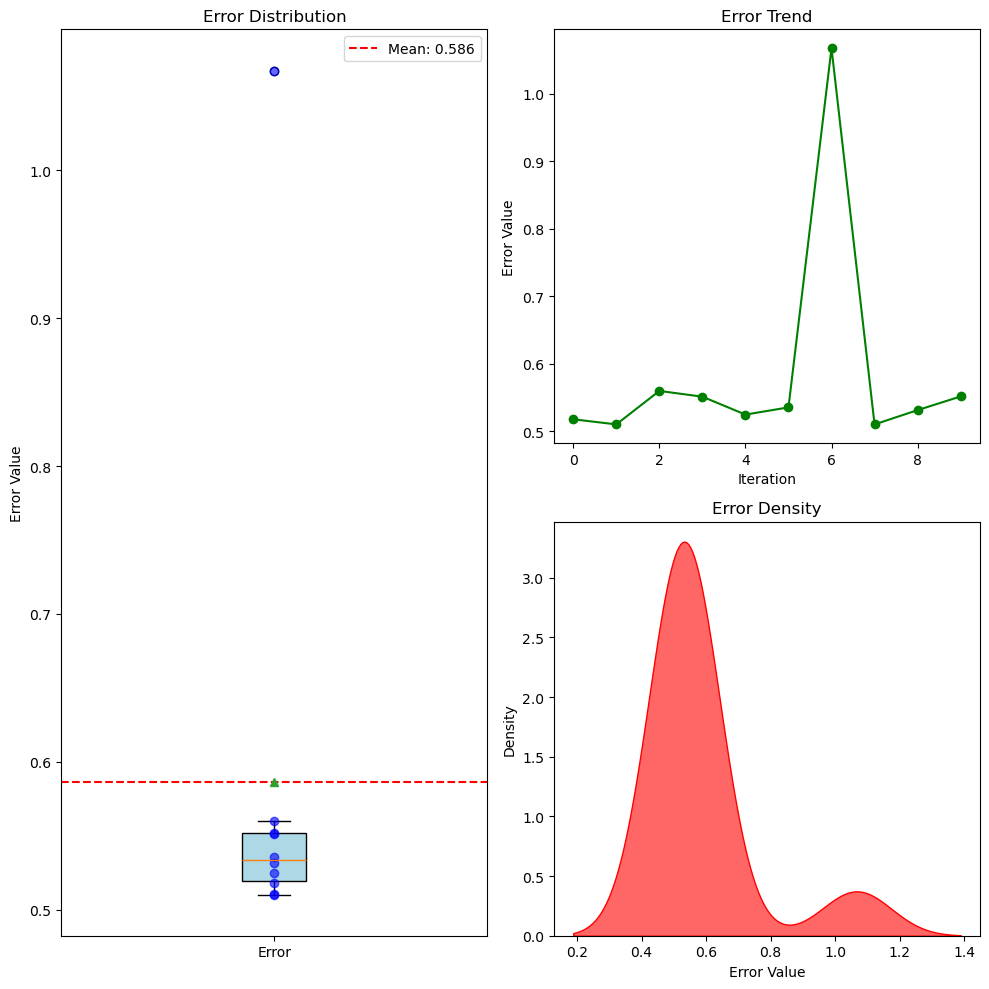

In [9]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns  # 导入seaborn库用于绘制密度图

# error = [0.5947221810612215, 0.7854634881268653, 1.0077722585678006, 0.5954742844285305, 0.4649590589316285, 0.41386083036181925, 0.6378457066743762, 0.6927021776896086, 0.44767318125257183, 0.28146649498710496, 0.8736713565859818, 0.8516792798779166, 0.37395951530223476, 0.8027823282496178, 0.804560887597274, 0.5182202889333846, 0.18454925778730633, 0.20862581035873265, 0.3739223144578929, 0.528249522241707]

plt.figure(figsize=(10, 10))  # 调整整体图表尺寸

# 左侧子图：箱形图，占据两张图的位置，箱的上下边界为上下四分位数，箱内的横线+三角点为中位数，虚线为均值
plt.subplot(1, 2, 1)  # 第一个子图，现在布局为1行2列
mean_error = np.mean(error)
plt.boxplot(error, patch_artist=True, showmeans=True, meanline=False, boxprops=dict(facecolor='lightblue')) #绘制箱型图，其中error是需要绘制的数据，patch_artist=True表示填充箱体，showmeans=True表示显示均值，meanline=True表示显示均值线，boxprops=dict(facecolor='lightblue')表示箱体的颜色为浅蓝色
plt.axhline(mean_error, color='r', linestyle='--', label=f'Mean: {mean_error:.3f}') #绘制一条水平线，位于mean_error处，颜色为红色，线型为虚线，标签为均值
for i, value in enumerate(error): #遍历error数组，i为索引，value为值
    plt.plot(1, value, 'bo', alpha=0.6) #绘制散点图，横坐标为1，纵坐标为value（即error数组中每个数），颜色为蓝色，点形状为圆圈，透明度为0.6
plt.title('Error Distribution')
plt.ylabel('Error Value')
plt.xticks([1], ['Error']) #设置x轴刻度标签
plt.legend() #显示图例

# 右侧上方子图：折线图
plt.subplot(2, 2, 2)  # 第二个子图，现在布局为2行2列的第二个位置
plt.plot(error, '-o', color='green') #绘制折线图，横坐标为error数组的索引，纵坐标为error数组的值，颜色为绿色，点形状为圆圈
plt.title('Error Trend')
plt.ylabel('Error Value')
plt.xlabel('Iteration')

# 右侧下方子图：密度图
plt.subplot(2, 2, 4)  # 第四个子图，现在布局为2行2列的第四个位置
sns.kdeplot(error, shade=True, color="r", alpha=0.6)
plt.title('Error Density')
plt.xlabel('Error Value')
plt.ylabel('Density')

plt.tight_layout()  # 自动调整子图参数，使之填充整个图表区域
plt.show()

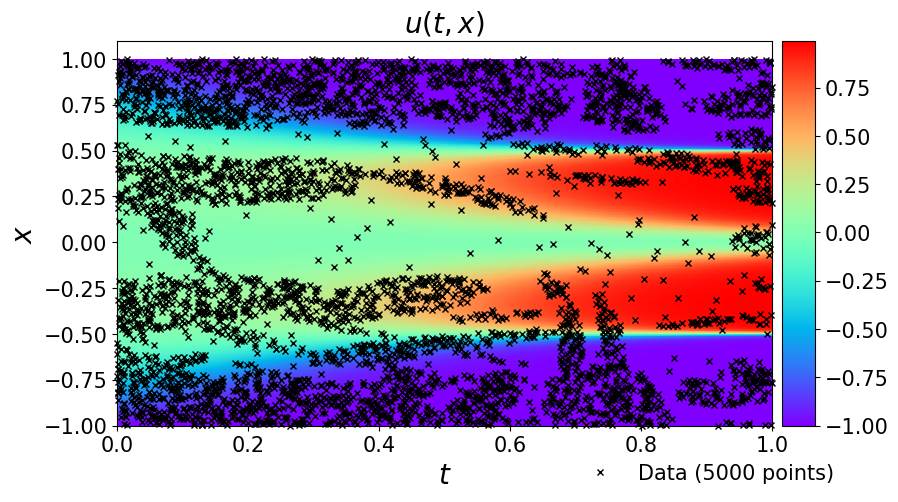

In [10]:
data = scipy.io.loadmat('../data/AC.mat')
#从data字典中取出变量tt和x的值，并转换为一维数组（flatten方法），最后tongg[:,None]将一维数组转换为二维数组
t = data['tt'].flatten()[:,None]
x = data['x'].flatten()[:,None]
Exact = np.real(data['uu']).T #从data数据中取出usol的值，并取实部，最后转置，赋值给Exact
#生成一个二位网络，X和T是输出的二维数组
#这个点结果是X和T均为形状为[len(t),len(x)]的二维数组，X的每一行都是x，一共len(t)行，T的每一列都是t，一共len(x)列
X, T = np.meshgrid(x,t)

X_star = np.hstack((X.flatten()[:,None], T.flatten()[:,None]))  #按列堆叠数组，X_star是一个二维数组，其中第一列是X的展平，第二列是T的展平
u_star = Exact.flatten()[:,None]   #对Exact_u使用flatten方法将其转换为一维数组，最后使用[:,None]将其转换为二维数组     
# X, T = np.meshgrid(x,t)

# X_star = np.hstack((X.flatten()[:,None], T.flatten()[:,None]))  #按列堆叠数组，X_star是一个二维数组，其中第一列是X的展平，第二列是T的展平
u_pred = model.predict(X_star)    #对Exact_u使用flatten方法将其转换为一维数组，最后使用[:,None]将其转换为二维数组   


#使用griddata函数将X_star、u_pred插值到网格上，得到U_pred
U_pred = griddata(X_star, u_pred.flatten(), (X, T), method='cubic')
U_star = griddata(X_star, u_star.flatten(), (X, T), method='cubic')

###### Row 0: u(t,x) ##################    

fig = plt.figure(figsize=(9, 5)) #这里figure是一个figure对象，是一个图形窗口，代表整个图形，设置图形大小为宽9英寸高5 英寸
ax = fig.add_subplot(111) #在图形的1*1网格的第一个位置添加一个子图

#绘图的数据来源
h = ax.imshow(U_star.T, interpolation='nearest', cmap='rainbow', 
              extent=[t.min(), t.max(), x.min(), x.max()], 
              origin='lower', aspect='auto')   #imshow函数用于显示图像，接受一些参数，第一个参数是图像数据，这里是U_pred的转置；第二个参数是插值方法（用于在像素之间插入新的像素），这里是最邻近插值；
                                                   #第三个参数是颜色映射，这里是用彩虹色图；第四个参数是图像的范围；第五个参数是图像的原点位置，这里表示原点在右下角；第六个参数是图像的纵横比，这里表示调整横纵比以填充整个axes对象
                                                   #最后的结果返回一个axesimage对象，也就是h，可以通过这个对象进一步设置图像的属性


#添加颜色条
divider = make_axes_locatable(ax)  #使用 make_axes_locatable 函数创建了一个 AxesDivider 对象。这个函数接受一个 Axes 对象作为参数，返回一个 AxesDivider 对象。AxesDivider 对象可以用来管理子图的布局，特别是当你需要在一个图的旁边添加另一个图时。
cax = divider.append_axes("right", size="5%", pad=0.10) #使用append_axes方法在原始轴的右侧添加了一个新的轴。append_axes 方法接受三个参数：位置（"right"）、大小（"5%"）和间距（0.10）。在原始轴的右侧添加了一个新的轴，新轴的大小是原始轴的 5%，新轴与原始轴之间的间距是 0.05 英寸
   
cbar = fig.colorbar(h, cax=cax)#使用colorbar方法在新轴上添加了一个颜色条。colorbar 方法接受两个参数：axesimage 对象（h）和新轴（cax）。并记这个颜色条的名字是cbar
cbar.ax.tick_params(labelsize=15) #设置颜色条刻度标签大小，这里bar是之前定义的


#在图上绘制散点图
ax.plot(
    X_f_train[:,1], 
    X_f_train[:,0], 
    'kx', label = 'Data (%d points)' % (X_f_train.shape[0]), 
    markersize = 4,  # marker size doubled
    clip_on = False,
    alpha=1.0
) #在ax上绘制散点图，前两个参数是散点的x坐标和y坐标；kx表示黑色的x（散点形状是x），label是散点的标签，clip_on表示散点可以绘制在轴的边界外
  #新加了一个alpha=1.0用来设置标记的透明度，1.0表示完全不透明  




#设置图的标签、图例、标题和刻度标签
#设置ax子图的x轴的标签为t，y轴的标签为x。这里$t$和$x$是latex格式的文本，用于生成数学公式
ax.set_xlabel('$t$', size=20)
ax.set_ylabel('$x$', size=20)
#设置子图ax的图例，第一个参数用来设置图例的位置，这里表示图例放在上方中央;第二个参数用来设置图例的锚点，接受一个元组，表示x和y坐标，表示把图例的锚点设置在x坐标为0.9，y坐标为-0.05处;frameon=False表示不显示图例的边框;第三个参数设置图例的列数，分为5列；最后一个参数设置图例属性，接受字典，这里表示设置图例字体大小为15；最后返回的leg是一个legend对象，表示图形的图例
ax.legend(
    loc='upper center', 
    bbox_to_anchor=(0.9, -0.05), 
    ncol=5, 
    frameon=False, 
    prop={'size': 15}
)
#设置子图ax的标题为$u(t,x)$，表示latex格式的文本，用于生成数学公式，fontsize=10表示字体大小为20
ax.set_title('$u(t,x)$', fontsize = 20) # font size doubled，两倍化子图标题
ax.tick_params(labelsize=15)#用来设置刻度标签的大小。`tick_params`是`Axes`对象的一个方法，可以用来设置刻度线的属性。在这里，`labelsize=15` 是用来设置刻度标签的字体大小的。


#显示图片
plt.show() #显示所有打开的图形的函数

In [11]:
trainloss = torch.stack(model.loss_value).cpu().detach().numpy()


16299


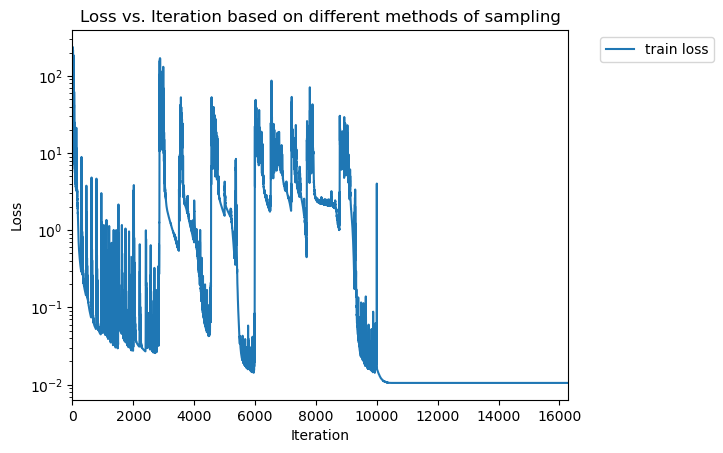

In [12]:
print(len(trainloss))
# print(trainloss)
# 定义图例的标签
labels = ["Grid"]

# 创建一个新的图形
plt.figure()

# # 遍历所有的loss数据和标签
# for loss, label in zip(trainloss, labels):
#     # 绘制每个loss数据，并使用标签作为图例的条目
#     plt.plot(loss, label=label)

plt.plot(trainloss, label='train loss')

# 添加图例，放在图像外
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')


plt.xlim([0,len(trainloss)]) # 设置x轴的范围
plt.yscale('log') #设置y轴为对数尺度，这样即使列表中有一些非常大的值，也不会影响其他值的可视化
plt.xlabel('Iteration') # 设置x轴的标签
plt.ylabel('Loss') # 设置y轴的标签
plt.title('Loss vs. Iteration based on different methods of sampling') # 设置图形的标题
# 显示图形
plt.show()
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


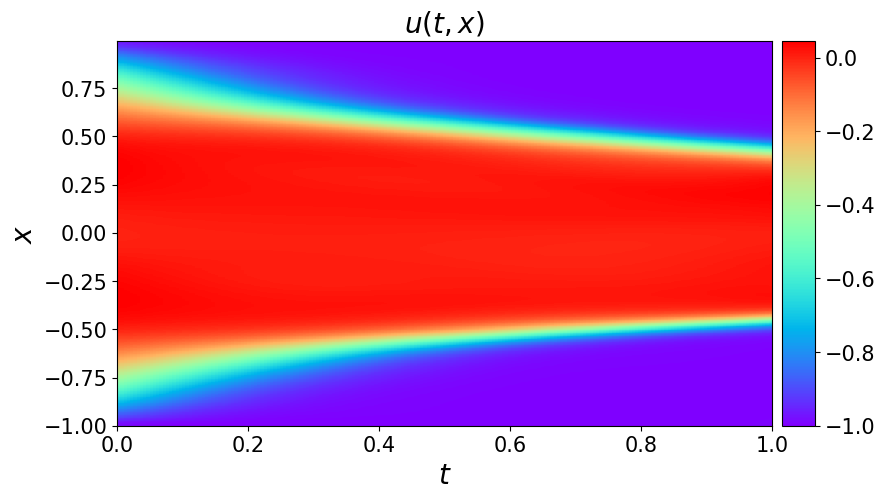

In [13]:
# data = scipy.io.loadmat('../../data/burgers_shock.mat')
# #从data字典中取出变量tt和x的值，并转换为一维数组（flatten方法），最后tongg[:,None]将一维数组转换为二维数组
# t = data['t'].flatten()[:,None]
# x = data['x'].flatten()[:,None]
# Exact = np.real(data['usol']).T #从data数据中取出usol的值，并取实部，最后转置，赋值给Exact
# #生成一个二位网络，X和T是输出的二维数组
# #这个点结果是X和T均为形状为[len(t),len(x)]的二维数组，X的每一行都是x，一共len(t)行，T的每一列都是t，一共len(x)列
# X, T = np.meshgrid(x,t)

# X_star = np.hstack((X.flatten()[:,None], T.flatten()[:,None]))  #按列堆叠数组，X_star是一个二维数组，其中第一列是X的展平，第二列是T的展平
u_pred = model.predict(X_star)    #对Exact_u使用flatten方法将其转换为一维数组，最后使用[:,None]将其转换为二维数组   


#使用griddata函数将X_star、u_pred插值到网格上，得到U_pred
U_pred = griddata(X_star, u_pred.flatten(), (X, T), method='cubic')


###### Row 0: u(t,x) ##################    

fig = plt.figure(figsize=(9, 5)) #这里figure是一个figure对象，是一个图形窗口，代表整个图形，设置图形大小为宽9英寸高5 英寸
ax = fig.add_subplot(111) #在图形的1*1网格的第一个位置添加一个子图

#绘图的数据来源
h = ax.imshow(U_pred.T, interpolation='nearest', cmap='rainbow', 
              extent=[t.min(), t.max(), x.min(), x.max()], 
              origin='lower', aspect='auto')   #imshow函数用于显示图像，接受一些参数，第一个参数是图像数据，这里是U_pred的转置；第二个参数是插值方法（用于在像素之间插入新的像素），这里是最邻近插值；
                                                   #第三个参数是颜色映射，这里是用彩虹色图；第四个参数是图像的范围；第五个参数是图像的原点位置，这里表示原点在右下角；第六个参数是图像的纵横比，这里表示调整横纵比以填充整个axes对象
                                                   #最后的结果返回一个axesimage对象，也就是h，可以通过这个对象进一步设置图像的属性


#添加颜色条
divider = make_axes_locatable(ax)  #使用 make_axes_locatable 函数创建了一个 AxesDivider 对象。这个函数接受一个 Axes 对象作为参数，返回一个 AxesDivider 对象。AxesDivider 对象可以用来管理子图的布局，特别是当你需要在一个图的旁边添加另一个图时。
cax = divider.append_axes("right", size="5%", pad=0.10) #使用append_axes方法在原始轴的右侧添加了一个新的轴。append_axes 方法接受三个参数：位置（"right"）、大小（"5%"）和间距（0.10）。在原始轴的右侧添加了一个新的轴，新轴的大小是原始轴的 5%，新轴与原始轴之间的间距是 0.05 英寸
   
cbar = fig.colorbar(h, cax=cax)#使用colorbar方法在新轴上添加了一个颜色条。colorbar 方法接受两个参数：axesimage 对象（h）和新轴（cax）。并记这个颜色条的名字是cbar
cbar.ax.tick_params(labelsize=15) #设置颜色条刻度标签大小，这里bar是之前定义的


# #在图上绘制散点图
# ax.plot(
#     X_f_train[:,1], 
#     X_f_train[:,0], 
#     'kx', label = 'Data (%d points)' % (X_f_train.shape[0]), 
#     markersize = 4,  # marker size doubled
#     clip_on = False,
#     alpha=1.0
# ) #在ax上绘制散点图，前两个参数是散点的x坐标和y坐标；kx表示黑色的x（散点形状是x），label是散点的标签，clip_on表示散点可以绘制在轴的边界外
#   #新加了一个alpha=1.0用来设置标记的透明度，1.0表示完全不透明  




#设置图的标签、图例、标题和刻度标签
#设置ax子图的x轴的标签为t，y轴的标签为x。这里$t$和$x$是latex格式的文本，用于生成数学公式
ax.set_xlabel('$t$', size=20)
ax.set_ylabel('$x$', size=20)
#设置子图ax的图例，第一个参数用来设置图例的位置，这里表示图例放在上方中央;第二个参数用来设置图例的锚点，接受一个元组，表示x和y坐标，表示把图例的锚点设置在x坐标为0.9，y坐标为-0.05处;frameon=False表示不显示图例的边框;第三个参数设置图例的列数，分为5列；最后一个参数设置图例属性，接受字典，这里表示设置图例字体大小为15；最后返回的leg是一个legend对象，表示图形的图例
ax.legend(
    loc='upper center', 
    bbox_to_anchor=(0.9, -0.05), 
    ncol=5, 
    frameon=False, 
    prop={'size': 15}
)
#设置子图ax的标题为$u(t,x)$，表示latex格式的文本，用于生成数学公式，fontsize=10表示字体大小为20
ax.set_title('$u(t,x)$', fontsize = 20) # font size doubled，两倍化子图标题
ax.tick_params(labelsize=15)#用来设置刻度标签的大小。`tick_params`是`Axes`对象的一个方法，可以用来设置刻度线的属性。在这里，`labelsize=15` 是用来设置刻度标签的字体大小的。


#显示图片
plt.show() #显示所有打开的图形的函数

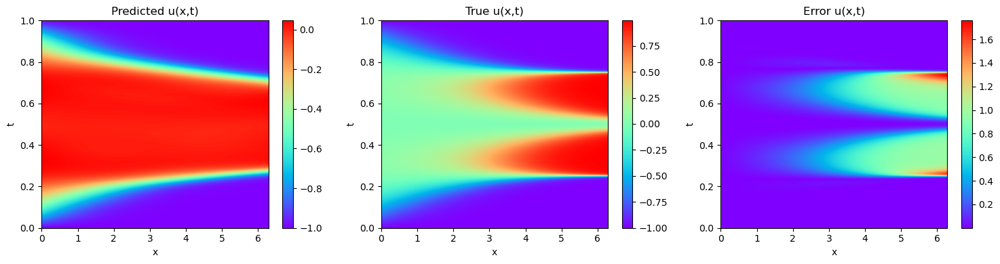

In [14]:

# 创建一个包含三幅子图的图像
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

# 绘制第一幅图像
axes[0].imshow(U_pred.T, extent=[0, np.pi*2, 1, 0], aspect='auto', cmap='rainbow')
axes[0].invert_yaxis()
axes[0].set_xlabel('x')
axes[0].set_ylabel('t')
axes[0].set_title('Predicted u(x,t)')
fig.colorbar(axes[0].images[0], ax=axes[0])

# 绘制第二幅图像
axes[1].imshow(U_star.T, extent=[0,np.pi*2,1,0], aspect='auto', cmap='rainbow') #第一个参数为数据，第二个参数为一个列表，用于设置图像的坐标范围，aspect='auto'表示纵横比自动调整
axes[1].invert_yaxis()
axes[1].set_xlabel('x')
axes[1].set_ylabel('t')
axes[1].set_title('True u(x,t)')
fig.colorbar(axes[1].images[0], ax=axes[1])

# 绘制第三幅图像
axes[2].imshow(np.abs(U_pred - U_star).T, extent=[0,np.pi*2,1,0], aspect='auto', cmap='rainbow') #第一个参数为数据，第二个参数为一个列表，用于设置图像的坐标范围，aspect='auto'表示纵横比自动调整
axes[2].invert_yaxis()
axes[2].set_xlabel('x')
axes[2].set_ylabel('t')
axes[2].set_title('Error u(x,t)')
fig.colorbar(axes[2].images[0], ax=axes[2])

# 自动调整子图参数，使得子图之间的间距适当
plt.tight_layout()
plt.show()

In [15]:
#计算训练好模型的chaos（最后一个seed）
u_chaos = calculate_chaos(model, X_star, num_iter=50)
u_chaos_log = np.log(u_chaos + 1e-10) #对u_var取对数，然后加上一个很小的数，避免取对数时出现错误

#使用griddata函数将X_star、u_pred插值到网格上，得到U_pred
U_chaos = griddata(X_star, u_chaos.flatten(), (X, T), method='cubic')
U_chaos_log = griddata(X_star, u_chaos_log.flatten(), (X, T), method='cubic')

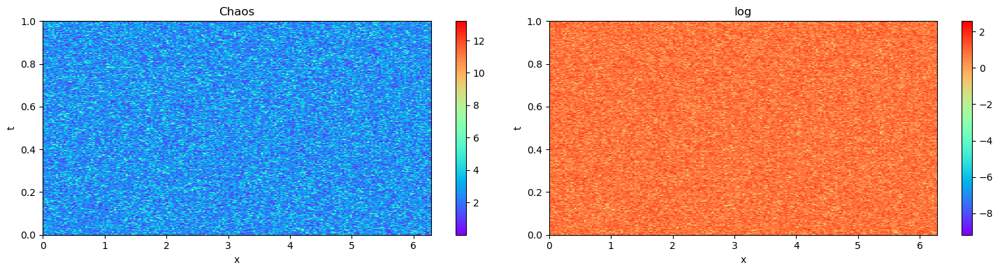

In [16]:

# 创建一个包含三幅子图的图像
fig, axes = plt.subplots(1, 2, figsize=(15, 4))

# 绘制第一幅图像
axes[0].imshow(U_chaos.T, extent=[0, np.pi*2, 1, 0], aspect='auto', cmap='rainbow')
axes[0].invert_yaxis()
axes[0].set_xlabel('x')
axes[0].set_ylabel('t')
axes[0].set_title('Chaos')
fig.colorbar(axes[0].images[0], ax=axes[0])

# 绘制第二幅图像
axes[1].imshow(U_chaos_log.T, extent=[0,np.pi*2,1,0], aspect='auto', cmap='rainbow') #第一个参数为数据，第二个参数为一个列表，用于设置图像的坐标范围，aspect='auto'表示纵横比自动调整
axes[1].invert_yaxis()
axes[1].set_xlabel('x')
axes[1].set_ylabel('t')
axes[1].set_title('log')
fig.colorbar(axes[1].images[0], ax=axes[1])

# 自动调整子图参数，使得子图之间的间距适当
plt.tight_layout()
plt.show()